In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import contextily as cx
import shapely.geometry as sg
import seaborn as sns
import ast
import folium
import os
import tensorflow as tf
from tqdm import tqdm

from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
from keras.layers import Bidirectional
from keras.layers import Conv2D, Flatten, Concatenate, Input
from keras.models import Model

from sklearn.metrics import mean_absolute_error, mean_squared_error

# Load Data

In [2]:
# load tacheometry in X direction
Y_x = pd.read_csv('../Data/TargetX.csv', index_col=0)

In [4]:
Y_y = pd.read_csv('../Data/TargetY.csv', index_col=0)

In [5]:
Y_z = pd.read_csv('../Data/TargetZ.csv', index_col=0)

In [6]:
# load cpt data
cpt = pd.read_csv('../Data/CPT_train.csv', index_col=0)

In [7]:
# only take objects that are in both dataset
Y_x = Y_x[Y_x['objectid'].isin(cpt.index)]
Y_y = Y_y[Y_y['objectid'].isin(cpt.index)]
Y_z = Y_z[Y_z['objectid'].isin(cpt.index)]


# set object+segment as index
cpt = cpt.loc[cpt.index.repeat(Y_x.groupby('objectid')['segment'].max() + 1)]
Y_x = Y_x.drop(['objectid', 'X_coordinate', 'Y_coordinate', 'segment'], axis=1)
Y_y = Y_y.drop(['objectid', 'X_coordinate', 'Y_coordinate', 'segment'], axis=1)
Y_z = Y_z.drop(['objectid', 'X_coordinate', 'Y_coordinate', 'segment'], axis=1)
cpt.index = Y_x.index

In [9]:
sat_ver = pd.read_csv('../Data/SatVer.csv', index_col=0)

In [10]:
sat_hor = pd.read_csv('../Data/SatHor.csv', index_col=0)

In [11]:
sat_ach = pd.read_csv('../Data/SatAch.csv', index_col=0)

# Functions

In [12]:
def scale_features(df):
    """Scale features to be between 0 and 1"""

    df = (df - df.min(axis=0)) / (df.max(axis=0) - df.min(axis=0))
    
    return df

In [13]:
def create_window(df, input_width, label_width, shift, incl_cpt=False, tacheometry=True, df_cpt=None, incl_sat=False):
    """
    Create training batches of width input_width,
    and labels of width label_width
    """
    
    X = []
    X_ver = []
    X_hor = []
    X_ach = []
    Y = []

    # fix for input per measuring bolt, turns input into correct shape
    if isinstance(df, pd.Series):
        df = pd.DataFrame(df).T
        
    # account for varying months of last measurement
    df = df.dropna()
    
    # current object
    obj = df.index.str[:7][0]
        
    for i in range(len(df.columns)):
        
        # ensure enough values are left for the label
        if i+input_width+label_width <= len(df.columns):
                        
            # add window to X
            X.append(df.iloc[:,i:i+input_width].values)
            X_ver.append(train_sat_ver.loc[obj].iloc[i:i+input_width])
            X_hor.append(train_sat_hor.loc[obj].iloc[i:i+input_width])
            X_ach.append(train_sat_ach.loc[obj].iloc[i:i+input_width])
            
            # add label to Y
            Y.append(df.iloc[:,i+input_width:i+input_width+label_width].values)
    
    # shape (batch, time, features)
    X = np.array(X).reshape((len(X), input_width, df.shape[0]))
    Y = np.array(Y).reshape((len(X), label_width, df.shape[0]))
    
    X_ver = np.expand_dims(np.array(X_ver), axis=2)
    X_hor = np.expand_dims(np.array(X_hor), axis=2)
    X_ach = np.expand_dims(np.array(X_ach), axis=2)
    
    # only add cpt features if cpt data is passed
    if incl_cpt == True:
    
        # get cpt values in correct shape 
        cpt_array = np.array(df_cpt.values).reshape((1, 1, len(df_cpt.values)))
        cpt_array = np.repeat(cpt_array, input_width, axis=1)
        cpt_array = np.repeat(cpt_array, len(X), axis=0)
        
        if tacheometry == False:
            X = cpt_array
        
        else:
            # add to X and Y
            X = np.concatenate((X, cpt_array), axis=2)
            
    if incl_sat == True:
        
        X_sat = np.concatenate((X_ver, X_hor), axis=2)
        X_sat = np.concatenate((X_sat, X_ach), axis=2)
        
        if incl_cpt == False and tacheometry == False:
            X = X_sat
            
        else:
            X = np.concatenate((X, X_sat), axis=2)
                            
    return X, Y

In [14]:
def create_validation_set(X, Y, splits=4):
    """
    Takes windowed training set as input,
    Splits off validation set, size equals number of splits
    """
    
    # take first windows as training set
    X_train = X[:X.shape[0]-splits]
    Y_train = Y[:Y.shape[0]-splits]
    
    # take last windows as validation set
    X_val = X[X.shape[0]-splits:]
    Y_val = Y[Y.shape[0]-splits:]
    
    return X_train, Y_train, X_val, Y_val

In [15]:
def NaiveBaseline(X, Y):
    """
    Create baseline prediction with naive method.
    Gives the last value as prediction
    """

    # predict last element of X window
    Y_pred = X[:,-1,0]
    
    # compare against last Y value in label
    Y_act = Y[:,-1,0]
    
    # return mae and rmse
    return mean_absolute_error(Y_act, Y_pred), mean_squared_error(Y_act, Y_pred, squared=False)

In [16]:
def train_objects(df, input_width, label_width, shift, epochs=100, incl_cpt=True, tacheometry=True, incl_sat=False, model=None):
    """
    Train models per object, making use of create_window().
    Possible with or without features, choice of model can be passed.
    """

    results = []
    models = []
        
    # iterate over objects
    for obj in tqdm(df.index.str[:7].unique()):
        
        if incl_cpt == True:
            X, Y = create_window(df[df.index.str.contains(obj)], input_width=input_width, label_width=label_width, \
                shift=shift, incl_cpt=incl_cpt, tacheometry=tacheometry, incl_sat=incl_sat, df_cpt=cpt[cpt.index.str.contains(obj)].iloc[0])
        
        if incl_cpt == False:
            X, Y = create_window(df[df.index.str.contains(obj)], input_width=input_width, label_width=label_width, \
                shift=shift, incl_cpt=False, tacheometry=tacheometry, incl_sat=incl_sat)

        train_X, train_Y, val_X, val_Y = create_validation_set(X, Y)
                
        # if 'naive' is passed as model, naive model is stored in results
        if model == "naive":
            results.append(NaiveBaseline(val_X, val_Y))
            
        # otherwise, BiLSTM model is trained and stored in results
        else:
            model = initiate_model(label_width, output_length=Y.shape[2])
            results.append(model.fit(train_X, train_Y, validation_data=(val_X, val_Y), epochs=epochs, verbose=1))
            models.append(model)
        
    return models, results

In [17]:
def initiate_model(label_width, output_length):
    """
    Initiate and compile model
    """
    model = Sequential()
    model.add(Bidirectional(LSTM(64, activation = 'relu')))
    model.add(Reshape((1, -1)))    
    model.add(Dense(units=label_width * output_length))
    model.add(Reshape((label_width, output_length)))  
    model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.RootMeanSquaredError()])
    
    return model

In [18]:
# train tcmt only on data per bout, grouped per rak, grouped per wall
def grouping_experiment(df, group, features=False):
    """
    variable group should have value 'wall', 'rak', or 'total'
    """
    
    results = []

    if group == 'total':
        X, Y = create_window(df, input_width=10, label_width=5, shift=1)
        
        train_X, train_Y, val_X, val_Y = create_validation_set(X, Y)
        model = initiate_model(5, X.shape[2])
        results.append(model.fit(train_X, train_Y, validation_data=(val_X, val_Y), epochs=100, verbose=1))
        
        return model, results
        
    else:
        if group == 'rak':
            objects = df.index.str[:7].unique()
        elif group == 'wall':
            objects = df.index.str[:3].unique()
   
        for obj in tqdm(objects):

            if features == True:
                X, Y = create_window(df[df.index.str.contains(obj)], input_width=10, label_width=5, shift=1, features=True, df_cpt=train_cpt[cpt.index.str.contains(obj)].iloc[0])
            else:
                X, Y = create_window(df[df.index.str.contains(obj)], input_width=10, label_width=5, shift=1)

            train_X, train_Y, val_X, val_Y = create_validation_set(X, Y)
            model = initiate_model(5, X.shape[2])
            results.append(model.fit(train_X, train_Y, validation_data=(val_X, val_Y), epochs=100, verbose=1))    

    return results

In [19]:
def initiate_incremental(input_shape_bilstm, input_shape_new_data, label_width, outcome_length):
    """
    This function initiates and compiles an incrementally fused model
    """
    
    # Create BiLSTM model
    input_bilstm = Input(shape=input_shape_bilstm)
    bilstm = Bidirectional(LSTM(units=64, return_sequences=True))(input_bilstm)
    model_bilstm = Model(inputs=input_bilstm, outputs=bilstm)

    # Create layer for new data
    input_new_data = Input(shape=input_shape_new_data)
    new_data = Dense(units=128)(input_new_data)
    model_new_data = Model(inputs=input_new_data, outputs=new_data)

    # Concatenate BiLSTM output and new data
    merged_model = Concatenate()([model_bilstm.output, model_new_data.output])

    # Add fully connected layer
    merged_model = Dense(units=256, activation='relu')(merged_model)
    
    # Add BiLSTM layer
    merged_model = Bidirectional(LSTM(units=64, return_sequences=True))(merged_model)
    
    # Output layer
    merged_model = Reshape((1, -1))(merged_model)
    merged_model = Dense(units=label_width * outcome_length)(merged_model)
    merged_model = Reshape((label_width, outcome_length))(merged_model)

    # Create the final model
    model = Model(inputs=[model_bilstm.input, model_new_data.input], outputs=merged_model)

    # Compile the model
    model.compile(optimizer='adam', loss='mse', metrics=[tf.keras.metrics.MeanAbsoluteError(), tf.keras.metrics.RootMeanSquaredError()])
    
    return model

In [20]:
def incremental_fusion(first_dataset, direction, tacheometry=False):
    """
    This function yields an incrementally fused model.
    """
    
    results_inc = []
    
    # set df to corresponding direction
    if direction == 'X':
        df = train_Yx
    if direction == 'Y':
        df = train_Yy
    if direction == 'Z':
        df = train_Yz
        
    # define whether tacheometry data should be added to the windows or not
    if tacheometry == True:
        if first_dataset == 'CPT':
            cpt_tcmt = True
            sat_tcmt = False
        else:
            sat_tcmt = True
            cpt_tcmt = False
        
    # iterate over objects
    for obj in df.index.str[:7].unique():
        
        # create windows for satellite data
        X_sat, Y_sat = create_window(df[df.index.str.contains(obj)], input_width=10, label_width=5, \
            shift=1, incl_cpt=False, tacheometry=sat_tcmt, incl_sat=True)

        # create windows for CPT data
        X_cpt, Y_cpt = create_window(df[df.index.str.contains(obj)], input_width=10, label_width=5, \
            shift=1, incl_cpt=True, tacheometry=cpt_tcmt, incl_sat=False, df_cpt=train_cpt[train_cpt.index.str.contains(obj)].iloc[0])

        # create validation set
        train_X_sat, train_Y_sat, val_X_sat, val_Y_sat = create_validation_set(X_sat, Y_sat)
        train_X_cpt, train_Y_cpt, val_X_cpt, val_Y_cpt = create_validation_set(X_cpt, Y_cpt)
                
        label_width=Y_sat.shape[1]
        outcome_length=Y_sat.shape[2]
                    
        # pass CPT as first dataset
        if first_dataset == 'CPT':
            model = initiate_incremental(train_X_cpt.shape[1:], train_X_sat.shape[1:], label_width, outcome_length)
            results_inc.append(model.fit([train_X_cpt, train_X_sat], train_Y_sat, validation_data=([val_X_cpt, val_X_sat], val_Y_sat), epochs=100))
        
        # pass Sat as first dataset
        else:
            model = initiate_incremental(train_X_sat.shape[1:], train_X_cpt.shape[1:], label_width, outcome_length)
            results_inc.append(model.fit([train_X_sat, train_X_cpt], train_Y_sat, validation_data=([val_X_sat, val_X_cpt], val_Y_sat), epochs=100))
    
    return results_inc

In [21]:
def visualize_performance(results):
    """
    Visualizes the MAE and RMSE per epoch given a list of results
    """
    
    maes_train = []
    maes_val = []
    rmse_train = []
    rmse_val = []

    for i, result in enumerate(results):
        
        # store MAE
        if 'val_mean_absolute_error' in result.history.keys():
            maes_train.append(result.history['mean_absolute_error'])
            maes_val.append(result.history['val_mean_absolute_error'])
            
        # store RMSE
        if 'val_root_mean_squared_error' in result.history.keys():
            rmse_train.append(result.history['root_mean_squared_error'])
            rmse_val.append(result.history['val_root_mean_squared_error'])

    # calculate mean values
    mean_mae_train = np.mean(np.array(maes_train), axis=0)
    mean_mae_val = np.mean(np.array(maes_val), axis=0)
    mean_rmse_train = np.mean(np.array(rmse_train), axis=0)
    mean_rmse_val = np.mean(np.array(rmse_val), axis=0)
        
    print(f'Optimal Mean MAE: {np.min(mean_mae_val)} @ epoch {np.argmin(mean_mae_val)}')
    print(f'Optimal Mean RMSE: {np.min(mean_rmse_val)} @ epoch {np.argmin(mean_rmse_val)}')
    
    # plot MAE scores
    sns.lineplot(data=mean_mae_train, label='train')
    sns.lineplot(data=mean_mae_val, label='validation')
    plt.title('Mean MAE scores of BiLSTM model')
    plt.ylabel('MAE')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()

    # plot RMSE scores
    sns.lineplot(data=mean_rmse_train, label='train')
    sns.lineplot(data=mean_rmse_val, label='validation')
    plt.title('Mean RMSE scores of BiLSTM model')
    plt.ylabel('RMSE')
    plt.xlabel('Epochs')
    plt.legend()
    plt.show()
    
    return

In [22]:
def save_models(results, combi, direction):
    """
    Save models
    """
    for i, mod in enumerate(results[0]):
        obj = train_Yx.index.str[:7].unique()[i]
        mod.save(f'../Models/{combi}/{direction}/{obj}')
        
    return 'Models are saved successfully.'

In [23]:
def load_models(combi, direction):
    """
    Load models
    """
    models = []
    directory = f'../Models/{combi}/{direction}'
    
    for file in os.listdir(directory):
        models.append(tf.keras.models.load_model(f'{directory}/{file}'))

    return models

# Train/Val/Test split

In [24]:
# set random seeds for reproducable results
np.random.seed(42)
tf.random.set_seed(42)

In [25]:
cpt = scale_features(cpt)

In [26]:
# Train on 70% of the objects and 75% of the timeseries
train_Yx = Y_x[0:int(0.7*len(Y_x))].iloc[:, 0:int(0.75*len(Y_x.columns))]
train_Yy = Y_y[0:int(0.7*len(Y_y))].iloc[:, 0:int(0.75*len(Y_y.columns))]
train_Yz = Y_z[0:int(0.7*len(Y_z))].iloc[:, 0:int(0.75*len(Y_z.columns))]

# test on 70% of the objects and 75% of the timeseries
test_Yx = Y_x[0:int(0.7*len(Y_x))].iloc[:, int(0.75*len(Y_x.columns)):]

# test on 30% of the object later

In [27]:
train_Yx.shape

(1163, 28)

In [28]:
train_sat_ver = sat_ver.iloc[:, 0:int(0.75*len(sat_ver.columns))]
train_sat_hor = sat_hor.iloc[:, 0:int(0.75*len(sat_hor.columns))]
train_sat_ach = sat_ach.iloc[:, 0:int(0.75*len(sat_ach.columns))]

train_sat_ver.shape, train_sat_hor.shape, train_sat_ach.shape

((30, 28), (30, 28), (30, 28))

In [31]:
X0, Y0 = create_window(train_Yx.iloc[0], input_width=10, label_width=5, shift=1, incl_cpt=True, df_cpt=cpt.iloc[0])

In [32]:
train_X0, train_Y0, val_X0, val_Y0 = create_validation_set(X0, Y0)

In [33]:
train_X0.shape, train_Y0.shape, val_X0.shape, val_Y0.shape

((10, 10, 172), (10, 5, 1), (4, 10, 172), (4, 5, 1))

# Check if everything works

In [34]:
model = initiate_model(5, X0.shape[2])

In [35]:
result = model.fit(train_X0, train_Y0, validation_data=(val_X0, val_Y0), epochs=100, verbose=1)

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9987 - mean_absolute_error: 0.9700 - root_mean_squared_error: 0.9994 - val_loss: 3.3630 - val_mean_absolute_error: 1.7121 - val_root_mean_squared_error: 1.8339
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9424 - mean_absolute_error: 0.9445 - root_mean_squared_error: 0.9707 - val_loss: 3.2711 - val_mean_absolute_error: 1.6852 - val_root_mean_squared_error: 1.8086
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.8932 - mean_absolute_error: 0.9182 - root_mean_squared_error: 0.9451 - val_loss: 3.1614 - val_mean_absolute_error: 1.6507 - val_root_mean_squared_error: 1.7780
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8381 - mean_absolute_error: 0.8843 - root_mean_squared_error: 0.9155 - val_loss: 3.0133 - val_mean_absolute_error: 1.6013 - val_root_mean_squared_error: 1.7359
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0288 - mean_absolute_error: 0.1420 - root_mean_squared_error: 0.1698 - val_loss: 0.8950 - val_mean_absolute_error: 0.7324 - val_root_mean_squared_error: 0.9461
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0281 - mean_absolute_error: 0.1404 - root_mean_squared_error: 0.1676 - val_loss: 0.8941 - val_mean_absolute_error: 0.7315 - val_root_mean_squared_error: 0.9456
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0274 - mean_absolute_error: 0.1389 - root_mean_squared_error: 0.1655 - val_loss: 0.8989 - val_mean_absolute_error: 0.7340 - val_root_mean_squared_error: 0.9481
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0267 - mean_absolute_error: 0.1375 - root_mean_squared_error: 0.1633 - val_loss: 0.9056 - val_mean_absolute_error: 0.7376 - val_root_mean_squared_error: 0.9516
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0142 - mean_absolute_error: 0.1011 - root_mean_squared_error: 0.1191 - val_loss: 0.7696 - val_mean_absolute_error: 0.6611 - val_root_mean_squared_error: 0.8773
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0138 - mean_absolute_error: 0.1001 - root_mean_squared_error: 0.1175 - val_loss: 0.7326 - val_mean_absolute_error: 0.6413 - val_root_mean_squared_error: 0.8559
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0126 - mean_absolute_error: 0.0952 - root_mean_squared_error: 0.1122 - val_loss: 0.6935 - val_mean_absolute_error: 0.6210 - val_root_mean_squared_error: 0.8328
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0128 - mean_absolute_error: 0.0951 - root_mean_squared_error: 0.1129 - val_loss: 0.7490 - val_mean_absolute_error: 0.6500 - val_root_mean_squared_error: 0.8654
Epoch 75/100
1/1 [==============================] - 0s 36ms/

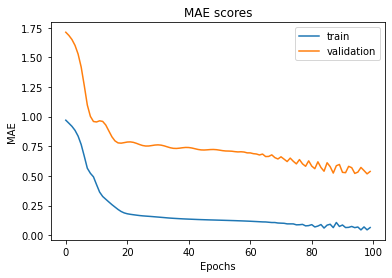

In [36]:
sns.lineplot(data=result.history['mean_absolute_error'], label='train')
sns.lineplot(data=result.history['val_mean_absolute_error'], label='validation')
plt.title('MAE scores')
plt.ylabel('MAE')
plt.xlabel('Epochs')
plt.legend()
plt.show()

# Experiments

### Training per wall/rak/bout

In [37]:
results_rak = grouping_experiment(train_Yx, 'rak')
results_wall = grouping_experiment(train_Yx, 'wall')
results_total = grouping_experiment(train_Yx, 'total')

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.7530 - mean_absolute_error: 1.9290 - root_mean_squared_error: 2.5986 - val_loss: 11.6449 - val_mean_absolute_error: 2.7728 - val_root_mean_squared_error: 3.4125
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 6.5130 - mean_absolute_error: 1.8837 - root_mean_squared_error: 2.5520 - val_loss: 11.3141 - val_mean_absolute_error: 2.7276 - val_root_mean_squared_error: 3.3636
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 6.2872 - mean_absolute_error: 1.8395 - root_mean_squared_error: 2.5074 - val_loss: 11.0073 - val_mean_absolute_error: 2.6857 - val_root_mean_squared_error: 3.3177
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 6.0659 - mean_absolute_error: 1.7951 - root_mean_squared_error: 2.4629 - val_loss: 10.7074 - val_mean_absolute_error: 2.6452 - val_root_mean_squared_error: 3.2722
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7887 - mean_absolute_error: 0.5802 - root_mean_squared_error: 0.8881 - val_loss: 14.6681 - val_mean_absolute_error: 2.6031 - val_root_mean_squared_error: 3.8299
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7570 - mean_absolute_error: 0.5658 - root_mean_squared_error: 0.8700 - val_loss: 14.4286 - val_mean_absolute_error: 2.5858 - val_root_mean_squared_error: 3.7985
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.7260 - mean_absolute_error: 0.5514 - root_mean_squared_error: 0.8520 - val_loss: 14.2889 - val_mean_absolute_error: 2.5733 - val_root_mean_squared_error: 3.7801
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6967 - mean_absolute_error: 0.5382 - root_mean_squared_error: 0.8347 - val_loss: 14.2690 - val_mean_absolute_error: 2.5673 - val_root_mean_squared_error: 3.7774
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2648 - mean_absolute_error: 0.2753 - root_mean_squared_error: 0.5146 - val_loss: 10.4850 - val_mean_absolute_error: 2.1802 - val_root_mean_squared_error: 3.2381
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2602 - mean_absolute_error: 0.2716 - root_mean_squared_error: 0.5101 - val_loss: 10.4625 - val_mean_absolute_error: 2.1775 - val_root_mean_squared_error: 3.2346
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2558 - mean_absolute_error: 0.2685 - root_mean_squared_error: 0.5057 - val_loss: 10.4708 - val_mean_absolute_error: 2.1775 - val_root_mean_squared_error: 3.2359
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2514 - mean_absolute_error: 0.2659 - root_mean_squared_error: 0.5014 - val_loss: 10.4869 - val_mean_absolute_error: 2.1785 - val_root_mean_squared_error: 3.2383
Epoch 75/100
1/1 [==============================] - 0s 4

  5%|████▏                                                                              | 1/20 [00:07<02:23,  7.54s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2572 - mean_absolute_error: 0.8397 - root_mean_squared_error: 1.1212 - val_loss: 2.3720 - val_mean_absolute_error: 1.1625 - val_root_mean_squared_error: 1.5401
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1890 - mean_absolute_error: 0.8086 - root_mean_squared_error: 1.0904 - val_loss: 2.2877 - val_mean_absolute_error: 1.1364 - val_root_mean_squared_error: 1.5125
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1287 - mean_absolute_error: 0.7814 - root_mean_squared_error: 1.0624 - val_loss: 2.2073 - val_mean_absolute_error: 1.1107 - val_root_mean_squared_error: 1.4857
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0730 - mean_absolute_error: 0.7564 - root_mean_squared_error: 1.0358 - val_loss: 2.1274 - val_mean_absolute_error: 1.0850 - val_root_mean_squared_error: 1.4586
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0634 - mean_absolute_error: 0.1685 - root_mean_squared_error: 0.2519 - val_loss: 0.3745 - val_mean_absolute_error: 0.4334 - val_root_mean_squared_error: 0.6119
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0610 - mean_absolute_error: 0.1640 - root_mean_squared_error: 0.2470 - val_loss: 0.3621 - val_mean_absolute_error: 0.4243 - val_root_mean_squared_error: 0.6018
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0588 - mean_absolute_error: 0.1607 - root_mean_squared_error: 0.2424 - val_loss: 0.3505 - val_mean_absolute_error: 0.4157 - val_root_mean_squared_error: 0.5920
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0566 - mean_absolute_error: 0.1577 - root_mean_squared_error: 0.2379 - val_loss: 0.3398 - val_mean_absolute_error: 0.4078 - val_root_mean_squared_error: 0.5829
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0114 - mean_absolute_error: 0.0690 - root_mean_squared_error: 0.1068 - val_loss: 0.2330 - val_mean_absolute_error: 0.3096 - val_root_mean_squared_error: 0.4828
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0109 - mean_absolute_error: 0.0674 - root_mean_squared_error: 0.1045 - val_loss: 0.2311 - val_mean_absolute_error: 0.3076 - val_root_mean_squared_error: 0.4807
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0105 - mean_absolute_error: 0.0660 - root_mean_squared_error: 0.1023 - val_loss: 0.2292 - val_mean_absolute_error: 0.3057 - val_root_mean_squared_error: 0.4788
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0101 - mean_absolute_error: 0.0646 - root_mean_squared_error: 0.1003 - val_loss: 0.2275 - val_mean_absolute_error: 0.3038 - val_root_mean_squared_error: 0.4770
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:16,  7.57s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0750 - mean_absolute_error: 1.0730 - root_mean_squared_error: 1.4405 - val_loss: 2.0656 - val_mean_absolute_error: 1.1523 - val_root_mean_squared_error: 1.4372
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.9607 - mean_absolute_error: 1.0291 - root_mean_squared_error: 1.4003 - val_loss: 1.9518 - val_mean_absolute_error: 1.1145 - val_root_mean_squared_error: 1.3971
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.8532 - mean_absolute_error: 0.9867 - root_mean_squared_error: 1.3613 - val_loss: 1.8421 - val_mean_absolute_error: 1.0779 - val_root_mean_squared_error: 1.3572
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.7488 - mean_absolute_error: 0.9456 - root_mean_squared_error: 1.3224 - val_loss: 1.7333 - val_mean_absolute_error: 1.0429 - val_root_mean_squared_error: 1.3165
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1768 - mean_absolute_error: 0.2680 - root_mean_squared_error: 0.4205 - val_loss: 0.5483 - val_mean_absolute_error: 0.5671 - val_root_mean_squared_error: 0.7405
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1699 - mean_absolute_error: 0.2634 - root_mean_squared_error: 0.4122 - val_loss: 0.5474 - val_mean_absolute_error: 0.5691 - val_root_mean_squared_error: 0.7399
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1635 - mean_absolute_error: 0.2592 - root_mean_squared_error: 0.4043 - val_loss: 0.5463 - val_mean_absolute_error: 0.5712 - val_root_mean_squared_error: 0.7391
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1574 - mean_absolute_error: 0.2553 - root_mean_squared_error: 0.3967 - val_loss: 0.5448 - val_mean_absolute_error: 0.5731 - val_root_mean_squared_error: 0.7381
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0241 - mean_absolute_error: 0.1076 - root_mean_squared_error: 0.1551 - val_loss: 0.2277 - val_mean_absolute_error: 0.3381 - val_root_mean_squared_error: 0.4772
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0224 - mean_absolute_error: 0.1041 - root_mean_squared_error: 0.1497 - val_loss: 0.2232 - val_mean_absolute_error: 0.3337 - val_root_mean_squared_error: 0.4724
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0209 - mean_absolute_error: 0.1009 - root_mean_squared_error: 0.1446 - val_loss: 0.2191 - val_mean_absolute_error: 0.3300 - val_root_mean_squared_error: 0.4681
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0195 - mean_absolute_error: 0.0977 - root_mean_squared_error: 0.1397 - val_loss: 0.2156 - val_mean_absolute_error: 0.3268 - val_root_mean_squared_error: 0.4643
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 15%|████████████▍                                                                      | 3/20 [00:22<02:05,  7.37s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.2233 - mean_absolute_error: 0.9946 - root_mean_squared_error: 1.4911 - val_loss: 3.8413 - val_mean_absolute_error: 1.3257 - val_root_mean_squared_error: 1.9599
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1648 - mean_absolute_error: 0.9725 - root_mean_squared_error: 1.4713 - val_loss: 3.7244 - val_mean_absolute_error: 1.2917 - val_root_mean_squared_error: 1.9299
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1086 - mean_absolute_error: 0.9517 - root_mean_squared_error: 1.4521 - val_loss: 3.6088 - val_mean_absolute_error: 1.2593 - val_root_mean_squared_error: 1.8997
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 2.0526 - mean_absolute_error: 0.9310 - root_mean_squared_error: 1.4327 - val_loss: 3.4904 - val_mean_absolute_error: 1.2261 - val_root_mean_squared_error: 1.8683
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1416 - mean_absolute_error: 0.2453 - root_mean_squared_error: 0.3763 - val_loss: 1.9891 - val_mean_absolute_error: 0.7127 - val_root_mean_squared_error: 1.4103
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1292 - mean_absolute_error: 0.2356 - root_mean_squared_error: 0.3595 - val_loss: 1.9028 - val_mean_absolute_error: 0.6870 - val_root_mean_squared_error: 1.3794
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1174 - mean_absolute_error: 0.2252 - root_mean_squared_error: 0.3426 - val_loss: 1.7809 - val_mean_absolute_error: 0.6468 - val_root_mean_squared_error: 1.3345
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1062 - mean_absolute_error: 0.2146 - root_mean_squared_error: 0.3259 - val_loss: 1.6542 - val_mean_absolute_error: 0.6056 - val_root_mean_squared_error: 1.2862
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0056 - mean_absolute_error: 0.0548 - root_mean_squared_error: 0.0746 - val_loss: 0.7632 - val_mean_absolute_error: 0.3107 - val_root_mean_squared_error: 0.8736
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0052 - mean_absolute_error: 0.0527 - root_mean_squared_error: 0.0722 - val_loss: 0.7607 - val_mean_absolute_error: 0.3079 - val_root_mean_squared_error: 0.8722
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0048 - mean_absolute_error: 0.0506 - root_mean_squared_error: 0.0696 - val_loss: 0.7585 - val_mean_absolute_error: 0.3047 - val_root_mean_squared_error: 0.8709
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0045 - mean_absolute_error: 0.0486 - root_mean_squared_error: 0.0672 - val_loss: 0.7569 - val_mean_absolute_error: 0.3009 - val_root_mean_squared_error: 0.8700
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 20%|████████████████▌                                                                  | 4/20 [00:29<01:58,  7.38s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.4094 - mean_absolute_error: 1.5714 - root_mean_squared_error: 2.0999 - val_loss: 3.0756 - val_mean_absolute_error: 1.4264 - val_root_mean_squared_error: 1.7538
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.1909 - mean_absolute_error: 1.5170 - root_mean_squared_error: 2.0472 - val_loss: 2.8683 - val_mean_absolute_error: 1.3771 - val_root_mean_squared_error: 1.6936
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 3.9986 - mean_absolute_error: 1.4687 - root_mean_squared_error: 1.9997 - val_loss: 2.6881 - val_mean_absolute_error: 1.3316 - val_root_mean_squared_error: 1.6395
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 3.8191 - mean_absolute_error: 1.4236 - root_mean_squared_error: 1.9542 - val_loss: 2.5234 - val_mean_absolute_error: 1.2880 - val_root_mean_squared_error: 1.5885
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2740 - mean_absolute_error: 0.3671 - root_mean_squared_error: 0.5234 - val_loss: 0.9976 - val_mean_absolute_error: 0.7837 - val_root_mean_squared_error: 0.9988
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2514 - mean_absolute_error: 0.3567 - root_mean_squared_error: 0.5014 - val_loss: 1.0139 - val_mean_absolute_error: 0.7896 - val_root_mean_squared_error: 1.0069
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2313 - mean_absolute_error: 0.3476 - root_mean_squared_error: 0.4810 - val_loss: 1.0338 - val_mean_absolute_error: 0.7953 - val_root_mean_squared_error: 1.0168
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2148 - mean_absolute_error: 0.3399 - root_mean_squared_error: 0.4634 - val_loss: 1.0509 - val_mean_absolute_error: 0.7998 - val_root_mean_squared_error: 1.0251
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0390 - mean_absolute_error: 0.1306 - root_mean_squared_error: 0.1975 - val_loss: 0.5857 - val_mean_absolute_error: 0.5415 - val_root_mean_squared_error: 0.7653
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0375 - mean_absolute_error: 0.1276 - root_mean_squared_error: 0.1936 - val_loss: 0.5716 - val_mean_absolute_error: 0.5341 - val_root_mean_squared_error: 0.7561
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0361 - mean_absolute_error: 0.1246 - root_mean_squared_error: 0.1899 - val_loss: 0.5577 - val_mean_absolute_error: 0.5272 - val_root_mean_squared_error: 0.7468
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0348 - mean_absolute_error: 0.1216 - root_mean_squared_error: 0.1865 - val_loss: 0.5444 - val_mean_absolute_error: 0.5206 - val_root_mean_squared_error: 0.7378
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 25%|████████████████████▊                                                              | 5/20 [00:37<01:50,  7.37s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.4086 - mean_absolute_error: 0.9290 - root_mean_squared_error: 1.1868 - val_loss: 2.5614 - val_mean_absolute_error: 1.1035 - val_root_mean_squared_error: 1.6004
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3253 - mean_absolute_error: 0.8920 - root_mean_squared_error: 1.1512 - val_loss: 2.4936 - val_mean_absolute_error: 1.0819 - val_root_mean_squared_error: 1.5791
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.2480 - mean_absolute_error: 0.8568 - root_mean_squared_error: 1.1171 - val_loss: 2.4303 - val_mean_absolute_error: 1.0622 - val_root_mean_squared_error: 1.5589
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.1740 - mean_absolute_error: 0.8224 - root_mean_squared_error: 1.0835 - val_loss: 2.3694 - val_mean_absolute_error: 1.0436 - val_root_mean_squared_error: 1.5393
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1301 - mean_absolute_error: 0.2449 - root_mean_squared_error: 0.3608 - val_loss: 1.6706 - val_mean_absolute_error: 0.7956 - val_root_mean_squared_error: 1.2925
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1243 - mean_absolute_error: 0.2382 - root_mean_squared_error: 0.3525 - val_loss: 1.6742 - val_mean_absolute_error: 0.7950 - val_root_mean_squared_error: 1.2939
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1185 - mean_absolute_error: 0.2325 - root_mean_squared_error: 0.3443 - val_loss: 1.6769 - val_mean_absolute_error: 0.7946 - val_root_mean_squared_error: 1.2950
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1127 - mean_absolute_error: 0.2270 - root_mean_squared_error: 0.3357 - val_loss: 1.6787 - val_mean_absolute_error: 0.7942 - val_root_mean_squared_error: 1.2956
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0131 - mean_absolute_error: 0.0801 - root_mean_squared_error: 0.1145 - val_loss: 1.7266 - val_mean_absolute_error: 0.7474 - val_root_mean_squared_error: 1.3140
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0122 - mean_absolute_error: 0.0772 - root_mean_squared_error: 0.1104 - val_loss: 1.7250 - val_mean_absolute_error: 0.7448 - val_root_mean_squared_error: 1.3134
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0114 - mean_absolute_error: 0.0744 - root_mean_squared_error: 0.1065 - val_loss: 1.7239 - val_mean_absolute_error: 0.7424 - val_root_mean_squared_error: 1.3130
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0106 - mean_absolute_error: 0.0721 - root_mean_squared_error: 0.1029 - val_loss: 1.7234 - val_mean_absolute_error: 0.7401 - val_root_mean_squared_error: 1.3128
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 30%|████████████████████████▉                                                          | 6/20 [00:44<01:46,  7.57s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.3749 - mean_absolute_error: 0.4669 - root_mean_squared_error: 0.6123 - val_loss: 1.2264 - val_mean_absolute_error: 0.8031 - val_root_mean_squared_error: 1.1074
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3634 - mean_absolute_error: 0.4586 - root_mean_squared_error: 0.6028 - val_loss: 1.2001 - val_mean_absolute_error: 0.7930 - val_root_mean_squared_error: 1.0955
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3521 - mean_absolute_error: 0.4502 - root_mean_squared_error: 0.5934 - val_loss: 1.1739 - val_mean_absolute_error: 0.7827 - val_root_mean_squared_error: 1.0834
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3408 - mean_absolute_error: 0.4416 - root_mean_squared_error: 0.5838 - val_loss: 1.1469 - val_mean_absolute_error: 0.7723 - val_root_mean_squared_error: 1.0709
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0946 - mean_absolute_error: 0.2237 - root_mean_squared_error: 0.3075 - val_loss: 0.4675 - val_mean_absolute_error: 0.5195 - val_root_mean_squared_error: 0.6837
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0929 - mean_absolute_error: 0.2218 - root_mean_squared_error: 0.3048 - val_loss: 0.4607 - val_mean_absolute_error: 0.5148 - val_root_mean_squared_error: 0.6787
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0910 - mean_absolute_error: 0.2198 - root_mean_squared_error: 0.3017 - val_loss: 0.4510 - val_mean_absolute_error: 0.5074 - val_root_mean_squared_error: 0.6715
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0890 - mean_absolute_error: 0.2176 - root_mean_squared_error: 0.2983 - val_loss: 0.4395 - val_mean_absolute_error: 0.4984 - val_root_mean_squared_error: 0.6630
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0316 - mean_absolute_error: 0.1161 - root_mean_squared_error: 0.1778 - val_loss: 0.3533 - val_mean_absolute_error: 0.3666 - val_root_mean_squared_error: 0.5944
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0306 - mean_absolute_error: 0.1134 - root_mean_squared_error: 0.1750 - val_loss: 0.3451 - val_mean_absolute_error: 0.3622 - val_root_mean_squared_error: 0.5874
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0297 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.1723 - val_loss: 0.3411 - val_mean_absolute_error: 0.3598 - val_root_mean_squared_error: 0.5840
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0288 - mean_absolute_error: 0.1086 - root_mean_squared_error: 0.1697 - val_loss: 0.3382 - val_mean_absolute_error: 0.3579 - val_root_mean_squared_error: 0.5815
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 35%|█████████████████████████████                                                      | 7/20 [00:52<01:37,  7.51s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0251 - mean_absolute_error: 0.7459 - root_mean_squared_error: 1.0125 - val_loss: 1.9557 - val_mean_absolute_error: 1.0536 - val_root_mean_squared_error: 1.3985
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9927 - mean_absolute_error: 0.7300 - root_mean_squared_error: 0.9963 - val_loss: 1.9053 - val_mean_absolute_error: 1.0364 - val_root_mean_squared_error: 1.3803
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.9611 - mean_absolute_error: 0.7146 - root_mean_squared_error: 0.9803 - val_loss: 1.8566 - val_mean_absolute_error: 1.0195 - val_root_mean_squared_error: 1.3626
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.9297 - mean_absolute_error: 0.6990 - root_mean_squared_error: 0.9642 - val_loss: 1.8085 - val_mean_absolute_error: 1.0025 - val_root_mean_squared_error: 1.3448
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1177 - mean_absolute_error: 0.2343 - root_mean_squared_error: 0.3431 - val_loss: 1.2715 - val_mean_absolute_error: 0.7174 - val_root_mean_squared_error: 1.1276
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1153 - mean_absolute_error: 0.2311 - root_mean_squared_error: 0.3396 - val_loss: 1.2326 - val_mean_absolute_error: 0.6972 - val_root_mean_squared_error: 1.1102
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1136 - mean_absolute_error: 0.2285 - root_mean_squared_error: 0.3370 - val_loss: 1.2044 - val_mean_absolute_error: 0.6810 - val_root_mean_squared_error: 1.0975
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1123 - mean_absolute_error: 0.2261 - root_mean_squared_error: 0.3351 - val_loss: 1.1865 - val_mean_absolute_error: 0.6691 - val_root_mean_squared_error: 1.0893
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0849 - mean_absolute_error: 0.1825 - root_mean_squared_error: 0.2915 - val_loss: 1.0550 - val_mean_absolute_error: 0.5887 - val_root_mean_squared_error: 1.0271
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0842 - mean_absolute_error: 0.1817 - root_mean_squared_error: 0.2902 - val_loss: 1.0567 - val_mean_absolute_error: 0.5899 - val_root_mean_squared_error: 1.0279
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0835 - mean_absolute_error: 0.1809 - root_mean_squared_error: 0.2890 - val_loss: 1.0586 - val_mean_absolute_error: 0.5913 - val_root_mean_squared_error: 1.0289
Epoch 74/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0828 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2877 - val_loss: 1.0600 - val_mean_absolute_error: 0.5924 - val_root_mean_squared_error: 1.0296
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:59<01:27,  7.29s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 4.1559 - mean_absolute_error: 1.2932 - root_mean_squared_error: 2.0386 - val_loss: 14.2317 - val_mean_absolute_error: 2.7944 - val_root_mean_squared_error: 3.7725
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 4.0626 - mean_absolute_error: 1.2719 - root_mean_squared_error: 2.0156 - val_loss: 13.8998 - val_mean_absolute_error: 2.7506 - val_root_mean_squared_error: 3.7282
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 3.9675 - mean_absolute_error: 1.2500 - root_mean_squared_error: 1.9919 - val_loss: 13.5544 - val_mean_absolute_error: 2.7040 - val_root_mean_squared_error: 3.6816
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 3.8656 - mean_absolute_error: 1.2266 - root_mean_squared_error: 1.9661 - val_loss: 13.1839 - val_mean_absolute_error: 2.6547 - val_root_mean_squared_error: 3.6310
Epoch 5/100
1/1 [==============================] - 0s 42ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7594 - mean_absolute_error: 0.5683 - root_mean_squared_error: 0.8714 - val_loss: 7.2851 - val_mean_absolute_error: 1.9937 - val_root_mean_squared_error: 2.6991
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7366 - mean_absolute_error: 0.5592 - root_mean_squared_error: 0.8583 - val_loss: 7.3796 - val_mean_absolute_error: 2.0041 - val_root_mean_squared_error: 2.7165
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7136 - mean_absolute_error: 0.5505 - root_mean_squared_error: 0.8447 - val_loss: 7.5208 - val_mean_absolute_error: 2.0207 - val_root_mean_squared_error: 2.7424
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6911 - mean_absolute_error: 0.5420 - root_mean_squared_error: 0.8313 - val_loss: 7.6989 - val_mean_absolute_error: 2.0418 - val_root_mean_squared_error: 2.7747
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3361 - mean_absolute_error: 0.3440 - root_mean_squared_error: 0.5797 - val_loss: 9.7063 - val_mean_absolute_error: 2.2522 - val_root_mean_squared_error: 3.1155
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3320 - mean_absolute_error: 0.3410 - root_mean_squared_error: 0.5762 - val_loss: 9.7137 - val_mean_absolute_error: 2.2518 - val_root_mean_squared_error: 3.1167
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3280 - mean_absolute_error: 0.3378 - root_mean_squared_error: 0.5727 - val_loss: 9.7079 - val_mean_absolute_error: 2.2499 - val_root_mean_squared_error: 3.1158
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3242 - mean_absolute_error: 0.3347 - root_mean_squared_error: 0.5694 - val_loss: 9.6925 - val_mean_absolute_error: 2.2469 - val_root_mean_squared_error: 3.1133
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:06<01:21,  7.37s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 0.9394 - mean_absolute_error: 0.6345 - root_mean_squared_error: 0.9692 - val_loss: 2.9280 - val_mean_absolute_error: 1.1576 - val_root_mean_squared_error: 1.7111
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9120 - mean_absolute_error: 0.6185 - root_mean_squared_error: 0.9550 - val_loss: 2.8752 - val_mean_absolute_error: 1.1383 - val_root_mean_squared_error: 1.6956
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8849 - mean_absolute_error: 0.6030 - root_mean_squared_error: 0.9407 - val_loss: 2.8212 - val_mean_absolute_error: 1.1189 - val_root_mean_squared_error: 1.6797
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.8567 - mean_absolute_error: 0.5870 - root_mean_squared_error: 0.9256 - val_loss: 2.7637 - val_mean_absolute_error: 1.0970 - val_root_mean_squared_error: 1.6624
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0533 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2308 - val_loss: 2.1867 - val_mean_absolute_error: 0.8105 - val_root_mean_squared_error: 1.4788
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0486 - mean_absolute_error: 0.1357 - root_mean_squared_error: 0.2205 - val_loss: 2.1874 - val_mean_absolute_error: 0.8061 - val_root_mean_squared_error: 1.4790
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0446 - mean_absolute_error: 0.1297 - root_mean_squared_error: 0.2111 - val_loss: 2.1805 - val_mean_absolute_error: 0.8006 - val_root_mean_squared_error: 1.4767
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0410 - mean_absolute_error: 0.1249 - root_mean_squared_error: 0.2026 - val_loss: 2.1614 - val_mean_absolute_error: 0.7926 - val_root_mean_squared_error: 1.4702
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0022 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0472 - val_loss: 1.7260 - val_mean_absolute_error: 0.6110 - val_root_mean_squared_error: 1.3138
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0021 - mean_absolute_error: 0.0326 - root_mean_squared_error: 0.0455 - val_loss: 1.7262 - val_mean_absolute_error: 0.6089 - val_root_mean_squared_error: 1.3138
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0019 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0439 - val_loss: 1.7259 - val_mean_absolute_error: 0.6072 - val_root_mean_squared_error: 1.3138
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0018 - mean_absolute_error: 0.0303 - root_mean_squared_error: 0.0424 - val_loss: 1.7252 - val_mean_absolute_error: 0.6057 - val_root_mean_squared_error: 1.3135
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:15<01:18,  7.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.1319 - mean_absolute_error: 1.7029 - root_mean_squared_error: 2.2654 - val_loss: 8.9249 - val_mean_absolute_error: 2.2514 - val_root_mean_squared_error: 2.9875
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 4.8670 - mean_absolute_error: 1.6465 - root_mean_squared_error: 2.2061 - val_loss: 8.4960 - val_mean_absolute_error: 2.1861 - val_root_mean_squared_error: 2.9148
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 4.6344 - mean_absolute_error: 1.5964 - root_mean_squared_error: 2.1528 - val_loss: 8.0780 - val_mean_absolute_error: 2.1189 - val_root_mean_squared_error: 2.8422
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.3985 - mean_absolute_error: 1.5438 - root_mean_squared_error: 2.0973 - val_loss: 7.6257 - val_mean_absolute_error: 2.0465 - val_root_mean_squared_error: 2.7615
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2095 - mean_absolute_error: 0.3212 - root_mean_squared_error: 0.4578 - val_loss: 2.0791 - val_mean_absolute_error: 0.9741 - val_root_mean_squared_error: 1.4419
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1983 - mean_absolute_error: 0.3109 - root_mean_squared_error: 0.4453 - val_loss: 2.0562 - val_mean_absolute_error: 0.9661 - val_root_mean_squared_error: 1.4339
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1878 - mean_absolute_error: 0.3017 - root_mean_squared_error: 0.4333 - val_loss: 2.0243 - val_mean_absolute_error: 0.9573 - val_root_mean_squared_error: 1.4228
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1779 - mean_absolute_error: 0.2929 - root_mean_squared_error: 0.4217 - val_loss: 1.9809 - val_mean_absolute_error: 0.9449 - val_root_mean_squared_error: 1.4074
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0486 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2204 - val_loss: 1.5261 - val_mean_absolute_error: 0.8174 - val_root_mean_squared_error: 1.2354
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0471 - mean_absolute_error: 0.1359 - root_mean_squared_error: 0.2169 - val_loss: 1.5173 - val_mean_absolute_error: 0.8147 - val_root_mean_squared_error: 1.2318
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0456 - mean_absolute_error: 0.1337 - root_mean_squared_error: 0.2136 - val_loss: 1.5084 - val_mean_absolute_error: 0.8121 - val_root_mean_squared_error: 1.2282
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0442 - mean_absolute_error: 0.1316 - root_mean_squared_error: 0.2103 - val_loss: 1.4991 - val_mean_absolute_error: 0.8095 - val_root_mean_squared_error: 1.2244
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:22<01:08,  7.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.3130 - mean_absolute_error: 2.1743 - root_mean_squared_error: 2.8832 - val_loss: 11.3452 - val_mean_absolute_error: 2.5357 - val_root_mean_squared_error: 3.3683
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 7.7025 - mean_absolute_error: 2.0668 - root_mean_squared_error: 2.7753 - val_loss: 10.8659 - val_mean_absolute_error: 2.4691 - val_root_mean_squared_error: 3.2964
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 7.2755 - mean_absolute_error: 1.9927 - root_mean_squared_error: 2.6973 - val_loss: 10.3962 - val_mean_absolute_error: 2.4000 - val_root_mean_squared_error: 3.2243
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 6.8342 - mean_absolute_error: 1.9143 - root_mean_squared_error: 2.6142 - val_loss: 9.8693 - val_mean_absolute_error: 2.3204 - val_root_mean_squared_error: 3.1415
Epoch 5/100
1/1 [==============================] - 0s 38ms/step

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3568 - mean_absolute_error: 0.4085 - root_mean_squared_error: 0.5973 - val_loss: 2.9796 - val_mean_absolute_error: 1.2583 - val_root_mean_squared_error: 1.7262
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3332 - mean_absolute_error: 0.3956 - root_mean_squared_error: 0.5772 - val_loss: 2.9329 - val_mean_absolute_error: 1.2463 - val_root_mean_squared_error: 1.7126
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3121 - mean_absolute_error: 0.3833 - root_mean_squared_error: 0.5586 - val_loss: 2.8917 - val_mean_absolute_error: 1.2358 - val_root_mean_squared_error: 1.7005
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2932 - mean_absolute_error: 0.3715 - root_mean_squared_error: 0.5415 - val_loss: 2.8563 - val_mean_absolute_error: 1.2274 - val_root_mean_squared_error: 1.6901
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0687 - mean_absolute_error: 0.1724 - root_mean_squared_error: 0.2620 - val_loss: 2.2767 - val_mean_absolute_error: 1.0905 - val_root_mean_squared_error: 1.5089
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0665 - mean_absolute_error: 0.1694 - root_mean_squared_error: 0.2580 - val_loss: 2.2647 - val_mean_absolute_error: 1.0858 - val_root_mean_squared_error: 1.5049
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0646 - mean_absolute_error: 0.1667 - root_mean_squared_error: 0.2541 - val_loss: 2.2604 - val_mean_absolute_error: 1.0842 - val_root_mean_squared_error: 1.5035
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0626 - mean_absolute_error: 0.1637 - root_mean_squared_error: 0.2502 - val_loss: 2.2605 - val_mean_absolute_error: 1.0842 - val_root_mean_squared_error: 1.5035
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:30<01:00,  7.51s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2461 - mean_absolute_error: 0.3829 - root_mean_squared_error: 0.4961 - val_loss: 0.4609 - val_mean_absolute_error: 0.5271 - val_root_mean_squared_error: 0.6789
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2351 - mean_absolute_error: 0.3709 - root_mean_squared_error: 0.4848 - val_loss: 0.4368 - val_mean_absolute_error: 0.5081 - val_root_mean_squared_error: 0.6609
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2246 - mean_absolute_error: 0.3594 - root_mean_squared_error: 0.4739 - val_loss: 0.4121 - val_mean_absolute_error: 0.4881 - val_root_mean_squared_error: 0.6419
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2139 - mean_absolute_error: 0.3474 - root_mean_squared_error: 0.4625 - val_loss: 0.3854 - val_mean_absolute_error: 0.4666 - val_root_mean_squared_error: 0.6208
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0067 - mean_absolute_error: 0.0593 - root_mean_squared_error: 0.0816 - val_loss: 0.0246 - val_mean_absolute_error: 0.1104 - val_root_mean_squared_error: 0.1567
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0567 - root_mean_squared_error: 0.0780 - val_loss: 0.0246 - val_mean_absolute_error: 0.1110 - val_root_mean_squared_error: 0.1567
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0055 - mean_absolute_error: 0.0540 - root_mean_squared_error: 0.0744 - val_loss: 0.0252 - val_mean_absolute_error: 0.1132 - val_root_mean_squared_error: 0.1587
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0050 - mean_absolute_error: 0.0515 - root_mean_squared_error: 0.0710 - val_loss: 0.0258 - val_mean_absolute_error: 0.1155 - val_root_mean_squared_error: 0.1605
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 2.5505e-04 - mean_absolute_error: 0.0115 - root_mean_squared_error: 0.0160 - val_loss: 0.0015 - val_mean_absolute_error: 0.0301 - val_root_mean_squared_error: 0.0387
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 2.4596e-04 - mean_absolute_error: 0.0113 - root_mean_squared_error: 0.0157 - val_loss: 0.0015 - val_mean_absolute_error: 0.0303 - val_root_mean_squared_error: 0.0388
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 2.3798e-04 - mean_absolute_error: 0.0111 - root_mean_squared_error: 0.0154 - val_loss: 0.0015 - val_mean_absolute_error: 0.0303 - val_root_mean_squared_error: 0.0387
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 2.3011e-04 - mean_absolute_error: 0.0109 - root_mean_squared_error: 0.0152 - val_loss: 0.0015 - val_mean_absolute_error: 0.0301 - val_root_mean_squared_error: 0.0384
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:37<00:51,  7.39s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.7682 - mean_absolute_error: 0.8105 - root_mean_squared_error: 1.3298 - val_loss: 9.6478 - val_mean_absolute_error: 2.2736 - val_root_mean_squared_error: 3.1061
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.7409 - mean_absolute_error: 0.8013 - root_mean_squared_error: 1.3194 - val_loss: 9.4919 - val_mean_absolute_error: 2.2490 - val_root_mean_squared_error: 3.0809
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.7127 - mean_absolute_error: 0.7921 - root_mean_squared_error: 1.3087 - val_loss: 9.3288 - val_mean_absolute_error: 2.2229 - val_root_mean_squared_error: 3.0543
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.6828 - mean_absolute_error: 0.7824 - root_mean_squared_error: 1.2972 - val_loss: 9.1537 - val_mean_absolute_error: 2.1951 - val_root_mean_squared_error: 3.0255
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4719 - mean_absolute_error: 0.4701 - root_mean_squared_error: 0.6869 - val_loss: 10.2394 - val_mean_absolute_error: 2.1283 - val_root_mean_squared_error: 3.1999
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.4675 - mean_absolute_error: 0.4691 - root_mean_squared_error: 0.6838 - val_loss: 10.1078 - val_mean_absolute_error: 2.1067 - val_root_mean_squared_error: 3.1793
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4607 - mean_absolute_error: 0.4665 - root_mean_squared_error: 0.6787 - val_loss: 10.3944 - val_mean_absolute_error: 2.1237 - val_root_mean_squared_error: 3.2240
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4515 - mean_absolute_error: 0.4625 - root_mean_squared_error: 0.6719 - val_loss: 11.0076 - val_mean_absolute_error: 2.1685 - val_root_mean_squared_error: 3.3178
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2164 - mean_absolute_error: 0.3121 - root_mean_squared_error: 0.4652 - val_loss: 6.0774 - val_mean_absolute_error: 1.7323 - val_root_mean_squared_error: 2.4652
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2105 - mean_absolute_error: 0.3081 - root_mean_squared_error: 0.4588 - val_loss: 5.9093 - val_mean_absolute_error: 1.7185 - val_root_mean_squared_error: 2.4309
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2043 - mean_absolute_error: 0.3035 - root_mean_squared_error: 0.4520 - val_loss: 5.7068 - val_mean_absolute_error: 1.7011 - val_root_mean_squared_error: 2.3889
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1990 - mean_absolute_error: 0.2994 - root_mean_squared_error: 0.4461 - val_loss: 5.5865 - val_mean_absolute_error: 1.6910 - val_root_mean_squared_error: 2.3636
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:44<00:44,  7.34s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6767 - mean_absolute_error: 0.5967 - root_mean_squared_error: 0.8226 - val_loss: 1.1255 - val_mean_absolute_error: 0.7384 - val_root_mean_squared_error: 1.0609
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6366 - mean_absolute_error: 0.5708 - root_mean_squared_error: 0.7979 - val_loss: 1.0798 - val_mean_absolute_error: 0.7207 - val_root_mean_squared_error: 1.0391
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.6002 - mean_absolute_error: 0.5477 - root_mean_squared_error: 0.7747 - val_loss: 1.0354 - val_mean_absolute_error: 0.7040 - val_root_mean_squared_error: 1.0175
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5658 - mean_absolute_error: 0.5264 - root_mean_squared_error: 0.7522 - val_loss: 0.9907 - val_mean_absolute_error: 0.6875 - val_root_mean_squared_error: 0.9953
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0446 - mean_absolute_error: 0.1367 - root_mean_squared_error: 0.2113 - val_loss: 0.1746 - val_mean_absolute_error: 0.3055 - val_root_mean_squared_error: 0.4178
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0432 - mean_absolute_error: 0.1333 - root_mean_squared_error: 0.2079 - val_loss: 0.1742 - val_mean_absolute_error: 0.3059 - val_root_mean_squared_error: 0.4173
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0420 - mean_absolute_error: 0.1305 - root_mean_squared_error: 0.2050 - val_loss: 0.1728 - val_mean_absolute_error: 0.3051 - val_root_mean_squared_error: 0.4157
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0409 - mean_absolute_error: 0.1280 - root_mean_squared_error: 0.2021 - val_loss: 0.1706 - val_mean_absolute_error: 0.3029 - val_root_mean_squared_error: 0.4130
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0115 - mean_absolute_error: 0.0665 - root_mean_squared_error: 0.1072 - val_loss: 0.1363 - val_mean_absolute_error: 0.2619 - val_root_mean_squared_error: 0.3692
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0111 - mean_absolute_error: 0.0650 - root_mean_squared_error: 0.1052 - val_loss: 0.1355 - val_mean_absolute_error: 0.2614 - val_root_mean_squared_error: 0.3681
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0106 - mean_absolute_error: 0.0636 - root_mean_squared_error: 0.1031 - val_loss: 0.1348 - val_mean_absolute_error: 0.2609 - val_root_mean_squared_error: 0.3671
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0102 - mean_absolute_error: 0.0622 - root_mean_squared_error: 0.1012 - val_loss: 0.1340 - val_mean_absolute_error: 0.2604 - val_root_mean_squared_error: 0.3660
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:51<00:36,  7.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8697 - mean_absolute_error: 0.7415 - root_mean_squared_error: 0.9326 - val_loss: 1.5586 - val_mean_absolute_error: 1.0043 - val_root_mean_squared_error: 1.2484
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8375 - mean_absolute_error: 0.7240 - root_mean_squared_error: 0.9152 - val_loss: 1.5137 - val_mean_absolute_error: 0.9851 - val_root_mean_squared_error: 1.2303
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8069 - mean_absolute_error: 0.7070 - root_mean_squared_error: 0.8983 - val_loss: 1.4702 - val_mean_absolute_error: 0.9666 - val_root_mean_squared_error: 1.2125
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.7765 - mean_absolute_error: 0.6899 - root_mean_squared_error: 0.8812 - val_loss: 1.4258 - val_mean_absolute_error: 0.9473 - val_root_mean_squared_error: 1.1941
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1171 - mean_absolute_error: 0.1908 - root_mean_squared_error: 0.3422 - val_loss: 0.9588 - val_mean_absolute_error: 0.6277 - val_root_mean_squared_error: 0.9792
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1148 - mean_absolute_error: 0.1899 - root_mean_squared_error: 0.3389 - val_loss: 0.9574 - val_mean_absolute_error: 0.6300 - val_root_mean_squared_error: 0.9784
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1122 - mean_absolute_error: 0.1888 - root_mean_squared_error: 0.3350 - val_loss: 0.9583 - val_mean_absolute_error: 0.6311 - val_root_mean_squared_error: 0.9789
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1094 - mean_absolute_error: 0.1879 - root_mean_squared_error: 0.3307 - val_loss: 0.9607 - val_mean_absolute_error: 0.6312 - val_root_mean_squared_error: 0.9802
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0415 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.2037 - val_loss: 1.0833 - val_mean_absolute_error: 0.6346 - val_root_mean_squared_error: 1.0408
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0406 - mean_absolute_error: 0.1056 - root_mean_squared_error: 0.2015 - val_loss: 1.0850 - val_mean_absolute_error: 0.6359 - val_root_mean_squared_error: 1.0416
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0397 - mean_absolute_error: 0.1044 - root_mean_squared_error: 0.1994 - val_loss: 1.0874 - val_mean_absolute_error: 0.6374 - val_root_mean_squared_error: 1.0428
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0389 - mean_absolute_error: 0.1031 - root_mean_squared_error: 0.1972 - val_loss: 1.0900 - val_mean_absolute_error: 0.6390 - val_root_mean_squared_error: 1.0440
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:58<00:29,  7.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6826 - mean_absolute_error: 0.5947 - root_mean_squared_error: 0.8262 - val_loss: 3.9621 - val_mean_absolute_error: 1.4928 - val_root_mean_squared_error: 1.9905
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6610 - mean_absolute_error: 0.5808 - root_mean_squared_error: 0.8130 - val_loss: 3.9124 - val_mean_absolute_error: 1.4802 - val_root_mean_squared_error: 1.9780
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6405 - mean_absolute_error: 0.5672 - root_mean_squared_error: 0.8003 - val_loss: 3.8646 - val_mean_absolute_error: 1.4679 - val_root_mean_squared_error: 1.9659
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6205 - mean_absolute_error: 0.5540 - root_mean_squared_error: 0.7877 - val_loss: 3.8166 - val_mean_absolute_error: 1.4558 - val_root_mean_squared_error: 1.9536
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0734 - mean_absolute_error: 0.1645 - root_mean_squared_error: 0.2709 - val_loss: 3.3874 - val_mean_absolute_error: 1.2914 - val_root_mean_squared_error: 1.8405
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0721 - mean_absolute_error: 0.1611 - root_mean_squared_error: 0.2685 - val_loss: 3.3883 - val_mean_absolute_error: 1.2906 - val_root_mean_squared_error: 1.8407
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0706 - mean_absolute_error: 0.1570 - root_mean_squared_error: 0.2657 - val_loss: 3.3694 - val_mean_absolute_error: 1.2861 - val_root_mean_squared_error: 1.8356
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0687 - mean_absolute_error: 0.1528 - root_mean_squared_error: 0.2621 - val_loss: 3.3360 - val_mean_absolute_error: 1.2780 - val_root_mean_squared_error: 1.8265
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0415 - mean_absolute_error: 0.0845 - root_mean_squared_error: 0.2036 - val_loss: 3.0270 - val_mean_absolute_error: 1.1905 - val_root_mean_squared_error: 1.7398
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0410 - mean_absolute_error: 0.0828 - root_mean_squared_error: 0.2025 - val_loss: 3.0200 - val_mean_absolute_error: 1.1884 - val_root_mean_squared_error: 1.7378
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0406 - mean_absolute_error: 0.0812 - root_mean_squared_error: 0.2015 - val_loss: 3.0126 - val_mean_absolute_error: 1.1861 - val_root_mean_squared_error: 1.7357
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0402 - mean_absolute_error: 0.0795 - root_mean_squared_error: 0.2005 - val_loss: 3.0053 - val_mean_absolute_error: 1.1837 - val_root_mean_squared_error: 1.7336
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:06<00:21,  7.28s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4602 - mean_absolute_error: 0.4626 - root_mean_squared_error: 0.6784 - val_loss: 1.3988 - val_mean_absolute_error: 0.9974 - val_root_mean_squared_error: 1.1827
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4536 - mean_absolute_error: 0.4593 - root_mean_squared_error: 0.6735 - val_loss: 1.3684 - val_mean_absolute_error: 0.9851 - val_root_mean_squared_error: 1.1698
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.4471 - mean_absolute_error: 0.4560 - root_mean_squared_error: 0.6686 - val_loss: 1.3381 - val_mean_absolute_error: 0.9727 - val_root_mean_squared_error: 1.1568
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4404 - mean_absolute_error: 0.4526 - root_mean_squared_error: 0.6636 - val_loss: 1.3077 - val_mean_absolute_error: 0.9601 - val_root_mean_squared_error: 1.1436
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1399 - mean_absolute_error: 0.2844 - root_mean_squared_error: 0.3741 - val_loss: 2.0554 - val_mean_absolute_error: 1.0096 - val_root_mean_squared_error: 1.4337
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1369 - mean_absolute_error: 0.2826 - root_mean_squared_error: 0.3700 - val_loss: 2.5465 - val_mean_absolute_error: 1.1168 - val_root_mean_squared_error: 1.5958
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1344 - mean_absolute_error: 0.2811 - root_mean_squared_error: 0.3667 - val_loss: 3.1830 - val_mean_absolute_error: 1.2396 - val_root_mean_squared_error: 1.7841
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1328 - mean_absolute_error: 0.2803 - root_mean_squared_error: 0.3645 - val_loss: 3.8947 - val_mean_absolute_error: 1.3610 - val_root_mean_squared_error: 1.9735
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0889 - mean_absolute_error: 0.2257 - root_mean_squared_error: 0.2982 - val_loss: 21.9224 - val_mean_absolute_error: 2.9493 - val_root_mean_squared_error: 4.6821
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0874 - mean_absolute_error: 0.2234 - root_mean_squared_error: 0.2957 - val_loss: 23.0742 - val_mean_absolute_error: 3.0096 - val_root_mean_squared_error: 4.8036
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0859 - mean_absolute_error: 0.2210 - root_mean_squared_error: 0.2932 - val_loss: 24.3993 - val_mean_absolute_error: 3.0787 - val_root_mean_squared_error: 4.9396
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0845 - mean_absolute_error: 0.2187 - root_mean_squared_error: 0.2907 - val_loss: 26.2436 - val_mean_absolute_error: 3.1766 - val_root_mean_squared_error: 5.1229
Epoch 75/100
1/1 [==============================] - 0s 4

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:13<00:14,  7.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6122 - mean_absolute_error: 0.9433 - root_mean_squared_error: 1.2697 - val_loss: 2.7861 - val_mean_absolute_error: 1.2967 - val_root_mean_squared_error: 1.6692
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.5333 - mean_absolute_error: 0.9134 - root_mean_squared_error: 1.2383 - val_loss: 2.6470 - val_mean_absolute_error: 1.2611 - val_root_mean_squared_error: 1.6270
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4615 - mean_absolute_error: 0.8861 - root_mean_squared_error: 1.2089 - val_loss: 2.5070 - val_mean_absolute_error: 1.2264 - val_root_mean_squared_error: 1.5833
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3875 - mean_absolute_error: 0.8579 - root_mean_squared_error: 1.1779 - val_loss: 2.3535 - val_mean_absolute_error: 1.1906 - val_root_mean_squared_error: 1.5341
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0566 - mean_absolute_error: 0.1692 - root_mean_squared_error: 0.2378 - val_loss: 0.7446 - val_mean_absolute_error: 0.6101 - val_root_mean_squared_error: 0.8629
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0540 - mean_absolute_error: 0.1647 - root_mean_squared_error: 0.2323 - val_loss: 0.7373 - val_mean_absolute_error: 0.6106 - val_root_mean_squared_error: 0.8586
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0516 - mean_absolute_error: 0.1604 - root_mean_squared_error: 0.2272 - val_loss: 0.7303 - val_mean_absolute_error: 0.6120 - val_root_mean_squared_error: 0.8546
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0494 - mean_absolute_error: 0.1557 - root_mean_squared_error: 0.2224 - val_loss: 0.7248 - val_mean_absolute_error: 0.6136 - val_root_mean_squared_error: 0.8514
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0212 - mean_absolute_error: 0.0904 - root_mean_squared_error: 0.1456 - val_loss: 0.7677 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.8762
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0207 - mean_absolute_error: 0.0891 - root_mean_squared_error: 0.1440 - val_loss: 0.7700 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.8775
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0203 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1425 - val_loss: 0.7759 - val_mean_absolute_error: 0.5746 - val_root_mean_squared_error: 0.8808
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0199 - mean_absolute_error: 0.0872 - root_mean_squared_error: 0.1411 - val_loss: 0.7830 - val_mean_absolute_error: 0.5761 - val_root_mean_squared_error: 0.8849
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:20<00:07,  7.15s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6073 - mean_absolute_error: 0.5815 - root_mean_squared_error: 0.7793 - val_loss: 1.4680 - val_mean_absolute_error: 0.9223 - val_root_mean_squared_error: 1.2116
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5946 - mean_absolute_error: 0.5731 - root_mean_squared_error: 0.7711 - val_loss: 1.4492 - val_mean_absolute_error: 0.9161 - val_root_mean_squared_error: 1.2038
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5821 - mean_absolute_error: 0.5647 - root_mean_squared_error: 0.7629 - val_loss: 1.4301 - val_mean_absolute_error: 0.9099 - val_root_mean_squared_error: 1.1959
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5694 - mean_absolute_error: 0.5561 - root_mean_squared_error: 0.7546 - val_loss: 1.4106 - val_mean_absolute_error: 0.9033 - val_root_mean_squared_error: 1.1877
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1075 - mean_absolute_error: 0.1968 - root_mean_squared_error: 0.3279 - val_loss: 1.1728 - val_mean_absolute_error: 0.7799 - val_root_mean_squared_error: 1.0830
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1026 - mean_absolute_error: 0.1897 - root_mean_squared_error: 0.3203 - val_loss: 1.1386 - val_mean_absolute_error: 0.7671 - val_root_mean_squared_error: 1.0670
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0980 - mean_absolute_error: 0.1821 - root_mean_squared_error: 0.3131 - val_loss: 1.1074 - val_mean_absolute_error: 0.7559 - val_root_mean_squared_error: 1.0523
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0943 - mean_absolute_error: 0.1753 - root_mean_squared_error: 0.3070 - val_loss: 1.0815 - val_mean_absolute_error: 0.7488 - val_root_mean_squared_error: 1.0399
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0633 - mean_absolute_error: 0.1285 - root_mean_squared_error: 0.2515 - val_loss: 1.0432 - val_mean_absolute_error: 0.7401 - val_root_mean_squared_error: 1.0214
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0626 - mean_absolute_error: 0.1273 - root_mean_squared_error: 0.2503 - val_loss: 1.0500 - val_mean_absolute_error: 0.7412 - val_root_mean_squared_error: 1.0247
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0620 - mean_absolute_error: 0.1264 - root_mean_squared_error: 0.2491 - val_loss: 1.0570 - val_mean_absolute_error: 0.7424 - val_root_mean_squared_error: 1.0281
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0614 - mean_absolute_error: 0.1258 - root_mean_squared_error: 0.2478 - val_loss: 1.0641 - val_mean_absolute_error: 0.7439 - val_root_mean_squared_error: 1.0315
Epoch 75/100
1/1 [==============================] - 0s 40ms/

  0%|                                                                                           | 0/10 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.4249 - mean_absolute_error: 1.2716 - root_mean_squared_error: 1.8507 - val_loss: 5.8598 - val_mean_absolute_error: 1.7727 - val_root_mean_squared_error: 2.4207
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 3.2766 - mean_absolute_error: 1.2281 - root_mean_squared_error: 1.8101 - val_loss: 5.6826 - val_mean_absolute_error: 1.7351 - val_root_mean_squared_error: 2.3838
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 3.1409 - mean_absolute_error: 1.1892 - root_mean_squared_error: 1.7723 - val_loss: 5.5023 - val_mean_absolute_error: 1.6981 - val_root_mean_squared_error: 2.3457
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 3.0034 - mean_absolute_error: 1.1498 - root_mean_squared_error: 1.7330 - val_loss: 5.3049 - val_mean_absolute_error: 1.6583 - val_root_mean_squared_error: 2.3032
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2760 - mean_absolute_error: 0.3074 - root_mean_squared_error: 0.5253 - val_loss: 4.2419 - val_mean_absolute_error: 1.2531 - val_root_mean_squared_error: 2.0596
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2631 - mean_absolute_error: 0.2985 - root_mean_squared_error: 0.5129 - val_loss: 4.1687 - val_mean_absolute_error: 1.2396 - val_root_mean_squared_error: 2.0417
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2507 - mean_absolute_error: 0.2891 - root_mean_squared_error: 0.5007 - val_loss: 4.0902 - val_mean_absolute_error: 1.2258 - val_root_mean_squared_error: 2.0224
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2387 - mean_absolute_error: 0.2793 - root_mean_squared_error: 0.4885 - val_loss: 4.0090 - val_mean_absolute_error: 1.2117 - val_root_mean_squared_error: 2.0022
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0851 - mean_absolute_error: 0.1329 - root_mean_squared_error: 0.2916 - val_loss: 3.0138 - val_mean_absolute_error: 1.0324 - val_root_mean_squared_error: 1.7360
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0832 - mean_absolute_error: 0.1308 - root_mean_squared_error: 0.2884 - val_loss: 3.0051 - val_mean_absolute_error: 1.0306 - val_root_mean_squared_error: 1.7335
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0813 - mean_absolute_error: 0.1289 - root_mean_squared_error: 0.2851 - val_loss: 2.9968 - val_mean_absolute_error: 1.0290 - val_root_mean_squared_error: 1.7311
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0795 - mean_absolute_error: 0.1272 - root_mean_squared_error: 0.2820 - val_loss: 2.9892 - val_mean_absolute_error: 1.0275 - val_root_mean_squared_error: 1.7289
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 10%|████████▎                                                                          | 1/10 [00:07<01:04,  7.18s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.0171 - mean_absolute_error: 1.2436 - root_mean_squared_error: 1.7370 - val_loss: 2.7728 - val_mean_absolute_error: 1.2712 - val_root_mean_squared_error: 1.6652
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 2.8312 - mean_absolute_error: 1.1848 - root_mean_squared_error: 1.6826 - val_loss: 2.5716 - val_mean_absolute_error: 1.2131 - val_root_mean_squared_error: 1.6036
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 2.6764 - mean_absolute_error: 1.1353 - root_mean_squared_error: 1.6360 - val_loss: 2.3882 - val_mean_absolute_error: 1.1589 - val_root_mean_squared_error: 1.5454
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 2.5303 - mean_absolute_error: 1.0894 - root_mean_squared_error: 1.5907 - val_loss: 2.2042 - val_mean_absolute_error: 1.1015 - val_root_mean_squared_error: 1.4847
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1406 - mean_absolute_error: 0.2609 - root_mean_squared_error: 0.3749 - val_loss: 0.7348 - val_mean_absolute_error: 0.6118 - val_root_mean_squared_error: 0.8572
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1318 - mean_absolute_error: 0.2520 - root_mean_squared_error: 0.3630 - val_loss: 0.7269 - val_mean_absolute_error: 0.6017 - val_root_mean_squared_error: 0.8526
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1234 - mean_absolute_error: 0.2434 - root_mean_squared_error: 0.3512 - val_loss: 0.7218 - val_mean_absolute_error: 0.5914 - val_root_mean_squared_error: 0.8496
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1156 - mean_absolute_error: 0.2350 - root_mean_squared_error: 0.3400 - val_loss: 0.7190 - val_mean_absolute_error: 0.5818 - val_root_mean_squared_error: 0.8479
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0188 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1370 - val_loss: 0.4167 - val_mean_absolute_error: 0.3913 - val_root_mean_squared_error: 0.6455
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0181 - mean_absolute_error: 0.0835 - root_mean_squared_error: 0.1345 - val_loss: 0.4125 - val_mean_absolute_error: 0.3885 - val_root_mean_squared_error: 0.6422
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0175 - mean_absolute_error: 0.0819 - root_mean_squared_error: 0.1321 - val_loss: 0.4084 - val_mean_absolute_error: 0.3856 - val_root_mean_squared_error: 0.6391
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0169 - mean_absolute_error: 0.0805 - root_mean_squared_error: 0.1299 - val_loss: 0.4044 - val_mean_absolute_error: 0.3828 - val_root_mean_squared_error: 0.6360
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 20%|████████████████▌                                                                  | 2/10 [00:14<00:57,  7.17s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6384 - mean_absolute_error: 1.0132 - root_mean_squared_error: 1.2800 - val_loss: 2.6788 - val_mean_absolute_error: 1.1268 - val_root_mean_squared_error: 1.6367
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.5379 - mean_absolute_error: 0.9742 - root_mean_squared_error: 1.2401 - val_loss: 2.5982 - val_mean_absolute_error: 1.1011 - val_root_mean_squared_error: 1.6119
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 1.4513 - mean_absolute_error: 0.9401 - root_mean_squared_error: 1.2047 - val_loss: 2.5270 - val_mean_absolute_error: 1.0782 - val_root_mean_squared_error: 1.5897
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3748 - mean_absolute_error: 0.9090 - root_mean_squared_error: 1.1725 - val_loss: 2.4625 - val_mean_absolute_error: 1.0571 - val_root_mean_squared_error: 1.5693
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1729 - mean_absolute_error: 0.2918 - root_mean_squared_error: 0.4158 - val_loss: 1.5776 - val_mean_absolute_error: 0.7828 - val_root_mean_squared_error: 1.2560
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1664 - mean_absolute_error: 0.2861 - root_mean_squared_error: 0.4080 - val_loss: 1.5789 - val_mean_absolute_error: 0.7808 - val_root_mean_squared_error: 1.2565
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1599 - mean_absolute_error: 0.2796 - root_mean_squared_error: 0.3999 - val_loss: 1.5811 - val_mean_absolute_error: 0.7792 - val_root_mean_squared_error: 1.2574
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1535 - mean_absolute_error: 0.2728 - root_mean_squared_error: 0.3918 - val_loss: 1.5842 - val_mean_absolute_error: 0.7779 - val_root_mean_squared_error: 1.2587
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0272 - mean_absolute_error: 0.1141 - root_mean_squared_error: 0.1650 - val_loss: 1.6689 - val_mean_absolute_error: 0.7614 - val_root_mean_squared_error: 1.2919
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0253 - mean_absolute_error: 0.1098 - root_mean_squared_error: 0.1591 - val_loss: 1.6648 - val_mean_absolute_error: 0.7569 - val_root_mean_squared_error: 1.2903
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0236 - mean_absolute_error: 0.1061 - root_mean_squared_error: 0.1536 - val_loss: 1.6608 - val_mean_absolute_error: 0.7525 - val_root_mean_squared_error: 1.2887
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0220 - mean_absolute_error: 0.1028 - root_mean_squared_error: 0.1485 - val_loss: 1.6576 - val_mean_absolute_error: 0.7483 - val_root_mean_squared_error: 1.2875
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 30%|████████████████████████▉                                                          | 3/10 [00:21<00:50,  7.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0670 - mean_absolute_error: 0.8658 - root_mean_squared_error: 1.4377 - val_loss: 6.7463 - val_mean_absolute_error: 1.6916 - val_root_mean_squared_error: 2.5974
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 2.0163 - mean_absolute_error: 0.8448 - root_mean_squared_error: 1.4200 - val_loss: 6.6148 - val_mean_absolute_error: 1.6655 - val_root_mean_squared_error: 2.5719
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 1.9670 - mean_absolute_error: 0.8251 - root_mean_squared_error: 1.4025 - val_loss: 6.4663 - val_mean_absolute_error: 1.6381 - val_root_mean_squared_error: 2.5429
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 1.9091 - mean_absolute_error: 0.8028 - root_mean_squared_error: 1.3817 - val_loss: 6.2817 - val_mean_absolute_error: 1.6075 - val_root_mean_squared_error: 2.5063
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3462 - mean_absolute_error: 0.3415 - root_mean_squared_error: 0.5884 - val_loss: 3.3880 - val_mean_absolute_error: 1.2054 - val_root_mean_squared_error: 1.8406
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3324 - mean_absolute_error: 0.3358 - root_mean_squared_error: 0.5766 - val_loss: 3.3224 - val_mean_absolute_error: 1.1882 - val_root_mean_squared_error: 1.8227
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3186 - mean_absolute_error: 0.3281 - root_mean_squared_error: 0.5645 - val_loss: 3.2470 - val_mean_absolute_error: 1.1677 - val_root_mean_squared_error: 1.8020
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3052 - mean_absolute_error: 0.3193 - root_mean_squared_error: 0.5524 - val_loss: 3.1831 - val_mean_absolute_error: 1.1502 - val_root_mean_squared_error: 1.7841
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1198 - mean_absolute_error: 0.1735 - root_mean_squared_error: 0.3461 - val_loss: 3.0108 - val_mean_absolute_error: 1.1016 - val_root_mean_squared_error: 1.7352
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1171 - mean_absolute_error: 0.1711 - root_mean_squared_error: 0.3423 - val_loss: 3.0090 - val_mean_absolute_error: 1.1004 - val_root_mean_squared_error: 1.7346
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1146 - mean_absolute_error: 0.1690 - root_mean_squared_error: 0.3385 - val_loss: 3.0078 - val_mean_absolute_error: 1.0995 - val_root_mean_squared_error: 1.7343
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1121 - mean_absolute_error: 0.1672 - root_mean_squared_error: 0.3349 - val_loss: 3.0025 - val_mean_absolute_error: 1.0980 - val_root_mean_squared_error: 1.7328
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 40%|█████████████████████████████████▏                                                 | 4/10 [00:29<00:43,  7.33s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.4614 - mean_absolute_error: 2.0589 - root_mean_squared_error: 2.7316 - val_loss: 10.5186 - val_mean_absolute_error: 2.4503 - val_root_mean_squared_error: 3.2432
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 6.8301 - mean_absolute_error: 1.9408 - root_mean_squared_error: 2.6134 - val_loss: 10.0638 - val_mean_absolute_error: 2.3807 - val_root_mean_squared_error: 3.1723
Epoch 3/100
1/1 [==============================] - 0s 27ms/step - loss: 6.4375 - mean_absolute_error: 1.8640 - root_mean_squared_error: 2.5372 - val_loss: 9.5608 - val_mean_absolute_error: 2.3047 - val_root_mean_squared_error: 3.0920
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 6.0210 - mean_absolute_error: 1.7805 - root_mean_squared_error: 2.4538 - val_loss: 8.9097 - val_mean_absolute_error: 2.2060 - val_root_mean_squared_error: 2.9849
Epoch 5/100
1/1 [==============================] - 0s 32ms/step 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2776 - mean_absolute_error: 0.3439 - root_mean_squared_error: 0.5269 - val_loss: 2.2941 - val_mean_absolute_error: 1.0415 - val_root_mean_squared_error: 1.5146
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2615 - mean_absolute_error: 0.3323 - root_mean_squared_error: 0.5113 - val_loss: 2.2680 - val_mean_absolute_error: 1.0352 - val_root_mean_squared_error: 1.5060
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2472 - mean_absolute_error: 0.3227 - root_mean_squared_error: 0.4972 - val_loss: 2.2422 - val_mean_absolute_error: 1.0288 - val_root_mean_squared_error: 1.4974
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2340 - mean_absolute_error: 0.3148 - root_mean_squared_error: 0.4838 - val_loss: 2.2162 - val_mean_absolute_error: 1.0224 - val_root_mean_squared_error: 1.4887
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0636 - mean_absolute_error: 0.1590 - root_mean_squared_error: 0.2523 - val_loss: 1.8100 - val_mean_absolute_error: 0.9285 - val_root_mean_squared_error: 1.3454
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0620 - mean_absolute_error: 0.1568 - root_mean_squared_error: 0.2491 - val_loss: 1.8067 - val_mean_absolute_error: 0.9272 - val_root_mean_squared_error: 1.3441
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0605 - mean_absolute_error: 0.1547 - root_mean_squared_error: 0.2460 - val_loss: 1.8035 - val_mean_absolute_error: 0.9260 - val_root_mean_squared_error: 1.3429
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0591 - mean_absolute_error: 0.1525 - root_mean_squared_error: 0.2430 - val_loss: 1.8001 - val_mean_absolute_error: 0.9248 - val_root_mean_squared_error: 1.3417
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 50%|█████████████████████████████████████████▌                                         | 5/10 [00:35<00:35,  7.10s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 0.7244 - mean_absolute_error: 0.5147 - root_mean_squared_error: 0.8511 - val_loss: 3.3324 - val_mean_absolute_error: 1.0667 - val_root_mean_squared_error: 1.8255
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 0.7062 - mean_absolute_error: 0.5013 - root_mean_squared_error: 0.8404 - val_loss: 3.2713 - val_mean_absolute_error: 1.0428 - val_root_mean_squared_error: 1.8087
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6879 - mean_absolute_error: 0.4878 - root_mean_squared_error: 0.8294 - val_loss: 3.2053 - val_mean_absolute_error: 1.0171 - val_root_mean_squared_error: 1.7903
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6681 - mean_absolute_error: 0.4732 - root_mean_squared_error: 0.8174 - val_loss: 3.1310 - val_mean_absolute_error: 0.9882 - val_root_mean_squared_error: 1.7695
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1759 - mean_absolute_error: 0.2265 - root_mean_squared_error: 0.4194 - val_loss: 1.4876 - val_mean_absolute_error: 0.7196 - val_root_mean_squared_error: 1.2197
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1711 - mean_absolute_error: 0.2246 - root_mean_squared_error: 0.4136 - val_loss: 1.4813 - val_mean_absolute_error: 0.7178 - val_root_mean_squared_error: 1.2171
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1659 - mean_absolute_error: 0.2214 - root_mean_squared_error: 0.4072 - val_loss: 1.4457 - val_mean_absolute_error: 0.7009 - val_root_mean_squared_error: 1.2024
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1598 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3998 - val_loss: 1.4008 - val_mean_absolute_error: 0.6792 - val_root_mean_squared_error: 1.1835
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0506 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.2248 - val_loss: 1.1240 - val_mean_absolute_error: 0.6013 - val_root_mean_squared_error: 1.0602
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0493 - mean_absolute_error: 0.1106 - root_mean_squared_error: 0.2221 - val_loss: 1.1167 - val_mean_absolute_error: 0.6001 - val_root_mean_squared_error: 1.0568
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0482 - mean_absolute_error: 0.1089 - root_mean_squared_error: 0.2194 - val_loss: 1.1144 - val_mean_absolute_error: 0.5993 - val_root_mean_squared_error: 1.0557
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0470 - mean_absolute_error: 0.1071 - root_mean_squared_error: 0.2167 - val_loss: 1.1124 - val_mean_absolute_error: 0.5983 - val_root_mean_squared_error: 1.0547
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 60%|█████████████████████████████████████████████████▊                                 | 6/10 [00:44<00:30,  7.69s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.7698 - mean_absolute_error: 0.6547 - root_mean_squared_error: 0.8774 - val_loss: 1.3469 - val_mean_absolute_error: 0.8647 - val_root_mean_squared_error: 1.1606
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7283 - mean_absolute_error: 0.6293 - root_mean_squared_error: 0.8534 - val_loss: 1.2894 - val_mean_absolute_error: 0.8389 - val_root_mean_squared_error: 1.1355
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6895 - mean_absolute_error: 0.6063 - root_mean_squared_error: 0.8303 - val_loss: 1.2327 - val_mean_absolute_error: 0.8144 - val_root_mean_squared_error: 1.1103
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6500 - mean_absolute_error: 0.5836 - root_mean_squared_error: 0.8062 - val_loss: 1.1738 - val_mean_absolute_error: 0.7891 - val_root_mean_squared_error: 1.0834
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0575 - mean_absolute_error: 0.1470 - root_mean_squared_error: 0.2397 - val_loss: 0.5518 - val_mean_absolute_error: 0.4436 - val_root_mean_squared_error: 0.7428
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0553 - mean_absolute_error: 0.1445 - root_mean_squared_error: 0.2351 - val_loss: 0.5536 - val_mean_absolute_error: 0.4429 - val_root_mean_squared_error: 0.7440
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0531 - mean_absolute_error: 0.1417 - root_mean_squared_error: 0.2305 - val_loss: 0.5530 - val_mean_absolute_error: 0.4418 - val_root_mean_squared_error: 0.7436
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0510 - mean_absolute_error: 0.1385 - root_mean_squared_error: 0.2257 - val_loss: 0.5502 - val_mean_absolute_error: 0.4402 - val_root_mean_squared_error: 0.7417
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0179 - mean_absolute_error: 0.0760 - root_mean_squared_error: 0.1337 - val_loss: 0.5694 - val_mean_absolute_error: 0.4328 - val_root_mean_squared_error: 0.7546
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0174 - mean_absolute_error: 0.0747 - root_mean_squared_error: 0.1320 - val_loss: 0.5689 - val_mean_absolute_error: 0.4304 - val_root_mean_squared_error: 0.7543
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0170 - mean_absolute_error: 0.0735 - root_mean_squared_error: 0.1303 - val_loss: 0.5686 - val_mean_absolute_error: 0.4282 - val_root_mean_squared_error: 0.7540
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0166 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1288 - val_loss: 0.5691 - val_mean_absolute_error: 0.4267 - val_root_mean_squared_error: 0.7544
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 70%|██████████████████████████████████████████████████████████                         | 7/10 [00:52<00:23,  7.76s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.5979 - mean_absolute_error: 0.5449 - root_mean_squared_error: 0.7732 - val_loss: 2.8963 - val_mean_absolute_error: 1.2881 - val_root_mean_squared_error: 1.7019
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5808 - mean_absolute_error: 0.5336 - root_mean_squared_error: 0.7621 - val_loss: 2.8442 - val_mean_absolute_error: 1.2721 - val_root_mean_squared_error: 1.6865
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5643 - mean_absolute_error: 0.5228 - root_mean_squared_error: 0.7512 - val_loss: 2.7910 - val_mean_absolute_error: 1.2558 - val_root_mean_squared_error: 1.6706
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5476 - mean_absolute_error: 0.5121 - root_mean_squared_error: 0.7400 - val_loss: 2.7350 - val_mean_absolute_error: 1.2385 - val_root_mean_squared_error: 1.6538
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0907 - mean_absolute_error: 0.2027 - root_mean_squared_error: 0.3011 - val_loss: 2.3653 - val_mean_absolute_error: 1.0055 - val_root_mean_squared_error: 1.5380
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0893 - mean_absolute_error: 0.1995 - root_mean_squared_error: 0.2988 - val_loss: 2.3226 - val_mean_absolute_error: 0.9949 - val_root_mean_squared_error: 1.5240
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0884 - mean_absolute_error: 0.1970 - root_mean_squared_error: 0.2973 - val_loss: 2.2914 - val_mean_absolute_error: 0.9871 - val_root_mean_squared_error: 1.5137
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0876 - mean_absolute_error: 0.1949 - root_mean_squared_error: 0.2960 - val_loss: 2.2708 - val_mean_absolute_error: 0.9814 - val_root_mean_squared_error: 1.5069
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0595 - mean_absolute_error: 0.1471 - root_mean_squared_error: 0.2439 - val_loss: 2.0154 - val_mean_absolute_error: 0.9339 - val_root_mean_squared_error: 1.4196
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0583 - mean_absolute_error: 0.1456 - root_mean_squared_error: 0.2416 - val_loss: 2.0183 - val_mean_absolute_error: 0.9388 - val_root_mean_squared_error: 1.4207
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0572 - mean_absolute_error: 0.1441 - root_mean_squared_error: 0.2392 - val_loss: 2.0220 - val_mean_absolute_error: 0.9440 - val_root_mean_squared_error: 1.4220
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0560 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2367 - val_loss: 2.0254 - val_mean_absolute_error: 0.9489 - val_root_mean_squared_error: 1.4232
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 80%|██████████████████████████████████████████████████████████████████▍                | 8/10 [00:59<00:15,  7.58s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5473 - mean_absolute_error: 0.9196 - root_mean_squared_error: 1.2439 - val_loss: 2.7113 - val_mean_absolute_error: 1.2731 - val_root_mean_squared_error: 1.6466
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4811 - mean_absolute_error: 0.8935 - root_mean_squared_error: 1.2170 - val_loss: 2.5867 - val_mean_absolute_error: 1.2398 - val_root_mean_squared_error: 1.6083
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.4129 - mean_absolute_error: 0.8663 - root_mean_squared_error: 1.1887 - val_loss: 2.4527 - val_mean_absolute_error: 1.2037 - val_root_mean_squared_error: 1.5661
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3366 - mean_absolute_error: 0.8369 - root_mean_squared_error: 1.1561 - val_loss: 2.3033 - val_mean_absolute_error: 1.1646 - val_root_mean_squared_error: 1.5177
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0525 - mean_absolute_error: 0.1620 - root_mean_squared_error: 0.2291 - val_loss: 0.7211 - val_mean_absolute_error: 0.6328 - val_root_mean_squared_error: 0.8492
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0507 - mean_absolute_error: 0.1584 - root_mean_squared_error: 0.2253 - val_loss: 0.7210 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 0.8491
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0491 - mean_absolute_error: 0.1551 - root_mean_squared_error: 0.2216 - val_loss: 0.7212 - val_mean_absolute_error: 0.6338 - val_root_mean_squared_error: 0.8492
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0476 - mean_absolute_error: 0.1520 - root_mean_squared_error: 0.2181 - val_loss: 0.7214 - val_mean_absolute_error: 0.6340 - val_root_mean_squared_error: 0.8493
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0180 - mean_absolute_error: 0.0823 - root_mean_squared_error: 0.1341 - val_loss: 0.7277 - val_mean_absolute_error: 0.5777 - val_root_mean_squared_error: 0.8530
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0176 - mean_absolute_error: 0.0813 - root_mean_squared_error: 0.1326 - val_loss: 0.7298 - val_mean_absolute_error: 0.5768 - val_root_mean_squared_error: 0.8543
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0172 - mean_absolute_error: 0.0801 - root_mean_squared_error: 0.1311 - val_loss: 0.7319 - val_mean_absolute_error: 0.5759 - val_root_mean_squared_error: 0.8555
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0168 - mean_absolute_error: 0.0788 - root_mean_squared_error: 0.1297 - val_loss: 0.7338 - val_mean_absolute_error: 0.5748 - val_root_mean_squared_error: 0.8566
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 90%|██████████████████████████████████████████████████████████████████████████▋        | 9/10 [01:07<00:07,  7.48s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.5909 - mean_absolute_error: 0.5752 - root_mean_squared_error: 0.7687 - val_loss: 1.4463 - val_mean_absolute_error: 0.9252 - val_root_mean_squared_error: 1.2026
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5761 - mean_absolute_error: 0.5649 - root_mean_squared_error: 0.7590 - val_loss: 1.4241 - val_mean_absolute_error: 0.9181 - val_root_mean_squared_error: 1.1933
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5616 - mean_absolute_error: 0.5549 - root_mean_squared_error: 0.7494 - val_loss: 1.4017 - val_mean_absolute_error: 0.9109 - val_root_mean_squared_error: 1.1840
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.5469 - mean_absolute_error: 0.5447 - root_mean_squared_error: 0.7395 - val_loss: 1.3793 - val_mean_absolute_error: 0.9038 - val_root_mean_squared_error: 1.1744
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1104 - mean_absolute_error: 0.1921 - root_mean_squared_error: 0.3323 - val_loss: 1.2021 - val_mean_absolute_error: 0.7918 - val_root_mean_squared_error: 1.0964
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1078 - mean_absolute_error: 0.1895 - root_mean_squared_error: 0.3283 - val_loss: 1.1806 - val_mean_absolute_error: 0.7831 - val_root_mean_squared_error: 1.0866
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1047 - mean_absolute_error: 0.1860 - root_mean_squared_error: 0.3236 - val_loss: 1.1543 - val_mean_absolute_error: 0.7728 - val_root_mean_squared_error: 1.0744
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1015 - mean_absolute_error: 0.1816 - root_mean_squared_error: 0.3186 - val_loss: 1.1280 - val_mean_absolute_error: 0.7632 - val_root_mean_squared_error: 1.0621
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0687 - mean_absolute_error: 0.1385 - root_mean_squared_error: 0.2622 - val_loss: 0.9785 - val_mean_absolute_error: 0.7338 - val_root_mean_squared_error: 0.9892
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0681 - mean_absolute_error: 0.1378 - root_mean_squared_error: 0.2609 - val_loss: 0.9809 - val_mean_absolute_error: 0.7333 - val_root_mean_squared_error: 0.9904
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0675 - mean_absolute_error: 0.1372 - root_mean_squared_error: 0.2597 - val_loss: 0.9834 - val_mean_absolute_error: 0.7327 - val_root_mean_squared_error: 0.9917
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0668 - mean_absolute_error: 0.1364 - root_mean_squared_error: 0.2585 - val_loss: 0.9858 - val_mean_absolute_error: 0.7323 - val_root_mean_squared_error: 0.9929
Epoch 75/100
1/1 [==============================] - 0s 29ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [01:12<00:00,  7.26s/it]

Epoch 1/100


1/1 [==============================] - 2s 2s/step - loss: 3.0024 - mean_absolute_error: 1.1202 - root_mean_squared_error: 1.7327 - val_loss: 5.5644 - val_mean_absolute_error: 1.5983 - val_root_mean_squared_error: 2.3589
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 2.8809 - mean_absolute_error: 1.0796 - root_mean_squared_error: 1.6973 - val_loss: 5.2191 - val_mean_absolute_error: 1.5278 - val_root_mean_squared_error: 2.2845
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 2.6528 - mean_absolute_error: 1.0137 - root_mean_squared_error: 1.6287 - val_loss: 4.6669 - val_mean_absolute_error: 1.4442 - val_root_mean_squared_error: 2.1603
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 2.2601 - mean_absolute_error: 0.9343 - root_mean_squared_error: 1.5034 - val_loss: 4.1940 - val_mean_absolute_error: 1.4126 - val_root_mean_squared_error: 2.0479
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - loss: 1.9119

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1077 - mean_absolute_error: 0.1846 - root_mean_squared_error: 0.3282 - val_loss: 1.6859 - val_mean_absolute_error: 0.7724 - val_root_mean_squared_error: 1.2984
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1019 - mean_absolute_error: 0.1784 - root_mean_squared_error: 0.3192 - val_loss: 1.6716 - val_mean_absolute_error: 0.7696 - val_root_mean_squared_error: 1.2929
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0967 - mean_absolute_error: 0.1731 - root_mean_squared_error: 0.3110 - val_loss: 1.6546 - val_mean_absolute_error: 0.7656 - val_root_mean_squared_error: 1.2863
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0919 - mean_absolute_error: 0.1678 - root_mean_squared_error: 0.3032 - val_loss: 1.6414 - val_mean_absolute_error: 0.7628 - val_root_mean_squared_error: 1.2812
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0331 - mean_absolute_error: 0.0891 - root_mean_squared_error: 0.1819 - val_loss: 1.5071 - val_mean_absolute_error: 0.7334 - val_root_mean_squared_error: 1.2276
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0324 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1799 - val_loss: 1.5079 - val_mean_absolute_error: 0.7349 - val_root_mean_squared_error: 1.2280
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0317 - mean_absolute_error: 0.0869 - root_mean_squared_error: 0.1779 - val_loss: 1.5044 - val_mean_absolute_error: 0.7328 - val_root_mean_squared_error: 1.2265
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0310 - mean_absolute_error: 0.0859 - root_mean_squared_error: 0.1760 - val_loss: 1.5060 - val_mean_absolute_error: 0.7346 - val_root_mean_squared_error: 1.2272
Epoch 75/100
1/1 [==============================] - 0s 39ms/

Optimal Mean MAE: 0.8860218798741698 @ epoch 62
Optimal Mean RMSE: 1.3505768528208137 @ epoch 61


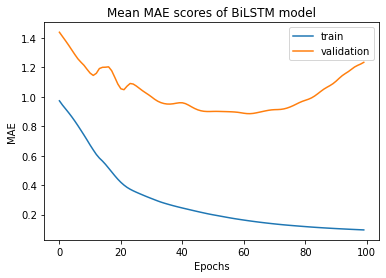

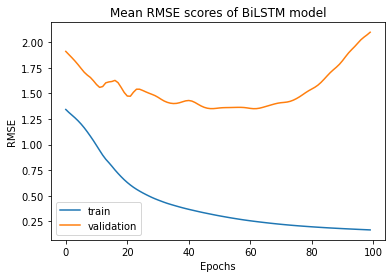

In [40]:
# results_rak
visualize_performance(results_rak)

Optimal Mean MAE: 0.7327585905790329 @ epoch 99
Optimal Mean RMSE: 1.1691561400890351 @ epoch 99


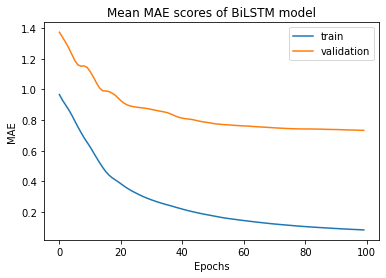

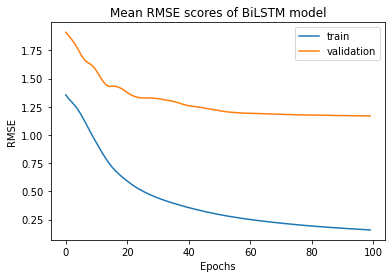

In [41]:
visualize_performance(results_wall)

Optimal Mean MAE: 0.7224365472793579 @ epoch 95
Optimal Mean RMSE: 1.2187684774398804 @ epoch 93


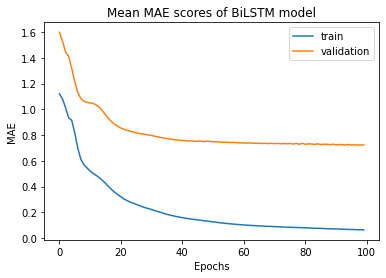

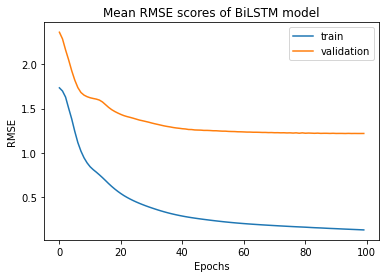

In [45]:
visualize_performance(results_total[1])

### Tacheometry Only

In [46]:
results_tcmt_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True)
results_tcmt_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True)
results_tcmt_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.9650 - mean_absolute_error: 1.9812 - root_mean_squared_error: 2.6391 - val_loss: 11.3798 - val_mean_absolute_error: 2.7459 - val_root_mean_squared_error: 3.3734
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 6.7236 - mean_absolute_error: 1.9343 - root_mean_squared_error: 2.5930 - val_loss: 11.1149 - val_mean_absolute_error: 2.7093 - val_root_mean_squared_error: 3.3339
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 6.5063 - mean_absolute_error: 1.8907 - root_mean_squared_error: 2.5507 - val_loss: 10.8614 - val_mean_absolute_error: 2.6736 - val_root_mean_squared_error: 3.2957
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 6.3010 - mean_absolute_error: 1.8480 - root_mean_squared_error: 2.5102 - val_loss: 10.6039 - val_mean_absolute_error: 2.6364 - val_root_mean_squared_error: 3.2564
Epoch 5/100
1/1 [==============================] - 0s 40ms/ste

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7662 - mean_absolute_error: 0.5716 - root_mean_squared_error: 0.8753 - val_loss: 14.1925 - val_mean_absolute_error: 2.5861 - val_root_mean_squared_error: 3.7673
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7460 - mean_absolute_error: 0.5619 - root_mean_squared_error: 0.8637 - val_loss: 14.2196 - val_mean_absolute_error: 2.5902 - val_root_mean_squared_error: 3.7709
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7183 - mean_absolute_error: 0.5480 - root_mean_squared_error: 0.8475 - val_loss: 14.0334 - val_mean_absolute_error: 2.5790 - val_root_mean_squared_error: 3.7461
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6881 - mean_absolute_error: 0.5319 - root_mean_squared_error: 0.8295 - val_loss: 13.8129 - val_mean_absolute_error: 2.5634 - val_root_mean_squared_error: 3.7166
Epoch 40/100
1/1 [==============================] - 0s 5

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2730 - mean_absolute_error: 0.2812 - root_mean_squared_error: 0.5225 - val_loss: 10.3587 - val_mean_absolute_error: 2.1933 - val_root_mean_squared_error: 3.2185
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2683 - mean_absolute_error: 0.2778 - root_mean_squared_error: 0.5180 - val_loss: 10.2969 - val_mean_absolute_error: 2.1879 - val_root_mean_squared_error: 3.2089
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2637 - mean_absolute_error: 0.2739 - root_mean_squared_error: 0.5135 - val_loss: 10.2436 - val_mean_absolute_error: 2.1833 - val_root_mean_squared_error: 3.2006
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2592 - mean_absolute_error: 0.2701 - root_mean_squared_error: 0.5091 - val_loss: 10.2143 - val_mean_absolute_error: 2.1806 - val_root_mean_squared_error: 3.1960
Epoch 75/100
1/1 [==============================] - 0s 4

  5%|████▏                                                                              | 1/20 [00:07<02:21,  7.43s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1862 - mean_absolute_error: 0.8103 - root_mean_squared_error: 1.0891 - val_loss: 2.3196 - val_mean_absolute_error: 1.1454 - val_root_mean_squared_error: 1.5230
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1315 - mean_absolute_error: 0.7835 - root_mean_squared_error: 1.0637 - val_loss: 2.2402 - val_mean_absolute_error: 1.1181 - val_root_mean_squared_error: 1.4967
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0802 - mean_absolute_error: 0.7581 - root_mean_squared_error: 1.0393 - val_loss: 2.1607 - val_mean_absolute_error: 1.0905 - val_root_mean_squared_error: 1.4699
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0296 - mean_absolute_error: 0.7326 - root_mean_squared_error: 1.0147 - val_loss: 2.0779 - val_mean_absolute_error: 1.0610 - val_root_mean_squared_error: 1.4415
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0560 - mean_absolute_error: 0.1591 - root_mean_squared_error: 0.2366 - val_loss: 0.3101 - val_mean_absolute_error: 0.4026 - val_root_mean_squared_error: 0.5569
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0531 - mean_absolute_error: 0.1550 - root_mean_squared_error: 0.2303 - val_loss: 0.2991 - val_mean_absolute_error: 0.3946 - val_root_mean_squared_error: 0.5469
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0506 - mean_absolute_error: 0.1514 - root_mean_squared_error: 0.2250 - val_loss: 0.2899 - val_mean_absolute_error: 0.3881 - val_root_mean_squared_error: 0.5384
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0484 - mean_absolute_error: 0.1478 - root_mean_squared_error: 0.2201 - val_loss: 0.2821 - val_mean_absolute_error: 0.3828 - val_root_mean_squared_error: 0.5311
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0101 - mean_absolute_error: 0.0649 - root_mean_squared_error: 0.1003 - val_loss: 0.2061 - val_mean_absolute_error: 0.3025 - val_root_mean_squared_error: 0.4540
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0097 - mean_absolute_error: 0.0635 - root_mean_squared_error: 0.0983 - val_loss: 0.2052 - val_mean_absolute_error: 0.3010 - val_root_mean_squared_error: 0.4530
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0093 - mean_absolute_error: 0.0621 - root_mean_squared_error: 0.0964 - val_loss: 0.2044 - val_mean_absolute_error: 0.2997 - val_root_mean_squared_error: 0.4521
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0090 - mean_absolute_error: 0.0609 - root_mean_squared_error: 0.0947 - val_loss: 0.2036 - val_mean_absolute_error: 0.2987 - val_root_mean_squared_error: 0.4512
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 10%|████████▎                                                                          | 2/20 [00:13<02:02,  6.82s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.9802 - mean_absolute_error: 1.0049 - root_mean_squared_error: 1.4072 - val_loss: 1.9176 - val_mean_absolute_error: 1.1049 - val_root_mean_squared_error: 1.3848
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.9018 - mean_absolute_error: 0.9764 - root_mean_squared_error: 1.3791 - val_loss: 1.8281 - val_mean_absolute_error: 1.0754 - val_root_mean_squared_error: 1.3521
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 1.8259 - mean_absolute_error: 0.9486 - root_mean_squared_error: 1.3513 - val_loss: 1.7392 - val_mean_absolute_error: 1.0456 - val_root_mean_squared_error: 1.3188
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.7499 - mean_absolute_error: 0.9203 - root_mean_squared_error: 1.3228 - val_loss: 1.6480 - val_mean_absolute_error: 1.0142 - val_root_mean_squared_error: 1.2838
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2107 - mean_absolute_error: 0.2841 - root_mean_squared_error: 0.4590 - val_loss: 0.6290 - val_mean_absolute_error: 0.5997 - val_root_mean_squared_error: 0.7931
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2013 - mean_absolute_error: 0.2798 - root_mean_squared_error: 0.4487 - val_loss: 0.6273 - val_mean_absolute_error: 0.6002 - val_root_mean_squared_error: 0.7920
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1927 - mean_absolute_error: 0.2757 - root_mean_squared_error: 0.4390 - val_loss: 0.6244 - val_mean_absolute_error: 0.6004 - val_root_mean_squared_error: 0.7902
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1851 - mean_absolute_error: 0.2725 - root_mean_squared_error: 0.4302 - val_loss: 0.6206 - val_mean_absolute_error: 0.6006 - val_root_mean_squared_error: 0.7878
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0316 - mean_absolute_error: 0.1223 - root_mean_squared_error: 0.1777 - val_loss: 0.3045 - val_mean_absolute_error: 0.3911 - val_root_mean_squared_error: 0.5518
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0291 - mean_absolute_error: 0.1178 - root_mean_squared_error: 0.1706 - val_loss: 0.2967 - val_mean_absolute_error: 0.3846 - val_root_mean_squared_error: 0.5447
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0269 - mean_absolute_error: 0.1138 - root_mean_squared_error: 0.1640 - val_loss: 0.2893 - val_mean_absolute_error: 0.3786 - val_root_mean_squared_error: 0.5378
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0249 - mean_absolute_error: 0.1099 - root_mean_squared_error: 0.1579 - val_loss: 0.2821 - val_mean_absolute_error: 0.3727 - val_root_mean_squared_error: 0.5312
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 15%|████████████▍                                                                      | 3/20 [00:20<01:57,  6.92s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.1703 - mean_absolute_error: 0.9782 - root_mean_squared_error: 1.4732 - val_loss: 3.7638 - val_mean_absolute_error: 1.3082 - val_root_mean_squared_error: 1.9401
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.1186 - mean_absolute_error: 0.9599 - root_mean_squared_error: 1.4555 - val_loss: 3.6612 - val_mean_absolute_error: 1.2813 - val_root_mean_squared_error: 1.9134
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 2.0684 - mean_absolute_error: 0.9426 - root_mean_squared_error: 1.4382 - val_loss: 3.5576 - val_mean_absolute_error: 1.2532 - val_root_mean_squared_error: 1.8861
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 2.0180 - mean_absolute_error: 0.9250 - root_mean_squared_error: 1.4206 - val_loss: 3.4491 - val_mean_absolute_error: 1.2221 - val_root_mean_squared_error: 1.8572
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1548 - mean_absolute_error: 0.2656 - root_mean_squared_error: 0.3934 - val_loss: 1.8625 - val_mean_absolute_error: 0.5904 - val_root_mean_squared_error: 1.3647
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1482 - mean_absolute_error: 0.2621 - root_mean_squared_error: 0.3850 - val_loss: 1.8458 - val_mean_absolute_error: 0.5834 - val_root_mean_squared_error: 1.3586
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1399 - mean_absolute_error: 0.2563 - root_mean_squared_error: 0.3741 - val_loss: 1.8800 - val_mean_absolute_error: 0.5921 - val_root_mean_squared_error: 1.3711
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1309 - mean_absolute_error: 0.2481 - root_mean_squared_error: 0.3618 - val_loss: 1.9411 - val_mean_absolute_error: 0.6105 - val_root_mean_squared_error: 1.3932
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0046 - mean_absolute_error: 0.0468 - root_mean_squared_error: 0.0680 - val_loss: 0.8001 - val_mean_absolute_error: 0.2819 - val_root_mean_squared_error: 0.8945
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0043 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0657 - val_loss: 0.7969 - val_mean_absolute_error: 0.2819 - val_root_mean_squared_error: 0.8927
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0041 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0641 - val_loss: 0.7939 - val_mean_absolute_error: 0.2821 - val_root_mean_squared_error: 0.8910
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0040 - mean_absolute_error: 0.0467 - root_mean_squared_error: 0.0635 - val_loss: 0.7904 - val_mean_absolute_error: 0.2831 - val_root_mean_squared_error: 0.8890
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 20%|████████████████▌                                                                  | 4/20 [00:27<01:47,  6.72s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.2476 - mean_absolute_error: 1.5507 - root_mean_squared_error: 2.0610 - val_loss: 2.7666 - val_mean_absolute_error: 1.3591 - val_root_mean_squared_error: 1.6633
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 4.0397 - mean_absolute_error: 1.4948 - root_mean_squared_error: 2.0099 - val_loss: 2.5620 - val_mean_absolute_error: 1.3004 - val_root_mean_squared_error: 1.6006
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 3.8551 - mean_absolute_error: 1.4447 - root_mean_squared_error: 1.9634 - val_loss: 2.3792 - val_mean_absolute_error: 1.2443 - val_root_mean_squared_error: 1.5425
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 3.6804 - mean_absolute_error: 1.3968 - root_mean_squared_error: 1.9184 - val_loss: 2.2108 - val_mean_absolute_error: 1.1899 - val_root_mean_squared_error: 1.4869
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2012 - mean_absolute_error: 0.3283 - root_mean_squared_error: 0.4485 - val_loss: 0.8480 - val_mean_absolute_error: 0.7114 - val_root_mean_squared_error: 0.9209
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1856 - mean_absolute_error: 0.3149 - root_mean_squared_error: 0.4309 - val_loss: 0.8513 - val_mean_absolute_error: 0.7092 - val_root_mean_squared_error: 0.9227
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1719 - mean_absolute_error: 0.3023 - root_mean_squared_error: 0.4146 - val_loss: 0.8597 - val_mean_absolute_error: 0.7083 - val_root_mean_squared_error: 0.9272
Epoch 39/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1598 - mean_absolute_error: 0.2909 - root_mean_squared_error: 0.3997 - val_loss: 0.8744 - val_mean_absolute_error: 0.7093 - val_root_mean_squared_error: 0.9351
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0338 - mean_absolute_error: 0.1207 - root_mean_squared_error: 0.1838 - val_loss: 0.4273 - val_mean_absolute_error: 0.4762 - val_root_mean_squared_error: 0.6537
Epoch 72/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0327 - mean_absolute_error: 0.1188 - root_mean_squared_error: 0.1808 - val_loss: 0.4186 - val_mean_absolute_error: 0.4710 - val_root_mean_squared_error: 0.6470
Epoch 73/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0317 - mean_absolute_error: 0.1169 - root_mean_squared_error: 0.1781 - val_loss: 0.4109 - val_mean_absolute_error: 0.4662 - val_root_mean_squared_error: 0.6410
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0308 - mean_absolute_error: 0.1151 - root_mean_squared_error: 0.1755 - val_loss: 0.4045 - val_mean_absolute_error: 0.4619 - val_root_mean_squared_error: 0.6360
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 25%|████████████████████▊                                                              | 5/20 [00:33<01:38,  6.54s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.3403 - mean_absolute_error: 0.9257 - root_mean_squared_error: 1.1577 - val_loss: 2.4350 - val_mean_absolute_error: 1.0708 - val_root_mean_squared_error: 1.5605
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 1.2692 - mean_absolute_error: 0.8934 - root_mean_squared_error: 1.1266 - val_loss: 2.3748 - val_mean_absolute_error: 1.0510 - val_root_mean_squared_error: 1.5410
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.2032 - mean_absolute_error: 0.8631 - root_mean_squared_error: 1.0969 - val_loss: 2.3169 - val_mean_absolute_error: 1.0324 - val_root_mean_squared_error: 1.5221
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 1.1397 - mean_absolute_error: 0.8335 - root_mean_squared_error: 1.0676 - val_loss: 2.2599 - val_mean_absolute_error: 1.0146 - val_root_mean_squared_error: 1.5033
Epoch 5/100
1/1 [==============================] - 0s 26ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1457 - mean_absolute_error: 0.2656 - root_mean_squared_error: 0.3816 - val_loss: 1.6397 - val_mean_absolute_error: 0.7757 - val_root_mean_squared_error: 1.2805
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1378 - mean_absolute_error: 0.2574 - root_mean_squared_error: 0.3713 - val_loss: 1.6440 - val_mean_absolute_error: 0.7761 - val_root_mean_squared_error: 1.2822
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1303 - mean_absolute_error: 0.2493 - root_mean_squared_error: 0.3609 - val_loss: 1.6484 - val_mean_absolute_error: 0.7768 - val_root_mean_squared_error: 1.2839
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1230 - mean_absolute_error: 0.2413 - root_mean_squared_error: 0.3507 - val_loss: 1.6526 - val_mean_absolute_error: 0.7776 - val_root_mean_squared_error: 1.2855
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0123 - mean_absolute_error: 0.0817 - root_mean_squared_error: 0.1108 - val_loss: 1.7133 - val_mean_absolute_error: 0.7338 - val_root_mean_squared_error: 1.3089
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0115 - mean_absolute_error: 0.0788 - root_mean_squared_error: 0.1070 - val_loss: 1.7118 - val_mean_absolute_error: 0.7313 - val_root_mean_squared_error: 1.3083
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0107 - mean_absolute_error: 0.0759 - root_mean_squared_error: 0.1034 - val_loss: 1.7101 - val_mean_absolute_error: 0.7290 - val_root_mean_squared_error: 1.3077
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0099 - mean_absolute_error: 0.0730 - root_mean_squared_error: 0.0997 - val_loss: 1.7085 - val_mean_absolute_error: 0.7270 - val_root_mean_squared_error: 1.3071
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 30%|████████████████████████▉                                                          | 6/20 [00:38<01:26,  6.18s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.3828 - mean_absolute_error: 0.4672 - root_mean_squared_error: 0.6187 - val_loss: 1.2606 - val_mean_absolute_error: 0.8157 - val_root_mean_squared_error: 1.1228
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3721 - mean_absolute_error: 0.4595 - root_mean_squared_error: 0.6100 - val_loss: 1.2374 - val_mean_absolute_error: 0.8070 - val_root_mean_squared_error: 1.1124
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3619 - mean_absolute_error: 0.4521 - root_mean_squared_error: 0.6016 - val_loss: 1.2148 - val_mean_absolute_error: 0.7985 - val_root_mean_squared_error: 1.1022
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3520 - mean_absolute_error: 0.4448 - root_mean_squared_error: 0.5933 - val_loss: 1.1921 - val_mean_absolute_error: 0.7901 - val_root_mean_squared_error: 1.0919
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0994 - mean_absolute_error: 0.2319 - root_mean_squared_error: 0.3152 - val_loss: 0.5325 - val_mean_absolute_error: 0.5511 - val_root_mean_squared_error: 0.7298
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0980 - mean_absolute_error: 0.2303 - root_mean_squared_error: 0.3131 - val_loss: 0.5390 - val_mean_absolute_error: 0.5549 - val_root_mean_squared_error: 0.7342
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0967 - mean_absolute_error: 0.2285 - root_mean_squared_error: 0.3110 - val_loss: 0.5416 - val_mean_absolute_error: 0.5567 - val_root_mean_squared_error: 0.7360
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0952 - mean_absolute_error: 0.2265 - root_mean_squared_error: 0.3086 - val_loss: 0.5384 - val_mean_absolute_error: 0.5562 - val_root_mean_squared_error: 0.7338
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0386 - mean_absolute_error: 0.1345 - root_mean_squared_error: 0.1966 - val_loss: 1.2166 - val_mean_absolute_error: 0.6254 - val_root_mean_squared_error: 1.1030
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0374 - mean_absolute_error: 0.1317 - root_mean_squared_error: 0.1934 - val_loss: 1.2474 - val_mean_absolute_error: 0.6295 - val_root_mean_squared_error: 1.1169
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0362 - mean_absolute_error: 0.1291 - root_mean_squared_error: 0.1903 - val_loss: 1.2651 - val_mean_absolute_error: 0.6303 - val_root_mean_squared_error: 1.1248
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0351 - mean_absolute_error: 0.1264 - root_mean_squared_error: 0.1873 - val_loss: 1.2494 - val_mean_absolute_error: 0.6231 - val_root_mean_squared_error: 1.1177
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 35%|█████████████████████████████                                                      | 7/20 [00:44<01:16,  5.86s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.0366 - mean_absolute_error: 0.7428 - root_mean_squared_error: 1.0182 - val_loss: 2.0052 - val_mean_absolute_error: 1.0633 - val_root_mean_squared_error: 1.4161
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.0054 - mean_absolute_error: 0.7284 - root_mean_squared_error: 1.0027 - val_loss: 1.9600 - val_mean_absolute_error: 1.0477 - val_root_mean_squared_error: 1.4000
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.9754 - mean_absolute_error: 0.7143 - root_mean_squared_error: 0.9876 - val_loss: 1.9167 - val_mean_absolute_error: 1.0328 - val_root_mean_squared_error: 1.3844
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.9456 - mean_absolute_error: 0.7002 - root_mean_squared_error: 0.9724 - val_loss: 1.8745 - val_mean_absolute_error: 1.0192 - val_root_mean_squared_error: 1.3691
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1241 - mean_absolute_error: 0.2402 - root_mean_squared_error: 0.3523 - val_loss: 1.4813 - val_mean_absolute_error: 0.8089 - val_root_mean_squared_error: 1.2171
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1207 - mean_absolute_error: 0.2355 - root_mean_squared_error: 0.3475 - val_loss: 1.4219 - val_mean_absolute_error: 0.7822 - val_root_mean_squared_error: 1.1924
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1173 - mean_absolute_error: 0.2311 - root_mean_squared_error: 0.3425 - val_loss: 1.3622 - val_mean_absolute_error: 0.7536 - val_root_mean_squared_error: 1.1672
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1145 - mean_absolute_error: 0.2277 - root_mean_squared_error: 0.3384 - val_loss: 1.3104 - val_mean_absolute_error: 0.7273 - val_root_mean_squared_error: 1.1447
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0848 - mean_absolute_error: 0.1807 - root_mean_squared_error: 0.2913 - val_loss: 1.0895 - val_mean_absolute_error: 0.6186 - val_root_mean_squared_error: 1.0438
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0842 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.2902 - val_loss: 1.0815 - val_mean_absolute_error: 0.6143 - val_root_mean_squared_error: 1.0399
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0836 - mean_absolute_error: 0.1780 - root_mean_squared_error: 0.2892 - val_loss: 1.0747 - val_mean_absolute_error: 0.6108 - val_root_mean_squared_error: 1.0367
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0830 - mean_absolute_error: 0.1769 - root_mean_squared_error: 0.2882 - val_loss: 1.0694 - val_mean_absolute_error: 0.6083 - val_root_mean_squared_error: 1.0341
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:49<01:08,  5.70s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.1743 - mean_absolute_error: 1.3017 - root_mean_squared_error: 2.0431 - val_loss: 14.5028 - val_mean_absolute_error: 2.8329 - val_root_mean_squared_error: 3.8083
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 4.0894 - mean_absolute_error: 1.2802 - root_mean_squared_error: 2.0222 - val_loss: 14.2036 - val_mean_absolute_error: 2.7946 - val_root_mean_squared_error: 3.7688
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 4.0044 - mean_absolute_error: 1.2586 - root_mean_squared_error: 2.0011 - val_loss: 13.9041 - val_mean_absolute_error: 2.7565 - val_root_mean_squared_error: 3.7288
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 3.9146 - mean_absolute_error: 1.2355 - root_mean_squared_error: 1.9785 - val_loss: 13.5916 - val_mean_absolute_error: 2.7175 - val_root_mean_squared_error: 3.6867
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7543 - mean_absolute_error: 0.5766 - root_mean_squared_error: 0.8685 - val_loss: 8.3614 - val_mean_absolute_error: 2.1418 - val_root_mean_squared_error: 2.8916
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.7259 - mean_absolute_error: 0.5659 - root_mean_squared_error: 0.8520 - val_loss: 8.5892 - val_mean_absolute_error: 2.1651 - val_root_mean_squared_error: 2.9307
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6976 - mean_absolute_error: 0.5548 - root_mean_squared_error: 0.8352 - val_loss: 8.9257 - val_mean_absolute_error: 2.1991 - val_root_mean_squared_error: 2.9876
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.6709 - mean_absolute_error: 0.5442 - root_mean_squared_error: 0.8191 - val_loss: 9.3528 - val_mean_absolute_error: 2.2410 - val_root_mean_squared_error: 3.0582
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3304 - mean_absolute_error: 0.3448 - root_mean_squared_error: 0.5748 - val_loss: 11.3274 - val_mean_absolute_error: 2.4278 - val_root_mean_squared_error: 3.3656
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3254 - mean_absolute_error: 0.3410 - root_mean_squared_error: 0.5704 - val_loss: 11.4683 - val_mean_absolute_error: 2.4423 - val_root_mean_squared_error: 3.3865
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3207 - mean_absolute_error: 0.3375 - root_mean_squared_error: 0.5663 - val_loss: 11.6005 - val_mean_absolute_error: 2.4557 - val_root_mean_squared_error: 3.4060
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3161 - mean_absolute_error: 0.3339 - root_mean_squared_error: 0.5622 - val_loss: 11.6992 - val_mean_absolute_error: 2.4657 - val_root_mean_squared_error: 3.4204
Epoch 75/100
1/1 [==============================] - 0s 3

 45%|█████████████████████████████████████▎                                             | 9/20 [00:54<01:01,  5.58s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9502 - mean_absolute_error: 0.6255 - root_mean_squared_error: 0.9748 - val_loss: 2.9502 - val_mean_absolute_error: 1.1552 - val_root_mean_squared_error: 1.7176
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9251 - mean_absolute_error: 0.6105 - root_mean_squared_error: 0.9618 - val_loss: 2.9091 - val_mean_absolute_error: 1.1400 - val_root_mean_squared_error: 1.7056
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.9003 - mean_absolute_error: 0.5966 - root_mean_squared_error: 0.9488 - val_loss: 2.8679 - val_mean_absolute_error: 1.1245 - val_root_mean_squared_error: 1.6935
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8746 - mean_absolute_error: 0.5825 - root_mean_squared_error: 0.9352 - val_loss: 2.8250 - val_mean_absolute_error: 1.1075 - val_root_mean_squared_error: 1.6808
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0585 - mean_absolute_error: 0.1452 - root_mean_squared_error: 0.2418 - val_loss: 2.1789 - val_mean_absolute_error: 0.8080 - val_root_mean_squared_error: 1.4761
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0530 - mean_absolute_error: 0.1396 - root_mean_squared_error: 0.2302 - val_loss: 2.1842 - val_mean_absolute_error: 0.8100 - val_root_mean_squared_error: 1.4779
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0486 - mean_absolute_error: 0.1356 - root_mean_squared_error: 0.2204 - val_loss: 2.1698 - val_mean_absolute_error: 0.8033 - val_root_mean_squared_error: 1.4730
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0444 - mean_absolute_error: 0.1316 - root_mean_squared_error: 0.2107 - val_loss: 2.1325 - val_mean_absolute_error: 0.7872 - val_root_mean_squared_error: 1.4603
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0023 - mean_absolute_error: 0.0340 - root_mean_squared_error: 0.0480 - val_loss: 1.7049 - val_mean_absolute_error: 0.6134 - val_root_mean_squared_error: 1.3057
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0022 - mean_absolute_error: 0.0332 - root_mean_squared_error: 0.0472 - val_loss: 1.7032 - val_mean_absolute_error: 0.6128 - val_root_mean_squared_error: 1.3051
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mean_absolute_error: 0.0327 - root_mean_squared_error: 0.0464 - val_loss: 1.7029 - val_mean_absolute_error: 0.6114 - val_root_mean_squared_error: 1.3049
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0021 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0454 - val_loss: 1.7035 - val_mean_absolute_error: 0.6095 - val_root_mean_squared_error: 1.3052
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:00<00:57,  5.75s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.0151 - mean_absolute_error: 1.6788 - root_mean_squared_error: 2.2394 - val_loss: 8.8140 - val_mean_absolute_error: 2.2370 - val_root_mean_squared_error: 2.9688
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 4.8254 - mean_absolute_error: 1.6379 - root_mean_squared_error: 2.1967 - val_loss: 8.4536 - val_mean_absolute_error: 2.1770 - val_root_mean_squared_error: 2.9075
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 4.6340 - mean_absolute_error: 1.5953 - root_mean_squared_error: 2.1527 - val_loss: 8.0516 - val_mean_absolute_error: 2.1076 - val_root_mean_squared_error: 2.8375
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 4.4146 - mean_absolute_error: 1.5455 - root_mean_squared_error: 2.1011 - val_loss: 7.5703 - val_mean_absolute_error: 2.0262 - val_root_mean_squared_error: 2.7514
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2038 - mean_absolute_error: 0.3184 - root_mean_squared_error: 0.4515 - val_loss: 1.9691 - val_mean_absolute_error: 0.9429 - val_root_mean_squared_error: 1.4032
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1946 - mean_absolute_error: 0.3097 - root_mean_squared_error: 0.4412 - val_loss: 1.9587 - val_mean_absolute_error: 0.9411 - val_root_mean_squared_error: 1.3995
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1862 - mean_absolute_error: 0.3021 - root_mean_squared_error: 0.4315 - val_loss: 1.9224 - val_mean_absolute_error: 0.9314 - val_root_mean_squared_error: 1.3865
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1780 - mean_absolute_error: 0.2945 - root_mean_squared_error: 0.4219 - val_loss: 1.8648 - val_mean_absolute_error: 0.9157 - val_root_mean_squared_error: 1.3656
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0552 - mean_absolute_error: 0.1475 - root_mean_squared_error: 0.2350 - val_loss: 1.3286 - val_mean_absolute_error: 0.7621 - val_root_mean_squared_error: 1.1526
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0537 - mean_absolute_error: 0.1452 - root_mean_squared_error: 0.2317 - val_loss: 1.3242 - val_mean_absolute_error: 0.7613 - val_root_mean_squared_error: 1.1507
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0521 - mean_absolute_error: 0.1428 - root_mean_squared_error: 0.2284 - val_loss: 1.3175 - val_mean_absolute_error: 0.7598 - val_root_mean_squared_error: 1.1478
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0507 - mean_absolute_error: 0.1404 - root_mean_squared_error: 0.2251 - val_loss: 1.3088 - val_mean_absolute_error: 0.7579 - val_root_mean_squared_error: 1.1440
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:06<00:51,  5.69s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.1595 - mean_absolute_error: 2.1417 - root_mean_squared_error: 2.8565 - val_loss: 11.4204 - val_mean_absolute_error: 2.5599 - val_root_mean_squared_error: 3.3794
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 7.5826 - mean_absolute_error: 2.0404 - root_mean_squared_error: 2.7537 - val_loss: 10.8653 - val_mean_absolute_error: 2.4805 - val_root_mean_squared_error: 3.2963
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 7.1744 - mean_absolute_error: 1.9702 - root_mean_squared_error: 2.6785 - val_loss: 10.3531 - val_mean_absolute_error: 2.4050 - val_root_mean_squared_error: 3.2176
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 6.7400 - mean_absolute_error: 1.8927 - root_mean_squared_error: 2.5962 - val_loss: 9.7681 - val_mean_absolute_error: 2.3170 - val_root_mean_squared_error: 3.1254
Epoch 5/100
1/1 [==============================] - 0s 41ms/step

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3768 - mean_absolute_error: 0.4104 - root_mean_squared_error: 0.6138 - val_loss: 3.0515 - val_mean_absolute_error: 1.2744 - val_root_mean_squared_error: 1.7469
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3571 - mean_absolute_error: 0.4002 - root_mean_squared_error: 0.5975 - val_loss: 3.0182 - val_mean_absolute_error: 1.2655 - val_root_mean_squared_error: 1.7373
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3386 - mean_absolute_error: 0.3905 - root_mean_squared_error: 0.5819 - val_loss: 2.9855 - val_mean_absolute_error: 1.2569 - val_root_mean_squared_error: 1.7278
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3214 - mean_absolute_error: 0.3806 - root_mean_squared_error: 0.5669 - val_loss: 2.9551 - val_mean_absolute_error: 1.2492 - val_root_mean_squared_error: 1.7190
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0799 - mean_absolute_error: 0.1854 - root_mean_squared_error: 0.2827 - val_loss: 2.4231 - val_mean_absolute_error: 1.1325 - val_root_mean_squared_error: 1.5566
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0776 - mean_absolute_error: 0.1825 - root_mean_squared_error: 0.2785 - val_loss: 2.4152 - val_mean_absolute_error: 1.1303 - val_root_mean_squared_error: 1.5541
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0753 - mean_absolute_error: 0.1797 - root_mean_squared_error: 0.2743 - val_loss: 2.4073 - val_mean_absolute_error: 1.1281 - val_root_mean_squared_error: 1.5515
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0730 - mean_absolute_error: 0.1770 - root_mean_squared_error: 0.2702 - val_loss: 2.3991 - val_mean_absolute_error: 1.1256 - val_root_mean_squared_error: 1.5489
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:12<00:45,  5.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2421 - mean_absolute_error: 0.3795 - root_mean_squared_error: 0.4920 - val_loss: 0.4512 - val_mean_absolute_error: 0.5216 - val_root_mean_squared_error: 0.6717
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2307 - mean_absolute_error: 0.3673 - root_mean_squared_error: 0.4803 - val_loss: 0.4256 - val_mean_absolute_error: 0.5011 - val_root_mean_squared_error: 0.6524
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2198 - mean_absolute_error: 0.3553 - root_mean_squared_error: 0.4688 - val_loss: 0.3993 - val_mean_absolute_error: 0.4793 - val_root_mean_squared_error: 0.6319
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2085 - mean_absolute_error: 0.3426 - root_mean_squared_error: 0.4567 - val_loss: 0.3710 - val_mean_absolute_error: 0.4557 - val_root_mean_squared_error: 0.6091
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0068 - mean_absolute_error: 0.0590 - root_mean_squared_error: 0.0823 - val_loss: 0.0220 - val_mean_absolute_error: 0.1011 - val_root_mean_squared_error: 0.1482
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0063 - mean_absolute_error: 0.0570 - root_mean_squared_error: 0.0793 - val_loss: 0.0197 - val_mean_absolute_error: 0.0960 - val_root_mean_squared_error: 0.1404
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0058 - mean_absolute_error: 0.0546 - root_mean_squared_error: 0.0762 - val_loss: 0.0187 - val_mean_absolute_error: 0.0944 - val_root_mean_squared_error: 0.1369
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0053 - mean_absolute_error: 0.0520 - root_mean_squared_error: 0.0728 - val_loss: 0.0188 - val_mean_absolute_error: 0.0956 - val_root_mean_squared_error: 0.1370
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 2.6064e-04 - mean_absolute_error: 0.0116 - root_mean_squared_error: 0.0161 - val_loss: 0.0014 - val_mean_absolute_error: 0.0288 - val_root_mean_squared_error: 0.0372
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 2.4369e-04 - mean_absolute_error: 0.0112 - root_mean_squared_error: 0.0156 - val_loss: 0.0014 - val_mean_absolute_error: 0.0288 - val_root_mean_squared_error: 0.0370
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 2.3220e-04 - mean_absolute_error: 0.0109 - root_mean_squared_error: 0.0152 - val_loss: 0.0014 - val_mean_absolute_error: 0.0289 - val_root_mean_squared_error: 0.0370
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 2.2436e-04 - mean_absolute_error: 0.0107 - root_mean_squared_error: 0.0150 - val_loss: 0.0014 - val_mean_absolute_error: 0.0290 - val_root_mean_squared_error: 0.0371
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:19<00:43,  6.18s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8173 - mean_absolute_error: 0.8205 - root_mean_squared_error: 1.3481 - val_loss: 9.8229 - val_mean_absolute_error: 2.2831 - val_root_mean_squared_error: 3.1341
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.7922 - mean_absolute_error: 0.8115 - root_mean_squared_error: 1.3387 - val_loss: 9.7086 - val_mean_absolute_error: 2.2635 - val_root_mean_squared_error: 3.1159
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 1.7682 - mean_absolute_error: 0.8028 - root_mean_squared_error: 1.3297 - val_loss: 9.5943 - val_mean_absolute_error: 2.2438 - val_root_mean_squared_error: 3.0975
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.7446 - mean_absolute_error: 0.7942 - root_mean_squared_error: 1.3208 - val_loss: 9.4751 - val_mean_absolute_error: 2.2237 - val_root_mean_squared_error: 3.0782
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4995 - mean_absolute_error: 0.4791 - root_mean_squared_error: 0.7068 - val_loss: 10.2497 - val_mean_absolute_error: 2.2400 - val_root_mean_squared_error: 3.2015
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4874 - mean_absolute_error: 0.4736 - root_mean_squared_error: 0.6982 - val_loss: 9.7424 - val_mean_absolute_error: 2.1822 - val_root_mean_squared_error: 3.1213
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.4793 - mean_absolute_error: 0.4704 - root_mean_squared_error: 0.6923 - val_loss: 9.5297 - val_mean_absolute_error: 2.1540 - val_root_mean_squared_error: 3.0870
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4708 - mean_absolute_error: 0.4676 - root_mean_squared_error: 0.6862 - val_loss: 9.5924 - val_mean_absolute_error: 2.1526 - val_root_mean_squared_error: 3.0972
Epoch 40/100
1/1 [==============================] - 0s 41ms

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1872 - mean_absolute_error: 0.2874 - root_mean_squared_error: 0.4327 - val_loss: 4.9380 - val_mean_absolute_error: 1.5962 - val_root_mean_squared_error: 2.2222
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1830 - mean_absolute_error: 0.2835 - root_mean_squared_error: 0.4277 - val_loss: 4.8846 - val_mean_absolute_error: 1.5863 - val_root_mean_squared_error: 2.2101
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1784 - mean_absolute_error: 0.2791 - root_mean_squared_error: 0.4223 - val_loss: 4.8566 - val_mean_absolute_error: 1.5802 - val_root_mean_squared_error: 2.2038
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1743 - mean_absolute_error: 0.2751 - root_mean_squared_error: 0.4175 - val_loss: 4.7919 - val_mean_absolute_error: 1.5690 - val_root_mean_squared_error: 2.1890
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:26<00:39,  6.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6825 - mean_absolute_error: 0.5826 - root_mean_squared_error: 0.8261 - val_loss: 1.1567 - val_mean_absolute_error: 0.7523 - val_root_mean_squared_error: 1.0755
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6496 - mean_absolute_error: 0.5627 - root_mean_squared_error: 0.8060 - val_loss: 1.1154 - val_mean_absolute_error: 0.7358 - val_root_mean_squared_error: 1.0561
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.6196 - mean_absolute_error: 0.5448 - root_mean_squared_error: 0.7872 - val_loss: 1.0750 - val_mean_absolute_error: 0.7195 - val_root_mean_squared_error: 1.0368
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.5909 - mean_absolute_error: 0.5277 - root_mean_squared_error: 0.7687 - val_loss: 1.0341 - val_mean_absolute_error: 0.7034 - val_root_mean_squared_error: 1.0169
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0475 - mean_absolute_error: 0.1407 - root_mean_squared_error: 0.2179 - val_loss: 0.1639 - val_mean_absolute_error: 0.2994 - val_root_mean_squared_error: 0.4048
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0459 - mean_absolute_error: 0.1377 - root_mean_squared_error: 0.2141 - val_loss: 0.1617 - val_mean_absolute_error: 0.2960 - val_root_mean_squared_error: 0.4022
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0441 - mean_absolute_error: 0.1344 - root_mean_squared_error: 0.2100 - val_loss: 0.1592 - val_mean_absolute_error: 0.2914 - val_root_mean_squared_error: 0.3990
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0424 - mean_absolute_error: 0.1311 - root_mean_squared_error: 0.2059 - val_loss: 0.1567 - val_mean_absolute_error: 0.2868 - val_root_mean_squared_error: 0.3959
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0138 - mean_absolute_error: 0.0709 - root_mean_squared_error: 0.1173 - val_loss: 0.1294 - val_mean_absolute_error: 0.2545 - val_root_mean_squared_error: 0.3597
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0133 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.1154 - val_loss: 0.1293 - val_mean_absolute_error: 0.2543 - val_root_mean_squared_error: 0.3596
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0129 - mean_absolute_error: 0.0684 - root_mean_squared_error: 0.1135 - val_loss: 0.1293 - val_mean_absolute_error: 0.2538 - val_root_mean_squared_error: 0.3595
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0124 - mean_absolute_error: 0.0673 - root_mean_squared_error: 0.1116 - val_loss: 0.1292 - val_mean_absolute_error: 0.2532 - val_root_mean_squared_error: 0.3595
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:34<00:33,  6.77s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8976 - mean_absolute_error: 0.7503 - root_mean_squared_error: 0.9474 - val_loss: 1.6072 - val_mean_absolute_error: 1.0071 - val_root_mean_squared_error: 1.2677
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8638 - mean_absolute_error: 0.7322 - root_mean_squared_error: 0.9294 - val_loss: 1.5611 - val_mean_absolute_error: 0.9882 - val_root_mean_squared_error: 1.2495
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8325 - mean_absolute_error: 0.7153 - root_mean_squared_error: 0.9124 - val_loss: 1.5191 - val_mean_absolute_error: 0.9708 - val_root_mean_squared_error: 1.2325
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8026 - mean_absolute_error: 0.6990 - root_mean_squared_error: 0.8959 - val_loss: 1.4789 - val_mean_absolute_error: 0.9537 - val_root_mean_squared_error: 1.2161
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1056 - mean_absolute_error: 0.1967 - root_mean_squared_error: 0.3249 - val_loss: 0.9858 - val_mean_absolute_error: 0.6445 - val_root_mean_squared_error: 0.9929
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1029 - mean_absolute_error: 0.1953 - root_mean_squared_error: 0.3208 - val_loss: 0.9906 - val_mean_absolute_error: 0.6467 - val_root_mean_squared_error: 0.9953
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1002 - mean_absolute_error: 0.1933 - root_mean_squared_error: 0.3166 - val_loss: 0.9972 - val_mean_absolute_error: 0.6501 - val_root_mean_squared_error: 0.9986
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0972 - mean_absolute_error: 0.1899 - root_mean_squared_error: 0.3118 - val_loss: 1.0059 - val_mean_absolute_error: 0.6548 - val_root_mean_squared_error: 1.0030
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0396 - mean_absolute_error: 0.1045 - root_mean_squared_error: 0.1990 - val_loss: 1.1694 - val_mean_absolute_error: 0.6554 - val_root_mean_squared_error: 1.0814
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0388 - mean_absolute_error: 0.1032 - root_mean_squared_error: 0.1970 - val_loss: 1.1699 - val_mean_absolute_error: 0.6550 - val_root_mean_squared_error: 1.0816
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0380 - mean_absolute_error: 0.1020 - root_mean_squared_error: 0.1950 - val_loss: 1.1706 - val_mean_absolute_error: 0.6544 - val_root_mean_squared_error: 1.0820
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0373 - mean_absolute_error: 0.1008 - root_mean_squared_error: 0.1931 - val_loss: 1.1721 - val_mean_absolute_error: 0.6542 - val_root_mean_squared_error: 1.0826
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:41<00:27,  6.95s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6904 - mean_absolute_error: 0.5987 - root_mean_squared_error: 0.8309 - val_loss: 3.9507 - val_mean_absolute_error: 1.4940 - val_root_mean_squared_error: 1.9876
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6679 - mean_absolute_error: 0.5841 - root_mean_squared_error: 0.8173 - val_loss: 3.8987 - val_mean_absolute_error: 1.4806 - val_root_mean_squared_error: 1.9745
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6464 - mean_absolute_error: 0.5699 - root_mean_squared_error: 0.8040 - val_loss: 3.8482 - val_mean_absolute_error: 1.4680 - val_root_mean_squared_error: 1.9617
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6253 - mean_absolute_error: 0.5561 - root_mean_squared_error: 0.7907 - val_loss: 3.7986 - val_mean_absolute_error: 1.4560 - val_root_mean_squared_error: 1.9490
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0719 - mean_absolute_error: 0.1609 - root_mean_squared_error: 0.2681 - val_loss: 3.3471 - val_mean_absolute_error: 1.2746 - val_root_mean_squared_error: 1.8295
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0691 - mean_absolute_error: 0.1556 - root_mean_squared_error: 0.2629 - val_loss: 3.2978 - val_mean_absolute_error: 1.2623 - val_root_mean_squared_error: 1.8160
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0667 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2582 - val_loss: 3.2522 - val_mean_absolute_error: 1.2510 - val_root_mean_squared_error: 1.8034
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0648 - mean_absolute_error: 0.1468 - root_mean_squared_error: 0.2545 - val_loss: 3.2144 - val_mean_absolute_error: 1.2411 - val_root_mean_squared_error: 1.7929
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0390 - mean_absolute_error: 0.0748 - root_mean_squared_error: 0.1975 - val_loss: 2.9974 - val_mean_absolute_error: 1.1850 - val_root_mean_squared_error: 1.7313
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0386 - mean_absolute_error: 0.0731 - root_mean_squared_error: 0.1964 - val_loss: 2.9944 - val_mean_absolute_error: 1.1843 - val_root_mean_squared_error: 1.7304
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0382 - mean_absolute_error: 0.0713 - root_mean_squared_error: 0.1954 - val_loss: 2.9916 - val_mean_absolute_error: 1.1836 - val_root_mean_squared_error: 1.7296
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0378 - mean_absolute_error: 0.0697 - root_mean_squared_error: 0.1944 - val_loss: 2.9884 - val_mean_absolute_error: 1.1828 - val_root_mean_squared_error: 1.7287
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:49<00:21,  7.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4616 - mean_absolute_error: 0.4630 - root_mean_squared_error: 0.6794 - val_loss: 1.4049 - val_mean_absolute_error: 1.0072 - val_root_mean_squared_error: 1.1853
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4547 - mean_absolute_error: 0.4594 - root_mean_squared_error: 0.6743 - val_loss: 1.3713 - val_mean_absolute_error: 0.9930 - val_root_mean_squared_error: 1.1710
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4479 - mean_absolute_error: 0.4559 - root_mean_squared_error: 0.6692 - val_loss: 1.3379 - val_mean_absolute_error: 0.9787 - val_root_mean_squared_error: 1.1567
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4410 - mean_absolute_error: 0.4524 - root_mean_squared_error: 0.6641 - val_loss: 1.3044 - val_mean_absolute_error: 0.9642 - val_root_mean_squared_error: 1.1421
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1364 - mean_absolute_error: 0.2846 - root_mean_squared_error: 0.3693 - val_loss: 3.9602 - val_mean_absolute_error: 1.3844 - val_root_mean_squared_error: 1.9900
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1339 - mean_absolute_error: 0.2833 - root_mean_squared_error: 0.3659 - val_loss: 4.7517 - val_mean_absolute_error: 1.5050 - val_root_mean_squared_error: 2.1798
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1321 - mean_absolute_error: 0.2822 - root_mean_squared_error: 0.3634 - val_loss: 5.6184 - val_mean_absolute_error: 1.6236 - val_root_mean_squared_error: 2.3703
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1309 - mean_absolute_error: 0.2811 - root_mean_squared_error: 0.3618 - val_loss: 6.3492 - val_mean_absolute_error: 1.7115 - val_root_mean_squared_error: 2.5198
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0833 - mean_absolute_error: 0.2189 - root_mean_squared_error: 0.2886 - val_loss: 66.7962 - val_mean_absolute_error: 4.9207 - val_root_mean_squared_error: 8.1729
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0817 - mean_absolute_error: 0.2165 - root_mean_squared_error: 0.2858 - val_loss: 80.8230 - val_mean_absolute_error: 5.3631 - val_root_mean_squared_error: 8.9902
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0800 - mean_absolute_error: 0.2142 - root_mean_squared_error: 0.2829 - val_loss: 99.9515 - val_mean_absolute_error: 5.9080 - val_root_mean_squared_error: 9.9976
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0784 - mean_absolute_error: 0.2120 - root_mean_squared_error: 0.2800 - val_loss: 123.7495 - val_mean_absolute_error: 6.5125 - val_root_mean_squared_error: 11.1243
Epoch 75/100
1/1 [==============================] - 0s

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:56<00:14,  7.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6020 - mean_absolute_error: 0.9449 - root_mean_squared_error: 1.2657 - val_loss: 2.8369 - val_mean_absolute_error: 1.3086 - val_root_mean_squared_error: 1.6843
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.5350 - mean_absolute_error: 0.9191 - root_mean_squared_error: 1.2389 - val_loss: 2.7009 - val_mean_absolute_error: 1.2724 - val_root_mean_squared_error: 1.6434
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 1.4703 - mean_absolute_error: 0.8941 - root_mean_squared_error: 1.2125 - val_loss: 2.5597 - val_mean_absolute_error: 1.2343 - val_root_mean_squared_error: 1.5999
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3999 - mean_absolute_error: 0.8667 - root_mean_squared_error: 1.1832 - val_loss: 2.3996 - val_mean_absolute_error: 1.1898 - val_root_mean_squared_error: 1.5491
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0584 - mean_absolute_error: 0.1711 - root_mean_squared_error: 0.2417 - val_loss: 0.7180 - val_mean_absolute_error: 0.6179 - val_root_mean_squared_error: 0.8474
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0560 - mean_absolute_error: 0.1673 - root_mean_squared_error: 0.2366 - val_loss: 0.7157 - val_mean_absolute_error: 0.6179 - val_root_mean_squared_error: 0.8460
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0542 - mean_absolute_error: 0.1646 - root_mean_squared_error: 0.2327 - val_loss: 0.7142 - val_mean_absolute_error: 0.6202 - val_root_mean_squared_error: 0.8451
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0522 - mean_absolute_error: 0.1609 - root_mean_squared_error: 0.2286 - val_loss: 0.7142 - val_mean_absolute_error: 0.6249 - val_root_mean_squared_error: 0.8451
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0242 - mean_absolute_error: 0.0955 - root_mean_squared_error: 0.1557 - val_loss: 0.6881 - val_mean_absolute_error: 0.5814 - val_root_mean_squared_error: 0.8295
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0236 - mean_absolute_error: 0.0946 - root_mean_squared_error: 0.1537 - val_loss: 0.6904 - val_mean_absolute_error: 0.5803 - val_root_mean_squared_error: 0.8309
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0230 - mean_absolute_error: 0.0936 - root_mean_squared_error: 0.1518 - val_loss: 0.6929 - val_mean_absolute_error: 0.5796 - val_root_mean_squared_error: 0.8324
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0225 - mean_absolute_error: 0.0923 - root_mean_squared_error: 0.1499 - val_loss: 0.6952 - val_mean_absolute_error: 0.5794 - val_root_mean_squared_error: 0.8338
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:03<00:07,  7.11s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6025 - mean_absolute_error: 0.5776 - root_mean_squared_error: 0.7762 - val_loss: 1.4453 - val_mean_absolute_error: 0.9210 - val_root_mean_squared_error: 1.2022
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5890 - mean_absolute_error: 0.5679 - root_mean_squared_error: 0.7675 - val_loss: 1.4265 - val_mean_absolute_error: 0.9140 - val_root_mean_squared_error: 1.1944
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5757 - mean_absolute_error: 0.5583 - root_mean_squared_error: 0.7588 - val_loss: 1.4078 - val_mean_absolute_error: 0.9068 - val_root_mean_squared_error: 1.1865
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5624 - mean_absolute_error: 0.5485 - root_mean_squared_error: 0.7499 - val_loss: 1.3890 - val_mean_absolute_error: 0.8994 - val_root_mean_squared_error: 1.1785
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1145 - mean_absolute_error: 0.1928 - root_mean_squared_error: 0.3384 - val_loss: 1.1195 - val_mean_absolute_error: 0.7613 - val_root_mean_squared_error: 1.0581
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1096 - mean_absolute_error: 0.1858 - root_mean_squared_error: 0.3311 - val_loss: 1.0762 - val_mean_absolute_error: 0.7468 - val_root_mean_squared_error: 1.0374
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1056 - mean_absolute_error: 0.1807 - root_mean_squared_error: 0.3250 - val_loss: 1.0433 - val_mean_absolute_error: 0.7361 - val_root_mean_squared_error: 1.0214
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1024 - mean_absolute_error: 0.1771 - root_mean_squared_error: 0.3199 - val_loss: 1.0202 - val_mean_absolute_error: 0.7280 - val_root_mean_squared_error: 1.0101
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0667 - mean_absolute_error: 0.1331 - root_mean_squared_error: 0.2583 - val_loss: 0.9340 - val_mean_absolute_error: 0.7024 - val_root_mean_squared_error: 0.9664
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0659 - mean_absolute_error: 0.1318 - root_mean_squared_error: 0.2567 - val_loss: 0.9395 - val_mean_absolute_error: 0.7024 - val_root_mean_squared_error: 0.9693
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0651 - mean_absolute_error: 0.1307 - root_mean_squared_error: 0.2551 - val_loss: 0.9458 - val_mean_absolute_error: 0.7025 - val_root_mean_squared_error: 0.9725
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0643 - mean_absolute_error: 0.1297 - root_mean_squared_error: 0.2535 - val_loss: 0.9525 - val_mean_absolute_error: 0.7030 - val_root_mean_squared_error: 0.9760
Epoch 75/100
1/1 [==============================] - 0s 38ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 9.8870 - mean_absolute_error: 2.0955 - root_mean_squared_error: 3.1444 - val_loss: 13.9234 - val_mean_absolute_error: 2.6263 - val_root_mean_squared_error: 3.7314
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 9.5928 - mean_absolute_error: 2.0479 - root_mean_squared_error: 3.0972 - val_loss: 13.5637 - val_mean_absolute_error: 2.5773 - val_root_mean_squared_error: 3.6829
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 9.3028 - mean_absolute_error: 1.9987 - root_mean_squared_error: 3.0500 - val_loss: 13.1953 - val_mean_absolute_error: 2.5257 - val_root_mean_squared_error: 3.6325
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 9.0050 - mean_absolute_error: 1.9471 - root_mean_squared_error: 3.0008 - val_loss: 12.7998 - val_mean_absolute_error: 2.4694 - val_root_mean_squared_error: 3.5777
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8255 - mean_absolute_error: 0.5870 - root_mean_squared_error: 0.9086 - val_loss: 5.2219 - val_mean_absolute_error: 1.6500 - val_root_mean_squared_error: 2.2852
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7889 - mean_absolute_error: 0.5669 - root_mean_squared_error: 0.8882 - val_loss: 5.2932 - val_mean_absolute_error: 1.6586 - val_root_mean_squared_error: 2.3007
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7548 - mean_absolute_error: 0.5485 - root_mean_squared_error: 0.8688 - val_loss: 5.3581 - val_mean_absolute_error: 1.6670 - val_root_mean_squared_error: 2.3148
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7232 - mean_absolute_error: 0.5327 - root_mean_squared_error: 0.8504 - val_loss: 5.4045 - val_mean_absolute_error: 1.6723 - val_root_mean_squared_error: 2.3248
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3336 - mean_absolute_error: 0.2885 - root_mean_squared_error: 0.5776 - val_loss: 4.7537 - val_mean_absolute_error: 1.5125 - val_root_mean_squared_error: 2.1803
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3292 - mean_absolute_error: 0.2860 - root_mean_squared_error: 0.5738 - val_loss: 4.7841 - val_mean_absolute_error: 1.5161 - val_root_mean_squared_error: 2.1873
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3249 - mean_absolute_error: 0.2834 - root_mean_squared_error: 0.5700 - val_loss: 4.8210 - val_mean_absolute_error: 1.5207 - val_root_mean_squared_error: 2.1957
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3206 - mean_absolute_error: 0.2810 - root_mean_squared_error: 0.5662 - val_loss: 4.8611 - val_mean_absolute_error: 1.5261 - val_root_mean_squared_error: 2.2048
Epoch 75/100
1/1 [==============================] - 0s 39ms/

  5%|████▏                                                                              | 1/20 [00:07<02:20,  7.40s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 3.3138 - mean_absolute_error: 1.3072 - root_mean_squared_error: 1.8204 - val_loss: 4.8999 - val_mean_absolute_error: 1.5969 - val_root_mean_squared_error: 2.2136
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.1446 - mean_absolute_error: 1.2584 - root_mean_squared_error: 1.7733 - val_loss: 4.6265 - val_mean_absolute_error: 1.5369 - val_root_mean_squared_error: 2.1509
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 2.9824 - mean_absolute_error: 1.2107 - root_mean_squared_error: 1.7270 - val_loss: 4.3536 - val_mean_absolute_error: 1.4754 - val_root_mean_squared_error: 2.0865
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 2.8177 - mean_absolute_error: 1.1629 - root_mean_squared_error: 1.6786 - val_loss: 4.0713 - val_mean_absolute_error: 1.4108 - val_root_mean_squared_error: 2.0178
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1151 - mean_absolute_error: 0.2442 - root_mean_squared_error: 0.3393 - val_loss: 0.5664 - val_mean_absolute_error: 0.5364 - val_root_mean_squared_error: 0.7526
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1085 - mean_absolute_error: 0.2364 - root_mean_squared_error: 0.3293 - val_loss: 0.5666 - val_mean_absolute_error: 0.5339 - val_root_mean_squared_error: 0.7527
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1025 - mean_absolute_error: 0.2293 - root_mean_squared_error: 0.3202 - val_loss: 0.5679 - val_mean_absolute_error: 0.5332 - val_root_mean_squared_error: 0.7536
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0974 - mean_absolute_error: 0.2241 - root_mean_squared_error: 0.3120 - val_loss: 0.5681 - val_mean_absolute_error: 0.5320 - val_root_mean_squared_error: 0.7537
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0148 - mean_absolute_error: 0.0837 - root_mean_squared_error: 0.1217 - val_loss: 0.3686 - val_mean_absolute_error: 0.3871 - val_root_mean_squared_error: 0.6071
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0139 - mean_absolute_error: 0.0809 - root_mean_squared_error: 0.1178 - val_loss: 0.3633 - val_mean_absolute_error: 0.3834 - val_root_mean_squared_error: 0.6027
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0130 - mean_absolute_error: 0.0781 - root_mean_squared_error: 0.1141 - val_loss: 0.3592 - val_mean_absolute_error: 0.3805 - val_root_mean_squared_error: 0.5993
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0123 - mean_absolute_error: 0.0754 - root_mean_squared_error: 0.1107 - val_loss: 0.3556 - val_mean_absolute_error: 0.3779 - val_root_mean_squared_error: 0.5963
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:17,  7.62s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.6747 - mean_absolute_error: 1.2953 - root_mean_squared_error: 1.6355 - val_loss: 3.6060 - val_mean_absolute_error: 1.5520 - val_root_mean_squared_error: 1.8989
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.5318 - mean_absolute_error: 1.2495 - root_mean_squared_error: 1.5912 - val_loss: 3.4070 - val_mean_absolute_error: 1.4983 - val_root_mean_squared_error: 1.8458
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.4016 - mean_absolute_error: 1.2059 - root_mean_squared_error: 1.5497 - val_loss: 3.2180 - val_mean_absolute_error: 1.4444 - val_root_mean_squared_error: 1.7939
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 2.2789 - mean_absolute_error: 1.1631 - root_mean_squared_error: 1.5096 - val_loss: 3.0310 - val_mean_absolute_error: 1.3893 - val_root_mean_squared_error: 1.7410
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1562 - mean_absolute_error: 0.2568 - root_mean_squared_error: 0.3952 - val_loss: 0.3560 - val_mean_absolute_error: 0.4485 - val_root_mean_squared_error: 0.5967
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1484 - mean_absolute_error: 0.2478 - root_mean_squared_error: 0.3852 - val_loss: 0.3593 - val_mean_absolute_error: 0.4455 - val_root_mean_squared_error: 0.5994
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1412 - mean_absolute_error: 0.2392 - root_mean_squared_error: 0.3758 - val_loss: 0.3619 - val_mean_absolute_error: 0.4429 - val_root_mean_squared_error: 0.6016
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1345 - mean_absolute_error: 0.2318 - root_mean_squared_error: 0.3667 - val_loss: 0.3637 - val_mean_absolute_error: 0.4406 - val_root_mean_squared_error: 0.6031
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0455 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2133 - val_loss: 0.3197 - val_mean_absolute_error: 0.3983 - val_root_mean_squared_error: 0.5654
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0435 - mean_absolute_error: 0.1394 - root_mean_squared_error: 0.2084 - val_loss: 0.3132 - val_mean_absolute_error: 0.3935 - val_root_mean_squared_error: 0.5597
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0414 - mean_absolute_error: 0.1363 - root_mean_squared_error: 0.2036 - val_loss: 0.3064 - val_mean_absolute_error: 0.3883 - val_root_mean_squared_error: 0.5535
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0395 - mean_absolute_error: 0.1333 - root_mean_squared_error: 0.1987 - val_loss: 0.2991 - val_mean_absolute_error: 0.3827 - val_root_mean_squared_error: 0.5469
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 15%|████████████▍                                                                      | 3/20 [00:21<01:56,  6.86s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.6983 - mean_absolute_error: 1.2912 - root_mean_squared_error: 2.7746 - val_loss: 13.1701 - val_mean_absolute_error: 1.8043 - val_root_mean_squared_error: 3.6291
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 7.5407 - mean_absolute_error: 1.2590 - root_mean_squared_error: 2.7460 - val_loss: 12.7986 - val_mean_absolute_error: 1.7508 - val_root_mean_squared_error: 3.5775
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 7.3815 - mean_absolute_error: 1.2270 - root_mean_squared_error: 2.7169 - val_loss: 12.4097 - val_mean_absolute_error: 1.6979 - val_root_mean_squared_error: 3.5227
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 7.2153 - mean_absolute_error: 1.1945 - root_mean_squared_error: 2.6861 - val_loss: 11.9831 - val_mean_absolute_error: 1.6489 - val_root_mean_squared_error: 3.4617
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2768 - mean_absolute_error: 0.3958 - root_mean_squared_error: 0.5261 - val_loss: 2.4226 - val_mean_absolute_error: 0.8585 - val_root_mean_squared_error: 1.5565
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2583 - mean_absolute_error: 0.3904 - root_mean_squared_error: 0.5083 - val_loss: 2.2684 - val_mean_absolute_error: 0.8359 - val_root_mean_squared_error: 1.5061
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2374 - mean_absolute_error: 0.3778 - root_mean_squared_error: 0.4872 - val_loss: 2.1330 - val_mean_absolute_error: 0.8121 - val_root_mean_squared_error: 1.4605
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2151 - mean_absolute_error: 0.3602 - root_mean_squared_error: 0.4637 - val_loss: 2.0163 - val_mean_absolute_error: 0.7870 - val_root_mean_squared_error: 1.4200
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0115 - mean_absolute_error: 0.0738 - root_mean_squared_error: 0.1072 - val_loss: 1.2149 - val_mean_absolute_error: 0.3330 - val_root_mean_squared_error: 1.1022
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0110 - mean_absolute_error: 0.0720 - root_mean_squared_error: 0.1048 - val_loss: 1.2124 - val_mean_absolute_error: 0.3309 - val_root_mean_squared_error: 1.1011
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0104 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.1019 - val_loss: 1.2094 - val_mean_absolute_error: 0.3307 - val_root_mean_squared_error: 1.0997
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0099 - mean_absolute_error: 0.0676 - root_mean_squared_error: 0.0993 - val_loss: 1.2072 - val_mean_absolute_error: 0.3294 - val_root_mean_squared_error: 1.0987
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 20%|████████████████▌                                                                  | 4/20 [00:27<01:43,  6.47s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.2255 - mean_absolute_error: 1.8845 - root_mean_squared_error: 2.6880 - val_loss: 6.1508 - val_mean_absolute_error: 1.9211 - val_root_mean_squared_error: 2.4801
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 6.9073 - mean_absolute_error: 1.8189 - root_mean_squared_error: 2.6282 - val_loss: 5.7779 - val_mean_absolute_error: 1.8495 - val_root_mean_squared_error: 2.4037
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 6.6176 - mean_absolute_error: 1.7599 - root_mean_squared_error: 2.5725 - val_loss: 5.4237 - val_mean_absolute_error: 1.7791 - val_root_mean_squared_error: 2.3289
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 6.3422 - mean_absolute_error: 1.7053 - root_mean_squared_error: 2.5184 - val_loss: 5.0628 - val_mean_absolute_error: 1.7076 - val_root_mean_squared_error: 2.2501
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2957 - mean_absolute_error: 0.3894 - root_mean_squared_error: 0.5438 - val_loss: 0.8336 - val_mean_absolute_error: 0.7092 - val_root_mean_squared_error: 0.9130
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2720 - mean_absolute_error: 0.3756 - root_mean_squared_error: 0.5215 - val_loss: 0.8342 - val_mean_absolute_error: 0.7045 - val_root_mean_squared_error: 0.9134
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2512 - mean_absolute_error: 0.3633 - root_mean_squared_error: 0.5012 - val_loss: 0.8336 - val_mean_absolute_error: 0.6997 - val_root_mean_squared_error: 0.9130
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2329 - mean_absolute_error: 0.3514 - root_mean_squared_error: 0.4826 - val_loss: 0.8320 - val_mean_absolute_error: 0.6959 - val_root_mean_squared_error: 0.9121
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0451 - mean_absolute_error: 0.1379 - root_mean_squared_error: 0.2124 - val_loss: 0.4916 - val_mean_absolute_error: 0.5016 - val_root_mean_squared_error: 0.7011
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0431 - mean_absolute_error: 0.1343 - root_mean_squared_error: 0.2077 - val_loss: 0.4786 - val_mean_absolute_error: 0.4940 - val_root_mean_squared_error: 0.6918
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0413 - mean_absolute_error: 0.1309 - root_mean_squared_error: 0.2032 - val_loss: 0.4668 - val_mean_absolute_error: 0.4863 - val_root_mean_squared_error: 0.6832
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0396 - mean_absolute_error: 0.1278 - root_mean_squared_error: 0.1990 - val_loss: 0.4561 - val_mean_absolute_error: 0.4789 - val_root_mean_squared_error: 0.6753
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 25%|████████████████████▊                                                              | 5/20 [00:32<01:34,  6.29s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.2009 - mean_absolute_error: 1.5684 - root_mean_squared_error: 2.4902 - val_loss: 19.1812 - val_mean_absolute_error: 2.9555 - val_root_mean_squared_error: 4.3796
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 6.0784 - mean_absolute_error: 1.5464 - root_mean_squared_error: 2.4654 - val_loss: 18.7531 - val_mean_absolute_error: 2.9152 - val_root_mean_squared_error: 4.3305
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 5.9565 - mean_absolute_error: 1.5248 - root_mean_squared_error: 2.4406 - val_loss: 18.3103 - val_mean_absolute_error: 2.8739 - val_root_mean_squared_error: 4.2791
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 5.8319 - mean_absolute_error: 1.5031 - root_mean_squared_error: 2.4149 - val_loss: 17.8346 - val_mean_absolute_error: 2.8295 - val_root_mean_squared_error: 4.2231
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3471 - mean_absolute_error: 0.4191 - root_mean_squared_error: 0.5892 - val_loss: 7.1601 - val_mean_absolute_error: 1.6153 - val_root_mean_squared_error: 2.6758
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3009 - mean_absolute_error: 0.3940 - root_mean_squared_error: 0.5486 - val_loss: 6.5007 - val_mean_absolute_error: 1.5103 - val_root_mean_squared_error: 2.5497
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2587 - mean_absolute_error: 0.3681 - root_mean_squared_error: 0.5086 - val_loss: 5.8596 - val_mean_absolute_error: 1.4096 - val_root_mean_squared_error: 2.4207
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2220 - mean_absolute_error: 0.3454 - root_mean_squared_error: 0.4711 - val_loss: 5.2650 - val_mean_absolute_error: 1.3219 - val_root_mean_squared_error: 2.2945
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0437 - mean_absolute_error: 0.1437 - root_mean_squared_error: 0.2089 - val_loss: 3.3118 - val_mean_absolute_error: 0.9063 - val_root_mean_squared_error: 1.8198
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0424 - mean_absolute_error: 0.1408 - root_mean_squared_error: 0.2059 - val_loss: 3.3020 - val_mean_absolute_error: 0.9037 - val_root_mean_squared_error: 1.8171
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0412 - mean_absolute_error: 0.1380 - root_mean_squared_error: 0.2030 - val_loss: 3.2909 - val_mean_absolute_error: 0.9014 - val_root_mean_squared_error: 1.8141
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0400 - mean_absolute_error: 0.1361 - root_mean_squared_error: 0.2001 - val_loss: 3.2800 - val_mean_absolute_error: 0.8995 - val_root_mean_squared_error: 1.8111
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 30%|████████████████████████▉                                                          | 6/20 [00:38<01:24,  6.05s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7968 - mean_absolute_error: 0.6337 - root_mean_squared_error: 0.8926 - val_loss: 2.3002 - val_mean_absolute_error: 1.2577 - val_root_mean_squared_error: 1.5166
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7754 - mean_absolute_error: 0.6233 - root_mean_squared_error: 0.8806 - val_loss: 2.2471 - val_mean_absolute_error: 1.2426 - val_root_mean_squared_error: 1.4990
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7551 - mean_absolute_error: 0.6135 - root_mean_squared_error: 0.8689 - val_loss: 2.1941 - val_mean_absolute_error: 1.2274 - val_root_mean_squared_error: 1.4813
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.7349 - mean_absolute_error: 0.6036 - root_mean_squared_error: 0.8572 - val_loss: 2.1389 - val_mean_absolute_error: 1.2113 - val_root_mean_squared_error: 1.4625
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1146 - mean_absolute_error: 0.2525 - root_mean_squared_error: 0.3386 - val_loss: 0.7107 - val_mean_absolute_error: 0.6525 - val_root_mean_squared_error: 0.8430
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1114 - mean_absolute_error: 0.2492 - root_mean_squared_error: 0.3338 - val_loss: 0.7144 - val_mean_absolute_error: 0.6567 - val_root_mean_squared_error: 0.8452
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1081 - mean_absolute_error: 0.2456 - root_mean_squared_error: 0.3287 - val_loss: 0.7217 - val_mean_absolute_error: 0.6631 - val_root_mean_squared_error: 0.8495
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1051 - mean_absolute_error: 0.2423 - root_mean_squared_error: 0.3243 - val_loss: 0.7303 - val_mean_absolute_error: 0.6690 - val_root_mean_squared_error: 0.8546
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0449 - mean_absolute_error: 0.1483 - root_mean_squared_error: 0.2120 - val_loss: 0.4567 - val_mean_absolute_error: 0.4756 - val_root_mean_squared_error: 0.6758
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0435 - mean_absolute_error: 0.1459 - root_mean_squared_error: 0.2087 - val_loss: 0.4490 - val_mean_absolute_error: 0.4690 - val_root_mean_squared_error: 0.6701
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0423 - mean_absolute_error: 0.1436 - root_mean_squared_error: 0.2056 - val_loss: 0.4433 - val_mean_absolute_error: 0.4637 - val_root_mean_squared_error: 0.6658
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0411 - mean_absolute_error: 0.1414 - root_mean_squared_error: 0.2028 - val_loss: 0.4397 - val_mean_absolute_error: 0.4604 - val_root_mean_squared_error: 0.6631
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 35%|█████████████████████████████                                                      | 7/20 [00:45<01:21,  6.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.6998 - mean_absolute_error: 1.4915 - root_mean_squared_error: 2.1679 - val_loss: 15.7992 - val_mean_absolute_error: 2.9214 - val_root_mean_squared_error: 3.9748
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 4.5882 - mean_absolute_error: 1.4687 - root_mean_squared_error: 2.1420 - val_loss: 15.4086 - val_mean_absolute_error: 2.8764 - val_root_mean_squared_error: 3.9254
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 4.4819 - mean_absolute_error: 1.4474 - root_mean_squared_error: 2.1171 - val_loss: 15.0214 - val_mean_absolute_error: 2.8315 - val_root_mean_squared_error: 3.8757
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.3767 - mean_absolute_error: 1.4267 - root_mean_squared_error: 2.0920 - val_loss: 14.6213 - val_mean_absolute_error: 2.7846 - val_root_mean_squared_error: 3.8238
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6633 - mean_absolute_error: 0.6069 - root_mean_squared_error: 0.8145 - val_loss: 16.5167 - val_mean_absolute_error: 2.6584 - val_root_mean_squared_error: 4.0641
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6534 - mean_absolute_error: 0.6042 - root_mean_squared_error: 0.8083 - val_loss: 16.9344 - val_mean_absolute_error: 2.6822 - val_root_mean_squared_error: 4.1151
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6401 - mean_absolute_error: 0.5995 - root_mean_squared_error: 0.8000 - val_loss: 17.9688 - val_mean_absolute_error: 2.7536 - val_root_mean_squared_error: 4.2390
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6244 - mean_absolute_error: 0.5928 - root_mean_squared_error: 0.7902 - val_loss: 19.4654 - val_mean_absolute_error: 2.8608 - val_root_mean_squared_error: 4.4120
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2924 - mean_absolute_error: 0.3832 - root_mean_squared_error: 0.5407 - val_loss: 16.4257 - val_mean_absolute_error: 2.5735 - val_root_mean_squared_error: 4.0529
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2828 - mean_absolute_error: 0.3754 - root_mean_squared_error: 0.5318 - val_loss: 16.2765 - val_mean_absolute_error: 2.5551 - val_root_mean_squared_error: 4.0344
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2734 - mean_absolute_error: 0.3680 - root_mean_squared_error: 0.5229 - val_loss: 15.9048 - val_mean_absolute_error: 2.5165 - val_root_mean_squared_error: 3.9881
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2640 - mean_absolute_error: 0.3603 - root_mean_squared_error: 0.5138 - val_loss: 15.4455 - val_mean_absolute_error: 2.4699 - val_root_mean_squared_error: 3.9301
Epoch 75/100
1/1 [==============================] - 0s 3

 40%|█████████████████████████████████▏                                                 | 8/20 [00:52<01:17,  6.42s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.7725 - mean_absolute_error: 1.2100 - root_mean_squared_error: 2.7879 - val_loss: 23.7192 - val_mean_absolute_error: 2.4998 - val_root_mean_squared_error: 4.8702
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 7.6787 - mean_absolute_error: 1.1929 - root_mean_squared_error: 2.7710 - val_loss: 23.4244 - val_mean_absolute_error: 2.4828 - val_root_mean_squared_error: 4.8399
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 7.5798 - mean_absolute_error: 1.1753 - root_mean_squared_error: 2.7531 - val_loss: 23.1020 - val_mean_absolute_error: 2.4676 - val_root_mean_squared_error: 4.8065
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 7.4714 - mean_absolute_error: 1.1566 - root_mean_squared_error: 2.7334 - val_loss: 22.7242 - val_mean_absolute_error: 2.4549 - val_root_mean_squared_error: 4.7670
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.8166 - mean_absolute_error: 0.5747 - root_mean_squared_error: 0.9037 - val_loss: 12.8332 - val_mean_absolute_error: 2.5180 - val_root_mean_squared_error: 3.5823
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7931 - mean_absolute_error: 0.5643 - root_mean_squared_error: 0.8905 - val_loss: 12.6850 - val_mean_absolute_error: 2.5117 - val_root_mean_squared_error: 3.5616
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7658 - mean_absolute_error: 0.5496 - root_mean_squared_error: 0.8751 - val_loss: 12.7855 - val_mean_absolute_error: 2.5304 - val_root_mean_squared_error: 3.5757
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7394 - mean_absolute_error: 0.5334 - root_mean_squared_error: 0.8599 - val_loss: 13.1585 - val_mean_absolute_error: 2.5731 - val_root_mean_squared_error: 3.6275
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3587 - mean_absolute_error: 0.3539 - root_mean_squared_error: 0.5989 - val_loss: 14.1573 - val_mean_absolute_error: 2.6053 - val_root_mean_squared_error: 3.7626
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3519 - mean_absolute_error: 0.3502 - root_mean_squared_error: 0.5932 - val_loss: 14.2482 - val_mean_absolute_error: 2.6116 - val_root_mean_squared_error: 3.7747
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3453 - mean_absolute_error: 0.3465 - root_mean_squared_error: 0.5877 - val_loss: 14.2209 - val_mean_absolute_error: 2.6082 - val_root_mean_squared_error: 3.7711
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3387 - mean_absolute_error: 0.3429 - root_mean_squared_error: 0.5820 - val_loss: 14.1031 - val_mean_absolute_error: 2.5972 - val_root_mean_squared_error: 3.7554
Epoch 75/100
1/1 [==============================] - 0s 3

 45%|█████████████████████████████████████▎                                             | 9/20 [00:57<01:08,  6.22s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2563 - mean_absolute_error: 0.7887 - root_mean_squared_error: 1.1209 - val_loss: 3.1850 - val_mean_absolute_error: 1.2363 - val_root_mean_squared_error: 1.7846
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 1.2045 - mean_absolute_error: 0.7626 - root_mean_squared_error: 1.0975 - val_loss: 3.0632 - val_mean_absolute_error: 1.2000 - val_root_mean_squared_error: 1.7502
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1567 - mean_absolute_error: 0.7391 - root_mean_squared_error: 1.0755 - val_loss: 2.9479 - val_mean_absolute_error: 1.1664 - val_root_mean_squared_error: 1.7169
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.1104 - mean_absolute_error: 0.7170 - root_mean_squared_error: 1.0538 - val_loss: 2.8330 - val_mean_absolute_error: 1.1335 - val_root_mean_squared_error: 1.6832
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0696 - mean_absolute_error: 0.1683 - root_mean_squared_error: 0.2638 - val_loss: 1.1902 - val_mean_absolute_error: 0.6089 - val_root_mean_squared_error: 1.0910
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0640 - mean_absolute_error: 0.1617 - root_mean_squared_error: 0.2531 - val_loss: 1.1990 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 1.0950
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0592 - mean_absolute_error: 0.1555 - root_mean_squared_error: 0.2432 - val_loss: 1.2029 - val_mean_absolute_error: 0.6191 - val_root_mean_squared_error: 1.0968
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0549 - mean_absolute_error: 0.1502 - root_mean_squared_error: 0.2344 - val_loss: 1.1935 - val_mean_absolute_error: 0.6174 - val_root_mean_squared_error: 1.0925
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0028 - mean_absolute_error: 0.0381 - root_mean_squared_error: 0.0527 - val_loss: 0.8810 - val_mean_absolute_error: 0.4186 - val_root_mean_squared_error: 0.9386
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0027 - mean_absolute_error: 0.0372 - root_mean_squared_error: 0.0518 - val_loss: 0.8812 - val_mean_absolute_error: 0.4196 - val_root_mean_squared_error: 0.9387
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0026 - mean_absolute_error: 0.0363 - root_mean_squared_error: 0.0510 - val_loss: 0.8811 - val_mean_absolute_error: 0.4194 - val_root_mean_squared_error: 0.9387
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0025 - mean_absolute_error: 0.0356 - root_mean_squared_error: 0.0502 - val_loss: 0.8806 - val_mean_absolute_error: 0.4177 - val_root_mean_squared_error: 0.9384
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:03<01:01,  6.14s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.0180 - mean_absolute_error: 1.0645 - root_mean_squared_error: 1.7372 - val_loss: 6.6041 - val_mean_absolute_error: 1.5110 - val_root_mean_squared_error: 2.5698
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 2.9055 - mean_absolute_error: 1.0293 - root_mean_squared_error: 1.7045 - val_loss: 6.3537 - val_mean_absolute_error: 1.4605 - val_root_mean_squared_error: 2.5207
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 2.7968 - mean_absolute_error: 0.9951 - root_mean_squared_error: 1.6724 - val_loss: 6.0869 - val_mean_absolute_error: 1.4059 - val_root_mean_squared_error: 2.4672
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 2.6830 - mean_absolute_error: 0.9581 - root_mean_squared_error: 1.6380 - val_loss: 5.7882 - val_mean_absolute_error: 1.3445 - val_root_mean_squared_error: 2.4059
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1176 - mean_absolute_error: 0.2376 - root_mean_squared_error: 0.3430 - val_loss: 0.6794 - val_mean_absolute_error: 0.5710 - val_root_mean_squared_error: 0.8242
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1099 - mean_absolute_error: 0.2324 - root_mean_squared_error: 0.3316 - val_loss: 0.6479 - val_mean_absolute_error: 0.5564 - val_root_mean_squared_error: 0.8049
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1034 - mean_absolute_error: 0.2271 - root_mean_squared_error: 0.3216 - val_loss: 0.6186 - val_mean_absolute_error: 0.5422 - val_root_mean_squared_error: 0.7865
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0973 - mean_absolute_error: 0.2206 - root_mean_squared_error: 0.3120 - val_loss: 0.5937 - val_mean_absolute_error: 0.5309 - val_root_mean_squared_error: 0.7705
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0275 - mean_absolute_error: 0.1013 - root_mean_squared_error: 0.1657 - val_loss: 0.4686 - val_mean_absolute_error: 0.4359 - val_root_mean_squared_error: 0.6845
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0268 - mean_absolute_error: 0.0993 - root_mean_squared_error: 0.1636 - val_loss: 0.4666 - val_mean_absolute_error: 0.4345 - val_root_mean_squared_error: 0.6831
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0261 - mean_absolute_error: 0.0975 - root_mean_squared_error: 0.1616 - val_loss: 0.4645 - val_mean_absolute_error: 0.4332 - val_root_mean_squared_error: 0.6816
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0255 - mean_absolute_error: 0.0959 - root_mean_squared_error: 0.1597 - val_loss: 0.4625 - val_mean_absolute_error: 0.4320 - val_root_mean_squared_error: 0.6801
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:09<00:53,  5.99s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.9071 - mean_absolute_error: 1.3176 - root_mean_squared_error: 1.9766 - val_loss: 6.0627 - val_mean_absolute_error: 1.7490 - val_root_mean_squared_error: 2.4623
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.6689 - mean_absolute_error: 1.2530 - root_mean_squared_error: 1.9154 - val_loss: 5.7767 - val_mean_absolute_error: 1.6916 - val_root_mean_squared_error: 2.4035
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 3.4888 - mean_absolute_error: 1.2040 - root_mean_squared_error: 1.8678 - val_loss: 5.4873 - val_mean_absolute_error: 1.6344 - val_root_mean_squared_error: 2.3425
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 3.3131 - mean_absolute_error: 1.1555 - root_mean_squared_error: 1.8202 - val_loss: 5.1564 - val_mean_absolute_error: 1.5690 - val_root_mean_squared_error: 2.2708
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2070 - mean_absolute_error: 0.3103 - root_mean_squared_error: 0.4550 - val_loss: 1.4131 - val_mean_absolute_error: 0.8088 - val_root_mean_squared_error: 1.1887
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1927 - mean_absolute_error: 0.2994 - root_mean_squared_error: 0.4390 - val_loss: 1.4107 - val_mean_absolute_error: 0.8050 - val_root_mean_squared_error: 1.1877
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1804 - mean_absolute_error: 0.2902 - root_mean_squared_error: 0.4247 - val_loss: 1.4131 - val_mean_absolute_error: 0.8018 - val_root_mean_squared_error: 1.1887
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1694 - mean_absolute_error: 0.2821 - root_mean_squared_error: 0.4116 - val_loss: 1.4183 - val_mean_absolute_error: 0.7985 - val_root_mean_squared_error: 1.1909
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0390 - mean_absolute_error: 0.1287 - root_mean_squared_error: 0.1975 - val_loss: 1.2227 - val_mean_absolute_error: 0.6938 - val_root_mean_squared_error: 1.1057
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0378 - mean_absolute_error: 0.1263 - root_mean_squared_error: 0.1945 - val_loss: 1.2193 - val_mean_absolute_error: 0.6925 - val_root_mean_squared_error: 1.1042
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0368 - mean_absolute_error: 0.1240 - root_mean_squared_error: 0.1918 - val_loss: 1.2165 - val_mean_absolute_error: 0.6913 - val_root_mean_squared_error: 1.1030
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0359 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.1894 - val_loss: 1.2144 - val_mean_absolute_error: 0.6902 - val_root_mean_squared_error: 1.1020
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:15<00:47,  5.93s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.2313 - mean_absolute_error: 0.3501 - root_mean_squared_error: 0.4810 - val_loss: 0.4355 - val_mean_absolute_error: 0.4824 - val_root_mean_squared_error: 0.6599
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2212 - mean_absolute_error: 0.3382 - root_mean_squared_error: 0.4703 - val_loss: 0.4132 - val_mean_absolute_error: 0.4634 - val_root_mean_squared_error: 0.6428
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2117 - mean_absolute_error: 0.3271 - root_mean_squared_error: 0.4601 - val_loss: 0.3911 - val_mean_absolute_error: 0.4447 - val_root_mean_squared_error: 0.6254
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2022 - mean_absolute_error: 0.3159 - root_mean_squared_error: 0.4497 - val_loss: 0.3681 - val_mean_absolute_error: 0.4263 - val_root_mean_squared_error: 0.6067
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0064 - mean_absolute_error: 0.0580 - root_mean_squared_error: 0.0797 - val_loss: 0.0215 - val_mean_absolute_error: 0.1013 - val_root_mean_squared_error: 0.1467
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0059 - mean_absolute_error: 0.0555 - root_mean_squared_error: 0.0767 - val_loss: 0.0196 - val_mean_absolute_error: 0.0968 - val_root_mean_squared_error: 0.1400
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0054 - mean_absolute_error: 0.0528 - root_mean_squared_error: 0.0735 - val_loss: 0.0186 - val_mean_absolute_error: 0.0944 - val_root_mean_squared_error: 0.1365
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0049 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0702 - val_loss: 0.0184 - val_mean_absolute_error: 0.0938 - val_root_mean_squared_error: 0.1355
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 2.2811e-04 - mean_absolute_error: 0.0108 - root_mean_squared_error: 0.0151 - val_loss: 0.0011 - val_mean_absolute_error: 0.0254 - val_root_mean_squared_error: 0.0334
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 2.1411e-04 - mean_absolute_error: 0.0104 - root_mean_squared_error: 0.0146 - val_loss: 0.0011 - val_mean_absolute_error: 0.0256 - val_root_mean_squared_error: 0.0338
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 2.0441e-04 - mean_absolute_error: 0.0101 - root_mean_squared_error: 0.0143 - val_loss: 0.0012 - val_mean_absolute_error: 0.0259 - val_root_mean_squared_error: 0.0342
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 1.9689e-04 - mean_absolute_error: 0.0099 - root_mean_squared_error: 0.0140 - val_loss: 0.0012 - val_mean_absolute_error: 0.0261 - val_root_mean_squared_error: 0.0345
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:21<00:41,  5.92s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.1494 - mean_absolute_error: 0.8793 - root_mean_squared_error: 1.4661 - val_loss: 10.8644 - val_mean_absolute_error: 2.5516 - val_root_mean_squared_error: 3.2961
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.1180 - mean_absolute_error: 0.8698 - root_mean_squared_error: 1.4553 - val_loss: 10.7210 - val_mean_absolute_error: 2.5298 - val_root_mean_squared_error: 3.2743
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 2.0873 - mean_absolute_error: 0.8606 - root_mean_squared_error: 1.4447 - val_loss: 10.5760 - val_mean_absolute_error: 2.5075 - val_root_mean_squared_error: 3.2521
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 2.0566 - mean_absolute_error: 0.8515 - root_mean_squared_error: 1.4341 - val_loss: 10.4250 - val_mean_absolute_error: 2.4840 - val_root_mean_squared_error: 3.2288
Epoch 5/100
1/1 [==============================] - 0s 30ms/ste

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6045 - mean_absolute_error: 0.5006 - root_mean_squared_error: 0.7775 - val_loss: 44.7187 - val_mean_absolute_error: 4.2939 - val_root_mean_squared_error: 6.6872
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.5959 - mean_absolute_error: 0.4965 - root_mean_squared_error: 0.7719 - val_loss: 45.5249 - val_mean_absolute_error: 4.3085 - val_root_mean_squared_error: 6.7472
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5865 - mean_absolute_error: 0.4936 - root_mean_squared_error: 0.7658 - val_loss: 48.2713 - val_mean_absolute_error: 4.4039 - val_root_mean_squared_error: 6.9478
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5757 - mean_absolute_error: 0.4909 - root_mean_squared_error: 0.7587 - val_loss: 52.6963 - val_mean_absolute_error: 4.5638 - val_root_mean_squared_error: 7.2592
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2519 - mean_absolute_error: 0.3216 - root_mean_squared_error: 0.5019 - val_loss: 70.7569 - val_mean_absolute_error: 4.9065 - val_root_mean_squared_error: 8.4117
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2433 - mean_absolute_error: 0.3143 - root_mean_squared_error: 0.4932 - val_loss: 69.5733 - val_mean_absolute_error: 4.8708 - val_root_mean_squared_error: 8.3411
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2353 - mean_absolute_error: 0.3072 - root_mean_squared_error: 0.4851 - val_loss: 69.6372 - val_mean_absolute_error: 4.8781 - val_root_mean_squared_error: 8.3449
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2277 - mean_absolute_error: 0.3006 - root_mean_squared_error: 0.4772 - val_loss: 70.8587 - val_mean_absolute_error: 4.9255 - val_root_mean_squared_error: 8.4178
Epoch 75/100
1/1 [==============================] - 0s 3

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:26<00:35,  5.84s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1402 - mean_absolute_error: 0.8323 - root_mean_squared_error: 1.0678 - val_loss: 2.0303 - val_mean_absolute_error: 1.1425 - val_root_mean_squared_error: 1.4249
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0899 - mean_absolute_error: 0.8094 - root_mean_squared_error: 1.0440 - val_loss: 1.9405 - val_mean_absolute_error: 1.1134 - val_root_mean_squared_error: 1.3930
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0433 - mean_absolute_error: 0.7877 - root_mean_squared_error: 1.0214 - val_loss: 1.8526 - val_mean_absolute_error: 1.0843 - val_root_mean_squared_error: 1.3611
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9981 - mean_absolute_error: 0.7664 - root_mean_squared_error: 0.9991 - val_loss: 1.7626 - val_mean_absolute_error: 1.0537 - val_root_mean_squared_error: 1.3276
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0500 - mean_absolute_error: 0.1600 - root_mean_squared_error: 0.2235 - val_loss: 0.2991 - val_mean_absolute_error: 0.3828 - val_root_mean_squared_error: 0.5469
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0484 - mean_absolute_error: 0.1566 - root_mean_squared_error: 0.2200 - val_loss: 0.2945 - val_mean_absolute_error: 0.3789 - val_root_mean_squared_error: 0.5427
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0463 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2151 - val_loss: 0.2806 - val_mean_absolute_error: 0.3687 - val_root_mean_squared_error: 0.5298
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0440 - mean_absolute_error: 0.1461 - root_mean_squared_error: 0.2097 - val_loss: 0.2647 - val_mean_absolute_error: 0.3580 - val_root_mean_squared_error: 0.5145
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0162 - mean_absolute_error: 0.0803 - root_mean_squared_error: 0.1273 - val_loss: 0.1980 - val_mean_absolute_error: 0.3063 - val_root_mean_squared_error: 0.4450
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0157 - mean_absolute_error: 0.0788 - root_mean_squared_error: 0.1253 - val_loss: 0.1947 - val_mean_absolute_error: 0.3029 - val_root_mean_squared_error: 0.4412
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0152 - mean_absolute_error: 0.0775 - root_mean_squared_error: 0.1235 - val_loss: 0.1920 - val_mean_absolute_error: 0.3002 - val_root_mean_squared_error: 0.4382
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0148 - mean_absolute_error: 0.0762 - root_mean_squared_error: 0.1217 - val_loss: 0.1905 - val_mean_absolute_error: 0.2986 - val_root_mean_squared_error: 0.4365
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:32<00:29,  5.81s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9200 - mean_absolute_error: 1.4878 - root_mean_squared_error: 2.2181 - val_loss: 11.9629 - val_mean_absolute_error: 2.1338 - val_root_mean_squared_error: 3.4587
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 4.7727 - mean_absolute_error: 1.4510 - root_mean_squared_error: 2.1846 - val_loss: 11.6237 - val_mean_absolute_error: 2.0775 - val_root_mean_squared_error: 3.4094
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 4.6315 - mean_absolute_error: 1.4144 - root_mean_squared_error: 2.1521 - val_loss: 11.2858 - val_mean_absolute_error: 2.0206 - val_root_mean_squared_error: 3.3594
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 4.4903 - mean_absolute_error: 1.3769 - root_mean_squared_error: 2.1190 - val_loss: 10.9305 - val_mean_absolute_error: 1.9596 - val_root_mean_squared_error: 3.3061
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2537 - mean_absolute_error: 0.3495 - root_mean_squared_error: 0.5036 - val_loss: 2.4869 - val_mean_absolute_error: 1.0396 - val_root_mean_squared_error: 1.5770
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2399 - mean_absolute_error: 0.3405 - root_mean_squared_error: 0.4897 - val_loss: 2.2243 - val_mean_absolute_error: 0.9755 - val_root_mean_squared_error: 1.4914
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2280 - mean_absolute_error: 0.3319 - root_mean_squared_error: 0.4775 - val_loss: 2.0555 - val_mean_absolute_error: 0.9304 - val_root_mean_squared_error: 1.4337
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2177 - mean_absolute_error: 0.3235 - root_mean_squared_error: 0.4666 - val_loss: 1.9896 - val_mean_absolute_error: 0.9095 - val_root_mean_squared_error: 1.4105
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0995 - mean_absolute_error: 0.1878 - root_mean_squared_error: 0.3155 - val_loss: 2.1860 - val_mean_absolute_error: 0.9525 - val_root_mean_squared_error: 1.4785
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0982 - mean_absolute_error: 0.1861 - root_mean_squared_error: 0.3134 - val_loss: 2.1732 - val_mean_absolute_error: 0.9485 - val_root_mean_squared_error: 1.4742
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0969 - mean_absolute_error: 0.1845 - root_mean_squared_error: 0.3114 - val_loss: 2.1488 - val_mean_absolute_error: 0.9411 - val_root_mean_squared_error: 1.4659
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0957 - mean_absolute_error: 0.1828 - root_mean_squared_error: 0.3093 - val_loss: 2.1234 - val_mean_absolute_error: 0.9332 - val_root_mean_squared_error: 1.4572
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:38<00:22,  5.71s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1756 - mean_absolute_error: 0.8491 - root_mean_squared_error: 1.0843 - val_loss: 5.8400 - val_mean_absolute_error: 1.8360 - val_root_mean_squared_error: 2.4166
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1366 - mean_absolute_error: 0.8307 - root_mean_squared_error: 1.0661 - val_loss: 5.7333 - val_mean_absolute_error: 1.8162 - val_root_mean_squared_error: 2.3944
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0988 - mean_absolute_error: 0.8124 - root_mean_squared_error: 1.0482 - val_loss: 5.6262 - val_mean_absolute_error: 1.7959 - val_root_mean_squared_error: 2.3720
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.0612 - mean_absolute_error: 0.7939 - root_mean_squared_error: 1.0301 - val_loss: 5.5153 - val_mean_absolute_error: 1.7744 - val_root_mean_squared_error: 2.3485
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0683 - mean_absolute_error: 0.1812 - root_mean_squared_error: 0.2613 - val_loss: 2.2255 - val_mean_absolute_error: 1.0169 - val_root_mean_squared_error: 1.4918
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0647 - mean_absolute_error: 0.1761 - root_mean_squared_error: 0.2545 - val_loss: 2.2388 - val_mean_absolute_error: 1.0148 - val_root_mean_squared_error: 1.4963
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0618 - mean_absolute_error: 0.1718 - root_mean_squared_error: 0.2486 - val_loss: 2.2536 - val_mean_absolute_error: 1.0144 - val_root_mean_squared_error: 1.5012
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0591 - mean_absolute_error: 0.1680 - root_mean_squared_error: 0.2432 - val_loss: 2.2680 - val_mean_absolute_error: 1.0150 - val_root_mean_squared_error: 1.5060
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0224 - mean_absolute_error: 0.0627 - root_mean_squared_error: 0.1495 - val_loss: 2.4943 - val_mean_absolute_error: 1.0525 - val_root_mean_squared_error: 1.5793
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0223 - mean_absolute_error: 0.0622 - root_mean_squared_error: 0.1492 - val_loss: 2.4911 - val_mean_absolute_error: 1.0514 - val_root_mean_squared_error: 1.5783
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0221 - mean_absolute_error: 0.0616 - root_mean_squared_error: 0.1488 - val_loss: 2.4858 - val_mean_absolute_error: 1.0495 - val_root_mean_squared_error: 1.5767
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0220 - mean_absolute_error: 0.0609 - root_mean_squared_error: 0.1483 - val_loss: 2.4803 - val_mean_absolute_error: 1.0473 - val_root_mean_squared_error: 1.5749
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:44<00:18,  6.04s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9408 - mean_absolute_error: 0.5794 - root_mean_squared_error: 0.9699 - val_loss: 5.7433 - val_mean_absolute_error: 1.9249 - val_root_mean_squared_error: 2.3965
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 0.9300 - mean_absolute_error: 0.5748 - root_mean_squared_error: 0.9644 - val_loss: 5.7090 - val_mean_absolute_error: 1.9194 - val_root_mean_squared_error: 2.3894
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9192 - mean_absolute_error: 0.5701 - root_mean_squared_error: 0.9587 - val_loss: 5.6749 - val_mean_absolute_error: 1.9138 - val_root_mean_squared_error: 2.3822
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.9082 - mean_absolute_error: 0.5655 - root_mean_squared_error: 0.9530 - val_loss: 5.6406 - val_mean_absolute_error: 1.9081 - val_root_mean_squared_error: 2.3750
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2954 - mean_absolute_error: 0.3832 - root_mean_squared_error: 0.5435 - val_loss: 12.9019 - val_mean_absolute_error: 2.5112 - val_root_mean_squared_error: 3.5919
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2836 - mean_absolute_error: 0.3821 - root_mean_squared_error: 0.5325 - val_loss: 15.4081 - val_mean_absolute_error: 2.7001 - val_root_mean_squared_error: 3.9253
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2756 - mean_absolute_error: 0.3823 - root_mean_squared_error: 0.5250 - val_loss: 18.2401 - val_mean_absolute_error: 2.8826 - val_root_mean_squared_error: 4.2708
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2714 - mean_absolute_error: 0.3833 - root_mean_squared_error: 0.5210 - val_loss: 20.6091 - val_mean_absolute_error: 3.0049 - val_root_mean_squared_error: 4.5397
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1454 - mean_absolute_error: 0.2743 - root_mean_squared_error: 0.3813 - val_loss: 39.5021 - val_mean_absolute_error: 3.2988 - val_root_mean_squared_error: 6.2851
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1424 - mean_absolute_error: 0.2709 - root_mean_squared_error: 0.3774 - val_loss: 40.7098 - val_mean_absolute_error: 3.3420 - val_root_mean_squared_error: 6.3804
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1397 - mean_absolute_error: 0.2676 - root_mean_squared_error: 0.3737 - val_loss: 41.3614 - val_mean_absolute_error: 3.3632 - val_root_mean_squared_error: 6.4313
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1368 - mean_absolute_error: 0.2644 - root_mean_squared_error: 0.3699 - val_loss: 41.4920 - val_mean_absolute_error: 3.3641 - val_root_mean_squared_error: 6.4414
Epoch 75/100
1/1 [==============================] - 0s 3

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:50<00:11,  5.91s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.6151 - mean_absolute_error: 1.3869 - root_mean_squared_error: 1.9013 - val_loss: 9.0007 - val_mean_absolute_error: 2.2437 - val_root_mean_squared_error: 3.0001
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.4562 - mean_absolute_error: 1.3455 - root_mean_squared_error: 1.8591 - val_loss: 8.6667 - val_mean_absolute_error: 2.1918 - val_root_mean_squared_error: 2.9439
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 3.3257 - mean_absolute_error: 1.3117 - root_mean_squared_error: 1.8237 - val_loss: 8.3554 - val_mean_absolute_error: 2.1424 - val_root_mean_squared_error: 2.8906
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 3.2040 - mean_absolute_error: 1.2796 - root_mean_squared_error: 1.7900 - val_loss: 8.0209 - val_mean_absolute_error: 2.0884 - val_root_mean_squared_error: 2.8321
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1909 - mean_absolute_error: 0.2896 - root_mean_squared_error: 0.4369 - val_loss: 1.8810 - val_mean_absolute_error: 0.9397 - val_root_mean_squared_error: 1.3715
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1770 - mean_absolute_error: 0.2794 - root_mean_squared_error: 0.4208 - val_loss: 1.8480 - val_mean_absolute_error: 0.9318 - val_root_mean_squared_error: 1.3594
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1639 - mean_absolute_error: 0.2683 - root_mean_squared_error: 0.4049 - val_loss: 1.8053 - val_mean_absolute_error: 0.9205 - val_root_mean_squared_error: 1.3436
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1517 - mean_absolute_error: 0.2577 - root_mean_squared_error: 0.3895 - val_loss: 1.7580 - val_mean_absolute_error: 0.9070 - val_root_mean_squared_error: 1.3259
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0482 - mean_absolute_error: 0.1247 - root_mean_squared_error: 0.2195 - val_loss: 1.5016 - val_mean_absolute_error: 0.8246 - val_root_mean_squared_error: 1.2254
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0470 - mean_absolute_error: 0.1223 - root_mean_squared_error: 0.2167 - val_loss: 1.5014 - val_mean_absolute_error: 0.8237 - val_root_mean_squared_error: 1.2253
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0458 - mean_absolute_error: 0.1198 - root_mean_squared_error: 0.2141 - val_loss: 1.5000 - val_mean_absolute_error: 0.8224 - val_root_mean_squared_error: 1.2248
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0448 - mean_absolute_error: 0.1178 - root_mean_squared_error: 0.2117 - val_loss: 1.4976 - val_mean_absolute_error: 0.8208 - val_root_mean_squared_error: 1.2237
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [01:56<00:05,  5.94s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.8175 - mean_absolute_error: 0.6794 - root_mean_squared_error: 0.9041 - val_loss: 3.2149 - val_mean_absolute_error: 1.4260 - val_root_mean_squared_error: 1.7930
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7953 - mean_absolute_error: 0.6661 - root_mean_squared_error: 0.8918 - val_loss: 3.1537 - val_mean_absolute_error: 1.4087 - val_root_mean_squared_error: 1.7759
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7733 - mean_absolute_error: 0.6529 - root_mean_squared_error: 0.8794 - val_loss: 3.0925 - val_mean_absolute_error: 1.3916 - val_root_mean_squared_error: 1.7586
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.7512 - mean_absolute_error: 0.6395 - root_mean_squared_error: 0.8667 - val_loss: 3.0302 - val_mean_absolute_error: 1.3745 - val_root_mean_squared_error: 1.7408
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1883 - mean_absolute_error: 0.2362 - root_mean_squared_error: 0.4339 - val_loss: 2.0004 - val_mean_absolute_error: 1.0127 - val_root_mean_squared_error: 1.4144
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1851 - mean_absolute_error: 0.2314 - root_mean_squared_error: 0.4303 - val_loss: 1.9891 - val_mean_absolute_error: 1.0093 - val_root_mean_squared_error: 1.4104
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1822 - mean_absolute_error: 0.2269 - root_mean_squared_error: 0.4268 - val_loss: 1.9785 - val_mean_absolute_error: 1.0063 - val_root_mean_squared_error: 1.4066
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1793 - mean_absolute_error: 0.2224 - root_mean_squared_error: 0.4235 - val_loss: 1.9685 - val_mean_absolute_error: 1.0033 - val_root_mean_squared_error: 1.4030
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0973 - mean_absolute_error: 0.1722 - root_mean_squared_error: 0.3120 - val_loss: 1.9406 - val_mean_absolute_error: 1.0181 - val_root_mean_squared_error: 1.3931
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0940 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.3067 - val_loss: 1.9432 - val_mean_absolute_error: 1.0181 - val_root_mean_squared_error: 1.3940
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0908 - mean_absolute_error: 0.1686 - root_mean_squared_error: 0.3012 - val_loss: 1.9465 - val_mean_absolute_error: 1.0177 - val_root_mean_squared_error: 1.3952
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0875 - mean_absolute_error: 0.1666 - root_mean_squared_error: 0.2957 - val_loss: 1.9509 - val_mean_absolute_error: 1.0171 - val_root_mean_squared_error: 1.3967
Epoch 75/100
1/1 [==============================] - 0s 35ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.6692 - mean_absolute_error: 1.9111 - root_mean_squared_error: 2.5825 - val_loss: 11.4318 - val_mean_absolute_error: 2.7317 - val_root_mean_squared_error: 3.3811
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 6.4672 - mean_absolute_error: 1.8702 - root_mean_squared_error: 2.5431 - val_loss: 11.1767 - val_mean_absolute_error: 2.6956 - val_root_mean_squared_error: 3.3432
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 6.2741 - mean_absolute_error: 1.8303 - root_mean_squared_error: 2.5048 - val_loss: 10.9341 - val_mean_absolute_error: 2.6603 - val_root_mean_squared_error: 3.3067
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 6.0793 - mean_absolute_error: 1.7894 - root_mean_squared_error: 2.4656 - val_loss: 10.6899 - val_mean_absolute_error: 2.6251 - val_root_mean_squared_error: 3.2695
Epoch 5/100
1/1 [==============================] - 0s 36ms/ste

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.6961 - mean_absolute_error: 0.5477 - root_mean_squared_error: 0.8343 - val_loss: 27.4295 - val_mean_absolute_error: 3.2885 - val_root_mean_squared_error: 5.2373
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6702 - mean_absolute_error: 0.5338 - root_mean_squared_error: 0.8186 - val_loss: 25.2281 - val_mean_absolute_error: 3.1642 - val_root_mean_squared_error: 5.0228
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6450 - mean_absolute_error: 0.5209 - root_mean_squared_error: 0.8031 - val_loss: 24.4856 - val_mean_absolute_error: 3.1165 - val_root_mean_squared_error: 4.9483
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6169 - mean_absolute_error: 0.5059 - root_mean_squared_error: 0.7854 - val_loss: 24.6564 - val_mean_absolute_error: 3.1187 - val_root_mean_squared_error: 4.9655
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2519 - mean_absolute_error: 0.2705 - root_mean_squared_error: 0.5019 - val_loss: 12.0169 - val_mean_absolute_error: 2.3143 - val_root_mean_squared_error: 3.4665
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2476 - mean_absolute_error: 0.2667 - root_mean_squared_error: 0.4976 - val_loss: 11.8905 - val_mean_absolute_error: 2.3047 - val_root_mean_squared_error: 3.4483
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2435 - mean_absolute_error: 0.2629 - root_mean_squared_error: 0.4934 - val_loss: 11.7839 - val_mean_absolute_error: 2.2963 - val_root_mean_squared_error: 3.4328
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2395 - mean_absolute_error: 0.2596 - root_mean_squared_error: 0.4894 - val_loss: 11.7175 - val_mean_absolute_error: 2.2909 - val_root_mean_squared_error: 3.4231
Epoch 75/100
1/1 [==============================] - 0s 3

  5%|████▏                                                                              | 1/20 [00:05<01:51,  5.89s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1904 - mean_absolute_error: 0.8112 - root_mean_squared_error: 1.0911 - val_loss: 2.2922 - val_mean_absolute_error: 1.1315 - val_root_mean_squared_error: 1.5140
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.1313 - mean_absolute_error: 0.7843 - root_mean_squared_error: 1.0636 - val_loss: 2.2098 - val_mean_absolute_error: 1.1066 - val_root_mean_squared_error: 1.4865
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.0768 - mean_absolute_error: 0.7592 - root_mean_squared_error: 1.0377 - val_loss: 2.1306 - val_mean_absolute_error: 1.0821 - val_root_mean_squared_error: 1.4597
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 1.0243 - mean_absolute_error: 0.7348 - root_mean_squared_error: 1.0121 - val_loss: 2.0511 - val_mean_absolute_error: 1.0572 - val_root_mean_squared_error: 1.4322
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0578 - mean_absolute_error: 0.1622 - root_mean_squared_error: 0.2404 - val_loss: 0.3250 - val_mean_absolute_error: 0.4001 - val_root_mean_squared_error: 0.5701
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0555 - mean_absolute_error: 0.1580 - root_mean_squared_error: 0.2355 - val_loss: 0.3174 - val_mean_absolute_error: 0.3945 - val_root_mean_squared_error: 0.5634
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0532 - mean_absolute_error: 0.1540 - root_mean_squared_error: 0.2306 - val_loss: 0.3089 - val_mean_absolute_error: 0.3875 - val_root_mean_squared_error: 0.5557
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0507 - mean_absolute_error: 0.1496 - root_mean_squared_error: 0.2252 - val_loss: 0.2999 - val_mean_absolute_error: 0.3792 - val_root_mean_squared_error: 0.5476
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0108 - mean_absolute_error: 0.0676 - root_mean_squared_error: 0.1041 - val_loss: 0.2108 - val_mean_absolute_error: 0.2977 - val_root_mean_squared_error: 0.4591
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0103 - mean_absolute_error: 0.0660 - root_mean_squared_error: 0.1017 - val_loss: 0.2094 - val_mean_absolute_error: 0.2961 - val_root_mean_squared_error: 0.4576
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0099 - mean_absolute_error: 0.0644 - root_mean_squared_error: 0.0994 - val_loss: 0.2080 - val_mean_absolute_error: 0.2947 - val_root_mean_squared_error: 0.4561
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0094 - mean_absolute_error: 0.0628 - root_mean_squared_error: 0.0972 - val_loss: 0.2067 - val_mean_absolute_error: 0.2937 - val_root_mean_squared_error: 0.4546
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 10%|████████▎                                                                          | 2/20 [00:11<01:45,  5.87s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.0156 - mean_absolute_error: 1.0203 - root_mean_squared_error: 1.4197 - val_loss: 1.9740 - val_mean_absolute_error: 1.1018 - val_root_mean_squared_error: 1.4050
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.9129 - mean_absolute_error: 0.9841 - root_mean_squared_error: 1.3831 - val_loss: 1.8777 - val_mean_absolute_error: 1.0744 - val_root_mean_squared_error: 1.3703
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.8169 - mean_absolute_error: 0.9506 - root_mean_squared_error: 1.3479 - val_loss: 1.7866 - val_mean_absolute_error: 1.0478 - val_root_mean_squared_error: 1.3366
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 1.7247 - mean_absolute_error: 0.9184 - root_mean_squared_error: 1.3133 - val_loss: 1.6978 - val_mean_absolute_error: 1.0204 - val_root_mean_squared_error: 1.3030
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1809 - mean_absolute_error: 0.2730 - root_mean_squared_error: 0.4254 - val_loss: 0.5581 - val_mean_absolute_error: 0.5585 - val_root_mean_squared_error: 0.7471
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1736 - mean_absolute_error: 0.2674 - root_mean_squared_error: 0.4167 - val_loss: 0.5529 - val_mean_absolute_error: 0.5579 - val_root_mean_squared_error: 0.7435
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1666 - mean_absolute_error: 0.2622 - root_mean_squared_error: 0.4081 - val_loss: 0.5475 - val_mean_absolute_error: 0.5571 - val_root_mean_squared_error: 0.7400
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1599 - mean_absolute_error: 0.2573 - root_mean_squared_error: 0.3999 - val_loss: 0.5422 - val_mean_absolute_error: 0.5559 - val_root_mean_squared_error: 0.7363
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0305 - mean_absolute_error: 0.1184 - root_mean_squared_error: 0.1747 - val_loss: 0.2603 - val_mean_absolute_error: 0.3687 - val_root_mean_squared_error: 0.5102
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0285 - mean_absolute_error: 0.1150 - root_mean_squared_error: 0.1689 - val_loss: 0.2555 - val_mean_absolute_error: 0.3645 - val_root_mean_squared_error: 0.5055
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0267 - mean_absolute_error: 0.1117 - root_mean_squared_error: 0.1633 - val_loss: 0.2513 - val_mean_absolute_error: 0.3608 - val_root_mean_squared_error: 0.5013
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0249 - mean_absolute_error: 0.1084 - root_mean_squared_error: 0.1579 - val_loss: 0.2475 - val_mean_absolute_error: 0.3572 - val_root_mean_squared_error: 0.4975
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 15%|████████████▍                                                                      | 3/20 [00:17<01:40,  5.90s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.1783 - mean_absolute_error: 0.9766 - root_mean_squared_error: 1.4759 - val_loss: 3.7850 - val_mean_absolute_error: 1.3129 - val_root_mean_squared_error: 1.9455
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 2.1336 - mean_absolute_error: 0.9602 - root_mean_squared_error: 1.4607 - val_loss: 3.6907 - val_mean_absolute_error: 1.2873 - val_root_mean_squared_error: 1.9211
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 2.0900 - mean_absolute_error: 0.9440 - root_mean_squared_error: 1.4457 - val_loss: 3.5937 - val_mean_absolute_error: 1.2604 - val_root_mean_squared_error: 1.8957
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 2.0455 - mean_absolute_error: 0.9272 - root_mean_squared_error: 1.4302 - val_loss: 3.4904 - val_mean_absolute_error: 1.2312 - val_root_mean_squared_error: 1.8683
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1429 - mean_absolute_error: 0.2548 - root_mean_squared_error: 0.3780 - val_loss: 1.8100 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 1.3454
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1295 - mean_absolute_error: 0.2457 - root_mean_squared_error: 0.3598 - val_loss: 1.6769 - val_mean_absolute_error: 0.5948 - val_root_mean_squared_error: 1.2950
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1154 - mean_absolute_error: 0.2344 - root_mean_squared_error: 0.3398 - val_loss: 1.5508 - val_mean_absolute_error: 0.5595 - val_root_mean_squared_error: 1.2453
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1018 - mean_absolute_error: 0.2210 - root_mean_squared_error: 0.3190 - val_loss: 1.4555 - val_mean_absolute_error: 0.5319 - val_root_mean_squared_error: 1.2064
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0039 - mean_absolute_error: 0.0457 - root_mean_squared_error: 0.0623 - val_loss: 0.7931 - val_mean_absolute_error: 0.2837 - val_root_mean_squared_error: 0.8906
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0035 - mean_absolute_error: 0.0441 - root_mean_squared_error: 0.0595 - val_loss: 0.7934 - val_mean_absolute_error: 0.2798 - val_root_mean_squared_error: 0.8907
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0032 - mean_absolute_error: 0.0423 - root_mean_squared_error: 0.0570 - val_loss: 0.7928 - val_mean_absolute_error: 0.2766 - val_root_mean_squared_error: 0.8904
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0030 - mean_absolute_error: 0.0402 - root_mean_squared_error: 0.0547 - val_loss: 0.7917 - val_mean_absolute_error: 0.2739 - val_root_mean_squared_error: 0.8898
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 20%|████████████████▌                                                                  | 4/20 [00:25<01:44,  6.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1356 - mean_absolute_error: 1.5015 - root_mean_squared_error: 2.0336 - val_loss: 2.6316 - val_mean_absolute_error: 1.2995 - val_root_mean_squared_error: 1.6222
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 3.9577 - mean_absolute_error: 1.4559 - root_mean_squared_error: 1.9894 - val_loss: 2.4425 - val_mean_absolute_error: 1.2467 - val_root_mean_squared_error: 1.5628
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 3.7940 - mean_absolute_error: 1.4136 - root_mean_squared_error: 1.9478 - val_loss: 2.2729 - val_mean_absolute_error: 1.1967 - val_root_mean_squared_error: 1.5076
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 3.6336 - mean_absolute_error: 1.3707 - root_mean_squared_error: 1.9062 - val_loss: 2.1142 - val_mean_absolute_error: 1.1481 - val_root_mean_squared_error: 1.4540
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2357 - mean_absolute_error: 0.3528 - root_mean_squared_error: 0.4855 - val_loss: 1.1861 - val_mean_absolute_error: 0.8004 - val_root_mean_squared_error: 1.0891
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2178 - mean_absolute_error: 0.3413 - root_mean_squared_error: 0.4667 - val_loss: 1.2082 - val_mean_absolute_error: 0.8051 - val_root_mean_squared_error: 1.0992
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2003 - mean_absolute_error: 0.3283 - root_mean_squared_error: 0.4476 - val_loss: 1.2268 - val_mean_absolute_error: 0.8081 - val_root_mean_squared_error: 1.1076
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1849 - mean_absolute_error: 0.3150 - root_mean_squared_error: 0.4300 - val_loss: 1.2513 - val_mean_absolute_error: 0.8110 - val_root_mean_squared_error: 1.1186
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0370 - mean_absolute_error: 0.1273 - root_mean_squared_error: 0.1924 - val_loss: 0.8057 - val_mean_absolute_error: 0.6119 - val_root_mean_squared_error: 0.8976
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0357 - mean_absolute_error: 0.1247 - root_mean_squared_error: 0.1890 - val_loss: 0.7952 - val_mean_absolute_error: 0.6075 - val_root_mean_squared_error: 0.8917
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0345 - mean_absolute_error: 0.1222 - root_mean_squared_error: 0.1857 - val_loss: 0.7859 - val_mean_absolute_error: 0.6034 - val_root_mean_squared_error: 0.8865
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0333 - mean_absolute_error: 0.1201 - root_mean_squared_error: 0.1826 - val_loss: 0.7752 - val_mean_absolute_error: 0.5989 - val_root_mean_squared_error: 0.8804
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 25%|████████████████████▊                                                              | 5/20 [00:32<01:44,  6.98s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4910 - mean_absolute_error: 0.9575 - root_mean_squared_error: 1.2211 - val_loss: 2.5837 - val_mean_absolute_error: 1.1054 - val_root_mean_squared_error: 1.6074
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.4200 - mean_absolute_error: 0.9286 - root_mean_squared_error: 1.1917 - val_loss: 2.5237 - val_mean_absolute_error: 1.0869 - val_root_mean_squared_error: 1.5886
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.3537 - mean_absolute_error: 0.9022 - root_mean_squared_error: 1.1635 - val_loss: 2.4661 - val_mean_absolute_error: 1.0689 - val_root_mean_squared_error: 1.5704
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.2902 - mean_absolute_error: 0.8766 - root_mean_squared_error: 1.1359 - val_loss: 2.4094 - val_mean_absolute_error: 1.0517 - val_root_mean_squared_error: 1.5522
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1348 - mean_absolute_error: 0.2469 - root_mean_squared_error: 0.3672 - val_loss: 1.6432 - val_mean_absolute_error: 0.7762 - val_root_mean_squared_error: 1.2819
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1282 - mean_absolute_error: 0.2401 - root_mean_squared_error: 0.3581 - val_loss: 1.6459 - val_mean_absolute_error: 0.7747 - val_root_mean_squared_error: 1.2829
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1216 - mean_absolute_error: 0.2337 - root_mean_squared_error: 0.3487 - val_loss: 1.6482 - val_mean_absolute_error: 0.7729 - val_root_mean_squared_error: 1.2838
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1149 - mean_absolute_error: 0.2277 - root_mean_squared_error: 0.3389 - val_loss: 1.6504 - val_mean_absolute_error: 0.7711 - val_root_mean_squared_error: 1.2847
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0123 - mean_absolute_error: 0.0795 - root_mean_squared_error: 0.1110 - val_loss: 1.7069 - val_mean_absolute_error: 0.7168 - val_root_mean_squared_error: 1.3065
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0114 - mean_absolute_error: 0.0767 - root_mean_squared_error: 0.1069 - val_loss: 1.7018 - val_mean_absolute_error: 0.7143 - val_root_mean_squared_error: 1.3045
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0106 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1030 - val_loss: 1.6969 - val_mean_absolute_error: 0.7121 - val_root_mean_squared_error: 1.3026
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0098 - mean_absolute_error: 0.0717 - root_mean_squared_error: 0.0992 - val_loss: 1.6921 - val_mean_absolute_error: 0.7101 - val_root_mean_squared_error: 1.3008
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 30%|████████████████████████▉                                                          | 6/20 [00:40<01:38,  7.05s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.3810 - mean_absolute_error: 0.4664 - root_mean_squared_error: 0.6173 - val_loss: 1.2645 - val_mean_absolute_error: 0.8194 - val_root_mean_squared_error: 1.1245
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3707 - mean_absolute_error: 0.4591 - root_mean_squared_error: 0.6088 - val_loss: 1.2383 - val_mean_absolute_error: 0.8092 - val_root_mean_squared_error: 1.1128
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3607 - mean_absolute_error: 0.4519 - root_mean_squared_error: 0.6006 - val_loss: 1.2127 - val_mean_absolute_error: 0.7993 - val_root_mean_squared_error: 1.1012
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3509 - mean_absolute_error: 0.4447 - root_mean_squared_error: 0.5924 - val_loss: 1.1871 - val_mean_absolute_error: 0.7893 - val_root_mean_squared_error: 1.0895
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1001 - mean_absolute_error: 0.2302 - root_mean_squared_error: 0.3164 - val_loss: 0.5094 - val_mean_absolute_error: 0.5344 - val_root_mean_squared_error: 0.7137
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0980 - mean_absolute_error: 0.2277 - root_mean_squared_error: 0.3131 - val_loss: 0.4941 - val_mean_absolute_error: 0.5242 - val_root_mean_squared_error: 0.7030
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0958 - mean_absolute_error: 0.2250 - root_mean_squared_error: 0.3096 - val_loss: 0.4783 - val_mean_absolute_error: 0.5135 - val_root_mean_squared_error: 0.6916
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0938 - mean_absolute_error: 0.2227 - root_mean_squared_error: 0.3063 - val_loss: 0.4640 - val_mean_absolute_error: 0.5036 - val_root_mean_squared_error: 0.6812
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0352 - mean_absolute_error: 0.1252 - root_mean_squared_error: 0.1875 - val_loss: 0.3375 - val_mean_absolute_error: 0.3739 - val_root_mean_squared_error: 0.5809
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0340 - mean_absolute_error: 0.1225 - root_mean_squared_error: 0.1844 - val_loss: 0.3219 - val_mean_absolute_error: 0.3646 - val_root_mean_squared_error: 0.5674
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0329 - mean_absolute_error: 0.1198 - root_mean_squared_error: 0.1813 - val_loss: 0.3066 - val_mean_absolute_error: 0.3555 - val_root_mean_squared_error: 0.5537
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0318 - mean_absolute_error: 0.1173 - root_mean_squared_error: 0.1784 - val_loss: 0.2974 - val_mean_absolute_error: 0.3501 - val_root_mean_squared_error: 0.5453
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 35%|█████████████████████████████                                                      | 7/20 [00:46<01:29,  6.91s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0230 - mean_absolute_error: 0.7353 - root_mean_squared_error: 1.0115 - val_loss: 1.9460 - val_mean_absolute_error: 1.0255 - val_root_mean_squared_error: 1.3950
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.9881 - mean_absolute_error: 0.7187 - root_mean_squared_error: 0.9940 - val_loss: 1.8957 - val_mean_absolute_error: 1.0086 - val_root_mean_squared_error: 1.3768
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.9541 - mean_absolute_error: 0.7027 - root_mean_squared_error: 0.9768 - val_loss: 1.8472 - val_mean_absolute_error: 0.9920 - val_root_mean_squared_error: 1.3591
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9202 - mean_absolute_error: 0.6864 - root_mean_squared_error: 0.9593 - val_loss: 1.7997 - val_mean_absolute_error: 0.9761 - val_root_mean_squared_error: 1.3415
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1128 - mean_absolute_error: 0.2270 - root_mean_squared_error: 0.3358 - val_loss: 1.2262 - val_mean_absolute_error: 0.6811 - val_root_mean_squared_error: 1.1073
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1108 - mean_absolute_error: 0.2227 - root_mean_squared_error: 0.3328 - val_loss: 1.1813 - val_mean_absolute_error: 0.6594 - val_root_mean_squared_error: 1.0869
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1097 - mean_absolute_error: 0.2204 - root_mean_squared_error: 0.3312 - val_loss: 1.1520 - val_mean_absolute_error: 0.6452 - val_root_mean_squared_error: 1.0733
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1090 - mean_absolute_error: 0.2193 - root_mean_squared_error: 0.3301 - val_loss: 1.1365 - val_mean_absolute_error: 0.6385 - val_root_mean_squared_error: 1.0661
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0796 - mean_absolute_error: 0.1765 - root_mean_squared_error: 0.2821 - val_loss: 1.0194 - val_mean_absolute_error: 0.5788 - val_root_mean_squared_error: 1.0096
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0788 - mean_absolute_error: 0.1756 - root_mean_squared_error: 0.2808 - val_loss: 1.0187 - val_mean_absolute_error: 0.5780 - val_root_mean_squared_error: 1.0093
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0780 - mean_absolute_error: 0.1747 - root_mean_squared_error: 0.2794 - val_loss: 1.0173 - val_mean_absolute_error: 0.5769 - val_root_mean_squared_error: 1.0086
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0773 - mean_absolute_error: 0.1737 - root_mean_squared_error: 0.2780 - val_loss: 1.0148 - val_mean_absolute_error: 0.5753 - val_root_mean_squared_error: 1.0074
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:53<01:22,  6.85s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.2090 - mean_absolute_error: 1.3089 - root_mean_squared_error: 2.0516 - val_loss: 14.4244 - val_mean_absolute_error: 2.8286 - val_root_mean_squared_error: 3.7979
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 4.1338 - mean_absolute_error: 1.2908 - root_mean_squared_error: 2.0332 - val_loss: 14.1602 - val_mean_absolute_error: 2.7938 - val_root_mean_squared_error: 3.7630
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 4.0588 - mean_absolute_error: 1.2730 - root_mean_squared_error: 2.0146 - val_loss: 13.8922 - val_mean_absolute_error: 2.7586 - val_root_mean_squared_error: 3.7272
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 3.9791 - mean_absolute_error: 1.2543 - root_mean_squared_error: 1.9948 - val_loss: 13.6075 - val_mean_absolute_error: 2.7216 - val_root_mean_squared_error: 3.6888
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.7884 - mean_absolute_error: 0.5804 - root_mean_squared_error: 0.8879 - val_loss: 8.4673 - val_mean_absolute_error: 2.1635 - val_root_mean_squared_error: 2.9099
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7573 - mean_absolute_error: 0.5693 - root_mean_squared_error: 0.8702 - val_loss: 8.5483 - val_mean_absolute_error: 2.1724 - val_root_mean_squared_error: 2.9237
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7265 - mean_absolute_error: 0.5585 - root_mean_squared_error: 0.8523 - val_loss: 8.7122 - val_mean_absolute_error: 2.1900 - val_root_mean_squared_error: 2.9516
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6983 - mean_absolute_error: 0.5490 - root_mean_squared_error: 0.8356 - val_loss: 8.8966 - val_mean_absolute_error: 2.2093 - val_root_mean_squared_error: 2.9827
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3386 - mean_absolute_error: 0.3470 - root_mean_squared_error: 0.5819 - val_loss: 9.2099 - val_mean_absolute_error: 2.2011 - val_root_mean_squared_error: 3.0348
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3341 - mean_absolute_error: 0.3432 - root_mean_squared_error: 0.5780 - val_loss: 9.2625 - val_mean_absolute_error: 2.2071 - val_root_mean_squared_error: 3.0434
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3297 - mean_absolute_error: 0.3399 - root_mean_squared_error: 0.5742 - val_loss: 9.3220 - val_mean_absolute_error: 2.2140 - val_root_mean_squared_error: 3.0532
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3253 - mean_absolute_error: 0.3367 - root_mean_squared_error: 0.5704 - val_loss: 9.3708 - val_mean_absolute_error: 2.2199 - val_root_mean_squared_error: 3.0612
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:00<01:14,  6.74s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9552 - mean_absolute_error: 0.6326 - root_mean_squared_error: 0.9773 - val_loss: 2.9202 - val_mean_absolute_error: 1.1511 - val_root_mean_squared_error: 1.7088
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9281 - mean_absolute_error: 0.6157 - root_mean_squared_error: 0.9634 - val_loss: 2.8755 - val_mean_absolute_error: 1.1319 - val_root_mean_squared_error: 1.6957
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.9024 - mean_absolute_error: 0.6006 - root_mean_squared_error: 0.9500 - val_loss: 2.8316 - val_mean_absolute_error: 1.1139 - val_root_mean_squared_error: 1.6827
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8766 - mean_absolute_error: 0.5856 - root_mean_squared_error: 0.9363 - val_loss: 2.7863 - val_mean_absolute_error: 1.0961 - val_root_mean_squared_error: 1.6692
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0604 - mean_absolute_error: 0.1489 - root_mean_squared_error: 0.2458 - val_loss: 2.1332 - val_mean_absolute_error: 0.8132 - val_root_mean_squared_error: 1.4606
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0543 - mean_absolute_error: 0.1419 - root_mean_squared_error: 0.2330 - val_loss: 2.1247 - val_mean_absolute_error: 0.8050 - val_root_mean_squared_error: 1.4576
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0486 - mean_absolute_error: 0.1343 - root_mean_squared_error: 0.2205 - val_loss: 2.1109 - val_mean_absolute_error: 0.7947 - val_root_mean_squared_error: 1.4529
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0436 - mean_absolute_error: 0.1265 - root_mean_squared_error: 0.2088 - val_loss: 2.0918 - val_mean_absolute_error: 0.7845 - val_root_mean_squared_error: 1.4463
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0027 - mean_absolute_error: 0.0379 - root_mean_squared_error: 0.0522 - val_loss: 1.7000 - val_mean_absolute_error: 0.6213 - val_root_mean_squared_error: 1.3038
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0026 - mean_absolute_error: 0.0366 - root_mean_squared_error: 0.0506 - val_loss: 1.7003 - val_mean_absolute_error: 0.6188 - val_root_mean_squared_error: 1.3039
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0024 - mean_absolute_error: 0.0352 - root_mean_squared_error: 0.0488 - val_loss: 1.7006 - val_mean_absolute_error: 0.6162 - val_root_mean_squared_error: 1.3041
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0022 - mean_absolute_error: 0.0338 - root_mean_squared_error: 0.0470 - val_loss: 1.7009 - val_mean_absolute_error: 0.6136 - val_root_mean_squared_error: 1.3042
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:06<01:05,  6.58s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.0537 - mean_absolute_error: 1.6904 - root_mean_squared_error: 2.2480 - val_loss: 8.7696 - val_mean_absolute_error: 2.2486 - val_root_mean_squared_error: 2.9613
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 4.8267 - mean_absolute_error: 1.6409 - root_mean_squared_error: 2.1970 - val_loss: 8.4090 - val_mean_absolute_error: 2.1911 - val_root_mean_squared_error: 2.8998
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.6065 - mean_absolute_error: 1.5914 - root_mean_squared_error: 2.1463 - val_loss: 8.0073 - val_mean_absolute_error: 2.1261 - val_root_mean_squared_error: 2.8297
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.3637 - mean_absolute_error: 1.5364 - root_mean_squared_error: 2.0889 - val_loss: 7.5279 - val_mean_absolute_error: 2.0463 - val_root_mean_squared_error: 2.7437
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2204 - mean_absolute_error: 0.3234 - root_mean_squared_error: 0.4695 - val_loss: 1.6109 - val_mean_absolute_error: 0.8147 - val_root_mean_squared_error: 1.2692
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2098 - mean_absolute_error: 0.3154 - root_mean_squared_error: 0.4580 - val_loss: 1.5883 - val_mean_absolute_error: 0.8077 - val_root_mean_squared_error: 1.2603
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1999 - mean_absolute_error: 0.3082 - root_mean_squared_error: 0.4471 - val_loss: 1.5621 - val_mean_absolute_error: 0.7994 - val_root_mean_squared_error: 1.2498
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1904 - mean_absolute_error: 0.3013 - root_mean_squared_error: 0.4363 - val_loss: 1.5290 - val_mean_absolute_error: 0.7895 - val_root_mean_squared_error: 1.2365
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0564 - mean_absolute_error: 0.1475 - root_mean_squared_error: 0.2375 - val_loss: 1.1828 - val_mean_absolute_error: 0.6986 - val_root_mean_squared_error: 1.0876
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0549 - mean_absolute_error: 0.1452 - root_mean_squared_error: 0.2343 - val_loss: 1.1734 - val_mean_absolute_error: 0.6956 - val_root_mean_squared_error: 1.0833
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0534 - mean_absolute_error: 0.1429 - root_mean_squared_error: 0.2311 - val_loss: 1.1646 - val_mean_absolute_error: 0.6927 - val_root_mean_squared_error: 1.0792
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0520 - mean_absolute_error: 0.1408 - root_mean_squared_error: 0.2280 - val_loss: 1.1559 - val_mean_absolute_error: 0.6899 - val_root_mean_squared_error: 1.0751
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:12<00:58,  6.45s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.3417 - mean_absolute_error: 2.1652 - root_mean_squared_error: 2.8882 - val_loss: 11.4314 - val_mean_absolute_error: 2.5478 - val_root_mean_squared_error: 3.3810
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 7.7340 - mean_absolute_error: 2.0627 - root_mean_squared_error: 2.7810 - val_loss: 10.9779 - val_mean_absolute_error: 2.4878 - val_root_mean_squared_error: 3.3133
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 7.3456 - mean_absolute_error: 1.9994 - root_mean_squared_error: 2.7103 - val_loss: 10.5067 - val_mean_absolute_error: 2.4252 - val_root_mean_squared_error: 3.2414
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 6.9497 - mean_absolute_error: 1.9336 - root_mean_squared_error: 2.6362 - val_loss: 9.9442 - val_mean_absolute_error: 2.3502 - val_root_mean_squared_error: 3.1534
Epoch 5/100
1/1 [==============================] - 0s 32ms/step

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3767 - mean_absolute_error: 0.4138 - root_mean_squared_error: 0.6138 - val_loss: 2.6153 - val_mean_absolute_error: 1.1628 - val_root_mean_squared_error: 1.6172
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3504 - mean_absolute_error: 0.3984 - root_mean_squared_error: 0.5919 - val_loss: 2.5812 - val_mean_absolute_error: 1.1538 - val_root_mean_squared_error: 1.6066
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3269 - mean_absolute_error: 0.3844 - root_mean_squared_error: 0.5717 - val_loss: 2.5456 - val_mean_absolute_error: 1.1447 - val_root_mean_squared_error: 1.5955
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3062 - mean_absolute_error: 0.3716 - root_mean_squared_error: 0.5533 - val_loss: 2.5091 - val_mean_absolute_error: 1.1356 - val_root_mean_squared_error: 1.5840
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0737 - mean_absolute_error: 0.1767 - root_mean_squared_error: 0.2715 - val_loss: 1.9926 - val_mean_absolute_error: 1.0072 - val_root_mean_squared_error: 1.4116
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0714 - mean_absolute_error: 0.1734 - root_mean_squared_error: 0.2673 - val_loss: 1.9861 - val_mean_absolute_error: 1.0049 - val_root_mean_squared_error: 1.4093
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0692 - mean_absolute_error: 0.1703 - root_mean_squared_error: 0.2631 - val_loss: 1.9799 - val_mean_absolute_error: 1.0029 - val_root_mean_squared_error: 1.4071
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0671 - mean_absolute_error: 0.1673 - root_mean_squared_error: 0.2590 - val_loss: 1.9740 - val_mean_absolute_error: 1.0011 - val_root_mean_squared_error: 1.4050
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:18<00:50,  6.27s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.2434 - mean_absolute_error: 0.3802 - root_mean_squared_error: 0.4933 - val_loss: 0.4552 - val_mean_absolute_error: 0.5234 - val_root_mean_squared_error: 0.6747
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2320 - mean_absolute_error: 0.3678 - root_mean_squared_error: 0.4817 - val_loss: 0.4298 - val_mean_absolute_error: 0.5032 - val_root_mean_squared_error: 0.6556
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2210 - mean_absolute_error: 0.3555 - root_mean_squared_error: 0.4701 - val_loss: 0.4038 - val_mean_absolute_error: 0.4823 - val_root_mean_squared_error: 0.6354
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2098 - mean_absolute_error: 0.3427 - root_mean_squared_error: 0.4580 - val_loss: 0.3757 - val_mean_absolute_error: 0.4602 - val_root_mean_squared_error: 0.6129
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0057 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.0752 - val_loss: 0.0180 - val_mean_absolute_error: 0.0964 - val_root_mean_squared_error: 0.1341
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0051 - mean_absolute_error: 0.0531 - root_mean_squared_error: 0.0716 - val_loss: 0.0184 - val_mean_absolute_error: 0.0975 - val_root_mean_squared_error: 0.1357
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0046 - mean_absolute_error: 0.0505 - root_mean_squared_error: 0.0681 - val_loss: 0.0192 - val_mean_absolute_error: 0.0995 - val_root_mean_squared_error: 0.1387
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0042 - mean_absolute_error: 0.0479 - root_mean_squared_error: 0.0648 - val_loss: 0.0200 - val_mean_absolute_error: 0.1012 - val_root_mean_squared_error: 0.1414
Epoch 40/100
1/1 [==============================] - 0s 37ms/

1/1 [==============================] - 0s 39ms/step - loss: 2.4555e-04 - mean_absolute_error: 0.0117 - root_mean_squared_error: 0.0157 - val_loss: 0.0013 - val_mean_absolute_error: 0.0276 - val_root_mean_squared_error: 0.0357
Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3318e-04 - mean_absolute_error: 0.0114 - root_mean_squared_error: 0.0153 - val_loss: 0.0013 - val_mean_absolute_error: 0.0278 - val_root_mean_squared_error: 0.0361
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 2.2512e-04 - mean_absolute_error: 0.0111 - root_mean_squared_error: 0.0150 - val_loss: 0.0013 - val_mean_absolute_error: 0.0281 - val_root_mean_squared_error: 0.0365
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 2.1943e-04 - mean_absolute_error: 0.0109 - root_mean_squared_error: 0.0148 - val_loss: 0.0013 - val_mean_absolute_error: 0.0282 - val_root_mean_squared_error: 0.0367
Epoch 74/100
1/1 [==============================] - 0s 33

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:24<00:43,  6.21s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.8007 - mean_absolute_error: 0.8111 - root_mean_squared_error: 1.3419 - val_loss: 9.7695 - val_mean_absolute_error: 2.2663 - val_root_mean_squared_error: 3.1256
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7783 - mean_absolute_error: 0.8033 - root_mean_squared_error: 1.3335 - val_loss: 9.6501 - val_mean_absolute_error: 2.2468 - val_root_mean_squared_error: 3.1065
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7561 - mean_absolute_error: 0.7955 - root_mean_squared_error: 1.3252 - val_loss: 9.5268 - val_mean_absolute_error: 2.2267 - val_root_mean_squared_error: 3.0865
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 1.7333 - mean_absolute_error: 0.7876 - root_mean_squared_error: 1.3166 - val_loss: 9.3956 - val_mean_absolute_error: 2.2057 - val_root_mean_squared_error: 3.0652
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.4694 - mean_absolute_error: 0.4681 - root_mean_squared_error: 0.6851 - val_loss: 16.0702 - val_mean_absolute_error: 2.5293 - val_root_mean_squared_error: 4.0088
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4637 - mean_absolute_error: 0.4653 - root_mean_squared_error: 0.6809 - val_loss: 15.5557 - val_mean_absolute_error: 2.4830 - val_root_mean_squared_error: 3.9441
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4558 - mean_absolute_error: 0.4628 - root_mean_squared_error: 0.6752 - val_loss: 15.9399 - val_mean_absolute_error: 2.5020 - val_root_mean_squared_error: 3.9925
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4445 - mean_absolute_error: 0.4588 - root_mean_squared_error: 0.6667 - val_loss: 17.0937 - val_mean_absolute_error: 2.5729 - val_root_mean_squared_error: 4.1345
Epoch 40/100
1/1 [==============================] - 0s 4

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2193 - mean_absolute_error: 0.3145 - root_mean_squared_error: 0.4683 - val_loss: 10.1338 - val_mean_absolute_error: 2.0340 - val_root_mean_squared_error: 3.1834
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2140 - mean_absolute_error: 0.3105 - root_mean_squared_error: 0.4626 - val_loss: 9.9754 - val_mean_absolute_error: 2.0213 - val_root_mean_squared_error: 3.1584
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2083 - mean_absolute_error: 0.3061 - root_mean_squared_error: 0.4564 - val_loss: 9.9447 - val_mean_absolute_error: 2.0199 - val_root_mean_squared_error: 3.1535
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2032 - mean_absolute_error: 0.3019 - root_mean_squared_error: 0.4508 - val_loss: 9.8438 - val_mean_absolute_error: 2.0129 - val_root_mean_squared_error: 3.1375
Epoch 75/100
1/1 [==============================] - 0s 35ms

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:30<00:36,  6.09s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.7087 - mean_absolute_error: 0.5942 - root_mean_squared_error: 0.8418 - val_loss: 1.1743 - val_mean_absolute_error: 0.7528 - val_root_mean_squared_error: 1.0836
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6754 - mean_absolute_error: 0.5731 - root_mean_squared_error: 0.8218 - val_loss: 1.1353 - val_mean_absolute_error: 0.7369 - val_root_mean_squared_error: 1.0655
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6453 - mean_absolute_error: 0.5545 - root_mean_squared_error: 0.8033 - val_loss: 1.0979 - val_mean_absolute_error: 0.7229 - val_root_mean_squared_error: 1.0478
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6170 - mean_absolute_error: 0.5376 - root_mean_squared_error: 0.7855 - val_loss: 1.0605 - val_mean_absolute_error: 0.7101 - val_root_mean_squared_error: 1.0298
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0479 - mean_absolute_error: 0.1404 - root_mean_squared_error: 0.2189 - val_loss: 0.1539 - val_mean_absolute_error: 0.2874 - val_root_mean_squared_error: 0.3923
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0465 - mean_absolute_error: 0.1376 - root_mean_squared_error: 0.2156 - val_loss: 0.1534 - val_mean_absolute_error: 0.2856 - val_root_mean_squared_error: 0.3917
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0450 - mean_absolute_error: 0.1349 - root_mean_squared_error: 0.2122 - val_loss: 0.1526 - val_mean_absolute_error: 0.2830 - val_root_mean_squared_error: 0.3906
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0436 - mean_absolute_error: 0.1324 - root_mean_squared_error: 0.2089 - val_loss: 0.1516 - val_mean_absolute_error: 0.2803 - val_root_mean_squared_error: 0.3894
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0135 - mean_absolute_error: 0.0717 - root_mean_squared_error: 0.1161 - val_loss: 0.1305 - val_mean_absolute_error: 0.2589 - val_root_mean_squared_error: 0.3612
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0130 - mean_absolute_error: 0.0704 - root_mean_squared_error: 0.1140 - val_loss: 0.1306 - val_mean_absolute_error: 0.2589 - val_root_mean_squared_error: 0.3613
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0125 - mean_absolute_error: 0.0692 - root_mean_squared_error: 0.1119 - val_loss: 0.1305 - val_mean_absolute_error: 0.2586 - val_root_mean_squared_error: 0.3612
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0121 - mean_absolute_error: 0.0679 - root_mean_squared_error: 0.1098 - val_loss: 0.1303 - val_mean_absolute_error: 0.2581 - val_root_mean_squared_error: 0.3610
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:37<00:31,  6.37s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.8771 - mean_absolute_error: 0.7423 - root_mean_squared_error: 0.9365 - val_loss: 1.5520 - val_mean_absolute_error: 0.9915 - val_root_mean_squared_error: 1.2458
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8429 - mean_absolute_error: 0.7235 - root_mean_squared_error: 0.9181 - val_loss: 1.5001 - val_mean_absolute_error: 0.9696 - val_root_mean_squared_error: 1.2248
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8103 - mean_absolute_error: 0.7056 - root_mean_squared_error: 0.9002 - val_loss: 1.4502 - val_mean_absolute_error: 0.9479 - val_root_mean_squared_error: 1.2042
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7779 - mean_absolute_error: 0.6875 - root_mean_squared_error: 0.8820 - val_loss: 1.4009 - val_mean_absolute_error: 0.9262 - val_root_mean_squared_error: 1.1836
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1146 - mean_absolute_error: 0.2029 - root_mean_squared_error: 0.3386 - val_loss: 0.9606 - val_mean_absolute_error: 0.6517 - val_root_mean_squared_error: 0.9801
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1122 - mean_absolute_error: 0.2013 - root_mean_squared_error: 0.3349 - val_loss: 0.9647 - val_mean_absolute_error: 0.6567 - val_root_mean_squared_error: 0.9822
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1095 - mean_absolute_error: 0.1983 - root_mean_squared_error: 0.3310 - val_loss: 0.9700 - val_mean_absolute_error: 0.6612 - val_root_mean_squared_error: 0.9849
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1069 - mean_absolute_error: 0.1947 - root_mean_squared_error: 0.3269 - val_loss: 0.9763 - val_mean_absolute_error: 0.6644 - val_root_mean_squared_error: 0.9881
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0404 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.2011 - val_loss: 1.2053 - val_mean_absolute_error: 0.6605 - val_root_mean_squared_error: 1.0979
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0395 - mean_absolute_error: 0.1055 - root_mean_squared_error: 0.1988 - val_loss: 1.2040 - val_mean_absolute_error: 0.6608 - val_root_mean_squared_error: 1.0973
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0386 - mean_absolute_error: 0.1043 - root_mean_squared_error: 0.1965 - val_loss: 1.2014 - val_mean_absolute_error: 0.6607 - val_root_mean_squared_error: 1.0961
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0377 - mean_absolute_error: 0.1032 - root_mean_squared_error: 0.1943 - val_loss: 1.1983 - val_mean_absolute_error: 0.6604 - val_root_mean_squared_error: 1.0947
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:43<00:25,  6.27s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.6720 - mean_absolute_error: 0.5835 - root_mean_squared_error: 0.8197 - val_loss: 3.8565 - val_mean_absolute_error: 1.4769 - val_root_mean_squared_error: 1.9638
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6518 - mean_absolute_error: 0.5713 - root_mean_squared_error: 0.8073 - val_loss: 3.8123 - val_mean_absolute_error: 1.4660 - val_root_mean_squared_error: 1.9525
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6318 - mean_absolute_error: 0.5593 - root_mean_squared_error: 0.7948 - val_loss: 3.7659 - val_mean_absolute_error: 1.4548 - val_root_mean_squared_error: 1.9406
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 0.6114 - mean_absolute_error: 0.5468 - root_mean_squared_error: 0.7819 - val_loss: 3.7167 - val_mean_absolute_error: 1.4429 - val_root_mean_squared_error: 1.9279
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0703 - mean_absolute_error: 0.1569 - root_mean_squared_error: 0.2651 - val_loss: 3.4774 - val_mean_absolute_error: 1.3082 - val_root_mean_squared_error: 1.8648
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0685 - mean_absolute_error: 0.1528 - root_mean_squared_error: 0.2617 - val_loss: 3.4303 - val_mean_absolute_error: 1.2969 - val_root_mean_squared_error: 1.8521
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0663 - mean_absolute_error: 0.1484 - root_mean_squared_error: 0.2575 - val_loss: 3.3738 - val_mean_absolute_error: 1.2832 - val_root_mean_squared_error: 1.8368
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0640 - mean_absolute_error: 0.1442 - root_mean_squared_error: 0.2530 - val_loss: 3.3166 - val_mean_absolute_error: 1.2690 - val_root_mean_squared_error: 1.8211
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0406 - mean_absolute_error: 0.0799 - root_mean_squared_error: 0.2015 - val_loss: 3.0541 - val_mean_absolute_error: 1.1908 - val_root_mean_squared_error: 1.7476
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0402 - mean_absolute_error: 0.0781 - root_mean_squared_error: 0.2006 - val_loss: 3.0479 - val_mean_absolute_error: 1.1888 - val_root_mean_squared_error: 1.7458
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0399 - mean_absolute_error: 0.0763 - root_mean_squared_error: 0.1997 - val_loss: 3.0421 - val_mean_absolute_error: 1.1869 - val_root_mean_squared_error: 1.7441
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0395 - mean_absolute_error: 0.0746 - root_mean_squared_error: 0.1989 - val_loss: 3.0369 - val_mean_absolute_error: 1.1852 - val_root_mean_squared_error: 1.7427
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:48<00:18,  6.11s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4615 - mean_absolute_error: 0.4649 - root_mean_squared_error: 0.6794 - val_loss: 1.3887 - val_mean_absolute_error: 0.9949 - val_root_mean_squared_error: 1.1784
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4554 - mean_absolute_error: 0.4616 - root_mean_squared_error: 0.6748 - val_loss: 1.3627 - val_mean_absolute_error: 0.9849 - val_root_mean_squared_error: 1.1674
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4494 - mean_absolute_error: 0.4583 - root_mean_squared_error: 0.6703 - val_loss: 1.3370 - val_mean_absolute_error: 0.9749 - val_root_mean_squared_error: 1.1563
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 0.4434 - mean_absolute_error: 0.4551 - root_mean_squared_error: 0.6659 - val_loss: 1.3114 - val_mean_absolute_error: 0.9647 - val_root_mean_squared_error: 1.1451
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1465 - mean_absolute_error: 0.2935 - root_mean_squared_error: 0.3828 - val_loss: 2.2710 - val_mean_absolute_error: 1.0375 - val_root_mean_squared_error: 1.5070
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1431 - mean_absolute_error: 0.2909 - root_mean_squared_error: 0.3783 - val_loss: 2.7843 - val_mean_absolute_error: 1.1348 - val_root_mean_squared_error: 1.6686
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1397 - mean_absolute_error: 0.2882 - root_mean_squared_error: 0.3738 - val_loss: 3.6447 - val_mean_absolute_error: 1.2781 - val_root_mean_squared_error: 1.9091
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1367 - mean_absolute_error: 0.2856 - root_mean_squared_error: 0.3698 - val_loss: 4.9398 - val_mean_absolute_error: 1.4627 - val_root_mean_squared_error: 2.2226
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0903 - mean_absolute_error: 0.2295 - root_mean_squared_error: 0.3004 - val_loss: 112.2505 - val_mean_absolute_error: 5.8206 - val_root_mean_squared_error: 10.5948
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0888 - mean_absolute_error: 0.2274 - root_mean_squared_error: 0.2981 - val_loss: 124.5713 - val_mean_absolute_error: 6.0883 - val_root_mean_squared_error: 11.1612
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0874 - mean_absolute_error: 0.2254 - root_mean_squared_error: 0.2957 - val_loss: 140.2085 - val_mean_absolute_error: 6.4156 - val_root_mean_squared_error: 11.8410
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0861 - mean_absolute_error: 0.2234 - root_mean_squared_error: 0.2934 - val_loss: 162.1458 - val_mean_absolute_error: 6.8599 - val_root_mean_squared_error: 12.7336
Epoch 75/100
1/1 [==============================

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:54<00:12,  6.01s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6080 - mean_absolute_error: 0.9432 - root_mean_squared_error: 1.2681 - val_loss: 2.8183 - val_mean_absolute_error: 1.3054 - val_root_mean_squared_error: 1.6788
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.5457 - mean_absolute_error: 0.9185 - root_mean_squared_error: 1.2433 - val_loss: 2.7028 - val_mean_absolute_error: 1.2749 - val_root_mean_squared_error: 1.6440
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.4920 - mean_absolute_error: 0.8981 - root_mean_squared_error: 1.2215 - val_loss: 2.5891 - val_mean_absolute_error: 1.2451 - val_root_mean_squared_error: 1.6091
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4377 - mean_absolute_error: 0.8772 - root_mean_squared_error: 1.1990 - val_loss: 2.4622 - val_mean_absolute_error: 1.2111 - val_root_mean_squared_error: 1.5691
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0584 - mean_absolute_error: 0.1738 - root_mean_squared_error: 0.2416 - val_loss: 0.7648 - val_mean_absolute_error: 0.6254 - val_root_mean_squared_error: 0.8745
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0557 - mean_absolute_error: 0.1684 - root_mean_squared_error: 0.2360 - val_loss: 0.7571 - val_mean_absolute_error: 0.6237 - val_root_mean_squared_error: 0.8701
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0533 - mean_absolute_error: 0.1635 - root_mean_squared_error: 0.2309 - val_loss: 0.7498 - val_mean_absolute_error: 0.6225 - val_root_mean_squared_error: 0.8659
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0512 - mean_absolute_error: 0.1590 - root_mean_squared_error: 0.2262 - val_loss: 0.7432 - val_mean_absolute_error: 0.6221 - val_root_mean_squared_error: 0.8621
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0206 - mean_absolute_error: 0.0879 - root_mean_squared_error: 0.1437 - val_loss: 0.8033 - val_mean_absolute_error: 0.5898 - val_root_mean_squared_error: 0.8963
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0202 - mean_absolute_error: 0.0867 - root_mean_squared_error: 0.1421 - val_loss: 0.8066 - val_mean_absolute_error: 0.5896 - val_root_mean_squared_error: 0.8981
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0198 - mean_absolute_error: 0.0856 - root_mean_squared_error: 0.1407 - val_loss: 0.8091 - val_mean_absolute_error: 0.5894 - val_root_mean_squared_error: 0.8995
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0194 - mean_absolute_error: 0.0844 - root_mean_squared_error: 0.1393 - val_loss: 0.8121 - val_mean_absolute_error: 0.5894 - val_root_mean_squared_error: 0.9011
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:00<00:06,  6.03s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.6007 - mean_absolute_error: 0.5847 - root_mean_squared_error: 0.7750 - val_loss: 1.4516 - val_mean_absolute_error: 0.9226 - val_root_mean_squared_error: 1.2048
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.5837 - mean_absolute_error: 0.5736 - root_mean_squared_error: 0.7640 - val_loss: 1.4282 - val_mean_absolute_error: 0.9152 - val_root_mean_squared_error: 1.1951
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5672 - mean_absolute_error: 0.5626 - root_mean_squared_error: 0.7531 - val_loss: 1.4055 - val_mean_absolute_error: 0.9081 - val_root_mean_squared_error: 1.1855
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5507 - mean_absolute_error: 0.5513 - root_mean_squared_error: 0.7421 - val_loss: 1.3830 - val_mean_absolute_error: 0.9010 - val_root_mean_squared_error: 1.1760
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1096 - mean_absolute_error: 0.1919 - root_mean_squared_error: 0.3310 - val_loss: 1.0967 - val_mean_absolute_error: 0.7625 - val_root_mean_squared_error: 1.0472
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1060 - mean_absolute_error: 0.1860 - root_mean_squared_error: 0.3256 - val_loss: 1.0617 - val_mean_absolute_error: 0.7471 - val_root_mean_squared_error: 1.0304
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1028 - mean_absolute_error: 0.1807 - root_mean_squared_error: 0.3207 - val_loss: 1.0327 - val_mean_absolute_error: 0.7351 - val_root_mean_squared_error: 1.0162
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1003 - mean_absolute_error: 0.1766 - root_mean_squared_error: 0.3167 - val_loss: 1.0107 - val_mean_absolute_error: 0.7259 - val_root_mean_squared_error: 1.0053
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0696 - mean_absolute_error: 0.1380 - root_mean_squared_error: 0.2637 - val_loss: 1.0089 - val_mean_absolute_error: 0.7389 - val_root_mean_squared_error: 1.0044
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0688 - mean_absolute_error: 0.1372 - root_mean_squared_error: 0.2624 - val_loss: 1.0137 - val_mean_absolute_error: 0.7392 - val_root_mean_squared_error: 1.0068
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0681 - mean_absolute_error: 0.1367 - root_mean_squared_error: 0.2610 - val_loss: 1.0200 - val_mean_absolute_error: 0.7403 - val_root_mean_squared_error: 1.0099
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0674 - mean_absolute_error: 0.1362 - root_mean_squared_error: 0.2597 - val_loss: 1.0282 - val_mean_absolute_error: 0.7422 - val_root_mean_squared_error: 1.0140
Epoch 75/100
1/1 [==============================] - 0s 35ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:06<00:00,  6.34s/it]


Optimal Mean MAE: 0.928900807723403 @ epoch 58
Optimal Mean RMSE: 1.3933653697371482 @ epoch 47


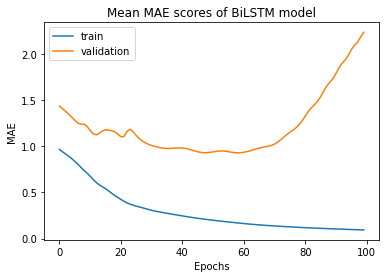

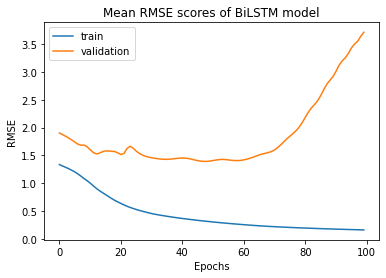

In [47]:
visualize_performance(results_tcmt_x[1])

# look at explanation here: https://stackoverflow.com/questions/42861460/how-to-interpret-weights-in-a-lstm-layer-in-keras
# results_tcmt[0][0].layers[0].get_weights()[0][:, :64].mean(axis=1)

Optimal Mean MAE: 1.1586482660844921 @ epoch 96
Optimal Mean RMSE: 1.8600284546613692 @ epoch 35


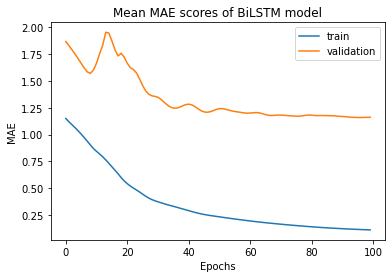

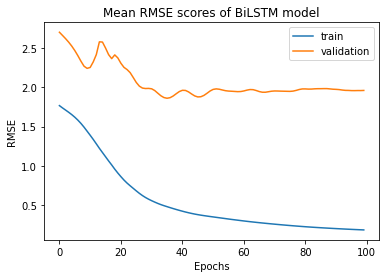

In [48]:
visualize_performance(results_tcmt_y[1])

Optimal Mean MAE: 0.9367788970470429 @ epoch 48
Optimal Mean RMSE: 1.4431832149624824 @ epoch 47


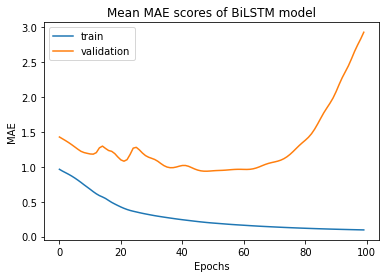

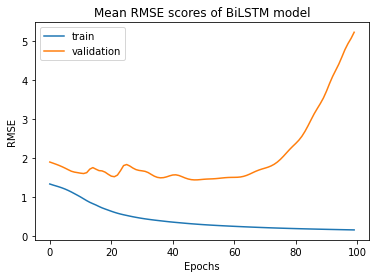

In [49]:
visualize_performance(results_tcmt_z[1])

### Tacheometry + CPT

In [27]:
results_tcmt_cpt_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True)
results_tcmt_cpt_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True)
results_tcmt_cpt_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.6676 - mean_absolute_error: 1.9500 - root_mean_squared_error: 2.5822 - val_loss: 11.4828 - val_mean_absolute_error: 2.7678 - val_root_mean_squared_error: 3.3886
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 6.2684 - mean_absolute_error: 1.8772 - root_mean_squared_error: 2.5037 - val_loss: 11.1590 - val_mean_absolute_error: 2.7168 - val_root_mean_squared_error: 3.3405
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 5.8727 - mean_absolute_error: 1.7986 - root_mean_squared_error: 2.4234 - val_loss: 10.8384 - val_mean_absolute_error: 2.6572 - val_root_mean_squared_error: 3.2922
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 5.4453 - mean_absolute_error: 1.7064 - root_mean_squared_error: 2.3335 - val_loss: 10.5010 - val_mean_absolute_error: 2.5891 - val_root_mean_squared_error: 3.2405
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5228 - mean_absolute_error: 0.4605 - root_mean_squared_error: 0.7231 - val_loss: 8.3433 - val_mean_absolute_error: 2.1427 - val_root_mean_squared_error: 2.8885
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5043 - mean_absolute_error: 0.4504 - root_mean_squared_error: 0.7102 - val_loss: 8.3075 - val_mean_absolute_error: 2.1347 - val_root_mean_squared_error: 2.8823
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.4873 - mean_absolute_error: 0.4410 - root_mean_squared_error: 0.6981 - val_loss: 8.2864 - val_mean_absolute_error: 2.1276 - val_root_mean_squared_error: 2.8786
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4717 - mean_absolute_error: 0.4315 - root_mean_squared_error: 0.6868 - val_loss: 8.2677 - val_mean_absolute_error: 2.1204 - val_root_mean_squared_error: 2.8754
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2621 - mean_absolute_error: 0.2752 - root_mean_squared_error: 0.5120 - val_loss: 7.4832 - val_mean_absolute_error: 1.9975 - val_root_mean_squared_error: 2.7355
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2580 - mean_absolute_error: 0.2732 - root_mean_squared_error: 0.5079 - val_loss: 7.4668 - val_mean_absolute_error: 1.9958 - val_root_mean_squared_error: 2.7326
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2537 - mean_absolute_error: 0.2712 - root_mean_squared_error: 0.5037 - val_loss: 7.4568 - val_mean_absolute_error: 1.9948 - val_root_mean_squared_error: 2.7307
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2495 - mean_absolute_error: 0.2690 - root_mean_squared_error: 0.4995 - val_loss: 7.4558 - val_mean_absolute_error: 1.9949 - val_root_mean_squared_error: 2.7305
Epoch 75/100
1/1 [==============================] - 0s 27ms/

  5%|████▏                                                                              | 1/20 [00:07<02:17,  7.21s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2558 - mean_absolute_error: 0.8514 - root_mean_squared_error: 1.1206 - val_loss: 2.2563 - val_mean_absolute_error: 1.1321 - val_root_mean_squared_error: 1.5021
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1238 - mean_absolute_error: 0.7922 - root_mean_squared_error: 1.0601 - val_loss: 2.1171 - val_mean_absolute_error: 1.0913 - val_root_mean_squared_error: 1.4550
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0273 - mean_absolute_error: 0.7484 - root_mean_squared_error: 1.0136 - val_loss: 1.9869 - val_mean_absolute_error: 1.0537 - val_root_mean_squared_error: 1.4096
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9433 - mean_absolute_error: 0.7122 - root_mean_squared_error: 0.9712 - val_loss: 1.8520 - val_mean_absolute_error: 1.0142 - val_root_mean_squared_error: 1.3609
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0520 - mean_absolute_error: 0.1565 - root_mean_squared_error: 0.2279 - val_loss: 0.2913 - val_mean_absolute_error: 0.3910 - val_root_mean_squared_error: 0.5397
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0499 - mean_absolute_error: 0.1525 - root_mean_squared_error: 0.2234 - val_loss: 0.2865 - val_mean_absolute_error: 0.3876 - val_root_mean_squared_error: 0.5352
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0480 - mean_absolute_error: 0.1491 - root_mean_squared_error: 0.2190 - val_loss: 0.2834 - val_mean_absolute_error: 0.3856 - val_root_mean_squared_error: 0.5324
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0461 - mean_absolute_error: 0.1462 - root_mean_squared_error: 0.2148 - val_loss: 0.2817 - val_mean_absolute_error: 0.3844 - val_root_mean_squared_error: 0.5308
Epoch 40/100
1/1 [==============================] - 0s 25ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0099 - mean_absolute_error: 0.0636 - root_mean_squared_error: 0.0994 - val_loss: 0.1958 - val_mean_absolute_error: 0.2821 - val_root_mean_squared_error: 0.4425
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0094 - mean_absolute_error: 0.0618 - root_mean_squared_error: 0.0971 - val_loss: 0.1946 - val_mean_absolute_error: 0.2802 - val_root_mean_squared_error: 0.4412
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0090 - mean_absolute_error: 0.0600 - root_mean_squared_error: 0.0949 - val_loss: 0.1938 - val_mean_absolute_error: 0.2790 - val_root_mean_squared_error: 0.4403
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0086 - mean_absolute_error: 0.0583 - root_mean_squared_error: 0.0929 - val_loss: 0.1930 - val_mean_absolute_error: 0.2778 - val_root_mean_squared_error: 0.4394
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 10%|████████▎                                                                          | 2/20 [00:12<01:45,  5.88s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.9790 - mean_absolute_error: 1.0265 - root_mean_squared_error: 1.4068 - val_loss: 1.9166 - val_mean_absolute_error: 1.1091 - val_root_mean_squared_error: 1.3844
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 1.8638 - mean_absolute_error: 0.9868 - root_mean_squared_error: 1.3652 - val_loss: 1.8073 - val_mean_absolute_error: 1.0763 - val_root_mean_squared_error: 1.3444
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 1.7535 - mean_absolute_error: 0.9507 - root_mean_squared_error: 1.3242 - val_loss: 1.6887 - val_mean_absolute_error: 1.0378 - val_root_mean_squared_error: 1.2995
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 1.6334 - mean_absolute_error: 0.9133 - root_mean_squared_error: 1.2781 - val_loss: 1.5583 - val_mean_absolute_error: 0.9929 - val_root_mean_squared_error: 1.2483
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1250 - mean_absolute_error: 0.2522 - root_mean_squared_error: 0.3535 - val_loss: 0.5521 - val_mean_absolute_error: 0.5700 - val_root_mean_squared_error: 0.7431
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1204 - mean_absolute_error: 0.2480 - root_mean_squared_error: 0.3469 - val_loss: 0.5398 - val_mean_absolute_error: 0.5660 - val_root_mean_squared_error: 0.7347
Epoch 38/100
1/1 [==============================] - 0s 26ms/step - loss: 0.1159 - mean_absolute_error: 0.2429 - root_mean_squared_error: 0.3404 - val_loss: 0.5278 - val_mean_absolute_error: 0.5617 - val_root_mean_squared_error: 0.7265
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1112 - mean_absolute_error: 0.2373 - root_mean_squared_error: 0.3335 - val_loss: 0.5163 - val_mean_absolute_error: 0.5565 - val_root_mean_squared_error: 0.7185
Epoch 40/100
1/1 [==============================] - 0s 27ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0125 - mean_absolute_error: 0.0772 - root_mean_squared_error: 0.1117 - val_loss: 0.2171 - val_mean_absolute_error: 0.3362 - val_root_mean_squared_error: 0.4659
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0116 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1079 - val_loss: 0.2150 - val_mean_absolute_error: 0.3340 - val_root_mean_squared_error: 0.4637
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0109 - mean_absolute_error: 0.0715 - root_mean_squared_error: 0.1045 - val_loss: 0.2132 - val_mean_absolute_error: 0.3320 - val_root_mean_squared_error: 0.4617
Epoch 74/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0103 - mean_absolute_error: 0.0695 - root_mean_squared_error: 0.1015 - val_loss: 0.2112 - val_mean_absolute_error: 0.3304 - val_root_mean_squared_error: 0.4596
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 15%|████████████▍                                                                      | 3/20 [00:16<01:30,  5.33s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.2688 - mean_absolute_error: 1.0072 - root_mean_squared_error: 1.5062 - val_loss: 3.7737 - val_mean_absolute_error: 1.3071 - val_root_mean_squared_error: 1.9426
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 2.1197 - mean_absolute_error: 0.9620 - root_mean_squared_error: 1.4559 - val_loss: 3.5813 - val_mean_absolute_error: 1.2585 - val_root_mean_squared_error: 1.8924
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.9858 - mean_absolute_error: 0.9192 - root_mean_squared_error: 1.4092 - val_loss: 3.3911 - val_mean_absolute_error: 1.2056 - val_root_mean_squared_error: 1.8415
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 1.8525 - mean_absolute_error: 0.8738 - root_mean_squared_error: 1.3611 - val_loss: 3.1923 - val_mean_absolute_error: 1.1522 - val_root_mean_squared_error: 1.7867
Epoch 5/100
1/1 [==============================] - 0s 27ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0282 - mean_absolute_error: 0.1333 - root_mean_squared_error: 0.1680 - val_loss: 0.8902 - val_mean_absolute_error: 0.3667 - val_root_mean_squared_error: 0.9435
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0264 - mean_absolute_error: 0.1314 - root_mean_squared_error: 0.1626 - val_loss: 0.8865 - val_mean_absolute_error: 0.3619 - val_root_mean_squared_error: 0.9415
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0247 - mean_absolute_error: 0.1265 - root_mean_squared_error: 0.1572 - val_loss: 0.8877 - val_mean_absolute_error: 0.3568 - val_root_mean_squared_error: 0.9422
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0231 - mean_absolute_error: 0.1201 - root_mean_squared_error: 0.1518 - val_loss: 0.8913 - val_mean_absolute_error: 0.3509 - val_root_mean_squared_error: 0.9441
Epoch 40/100
1/1 [==============================] - 0s 25ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0019 - mean_absolute_error: 0.0326 - root_mean_squared_error: 0.0434 - val_loss: 0.8830 - val_mean_absolute_error: 0.2545 - val_root_mean_squared_error: 0.9397
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0018 - mean_absolute_error: 0.0317 - root_mean_squared_error: 0.0426 - val_loss: 0.8832 - val_mean_absolute_error: 0.2539 - val_root_mean_squared_error: 0.9398
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0017 - mean_absolute_error: 0.0306 - root_mean_squared_error: 0.0417 - val_loss: 0.8840 - val_mean_absolute_error: 0.2535 - val_root_mean_squared_error: 0.9402
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0017 - mean_absolute_error: 0.0295 - root_mean_squared_error: 0.0408 - val_loss: 0.8840 - val_mean_absolute_error: 0.2527 - val_root_mean_squared_error: 0.9402
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 20%|████████████████▌                                                                  | 4/20 [00:21<01:21,  5.11s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.1371 - mean_absolute_error: 1.5274 - root_mean_squared_error: 2.0340 - val_loss: 2.7829 - val_mean_absolute_error: 1.3776 - val_root_mean_squared_error: 1.6682
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.9437 - mean_absolute_error: 1.4781 - root_mean_squared_error: 1.9859 - val_loss: 2.5915 - val_mean_absolute_error: 1.3217 - val_root_mean_squared_error: 1.6098
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 3.7676 - mean_absolute_error: 1.4330 - root_mean_squared_error: 1.9410 - val_loss: 2.4184 - val_mean_absolute_error: 1.2655 - val_root_mean_squared_error: 1.5551
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 3.5734 - mean_absolute_error: 1.3819 - root_mean_squared_error: 1.8903 - val_loss: 2.2442 - val_mean_absolute_error: 1.1999 - val_root_mean_squared_error: 1.4981
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1372 - mean_absolute_error: 0.2721 - root_mean_squared_error: 0.3704 - val_loss: 0.9132 - val_mean_absolute_error: 0.7398 - val_root_mean_squared_error: 0.9556
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1321 - mean_absolute_error: 0.2664 - root_mean_squared_error: 0.3635 - val_loss: 0.9042 - val_mean_absolute_error: 0.7344 - val_root_mean_squared_error: 0.9509
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1266 - mean_absolute_error: 0.2603 - root_mean_squared_error: 0.3558 - val_loss: 0.8937 - val_mean_absolute_error: 0.7283 - val_root_mean_squared_error: 0.9454
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1209 - mean_absolute_error: 0.2533 - root_mean_squared_error: 0.3477 - val_loss: 0.8794 - val_mean_absolute_error: 0.7211 - val_root_mean_squared_error: 0.9378
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0297 - mean_absolute_error: 0.1040 - root_mean_squared_error: 0.1723 - val_loss: 0.4691 - val_mean_absolute_error: 0.4935 - val_root_mean_squared_error: 0.6849
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0290 - mean_absolute_error: 0.1024 - root_mean_squared_error: 0.1702 - val_loss: 0.4624 - val_mean_absolute_error: 0.4893 - val_root_mean_squared_error: 0.6800
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0283 - mean_absolute_error: 0.1006 - root_mean_squared_error: 0.1682 - val_loss: 0.4568 - val_mean_absolute_error: 0.4859 - val_root_mean_squared_error: 0.6759
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0277 - mean_absolute_error: 0.0988 - root_mean_squared_error: 0.1663 - val_loss: 0.4537 - val_mean_absolute_error: 0.4840 - val_root_mean_squared_error: 0.6736
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 25%|████████████████████▊                                                              | 5/20 [00:27<01:18,  5.24s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.4761 - mean_absolute_error: 0.9406 - root_mean_squared_error: 1.2149 - val_loss: 2.5187 - val_mean_absolute_error: 1.0894 - val_root_mean_squared_error: 1.5870
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 1.3191 - mean_absolute_error: 0.8899 - root_mean_squared_error: 1.1485 - val_loss: 2.4105 - val_mean_absolute_error: 1.0601 - val_root_mean_squared_error: 1.5526
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1849 - mean_absolute_error: 0.8434 - root_mean_squared_error: 1.0885 - val_loss: 2.3129 - val_mean_absolute_error: 1.0367 - val_root_mean_squared_error: 1.5208
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 1.0599 - mean_absolute_error: 0.7961 - root_mean_squared_error: 1.0295 - val_loss: 2.2192 - val_mean_absolute_error: 1.0177 - val_root_mean_squared_error: 1.4897
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0628 - mean_absolute_error: 0.1771 - root_mean_squared_error: 0.2506 - val_loss: 1.5882 - val_mean_absolute_error: 0.7981 - val_root_mean_squared_error: 1.2602
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0596 - mean_absolute_error: 0.1722 - root_mean_squared_error: 0.2442 - val_loss: 1.5853 - val_mean_absolute_error: 0.7960 - val_root_mean_squared_error: 1.2591
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0566 - mean_absolute_error: 0.1673 - root_mean_squared_error: 0.2378 - val_loss: 1.5816 - val_mean_absolute_error: 0.7939 - val_root_mean_squared_error: 1.2576
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0539 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2321 - val_loss: 1.5792 - val_mean_absolute_error: 0.7910 - val_root_mean_squared_error: 1.2567
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0085 - mean_absolute_error: 0.0636 - root_mean_squared_error: 0.0920 - val_loss: 1.5964 - val_mean_absolute_error: 0.7083 - val_root_mean_squared_error: 1.2635
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0080 - mean_absolute_error: 0.0621 - root_mean_squared_error: 0.0897 - val_loss: 1.5955 - val_mean_absolute_error: 0.7077 - val_root_mean_squared_error: 1.2631
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0072 - mean_absolute_error: 0.0585 - root_mean_squared_error: 0.0850 - val_loss: 1.5948 - val_mean_absolute_error: 0.7070 - val_root_mean_squared_error: 1.2628
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0070 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0835 - val_loss: 1.5991 - val_mean_absolute_error: 0.7034 - val_root_mean_squared_error: 1.2645
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 30%|████████████████████████▉                                                          | 6/20 [00:32<01:13,  5.26s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4080 - mean_absolute_error: 0.4809 - root_mean_squared_error: 0.6387 - val_loss: 1.2530 - val_mean_absolute_error: 0.8135 - val_root_mean_squared_error: 1.1194
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3700 - mean_absolute_error: 0.4536 - root_mean_squared_error: 0.6083 - val_loss: 1.2148 - val_mean_absolute_error: 0.7972 - val_root_mean_squared_error: 1.1022
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3438 - mean_absolute_error: 0.4357 - root_mean_squared_error: 0.5864 - val_loss: 1.1806 - val_mean_absolute_error: 0.7832 - val_root_mean_squared_error: 1.0865
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3228 - mean_absolute_error: 0.4212 - root_mean_squared_error: 0.5681 - val_loss: 1.1474 - val_mean_absolute_error: 0.7712 - val_root_mean_squared_error: 1.0712
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0712 - mean_absolute_error: 0.1945 - root_mean_squared_error: 0.2668 - val_loss: 0.3509 - val_mean_absolute_error: 0.4394 - val_root_mean_squared_error: 0.5923
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0680 - mean_absolute_error: 0.1894 - root_mean_squared_error: 0.2608 - val_loss: 0.3309 - val_mean_absolute_error: 0.4209 - val_root_mean_squared_error: 0.5752
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0648 - mean_absolute_error: 0.1861 - root_mean_squared_error: 0.2546 - val_loss: 0.3149 - val_mean_absolute_error: 0.4144 - val_root_mean_squared_error: 0.5611
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0615 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2481 - val_loss: 0.2985 - val_mean_absolute_error: 0.3992 - val_root_mean_squared_error: 0.5464
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0177 - mean_absolute_error: 0.0847 - root_mean_squared_error: 0.1330 - val_loss: 0.1968 - val_mean_absolute_error: 0.2999 - val_root_mean_squared_error: 0.4436
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0174 - mean_absolute_error: 0.0840 - root_mean_squared_error: 0.1321 - val_loss: 0.1899 - val_mean_absolute_error: 0.2944 - val_root_mean_squared_error: 0.4358
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0172 - mean_absolute_error: 0.0838 - root_mean_squared_error: 0.1310 - val_loss: 0.1906 - val_mean_absolute_error: 0.2949 - val_root_mean_squared_error: 0.4366
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0168 - mean_absolute_error: 0.0824 - root_mean_squared_error: 0.1296 - val_loss: 0.1941 - val_mean_absolute_error: 0.2979 - val_root_mean_squared_error: 0.4405
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 35%|█████████████████████████████                                                      | 7/20 [00:38<01:13,  5.65s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1493 - mean_absolute_error: 0.8484 - root_mean_squared_error: 1.0720 - val_loss: 1.9284 - val_mean_absolute_error: 1.0634 - val_root_mean_squared_error: 1.3887
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 0.9902 - mean_absolute_error: 0.7593 - root_mean_squared_error: 0.9951 - val_loss: 1.8034 - val_mean_absolute_error: 1.0159 - val_root_mean_squared_error: 1.3429
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 0.8836 - mean_absolute_error: 0.7013 - root_mean_squared_error: 0.9400 - val_loss: 1.6909 - val_mean_absolute_error: 0.9741 - val_root_mean_squared_error: 1.3003
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7988 - mean_absolute_error: 0.6589 - root_mean_squared_error: 0.8938 - val_loss: 1.5950 - val_mean_absolute_error: 0.9441 - val_root_mean_squared_error: 1.2629
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1080 - mean_absolute_error: 0.2141 - root_mean_squared_error: 0.3286 - val_loss: 1.0820 - val_mean_absolute_error: 0.6300 - val_root_mean_squared_error: 1.0402
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1067 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.3266 - val_loss: 1.0825 - val_mean_absolute_error: 0.6309 - val_root_mean_squared_error: 1.0404
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1053 - mean_absolute_error: 0.2107 - root_mean_squared_error: 0.3245 - val_loss: 1.0848 - val_mean_absolute_error: 0.6310 - val_root_mean_squared_error: 1.0415
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1040 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.3224 - val_loss: 1.0941 - val_mean_absolute_error: 0.6337 - val_root_mean_squared_error: 1.0460
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0727 - mean_absolute_error: 0.1618 - root_mean_squared_error: 0.2695 - val_loss: 1.1440 - val_mean_absolute_error: 0.6371 - val_root_mean_squared_error: 1.0696
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0718 - mean_absolute_error: 0.1607 - root_mean_squared_error: 0.2680 - val_loss: 1.1480 - val_mean_absolute_error: 0.6394 - val_root_mean_squared_error: 1.0715
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0710 - mean_absolute_error: 0.1596 - root_mean_squared_error: 0.2665 - val_loss: 1.1447 - val_mean_absolute_error: 0.6388 - val_root_mean_squared_error: 1.0699
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0702 - mean_absolute_error: 0.1583 - root_mean_squared_error: 0.2650 - val_loss: 1.1409 - val_mean_absolute_error: 0.6348 - val_root_mean_squared_error: 1.0681
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:45<01:13,  6.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1992 - mean_absolute_error: 1.3137 - root_mean_squared_error: 2.0492 - val_loss: 14.3884 - val_mean_absolute_error: 2.8275 - val_root_mean_squared_error: 3.7932
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.0828 - mean_absolute_error: 1.2833 - root_mean_squared_error: 2.0206 - val_loss: 14.1001 - val_mean_absolute_error: 2.7915 - val_root_mean_squared_error: 3.7550
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 3.9699 - mean_absolute_error: 1.2541 - root_mean_squared_error: 1.9925 - val_loss: 13.7915 - val_mean_absolute_error: 2.7521 - val_root_mean_squared_error: 3.7137
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 3.8427 - mean_absolute_error: 1.2213 - root_mean_squared_error: 1.9603 - val_loss: 13.4345 - val_mean_absolute_error: 2.7053 - val_root_mean_squared_error: 3.6653
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6588 - mean_absolute_error: 0.5537 - root_mean_squared_error: 0.8117 - val_loss: 6.5065 - val_mean_absolute_error: 1.8786 - val_root_mean_squared_error: 2.5508
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6341 - mean_absolute_error: 0.5428 - root_mean_squared_error: 0.7963 - val_loss: 6.5068 - val_mean_absolute_error: 1.8783 - val_root_mean_squared_error: 2.5508
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.6103 - mean_absolute_error: 0.5301 - root_mean_squared_error: 0.7812 - val_loss: 6.5170 - val_mean_absolute_error: 1.8800 - val_root_mean_squared_error: 2.5528
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5888 - mean_absolute_error: 0.5179 - root_mean_squared_error: 0.7673 - val_loss: 6.5167 - val_mean_absolute_error: 1.8800 - val_root_mean_squared_error: 2.5528
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2673 - mean_absolute_error: 0.3020 - root_mean_squared_error: 0.5170 - val_loss: 6.7513 - val_mean_absolute_error: 1.9142 - val_root_mean_squared_error: 2.5983
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2627 - mean_absolute_error: 0.2989 - root_mean_squared_error: 0.5126 - val_loss: 6.7818 - val_mean_absolute_error: 1.9192 - val_root_mean_squared_error: 2.6042
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2582 - mean_absolute_error: 0.2955 - root_mean_squared_error: 0.5082 - val_loss: 6.8224 - val_mean_absolute_error: 1.9263 - val_root_mean_squared_error: 2.6120
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2537 - mean_absolute_error: 0.2930 - root_mean_squared_error: 0.5037 - val_loss: 6.8494 - val_mean_absolute_error: 1.9308 - val_root_mean_squared_error: 2.6171
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:53<01:10,  6.43s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9771 - mean_absolute_error: 0.6426 - root_mean_squared_error: 0.9885 - val_loss: 2.9552 - val_mean_absolute_error: 1.1575 - val_root_mean_squared_error: 1.7191
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9255 - mean_absolute_error: 0.6162 - root_mean_squared_error: 0.9620 - val_loss: 2.8925 - val_mean_absolute_error: 1.1371 - val_root_mean_squared_error: 1.7007
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8814 - mean_absolute_error: 0.5953 - root_mean_squared_error: 0.9388 - val_loss: 2.8332 - val_mean_absolute_error: 1.1184 - val_root_mean_squared_error: 1.6832
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.8386 - mean_absolute_error: 0.5760 - root_mean_squared_error: 0.9157 - val_loss: 2.7714 - val_mean_absolute_error: 1.0995 - val_root_mean_squared_error: 1.6648
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0124 - mean_absolute_error: 0.0849 - root_mean_squared_error: 0.1115 - val_loss: 1.7840 - val_mean_absolute_error: 0.6491 - val_root_mean_squared_error: 1.3357
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0111 - mean_absolute_error: 0.0808 - root_mean_squared_error: 0.1054 - val_loss: 1.7794 - val_mean_absolute_error: 0.6462 - val_root_mean_squared_error: 1.3339
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0103 - mean_absolute_error: 0.0790 - root_mean_squared_error: 0.1014 - val_loss: 1.7746 - val_mean_absolute_error: 0.6412 - val_root_mean_squared_error: 1.3321
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0096 - mean_absolute_error: 0.0779 - root_mean_squared_error: 0.0980 - val_loss: 1.7709 - val_mean_absolute_error: 0.6353 - val_root_mean_squared_error: 1.3308
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 7.1650e-04 - mean_absolute_error: 0.0196 - root_mean_squared_error: 0.0268 - val_loss: 1.7526 - val_mean_absolute_error: 0.5805 - val_root_mean_squared_error: 1.3239
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 6.8655e-04 - mean_absolute_error: 0.0192 - root_mean_squared_error: 0.0262 - val_loss: 1.7532 - val_mean_absolute_error: 0.5797 - val_root_mean_squared_error: 1.3241
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 6.5656e-04 - mean_absolute_error: 0.0187 - root_mean_squared_error: 0.0256 - val_loss: 1.7533 - val_mean_absolute_error: 0.5787 - val_root_mean_squared_error: 1.3241
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 6.2711e-04 - mean_absolute_error: 0.0182 - root_mean_squared_error: 0.0250 - val_loss: 1.7532 - val_mean_absolute_error: 0.5776 - val_root_mean_squared_error: 1.3241
Epoch 75/100
1/1 [==========================

 50%|█████████████████████████████████████████                                         | 10/20 [01:00<01:06,  6.61s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.0354 - mean_absolute_error: 1.6961 - root_mean_squared_error: 2.2440 - val_loss: 8.6174 - val_mean_absolute_error: 2.2272 - val_root_mean_squared_error: 2.9355
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 4.7810 - mean_absolute_error: 1.6366 - root_mean_squared_error: 2.1865 - val_loss: 8.1601 - val_mean_absolute_error: 2.1489 - val_root_mean_squared_error: 2.8566
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 4.5405 - mean_absolute_error: 1.5799 - root_mean_squared_error: 2.1308 - val_loss: 7.6486 - val_mean_absolute_error: 2.0626 - val_root_mean_squared_error: 2.7656
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 4.2608 - mean_absolute_error: 1.5147 - root_mean_squared_error: 2.0642 - val_loss: 7.0447 - val_mean_absolute_error: 1.9587 - val_root_mean_squared_error: 2.6542
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2301 - mean_absolute_error: 0.3308 - root_mean_squared_error: 0.4797 - val_loss: 1.3383 - val_mean_absolute_error: 0.7141 - val_root_mean_squared_error: 1.1568
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2210 - mean_absolute_error: 0.3224 - root_mean_squared_error: 0.4701 - val_loss: 1.3325 - val_mean_absolute_error: 0.7087 - val_root_mean_squared_error: 1.1543
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2127 - mean_absolute_error: 0.3145 - root_mean_squared_error: 0.4612 - val_loss: 1.3312 - val_mean_absolute_error: 0.7041 - val_root_mean_squared_error: 1.1538
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2045 - mean_absolute_error: 0.3064 - root_mean_squared_error: 0.4523 - val_loss: 1.3308 - val_mean_absolute_error: 0.6997 - val_root_mean_squared_error: 1.1536
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0705 - mean_absolute_error: 0.1609 - root_mean_squared_error: 0.2656 - val_loss: 1.0487 - val_mean_absolute_error: 0.6290 - val_root_mean_squared_error: 1.0240
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0688 - mean_absolute_error: 0.1588 - root_mean_squared_error: 0.2623 - val_loss: 1.0412 - val_mean_absolute_error: 0.6272 - val_root_mean_squared_error: 1.0204
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0671 - mean_absolute_error: 0.1568 - root_mean_squared_error: 0.2591 - val_loss: 1.0322 - val_mean_absolute_error: 0.6255 - val_root_mean_squared_error: 1.0160
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0655 - mean_absolute_error: 0.1547 - root_mean_squared_error: 0.2559 - val_loss: 1.0228 - val_mean_absolute_error: 0.6237 - val_root_mean_squared_error: 1.0113
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:07<01:00,  6.70s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.2499 - mean_absolute_error: 2.1362 - root_mean_squared_error: 2.8723 - val_loss: 11.3317 - val_mean_absolute_error: 2.5278 - val_root_mean_squared_error: 3.3663
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 7.6893 - mean_absolute_error: 2.0456 - root_mean_squared_error: 2.7730 - val_loss: 10.8687 - val_mean_absolute_error: 2.4626 - val_root_mean_squared_error: 3.2968
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 7.2553 - mean_absolute_error: 1.9748 - root_mean_squared_error: 2.6936 - val_loss: 10.2581 - val_mean_absolute_error: 2.3770 - val_root_mean_squared_error: 3.2028
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 6.7202 - mean_absolute_error: 1.8901 - root_mean_squared_error: 2.5923 - val_loss: 9.4848 - val_mean_absolute_error: 2.2781 - val_root_mean_squared_error: 3.0797
Epoch 5/100
1/1 [==============================] - 0s 39ms/step

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4144 - mean_absolute_error: 0.4343 - root_mean_squared_error: 0.6437 - val_loss: 2.9360 - val_mean_absolute_error: 1.2352 - val_root_mean_squared_error: 1.7135
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3884 - mean_absolute_error: 0.4205 - root_mean_squared_error: 0.6232 - val_loss: 2.9094 - val_mean_absolute_error: 1.2293 - val_root_mean_squared_error: 1.7057
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3651 - mean_absolute_error: 0.4079 - root_mean_squared_error: 0.6042 - val_loss: 2.8881 - val_mean_absolute_error: 1.2256 - val_root_mean_squared_error: 1.6994
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3442 - mean_absolute_error: 0.3967 - root_mean_squared_error: 0.5867 - val_loss: 2.8677 - val_mean_absolute_error: 1.2223 - val_root_mean_squared_error: 1.6934
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0870 - mean_absolute_error: 0.1911 - root_mean_squared_error: 0.2950 - val_loss: 2.2930 - val_mean_absolute_error: 1.1052 - val_root_mean_squared_error: 1.5143
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0846 - mean_absolute_error: 0.1881 - root_mean_squared_error: 0.2908 - val_loss: 2.2802 - val_mean_absolute_error: 1.1016 - val_root_mean_squared_error: 1.5100
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0822 - mean_absolute_error: 0.1851 - root_mean_squared_error: 0.2867 - val_loss: 2.2658 - val_mean_absolute_error: 1.0973 - val_root_mean_squared_error: 1.5053
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0800 - mean_absolute_error: 0.1822 - root_mean_squared_error: 0.2829 - val_loss: 2.2523 - val_mean_absolute_error: 1.0931 - val_root_mean_squared_error: 1.5008
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:13<00:54,  6.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2545 - mean_absolute_error: 0.3886 - root_mean_squared_error: 0.5045 - val_loss: 0.4557 - val_mean_absolute_error: 0.5204 - val_root_mean_squared_error: 0.6750
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2323 - mean_absolute_error: 0.3652 - root_mean_squared_error: 0.4820 - val_loss: 0.4248 - val_mean_absolute_error: 0.4956 - val_root_mean_squared_error: 0.6517
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2146 - mean_absolute_error: 0.3451 - root_mean_squared_error: 0.4632 - val_loss: 0.3926 - val_mean_absolute_error: 0.4687 - val_root_mean_squared_error: 0.6266
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1973 - mean_absolute_error: 0.3252 - root_mean_squared_error: 0.4442 - val_loss: 0.3575 - val_mean_absolute_error: 0.4363 - val_root_mean_squared_error: 0.5979
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0021 - mean_absolute_error: 0.0348 - root_mean_squared_error: 0.0461 - val_loss: 0.0057 - val_mean_absolute_error: 0.0588 - val_root_mean_squared_error: 0.0757
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0019 - mean_absolute_error: 0.0329 - root_mean_squared_error: 0.0437 - val_loss: 0.0053 - val_mean_absolute_error: 0.0563 - val_root_mean_squared_error: 0.0731
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0017 - mean_absolute_error: 0.0312 - root_mean_squared_error: 0.0412 - val_loss: 0.0049 - val_mean_absolute_error: 0.0539 - val_root_mean_squared_error: 0.0702
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0015 - mean_absolute_error: 0.0299 - root_mean_squared_error: 0.0389 - val_loss: 0.0046 - val_mean_absolute_error: 0.0521 - val_root_mean_squared_error: 0.0676
Epoch 40/100
1/1 [==============================] - 0s 39ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:21<00:48,  6.91s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8234 - mean_absolute_error: 0.8337 - root_mean_squared_error: 1.3503 - val_loss: 9.7014 - val_mean_absolute_error: 2.2679 - val_root_mean_squared_error: 3.1147
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7617 - mean_absolute_error: 0.8083 - root_mean_squared_error: 1.3273 - val_loss: 9.5603 - val_mean_absolute_error: 2.2444 - val_root_mean_squared_error: 3.0920
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.7091 - mean_absolute_error: 0.7899 - root_mean_squared_error: 1.3073 - val_loss: 9.3962 - val_mean_absolute_error: 2.2177 - val_root_mean_squared_error: 3.0653
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.6566 - mean_absolute_error: 0.7740 - root_mean_squared_error: 1.2871 - val_loss: 9.1944 - val_mean_absolute_error: 2.1859 - val_root_mean_squared_error: 3.0322
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3036 - mean_absolute_error: 0.3837 - root_mean_squared_error: 0.5510 - val_loss: 6.8016 - val_mean_absolute_error: 1.9045 - val_root_mean_squared_error: 2.6080
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2952 - mean_absolute_error: 0.3761 - root_mean_squared_error: 0.5433 - val_loss: 6.9461 - val_mean_absolute_error: 1.9204 - val_root_mean_squared_error: 2.6355
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2876 - mean_absolute_error: 0.3716 - root_mean_squared_error: 0.5363 - val_loss: 6.2833 - val_mean_absolute_error: 1.8363 - val_root_mean_squared_error: 2.5067
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2801 - mean_absolute_error: 0.3661 - root_mean_squared_error: 0.5293 - val_loss: 6.4940 - val_mean_absolute_error: 1.8576 - val_root_mean_squared_error: 2.5483
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1038 - mean_absolute_error: 0.2105 - root_mean_squared_error: 0.3222 - val_loss: 6.1202 - val_mean_absolute_error: 1.7915 - val_root_mean_squared_error: 2.4739
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1073 - mean_absolute_error: 0.2138 - root_mean_squared_error: 0.3276 - val_loss: 7.0593 - val_mean_absolute_error: 1.8912 - val_root_mean_squared_error: 2.6569
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0978 - mean_absolute_error: 0.2033 - root_mean_squared_error: 0.3128 - val_loss: 6.3824 - val_mean_absolute_error: 1.8108 - val_root_mean_squared_error: 2.5263
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0904 - mean_absolute_error: 0.1940 - root_mean_squared_error: 0.3007 - val_loss: 6.1942 - val_mean_absolute_error: 1.7882 - val_root_mean_squared_error: 2.4888
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:27<00:41,  6.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7353 - mean_absolute_error: 0.6140 - root_mean_squared_error: 0.8575 - val_loss: 1.1866 - val_mean_absolute_error: 0.7589 - val_root_mean_squared_error: 1.0893
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.6704 - mean_absolute_error: 0.5770 - root_mean_squared_error: 0.8188 - val_loss: 1.1204 - val_mean_absolute_error: 0.7322 - val_root_mean_squared_error: 1.0585
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6225 - mean_absolute_error: 0.5523 - root_mean_squared_error: 0.7890 - val_loss: 1.0584 - val_mean_absolute_error: 0.7104 - val_root_mean_squared_error: 1.0288
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5802 - mean_absolute_error: 0.5338 - root_mean_squared_error: 0.7617 - val_loss: 0.9931 - val_mean_absolute_error: 0.6900 - val_root_mean_squared_error: 0.9965
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0459 - mean_absolute_error: 0.1422 - root_mean_squared_error: 0.2142 - val_loss: 0.1864 - val_mean_absolute_error: 0.3209 - val_root_mean_squared_error: 0.4317
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0443 - mean_absolute_error: 0.1390 - root_mean_squared_error: 0.2105 - val_loss: 0.1854 - val_mean_absolute_error: 0.3205 - val_root_mean_squared_error: 0.4306
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0429 - mean_absolute_error: 0.1364 - root_mean_squared_error: 0.2071 - val_loss: 0.1842 - val_mean_absolute_error: 0.3196 - val_root_mean_squared_error: 0.4292
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0414 - mean_absolute_error: 0.1335 - root_mean_squared_error: 0.2034 - val_loss: 0.1822 - val_mean_absolute_error: 0.3178 - val_root_mean_squared_error: 0.4269
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0136 - mean_absolute_error: 0.0719 - root_mean_squared_error: 0.1166 - val_loss: 0.1583 - val_mean_absolute_error: 0.2889 - val_root_mean_squared_error: 0.3978
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0131 - mean_absolute_error: 0.0705 - root_mean_squared_error: 0.1146 - val_loss: 0.1579 - val_mean_absolute_error: 0.2882 - val_root_mean_squared_error: 0.3973
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0127 - mean_absolute_error: 0.0693 - root_mean_squared_error: 0.1127 - val_loss: 0.1571 - val_mean_absolute_error: 0.2873 - val_root_mean_squared_error: 0.3963
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0123 - mean_absolute_error: 0.0680 - root_mean_squared_error: 0.1107 - val_loss: 0.1560 - val_mean_absolute_error: 0.2862 - val_root_mean_squared_error: 0.3950
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:34<00:34,  6.90s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8947 - mean_absolute_error: 0.7423 - root_mean_squared_error: 0.9459 - val_loss: 1.5728 - val_mean_absolute_error: 0.9939 - val_root_mean_squared_error: 1.2541
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8305 - mean_absolute_error: 0.7070 - root_mean_squared_error: 0.9113 - val_loss: 1.5062 - val_mean_absolute_error: 0.9663 - val_root_mean_squared_error: 1.2273
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7772 - mean_absolute_error: 0.6780 - root_mean_squared_error: 0.8816 - val_loss: 1.4500 - val_mean_absolute_error: 0.9423 - val_root_mean_squared_error: 1.2042
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7270 - mean_absolute_error: 0.6508 - root_mean_squared_error: 0.8527 - val_loss: 1.4000 - val_mean_absolute_error: 0.9185 - val_root_mean_squared_error: 1.1832
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0867 - mean_absolute_error: 0.1826 - root_mean_squared_error: 0.2945 - val_loss: 1.1364 - val_mean_absolute_error: 0.6967 - val_root_mean_squared_error: 1.0660
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0833 - mean_absolute_error: 0.1787 - root_mean_squared_error: 0.2887 - val_loss: 1.1352 - val_mean_absolute_error: 0.6944 - val_root_mean_squared_error: 1.0655
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0799 - mean_absolute_error: 0.1744 - root_mean_squared_error: 0.2826 - val_loss: 1.1356 - val_mean_absolute_error: 0.6935 - val_root_mean_squared_error: 1.0656
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0766 - mean_absolute_error: 0.1701 - root_mean_squared_error: 0.2768 - val_loss: 1.1424 - val_mean_absolute_error: 0.6952 - val_root_mean_squared_error: 1.0688
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0345 - mean_absolute_error: 0.1040 - root_mean_squared_error: 0.1859 - val_loss: 1.0781 - val_mean_absolute_error: 0.6477 - val_root_mean_squared_error: 1.0383
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0339 - mean_absolute_error: 0.1029 - root_mean_squared_error: 0.1842 - val_loss: 1.0769 - val_mean_absolute_error: 0.6467 - val_root_mean_squared_error: 1.0377
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0333 - mean_absolute_error: 0.1016 - root_mean_squared_error: 0.1826 - val_loss: 1.0754 - val_mean_absolute_error: 0.6458 - val_root_mean_squared_error: 1.0370
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0327 - mean_absolute_error: 0.1005 - root_mean_squared_error: 0.1810 - val_loss: 1.0722 - val_mean_absolute_error: 0.6447 - val_root_mean_squared_error: 1.0354
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:41<00:27,  6.94s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7050 - mean_absolute_error: 0.6147 - root_mean_squared_error: 0.8397 - val_loss: 3.9093 - val_mean_absolute_error: 1.4862 - val_root_mean_squared_error: 1.9772
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6562 - mean_absolute_error: 0.5844 - root_mean_squared_error: 0.8101 - val_loss: 3.8382 - val_mean_absolute_error: 1.4705 - val_root_mean_squared_error: 1.9591
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.6142 - mean_absolute_error: 0.5596 - root_mean_squared_error: 0.7837 - val_loss: 3.7713 - val_mean_absolute_error: 1.4558 - val_root_mean_squared_error: 1.9420
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5745 - mean_absolute_error: 0.5368 - root_mean_squared_error: 0.7580 - val_loss: 3.7030 - val_mean_absolute_error: 1.4416 - val_root_mean_squared_error: 1.9243
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0436 - mean_absolute_error: 0.1016 - root_mean_squared_error: 0.2088 - val_loss: 3.0274 - val_mean_absolute_error: 1.2071 - val_root_mean_squared_error: 1.7399
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0431 - mean_absolute_error: 0.1004 - root_mean_squared_error: 0.2076 - val_loss: 3.0239 - val_mean_absolute_error: 1.2047 - val_root_mean_squared_error: 1.7389
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0426 - mean_absolute_error: 0.0987 - root_mean_squared_error: 0.2065 - val_loss: 3.0193 - val_mean_absolute_error: 1.2021 - val_root_mean_squared_error: 1.7376
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0422 - mean_absolute_error: 0.0967 - root_mean_squared_error: 0.2054 - val_loss: 3.0143 - val_mean_absolute_error: 1.1995 - val_root_mean_squared_error: 1.7362
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0342 - mean_absolute_error: 0.0660 - root_mean_squared_error: 0.1848 - val_loss: 2.9483 - val_mean_absolute_error: 1.1799 - val_root_mean_squared_error: 1.7171
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0340 - mean_absolute_error: 0.0658 - root_mean_squared_error: 0.1843 - val_loss: 2.9428 - val_mean_absolute_error: 1.1792 - val_root_mean_squared_error: 1.7155
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0338 - mean_absolute_error: 0.0657 - root_mean_squared_error: 0.1838 - val_loss: 2.9374 - val_mean_absolute_error: 1.1786 - val_root_mean_squared_error: 1.7139
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0336 - mean_absolute_error: 0.0657 - root_mean_squared_error: 0.1833 - val_loss: 2.9322 - val_mean_absolute_error: 1.1778 - val_root_mean_squared_error: 1.7124
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:48<00:20,  6.92s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4852 - mean_absolute_error: 0.4970 - root_mean_squared_error: 0.6965 - val_loss: 1.3356 - val_mean_absolute_error: 0.9659 - val_root_mean_squared_error: 1.1557
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4530 - mean_absolute_error: 0.4763 - root_mean_squared_error: 0.6731 - val_loss: 1.2725 - val_mean_absolute_error: 0.9387 - val_root_mean_squared_error: 1.1280
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.4274 - mean_absolute_error: 0.4635 - root_mean_squared_error: 0.6538 - val_loss: 1.2126 - val_mean_absolute_error: 0.9120 - val_root_mean_squared_error: 1.1012
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4053 - mean_absolute_error: 0.4547 - root_mean_squared_error: 0.6366 - val_loss: 1.1539 - val_mean_absolute_error: 0.8865 - val_root_mean_squared_error: 1.0742
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1465 - mean_absolute_error: 0.2891 - root_mean_squared_error: 0.3827 - val_loss: 1.6703 - val_mean_absolute_error: 1.0352 - val_root_mean_squared_error: 1.2924
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1430 - mean_absolute_error: 0.2860 - root_mean_squared_error: 0.3781 - val_loss: 1.7835 - val_mean_absolute_error: 1.0738 - val_root_mean_squared_error: 1.3355
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1393 - mean_absolute_error: 0.2822 - root_mean_squared_error: 0.3733 - val_loss: 2.1093 - val_mean_absolute_error: 1.1746 - val_root_mean_squared_error: 1.4523
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1354 - mean_absolute_error: 0.2793 - root_mean_squared_error: 0.3679 - val_loss: 1.9924 - val_mean_absolute_error: 1.1363 - val_root_mean_squared_error: 1.4115
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0476 - mean_absolute_error: 0.1563 - root_mean_squared_error: 0.2183 - val_loss: 4.3953 - val_mean_absolute_error: 1.3619 - val_root_mean_squared_error: 2.0965
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0491 - mean_absolute_error: 0.1538 - root_mean_squared_error: 0.2216 - val_loss: 5.6281 - val_mean_absolute_error: 1.5479 - val_root_mean_squared_error: 2.3724
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0445 - mean_absolute_error: 0.1498 - root_mean_squared_error: 0.2110 - val_loss: 5.8854 - val_mean_absolute_error: 1.5845 - val_root_mean_squared_error: 2.4260
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0431 - mean_absolute_error: 0.1469 - root_mean_squared_error: 0.2076 - val_loss: 5.1676 - val_mean_absolute_error: 1.4726 - val_root_mean_squared_error: 2.2732
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:55<00:13,  6.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6043 - mean_absolute_error: 0.9472 - root_mean_squared_error: 1.2666 - val_loss: 2.7384 - val_mean_absolute_error: 1.2907 - val_root_mean_squared_error: 1.6548
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.4773 - mean_absolute_error: 0.9028 - root_mean_squared_error: 1.2155 - val_loss: 2.5984 - val_mean_absolute_error: 1.2567 - val_root_mean_squared_error: 1.6120
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.3711 - mean_absolute_error: 0.8677 - root_mean_squared_error: 1.1709 - val_loss: 2.4606 - val_mean_absolute_error: 1.2199 - val_root_mean_squared_error: 1.5686
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.2605 - mean_absolute_error: 0.8319 - root_mean_squared_error: 1.1227 - val_loss: 2.3111 - val_mean_absolute_error: 1.1829 - val_root_mean_squared_error: 1.5202
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0466 - mean_absolute_error: 0.1488 - root_mean_squared_error: 0.2158 - val_loss: 0.7720 - val_mean_absolute_error: 0.5935 - val_root_mean_squared_error: 0.8786
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0449 - mean_absolute_error: 0.1448 - root_mean_squared_error: 0.2119 - val_loss: 0.7690 - val_mean_absolute_error: 0.5915 - val_root_mean_squared_error: 0.8769
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0433 - mean_absolute_error: 0.1411 - root_mean_squared_error: 0.2082 - val_loss: 0.7666 - val_mean_absolute_error: 0.5900 - val_root_mean_squared_error: 0.8756
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0420 - mean_absolute_error: 0.1377 - root_mean_squared_error: 0.2049 - val_loss: 0.7650 - val_mean_absolute_error: 0.5890 - val_root_mean_squared_error: 0.8746
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0226 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1504 - val_loss: 0.8500 - val_mean_absolute_error: 0.6015 - val_root_mean_squared_error: 0.9219
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0222 - mean_absolute_error: 0.0917 - root_mean_squared_error: 0.1490 - val_loss: 0.8528 - val_mean_absolute_error: 0.6016 - val_root_mean_squared_error: 0.9235
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0218 - mean_absolute_error: 0.0906 - root_mean_squared_error: 0.1477 - val_loss: 0.8567 - val_mean_absolute_error: 0.6022 - val_root_mean_squared_error: 0.9256
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0214 - mean_absolute_error: 0.0895 - root_mean_squared_error: 0.1463 - val_loss: 0.8601 - val_mean_absolute_error: 0.6026 - val_root_mean_squared_error: 0.9274
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:01<00:06,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.6236 - mean_absolute_error: 0.5788 - root_mean_squared_error: 0.7897 - val_loss: 1.4738 - val_mean_absolute_error: 0.9223 - val_root_mean_squared_error: 1.2140
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5821 - mean_absolute_error: 0.5564 - root_mean_squared_error: 0.7630 - val_loss: 1.4316 - val_mean_absolute_error: 0.9108 - val_root_mean_squared_error: 1.1965
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5454 - mean_absolute_error: 0.5341 - root_mean_squared_error: 0.7385 - val_loss: 1.3937 - val_mean_absolute_error: 0.9009 - val_root_mean_squared_error: 1.1805
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5107 - mean_absolute_error: 0.5109 - root_mean_squared_error: 0.7146 - val_loss: 1.3590 - val_mean_absolute_error: 0.8906 - val_root_mean_squared_error: 1.1658
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0866 - mean_absolute_error: 0.1659 - root_mean_squared_error: 0.2942 - val_loss: 0.9603 - val_mean_absolute_error: 0.7254 - val_root_mean_squared_error: 0.9799
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0858 - mean_absolute_error: 0.1640 - root_mean_squared_error: 0.2930 - val_loss: 0.9640 - val_mean_absolute_error: 0.7272 - val_root_mean_squared_error: 0.9818
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0851 - mean_absolute_error: 0.1621 - root_mean_squared_error: 0.2917 - val_loss: 0.9666 - val_mean_absolute_error: 0.7276 - val_root_mean_squared_error: 0.9832
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0843 - mean_absolute_error: 0.1603 - root_mean_squared_error: 0.2903 - val_loss: 0.9684 - val_mean_absolute_error: 0.7274 - val_root_mean_squared_error: 0.9841
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0587 - mean_absolute_error: 0.1303 - root_mean_squared_error: 0.2423 - val_loss: 1.1676 - val_mean_absolute_error: 0.7803 - val_root_mean_squared_error: 1.0805
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0578 - mean_absolute_error: 0.1291 - root_mean_squared_error: 0.2404 - val_loss: 1.1745 - val_mean_absolute_error: 0.7828 - val_root_mean_squared_error: 1.0838
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0569 - mean_absolute_error: 0.1278 - root_mean_squared_error: 0.2385 - val_loss: 1.1894 - val_mean_absolute_error: 0.7881 - val_root_mean_squared_error: 1.0906
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0559 - mean_absolute_error: 0.1266 - root_mean_squared_error: 0.2365 - val_loss: 1.1994 - val_mean_absolute_error: 0.7910 - val_root_mean_squared_error: 1.0952
Epoch 75/100
1/1 [==============================] - 0s 29ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 10.1491 - mean_absolute_error: 2.1768 - root_mean_squared_error: 3.1858 - val_loss: 14.3801 - val_mean_absolute_error: 2.7437 - val_root_mean_squared_error: 3.7921
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 9.6870 - mean_absolute_error: 2.1094 - root_mean_squared_error: 3.1124 - val_loss: 13.8277 - val_mean_absolute_error: 2.6799 - val_root_mean_squared_error: 3.7186
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 9.2603 - mean_absolute_error: 2.0451 - root_mean_squared_error: 3.0431 - val_loss: 13.2315 - val_mean_absolute_error: 2.6104 - val_root_mean_squared_error: 3.6375
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 8.8051 - mean_absolute_error: 1.9764 - root_mean_squared_error: 2.9673 - val_loss: 12.5361 - val_mean_absolute_error: 2.5232 - val_root_mean_squared_error: 3.5406
Epoch 5/100
1/1 [==============================] - 0s 37ms/st

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7547 - mean_absolute_error: 0.5583 - root_mean_squared_error: 0.8688 - val_loss: 3.7920 - val_mean_absolute_error: 1.3586 - val_root_mean_squared_error: 1.9473
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7271 - mean_absolute_error: 0.5421 - root_mean_squared_error: 0.8527 - val_loss: 3.7774 - val_mean_absolute_error: 1.3573 - val_root_mean_squared_error: 1.9436
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7014 - mean_absolute_error: 0.5273 - root_mean_squared_error: 0.8375 - val_loss: 3.7685 - val_mean_absolute_error: 1.3561 - val_root_mean_squared_error: 1.9413
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6768 - mean_absolute_error: 0.5142 - root_mean_squared_error: 0.8227 - val_loss: 3.7644 - val_mean_absolute_error: 1.3545 - val_root_mean_squared_error: 1.9402
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3092 - mean_absolute_error: 0.2819 - root_mean_squared_error: 0.5561 - val_loss: 3.8828 - val_mean_absolute_error: 1.3502 - val_root_mean_squared_error: 1.9705
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3048 - mean_absolute_error: 0.2791 - root_mean_squared_error: 0.5521 - val_loss: 3.8855 - val_mean_absolute_error: 1.3493 - val_root_mean_squared_error: 1.9712
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3005 - mean_absolute_error: 0.2766 - root_mean_squared_error: 0.5482 - val_loss: 3.8895 - val_mean_absolute_error: 1.3489 - val_root_mean_squared_error: 1.9722
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2962 - mean_absolute_error: 0.2741 - root_mean_squared_error: 0.5443 - val_loss: 3.8933 - val_mean_absolute_error: 1.3484 - val_root_mean_squared_error: 1.9731
Epoch 75/100
1/1 [==============================] - 0s 47ms/

  5%|████▏                                                                              | 1/20 [00:07<02:16,  7.16s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.4207 - mean_absolute_error: 1.3453 - root_mean_squared_error: 1.8495 - val_loss: 4.8604 - val_mean_absolute_error: 1.6165 - val_root_mean_squared_error: 2.2046
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 3.1606 - mean_absolute_error: 1.2794 - root_mean_squared_error: 1.7778 - val_loss: 4.5356 - val_mean_absolute_error: 1.5567 - val_root_mean_squared_error: 2.1297
Epoch 3/100
1/1 [==============================] - 0s 50ms/step - loss: 2.9378 - mean_absolute_error: 1.2264 - root_mean_squared_error: 1.7140 - val_loss: 4.1967 - val_mean_absolute_error: 1.4899 - val_root_mean_squared_error: 2.0486
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 2.7050 - mean_absolute_error: 1.1689 - root_mean_squared_error: 1.6447 - val_loss: 3.8142 - val_mean_absolute_error: 1.4097 - val_root_mean_squared_error: 1.9530
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1065 - mean_absolute_error: 0.2356 - root_mean_squared_error: 0.3264 - val_loss: 0.5412 - val_mean_absolute_error: 0.5513 - val_root_mean_squared_error: 0.7356
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1012 - mean_absolute_error: 0.2275 - root_mean_squared_error: 0.3181 - val_loss: 0.5341 - val_mean_absolute_error: 0.5428 - val_root_mean_squared_error: 0.7308
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0965 - mean_absolute_error: 0.2215 - root_mean_squared_error: 0.3106 - val_loss: 0.5285 - val_mean_absolute_error: 0.5355 - val_root_mean_squared_error: 0.7270
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0931 - mean_absolute_error: 0.2180 - root_mean_squared_error: 0.3051 - val_loss: 0.5245 - val_mean_absolute_error: 0.5313 - val_root_mean_squared_error: 0.7242
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0223 - mean_absolute_error: 0.0995 - root_mean_squared_error: 0.1493 - val_loss: 0.3138 - val_mean_absolute_error: 0.3780 - val_root_mean_squared_error: 0.5602
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0208 - mean_absolute_error: 0.0964 - root_mean_squared_error: 0.1443 - val_loss: 0.3088 - val_mean_absolute_error: 0.3728 - val_root_mean_squared_error: 0.5557
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0194 - mean_absolute_error: 0.0933 - root_mean_squared_error: 0.1394 - val_loss: 0.3039 - val_mean_absolute_error: 0.3679 - val_root_mean_squared_error: 0.5512
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0182 - mean_absolute_error: 0.0905 - root_mean_squared_error: 0.1350 - val_loss: 0.3001 - val_mean_absolute_error: 0.3644 - val_root_mean_squared_error: 0.5478
Epoch 75/100
1/1 [==============================] - 0s 49ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:22,  7.92s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.6424 - mean_absolute_error: 1.2916 - root_mean_squared_error: 1.6255 - val_loss: 3.4856 - val_mean_absolute_error: 1.5399 - val_root_mean_squared_error: 1.8670
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 2.4361 - mean_absolute_error: 1.2332 - root_mean_squared_error: 1.5608 - val_loss: 3.2535 - val_mean_absolute_error: 1.4750 - val_root_mean_squared_error: 1.8037
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 2.2615 - mean_absolute_error: 1.1790 - root_mean_squared_error: 1.5038 - val_loss: 3.0258 - val_mean_absolute_error: 1.4080 - val_root_mean_squared_error: 1.7395
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 2.0934 - mean_absolute_error: 1.1233 - root_mean_squared_error: 1.4469 - val_loss: 2.7829 - val_mean_absolute_error: 1.3354 - val_root_mean_squared_error: 1.6682
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0943 - mean_absolute_error: 0.2201 - root_mean_squared_error: 0.3071 - val_loss: 0.3656 - val_mean_absolute_error: 0.4456 - val_root_mean_squared_error: 0.6047
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0918 - mean_absolute_error: 0.2177 - root_mean_squared_error: 0.3029 - val_loss: 0.3600 - val_mean_absolute_error: 0.4438 - val_root_mean_squared_error: 0.6000
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0894 - mean_absolute_error: 0.2151 - root_mean_squared_error: 0.2989 - val_loss: 0.3544 - val_mean_absolute_error: 0.4410 - val_root_mean_squared_error: 0.5953
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0871 - mean_absolute_error: 0.2121 - root_mean_squared_error: 0.2951 - val_loss: 0.3505 - val_mean_absolute_error: 0.4380 - val_root_mean_squared_error: 0.5920
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0431 - mean_absolute_error: 0.1355 - root_mean_squared_error: 0.2076 - val_loss: 0.2572 - val_mean_absolute_error: 0.3432 - val_root_mean_squared_error: 0.5071
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0420 - mean_absolute_error: 0.1340 - root_mean_squared_error: 0.2049 - val_loss: 0.2523 - val_mean_absolute_error: 0.3387 - val_root_mean_squared_error: 0.5023
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0409 - mean_absolute_error: 0.1325 - root_mean_squared_error: 0.2023 - val_loss: 0.2480 - val_mean_absolute_error: 0.3349 - val_root_mean_squared_error: 0.4980
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0398 - mean_absolute_error: 0.1309 - root_mean_squared_error: 0.1996 - val_loss: 0.2447 - val_mean_absolute_error: 0.3318 - val_root_mean_squared_error: 0.4946
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 15%|████████████▍                                                                      | 3/20 [00:22<02:09,  7.64s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.9214 - mean_absolute_error: 1.3661 - root_mean_squared_error: 2.8145 - val_loss: 13.3544 - val_mean_absolute_error: 1.8335 - val_root_mean_squared_error: 3.6544
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 7.5647 - mean_absolute_error: 1.3017 - root_mean_squared_error: 2.7504 - val_loss: 12.8483 - val_mean_absolute_error: 1.7878 - val_root_mean_squared_error: 3.5844
Epoch 3/100
1/1 [==============================] - 0s 25ms/step - loss: 7.2635 - mean_absolute_error: 1.2659 - root_mean_squared_error: 2.6951 - val_loss: 12.3427 - val_mean_absolute_error: 1.7481 - val_root_mean_squared_error: 3.5132
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 6.9596 - mean_absolute_error: 1.2382 - root_mean_squared_error: 2.6381 - val_loss: 11.7700 - val_mean_absolute_error: 1.7084 - val_root_mean_squared_error: 3.4307
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1295 - mean_absolute_error: 0.2715 - root_mean_squared_error: 0.3599 - val_loss: 1.4481 - val_mean_absolute_error: 0.5795 - val_root_mean_squared_error: 1.2034
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1129 - mean_absolute_error: 0.2539 - root_mean_squared_error: 0.3360 - val_loss: 1.4350 - val_mean_absolute_error: 0.5566 - val_root_mean_squared_error: 1.1979
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0996 - mean_absolute_error: 0.2381 - root_mean_squared_error: 0.3155 - val_loss: 1.4207 - val_mean_absolute_error: 0.5305 - val_root_mean_squared_error: 1.1919
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0879 - mean_absolute_error: 0.2215 - root_mean_squared_error: 0.2965 - val_loss: 1.3956 - val_mean_absolute_error: 0.4999 - val_root_mean_squared_error: 1.1813
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0073 - mean_absolute_error: 0.0625 - root_mean_squared_error: 0.0853 - val_loss: 1.2561 - val_mean_absolute_error: 0.3088 - val_root_mean_squared_error: 1.1208
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0070 - mean_absolute_error: 0.0607 - root_mean_squared_error: 0.0835 - val_loss: 1.2550 - val_mean_absolute_error: 0.3068 - val_root_mean_squared_error: 1.1203
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0067 - mean_absolute_error: 0.0595 - root_mean_squared_error: 0.0817 - val_loss: 1.2544 - val_mean_absolute_error: 0.3035 - val_root_mean_squared_error: 1.1200
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0063 - mean_absolute_error: 0.0577 - root_mean_squared_error: 0.0796 - val_loss: 1.2542 - val_mean_absolute_error: 0.3002 - val_root_mean_squared_error: 1.1199
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 20%|████████████████▌                                                                  | 4/20 [00:28<01:50,  6.90s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.9117 - mean_absolute_error: 1.7917 - root_mean_squared_error: 2.6290 - val_loss: 6.0778 - val_mean_absolute_error: 1.8853 - val_root_mean_squared_error: 2.4653
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 6.5756 - mean_absolute_error: 1.7307 - root_mean_squared_error: 2.5643 - val_loss: 5.6766 - val_mean_absolute_error: 1.8098 - val_root_mean_squared_error: 2.3826
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 6.2620 - mean_absolute_error: 1.6786 - root_mean_squared_error: 2.5024 - val_loss: 5.2868 - val_mean_absolute_error: 1.7402 - val_root_mean_squared_error: 2.2993
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 5.9384 - mean_absolute_error: 1.6327 - root_mean_squared_error: 2.4369 - val_loss: 4.8870 - val_mean_absolute_error: 1.6672 - val_root_mean_squared_error: 2.2107
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1709 - mean_absolute_error: 0.3040 - root_mean_squared_error: 0.4135 - val_loss: 0.7542 - val_mean_absolute_error: 0.6537 - val_root_mean_squared_error: 0.8684
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1660 - mean_absolute_error: 0.2992 - root_mean_squared_error: 0.4074 - val_loss: 0.7375 - val_mean_absolute_error: 0.6439 - val_root_mean_squared_error: 0.8588
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1598 - mean_absolute_error: 0.2935 - root_mean_squared_error: 0.3998 - val_loss: 0.7211 - val_mean_absolute_error: 0.6354 - val_root_mean_squared_error: 0.8492
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1535 - mean_absolute_error: 0.2877 - root_mean_squared_error: 0.3918 - val_loss: 0.7066 - val_mean_absolute_error: 0.6290 - val_root_mean_squared_error: 0.8406
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0538 - mean_absolute_error: 0.1472 - root_mean_squared_error: 0.2319 - val_loss: 0.3650 - val_mean_absolute_error: 0.4275 - val_root_mean_squared_error: 0.6041
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0521 - mean_absolute_error: 0.1443 - root_mean_squared_error: 0.2283 - val_loss: 0.3569 - val_mean_absolute_error: 0.4231 - val_root_mean_squared_error: 0.5974
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0504 - mean_absolute_error: 0.1413 - root_mean_squared_error: 0.2246 - val_loss: 0.3486 - val_mean_absolute_error: 0.4185 - val_root_mean_squared_error: 0.5905
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0489 - mean_absolute_error: 0.1384 - root_mean_squared_error: 0.2211 - val_loss: 0.3406 - val_mean_absolute_error: 0.4138 - val_root_mean_squared_error: 0.5836
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 25%|████████████████████▊                                                              | 5/20 [00:35<01:41,  6.79s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.3579 - mean_absolute_error: 1.5804 - root_mean_squared_error: 2.5215 - val_loss: 19.3130 - val_mean_absolute_error: 2.9430 - val_root_mean_squared_error: 4.3947
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 6.1299 - mean_absolute_error: 1.5428 - root_mean_squared_error: 2.4759 - val_loss: 18.8290 - val_mean_absolute_error: 2.9048 - val_root_mean_squared_error: 4.3392
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 5.9198 - mean_absolute_error: 1.5093 - root_mean_squared_error: 2.4331 - val_loss: 18.3259 - val_mean_absolute_error: 2.8655 - val_root_mean_squared_error: 4.2809
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 5.7049 - mean_absolute_error: 1.4746 - root_mean_squared_error: 2.3885 - val_loss: 17.7592 - val_mean_absolute_error: 2.8197 - val_root_mean_squared_error: 4.2142
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1549 - mean_absolute_error: 0.3031 - root_mean_squared_error: 0.3936 - val_loss: 4.5102 - val_mean_absolute_error: 1.2142 - val_root_mean_squared_error: 2.1237
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1496 - mean_absolute_error: 0.2949 - root_mean_squared_error: 0.3867 - val_loss: 4.3263 - val_mean_absolute_error: 1.1669 - val_root_mean_squared_error: 2.0800
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1441 - mean_absolute_error: 0.2899 - root_mean_squared_error: 0.3795 - val_loss: 4.1434 - val_mean_absolute_error: 1.1229 - val_root_mean_squared_error: 2.0355
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1380 - mean_absolute_error: 0.2836 - root_mean_squared_error: 0.3715 - val_loss: 3.9846 - val_mean_absolute_error: 1.0809 - val_root_mean_squared_error: 1.9961
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0387 - mean_absolute_error: 0.1333 - root_mean_squared_error: 0.1967 - val_loss: 2.6715 - val_mean_absolute_error: 0.8163 - val_root_mean_squared_error: 1.6345
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0371 - mean_absolute_error: 0.1301 - root_mean_squared_error: 0.1927 - val_loss: 2.6623 - val_mean_absolute_error: 0.8153 - val_root_mean_squared_error: 1.6317
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0356 - mean_absolute_error: 0.1270 - root_mean_squared_error: 0.1887 - val_loss: 2.6545 - val_mean_absolute_error: 0.8145 - val_root_mean_squared_error: 1.6293
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0341 - mean_absolute_error: 0.1240 - root_mean_squared_error: 0.1848 - val_loss: 2.6552 - val_mean_absolute_error: 0.8096 - val_root_mean_squared_error: 1.6295
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 30%|████████████████████████▉                                                          | 6/20 [00:42<01:35,  6.82s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7944 - mean_absolute_error: 0.6460 - root_mean_squared_error: 0.8913 - val_loss: 2.2331 - val_mean_absolute_error: 1.2460 - val_root_mean_squared_error: 1.4943
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7499 - mean_absolute_error: 0.6235 - root_mean_squared_error: 0.8659 - val_loss: 2.1507 - val_mean_absolute_error: 1.2229 - val_root_mean_squared_error: 1.4665
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.7085 - mean_absolute_error: 0.6050 - root_mean_squared_error: 0.8418 - val_loss: 2.0582 - val_mean_absolute_error: 1.1953 - val_root_mean_squared_error: 1.4346
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6640 - mean_absolute_error: 0.5868 - root_mean_squared_error: 0.8149 - val_loss: 1.9478 - val_mean_absolute_error: 1.1614 - val_root_mean_squared_error: 1.3956
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0847 - mean_absolute_error: 0.2121 - root_mean_squared_error: 0.2910 - val_loss: 0.7310 - val_mean_absolute_error: 0.6528 - val_root_mean_squared_error: 0.8550
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0820 - mean_absolute_error: 0.2091 - root_mean_squared_error: 0.2864 - val_loss: 0.7203 - val_mean_absolute_error: 0.6467 - val_root_mean_squared_error: 0.8487
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0795 - mean_absolute_error: 0.2060 - root_mean_squared_error: 0.2819 - val_loss: 0.7112 - val_mean_absolute_error: 0.6416 - val_root_mean_squared_error: 0.8433
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0770 - mean_absolute_error: 0.2027 - root_mean_squared_error: 0.2775 - val_loss: 0.7047 - val_mean_absolute_error: 0.6377 - val_root_mean_squared_error: 0.8395
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0277 - mean_absolute_error: 0.1038 - root_mean_squared_error: 0.1665 - val_loss: 0.7061 - val_mean_absolute_error: 0.5559 - val_root_mean_squared_error: 0.8403
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0274 - mean_absolute_error: 0.1035 - root_mean_squared_error: 0.1654 - val_loss: 0.6764 - val_mean_absolute_error: 0.5454 - val_root_mean_squared_error: 0.8224
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0270 - mean_absolute_error: 0.1016 - root_mean_squared_error: 0.1642 - val_loss: 0.7016 - val_mean_absolute_error: 0.5550 - val_root_mean_squared_error: 0.8376
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0266 - mean_absolute_error: 0.1010 - root_mean_squared_error: 0.1630 - val_loss: 0.7031 - val_mean_absolute_error: 0.5558 - val_root_mean_squared_error: 0.8385
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 35%|█████████████████████████████                                                      | 7/20 [00:49<01:29,  6.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.8848 - mean_absolute_error: 1.5731 - root_mean_squared_error: 2.2101 - val_loss: 15.3671 - val_mean_absolute_error: 2.8825 - val_root_mean_squared_error: 3.9201
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.5514 - mean_absolute_error: 1.4896 - root_mean_squared_error: 2.1334 - val_loss: 14.7442 - val_mean_absolute_error: 2.8116 - val_root_mean_squared_error: 3.8398
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.2732 - mean_absolute_error: 1.4335 - root_mean_squared_error: 2.0672 - val_loss: 14.0468 - val_mean_absolute_error: 2.7359 - val_root_mean_squared_error: 3.7479
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 3.9958 - mean_absolute_error: 1.3895 - root_mean_squared_error: 1.9989 - val_loss: 13.1936 - val_mean_absolute_error: 2.6522 - val_root_mean_squared_error: 3.6323
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.4389 - mean_absolute_error: 0.4905 - root_mean_squared_error: 0.6625 - val_loss: 14.7543 - val_mean_absolute_error: 2.5574 - val_root_mean_squared_error: 3.8411
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4225 - mean_absolute_error: 0.4748 - root_mean_squared_error: 0.6500 - val_loss: 13.7452 - val_mean_absolute_error: 2.4485 - val_root_mean_squared_error: 3.7074
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.4064 - mean_absolute_error: 0.4645 - root_mean_squared_error: 0.6375 - val_loss: 13.8129 - val_mean_absolute_error: 2.4419 - val_root_mean_squared_error: 3.7166
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3912 - mean_absolute_error: 0.4518 - root_mean_squared_error: 0.6255 - val_loss: 13.8434 - val_mean_absolute_error: 2.4343 - val_root_mean_squared_error: 3.7207
Epoch 40/100
1/1 [==============================] - 0s 4

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1463 - mean_absolute_error: 0.2521 - root_mean_squared_error: 0.3824 - val_loss: 15.5654 - val_mean_absolute_error: 2.3880 - val_root_mean_squared_error: 3.9453
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1430 - mean_absolute_error: 0.2498 - root_mean_squared_error: 0.3781 - val_loss: 14.4763 - val_mean_absolute_error: 2.2983 - val_root_mean_squared_error: 3.8048
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1394 - mean_absolute_error: 0.2458 - root_mean_squared_error: 0.3733 - val_loss: 14.7639 - val_mean_absolute_error: 2.3220 - val_root_mean_squared_error: 3.8424
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1362 - mean_absolute_error: 0.2429 - root_mean_squared_error: 0.3690 - val_loss: 14.9264 - val_mean_absolute_error: 2.3367 - val_root_mean_squared_error: 3.8635
Epoch 75/100
1/1 [==============================] - 0s 3

 40%|█████████████████████████████████▏                                                 | 8/20 [00:55<01:21,  6.83s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.8808 - mean_absolute_error: 1.2264 - root_mean_squared_error: 2.8073 - val_loss: 23.9209 - val_mean_absolute_error: 2.5268 - val_root_mean_squared_error: 4.8909
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 7.7614 - mean_absolute_error: 1.2059 - root_mean_squared_error: 2.7859 - val_loss: 23.4722 - val_mean_absolute_error: 2.4973 - val_root_mean_squared_error: 4.8448
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 7.6534 - mean_absolute_error: 1.1895 - root_mean_squared_error: 2.7665 - val_loss: 23.0310 - val_mean_absolute_error: 2.4773 - val_root_mean_squared_error: 4.7991
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 7.5385 - mean_absolute_error: 1.1743 - root_mean_squared_error: 2.7456 - val_loss: 22.5491 - val_mean_absolute_error: 2.4670 - val_root_mean_squared_error: 4.7486
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8350 - mean_absolute_error: 0.5754 - root_mean_squared_error: 0.9138 - val_loss: 5.9821 - val_mean_absolute_error: 1.7636 - val_root_mean_squared_error: 2.4458
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8007 - mean_absolute_error: 0.5659 - root_mean_squared_error: 0.8948 - val_loss: 6.0756 - val_mean_absolute_error: 1.7871 - val_root_mean_squared_error: 2.4649
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7678 - mean_absolute_error: 0.5558 - root_mean_squared_error: 0.8763 - val_loss: 6.1055 - val_mean_absolute_error: 1.8008 - val_root_mean_squared_error: 2.4709
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7372 - mean_absolute_error: 0.5436 - root_mean_squared_error: 0.8586 - val_loss: 6.0724 - val_mean_absolute_error: 1.8064 - val_root_mean_squared_error: 2.4642
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2540 - mean_absolute_error: 0.3275 - root_mean_squared_error: 0.5040 - val_loss: 6.3120 - val_mean_absolute_error: 1.8115 - val_root_mean_squared_error: 2.5124
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2488 - mean_absolute_error: 0.3245 - root_mean_squared_error: 0.4988 - val_loss: 6.5492 - val_mean_absolute_error: 1.8402 - val_root_mean_squared_error: 2.5591
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2451 - mean_absolute_error: 0.3228 - root_mean_squared_error: 0.4951 - val_loss: 6.3311 - val_mean_absolute_error: 1.8173 - val_root_mean_squared_error: 2.5162
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2393 - mean_absolute_error: 0.3185 - root_mean_squared_error: 0.4892 - val_loss: 6.6182 - val_mean_absolute_error: 1.8553 - val_root_mean_squared_error: 2.5726
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:02<01:13,  6.67s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2538 - mean_absolute_error: 0.8020 - root_mean_squared_error: 1.1197 - val_loss: 3.1751 - val_mean_absolute_error: 1.2329 - val_root_mean_squared_error: 1.7819
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.1807 - mean_absolute_error: 0.7639 - root_mean_squared_error: 1.0866 - val_loss: 3.0583 - val_mean_absolute_error: 1.1954 - val_root_mean_squared_error: 1.7488
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1186 - mean_absolute_error: 0.7316 - root_mean_squared_error: 1.0576 - val_loss: 2.9416 - val_mean_absolute_error: 1.1588 - val_root_mean_squared_error: 1.7151
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.0574 - mean_absolute_error: 0.7017 - root_mean_squared_error: 1.0283 - val_loss: 2.8164 - val_mean_absolute_error: 1.1239 - val_root_mean_squared_error: 1.6782
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0163 - mean_absolute_error: 0.0985 - root_mean_squared_error: 0.1276 - val_loss: 0.9081 - val_mean_absolute_error: 0.4506 - val_root_mean_squared_error: 0.9529
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0148 - mean_absolute_error: 0.0946 - root_mean_squared_error: 0.1218 - val_loss: 0.9037 - val_mean_absolute_error: 0.4456 - val_root_mean_squared_error: 0.9506
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0136 - mean_absolute_error: 0.0905 - root_mean_squared_error: 0.1165 - val_loss: 0.9002 - val_mean_absolute_error: 0.4399 - val_root_mean_squared_error: 0.9488
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0123 - mean_absolute_error: 0.0857 - root_mean_squared_error: 0.1110 - val_loss: 0.8981 - val_mean_absolute_error: 0.4329 - val_root_mean_squared_error: 0.9477
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 9.4718e-04 - mean_absolute_error: 0.0229 - root_mean_squared_error: 0.0308 - val_loss: 0.8801 - val_mean_absolute_error: 0.3790 - val_root_mean_squared_error: 0.9381
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 8.9618e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0299 - val_loss: 0.8801 - val_mean_absolute_error: 0.3779 - val_root_mean_squared_error: 0.9381
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 8.5558e-04 - mean_absolute_error: 0.0217 - root_mean_squared_error: 0.0293 - val_loss: 0.8799 - val_mean_absolute_error: 0.3770 - val_root_mean_squared_error: 0.9380
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 8.2391e-04 - mean_absolute_error: 0.0213 - root_mean_squared_error: 0.0287 - val_loss: 0.8797 - val_mean_absolute_error: 0.3764 - val_root_mean_squared_error: 0.9379
Epoch 75/100
1/1 [==========================

 50%|█████████████████████████████████████████                                         | 10/20 [01:08<01:05,  6.51s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.0065 - mean_absolute_error: 1.0598 - root_mean_squared_error: 1.7339 - val_loss: 6.6303 - val_mean_absolute_error: 1.5030 - val_root_mean_squared_error: 2.5749
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 2.9022 - mean_absolute_error: 1.0280 - root_mean_squared_error: 1.7036 - val_loss: 6.4083 - val_mean_absolute_error: 1.4612 - val_root_mean_squared_error: 2.5315
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 2.7957 - mean_absolute_error: 0.9983 - root_mean_squared_error: 1.6720 - val_loss: 6.1454 - val_mean_absolute_error: 1.4137 - val_root_mean_squared_error: 2.4790
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 2.6690 - mean_absolute_error: 0.9641 - root_mean_squared_error: 1.6337 - val_loss: 5.8268 - val_mean_absolute_error: 1.3607 - val_root_mean_squared_error: 2.4139
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0860 - mean_absolute_error: 0.2110 - root_mean_squared_error: 0.2932 - val_loss: 0.6248 - val_mean_absolute_error: 0.5386 - val_root_mean_squared_error: 0.7905
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0807 - mean_absolute_error: 0.2037 - root_mean_squared_error: 0.2840 - val_loss: 0.6119 - val_mean_absolute_error: 0.5316 - val_root_mean_squared_error: 0.7822
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0764 - mean_absolute_error: 0.1970 - root_mean_squared_error: 0.2764 - val_loss: 0.6034 - val_mean_absolute_error: 0.5263 - val_root_mean_squared_error: 0.7768
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0730 - mean_absolute_error: 0.1909 - root_mean_squared_error: 0.2701 - val_loss: 0.5961 - val_mean_absolute_error: 0.5219 - val_root_mean_squared_error: 0.7721
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0331 - mean_absolute_error: 0.1133 - root_mean_squared_error: 0.1820 - val_loss: 0.4996 - val_mean_absolute_error: 0.4550 - val_root_mean_squared_error: 0.7068
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0325 - mean_absolute_error: 0.1121 - root_mean_squared_error: 0.1803 - val_loss: 0.4983 - val_mean_absolute_error: 0.4548 - val_root_mean_squared_error: 0.7059
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0319 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.1787 - val_loss: 0.4966 - val_mean_absolute_error: 0.4540 - val_root_mean_squared_error: 0.7047
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0313 - mean_absolute_error: 0.1098 - root_mean_squared_error: 0.1770 - val_loss: 0.4950 - val_mean_absolute_error: 0.4530 - val_root_mean_squared_error: 0.7036
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:14<00:57,  6.36s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.7360 - mean_absolute_error: 1.2833 - root_mean_squared_error: 1.9329 - val_loss: 5.8265 - val_mean_absolute_error: 1.7143 - val_root_mean_squared_error: 2.4138
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.4915 - mean_absolute_error: 1.2211 - root_mean_squared_error: 1.8686 - val_loss: 5.5245 - val_mean_absolute_error: 1.6584 - val_root_mean_squared_error: 2.3504
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 3.2822 - mean_absolute_error: 1.1706 - root_mean_squared_error: 1.8117 - val_loss: 5.1588 - val_mean_absolute_error: 1.5881 - val_root_mean_squared_error: 2.2713
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 3.0357 - mean_absolute_error: 1.1120 - root_mean_squared_error: 1.7423 - val_loss: 4.7004 - val_mean_absolute_error: 1.5050 - val_root_mean_squared_error: 2.1680
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1980 - mean_absolute_error: 0.3032 - root_mean_squared_error: 0.4450 - val_loss: 1.2350 - val_mean_absolute_error: 0.7539 - val_root_mean_squared_error: 1.1113
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1893 - mean_absolute_error: 0.2976 - root_mean_squared_error: 0.4351 - val_loss: 1.2255 - val_mean_absolute_error: 0.7484 - val_root_mean_squared_error: 1.1070
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1809 - mean_absolute_error: 0.2921 - root_mean_squared_error: 0.4253 - val_loss: 1.2154 - val_mean_absolute_error: 0.7426 - val_root_mean_squared_error: 1.1024
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1727 - mean_absolute_error: 0.2863 - root_mean_squared_error: 0.4156 - val_loss: 1.2044 - val_mean_absolute_error: 0.7374 - val_root_mean_squared_error: 1.0975
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0429 - mean_absolute_error: 0.1370 - root_mean_squared_error: 0.2071 - val_loss: 1.0146 - val_mean_absolute_error: 0.6426 - val_root_mean_squared_error: 1.0073
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0415 - mean_absolute_error: 0.1342 - root_mean_squared_error: 0.2036 - val_loss: 1.0104 - val_mean_absolute_error: 0.6415 - val_root_mean_squared_error: 1.0052
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0401 - mean_absolute_error: 0.1314 - root_mean_squared_error: 0.2003 - val_loss: 1.0074 - val_mean_absolute_error: 0.6410 - val_root_mean_squared_error: 1.0037
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0389 - mean_absolute_error: 0.1288 - root_mean_squared_error: 0.1971 - val_loss: 1.0052 - val_mean_absolute_error: 0.6405 - val_root_mean_squared_error: 1.0026
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:20<00:50,  6.30s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.2434 - mean_absolute_error: 0.3653 - root_mean_squared_error: 0.4933 - val_loss: 0.4284 - val_mean_absolute_error: 0.4820 - val_root_mean_squared_error: 0.6545
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2194 - mean_absolute_error: 0.3401 - root_mean_squared_error: 0.4684 - val_loss: 0.4029 - val_mean_absolute_error: 0.4643 - val_root_mean_squared_error: 0.6347
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2040 - mean_absolute_error: 0.3259 - root_mean_squared_error: 0.4517 - val_loss: 0.3783 - val_mean_absolute_error: 0.4481 - val_root_mean_squared_error: 0.6150
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1902 - mean_absolute_error: 0.3136 - root_mean_squared_error: 0.4361 - val_loss: 0.3507 - val_mean_absolute_error: 0.4301 - val_root_mean_squared_error: 0.5922
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0022 - mean_absolute_error: 0.0360 - root_mean_squared_error: 0.0467 - val_loss: 0.0055 - val_mean_absolute_error: 0.0570 - val_root_mean_squared_error: 0.0740
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0020 - mean_absolute_error: 0.0345 - root_mean_squared_error: 0.0445 - val_loss: 0.0055 - val_mean_absolute_error: 0.0563 - val_root_mean_squared_error: 0.0739
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0018 - mean_absolute_error: 0.0329 - root_mean_squared_error: 0.0425 - val_loss: 0.0055 - val_mean_absolute_error: 0.0557 - val_root_mean_squared_error: 0.0741
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0016 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0406 - val_loss: 0.0053 - val_mean_absolute_error: 0.0544 - val_root_mean_squared_error: 0.0727
Epoch 40/100
1/1 [==============================] - 0s 35ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:26<00:44,  6.30s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.1389 - mean_absolute_error: 0.8918 - root_mean_squared_error: 1.4625 - val_loss: 10.9128 - val_mean_absolute_error: 2.5515 - val_root_mean_squared_error: 3.3035
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 2.0616 - mean_absolute_error: 0.8697 - root_mean_squared_error: 1.4358 - val_loss: 10.6905 - val_mean_absolute_error: 2.5210 - val_root_mean_squared_error: 3.2696
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.9965 - mean_absolute_error: 0.8564 - root_mean_squared_error: 1.4130 - val_loss: 10.4479 - val_mean_absolute_error: 2.4874 - val_root_mean_squared_error: 3.2323
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 1.9315 - mean_absolute_error: 0.8473 - root_mean_squared_error: 1.3898 - val_loss: 10.1560 - val_mean_absolute_error: 2.4450 - val_root_mean_squared_error: 3.1868
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.4588 - mean_absolute_error: 0.4494 - root_mean_squared_error: 0.6773 - val_loss: 32.5261 - val_mean_absolute_error: 3.8943 - val_root_mean_squared_error: 5.7032
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4329 - mean_absolute_error: 0.4301 - root_mean_squared_error: 0.6579 - val_loss: 29.6998 - val_mean_absolute_error: 3.7038 - val_root_mean_squared_error: 5.4497
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.4312 - mean_absolute_error: 0.4256 - root_mean_squared_error: 0.6567 - val_loss: 32.7276 - val_mean_absolute_error: 3.8836 - val_root_mean_squared_error: 5.7208
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.4095 - mean_absolute_error: 0.4169 - root_mean_squared_error: 0.6399 - val_loss: 36.9630 - val_mean_absolute_error: 4.1288 - val_root_mean_squared_error: 6.0797
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1612 - mean_absolute_error: 0.2511 - root_mean_squared_error: 0.4014 - val_loss: 39.5643 - val_mean_absolute_error: 4.1141 - val_root_mean_squared_error: 6.2900
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1575 - mean_absolute_error: 0.2475 - root_mean_squared_error: 0.3969 - val_loss: 40.1592 - val_mean_absolute_error: 4.1439 - val_root_mean_squared_error: 6.3371
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1536 - mean_absolute_error: 0.2448 - root_mean_squared_error: 0.3920 - val_loss: 39.1416 - val_mean_absolute_error: 4.0888 - val_root_mean_squared_error: 6.2563
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1498 - mean_absolute_error: 0.2404 - root_mean_squared_error: 0.3871 - val_loss: 39.7227 - val_mean_absolute_error: 4.1210 - val_root_mean_squared_error: 6.3026
Epoch 75/100
1/1 [==============================] - 0s 3

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:33<00:38,  6.41s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1425 - mean_absolute_error: 0.8435 - root_mean_squared_error: 1.0689 - val_loss: 1.9486 - val_mean_absolute_error: 1.1348 - val_root_mean_squared_error: 1.3959
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.0440 - mean_absolute_error: 0.8023 - root_mean_squared_error: 1.0217 - val_loss: 1.8130 - val_mean_absolute_error: 1.0894 - val_root_mean_squared_error: 1.3465
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9585 - mean_absolute_error: 0.7647 - root_mean_squared_error: 0.9790 - val_loss: 1.6693 - val_mean_absolute_error: 1.0373 - val_root_mean_squared_error: 1.2920
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.8730 - mean_absolute_error: 0.7246 - root_mean_squared_error: 0.9344 - val_loss: 1.5043 - val_mean_absolute_error: 0.9706 - val_root_mean_squared_error: 1.2265
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0460 - mean_absolute_error: 0.1451 - root_mean_squared_error: 0.2144 - val_loss: 0.2210 - val_mean_absolute_error: 0.3336 - val_root_mean_squared_error: 0.4701
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0445 - mean_absolute_error: 0.1416 - root_mean_squared_error: 0.2109 - val_loss: 0.2176 - val_mean_absolute_error: 0.3309 - val_root_mean_squared_error: 0.4665
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0431 - mean_absolute_error: 0.1380 - root_mean_squared_error: 0.2076 - val_loss: 0.2151 - val_mean_absolute_error: 0.3294 - val_root_mean_squared_error: 0.4637
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0419 - mean_absolute_error: 0.1349 - root_mean_squared_error: 0.2047 - val_loss: 0.2131 - val_mean_absolute_error: 0.3284 - val_root_mean_squared_error: 0.4616
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0165 - mean_absolute_error: 0.0833 - root_mean_squared_error: 0.1285 - val_loss: 0.1771 - val_mean_absolute_error: 0.2804 - val_root_mean_squared_error: 0.4208
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0159 - mean_absolute_error: 0.0816 - root_mean_squared_error: 0.1262 - val_loss: 0.1766 - val_mean_absolute_error: 0.2798 - val_root_mean_squared_error: 0.4203
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0154 - mean_absolute_error: 0.0799 - root_mean_squared_error: 0.1239 - val_loss: 0.1762 - val_mean_absolute_error: 0.2790 - val_root_mean_squared_error: 0.4197
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0148 - mean_absolute_error: 0.0783 - root_mean_squared_error: 0.1216 - val_loss: 0.1757 - val_mean_absolute_error: 0.2780 - val_root_mean_squared_error: 0.4192
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:39<00:31,  6.24s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9584 - mean_absolute_error: 1.4851 - root_mean_squared_error: 2.2267 - val_loss: 12.0141 - val_mean_absolute_error: 2.1115 - val_root_mean_squared_error: 3.4661
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 4.7789 - mean_absolute_error: 1.4474 - root_mean_squared_error: 2.1861 - val_loss: 11.6706 - val_mean_absolute_error: 2.0677 - val_root_mean_squared_error: 3.4162
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 4.6032 - mean_absolute_error: 1.4094 - root_mean_squared_error: 2.1455 - val_loss: 11.2888 - val_mean_absolute_error: 2.0155 - val_root_mean_squared_error: 3.3599
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.4109 - mean_absolute_error: 1.3656 - root_mean_squared_error: 2.1002 - val_loss: 10.8385 - val_mean_absolute_error: 1.9518 - val_root_mean_squared_error: 3.2922
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1735 - mean_absolute_error: 0.2991 - root_mean_squared_error: 0.4165 - val_loss: 1.1535 - val_mean_absolute_error: 0.6776 - val_root_mean_squared_error: 1.0740
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1679 - mean_absolute_error: 0.2920 - root_mean_squared_error: 0.4097 - val_loss: 1.1450 - val_mean_absolute_error: 0.6708 - val_root_mean_squared_error: 1.0700
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1616 - mean_absolute_error: 0.2832 - root_mean_squared_error: 0.4021 - val_loss: 1.1388 - val_mean_absolute_error: 0.6670 - val_root_mean_squared_error: 1.0672
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1552 - mean_absolute_error: 0.2726 - root_mean_squared_error: 0.3939 - val_loss: 1.1356 - val_mean_absolute_error: 0.6649 - val_root_mean_squared_error: 1.0657
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0953 - mean_absolute_error: 0.1810 - root_mean_squared_error: 0.3088 - val_loss: 1.1002 - val_mean_absolute_error: 0.6080 - val_root_mean_squared_error: 1.0489
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0947 - mean_absolute_error: 0.1803 - root_mean_squared_error: 0.3077 - val_loss: 1.0993 - val_mean_absolute_error: 0.6075 - val_root_mean_squared_error: 1.0485
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0941 - mean_absolute_error: 0.1795 - root_mean_squared_error: 0.3068 - val_loss: 1.0990 - val_mean_absolute_error: 0.6077 - val_root_mean_squared_error: 1.0483
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0935 - mean_absolute_error: 0.1790 - root_mean_squared_error: 0.3058 - val_loss: 1.0992 - val_mean_absolute_error: 0.6084 - val_root_mean_squared_error: 1.0484
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:45<00:24,  6.16s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1853 - mean_absolute_error: 0.8528 - root_mean_squared_error: 1.0887 - val_loss: 5.8465 - val_mean_absolute_error: 1.8350 - val_root_mean_squared_error: 2.4180
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1275 - mean_absolute_error: 0.8271 - root_mean_squared_error: 1.0619 - val_loss: 5.7173 - val_mean_absolute_error: 1.8120 - val_root_mean_squared_error: 2.3911
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.0748 - mean_absolute_error: 0.8026 - root_mean_squared_error: 1.0367 - val_loss: 5.5841 - val_mean_absolute_error: 1.7879 - val_root_mean_squared_error: 2.3631
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0209 - mean_absolute_error: 0.7761 - root_mean_squared_error: 1.0104 - val_loss: 5.4385 - val_mean_absolute_error: 1.7602 - val_root_mean_squared_error: 2.3321
Epoch 5/100
1/1 [==============================] - 0s 27ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0335 - mean_absolute_error: 0.1090 - root_mean_squared_error: 0.1829 - val_loss: 2.3859 - val_mean_absolute_error: 1.0286 - val_root_mean_squared_error: 1.5446
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0326 - mean_absolute_error: 0.1068 - root_mean_squared_error: 0.1805 - val_loss: 2.3776 - val_mean_absolute_error: 1.0263 - val_root_mean_squared_error: 1.5420
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0317 - mean_absolute_error: 0.1049 - root_mean_squared_error: 0.1780 - val_loss: 2.3686 - val_mean_absolute_error: 1.0241 - val_root_mean_squared_error: 1.5390
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0308 - mean_absolute_error: 0.1021 - root_mean_squared_error: 0.1754 - val_loss: 2.3593 - val_mean_absolute_error: 1.0220 - val_root_mean_squared_error: 1.5360
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0192 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.1384 - val_loss: 2.2490 - val_mean_absolute_error: 0.9931 - val_root_mean_squared_error: 1.4997
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0189 - mean_absolute_error: 0.0571 - root_mean_squared_error: 0.1376 - val_loss: 2.2419 - val_mean_absolute_error: 0.9919 - val_root_mean_squared_error: 1.4973
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0187 - mean_absolute_error: 0.0569 - root_mean_squared_error: 0.1367 - val_loss: 2.2286 - val_mean_absolute_error: 0.9912 - val_root_mean_squared_error: 1.4928
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0184 - mean_absolute_error: 0.0572 - root_mean_squared_error: 0.1357 - val_loss: 2.2184 - val_mean_absolute_error: 0.9903 - val_root_mean_squared_error: 1.4894
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:51<00:18,  6.06s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9394 - mean_absolute_error: 0.5846 - root_mean_squared_error: 0.9692 - val_loss: 5.6958 - val_mean_absolute_error: 1.9068 - val_root_mean_squared_error: 2.3866
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.8958 - mean_absolute_error: 0.5688 - root_mean_squared_error: 0.9465 - val_loss: 5.6515 - val_mean_absolute_error: 1.9013 - val_root_mean_squared_error: 2.3773
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8564 - mean_absolute_error: 0.5572 - root_mean_squared_error: 0.9254 - val_loss: 5.6063 - val_mean_absolute_error: 1.8950 - val_root_mean_squared_error: 2.3678
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 0.8177 - mean_absolute_error: 0.5464 - root_mean_squared_error: 0.9042 - val_loss: 5.5571 - val_mean_absolute_error: 1.8861 - val_root_mean_squared_error: 2.3574
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2722 - mean_absolute_error: 0.3600 - root_mean_squared_error: 0.5217 - val_loss: 9.7332 - val_mean_absolute_error: 2.2652 - val_root_mean_squared_error: 3.1198
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2648 - mean_absolute_error: 0.3569 - root_mean_squared_error: 0.5146 - val_loss: 9.2268 - val_mean_absolute_error: 2.1954 - val_root_mean_squared_error: 3.0376
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2574 - mean_absolute_error: 0.3505 - root_mean_squared_error: 0.5074 - val_loss: 9.4243 - val_mean_absolute_error: 2.2165 - val_root_mean_squared_error: 3.0699
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2510 - mean_absolute_error: 0.3475 - root_mean_squared_error: 0.5010 - val_loss: 9.0026 - val_mean_absolute_error: 2.1545 - val_root_mean_squared_error: 3.0004
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0834 - mean_absolute_error: 0.1928 - root_mean_squared_error: 0.2888 - val_loss: 77.2668 - val_mean_absolute_error: 4.9565 - val_root_mean_squared_error: 8.7902
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0785 - mean_absolute_error: 0.1825 - root_mean_squared_error: 0.2801 - val_loss: 82.5655 - val_mean_absolute_error: 5.1149 - val_root_mean_squared_error: 9.0866
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0755 - mean_absolute_error: 0.1795 - root_mean_squared_error: 0.2748 - val_loss: 98.6824 - val_mean_absolute_error: 5.6037 - val_root_mean_squared_error: 9.9339
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0754 - mean_absolute_error: 0.1830 - root_mean_squared_error: 0.2745 - val_loss: 88.5243 - val_mean_absolute_error: 5.2648 - val_root_mean_squared_error: 9.4087
Epoch 75/100
1/1 [==============================] - 0s 4

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:57<00:12,  6.08s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.5336 - mean_absolute_error: 1.3746 - root_mean_squared_error: 1.8798 - val_loss: 8.6226 - val_mean_absolute_error: 2.1931 - val_root_mean_squared_error: 2.9364
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.3262 - mean_absolute_error: 1.3237 - root_mean_squared_error: 1.8238 - val_loss: 8.2034 - val_mean_absolute_error: 2.1289 - val_root_mean_squared_error: 2.8642
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 3.1498 - mean_absolute_error: 1.2778 - root_mean_squared_error: 1.7748 - val_loss: 7.7411 - val_mean_absolute_error: 2.0513 - val_root_mean_squared_error: 2.7823
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 2.9624 - mean_absolute_error: 1.2261 - root_mean_squared_error: 1.7212 - val_loss: 7.2586 - val_mean_absolute_error: 1.9602 - val_root_mean_squared_error: 2.6942
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1339 - mean_absolute_error: 0.2465 - root_mean_squared_error: 0.3659 - val_loss: 1.6456 - val_mean_absolute_error: 0.8915 - val_root_mean_squared_error: 1.2828
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1276 - mean_absolute_error: 0.2392 - root_mean_squared_error: 0.3572 - val_loss: 1.6330 - val_mean_absolute_error: 0.8876 - val_root_mean_squared_error: 1.2779
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1222 - mean_absolute_error: 0.2327 - root_mean_squared_error: 0.3495 - val_loss: 1.6230 - val_mean_absolute_error: 0.8840 - val_root_mean_squared_error: 1.2740
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1173 - mean_absolute_error: 0.2264 - root_mean_squared_error: 0.3425 - val_loss: 1.6197 - val_mean_absolute_error: 0.8825 - val_root_mean_squared_error: 1.2727
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0555 - mean_absolute_error: 0.1327 - root_mean_squared_error: 0.2355 - val_loss: 1.5509 - val_mean_absolute_error: 0.8109 - val_root_mean_squared_error: 1.2453
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0543 - mean_absolute_error: 0.1307 - root_mean_squared_error: 0.2330 - val_loss: 1.5534 - val_mean_absolute_error: 0.8096 - val_root_mean_squared_error: 1.2464
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0531 - mean_absolute_error: 0.1286 - root_mean_squared_error: 0.2304 - val_loss: 1.5573 - val_mean_absolute_error: 0.8089 - val_root_mean_squared_error: 1.2479
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0519 - mean_absolute_error: 0.1267 - root_mean_squared_error: 0.2279 - val_loss: 1.5602 - val_mean_absolute_error: 0.8081 - val_root_mean_squared_error: 1.2491
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:04<00:06,  6.37s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8159 - mean_absolute_error: 0.6779 - root_mean_squared_error: 0.9033 - val_loss: 3.1550 - val_mean_absolute_error: 1.4065 - val_root_mean_squared_error: 1.7762
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7669 - mean_absolute_error: 0.6492 - root_mean_squared_error: 0.8757 - val_loss: 3.0666 - val_mean_absolute_error: 1.3820 - val_root_mean_squared_error: 1.7512
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7208 - mean_absolute_error: 0.6222 - root_mean_squared_error: 0.8490 - val_loss: 2.9746 - val_mean_absolute_error: 1.3565 - val_root_mean_squared_error: 1.7247
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6743 - mean_absolute_error: 0.5963 - root_mean_squared_error: 0.8212 - val_loss: 2.8737 - val_mean_absolute_error: 1.3298 - val_root_mean_squared_error: 1.6952
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1213 - mean_absolute_error: 0.1915 - root_mean_squared_error: 0.3483 - val_loss: 2.0150 - val_mean_absolute_error: 1.0211 - val_root_mean_squared_error: 1.4195
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1179 - mean_absolute_error: 0.1889 - root_mean_squared_error: 0.3433 - val_loss: 2.0161 - val_mean_absolute_error: 1.0212 - val_root_mean_squared_error: 1.4199
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1143 - mean_absolute_error: 0.1863 - root_mean_squared_error: 0.3381 - val_loss: 2.0200 - val_mean_absolute_error: 1.0213 - val_root_mean_squared_error: 1.4213
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1106 - mean_absolute_error: 0.1841 - root_mean_squared_error: 0.3325 - val_loss: 2.0267 - val_mean_absolute_error: 1.0215 - val_root_mean_squared_error: 1.4236
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0425 - mean_absolute_error: 0.1085 - root_mean_squared_error: 0.2063 - val_loss: 2.1904 - val_mean_absolute_error: 1.0196 - val_root_mean_squared_error: 1.4800
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0416 - mean_absolute_error: 0.1075 - root_mean_squared_error: 0.2041 - val_loss: 2.1828 - val_mean_absolute_error: 1.0180 - val_root_mean_squared_error: 1.4774
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0407 - mean_absolute_error: 0.1065 - root_mean_squared_error: 0.2018 - val_loss: 2.1760 - val_mean_absolute_error: 1.0166 - val_root_mean_squared_error: 1.4751
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0398 - mean_absolute_error: 0.1057 - root_mean_squared_error: 0.1995 - val_loss: 2.1710 - val_mean_absolute_error: 1.0155 - val_root_mean_squared_error: 1.4734
Epoch 75/100
1/1 [==============================] - 0s 41ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.8250 - mean_absolute_error: 1.9451 - root_mean_squared_error: 2.6125 - val_loss: 11.5045 - val_mean_absolute_error: 2.7632 - val_root_mean_squared_error: 3.3918
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 6.4789 - mean_absolute_error: 1.8846 - root_mean_squared_error: 2.5454 - val_loss: 11.1976 - val_mean_absolute_error: 2.7239 - val_root_mean_squared_error: 3.3463
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 6.1589 - mean_absolute_error: 1.8266 - root_mean_squared_error: 2.4817 - val_loss: 10.8790 - val_mean_absolute_error: 2.6798 - val_root_mean_squared_error: 3.2983
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 5.8171 - mean_absolute_error: 1.7619 - root_mean_squared_error: 2.4119 - val_loss: 10.5258 - val_mean_absolute_error: 2.6205 - val_root_mean_squared_error: 3.2443
Epoch 5/100
1/1 [==============================] - 0s 30ms/ste

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6054 - mean_absolute_error: 0.5034 - root_mean_squared_error: 0.7781 - val_loss: 8.6019 - val_mean_absolute_error: 2.1624 - val_root_mean_squared_error: 2.9329
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.5827 - mean_absolute_error: 0.4909 - root_mean_squared_error: 0.7633 - val_loss: 8.4937 - val_mean_absolute_error: 2.1476 - val_root_mean_squared_error: 2.9144
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.5592 - mean_absolute_error: 0.4782 - root_mean_squared_error: 0.7478 - val_loss: 8.3908 - val_mean_absolute_error: 2.1339 - val_root_mean_squared_error: 2.8967
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5370 - mean_absolute_error: 0.4667 - root_mean_squared_error: 0.7328 - val_loss: 8.3188 - val_mean_absolute_error: 2.1233 - val_root_mean_squared_error: 2.8842
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.2384 - mean_absolute_error: 0.2701 - root_mean_squared_error: 0.4883 - val_loss: 7.1470 - val_mean_absolute_error: 1.9303 - val_root_mean_squared_error: 2.6734
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2334 - mean_absolute_error: 0.2669 - root_mean_squared_error: 0.4831 - val_loss: 7.1395 - val_mean_absolute_error: 1.9289 - val_root_mean_squared_error: 2.6720
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2284 - mean_absolute_error: 0.2638 - root_mean_squared_error: 0.4779 - val_loss: 7.1389 - val_mean_absolute_error: 1.9293 - val_root_mean_squared_error: 2.6719
Epoch 74/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2232 - mean_absolute_error: 0.2606 - root_mean_squared_error: 0.4725 - val_loss: 7.1407 - val_mean_absolute_error: 1.9306 - val_root_mean_squared_error: 2.6722
Epoch 75/100
1/1 [==============================] - 0s 26ms/

  5%|████▏                                                                              | 1/20 [00:05<01:36,  5.08s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2411 - mean_absolute_error: 0.8427 - root_mean_squared_error: 1.1141 - val_loss: 2.2581 - val_mean_absolute_error: 1.1395 - val_root_mean_squared_error: 1.5027
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1286 - mean_absolute_error: 0.7930 - root_mean_squared_error: 1.0624 - val_loss: 2.1316 - val_mean_absolute_error: 1.1028 - val_root_mean_squared_error: 1.4600
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.0393 - mean_absolute_error: 0.7519 - root_mean_squared_error: 1.0195 - val_loss: 2.0023 - val_mean_absolute_error: 1.0637 - val_root_mean_squared_error: 1.4150
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9526 - mean_absolute_error: 0.7120 - root_mean_squared_error: 0.9760 - val_loss: 1.8551 - val_mean_absolute_error: 1.0208 - val_root_mean_squared_error: 1.3620
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0594 - mean_absolute_error: 0.1623 - root_mean_squared_error: 0.2437 - val_loss: 0.3474 - val_mean_absolute_error: 0.4289 - val_root_mean_squared_error: 0.5894
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0575 - mean_absolute_error: 0.1589 - root_mean_squared_error: 0.2397 - val_loss: 0.3412 - val_mean_absolute_error: 0.4244 - val_root_mean_squared_error: 0.5842
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0555 - mean_absolute_error: 0.1551 - root_mean_squared_error: 0.2357 - val_loss: 0.3356 - val_mean_absolute_error: 0.4206 - val_root_mean_squared_error: 0.5793
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0537 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2317 - val_loss: 0.3307 - val_mean_absolute_error: 0.4173 - val_root_mean_squared_error: 0.5750
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0102 - mean_absolute_error: 0.0657 - root_mean_squared_error: 0.1008 - val_loss: 0.2044 - val_mean_absolute_error: 0.3015 - val_root_mean_squared_error: 0.4521
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0096 - mean_absolute_error: 0.0638 - root_mean_squared_error: 0.0981 - val_loss: 0.2025 - val_mean_absolute_error: 0.2993 - val_root_mean_squared_error: 0.4500
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0092 - mean_absolute_error: 0.0620 - root_mean_squared_error: 0.0957 - val_loss: 0.2005 - val_mean_absolute_error: 0.2968 - val_root_mean_squared_error: 0.4478
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0087 - mean_absolute_error: 0.0604 - root_mean_squared_error: 0.0934 - val_loss: 0.1985 - val_mean_absolute_error: 0.2937 - val_root_mean_squared_error: 0.4455
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 10%|████████▎                                                                          | 2/20 [00:10<01:32,  5.14s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.1254 - mean_absolute_error: 1.0619 - root_mean_squared_error: 1.4579 - val_loss: 2.0087 - val_mean_absolute_error: 1.1240 - val_root_mean_squared_error: 1.4173
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 1.9697 - mean_absolute_error: 1.0131 - root_mean_squared_error: 1.4035 - val_loss: 1.8619 - val_mean_absolute_error: 1.0794 - val_root_mean_squared_error: 1.3645
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.8404 - mean_absolute_error: 0.9703 - root_mean_squared_error: 1.3566 - val_loss: 1.7246 - val_mean_absolute_error: 1.0337 - val_root_mean_squared_error: 1.3132
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 1.7184 - mean_absolute_error: 0.9287 - root_mean_squared_error: 1.3109 - val_loss: 1.5870 - val_mean_absolute_error: 0.9861 - val_root_mean_squared_error: 1.2598
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1453 - mean_absolute_error: 0.2554 - root_mean_squared_error: 0.3812 - val_loss: 0.6174 - val_mean_absolute_error: 0.5779 - val_root_mean_squared_error: 0.7858
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1408 - mean_absolute_error: 0.2516 - root_mean_squared_error: 0.3752 - val_loss: 0.6130 - val_mean_absolute_error: 0.5787 - val_root_mean_squared_error: 0.7829
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1365 - mean_absolute_error: 0.2489 - root_mean_squared_error: 0.3694 - val_loss: 0.6076 - val_mean_absolute_error: 0.5790 - val_root_mean_squared_error: 0.7795
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1323 - mean_absolute_error: 0.2466 - root_mean_squared_error: 0.3637 - val_loss: 0.6017 - val_mean_absolute_error: 0.5789 - val_root_mean_squared_error: 0.7757
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0237 - mean_absolute_error: 0.1024 - root_mean_squared_error: 0.1539 - val_loss: 0.2589 - val_mean_absolute_error: 0.3499 - val_root_mean_squared_error: 0.5088
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0219 - mean_absolute_error: 0.0983 - root_mean_squared_error: 0.1481 - val_loss: 0.2536 - val_mean_absolute_error: 0.3463 - val_root_mean_squared_error: 0.5036
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0203 - mean_absolute_error: 0.0945 - root_mean_squared_error: 0.1425 - val_loss: 0.2489 - val_mean_absolute_error: 0.3435 - val_root_mean_squared_error: 0.4989
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0189 - mean_absolute_error: 0.0910 - root_mean_squared_error: 0.1374 - val_loss: 0.2452 - val_mean_absolute_error: 0.3415 - val_root_mean_squared_error: 0.4952
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 15%|████████████▍                                                                      | 3/20 [00:15<01:29,  5.24s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.2873 - mean_absolute_error: 1.0082 - root_mean_squared_error: 1.5124 - val_loss: 3.7765 - val_mean_absolute_error: 1.3095 - val_root_mean_squared_error: 1.9433
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 2.1351 - mean_absolute_error: 0.9577 - root_mean_squared_error: 1.4612 - val_loss: 3.5853 - val_mean_absolute_error: 1.2614 - val_root_mean_squared_error: 1.8935
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.0001 - mean_absolute_error: 0.9136 - root_mean_squared_error: 1.4143 - val_loss: 3.3911 - val_mean_absolute_error: 1.2119 - val_root_mean_squared_error: 1.8415
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 1.8685 - mean_absolute_error: 0.8727 - root_mean_squared_error: 1.3669 - val_loss: 3.1710 - val_mean_absolute_error: 1.1600 - val_root_mean_squared_error: 1.7807
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0255 - mean_absolute_error: 0.1243 - root_mean_squared_error: 0.1598 - val_loss: 0.8374 - val_mean_absolute_error: 0.3463 - val_root_mean_squared_error: 0.9151
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0230 - mean_absolute_error: 0.1184 - root_mean_squared_error: 0.1517 - val_loss: 0.8390 - val_mean_absolute_error: 0.3402 - val_root_mean_squared_error: 0.9160
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0204 - mean_absolute_error: 0.1116 - root_mean_squared_error: 0.1429 - val_loss: 0.8473 - val_mean_absolute_error: 0.3337 - val_root_mean_squared_error: 0.9205
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0180 - mean_absolute_error: 0.1035 - root_mean_squared_error: 0.1342 - val_loss: 0.8577 - val_mean_absolute_error: 0.3289 - val_root_mean_squared_error: 0.9261
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0018 - mean_absolute_error: 0.0317 - root_mean_squared_error: 0.0426 - val_loss: 0.8451 - val_mean_absolute_error: 0.2436 - val_root_mean_squared_error: 0.9193
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0017 - mean_absolute_error: 0.0309 - root_mean_squared_error: 0.0416 - val_loss: 0.8451 - val_mean_absolute_error: 0.2425 - val_root_mean_squared_error: 0.9193
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0016 - mean_absolute_error: 0.0299 - root_mean_squared_error: 0.0405 - val_loss: 0.8458 - val_mean_absolute_error: 0.2417 - val_root_mean_squared_error: 0.9197
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0016 - mean_absolute_error: 0.0289 - root_mean_squared_error: 0.0394 - val_loss: 0.8451 - val_mean_absolute_error: 0.2405 - val_root_mean_squared_error: 0.9193
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 20%|████████████████▌                                                                  | 4/20 [00:22<01:31,  5.72s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.2659 - mean_absolute_error: 1.5529 - root_mean_squared_error: 2.0654 - val_loss: 2.9953 - val_mean_absolute_error: 1.4436 - val_root_mean_squared_error: 1.7307
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 4.0011 - mean_absolute_error: 1.4860 - root_mean_squared_error: 2.0003 - val_loss: 2.7358 - val_mean_absolute_error: 1.3773 - val_root_mean_squared_error: 1.6540
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 3.7701 - mean_absolute_error: 1.4279 - root_mean_squared_error: 1.9417 - val_loss: 2.5104 - val_mean_absolute_error: 1.3163 - val_root_mean_squared_error: 1.5844
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 3.5330 - mean_absolute_error: 1.3689 - root_mean_squared_error: 1.8796 - val_loss: 2.2909 - val_mean_absolute_error: 1.2527 - val_root_mean_squared_error: 1.5136
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1363 - mean_absolute_error: 0.2712 - root_mean_squared_error: 0.3691 - val_loss: 0.8549 - val_mean_absolute_error: 0.7276 - val_root_mean_squared_error: 0.9246
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1287 - mean_absolute_error: 0.2628 - root_mean_squared_error: 0.3587 - val_loss: 0.8331 - val_mean_absolute_error: 0.7147 - val_root_mean_squared_error: 0.9127
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1217 - mean_absolute_error: 0.2537 - root_mean_squared_error: 0.3488 - val_loss: 0.8058 - val_mean_absolute_error: 0.7007 - val_root_mean_squared_error: 0.8977
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1156 - mean_absolute_error: 0.2454 - root_mean_squared_error: 0.3400 - val_loss: 0.7773 - val_mean_absolute_error: 0.6862 - val_root_mean_squared_error: 0.8816
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0290 - mean_absolute_error: 0.1061 - root_mean_squared_error: 0.1702 - val_loss: 0.3886 - val_mean_absolute_error: 0.4485 - val_root_mean_squared_error: 0.6233
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0283 - mean_absolute_error: 0.1045 - root_mean_squared_error: 0.1681 - val_loss: 0.3856 - val_mean_absolute_error: 0.4463 - val_root_mean_squared_error: 0.6210
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0276 - mean_absolute_error: 0.1029 - root_mean_squared_error: 0.1662 - val_loss: 0.3828 - val_mean_absolute_error: 0.4444 - val_root_mean_squared_error: 0.6187
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0270 - mean_absolute_error: 0.1013 - root_mean_squared_error: 0.1644 - val_loss: 0.3798 - val_mean_absolute_error: 0.4424 - val_root_mean_squared_error: 0.6163
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 25%|████████████████████▊                                                              | 5/20 [00:28<01:28,  5.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4955 - mean_absolute_error: 0.9749 - root_mean_squared_error: 1.2229 - val_loss: 2.6493 - val_mean_absolute_error: 1.1098 - val_root_mean_squared_error: 1.6277
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.3290 - mean_absolute_error: 0.9002 - root_mean_squared_error: 1.1528 - val_loss: 2.5353 - val_mean_absolute_error: 1.0786 - val_root_mean_squared_error: 1.5923
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1960 - mean_absolute_error: 0.8398 - root_mean_squared_error: 1.0936 - val_loss: 2.4430 - val_mean_absolute_error: 1.0579 - val_root_mean_squared_error: 1.5630
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.0815 - mean_absolute_error: 0.7915 - root_mean_squared_error: 1.0399 - val_loss: 2.3607 - val_mean_absolute_error: 1.0457 - val_root_mean_squared_error: 1.5365
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0641 - mean_absolute_error: 0.1819 - root_mean_squared_error: 0.2532 - val_loss: 1.5794 - val_mean_absolute_error: 0.7880 - val_root_mean_squared_error: 1.2568
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0600 - mean_absolute_error: 0.1768 - root_mean_squared_error: 0.2450 - val_loss: 1.5785 - val_mean_absolute_error: 0.7844 - val_root_mean_squared_error: 1.2564
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0563 - mean_absolute_error: 0.1722 - root_mean_squared_error: 0.2373 - val_loss: 1.5773 - val_mean_absolute_error: 0.7806 - val_root_mean_squared_error: 1.2559
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0529 - mean_absolute_error: 0.1678 - root_mean_squared_error: 0.2299 - val_loss: 1.5769 - val_mean_absolute_error: 0.7768 - val_root_mean_squared_error: 1.2557
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0062 - mean_absolute_error: 0.0551 - root_mean_squared_error: 0.0789 - val_loss: 1.6009 - val_mean_absolute_error: 0.6918 - val_root_mean_squared_error: 1.2653
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0057 - mean_absolute_error: 0.0531 - root_mean_squared_error: 0.0758 - val_loss: 1.6001 - val_mean_absolute_error: 0.6904 - val_root_mean_squared_error: 1.2649
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0053 - mean_absolute_error: 0.0510 - root_mean_squared_error: 0.0729 - val_loss: 1.5994 - val_mean_absolute_error: 0.6890 - val_root_mean_squared_error: 1.2647
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0049 - mean_absolute_error: 0.0488 - root_mean_squared_error: 0.0701 - val_loss: 1.6008 - val_mean_absolute_error: 0.6871 - val_root_mean_squared_error: 1.2652
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 30%|████████████████████████▉                                                          | 6/20 [00:34<01:25,  6.13s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4168 - mean_absolute_error: 0.4875 - root_mean_squared_error: 0.6456 - val_loss: 1.2545 - val_mean_absolute_error: 0.8100 - val_root_mean_squared_error: 1.1200
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 0.3784 - mean_absolute_error: 0.4596 - root_mean_squared_error: 0.6151 - val_loss: 1.2092 - val_mean_absolute_error: 0.7931 - val_root_mean_squared_error: 1.0996
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3527 - mean_absolute_error: 0.4415 - root_mean_squared_error: 0.5939 - val_loss: 1.1663 - val_mean_absolute_error: 0.7778 - val_root_mean_squared_error: 1.0800
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3316 - mean_absolute_error: 0.4264 - root_mean_squared_error: 0.5759 - val_loss: 1.1211 - val_mean_absolute_error: 0.7623 - val_root_mean_squared_error: 1.0588
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0738 - mean_absolute_error: 0.1948 - root_mean_squared_error: 0.2716 - val_loss: 0.7273 - val_mean_absolute_error: 0.6396 - val_root_mean_squared_error: 0.8528
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0706 - mean_absolute_error: 0.1904 - root_mean_squared_error: 0.2657 - val_loss: 0.7056 - val_mean_absolute_error: 0.6243 - val_root_mean_squared_error: 0.8400
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0675 - mean_absolute_error: 0.1872 - root_mean_squared_error: 0.2597 - val_loss: 0.7657 - val_mean_absolute_error: 0.6454 - val_root_mean_squared_error: 0.8750
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0644 - mean_absolute_error: 0.1822 - root_mean_squared_error: 0.2537 - val_loss: 0.7498 - val_mean_absolute_error: 0.6339 - val_root_mean_squared_error: 0.8659
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0189 - mean_absolute_error: 0.0883 - root_mean_squared_error: 0.1375 - val_loss: 0.9818 - val_mean_absolute_error: 0.5936 - val_root_mean_squared_error: 0.9909
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0186 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1364 - val_loss: 0.8956 - val_mean_absolute_error: 0.5657 - val_root_mean_squared_error: 0.9464
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0183 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1353 - val_loss: 0.9675 - val_mean_absolute_error: 0.5859 - val_root_mean_squared_error: 0.9836
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0180 - mean_absolute_error: 0.0863 - root_mean_squared_error: 0.1341 - val_loss: 0.9297 - val_mean_absolute_error: 0.5725 - val_root_mean_squared_error: 0.9642
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 35%|█████████████████████████████                                                      | 7/20 [00:41<01:21,  6.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1962 - mean_absolute_error: 0.8294 - root_mean_squared_error: 1.0937 - val_loss: 2.0152 - val_mean_absolute_error: 1.0711 - val_root_mean_squared_error: 1.4196
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0390 - mean_absolute_error: 0.7548 - root_mean_squared_error: 1.0193 - val_loss: 1.9028 - val_mean_absolute_error: 1.0380 - val_root_mean_squared_error: 1.3794
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9331 - mean_absolute_error: 0.7038 - root_mean_squared_error: 0.9659 - val_loss: 1.8160 - val_mean_absolute_error: 1.0132 - val_root_mean_squared_error: 1.3476
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8477 - mean_absolute_error: 0.6657 - root_mean_squared_error: 0.9207 - val_loss: 1.7404 - val_mean_absolute_error: 0.9944 - val_root_mean_squared_error: 1.3192
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1058 - mean_absolute_error: 0.2072 - root_mean_squared_error: 0.3253 - val_loss: 1.0063 - val_mean_absolute_error: 0.5874 - val_root_mean_squared_error: 1.0031
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1042 - mean_absolute_error: 0.2046 - root_mean_squared_error: 0.3228 - val_loss: 1.0088 - val_mean_absolute_error: 0.5889 - val_root_mean_squared_error: 1.0044
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1028 - mean_absolute_error: 0.2030 - root_mean_squared_error: 0.3207 - val_loss: 1.0175 - val_mean_absolute_error: 0.5926 - val_root_mean_squared_error: 1.0087
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1015 - mean_absolute_error: 0.2018 - root_mean_squared_error: 0.3186 - val_loss: 1.0318 - val_mean_absolute_error: 0.5996 - val_root_mean_squared_error: 1.0158
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0768 - mean_absolute_error: 0.1699 - root_mean_squared_error: 0.2772 - val_loss: 1.0997 - val_mean_absolute_error: 0.6394 - val_root_mean_squared_error: 1.0487
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0761 - mean_absolute_error: 0.1691 - root_mean_squared_error: 0.2759 - val_loss: 1.1041 - val_mean_absolute_error: 0.6422 - val_root_mean_squared_error: 1.0508
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0754 - mean_absolute_error: 0.1684 - root_mean_squared_error: 0.2745 - val_loss: 1.1112 - val_mean_absolute_error: 0.6466 - val_root_mean_squared_error: 1.0541
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0746 - mean_absolute_error: 0.1676 - root_mean_squared_error: 0.2732 - val_loss: 1.1166 - val_mean_absolute_error: 0.6494 - val_root_mean_squared_error: 1.0567
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:48<01:18,  6.51s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.2391 - mean_absolute_error: 1.3067 - root_mean_squared_error: 2.0589 - val_loss: 14.5012 - val_mean_absolute_error: 2.8304 - val_root_mean_squared_error: 3.8080
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 4.1366 - mean_absolute_error: 1.2811 - root_mean_squared_error: 2.0339 - val_loss: 14.2063 - val_mean_absolute_error: 2.7941 - val_root_mean_squared_error: 3.7691
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 4.0385 - mean_absolute_error: 1.2566 - root_mean_squared_error: 2.0096 - val_loss: 13.8908 - val_mean_absolute_error: 2.7545 - val_root_mean_squared_error: 3.7270
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 3.9311 - mean_absolute_error: 1.2294 - root_mean_squared_error: 1.9827 - val_loss: 13.5296 - val_mean_absolute_error: 2.7080 - val_root_mean_squared_error: 3.6783
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6393 - mean_absolute_error: 0.5464 - root_mean_squared_error: 0.7996 - val_loss: 6.7579 - val_mean_absolute_error: 1.9112 - val_root_mean_squared_error: 2.5996
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6142 - mean_absolute_error: 0.5343 - root_mean_squared_error: 0.7837 - val_loss: 6.7395 - val_mean_absolute_error: 1.9105 - val_root_mean_squared_error: 2.5960
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5901 - mean_absolute_error: 0.5210 - root_mean_squared_error: 0.7682 - val_loss: 6.7279 - val_mean_absolute_error: 1.9116 - val_root_mean_squared_error: 2.5938
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5686 - mean_absolute_error: 0.5075 - root_mean_squared_error: 0.7541 - val_loss: 6.7310 - val_mean_absolute_error: 1.9163 - val_root_mean_squared_error: 2.5944
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2449 - mean_absolute_error: 0.2974 - root_mean_squared_error: 0.4949 - val_loss: 11.1321 - val_mean_absolute_error: 2.4659 - val_root_mean_squared_error: 3.3365
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2406 - mean_absolute_error: 0.2914 - root_mean_squared_error: 0.4905 - val_loss: 11.6920 - val_mean_absolute_error: 2.5163 - val_root_mean_squared_error: 3.4194
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2327 - mean_absolute_error: 0.2873 - root_mean_squared_error: 0.4824 - val_loss: 12.2278 - val_mean_absolute_error: 2.5616 - val_root_mean_squared_error: 3.4968
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2301 - mean_absolute_error: 0.2875 - root_mean_squared_error: 0.4797 - val_loss: 11.4589 - val_mean_absolute_error: 2.4918 - val_root_mean_squared_error: 3.3851
Epoch 75/100
1/1 [==============================] - 0s 4

 45%|█████████████████████████████████████▎                                             | 9/20 [00:56<01:15,  6.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9901 - mean_absolute_error: 0.6457 - root_mean_squared_error: 0.9950 - val_loss: 2.9409 - val_mean_absolute_error: 1.1459 - val_root_mean_squared_error: 1.7149
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 0.9321 - mean_absolute_error: 0.6131 - root_mean_squared_error: 0.9655 - val_loss: 2.8803 - val_mean_absolute_error: 1.1241 - val_root_mean_squared_error: 1.6971
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.8857 - mean_absolute_error: 0.5891 - root_mean_squared_error: 0.9411 - val_loss: 2.8272 - val_mean_absolute_error: 1.1055 - val_root_mean_squared_error: 1.6814
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.8423 - mean_absolute_error: 0.5684 - root_mean_squared_error: 0.9178 - val_loss: 2.7715 - val_mean_absolute_error: 1.0847 - val_root_mean_squared_error: 1.6648
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0145 - mean_absolute_error: 0.0947 - root_mean_squared_error: 0.1203 - val_loss: 1.7926 - val_mean_absolute_error: 0.6575 - val_root_mean_squared_error: 1.3389
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0128 - mean_absolute_error: 0.0882 - root_mean_squared_error: 0.1131 - val_loss: 1.7782 - val_mean_absolute_error: 0.6478 - val_root_mean_squared_error: 1.3335
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0111 - mean_absolute_error: 0.0822 - root_mean_squared_error: 0.1055 - val_loss: 1.7661 - val_mean_absolute_error: 0.6394 - val_root_mean_squared_error: 1.3289
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0097 - mean_absolute_error: 0.0769 - root_mean_squared_error: 0.0984 - val_loss: 1.7592 - val_mean_absolute_error: 0.6337 - val_root_mean_squared_error: 1.3263
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 7.9781e-04 - mean_absolute_error: 0.0206 - root_mean_squared_error: 0.0282 - val_loss: 1.7555 - val_mean_absolute_error: 0.5833 - val_root_mean_squared_error: 1.3250
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 7.6707e-04 - mean_absolute_error: 0.0202 - root_mean_squared_error: 0.0277 - val_loss: 1.7546 - val_mean_absolute_error: 0.5828 - val_root_mean_squared_error: 1.3246
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 7.3368e-04 - mean_absolute_error: 0.0197 - root_mean_squared_error: 0.0271 - val_loss: 1.7532 - val_mean_absolute_error: 0.5820 - val_root_mean_squared_error: 1.3241
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 6.9578e-04 - mean_absolute_error: 0.0192 - root_mean_squared_error: 0.0264 - val_loss: 1.7518 - val_mean_absolute_error: 0.5810 - val_root_mean_squared_error: 1.3235
Epoch 75/100
1/1 [==========================

 50%|█████████████████████████████████████████                                         | 10/20 [01:04<01:12,  7.22s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.1356 - mean_absolute_error: 1.7028 - root_mean_squared_error: 2.2662 - val_loss: 8.8424 - val_mean_absolute_error: 2.2441 - val_root_mean_squared_error: 2.9736
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 4.8856 - mean_absolute_error: 1.6504 - root_mean_squared_error: 2.2103 - val_loss: 8.4529 - val_mean_absolute_error: 2.1838 - val_root_mean_squared_error: 2.9074
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 4.6672 - mean_absolute_error: 1.6033 - root_mean_squared_error: 2.1604 - val_loss: 8.0083 - val_mean_absolute_error: 2.1127 - val_root_mean_squared_error: 2.8299
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 4.4221 - mean_absolute_error: 1.5494 - root_mean_squared_error: 2.1029 - val_loss: 7.4598 - val_mean_absolute_error: 2.0243 - val_root_mean_squared_error: 2.7313
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2165 - mean_absolute_error: 0.3245 - root_mean_squared_error: 0.4653 - val_loss: 1.4752 - val_mean_absolute_error: 0.7776 - val_root_mean_squared_error: 1.2146
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2058 - mean_absolute_error: 0.3157 - root_mean_squared_error: 0.4537 - val_loss: 1.4629 - val_mean_absolute_error: 0.7734 - val_root_mean_squared_error: 1.2095
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1958 - mean_absolute_error: 0.3070 - root_mean_squared_error: 0.4424 - val_loss: 1.4550 - val_mean_absolute_error: 0.7715 - val_root_mean_squared_error: 1.2062
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1864 - mean_absolute_error: 0.2985 - root_mean_squared_error: 0.4317 - val_loss: 1.4416 - val_mean_absolute_error: 0.7671 - val_root_mean_squared_error: 1.2006
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0583 - mean_absolute_error: 0.1467 - root_mean_squared_error: 0.2415 - val_loss: 1.1343 - val_mean_absolute_error: 0.6739 - val_root_mean_squared_error: 1.0650
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0567 - mean_absolute_error: 0.1446 - root_mean_squared_error: 0.2382 - val_loss: 1.1265 - val_mean_absolute_error: 0.6724 - val_root_mean_squared_error: 1.0614
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0552 - mean_absolute_error: 0.1426 - root_mean_squared_error: 0.2349 - val_loss: 1.1170 - val_mean_absolute_error: 0.6706 - val_root_mean_squared_error: 1.0569
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0537 - mean_absolute_error: 0.1407 - root_mean_squared_error: 0.2317 - val_loss: 1.1063 - val_mean_absolute_error: 0.6684 - val_root_mean_squared_error: 1.0518
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:12<01:06,  7.43s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.2047 - mean_absolute_error: 2.1625 - root_mean_squared_error: 2.8644 - val_loss: 11.2668 - val_mean_absolute_error: 2.5568 - val_root_mean_squared_error: 3.3566
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 7.6018 - mean_absolute_error: 2.0554 - root_mean_squared_error: 2.7571 - val_loss: 10.7975 - val_mean_absolute_error: 2.4948 - val_root_mean_squared_error: 3.2860
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 7.1300 - mean_absolute_error: 1.9749 - root_mean_squared_error: 2.6702 - val_loss: 10.1911 - val_mean_absolute_error: 2.4148 - val_root_mean_squared_error: 3.1923
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 6.5491 - mean_absolute_error: 1.8817 - root_mean_squared_error: 2.5591 - val_loss: 9.5200 - val_mean_absolute_error: 2.3342 - val_root_mean_squared_error: 3.0855
Epoch 5/100
1/1 [==============================] - 0s 42ms/step

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3637 - mean_absolute_error: 0.4082 - root_mean_squared_error: 0.6030 - val_loss: 2.9688 - val_mean_absolute_error: 1.2599 - val_root_mean_squared_error: 1.7230
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3441 - mean_absolute_error: 0.3974 - root_mean_squared_error: 0.5866 - val_loss: 2.9326 - val_mean_absolute_error: 1.2505 - val_root_mean_squared_error: 1.7125
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3258 - mean_absolute_error: 0.3870 - root_mean_squared_error: 0.5708 - val_loss: 2.8993 - val_mean_absolute_error: 1.2423 - val_root_mean_squared_error: 1.7027
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3087 - mean_absolute_error: 0.3770 - root_mean_squared_error: 0.5556 - val_loss: 2.8721 - val_mean_absolute_error: 1.2359 - val_root_mean_squared_error: 1.6947
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0781 - mean_absolute_error: 0.1817 - root_mean_squared_error: 0.2794 - val_loss: 2.3884 - val_mean_absolute_error: 1.1273 - val_root_mean_squared_error: 1.5454
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0758 - mean_absolute_error: 0.1788 - root_mean_squared_error: 0.2753 - val_loss: 2.3810 - val_mean_absolute_error: 1.1253 - val_root_mean_squared_error: 1.5430
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0735 - mean_absolute_error: 0.1760 - root_mean_squared_error: 0.2712 - val_loss: 2.3744 - val_mean_absolute_error: 1.1237 - val_root_mean_squared_error: 1.5409
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0714 - mean_absolute_error: 0.1732 - root_mean_squared_error: 0.2672 - val_loss: 2.3707 - val_mean_absolute_error: 1.1229 - val_root_mean_squared_error: 1.5397
Epoch 75/100
1/1 [==============================] - 0s 44ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:19<00:59,  7.45s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2720 - mean_absolute_error: 0.4027 - root_mean_squared_error: 0.5215 - val_loss: 0.4673 - val_mean_absolute_error: 0.5315 - val_root_mean_squared_error: 0.6836
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2409 - mean_absolute_error: 0.3749 - root_mean_squared_error: 0.4908 - val_loss: 0.4352 - val_mean_absolute_error: 0.5103 - val_root_mean_squared_error: 0.6597
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2209 - mean_absolute_error: 0.3567 - root_mean_squared_error: 0.4700 - val_loss: 0.4077 - val_mean_absolute_error: 0.4910 - val_root_mean_squared_error: 0.6386
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2043 - mean_absolute_error: 0.3404 - root_mean_squared_error: 0.4520 - val_loss: 0.3784 - val_mean_absolute_error: 0.4694 - val_root_mean_squared_error: 0.6152
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0024 - mean_absolute_error: 0.0377 - root_mean_squared_error: 0.0486 - val_loss: 0.0056 - val_mean_absolute_error: 0.0596 - val_root_mean_squared_error: 0.0749
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0021 - mean_absolute_error: 0.0362 - root_mean_squared_error: 0.0463 - val_loss: 0.0051 - val_mean_absolute_error: 0.0568 - val_root_mean_squared_error: 0.0713
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0019 - mean_absolute_error: 0.0347 - root_mean_squared_error: 0.0441 - val_loss: 0.0045 - val_mean_absolute_error: 0.0537 - val_root_mean_squared_error: 0.0674
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0018 - mean_absolute_error: 0.0331 - root_mean_squared_error: 0.0419 - val_loss: 0.0041 - val_mean_absolute_error: 0.0506 - val_root_mean_squared_error: 0.0641
Epoch 40/100
1/1 [==============================] - 0s 43ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:27<00:52,  7.45s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8309 - mean_absolute_error: 0.8259 - root_mean_squared_error: 1.3531 - val_loss: 9.8529 - val_mean_absolute_error: 2.2892 - val_root_mean_squared_error: 3.1389
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.7767 - mean_absolute_error: 0.8075 - root_mean_squared_error: 1.3329 - val_loss: 9.6911 - val_mean_absolute_error: 2.2637 - val_root_mean_squared_error: 3.1131
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.7336 - mean_absolute_error: 0.7944 - root_mean_squared_error: 1.3167 - val_loss: 9.5295 - val_mean_absolute_error: 2.2383 - val_root_mean_squared_error: 3.0870
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.6919 - mean_absolute_error: 0.7829 - root_mean_squared_error: 1.3007 - val_loss: 9.3522 - val_mean_absolute_error: 2.2109 - val_root_mean_squared_error: 3.0581
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3251 - mean_absolute_error: 0.3981 - root_mean_squared_error: 0.5702 - val_loss: 5.2655 - val_mean_absolute_error: 1.7143 - val_root_mean_squared_error: 2.2947
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3196 - mean_absolute_error: 0.3909 - root_mean_squared_error: 0.5654 - val_loss: 5.3116 - val_mean_absolute_error: 1.7214 - val_root_mean_squared_error: 2.3047
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3076 - mean_absolute_error: 0.3845 - root_mean_squared_error: 0.5547 - val_loss: 5.4148 - val_mean_absolute_error: 1.7392 - val_root_mean_squared_error: 2.3270
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3042 - mean_absolute_error: 0.3813 - root_mean_squared_error: 0.5515 - val_loss: 5.3197 - val_mean_absolute_error: 1.7204 - val_root_mean_squared_error: 2.3065
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1069 - mean_absolute_error: 0.2122 - root_mean_squared_error: 0.3270 - val_loss: 4.4529 - val_mean_absolute_error: 1.5849 - val_root_mean_squared_error: 2.1102
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1041 - mean_absolute_error: 0.2096 - root_mean_squared_error: 0.3227 - val_loss: 4.4945 - val_mean_absolute_error: 1.5901 - val_root_mean_squared_error: 2.1200
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1014 - mean_absolute_error: 0.2060 - root_mean_squared_error: 0.3184 - val_loss: 4.4823 - val_mean_absolute_error: 1.5908 - val_root_mean_squared_error: 2.1171
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0983 - mean_absolute_error: 0.2024 - root_mean_squared_error: 0.3136 - val_loss: 4.4882 - val_mean_absolute_error: 1.5884 - val_root_mean_squared_error: 2.1185
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:35<00:46,  7.76s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.7428 - mean_absolute_error: 0.6266 - root_mean_squared_error: 0.8619 - val_loss: 1.1752 - val_mean_absolute_error: 0.7658 - val_root_mean_squared_error: 1.0841
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6687 - mean_absolute_error: 0.5832 - root_mean_squared_error: 0.8177 - val_loss: 1.0988 - val_mean_absolute_error: 0.7367 - val_root_mean_squared_error: 1.0482
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6111 - mean_absolute_error: 0.5539 - root_mean_squared_error: 0.7817 - val_loss: 1.0245 - val_mean_absolute_error: 0.7105 - val_root_mean_squared_error: 1.0122
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5593 - mean_absolute_error: 0.5302 - root_mean_squared_error: 0.7479 - val_loss: 0.9465 - val_mean_absolute_error: 0.6848 - val_root_mean_squared_error: 0.9729
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0463 - mean_absolute_error: 0.1374 - root_mean_squared_error: 0.2152 - val_loss: 0.1639 - val_mean_absolute_error: 0.3029 - val_root_mean_squared_error: 0.4048
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0449 - mean_absolute_error: 0.1346 - root_mean_squared_error: 0.2119 - val_loss: 0.1624 - val_mean_absolute_error: 0.3009 - val_root_mean_squared_error: 0.4029
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0435 - mean_absolute_error: 0.1324 - root_mean_squared_error: 0.2085 - val_loss: 0.1610 - val_mean_absolute_error: 0.2993 - val_root_mean_squared_error: 0.4012
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0421 - mean_absolute_error: 0.1302 - root_mean_squared_error: 0.2052 - val_loss: 0.1600 - val_mean_absolute_error: 0.2980 - val_root_mean_squared_error: 0.4000
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0117 - mean_absolute_error: 0.0665 - root_mean_squared_error: 0.1083 - val_loss: 0.1418 - val_mean_absolute_error: 0.2834 - val_root_mean_squared_error: 0.3765
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0113 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.1062 - val_loss: 0.1407 - val_mean_absolute_error: 0.2821 - val_root_mean_squared_error: 0.3752
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0109 - mean_absolute_error: 0.0641 - root_mean_squared_error: 0.1042 - val_loss: 0.1398 - val_mean_absolute_error: 0.2812 - val_root_mean_squared_error: 0.3740
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0105 - mean_absolute_error: 0.0629 - root_mean_squared_error: 0.1023 - val_loss: 0.1391 - val_mean_absolute_error: 0.2804 - val_root_mean_squared_error: 0.3730
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:43<00:39,  7.91s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9558 - mean_absolute_error: 0.7775 - root_mean_squared_error: 0.9777 - val_loss: 1.5790 - val_mean_absolute_error: 0.9950 - val_root_mean_squared_error: 1.2566
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.8623 - mean_absolute_error: 0.7310 - root_mean_squared_error: 0.9286 - val_loss: 1.4749 - val_mean_absolute_error: 0.9573 - val_root_mean_squared_error: 1.2144
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7864 - mean_absolute_error: 0.6921 - root_mean_squared_error: 0.8868 - val_loss: 1.3842 - val_mean_absolute_error: 0.9206 - val_root_mean_squared_error: 1.1765
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7182 - mean_absolute_error: 0.6527 - root_mean_squared_error: 0.8475 - val_loss: 1.3003 - val_mean_absolute_error: 0.8810 - val_root_mean_squared_error: 1.1403
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1073 - mean_absolute_error: 0.1916 - root_mean_squared_error: 0.3276 - val_loss: 1.0053 - val_mean_absolute_error: 0.6589 - val_root_mean_squared_error: 1.0027
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1045 - mean_absolute_error: 0.1887 - root_mean_squared_error: 0.3233 - val_loss: 1.0088 - val_mean_absolute_error: 0.6591 - val_root_mean_squared_error: 1.0044
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1016 - mean_absolute_error: 0.1857 - root_mean_squared_error: 0.3187 - val_loss: 1.0170 - val_mean_absolute_error: 0.6609 - val_root_mean_squared_error: 1.0085
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0985 - mean_absolute_error: 0.1828 - root_mean_squared_error: 0.3139 - val_loss: 1.0288 - val_mean_absolute_error: 0.6644 - val_root_mean_squared_error: 1.0143
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0379 - mean_absolute_error: 0.1108 - root_mean_squared_error: 0.1947 - val_loss: 1.1446 - val_mean_absolute_error: 0.6672 - val_root_mean_squared_error: 1.0698
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0372 - mean_absolute_error: 0.1098 - root_mean_squared_error: 0.1929 - val_loss: 1.1407 - val_mean_absolute_error: 0.6657 - val_root_mean_squared_error: 1.0680
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0365 - mean_absolute_error: 0.1087 - root_mean_squared_error: 0.1911 - val_loss: 1.1384 - val_mean_absolute_error: 0.6643 - val_root_mean_squared_error: 1.0670
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0358 - mean_absolute_error: 0.1079 - root_mean_squared_error: 0.1893 - val_loss: 1.1374 - val_mean_absolute_error: 0.6630 - val_root_mean_squared_error: 1.0665
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:50<00:30,  7.55s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.6939 - mean_absolute_error: 0.6011 - root_mean_squared_error: 0.8330 - val_loss: 3.8574 - val_mean_absolute_error: 1.4771 - val_root_mean_squared_error: 1.9640
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6488 - mean_absolute_error: 0.5727 - root_mean_squared_error: 0.8055 - val_loss: 3.7878 - val_mean_absolute_error: 1.4606 - val_root_mean_squared_error: 1.9462
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6097 - mean_absolute_error: 0.5486 - root_mean_squared_error: 0.7808 - val_loss: 3.7181 - val_mean_absolute_error: 1.4444 - val_root_mean_squared_error: 1.9282
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5726 - mean_absolute_error: 0.5260 - root_mean_squared_error: 0.7567 - val_loss: 3.6437 - val_mean_absolute_error: 1.4264 - val_root_mean_squared_error: 1.9088
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0441 - mean_absolute_error: 0.0977 - root_mean_squared_error: 0.2100 - val_loss: 3.0566 - val_mean_absolute_error: 1.2108 - val_root_mean_squared_error: 1.7483
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0433 - mean_absolute_error: 0.0950 - root_mean_squared_error: 0.2081 - val_loss: 3.0478 - val_mean_absolute_error: 1.2079 - val_root_mean_squared_error: 1.7458
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0426 - mean_absolute_error: 0.0922 - root_mean_squared_error: 0.2064 - val_loss: 3.0374 - val_mean_absolute_error: 1.2050 - val_root_mean_squared_error: 1.7428
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0419 - mean_absolute_error: 0.0898 - root_mean_squared_error: 0.2048 - val_loss: 3.0262 - val_mean_absolute_error: 1.2026 - val_root_mean_squared_error: 1.7396
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0285 - mean_absolute_error: 0.0646 - root_mean_squared_error: 0.1688 - val_loss: 2.7870 - val_mean_absolute_error: 1.1549 - val_root_mean_squared_error: 1.6694
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0280 - mean_absolute_error: 0.0638 - root_mean_squared_error: 0.1672 - val_loss: 2.7704 - val_mean_absolute_error: 1.1514 - val_root_mean_squared_error: 1.6645
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0274 - mean_absolute_error: 0.0632 - root_mean_squared_error: 0.1655 - val_loss: 2.7534 - val_mean_absolute_error: 1.1483 - val_root_mean_squared_error: 1.6593
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0268 - mean_absolute_error: 0.0627 - root_mean_squared_error: 0.1638 - val_loss: 2.7391 - val_mean_absolute_error: 1.1443 - val_root_mean_squared_error: 1.6550
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:58<00:22,  7.58s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.5028 - mean_absolute_error: 0.4990 - root_mean_squared_error: 0.7091 - val_loss: 1.4545 - val_mean_absolute_error: 1.0128 - val_root_mean_squared_error: 1.2060
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4716 - mean_absolute_error: 0.4770 - root_mean_squared_error: 0.6867 - val_loss: 1.3993 - val_mean_absolute_error: 0.9932 - val_root_mean_squared_error: 1.1829
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4487 - mean_absolute_error: 0.4626 - root_mean_squared_error: 0.6699 - val_loss: 1.3491 - val_mean_absolute_error: 0.9739 - val_root_mean_squared_error: 1.1615
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.4297 - mean_absolute_error: 0.4525 - root_mean_squared_error: 0.6555 - val_loss: 1.2982 - val_mean_absolute_error: 0.9525 - val_root_mean_squared_error: 1.1394
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1459 - mean_absolute_error: 0.2859 - root_mean_squared_error: 0.3819 - val_loss: 1.3717 - val_mean_absolute_error: 0.9197 - val_root_mean_squared_error: 1.1712
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1395 - mean_absolute_error: 0.2796 - root_mean_squared_error: 0.3734 - val_loss: 1.6653 - val_mean_absolute_error: 1.0065 - val_root_mean_squared_error: 1.2904
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1330 - mean_absolute_error: 0.2731 - root_mean_squared_error: 0.3647 - val_loss: 1.9735 - val_mean_absolute_error: 1.0882 - val_root_mean_squared_error: 1.4048
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1269 - mean_absolute_error: 0.2662 - root_mean_squared_error: 0.3563 - val_loss: 2.7001 - val_mean_absolute_error: 1.2741 - val_root_mean_squared_error: 1.6432
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0507 - mean_absolute_error: 0.1510 - root_mean_squared_error: 0.2252 - val_loss: 11.5582 - val_mean_absolute_error: 2.3768 - val_root_mean_squared_error: 3.3997
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0466 - mean_absolute_error: 0.1470 - root_mean_squared_error: 0.2158 - val_loss: 12.8360 - val_mean_absolute_error: 2.5127 - val_root_mean_squared_error: 3.5827
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0489 - mean_absolute_error: 0.1544 - root_mean_squared_error: 0.2211 - val_loss: 11.7497 - val_mean_absolute_error: 2.3876 - val_root_mean_squared_error: 3.4278
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0449 - mean_absolute_error: 0.1427 - root_mean_squared_error: 0.2119 - val_loss: 11.2039 - val_mean_absolute_error: 2.3211 - val_root_mean_squared_error: 3.3472
Epoch 75/100
1/1 [==============================] - 0s 4

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:06<00:15,  7.77s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6304 - mean_absolute_error: 0.9524 - root_mean_squared_error: 1.2769 - val_loss: 2.7818 - val_mean_absolute_error: 1.2936 - val_root_mean_squared_error: 1.6679
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 1.5233 - mean_absolute_error: 0.9087 - root_mean_squared_error: 1.2342 - val_loss: 2.6365 - val_mean_absolute_error: 1.2580 - val_root_mean_squared_error: 1.6237
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 1.4342 - mean_absolute_error: 0.8756 - root_mean_squared_error: 1.1976 - val_loss: 2.4903 - val_mean_absolute_error: 1.2234 - val_root_mean_squared_error: 1.5781
Epoch 4/100
1/1 [==============================] - 0s 46ms/step - loss: 1.3373 - mean_absolute_error: 0.8420 - root_mean_squared_error: 1.1564 - val_loss: 2.3476 - val_mean_absolute_error: 1.1872 - val_root_mean_squared_error: 1.5322
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0460 - mean_absolute_error: 0.1471 - root_mean_squared_error: 0.2145 - val_loss: 0.7337 - val_mean_absolute_error: 0.5860 - val_root_mean_squared_error: 0.8566
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0445 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2109 - val_loss: 0.7325 - val_mean_absolute_error: 0.5850 - val_root_mean_squared_error: 0.8558
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0432 - mean_absolute_error: 0.1398 - root_mean_squared_error: 0.2078 - val_loss: 0.7320 - val_mean_absolute_error: 0.5844 - val_root_mean_squared_error: 0.8556
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0420 - mean_absolute_error: 0.1369 - root_mean_squared_error: 0.2048 - val_loss: 0.7324 - val_mean_absolute_error: 0.5840 - val_root_mean_squared_error: 0.8558
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0201 - mean_absolute_error: 0.0873 - root_mean_squared_error: 0.1418 - val_loss: 0.8214 - val_mean_absolute_error: 0.5838 - val_root_mean_squared_error: 0.9063
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0197 - mean_absolute_error: 0.0860 - root_mean_squared_error: 0.1403 - val_loss: 0.8231 - val_mean_absolute_error: 0.5827 - val_root_mean_squared_error: 0.9073
Epoch 73/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0193 - mean_absolute_error: 0.0847 - root_mean_squared_error: 0.1389 - val_loss: 0.8178 - val_mean_absolute_error: 0.5795 - val_root_mean_squared_error: 0.9043
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0189 - mean_absolute_error: 0.0834 - root_mean_squared_error: 0.1375 - val_loss: 0.8284 - val_mean_absolute_error: 0.5814 - val_root_mean_squared_error: 0.9102
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:14<00:07,  7.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6361 - mean_absolute_error: 0.6041 - root_mean_squared_error: 0.7976 - val_loss: 1.4293 - val_mean_absolute_error: 0.9200 - val_root_mean_squared_error: 1.1956
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5746 - mean_absolute_error: 0.5676 - root_mean_squared_error: 0.7580 - val_loss: 1.3721 - val_mean_absolute_error: 0.9028 - val_root_mean_squared_error: 1.1714
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.5233 - mean_absolute_error: 0.5358 - root_mean_squared_error: 0.7234 - val_loss: 1.3230 - val_mean_absolute_error: 0.8877 - val_root_mean_squared_error: 1.1502
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4777 - mean_absolute_error: 0.5054 - root_mean_squared_error: 0.6912 - val_loss: 1.2794 - val_mean_absolute_error: 0.8733 - val_root_mean_squared_error: 1.1311
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0824 - mean_absolute_error: 0.1560 - root_mean_squared_error: 0.2871 - val_loss: 0.9746 - val_mean_absolute_error: 0.7215 - val_root_mean_squared_error: 0.9872
Epoch 37/100
1/1 [==============================] - 0s 85ms/step - loss: 0.0818 - mean_absolute_error: 0.1556 - root_mean_squared_error: 0.2860 - val_loss: 0.9768 - val_mean_absolute_error: 0.7225 - val_root_mean_squared_error: 0.9883
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0812 - mean_absolute_error: 0.1552 - root_mean_squared_error: 0.2850 - val_loss: 0.9804 - val_mean_absolute_error: 0.7236 - val_root_mean_squared_error: 0.9901
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0805 - mean_absolute_error: 0.1543 - root_mean_squared_error: 0.2838 - val_loss: 0.9847 - val_mean_absolute_error: 0.7251 - val_root_mean_squared_error: 0.9923
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0561 - mean_absolute_error: 0.1236 - root_mean_squared_error: 0.2368 - val_loss: 1.1495 - val_mean_absolute_error: 0.7608 - val_root_mean_squared_error: 1.0721
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0552 - mean_absolute_error: 0.1224 - root_mean_squared_error: 0.2350 - val_loss: 1.1549 - val_mean_absolute_error: 0.7624 - val_root_mean_squared_error: 1.0747
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0545 - mean_absolute_error: 0.1216 - root_mean_squared_error: 0.2334 - val_loss: 1.1694 - val_mean_absolute_error: 0.7678 - val_root_mean_squared_error: 1.0814
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0537 - mean_absolute_error: 0.1210 - root_mean_squared_error: 0.2317 - val_loss: 1.1726 - val_mean_absolute_error: 0.7686 - val_root_mean_squared_error: 1.0829
Epoch 75/100
1/1 [==============================] - 0s 33ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:21<00:00,  7.08s/it]


Optimal Mean MAE: 0.795671274419874 @ epoch 70
Optimal Mean RMSE: 1.2047921139746904 @ epoch 49


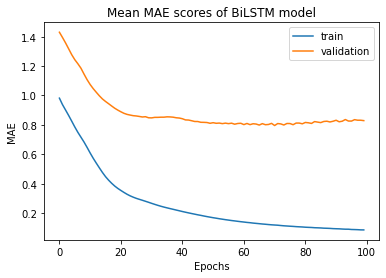

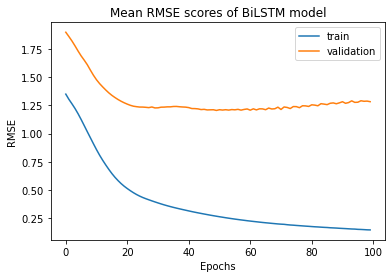

In [28]:
visualize_performance(results_tcmt_cpt_x[1])

Optimal Mean MAE: 1.0231927698478103 @ epoch 48
Optimal Mean RMSE: 1.5428102120757103 @ epoch 20


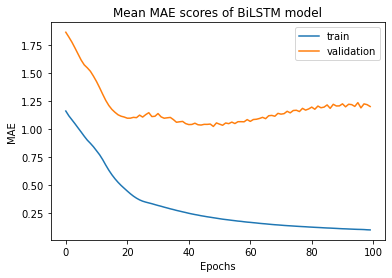

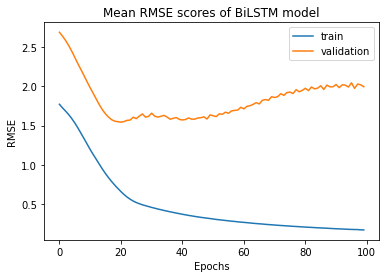

In [29]:
visualize_performance(results_tcmt_cpt_y[1])

Optimal Mean MAE: 0.8497775085270405 @ epoch 31
Optimal Mean RMSE: 1.2217181373387576 @ epoch 29


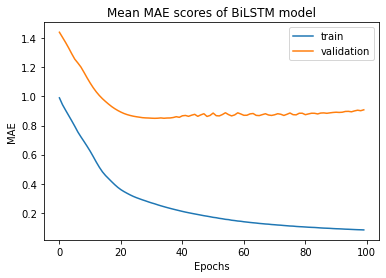

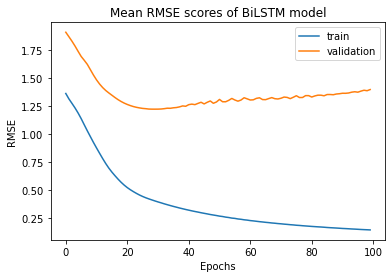

In [30]:
visualize_performance(results_tcmt_cpt_z[1])

### CPT Only

In [31]:
results_cpt_x = train_objects(df=train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False)
results_cpt_y = train_objects(df=train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False)
results_cpt_z = train_objects(df=train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.6774 - mean_absolute_error: 1.9101 - root_mean_squared_error: 2.5841 - val_loss: 11.4034 - val_mean_absolute_error: 2.7348 - val_root_mean_squared_error: 3.3769
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 6.3950 - mean_absolute_error: 1.8642 - root_mean_squared_error: 2.5288 - val_loss: 11.1823 - val_mean_absolute_error: 2.7069 - val_root_mean_squared_error: 3.3440
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 6.1177 - mean_absolute_error: 1.8176 - root_mean_squared_error: 2.4734 - val_loss: 10.9563 - val_mean_absolute_error: 2.6768 - val_root_mean_squared_error: 3.3100
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 5.8135 - mean_absolute_error: 1.7657 - root_mean_squared_error: 2.4111 - val_loss: 10.7059 - val_mean_absolute_error: 2.6420 - val_root_mean_squared_error: 3.2720
Epoch 5/100
1/1 [==============================] - 0s 44ms/ste

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0657 - mean_absolute_error: 0.6254 - root_mean_squared_error: 1.0323 - val_loss: 9.4160 - val_mean_absolute_error: 2.2449 - val_root_mean_squared_error: 3.0686
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 1.0619 - mean_absolute_error: 0.6246 - root_mean_squared_error: 1.0305 - val_loss: 9.4217 - val_mean_absolute_error: 2.2483 - val_root_mean_squared_error: 3.0695
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0585 - mean_absolute_error: 0.6232 - root_mean_squared_error: 1.0288 - val_loss: 9.4047 - val_mean_absolute_error: 2.2504 - val_root_mean_squared_error: 3.0667
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0546 - mean_absolute_error: 0.6205 - root_mean_squared_error: 1.0269 - val_loss: 9.3784 - val_mean_absolute_error: 2.2517 - val_root_mean_squared_error: 3.0624
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0126 - mean_absolute_error: 0.5747 - root_mean_squared_error: 1.0063 - val_loss: 9.3678 - val_mean_absolute_error: 2.2454 - val_root_mean_squared_error: 3.0607
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 1.0124 - mean_absolute_error: 0.5746 - root_mean_squared_error: 1.0062 - val_loss: 9.3580 - val_mean_absolute_error: 2.2439 - val_root_mean_squared_error: 3.0591
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0123 - mean_absolute_error: 0.5745 - root_mean_squared_error: 1.0061 - val_loss: 9.3498 - val_mean_absolute_error: 2.2428 - val_root_mean_squared_error: 3.0577
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0122 - mean_absolute_error: 0.5744 - root_mean_squared_error: 1.0061 - val_loss: 9.3461 - val_mean_absolute_error: 2.2421 - val_root_mean_squared_error: 3.0571
Epoch 75/100
1/1 [==============================] - 0s 46ms/

  5%|████▏                                                                              | 1/20 [00:07<02:15,  7.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1916 - mean_absolute_error: 0.8201 - root_mean_squared_error: 1.0916 - val_loss: 2.2303 - val_mean_absolute_error: 1.1293 - val_root_mean_squared_error: 1.4934
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 1.1087 - mean_absolute_error: 0.7828 - root_mean_squared_error: 1.0530 - val_loss: 2.1325 - val_mean_absolute_error: 1.0977 - val_root_mean_squared_error: 1.4603
Epoch 3/100
1/1 [==============================] - 0s 47ms/step - loss: 1.0422 - mean_absolute_error: 0.7527 - root_mean_squared_error: 1.0209 - val_loss: 2.0334 - val_mean_absolute_error: 1.0653 - val_root_mean_squared_error: 1.4260
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.9796 - mean_absolute_error: 0.7241 - root_mean_squared_error: 0.9898 - val_loss: 1.9211 - val_mean_absolute_error: 1.0298 - val_root_mean_squared_error: 1.3860
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1155 - mean_absolute_error: 0.2321 - root_mean_squared_error: 0.3399 - val_loss: 0.5215 - val_mean_absolute_error: 0.5390 - val_root_mean_squared_error: 0.7221
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1150 - mean_absolute_error: 0.2320 - root_mean_squared_error: 0.3392 - val_loss: 0.5226 - val_mean_absolute_error: 0.5392 - val_root_mean_squared_error: 0.7229
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1142 - mean_absolute_error: 0.2311 - root_mean_squared_error: 0.3380 - val_loss: 0.5265 - val_mean_absolute_error: 0.5406 - val_root_mean_squared_error: 0.7256
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1133 - mean_absolute_error: 0.2295 - root_mean_squared_error: 0.3366 - val_loss: 0.5288 - val_mean_absolute_error: 0.5416 - val_root_mean_squared_error: 0.7272
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1053 - mean_absolute_error: 0.2128 - root_mean_squared_error: 0.3245 - val_loss: 0.5150 - val_mean_absolute_error: 0.5312 - val_root_mean_squared_error: 0.7176
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1053 - mean_absolute_error: 0.2126 - root_mean_squared_error: 0.3245 - val_loss: 0.5146 - val_mean_absolute_error: 0.5310 - val_root_mean_squared_error: 0.7174
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1052 - mean_absolute_error: 0.2126 - root_mean_squared_error: 0.3244 - val_loss: 0.5142 - val_mean_absolute_error: 0.5308 - val_root_mean_squared_error: 0.7171
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1052 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.3243 - val_loss: 0.5138 - val_mean_absolute_error: 0.5308 - val_root_mean_squared_error: 0.7168
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 10%|████████▎                                                                          | 2/20 [00:14<02:13,  7.42s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.0020 - mean_absolute_error: 1.0175 - root_mean_squared_error: 1.4149 - val_loss: 1.9394 - val_mean_absolute_error: 1.1003 - val_root_mean_squared_error: 1.3926
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.9136 - mean_absolute_error: 0.9905 - root_mean_squared_error: 1.3833 - val_loss: 1.8700 - val_mean_absolute_error: 1.0801 - val_root_mean_squared_error: 1.3675
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 1.8302 - mean_absolute_error: 0.9663 - root_mean_squared_error: 1.3528 - val_loss: 1.7982 - val_mean_absolute_error: 1.0602 - val_root_mean_squared_error: 1.3410
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 1.7445 - mean_absolute_error: 0.9422 - root_mean_squared_error: 1.3208 - val_loss: 1.7209 - val_mean_absolute_error: 1.0356 - val_root_mean_squared_error: 1.3118
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1981 - mean_absolute_error: 0.3024 - root_mean_squared_error: 0.4451 - val_loss: 0.7736 - val_mean_absolute_error: 0.6178 - val_root_mean_squared_error: 0.8796
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1941 - mean_absolute_error: 0.2991 - root_mean_squared_error: 0.4405 - val_loss: 0.7743 - val_mean_absolute_error: 0.6192 - val_root_mean_squared_error: 0.8799
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1902 - mean_absolute_error: 0.2948 - root_mean_squared_error: 0.4361 - val_loss: 0.7729 - val_mean_absolute_error: 0.6187 - val_root_mean_squared_error: 0.8791
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1865 - mean_absolute_error: 0.2901 - root_mean_squared_error: 0.4319 - val_loss: 0.7699 - val_mean_absolute_error: 0.6172 - val_root_mean_squared_error: 0.8774
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1670 - mean_absolute_error: 0.2559 - root_mean_squared_error: 0.4087 - val_loss: 0.7198 - val_mean_absolute_error: 0.5991 - val_root_mean_squared_error: 0.8484
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1670 - mean_absolute_error: 0.2558 - root_mean_squared_error: 0.4086 - val_loss: 0.7199 - val_mean_absolute_error: 0.5988 - val_root_mean_squared_error: 0.8485
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1669 - mean_absolute_error: 0.2558 - root_mean_squared_error: 0.4086 - val_loss: 0.7199 - val_mean_absolute_error: 0.5989 - val_root_mean_squared_error: 0.8485
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1669 - mean_absolute_error: 0.2557 - root_mean_squared_error: 0.4085 - val_loss: 0.7202 - val_mean_absolute_error: 0.5994 - val_root_mean_squared_error: 0.8487
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 15%|████████████▍                                                                      | 3/20 [00:21<02:00,  7.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.4123 - mean_absolute_error: 1.0595 - root_mean_squared_error: 1.5531 - val_loss: 3.9740 - val_mean_absolute_error: 1.3625 - val_root_mean_squared_error: 1.9935
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 2.2615 - mean_absolute_error: 1.0096 - root_mean_squared_error: 1.5038 - val_loss: 3.8348 - val_mean_absolute_error: 1.3328 - val_root_mean_squared_error: 1.9583
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 2.1522 - mean_absolute_error: 0.9779 - root_mean_squared_error: 1.4670 - val_loss: 3.7173 - val_mean_absolute_error: 1.3066 - val_root_mean_squared_error: 1.9280
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 2.0642 - mean_absolute_error: 0.9520 - root_mean_squared_error: 1.4367 - val_loss: 3.6044 - val_mean_absolute_error: 1.2799 - val_root_mean_squared_error: 1.8985
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1033 - mean_absolute_error: 0.2285 - root_mean_squared_error: 0.3214 - val_loss: 0.8313 - val_mean_absolute_error: 0.5462 - val_root_mean_squared_error: 0.9118
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1005 - mean_absolute_error: 0.2248 - root_mean_squared_error: 0.3171 - val_loss: 0.8283 - val_mean_absolute_error: 0.5417 - val_root_mean_squared_error: 0.9101
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0976 - mean_absolute_error: 0.2199 - root_mean_squared_error: 0.3123 - val_loss: 0.8262 - val_mean_absolute_error: 0.5392 - val_root_mean_squared_error: 0.9090
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0952 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3085 - val_loss: 0.8269 - val_mean_absolute_error: 0.5382 - val_root_mean_squared_error: 0.9093
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0642 - mean_absolute_error: 0.1518 - root_mean_squared_error: 0.2534 - val_loss: 0.8012 - val_mean_absolute_error: 0.4907 - val_root_mean_squared_error: 0.8951
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0641 - mean_absolute_error: 0.1511 - root_mean_squared_error: 0.2531 - val_loss: 0.8007 - val_mean_absolute_error: 0.4914 - val_root_mean_squared_error: 0.8948
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0640 - mean_absolute_error: 0.1505 - root_mean_squared_error: 0.2530 - val_loss: 0.8009 - val_mean_absolute_error: 0.4924 - val_root_mean_squared_error: 0.8949
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0639 - mean_absolute_error: 0.1502 - root_mean_squared_error: 0.2529 - val_loss: 0.8009 - val_mean_absolute_error: 0.4933 - val_root_mean_squared_error: 0.8949
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 20%|████████████████▌                                                                  | 4/20 [00:28<01:54,  7.13s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1444 - mean_absolute_error: 1.4906 - root_mean_squared_error: 2.0358 - val_loss: 2.6495 - val_mean_absolute_error: 1.3372 - val_root_mean_squared_error: 1.6277
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.9964 - mean_absolute_error: 1.4614 - root_mean_squared_error: 1.9991 - val_loss: 2.5536 - val_mean_absolute_error: 1.3121 - val_root_mean_squared_error: 1.5980
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 3.8578 - mean_absolute_error: 1.4312 - root_mean_squared_error: 1.9641 - val_loss: 2.4534 - val_mean_absolute_error: 1.2836 - val_root_mean_squared_error: 1.5663
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 3.7140 - mean_absolute_error: 1.3971 - root_mean_squared_error: 1.9272 - val_loss: 2.3414 - val_mean_absolute_error: 1.2497 - val_root_mean_squared_error: 1.5302
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2633 - mean_absolute_error: 0.3586 - root_mean_squared_error: 0.5131 - val_loss: 1.3420 - val_mean_absolute_error: 0.8450 - val_root_mean_squared_error: 1.1585
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2588 - mean_absolute_error: 0.3560 - root_mean_squared_error: 0.5088 - val_loss: 1.3363 - val_mean_absolute_error: 0.8462 - val_root_mean_squared_error: 1.1560
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2545 - mean_absolute_error: 0.3525 - root_mean_squared_error: 0.5045 - val_loss: 1.3198 - val_mean_absolute_error: 0.8429 - val_root_mean_squared_error: 1.1488
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2503 - mean_absolute_error: 0.3476 - root_mean_squared_error: 0.5003 - val_loss: 1.3040 - val_mean_absolute_error: 0.8367 - val_root_mean_squared_error: 1.1420
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2157 - mean_absolute_error: 0.2987 - root_mean_squared_error: 0.4644 - val_loss: 1.2940 - val_mean_absolute_error: 0.8214 - val_root_mean_squared_error: 1.1375
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2156 - mean_absolute_error: 0.2986 - root_mean_squared_error: 0.4643 - val_loss: 1.2915 - val_mean_absolute_error: 0.8207 - val_root_mean_squared_error: 1.1364
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2155 - mean_absolute_error: 0.2985 - root_mean_squared_error: 0.4642 - val_loss: 1.2879 - val_mean_absolute_error: 0.8197 - val_root_mean_squared_error: 1.1349
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2154 - mean_absolute_error: 0.2985 - root_mean_squared_error: 0.4641 - val_loss: 1.2856 - val_mean_absolute_error: 0.8188 - val_root_mean_squared_error: 1.1338
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 25%|████████████████████▊                                                              | 5/20 [00:35<01:47,  7.18s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3520 - mean_absolute_error: 0.9085 - root_mean_squared_error: 1.1628 - val_loss: 2.4794 - val_mean_absolute_error: 1.0682 - val_root_mean_squared_error: 1.5746
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.2713 - mean_absolute_error: 0.8759 - root_mean_squared_error: 1.1275 - val_loss: 2.4197 - val_mean_absolute_error: 1.0460 - val_root_mean_squared_error: 1.5555
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.1957 - mean_absolute_error: 0.8441 - root_mean_squared_error: 1.0935 - val_loss: 2.3641 - val_mean_absolute_error: 1.0256 - val_root_mean_squared_error: 1.5376
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1217 - mean_absolute_error: 0.8119 - root_mean_squared_error: 1.0591 - val_loss: 2.3071 - val_mean_absolute_error: 1.0066 - val_root_mean_squared_error: 1.5189
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1107 - mean_absolute_error: 0.2354 - root_mean_squared_error: 0.3327 - val_loss: 1.5379 - val_mean_absolute_error: 0.8417 - val_root_mean_squared_error: 1.2401
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1101 - mean_absolute_error: 0.2335 - root_mean_squared_error: 0.3319 - val_loss: 1.5444 - val_mean_absolute_error: 0.8430 - val_root_mean_squared_error: 1.2427
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1096 - mean_absolute_error: 0.2322 - root_mean_squared_error: 0.3310 - val_loss: 1.5519 - val_mean_absolute_error: 0.8447 - val_root_mean_squared_error: 1.2458
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1090 - mean_absolute_error: 0.2312 - root_mean_squared_error: 0.3302 - val_loss: 1.5601 - val_mean_absolute_error: 0.8467 - val_root_mean_squared_error: 1.2490
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1018 - mean_absolute_error: 0.2148 - root_mean_squared_error: 0.3190 - val_loss: 1.5515 - val_mean_absolute_error: 0.8462 - val_root_mean_squared_error: 1.2456
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1018 - mean_absolute_error: 0.2147 - root_mean_squared_error: 0.3190 - val_loss: 1.5520 - val_mean_absolute_error: 0.8461 - val_root_mean_squared_error: 1.2458
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1017 - mean_absolute_error: 0.2146 - root_mean_squared_error: 0.3190 - val_loss: 1.5523 - val_mean_absolute_error: 0.8459 - val_root_mean_squared_error: 1.2459
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1017 - mean_absolute_error: 0.2145 - root_mean_squared_error: 0.3189 - val_loss: 1.5527 - val_mean_absolute_error: 0.8459 - val_root_mean_squared_error: 1.2461
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 30%|████████████████████████▉                                                          | 6/20 [00:43<01:40,  7.21s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.3970 - mean_absolute_error: 0.4909 - root_mean_squared_error: 0.6301 - val_loss: 1.1817 - val_mean_absolute_error: 0.7936 - val_root_mean_squared_error: 1.0870
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3674 - mean_absolute_error: 0.4675 - root_mean_squared_error: 0.6062 - val_loss: 1.1657 - val_mean_absolute_error: 0.7871 - val_root_mean_squared_error: 1.0797
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3471 - mean_absolute_error: 0.4504 - root_mean_squared_error: 0.5891 - val_loss: 1.1487 - val_mean_absolute_error: 0.7797 - val_root_mean_squared_error: 1.0718
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3297 - mean_absolute_error: 0.4351 - root_mean_squared_error: 0.5742 - val_loss: 1.1307 - val_mean_absolute_error: 0.7715 - val_root_mean_squared_error: 1.0633
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1464 - mean_absolute_error: 0.2496 - root_mean_squared_error: 0.3826 - val_loss: 0.8020 - val_mean_absolute_error: 0.6358 - val_root_mean_squared_error: 0.8955
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1462 - mean_absolute_error: 0.2492 - root_mean_squared_error: 0.3824 - val_loss: 0.8023 - val_mean_absolute_error: 0.6365 - val_root_mean_squared_error: 0.8957
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1461 - mean_absolute_error: 0.2488 - root_mean_squared_error: 0.3822 - val_loss: 0.8032 - val_mean_absolute_error: 0.6373 - val_root_mean_squared_error: 0.8962
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1459 - mean_absolute_error: 0.2485 - root_mean_squared_error: 0.3820 - val_loss: 0.8043 - val_mean_absolute_error: 0.6379 - val_root_mean_squared_error: 0.8968
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1443 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3798 - val_loss: 0.7991 - val_mean_absolute_error: 0.6329 - val_root_mean_squared_error: 0.8939
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1443 - mean_absolute_error: 0.2450 - root_mean_squared_error: 0.3798 - val_loss: 0.7989 - val_mean_absolute_error: 0.6328 - val_root_mean_squared_error: 0.8938
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1443 - mean_absolute_error: 0.2450 - root_mean_squared_error: 0.3798 - val_loss: 0.7988 - val_mean_absolute_error: 0.6329 - val_root_mean_squared_error: 0.8938
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1443 - mean_absolute_error: 0.2450 - root_mean_squared_error: 0.3798 - val_loss: 0.7988 - val_mean_absolute_error: 0.6329 - val_root_mean_squared_error: 0.8938
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 35%|█████████████████████████████                                                      | 7/20 [00:50<01:34,  7.26s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1665 - mean_absolute_error: 0.8269 - root_mean_squared_error: 1.0801 - val_loss: 2.0196 - val_mean_absolute_error: 1.0946 - val_root_mean_squared_error: 1.4211
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0212 - mean_absolute_error: 0.7651 - root_mean_squared_error: 1.0105 - val_loss: 1.9079 - val_mean_absolute_error: 1.0639 - val_root_mean_squared_error: 1.3813
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.9160 - mean_absolute_error: 0.7203 - root_mean_squared_error: 0.9571 - val_loss: 1.8163 - val_mean_absolute_error: 1.0390 - val_root_mean_squared_error: 1.3477
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8303 - mean_absolute_error: 0.6864 - root_mean_squared_error: 0.9112 - val_loss: 1.7423 - val_mean_absolute_error: 1.0202 - val_root_mean_squared_error: 1.3200
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1518 - mean_absolute_error: 0.2710 - root_mean_squared_error: 0.3896 - val_loss: 0.9493 - val_mean_absolute_error: 0.6465 - val_root_mean_squared_error: 0.9743
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1512 - mean_absolute_error: 0.2703 - root_mean_squared_error: 0.3888 - val_loss: 0.9490 - val_mean_absolute_error: 0.6460 - val_root_mean_squared_error: 0.9742
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1505 - mean_absolute_error: 0.2694 - root_mean_squared_error: 0.3880 - val_loss: 0.9478 - val_mean_absolute_error: 0.6438 - val_root_mean_squared_error: 0.9735
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1498 - mean_absolute_error: 0.2682 - root_mean_squared_error: 0.3870 - val_loss: 0.9452 - val_mean_absolute_error: 0.6405 - val_root_mean_squared_error: 0.9722
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1440 - mean_absolute_error: 0.2579 - root_mean_squared_error: 0.3795 - val_loss: 0.9249 - val_mean_absolute_error: 0.6345 - val_root_mean_squared_error: 0.9617
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1440 - mean_absolute_error: 0.2578 - root_mean_squared_error: 0.3794 - val_loss: 0.9249 - val_mean_absolute_error: 0.6341 - val_root_mean_squared_error: 0.9617
Epoch 73/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1440 - mean_absolute_error: 0.2577 - root_mean_squared_error: 0.3794 - val_loss: 0.9253 - val_mean_absolute_error: 0.6341 - val_root_mean_squared_error: 0.9619
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1440 - mean_absolute_error: 0.2576 - root_mean_squared_error: 0.3794 - val_loss: 0.9260 - val_mean_absolute_error: 0.6344 - val_root_mean_squared_error: 0.9623
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:58<01:28,  7.39s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.2188 - mean_absolute_error: 1.3129 - root_mean_squared_error: 2.0540 - val_loss: 14.5470 - val_mean_absolute_error: 2.8490 - val_root_mean_squared_error: 3.8141
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.1706 - mean_absolute_error: 1.2985 - root_mean_squared_error: 2.0422 - val_loss: 14.4758 - val_mean_absolute_error: 2.8387 - val_root_mean_squared_error: 3.8047
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 4.1315 - mean_absolute_error: 1.2873 - root_mean_squared_error: 2.0326 - val_loss: 14.4062 - val_mean_absolute_error: 2.8290 - val_root_mean_squared_error: 3.7956
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.0935 - mean_absolute_error: 1.2767 - root_mean_squared_error: 2.0232 - val_loss: 14.3303 - val_mean_absolute_error: 2.8186 - val_root_mean_squared_error: 3.7855
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 2.1248 - mean_absolute_error: 0.8059 - root_mean_squared_error: 1.4577 - val_loss: 8.9320 - val_mean_absolute_error: 2.1357 - val_root_mean_squared_error: 2.9886
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1176 - mean_absolute_error: 0.8019 - root_mean_squared_error: 1.4552 - val_loss: 8.9264 - val_mean_absolute_error: 2.1356 - val_root_mean_squared_error: 2.9877
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1110 - mean_absolute_error: 0.7975 - root_mean_squared_error: 1.4529 - val_loss: 8.9401 - val_mean_absolute_error: 2.1387 - val_root_mean_squared_error: 2.9900
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1053 - mean_absolute_error: 0.7924 - root_mean_squared_error: 1.4510 - val_loss: 8.9582 - val_mean_absolute_error: 2.1422 - val_root_mean_squared_error: 2.9930
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 2.0580 - mean_absolute_error: 0.7668 - root_mean_squared_error: 1.4346 - val_loss: 8.8488 - val_mean_absolute_error: 2.1285 - val_root_mean_squared_error: 2.9747
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 2.0579 - mean_absolute_error: 0.7666 - root_mean_squared_error: 1.4345 - val_loss: 8.8503 - val_mean_absolute_error: 2.1286 - val_root_mean_squared_error: 2.9749
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 2.0577 - mean_absolute_error: 0.7664 - root_mean_squared_error: 1.4345 - val_loss: 8.8535 - val_mean_absolute_error: 2.1288 - val_root_mean_squared_error: 2.9755
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 2.0576 - mean_absolute_error: 0.7662 - root_mean_squared_error: 1.4344 - val_loss: 8.8569 - val_mean_absolute_error: 2.1292 - val_root_mean_squared_error: 2.9761
Epoch 75/100
1/1 [==============================] - 0s 44ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:05<01:21,  7.44s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 0.9989 - mean_absolute_error: 0.6539 - root_mean_squared_error: 0.9995 - val_loss: 2.9636 - val_mean_absolute_error: 1.1599 - val_root_mean_squared_error: 1.7215
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 0.9473 - mean_absolute_error: 0.6262 - root_mean_squared_error: 0.9733 - val_loss: 2.9090 - val_mean_absolute_error: 1.1400 - val_root_mean_squared_error: 1.7056
Epoch 3/100
1/1 [==============================] - 0s 49ms/step - loss: 0.9013 - mean_absolute_error: 0.6013 - root_mean_squared_error: 0.9493 - val_loss: 2.8565 - val_mean_absolute_error: 1.1200 - val_root_mean_squared_error: 1.6901
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 0.8562 - mean_absolute_error: 0.5769 - root_mean_squared_error: 0.9253 - val_loss: 2.7995 - val_mean_absolute_error: 1.0989 - val_root_mean_squared_error: 1.6732
Epoch 5/100
1/1 [==============================] - 0s 52ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0403 - mean_absolute_error: 0.1348 - root_mean_squared_error: 0.2008 - val_loss: 1.7396 - val_mean_absolute_error: 0.7276 - val_root_mean_squared_error: 1.3189
Epoch 37/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0386 - mean_absolute_error: 0.1298 - root_mean_squared_error: 0.1965 - val_loss: 1.7392 - val_mean_absolute_error: 0.7267 - val_root_mean_squared_error: 1.3188
Epoch 38/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0372 - mean_absolute_error: 0.1255 - root_mean_squared_error: 0.1929 - val_loss: 1.7366 - val_mean_absolute_error: 0.7242 - val_root_mean_squared_error: 1.3178
Epoch 39/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0359 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.1896 - val_loss: 1.7319 - val_mean_absolute_error: 0.7202 - val_root_mean_squared_error: 1.3160
Epoch 40/100
1/1 [==============================] - 0s 57ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0278 - mean_absolute_error: 0.0958 - root_mean_squared_error: 0.1666 - val_loss: 1.7044 - val_mean_absolute_error: 0.7025 - val_root_mean_squared_error: 1.3055
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0277 - mean_absolute_error: 0.0956 - root_mean_squared_error: 0.1665 - val_loss: 1.7053 - val_mean_absolute_error: 0.7029 - val_root_mean_squared_error: 1.3059
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0277 - mean_absolute_error: 0.0955 - root_mean_squared_error: 0.1665 - val_loss: 1.7056 - val_mean_absolute_error: 0.7031 - val_root_mean_squared_error: 1.3060
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0277 - mean_absolute_error: 0.0954 - root_mean_squared_error: 0.1664 - val_loss: 1.7053 - val_mean_absolute_error: 0.7031 - val_root_mean_squared_error: 1.3059
Epoch 75/100
1/1 [==============================] - 0s 47ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:16<01:24,  8.44s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 5.0959 - mean_absolute_error: 1.7107 - root_mean_squared_error: 2.2574 - val_loss: 8.9652 - val_mean_absolute_error: 2.2891 - val_root_mean_squared_error: 2.9942
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.9711 - mean_absolute_error: 1.6823 - root_mean_squared_error: 2.2296 - val_loss: 8.8201 - val_mean_absolute_error: 2.2642 - val_root_mean_squared_error: 2.9699
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 4.8585 - mean_absolute_error: 1.6561 - root_mean_squared_error: 2.2042 - val_loss: 8.6681 - val_mean_absolute_error: 2.2372 - val_root_mean_squared_error: 2.9442
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 4.7438 - mean_absolute_error: 1.6285 - root_mean_squared_error: 2.1780 - val_loss: 8.4937 - val_mean_absolute_error: 2.2060 - val_root_mean_squared_error: 2.9144
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6179 - mean_absolute_error: 0.5398 - root_mean_squared_error: 0.7861 - val_loss: 1.6838 - val_mean_absolute_error: 0.9422 - val_root_mean_squared_error: 1.2976
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.6066 - mean_absolute_error: 0.5323 - root_mean_squared_error: 0.7788 - val_loss: 1.7204 - val_mean_absolute_error: 0.9586 - val_root_mean_squared_error: 1.3116
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5953 - mean_absolute_error: 0.5242 - root_mean_squared_error: 0.7716 - val_loss: 1.7627 - val_mean_absolute_error: 0.9761 - val_root_mean_squared_error: 1.3277
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5881 - mean_absolute_error: 0.5184 - root_mean_squared_error: 0.7668 - val_loss: 1.7908 - val_mean_absolute_error: 0.9879 - val_root_mean_squared_error: 1.3382
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5319 - mean_absolute_error: 0.4722 - root_mean_squared_error: 0.7293 - val_loss: 1.6447 - val_mean_absolute_error: 0.9483 - val_root_mean_squared_error: 1.2825
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.5317 - mean_absolute_error: 0.4720 - root_mean_squared_error: 0.7292 - val_loss: 1.6360 - val_mean_absolute_error: 0.9450 - val_root_mean_squared_error: 1.2791
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5316 - mean_absolute_error: 0.4718 - root_mean_squared_error: 0.7291 - val_loss: 1.6265 - val_mean_absolute_error: 0.9413 - val_root_mean_squared_error: 1.2753
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5315 - mean_absolute_error: 0.4717 - root_mean_squared_error: 0.7291 - val_loss: 1.6199 - val_mean_absolute_error: 0.9388 - val_root_mean_squared_error: 1.2727
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:25<01:18,  8.76s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 7.9315 - mean_absolute_error: 2.0981 - root_mean_squared_error: 2.8163 - val_loss: 11.4709 - val_mean_absolute_error: 2.5599 - val_root_mean_squared_error: 3.3869
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 7.7819 - mean_absolute_error: 2.0718 - root_mean_squared_error: 2.7896 - val_loss: 11.2945 - val_mean_absolute_error: 2.5337 - val_root_mean_squared_error: 3.3607
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 7.6243 - mean_absolute_error: 2.0436 - root_mean_squared_error: 2.7612 - val_loss: 11.0703 - val_mean_absolute_error: 2.5007 - val_root_mean_squared_error: 3.3272
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 7.4263 - mean_absolute_error: 2.0070 - root_mean_squared_error: 2.7251 - val_loss: 10.7699 - val_mean_absolute_error: 2.4555 - val_root_mean_squared_error: 3.2817
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4443 - mean_absolute_error: 0.7859 - root_mean_squared_error: 1.2018 - val_loss: 3.9304 - val_mean_absolute_error: 1.4968 - val_root_mean_squared_error: 1.9825
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 1.4334 - mean_absolute_error: 0.7797 - root_mean_squared_error: 1.1973 - val_loss: 3.9167 - val_mean_absolute_error: 1.4894 - val_root_mean_squared_error: 1.9791
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 1.4231 - mean_absolute_error: 0.7741 - root_mean_squared_error: 1.1929 - val_loss: 3.9032 - val_mean_absolute_error: 1.4834 - val_root_mean_squared_error: 1.9757
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4147 - mean_absolute_error: 0.7695 - root_mean_squared_error: 1.1894 - val_loss: 3.8927 - val_mean_absolute_error: 1.4793 - val_root_mean_squared_error: 1.9730
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 1.3673 - mean_absolute_error: 0.7424 - root_mean_squared_error: 1.1693 - val_loss: 3.8489 - val_mean_absolute_error: 1.4776 - val_root_mean_squared_error: 1.9619
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 1.3671 - mean_absolute_error: 0.7423 - root_mean_squared_error: 1.1692 - val_loss: 3.8498 - val_mean_absolute_error: 1.4779 - val_root_mean_squared_error: 1.9621
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 1.3669 - mean_absolute_error: 0.7422 - root_mean_squared_error: 1.1692 - val_loss: 3.8501 - val_mean_absolute_error: 1.4779 - val_root_mean_squared_error: 1.9622
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 1.3668 - mean_absolute_error: 0.7422 - root_mean_squared_error: 1.1691 - val_loss: 3.8496 - val_mean_absolute_error: 1.4774 - val_root_mean_squared_error: 1.9620
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:33<01:07,  8.39s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.2694 - mean_absolute_error: 0.4085 - root_mean_squared_error: 0.5190 - val_loss: 0.4694 - val_mean_absolute_error: 0.5383 - val_root_mean_squared_error: 0.6852
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2426 - mean_absolute_error: 0.3820 - root_mean_squared_error: 0.4925 - val_loss: 0.4422 - val_mean_absolute_error: 0.5181 - val_root_mean_squared_error: 0.6650
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2232 - mean_absolute_error: 0.3619 - root_mean_squared_error: 0.4724 - val_loss: 0.4155 - val_mean_absolute_error: 0.4972 - val_root_mean_squared_error: 0.6446
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2061 - mean_absolute_error: 0.3423 - root_mean_squared_error: 0.4540 - val_loss: 0.3867 - val_mean_absolute_error: 0.4733 - val_root_mean_squared_error: 0.6219
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0093 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.0966 - val_loss: 0.0466 - val_mean_absolute_error: 0.1662 - val_root_mean_squared_error: 0.2158
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0090 - mean_absolute_error: 0.0682 - root_mean_squared_error: 0.0950 - val_loss: 0.0461 - val_mean_absolute_error: 0.1655 - val_root_mean_squared_error: 0.2147
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0088 - mean_absolute_error: 0.0672 - root_mean_squared_error: 0.0938 - val_loss: 0.0458 - val_mean_absolute_error: 0.1650 - val_root_mean_squared_error: 0.2141
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0086 - mean_absolute_error: 0.0662 - root_mean_squared_error: 0.0928 - val_loss: 0.0458 - val_mean_absolute_error: 0.1651 - val_root_mean_squared_error: 0.2140
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0071 - mean_absolute_error: 0.0579 - root_mean_squared_error: 0.0845 - val_loss: 0.0433 - val_mean_absolute_error: 0.1610 - val_root_mean_squared_error: 0.2080
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0071 - mean_absolute_error: 0.0579 - root_mean_squared_error: 0.0845 - val_loss: 0.0432 - val_mean_absolute_error: 0.1609 - val_root_mean_squared_error: 0.2079
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0071 - mean_absolute_error: 0.0578 - root_mean_squared_error: 0.0845 - val_loss: 0.0432 - val_mean_absolute_error: 0.1608 - val_root_mean_squared_error: 0.2078
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0071 - mean_absolute_error: 0.0578 - root_mean_squared_error: 0.0844 - val_loss: 0.0432 - val_mean_absolute_error: 0.1608 - val_root_mean_squared_error: 0.2078
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:39<00:54,  7.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8581 - mean_absolute_error: 0.8278 - root_mean_squared_error: 1.3631 - val_loss: 9.8760 - val_mean_absolute_error: 2.2861 - val_root_mean_squared_error: 3.1426
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.8068 - mean_absolute_error: 0.8099 - root_mean_squared_error: 1.3442 - val_loss: 9.8021 - val_mean_absolute_error: 2.2751 - val_root_mean_squared_error: 3.1308
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.7702 - mean_absolute_error: 0.7998 - root_mean_squared_error: 1.3305 - val_loss: 9.7274 - val_mean_absolute_error: 2.2642 - val_root_mean_squared_error: 3.1189
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7385 - mean_absolute_error: 0.7930 - root_mean_squared_error: 1.3185 - val_loss: 9.6455 - val_mean_absolute_error: 2.2522 - val_root_mean_squared_error: 3.1057
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1198 - mean_absolute_error: 0.6150 - root_mean_squared_error: 1.0582 - val_loss: 7.3948 - val_mean_absolute_error: 1.9121 - val_root_mean_squared_error: 2.7193
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1176 - mean_absolute_error: 0.6141 - root_mean_squared_error: 1.0572 - val_loss: 7.3779 - val_mean_absolute_error: 1.9102 - val_root_mean_squared_error: 2.7162
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1156 - mean_absolute_error: 0.6134 - root_mean_squared_error: 1.0562 - val_loss: 7.3607 - val_mean_absolute_error: 1.9087 - val_root_mean_squared_error: 2.7131
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1138 - mean_absolute_error: 0.6125 - root_mean_squared_error: 1.0554 - val_loss: 7.3447 - val_mean_absolute_error: 1.9073 - val_root_mean_squared_error: 2.7101
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1021 - mean_absolute_error: 0.6046 - root_mean_squared_error: 1.0498 - val_loss: 7.2835 - val_mean_absolute_error: 1.9029 - val_root_mean_squared_error: 2.6988
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1021 - mean_absolute_error: 0.6045 - root_mean_squared_error: 1.0498 - val_loss: 7.2840 - val_mean_absolute_error: 1.9028 - val_root_mean_squared_error: 2.6989
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1021 - mean_absolute_error: 0.6044 - root_mean_squared_error: 1.0498 - val_loss: 7.2835 - val_mean_absolute_error: 1.9026 - val_root_mean_squared_error: 2.6988
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 1.1021 - mean_absolute_error: 0.6044 - root_mean_squared_error: 1.0498 - val_loss: 7.2839 - val_mean_absolute_error: 1.9025 - val_root_mean_squared_error: 2.6989
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:46<00:44,  7.45s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6890 - mean_absolute_error: 0.5923 - root_mean_squared_error: 0.8300 - val_loss: 1.1521 - val_mean_absolute_error: 0.7490 - val_root_mean_squared_error: 1.0734
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6471 - mean_absolute_error: 0.5668 - root_mean_squared_error: 0.8044 - val_loss: 1.1071 - val_mean_absolute_error: 0.7321 - val_root_mean_squared_error: 1.0522
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6131 - mean_absolute_error: 0.5476 - root_mean_squared_error: 0.7830 - val_loss: 1.0626 - val_mean_absolute_error: 0.7170 - val_root_mean_squared_error: 1.0308
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5812 - mean_absolute_error: 0.5322 - root_mean_squared_error: 0.7623 - val_loss: 1.0153 - val_mean_absolute_error: 0.7017 - val_root_mean_squared_error: 1.0076
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0832 - mean_absolute_error: 0.1889 - root_mean_squared_error: 0.2884 - val_loss: 0.1993 - val_mean_absolute_error: 0.3344 - val_root_mean_squared_error: 0.4464
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0826 - mean_absolute_error: 0.1881 - root_mean_squared_error: 0.2874 - val_loss: 0.1984 - val_mean_absolute_error: 0.3332 - val_root_mean_squared_error: 0.4454
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0820 - mean_absolute_error: 0.1866 - root_mean_squared_error: 0.2863 - val_loss: 0.1983 - val_mean_absolute_error: 0.3329 - val_root_mean_squared_error: 0.4453
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0814 - mean_absolute_error: 0.1853 - root_mean_squared_error: 0.2853 - val_loss: 0.1984 - val_mean_absolute_error: 0.3334 - val_root_mean_squared_error: 0.4455
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0763 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.2763 - val_loss: 0.1952 - val_mean_absolute_error: 0.3262 - val_root_mean_squared_error: 0.4418
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0763 - mean_absolute_error: 0.1699 - root_mean_squared_error: 0.2763 - val_loss: 0.1954 - val_mean_absolute_error: 0.3261 - val_root_mean_squared_error: 0.4420
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0763 - mean_absolute_error: 0.1698 - root_mean_squared_error: 0.2762 - val_loss: 0.1954 - val_mean_absolute_error: 0.3261 - val_root_mean_squared_error: 0.4421
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0763 - mean_absolute_error: 0.1698 - root_mean_squared_error: 0.2762 - val_loss: 0.1955 - val_mean_absolute_error: 0.3260 - val_root_mean_squared_error: 0.4421
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:53<00:36,  7.35s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9371 - mean_absolute_error: 0.7723 - root_mean_squared_error: 0.9680 - val_loss: 1.6233 - val_mean_absolute_error: 1.0125 - val_root_mean_squared_error: 1.2741
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.8842 - mean_absolute_error: 0.7418 - root_mean_squared_error: 0.9403 - val_loss: 1.5781 - val_mean_absolute_error: 0.9930 - val_root_mean_squared_error: 1.2562
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8419 - mean_absolute_error: 0.7167 - root_mean_squared_error: 0.9176 - val_loss: 1.5379 - val_mean_absolute_error: 0.9752 - val_root_mean_squared_error: 1.2401
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8036 - mean_absolute_error: 0.6941 - root_mean_squared_error: 0.8964 - val_loss: 1.4983 - val_mean_absolute_error: 0.9573 - val_root_mean_squared_error: 1.2241
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1706 - mean_absolute_error: 0.2376 - root_mean_squared_error: 0.4130 - val_loss: 0.8719 - val_mean_absolute_error: 0.6188 - val_root_mean_squared_error: 0.9338
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1695 - mean_absolute_error: 0.2345 - root_mean_squared_error: 0.4117 - val_loss: 0.8732 - val_mean_absolute_error: 0.6218 - val_root_mean_squared_error: 0.9345
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1687 - mean_absolute_error: 0.2320 - root_mean_squared_error: 0.4108 - val_loss: 0.8752 - val_mean_absolute_error: 0.6243 - val_root_mean_squared_error: 0.9355
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1682 - mean_absolute_error: 0.2299 - root_mean_squared_error: 0.4101 - val_loss: 0.8771 - val_mean_absolute_error: 0.6252 - val_root_mean_squared_error: 0.9365
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1624 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.4030 - val_loss: 0.8747 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9353
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1624 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.4029 - val_loss: 0.8747 - val_mean_absolute_error: 0.6150 - val_root_mean_squared_error: 0.9352
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1623 - mean_absolute_error: 0.2124 - root_mean_squared_error: 0.4029 - val_loss: 0.8746 - val_mean_absolute_error: 0.6146 - val_root_mean_squared_error: 0.9352
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1623 - mean_absolute_error: 0.2123 - root_mean_squared_error: 0.4029 - val_loss: 0.8744 - val_mean_absolute_error: 0.6144 - val_root_mean_squared_error: 0.9351
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:59<00:28,  7.05s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.6713 - mean_absolute_error: 0.5911 - root_mean_squared_error: 0.8193 - val_loss: 3.9309 - val_mean_absolute_error: 1.4904 - val_root_mean_squared_error: 1.9826
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 0.6497 - mean_absolute_error: 0.5771 - root_mean_squared_error: 0.8061 - val_loss: 3.9083 - val_mean_absolute_error: 1.4844 - val_root_mean_squared_error: 1.9769
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 0.6300 - mean_absolute_error: 0.5651 - root_mean_squared_error: 0.7937 - val_loss: 3.8851 - val_mean_absolute_error: 1.4784 - val_root_mean_squared_error: 1.9711
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6108 - mean_absolute_error: 0.5539 - root_mean_squared_error: 0.7815 - val_loss: 3.8608 - val_mean_absolute_error: 1.4725 - val_root_mean_squared_error: 1.9649
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0680 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2608 - val_loss: 3.0694 - val_mean_absolute_error: 1.2542 - val_root_mean_squared_error: 1.7520
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0670 - mean_absolute_error: 0.1492 - root_mean_squared_error: 0.2588 - val_loss: 3.0630 - val_mean_absolute_error: 1.2529 - val_root_mean_squared_error: 1.7501
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0663 - mean_absolute_error: 0.1473 - root_mean_squared_error: 0.2576 - val_loss: 3.0572 - val_mean_absolute_error: 1.2526 - val_root_mean_squared_error: 1.7485
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0658 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2565 - val_loss: 3.0523 - val_mean_absolute_error: 1.2528 - val_root_mean_squared_error: 1.7471
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0583 - mean_absolute_error: 0.1199 - root_mean_squared_error: 0.2415 - val_loss: 3.0537 - val_mean_absolute_error: 1.2460 - val_root_mean_squared_error: 1.7475
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0583 - mean_absolute_error: 0.1198 - root_mean_squared_error: 0.2415 - val_loss: 3.0535 - val_mean_absolute_error: 1.2460 - val_root_mean_squared_error: 1.7474
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0583 - mean_absolute_error: 0.1197 - root_mean_squared_error: 0.2414 - val_loss: 3.0535 - val_mean_absolute_error: 1.2462 - val_root_mean_squared_error: 1.7474
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0583 - mean_absolute_error: 0.1197 - root_mean_squared_error: 0.2414 - val_loss: 3.0536 - val_mean_absolute_error: 1.2463 - val_root_mean_squared_error: 1.7474
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:05<00:19,  6.62s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4932 - mean_absolute_error: 0.4865 - root_mean_squared_error: 0.7023 - val_loss: 1.3996 - val_mean_absolute_error: 0.9984 - val_root_mean_squared_error: 1.1830
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4642 - mean_absolute_error: 0.4704 - root_mean_squared_error: 0.6813 - val_loss: 1.3546 - val_mean_absolute_error: 0.9820 - val_root_mean_squared_error: 1.1639
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4433 - mean_absolute_error: 0.4602 - root_mean_squared_error: 0.6658 - val_loss: 1.3119 - val_mean_absolute_error: 0.9652 - val_root_mean_squared_error: 1.1454
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4248 - mean_absolute_error: 0.4519 - root_mean_squared_error: 0.6518 - val_loss: 1.2679 - val_mean_absolute_error: 0.9469 - val_root_mean_squared_error: 1.1260
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2282 - mean_absolute_error: 0.3540 - root_mean_squared_error: 0.4777 - val_loss: 0.7861 - val_mean_absolute_error: 0.7537 - val_root_mean_squared_error: 0.8866
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2280 - mean_absolute_error: 0.3538 - root_mean_squared_error: 0.4775 - val_loss: 0.7881 - val_mean_absolute_error: 0.7547 - val_root_mean_squared_error: 0.8877
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.2279 - mean_absolute_error: 0.3536 - root_mean_squared_error: 0.4774 - val_loss: 0.7889 - val_mean_absolute_error: 0.7550 - val_root_mean_squared_error: 0.8882
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2277 - mean_absolute_error: 0.3536 - root_mean_squared_error: 0.4772 - val_loss: 0.7888 - val_mean_absolute_error: 0.7546 - val_root_mean_squared_error: 0.8881
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2261 - mean_absolute_error: 0.3538 - root_mean_squared_error: 0.4755 - val_loss: 0.7771 - val_mean_absolute_error: 0.7469 - val_root_mean_squared_error: 0.8815
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2261 - mean_absolute_error: 0.3538 - root_mean_squared_error: 0.4755 - val_loss: 0.7770 - val_mean_absolute_error: 0.7468 - val_root_mean_squared_error: 0.8815
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2261 - mean_absolute_error: 0.3538 - root_mean_squared_error: 0.4755 - val_loss: 0.7771 - val_mean_absolute_error: 0.7468 - val_root_mean_squared_error: 0.8815
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2261 - mean_absolute_error: 0.3538 - root_mean_squared_error: 0.4755 - val_loss: 0.7773 - val_mean_absolute_error: 0.7469 - val_root_mean_squared_error: 0.8817
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:11<00:12,  6.49s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.6265 - mean_absolute_error: 0.9446 - root_mean_squared_error: 1.2754 - val_loss: 2.7840 - val_mean_absolute_error: 1.2918 - val_root_mean_squared_error: 1.6685
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.5405 - mean_absolute_error: 0.9123 - root_mean_squared_error: 1.2412 - val_loss: 2.7099 - val_mean_absolute_error: 1.2731 - val_root_mean_squared_error: 1.6462
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.4765 - mean_absolute_error: 0.8885 - root_mean_squared_error: 1.2151 - val_loss: 2.6399 - val_mean_absolute_error: 1.2554 - val_root_mean_squared_error: 1.6248
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.4181 - mean_absolute_error: 0.8654 - root_mean_squared_error: 1.1908 - val_loss: 2.5610 - val_mean_absolute_error: 1.2349 - val_root_mean_squared_error: 1.6003
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 25ms/step - loss: 0.1085 - mean_absolute_error: 0.2396 - root_mean_squared_error: 0.3294 - val_loss: 0.7485 - val_mean_absolute_error: 0.6748 - val_root_mean_squared_error: 0.8652
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1062 - mean_absolute_error: 0.2366 - root_mean_squared_error: 0.3259 - val_loss: 0.7447 - val_mean_absolute_error: 0.6710 - val_root_mean_squared_error: 0.8630
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1041 - mean_absolute_error: 0.2334 - root_mean_squared_error: 0.3227 - val_loss: 0.7412 - val_mean_absolute_error: 0.6677 - val_root_mean_squared_error: 0.8610
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1023 - mean_absolute_error: 0.2301 - root_mean_squared_error: 0.3198 - val_loss: 0.7398 - val_mean_absolute_error: 0.6659 - val_root_mean_squared_error: 0.8601
Epoch 40/100
1/1 [==============================] - 0s 27ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0893 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2988 - val_loss: 0.7326 - val_mean_absolute_error: 0.6635 - val_root_mean_squared_error: 0.8559
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0893 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2988 - val_loss: 0.7322 - val_mean_absolute_error: 0.6633 - val_root_mean_squared_error: 0.8557
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0892 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2987 - val_loss: 0.7320 - val_mean_absolute_error: 0.6632 - val_root_mean_squared_error: 0.8556
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0892 - mean_absolute_error: 0.2089 - root_mean_squared_error: 0.2987 - val_loss: 0.7319 - val_mean_absolute_error: 0.6632 - val_root_mean_squared_error: 0.8555
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:17<00:06,  6.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6291 - mean_absolute_error: 0.5855 - root_mean_squared_error: 0.7932 - val_loss: 1.4460 - val_mean_absolute_error: 0.9159 - val_root_mean_squared_error: 1.2025
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5857 - mean_absolute_error: 0.5619 - root_mean_squared_error: 0.7653 - val_loss: 1.4140 - val_mean_absolute_error: 0.9087 - val_root_mean_squared_error: 1.1891
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5468 - mean_absolute_error: 0.5396 - root_mean_squared_error: 0.7395 - val_loss: 1.3848 - val_mean_absolute_error: 0.9010 - val_root_mean_squared_error: 1.1768
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5093 - mean_absolute_error: 0.5167 - root_mean_squared_error: 0.7137 - val_loss: 1.3577 - val_mean_absolute_error: 0.8928 - val_root_mean_squared_error: 1.1652
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0984 - mean_absolute_error: 0.1817 - root_mean_squared_error: 0.3137 - val_loss: 0.9282 - val_mean_absolute_error: 0.7276 - val_root_mean_squared_error: 0.9634
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0981 - mean_absolute_error: 0.1810 - root_mean_squared_error: 0.3131 - val_loss: 0.9295 - val_mean_absolute_error: 0.7284 - val_root_mean_squared_error: 0.9641
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0978 - mean_absolute_error: 0.1806 - root_mean_squared_error: 0.3128 - val_loss: 0.9308 - val_mean_absolute_error: 0.7288 - val_root_mean_squared_error: 0.9648
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0976 - mean_absolute_error: 0.1804 - root_mean_squared_error: 0.3125 - val_loss: 0.9319 - val_mean_absolute_error: 0.7287 - val_root_mean_squared_error: 0.9654
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0933 - mean_absolute_error: 0.1691 - root_mean_squared_error: 0.3055 - val_loss: 0.9325 - val_mean_absolute_error: 0.7261 - val_root_mean_squared_error: 0.9657
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0933 - mean_absolute_error: 0.1689 - root_mean_squared_error: 0.3055 - val_loss: 0.9324 - val_mean_absolute_error: 0.7261 - val_root_mean_squared_error: 0.9656
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0933 - mean_absolute_error: 0.1688 - root_mean_squared_error: 0.3054 - val_loss: 0.9322 - val_mean_absolute_error: 0.7262 - val_root_mean_squared_error: 0.9655
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0933 - mean_absolute_error: 0.1687 - root_mean_squared_error: 0.3054 - val_loss: 0.9320 - val_mean_absolute_error: 0.7263 - val_root_mean_squared_error: 0.9654
Epoch 75/100
1/1 [==============================] - 0s 29ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 9.7905 - mean_absolute_error: 2.1360 - root_mean_squared_error: 3.1290 - val_loss: 13.8299 - val_mean_absolute_error: 2.6628 - val_root_mean_squared_error: 3.7189
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 9.5152 - mean_absolute_error: 2.0943 - root_mean_squared_error: 3.0847 - val_loss: 13.4902 - val_mean_absolute_error: 2.6237 - val_root_mean_squared_error: 3.6729
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 9.2301 - mean_absolute_error: 2.0505 - root_mean_squared_error: 3.0381 - val_loss: 13.1119 - val_mean_absolute_error: 2.5799 - val_root_mean_squared_error: 3.6210
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 8.9144 - mean_absolute_error: 2.0008 - root_mean_squared_error: 2.9857 - val_loss: 12.6557 - val_mean_absolute_error: 2.5258 - val_root_mean_squared_error: 3.5575
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 1.4552 - mean_absolute_error: 0.7120 - root_mean_squared_error: 1.2063 - val_loss: 4.4663 - val_mean_absolute_error: 1.4504 - val_root_mean_squared_error: 2.1134
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 1.4488 - mean_absolute_error: 0.7080 - root_mean_squared_error: 1.2037 - val_loss: 4.4744 - val_mean_absolute_error: 1.4521 - val_root_mean_squared_error: 2.1153
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4421 - mean_absolute_error: 0.7016 - root_mean_squared_error: 1.2009 - val_loss: 4.4801 - val_mean_absolute_error: 1.4528 - val_root_mean_squared_error: 2.1166
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4358 - mean_absolute_error: 0.6943 - root_mean_squared_error: 1.1982 - val_loss: 4.4740 - val_mean_absolute_error: 1.4520 - val_root_mean_squared_error: 2.1152
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3633 - mean_absolute_error: 0.6334 - root_mean_squared_error: 1.1676 - val_loss: 4.3175 - val_mean_absolute_error: 1.4120 - val_root_mean_squared_error: 2.0779
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3631 - mean_absolute_error: 0.6331 - root_mean_squared_error: 1.1675 - val_loss: 4.3153 - val_mean_absolute_error: 1.4111 - val_root_mean_squared_error: 2.0773
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3628 - mean_absolute_error: 0.6329 - root_mean_squared_error: 1.1674 - val_loss: 4.3123 - val_mean_absolute_error: 1.4101 - val_root_mean_squared_error: 2.0766
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3627 - mean_absolute_error: 0.6331 - root_mean_squared_error: 1.1673 - val_loss: 4.3106 - val_mean_absolute_error: 1.4093 - val_root_mean_squared_error: 2.0762
Epoch 75/100
1/1 [==============================] - 0s 39ms/

  5%|████▏                                                                              | 1/20 [00:06<02:02,  6.42s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 3.4290 - mean_absolute_error: 1.3333 - root_mean_squared_error: 1.8518 - val_loss: 4.9630 - val_mean_absolute_error: 1.6051 - val_root_mean_squared_error: 2.2278
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.2583 - mean_absolute_error: 1.2892 - root_mean_squared_error: 1.8051 - val_loss: 4.7946 - val_mean_absolute_error: 1.5706 - val_root_mean_squared_error: 2.1897
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 3.1102 - mean_absolute_error: 1.2492 - root_mean_squared_error: 1.7636 - val_loss: 4.6305 - val_mean_absolute_error: 1.5373 - val_root_mean_squared_error: 2.1519
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.9675 - mean_absolute_error: 1.2119 - root_mean_squared_error: 1.7226 - val_loss: 4.4541 - val_mean_absolute_error: 1.5024 - val_root_mean_squared_error: 2.1105
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1841 - mean_absolute_error: 0.3033 - root_mean_squared_error: 0.4290 - val_loss: 0.7864 - val_mean_absolute_error: 0.6599 - val_root_mean_squared_error: 0.8868
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1786 - mean_absolute_error: 0.2985 - root_mean_squared_error: 0.4226 - val_loss: 0.7842 - val_mean_absolute_error: 0.6608 - val_root_mean_squared_error: 0.8855
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1735 - mean_absolute_error: 0.2940 - root_mean_squared_error: 0.4165 - val_loss: 0.7797 - val_mean_absolute_error: 0.6599 - val_root_mean_squared_error: 0.8830
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1687 - mean_absolute_error: 0.2891 - root_mean_squared_error: 0.4107 - val_loss: 0.7706 - val_mean_absolute_error: 0.6564 - val_root_mean_squared_error: 0.8778
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1343 - mean_absolute_error: 0.2415 - root_mean_squared_error: 0.3665 - val_loss: 0.7067 - val_mean_absolute_error: 0.6279 - val_root_mean_squared_error: 0.8407
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1342 - mean_absolute_error: 0.2414 - root_mean_squared_error: 0.3663 - val_loss: 0.7061 - val_mean_absolute_error: 0.6276 - val_root_mean_squared_error: 0.8403
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1341 - mean_absolute_error: 0.2412 - root_mean_squared_error: 0.3662 - val_loss: 0.7060 - val_mean_absolute_error: 0.6276 - val_root_mean_squared_error: 0.8402
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1340 - mean_absolute_error: 0.2410 - root_mean_squared_error: 0.3660 - val_loss: 0.7065 - val_mean_absolute_error: 0.6276 - val_root_mean_squared_error: 0.8406
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 10%|████████▎                                                                          | 2/20 [00:13<02:07,  7.06s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.5052 - mean_absolute_error: 1.2464 - root_mean_squared_error: 1.5828 - val_loss: 3.4268 - val_mean_absolute_error: 1.5102 - val_root_mean_squared_error: 1.8512
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3895 - mean_absolute_error: 1.2105 - root_mean_squared_error: 1.5458 - val_loss: 3.2992 - val_mean_absolute_error: 1.4736 - val_root_mean_squared_error: 1.8164
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 2.2835 - mean_absolute_error: 1.1760 - root_mean_squared_error: 1.5111 - val_loss: 3.1659 - val_mean_absolute_error: 1.4340 - val_root_mean_squared_error: 1.7793
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 2.1759 - mean_absolute_error: 1.1381 - root_mean_squared_error: 1.4751 - val_loss: 3.0130 - val_mean_absolute_error: 1.3861 - val_root_mean_squared_error: 1.7358
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1042 - mean_absolute_error: 0.2306 - root_mean_squared_error: 0.3228 - val_loss: 0.4245 - val_mean_absolute_error: 0.4820 - val_root_mean_squared_error: 0.6515
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1015 - mean_absolute_error: 0.2257 - root_mean_squared_error: 0.3186 - val_loss: 0.4143 - val_mean_absolute_error: 0.4765 - val_root_mean_squared_error: 0.6436
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0990 - mean_absolute_error: 0.2213 - root_mean_squared_error: 0.3146 - val_loss: 0.4056 - val_mean_absolute_error: 0.4708 - val_root_mean_squared_error: 0.6369
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0966 - mean_absolute_error: 0.2167 - root_mean_squared_error: 0.3108 - val_loss: 0.4000 - val_mean_absolute_error: 0.4657 - val_root_mean_squared_error: 0.6325
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0761 - mean_absolute_error: 0.1782 - root_mean_squared_error: 0.2760 - val_loss: 0.3814 - val_mean_absolute_error: 0.4428 - val_root_mean_squared_error: 0.6176
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0761 - mean_absolute_error: 0.1779 - root_mean_squared_error: 0.2758 - val_loss: 0.3809 - val_mean_absolute_error: 0.4429 - val_root_mean_squared_error: 0.6172
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0760 - mean_absolute_error: 0.1777 - root_mean_squared_error: 0.2756 - val_loss: 0.3810 - val_mean_absolute_error: 0.4432 - val_root_mean_squared_error: 0.6173
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0759 - mean_absolute_error: 0.1773 - root_mean_squared_error: 0.2754 - val_loss: 0.3814 - val_mean_absolute_error: 0.4435 - val_root_mean_squared_error: 0.6175
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 15%|████████████▍                                                                      | 3/20 [00:20<01:57,  6.90s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.9154 - mean_absolute_error: 1.3008 - root_mean_squared_error: 2.8134 - val_loss: 13.5065 - val_mean_absolute_error: 1.7968 - val_root_mean_squared_error: 3.6751
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 7.6702 - mean_absolute_error: 1.2619 - root_mean_squared_error: 2.7695 - val_loss: 13.2211 - val_mean_absolute_error: 1.7649 - val_root_mean_squared_error: 3.6361
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 7.4564 - mean_absolute_error: 1.2327 - root_mean_squared_error: 2.7306 - val_loss: 12.9427 - val_mean_absolute_error: 1.7378 - val_root_mean_squared_error: 3.5976
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 7.2547 - mean_absolute_error: 1.2121 - root_mean_squared_error: 2.6935 - val_loss: 12.6439 - val_mean_absolute_error: 1.7081 - val_root_mean_squared_error: 3.5558
Epoch 5/100
1/1 [==============================] - 0s 36ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3598 - mean_absolute_error: 0.3848 - root_mean_squared_error: 0.5999 - val_loss: 1.8600 - val_mean_absolute_error: 0.8119 - val_root_mean_squared_error: 1.3638
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3615 - mean_absolute_error: 0.3856 - root_mean_squared_error: 0.6012 - val_loss: 1.8563 - val_mean_absolute_error: 0.8058 - val_root_mean_squared_error: 1.3625
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3600 - mean_absolute_error: 0.3811 - root_mean_squared_error: 0.6000 - val_loss: 1.8702 - val_mean_absolute_error: 0.7994 - val_root_mean_squared_error: 1.3675
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3490 - mean_absolute_error: 0.3694 - root_mean_squared_error: 0.5907 - val_loss: 1.8796 - val_mean_absolute_error: 0.7877 - val_root_mean_squared_error: 1.3710
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2315 - mean_absolute_error: 0.2054 - root_mean_squared_error: 0.4811 - val_loss: 1.6831 - val_mean_absolute_error: 0.6375 - val_root_mean_squared_error: 1.2974
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2309 - mean_absolute_error: 0.2036 - root_mean_squared_error: 0.4806 - val_loss: 1.6827 - val_mean_absolute_error: 0.6368 - val_root_mean_squared_error: 1.2972
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2306 - mean_absolute_error: 0.2023 - root_mean_squared_error: 0.4802 - val_loss: 1.6816 - val_mean_absolute_error: 0.6360 - val_root_mean_squared_error: 1.2968
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2302 - mean_absolute_error: 0.2015 - root_mean_squared_error: 0.4798 - val_loss: 1.6763 - val_mean_absolute_error: 0.6346 - val_root_mean_squared_error: 1.2947
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 20%|████████████████▌                                                                  | 4/20 [00:27<01:49,  6.82s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.7533 - mean_absolute_error: 1.7447 - root_mean_squared_error: 2.5987 - val_loss: 6.0125 - val_mean_absolute_error: 1.8615 - val_root_mean_squared_error: 2.4520
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 6.6317 - mean_absolute_error: 1.7223 - root_mean_squared_error: 2.5752 - val_loss: 5.8853 - val_mean_absolute_error: 1.8381 - val_root_mean_squared_error: 2.4260
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 6.5032 - mean_absolute_error: 1.7004 - root_mean_squared_error: 2.5501 - val_loss: 5.7425 - val_mean_absolute_error: 1.8121 - val_root_mean_squared_error: 2.3963
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 6.3593 - mean_absolute_error: 1.6773 - root_mean_squared_error: 2.5218 - val_loss: 5.5735 - val_mean_absolute_error: 1.7816 - val_root_mean_squared_error: 2.3608
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2578 - mean_absolute_error: 0.3532 - root_mean_squared_error: 0.5077 - val_loss: 0.8603 - val_mean_absolute_error: 0.6777 - val_root_mean_squared_error: 0.9275
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2450 - mean_absolute_error: 0.3462 - root_mean_squared_error: 0.4950 - val_loss: 0.8580 - val_mean_absolute_error: 0.6812 - val_root_mean_squared_error: 0.9263
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2360 - mean_absolute_error: 0.3409 - root_mean_squared_error: 0.4858 - val_loss: 0.8650 - val_mean_absolute_error: 0.6837 - val_root_mean_squared_error: 0.9300
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2278 - mean_absolute_error: 0.3354 - root_mean_squared_error: 0.4773 - val_loss: 0.8799 - val_mean_absolute_error: 0.6873 - val_root_mean_squared_error: 0.9380
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1447 - mean_absolute_error: 0.2330 - root_mean_squared_error: 0.3804 - val_loss: 0.7465 - val_mean_absolute_error: 0.6083 - val_root_mean_squared_error: 0.8640
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1444 - mean_absolute_error: 0.2319 - root_mean_squared_error: 0.3800 - val_loss: 0.7470 - val_mean_absolute_error: 0.6075 - val_root_mean_squared_error: 0.8643
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1442 - mean_absolute_error: 0.2314 - root_mean_squared_error: 0.3797 - val_loss: 0.7461 - val_mean_absolute_error: 0.6067 - val_root_mean_squared_error: 0.8638
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1440 - mean_absolute_error: 0.2312 - root_mean_squared_error: 0.3794 - val_loss: 0.7435 - val_mean_absolute_error: 0.6056 - val_root_mean_squared_error: 0.8622
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 25%|████████████████████▊                                                              | 5/20 [00:34<01:41,  6.80s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.2938 - mean_absolute_error: 1.5686 - root_mean_squared_error: 2.5087 - val_loss: 19.1747 - val_mean_absolute_error: 2.9413 - val_root_mean_squared_error: 4.3789
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 6.1092 - mean_absolute_error: 1.5394 - root_mean_squared_error: 2.4717 - val_loss: 18.8717 - val_mean_absolute_error: 2.9147 - val_root_mean_squared_error: 4.3442
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 5.9394 - mean_absolute_error: 1.5128 - root_mean_squared_error: 2.4371 - val_loss: 18.5661 - val_mean_absolute_error: 2.8872 - val_root_mean_squared_error: 4.3088
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 5.7718 - mean_absolute_error: 1.4860 - root_mean_squared_error: 2.4025 - val_loss: 18.2532 - val_mean_absolute_error: 2.8596 - val_root_mean_squared_error: 4.2724
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7592 - mean_absolute_error: 0.5435 - root_mean_squared_error: 0.8713 - val_loss: 5.9589 - val_mean_absolute_error: 1.6411 - val_root_mean_squared_error: 2.4411
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.7548 - mean_absolute_error: 0.5412 - root_mean_squared_error: 0.8688 - val_loss: 5.8840 - val_mean_absolute_error: 1.6312 - val_root_mean_squared_error: 2.4257
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7503 - mean_absolute_error: 0.5396 - root_mean_squared_error: 0.8662 - val_loss: 5.8123 - val_mean_absolute_error: 1.6218 - val_root_mean_squared_error: 2.4109
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.7456 - mean_absolute_error: 0.5383 - root_mean_squared_error: 0.8635 - val_loss: 5.7742 - val_mean_absolute_error: 1.6183 - val_root_mean_squared_error: 2.4030
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6909 - mean_absolute_error: 0.4918 - root_mean_squared_error: 0.8312 - val_loss: 5.8707 - val_mean_absolute_error: 1.6300 - val_root_mean_squared_error: 2.4230
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6906 - mean_absolute_error: 0.4919 - root_mean_squared_error: 0.8310 - val_loss: 5.8579 - val_mean_absolute_error: 1.6282 - val_root_mean_squared_error: 2.4203
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6904 - mean_absolute_error: 0.4920 - root_mean_squared_error: 0.8309 - val_loss: 5.8473 - val_mean_absolute_error: 1.6268 - val_root_mean_squared_error: 2.4181
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6902 - mean_absolute_error: 0.4921 - root_mean_squared_error: 0.8308 - val_loss: 5.8427 - val_mean_absolute_error: 1.6263 - val_root_mean_squared_error: 2.4172
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 30%|████████████████████████▉                                                          | 6/20 [00:40<01:34,  6.73s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.8250 - mean_absolute_error: 0.6667 - root_mean_squared_error: 0.9083 - val_loss: 2.2787 - val_mean_absolute_error: 1.2568 - val_root_mean_squared_error: 1.5095
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.7774 - mean_absolute_error: 0.6434 - root_mean_squared_error: 0.8817 - val_loss: 2.2187 - val_mean_absolute_error: 1.2414 - val_root_mean_squared_error: 1.4895
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7406 - mean_absolute_error: 0.6277 - root_mean_squared_error: 0.8606 - val_loss: 2.1604 - val_mean_absolute_error: 1.2258 - val_root_mean_squared_error: 1.4698
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7080 - mean_absolute_error: 0.6160 - root_mean_squared_error: 0.8414 - val_loss: 2.0999 - val_mean_absolute_error: 1.2090 - val_root_mean_squared_error: 1.4491
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1525 - mean_absolute_error: 0.2881 - root_mean_squared_error: 0.3905 - val_loss: 1.0333 - val_mean_absolute_error: 0.8170 - val_root_mean_squared_error: 1.0165
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1514 - mean_absolute_error: 0.2866 - root_mean_squared_error: 0.3891 - val_loss: 1.0305 - val_mean_absolute_error: 0.8157 - val_root_mean_squared_error: 1.0151
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1505 - mean_absolute_error: 0.2853 - root_mean_squared_error: 0.3879 - val_loss: 1.0283 - val_mean_absolute_error: 0.8142 - val_root_mean_squared_error: 1.0140
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1497 - mean_absolute_error: 0.2843 - root_mean_squared_error: 0.3869 - val_loss: 1.0270 - val_mean_absolute_error: 0.8128 - val_root_mean_squared_error: 1.0134
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1440 - mean_absolute_error: 0.2767 - root_mean_squared_error: 0.3794 - val_loss: 1.0282 - val_mean_absolute_error: 0.8150 - val_root_mean_squared_error: 1.0140
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1440 - mean_absolute_error: 0.2766 - root_mean_squared_error: 0.3794 - val_loss: 1.0283 - val_mean_absolute_error: 0.8148 - val_root_mean_squared_error: 1.0141
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1439 - mean_absolute_error: 0.2765 - root_mean_squared_error: 0.3794 - val_loss: 1.0284 - val_mean_absolute_error: 0.8147 - val_root_mean_squared_error: 1.0141
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1439 - mean_absolute_error: 0.2765 - root_mean_squared_error: 0.3794 - val_loss: 1.0283 - val_mean_absolute_error: 0.8146 - val_root_mean_squared_error: 1.0141
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 35%|█████████████████████████████                                                      | 7/20 [00:47<01:26,  6.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.6758 - mean_absolute_error: 1.5011 - root_mean_squared_error: 2.1624 - val_loss: 15.4833 - val_mean_absolute_error: 2.8731 - val_root_mean_squared_error: 3.9349
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.4179 - mean_absolute_error: 1.4503 - root_mean_squared_error: 2.1019 - val_loss: 14.9763 - val_mean_absolute_error: 2.8158 - val_root_mean_squared_error: 3.8699
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 4.1908 - mean_absolute_error: 1.4087 - root_mean_squared_error: 2.0471 - val_loss: 14.4345 - val_mean_absolute_error: 2.7525 - val_root_mean_squared_error: 3.7993
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 3.9665 - mean_absolute_error: 1.3714 - root_mean_squared_error: 1.9916 - val_loss: 13.7947 - val_mean_absolute_error: 2.6783 - val_root_mean_squared_error: 3.7141
Epoch 5/100
1/1 [==============================] - 0s 35ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4612 - mean_absolute_error: 0.7539 - root_mean_squared_error: 1.2088 - val_loss: 7.0997 - val_mean_absolute_error: 1.7545 - val_root_mean_squared_error: 2.6645
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4595 - mean_absolute_error: 0.7523 - root_mean_squared_error: 1.2081 - val_loss: 7.1234 - val_mean_absolute_error: 1.7564 - val_root_mean_squared_error: 2.6690
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4572 - mean_absolute_error: 0.7493 - root_mean_squared_error: 1.2071 - val_loss: 7.1415 - val_mean_absolute_error: 1.7594 - val_root_mean_squared_error: 2.6724
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 1.4549 - mean_absolute_error: 0.7463 - root_mean_squared_error: 1.2062 - val_loss: 7.1360 - val_mean_absolute_error: 1.7595 - val_root_mean_squared_error: 2.6713
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 1.4346 - mean_absolute_error: 0.7304 - root_mean_squared_error: 1.1978 - val_loss: 7.0520 - val_mean_absolute_error: 1.7424 - val_root_mean_squared_error: 2.6556
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4346 - mean_absolute_error: 0.7302 - root_mean_squared_error: 1.1977 - val_loss: 7.0549 - val_mean_absolute_error: 1.7427 - val_root_mean_squared_error: 2.6561
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 1.4345 - mean_absolute_error: 0.7300 - root_mean_squared_error: 1.1977 - val_loss: 7.0541 - val_mean_absolute_error: 1.7423 - val_root_mean_squared_error: 2.6559
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4345 - mean_absolute_error: 0.7300 - root_mean_squared_error: 1.1977 - val_loss: 7.0492 - val_mean_absolute_error: 1.7412 - val_root_mean_squared_error: 2.6550
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:53<01:19,  6.66s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 7.8892 - mean_absolute_error: 1.2253 - root_mean_squared_error: 2.8088 - val_loss: 23.8905 - val_mean_absolute_error: 2.4801 - val_root_mean_squared_error: 4.8878
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 7.8058 - mean_absolute_error: 1.2080 - root_mean_squared_error: 2.7939 - val_loss: 23.7468 - val_mean_absolute_error: 2.4712 - val_root_mean_squared_error: 4.8731
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 7.7290 - mean_absolute_error: 1.1927 - root_mean_squared_error: 2.7801 - val_loss: 23.5967 - val_mean_absolute_error: 2.4623 - val_root_mean_squared_error: 4.8576
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 7.6514 - mean_absolute_error: 1.1783 - root_mean_squared_error: 2.7661 - val_loss: 23.4301 - val_mean_absolute_error: 2.4525 - val_root_mean_squared_error: 4.8405
Epoch 5/100
1/1 [==============================] - 0s 30ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 3.3407 - mean_absolute_error: 0.8161 - root_mean_squared_error: 1.8277 - val_loss: 10.2042 - val_mean_absolute_error: 1.7992 - val_root_mean_squared_error: 3.1944
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 3.3200 - mean_absolute_error: 0.8114 - root_mean_squared_error: 1.8221 - val_loss: 10.2715 - val_mean_absolute_error: 1.8029 - val_root_mean_squared_error: 3.2049
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 3.3053 - mean_absolute_error: 0.8089 - root_mean_squared_error: 1.8180 - val_loss: 10.4070 - val_mean_absolute_error: 1.8091 - val_root_mean_squared_error: 3.2260
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 3.2894 - mean_absolute_error: 0.7985 - root_mean_squared_error: 1.8137 - val_loss: 10.5253 - val_mean_absolute_error: 1.8168 - val_root_mean_squared_error: 3.2443
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 3.1727 - mean_absolute_error: 0.7250 - root_mean_squared_error: 1.7812 - val_loss: 10.0473 - val_mean_absolute_error: 1.7833 - val_root_mean_squared_error: 3.1697
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 3.1723 - mean_absolute_error: 0.7246 - root_mean_squared_error: 1.7811 - val_loss: 10.0479 - val_mean_absolute_error: 1.7826 - val_root_mean_squared_error: 3.1698
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 3.1720 - mean_absolute_error: 0.7246 - root_mean_squared_error: 1.7810 - val_loss: 10.0545 - val_mean_absolute_error: 1.7821 - val_root_mean_squared_error: 3.1709
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 3.1717 - mean_absolute_error: 0.7244 - root_mean_squared_error: 1.7809 - val_loss: 10.0626 - val_mean_absolute_error: 1.7820 - val_root_mean_squared_error: 3.1722
Epoch 75/100
1/1 [==============================] - 0s 4

 45%|█████████████████████████████████████▎                                             | 9/20 [01:01<01:15,  6.88s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2289 - mean_absolute_error: 0.7854 - root_mean_squared_error: 1.1086 - val_loss: 3.1445 - val_mean_absolute_error: 1.2303 - val_root_mean_squared_error: 1.7733
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1826 - mean_absolute_error: 0.7620 - root_mean_squared_error: 1.0875 - val_loss: 3.0846 - val_mean_absolute_error: 1.2114 - val_root_mean_squared_error: 1.7563
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1412 - mean_absolute_error: 0.7413 - root_mean_squared_error: 1.0683 - val_loss: 3.0224 - val_mean_absolute_error: 1.1915 - val_root_mean_squared_error: 1.7385
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0994 - mean_absolute_error: 0.7199 - root_mean_squared_error: 1.0485 - val_loss: 2.9537 - val_mean_absolute_error: 1.1692 - val_root_mean_squared_error: 1.7186
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0584 - mean_absolute_error: 0.1614 - root_mean_squared_error: 0.2417 - val_loss: 1.0973 - val_mean_absolute_error: 0.5997 - val_root_mean_squared_error: 1.0475
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0552 - mean_absolute_error: 0.1580 - root_mean_squared_error: 0.2350 - val_loss: 1.0901 - val_mean_absolute_error: 0.5966 - val_root_mean_squared_error: 1.0441
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0527 - mean_absolute_error: 0.1561 - root_mean_squared_error: 0.2296 - val_loss: 1.0844 - val_mean_absolute_error: 0.5936 - val_root_mean_squared_error: 1.0413
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0506 - mean_absolute_error: 0.1533 - root_mean_squared_error: 0.2248 - val_loss: 1.0813 - val_mean_absolute_error: 0.5921 - val_root_mean_squared_error: 1.0399
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0360 - mean_absolute_error: 0.1184 - root_mean_squared_error: 0.1897 - val_loss: 1.0684 - val_mean_absolute_error: 0.5790 - val_root_mean_squared_error: 1.0336
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0359 - mean_absolute_error: 0.1183 - root_mean_squared_error: 0.1896 - val_loss: 1.0672 - val_mean_absolute_error: 0.5779 - val_root_mean_squared_error: 1.0330
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0359 - mean_absolute_error: 0.1180 - root_mean_squared_error: 0.1894 - val_loss: 1.0658 - val_mean_absolute_error: 0.5768 - val_root_mean_squared_error: 1.0324
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0358 - mean_absolute_error: 0.1178 - root_mean_squared_error: 0.1892 - val_loss: 1.0652 - val_mean_absolute_error: 0.5762 - val_root_mean_squared_error: 1.0321
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:07<01:07,  6.72s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.0461 - mean_absolute_error: 1.0579 - root_mean_squared_error: 1.7453 - val_loss: 6.7802 - val_mean_absolute_error: 1.5269 - val_root_mean_squared_error: 2.6039
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 2.9675 - mean_absolute_error: 1.0314 - root_mean_squared_error: 1.7226 - val_loss: 6.6758 - val_mean_absolute_error: 1.5038 - val_root_mean_squared_error: 2.5837
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 2.8963 - mean_absolute_error: 1.0072 - root_mean_squared_error: 1.7019 - val_loss: 6.5650 - val_mean_absolute_error: 1.4781 - val_root_mean_squared_error: 2.5622
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 2.8230 - mean_absolute_error: 0.9812 - root_mean_squared_error: 1.6802 - val_loss: 6.4381 - val_mean_absolute_error: 1.4467 - val_root_mean_squared_error: 2.5373
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2133 - mean_absolute_error: 0.2915 - root_mean_squared_error: 0.4618 - val_loss: 1.3730 - val_mean_absolute_error: 0.6775 - val_root_mean_squared_error: 1.1718
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2000 - mean_absolute_error: 0.2820 - root_mean_squared_error: 0.4473 - val_loss: 1.3387 - val_mean_absolute_error: 0.6721 - val_root_mean_squared_error: 1.1570
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1894 - mean_absolute_error: 0.2751 - root_mean_squared_error: 0.4352 - val_loss: 1.3074 - val_mean_absolute_error: 0.6674 - val_root_mean_squared_error: 1.1434
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1801 - mean_absolute_error: 0.2697 - root_mean_squared_error: 0.4244 - val_loss: 1.2915 - val_mean_absolute_error: 0.6657 - val_root_mean_squared_error: 1.1364
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1251 - mean_absolute_error: 0.1982 - root_mean_squared_error: 0.3537 - val_loss: 1.1915 - val_mean_absolute_error: 0.6441 - val_root_mean_squared_error: 1.0916
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1249 - mean_absolute_error: 0.1976 - root_mean_squared_error: 0.3534 - val_loss: 1.1897 - val_mean_absolute_error: 0.6434 - val_root_mean_squared_error: 1.0907
Epoch 73/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1248 - mean_absolute_error: 0.1972 - root_mean_squared_error: 0.3532 - val_loss: 1.1919 - val_mean_absolute_error: 0.6438 - val_root_mean_squared_error: 1.0917
Epoch 74/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1246 - mean_absolute_error: 0.1969 - root_mean_squared_error: 0.3530 - val_loss: 1.1940 - val_mean_absolute_error: 0.6442 - val_root_mean_squared_error: 1.0927
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:15<01:04,  7.17s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.6665 - mean_absolute_error: 1.2642 - root_mean_squared_error: 1.9148 - val_loss: 5.9649 - val_mean_absolute_error: 1.7422 - val_root_mean_squared_error: 2.4423
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.5811 - mean_absolute_error: 1.2394 - root_mean_squared_error: 1.8924 - val_loss: 5.8654 - val_mean_absolute_error: 1.7217 - val_root_mean_squared_error: 2.4219
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 3.5005 - mean_absolute_error: 1.2161 - root_mean_squared_error: 1.8710 - val_loss: 5.7450 - val_mean_absolute_error: 1.6961 - val_root_mean_squared_error: 2.3969
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 3.4069 - mean_absolute_error: 1.1880 - root_mean_squared_error: 1.8458 - val_loss: 5.5897 - val_mean_absolute_error: 1.6618 - val_root_mean_squared_error: 2.3643
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4590 - mean_absolute_error: 0.4446 - root_mean_squared_error: 0.6775 - val_loss: 1.4126 - val_mean_absolute_error: 0.8411 - val_root_mean_squared_error: 1.1885
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4351 - mean_absolute_error: 0.4323 - root_mean_squared_error: 0.6597 - val_loss: 1.3923 - val_mean_absolute_error: 0.8393 - val_root_mean_squared_error: 1.1799
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4144 - mean_absolute_error: 0.4231 - root_mean_squared_error: 0.6437 - val_loss: 1.3756 - val_mean_absolute_error: 0.8373 - val_root_mean_squared_error: 1.1729
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3992 - mean_absolute_error: 0.4178 - root_mean_squared_error: 0.6318 - val_loss: 1.3824 - val_mean_absolute_error: 0.8433 - val_root_mean_squared_error: 1.1758
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3359 - mean_absolute_error: 0.3716 - root_mean_squared_error: 0.5796 - val_loss: 1.3532 - val_mean_absolute_error: 0.8376 - val_root_mean_squared_error: 1.1632
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3357 - mean_absolute_error: 0.3716 - root_mean_squared_error: 0.5794 - val_loss: 1.3528 - val_mean_absolute_error: 0.8374 - val_root_mean_squared_error: 1.1631
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3356 - mean_absolute_error: 0.3715 - root_mean_squared_error: 0.5793 - val_loss: 1.3525 - val_mean_absolute_error: 0.8371 - val_root_mean_squared_error: 1.1630
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3354 - mean_absolute_error: 0.3714 - root_mean_squared_error: 0.5791 - val_loss: 1.3532 - val_mean_absolute_error: 0.8374 - val_root_mean_squared_error: 1.1633
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:23<00:58,  7.35s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.2602 - mean_absolute_error: 0.3961 - root_mean_squared_error: 0.5101 - val_loss: 0.4317 - val_mean_absolute_error: 0.4954 - val_root_mean_squared_error: 0.6570
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2259 - mean_absolute_error: 0.3579 - root_mean_squared_error: 0.4753 - val_loss: 0.4046 - val_mean_absolute_error: 0.4732 - val_root_mean_squared_error: 0.6361
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2051 - mean_absolute_error: 0.3341 - root_mean_squared_error: 0.4529 - val_loss: 0.3826 - val_mean_absolute_error: 0.4557 - val_root_mean_squared_error: 0.6185
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1899 - mean_absolute_error: 0.3171 - root_mean_squared_error: 0.4358 - val_loss: 0.3612 - val_mean_absolute_error: 0.4396 - val_root_mean_squared_error: 0.6010
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0091 - mean_absolute_error: 0.0664 - root_mean_squared_error: 0.0953 - val_loss: 0.0435 - val_mean_absolute_error: 0.1522 - val_root_mean_squared_error: 0.2085
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0088 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.0937 - val_loss: 0.0435 - val_mean_absolute_error: 0.1522 - val_root_mean_squared_error: 0.2086
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0085 - mean_absolute_error: 0.0642 - root_mean_squared_error: 0.0923 - val_loss: 0.0434 - val_mean_absolute_error: 0.1519 - val_root_mean_squared_error: 0.2083
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0083 - mean_absolute_error: 0.0632 - root_mean_squared_error: 0.0911 - val_loss: 0.0429 - val_mean_absolute_error: 0.1507 - val_root_mean_squared_error: 0.2072
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0066 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0813 - val_loss: 0.0400 - val_mean_absolute_error: 0.1454 - val_root_mean_squared_error: 0.2000
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0066 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0813 - val_loss: 0.0400 - val_mean_absolute_error: 0.1455 - val_root_mean_squared_error: 0.2001
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0066 - mean_absolute_error: 0.0523 - root_mean_squared_error: 0.0812 - val_loss: 0.0401 - val_mean_absolute_error: 0.1456 - val_root_mean_squared_error: 0.2002
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0066 - mean_absolute_error: 0.0523 - root_mean_squared_error: 0.0812 - val_loss: 0.0400 - val_mean_absolute_error: 0.1455 - val_root_mean_squared_error: 0.2001
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:29<00:48,  6.86s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.1297 - mean_absolute_error: 0.8821 - root_mean_squared_error: 1.4593 - val_loss: 10.8976 - val_mean_absolute_error: 2.5322 - val_root_mean_squared_error: 3.3012
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.0747 - mean_absolute_error: 0.8617 - root_mean_squared_error: 1.4404 - val_loss: 10.7512 - val_mean_absolute_error: 2.5091 - val_root_mean_squared_error: 3.2789
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 2.0275 - mean_absolute_error: 0.8475 - root_mean_squared_error: 1.4239 - val_loss: 10.5883 - val_mean_absolute_error: 2.4823 - val_root_mean_squared_error: 3.2540
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.9799 - mean_absolute_error: 0.8399 - root_mean_squared_error: 1.4071 - val_loss: 10.4112 - val_mean_absolute_error: 2.4541 - val_root_mean_squared_error: 3.2266
Epoch 5/100
1/1 [==============================] - 0s 28ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1781 - mean_absolute_error: 0.6480 - root_mean_squared_error: 1.0854 - val_loss: 8.1892 - val_mean_absolute_error: 2.1474 - val_root_mean_squared_error: 2.8617
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1737 - mean_absolute_error: 0.6461 - root_mean_squared_error: 1.0834 - val_loss: 8.1680 - val_mean_absolute_error: 2.1418 - val_root_mean_squared_error: 2.8580
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1697 - mean_absolute_error: 0.6441 - root_mean_squared_error: 1.0815 - val_loss: 8.1580 - val_mean_absolute_error: 2.1376 - val_root_mean_squared_error: 2.8562
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1662 - mean_absolute_error: 0.6420 - root_mean_squared_error: 1.0799 - val_loss: 8.1601 - val_mean_absolute_error: 2.1351 - val_root_mean_squared_error: 2.8566
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1509 - mean_absolute_error: 0.6311 - root_mean_squared_error: 1.0728 - val_loss: 8.1404 - val_mean_absolute_error: 2.1290 - val_root_mean_squared_error: 2.8531
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1509 - mean_absolute_error: 0.6310 - root_mean_squared_error: 1.0728 - val_loss: 8.1410 - val_mean_absolute_error: 2.1291 - val_root_mean_squared_error: 2.8532
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1508 - mean_absolute_error: 0.6309 - root_mean_squared_error: 1.0728 - val_loss: 8.1423 - val_mean_absolute_error: 2.1293 - val_root_mean_squared_error: 2.8535
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1508 - mean_absolute_error: 0.6308 - root_mean_squared_error: 1.0728 - val_loss: 8.1416 - val_mean_absolute_error: 2.1291 - val_root_mean_squared_error: 2.8534
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:35<00:39,  6.66s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1323 - mean_absolute_error: 0.8361 - root_mean_squared_error: 1.0641 - val_loss: 1.9712 - val_mean_absolute_error: 1.1298 - val_root_mean_squared_error: 1.4040
Epoch 2/100
1/1 [==============================] - 0s 26ms/step - loss: 1.0593 - mean_absolute_error: 0.8025 - root_mean_squared_error: 1.0292 - val_loss: 1.8785 - val_mean_absolute_error: 1.0977 - val_root_mean_squared_error: 1.3706
Epoch 3/100
1/1 [==============================] - 0s 26ms/step - loss: 0.9955 - mean_absolute_error: 0.7713 - root_mean_squared_error: 0.9977 - val_loss: 1.7822 - val_mean_absolute_error: 1.0615 - val_root_mean_squared_error: 1.3350
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9331 - mean_absolute_error: 0.7381 - root_mean_squared_error: 0.9660 - val_loss: 1.6767 - val_mean_absolute_error: 1.0184 - val_root_mean_squared_error: 1.2949
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0822 - mean_absolute_error: 0.2155 - root_mean_squared_error: 0.2866 - val_loss: 0.3343 - val_mean_absolute_error: 0.4846 - val_root_mean_squared_error: 0.5782
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0810 - mean_absolute_error: 0.2134 - root_mean_squared_error: 0.2846 - val_loss: 0.3337 - val_mean_absolute_error: 0.4845 - val_root_mean_squared_error: 0.5776
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0800 - mean_absolute_error: 0.2112 - root_mean_squared_error: 0.2829 - val_loss: 0.3300 - val_mean_absolute_error: 0.4816 - val_root_mean_squared_error: 0.5744
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0791 - mean_absolute_error: 0.2092 - root_mean_squared_error: 0.2813 - val_loss: 0.3244 - val_mean_absolute_error: 0.4775 - val_root_mean_squared_error: 0.5696
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0714 - mean_absolute_error: 0.1941 - root_mean_squared_error: 0.2672 - val_loss: 0.3117 - val_mean_absolute_error: 0.4708 - val_root_mean_squared_error: 0.5583
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0714 - mean_absolute_error: 0.1941 - root_mean_squared_error: 0.2671 - val_loss: 0.3115 - val_mean_absolute_error: 0.4706 - val_root_mean_squared_error: 0.5581
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0713 - mean_absolute_error: 0.1940 - root_mean_squared_error: 0.2671 - val_loss: 0.3110 - val_mean_absolute_error: 0.4700 - val_root_mean_squared_error: 0.5577
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0713 - mean_absolute_error: 0.1939 - root_mean_squared_error: 0.2670 - val_loss: 0.3104 - val_mean_absolute_error: 0.4693 - val_root_mean_squared_error: 0.5571
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:41<00:32,  6.41s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.9155 - mean_absolute_error: 1.4746 - root_mean_squared_error: 2.2171 - val_loss: 12.1267 - val_mean_absolute_error: 2.1218 - val_root_mean_squared_error: 3.4823
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 4.7973 - mean_absolute_error: 1.4484 - root_mean_squared_error: 2.1903 - val_loss: 11.9658 - val_mean_absolute_error: 2.0996 - val_root_mean_squared_error: 3.4592
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 4.6935 - mean_absolute_error: 1.4239 - root_mean_squared_error: 2.1665 - val_loss: 11.8090 - val_mean_absolute_error: 2.0768 - val_root_mean_squared_error: 3.4364
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 4.5954 - mean_absolute_error: 1.3986 - root_mean_squared_error: 2.1437 - val_loss: 11.6420 - val_mean_absolute_error: 2.0509 - val_root_mean_squared_error: 3.4120
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4422 - mean_absolute_error: 0.4174 - root_mean_squared_error: 0.6650 - val_loss: 2.8685 - val_mean_absolute_error: 0.9994 - val_root_mean_squared_error: 1.6937
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4304 - mean_absolute_error: 0.4091 - root_mean_squared_error: 0.6560 - val_loss: 2.8210 - val_mean_absolute_error: 1.0031 - val_root_mean_squared_error: 1.6796
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4215 - mean_absolute_error: 0.4055 - root_mean_squared_error: 0.6493 - val_loss: 2.7645 - val_mean_absolute_error: 1.0009 - val_root_mean_squared_error: 1.6627
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4126 - mean_absolute_error: 0.4033 - root_mean_squared_error: 0.6423 - val_loss: 2.7076 - val_mean_absolute_error: 0.9948 - val_root_mean_squared_error: 1.6455
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3344 - mean_absolute_error: 0.3281 - root_mean_squared_error: 0.5783 - val_loss: 2.6034 - val_mean_absolute_error: 0.9253 - val_root_mean_squared_error: 1.6135
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3341 - mean_absolute_error: 0.3277 - root_mean_squared_error: 0.5780 - val_loss: 2.6004 - val_mean_absolute_error: 0.9249 - val_root_mean_squared_error: 1.6126
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3337 - mean_absolute_error: 0.3273 - root_mean_squared_error: 0.5777 - val_loss: 2.5985 - val_mean_absolute_error: 0.9248 - val_root_mean_squared_error: 1.6120
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3335 - mean_absolute_error: 0.3269 - root_mean_squared_error: 0.5775 - val_loss: 2.5956 - val_mean_absolute_error: 0.9247 - val_root_mean_squared_error: 1.6111
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:48<00:26,  6.56s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1560 - mean_absolute_error: 0.8424 - root_mean_squared_error: 1.0752 - val_loss: 5.8310 - val_mean_absolute_error: 1.8336 - val_root_mean_squared_error: 2.4147
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1079 - mean_absolute_error: 0.8177 - root_mean_squared_error: 1.0526 - val_loss: 5.7610 - val_mean_absolute_error: 1.8190 - val_root_mean_squared_error: 2.4002
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0633 - mean_absolute_error: 0.7929 - root_mean_squared_error: 1.0312 - val_loss: 5.6861 - val_mean_absolute_error: 1.8029 - val_root_mean_squared_error: 2.3846
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0165 - mean_absolute_error: 0.7656 - root_mean_squared_error: 1.0082 - val_loss: 5.6027 - val_mean_absolute_error: 1.7838 - val_root_mean_squared_error: 2.3670
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0698 - mean_absolute_error: 0.1766 - root_mean_squared_error: 0.2643 - val_loss: 3.0998 - val_mean_absolute_error: 1.2605 - val_root_mean_squared_error: 1.7606
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0686 - mean_absolute_error: 0.1733 - root_mean_squared_error: 0.2619 - val_loss: 3.0824 - val_mean_absolute_error: 1.2548 - val_root_mean_squared_error: 1.7557
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0675 - mean_absolute_error: 0.1709 - root_mean_squared_error: 0.2599 - val_loss: 3.0666 - val_mean_absolute_error: 1.2494 - val_root_mean_squared_error: 1.7512
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0667 - mean_absolute_error: 0.1684 - root_mean_squared_error: 0.2582 - val_loss: 3.0585 - val_mean_absolute_error: 1.2465 - val_root_mean_squared_error: 1.7489
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0596 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2441 - val_loss: 3.0695 - val_mean_absolute_error: 1.2464 - val_root_mean_squared_error: 1.7520
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0596 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2440 - val_loss: 3.0668 - val_mean_absolute_error: 1.2456 - val_root_mean_squared_error: 1.7512
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0595 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2440 - val_loss: 3.0649 - val_mean_absolute_error: 1.2451 - val_root_mean_squared_error: 1.7507
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0595 - mean_absolute_error: 0.1486 - root_mean_squared_error: 0.2440 - val_loss: 3.0647 - val_mean_absolute_error: 1.2452 - val_root_mean_squared_error: 1.7506
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:54<00:19,  6.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9361 - mean_absolute_error: 0.5826 - root_mean_squared_error: 0.9675 - val_loss: 5.6849 - val_mean_absolute_error: 1.9102 - val_root_mean_squared_error: 2.3843
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9096 - mean_absolute_error: 0.5724 - root_mean_squared_error: 0.9537 - val_loss: 5.6625 - val_mean_absolute_error: 1.9080 - val_root_mean_squared_error: 2.3796
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8861 - mean_absolute_error: 0.5659 - root_mean_squared_error: 0.9413 - val_loss: 5.6424 - val_mean_absolute_error: 1.9055 - val_root_mean_squared_error: 2.3754
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.8638 - mean_absolute_error: 0.5614 - root_mean_squared_error: 0.9294 - val_loss: 5.6211 - val_mean_absolute_error: 1.9023 - val_root_mean_squared_error: 2.3709
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4648 - mean_absolute_error: 0.4743 - root_mean_squared_error: 0.6817 - val_loss: 5.0990 - val_mean_absolute_error: 1.8061 - val_root_mean_squared_error: 2.2581
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4634 - mean_absolute_error: 0.4735 - root_mean_squared_error: 0.6807 - val_loss: 5.1060 - val_mean_absolute_error: 1.8082 - val_root_mean_squared_error: 2.2597
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.4621 - mean_absolute_error: 0.4727 - root_mean_squared_error: 0.6798 - val_loss: 5.1143 - val_mean_absolute_error: 1.8101 - val_root_mean_squared_error: 2.2615
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4609 - mean_absolute_error: 0.4715 - root_mean_squared_error: 0.6789 - val_loss: 5.1237 - val_mean_absolute_error: 1.8120 - val_root_mean_squared_error: 2.2636
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4541 - mean_absolute_error: 0.4679 - root_mean_squared_error: 0.6739 - val_loss: 5.1343 - val_mean_absolute_error: 1.8138 - val_root_mean_squared_error: 2.2659
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.4541 - mean_absolute_error: 0.4679 - root_mean_squared_error: 0.6739 - val_loss: 5.1346 - val_mean_absolute_error: 1.8138 - val_root_mean_squared_error: 2.2660
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4541 - mean_absolute_error: 0.4679 - root_mean_squared_error: 0.6739 - val_loss: 5.1342 - val_mean_absolute_error: 1.8138 - val_root_mean_squared_error: 2.2659
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4541 - mean_absolute_error: 0.4679 - root_mean_squared_error: 0.6739 - val_loss: 5.1331 - val_mean_absolute_error: 1.8137 - val_root_mean_squared_error: 2.2656
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:01<00:13,  6.53s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.4940 - mean_absolute_error: 1.3650 - root_mean_squared_error: 1.8692 - val_loss: 8.7582 - val_mean_absolute_error: 2.2125 - val_root_mean_squared_error: 2.9594
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.3600 - mean_absolute_error: 1.3290 - root_mean_squared_error: 1.8330 - val_loss: 8.5906 - val_mean_absolute_error: 2.1847 - val_root_mean_squared_error: 2.9310
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 3.2507 - mean_absolute_error: 1.2996 - root_mean_squared_error: 1.8030 - val_loss: 8.4133 - val_mean_absolute_error: 2.1542 - val_root_mean_squared_error: 2.9006
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 3.1407 - mean_absolute_error: 1.2691 - root_mean_squared_error: 1.7722 - val_loss: 8.2051 - val_mean_absolute_error: 2.1170 - val_root_mean_squared_error: 2.8645
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2197 - mean_absolute_error: 0.3272 - root_mean_squared_error: 0.4687 - val_loss: 2.2684 - val_mean_absolute_error: 1.0596 - val_root_mean_squared_error: 1.5061
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2096 - mean_absolute_error: 0.3221 - root_mean_squared_error: 0.4578 - val_loss: 2.2424 - val_mean_absolute_error: 1.0578 - val_root_mean_squared_error: 1.4975
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2021 - mean_absolute_error: 0.3185 - root_mean_squared_error: 0.4495 - val_loss: 2.2300 - val_mean_absolute_error: 1.0577 - val_root_mean_squared_error: 1.4933
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1954 - mean_absolute_error: 0.3140 - root_mean_squared_error: 0.4420 - val_loss: 2.2319 - val_mean_absolute_error: 1.0598 - val_root_mean_squared_error: 1.4939
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1490 - mean_absolute_error: 0.2618 - root_mean_squared_error: 0.3860 - val_loss: 2.1736 - val_mean_absolute_error: 1.0515 - val_root_mean_squared_error: 1.4743
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1488 - mean_absolute_error: 0.2614 - root_mean_squared_error: 0.3858 - val_loss: 2.1736 - val_mean_absolute_error: 1.0517 - val_root_mean_squared_error: 1.4743
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1487 - mean_absolute_error: 0.2610 - root_mean_squared_error: 0.3856 - val_loss: 2.1707 - val_mean_absolute_error: 1.0510 - val_root_mean_squared_error: 1.4733
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1485 - mean_absolute_error: 0.2607 - root_mean_squared_error: 0.3854 - val_loss: 2.1675 - val_mean_absolute_error: 1.0500 - val_root_mean_squared_error: 1.4723
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:07<00:06,  6.53s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8352 - mean_absolute_error: 0.6613 - root_mean_squared_error: 0.9139 - val_loss: 3.1437 - val_mean_absolute_error: 1.3945 - val_root_mean_squared_error: 1.7731
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.7777 - mean_absolute_error: 0.6343 - root_mean_squared_error: 0.8819 - val_loss: 3.0685 - val_mean_absolute_error: 1.3749 - val_root_mean_squared_error: 1.7517
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7254 - mean_absolute_error: 0.6102 - root_mean_squared_error: 0.8517 - val_loss: 2.9911 - val_mean_absolute_error: 1.3558 - val_root_mean_squared_error: 1.7295
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.6779 - mean_absolute_error: 0.5885 - root_mean_squared_error: 0.8233 - val_loss: 2.9102 - val_mean_absolute_error: 1.3361 - val_root_mean_squared_error: 1.7059
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1723 - mean_absolute_error: 0.2274 - root_mean_squared_error: 0.4150 - val_loss: 2.1098 - val_mean_absolute_error: 1.0508 - val_root_mean_squared_error: 1.4525
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1714 - mean_absolute_error: 0.2262 - root_mean_squared_error: 0.4141 - val_loss: 2.1138 - val_mean_absolute_error: 1.0533 - val_root_mean_squared_error: 1.4539
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1710 - mean_absolute_error: 0.2258 - root_mean_squared_error: 0.4136 - val_loss: 2.1176 - val_mean_absolute_error: 1.0555 - val_root_mean_squared_error: 1.4552
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1709 - mean_absolute_error: 0.2254 - root_mean_squared_error: 0.4134 - val_loss: 2.1203 - val_mean_absolute_error: 1.0570 - val_root_mean_squared_error: 1.4561
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1673 - mean_absolute_error: 0.2109 - root_mean_squared_error: 0.4090 - val_loss: 2.1056 - val_mean_absolute_error: 1.0508 - val_root_mean_squared_error: 1.4511
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1673 - mean_absolute_error: 0.2109 - root_mean_squared_error: 0.4090 - val_loss: 2.1049 - val_mean_absolute_error: 1.0508 - val_root_mean_squared_error: 1.4508
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1672 - mean_absolute_error: 0.2109 - root_mean_squared_error: 0.4090 - val_loss: 2.1044 - val_mean_absolute_error: 1.0509 - val_root_mean_squared_error: 1.4506
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1672 - mean_absolute_error: 0.2109 - root_mean_squared_error: 0.4089 - val_loss: 2.1041 - val_mean_absolute_error: 1.0509 - val_root_mean_squared_error: 1.4505
Epoch 75/100
1/1 [==============================] - 0s 29ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.8462 - mean_absolute_error: 1.9498 - root_mean_squared_error: 2.6165 - val_loss: 11.6139 - val_mean_absolute_error: 2.7799 - val_root_mean_squared_error: 3.4079
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 6.6131 - mean_absolute_error: 1.9119 - root_mean_squared_error: 2.5716 - val_loss: 11.4453 - val_mean_absolute_error: 2.7568 - val_root_mean_squared_error: 3.3831
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 6.3983 - mean_absolute_error: 1.8737 - root_mean_squared_error: 2.5295 - val_loss: 11.2698 - val_mean_absolute_error: 2.7314 - val_root_mean_squared_error: 3.3571
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 6.1802 - mean_absolute_error: 1.8317 - root_mean_squared_error: 2.4860 - val_loss: 11.0794 - val_mean_absolute_error: 2.7040 - val_root_mean_squared_error: 3.3286
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0937 - mean_absolute_error: 0.6508 - root_mean_squared_error: 1.0458 - val_loss: 9.4224 - val_mean_absolute_error: 2.2577 - val_root_mean_squared_error: 3.0696
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0813 - mean_absolute_error: 0.6394 - root_mean_squared_error: 1.0399 - val_loss: 9.4223 - val_mean_absolute_error: 2.2546 - val_root_mean_squared_error: 3.0696
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0717 - mean_absolute_error: 0.6283 - root_mean_squared_error: 1.0352 - val_loss: 9.4353 - val_mean_absolute_error: 2.2525 - val_root_mean_squared_error: 3.0717
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 1.0650 - mean_absolute_error: 0.6206 - root_mean_squared_error: 1.0320 - val_loss: 9.4562 - val_mean_absolute_error: 2.2525 - val_root_mean_squared_error: 3.0751
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0136 - mean_absolute_error: 0.5770 - root_mean_squared_error: 1.0068 - val_loss: 9.3659 - val_mean_absolute_error: 2.2485 - val_root_mean_squared_error: 3.0604
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0133 - mean_absolute_error: 0.5767 - root_mean_squared_error: 1.0066 - val_loss: 9.3671 - val_mean_absolute_error: 2.2480 - val_root_mean_squared_error: 3.0606
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0130 - mean_absolute_error: 0.5764 - root_mean_squared_error: 1.0065 - val_loss: 9.3646 - val_mean_absolute_error: 2.2469 - val_root_mean_squared_error: 3.0602
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0128 - mean_absolute_error: 0.5761 - root_mean_squared_error: 1.0064 - val_loss: 9.3574 - val_mean_absolute_error: 2.2457 - val_root_mean_squared_error: 3.0590
Epoch 75/100
1/1 [==============================] - 0s 37ms/

  5%|████▏                                                                              | 1/20 [00:06<02:10,  6.87s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2156 - mean_absolute_error: 0.8338 - root_mean_squared_error: 1.1026 - val_loss: 2.2619 - val_mean_absolute_error: 1.1416 - val_root_mean_squared_error: 1.5040
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1281 - mean_absolute_error: 0.7945 - root_mean_squared_error: 1.0621 - val_loss: 2.1600 - val_mean_absolute_error: 1.1065 - val_root_mean_squared_error: 1.4697
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0564 - mean_absolute_error: 0.7599 - root_mean_squared_error: 1.0278 - val_loss: 2.0622 - val_mean_absolute_error: 1.0722 - val_root_mean_squared_error: 1.4360
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9929 - mean_absolute_error: 0.7280 - root_mean_squared_error: 0.9964 - val_loss: 1.9561 - val_mean_absolute_error: 1.0369 - val_root_mean_squared_error: 1.3986
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1160 - mean_absolute_error: 0.2361 - root_mean_squared_error: 0.3406 - val_loss: 0.5310 - val_mean_absolute_error: 0.5480 - val_root_mean_squared_error: 0.7287
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1152 - mean_absolute_error: 0.2352 - root_mean_squared_error: 0.3395 - val_loss: 0.5266 - val_mean_absolute_error: 0.5452 - val_root_mean_squared_error: 0.7257
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1145 - mean_absolute_error: 0.2345 - root_mean_squared_error: 0.3384 - val_loss: 0.5217 - val_mean_absolute_error: 0.5420 - val_root_mean_squared_error: 0.7223
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1136 - mean_absolute_error: 0.2331 - root_mean_squared_error: 0.3371 - val_loss: 0.5182 - val_mean_absolute_error: 0.5395 - val_root_mean_squared_error: 0.7198
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1052 - mean_absolute_error: 0.2128 - root_mean_squared_error: 0.3244 - val_loss: 0.5163 - val_mean_absolute_error: 0.5328 - val_root_mean_squared_error: 0.7185
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1052 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.3244 - val_loss: 0.5153 - val_mean_absolute_error: 0.5322 - val_root_mean_squared_error: 0.7179
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1052 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.3243 - val_loss: 0.5146 - val_mean_absolute_error: 0.5317 - val_root_mean_squared_error: 0.7174
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1052 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.3243 - val_loss: 0.5144 - val_mean_absolute_error: 0.5314 - val_root_mean_squared_error: 0.7172
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 10%|████████▎                                                                          | 2/20 [00:13<02:06,  7.01s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.0282 - mean_absolute_error: 1.0273 - root_mean_squared_error: 1.4241 - val_loss: 1.9983 - val_mean_absolute_error: 1.1306 - val_root_mean_squared_error: 1.4136
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 1.9463 - mean_absolute_error: 1.0032 - root_mean_squared_error: 1.3951 - val_loss: 1.9221 - val_mean_absolute_error: 1.1078 - val_root_mean_squared_error: 1.3864
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.8697 - mean_absolute_error: 0.9799 - root_mean_squared_error: 1.3674 - val_loss: 1.8450 - val_mean_absolute_error: 1.0852 - val_root_mean_squared_error: 1.3583
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 1.7909 - mean_absolute_error: 0.9559 - root_mean_squared_error: 1.3382 - val_loss: 1.7634 - val_mean_absolute_error: 1.0598 - val_root_mean_squared_error: 1.3279
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1925 - mean_absolute_error: 0.2960 - root_mean_squared_error: 0.4388 - val_loss: 0.7681 - val_mean_absolute_error: 0.6295 - val_root_mean_squared_error: 0.8764
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1907 - mean_absolute_error: 0.2930 - root_mean_squared_error: 0.4367 - val_loss: 0.7746 - val_mean_absolute_error: 0.6322 - val_root_mean_squared_error: 0.8801
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1890 - mean_absolute_error: 0.2907 - root_mean_squared_error: 0.4347 - val_loss: 0.7755 - val_mean_absolute_error: 0.6334 - val_root_mean_squared_error: 0.8806
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1870 - mean_absolute_error: 0.2885 - root_mean_squared_error: 0.4324 - val_loss: 0.7711 - val_mean_absolute_error: 0.6332 - val_root_mean_squared_error: 0.8781
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1670 - mean_absolute_error: 0.2563 - root_mean_squared_error: 0.4086 - val_loss: 0.7278 - val_mean_absolute_error: 0.6011 - val_root_mean_squared_error: 0.8531
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1669 - mean_absolute_error: 0.2560 - root_mean_squared_error: 0.4086 - val_loss: 0.7279 - val_mean_absolute_error: 0.6019 - val_root_mean_squared_error: 0.8531
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1669 - mean_absolute_error: 0.2557 - root_mean_squared_error: 0.4085 - val_loss: 0.7277 - val_mean_absolute_error: 0.6026 - val_root_mean_squared_error: 0.8531
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1668 - mean_absolute_error: 0.2554 - root_mean_squared_error: 0.4084 - val_loss: 0.7276 - val_mean_absolute_error: 0.6031 - val_root_mean_squared_error: 0.8530
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 15%|████████████▍                                                                      | 3/20 [00:20<01:52,  6.64s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 2.2716 - mean_absolute_error: 1.0209 - root_mean_squared_error: 1.5072 - val_loss: 3.8117 - val_mean_absolute_error: 1.3326 - val_root_mean_squared_error: 1.9523
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 2.1268 - mean_absolute_error: 0.9733 - root_mean_squared_error: 1.4583 - val_loss: 3.6544 - val_mean_absolute_error: 1.2960 - val_root_mean_squared_error: 1.9116
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 2.0060 - mean_absolute_error: 0.9348 - root_mean_squared_error: 1.4163 - val_loss: 3.5039 - val_mean_absolute_error: 1.2644 - val_root_mean_squared_error: 1.8719
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.8940 - mean_absolute_error: 0.9021 - root_mean_squared_error: 1.3762 - val_loss: 3.3459 - val_mean_absolute_error: 1.2300 - val_root_mean_squared_error: 1.8292
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0850 - mean_absolute_error: 0.2075 - root_mean_squared_error: 0.2916 - val_loss: 0.8369 - val_mean_absolute_error: 0.5304 - val_root_mean_squared_error: 0.9148
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0826 - mean_absolute_error: 0.2035 - root_mean_squared_error: 0.2874 - val_loss: 0.8345 - val_mean_absolute_error: 0.5295 - val_root_mean_squared_error: 0.9135
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0809 - mean_absolute_error: 0.1988 - root_mean_squared_error: 0.2844 - val_loss: 0.8314 - val_mean_absolute_error: 0.5276 - val_root_mean_squared_error: 0.9118
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0796 - mean_absolute_error: 0.1957 - root_mean_squared_error: 0.2821 - val_loss: 0.8274 - val_mean_absolute_error: 0.5241 - val_root_mean_squared_error: 0.9096
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0638 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2525 - val_loss: 0.7984 - val_mean_absolute_error: 0.4934 - val_root_mean_squared_error: 0.8935
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0637 - mean_absolute_error: 0.1503 - root_mean_squared_error: 0.2525 - val_loss: 0.7981 - val_mean_absolute_error: 0.4932 - val_root_mean_squared_error: 0.8934
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0637 - mean_absolute_error: 0.1501 - root_mean_squared_error: 0.2524 - val_loss: 0.7983 - val_mean_absolute_error: 0.4932 - val_root_mean_squared_error: 0.8935
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0636 - mean_absolute_error: 0.1499 - root_mean_squared_error: 0.2523 - val_loss: 0.7990 - val_mean_absolute_error: 0.4935 - val_root_mean_squared_error: 0.8939
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 20%|████████████████▌                                                                  | 4/20 [00:28<01:56,  7.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1676 - mean_absolute_error: 1.5101 - root_mean_squared_error: 2.0415 - val_loss: 2.7055 - val_mean_absolute_error: 1.3460 - val_root_mean_squared_error: 1.6448
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 4.0304 - mean_absolute_error: 1.4800 - root_mean_squared_error: 2.0076 - val_loss: 2.6251 - val_mean_absolute_error: 1.3237 - val_root_mean_squared_error: 1.6202
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 3.9087 - mean_absolute_error: 1.4532 - root_mean_squared_error: 1.9771 - val_loss: 2.5464 - val_mean_absolute_error: 1.3025 - val_root_mean_squared_error: 1.5957
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 3.7862 - mean_absolute_error: 1.4262 - root_mean_squared_error: 1.9458 - val_loss: 2.4602 - val_mean_absolute_error: 1.2778 - val_root_mean_squared_error: 1.5685
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2656 - mean_absolute_error: 0.3586 - root_mean_squared_error: 0.5153 - val_loss: 1.3754 - val_mean_absolute_error: 0.8620 - val_root_mean_squared_error: 1.1728
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2608 - mean_absolute_error: 0.3551 - root_mean_squared_error: 0.5106 - val_loss: 1.3686 - val_mean_absolute_error: 0.8630 - val_root_mean_squared_error: 1.1699
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2566 - mean_absolute_error: 0.3526 - root_mean_squared_error: 0.5065 - val_loss: 1.3539 - val_mean_absolute_error: 0.8634 - val_root_mean_squared_error: 1.1636
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2521 - mean_absolute_error: 0.3503 - root_mean_squared_error: 0.5021 - val_loss: 1.3395 - val_mean_absolute_error: 0.8632 - val_root_mean_squared_error: 1.1574
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2156 - mean_absolute_error: 0.2982 - root_mean_squared_error: 0.4643 - val_loss: 1.2947 - val_mean_absolute_error: 0.8238 - val_root_mean_squared_error: 1.1378
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2154 - mean_absolute_error: 0.2980 - root_mean_squared_error: 0.4642 - val_loss: 1.2953 - val_mean_absolute_error: 0.8235 - val_root_mean_squared_error: 1.1381
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2154 - mean_absolute_error: 0.2979 - root_mean_squared_error: 0.4641 - val_loss: 1.2942 - val_mean_absolute_error: 0.8227 - val_root_mean_squared_error: 1.1376
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2153 - mean_absolute_error: 0.2980 - root_mean_squared_error: 0.4640 - val_loss: 1.2917 - val_mean_absolute_error: 0.8216 - val_root_mean_squared_error: 1.1365
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 25%|████████████████████▊                                                              | 5/20 [00:35<01:45,  7.03s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.4085 - mean_absolute_error: 0.9168 - root_mean_squared_error: 1.1868 - val_loss: 2.5505 - val_mean_absolute_error: 1.0819 - val_root_mean_squared_error: 1.5970
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3382 - mean_absolute_error: 0.8903 - root_mean_squared_error: 1.1568 - val_loss: 2.4967 - val_mean_absolute_error: 1.0665 - val_root_mean_squared_error: 1.5801
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.2733 - mean_absolute_error: 0.8658 - root_mean_squared_error: 1.1284 - val_loss: 2.4433 - val_mean_absolute_error: 1.0512 - val_root_mean_squared_error: 1.5631
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.2085 - mean_absolute_error: 0.8391 - root_mean_squared_error: 1.0993 - val_loss: 2.3884 - val_mean_absolute_error: 1.0360 - val_root_mean_squared_error: 1.5454
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1156 - mean_absolute_error: 0.2439 - root_mean_squared_error: 0.3400 - val_loss: 1.5958 - val_mean_absolute_error: 0.8494 - val_root_mean_squared_error: 1.2633
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1140 - mean_absolute_error: 0.2407 - root_mean_squared_error: 0.3377 - val_loss: 1.5934 - val_mean_absolute_error: 0.8519 - val_root_mean_squared_error: 1.2623
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1122 - mean_absolute_error: 0.2368 - root_mean_squared_error: 0.3350 - val_loss: 1.5891 - val_mean_absolute_error: 0.8534 - val_root_mean_squared_error: 1.2606
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1107 - mean_absolute_error: 0.2338 - root_mean_squared_error: 0.3327 - val_loss: 1.5836 - val_mean_absolute_error: 0.8541 - val_root_mean_squared_error: 1.2584
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1018 - mean_absolute_error: 0.2151 - root_mean_squared_error: 0.3191 - val_loss: 1.5438 - val_mean_absolute_error: 0.8442 - val_root_mean_squared_error: 1.2425
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1018 - mean_absolute_error: 0.2150 - root_mean_squared_error: 0.3190 - val_loss: 1.5441 - val_mean_absolute_error: 0.8443 - val_root_mean_squared_error: 1.2426
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1018 - mean_absolute_error: 0.2148 - root_mean_squared_error: 0.3190 - val_loss: 1.5444 - val_mean_absolute_error: 0.8445 - val_root_mean_squared_error: 1.2427
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1017 - mean_absolute_error: 0.2148 - root_mean_squared_error: 0.3189 - val_loss: 1.5448 - val_mean_absolute_error: 0.8448 - val_root_mean_squared_error: 1.2429
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 30%|████████████████████████▉                                                          | 6/20 [00:41<01:34,  6.78s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4345 - mean_absolute_error: 0.5023 - root_mean_squared_error: 0.6592 - val_loss: 1.2825 - val_mean_absolute_error: 0.8231 - val_root_mean_squared_error: 1.1325
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4023 - mean_absolute_error: 0.4799 - root_mean_squared_error: 0.6343 - val_loss: 1.2537 - val_mean_absolute_error: 0.8108 - val_root_mean_squared_error: 1.1197
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3806 - mean_absolute_error: 0.4652 - root_mean_squared_error: 0.6169 - val_loss: 1.2324 - val_mean_absolute_error: 0.8027 - val_root_mean_squared_error: 1.1102
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3645 - mean_absolute_error: 0.4548 - root_mean_squared_error: 0.6038 - val_loss: 1.2160 - val_mean_absolute_error: 0.7967 - val_root_mean_squared_error: 1.1027
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1496 - mean_absolute_error: 0.2524 - root_mean_squared_error: 0.3868 - val_loss: 0.8205 - val_mean_absolute_error: 0.6342 - val_root_mean_squared_error: 0.9058
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1491 - mean_absolute_error: 0.2520 - root_mean_squared_error: 0.3861 - val_loss: 0.8201 - val_mean_absolute_error: 0.6345 - val_root_mean_squared_error: 0.9056
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1486 - mean_absolute_error: 0.2515 - root_mean_squared_error: 0.3855 - val_loss: 0.8191 - val_mean_absolute_error: 0.6348 - val_root_mean_squared_error: 0.9050
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1482 - mean_absolute_error: 0.2510 - root_mean_squared_error: 0.3850 - val_loss: 0.8170 - val_mean_absolute_error: 0.6347 - val_root_mean_squared_error: 0.9039
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1443 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3799 - val_loss: 0.7972 - val_mean_absolute_error: 0.6332 - val_root_mean_squared_error: 0.8929
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1443 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3799 - val_loss: 0.7975 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 0.8930
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1443 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3799 - val_loss: 0.7976 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 0.8931
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1443 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3799 - val_loss: 0.7978 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 0.8932
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 35%|█████████████████████████████                                                      | 7/20 [00:48<01:27,  6.76s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1555 - mean_absolute_error: 0.8114 - root_mean_squared_error: 1.0750 - val_loss: 1.9830 - val_mean_absolute_error: 1.0357 - val_root_mean_squared_error: 1.4082
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 0.9835 - mean_absolute_error: 0.7263 - root_mean_squared_error: 0.9917 - val_loss: 1.8723 - val_mean_absolute_error: 0.9960 - val_root_mean_squared_error: 1.3683
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8673 - mean_absolute_error: 0.6687 - root_mean_squared_error: 0.9313 - val_loss: 1.7886 - val_mean_absolute_error: 0.9699 - val_root_mean_squared_error: 1.3374
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7832 - mean_absolute_error: 0.6352 - root_mean_squared_error: 0.8850 - val_loss: 1.7252 - val_mean_absolute_error: 0.9508 - val_root_mean_squared_error: 1.3135
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1508 - mean_absolute_error: 0.2715 - root_mean_squared_error: 0.3883 - val_loss: 0.9198 - val_mean_absolute_error: 0.6401 - val_root_mean_squared_error: 0.9590
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1499 - mean_absolute_error: 0.2699 - root_mean_squared_error: 0.3872 - val_loss: 0.9166 - val_mean_absolute_error: 0.6358 - val_root_mean_squared_error: 0.9574
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1491 - mean_absolute_error: 0.2680 - root_mean_squared_error: 0.3862 - val_loss: 0.9144 - val_mean_absolute_error: 0.6324 - val_root_mean_squared_error: 0.9562
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1486 - mean_absolute_error: 0.2666 - root_mean_squared_error: 0.3855 - val_loss: 0.9146 - val_mean_absolute_error: 0.6316 - val_root_mean_squared_error: 0.9563
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1440 - mean_absolute_error: 0.2578 - root_mean_squared_error: 0.3795 - val_loss: 0.9277 - val_mean_absolute_error: 0.6350 - val_root_mean_squared_error: 0.9632
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1440 - mean_absolute_error: 0.2578 - root_mean_squared_error: 0.3795 - val_loss: 0.9280 - val_mean_absolute_error: 0.6351 - val_root_mean_squared_error: 0.9633
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1440 - mean_absolute_error: 0.2577 - root_mean_squared_error: 0.3795 - val_loss: 0.9279 - val_mean_absolute_error: 0.6350 - val_root_mean_squared_error: 0.9633
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1440 - mean_absolute_error: 0.2576 - root_mean_squared_error: 0.3794 - val_loss: 0.9275 - val_mean_absolute_error: 0.6348 - val_root_mean_squared_error: 0.9631
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:55<01:24,  7.08s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1849 - mean_absolute_error: 1.3060 - root_mean_squared_error: 2.0457 - val_loss: 14.4846 - val_mean_absolute_error: 2.8364 - val_root_mean_squared_error: 3.8059
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.1296 - mean_absolute_error: 1.2910 - root_mean_squared_error: 2.0321 - val_loss: 14.3909 - val_mean_absolute_error: 2.8252 - val_root_mean_squared_error: 3.7935
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 4.0760 - mean_absolute_error: 1.2766 - root_mean_squared_error: 2.0189 - val_loss: 14.2839 - val_mean_absolute_error: 2.8123 - val_root_mean_squared_error: 3.7794
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 4.0166 - mean_absolute_error: 1.2607 - root_mean_squared_error: 2.0042 - val_loss: 14.1548 - val_mean_absolute_error: 2.7965 - val_root_mean_squared_error: 3.7623
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 2.0999 - mean_absolute_error: 0.7929 - root_mean_squared_error: 1.4491 - val_loss: 8.9637 - val_mean_absolute_error: 2.1405 - val_root_mean_squared_error: 2.9939
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 2.0946 - mean_absolute_error: 0.7914 - root_mean_squared_error: 1.4473 - val_loss: 8.9083 - val_mean_absolute_error: 2.1333 - val_root_mean_squared_error: 2.9847
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 2.0896 - mean_absolute_error: 0.7907 - root_mean_squared_error: 1.4456 - val_loss: 8.8703 - val_mean_absolute_error: 2.1285 - val_root_mean_squared_error: 2.9783
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 2.0851 - mean_absolute_error: 0.7888 - root_mean_squared_error: 1.4440 - val_loss: 8.8649 - val_mean_absolute_error: 2.1288 - val_root_mean_squared_error: 2.9774
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 2.0575 - mean_absolute_error: 0.7655 - root_mean_squared_error: 1.4344 - val_loss: 8.8509 - val_mean_absolute_error: 2.1296 - val_root_mean_squared_error: 2.9750
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 2.0574 - mean_absolute_error: 0.7653 - root_mean_squared_error: 1.4344 - val_loss: 8.8551 - val_mean_absolute_error: 2.1300 - val_root_mean_squared_error: 2.9757
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 2.0573 - mean_absolute_error: 0.7653 - root_mean_squared_error: 1.4343 - val_loss: 8.8541 - val_mean_absolute_error: 2.1295 - val_root_mean_squared_error: 2.9756
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 2.0573 - mean_absolute_error: 0.7655 - root_mean_squared_error: 1.4343 - val_loss: 8.8500 - val_mean_absolute_error: 2.1286 - val_root_mean_squared_error: 2.9749
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:03<01:19,  7.25s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9533 - mean_absolute_error: 0.6409 - root_mean_squared_error: 0.9764 - val_loss: 2.9171 - val_mean_absolute_error: 1.1517 - val_root_mean_squared_error: 1.7079
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 0.9181 - mean_absolute_error: 0.6215 - root_mean_squared_error: 0.9582 - val_loss: 2.8747 - val_mean_absolute_error: 1.1387 - val_root_mean_squared_error: 1.6955
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.8853 - mean_absolute_error: 0.6058 - root_mean_squared_error: 0.9409 - val_loss: 2.8316 - val_mean_absolute_error: 1.1249 - val_root_mean_squared_error: 1.6827
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 0.8528 - mean_absolute_error: 0.5912 - root_mean_squared_error: 0.9235 - val_loss: 2.7858 - val_mean_absolute_error: 1.1095 - val_root_mean_squared_error: 1.6691
Epoch 5/100
1/1 [==============================] - 0s 25ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0488 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2209 - val_loss: 1.7491 - val_mean_absolute_error: 0.7221 - val_root_mean_squared_error: 1.3225
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0466 - mean_absolute_error: 0.1400 - root_mean_squared_error: 0.2160 - val_loss: 1.7467 - val_mean_absolute_error: 0.7219 - val_root_mean_squared_error: 1.3216
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0445 - mean_absolute_error: 0.1368 - root_mean_squared_error: 0.2110 - val_loss: 1.7434 - val_mean_absolute_error: 0.7208 - val_root_mean_squared_error: 1.3204
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0425 - mean_absolute_error: 0.1329 - root_mean_squared_error: 0.2061 - val_loss: 1.7391 - val_mean_absolute_error: 0.7192 - val_root_mean_squared_error: 1.3188
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0278 - mean_absolute_error: 0.0957 - root_mean_squared_error: 0.1668 - val_loss: 1.6967 - val_mean_absolute_error: 0.7021 - val_root_mean_squared_error: 1.3026
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0278 - mean_absolute_error: 0.0956 - root_mean_squared_error: 0.1667 - val_loss: 1.6976 - val_mean_absolute_error: 0.7021 - val_root_mean_squared_error: 1.3029
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0278 - mean_absolute_error: 0.0956 - root_mean_squared_error: 0.1666 - val_loss: 1.6982 - val_mean_absolute_error: 0.7020 - val_root_mean_squared_error: 1.3032
Epoch 74/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0277 - mean_absolute_error: 0.0955 - root_mean_squared_error: 0.1666 - val_loss: 1.6987 - val_mean_absolute_error: 0.7019 - val_root_mean_squared_error: 1.3033
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:08<01:06,  6.67s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 4.9975 - mean_absolute_error: 1.6882 - root_mean_squared_error: 2.2355 - val_loss: 8.9120 - val_mean_absolute_error: 2.2719 - val_root_mean_squared_error: 2.9853
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 4.9008 - mean_absolute_error: 1.6638 - root_mean_squared_error: 2.2138 - val_loss: 8.7777 - val_mean_absolute_error: 2.2470 - val_root_mean_squared_error: 2.9627
Epoch 3/100
1/1 [==============================] - 0s 26ms/step - loss: 4.8004 - mean_absolute_error: 1.6386 - root_mean_squared_error: 2.1910 - val_loss: 8.6232 - val_mean_absolute_error: 2.2179 - val_root_mean_squared_error: 2.9365
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 4.6862 - mean_absolute_error: 1.6102 - root_mean_squared_error: 2.1648 - val_loss: 8.4330 - val_mean_absolute_error: 2.1823 - val_root_mean_squared_error: 2.9040
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6156 - mean_absolute_error: 0.5371 - root_mean_squared_error: 0.7846 - val_loss: 1.7564 - val_mean_absolute_error: 0.9776 - val_root_mean_squared_error: 1.3253
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6040 - mean_absolute_error: 0.5304 - root_mean_squared_error: 0.7771 - val_loss: 1.7187 - val_mean_absolute_error: 0.9658 - val_root_mean_squared_error: 1.3110
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.5932 - mean_absolute_error: 0.5238 - root_mean_squared_error: 0.7702 - val_loss: 1.7029 - val_mean_absolute_error: 0.9616 - val_root_mean_squared_error: 1.3050
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5842 - mean_absolute_error: 0.5175 - root_mean_squared_error: 0.7643 - val_loss: 1.7032 - val_mean_absolute_error: 0.9624 - val_root_mean_squared_error: 1.3051
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5317 - mean_absolute_error: 0.4720 - root_mean_squared_error: 0.7292 - val_loss: 1.6258 - val_mean_absolute_error: 0.9404 - val_root_mean_squared_error: 1.2751
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5316 - mean_absolute_error: 0.4718 - root_mean_squared_error: 0.7291 - val_loss: 1.6267 - val_mean_absolute_error: 0.9410 - val_root_mean_squared_error: 1.2754
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5315 - mean_absolute_error: 0.4717 - root_mean_squared_error: 0.7290 - val_loss: 1.6293 - val_mean_absolute_error: 0.9422 - val_root_mean_squared_error: 1.2764
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5314 - mean_absolute_error: 0.4715 - root_mean_squared_error: 0.7289 - val_loss: 1.6315 - val_mean_absolute_error: 0.9432 - val_root_mean_squared_error: 1.2773
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:16<01:01,  6.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.8893 - mean_absolute_error: 2.0964 - root_mean_squared_error: 2.8088 - val_loss: 11.4431 - val_mean_absolute_error: 2.5593 - val_root_mean_squared_error: 3.3828
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 7.7594 - mean_absolute_error: 2.0716 - root_mean_squared_error: 2.7856 - val_loss: 11.2766 - val_mean_absolute_error: 2.5331 - val_root_mean_squared_error: 3.3581
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 7.6046 - mean_absolute_error: 2.0407 - root_mean_squared_error: 2.7576 - val_loss: 11.0584 - val_mean_absolute_error: 2.4972 - val_root_mean_squared_error: 3.3254
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 7.4036 - mean_absolute_error: 1.9996 - root_mean_squared_error: 2.7210 - val_loss: 10.7667 - val_mean_absolute_error: 2.4488 - val_root_mean_squared_error: 3.2813
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 1.4408 - mean_absolute_error: 0.7869 - root_mean_squared_error: 1.2003 - val_loss: 3.8994 - val_mean_absolute_error: 1.4894 - val_root_mean_squared_error: 1.9747
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 1.4296 - mean_absolute_error: 0.7808 - root_mean_squared_error: 1.1956 - val_loss: 3.9019 - val_mean_absolute_error: 1.4869 - val_root_mean_squared_error: 1.9753
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 1.4207 - mean_absolute_error: 0.7755 - root_mean_squared_error: 1.1919 - val_loss: 3.9080 - val_mean_absolute_error: 1.4851 - val_root_mean_squared_error: 1.9769
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4142 - mean_absolute_error: 0.7719 - root_mean_squared_error: 1.1892 - val_loss: 3.9178 - val_mean_absolute_error: 1.4850 - val_root_mean_squared_error: 1.9793
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3674 - mean_absolute_error: 0.7426 - root_mean_squared_error: 1.1694 - val_loss: 3.8501 - val_mean_absolute_error: 1.4766 - val_root_mean_squared_error: 1.9622
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3672 - mean_absolute_error: 0.7426 - root_mean_squared_error: 1.1693 - val_loss: 3.8505 - val_mean_absolute_error: 1.4765 - val_root_mean_squared_error: 1.9623
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 1.3670 - mean_absolute_error: 0.7425 - root_mean_squared_error: 1.1692 - val_loss: 3.8515 - val_mean_absolute_error: 1.4770 - val_root_mean_squared_error: 1.9625
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 1.3668 - mean_absolute_error: 0.7423 - root_mean_squared_error: 1.1691 - val_loss: 3.8520 - val_mean_absolute_error: 1.4775 - val_root_mean_squared_error: 1.9627
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:22<00:53,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.2714 - mean_absolute_error: 0.4036 - root_mean_squared_error: 0.5209 - val_loss: 0.4749 - val_mean_absolute_error: 0.5353 - val_root_mean_squared_error: 0.6892
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2454 - mean_absolute_error: 0.3787 - root_mean_squared_error: 0.4954 - val_loss: 0.4502 - val_mean_absolute_error: 0.5178 - val_root_mean_squared_error: 0.6710
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2275 - mean_absolute_error: 0.3609 - root_mean_squared_error: 0.4770 - val_loss: 0.4286 - val_mean_absolute_error: 0.5014 - val_root_mean_squared_error: 0.6547
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2132 - mean_absolute_error: 0.3454 - root_mean_squared_error: 0.4618 - val_loss: 0.4066 - val_mean_absolute_error: 0.4833 - val_root_mean_squared_error: 0.6376
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0108 - mean_absolute_error: 0.0727 - root_mean_squared_error: 0.1039 - val_loss: 0.0489 - val_mean_absolute_error: 0.1700 - val_root_mean_squared_error: 0.2211
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0103 - mean_absolute_error: 0.0713 - root_mean_squared_error: 0.1017 - val_loss: 0.0483 - val_mean_absolute_error: 0.1689 - val_root_mean_squared_error: 0.2198
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0099 - mean_absolute_error: 0.0699 - root_mean_squared_error: 0.0996 - val_loss: 0.0478 - val_mean_absolute_error: 0.1680 - val_root_mean_squared_error: 0.2186
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0095 - mean_absolute_error: 0.0684 - root_mean_squared_error: 0.0976 - val_loss: 0.0471 - val_mean_absolute_error: 0.1669 - val_root_mean_squared_error: 0.2171
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0072 - mean_absolute_error: 0.0580 - root_mean_squared_error: 0.0846 - val_loss: 0.0432 - val_mean_absolute_error: 0.1612 - val_root_mean_squared_error: 0.2078
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0071 - mean_absolute_error: 0.0580 - root_mean_squared_error: 0.0846 - val_loss: 0.0433 - val_mean_absolute_error: 0.1613 - val_root_mean_squared_error: 0.2080
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0071 - mean_absolute_error: 0.0579 - root_mean_squared_error: 0.0845 - val_loss: 0.0433 - val_mean_absolute_error: 0.1614 - val_root_mean_squared_error: 0.2081
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0071 - mean_absolute_error: 0.0578 - root_mean_squared_error: 0.0845 - val_loss: 0.0433 - val_mean_absolute_error: 0.1614 - val_root_mean_squared_error: 0.2081
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:28<00:46,  6.64s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8651 - mean_absolute_error: 0.8472 - root_mean_squared_error: 1.3657 - val_loss: 9.8091 - val_mean_absolute_error: 2.2857 - val_root_mean_squared_error: 3.1319
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.8028 - mean_absolute_error: 0.8194 - root_mean_squared_error: 1.3427 - val_loss: 9.7122 - val_mean_absolute_error: 2.2682 - val_root_mean_squared_error: 3.1164
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7553 - mean_absolute_error: 0.8003 - root_mean_squared_error: 1.3249 - val_loss: 9.6071 - val_mean_absolute_error: 2.2499 - val_root_mean_squared_error: 3.0995
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.7135 - mean_absolute_error: 0.7862 - root_mean_squared_error: 1.3090 - val_loss: 9.4912 - val_mean_absolute_error: 2.2300 - val_root_mean_squared_error: 3.0808
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1132 - mean_absolute_error: 0.6197 - root_mean_squared_error: 1.0551 - val_loss: 7.3340 - val_mean_absolute_error: 1.9153 - val_root_mean_squared_error: 2.7081
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1122 - mean_absolute_error: 0.6189 - root_mean_squared_error: 1.0546 - val_loss: 7.3235 - val_mean_absolute_error: 1.9132 - val_root_mean_squared_error: 2.7062
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1115 - mean_absolute_error: 0.6181 - root_mean_squared_error: 1.0543 - val_loss: 7.3156 - val_mean_absolute_error: 1.9111 - val_root_mean_squared_error: 2.7047
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1107 - mean_absolute_error: 0.6173 - root_mean_squared_error: 1.0539 - val_loss: 7.3119 - val_mean_absolute_error: 1.9098 - val_root_mean_squared_error: 2.7040
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1021 - mean_absolute_error: 0.6048 - root_mean_squared_error: 1.0498 - val_loss: 7.2846 - val_mean_absolute_error: 1.9022 - val_root_mean_squared_error: 2.6990
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1020 - mean_absolute_error: 0.6047 - root_mean_squared_error: 1.0498 - val_loss: 7.2842 - val_mean_absolute_error: 1.9021 - val_root_mean_squared_error: 2.6989
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1020 - mean_absolute_error: 0.6047 - root_mean_squared_error: 1.0498 - val_loss: 7.2838 - val_mean_absolute_error: 1.9019 - val_root_mean_squared_error: 2.6989
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 1.1020 - mean_absolute_error: 0.6047 - root_mean_squared_error: 1.0497 - val_loss: 7.2824 - val_mean_absolute_error: 1.9017 - val_root_mean_squared_error: 2.6986
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:35<00:39,  6.55s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7028 - mean_absolute_error: 0.5951 - root_mean_squared_error: 0.8383 - val_loss: 1.1762 - val_mean_absolute_error: 0.7513 - val_root_mean_squared_error: 1.0845
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.6605 - mean_absolute_error: 0.5701 - root_mean_squared_error: 0.8127 - val_loss: 1.1325 - val_mean_absolute_error: 0.7368 - val_root_mean_squared_error: 1.0642
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6255 - mean_absolute_error: 0.5517 - root_mean_squared_error: 0.7909 - val_loss: 1.0905 - val_mean_absolute_error: 0.7253 - val_root_mean_squared_error: 1.0443
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.5933 - mean_absolute_error: 0.5374 - root_mean_squared_error: 0.7703 - val_loss: 1.0466 - val_mean_absolute_error: 0.7139 - val_root_mean_squared_error: 1.0230
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0824 - mean_absolute_error: 0.1871 - root_mean_squared_error: 0.2871 - val_loss: 0.1982 - val_mean_absolute_error: 0.3375 - val_root_mean_squared_error: 0.4452
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0817 - mean_absolute_error: 0.1861 - root_mean_squared_error: 0.2859 - val_loss: 0.1978 - val_mean_absolute_error: 0.3369 - val_root_mean_squared_error: 0.4448
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0812 - mean_absolute_error: 0.1850 - root_mean_squared_error: 0.2850 - val_loss: 0.1984 - val_mean_absolute_error: 0.3364 - val_root_mean_squared_error: 0.4454
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0807 - mean_absolute_error: 0.1836 - root_mean_squared_error: 0.2841 - val_loss: 0.1990 - val_mean_absolute_error: 0.3361 - val_root_mean_squared_error: 0.4461
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0763 - mean_absolute_error: 0.1701 - root_mean_squared_error: 0.2762 - val_loss: 0.1954 - val_mean_absolute_error: 0.3267 - val_root_mean_squared_error: 0.4421
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0763 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.2762 - val_loss: 0.1954 - val_mean_absolute_error: 0.3265 - val_root_mean_squared_error: 0.4420
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0763 - mean_absolute_error: 0.1699 - root_mean_squared_error: 0.2762 - val_loss: 0.1952 - val_mean_absolute_error: 0.3261 - val_root_mean_squared_error: 0.4418
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0763 - mean_absolute_error: 0.1697 - root_mean_squared_error: 0.2762 - val_loss: 0.1948 - val_mean_absolute_error: 0.3257 - val_root_mean_squared_error: 0.4414
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:41<00:32,  6.41s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9220 - mean_absolute_error: 0.7652 - root_mean_squared_error: 0.9602 - val_loss: 1.5825 - val_mean_absolute_error: 1.0070 - val_root_mean_squared_error: 1.2580
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 0.8735 - mean_absolute_error: 0.7377 - root_mean_squared_error: 0.9346 - val_loss: 1.5380 - val_mean_absolute_error: 0.9893 - val_root_mean_squared_error: 1.2402
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8317 - mean_absolute_error: 0.7144 - root_mean_squared_error: 0.9120 - val_loss: 1.4954 - val_mean_absolute_error: 0.9714 - val_root_mean_squared_error: 1.2228
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.7920 - mean_absolute_error: 0.6917 - root_mean_squared_error: 0.8899 - val_loss: 1.4521 - val_mean_absolute_error: 0.9519 - val_root_mean_squared_error: 1.2050
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1697 - mean_absolute_error: 0.2361 - root_mean_squared_error: 0.4119 - val_loss: 0.8876 - val_mean_absolute_error: 0.6316 - val_root_mean_squared_error: 0.9421
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1690 - mean_absolute_error: 0.2342 - root_mean_squared_error: 0.4111 - val_loss: 0.8882 - val_mean_absolute_error: 0.6316 - val_root_mean_squared_error: 0.9424
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1683 - mean_absolute_error: 0.2322 - root_mean_squared_error: 0.4103 - val_loss: 0.8883 - val_mean_absolute_error: 0.6313 - val_root_mean_squared_error: 0.9425
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1677 - mean_absolute_error: 0.2302 - root_mean_squared_error: 0.4095 - val_loss: 0.8880 - val_mean_absolute_error: 0.6304 - val_root_mean_squared_error: 0.9424
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1624 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.4030 - val_loss: 0.8734 - val_mean_absolute_error: 0.6148 - val_root_mean_squared_error: 0.9346
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1624 - mean_absolute_error: 0.2124 - root_mean_squared_error: 0.4029 - val_loss: 0.8734 - val_mean_absolute_error: 0.6147 - val_root_mean_squared_error: 0.9346
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1623 - mean_absolute_error: 0.2124 - root_mean_squared_error: 0.4029 - val_loss: 0.8734 - val_mean_absolute_error: 0.6146 - val_root_mean_squared_error: 0.9346
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1623 - mean_absolute_error: 0.2123 - root_mean_squared_error: 0.4029 - val_loss: 0.8733 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 0.9345
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:48<00:26,  6.70s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7310 - mean_absolute_error: 0.6224 - root_mean_squared_error: 0.8550 - val_loss: 4.0249 - val_mean_absolute_error: 1.5128 - val_root_mean_squared_error: 2.0062
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6872 - mean_absolute_error: 0.5957 - root_mean_squared_error: 0.8290 - val_loss: 3.9671 - val_mean_absolute_error: 1.4991 - val_root_mean_squared_error: 1.9917
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6510 - mean_absolute_error: 0.5751 - root_mean_squared_error: 0.8068 - val_loss: 3.9161 - val_mean_absolute_error: 1.4872 - val_root_mean_squared_error: 1.9789
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6187 - mean_absolute_error: 0.5574 - root_mean_squared_error: 0.7866 - val_loss: 3.8701 - val_mean_absolute_error: 1.4762 - val_root_mean_squared_error: 1.9673
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0642 - mean_absolute_error: 0.1405 - root_mean_squared_error: 0.2534 - val_loss: 3.0710 - val_mean_absolute_error: 1.2540 - val_root_mean_squared_error: 1.7524
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0638 - mean_absolute_error: 0.1392 - root_mean_squared_error: 0.2526 - val_loss: 3.0713 - val_mean_absolute_error: 1.2537 - val_root_mean_squared_error: 1.7525
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0636 - mean_absolute_error: 0.1385 - root_mean_squared_error: 0.2522 - val_loss: 3.0717 - val_mean_absolute_error: 1.2537 - val_root_mean_squared_error: 1.7526
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0634 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2518 - val_loss: 3.0727 - val_mean_absolute_error: 1.2542 - val_root_mean_squared_error: 1.7529
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0583 - mean_absolute_error: 0.1194 - root_mean_squared_error: 0.2414 - val_loss: 3.0514 - val_mean_absolute_error: 1.2457 - val_root_mean_squared_error: 1.7468
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0583 - mean_absolute_error: 0.1192 - root_mean_squared_error: 0.2414 - val_loss: 3.0515 - val_mean_absolute_error: 1.2456 - val_root_mean_squared_error: 1.7469
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0582 - mean_absolute_error: 0.1191 - root_mean_squared_error: 0.2413 - val_loss: 3.0517 - val_mean_absolute_error: 1.2455 - val_root_mean_squared_error: 1.7469
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0582 - mean_absolute_error: 0.1189 - root_mean_squared_error: 0.2413 - val_loss: 3.0519 - val_mean_absolute_error: 1.2455 - val_root_mean_squared_error: 1.7470
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:56<00:20,  6.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.5071 - mean_absolute_error: 0.4977 - root_mean_squared_error: 0.7121 - val_loss: 1.4347 - val_mean_absolute_error: 1.0091 - val_root_mean_squared_error: 1.1978
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4709 - mean_absolute_error: 0.4728 - root_mean_squared_error: 0.6862 - val_loss: 1.3898 - val_mean_absolute_error: 0.9943 - val_root_mean_squared_error: 1.1789
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4457 - mean_absolute_error: 0.4574 - root_mean_squared_error: 0.6676 - val_loss: 1.3525 - val_mean_absolute_error: 0.9814 - val_root_mean_squared_error: 1.1630
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4265 - mean_absolute_error: 0.4466 - root_mean_squared_error: 0.6531 - val_loss: 1.3148 - val_mean_absolute_error: 0.9679 - val_root_mean_squared_error: 1.1466
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2288 - mean_absolute_error: 0.3562 - root_mean_squared_error: 0.4784 - val_loss: 0.7804 - val_mean_absolute_error: 0.7502 - val_root_mean_squared_error: 0.8834
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2285 - mean_absolute_error: 0.3560 - root_mean_squared_error: 0.4780 - val_loss: 0.7816 - val_mean_absolute_error: 0.7505 - val_root_mean_squared_error: 0.8841
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2282 - mean_absolute_error: 0.3556 - root_mean_squared_error: 0.4777 - val_loss: 0.7823 - val_mean_absolute_error: 0.7507 - val_root_mean_squared_error: 0.8845
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2279 - mean_absolute_error: 0.3553 - root_mean_squared_error: 0.4774 - val_loss: 0.7827 - val_mean_absolute_error: 0.7507 - val_root_mean_squared_error: 0.8847
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2261 - mean_absolute_error: 0.3533 - root_mean_squared_error: 0.4755 - val_loss: 0.7804 - val_mean_absolute_error: 0.7485 - val_root_mean_squared_error: 0.8834
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2261 - mean_absolute_error: 0.3534 - root_mean_squared_error: 0.4755 - val_loss: 0.7799 - val_mean_absolute_error: 0.7482 - val_root_mean_squared_error: 0.8831
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2261 - mean_absolute_error: 0.3534 - root_mean_squared_error: 0.4755 - val_loss: 0.7794 - val_mean_absolute_error: 0.7480 - val_root_mean_squared_error: 0.8828
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2261 - mean_absolute_error: 0.3535 - root_mean_squared_error: 0.4755 - val_loss: 0.7789 - val_mean_absolute_error: 0.7478 - val_root_mean_squared_error: 0.8826
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:03<00:13,  6.93s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5862 - mean_absolute_error: 0.9384 - root_mean_squared_error: 1.2594 - val_loss: 2.7750 - val_mean_absolute_error: 1.2905 - val_root_mean_squared_error: 1.6658
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.5187 - mean_absolute_error: 0.9135 - root_mean_squared_error: 1.2323 - val_loss: 2.7009 - val_mean_absolute_error: 1.2736 - val_root_mean_squared_error: 1.6435
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.4585 - mean_absolute_error: 0.8928 - root_mean_squared_error: 1.2077 - val_loss: 2.6180 - val_mean_absolute_error: 1.2540 - val_root_mean_squared_error: 1.6180
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3930 - mean_absolute_error: 0.8710 - root_mean_squared_error: 1.1803 - val_loss: 2.5166 - val_mean_absolute_error: 1.2292 - val_root_mean_squared_error: 1.5864
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1066 - mean_absolute_error: 0.2382 - root_mean_squared_error: 0.3264 - val_loss: 0.7544 - val_mean_absolute_error: 0.6784 - val_root_mean_squared_error: 0.8686
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1044 - mean_absolute_error: 0.2350 - root_mean_squared_error: 0.3230 - val_loss: 0.7505 - val_mean_absolute_error: 0.6761 - val_root_mean_squared_error: 0.8663
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1026 - mean_absolute_error: 0.2323 - root_mean_squared_error: 0.3203 - val_loss: 0.7468 - val_mean_absolute_error: 0.6737 - val_root_mean_squared_error: 0.8642
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1013 - mean_absolute_error: 0.2300 - root_mean_squared_error: 0.3183 - val_loss: 0.7438 - val_mean_absolute_error: 0.6717 - val_root_mean_squared_error: 0.8624
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0893 - mean_absolute_error: 0.2091 - root_mean_squared_error: 0.2988 - val_loss: 0.7310 - val_mean_absolute_error: 0.6634 - val_root_mean_squared_error: 0.8550
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0892 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2987 - val_loss: 0.7309 - val_mean_absolute_error: 0.6632 - val_root_mean_squared_error: 0.8549
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0892 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2987 - val_loss: 0.7306 - val_mean_absolute_error: 0.6629 - val_root_mean_squared_error: 0.8548
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0892 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.2986 - val_loss: 0.7305 - val_mean_absolute_error: 0.6626 - val_root_mean_squared_error: 0.8547
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:09<00:06,  6.92s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.6482 - mean_absolute_error: 0.5866 - root_mean_squared_error: 0.8051 - val_loss: 1.4950 - val_mean_absolute_error: 0.9188 - val_root_mean_squared_error: 1.2227
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6041 - mean_absolute_error: 0.5644 - root_mean_squared_error: 0.7772 - val_loss: 1.4550 - val_mean_absolute_error: 0.9083 - val_root_mean_squared_error: 1.2062
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5671 - mean_absolute_error: 0.5439 - root_mean_squared_error: 0.7530 - val_loss: 1.4209 - val_mean_absolute_error: 0.8992 - val_root_mean_squared_error: 1.1920
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5344 - mean_absolute_error: 0.5242 - root_mean_squared_error: 0.7310 - val_loss: 1.3898 - val_mean_absolute_error: 0.8909 - val_root_mean_squared_error: 1.1789
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1021 - mean_absolute_error: 0.1922 - root_mean_squared_error: 0.3195 - val_loss: 0.9418 - val_mean_absolute_error: 0.7331 - val_root_mean_squared_error: 0.9705
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1003 - mean_absolute_error: 0.1887 - root_mean_squared_error: 0.3168 - val_loss: 0.9368 - val_mean_absolute_error: 0.7315 - val_root_mean_squared_error: 0.9679
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0989 - mean_absolute_error: 0.1850 - root_mean_squared_error: 0.3144 - val_loss: 0.9338 - val_mean_absolute_error: 0.7314 - val_root_mean_squared_error: 0.9663
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0977 - mean_absolute_error: 0.1818 - root_mean_squared_error: 0.3125 - val_loss: 0.9326 - val_mean_absolute_error: 0.7320 - val_root_mean_squared_error: 0.9657
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0933 - mean_absolute_error: 0.1690 - root_mean_squared_error: 0.3055 - val_loss: 0.9356 - val_mean_absolute_error: 0.7274 - val_root_mean_squared_error: 0.9673
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0933 - mean_absolute_error: 0.1688 - root_mean_squared_error: 0.3055 - val_loss: 0.9358 - val_mean_absolute_error: 0.7274 - val_root_mean_squared_error: 0.9674
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0933 - mean_absolute_error: 0.1686 - root_mean_squared_error: 0.3054 - val_loss: 0.9360 - val_mean_absolute_error: 0.7275 - val_root_mean_squared_error: 0.9675
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0933 - mean_absolute_error: 0.1685 - root_mean_squared_error: 0.3054 - val_loss: 0.9361 - val_mean_absolute_error: 0.7277 - val_root_mean_squared_error: 0.9675
Epoch 75/100
1/1 [==============================] - 0s 35ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:16<00:00,  6.84s/it]


Optimal Mean MAE: 0.9216212928295135 @ epoch 73
Optimal Mean RMSE: 1.3002023585140705 @ epoch 73


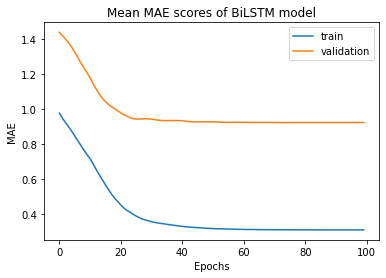

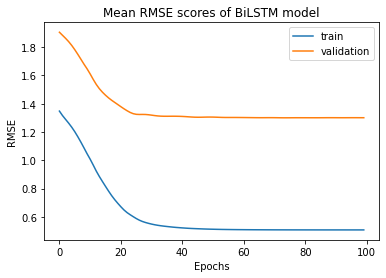

In [32]:
visualize_performance(results_cpt_x[1])

Optimal Mean MAE: 1.0280031263828278 @ epoch 91
Optimal Mean RMSE: 1.5192725755274297 @ epoch 91


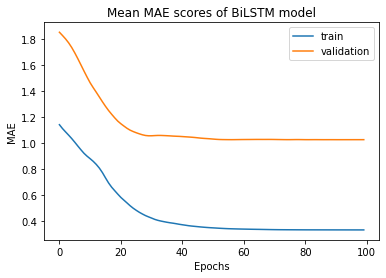

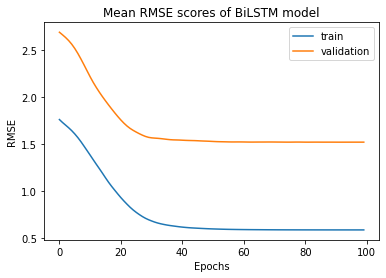

In [33]:
visualize_performance(results_cpt_y[1])

Optimal Mean MAE: 0.9220017999410629 @ epoch 77
Optimal Mean RMSE: 1.3003243617713451 @ epoch 75


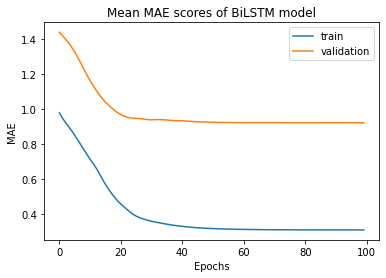

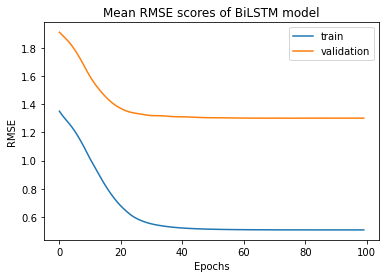

In [34]:
visualize_performance(results_cpt_z[1])

### Tacheometry + Satellite

In [29]:
results_tcmt_sat_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True, incl_sat=True)
results_tcmt_sat_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True, incl_sat=True)
results_tcmt_sat_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=True, incl_sat=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.4624 - mean_absolute_error: 2.0173 - root_mean_squared_error: 2.7317 - val_loss: 13.0448 - val_mean_absolute_error: 2.9311 - val_root_mean_squared_error: 3.6118
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 6.9408 - mean_absolute_error: 1.9232 - root_mean_squared_error: 2.6345 - val_loss: 12.3087 - val_mean_absolute_error: 2.8392 - val_root_mean_squared_error: 3.5084
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 6.5147 - mean_absolute_error: 1.8448 - root_mean_squared_error: 2.5524 - val_loss: 11.7227 - val_mean_absolute_error: 2.7627 - val_root_mean_squared_error: 3.4238
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 6.1460 - mean_absolute_error: 1.7750 - root_mean_squared_error: 2.4791 - val_loss: 11.2380 - val_mean_absolute_error: 2.6957 - val_root_mean_squared_error: 3.3523
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6198 - mean_absolute_error: 0.5298 - root_mean_squared_error: 0.7873 - val_loss: 11.7143 - val_mean_absolute_error: 2.3797 - val_root_mean_squared_error: 3.4226
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5939 - mean_absolute_error: 0.5152 - root_mean_squared_error: 0.7707 - val_loss: 11.6165 - val_mean_absolute_error: 2.3699 - val_root_mean_squared_error: 3.4083
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.5698 - mean_absolute_error: 0.4998 - root_mean_squared_error: 0.7548 - val_loss: 11.5361 - val_mean_absolute_error: 2.3615 - val_root_mean_squared_error: 3.3965
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.5472 - mean_absolute_error: 0.4843 - root_mean_squared_error: 0.7397 - val_loss: 11.4662 - val_mean_absolute_error: 2.3522 - val_root_mean_squared_error: 3.3862
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2258 - mean_absolute_error: 0.2567 - root_mean_squared_error: 0.4752 - val_loss: 10.2694 - val_mean_absolute_error: 2.2437 - val_root_mean_squared_error: 3.2046
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2209 - mean_absolute_error: 0.2532 - root_mean_squared_error: 0.4700 - val_loss: 10.2664 - val_mean_absolute_error: 2.2443 - val_root_mean_squared_error: 3.2041
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2160 - mean_absolute_error: 0.2502 - root_mean_squared_error: 0.4648 - val_loss: 10.2806 - val_mean_absolute_error: 2.2472 - val_root_mean_squared_error: 3.2063
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2113 - mean_absolute_error: 0.2479 - root_mean_squared_error: 0.4597 - val_loss: 10.2722 - val_mean_absolute_error: 2.2468 - val_root_mean_squared_error: 3.2050
Epoch 75/100
1/1 [==============================] - 0s 4

  5%|████▏                                                                              | 1/20 [00:07<02:25,  7.64s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5499 - mean_absolute_error: 0.9604 - root_mean_squared_error: 1.2449 - val_loss: 2.6568 - val_mean_absolute_error: 1.2457 - val_root_mean_squared_error: 1.6300
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3581 - mean_absolute_error: 0.8794 - root_mean_squared_error: 1.1654 - val_loss: 2.4323 - val_mean_absolute_error: 1.1765 - val_root_mean_squared_error: 1.5596
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.2146 - mean_absolute_error: 0.8164 - root_mean_squared_error: 1.1021 - val_loss: 2.2512 - val_mean_absolute_error: 1.1218 - val_root_mean_squared_error: 1.5004
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1015 - mean_absolute_error: 0.7651 - root_mean_squared_error: 1.0495 - val_loss: 2.0945 - val_mean_absolute_error: 1.0773 - val_root_mean_squared_error: 1.4473
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0517 - mean_absolute_error: 0.1579 - root_mean_squared_error: 0.2273 - val_loss: 0.3154 - val_mean_absolute_error: 0.3997 - val_root_mean_squared_error: 0.5616
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0493 - mean_absolute_error: 0.1538 - root_mean_squared_error: 0.2220 - val_loss: 0.3127 - val_mean_absolute_error: 0.3979 - val_root_mean_squared_error: 0.5592
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0471 - mean_absolute_error: 0.1503 - root_mean_squared_error: 0.2171 - val_loss: 0.3108 - val_mean_absolute_error: 0.3958 - val_root_mean_squared_error: 0.5575
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0451 - mean_absolute_error: 0.1472 - root_mean_squared_error: 0.2123 - val_loss: 0.3093 - val_mean_absolute_error: 0.3936 - val_root_mean_squared_error: 0.5562
Epoch 40/100
1/1 [==============================] - 0s 26ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0081 - mean_absolute_error: 0.0612 - root_mean_squared_error: 0.0901 - val_loss: 0.2356 - val_mean_absolute_error: 0.3115 - val_root_mean_squared_error: 0.4853
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0078 - mean_absolute_error: 0.0600 - root_mean_squared_error: 0.0882 - val_loss: 0.2340 - val_mean_absolute_error: 0.3100 - val_root_mean_squared_error: 0.4837
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0075 - mean_absolute_error: 0.0588 - root_mean_squared_error: 0.0865 - val_loss: 0.2325 - val_mean_absolute_error: 0.3086 - val_root_mean_squared_error: 0.4822
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0072 - mean_absolute_error: 0.0576 - root_mean_squared_error: 0.0848 - val_loss: 0.2313 - val_mean_absolute_error: 0.3071 - val_root_mean_squared_error: 0.4809
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 10%|████████▎                                                                          | 2/20 [00:13<01:59,  6.62s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.9812 - mean_absolute_error: 1.5589 - root_mean_squared_error: 1.9953 - val_loss: 3.7055 - val_mean_absolute_error: 1.5437 - val_root_mean_squared_error: 1.9250
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 3.0201 - mean_absolute_error: 1.3179 - root_mean_squared_error: 1.7378 - val_loss: 2.8335 - val_mean_absolute_error: 1.3310 - val_root_mean_squared_error: 1.6833
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 2.4664 - mean_absolute_error: 1.1582 - root_mean_squared_error: 1.5705 - val_loss: 2.3140 - val_mean_absolute_error: 1.1939 - val_root_mean_squared_error: 1.5212
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 2.1178 - mean_absolute_error: 1.0494 - root_mean_squared_error: 1.4553 - val_loss: 1.9837 - val_mean_absolute_error: 1.1006 - val_root_mean_squared_error: 1.4085
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1915 - mean_absolute_error: 0.3038 - root_mean_squared_error: 0.4376 - val_loss: 0.6718 - val_mean_absolute_error: 0.5889 - val_root_mean_squared_error: 0.8196
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1850 - mean_absolute_error: 0.2993 - root_mean_squared_error: 0.4301 - val_loss: 0.6634 - val_mean_absolute_error: 0.5894 - val_root_mean_squared_error: 0.8145
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1794 - mean_absolute_error: 0.2947 - root_mean_squared_error: 0.4235 - val_loss: 0.6574 - val_mean_absolute_error: 0.5900 - val_root_mean_squared_error: 0.8108
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1742 - mean_absolute_error: 0.2903 - root_mean_squared_error: 0.4174 - val_loss: 0.6532 - val_mean_absolute_error: 0.5908 - val_root_mean_squared_error: 0.8082
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0472 - mean_absolute_error: 0.1559 - root_mean_squared_error: 0.2174 - val_loss: 0.3601 - val_mean_absolute_error: 0.4308 - val_root_mean_squared_error: 0.6001
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0446 - mean_absolute_error: 0.1518 - root_mean_squared_error: 0.2113 - val_loss: 0.3489 - val_mean_absolute_error: 0.4227 - val_root_mean_squared_error: 0.5907
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0422 - mean_absolute_error: 0.1477 - root_mean_squared_error: 0.2054 - val_loss: 0.3386 - val_mean_absolute_error: 0.4154 - val_root_mean_squared_error: 0.5819
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0398 - mean_absolute_error: 0.1436 - root_mean_squared_error: 0.1995 - val_loss: 0.3297 - val_mean_absolute_error: 0.4090 - val_root_mean_squared_error: 0.5742
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 15%|████████████▍                                                                      | 3/20 [00:19<01:46,  6.24s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.5965 - mean_absolute_error: 1.1511 - root_mean_squared_error: 1.6114 - val_loss: 4.2415 - val_mean_absolute_error: 1.4439 - val_root_mean_squared_error: 2.0595
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 2.3591 - mean_absolute_error: 1.0626 - root_mean_squared_error: 1.5359 - val_loss: 3.9331 - val_mean_absolute_error: 1.3550 - val_root_mean_squared_error: 1.9832
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 2.1690 - mean_absolute_error: 0.9916 - root_mean_squared_error: 1.4727 - val_loss: 3.6807 - val_mean_absolute_error: 1.2873 - val_root_mean_squared_error: 1.9185
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 2.0084 - mean_absolute_error: 0.9347 - root_mean_squared_error: 1.4172 - val_loss: 3.4614 - val_mean_absolute_error: 1.2313 - val_root_mean_squared_error: 1.8605
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0299 - mean_absolute_error: 0.1393 - root_mean_squared_error: 0.1729 - val_loss: 1.0523 - val_mean_absolute_error: 0.4011 - val_root_mean_squared_error: 1.0258
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0273 - mean_absolute_error: 0.1326 - root_mean_squared_error: 0.1652 - val_loss: 1.0370 - val_mean_absolute_error: 0.3933 - val_root_mean_squared_error: 1.0184
Epoch 38/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0249 - mean_absolute_error: 0.1255 - root_mean_squared_error: 0.1579 - val_loss: 1.0243 - val_mean_absolute_error: 0.3905 - val_root_mean_squared_error: 1.0121
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0230 - mean_absolute_error: 0.1194 - root_mean_squared_error: 0.1517 - val_loss: 1.0170 - val_mean_absolute_error: 0.3912 - val_root_mean_squared_error: 1.0085
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0037 - mean_absolute_error: 0.0478 - root_mean_squared_error: 0.0612 - val_loss: 0.9708 - val_mean_absolute_error: 0.3344 - val_root_mean_squared_error: 0.9853
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0036 - mean_absolute_error: 0.0471 - root_mean_squared_error: 0.0604 - val_loss: 0.9704 - val_mean_absolute_error: 0.3335 - val_root_mean_squared_error: 0.9851
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0036 - mean_absolute_error: 0.0464 - root_mean_squared_error: 0.0596 - val_loss: 0.9690 - val_mean_absolute_error: 0.3322 - val_root_mean_squared_error: 0.9844
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0035 - mean_absolute_error: 0.0457 - root_mean_squared_error: 0.0589 - val_loss: 0.9673 - val_mean_absolute_error: 0.3307 - val_root_mean_squared_error: 0.9835
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 20%|████████████████▌                                                                  | 4/20 [00:24<01:35,  5.98s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.3150 - mean_absolute_error: 1.5519 - root_mean_squared_error: 2.0773 - val_loss: 2.9611 - val_mean_absolute_error: 1.4152 - val_root_mean_squared_error: 1.7208
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 4.0787 - mean_absolute_error: 1.4907 - root_mean_squared_error: 2.0196 - val_loss: 2.7383 - val_mean_absolute_error: 1.3514 - val_root_mean_squared_error: 1.6548
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 3.8769 - mean_absolute_error: 1.4372 - root_mean_squared_error: 1.9690 - val_loss: 2.5548 - val_mean_absolute_error: 1.2959 - val_root_mean_squared_error: 1.5984
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 3.6889 - mean_absolute_error: 1.3864 - root_mean_squared_error: 1.9207 - val_loss: 2.3917 - val_mean_absolute_error: 1.2435 - val_root_mean_squared_error: 1.5465
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1711 - mean_absolute_error: 0.3107 - root_mean_squared_error: 0.4136 - val_loss: 1.2798 - val_mean_absolute_error: 0.8449 - val_root_mean_squared_error: 1.1313
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1610 - mean_absolute_error: 0.3005 - root_mean_squared_error: 0.4013 - val_loss: 1.3098 - val_mean_absolute_error: 0.8505 - val_root_mean_squared_error: 1.1445
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1517 - mean_absolute_error: 0.2897 - root_mean_squared_error: 0.3895 - val_loss: 1.3268 - val_mean_absolute_error: 0.8523 - val_root_mean_squared_error: 1.1519
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1431 - mean_absolute_error: 0.2795 - root_mean_squared_error: 0.3782 - val_loss: 1.3307 - val_mean_absolute_error: 0.8499 - val_root_mean_squared_error: 1.1536
Epoch 40/100
1/1 [==============================] - 0s 27ms/

Epoch 71/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0345 - mean_absolute_error: 0.1219 - root_mean_squared_error: 0.1857 - val_loss: 0.8067 - val_mean_absolute_error: 0.6187 - val_root_mean_squared_error: 0.8982
Epoch 72/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0334 - mean_absolute_error: 0.1196 - root_mean_squared_error: 0.1828 - val_loss: 0.7994 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 0.8941
Epoch 73/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0324 - mean_absolute_error: 0.1175 - root_mean_squared_error: 0.1800 - val_loss: 0.7921 - val_mean_absolute_error: 0.6104 - val_root_mean_squared_error: 0.8900
Epoch 74/100
1/1 [==============================] - 0s 25ms/step - loss: 0.0315 - mean_absolute_error: 0.1154 - root_mean_squared_error: 0.1774 - val_loss: 0.7846 - val_mean_absolute_error: 0.6065 - val_root_mean_squared_error: 0.8858
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 25%|████████████████████▊                                                              | 5/20 [00:29<01:23,  5.58s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.0773 - mean_absolute_error: 1.3992 - root_mean_squared_error: 1.7542 - val_loss: 4.7517 - val_mean_absolute_error: 1.6612 - val_root_mean_squared_error: 2.1798
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 2.3624 - mean_absolute_error: 1.2124 - root_mean_squared_error: 1.5370 - val_loss: 3.9687 - val_mean_absolute_error: 1.5002 - val_root_mean_squared_error: 1.9921
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.8620 - mean_absolute_error: 1.0662 - root_mean_squared_error: 1.3645 - val_loss: 3.4166 - val_mean_absolute_error: 1.3741 - val_root_mean_squared_error: 1.8484
Epoch 4/100
1/1 [==============================] - 0s 26ms/step - loss: 1.5076 - mean_absolute_error: 0.9501 - root_mean_squared_error: 1.2278 - val_loss: 3.0189 - val_mean_absolute_error: 1.2748 - val_root_mean_squared_error: 1.7375
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0945 - mean_absolute_error: 0.2188 - root_mean_squared_error: 0.3073 - val_loss: 1.6778 - val_mean_absolute_error: 0.8534 - val_root_mean_squared_error: 1.2953
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0906 - mean_absolute_error: 0.2145 - root_mean_squared_error: 0.3010 - val_loss: 1.6743 - val_mean_absolute_error: 0.8514 - val_root_mean_squared_error: 1.2939
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0868 - mean_absolute_error: 0.2101 - root_mean_squared_error: 0.2946 - val_loss: 1.6707 - val_mean_absolute_error: 0.8489 - val_root_mean_squared_error: 1.2926
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0831 - mean_absolute_error: 0.2058 - root_mean_squared_error: 0.2883 - val_loss: 1.6669 - val_mean_absolute_error: 0.8459 - val_root_mean_squared_error: 1.2911
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0153 - mean_absolute_error: 0.0862 - root_mean_squared_error: 0.1235 - val_loss: 1.6773 - val_mean_absolute_error: 0.7606 - val_root_mean_squared_error: 1.2951
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0143 - mean_absolute_error: 0.0840 - root_mean_squared_error: 0.1197 - val_loss: 1.6746 - val_mean_absolute_error: 0.7575 - val_root_mean_squared_error: 1.2941
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0135 - mean_absolute_error: 0.0819 - root_mean_squared_error: 0.1162 - val_loss: 1.6744 - val_mean_absolute_error: 0.7547 - val_root_mean_squared_error: 1.2940
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0127 - mean_absolute_error: 0.0801 - root_mean_squared_error: 0.1128 - val_loss: 1.6753 - val_mean_absolute_error: 0.7523 - val_root_mean_squared_error: 1.2943
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 30%|████████████████████████▉                                                          | 6/20 [00:34<01:16,  5.43s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4082 - mean_absolute_error: 0.4840 - root_mean_squared_error: 0.6389 - val_loss: 1.2510 - val_mean_absolute_error: 0.8096 - val_root_mean_squared_error: 1.1185
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3825 - mean_absolute_error: 0.4647 - root_mean_squared_error: 0.6185 - val_loss: 1.2187 - val_mean_absolute_error: 0.7979 - val_root_mean_squared_error: 1.1039
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3604 - mean_absolute_error: 0.4478 - root_mean_squared_error: 0.6003 - val_loss: 1.1893 - val_mean_absolute_error: 0.7875 - val_root_mean_squared_error: 1.0905
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3406 - mean_absolute_error: 0.4327 - root_mean_squared_error: 0.5836 - val_loss: 1.1617 - val_mean_absolute_error: 0.7774 - val_root_mean_squared_error: 1.0778
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0678 - mean_absolute_error: 0.1849 - root_mean_squared_error: 0.2604 - val_loss: 0.4532 - val_mean_absolute_error: 0.4744 - val_root_mean_squared_error: 0.6732
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0645 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2540 - val_loss: 0.4386 - val_mean_absolute_error: 0.4659 - val_root_mean_squared_error: 0.6622
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0612 - mean_absolute_error: 0.1753 - root_mean_squared_error: 0.2474 - val_loss: 0.4213 - val_mean_absolute_error: 0.4559 - val_root_mean_squared_error: 0.6491
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0579 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.2407 - val_loss: 0.4030 - val_mean_absolute_error: 0.4452 - val_root_mean_squared_error: 0.6349
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0139 - mean_absolute_error: 0.0767 - root_mean_squared_error: 0.1180 - val_loss: 0.3975 - val_mean_absolute_error: 0.4452 - val_root_mean_squared_error: 0.6305
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0135 - mean_absolute_error: 0.0756 - root_mean_squared_error: 0.1164 - val_loss: 0.3962 - val_mean_absolute_error: 0.4446 - val_root_mean_squared_error: 0.6294
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0132 - mean_absolute_error: 0.0746 - root_mean_squared_error: 0.1148 - val_loss: 0.3975 - val_mean_absolute_error: 0.4455 - val_root_mean_squared_error: 0.6305
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0128 - mean_absolute_error: 0.0735 - root_mean_squared_error: 0.1132 - val_loss: 0.3999 - val_mean_absolute_error: 0.4470 - val_root_mean_squared_error: 0.6324
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 35%|█████████████████████████████                                                      | 7/20 [00:39<01:08,  5.28s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.5650 - mean_absolute_error: 1.0091 - root_mean_squared_error: 1.2510 - val_loss: 2.1400 - val_mean_absolute_error: 1.1470 - val_root_mean_squared_error: 1.4629
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.3218 - mean_absolute_error: 0.9091 - root_mean_squared_error: 1.1497 - val_loss: 1.9920 - val_mean_absolute_error: 1.0884 - val_root_mean_squared_error: 1.4114
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1416 - mean_absolute_error: 0.8298 - root_mean_squared_error: 1.0685 - val_loss: 1.8831 - val_mean_absolute_error: 1.0448 - val_root_mean_squared_error: 1.3723
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 1.0036 - mean_absolute_error: 0.7660 - root_mean_squared_error: 1.0018 - val_loss: 1.7990 - val_mean_absolute_error: 1.0141 - val_root_mean_squared_error: 1.3413
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1119 - mean_absolute_error: 0.2246 - root_mean_squared_error: 0.3345 - val_loss: 0.9730 - val_mean_absolute_error: 0.6087 - val_root_mean_squared_error: 0.9864
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1092 - mean_absolute_error: 0.2210 - root_mean_squared_error: 0.3305 - val_loss: 0.9757 - val_mean_absolute_error: 0.6088 - val_root_mean_squared_error: 0.9878
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1067 - mean_absolute_error: 0.2172 - root_mean_squared_error: 0.3266 - val_loss: 0.9766 - val_mean_absolute_error: 0.6098 - val_root_mean_squared_error: 0.9882
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1042 - mean_absolute_error: 0.2130 - root_mean_squared_error: 0.3228 - val_loss: 0.9757 - val_mean_absolute_error: 0.6108 - val_root_mean_squared_error: 0.9878
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0593 - mean_absolute_error: 0.1501 - root_mean_squared_error: 0.2436 - val_loss: 0.8246 - val_mean_absolute_error: 0.5603 - val_root_mean_squared_error: 0.9081
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0583 - mean_absolute_error: 0.1486 - root_mean_squared_error: 0.2414 - val_loss: 0.8160 - val_mean_absolute_error: 0.5582 - val_root_mean_squared_error: 0.9033
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0572 - mean_absolute_error: 0.1470 - root_mean_squared_error: 0.2392 - val_loss: 0.8072 - val_mean_absolute_error: 0.5559 - val_root_mean_squared_error: 0.8985
Epoch 74/100
1/1 [==============================] - 0s 26ms/step - loss: 0.0562 - mean_absolute_error: 0.1456 - root_mean_squared_error: 0.2370 - val_loss: 0.8002 - val_mean_absolute_error: 0.5538 - val_root_mean_squared_error: 0.8945
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:45<01:03,  5.29s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.6257 - mean_absolute_error: 1.4634 - root_mean_squared_error: 2.1507 - val_loss: 14.5633 - val_mean_absolute_error: 2.8639 - val_root_mean_squared_error: 3.8162
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 4.3152 - mean_absolute_error: 1.3741 - root_mean_squared_error: 2.0773 - val_loss: 14.1810 - val_mean_absolute_error: 2.8173 - val_root_mean_squared_error: 3.7658
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.0818 - mean_absolute_error: 1.3073 - root_mean_squared_error: 2.0203 - val_loss: 13.8325 - val_mean_absolute_error: 2.7744 - val_root_mean_squared_error: 3.7192
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 3.8883 - mean_absolute_error: 1.2530 - root_mean_squared_error: 1.9719 - val_loss: 13.4846 - val_mean_absolute_error: 2.7305 - val_root_mean_squared_error: 3.6721
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6092 - mean_absolute_error: 0.5316 - root_mean_squared_error: 0.7805 - val_loss: 6.5565 - val_mean_absolute_error: 1.9219 - val_root_mean_squared_error: 2.5606
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.5827 - mean_absolute_error: 0.5197 - root_mean_squared_error: 0.7634 - val_loss: 6.5826 - val_mean_absolute_error: 1.9224 - val_root_mean_squared_error: 2.5657
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.5568 - mean_absolute_error: 0.5063 - root_mean_squared_error: 0.7462 - val_loss: 6.6023 - val_mean_absolute_error: 1.9219 - val_root_mean_squared_error: 2.5695
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.5337 - mean_absolute_error: 0.4936 - root_mean_squared_error: 0.7306 - val_loss: 6.6044 - val_mean_absolute_error: 1.9199 - val_root_mean_squared_error: 2.5699
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1818 - mean_absolute_error: 0.2590 - root_mean_squared_error: 0.4264 - val_loss: 9.2021 - val_mean_absolute_error: 2.2273 - val_root_mean_squared_error: 3.0335
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1765 - mean_absolute_error: 0.2552 - root_mean_squared_error: 0.4202 - val_loss: 9.3277 - val_mean_absolute_error: 2.2408 - val_root_mean_squared_error: 3.0541
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1713 - mean_absolute_error: 0.2512 - root_mean_squared_error: 0.4139 - val_loss: 9.4955 - val_mean_absolute_error: 2.2588 - val_root_mean_squared_error: 3.0815
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1664 - mean_absolute_error: 0.2475 - root_mean_squared_error: 0.4079 - val_loss: 9.7545 - val_mean_absolute_error: 2.2852 - val_root_mean_squared_error: 3.1232
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:50<00:57,  5.22s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1992 - mean_absolute_error: 0.7544 - root_mean_squared_error: 1.0951 - val_loss: 3.0993 - val_mean_absolute_error: 1.2045 - val_root_mean_squared_error: 1.7605
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 1.0935 - mean_absolute_error: 0.7006 - root_mean_squared_error: 1.0457 - val_loss: 2.9974 - val_mean_absolute_error: 1.1703 - val_root_mean_squared_error: 1.7313
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.0108 - mean_absolute_error: 0.6570 - root_mean_squared_error: 1.0054 - val_loss: 2.9136 - val_mean_absolute_error: 1.1419 - val_root_mean_squared_error: 1.7069
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.9434 - mean_absolute_error: 0.6207 - root_mean_squared_error: 0.9713 - val_loss: 2.8407 - val_mean_absolute_error: 1.1179 - val_root_mean_squared_error: 1.6854
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0363 - mean_absolute_error: 0.1287 - root_mean_squared_error: 0.1905 - val_loss: 1.8545 - val_mean_absolute_error: 0.7046 - val_root_mean_squared_error: 1.3618
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0324 - mean_absolute_error: 0.1246 - root_mean_squared_error: 0.1799 - val_loss: 1.8400 - val_mean_absolute_error: 0.6977 - val_root_mean_squared_error: 1.3565
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0287 - mean_absolute_error: 0.1190 - root_mean_squared_error: 0.1693 - val_loss: 1.8240 - val_mean_absolute_error: 0.6899 - val_root_mean_squared_error: 1.3506
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0255 - mean_absolute_error: 0.1130 - root_mean_squared_error: 0.1595 - val_loss: 1.8101 - val_mean_absolute_error: 0.6839 - val_root_mean_squared_error: 1.3454
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0033 - mean_absolute_error: 0.0442 - root_mean_squared_error: 0.0574 - val_loss: 1.7847 - val_mean_absolute_error: 0.6264 - val_root_mean_squared_error: 1.3359
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0032 - mean_absolute_error: 0.0434 - root_mean_squared_error: 0.0562 - val_loss: 1.7836 - val_mean_absolute_error: 0.6257 - val_root_mean_squared_error: 1.3355
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0030 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0551 - val_loss: 1.7823 - val_mean_absolute_error: 0.6249 - val_root_mean_squared_error: 1.3350
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0029 - mean_absolute_error: 0.0414 - root_mean_squared_error: 0.0540 - val_loss: 1.7807 - val_mean_absolute_error: 0.6241 - val_root_mean_squared_error: 1.3344
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 50%|█████████████████████████████████████████                                         | 10/20 [00:55<00:51,  5.17s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.4186 - mean_absolute_error: 1.7648 - root_mean_squared_error: 2.3278 - val_loss: 9.0959 - val_mean_absolute_error: 2.2944 - val_root_mean_squared_error: 3.0159
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 4.9807 - mean_absolute_error: 1.6690 - root_mean_squared_error: 2.2317 - val_loss: 8.4798 - val_mean_absolute_error: 2.1889 - val_root_mean_squared_error: 2.9120
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.6424 - mean_absolute_error: 1.5922 - root_mean_squared_error: 2.1546 - val_loss: 7.9280 - val_mean_absolute_error: 2.0957 - val_root_mean_squared_error: 2.8157
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 4.3383 - mean_absolute_error: 1.5238 - root_mean_squared_error: 2.0829 - val_loss: 7.3704 - val_mean_absolute_error: 1.9981 - val_root_mean_squared_error: 2.7149
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2296 - mean_absolute_error: 0.3290 - root_mean_squared_error: 0.4791 - val_loss: 1.4697 - val_mean_absolute_error: 0.7817 - val_root_mean_squared_error: 1.2123
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2198 - mean_absolute_error: 0.3207 - root_mean_squared_error: 0.4688 - val_loss: 1.4698 - val_mean_absolute_error: 0.7815 - val_root_mean_squared_error: 1.2123
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2106 - mean_absolute_error: 0.3127 - root_mean_squared_error: 0.4589 - val_loss: 1.4719 - val_mean_absolute_error: 0.7805 - val_root_mean_squared_error: 1.2132
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2018 - mean_absolute_error: 0.3050 - root_mean_squared_error: 0.4492 - val_loss: 1.4715 - val_mean_absolute_error: 0.7783 - val_root_mean_squared_error: 1.2131
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0603 - mean_absolute_error: 0.1532 - root_mean_squared_error: 0.2456 - val_loss: 1.1025 - val_mean_absolute_error: 0.6710 - val_root_mean_squared_error: 1.0500
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0584 - mean_absolute_error: 0.1503 - root_mean_squared_error: 0.2416 - val_loss: 1.0948 - val_mean_absolute_error: 0.6686 - val_root_mean_squared_error: 1.0463
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0564 - mean_absolute_error: 0.1474 - root_mean_squared_error: 0.2376 - val_loss: 1.0867 - val_mean_absolute_error: 0.6662 - val_root_mean_squared_error: 1.0424
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0546 - mean_absolute_error: 0.1446 - root_mean_squared_error: 0.2336 - val_loss: 1.0786 - val_mean_absolute_error: 0.6639 - val_root_mean_squared_error: 1.0385
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:00<00:46,  5.17s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.3492 - mean_absolute_error: 2.1513 - root_mean_squared_error: 2.8895 - val_loss: 11.4416 - val_mean_absolute_error: 2.5373 - val_root_mean_squared_error: 3.3825
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 7.7556 - mean_absolute_error: 2.0528 - root_mean_squared_error: 2.7849 - val_loss: 10.9633 - val_mean_absolute_error: 2.4736 - val_root_mean_squared_error: 3.3111
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 7.3237 - mean_absolute_error: 1.9834 - root_mean_squared_error: 2.7062 - val_loss: 10.4224 - val_mean_absolute_error: 2.3977 - val_root_mean_squared_error: 3.2284
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 6.8525 - mean_absolute_error: 1.9077 - root_mean_squared_error: 2.6177 - val_loss: 9.7532 - val_mean_absolute_error: 2.3079 - val_root_mean_squared_error: 3.1230
Epoch 5/100
1/1 [==============================] - 0s 29ms/step

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3980 - mean_absolute_error: 0.4255 - root_mean_squared_error: 0.6309 - val_loss: 3.0969 - val_mean_absolute_error: 1.2940 - val_root_mean_squared_error: 1.7598
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3722 - mean_absolute_error: 0.4123 - root_mean_squared_error: 0.6101 - val_loss: 3.0465 - val_mean_absolute_error: 1.2779 - val_root_mean_squared_error: 1.7454
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3485 - mean_absolute_error: 0.3995 - root_mean_squared_error: 0.5904 - val_loss: 2.9983 - val_mean_absolute_error: 1.2630 - val_root_mean_squared_error: 1.7316
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3273 - mean_absolute_error: 0.3874 - root_mean_squared_error: 0.5721 - val_loss: 2.9531 - val_mean_absolute_error: 1.2500 - val_root_mean_squared_error: 1.7185
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0794 - mean_absolute_error: 0.1854 - root_mean_squared_error: 0.2819 - val_loss: 2.3515 - val_mean_absolute_error: 1.1177 - val_root_mean_squared_error: 1.5335
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0771 - mean_absolute_error: 0.1827 - root_mean_squared_error: 0.2777 - val_loss: 2.3428 - val_mean_absolute_error: 1.1149 - val_root_mean_squared_error: 1.5306
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0749 - mean_absolute_error: 0.1799 - root_mean_squared_error: 0.2736 - val_loss: 2.3344 - val_mean_absolute_error: 1.1122 - val_root_mean_squared_error: 1.5279
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0727 - mean_absolute_error: 0.1774 - root_mean_squared_error: 0.2697 - val_loss: 2.3268 - val_mean_absolute_error: 1.1098 - val_root_mean_squared_error: 1.5254
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:05<00:41,  5.21s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.3079 - mean_absolute_error: 0.4339 - root_mean_squared_error: 0.5549 - val_loss: 0.4941 - val_mean_absolute_error: 0.5433 - val_root_mean_squared_error: 0.7029
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2629 - mean_absolute_error: 0.3904 - root_mean_squared_error: 0.5127 - val_loss: 0.4404 - val_mean_absolute_error: 0.5030 - val_root_mean_squared_error: 0.6636
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2299 - mean_absolute_error: 0.3559 - root_mean_squared_error: 0.4795 - val_loss: 0.3991 - val_mean_absolute_error: 0.4705 - val_root_mean_squared_error: 0.6317
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2044 - mean_absolute_error: 0.3275 - root_mean_squared_error: 0.4521 - val_loss: 0.3644 - val_mean_absolute_error: 0.4423 - val_root_mean_squared_error: 0.6037
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0035 - mean_absolute_error: 0.0469 - root_mean_squared_error: 0.0594 - val_loss: 0.0092 - val_mean_absolute_error: 0.0768 - val_root_mean_squared_error: 0.0959
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0032 - mean_absolute_error: 0.0448 - root_mean_squared_error: 0.0568 - val_loss: 0.0086 - val_mean_absolute_error: 0.0741 - val_root_mean_squared_error: 0.0928
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0030 - mean_absolute_error: 0.0427 - root_mean_squared_error: 0.0543 - val_loss: 0.0081 - val_mean_absolute_error: 0.0713 - val_root_mean_squared_error: 0.0897
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0027 - mean_absolute_error: 0.0407 - root_mean_squared_error: 0.0519 - val_loss: 0.0075 - val_mean_absolute_error: 0.0684 - val_root_mean_squared_error: 0.0866
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 5.8445e-04 - mean_absolute_error: 0.0186 - root_mean_squared_error: 0.0242 - val_loss: 0.0028 - val_mean_absolute_error: 0.0410 - val_root_mean_squared_error: 0.0529
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 5.7155e-04 - mean_absolute_error: 0.0184 - root_mean_squared_error: 0.0239 - val_loss: 0.0028 - val_mean_absolute_error: 0.0408 - val_root_mean_squared_error: 0.0527
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 5.5996e-04 - mean_absolute_error: 0.0182 - root_mean_squared_error: 0.0237 - val_loss: 0.0028 - val_mean_absolute_error: 0.0406 - val_root_mean_squared_error: 0.0525
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 5.4923e-04 - mean_absolute_error: 0.0180 - root_mean_squared_error: 0.0234 - val_loss: 0.0027 - val_mean_absolute_error: 0.0402 - val_root_mean_squared_error: 0.0522
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:11<00:37,  5.32s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.1862 - mean_absolute_error: 0.9688 - root_mean_squared_error: 1.4786 - val_loss: 9.8814 - val_mean_absolute_error: 2.3004 - val_root_mean_squared_error: 3.1435
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.0259 - mean_absolute_error: 0.9097 - root_mean_squared_error: 1.4233 - val_loss: 9.6468 - val_mean_absolute_error: 2.2663 - val_root_mean_squared_error: 3.1059
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.9036 - mean_absolute_error: 0.8650 - root_mean_squared_error: 1.3797 - val_loss: 9.4418 - val_mean_absolute_error: 2.2371 - val_root_mean_squared_error: 3.0728
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 1.8064 - mean_absolute_error: 0.8308 - root_mean_squared_error: 1.3440 - val_loss: 9.2528 - val_mean_absolute_error: 2.2098 - val_root_mean_squared_error: 3.0418
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3505 - mean_absolute_error: 0.4038 - root_mean_squared_error: 0.5920 - val_loss: 4.5894 - val_mean_absolute_error: 1.5839 - val_root_mean_squared_error: 2.1423
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3374 - mean_absolute_error: 0.3956 - root_mean_squared_error: 0.5808 - val_loss: 4.5610 - val_mean_absolute_error: 1.5800 - val_root_mean_squared_error: 2.1357
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3254 - mean_absolute_error: 0.3881 - root_mean_squared_error: 0.5704 - val_loss: 4.5561 - val_mean_absolute_error: 1.5799 - val_root_mean_squared_error: 2.1345
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3137 - mean_absolute_error: 0.3803 - root_mean_squared_error: 0.5601 - val_loss: 4.5430 - val_mean_absolute_error: 1.5773 - val_root_mean_squared_error: 2.1314
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0891 - mean_absolute_error: 0.1979 - root_mean_squared_error: 0.2984 - val_loss: 4.2167 - val_mean_absolute_error: 1.5026 - val_root_mean_squared_error: 2.0535
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0859 - mean_absolute_error: 0.1941 - root_mean_squared_error: 0.2931 - val_loss: 4.1952 - val_mean_absolute_error: 1.4987 - val_root_mean_squared_error: 2.0482
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0829 - mean_absolute_error: 0.1907 - root_mean_squared_error: 0.2879 - val_loss: 4.2106 - val_mean_absolute_error: 1.5010 - val_root_mean_squared_error: 2.0520
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0801 - mean_absolute_error: 0.1869 - root_mean_squared_error: 0.2830 - val_loss: 4.2063 - val_mean_absolute_error: 1.5001 - val_root_mean_squared_error: 2.0509
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:16<00:32,  5.34s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.8583 - mean_absolute_error: 0.6964 - root_mean_squared_error: 0.9264 - val_loss: 1.3223 - val_mean_absolute_error: 0.8325 - val_root_mean_squared_error: 1.1499
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.7601 - mean_absolute_error: 0.6395 - root_mean_squared_error: 0.8719 - val_loss: 1.2205 - val_mean_absolute_error: 0.7879 - val_root_mean_squared_error: 1.1048
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.6865 - mean_absolute_error: 0.5954 - root_mean_squared_error: 0.8285 - val_loss: 1.1386 - val_mean_absolute_error: 0.7506 - val_root_mean_squared_error: 1.0670
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6283 - mean_absolute_error: 0.5603 - root_mean_squared_error: 0.7927 - val_loss: 1.0693 - val_mean_absolute_error: 0.7218 - val_root_mean_squared_error: 1.0341
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0501 - mean_absolute_error: 0.1513 - root_mean_squared_error: 0.2238 - val_loss: 0.1738 - val_mean_absolute_error: 0.3104 - val_root_mean_squared_error: 0.4169
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0484 - mean_absolute_error: 0.1481 - root_mean_squared_error: 0.2200 - val_loss: 0.1712 - val_mean_absolute_error: 0.3077 - val_root_mean_squared_error: 0.4138
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0467 - mean_absolute_error: 0.1448 - root_mean_squared_error: 0.2162 - val_loss: 0.1687 - val_mean_absolute_error: 0.3058 - val_root_mean_squared_error: 0.4107
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0452 - mean_absolute_error: 0.1417 - root_mean_squared_error: 0.2126 - val_loss: 0.1662 - val_mean_absolute_error: 0.3040 - val_root_mean_squared_error: 0.4077
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0135 - mean_absolute_error: 0.0751 - root_mean_squared_error: 0.1163 - val_loss: 0.1399 - val_mean_absolute_error: 0.2692 - val_root_mean_squared_error: 0.3740
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0130 - mean_absolute_error: 0.0737 - root_mean_squared_error: 0.1141 - val_loss: 0.1391 - val_mean_absolute_error: 0.2685 - val_root_mean_squared_error: 0.3730
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0125 - mean_absolute_error: 0.0723 - root_mean_squared_error: 0.1119 - val_loss: 0.1383 - val_mean_absolute_error: 0.2676 - val_root_mean_squared_error: 0.3719
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0120 - mean_absolute_error: 0.0709 - root_mean_squared_error: 0.1097 - val_loss: 0.1376 - val_mean_absolute_error: 0.2668 - val_root_mean_squared_error: 0.3709
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:22<00:27,  5.45s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.0331 - mean_absolute_error: 0.8204 - root_mean_squared_error: 1.0164 - val_loss: 1.7687 - val_mean_absolute_error: 1.0691 - val_root_mean_squared_error: 1.3299
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 0.9401 - mean_absolute_error: 0.7718 - root_mean_squared_error: 0.9696 - val_loss: 1.6590 - val_mean_absolute_error: 1.0271 - val_root_mean_squared_error: 1.2880
Epoch 3/100
1/1 [==============================] - 0s 50ms/step - loss: 0.8677 - mean_absolute_error: 0.7323 - root_mean_squared_error: 0.9315 - val_loss: 1.5729 - val_mean_absolute_error: 0.9920 - val_root_mean_squared_error: 1.2541
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.8080 - mean_absolute_error: 0.6991 - root_mean_squared_error: 0.8989 - val_loss: 1.5013 - val_mean_absolute_error: 0.9629 - val_root_mean_squared_error: 1.2253
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1083 - mean_absolute_error: 0.1976 - root_mean_squared_error: 0.3291 - val_loss: 1.0381 - val_mean_absolute_error: 0.6864 - val_root_mean_squared_error: 1.0189
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1050 - mean_absolute_error: 0.1955 - root_mean_squared_error: 0.3241 - val_loss: 1.0440 - val_mean_absolute_error: 0.6886 - val_root_mean_squared_error: 1.0218
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1016 - mean_absolute_error: 0.1930 - root_mean_squared_error: 0.3187 - val_loss: 1.0484 - val_mean_absolute_error: 0.6894 - val_root_mean_squared_error: 1.0239
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0981 - mean_absolute_error: 0.1900 - root_mean_squared_error: 0.3132 - val_loss: 1.0511 - val_mean_absolute_error: 0.6891 - val_root_mean_squared_error: 1.0253
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0361 - mean_absolute_error: 0.1090 - root_mean_squared_error: 0.1901 - val_loss: 1.0953 - val_mean_absolute_error: 0.6470 - val_root_mean_squared_error: 1.0466
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0353 - mean_absolute_error: 0.1080 - root_mean_squared_error: 0.1880 - val_loss: 1.0952 - val_mean_absolute_error: 0.6470 - val_root_mean_squared_error: 1.0465
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0345 - mean_absolute_error: 0.1068 - root_mean_squared_error: 0.1858 - val_loss: 1.0957 - val_mean_absolute_error: 0.6472 - val_root_mean_squared_error: 1.0468
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0337 - mean_absolute_error: 0.1057 - root_mean_squared_error: 0.1836 - val_loss: 1.0952 - val_mean_absolute_error: 0.6471 - val_root_mean_squared_error: 1.0465
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:29<00:24,  6.08s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.2640 - mean_absolute_error: 1.1879 - root_mean_squared_error: 1.5046 - val_loss: 4.9891 - val_mean_absolute_error: 1.7316 - val_root_mean_squared_error: 2.2336
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 1.6486 - mean_absolute_error: 0.9919 - root_mean_squared_error: 1.2840 - val_loss: 4.4472 - val_mean_absolute_error: 1.6175 - val_root_mean_squared_error: 2.1088
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.2577 - mean_absolute_error: 0.8499 - root_mean_squared_error: 1.1215 - val_loss: 4.1180 - val_mean_absolute_error: 1.5417 - val_root_mean_squared_error: 2.0293
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 1.0008 - mean_absolute_error: 0.7445 - root_mean_squared_error: 1.0004 - val_loss: 3.9097 - val_mean_absolute_error: 1.4935 - val_root_mean_squared_error: 1.9773
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0524 - mean_absolute_error: 0.1304 - root_mean_squared_error: 0.2289 - val_loss: 2.9833 - val_mean_absolute_error: 1.2146 - val_root_mean_squared_error: 1.7272
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0514 - mean_absolute_error: 0.1280 - root_mean_squared_error: 0.2267 - val_loss: 2.9797 - val_mean_absolute_error: 1.2133 - val_root_mean_squared_error: 1.7262
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0503 - mean_absolute_error: 0.1253 - root_mean_squared_error: 0.2244 - val_loss: 2.9764 - val_mean_absolute_error: 1.2122 - val_root_mean_squared_error: 1.7252
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0493 - mean_absolute_error: 0.1227 - root_mean_squared_error: 0.2221 - val_loss: 2.9737 - val_mean_absolute_error: 1.2113 - val_root_mean_squared_error: 1.7244
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0315 - mean_absolute_error: 0.0887 - root_mean_squared_error: 0.1775 - val_loss: 2.9153 - val_mean_absolute_error: 1.1928 - val_root_mean_squared_error: 1.7074
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0309 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1757 - val_loss: 2.9112 - val_mean_absolute_error: 1.1916 - val_root_mean_squared_error: 1.7062
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0302 - mean_absolute_error: 0.0876 - root_mean_squared_error: 0.1738 - val_loss: 2.9091 - val_mean_absolute_error: 1.1909 - val_root_mean_squared_error: 1.7056
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0295 - mean_absolute_error: 0.0872 - root_mean_squared_error: 0.1718 - val_loss: 2.9075 - val_mean_absolute_error: 1.1904 - val_root_mean_squared_error: 1.7051
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:35<00:18,  6.04s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.7263 - mean_absolute_error: 1.0518 - root_mean_squared_error: 1.3139 - val_loss: 2.9668 - val_mean_absolute_error: 1.4352 - val_root_mean_squared_error: 1.7224
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 1.3382 - mean_absolute_error: 0.9129 - root_mean_squared_error: 1.1568 - val_loss: 2.4642 - val_mean_absolute_error: 1.3080 - val_root_mean_squared_error: 1.5698
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0654 - mean_absolute_error: 0.8044 - root_mean_squared_error: 1.0322 - val_loss: 2.1107 - val_mean_absolute_error: 1.2165 - val_root_mean_squared_error: 1.4528
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.8693 - mean_absolute_error: 0.7190 - root_mean_squared_error: 0.9323 - val_loss: 1.8546 - val_mean_absolute_error: 1.1478 - val_root_mean_squared_error: 1.3619
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1719 - mean_absolute_error: 0.3150 - root_mean_squared_error: 0.4146 - val_loss: 0.7034 - val_mean_absolute_error: 0.6635 - val_root_mean_squared_error: 0.8387
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1688 - mean_absolute_error: 0.3121 - root_mean_squared_error: 0.4109 - val_loss: 0.6985 - val_mean_absolute_error: 0.6595 - val_root_mean_squared_error: 0.8358
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1656 - mean_absolute_error: 0.3090 - root_mean_squared_error: 0.4070 - val_loss: 0.6942 - val_mean_absolute_error: 0.6562 - val_root_mean_squared_error: 0.8332
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1624 - mean_absolute_error: 0.3058 - root_mean_squared_error: 0.4030 - val_loss: 0.6904 - val_mean_absolute_error: 0.6531 - val_root_mean_squared_error: 0.8309
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0528 - mean_absolute_error: 0.1636 - root_mean_squared_error: 0.2299 - val_loss: 0.7703 - val_mean_absolute_error: 0.6493 - val_root_mean_squared_error: 0.8776
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0511 - mean_absolute_error: 0.1609 - root_mean_squared_error: 0.2261 - val_loss: 0.7816 - val_mean_absolute_error: 0.6539 - val_root_mean_squared_error: 0.8841
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0495 - mean_absolute_error: 0.1582 - root_mean_squared_error: 0.2225 - val_loss: 0.7880 - val_mean_absolute_error: 0.6563 - val_root_mean_squared_error: 0.8877
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0480 - mean_absolute_error: 0.1556 - root_mean_squared_error: 0.2190 - val_loss: 0.7934 - val_mean_absolute_error: 0.6581 - val_root_mean_squared_error: 0.8907
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:42<00:12,  6.13s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8364 - mean_absolute_error: 1.0098 - root_mean_squared_error: 1.3551 - val_loss: 3.1296 - val_mean_absolute_error: 1.3716 - val_root_mean_squared_error: 1.7691
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.6576 - mean_absolute_error: 0.9479 - root_mean_squared_error: 1.2875 - val_loss: 2.8503 - val_mean_absolute_error: 1.3014 - val_root_mean_squared_error: 1.6883
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.5264 - mean_absolute_error: 0.9026 - root_mean_squared_error: 1.2355 - val_loss: 2.6469 - val_mean_absolute_error: 1.2528 - val_root_mean_squared_error: 1.6269
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.4173 - mean_absolute_error: 0.8653 - root_mean_squared_error: 1.1905 - val_loss: 2.4776 - val_mean_absolute_error: 1.2138 - val_root_mean_squared_error: 1.5740
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0509 - mean_absolute_error: 0.1661 - root_mean_squared_error: 0.2257 - val_loss: 0.7985 - val_mean_absolute_error: 0.6353 - val_root_mean_squared_error: 0.8936
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0482 - mean_absolute_error: 0.1603 - root_mean_squared_error: 0.2194 - val_loss: 0.7932 - val_mean_absolute_error: 0.6318 - val_root_mean_squared_error: 0.8906
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0458 - mean_absolute_error: 0.1552 - root_mean_squared_error: 0.2139 - val_loss: 0.7915 - val_mean_absolute_error: 0.6287 - val_root_mean_squared_error: 0.8897
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0436 - mean_absolute_error: 0.1508 - root_mean_squared_error: 0.2088 - val_loss: 0.7923 - val_mean_absolute_error: 0.6263 - val_root_mean_squared_error: 0.8901
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0148 - mean_absolute_error: 0.0816 - root_mean_squared_error: 0.1217 - val_loss: 0.8528 - val_mean_absolute_error: 0.6073 - val_root_mean_squared_error: 0.9235
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0144 - mean_absolute_error: 0.0803 - root_mean_squared_error: 0.1201 - val_loss: 0.8558 - val_mean_absolute_error: 0.6077 - val_root_mean_squared_error: 0.9251
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0141 - mean_absolute_error: 0.0790 - root_mean_squared_error: 0.1186 - val_loss: 0.8575 - val_mean_absolute_error: 0.6078 - val_root_mean_squared_error: 0.9260
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0137 - mean_absolute_error: 0.0778 - root_mean_squared_error: 0.1171 - val_loss: 0.8566 - val_mean_absolute_error: 0.6073 - val_root_mean_squared_error: 0.9255
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [01:48<00:06,  6.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0565 - mean_absolute_error: 1.1400 - root_mean_squared_error: 1.4340 - val_loss: 2.4747 - val_mean_absolute_error: 1.2476 - val_root_mean_squared_error: 1.5731
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.6636 - mean_absolute_error: 1.0117 - root_mean_squared_error: 1.2898 - val_loss: 2.1461 - val_mean_absolute_error: 1.1580 - val_root_mean_squared_error: 1.4650
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.3680 - mean_absolute_error: 0.9058 - root_mean_squared_error: 1.1696 - val_loss: 1.9192 - val_mean_absolute_error: 1.0949 - val_root_mean_squared_error: 1.3854
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1424 - mean_absolute_error: 0.8173 - root_mean_squared_error: 1.0688 - val_loss: 1.7580 - val_mean_absolute_error: 1.0449 - val_root_mean_squared_error: 1.3259
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0998 - mean_absolute_error: 0.2023 - root_mean_squared_error: 0.3159 - val_loss: 1.0431 - val_mean_absolute_error: 0.7697 - val_root_mean_squared_error: 1.0213
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0979 - mean_absolute_error: 0.1992 - root_mean_squared_error: 0.3129 - val_loss: 1.0365 - val_mean_absolute_error: 0.7668 - val_root_mean_squared_error: 1.0181
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0961 - mean_absolute_error: 0.1962 - root_mean_squared_error: 0.3100 - val_loss: 1.0302 - val_mean_absolute_error: 0.7643 - val_root_mean_squared_error: 1.0150
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0943 - mean_absolute_error: 0.1934 - root_mean_squared_error: 0.3070 - val_loss: 1.0244 - val_mean_absolute_error: 0.7622 - val_root_mean_squared_error: 1.0121
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0544 - mean_absolute_error: 0.1399 - root_mean_squared_error: 0.2333 - val_loss: 1.0473 - val_mean_absolute_error: 0.7655 - val_root_mean_squared_error: 1.0234
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0534 - mean_absolute_error: 0.1388 - root_mean_squared_error: 0.2310 - val_loss: 1.0520 - val_mean_absolute_error: 0.7677 - val_root_mean_squared_error: 1.0257
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0523 - mean_absolute_error: 0.1378 - root_mean_squared_error: 0.2286 - val_loss: 1.0566 - val_mean_absolute_error: 0.7697 - val_root_mean_squared_error: 1.0279
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0512 - mean_absolute_error: 0.1368 - root_mean_squared_error: 0.2262 - val_loss: 1.0612 - val_mean_absolute_error: 0.7715 - val_root_mean_squared_error: 1.0302
Epoch 75/100
1/1 [==============================] - 0s 34ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 10.9318 - mean_absolute_error: 2.3364 - root_mean_squared_error: 3.3063 - val_loss: 16.4692 - val_mean_absolute_error: 2.9831 - val_root_mean_squared_error: 4.0582
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 10.3363 - mean_absolute_error: 2.2426 - root_mean_squared_error: 3.2150 - val_loss: 15.4639 - val_mean_absolute_error: 2.8635 - val_root_mean_squared_error: 3.9324
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 9.8204 - mean_absolute_error: 2.1639 - root_mean_squared_error: 3.1337 - val_loss: 14.5692 - val_mean_absolute_error: 2.7542 - val_root_mean_squared_error: 3.8170
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 9.3482 - mean_absolute_error: 2.0918 - root_mean_squared_error: 3.0575 - val_loss: 13.7296 - val_mean_absolute_error: 2.6540 - val_root_mean_squared_error: 3.7053
Epoch 5/100
1/1 [==============================] - 0s 37ms/s

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7763 - mean_absolute_error: 0.5730 - root_mean_squared_error: 0.8811 - val_loss: 4.5563 - val_mean_absolute_error: 1.4673 - val_root_mean_squared_error: 2.1345
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7470 - mean_absolute_error: 0.5576 - root_mean_squared_error: 0.8643 - val_loss: 4.5420 - val_mean_absolute_error: 1.4608 - val_root_mean_squared_error: 2.1312
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7190 - mean_absolute_error: 0.5443 - root_mean_squared_error: 0.8479 - val_loss: 4.5345 - val_mean_absolute_error: 1.4563 - val_root_mean_squared_error: 2.1294
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6915 - mean_absolute_error: 0.5324 - root_mean_squared_error: 0.8316 - val_loss: 4.5341 - val_mean_absolute_error: 1.4531 - val_root_mean_squared_error: 2.1293
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2759 - mean_absolute_error: 0.2682 - root_mean_squared_error: 0.5253 - val_loss: 4.8112 - val_mean_absolute_error: 1.4692 - val_root_mean_squared_error: 2.1935
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2708 - mean_absolute_error: 0.2656 - root_mean_squared_error: 0.5204 - val_loss: 4.8299 - val_mean_absolute_error: 1.4720 - val_root_mean_squared_error: 2.1977
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2658 - mean_absolute_error: 0.2629 - root_mean_squared_error: 0.5155 - val_loss: 4.8448 - val_mean_absolute_error: 1.4735 - val_root_mean_squared_error: 2.2011
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2608 - mean_absolute_error: 0.2603 - root_mean_squared_error: 0.5107 - val_loss: 4.8542 - val_mean_absolute_error: 1.4729 - val_root_mean_squared_error: 2.2032
Epoch 75/100
1/1 [==============================] - 0s 32ms/

  5%|████▏                                                                              | 1/20 [00:06<02:06,  6.67s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.5154 - mean_absolute_error: 1.3989 - root_mean_squared_error: 1.8749 - val_loss: 5.0080 - val_mean_absolute_error: 1.6728 - val_root_mean_squared_error: 2.2379
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 3.1702 - mean_absolute_error: 1.2993 - root_mean_squared_error: 1.7805 - val_loss: 4.5467 - val_mean_absolute_error: 1.5738 - val_root_mean_squared_error: 2.1323
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 2.8998 - mean_absolute_error: 1.2183 - root_mean_squared_error: 1.7029 - val_loss: 4.1716 - val_mean_absolute_error: 1.4886 - val_root_mean_squared_error: 2.0425
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 2.6687 - mean_absolute_error: 1.1481 - root_mean_squared_error: 1.6336 - val_loss: 3.8448 - val_mean_absolute_error: 1.4069 - val_root_mean_squared_error: 1.9608
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1114 - mean_absolute_error: 0.2469 - root_mean_squared_error: 0.3338 - val_loss: 0.5978 - val_mean_absolute_error: 0.5689 - val_root_mean_squared_error: 0.7732
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1064 - mean_absolute_error: 0.2394 - root_mean_squared_error: 0.3263 - val_loss: 0.5921 - val_mean_absolute_error: 0.5662 - val_root_mean_squared_error: 0.7695
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1016 - mean_absolute_error: 0.2328 - root_mean_squared_error: 0.3187 - val_loss: 0.5891 - val_mean_absolute_error: 0.5643 - val_root_mean_squared_error: 0.7675
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0969 - mean_absolute_error: 0.2267 - root_mean_squared_error: 0.3114 - val_loss: 0.5863 - val_mean_absolute_error: 0.5617 - val_root_mean_squared_error: 0.7657
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0208 - mean_absolute_error: 0.1022 - root_mean_squared_error: 0.1441 - val_loss: 0.3888 - val_mean_absolute_error: 0.4243 - val_root_mean_squared_error: 0.6235
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0197 - mean_absolute_error: 0.0995 - root_mean_squared_error: 0.1403 - val_loss: 0.3842 - val_mean_absolute_error: 0.4208 - val_root_mean_squared_error: 0.6199
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0187 - mean_absolute_error: 0.0968 - root_mean_squared_error: 0.1366 - val_loss: 0.3802 - val_mean_absolute_error: 0.4176 - val_root_mean_squared_error: 0.6166
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0177 - mean_absolute_error: 0.0943 - root_mean_squared_error: 0.1331 - val_loss: 0.3766 - val_mean_absolute_error: 0.4150 - val_root_mean_squared_error: 0.6137
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 10%|████████▎                                                                          | 2/20 [00:12<01:46,  5.94s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.2002 - mean_absolute_error: 1.9624 - root_mean_squared_error: 2.4900 - val_loss: 6.9765 - val_mean_absolute_error: 2.0981 - val_root_mean_squared_error: 2.6413
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 4.8264 - mean_absolute_error: 1.7051 - root_mean_squared_error: 2.1969 - val_loss: 5.5836 - val_mean_absolute_error: 1.8552 - val_root_mean_squared_error: 2.3630
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 3.9114 - mean_absolute_error: 1.5167 - root_mean_squared_error: 1.9777 - val_loss: 4.6858 - val_mean_absolute_error: 1.6884 - val_root_mean_squared_error: 2.1647
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 3.2952 - mean_absolute_error: 1.3816 - root_mean_squared_error: 1.8153 - val_loss: 4.0866 - val_mean_absolute_error: 1.5777 - val_root_mean_squared_error: 2.0215
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1293 - mean_absolute_error: 0.2496 - root_mean_squared_error: 0.3595 - val_loss: 0.3323 - val_mean_absolute_error: 0.4210 - val_root_mean_squared_error: 0.5765
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1220 - mean_absolute_error: 0.2431 - root_mean_squared_error: 0.3493 - val_loss: 0.3289 - val_mean_absolute_error: 0.4189 - val_root_mean_squared_error: 0.5735
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1160 - mean_absolute_error: 0.2369 - root_mean_squared_error: 0.3406 - val_loss: 0.3272 - val_mean_absolute_error: 0.4182 - val_root_mean_squared_error: 0.5720
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1110 - mean_absolute_error: 0.2321 - root_mean_squared_error: 0.3332 - val_loss: 0.3271 - val_mean_absolute_error: 0.4184 - val_root_mean_squared_error: 0.5719
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0499 - mean_absolute_error: 0.1531 - root_mean_squared_error: 0.2234 - val_loss: 0.2975 - val_mean_absolute_error: 0.3803 - val_root_mean_squared_error: 0.5455
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0487 - mean_absolute_error: 0.1510 - root_mean_squared_error: 0.2207 - val_loss: 0.2919 - val_mean_absolute_error: 0.3760 - val_root_mean_squared_error: 0.5403
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0475 - mean_absolute_error: 0.1489 - root_mean_squared_error: 0.2179 - val_loss: 0.2863 - val_mean_absolute_error: 0.3717 - val_root_mean_squared_error: 0.5350
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0463 - mean_absolute_error: 0.1468 - root_mean_squared_error: 0.2151 - val_loss: 0.2809 - val_mean_absolute_error: 0.3676 - val_root_mean_squared_error: 0.5300
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 15%|████████████▍                                                                      | 3/20 [00:17<01:34,  5.56s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.4883 - mean_absolute_error: 1.4297 - root_mean_squared_error: 2.9135 - val_loss: 14.1845 - val_mean_absolute_error: 1.9027 - val_root_mean_squared_error: 3.7662
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 8.1660 - mean_absolute_error: 1.3594 - root_mean_squared_error: 2.8576 - val_loss: 13.6823 - val_mean_absolute_error: 1.8397 - val_root_mean_squared_error: 3.6990
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 7.8954 - mean_absolute_error: 1.3038 - root_mean_squared_error: 2.8099 - val_loss: 13.2439 - val_mean_absolute_error: 1.7888 - val_root_mean_squared_error: 3.6392
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 7.6522 - mean_absolute_error: 1.2569 - root_mean_squared_error: 2.7663 - val_loss: 12.8298 - val_mean_absolute_error: 1.7478 - val_root_mean_squared_error: 3.5819
Epoch 5/100
1/1 [==============================] - 0s 35ms/ste

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2074 - mean_absolute_error: 0.3569 - root_mean_squared_error: 0.4554 - val_loss: 2.3264 - val_mean_absolute_error: 0.7840 - val_root_mean_squared_error: 1.5253
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2010 - mean_absolute_error: 0.3500 - root_mean_squared_error: 0.4483 - val_loss: 2.2436 - val_mean_absolute_error: 0.7651 - val_root_mean_squared_error: 1.4979
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1924 - mean_absolute_error: 0.3393 - root_mean_squared_error: 0.4386 - val_loss: 2.2006 - val_mean_absolute_error: 0.7441 - val_root_mean_squared_error: 1.4834
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1778 - mean_absolute_error: 0.3246 - root_mean_squared_error: 0.4216 - val_loss: 2.1877 - val_mean_absolute_error: 0.7235 - val_root_mean_squared_error: 1.4791
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0208 - mean_absolute_error: 0.1112 - root_mean_squared_error: 0.1442 - val_loss: 1.8867 - val_mean_absolute_error: 0.4995 - val_root_mean_squared_error: 1.3736
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0199 - mean_absolute_error: 0.1090 - root_mean_squared_error: 0.1412 - val_loss: 1.9078 - val_mean_absolute_error: 0.5020 - val_root_mean_squared_error: 1.3812
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0190 - mean_absolute_error: 0.1065 - root_mean_squared_error: 0.1380 - val_loss: 1.9289 - val_mean_absolute_error: 0.5056 - val_root_mean_squared_error: 1.3889
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0182 - mean_absolute_error: 0.1041 - root_mean_squared_error: 0.1350 - val_loss: 1.9387 - val_mean_absolute_error: 0.5072 - val_root_mean_squared_error: 1.3924
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 20%|████████████████▌                                                                  | 4/20 [00:22<01:26,  5.43s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.0117 - mean_absolute_error: 1.8354 - root_mean_squared_error: 2.6480 - val_loss: 6.5108 - val_mean_absolute_error: 1.9652 - val_root_mean_squared_error: 2.5516
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 6.7492 - mean_absolute_error: 1.7813 - root_mean_squared_error: 2.5979 - val_loss: 6.1327 - val_mean_absolute_error: 1.8946 - val_root_mean_squared_error: 2.4764
Epoch 3/100
1/1 [==============================] - 0s 27ms/step - loss: 6.5160 - mean_absolute_error: 1.7341 - root_mean_squared_error: 2.5526 - val_loss: 5.7875 - val_mean_absolute_error: 1.8303 - val_root_mean_squared_error: 2.4057
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 6.2951 - mean_absolute_error: 1.6897 - root_mean_squared_error: 2.5090 - val_loss: 5.4601 - val_mean_absolute_error: 1.7733 - val_root_mean_squared_error: 2.3367
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2674 - mean_absolute_error: 0.3779 - root_mean_squared_error: 0.5171 - val_loss: 1.2956 - val_mean_absolute_error: 0.8012 - val_root_mean_squared_error: 1.1383
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2485 - mean_absolute_error: 0.3669 - root_mean_squared_error: 0.4985 - val_loss: 1.3429 - val_mean_absolute_error: 0.8091 - val_root_mean_squared_error: 1.1588
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2336 - mean_absolute_error: 0.3581 - root_mean_squared_error: 0.4833 - val_loss: 1.3811 - val_mean_absolute_error: 0.8151 - val_root_mean_squared_error: 1.1752
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2210 - mean_absolute_error: 0.3491 - root_mean_squared_error: 0.4701 - val_loss: 1.3927 - val_mean_absolute_error: 0.8157 - val_root_mean_squared_error: 1.1801
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0578 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2405 - val_loss: 0.8854 - val_mean_absolute_error: 0.5810 - val_root_mean_squared_error: 0.9410
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0556 - mean_absolute_error: 0.1591 - root_mean_squared_error: 0.2359 - val_loss: 0.8722 - val_mean_absolute_error: 0.5764 - val_root_mean_squared_error: 0.9339
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0535 - mean_absolute_error: 0.1554 - root_mean_squared_error: 0.2312 - val_loss: 0.8564 - val_mean_absolute_error: 0.5712 - val_root_mean_squared_error: 0.9254
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0515 - mean_absolute_error: 0.1519 - root_mean_squared_error: 0.2268 - val_loss: 0.8417 - val_mean_absolute_error: 0.5663 - val_root_mean_squared_error: 0.9174
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 25%|████████████████████▊                                                              | 5/20 [00:27<01:21,  5.46s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 10.9895 - mean_absolute_error: 2.4118 - root_mean_squared_error: 3.3150 - val_loss: 24.2324 - val_mean_absolute_error: 3.5979 - val_root_mean_squared_error: 4.9226
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 9.2129 - mean_absolute_error: 2.1508 - root_mean_squared_error: 3.0353 - val_loss: 21.7938 - val_mean_absolute_error: 3.3480 - val_root_mean_squared_error: 4.6684
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 8.0017 - mean_absolute_error: 1.9624 - root_mean_squared_error: 2.8287 - val_loss: 20.0542 - val_mean_absolute_error: 3.1839 - val_root_mean_squared_error: 4.4782
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 7.1719 - mean_absolute_error: 1.8438 - root_mean_squared_error: 2.6780 - val_loss: 18.7657 - val_mean_absolute_error: 3.0704 - val_root_mean_squared_error: 4.3319
Epoch 5/100
1/1 [==============================] - 0s 32ms/st

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2373 - mean_absolute_error: 0.3766 - root_mean_squared_error: 0.4871 - val_loss: 3.8657 - val_mean_absolute_error: 1.2337 - val_root_mean_squared_error: 1.9661
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2104 - mean_absolute_error: 0.3531 - root_mean_squared_error: 0.4587 - val_loss: 3.5619 - val_mean_absolute_error: 1.1617 - val_root_mean_squared_error: 1.8873
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1931 - mean_absolute_error: 0.3373 - root_mean_squared_error: 0.4395 - val_loss: 3.4075 - val_mean_absolute_error: 1.1216 - val_root_mean_squared_error: 1.8459
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1824 - mean_absolute_error: 0.3269 - root_mean_squared_error: 0.4271 - val_loss: 3.3884 - val_mean_absolute_error: 1.1111 - val_root_mean_squared_error: 1.8408
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0584 - mean_absolute_error: 0.1714 - root_mean_squared_error: 0.2418 - val_loss: 2.9019 - val_mean_absolute_error: 0.8717 - val_root_mean_squared_error: 1.7035
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0564 - mean_absolute_error: 0.1684 - root_mean_squared_error: 0.2374 - val_loss: 2.8798 - val_mean_absolute_error: 0.8637 - val_root_mean_squared_error: 1.6970
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0541 - mean_absolute_error: 0.1648 - root_mean_squared_error: 0.2327 - val_loss: 2.8709 - val_mean_absolute_error: 0.8585 - val_root_mean_squared_error: 1.6944
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0519 - mean_absolute_error: 0.1606 - root_mean_squared_error: 0.2277 - val_loss: 2.8678 - val_mean_absolute_error: 0.8553 - val_root_mean_squared_error: 1.6935
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 30%|████████████████████████▉                                                          | 6/20 [00:33<01:14,  5.34s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.7889 - mean_absolute_error: 0.6530 - root_mean_squared_error: 0.8882 - val_loss: 2.2387 - val_mean_absolute_error: 1.2482 - val_root_mean_squared_error: 1.4962
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.7474 - mean_absolute_error: 0.6310 - root_mean_squared_error: 0.8645 - val_loss: 2.1647 - val_mean_absolute_error: 1.2264 - val_root_mean_squared_error: 1.4713
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7089 - mean_absolute_error: 0.6111 - root_mean_squared_error: 0.8419 - val_loss: 2.0908 - val_mean_absolute_error: 1.2039 - val_root_mean_squared_error: 1.4460
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6716 - mean_absolute_error: 0.5921 - root_mean_squared_error: 0.8195 - val_loss: 2.0142 - val_mean_absolute_error: 1.1799 - val_root_mean_squared_error: 1.4192
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0783 - mean_absolute_error: 0.2054 - root_mean_squared_error: 0.2799 - val_loss: 0.6942 - val_mean_absolute_error: 0.6170 - val_root_mean_squared_error: 0.8332
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0756 - mean_absolute_error: 0.2015 - root_mean_squared_error: 0.2750 - val_loss: 0.6826 - val_mean_absolute_error: 0.6115 - val_root_mean_squared_error: 0.8262
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0728 - mean_absolute_error: 0.1974 - root_mean_squared_error: 0.2699 - val_loss: 0.6728 - val_mean_absolute_error: 0.6062 - val_root_mean_squared_error: 0.8202
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0699 - mean_absolute_error: 0.1929 - root_mean_squared_error: 0.2644 - val_loss: 0.6643 - val_mean_absolute_error: 0.6010 - val_root_mean_squared_error: 0.8150
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0182 - mean_absolute_error: 0.0915 - root_mean_squared_error: 0.1347 - val_loss: 0.4825 - val_mean_absolute_error: 0.4954 - val_root_mean_squared_error: 0.6946
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0176 - mean_absolute_error: 0.0901 - root_mean_squared_error: 0.1327 - val_loss: 0.4806 - val_mean_absolute_error: 0.4945 - val_root_mean_squared_error: 0.6932
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0171 - mean_absolute_error: 0.0885 - root_mean_squared_error: 0.1307 - val_loss: 0.4795 - val_mean_absolute_error: 0.4942 - val_root_mean_squared_error: 0.6925
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0166 - mean_absolute_error: 0.0869 - root_mean_squared_error: 0.1288 - val_loss: 0.4779 - val_mean_absolute_error: 0.4932 - val_root_mean_squared_error: 0.6913
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 35%|█████████████████████████████                                                      | 7/20 [00:38<01:10,  5.44s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9167 - mean_absolute_error: 1.5693 - root_mean_squared_error: 2.2174 - val_loss: 15.7195 - val_mean_absolute_error: 2.9072 - val_root_mean_squared_error: 3.9648
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 4.6627 - mean_absolute_error: 1.5134 - root_mean_squared_error: 2.1593 - val_loss: 15.2012 - val_mean_absolute_error: 2.8468 - val_root_mean_squared_error: 3.8989
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 4.4463 - mean_absolute_error: 1.4663 - root_mean_squared_error: 2.1086 - val_loss: 14.6931 - val_mean_absolute_error: 2.7884 - val_root_mean_squared_error: 3.8332
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 4.2502 - mean_absolute_error: 1.4254 - root_mean_squared_error: 2.0616 - val_loss: 14.1613 - val_mean_absolute_error: 2.7277 - val_root_mean_squared_error: 3.7631
Epoch 5/100
1/1 [==============================] - 0s 35ms/ste

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4672 - mean_absolute_error: 0.5111 - root_mean_squared_error: 0.6835 - val_loss: 11.1958 - val_mean_absolute_error: 2.3042 - val_root_mean_squared_error: 3.3460
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4502 - mean_absolute_error: 0.5001 - root_mean_squared_error: 0.6710 - val_loss: 11.4684 - val_mean_absolute_error: 2.3114 - val_root_mean_squared_error: 3.3865
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4351 - mean_absolute_error: 0.4904 - root_mean_squared_error: 0.6596 - val_loss: 10.8134 - val_mean_absolute_error: 2.2297 - val_root_mean_squared_error: 3.2884
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4169 - mean_absolute_error: 0.4794 - root_mean_squared_error: 0.6457 - val_loss: 10.0025 - val_mean_absolute_error: 2.1336 - val_root_mean_squared_error: 3.1627
Epoch 40/100
1/1 [==============================] - 0s 3

Epoch 71/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1284 - mean_absolute_error: 0.2412 - root_mean_squared_error: 0.3584 - val_loss: 8.6976 - val_mean_absolute_error: 1.8168 - val_root_mean_squared_error: 2.9492
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1242 - mean_absolute_error: 0.2363 - root_mean_squared_error: 0.3525 - val_loss: 8.4876 - val_mean_absolute_error: 1.7949 - val_root_mean_squared_error: 2.9134
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1204 - mean_absolute_error: 0.2314 - root_mean_squared_error: 0.3470 - val_loss: 8.4462 - val_mean_absolute_error: 1.7882 - val_root_mean_squared_error: 2.9062
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1167 - mean_absolute_error: 0.2274 - root_mean_squared_error: 0.3417 - val_loss: 8.4293 - val_mean_absolute_error: 1.7830 - val_root_mean_squared_error: 2.9033
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:44<01:06,  5.54s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.0333 - mean_absolute_error: 1.3093 - root_mean_squared_error: 2.8343 - val_loss: 24.1888 - val_mean_absolute_error: 2.5540 - val_root_mean_squared_error: 4.9182
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 7.8348 - mean_absolute_error: 1.2562 - root_mean_squared_error: 2.7991 - val_loss: 23.6724 - val_mean_absolute_error: 2.5101 - val_root_mean_squared_error: 4.8654
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 7.6740 - mean_absolute_error: 1.2170 - root_mean_squared_error: 2.7702 - val_loss: 23.2103 - val_mean_absolute_error: 2.4788 - val_root_mean_squared_error: 4.8177
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 7.5278 - mean_absolute_error: 1.1844 - root_mean_squared_error: 2.7437 - val_loss: 22.7581 - val_mean_absolute_error: 2.4589 - val_root_mean_squared_error: 4.7705
Epoch 5/100
1/1 [==============================] - 0s 29ms/ste

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8187 - mean_absolute_error: 0.5965 - root_mean_squared_error: 0.9048 - val_loss: 6.4805 - val_mean_absolute_error: 1.8826 - val_root_mean_squared_error: 2.5457
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.7828 - mean_absolute_error: 0.5834 - root_mean_squared_error: 0.8848 - val_loss: 6.4310 - val_mean_absolute_error: 1.8729 - val_root_mean_squared_error: 2.5359
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7491 - mean_absolute_error: 0.5702 - root_mean_squared_error: 0.8655 - val_loss: 6.3661 - val_mean_absolute_error: 1.8592 - val_root_mean_squared_error: 2.5231
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7170 - mean_absolute_error: 0.5557 - root_mean_squared_error: 0.8468 - val_loss: 6.2798 - val_mean_absolute_error: 1.8430 - val_root_mean_squared_error: 2.5059
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2273 - mean_absolute_error: 0.3050 - root_mean_squared_error: 0.4768 - val_loss: 5.8297 - val_mean_absolute_error: 1.7789 - val_root_mean_squared_error: 2.4145
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2207 - mean_absolute_error: 0.2999 - root_mean_squared_error: 0.4698 - val_loss: 5.9294 - val_mean_absolute_error: 1.7908 - val_root_mean_squared_error: 2.4350
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2143 - mean_absolute_error: 0.2947 - root_mean_squared_error: 0.4629 - val_loss: 5.9052 - val_mean_absolute_error: 1.7897 - val_root_mean_squared_error: 2.4301
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2081 - mean_absolute_error: 0.2906 - root_mean_squared_error: 0.4561 - val_loss: 5.9696 - val_mean_absolute_error: 1.7965 - val_root_mean_squared_error: 2.4433
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:50<01:03,  5.73s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.5531 - mean_absolute_error: 0.9269 - root_mean_squared_error: 1.2462 - val_loss: 3.3721 - val_mean_absolute_error: 1.2861 - val_root_mean_squared_error: 1.8363
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.3890 - mean_absolute_error: 0.8528 - root_mean_squared_error: 1.1786 - val_loss: 3.2020 - val_mean_absolute_error: 1.2358 - val_root_mean_squared_error: 1.7894
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 1.2672 - mean_absolute_error: 0.7952 - root_mean_squared_error: 1.1257 - val_loss: 3.0652 - val_mean_absolute_error: 1.1944 - val_root_mean_squared_error: 1.7508
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1712 - mean_absolute_error: 0.7482 - root_mean_squared_error: 1.0822 - val_loss: 2.9453 - val_mean_absolute_error: 1.1580 - val_root_mean_squared_error: 1.7162
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0305 - mean_absolute_error: 0.1338 - root_mean_squared_error: 0.1748 - val_loss: 1.0147 - val_mean_absolute_error: 0.5227 - val_root_mean_squared_error: 1.0073
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0279 - mean_absolute_error: 0.1273 - root_mean_squared_error: 0.1671 - val_loss: 1.0122 - val_mean_absolute_error: 0.5208 - val_root_mean_squared_error: 1.0061
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0256 - mean_absolute_error: 0.1215 - root_mean_squared_error: 0.1600 - val_loss: 1.0120 - val_mean_absolute_error: 0.5210 - val_root_mean_squared_error: 1.0060
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0235 - mean_absolute_error: 0.1167 - root_mean_squared_error: 0.1532 - val_loss: 1.0127 - val_mean_absolute_error: 0.5224 - val_root_mean_squared_error: 1.0063
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0045 - mean_absolute_error: 0.0520 - root_mean_squared_error: 0.0673 - val_loss: 0.9177 - val_mean_absolute_error: 0.4556 - val_root_mean_squared_error: 0.9580
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0044 - mean_absolute_error: 0.0513 - root_mean_squared_error: 0.0664 - val_loss: 0.9168 - val_mean_absolute_error: 0.4547 - val_root_mean_squared_error: 0.9575
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0043 - mean_absolute_error: 0.0507 - root_mean_squared_error: 0.0655 - val_loss: 0.9165 - val_mean_absolute_error: 0.4546 - val_root_mean_squared_error: 0.9573
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0042 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0647 - val_loss: 0.9163 - val_mean_absolute_error: 0.4547 - val_root_mean_squared_error: 0.9572
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 50%|█████████████████████████████████████████                                         | 10/20 [00:57<01:00,  6.04s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.2612 - mean_absolute_error: 1.1215 - root_mean_squared_error: 1.8059 - val_loss: 6.8615 - val_mean_absolute_error: 1.5353 - val_root_mean_squared_error: 2.6194
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 3.0701 - mean_absolute_error: 1.0609 - root_mean_squared_error: 1.7522 - val_loss: 6.6036 - val_mean_absolute_error: 1.4794 - val_root_mean_squared_error: 2.5697
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.9187 - mean_absolute_error: 1.0128 - root_mean_squared_error: 1.7084 - val_loss: 6.3612 - val_mean_absolute_error: 1.4269 - val_root_mean_squared_error: 2.5221
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.7840 - mean_absolute_error: 0.9707 - root_mean_squared_error: 1.6685 - val_loss: 6.1096 - val_mean_absolute_error: 1.3736 - val_root_mean_squared_error: 2.4718
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1089 - mean_absolute_error: 0.2383 - root_mean_squared_error: 0.3300 - val_loss: 0.6665 - val_mean_absolute_error: 0.5567 - val_root_mean_squared_error: 0.8164
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1013 - mean_absolute_error: 0.2312 - root_mean_squared_error: 0.3182 - val_loss: 0.6411 - val_mean_absolute_error: 0.5485 - val_root_mean_squared_error: 0.8007
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0946 - mean_absolute_error: 0.2241 - root_mean_squared_error: 0.3076 - val_loss: 0.6182 - val_mean_absolute_error: 0.5395 - val_root_mean_squared_error: 0.7863
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0888 - mean_absolute_error: 0.2175 - root_mean_squared_error: 0.2979 - val_loss: 0.5983 - val_mean_absolute_error: 0.5313 - val_root_mean_squared_error: 0.7735
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0340 - mean_absolute_error: 0.1168 - root_mean_squared_error: 0.1843 - val_loss: 0.4660 - val_mean_absolute_error: 0.4494 - val_root_mean_squared_error: 0.6827
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0333 - mean_absolute_error: 0.1153 - root_mean_squared_error: 0.1825 - val_loss: 0.4640 - val_mean_absolute_error: 0.4476 - val_root_mean_squared_error: 0.6812
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0327 - mean_absolute_error: 0.1138 - root_mean_squared_error: 0.1807 - val_loss: 0.4623 - val_mean_absolute_error: 0.4461 - val_root_mean_squared_error: 0.6799
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0321 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.1791 - val_loss: 0.4611 - val_mean_absolute_error: 0.4449 - val_root_mean_squared_error: 0.6790
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:03<00:55,  6.15s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.8589 - mean_absolute_error: 1.3181 - root_mean_squared_error: 1.9644 - val_loss: 5.9849 - val_mean_absolute_error: 1.7452 - val_root_mean_squared_error: 2.4464
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.5775 - mean_absolute_error: 1.2415 - root_mean_squared_error: 1.8914 - val_loss: 5.6839 - val_mean_absolute_error: 1.6844 - val_root_mean_squared_error: 2.3841
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 3.3706 - mean_absolute_error: 1.1859 - root_mean_squared_error: 1.8359 - val_loss: 5.3832 - val_mean_absolute_error: 1.6214 - val_root_mean_squared_error: 2.3202
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 3.1640 - mean_absolute_error: 1.1300 - root_mean_squared_error: 1.7788 - val_loss: 5.0206 - val_mean_absolute_error: 1.5448 - val_root_mean_squared_error: 2.2407
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1916 - mean_absolute_error: 0.2990 - root_mean_squared_error: 0.4377 - val_loss: 1.2937 - val_mean_absolute_error: 0.7724 - val_root_mean_squared_error: 1.1374
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1815 - mean_absolute_error: 0.2911 - root_mean_squared_error: 0.4260 - val_loss: 1.2825 - val_mean_absolute_error: 0.7692 - val_root_mean_squared_error: 1.1325
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1727 - mean_absolute_error: 0.2840 - root_mean_squared_error: 0.4155 - val_loss: 1.2736 - val_mean_absolute_error: 0.7659 - val_root_mean_squared_error: 1.1285
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1649 - mean_absolute_error: 0.2772 - root_mean_squared_error: 0.4061 - val_loss: 1.2673 - val_mean_absolute_error: 0.7624 - val_root_mean_squared_error: 1.1257
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0395 - mean_absolute_error: 0.1315 - root_mean_squared_error: 0.1988 - val_loss: 1.1235 - val_mean_absolute_error: 0.6772 - val_root_mean_squared_error: 1.0600
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0382 - mean_absolute_error: 0.1291 - root_mean_squared_error: 0.1955 - val_loss: 1.1180 - val_mean_absolute_error: 0.6753 - val_root_mean_squared_error: 1.0574
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0370 - mean_absolute_error: 0.1270 - root_mean_squared_error: 0.1924 - val_loss: 1.1123 - val_mean_absolute_error: 0.6731 - val_root_mean_squared_error: 1.0547
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0359 - mean_absolute_error: 0.1249 - root_mean_squared_error: 0.1895 - val_loss: 1.1076 - val_mean_absolute_error: 0.6711 - val_root_mean_squared_error: 1.0524
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:10<00:50,  6.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4119 - mean_absolute_error: 0.4908 - root_mean_squared_error: 0.6418 - val_loss: 0.6083 - val_mean_absolute_error: 0.5860 - val_root_mean_squared_error: 0.7800
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3344 - mean_absolute_error: 0.4297 - root_mean_squared_error: 0.5783 - val_loss: 0.5131 - val_mean_absolute_error: 0.5289 - val_root_mean_squared_error: 0.7163
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2791 - mean_absolute_error: 0.3833 - root_mean_squared_error: 0.5283 - val_loss: 0.4443 - val_mean_absolute_error: 0.4870 - val_root_mean_squared_error: 0.6665
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2380 - mean_absolute_error: 0.3473 - root_mean_squared_error: 0.4878 - val_loss: 0.3917 - val_mean_absolute_error: 0.4515 - val_root_mean_squared_error: 0.6259
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0035 - mean_absolute_error: 0.0448 - root_mean_squared_error: 0.0591 - val_loss: 0.0087 - val_mean_absolute_error: 0.0734 - val_root_mean_squared_error: 0.0932
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0032 - mean_absolute_error: 0.0430 - root_mean_squared_error: 0.0568 - val_loss: 0.0084 - val_mean_absolute_error: 0.0725 - val_root_mean_squared_error: 0.0915
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0030 - mean_absolute_error: 0.0415 - root_mean_squared_error: 0.0547 - val_loss: 0.0081 - val_mean_absolute_error: 0.0716 - val_root_mean_squared_error: 0.0899
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0028 - mean_absolute_error: 0.0404 - root_mean_squared_error: 0.0530 - val_loss: 0.0078 - val_mean_absolute_error: 0.0703 - val_root_mean_squared_error: 0.0883
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 6.9247e-04 - mean_absolute_error: 0.0201 - root_mean_squared_error: 0.0263 - val_loss: 0.0029 - val_mean_absolute_error: 0.0416 - val_root_mean_squared_error: 0.0537
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 6.7829e-04 - mean_absolute_error: 0.0199 - root_mean_squared_error: 0.0260 - val_loss: 0.0028 - val_mean_absolute_error: 0.0412 - val_root_mean_squared_error: 0.0532
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 6.6473e-04 - mean_absolute_error: 0.0197 - root_mean_squared_error: 0.0258 - val_loss: 0.0028 - val_mean_absolute_error: 0.0408 - val_root_mean_squared_error: 0.0528
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 6.5176e-04 - mean_absolute_error: 0.0195 - root_mean_squared_error: 0.0255 - val_loss: 0.0027 - val_mean_absolute_error: 0.0405 - val_root_mean_squared_error: 0.0523
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:17<00:45,  6.44s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.6229 - mean_absolute_error: 1.0828 - root_mean_squared_error: 1.6195 - val_loss: 11.4646 - val_mean_absolute_error: 2.6096 - val_root_mean_squared_error: 3.3859
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 2.4188 - mean_absolute_error: 1.0120 - root_mean_squared_error: 1.5552 - val_loss: 11.0920 - val_mean_absolute_error: 2.5582 - val_root_mean_squared_error: 3.3305
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.2645 - mean_absolute_error: 0.9575 - root_mean_squared_error: 1.5048 - val_loss: 10.7841 - val_mean_absolute_error: 2.5169 - val_root_mean_squared_error: 3.2839
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.1421 - mean_absolute_error: 0.9154 - root_mean_squared_error: 1.4636 - val_loss: 10.5121 - val_mean_absolute_error: 2.4802 - val_root_mean_squared_error: 3.2422
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5125 - mean_absolute_error: 0.4662 - root_mean_squared_error: 0.7159 - val_loss: 9.3037 - val_mean_absolute_error: 2.2924 - val_root_mean_squared_error: 3.0502
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4946 - mean_absolute_error: 0.4589 - root_mean_squared_error: 0.7033 - val_loss: 9.6069 - val_mean_absolute_error: 2.3238 - val_root_mean_squared_error: 3.0995
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4777 - mean_absolute_error: 0.4529 - root_mean_squared_error: 0.6912 - val_loss: 9.7260 - val_mean_absolute_error: 2.3288 - val_root_mean_squared_error: 3.1187
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4618 - mean_absolute_error: 0.4471 - root_mean_squared_error: 0.6795 - val_loss: 9.4845 - val_mean_absolute_error: 2.2879 - val_root_mean_squared_error: 3.0797
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1604 - mean_absolute_error: 0.2530 - root_mean_squared_error: 0.4005 - val_loss: 9.2743 - val_mean_absolute_error: 2.1568 - val_root_mean_squared_error: 3.0454
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1557 - mean_absolute_error: 0.2492 - root_mean_squared_error: 0.3946 - val_loss: 9.1154 - val_mean_absolute_error: 2.1374 - val_root_mean_squared_error: 3.0192
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1512 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3889 - val_loss: 9.3584 - val_mean_absolute_error: 2.1628 - val_root_mean_squared_error: 3.0591
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1470 - mean_absolute_error: 0.2418 - root_mean_squared_error: 0.3834 - val_loss: 8.9317 - val_mean_absolute_error: 2.1138 - val_root_mean_squared_error: 2.9886
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:23<00:38,  6.46s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.4302 - mean_absolute_error: 0.9461 - root_mean_squared_error: 1.1959 - val_loss: 2.3407 - val_mean_absolute_error: 1.2362 - val_root_mean_squared_error: 1.5299
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.2896 - mean_absolute_error: 0.8906 - root_mean_squared_error: 1.1356 - val_loss: 2.1436 - val_mean_absolute_error: 1.1818 - val_root_mean_squared_error: 1.4641
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1738 - mean_absolute_error: 0.8435 - root_mean_squared_error: 1.0834 - val_loss: 1.9756 - val_mean_absolute_error: 1.1324 - val_root_mean_squared_error: 1.4056
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0744 - mean_absolute_error: 0.8007 - root_mean_squared_error: 1.0365 - val_loss: 1.8245 - val_mean_absolute_error: 1.0845 - val_root_mean_squared_error: 1.3508
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0481 - mean_absolute_error: 0.1599 - root_mean_squared_error: 0.2192 - val_loss: 0.2522 - val_mean_absolute_error: 0.3646 - val_root_mean_squared_error: 0.5022
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0462 - mean_absolute_error: 0.1557 - root_mean_squared_error: 0.2150 - val_loss: 0.2494 - val_mean_absolute_error: 0.3611 - val_root_mean_squared_error: 0.4994
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0445 - mean_absolute_error: 0.1515 - root_mean_squared_error: 0.2110 - val_loss: 0.2453 - val_mean_absolute_error: 0.3568 - val_root_mean_squared_error: 0.4953
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0429 - mean_absolute_error: 0.1471 - root_mean_squared_error: 0.2071 - val_loss: 0.2404 - val_mean_absolute_error: 0.3523 - val_root_mean_squared_error: 0.4903
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0150 - mean_absolute_error: 0.0800 - root_mean_squared_error: 0.1223 - val_loss: 0.1864 - val_mean_absolute_error: 0.2902 - val_root_mean_squared_error: 0.4317
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0145 - mean_absolute_error: 0.0787 - root_mean_squared_error: 0.1204 - val_loss: 0.1857 - val_mean_absolute_error: 0.2892 - val_root_mean_squared_error: 0.4309
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0140 - mean_absolute_error: 0.0774 - root_mean_squared_error: 0.1185 - val_loss: 0.1853 - val_mean_absolute_error: 0.2885 - val_root_mean_squared_error: 0.4305
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0136 - mean_absolute_error: 0.0761 - root_mean_squared_error: 0.1167 - val_loss: 0.1852 - val_mean_absolute_error: 0.2879 - val_root_mean_squared_error: 0.4303
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:30<00:32,  6.56s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.2648 - mean_absolute_error: 1.4970 - root_mean_squared_error: 2.2945 - val_loss: 12.4347 - val_mean_absolute_error: 2.1141 - val_root_mean_squared_error: 3.5263
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 4.9885 - mean_absolute_error: 1.4405 - root_mean_squared_error: 2.2335 - val_loss: 11.9215 - val_mean_absolute_error: 2.0535 - val_root_mean_squared_error: 3.4528
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 4.7481 - mean_absolute_error: 1.3925 - root_mean_squared_error: 2.1790 - val_loss: 11.4486 - val_mean_absolute_error: 2.0010 - val_root_mean_squared_error: 3.3836
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 4.5251 - mean_absolute_error: 1.3480 - root_mean_squared_error: 2.1272 - val_loss: 10.9848 - val_mean_absolute_error: 1.9505 - val_root_mean_squared_error: 3.3143
Epoch 5/100
1/1 [==============================] - 0s 40ms/ste

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1934 - mean_absolute_error: 0.3189 - root_mean_squared_error: 0.4397 - val_loss: 1.2328 - val_mean_absolute_error: 0.7283 - val_root_mean_squared_error: 1.1103
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1834 - mean_absolute_error: 0.3085 - root_mean_squared_error: 0.4282 - val_loss: 1.2077 - val_mean_absolute_error: 0.7129 - val_root_mean_squared_error: 1.0990
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1747 - mean_absolute_error: 0.2974 - root_mean_squared_error: 0.4180 - val_loss: 1.1886 - val_mean_absolute_error: 0.7013 - val_root_mean_squared_error: 1.0902
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1674 - mean_absolute_error: 0.2866 - root_mean_squared_error: 0.4092 - val_loss: 1.1727 - val_mean_absolute_error: 0.6934 - val_root_mean_squared_error: 1.0829
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0944 - mean_absolute_error: 0.1856 - root_mean_squared_error: 0.3072 - val_loss: 1.1447 - val_mean_absolute_error: 0.6510 - val_root_mean_squared_error: 1.0699
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0934 - mean_absolute_error: 0.1848 - root_mean_squared_error: 0.3056 - val_loss: 1.1456 - val_mean_absolute_error: 0.6509 - val_root_mean_squared_error: 1.0703
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0924 - mean_absolute_error: 0.1840 - root_mean_squared_error: 0.3040 - val_loss: 1.1466 - val_mean_absolute_error: 0.6508 - val_root_mean_squared_error: 1.0708
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0914 - mean_absolute_error: 0.1831 - root_mean_squared_error: 0.3023 - val_loss: 1.1487 - val_mean_absolute_error: 0.6514 - val_root_mean_squared_error: 1.0718
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:37<00:26,  6.66s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6880 - mean_absolute_error: 1.0276 - root_mean_squared_error: 1.2992 - val_loss: 6.0790 - val_mean_absolute_error: 1.8698 - val_root_mean_squared_error: 2.4656
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.4692 - mean_absolute_error: 0.9448 - root_mean_squared_error: 1.2121 - val_loss: 5.8138 - val_mean_absolute_error: 1.8236 - val_root_mean_squared_error: 2.4112
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.3046 - mean_absolute_error: 0.8820 - root_mean_squared_error: 1.1422 - val_loss: 5.6012 - val_mean_absolute_error: 1.7868 - val_root_mean_squared_error: 2.3667
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1751 - mean_absolute_error: 0.8302 - root_mean_squared_error: 1.0840 - val_loss: 5.4196 - val_mean_absolute_error: 1.7547 - val_root_mean_squared_error: 2.3280
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0434 - mean_absolute_error: 0.1411 - root_mean_squared_error: 0.2083 - val_loss: 2.4179 - val_mean_absolute_error: 1.0645 - val_root_mean_squared_error: 1.5550
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0414 - mean_absolute_error: 0.1368 - root_mean_squared_error: 0.2035 - val_loss: 2.4144 - val_mean_absolute_error: 1.0610 - val_root_mean_squared_error: 1.5538
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0395 - mean_absolute_error: 0.1324 - root_mean_squared_error: 0.1989 - val_loss: 2.4111 - val_mean_absolute_error: 1.0581 - val_root_mean_squared_error: 1.5528
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0377 - mean_absolute_error: 0.1280 - root_mean_squared_error: 0.1942 - val_loss: 2.4078 - val_mean_absolute_error: 1.0554 - val_root_mean_squared_error: 1.5517
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0175 - mean_absolute_error: 0.0778 - root_mean_squared_error: 0.1321 - val_loss: 2.3115 - val_mean_absolute_error: 1.0195 - val_root_mean_squared_error: 1.5204
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0170 - mean_absolute_error: 0.0771 - root_mean_squared_error: 0.1305 - val_loss: 2.3065 - val_mean_absolute_error: 1.0185 - val_root_mean_squared_error: 1.5187
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0166 - mean_absolute_error: 0.0764 - root_mean_squared_error: 0.1290 - val_loss: 2.3020 - val_mean_absolute_error: 1.0175 - val_root_mean_squared_error: 1.5172
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0162 - mean_absolute_error: 0.0757 - root_mean_squared_error: 0.1274 - val_loss: 2.2978 - val_mean_absolute_error: 1.0164 - val_root_mean_squared_error: 1.5158
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:44<00:20,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3217 - mean_absolute_error: 0.7875 - root_mean_squared_error: 1.1497 - val_loss: 6.4989 - val_mean_absolute_error: 2.0027 - val_root_mean_squared_error: 2.5493
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1956 - mean_absolute_error: 0.7335 - root_mean_squared_error: 1.0934 - val_loss: 6.2940 - val_mean_absolute_error: 1.9782 - val_root_mean_squared_error: 2.5088
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0960 - mean_absolute_error: 0.6923 - root_mean_squared_error: 1.0469 - val_loss: 6.1301 - val_mean_absolute_error: 1.9599 - val_root_mean_squared_error: 2.4759
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 1.0152 - mean_absolute_error: 0.6599 - root_mean_squared_error: 1.0076 - val_loss: 5.9948 - val_mean_absolute_error: 1.9446 - val_root_mean_squared_error: 2.4484
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2480 - mean_absolute_error: 0.3580 - root_mean_squared_error: 0.4980 - val_loss: 4.9937 - val_mean_absolute_error: 1.6664 - val_root_mean_squared_error: 2.2346
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2400 - mean_absolute_error: 0.3505 - root_mean_squared_error: 0.4899 - val_loss: 5.0065 - val_mean_absolute_error: 1.6651 - val_root_mean_squared_error: 2.2375
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2326 - mean_absolute_error: 0.3432 - root_mean_squared_error: 0.4823 - val_loss: 4.9991 - val_mean_absolute_error: 1.6627 - val_root_mean_squared_error: 2.2359
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2255 - mean_absolute_error: 0.3361 - root_mean_squared_error: 0.4749 - val_loss: 4.9708 - val_mean_absolute_error: 1.6575 - val_root_mean_squared_error: 2.2295
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0549 - mean_absolute_error: 0.1604 - root_mean_squared_error: 0.2342 - val_loss: 4.0209 - val_mean_absolute_error: 1.5130 - val_root_mean_squared_error: 2.0052
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0527 - mean_absolute_error: 0.1587 - root_mean_squared_error: 0.2296 - val_loss: 4.0148 - val_mean_absolute_error: 1.5103 - val_root_mean_squared_error: 2.0037
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0506 - mean_absolute_error: 0.1530 - root_mean_squared_error: 0.2249 - val_loss: 4.0187 - val_mean_absolute_error: 1.5125 - val_root_mean_squared_error: 2.0047
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0483 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2197 - val_loss: 4.0126 - val_mean_absolute_error: 1.5112 - val_root_mean_squared_error: 2.0032
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:50<00:13,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.6057 - mean_absolute_error: 1.3872 - root_mean_squared_error: 1.8989 - val_loss: 8.9530 - val_mean_absolute_error: 2.2329 - val_root_mean_squared_error: 2.9922
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 3.3899 - mean_absolute_error: 1.3325 - root_mean_squared_error: 1.8412 - val_loss: 8.4244 - val_mean_absolute_error: 2.1485 - val_root_mean_squared_error: 2.9025
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 3.2189 - mean_absolute_error: 1.2871 - root_mean_squared_error: 1.7941 - val_loss: 7.9775 - val_mean_absolute_error: 2.0766 - val_root_mean_squared_error: 2.8244
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 3.0565 - mean_absolute_error: 1.2425 - root_mean_squared_error: 1.7483 - val_loss: 7.5326 - val_mean_absolute_error: 2.0058 - val_root_mean_squared_error: 2.7446
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1558 - mean_absolute_error: 0.2663 - root_mean_squared_error: 0.3947 - val_loss: 1.8346 - val_mean_absolute_error: 0.9516 - val_root_mean_squared_error: 1.3545
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1473 - mean_absolute_error: 0.2597 - root_mean_squared_error: 0.3839 - val_loss: 1.8280 - val_mean_absolute_error: 0.9500 - val_root_mean_squared_error: 1.3520
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1395 - mean_absolute_error: 0.2525 - root_mean_squared_error: 0.3735 - val_loss: 1.8260 - val_mean_absolute_error: 0.9498 - val_root_mean_squared_error: 1.3513
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1328 - mean_absolute_error: 0.2466 - root_mean_squared_error: 0.3644 - val_loss: 1.8207 - val_mean_absolute_error: 0.9482 - val_root_mean_squared_error: 1.3493
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0443 - mean_absolute_error: 0.1301 - root_mean_squared_error: 0.2105 - val_loss: 1.6880 - val_mean_absolute_error: 0.8612 - val_root_mean_squared_error: 1.2992
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0430 - mean_absolute_error: 0.1273 - root_mean_squared_error: 0.2074 - val_loss: 1.6868 - val_mean_absolute_error: 0.8599 - val_root_mean_squared_error: 1.2988
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0417 - mean_absolute_error: 0.1246 - root_mean_squared_error: 0.2043 - val_loss: 1.6864 - val_mean_absolute_error: 0.8588 - val_root_mean_squared_error: 1.2986
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0406 - mean_absolute_error: 0.1222 - root_mean_squared_error: 0.2014 - val_loss: 1.6862 - val_mean_absolute_error: 0.8580 - val_root_mean_squared_error: 1.2985
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [01:57<00:06,  6.67s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.8571 - mean_absolute_error: 1.5921 - root_mean_squared_error: 1.9640 - val_loss: 5.0225 - val_mean_absolute_error: 1.7755 - val_root_mean_squared_error: 2.2411
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.9589 - mean_absolute_error: 1.3750 - root_mean_squared_error: 1.7201 - val_loss: 4.3182 - val_mean_absolute_error: 1.6365 - val_root_mean_squared_error: 2.0780
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 2.3180 - mean_absolute_error: 1.2030 - root_mean_squared_error: 1.5225 - val_loss: 3.8135 - val_mean_absolute_error: 1.5348 - val_root_mean_squared_error: 1.9528
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.8515 - mean_absolute_error: 1.0652 - root_mean_squared_error: 1.3607 - val_loss: 3.4413 - val_mean_absolute_error: 1.4530 - val_root_mean_squared_error: 1.8551
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1736 - mean_absolute_error: 0.2650 - root_mean_squared_error: 0.4167 - val_loss: 2.0770 - val_mean_absolute_error: 1.0497 - val_root_mean_squared_error: 1.4412
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1696 - mean_absolute_error: 0.2607 - root_mean_squared_error: 0.4119 - val_loss: 2.0729 - val_mean_absolute_error: 1.0469 - val_root_mean_squared_error: 1.4397
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1660 - mean_absolute_error: 0.2567 - root_mean_squared_error: 0.4074 - val_loss: 2.0697 - val_mean_absolute_error: 1.0444 - val_root_mean_squared_error: 1.4386
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1627 - mean_absolute_error: 0.2528 - root_mean_squared_error: 0.4033 - val_loss: 2.0669 - val_mean_absolute_error: 1.0425 - val_root_mean_squared_error: 1.4377
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0574 - mean_absolute_error: 0.1554 - root_mean_squared_error: 0.2395 - val_loss: 2.0027 - val_mean_absolute_error: 1.0208 - val_root_mean_squared_error: 1.4152
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0550 - mean_absolute_error: 0.1522 - root_mean_squared_error: 0.2345 - val_loss: 2.0078 - val_mean_absolute_error: 1.0208 - val_root_mean_squared_error: 1.4170
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0528 - mean_absolute_error: 0.1490 - root_mean_squared_error: 0.2297 - val_loss: 2.0133 - val_mean_absolute_error: 1.0208 - val_root_mean_squared_error: 1.4189
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0507 - mean_absolute_error: 0.1461 - root_mean_squared_error: 0.2251 - val_loss: 2.0189 - val_mean_absolute_error: 1.0207 - val_root_mean_squared_error: 1.4209
Epoch 75/100
1/1 [==============================] - 0s 38ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.5524 - mean_absolute_error: 2.0312 - root_mean_squared_error: 2.7482 - val_loss: 12.3159 - val_mean_absolute_error: 2.8282 - val_root_mean_squared_error: 3.5094
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 6.9302 - mean_absolute_error: 1.9346 - root_mean_squared_error: 2.6325 - val_loss: 11.7680 - val_mean_absolute_error: 2.7511 - val_root_mean_squared_error: 3.4305
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 6.4587 - mean_absolute_error: 1.8590 - root_mean_squared_error: 2.5414 - val_loss: 11.3798 - val_mean_absolute_error: 2.6967 - val_root_mean_squared_error: 3.3734
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 6.0626 - mean_absolute_error: 1.7919 - root_mean_squared_error: 2.4622 - val_loss: 11.0765 - val_mean_absolute_error: 2.6595 - val_root_mean_squared_error: 3.3281
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6485 - mean_absolute_error: 0.5136 - root_mean_squared_error: 0.8053 - val_loss: 10.1692 - val_mean_absolute_error: 2.2888 - val_root_mean_squared_error: 3.1889
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.6205 - mean_absolute_error: 0.4990 - root_mean_squared_error: 0.7877 - val_loss: 10.1782 - val_mean_absolute_error: 2.2855 - val_root_mean_squared_error: 3.1903
Epoch 38/100
1/1 [==============================] - 0s 59ms/step - loss: 0.5939 - mean_absolute_error: 0.4849 - root_mean_squared_error: 0.7707 - val_loss: 10.1375 - val_mean_absolute_error: 2.2787 - val_root_mean_squared_error: 3.1839
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5690 - mean_absolute_error: 0.4693 - root_mean_squared_error: 0.7543 - val_loss: 10.0302 - val_mean_absolute_error: 2.2669 - val_root_mean_squared_error: 3.1670
Epoch 40/100
1/1 [==============================] - 0s 4

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2176 - mean_absolute_error: 0.2475 - root_mean_squared_error: 0.4665 - val_loss: 8.0722 - val_mean_absolute_error: 2.0127 - val_root_mean_squared_error: 2.8412
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2129 - mean_absolute_error: 0.2448 - root_mean_squared_error: 0.4614 - val_loss: 8.0605 - val_mean_absolute_error: 2.0113 - val_root_mean_squared_error: 2.8391
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2083 - mean_absolute_error: 0.2424 - root_mean_squared_error: 0.4564 - val_loss: 8.0502 - val_mean_absolute_error: 2.0103 - val_root_mean_squared_error: 2.8373
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2038 - mean_absolute_error: 0.2401 - root_mean_squared_error: 0.4515 - val_loss: 8.0335 - val_mean_absolute_error: 2.0088 - val_root_mean_squared_error: 2.8343
Epoch 75/100
1/1 [==============================] - 0s 43ms/

  5%|████▏                                                                              | 1/20 [00:07<02:22,  7.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6067 - mean_absolute_error: 0.9734 - root_mean_squared_error: 1.2675 - val_loss: 2.5899 - val_mean_absolute_error: 1.2210 - val_root_mean_squared_error: 1.6093
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3759 - mean_absolute_error: 0.8863 - root_mean_squared_error: 1.1730 - val_loss: 2.3447 - val_mean_absolute_error: 1.1502 - val_root_mean_squared_error: 1.5312
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.2072 - mean_absolute_error: 0.8189 - root_mean_squared_error: 1.0987 - val_loss: 2.1605 - val_mean_absolute_error: 1.0974 - val_root_mean_squared_error: 1.4699
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0784 - mean_absolute_error: 0.7654 - root_mean_squared_error: 1.0385 - val_loss: 2.0140 - val_mean_absolute_error: 1.0558 - val_root_mean_squared_error: 1.4191
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0522 - mean_absolute_error: 0.1612 - root_mean_squared_error: 0.2285 - val_loss: 0.3595 - val_mean_absolute_error: 0.4206 - val_root_mean_squared_error: 0.5996
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0495 - mean_absolute_error: 0.1576 - root_mean_squared_error: 0.2225 - val_loss: 0.3522 - val_mean_absolute_error: 0.4145 - val_root_mean_squared_error: 0.5935
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0468 - mean_absolute_error: 0.1537 - root_mean_squared_error: 0.2164 - val_loss: 0.3453 - val_mean_absolute_error: 0.4090 - val_root_mean_squared_error: 0.5876
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0442 - mean_absolute_error: 0.1494 - root_mean_squared_error: 0.2101 - val_loss: 0.3392 - val_mean_absolute_error: 0.4045 - val_root_mean_squared_error: 0.5824
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0078 - mean_absolute_error: 0.0618 - root_mean_squared_error: 0.0886 - val_loss: 0.2574 - val_mean_absolute_error: 0.3313 - val_root_mean_squared_error: 0.5074
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0076 - mean_absolute_error: 0.0607 - root_mean_squared_error: 0.0872 - val_loss: 0.2571 - val_mean_absolute_error: 0.3308 - val_root_mean_squared_error: 0.5071
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0074 - mean_absolute_error: 0.0596 - root_mean_squared_error: 0.0859 - val_loss: 0.2567 - val_mean_absolute_error: 0.3302 - val_root_mean_squared_error: 0.5066
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0072 - mean_absolute_error: 0.0587 - root_mean_squared_error: 0.0847 - val_loss: 0.2560 - val_mean_absolute_error: 0.3294 - val_root_mean_squared_error: 0.5059
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:20,  7.80s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 3.4930 - mean_absolute_error: 1.4093 - root_mean_squared_error: 1.8689 - val_loss: 2.9777 - val_mean_absolute_error: 1.3196 - val_root_mean_squared_error: 1.7256
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 2.8766 - mean_absolute_error: 1.2339 - root_mean_squared_error: 1.6960 - val_loss: 2.5117 - val_mean_absolute_error: 1.2018 - val_root_mean_squared_error: 1.5848
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 2.4676 - mean_absolute_error: 1.1107 - root_mean_squared_error: 1.5709 - val_loss: 2.1854 - val_mean_absolute_error: 1.1222 - val_root_mean_squared_error: 1.4783
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 2.1745 - mean_absolute_error: 1.0221 - root_mean_squared_error: 1.4746 - val_loss: 1.9451 - val_mean_absolute_error: 1.0612 - val_root_mean_squared_error: 1.3947
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2070 - mean_absolute_error: 0.3051 - root_mean_squared_error: 0.4550 - val_loss: 0.6481 - val_mean_absolute_error: 0.5790 - val_root_mean_squared_error: 0.8050
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1970 - mean_absolute_error: 0.2979 - root_mean_squared_error: 0.4439 - val_loss: 0.6450 - val_mean_absolute_error: 0.5808 - val_root_mean_squared_error: 0.8031
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1878 - mean_absolute_error: 0.2913 - root_mean_squared_error: 0.4333 - val_loss: 0.6429 - val_mean_absolute_error: 0.5815 - val_root_mean_squared_error: 0.8018
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1797 - mean_absolute_error: 0.2861 - root_mean_squared_error: 0.4239 - val_loss: 0.6413 - val_mean_absolute_error: 0.5816 - val_root_mean_squared_error: 0.8008
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0458 - mean_absolute_error: 0.1448 - root_mean_squared_error: 0.2141 - val_loss: 0.2824 - val_mean_absolute_error: 0.3726 - val_root_mean_squared_error: 0.5314
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0426 - mean_absolute_error: 0.1405 - root_mean_squared_error: 0.2065 - val_loss: 0.2722 - val_mean_absolute_error: 0.3638 - val_root_mean_squared_error: 0.5217
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0396 - mean_absolute_error: 0.1361 - root_mean_squared_error: 0.1991 - val_loss: 0.2623 - val_mean_absolute_error: 0.3553 - val_root_mean_squared_error: 0.5122
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0368 - mean_absolute_error: 0.1317 - root_mean_squared_error: 0.1919 - val_loss: 0.2526 - val_mean_absolute_error: 0.3472 - val_root_mean_squared_error: 0.5026
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 15%|████████████▍                                                                      | 3/20 [00:23<02:17,  8.08s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.3869 - mean_absolute_error: 1.0647 - root_mean_squared_error: 1.5450 - val_loss: 4.0028 - val_mean_absolute_error: 1.3834 - val_root_mean_squared_error: 2.0007
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.2792 - mean_absolute_error: 1.0266 - root_mean_squared_error: 1.5097 - val_loss: 3.8564 - val_mean_absolute_error: 1.3443 - val_root_mean_squared_error: 1.9638
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 2.1868 - mean_absolute_error: 0.9932 - root_mean_squared_error: 1.4788 - val_loss: 3.7257 - val_mean_absolute_error: 1.3087 - val_root_mean_squared_error: 1.9302
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 2.1035 - mean_absolute_error: 0.9625 - root_mean_squared_error: 1.4503 - val_loss: 3.6036 - val_mean_absolute_error: 1.2748 - val_root_mean_squared_error: 1.8983
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0537 - mean_absolute_error: 0.1770 - root_mean_squared_error: 0.2316 - val_loss: 1.1398 - val_mean_absolute_error: 0.4989 - val_root_mean_squared_error: 1.0676
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0493 - mean_absolute_error: 0.1725 - root_mean_squared_error: 0.2221 - val_loss: 1.1765 - val_mean_absolute_error: 0.5002 - val_root_mean_squared_error: 1.0846
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0444 - mean_absolute_error: 0.1661 - root_mean_squared_error: 0.2106 - val_loss: 1.2325 - val_mean_absolute_error: 0.5072 - val_root_mean_squared_error: 1.1102
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0409 - mean_absolute_error: 0.1605 - root_mean_squared_error: 0.2023 - val_loss: 1.2857 - val_mean_absolute_error: 0.5146 - val_root_mean_squared_error: 1.1339
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0056 - mean_absolute_error: 0.0587 - root_mean_squared_error: 0.0750 - val_loss: 1.1116 - val_mean_absolute_error: 0.3911 - val_root_mean_squared_error: 1.0543
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0055 - mean_absolute_error: 0.0582 - root_mean_squared_error: 0.0740 - val_loss: 1.1136 - val_mean_absolute_error: 0.3926 - val_root_mean_squared_error: 1.0553
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0053 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0729 - val_loss: 1.1105 - val_mean_absolute_error: 0.3922 - val_root_mean_squared_error: 1.0538
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0051 - mean_absolute_error: 0.0563 - root_mean_squared_error: 0.0714 - val_loss: 1.1044 - val_mean_absolute_error: 0.3907 - val_root_mean_squared_error: 1.0509
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 20%|████████████████▌                                                                  | 4/20 [00:30<01:57,  7.33s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 4.5090 - mean_absolute_error: 1.6067 - root_mean_squared_error: 2.1234 - val_loss: 3.3445 - val_mean_absolute_error: 1.4963 - val_root_mean_squared_error: 1.8288
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 4.2267 - mean_absolute_error: 1.5397 - root_mean_squared_error: 2.0559 - val_loss: 3.0550 - val_mean_absolute_error: 1.4298 - val_root_mean_squared_error: 1.7479
Epoch 3/100
1/1 [==============================] - 0s 56ms/step - loss: 3.9854 - mean_absolute_error: 1.4807 - root_mean_squared_error: 1.9964 - val_loss: 2.8155 - val_mean_absolute_error: 1.3715 - val_root_mean_squared_error: 1.6779
Epoch 4/100
1/1 [==============================] - 0s 52ms/step - loss: 3.7668 - mean_absolute_error: 1.4268 - root_mean_squared_error: 1.9408 - val_loss: 2.6065 - val_mean_absolute_error: 1.3185 - val_root_mean_squared_error: 1.6145
Epoch 5/100
1/1 [==============================] - 0s 59ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1741 - mean_absolute_error: 0.3085 - root_mean_squared_error: 0.4173 - val_loss: 1.1101 - val_mean_absolute_error: 0.8017 - val_root_mean_squared_error: 1.0536
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1633 - mean_absolute_error: 0.2969 - root_mean_squared_error: 0.4041 - val_loss: 1.1080 - val_mean_absolute_error: 0.7967 - val_root_mean_squared_error: 1.0526
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1539 - mean_absolute_error: 0.2868 - root_mean_squared_error: 0.3924 - val_loss: 1.1220 - val_mean_absolute_error: 0.7939 - val_root_mean_squared_error: 1.0593
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1450 - mean_absolute_error: 0.2778 - root_mean_squared_error: 0.3808 - val_loss: 1.1531 - val_mean_absolute_error: 0.7937 - val_root_mean_squared_error: 1.0738
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0299 - mean_absolute_error: 0.1129 - root_mean_squared_error: 0.1730 - val_loss: 0.6412 - val_mean_absolute_error: 0.5267 - val_root_mean_squared_error: 0.8007
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0291 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.1705 - val_loss: 0.6310 - val_mean_absolute_error: 0.5220 - val_root_mean_squared_error: 0.7944
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0283 - mean_absolute_error: 0.1091 - root_mean_squared_error: 0.1683 - val_loss: 0.6227 - val_mean_absolute_error: 0.5177 - val_root_mean_squared_error: 0.7891
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0276 - mean_absolute_error: 0.1075 - root_mean_squared_error: 0.1661 - val_loss: 0.6160 - val_mean_absolute_error: 0.5138 - val_root_mean_squared_error: 0.7849
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 25%|████████████████████▊                                                              | 5/20 [00:38<01:55,  7.70s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.9083 - mean_absolute_error: 1.6858 - root_mean_squared_error: 2.2155 - val_loss: 7.2450 - val_mean_absolute_error: 1.9228 - val_root_mean_squared_error: 2.6916
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 3.6321 - mean_absolute_error: 1.4477 - root_mean_squared_error: 1.9058 - val_loss: 5.8351 - val_mean_absolute_error: 1.7194 - val_root_mean_squared_error: 2.4156
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 2.7907 - mean_absolute_error: 1.2765 - root_mean_squared_error: 1.6706 - val_loss: 4.8893 - val_mean_absolute_error: 1.5682 - val_root_mean_squared_error: 2.2112
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 2.2365 - mean_absolute_error: 1.1491 - root_mean_squared_error: 1.4955 - val_loss: 4.2439 - val_mean_absolute_error: 1.4508 - val_root_mean_squared_error: 2.0601
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1230 - mean_absolute_error: 0.2547 - root_mean_squared_error: 0.3507 - val_loss: 1.6645 - val_mean_absolute_error: 0.8393 - val_root_mean_squared_error: 1.2902
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1181 - mean_absolute_error: 0.2496 - root_mean_squared_error: 0.3436 - val_loss: 1.6632 - val_mean_absolute_error: 0.8382 - val_root_mean_squared_error: 1.2896
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1135 - mean_absolute_error: 0.2458 - root_mean_squared_error: 0.3370 - val_loss: 1.6611 - val_mean_absolute_error: 0.8369 - val_root_mean_squared_error: 1.2888
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1093 - mean_absolute_error: 0.2422 - root_mean_squared_error: 0.3306 - val_loss: 1.6587 - val_mean_absolute_error: 0.8358 - val_root_mean_squared_error: 1.2879
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0249 - mean_absolute_error: 0.1168 - root_mean_squared_error: 0.1578 - val_loss: 1.6579 - val_mean_absolute_error: 0.7670 - val_root_mean_squared_error: 1.2876
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0237 - mean_absolute_error: 0.1140 - root_mean_squared_error: 0.1540 - val_loss: 1.6581 - val_mean_absolute_error: 0.7652 - val_root_mean_squared_error: 1.2877
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0226 - mean_absolute_error: 0.1112 - root_mean_squared_error: 0.1502 - val_loss: 1.6577 - val_mean_absolute_error: 0.7633 - val_root_mean_squared_error: 1.2875
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0214 - mean_absolute_error: 0.1084 - root_mean_squared_error: 0.1464 - val_loss: 1.6570 - val_mean_absolute_error: 0.7614 - val_root_mean_squared_error: 1.2873
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 30%|████████████████████████▉                                                          | 6/20 [00:45<01:45,  7.55s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4335 - mean_absolute_error: 0.5065 - root_mean_squared_error: 0.6584 - val_loss: 1.2923 - val_mean_absolute_error: 0.8297 - val_root_mean_squared_error: 1.1368
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4026 - mean_absolute_error: 0.4840 - root_mean_squared_error: 0.6345 - val_loss: 1.2526 - val_mean_absolute_error: 0.8129 - val_root_mean_squared_error: 1.1192
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3763 - mean_absolute_error: 0.4642 - root_mean_squared_error: 0.6135 - val_loss: 1.2167 - val_mean_absolute_error: 0.7984 - val_root_mean_squared_error: 1.1031
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3532 - mean_absolute_error: 0.4464 - root_mean_squared_error: 0.5943 - val_loss: 1.1830 - val_mean_absolute_error: 0.7852 - val_root_mean_squared_error: 1.0877
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0609 - mean_absolute_error: 0.1750 - root_mean_squared_error: 0.2469 - val_loss: 0.4032 - val_mean_absolute_error: 0.4487 - val_root_mean_squared_error: 0.6349
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0576 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.2401 - val_loss: 0.3945 - val_mean_absolute_error: 0.4432 - val_root_mean_squared_error: 0.6281
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0545 - mean_absolute_error: 0.1651 - root_mean_squared_error: 0.2335 - val_loss: 0.3848 - val_mean_absolute_error: 0.4372 - val_root_mean_squared_error: 0.6203
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0515 - mean_absolute_error: 0.1602 - root_mean_squared_error: 0.2269 - val_loss: 0.3742 - val_mean_absolute_error: 0.4305 - val_root_mean_squared_error: 0.6117
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0123 - mean_absolute_error: 0.0712 - root_mean_squared_error: 0.1109 - val_loss: 0.3732 - val_mean_absolute_error: 0.4303 - val_root_mean_squared_error: 0.6109
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0120 - mean_absolute_error: 0.0701 - root_mean_squared_error: 0.1095 - val_loss: 0.3722 - val_mean_absolute_error: 0.4298 - val_root_mean_squared_error: 0.6101
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0117 - mean_absolute_error: 0.0690 - root_mean_squared_error: 0.1080 - val_loss: 0.3703 - val_mean_absolute_error: 0.4289 - val_root_mean_squared_error: 0.6085
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0114 - mean_absolute_error: 0.0679 - root_mean_squared_error: 0.1067 - val_loss: 0.3675 - val_mean_absolute_error: 0.4273 - val_root_mean_squared_error: 0.6062
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 35%|█████████████████████████████                                                      | 7/20 [00:52<01:32,  7.14s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.6999 - mean_absolute_error: 1.0168 - root_mean_squared_error: 1.3038 - val_loss: 2.4404 - val_mean_absolute_error: 1.1850 - val_root_mean_squared_error: 1.5622
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.4550 - mean_absolute_error: 0.9275 - root_mean_squared_error: 1.2063 - val_loss: 2.2473 - val_mean_absolute_error: 1.1319 - val_root_mean_squared_error: 1.4991
Epoch 3/100
1/1 [==============================] - 0s 26ms/step - loss: 1.2644 - mean_absolute_error: 0.8532 - root_mean_squared_error: 1.1245 - val_loss: 2.0900 - val_mean_absolute_error: 1.0876 - val_root_mean_squared_error: 1.4457
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1104 - mean_absolute_error: 0.7898 - root_mean_squared_error: 1.0537 - val_loss: 1.9600 - val_mean_absolute_error: 1.0498 - val_root_mean_squared_error: 1.4000
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0982 - mean_absolute_error: 0.2093 - root_mean_squared_error: 0.3134 - val_loss: 0.9162 - val_mean_absolute_error: 0.6136 - val_root_mean_squared_error: 0.9572
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0966 - mean_absolute_error: 0.2069 - root_mean_squared_error: 0.3109 - val_loss: 0.9131 - val_mean_absolute_error: 0.6112 - val_root_mean_squared_error: 0.9556
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0950 - mean_absolute_error: 0.2046 - root_mean_squared_error: 0.3082 - val_loss: 0.9126 - val_mean_absolute_error: 0.6096 - val_root_mean_squared_error: 0.9553
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0933 - mean_absolute_error: 0.2025 - root_mean_squared_error: 0.3055 - val_loss: 0.9138 - val_mean_absolute_error: 0.6085 - val_root_mean_squared_error: 0.9559
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0462 - mean_absolute_error: 0.1348 - root_mean_squared_error: 0.2150 - val_loss: 0.8521 - val_mean_absolute_error: 0.5707 - val_root_mean_squared_error: 0.9231
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0452 - mean_absolute_error: 0.1326 - root_mean_squared_error: 0.2125 - val_loss: 0.8467 - val_mean_absolute_error: 0.5689 - val_root_mean_squared_error: 0.9202
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0441 - mean_absolute_error: 0.1305 - root_mean_squared_error: 0.2101 - val_loss: 0.8413 - val_mean_absolute_error: 0.5667 - val_root_mean_squared_error: 0.9172
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0432 - mean_absolute_error: 0.1286 - root_mean_squared_error: 0.2077 - val_loss: 0.8361 - val_mean_absolute_error: 0.5640 - val_root_mean_squared_error: 0.9144
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:58<01:24,  7.05s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.4002 - mean_absolute_error: 1.3738 - root_mean_squared_error: 2.0977 - val_loss: 14.5186 - val_mean_absolute_error: 2.8397 - val_root_mean_squared_error: 3.8103
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.2021 - mean_absolute_error: 1.3183 - root_mean_squared_error: 2.0499 - val_loss: 14.2054 - val_mean_absolute_error: 2.8035 - val_root_mean_squared_error: 3.7690
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 4.0433 - mean_absolute_error: 1.2738 - root_mean_squared_error: 2.0108 - val_loss: 13.9039 - val_mean_absolute_error: 2.7668 - val_root_mean_squared_error: 3.7288
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 3.9016 - mean_absolute_error: 1.2353 - root_mean_squared_error: 1.9752 - val_loss: 13.5947 - val_mean_absolute_error: 2.7277 - val_root_mean_squared_error: 3.6871
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.6301 - mean_absolute_error: 0.5371 - root_mean_squared_error: 0.7938 - val_loss: 7.8170 - val_mean_absolute_error: 2.0540 - val_root_mean_squared_error: 2.7959
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.6025 - mean_absolute_error: 0.5229 - root_mean_squared_error: 0.7762 - val_loss: 7.8076 - val_mean_absolute_error: 2.0530 - val_root_mean_squared_error: 2.7942
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5759 - mean_absolute_error: 0.5079 - root_mean_squared_error: 0.7589 - val_loss: 7.8103 - val_mean_absolute_error: 2.0552 - val_root_mean_squared_error: 2.7947
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.5524 - mean_absolute_error: 0.4944 - root_mean_squared_error: 0.7432 - val_loss: 7.8149 - val_mean_absolute_error: 2.0588 - val_root_mean_squared_error: 2.7955
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1897 - mean_absolute_error: 0.2667 - root_mean_squared_error: 0.4355 - val_loss: 7.9841 - val_mean_absolute_error: 2.1132 - val_root_mean_squared_error: 2.8256
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1843 - mean_absolute_error: 0.2621 - root_mean_squared_error: 0.4293 - val_loss: 8.0272 - val_mean_absolute_error: 2.1189 - val_root_mean_squared_error: 2.8332
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1791 - mean_absolute_error: 0.2579 - root_mean_squared_error: 0.4232 - val_loss: 8.0548 - val_mean_absolute_error: 2.1215 - val_root_mean_squared_error: 2.8381
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1741 - mean_absolute_error: 0.2531 - root_mean_squared_error: 0.4172 - val_loss: 8.1047 - val_mean_absolute_error: 2.1283 - val_root_mean_squared_error: 2.8469
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:06<01:19,  7.20s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1420 - mean_absolute_error: 0.7536 - root_mean_squared_error: 1.0686 - val_loss: 2.9580 - val_mean_absolute_error: 1.1578 - val_root_mean_squared_error: 1.7199
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 1.0213 - mean_absolute_error: 0.6883 - root_mean_squared_error: 1.0106 - val_loss: 2.8570 - val_mean_absolute_error: 1.1227 - val_root_mean_squared_error: 1.6903
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 0.9297 - mean_absolute_error: 0.6377 - root_mean_squared_error: 0.9642 - val_loss: 2.7748 - val_mean_absolute_error: 1.0943 - val_root_mean_squared_error: 1.6658
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.8553 - mean_absolute_error: 0.5963 - root_mean_squared_error: 0.9248 - val_loss: 2.7024 - val_mean_absolute_error: 1.0706 - val_root_mean_squared_error: 1.6439
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0226 - mean_absolute_error: 0.1121 - root_mean_squared_error: 0.1503 - val_loss: 1.8307 - val_mean_absolute_error: 0.6893 - val_root_mean_squared_error: 1.3530
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0203 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.1424 - val_loss: 1.8259 - val_mean_absolute_error: 0.6850 - val_root_mean_squared_error: 1.3513
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0183 - mean_absolute_error: 0.1020 - root_mean_squared_error: 0.1354 - val_loss: 1.8250 - val_mean_absolute_error: 0.6830 - val_root_mean_squared_error: 1.3509
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0166 - mean_absolute_error: 0.0978 - root_mean_squared_error: 0.1290 - val_loss: 1.8270 - val_mean_absolute_error: 0.6832 - val_root_mean_squared_error: 1.3517
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0032 - mean_absolute_error: 0.0439 - root_mean_squared_error: 0.0567 - val_loss: 1.8006 - val_mean_absolute_error: 0.6377 - val_root_mean_squared_error: 1.3419
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0031 - mean_absolute_error: 0.0434 - root_mean_squared_error: 0.0560 - val_loss: 1.7998 - val_mean_absolute_error: 0.6366 - val_root_mean_squared_error: 1.3416
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0031 - mean_absolute_error: 0.0429 - root_mean_squared_error: 0.0553 - val_loss: 1.8000 - val_mean_absolute_error: 0.6361 - val_root_mean_squared_error: 1.3417
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0030 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0546 - val_loss: 1.8010 - val_mean_absolute_error: 0.6360 - val_root_mean_squared_error: 1.3420
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:14<01:14,  7.47s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 5.3095 - mean_absolute_error: 1.7375 - root_mean_squared_error: 2.3042 - val_loss: 9.0542 - val_mean_absolute_error: 2.2684 - val_root_mean_squared_error: 3.0090
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 4.9419 - mean_absolute_error: 1.6541 - root_mean_squared_error: 2.2230 - val_loss: 8.4908 - val_mean_absolute_error: 2.1773 - val_root_mean_squared_error: 2.9139
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 4.6601 - mean_absolute_error: 1.5894 - root_mean_squared_error: 2.1587 - val_loss: 7.9982 - val_mean_absolute_error: 2.0972 - val_root_mean_squared_error: 2.8281
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 4.3995 - mean_absolute_error: 1.5315 - root_mean_squared_error: 2.0975 - val_loss: 7.5003 - val_mean_absolute_error: 2.0151 - val_root_mean_squared_error: 2.7387
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2431 - mean_absolute_error: 0.3441 - root_mean_squared_error: 0.4931 - val_loss: 1.6156 - val_mean_absolute_error: 0.8426 - val_root_mean_squared_error: 1.2710
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2300 - mean_absolute_error: 0.3333 - root_mean_squared_error: 0.4796 - val_loss: 1.5908 - val_mean_absolute_error: 0.8335 - val_root_mean_squared_error: 1.2613
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2172 - mean_absolute_error: 0.3235 - root_mean_squared_error: 0.4661 - val_loss: 1.5735 - val_mean_absolute_error: 0.8267 - val_root_mean_squared_error: 1.2544
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2050 - mean_absolute_error: 0.3137 - root_mean_squared_error: 0.4528 - val_loss: 1.5595 - val_mean_absolute_error: 0.8202 - val_root_mean_squared_error: 1.2488
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0612 - mean_absolute_error: 0.1535 - root_mean_squared_error: 0.2473 - val_loss: 1.2282 - val_mean_absolute_error: 0.7047 - val_root_mean_squared_error: 1.1082
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0597 - mean_absolute_error: 0.1514 - root_mean_squared_error: 0.2443 - val_loss: 1.2148 - val_mean_absolute_error: 0.7008 - val_root_mean_squared_error: 1.1022
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0582 - mean_absolute_error: 0.1494 - root_mean_squared_error: 0.2413 - val_loss: 1.2014 - val_mean_absolute_error: 0.6967 - val_root_mean_squared_error: 1.0961
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0568 - mean_absolute_error: 0.1475 - root_mean_squared_error: 0.2384 - val_loss: 1.1894 - val_mean_absolute_error: 0.6928 - val_root_mean_squared_error: 1.0906
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:22<01:08,  7.64s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.3027 - mean_absolute_error: 2.1814 - root_mean_squared_error: 2.8814 - val_loss: 11.3655 - val_mean_absolute_error: 2.5704 - val_root_mean_squared_error: 3.3713
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 7.6600 - mean_absolute_error: 2.0653 - root_mean_squared_error: 2.7677 - val_loss: 10.8986 - val_mean_absolute_error: 2.5082 - val_root_mean_squared_error: 3.3013
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 7.1870 - mean_absolute_error: 1.9827 - root_mean_squared_error: 2.6809 - val_loss: 10.3672 - val_mean_absolute_error: 2.4371 - val_root_mean_squared_error: 3.2198
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 6.6883 - mean_absolute_error: 1.9013 - root_mean_squared_error: 2.5862 - val_loss: 9.7427 - val_mean_absolute_error: 2.3601 - val_root_mean_squared_error: 3.1213
Epoch 5/100
1/1 [==============================] - 0s 35ms/step

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3494 - mean_absolute_error: 0.4026 - root_mean_squared_error: 0.5911 - val_loss: 2.9399 - val_mean_absolute_error: 1.2594 - val_root_mean_squared_error: 1.7146
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3294 - mean_absolute_error: 0.3905 - root_mean_squared_error: 0.5739 - val_loss: 2.9127 - val_mean_absolute_error: 1.2514 - val_root_mean_squared_error: 1.7067
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3106 - mean_absolute_error: 0.3783 - root_mean_squared_error: 0.5573 - val_loss: 2.8888 - val_mean_absolute_error: 1.2449 - val_root_mean_squared_error: 1.6996
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2932 - mean_absolute_error: 0.3669 - root_mean_squared_error: 0.5415 - val_loss: 2.8647 - val_mean_absolute_error: 1.2391 - val_root_mean_squared_error: 1.6925
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0730 - mean_absolute_error: 0.1761 - root_mean_squared_error: 0.2702 - val_loss: 2.4639 - val_mean_absolute_error: 1.1430 - val_root_mean_squared_error: 1.5697
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0709 - mean_absolute_error: 0.1735 - root_mean_squared_error: 0.2662 - val_loss: 2.4583 - val_mean_absolute_error: 1.1416 - val_root_mean_squared_error: 1.5679
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0689 - mean_absolute_error: 0.1708 - root_mean_squared_error: 0.2624 - val_loss: 2.4541 - val_mean_absolute_error: 1.1405 - val_root_mean_squared_error: 1.5666
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0669 - mean_absolute_error: 0.1680 - root_mean_squared_error: 0.2587 - val_loss: 2.4482 - val_mean_absolute_error: 1.1388 - val_root_mean_squared_error: 1.5647
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:30<01:01,  7.69s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.3978 - mean_absolute_error: 0.4907 - root_mean_squared_error: 0.6307 - val_loss: 0.6060 - val_mean_absolute_error: 0.5922 - val_root_mean_squared_error: 0.7784
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3252 - mean_absolute_error: 0.4299 - root_mean_squared_error: 0.5703 - val_loss: 0.5193 - val_mean_absolute_error: 0.5407 - val_root_mean_squared_error: 0.7206
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2754 - mean_absolute_error: 0.3867 - root_mean_squared_error: 0.5247 - val_loss: 0.4583 - val_mean_absolute_error: 0.5035 - val_root_mean_squared_error: 0.6770
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2393 - mean_absolute_error: 0.3544 - root_mean_squared_error: 0.4892 - val_loss: 0.4120 - val_mean_absolute_error: 0.4730 - val_root_mean_squared_error: 0.6419
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0046 - mean_absolute_error: 0.0512 - root_mean_squared_error: 0.0680 - val_loss: 0.0107 - val_mean_absolute_error: 0.0820 - val_root_mean_squared_error: 0.1033
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0042 - mean_absolute_error: 0.0490 - root_mean_squared_error: 0.0648 - val_loss: 0.0101 - val_mean_absolute_error: 0.0804 - val_root_mean_squared_error: 0.1005
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0038 - mean_absolute_error: 0.0470 - root_mean_squared_error: 0.0619 - val_loss: 0.0096 - val_mean_absolute_error: 0.0787 - val_root_mean_squared_error: 0.0980
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0035 - mean_absolute_error: 0.0452 - root_mean_squared_error: 0.0592 - val_loss: 0.0091 - val_mean_absolute_error: 0.0767 - val_root_mean_squared_error: 0.0956
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 7.3038e-04 - mean_absolute_error: 0.0209 - root_mean_squared_error: 0.0270 - val_loss: 0.0033 - val_mean_absolute_error: 0.0442 - val_root_mean_squared_error: 0.0572
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 7.1357e-04 - mean_absolute_error: 0.0207 - root_mean_squared_error: 0.0267 - val_loss: 0.0032 - val_mean_absolute_error: 0.0439 - val_root_mean_squared_error: 0.0570
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 6.9807e-04 - mean_absolute_error: 0.0204 - root_mean_squared_error: 0.0264 - val_loss: 0.0032 - val_mean_absolute_error: 0.0436 - val_root_mean_squared_error: 0.0567
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 6.8439e-04 - mean_absolute_error: 0.0202 - root_mean_squared_error: 0.0262 - val_loss: 0.0032 - val_mean_absolute_error: 0.0433 - val_root_mean_squared_error: 0.0564
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:37<00:53,  7.59s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.3164 - mean_absolute_error: 1.0585 - root_mean_squared_error: 1.5220 - val_loss: 10.5421 - val_mean_absolute_error: 2.4072 - val_root_mean_squared_error: 3.2469
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 2.1059 - mean_absolute_error: 0.9761 - root_mean_squared_error: 1.4512 - val_loss: 10.2386 - val_mean_absolute_error: 2.3580 - val_root_mean_squared_error: 3.1998
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.9563 - mean_absolute_error: 0.9156 - root_mean_squared_error: 1.3987 - val_loss: 10.0008 - val_mean_absolute_error: 2.3177 - val_root_mean_squared_error: 3.1624
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 1.8461 - mean_absolute_error: 0.8706 - root_mean_squared_error: 1.3587 - val_loss: 9.8060 - val_mean_absolute_error: 2.2832 - val_root_mean_squared_error: 3.1315
Epoch 5/100
1/1 [==============================] - 0s 41ms/step

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4203 - mean_absolute_error: 0.4473 - root_mean_squared_error: 0.6483 - val_loss: 4.7505 - val_mean_absolute_error: 1.5974 - val_root_mean_squared_error: 2.1796
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3949 - mean_absolute_error: 0.4349 - root_mean_squared_error: 0.6284 - val_loss: 4.7171 - val_mean_absolute_error: 1.5886 - val_root_mean_squared_error: 2.1719
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3727 - mean_absolute_error: 0.4227 - root_mean_squared_error: 0.6105 - val_loss: 4.6919 - val_mean_absolute_error: 1.5814 - val_root_mean_squared_error: 2.1661
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3527 - mean_absolute_error: 0.4113 - root_mean_squared_error: 0.5939 - val_loss: 4.6833 - val_mean_absolute_error: 1.5784 - val_root_mean_squared_error: 2.1641
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0980 - mean_absolute_error: 0.2086 - root_mean_squared_error: 0.3130 - val_loss: 5.2066 - val_mean_absolute_error: 1.6221 - val_root_mean_squared_error: 2.2818
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0947 - mean_absolute_error: 0.2051 - root_mean_squared_error: 0.3077 - val_loss: 5.1798 - val_mean_absolute_error: 1.6177 - val_root_mean_squared_error: 2.2759
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0915 - mean_absolute_error: 0.2017 - root_mean_squared_error: 0.3025 - val_loss: 5.1909 - val_mean_absolute_error: 1.6193 - val_root_mean_squared_error: 2.2784
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0885 - mean_absolute_error: 0.1983 - root_mean_squared_error: 0.2975 - val_loss: 5.1642 - val_mean_absolute_error: 1.6147 - val_root_mean_squared_error: 2.2725
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:45<00:46,  7.74s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 0.9103 - mean_absolute_error: 0.7085 - root_mean_squared_error: 0.9541 - val_loss: 1.3729 - val_mean_absolute_error: 0.8446 - val_root_mean_squared_error: 1.1717
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7865 - mean_absolute_error: 0.6446 - root_mean_squared_error: 0.8869 - val_loss: 1.2271 - val_mean_absolute_error: 0.7854 - val_root_mean_squared_error: 1.1078
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 0.6927 - mean_absolute_error: 0.5967 - root_mean_squared_error: 0.8323 - val_loss: 1.1116 - val_mean_absolute_error: 0.7386 - val_root_mean_squared_error: 1.0543
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6188 - mean_absolute_error: 0.5598 - root_mean_squared_error: 0.7866 - val_loss: 1.0157 - val_mean_absolute_error: 0.7019 - val_root_mean_squared_error: 1.0078
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0459 - mean_absolute_error: 0.1407 - root_mean_squared_error: 0.2142 - val_loss: 0.1573 - val_mean_absolute_error: 0.2815 - val_root_mean_squared_error: 0.3966
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0444 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2108 - val_loss: 0.1562 - val_mean_absolute_error: 0.2800 - val_root_mean_squared_error: 0.3953
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0430 - mean_absolute_error: 0.1355 - root_mean_squared_error: 0.2073 - val_loss: 0.1557 - val_mean_absolute_error: 0.2790 - val_root_mean_squared_error: 0.3945
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0415 - mean_absolute_error: 0.1328 - root_mean_squared_error: 0.2037 - val_loss: 0.1556 - val_mean_absolute_error: 0.2786 - val_root_mean_squared_error: 0.3945
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0135 - mean_absolute_error: 0.0735 - root_mean_squared_error: 0.1164 - val_loss: 0.1489 - val_mean_absolute_error: 0.2781 - val_root_mean_squared_error: 0.3859
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0131 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1145 - val_loss: 0.1484 - val_mean_absolute_error: 0.2773 - val_root_mean_squared_error: 0.3852
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0127 - mean_absolute_error: 0.0710 - root_mean_squared_error: 0.1127 - val_loss: 0.1478 - val_mean_absolute_error: 0.2765 - val_root_mean_squared_error: 0.3845
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0123 - mean_absolute_error: 0.0698 - root_mean_squared_error: 0.1108 - val_loss: 0.1473 - val_mean_absolute_error: 0.2756 - val_root_mean_squared_error: 0.3838
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:55<00:41,  8.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2518 - mean_absolute_error: 0.8861 - root_mean_squared_error: 1.1189 - val_loss: 2.0196 - val_mean_absolute_error: 1.1089 - val_root_mean_squared_error: 1.4211
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0982 - mean_absolute_error: 0.8221 - root_mean_squared_error: 1.0480 - val_loss: 1.8056 - val_mean_absolute_error: 1.0455 - val_root_mean_squared_error: 1.3437
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9812 - mean_absolute_error: 0.7725 - root_mean_squared_error: 0.9906 - val_loss: 1.6442 - val_mean_absolute_error: 0.9960 - val_root_mean_squared_error: 1.2823
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8876 - mean_absolute_error: 0.7317 - root_mean_squared_error: 0.9421 - val_loss: 1.5180 - val_mean_absolute_error: 0.9576 - val_root_mean_squared_error: 1.2321
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1150 - mean_absolute_error: 0.1993 - root_mean_squared_error: 0.3391 - val_loss: 0.9937 - val_mean_absolute_error: 0.6482 - val_root_mean_squared_error: 0.9969
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1123 - mean_absolute_error: 0.1972 - root_mean_squared_error: 0.3351 - val_loss: 0.9975 - val_mean_absolute_error: 0.6493 - val_root_mean_squared_error: 0.9988
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1097 - mean_absolute_error: 0.1958 - root_mean_squared_error: 0.3312 - val_loss: 1.0013 - val_mean_absolute_error: 0.6507 - val_root_mean_squared_error: 1.0007
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1071 - mean_absolute_error: 0.1945 - root_mean_squared_error: 0.3273 - val_loss: 1.0048 - val_mean_absolute_error: 0.6521 - val_root_mean_squared_error: 1.0024
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0399 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.1998 - val_loss: 1.0622 - val_mean_absolute_error: 0.6538 - val_root_mean_squared_error: 1.0306
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0391 - mean_absolute_error: 0.1111 - root_mean_squared_error: 0.1977 - val_loss: 1.0611 - val_mean_absolute_error: 0.6533 - val_root_mean_squared_error: 1.0301
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0382 - mean_absolute_error: 0.1102 - root_mean_squared_error: 0.1956 - val_loss: 1.0581 - val_mean_absolute_error: 0.6521 - val_root_mean_squared_error: 1.0287
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0374 - mean_absolute_error: 0.1100 - root_mean_squared_error: 0.1935 - val_loss: 1.0565 - val_mean_absolute_error: 0.6515 - val_root_mean_squared_error: 1.0279
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [02:02<00:32,  8.04s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2019 - mean_absolute_error: 0.8274 - root_mean_squared_error: 1.0963 - val_loss: 4.4569 - val_mean_absolute_error: 1.6193 - val_root_mean_squared_error: 2.1111
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.9838 - mean_absolute_error: 0.7328 - root_mean_squared_error: 0.9919 - val_loss: 4.1937 - val_mean_absolute_error: 1.5588 - val_root_mean_squared_error: 2.0478
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8231 - mean_absolute_error: 0.6554 - root_mean_squared_error: 0.9072 - val_loss: 3.9851 - val_mean_absolute_error: 1.5094 - val_root_mean_squared_error: 1.9963
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7002 - mean_absolute_error: 0.5908 - root_mean_squared_error: 0.8368 - val_loss: 3.8144 - val_mean_absolute_error: 1.4690 - val_root_mean_squared_error: 1.9530
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0477 - mean_absolute_error: 0.1175 - root_mean_squared_error: 0.2185 - val_loss: 3.0594 - val_mean_absolute_error: 1.2351 - val_root_mean_squared_error: 1.7491
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0467 - mean_absolute_error: 0.1154 - root_mean_squared_error: 0.2160 - val_loss: 3.0464 - val_mean_absolute_error: 1.2315 - val_root_mean_squared_error: 1.7454
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0457 - mean_absolute_error: 0.1138 - root_mean_squared_error: 0.2137 - val_loss: 3.0333 - val_mean_absolute_error: 1.2281 - val_root_mean_squared_error: 1.7416
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0447 - mean_absolute_error: 0.1122 - root_mean_squared_error: 0.2114 - val_loss: 3.0215 - val_mean_absolute_error: 1.2249 - val_root_mean_squared_error: 1.7382
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0203 - mean_absolute_error: 0.0747 - root_mean_squared_error: 0.1424 - val_loss: 2.7766 - val_mean_absolute_error: 1.1620 - val_root_mean_squared_error: 1.6663
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0194 - mean_absolute_error: 0.0736 - root_mean_squared_error: 0.1394 - val_loss: 2.7663 - val_mean_absolute_error: 1.1594 - val_root_mean_squared_error: 1.6632
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0186 - mean_absolute_error: 0.0724 - root_mean_squared_error: 0.1363 - val_loss: 2.7580 - val_mean_absolute_error: 1.1575 - val_root_mean_squared_error: 1.6607
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0177 - mean_absolute_error: 0.0712 - root_mean_squared_error: 0.1331 - val_loss: 2.7503 - val_mean_absolute_error: 1.1558 - val_root_mean_squared_error: 1.6584
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:10<00:24,  8.07s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.4237 - mean_absolute_error: 0.9567 - root_mean_squared_error: 1.1932 - val_loss: 2.4917 - val_mean_absolute_error: 1.3031 - val_root_mean_squared_error: 1.5785
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0824 - mean_absolute_error: 0.8198 - root_mean_squared_error: 1.0404 - val_loss: 2.0156 - val_mean_absolute_error: 1.1694 - val_root_mean_squared_error: 1.4197
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8518 - mean_absolute_error: 0.7136 - root_mean_squared_error: 0.9229 - val_loss: 1.6925 - val_mean_absolute_error: 1.0712 - val_root_mean_squared_error: 1.3009
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6933 - mean_absolute_error: 0.6333 - root_mean_squared_error: 0.8326 - val_loss: 1.4700 - val_mean_absolute_error: 0.9982 - val_root_mean_squared_error: 1.2124
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1691 - mean_absolute_error: 0.3100 - root_mean_squared_error: 0.4112 - val_loss: 0.5714 - val_mean_absolute_error: 0.5989 - val_root_mean_squared_error: 0.7559
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1665 - mean_absolute_error: 0.3074 - root_mean_squared_error: 0.4080 - val_loss: 0.5681 - val_mean_absolute_error: 0.5961 - val_root_mean_squared_error: 0.7537
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1639 - mean_absolute_error: 0.3046 - root_mean_squared_error: 0.4048 - val_loss: 0.5649 - val_mean_absolute_error: 0.5933 - val_root_mean_squared_error: 0.7516
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1613 - mean_absolute_error: 0.3018 - root_mean_squared_error: 0.4016 - val_loss: 0.5613 - val_mean_absolute_error: 0.5902 - val_root_mean_squared_error: 0.7492
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0528 - mean_absolute_error: 0.1653 - root_mean_squared_error: 0.2298 - val_loss: 0.5265 - val_mean_absolute_error: 0.5389 - val_root_mean_squared_error: 0.7256
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0508 - mean_absolute_error: 0.1621 - root_mean_squared_error: 0.2253 - val_loss: 0.5293 - val_mean_absolute_error: 0.5398 - val_root_mean_squared_error: 0.7276
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0488 - mean_absolute_error: 0.1589 - root_mean_squared_error: 0.2209 - val_loss: 0.5324 - val_mean_absolute_error: 0.5412 - val_root_mean_squared_error: 0.7297
Epoch 74/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0469 - mean_absolute_error: 0.1556 - root_mean_squared_error: 0.2165 - val_loss: 0.5327 - val_mean_absolute_error: 0.5414 - val_root_mean_squared_error: 0.7298
Epoch 75/100
1/1 [==============================] - 0s 54ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:19<00:16,  8.14s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8454 - mean_absolute_error: 1.0231 - root_mean_squared_error: 1.3585 - val_loss: 3.3441 - val_mean_absolute_error: 1.4216 - val_root_mean_squared_error: 1.8287
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.6649 - mean_absolute_error: 0.9596 - root_mean_squared_error: 1.2903 - val_loss: 2.9964 - val_mean_absolute_error: 1.3378 - val_root_mean_squared_error: 1.7310
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.5369 - mean_absolute_error: 0.9126 - root_mean_squared_error: 1.2397 - val_loss: 2.7532 - val_mean_absolute_error: 1.2791 - val_root_mean_squared_error: 1.6593
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 1.4334 - mean_absolute_error: 0.8736 - root_mean_squared_error: 1.1972 - val_loss: 2.5580 - val_mean_absolute_error: 1.2294 - val_root_mean_squared_error: 1.5994
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0527 - mean_absolute_error: 0.1670 - root_mean_squared_error: 0.2295 - val_loss: 0.7460 - val_mean_absolute_error: 0.6187 - val_root_mean_squared_error: 0.8637
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0499 - mean_absolute_error: 0.1618 - root_mean_squared_error: 0.2233 - val_loss: 0.7418 - val_mean_absolute_error: 0.6174 - val_root_mean_squared_error: 0.8613
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0475 - mean_absolute_error: 0.1568 - root_mean_squared_error: 0.2178 - val_loss: 0.7391 - val_mean_absolute_error: 0.6152 - val_root_mean_squared_error: 0.8597
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0453 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2128 - val_loss: 0.7379 - val_mean_absolute_error: 0.6121 - val_root_mean_squared_error: 0.8590
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0172 - mean_absolute_error: 0.0862 - root_mean_squared_error: 0.1312 - val_loss: 0.7779 - val_mean_absolute_error: 0.5858 - val_root_mean_squared_error: 0.8820
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0169 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1299 - val_loss: 0.7785 - val_mean_absolute_error: 0.5856 - val_root_mean_squared_error: 0.8823
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0165 - mean_absolute_error: 0.0840 - root_mean_squared_error: 0.1286 - val_loss: 0.7786 - val_mean_absolute_error: 0.5851 - val_root_mean_squared_error: 0.8824
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0162 - mean_absolute_error: 0.0830 - root_mean_squared_error: 0.1273 - val_loss: 0.7787 - val_mean_absolute_error: 0.5844 - val_root_mean_squared_error: 0.8825
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:26<00:08,  8.04s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 2.2256 - mean_absolute_error: 1.2044 - root_mean_squared_error: 1.4919 - val_loss: 2.5971 - val_mean_absolute_error: 1.2935 - val_root_mean_squared_error: 1.6115
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 1.7058 - mean_absolute_error: 1.0356 - root_mean_squared_error: 1.3061 - val_loss: 2.2529 - val_mean_absolute_error: 1.1962 - val_root_mean_squared_error: 1.5010
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 1.3484 - mean_absolute_error: 0.9050 - root_mean_squared_error: 1.1612 - val_loss: 2.0210 - val_mean_absolute_error: 1.1235 - val_root_mean_squared_error: 1.4216
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 1.0981 - mean_absolute_error: 0.8044 - root_mean_squared_error: 1.0479 - val_loss: 1.8604 - val_mean_absolute_error: 1.0726 - val_root_mean_squared_error: 1.3640
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1035 - mean_absolute_error: 0.2099 - root_mean_squared_error: 0.3217 - val_loss: 1.0776 - val_mean_absolute_error: 0.7785 - val_root_mean_squared_error: 1.0381
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1005 - mean_absolute_error: 0.2052 - root_mean_squared_error: 0.3171 - val_loss: 1.0781 - val_mean_absolute_error: 0.7776 - val_root_mean_squared_error: 1.0383
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0979 - mean_absolute_error: 0.2013 - root_mean_squared_error: 0.3129 - val_loss: 1.0795 - val_mean_absolute_error: 0.7769 - val_root_mean_squared_error: 1.0390
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0957 - mean_absolute_error: 0.1981 - root_mean_squared_error: 0.3093 - val_loss: 1.0806 - val_mean_absolute_error: 0.7761 - val_root_mean_squared_error: 1.0395
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0555 - mean_absolute_error: 0.1436 - root_mean_squared_error: 0.2355 - val_loss: 1.1600 - val_mean_absolute_error: 0.7980 - val_root_mean_squared_error: 1.0771
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0545 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2335 - val_loss: 1.1653 - val_mean_absolute_error: 0.7993 - val_root_mean_squared_error: 1.0795
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0536 - mean_absolute_error: 0.1413 - root_mean_squared_error: 0.2315 - val_loss: 1.1722 - val_mean_absolute_error: 0.8016 - val_root_mean_squared_error: 1.0827
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0527 - mean_absolute_error: 0.1401 - root_mean_squared_error: 0.2295 - val_loss: 1.1821 - val_mean_absolute_error: 0.8053 - val_root_mean_squared_error: 1.0872
Epoch 75/100
1/1 [==============================] - 0s 45ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:35<00:00,  7.78s/it]


Optimal Mean MAE: 0.7972209636121989 @ epoch 98
Optimal Mean RMSE: 1.1971236001700163 @ epoch 60


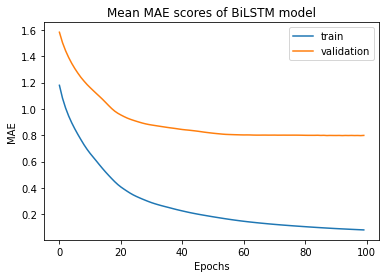

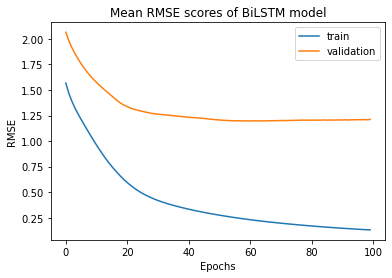

In [30]:
visualize_performance(results_tcmt_sat_x[1])

Optimal Mean MAE: 0.8495548928156496 @ epoch 92
Optimal Mean RMSE: 1.321502160653472 @ epoch 86


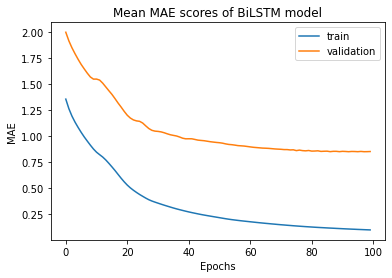

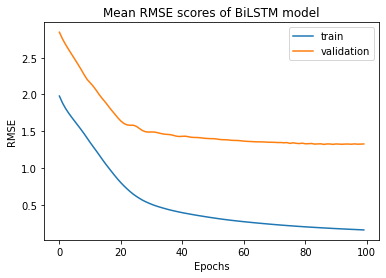

In [31]:
visualize_performance(results_tcmt_sat_y[1])

Optimal Mean MAE: 0.7721812458708882 @ epoch 96
Optimal Mean RMSE: 1.1664553275331855 @ epoch 85


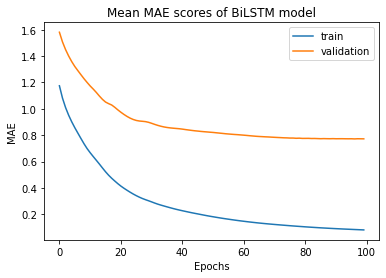

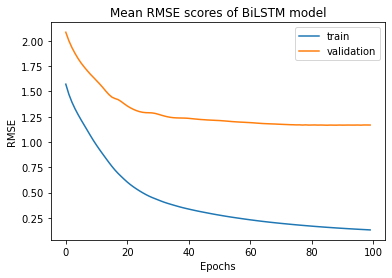

In [32]:
visualize_performance(results_tcmt_sat_z[1])

### Satellite Only

In [33]:
results_sat_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=False, incl_sat=True)
results_sat_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=False, incl_sat=True)
results_sat_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=False, tacheometry=False, incl_sat=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.1254 - mean_absolute_error: 1.9760 - root_mean_squared_error: 2.6694 - val_loss: 12.2864 - val_mean_absolute_error: 2.7669 - val_root_mean_squared_error: 3.5052
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 6.8259 - mean_absolute_error: 1.9217 - root_mean_squared_error: 2.6126 - val_loss: 11.9034 - val_mean_absolute_error: 2.7281 - val_root_mean_squared_error: 3.4501
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 6.5541 - mean_absolute_error: 1.8734 - root_mean_squared_error: 2.5601 - val_loss: 11.5671 - val_mean_absolute_error: 2.6938 - val_root_mean_squared_error: 3.4010
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 6.3007 - mean_absolute_error: 1.8302 - root_mean_squared_error: 2.5101 - val_loss: 11.2649 - val_mean_absolute_error: 2.6631 - val_root_mean_squared_error: 3.3563
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1485 - mean_absolute_error: 0.6661 - root_mean_squared_error: 1.0717 - val_loss: 9.4367 - val_mean_absolute_error: 2.2780 - val_root_mean_squared_error: 3.0719
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1176 - mean_absolute_error: 0.6559 - root_mean_squared_error: 1.0572 - val_loss: 9.3865 - val_mean_absolute_error: 2.2779 - val_root_mean_squared_error: 3.0637
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0877 - mean_absolute_error: 0.6451 - root_mean_squared_error: 1.0429 - val_loss: 9.3209 - val_mean_absolute_error: 2.2760 - val_root_mean_squared_error: 3.0530
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0586 - mean_absolute_error: 0.6345 - root_mean_squared_error: 1.0289 - val_loss: 9.2369 - val_mean_absolute_error: 2.2726 - val_root_mean_squared_error: 3.0392
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4763 - mean_absolute_error: 0.3931 - root_mean_squared_error: 0.6902 - val_loss: 7.3482 - val_mean_absolute_error: 2.0284 - val_root_mean_squared_error: 2.7108
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4543 - mean_absolute_error: 0.3767 - root_mean_squared_error: 0.6740 - val_loss: 7.3523 - val_mean_absolute_error: 2.0174 - val_root_mean_squared_error: 2.7115
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4611 - mean_absolute_error: 0.3874 - root_mean_squared_error: 0.6791 - val_loss: 7.2408 - val_mean_absolute_error: 2.0030 - val_root_mean_squared_error: 2.6909
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4417 - mean_absolute_error: 0.3720 - root_mean_squared_error: 0.6646 - val_loss: 7.1937 - val_mean_absolute_error: 1.9911 - val_root_mean_squared_error: 2.6821
Epoch 75/100
1/1 [==============================] - 0s 38ms/

  5%|████▏                                                                              | 1/20 [00:07<02:22,  7.48s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5284 - mean_absolute_error: 0.9794 - root_mean_squared_error: 1.2363 - val_loss: 2.7921 - val_mean_absolute_error: 1.3124 - val_root_mean_squared_error: 1.6710
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3788 - mean_absolute_error: 0.9151 - root_mean_squared_error: 1.1742 - val_loss: 2.5861 - val_mean_absolute_error: 1.2490 - val_root_mean_squared_error: 1.6082
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 1.2601 - mean_absolute_error: 0.8623 - root_mean_squared_error: 1.1225 - val_loss: 2.4162 - val_mean_absolute_error: 1.1944 - val_root_mean_squared_error: 1.5544
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1624 - mean_absolute_error: 0.8175 - root_mean_squared_error: 1.0782 - val_loss: 2.2715 - val_mean_absolute_error: 1.1475 - val_root_mean_squared_error: 1.5071
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0800 - mean_absolute_error: 0.1969 - root_mean_squared_error: 0.2828 - val_loss: 0.4248 - val_mean_absolute_error: 0.4655 - val_root_mean_squared_error: 0.6518
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0768 - mean_absolute_error: 0.1917 - root_mean_squared_error: 0.2772 - val_loss: 0.4154 - val_mean_absolute_error: 0.4571 - val_root_mean_squared_error: 0.6446
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0739 - mean_absolute_error: 0.1867 - root_mean_squared_error: 0.2718 - val_loss: 0.4065 - val_mean_absolute_error: 0.4479 - val_root_mean_squared_error: 0.6376
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0710 - mean_absolute_error: 0.1819 - root_mean_squared_error: 0.2665 - val_loss: 0.3981 - val_mean_absolute_error: 0.4391 - val_root_mean_squared_error: 0.6310
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0156 - mean_absolute_error: 0.0811 - root_mean_squared_error: 0.1251 - val_loss: 0.3012 - val_mean_absolute_error: 0.3477 - val_root_mean_squared_error: 0.5488
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0149 - mean_absolute_error: 0.0793 - root_mean_squared_error: 0.1222 - val_loss: 0.3016 - val_mean_absolute_error: 0.3468 - val_root_mean_squared_error: 0.5492
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0142 - mean_absolute_error: 0.0774 - root_mean_squared_error: 0.1193 - val_loss: 0.3018 - val_mean_absolute_error: 0.3459 - val_root_mean_squared_error: 0.5493
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0136 - mean_absolute_error: 0.0756 - root_mean_squared_error: 0.1166 - val_loss: 0.2993 - val_mean_absolute_error: 0.3440 - val_root_mean_squared_error: 0.5471
Epoch 75/100
1/1 [==============================] - 0s 47ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:18,  7.69s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.4712 - mean_absolute_error: 1.1475 - root_mean_squared_error: 1.5720 - val_loss: 2.3332 - val_mean_absolute_error: 1.1651 - val_root_mean_squared_error: 1.5275
Epoch 2/100
1/1 [==============================] - 0s 46ms/step - loss: 2.2686 - mean_absolute_error: 1.0804 - root_mean_squared_error: 1.5062 - val_loss: 2.1413 - val_mean_absolute_error: 1.1099 - val_root_mean_squared_error: 1.4633
Epoch 3/100
1/1 [==============================] - 0s 51ms/step - loss: 2.0986 - mean_absolute_error: 1.0240 - root_mean_squared_error: 1.4487 - val_loss: 1.9827 - val_mean_absolute_error: 1.0664 - val_root_mean_squared_error: 1.4081
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 1.9531 - mean_absolute_error: 0.9766 - root_mean_squared_error: 1.3975 - val_loss: 1.8484 - val_mean_absolute_error: 1.0275 - val_root_mean_squared_error: 1.3595
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2254 - mean_absolute_error: 0.3199 - root_mean_squared_error: 0.4748 - val_loss: 0.7884 - val_mean_absolute_error: 0.5704 - val_root_mean_squared_error: 0.8879
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2174 - mean_absolute_error: 0.3142 - root_mean_squared_error: 0.4662 - val_loss: 0.7846 - val_mean_absolute_error: 0.5722 - val_root_mean_squared_error: 0.8858
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2103 - mean_absolute_error: 0.3082 - root_mean_squared_error: 0.4586 - val_loss: 0.7768 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.8813
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2037 - mean_absolute_error: 0.3011 - root_mean_squared_error: 0.4514 - val_loss: 0.7682 - val_mean_absolute_error: 0.5753 - val_root_mean_squared_error: 0.8764
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0931 - mean_absolute_error: 0.2052 - root_mean_squared_error: 0.3051 - val_loss: 0.5709 - val_mean_absolute_error: 0.5123 - val_root_mean_squared_error: 0.7556
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0892 - mean_absolute_error: 0.2008 - root_mean_squared_error: 0.2987 - val_loss: 0.5413 - val_mean_absolute_error: 0.4999 - val_root_mean_squared_error: 0.7357
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0856 - mean_absolute_error: 0.1975 - root_mean_squared_error: 0.2926 - val_loss: 0.5483 - val_mean_absolute_error: 0.4980 - val_root_mean_squared_error: 0.7405
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0810 - mean_absolute_error: 0.1910 - root_mean_squared_error: 0.2846 - val_loss: 0.5303 - val_mean_absolute_error: 0.4881 - val_root_mean_squared_error: 0.7282
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 15%|████████████▍                                                                      | 3/20 [00:23<02:11,  7.71s/it]

Epoch 1/100
1/1 [==============================] - 5s 5s/step - loss: 2.4486 - mean_absolute_error: 1.0866 - root_mean_squared_error: 1.5648 - val_loss: 4.0851 - val_mean_absolute_error: 1.3958 - val_root_mean_squared_error: 2.0212
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.3453 - mean_absolute_error: 1.0464 - root_mean_squared_error: 1.5315 - val_loss: 3.9611 - val_mean_absolute_error: 1.3601 - val_root_mean_squared_error: 1.9903
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 2.2547 - mean_absolute_error: 1.0109 - root_mean_squared_error: 1.5016 - val_loss: 3.8504 - val_mean_absolute_error: 1.3275 - val_root_mean_squared_error: 1.9622
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 2.1735 - mean_absolute_error: 0.9789 - root_mean_squared_error: 1.4743 - val_loss: 3.7490 - val_mean_absolute_error: 1.2971 - val_root_mean_squared_error: 1.9362
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1009 - mean_absolute_error: 0.2281 - root_mean_squared_error: 0.3176 - val_loss: 0.8148 - val_mean_absolute_error: 0.4844 - val_root_mean_squared_error: 0.9027
Epoch 37/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0865 - mean_absolute_error: 0.2101 - root_mean_squared_error: 0.2941 - val_loss: 0.8101 - val_mean_absolute_error: 0.4838 - val_root_mean_squared_error: 0.9001
Epoch 38/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0768 - mean_absolute_error: 0.1990 - root_mean_squared_error: 0.2772 - val_loss: 0.8074 - val_mean_absolute_error: 0.4805 - val_root_mean_squared_error: 0.8986
Epoch 39/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0692 - mean_absolute_error: 0.1923 - root_mean_squared_error: 0.2630 - val_loss: 0.8042 - val_mean_absolute_error: 0.4730 - val_root_mean_squared_error: 0.8967
Epoch 40/100
1/1 [==============================] - 0s 56ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0094 - mean_absolute_error: 0.0757 - root_mean_squared_error: 0.0970 - val_loss: 0.7624 - val_mean_absolute_error: 0.4020 - val_root_mean_squared_error: 0.8732
Epoch 72/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0093 - mean_absolute_error: 0.0754 - root_mean_squared_error: 0.0962 - val_loss: 0.7635 - val_mean_absolute_error: 0.4012 - val_root_mean_squared_error: 0.8738
Epoch 73/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0091 - mean_absolute_error: 0.0746 - root_mean_squared_error: 0.0952 - val_loss: 0.7635 - val_mean_absolute_error: 0.4019 - val_root_mean_squared_error: 0.8738
Epoch 74/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0088 - mean_absolute_error: 0.0732 - root_mean_squared_error: 0.0936 - val_loss: 0.7627 - val_mean_absolute_error: 0.4037 - val_root_mean_squared_error: 0.8733
Epoch 75/100
1/1 [==============================] - 0s 117ms

 20%|████████████████▌                                                                  | 4/20 [00:33<02:18,  8.65s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 4.1367 - mean_absolute_error: 1.5142 - root_mean_squared_error: 2.0339 - val_loss: 2.8686 - val_mean_absolute_error: 1.3973 - val_root_mean_squared_error: 1.6937
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 4.0148 - mean_absolute_error: 1.4823 - root_mean_squared_error: 2.0037 - val_loss: 2.7519 - val_mean_absolute_error: 1.3644 - val_root_mean_squared_error: 1.6589
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 3.8995 - mean_absolute_error: 1.4521 - root_mean_squared_error: 1.9747 - val_loss: 2.6432 - val_mean_absolute_error: 1.3329 - val_root_mean_squared_error: 1.6258
Epoch 4/100
1/1 [==============================] - 0s 50ms/step - loss: 3.7873 - mean_absolute_error: 1.4223 - root_mean_squared_error: 1.9461 - val_loss: 2.5394 - val_mean_absolute_error: 1.3025 - val_root_mean_squared_error: 1.5935
Epoch 5/100
1/1 [==============================] - 0s 50ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3084 - mean_absolute_error: 0.3907 - root_mean_squared_error: 0.5553 - val_loss: 3.3604 - val_mean_absolute_error: 1.2156 - val_root_mean_squared_error: 1.8331
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2899 - mean_absolute_error: 0.3830 - root_mean_squared_error: 0.5384 - val_loss: 3.8251 - val_mean_absolute_error: 1.2890 - val_root_mean_squared_error: 1.9558
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2746 - mean_absolute_error: 0.3774 - root_mean_squared_error: 0.5240 - val_loss: 4.3208 - val_mean_absolute_error: 1.3594 - val_root_mean_squared_error: 2.0787
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2625 - mean_absolute_error: 0.3721 - root_mean_squared_error: 0.5123 - val_loss: 4.6211 - val_mean_absolute_error: 1.3950 - val_root_mean_squared_error: 2.1497
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0837 - mean_absolute_error: 0.1986 - root_mean_squared_error: 0.2892 - val_loss: 7.0386 - val_mean_absolute_error: 1.5432 - val_root_mean_squared_error: 2.6530
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0804 - mean_absolute_error: 0.1947 - root_mean_squared_error: 0.2836 - val_loss: 6.8847 - val_mean_absolute_error: 1.5242 - val_root_mean_squared_error: 2.6239
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0775 - mean_absolute_error: 0.1912 - root_mean_squared_error: 0.2783 - val_loss: 7.0300 - val_mean_absolute_error: 1.5389 - val_root_mean_squared_error: 2.6514
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0745 - mean_absolute_error: 0.1880 - root_mean_squared_error: 0.2729 - val_loss: 7.1481 - val_mean_absolute_error: 1.5503 - val_root_mean_squared_error: 2.6736
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 25%|████████████████████▊                                                              | 5/20 [00:41<02:06,  8.41s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.4926 - mean_absolute_error: 1.4879 - root_mean_squared_error: 1.8689 - val_loss: 5.2335 - val_mean_absolute_error: 1.7718 - val_root_mean_squared_error: 2.2877
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 2.6509 - mean_absolute_error: 1.2797 - root_mean_squared_error: 1.6282 - val_loss: 4.2516 - val_mean_absolute_error: 1.5637 - val_root_mean_squared_error: 2.0619
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 2.0916 - mean_absolute_error: 1.1267 - root_mean_squared_error: 1.4462 - val_loss: 3.5966 - val_mean_absolute_error: 1.4054 - val_root_mean_squared_error: 1.8965
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.7180 - mean_absolute_error: 1.0126 - root_mean_squared_error: 1.3107 - val_loss: 3.1595 - val_mean_absolute_error: 1.2858 - val_root_mean_squared_error: 1.7775
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1352 - mean_absolute_error: 0.2653 - root_mean_squared_error: 0.3677 - val_loss: 1.7007 - val_mean_absolute_error: 0.8861 - val_root_mean_squared_error: 1.3041
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1309 - mean_absolute_error: 0.2604 - root_mean_squared_error: 0.3618 - val_loss: 1.6920 - val_mean_absolute_error: 0.8841 - val_root_mean_squared_error: 1.3008
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1268 - mean_absolute_error: 0.2559 - root_mean_squared_error: 0.3560 - val_loss: 1.6826 - val_mean_absolute_error: 0.8816 - val_root_mean_squared_error: 1.2972
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1229 - mean_absolute_error: 0.2511 - root_mean_squared_error: 0.3506 - val_loss: 1.6731 - val_mean_absolute_error: 0.8783 - val_root_mean_squared_error: 1.2935
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0313 - mean_absolute_error: 0.1209 - root_mean_squared_error: 0.1770 - val_loss: 1.6931 - val_mean_absolute_error: 0.7765 - val_root_mean_squared_error: 1.3012
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0298 - mean_absolute_error: 0.1177 - root_mean_squared_error: 0.1727 - val_loss: 1.6943 - val_mean_absolute_error: 0.7736 - val_root_mean_squared_error: 1.3016
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0283 - mean_absolute_error: 0.1149 - root_mean_squared_error: 0.1683 - val_loss: 1.6950 - val_mean_absolute_error: 0.7708 - val_root_mean_squared_error: 1.3019
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0269 - mean_absolute_error: 0.1119 - root_mean_squared_error: 0.1639 - val_loss: 1.6955 - val_mean_absolute_error: 0.7681 - val_root_mean_squared_error: 1.3021
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 30%|████████████████████████▉                                                          | 6/20 [00:48<01:53,  8.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4393 - mean_absolute_error: 0.5112 - root_mean_squared_error: 0.6628 - val_loss: 1.2675 - val_mean_absolute_error: 0.8222 - val_root_mean_squared_error: 1.1258
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4124 - mean_absolute_error: 0.4908 - root_mean_squared_error: 0.6422 - val_loss: 1.2412 - val_mean_absolute_error: 0.8110 - val_root_mean_squared_error: 1.1141
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3892 - mean_absolute_error: 0.4732 - root_mean_squared_error: 0.6239 - val_loss: 1.2174 - val_mean_absolute_error: 0.8008 - val_root_mean_squared_error: 1.1034
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3688 - mean_absolute_error: 0.4575 - root_mean_squared_error: 0.6073 - val_loss: 1.1954 - val_mean_absolute_error: 0.7916 - val_root_mean_squared_error: 1.0934
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1008 - mean_absolute_error: 0.2114 - root_mean_squared_error: 0.3174 - val_loss: 0.7154 - val_mean_absolute_error: 0.5982 - val_root_mean_squared_error: 0.8458
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0976 - mean_absolute_error: 0.2085 - root_mean_squared_error: 0.3125 - val_loss: 0.7093 - val_mean_absolute_error: 0.5953 - val_root_mean_squared_error: 0.8422
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0943 - mean_absolute_error: 0.2049 - root_mean_squared_error: 0.3070 - val_loss: 0.7036 - val_mean_absolute_error: 0.5925 - val_root_mean_squared_error: 0.8388
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0907 - mean_absolute_error: 0.2010 - root_mean_squared_error: 0.3012 - val_loss: 0.6976 - val_mean_absolute_error: 0.5895 - val_root_mean_squared_error: 0.8352
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0171 - mean_absolute_error: 0.0882 - root_mean_squared_error: 0.1306 - val_loss: 0.7047 - val_mean_absolute_error: 0.5514 - val_root_mean_squared_error: 0.8395
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0165 - mean_absolute_error: 0.0866 - root_mean_squared_error: 0.1286 - val_loss: 0.7044 - val_mean_absolute_error: 0.5495 - val_root_mean_squared_error: 0.8393
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0161 - mean_absolute_error: 0.0852 - root_mean_squared_error: 0.1268 - val_loss: 0.7149 - val_mean_absolute_error: 0.5549 - val_root_mean_squared_error: 0.8455
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0156 - mean_absolute_error: 0.0837 - root_mean_squared_error: 0.1250 - val_loss: 0.7138 - val_mean_absolute_error: 0.5527 - val_root_mean_squared_error: 0.8448
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 35%|█████████████████████████████                                                      | 7/20 [00:56<01:44,  8.05s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3971 - mean_absolute_error: 0.9068 - root_mean_squared_error: 1.1820 - val_loss: 2.2026 - val_mean_absolute_error: 1.1449 - val_root_mean_squared_error: 1.4841
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.2649 - mean_absolute_error: 0.8510 - root_mean_squared_error: 1.1247 - val_loss: 2.1075 - val_mean_absolute_error: 1.1140 - val_root_mean_squared_error: 1.4517
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.1587 - mean_absolute_error: 0.8049 - root_mean_squared_error: 1.0764 - val_loss: 2.0283 - val_mean_absolute_error: 1.0873 - val_root_mean_squared_error: 1.4242
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 1.0707 - mean_absolute_error: 0.7661 - root_mean_squared_error: 1.0348 - val_loss: 1.9594 - val_mean_absolute_error: 1.0636 - val_root_mean_squared_error: 1.3998
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1130 - mean_absolute_error: 0.2384 - root_mean_squared_error: 0.3361 - val_loss: 0.9292 - val_mean_absolute_error: 0.6279 - val_root_mean_squared_error: 0.9640
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1106 - mean_absolute_error: 0.2354 - root_mean_squared_error: 0.3326 - val_loss: 0.9266 - val_mean_absolute_error: 0.6245 - val_root_mean_squared_error: 0.9626
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1083 - mean_absolute_error: 0.2315 - root_mean_squared_error: 0.3290 - val_loss: 0.9249 - val_mean_absolute_error: 0.6221 - val_root_mean_squared_error: 0.9617
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1058 - mean_absolute_error: 0.2270 - root_mean_squared_error: 0.3253 - val_loss: 0.9237 - val_mean_absolute_error: 0.6207 - val_root_mean_squared_error: 0.9611
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0564 - mean_absolute_error: 0.1455 - root_mean_squared_error: 0.2374 - val_loss: 0.7697 - val_mean_absolute_error: 0.5323 - val_root_mean_squared_error: 0.8773
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0553 - mean_absolute_error: 0.1438 - root_mean_squared_error: 0.2352 - val_loss: 0.7641 - val_mean_absolute_error: 0.5305 - val_root_mean_squared_error: 0.8741
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0543 - mean_absolute_error: 0.1421 - root_mean_squared_error: 0.2330 - val_loss: 0.7580 - val_mean_absolute_error: 0.5289 - val_root_mean_squared_error: 0.8706
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0533 - mean_absolute_error: 0.1404 - root_mean_squared_error: 0.2309 - val_loss: 0.7524 - val_mean_absolute_error: 0.5269 - val_root_mean_squared_error: 0.8674
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [01:04<01:35,  7.96s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 4.3435 - mean_absolute_error: 1.3796 - root_mean_squared_error: 2.0841 - val_loss: 14.5682 - val_mean_absolute_error: 2.8512 - val_root_mean_squared_error: 3.8168
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 4.2358 - mean_absolute_error: 1.3445 - root_mean_squared_error: 2.0581 - val_loss: 14.4162 - val_mean_absolute_error: 2.8310 - val_root_mean_squared_error: 3.7969
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 4.1420 - mean_absolute_error: 1.3139 - root_mean_squared_error: 2.0352 - val_loss: 14.2737 - val_mean_absolute_error: 2.8122 - val_root_mean_squared_error: 3.7781
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 4.0572 - mean_absolute_error: 1.2863 - root_mean_squared_error: 2.0142 - val_loss: 14.1349 - val_mean_absolute_error: 2.7941 - val_root_mean_squared_error: 3.7596
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 1.4698 - mean_absolute_error: 0.7173 - root_mean_squared_error: 1.2124 - val_loss: 7.2371 - val_mean_absolute_error: 1.9172 - val_root_mean_squared_error: 2.6902
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 1.4146 - mean_absolute_error: 0.7016 - root_mean_squared_error: 1.1894 - val_loss: 7.2046 - val_mean_absolute_error: 1.9105 - val_root_mean_squared_error: 2.6841
Epoch 38/100
1/1 [==============================] - 0s 30ms/step - loss: 1.3635 - mean_absolute_error: 0.6907 - root_mean_squared_error: 1.1677 - val_loss: 7.0998 - val_mean_absolute_error: 1.8973 - val_root_mean_squared_error: 2.6645
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 1.3117 - mean_absolute_error: 0.6850 - root_mean_squared_error: 1.1453 - val_loss: 6.9571 - val_mean_absolute_error: 1.8809 - val_root_mean_squared_error: 2.6376
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4351 - mean_absolute_error: 0.4099 - root_mean_squared_error: 0.6596 - val_loss: 5.9467 - val_mean_absolute_error: 1.7775 - val_root_mean_squared_error: 2.4386
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4218 - mean_absolute_error: 0.4036 - root_mean_squared_error: 0.6494 - val_loss: 5.9642 - val_mean_absolute_error: 1.7955 - val_root_mean_squared_error: 2.4422
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.4194 - mean_absolute_error: 0.4068 - root_mean_squared_error: 0.6476 - val_loss: 5.9228 - val_mean_absolute_error: 1.7786 - val_root_mean_squared_error: 2.4337
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3928 - mean_absolute_error: 0.3919 - root_mean_squared_error: 0.6267 - val_loss: 5.9524 - val_mean_absolute_error: 1.7745 - val_root_mean_squared_error: 2.4397
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:12<01:27,  7.99s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2302 - mean_absolute_error: 0.8234 - root_mean_squared_error: 1.1091 - val_loss: 3.1546 - val_mean_absolute_error: 1.2573 - val_root_mean_squared_error: 1.7761
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1054 - mean_absolute_error: 0.7554 - root_mean_squared_error: 1.0514 - val_loss: 3.0498 - val_mean_absolute_error: 1.2157 - val_root_mean_squared_error: 1.7464
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.0066 - mean_absolute_error: 0.6991 - root_mean_squared_error: 1.0033 - val_loss: 2.9631 - val_mean_absolute_error: 1.1813 - val_root_mean_squared_error: 1.7214
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9259 - mean_absolute_error: 0.6515 - root_mean_squared_error: 0.9622 - val_loss: 2.8887 - val_mean_absolute_error: 1.1527 - val_root_mean_squared_error: 1.6996
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0531 - mean_absolute_error: 0.1564 - root_mean_squared_error: 0.2305 - val_loss: 1.7417 - val_mean_absolute_error: 0.7026 - val_root_mean_squared_error: 1.3197
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0477 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2185 - val_loss: 1.7344 - val_mean_absolute_error: 0.6999 - val_root_mean_squared_error: 1.3170
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0431 - mean_absolute_error: 0.1423 - root_mean_squared_error: 0.2077 - val_loss: 1.7286 - val_mean_absolute_error: 0.6965 - val_root_mean_squared_error: 1.3148
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0391 - mean_absolute_error: 0.1376 - root_mean_squared_error: 0.1978 - val_loss: 1.7247 - val_mean_absolute_error: 0.6927 - val_root_mean_squared_error: 1.3133
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0061 - mean_absolute_error: 0.0586 - root_mean_squared_error: 0.0779 - val_loss: 1.6904 - val_mean_absolute_error: 0.6311 - val_root_mean_squared_error: 1.3001
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0058 - mean_absolute_error: 0.0573 - root_mean_squared_error: 0.0764 - val_loss: 1.6896 - val_mean_absolute_error: 0.6300 - val_root_mean_squared_error: 1.2998
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0056 - mean_absolute_error: 0.0561 - root_mean_squared_error: 0.0749 - val_loss: 1.6889 - val_mean_absolute_error: 0.6283 - val_root_mean_squared_error: 1.2996
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0054 - mean_absolute_error: 0.0551 - root_mean_squared_error: 0.0734 - val_loss: 1.6879 - val_mean_absolute_error: 0.6273 - val_root_mean_squared_error: 1.2992
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:19<01:15,  7.59s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.1737 - mean_absolute_error: 1.7319 - root_mean_squared_error: 2.2746 - val_loss: 8.9927 - val_mean_absolute_error: 2.3002 - val_root_mean_squared_error: 2.9988
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.9911 - mean_absolute_error: 1.6863 - root_mean_squared_error: 2.2341 - val_loss: 8.7470 - val_mean_absolute_error: 2.2552 - val_root_mean_squared_error: 2.9575
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 4.8262 - mean_absolute_error: 1.6447 - root_mean_squared_error: 2.1969 - val_loss: 8.5139 - val_mean_absolute_error: 2.2113 - val_root_mean_squared_error: 2.9179
Epoch 4/100
1/1 [==============================] - 0s 53ms/step - loss: 4.6704 - mean_absolute_error: 1.6051 - root_mean_squared_error: 2.1611 - val_loss: 8.2812 - val_mean_absolute_error: 2.1664 - val_root_mean_squared_error: 2.8777
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4957 - mean_absolute_error: 0.4651 - root_mean_squared_error: 0.7041 - val_loss: 1.4124 - val_mean_absolute_error: 0.7651 - val_root_mean_squared_error: 1.1884
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4834 - mean_absolute_error: 0.4645 - root_mean_squared_error: 0.6953 - val_loss: 1.3838 - val_mean_absolute_error: 0.7523 - val_root_mean_squared_error: 1.1763
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.4723 - mean_absolute_error: 0.4617 - root_mean_squared_error: 0.6872 - val_loss: 1.3573 - val_mean_absolute_error: 0.7406 - val_root_mean_squared_error: 1.1650
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4586 - mean_absolute_error: 0.4539 - root_mean_squared_error: 0.6772 - val_loss: 1.3350 - val_mean_absolute_error: 0.7327 - val_root_mean_squared_error: 1.1554
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2390 - mean_absolute_error: 0.2945 - root_mean_squared_error: 0.4888 - val_loss: 1.2559 - val_mean_absolute_error: 0.6750 - val_root_mean_squared_error: 1.1207
Epoch 72/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2340 - mean_absolute_error: 0.2960 - root_mean_squared_error: 0.4837 - val_loss: 1.2696 - val_mean_absolute_error: 0.6736 - val_root_mean_squared_error: 1.1267
Epoch 73/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2286 - mean_absolute_error: 0.2935 - root_mean_squared_error: 0.4781 - val_loss: 1.2766 - val_mean_absolute_error: 0.6796 - val_root_mean_squared_error: 1.1299
Epoch 74/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2230 - mean_absolute_error: 0.2934 - root_mean_squared_error: 0.4722 - val_loss: 1.2817 - val_mean_absolute_error: 0.6852 - val_root_mean_squared_error: 1.1321
Epoch 75/100
1/1 [==============================] - 0s 66ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:26<01:08,  7.62s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.9987 - mean_absolute_error: 2.1150 - root_mean_squared_error: 2.8282 - val_loss: 11.6030 - val_mean_absolute_error: 2.5762 - val_root_mean_squared_error: 3.4063
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 7.8466 - mean_absolute_error: 2.0847 - root_mean_squared_error: 2.8012 - val_loss: 11.4001 - val_mean_absolute_error: 2.5449 - val_root_mean_squared_error: 3.3764
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 7.7019 - mean_absolute_error: 2.0556 - root_mean_squared_error: 2.7752 - val_loss: 11.1984 - val_mean_absolute_error: 2.5129 - val_root_mean_squared_error: 3.3464
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 7.5567 - mean_absolute_error: 2.0260 - root_mean_squared_error: 2.7490 - val_loss: 10.9873 - val_mean_absolute_error: 2.4788 - val_root_mean_squared_error: 3.3147
Epoch 5/100
1/1 [==============================] - 0s 44ms/ste

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 1.3857 - mean_absolute_error: 0.7635 - root_mean_squared_error: 1.1772 - val_loss: 4.3445 - val_mean_absolute_error: 1.4364 - val_root_mean_squared_error: 2.0843
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3498 - mean_absolute_error: 0.7495 - root_mean_squared_error: 1.1618 - val_loss: 4.5114 - val_mean_absolute_error: 1.4505 - val_root_mean_squared_error: 2.1240
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 1.3065 - mean_absolute_error: 0.7322 - root_mean_squared_error: 1.1430 - val_loss: 4.7882 - val_mean_absolute_error: 1.4839 - val_root_mean_squared_error: 2.1882
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 1.2691 - mean_absolute_error: 0.7180 - root_mean_squared_error: 1.1266 - val_loss: 5.1394 - val_mean_absolute_error: 1.5313 - val_root_mean_squared_error: 2.2670
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3442 - mean_absolute_error: 0.3575 - root_mean_squared_error: 0.5867 - val_loss: 4.0756 - val_mean_absolute_error: 1.2631 - val_root_mean_squared_error: 2.0188
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3300 - mean_absolute_error: 0.3477 - root_mean_squared_error: 0.5744 - val_loss: 4.0238 - val_mean_absolute_error: 1.2513 - val_root_mean_squared_error: 2.0059
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3148 - mean_absolute_error: 0.3394 - root_mean_squared_error: 0.5610 - val_loss: 4.0671 - val_mean_absolute_error: 1.2512 - val_root_mean_squared_error: 2.0167
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3004 - mean_absolute_error: 0.3333 - root_mean_squared_error: 0.5481 - val_loss: 4.0477 - val_mean_absolute_error: 1.2443 - val_root_mean_squared_error: 2.0119
Epoch 75/100
1/1 [==============================] - 0s 51ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:34<01:01,  7.70s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4919 - mean_absolute_error: 0.5522 - root_mean_squared_error: 0.7013 - val_loss: 0.7595 - val_mean_absolute_error: 0.6816 - val_root_mean_squared_error: 0.8715
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.4059 - mean_absolute_error: 0.4901 - root_mean_squared_error: 0.6371 - val_loss: 0.6475 - val_mean_absolute_error: 0.6184 - val_root_mean_squared_error: 0.8046
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3429 - mean_absolute_error: 0.4406 - root_mean_squared_error: 0.5856 - val_loss: 0.5636 - val_mean_absolute_error: 0.5675 - val_root_mean_squared_error: 0.7508
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2952 - mean_absolute_error: 0.4006 - root_mean_squared_error: 0.5433 - val_loss: 0.4982 - val_mean_absolute_error: 0.5257 - val_root_mean_squared_error: 0.7058
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0084 - mean_absolute_error: 0.0640 - root_mean_squared_error: 0.0919 - val_loss: 0.0229 - val_mean_absolute_error: 0.1082 - val_root_mean_squared_error: 0.1513
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0078 - mean_absolute_error: 0.0618 - root_mean_squared_error: 0.0883 - val_loss: 0.0216 - val_mean_absolute_error: 0.1067 - val_root_mean_squared_error: 0.1471
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0072 - mean_absolute_error: 0.0597 - root_mean_squared_error: 0.0850 - val_loss: 0.0204 - val_mean_absolute_error: 0.1047 - val_root_mean_squared_error: 0.1427
Epoch 39/100
1/1 [==============================] - 0s 74ms/step - loss: 0.0067 - mean_absolute_error: 0.0577 - root_mean_squared_error: 0.0818 - val_loss: 0.0192 - val_mean_absolute_error: 0.1023 - val_root_mean_squared_error: 0.1384
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0018 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0428 - val_loss: 0.0091 - val_mean_absolute_error: 0.0746 - val_root_mean_squared_error: 0.0954
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0018 - mean_absolute_error: 0.0310 - root_mean_squared_error: 0.0424 - val_loss: 0.0089 - val_mean_absolute_error: 0.0739 - val_root_mean_squared_error: 0.0944
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0018 - mean_absolute_error: 0.0306 - root_mean_squared_error: 0.0419 - val_loss: 0.0088 - val_mean_absolute_error: 0.0734 - val_root_mean_squared_error: 0.0937
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0017 - mean_absolute_error: 0.0303 - root_mean_squared_error: 0.0415 - val_loss: 0.0087 - val_mean_absolute_error: 0.0730 - val_root_mean_squared_error: 0.0932
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:40<00:49,  7.13s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.1893 - mean_absolute_error: 1.0069 - root_mean_squared_error: 1.4796 - val_loss: 10.1551 - val_mean_absolute_error: 2.3598 - val_root_mean_squared_error: 3.1867
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 2.0100 - mean_absolute_error: 0.9331 - root_mean_squared_error: 1.4177 - val_loss: 9.9156 - val_mean_absolute_error: 2.3180 - val_root_mean_squared_error: 3.1489
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.8802 - mean_absolute_error: 0.8783 - root_mean_squared_error: 1.3712 - val_loss: 9.7190 - val_mean_absolute_error: 2.2840 - val_root_mean_squared_error: 3.1175
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 1.7824 - mean_absolute_error: 0.8369 - root_mean_squared_error: 1.3351 - val_loss: 9.5499 - val_mean_absolute_error: 2.2558 - val_root_mean_squared_error: 3.0903
Epoch 5/100
1/1 [==============================] - 0s 30ms/step -

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7023 - mean_absolute_error: 0.5392 - root_mean_squared_error: 0.8381 - val_loss: 6.3704 - val_mean_absolute_error: 1.7930 - val_root_mean_squared_error: 2.5240
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6629 - mean_absolute_error: 0.5271 - root_mean_squared_error: 0.8142 - val_loss: 6.2664 - val_mean_absolute_error: 1.7809 - val_root_mean_squared_error: 2.5033
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6229 - mean_absolute_error: 0.5158 - root_mean_squared_error: 0.7892 - val_loss: 6.1581 - val_mean_absolute_error: 1.7680 - val_root_mean_squared_error: 2.4815
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.5831 - mean_absolute_error: 0.5034 - root_mean_squared_error: 0.7636 - val_loss: 6.1390 - val_mean_absolute_error: 1.7628 - val_root_mean_squared_error: 2.4777
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0938 - mean_absolute_error: 0.2050 - root_mean_squared_error: 0.3062 - val_loss: 7.8943 - val_mean_absolute_error: 1.9102 - val_root_mean_squared_error: 2.8097
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0904 - mean_absolute_error: 0.2010 - root_mean_squared_error: 0.3007 - val_loss: 7.9782 - val_mean_absolute_error: 1.9200 - val_root_mean_squared_error: 2.8246
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0879 - mean_absolute_error: 0.1985 - root_mean_squared_error: 0.2964 - val_loss: 7.8297 - val_mean_absolute_error: 1.8975 - val_root_mean_squared_error: 2.7982
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0850 - mean_absolute_error: 0.1945 - root_mean_squared_error: 0.2916 - val_loss: 7.8997 - val_mean_absolute_error: 1.9062 - val_root_mean_squared_error: 2.8106
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:45<00:39,  6.63s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1711 - mean_absolute_error: 0.8330 - root_mean_squared_error: 1.0822 - val_loss: 1.6587 - val_mean_absolute_error: 0.9588 - val_root_mean_squared_error: 1.2879
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.0162 - mean_absolute_error: 0.7564 - root_mean_squared_error: 1.0081 - val_loss: 1.4897 - val_mean_absolute_error: 0.8900 - val_root_mean_squared_error: 1.2205
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.8992 - mean_absolute_error: 0.6950 - root_mean_squared_error: 0.9482 - val_loss: 1.3592 - val_mean_absolute_error: 0.8350 - val_root_mean_squared_error: 1.1658
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.8079 - mean_absolute_error: 0.6445 - root_mean_squared_error: 0.8988 - val_loss: 1.2547 - val_mean_absolute_error: 0.7912 - val_root_mean_squared_error: 1.1201
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0756 - mean_absolute_error: 0.1827 - root_mean_squared_error: 0.2750 - val_loss: 0.1664 - val_mean_absolute_error: 0.2914 - val_root_mean_squared_error: 0.4079
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0741 - mean_absolute_error: 0.1794 - root_mean_squared_error: 0.2722 - val_loss: 0.1630 - val_mean_absolute_error: 0.2885 - val_root_mean_squared_error: 0.4038
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0727 - mean_absolute_error: 0.1764 - root_mean_squared_error: 0.2696 - val_loss: 0.1599 - val_mean_absolute_error: 0.2861 - val_root_mean_squared_error: 0.3998
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0713 - mean_absolute_error: 0.1737 - root_mean_squared_error: 0.2669 - val_loss: 0.1569 - val_mean_absolute_error: 0.2835 - val_root_mean_squared_error: 0.3961
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0452 - mean_absolute_error: 0.1239 - root_mean_squared_error: 0.2125 - val_loss: 0.1318 - val_mean_absolute_error: 0.2505 - val_root_mean_squared_error: 0.3630
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0444 - mean_absolute_error: 0.1228 - root_mean_squared_error: 0.2107 - val_loss: 0.1315 - val_mean_absolute_error: 0.2501 - val_root_mean_squared_error: 0.3626
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0436 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.2089 - val_loss: 0.1312 - val_mean_absolute_error: 0.2495 - val_root_mean_squared_error: 0.3622
Epoch 74/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0428 - mean_absolute_error: 0.1208 - root_mean_squared_error: 0.2070 - val_loss: 0.1306 - val_mean_absolute_error: 0.2488 - val_root_mean_squared_error: 0.3614
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:51<00:32,  6.42s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0040 - mean_absolute_error: 0.7953 - root_mean_squared_error: 1.0020 - val_loss: 1.8935 - val_mean_absolute_error: 1.0956 - val_root_mean_squared_error: 1.3760
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 0.9281 - mean_absolute_error: 0.7569 - root_mean_squared_error: 0.9634 - val_loss: 1.7917 - val_mean_absolute_error: 1.0585 - val_root_mean_squared_error: 1.3385
Epoch 3/100
1/1 [==============================] - 0s 55ms/step - loss: 0.8645 - mean_absolute_error: 0.7236 - root_mean_squared_error: 0.9298 - val_loss: 1.7082 - val_mean_absolute_error: 1.0273 - val_root_mean_squared_error: 1.3070
Epoch 4/100
1/1 [==============================] - 0s 50ms/step - loss: 0.8095 - mean_absolute_error: 0.6950 - root_mean_squared_error: 0.8997 - val_loss: 1.6383 - val_mean_absolute_error: 1.0002 - val_root_mean_squared_error: 1.2800
Epoch 5/100
1/1 [==============================] - 0s 53ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1606 - mean_absolute_error: 0.2197 - root_mean_squared_error: 0.4007 - val_loss: 0.9783 - val_mean_absolute_error: 0.6205 - val_root_mean_squared_error: 0.9891
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1593 - mean_absolute_error: 0.2173 - root_mean_squared_error: 0.3991 - val_loss: 0.9810 - val_mean_absolute_error: 0.6195 - val_root_mean_squared_error: 0.9904
Epoch 38/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1582 - mean_absolute_error: 0.2150 - root_mean_squared_error: 0.3977 - val_loss: 0.9821 - val_mean_absolute_error: 0.6177 - val_root_mean_squared_error: 0.9910
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1570 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.3963 - val_loss: 0.9811 - val_mean_absolute_error: 0.6149 - val_root_mean_squared_error: 0.9905
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1042 - mean_absolute_error: 0.1703 - root_mean_squared_error: 0.3228 - val_loss: 1.0429 - val_mean_absolute_error: 0.6275 - val_root_mean_squared_error: 1.0212
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1008 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.3176 - val_loss: 1.0546 - val_mean_absolute_error: 0.6346 - val_root_mean_squared_error: 1.0270
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0974 - mean_absolute_error: 0.1705 - root_mean_squared_error: 0.3121 - val_loss: 1.0564 - val_mean_absolute_error: 0.6366 - val_root_mean_squared_error: 1.0278
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0940 - mean_absolute_error: 0.1705 - root_mean_squared_error: 0.3066 - val_loss: 1.0581 - val_mean_absolute_error: 0.6385 - val_root_mean_squared_error: 1.0286
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:59<00:27,  6.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.1829 - mean_absolute_error: 1.6140 - root_mean_squared_error: 2.0452 - val_loss: 7.2618 - val_mean_absolute_error: 2.0923 - val_root_mean_squared_error: 2.6948
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 3.1335 - mean_absolute_error: 1.3738 - root_mean_squared_error: 1.7702 - val_loss: 6.2697 - val_mean_absolute_error: 1.9219 - val_root_mean_squared_error: 2.5039
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 2.4012 - mean_absolute_error: 1.1850 - root_mean_squared_error: 1.5496 - val_loss: 5.5696 - val_mean_absolute_error: 1.7936 - val_root_mean_squared_error: 2.3600
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 1.8765 - mean_absolute_error: 1.0367 - root_mean_squared_error: 1.3698 - val_loss: 5.0601 - val_mean_absolute_error: 1.6958 - val_root_mean_squared_error: 2.2495
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0667 - mean_absolute_error: 0.1549 - root_mean_squared_error: 0.2582 - val_loss: 3.0682 - val_mean_absolute_error: 1.2371 - val_root_mean_squared_error: 1.7516
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0646 - mean_absolute_error: 0.1507 - root_mean_squared_error: 0.2542 - val_loss: 3.0571 - val_mean_absolute_error: 1.2344 - val_root_mean_squared_error: 1.7485
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0628 - mean_absolute_error: 0.1472 - root_mean_squared_error: 0.2506 - val_loss: 3.0465 - val_mean_absolute_error: 1.2320 - val_root_mean_squared_error: 1.7454
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0612 - mean_absolute_error: 0.1444 - root_mean_squared_error: 0.2474 - val_loss: 3.0366 - val_mean_absolute_error: 1.2299 - val_root_mean_squared_error: 1.7426
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0401 - mean_absolute_error: 0.1045 - root_mean_squared_error: 0.2002 - val_loss: 2.9767 - val_mean_absolute_error: 1.2158 - val_root_mean_squared_error: 1.7253
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0396 - mean_absolute_error: 0.1039 - root_mean_squared_error: 0.1991 - val_loss: 2.9738 - val_mean_absolute_error: 1.2153 - val_root_mean_squared_error: 1.7245
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0392 - mean_absolute_error: 0.1033 - root_mean_squared_error: 0.1980 - val_loss: 2.9714 - val_mean_absolute_error: 1.2148 - val_root_mean_squared_error: 1.7238
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0388 - mean_absolute_error: 0.1027 - root_mean_squared_error: 0.1969 - val_loss: 2.9687 - val_mean_absolute_error: 1.2141 - val_root_mean_squared_error: 1.7230
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:07<00:21,  7.02s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9974 - mean_absolute_error: 0.7540 - root_mean_squared_error: 0.9987 - val_loss: 2.0596 - val_mean_absolute_error: 1.1359 - val_root_mean_squared_error: 1.4351
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8592 - mean_absolute_error: 0.6880 - root_mean_squared_error: 0.9269 - val_loss: 1.8906 - val_mean_absolute_error: 1.0867 - val_root_mean_squared_error: 1.3750
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.7563 - mean_absolute_error: 0.6357 - root_mean_squared_error: 0.8697 - val_loss: 1.7629 - val_mean_absolute_error: 1.0509 - val_root_mean_squared_error: 1.3278
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6773 - mean_absolute_error: 0.5932 - root_mean_squared_error: 0.8230 - val_loss: 1.6619 - val_mean_absolute_error: 1.0233 - val_root_mean_squared_error: 1.2891
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1765 - mean_absolute_error: 0.3120 - root_mean_squared_error: 0.4201 - val_loss: 0.6855 - val_mean_absolute_error: 0.6868 - val_root_mean_squared_error: 0.8280
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1737 - mean_absolute_error: 0.3089 - root_mean_squared_error: 0.4167 - val_loss: 0.6860 - val_mean_absolute_error: 0.6861 - val_root_mean_squared_error: 0.8282
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1708 - mean_absolute_error: 0.3059 - root_mean_squared_error: 0.4132 - val_loss: 0.6869 - val_mean_absolute_error: 0.6856 - val_root_mean_squared_error: 0.8288
Epoch 39/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1678 - mean_absolute_error: 0.3026 - root_mean_squared_error: 0.4096 - val_loss: 0.6877 - val_mean_absolute_error: 0.6852 - val_root_mean_squared_error: 0.8292
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0615 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.2480 - val_loss: 0.9096 - val_mean_absolute_error: 0.7739 - val_root_mean_squared_error: 0.9537
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0597 - mean_absolute_error: 0.1761 - root_mean_squared_error: 0.2443 - val_loss: 0.9092 - val_mean_absolute_error: 0.7732 - val_root_mean_squared_error: 0.9535
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0578 - mean_absolute_error: 0.1725 - root_mean_squared_error: 0.2404 - val_loss: 0.9119 - val_mean_absolute_error: 0.7742 - val_root_mean_squared_error: 0.9550
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0559 - mean_absolute_error: 0.1688 - root_mean_squared_error: 0.2365 - val_loss: 0.9077 - val_mean_absolute_error: 0.7715 - val_root_mean_squared_error: 0.9527
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:14<00:13,  7.00s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.8224 - mean_absolute_error: 1.0119 - root_mean_squared_error: 1.3500 - val_loss: 3.1555 - val_mean_absolute_error: 1.3913 - val_root_mean_squared_error: 1.7764
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.6782 - mean_absolute_error: 0.9563 - root_mean_squared_error: 1.2954 - val_loss: 2.9007 - val_mean_absolute_error: 1.3239 - val_root_mean_squared_error: 1.7032
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.5562 - mean_absolute_error: 0.9079 - root_mean_squared_error: 1.2475 - val_loss: 2.6870 - val_mean_absolute_error: 1.2659 - val_root_mean_squared_error: 1.6392
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4481 - mean_absolute_error: 0.8642 - root_mean_squared_error: 1.2034 - val_loss: 2.4985 - val_mean_absolute_error: 1.2121 - val_root_mean_squared_error: 1.5807
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0560 - mean_absolute_error: 0.1736 - root_mean_squared_error: 0.2366 - val_loss: 0.9623 - val_mean_absolute_error: 0.6801 - val_root_mean_squared_error: 0.9810
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0531 - mean_absolute_error: 0.1688 - root_mean_squared_error: 0.2305 - val_loss: 0.9761 - val_mean_absolute_error: 0.6839 - val_root_mean_squared_error: 0.9880
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0505 - mean_absolute_error: 0.1643 - root_mean_squared_error: 0.2246 - val_loss: 0.9919 - val_mean_absolute_error: 0.6881 - val_root_mean_squared_error: 0.9959
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0481 - mean_absolute_error: 0.1599 - root_mean_squared_error: 0.2193 - val_loss: 1.0049 - val_mean_absolute_error: 0.6916 - val_root_mean_squared_error: 1.0024
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0188 - mean_absolute_error: 0.0894 - root_mean_squared_error: 0.1370 - val_loss: 1.3629 - val_mean_absolute_error: 0.7971 - val_root_mean_squared_error: 1.1674
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0184 - mean_absolute_error: 0.0882 - root_mean_squared_error: 0.1355 - val_loss: 1.3730 - val_mean_absolute_error: 0.8001 - val_root_mean_squared_error: 1.1718
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0180 - mean_absolute_error: 0.0871 - root_mean_squared_error: 0.1340 - val_loss: 1.3900 - val_mean_absolute_error: 0.8057 - val_root_mean_squared_error: 1.1790
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0176 - mean_absolute_error: 0.0861 - root_mean_squared_error: 0.1326 - val_loss: 1.4080 - val_mean_absolute_error: 0.8117 - val_root_mean_squared_error: 1.1866
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:20<00:06,  6.79s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.8214 - mean_absolute_error: 1.0625 - root_mean_squared_error: 1.3496 - val_loss: 3.2491 - val_mean_absolute_error: 1.4268 - val_root_mean_squared_error: 1.8025
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 1.4362 - mean_absolute_error: 0.9231 - root_mean_squared_error: 1.1984 - val_loss: 2.7688 - val_mean_absolute_error: 1.3139 - val_root_mean_squared_error: 1.6640
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1660 - mean_absolute_error: 0.8150 - root_mean_squared_error: 1.0798 - val_loss: 2.4209 - val_mean_absolute_error: 1.2261 - val_root_mean_squared_error: 1.5559
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.9718 - mean_absolute_error: 0.7335 - root_mean_squared_error: 0.9858 - val_loss: 2.1635 - val_mean_absolute_error: 1.1543 - val_root_mean_squared_error: 1.4709
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0931 - mean_absolute_error: 0.1984 - root_mean_squared_error: 0.3052 - val_loss: 1.0685 - val_mean_absolute_error: 0.7842 - val_root_mean_squared_error: 1.0337
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0911 - mean_absolute_error: 0.1955 - root_mean_squared_error: 0.3018 - val_loss: 1.0619 - val_mean_absolute_error: 0.7818 - val_root_mean_squared_error: 1.0305
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0893 - mean_absolute_error: 0.1930 - root_mean_squared_error: 0.2988 - val_loss: 1.0555 - val_mean_absolute_error: 0.7792 - val_root_mean_squared_error: 1.0274
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0877 - mean_absolute_error: 0.1910 - root_mean_squared_error: 0.2961 - val_loss: 1.0491 - val_mean_absolute_error: 0.7764 - val_root_mean_squared_error: 1.0242
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0564 - mean_absolute_error: 0.1395 - root_mean_squared_error: 0.2374 - val_loss: 1.0234 - val_mean_absolute_error: 0.7559 - val_root_mean_squared_error: 1.0116
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0557 - mean_absolute_error: 0.1385 - root_mean_squared_error: 0.2361 - val_loss: 1.0238 - val_mean_absolute_error: 0.7559 - val_root_mean_squared_error: 1.0118
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0551 - mean_absolute_error: 0.1374 - root_mean_squared_error: 0.2348 - val_loss: 1.0242 - val_mean_absolute_error: 0.7558 - val_root_mean_squared_error: 1.0120
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0545 - mean_absolute_error: 0.1364 - root_mean_squared_error: 0.2335 - val_loss: 1.0246 - val_mean_absolute_error: 0.7558 - val_root_mean_squared_error: 1.0122
Epoch 75/100
1/1 [==============================] - 0s 35ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 10.8210 - mean_absolute_error: 2.2884 - root_mean_squared_error: 3.2895 - val_loss: 15.9360 - val_mean_absolute_error: 2.9143 - val_root_mean_squared_error: 3.9920
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 10.3830 - mean_absolute_error: 2.2094 - root_mean_squared_error: 3.2223 - val_loss: 15.2088 - val_mean_absolute_error: 2.8167 - val_root_mean_squared_error: 3.8998
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 10.0127 - mean_absolute_error: 2.1415 - root_mean_squared_error: 3.1643 - val_loss: 14.5915 - val_mean_absolute_error: 2.7362 - val_root_mean_squared_error: 3.8199
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 9.6766 - mean_absolute_error: 2.0819 - root_mean_squared_error: 3.1107 - val_loss: 14.0318 - val_mean_absolute_error: 2.6638 - val_root_mean_squared_error: 3.7459
Epoch 5/100
1/1 [==============================] - 0s 34ms/

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1987 - mean_absolute_error: 0.6935 - root_mean_squared_error: 1.0948 - val_loss: 4.5384 - val_mean_absolute_error: 1.4647 - val_root_mean_squared_error: 2.1304
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 1.1681 - mean_absolute_error: 0.6772 - root_mean_squared_error: 1.0808 - val_loss: 4.5421 - val_mean_absolute_error: 1.4654 - val_root_mean_squared_error: 2.1312
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1471 - mean_absolute_error: 0.6636 - root_mean_squared_error: 1.0710 - val_loss: 4.5213 - val_mean_absolute_error: 1.4642 - val_root_mean_squared_error: 2.1263
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 1.1299 - mean_absolute_error: 0.6505 - root_mean_squared_error: 1.0630 - val_loss: 4.4624 - val_mean_absolute_error: 1.4614 - val_root_mean_squared_error: 2.1124
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5409 - mean_absolute_error: 0.3977 - root_mean_squared_error: 0.7355 - val_loss: 4.7140 - val_mean_absolute_error: 1.4433 - val_root_mean_squared_error: 2.1712
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5271 - mean_absolute_error: 0.3899 - root_mean_squared_error: 0.7260 - val_loss: 4.7430 - val_mean_absolute_error: 1.4470 - val_root_mean_squared_error: 2.1778
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5138 - mean_absolute_error: 0.3817 - root_mean_squared_error: 0.7168 - val_loss: 4.7861 - val_mean_absolute_error: 1.4528 - val_root_mean_squared_error: 2.1877
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5013 - mean_absolute_error: 0.3741 - root_mean_squared_error: 0.7080 - val_loss: 4.8501 - val_mean_absolute_error: 1.4607 - val_root_mean_squared_error: 2.2023
Epoch 75/100
1/1 [==============================] - 0s 36ms/

  5%|████▏                                                                              | 1/20 [00:06<01:58,  6.25s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.4360 - mean_absolute_error: 1.3887 - root_mean_squared_error: 1.8536 - val_loss: 4.8975 - val_mean_absolute_error: 1.6610 - val_root_mean_squared_error: 2.2130
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 3.2495 - mean_absolute_error: 1.3301 - root_mean_squared_error: 1.8026 - val_loss: 4.6717 - val_mean_absolute_error: 1.6049 - val_root_mean_squared_error: 2.1614
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 3.0839 - mean_absolute_error: 1.2779 - root_mean_squared_error: 1.7561 - val_loss: 4.4620 - val_mean_absolute_error: 1.5527 - val_root_mean_squared_error: 2.1123
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 2.9304 - mean_absolute_error: 1.2299 - root_mean_squared_error: 1.7118 - val_loss: 4.2599 - val_mean_absolute_error: 1.5044 - val_root_mean_squared_error: 2.0640
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1613 - mean_absolute_error: 0.2945 - root_mean_squared_error: 0.4016 - val_loss: 0.7391 - val_mean_absolute_error: 0.6221 - val_root_mean_squared_error: 0.8597
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1527 - mean_absolute_error: 0.2852 - root_mean_squared_error: 0.3907 - val_loss: 0.7256 - val_mean_absolute_error: 0.6151 - val_root_mean_squared_error: 0.8518
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1443 - mean_absolute_error: 0.2746 - root_mean_squared_error: 0.3798 - val_loss: 0.7187 - val_mean_absolute_error: 0.6102 - val_root_mean_squared_error: 0.8478
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1367 - mean_absolute_error: 0.2650 - root_mean_squared_error: 0.3698 - val_loss: 0.7234 - val_mean_absolute_error: 0.6103 - val_root_mean_squared_error: 0.8505
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0295 - mean_absolute_error: 0.1192 - root_mean_squared_error: 0.1717 - val_loss: 0.6247 - val_mean_absolute_error: 0.5215 - val_root_mean_squared_error: 0.7904
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0278 - mean_absolute_error: 0.1160 - root_mean_squared_error: 0.1668 - val_loss: 0.6263 - val_mean_absolute_error: 0.5206 - val_root_mean_squared_error: 0.7914
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0262 - mean_absolute_error: 0.1131 - root_mean_squared_error: 0.1620 - val_loss: 0.6257 - val_mean_absolute_error: 0.5184 - val_root_mean_squared_error: 0.7910
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0248 - mean_absolute_error: 0.1104 - root_mean_squared_error: 0.1575 - val_loss: 0.6217 - val_mean_absolute_error: 0.5158 - val_root_mean_squared_error: 0.7885
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 10%|████████▎                                                                          | 2/20 [00:12<01:52,  6.26s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.5863 - mean_absolute_error: 1.6894 - root_mean_squared_error: 2.1416 - val_loss: 5.8362 - val_mean_absolute_error: 1.9070 - val_root_mean_squared_error: 2.4158
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.8931 - mean_absolute_error: 1.5379 - root_mean_squared_error: 1.9731 - val_loss: 5.0418 - val_mean_absolute_error: 1.7567 - val_root_mean_squared_error: 2.2454
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 3.3806 - mean_absolute_error: 1.4206 - root_mean_squared_error: 1.8386 - val_loss: 4.4428 - val_mean_absolute_error: 1.6428 - val_root_mean_squared_error: 2.1078
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 3.0002 - mean_absolute_error: 1.3312 - root_mean_squared_error: 1.7321 - val_loss: 3.9879 - val_mean_absolute_error: 1.5518 - val_root_mean_squared_error: 1.9970
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1568 - mean_absolute_error: 0.2782 - root_mean_squared_error: 0.3959 - val_loss: 0.3766 - val_mean_absolute_error: 0.4615 - val_root_mean_squared_error: 0.6137
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1472 - mean_absolute_error: 0.2712 - root_mean_squared_error: 0.3836 - val_loss: 0.3725 - val_mean_absolute_error: 0.4573 - val_root_mean_squared_error: 0.6103
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1389 - mean_absolute_error: 0.2650 - root_mean_squared_error: 0.3727 - val_loss: 0.3719 - val_mean_absolute_error: 0.4559 - val_root_mean_squared_error: 0.6098
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1319 - mean_absolute_error: 0.2591 - root_mean_squared_error: 0.3631 - val_loss: 0.3732 - val_mean_absolute_error: 0.4560 - val_root_mean_squared_error: 0.6109
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0819 - mean_absolute_error: 0.1903 - root_mean_squared_error: 0.2862 - val_loss: 0.3443 - val_mean_absolute_error: 0.4309 - val_root_mean_squared_error: 0.5868
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0814 - mean_absolute_error: 0.1896 - root_mean_squared_error: 0.2852 - val_loss: 0.3451 - val_mean_absolute_error: 0.4315 - val_root_mean_squared_error: 0.5875
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0808 - mean_absolute_error: 0.1889 - root_mean_squared_error: 0.2842 - val_loss: 0.3460 - val_mean_absolute_error: 0.4319 - val_root_mean_squared_error: 0.5882
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0802 - mean_absolute_error: 0.1882 - root_mean_squared_error: 0.2832 - val_loss: 0.3466 - val_mean_absolute_error: 0.4322 - val_root_mean_squared_error: 0.5887
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 15%|████████████▍                                                                      | 3/20 [00:18<01:44,  6.14s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.4100 - mean_absolute_error: 1.3666 - root_mean_squared_error: 2.9000 - val_loss: 14.3186 - val_mean_absolute_error: 1.8535 - val_root_mean_squared_error: 3.7840
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 8.2277 - mean_absolute_error: 1.3295 - root_mean_squared_error: 2.8684 - val_loss: 14.0724 - val_mean_absolute_error: 1.8177 - val_root_mean_squared_error: 3.7513
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 8.0577 - mean_absolute_error: 1.2955 - root_mean_squared_error: 2.8386 - val_loss: 13.8376 - val_mean_absolute_error: 1.7837 - val_root_mean_squared_error: 3.7199
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 7.8960 - mean_absolute_error: 1.2636 - root_mean_squared_error: 2.8100 - val_loss: 13.6090 - val_mean_absolute_error: 1.7502 - val_root_mean_squared_error: 3.6890
Epoch 5/100
1/1 [==============================] - 0s 30ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3043 - mean_absolute_error: 0.4163 - root_mean_squared_error: 0.5516 - val_loss: 1.3938 - val_mean_absolute_error: 0.6451 - val_root_mean_squared_error: 1.1806
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2834 - mean_absolute_error: 0.4119 - root_mean_squared_error: 0.5323 - val_loss: 1.3580 - val_mean_absolute_error: 0.6258 - val_root_mean_squared_error: 1.1653
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2564 - mean_absolute_error: 0.3905 - root_mean_squared_error: 0.5064 - val_loss: 1.3362 - val_mean_absolute_error: 0.6401 - val_root_mean_squared_error: 1.1559
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2271 - mean_absolute_error: 0.3678 - root_mean_squared_error: 0.4766 - val_loss: 1.3420 - val_mean_absolute_error: 0.6673 - val_root_mean_squared_error: 1.1584
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0281 - mean_absolute_error: 0.1228 - root_mean_squared_error: 0.1676 - val_loss: 1.1517 - val_mean_absolute_error: 0.4167 - val_root_mean_squared_error: 1.0732
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0266 - mean_absolute_error: 0.1196 - root_mean_squared_error: 0.1631 - val_loss: 1.1536 - val_mean_absolute_error: 0.4167 - val_root_mean_squared_error: 1.0741
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0251 - mean_absolute_error: 0.1162 - root_mean_squared_error: 0.1584 - val_loss: 1.1567 - val_mean_absolute_error: 0.4190 - val_root_mean_squared_error: 1.0755
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0237 - mean_absolute_error: 0.1127 - root_mean_squared_error: 0.1538 - val_loss: 1.1603 - val_mean_absolute_error: 0.4227 - val_root_mean_squared_error: 1.0772
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 20%|████████████████▌                                                                  | 4/20 [00:24<01:38,  6.15s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.7918 - mean_absolute_error: 1.7690 - root_mean_squared_error: 2.6061 - val_loss: 6.0152 - val_mean_absolute_error: 1.8570 - val_root_mean_squared_error: 2.4526
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 6.6409 - mean_absolute_error: 1.7348 - root_mean_squared_error: 2.5770 - val_loss: 5.8333 - val_mean_absolute_error: 1.8194 - val_root_mean_squared_error: 2.4152
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 6.4957 - mean_absolute_error: 1.7030 - root_mean_squared_error: 2.5487 - val_loss: 5.6553 - val_mean_absolute_error: 1.7815 - val_root_mean_squared_error: 2.3781
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 6.3517 - mean_absolute_error: 1.6725 - root_mean_squared_error: 2.5203 - val_loss: 5.4753 - val_mean_absolute_error: 1.7427 - val_root_mean_squared_error: 2.3399
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3384 - mean_absolute_error: 0.4101 - root_mean_squared_error: 0.5817 - val_loss: 3.4954 - val_mean_absolute_error: 1.0838 - val_root_mean_squared_error: 1.8696
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3161 - mean_absolute_error: 0.3938 - root_mean_squared_error: 0.5622 - val_loss: 3.8840 - val_mean_absolute_error: 1.1444 - val_root_mean_squared_error: 1.9708
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2881 - mean_absolute_error: 0.3769 - root_mean_squared_error: 0.5367 - val_loss: 4.6290 - val_mean_absolute_error: 1.2528 - val_root_mean_squared_error: 2.1515
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2630 - mean_absolute_error: 0.3646 - root_mean_squared_error: 0.5128 - val_loss: 5.6316 - val_mean_absolute_error: 1.3832 - val_root_mean_squared_error: 2.3731
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1240 - mean_absolute_error: 0.2331 - root_mean_squared_error: 0.3521 - val_loss: 5.6637 - val_mean_absolute_error: 1.2905 - val_root_mean_squared_error: 2.3799
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1225 - mean_absolute_error: 0.2321 - root_mean_squared_error: 0.3499 - val_loss: 5.8315 - val_mean_absolute_error: 1.3110 - val_root_mean_squared_error: 2.4148
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1209 - mean_absolute_error: 0.2304 - root_mean_squared_error: 0.3477 - val_loss: 5.8647 - val_mean_absolute_error: 1.3149 - val_root_mean_squared_error: 2.4217
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1187 - mean_absolute_error: 0.2278 - root_mean_squared_error: 0.3446 - val_loss: 5.7945 - val_mean_absolute_error: 1.3056 - val_root_mean_squared_error: 2.4072
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 25%|████████████████████▊                                                              | 5/20 [00:31<01:33,  6.24s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 9.5220 - mean_absolute_error: 2.2777 - root_mean_squared_error: 3.0858 - val_loss: 22.4706 - val_mean_absolute_error: 3.4712 - val_root_mean_squared_error: 4.7403
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 8.4610 - mean_absolute_error: 2.0980 - root_mean_squared_error: 2.9088 - val_loss: 21.0807 - val_mean_absolute_error: 3.3231 - val_root_mean_squared_error: 4.5914
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 7.6533 - mean_absolute_error: 1.9630 - root_mean_squared_error: 2.7665 - val_loss: 19.9714 - val_mean_absolute_error: 3.1972 - val_root_mean_squared_error: 4.4689
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 7.0130 - mean_absolute_error: 1.8513 - root_mean_squared_error: 2.6482 - val_loss: 19.0418 - val_mean_absolute_error: 3.0908 - val_root_mean_squared_error: 4.3637
Epoch 5/100
1/1 [==============================] - 0s 30ms/ste

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3830 - mean_absolute_error: 0.4391 - root_mean_squared_error: 0.6189 - val_loss: 3.6910 - val_mean_absolute_error: 1.1754 - val_root_mean_squared_error: 1.9212
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3485 - mean_absolute_error: 0.4179 - root_mean_squared_error: 0.5903 - val_loss: 3.5754 - val_mean_absolute_error: 1.1460 - val_root_mean_squared_error: 1.8909
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3212 - mean_absolute_error: 0.4007 - root_mean_squared_error: 0.5668 - val_loss: 3.4783 - val_mean_absolute_error: 1.1261 - val_root_mean_squared_error: 1.8650
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3020 - mean_absolute_error: 0.3933 - root_mean_squared_error: 0.5495 - val_loss: 3.3931 - val_mean_absolute_error: 1.1092 - val_root_mean_squared_error: 1.8420
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1079 - mean_absolute_error: 0.2258 - root_mean_squared_error: 0.3284 - val_loss: 2.8390 - val_mean_absolute_error: 0.9923 - val_root_mean_squared_error: 1.6849
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1042 - mean_absolute_error: 0.2214 - root_mean_squared_error: 0.3228 - val_loss: 2.8314 - val_mean_absolute_error: 0.9883 - val_root_mean_squared_error: 1.6827
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1007 - mean_absolute_error: 0.2180 - root_mean_squared_error: 0.3174 - val_loss: 2.8241 - val_mean_absolute_error: 0.9839 - val_root_mean_squared_error: 1.6805
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0974 - mean_absolute_error: 0.2154 - root_mean_squared_error: 0.3121 - val_loss: 2.8165 - val_mean_absolute_error: 0.9792 - val_root_mean_squared_error: 1.6783
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 30%|████████████████████████▉                                                          | 6/20 [00:37<01:28,  6.33s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.8321 - mean_absolute_error: 0.6602 - root_mean_squared_error: 0.9122 - val_loss: 2.3212 - val_mean_absolute_error: 1.2602 - val_root_mean_squared_error: 1.5235
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.8053 - mean_absolute_error: 0.6447 - root_mean_squared_error: 0.8974 - val_loss: 2.2818 - val_mean_absolute_error: 1.2489 - val_root_mean_squared_error: 1.5106
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.7804 - mean_absolute_error: 0.6307 - root_mean_squared_error: 0.8834 - val_loss: 2.2431 - val_mean_absolute_error: 1.2376 - val_root_mean_squared_error: 1.4977
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.7570 - mean_absolute_error: 0.6179 - root_mean_squared_error: 0.8700 - val_loss: 2.2047 - val_mean_absolute_error: 1.2263 - val_root_mean_squared_error: 1.4848
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1097 - mean_absolute_error: 0.2441 - root_mean_squared_error: 0.3312 - val_loss: 0.8756 - val_mean_absolute_error: 0.7296 - val_root_mean_squared_error: 0.9357
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1045 - mean_absolute_error: 0.2371 - root_mean_squared_error: 0.3232 - val_loss: 0.8768 - val_mean_absolute_error: 0.7327 - val_root_mean_squared_error: 0.9364
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0988 - mean_absolute_error: 0.2283 - root_mean_squared_error: 0.3143 - val_loss: 0.8823 - val_mean_absolute_error: 0.7384 - val_root_mean_squared_error: 0.9393
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0944 - mean_absolute_error: 0.2208 - root_mean_squared_error: 0.3072 - val_loss: 0.8863 - val_mean_absolute_error: 0.7433 - val_root_mean_squared_error: 0.9415
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0263 - mean_absolute_error: 0.1126 - root_mean_squared_error: 0.1621 - val_loss: 0.7597 - val_mean_absolute_error: 0.6622 - val_root_mean_squared_error: 0.8716
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0255 - mean_absolute_error: 0.1106 - root_mean_squared_error: 0.1596 - val_loss: 0.7604 - val_mean_absolute_error: 0.6623 - val_root_mean_squared_error: 0.8720
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0247 - mean_absolute_error: 0.1086 - root_mean_squared_error: 0.1571 - val_loss: 0.7520 - val_mean_absolute_error: 0.6554 - val_root_mean_squared_error: 0.8672
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0239 - mean_absolute_error: 0.1066 - root_mean_squared_error: 0.1545 - val_loss: 0.7421 - val_mean_absolute_error: 0.6473 - val_root_mean_squared_error: 0.8615
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 35%|█████████████████████████████                                                      | 7/20 [00:45<01:28,  6.80s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.4483 - mean_absolute_error: 1.6937 - root_mean_squared_error: 2.3342 - val_loss: 16.2346 - val_mean_absolute_error: 2.8885 - val_root_mean_squared_error: 4.0292
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 4.9262 - mean_absolute_error: 1.5732 - root_mean_squared_error: 2.2195 - val_loss: 15.6098 - val_mean_absolute_error: 2.8180 - val_root_mean_squared_error: 3.9509
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.5330 - mean_absolute_error: 1.4819 - root_mean_squared_error: 2.1291 - val_loss: 15.0765 - val_mean_absolute_error: 2.7559 - val_root_mean_squared_error: 3.8828
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 4.2231 - mean_absolute_error: 1.4095 - root_mean_squared_error: 2.0550 - val_loss: 14.6026 - val_mean_absolute_error: 2.6993 - val_root_mean_squared_error: 3.8213
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6395 - mean_absolute_error: 0.5647 - root_mean_squared_error: 0.7997 - val_loss: 5.2475 - val_mean_absolute_error: 1.5026 - val_root_mean_squared_error: 2.2907
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6009 - mean_absolute_error: 0.5524 - root_mean_squared_error: 0.7752 - val_loss: 5.0631 - val_mean_absolute_error: 1.4794 - val_root_mean_squared_error: 2.2501
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5675 - mean_absolute_error: 0.5410 - root_mean_squared_error: 0.7533 - val_loss: 4.9923 - val_mean_absolute_error: 1.4677 - val_root_mean_squared_error: 2.2344
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5366 - mean_absolute_error: 0.5307 - root_mean_squared_error: 0.7325 - val_loss: 4.9161 - val_mean_absolute_error: 1.4587 - val_root_mean_squared_error: 2.2172
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1187 - mean_absolute_error: 0.2320 - root_mean_squared_error: 0.3446 - val_loss: 4.4264 - val_mean_absolute_error: 1.4309 - val_root_mean_squared_error: 2.1039
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1142 - mean_absolute_error: 0.2272 - root_mean_squared_error: 0.3380 - val_loss: 4.3339 - val_mean_absolute_error: 1.4187 - val_root_mean_squared_error: 2.0818
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1125 - mean_absolute_error: 0.2255 - root_mean_squared_error: 0.3354 - val_loss: 4.5738 - val_mean_absolute_error: 1.4504 - val_root_mean_squared_error: 2.1386
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1107 - mean_absolute_error: 0.2213 - root_mean_squared_error: 0.3327 - val_loss: 4.3878 - val_mean_absolute_error: 1.4252 - val_root_mean_squared_error: 2.0947
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:51<01:20,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.5161 - mean_absolute_error: 1.4843 - root_mean_squared_error: 2.9182 - val_loss: 24.1146 - val_mean_absolute_error: 2.6035 - val_root_mean_squared_error: 4.9107
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 8.2397 - mean_absolute_error: 1.4028 - root_mean_squared_error: 2.8705 - val_loss: 23.7795 - val_mean_absolute_error: 2.5565 - val_root_mean_squared_error: 4.8764
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 8.0185 - mean_absolute_error: 1.3379 - root_mean_squared_error: 2.8317 - val_loss: 23.4854 - val_mean_absolute_error: 2.5182 - val_root_mean_squared_error: 4.8462
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 7.8347 - mean_absolute_error: 1.2852 - root_mean_squared_error: 2.7991 - val_loss: 23.2159 - val_mean_absolute_error: 2.4859 - val_root_mean_squared_error: 4.8183
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 1.6519 - mean_absolute_error: 0.7417 - root_mean_squared_error: 1.2852 - val_loss: 6.4476 - val_mean_absolute_error: 1.6272 - val_root_mean_squared_error: 2.5392
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 1.5301 - mean_absolute_error: 0.7223 - root_mean_squared_error: 1.2370 - val_loss: 6.3326 - val_mean_absolute_error: 1.6272 - val_root_mean_squared_error: 2.5165
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 1.4253 - mean_absolute_error: 0.7077 - root_mean_squared_error: 1.1939 - val_loss: 6.1497 - val_mean_absolute_error: 1.6221 - val_root_mean_squared_error: 2.4799
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 1.3363 - mean_absolute_error: 0.6986 - root_mean_squared_error: 1.1560 - val_loss: 6.2267 - val_mean_absolute_error: 1.6116 - val_root_mean_squared_error: 2.4953
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3874 - mean_absolute_error: 0.3661 - root_mean_squared_error: 0.6224 - val_loss: 4.2646 - val_mean_absolute_error: 1.3968 - val_root_mean_squared_error: 2.0651
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3776 - mean_absolute_error: 0.3598 - root_mean_squared_error: 0.6145 - val_loss: 4.1909 - val_mean_absolute_error: 1.3900 - val_root_mean_squared_error: 2.0472
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3678 - mean_absolute_error: 0.3553 - root_mean_squared_error: 0.6065 - val_loss: 4.3021 - val_mean_absolute_error: 1.3965 - val_root_mean_squared_error: 2.0742
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3553 - mean_absolute_error: 0.3479 - root_mean_squared_error: 0.5961 - val_loss: 4.2409 - val_mean_absolute_error: 1.3915 - val_root_mean_squared_error: 2.0593
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:58<01:13,  6.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.4962 - mean_absolute_error: 0.8984 - root_mean_squared_error: 1.2232 - val_loss: 3.3507 - val_mean_absolute_error: 1.2926 - val_root_mean_squared_error: 1.8305
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.3835 - mean_absolute_error: 0.8450 - root_mean_squared_error: 1.1762 - val_loss: 3.2315 - val_mean_absolute_error: 1.2552 - val_root_mean_squared_error: 1.7976
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.2906 - mean_absolute_error: 0.7999 - root_mean_squared_error: 1.1360 - val_loss: 3.1273 - val_mean_absolute_error: 1.2228 - val_root_mean_squared_error: 1.7684
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.2115 - mean_absolute_error: 0.7611 - root_mean_squared_error: 1.1007 - val_loss: 3.0328 - val_mean_absolute_error: 1.1932 - val_root_mean_squared_error: 1.7415
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0492 - mean_absolute_error: 0.1644 - root_mean_squared_error: 0.2218 - val_loss: 1.0578 - val_mean_absolute_error: 0.5528 - val_root_mean_squared_error: 1.0285
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0454 - mean_absolute_error: 0.1592 - root_mean_squared_error: 0.2131 - val_loss: 1.0522 - val_mean_absolute_error: 0.5480 - val_root_mean_squared_error: 1.0258
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0416 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2040 - val_loss: 1.0521 - val_mean_absolute_error: 0.5485 - val_root_mean_squared_error: 1.0257
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0379 - mean_absolute_error: 0.1448 - root_mean_squared_error: 0.1948 - val_loss: 1.0532 - val_mean_absolute_error: 0.5512 - val_root_mean_squared_error: 1.0263
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0068 - mean_absolute_error: 0.0615 - root_mean_squared_error: 0.0822 - val_loss: 0.9490 - val_mean_absolute_error: 0.4731 - val_root_mean_squared_error: 0.9742
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0065 - mean_absolute_error: 0.0603 - root_mean_squared_error: 0.0809 - val_loss: 0.9482 - val_mean_absolute_error: 0.4715 - val_root_mean_squared_error: 0.9738
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0063 - mean_absolute_error: 0.0592 - root_mean_squared_error: 0.0795 - val_loss: 0.9465 - val_mean_absolute_error: 0.4691 - val_root_mean_squared_error: 0.9729
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0584 - root_mean_squared_error: 0.0781 - val_loss: 0.9455 - val_mean_absolute_error: 0.4676 - val_root_mean_squared_error: 0.9724
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:05<01:06,  6.64s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.5215 - mean_absolute_error: 1.2068 - root_mean_squared_error: 1.8766 - val_loss: 7.2525 - val_mean_absolute_error: 1.6334 - val_root_mean_squared_error: 2.6930
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 3.3144 - mean_absolute_error: 1.1364 - root_mean_squared_error: 1.8206 - val_loss: 6.9905 - val_mean_absolute_error: 1.5717 - val_root_mean_squared_error: 2.6440
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 3.1445 - mean_absolute_error: 1.0775 - root_mean_squared_error: 1.7733 - val_loss: 6.7667 - val_mean_absolute_error: 1.5176 - val_root_mean_squared_error: 2.6013
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 3.0008 - mean_absolute_error: 1.0281 - root_mean_squared_error: 1.7323 - val_loss: 6.5698 - val_mean_absolute_error: 1.4702 - val_root_mean_squared_error: 2.5632
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3043 - mean_absolute_error: 0.3241 - root_mean_squared_error: 0.5516 - val_loss: 1.3363 - val_mean_absolute_error: 0.6242 - val_root_mean_squared_error: 1.1560
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2758 - mean_absolute_error: 0.3133 - root_mean_squared_error: 0.5252 - val_loss: 1.2781 - val_mean_absolute_error: 0.6224 - val_root_mean_squared_error: 1.1305
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2496 - mean_absolute_error: 0.2999 - root_mean_squared_error: 0.4996 - val_loss: 1.2245 - val_mean_absolute_error: 0.6163 - val_root_mean_squared_error: 1.1066
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2259 - mean_absolute_error: 0.2864 - root_mean_squared_error: 0.4753 - val_loss: 1.1639 - val_mean_absolute_error: 0.6070 - val_root_mean_squared_error: 1.0789
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0534 - mean_absolute_error: 0.1440 - root_mean_squared_error: 0.2310 - val_loss: 0.6528 - val_mean_absolute_error: 0.5047 - val_root_mean_squared_error: 0.8080
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0525 - mean_absolute_error: 0.1422 - root_mean_squared_error: 0.2291 - val_loss: 0.6524 - val_mean_absolute_error: 0.5045 - val_root_mean_squared_error: 0.8077
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0517 - mean_absolute_error: 0.1405 - root_mean_squared_error: 0.2273 - val_loss: 0.6496 - val_mean_absolute_error: 0.5033 - val_root_mean_squared_error: 0.8060
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0509 - mean_absolute_error: 0.1391 - root_mean_squared_error: 0.2257 - val_loss: 0.6453 - val_mean_absolute_error: 0.5014 - val_root_mean_squared_error: 0.8033
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:11<00:59,  6.66s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.6763 - mean_absolute_error: 1.2679 - root_mean_squared_error: 1.9174 - val_loss: 5.9901 - val_mean_absolute_error: 1.7428 - val_root_mean_squared_error: 2.4475
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 3.5979 - mean_absolute_error: 1.2422 - root_mean_squared_error: 1.8968 - val_loss: 5.8726 - val_mean_absolute_error: 1.7166 - val_root_mean_squared_error: 2.4234
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 3.5228 - mean_absolute_error: 1.2175 - root_mean_squared_error: 1.8769 - val_loss: 5.7523 - val_mean_absolute_error: 1.6896 - val_root_mean_squared_error: 2.3984
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 3.4464 - mean_absolute_error: 1.1926 - root_mean_squared_error: 1.8564 - val_loss: 5.6232 - val_mean_absolute_error: 1.6602 - val_root_mean_squared_error: 2.3713
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6422 - mean_absolute_error: 0.4486 - root_mean_squared_error: 0.8014 - val_loss: 1.9248 - val_mean_absolute_error: 0.9201 - val_root_mean_squared_error: 1.3874
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.6064 - mean_absolute_error: 0.4341 - root_mean_squared_error: 0.7787 - val_loss: 1.8306 - val_mean_absolute_error: 0.8888 - val_root_mean_squared_error: 1.3530
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5703 - mean_absolute_error: 0.4154 - root_mean_squared_error: 0.7552 - val_loss: 1.7362 - val_mean_absolute_error: 0.8579 - val_root_mean_squared_error: 1.3176
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5378 - mean_absolute_error: 0.3991 - root_mean_squared_error: 0.7334 - val_loss: 1.6726 - val_mean_absolute_error: 0.8368 - val_root_mean_squared_error: 1.2933
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1200 - mean_absolute_error: 0.2185 - root_mean_squared_error: 0.3465 - val_loss: 1.4263 - val_mean_absolute_error: 0.7163 - val_root_mean_squared_error: 1.1943
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1150 - mean_absolute_error: 0.2138 - root_mean_squared_error: 0.3392 - val_loss: 1.4049 - val_mean_absolute_error: 0.7103 - val_root_mean_squared_error: 1.1853
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1103 - mean_absolute_error: 0.2087 - root_mean_squared_error: 0.3321 - val_loss: 1.3935 - val_mean_absolute_error: 0.7070 - val_root_mean_squared_error: 1.1805
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1057 - mean_absolute_error: 0.2039 - root_mean_squared_error: 0.3251 - val_loss: 1.3905 - val_mean_absolute_error: 0.7062 - val_root_mean_squared_error: 1.1792
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:19<00:56,  7.03s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.3684 - mean_absolute_error: 0.4731 - root_mean_squared_error: 0.6070 - val_loss: 0.5845 - val_mean_absolute_error: 0.5861 - val_root_mean_squared_error: 0.7645
Epoch 2/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3174 - mean_absolute_error: 0.4274 - root_mean_squared_error: 0.5634 - val_loss: 0.5189 - val_mean_absolute_error: 0.5405 - val_root_mean_squared_error: 0.7203
Epoch 3/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2765 - mean_absolute_error: 0.3891 - root_mean_squared_error: 0.5258 - val_loss: 0.4641 - val_mean_absolute_error: 0.5009 - val_root_mean_squared_error: 0.6813
Epoch 4/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2427 - mean_absolute_error: 0.3564 - root_mean_squared_error: 0.4927 - val_loss: 0.4172 - val_mean_absolute_error: 0.4660 - val_root_mean_squared_error: 0.6459
Epoch 5/100
1/1 [==============================] - 0s 48ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0055 - mean_absolute_error: 0.0566 - root_mean_squared_error: 0.0738 - val_loss: 0.0200 - val_mean_absolute_error: 0.1101 - val_root_mean_squared_error: 0.1414
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0052 - mean_absolute_error: 0.0550 - root_mean_squared_error: 0.0718 - val_loss: 0.0194 - val_mean_absolute_error: 0.1084 - val_root_mean_squared_error: 0.1393
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0049 - mean_absolute_error: 0.0534 - root_mean_squared_error: 0.0699 - val_loss: 0.0187 - val_mean_absolute_error: 0.1063 - val_root_mean_squared_error: 0.1368
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0046 - mean_absolute_error: 0.0519 - root_mean_squared_error: 0.0680 - val_loss: 0.0180 - val_mean_absolute_error: 0.1040 - val_root_mean_squared_error: 0.1340
Epoch 40/100
1/1 [==============================] - 0s 54ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0018 - mean_absolute_error: 0.0304 - root_mean_squared_error: 0.0424 - val_loss: 0.0110 - val_mean_absolute_error: 0.0774 - val_root_mean_squared_error: 0.1048
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0018 - mean_absolute_error: 0.0300 - root_mean_squared_error: 0.0420 - val_loss: 0.0109 - val_mean_absolute_error: 0.0771 - val_root_mean_squared_error: 0.1043
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0017 - mean_absolute_error: 0.0297 - root_mean_squared_error: 0.0416 - val_loss: 0.0108 - val_mean_absolute_error: 0.0768 - val_root_mean_squared_error: 0.1038
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0017 - mean_absolute_error: 0.0294 - root_mean_squared_error: 0.0411 - val_loss: 0.0106 - val_mean_absolute_error: 0.0763 - val_root_mean_squared_error: 0.1030
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:27<00:51,  7.34s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.9679 - mean_absolute_error: 1.2113 - root_mean_squared_error: 1.7227 - val_loss: 11.2782 - val_mean_absolute_error: 2.6101 - val_root_mean_squared_error: 3.3583
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 2.6516 - mean_absolute_error: 1.1141 - root_mean_squared_error: 1.6284 - val_loss: 10.9682 - val_mean_absolute_error: 2.5632 - val_root_mean_squared_error: 3.3118
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 2.4211 - mean_absolute_error: 1.0384 - root_mean_squared_error: 1.5560 - val_loss: 10.7316 - val_mean_absolute_error: 2.5251 - val_root_mean_squared_error: 3.2759
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 2.2471 - mean_absolute_error: 0.9780 - root_mean_squared_error: 1.4990 - val_loss: 10.5417 - val_mean_absolute_error: 2.4938 - val_root_mean_squared_error: 3.2468
Epoch 5/100
1/1 [==============================] - 0s 42ms/ste

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.9134 - mean_absolute_error: 0.5812 - root_mean_squared_error: 0.9557 - val_loss: 7.8558 - val_mean_absolute_error: 2.1024 - val_root_mean_squared_error: 2.8028
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.8882 - mean_absolute_error: 0.5736 - root_mean_squared_error: 0.9425 - val_loss: 7.8037 - val_mean_absolute_error: 2.0937 - val_root_mean_squared_error: 2.7935
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8616 - mean_absolute_error: 0.5645 - root_mean_squared_error: 0.9282 - val_loss: 7.7544 - val_mean_absolute_error: 2.0856 - val_root_mean_squared_error: 2.7847
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8335 - mean_absolute_error: 0.5544 - root_mean_squared_error: 0.9130 - val_loss: 7.7006 - val_mean_absolute_error: 2.0766 - val_root_mean_squared_error: 2.7750
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2390 - mean_absolute_error: 0.3048 - root_mean_squared_error: 0.4889 - val_loss: 5.8543 - val_mean_absolute_error: 1.7744 - val_root_mean_squared_error: 2.4196
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2319 - mean_absolute_error: 0.3006 - root_mean_squared_error: 0.4815 - val_loss: 5.9042 - val_mean_absolute_error: 1.7853 - val_root_mean_squared_error: 2.4299
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2259 - mean_absolute_error: 0.2972 - root_mean_squared_error: 0.4753 - val_loss: 5.8356 - val_mean_absolute_error: 1.7753 - val_root_mean_squared_error: 2.4157
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2193 - mean_absolute_error: 0.2928 - root_mean_squared_error: 0.4683 - val_loss: 5.7902 - val_mean_absolute_error: 1.7691 - val_root_mean_squared_error: 2.4063
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:35<00:44,  7.37s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.3111 - mean_absolute_error: 0.9222 - root_mean_squared_error: 1.1451 - val_loss: 2.2428 - val_mean_absolute_error: 1.2057 - val_root_mean_squared_error: 1.4976
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1941 - mean_absolute_error: 0.8707 - root_mean_squared_error: 1.0927 - val_loss: 2.0827 - val_mean_absolute_error: 1.1552 - val_root_mean_squared_error: 1.4431
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0986 - mean_absolute_error: 0.8273 - root_mean_squared_error: 1.0481 - val_loss: 1.9467 - val_mean_absolute_error: 1.1110 - val_root_mean_squared_error: 1.3953
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0178 - mean_absolute_error: 0.7894 - root_mean_squared_error: 1.0089 - val_loss: 1.8272 - val_mean_absolute_error: 1.0708 - val_root_mean_squared_error: 1.3517
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0692 - mean_absolute_error: 0.1909 - root_mean_squared_error: 0.2630 - val_loss: 0.2263 - val_mean_absolute_error: 0.3532 - val_root_mean_squared_error: 0.4757
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0667 - mean_absolute_error: 0.1867 - root_mean_squared_error: 0.2583 - val_loss: 0.2241 - val_mean_absolute_error: 0.3527 - val_root_mean_squared_error: 0.4734
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0646 - mean_absolute_error: 0.1830 - root_mean_squared_error: 0.2542 - val_loss: 0.2220 - val_mean_absolute_error: 0.3518 - val_root_mean_squared_error: 0.4712
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0628 - mean_absolute_error: 0.1798 - root_mean_squared_error: 0.2507 - val_loss: 0.2198 - val_mean_absolute_error: 0.3508 - val_root_mean_squared_error: 0.4688
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0410 - mean_absolute_error: 0.1328 - root_mean_squared_error: 0.2024 - val_loss: 0.1850 - val_mean_absolute_error: 0.3152 - val_root_mean_squared_error: 0.4302
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0405 - mean_absolute_error: 0.1316 - root_mean_squared_error: 0.2011 - val_loss: 0.1844 - val_mean_absolute_error: 0.3139 - val_root_mean_squared_error: 0.4294
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0399 - mean_absolute_error: 0.1304 - root_mean_squared_error: 0.1998 - val_loss: 0.1838 - val_mean_absolute_error: 0.3123 - val_root_mean_squared_error: 0.4287
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0394 - mean_absolute_error: 0.1292 - root_mean_squared_error: 0.1985 - val_loss: 0.1835 - val_mean_absolute_error: 0.3114 - val_root_mean_squared_error: 0.4284
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:41<00:35,  7.11s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.3808 - mean_absolute_error: 1.5316 - root_mean_squared_error: 2.3197 - val_loss: 12.7692 - val_mean_absolute_error: 2.1636 - val_root_mean_squared_error: 3.5734
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 5.1784 - mean_absolute_error: 1.4854 - root_mean_squared_error: 2.2756 - val_loss: 12.4482 - val_mean_absolute_error: 2.1168 - val_root_mean_squared_error: 3.5282
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 4.9991 - mean_absolute_error: 1.4428 - root_mean_squared_error: 2.2359 - val_loss: 12.1539 - val_mean_absolute_error: 2.0720 - val_root_mean_squared_error: 3.4862
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.8354 - mean_absolute_error: 1.4017 - root_mean_squared_error: 2.1989 - val_loss: 11.8756 - val_mean_absolute_error: 2.0279 - val_root_mean_squared_error: 3.4461
Epoch 5/100
1/1 [==============================] - 0s 31ms/ste

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4192 - mean_absolute_error: 0.4250 - root_mean_squared_error: 0.6474 - val_loss: 1.9500 - val_mean_absolute_error: 0.8408 - val_root_mean_squared_error: 1.3964
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3791 - mean_absolute_error: 0.4087 - root_mean_squared_error: 0.6158 - val_loss: 1.8356 - val_mean_absolute_error: 0.8190 - val_root_mean_squared_error: 1.3548
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3485 - mean_absolute_error: 0.3978 - root_mean_squared_error: 0.5903 - val_loss: 1.7359 - val_mean_absolute_error: 0.7980 - val_root_mean_squared_error: 1.3175
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3231 - mean_absolute_error: 0.3872 - root_mean_squared_error: 0.5684 - val_loss: 1.6495 - val_mean_absolute_error: 0.7812 - val_root_mean_squared_error: 1.2843
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1280 - mean_absolute_error: 0.2134 - root_mean_squared_error: 0.3578 - val_loss: 1.1872 - val_mean_absolute_error: 0.6222 - val_root_mean_squared_error: 1.0896
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1270 - mean_absolute_error: 0.2122 - root_mean_squared_error: 0.3564 - val_loss: 1.1822 - val_mean_absolute_error: 0.6188 - val_root_mean_squared_error: 1.0873
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1262 - mean_absolute_error: 0.2108 - root_mean_squared_error: 0.3552 - val_loss: 1.1749 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 1.0839
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1254 - mean_absolute_error: 0.2096 - root_mean_squared_error: 0.3541 - val_loss: 1.1699 - val_mean_absolute_error: 0.6123 - val_root_mean_squared_error: 1.0816
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:48<00:27,  6.95s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.3985 - mean_absolute_error: 0.9336 - root_mean_squared_error: 1.1826 - val_loss: 6.2432 - val_mean_absolute_error: 1.8948 - val_root_mean_squared_error: 2.4986
Epoch 2/100
1/1 [==============================] - 0s 30ms/step - loss: 1.2698 - mean_absolute_error: 0.8793 - root_mean_squared_error: 1.1268 - val_loss: 6.0246 - val_mean_absolute_error: 1.8566 - val_root_mean_squared_error: 2.4545
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1624 - mean_absolute_error: 0.8333 - root_mean_squared_error: 1.0782 - val_loss: 5.8359 - val_mean_absolute_error: 1.8237 - val_root_mean_squared_error: 2.4158
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0718 - mean_absolute_error: 0.7927 - root_mean_squared_error: 1.0353 - val_loss: 5.6674 - val_mean_absolute_error: 1.7940 - val_root_mean_squared_error: 2.3806
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0555 - mean_absolute_error: 0.1633 - root_mean_squared_error: 0.2357 - val_loss: 2.8112 - val_mean_absolute_error: 1.1734 - val_root_mean_squared_error: 1.6767
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0529 - mean_absolute_error: 0.1573 - root_mean_squared_error: 0.2300 - val_loss: 2.8172 - val_mean_absolute_error: 1.1758 - val_root_mean_squared_error: 1.6785
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0505 - mean_absolute_error: 0.1522 - root_mean_squared_error: 0.2248 - val_loss: 2.8177 - val_mean_absolute_error: 1.1759 - val_root_mean_squared_error: 1.6786
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0484 - mean_absolute_error: 0.1481 - root_mean_squared_error: 0.2200 - val_loss: 2.8130 - val_mean_absolute_error: 1.1740 - val_root_mean_squared_error: 1.6772
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0250 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1581 - val_loss: 2.7388 - val_mean_absolute_error: 1.1329 - val_root_mean_squared_error: 1.6549
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0247 - mean_absolute_error: 0.0921 - root_mean_squared_error: 0.1572 - val_loss: 2.7369 - val_mean_absolute_error: 1.1326 - val_root_mean_squared_error: 1.6543
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0244 - mean_absolute_error: 0.0913 - root_mean_squared_error: 0.1564 - val_loss: 2.7366 - val_mean_absolute_error: 1.1328 - val_root_mean_squared_error: 1.6543
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0242 - mean_absolute_error: 0.0905 - root_mean_squared_error: 0.1555 - val_loss: 2.7360 - val_mean_absolute_error: 1.1331 - val_root_mean_squared_error: 1.6541
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:54<00:20,  6.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.9918 - mean_absolute_error: 1.3513 - root_mean_squared_error: 1.7297 - val_loss: 8.6085 - val_mean_absolute_error: 2.3051 - val_root_mean_squared_error: 2.9340
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 2.4695 - mean_absolute_error: 1.2069 - root_mean_squared_error: 1.5715 - val_loss: 7.9075 - val_mean_absolute_error: 2.2162 - val_root_mean_squared_error: 2.8120
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 2.0687 - mean_absolute_error: 1.0856 - root_mean_squared_error: 1.4383 - val_loss: 7.3500 - val_mean_absolute_error: 2.1440 - val_root_mean_squared_error: 2.7111
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.7600 - mean_absolute_error: 0.9831 - root_mean_squared_error: 1.3267 - val_loss: 6.9038 - val_mean_absolute_error: 2.0831 - val_root_mean_squared_error: 2.6275
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3776 - mean_absolute_error: 0.4367 - root_mean_squared_error: 0.6145 - val_loss: 4.9077 - val_mean_absolute_error: 1.7525 - val_root_mean_squared_error: 2.2153
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3690 - mean_absolute_error: 0.4321 - root_mean_squared_error: 0.6075 - val_loss: 4.9037 - val_mean_absolute_error: 1.7514 - val_root_mean_squared_error: 2.2144
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3605 - mean_absolute_error: 0.4274 - root_mean_squared_error: 0.6004 - val_loss: 4.9032 - val_mean_absolute_error: 1.7512 - val_root_mean_squared_error: 2.2143
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3521 - mean_absolute_error: 0.4225 - root_mean_squared_error: 0.5934 - val_loss: 4.9058 - val_mean_absolute_error: 1.7519 - val_root_mean_squared_error: 2.2149
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1193 - mean_absolute_error: 0.2446 - root_mean_squared_error: 0.3455 - val_loss: 5.0443 - val_mean_absolute_error: 1.7701 - val_root_mean_squared_error: 2.2459
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1142 - mean_absolute_error: 0.2389 - root_mean_squared_error: 0.3379 - val_loss: 5.0135 - val_mean_absolute_error: 1.7629 - val_root_mean_squared_error: 2.2391
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1092 - mean_absolute_error: 0.2336 - root_mean_squared_error: 0.3305 - val_loss: 4.9871 - val_mean_absolute_error: 1.7567 - val_root_mean_squared_error: 2.2332
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1045 - mean_absolute_error: 0.2282 - root_mean_squared_error: 0.3233 - val_loss: 4.9549 - val_mean_absolute_error: 1.7492 - val_root_mean_squared_error: 2.2260
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:01<00:13,  6.85s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.6391 - mean_absolute_error: 1.3996 - root_mean_squared_error: 1.9076 - val_loss: 8.9265 - val_mean_absolute_error: 2.2150 - val_root_mean_squared_error: 2.9877
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 3.4812 - mean_absolute_error: 1.3522 - root_mean_squared_error: 1.8658 - val_loss: 8.6417 - val_mean_absolute_error: 2.1677 - val_root_mean_squared_error: 2.9397
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 3.3444 - mean_absolute_error: 1.3104 - root_mean_squared_error: 1.8288 - val_loss: 8.3830 - val_mean_absolute_error: 2.1239 - val_root_mean_squared_error: 2.8953
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 3.2187 - mean_absolute_error: 1.2717 - root_mean_squared_error: 1.7941 - val_loss: 8.1353 - val_mean_absolute_error: 2.0811 - val_root_mean_squared_error: 2.8522
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2490 - mean_absolute_error: 0.3077 - root_mean_squared_error: 0.4990 - val_loss: 1.6974 - val_mean_absolute_error: 0.9206 - val_root_mean_squared_error: 1.3028
Epoch 37/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2336 - mean_absolute_error: 0.3122 - root_mean_squared_error: 0.4833 - val_loss: 1.6499 - val_mean_absolute_error: 0.9118 - val_root_mean_squared_error: 1.2845
Epoch 38/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2228 - mean_absolute_error: 0.3131 - root_mean_squared_error: 0.4720 - val_loss: 1.6131 - val_mean_absolute_error: 0.8979 - val_root_mean_squared_error: 1.2701
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2070 - mean_absolute_error: 0.3015 - root_mean_squared_error: 0.4550 - val_loss: 1.5938 - val_mean_absolute_error: 0.8841 - val_root_mean_squared_error: 1.2625
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0652 - mean_absolute_error: 0.1567 - root_mean_squared_error: 0.2553 - val_loss: 1.5517 - val_mean_absolute_error: 0.8333 - val_root_mean_squared_error: 1.2457
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0638 - mean_absolute_error: 0.1549 - root_mean_squared_error: 0.2525 - val_loss: 1.5527 - val_mean_absolute_error: 0.8323 - val_root_mean_squared_error: 1.2461
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0622 - mean_absolute_error: 0.1529 - root_mean_squared_error: 0.2495 - val_loss: 1.5598 - val_mean_absolute_error: 0.8332 - val_root_mean_squared_error: 1.2489
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0606 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2462 - val_loss: 1.5727 - val_mean_absolute_error: 0.8359 - val_root_mean_squared_error: 1.2541
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:09<00:07,  7.14s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.6347 - mean_absolute_error: 1.3421 - root_mean_squared_error: 1.6232 - val_loss: 4.1110 - val_mean_absolute_error: 1.6179 - val_root_mean_squared_error: 2.0276
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 2.1259 - mean_absolute_error: 1.1856 - root_mean_squared_error: 1.4580 - val_loss: 3.8583 - val_mean_absolute_error: 1.5531 - val_root_mean_squared_error: 1.9643
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 1.7437 - mean_absolute_error: 1.0592 - root_mean_squared_error: 1.3205 - val_loss: 3.6585 - val_mean_absolute_error: 1.4968 - val_root_mean_squared_error: 1.9127
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 1.4494 - mean_absolute_error: 0.9548 - root_mean_squared_error: 1.2039 - val_loss: 3.4937 - val_mean_absolute_error: 1.4495 - val_root_mean_squared_error: 1.8691
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1538 - mean_absolute_error: 0.2500 - root_mean_squared_error: 0.3922 - val_loss: 2.1463 - val_mean_absolute_error: 1.0865 - val_root_mean_squared_error: 1.4650
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1507 - mean_absolute_error: 0.2458 - root_mean_squared_error: 0.3882 - val_loss: 2.1429 - val_mean_absolute_error: 1.0861 - val_root_mean_squared_error: 1.4639
Epoch 38/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1477 - mean_absolute_error: 0.2416 - root_mean_squared_error: 0.3843 - val_loss: 2.1408 - val_mean_absolute_error: 1.0860 - val_root_mean_squared_error: 1.4631
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1447 - mean_absolute_error: 0.2376 - root_mean_squared_error: 0.3804 - val_loss: 2.1396 - val_mean_absolute_error: 1.0860 - val_root_mean_squared_error: 1.4627
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0582 - mean_absolute_error: 0.1494 - root_mean_squared_error: 0.2412 - val_loss: 2.1990 - val_mean_absolute_error: 1.0473 - val_root_mean_squared_error: 1.4829
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0568 - mean_absolute_error: 0.1473 - root_mean_squared_error: 0.2383 - val_loss: 2.2036 - val_mean_absolute_error: 1.0469 - val_root_mean_squared_error: 1.4844
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0554 - mean_absolute_error: 0.1453 - root_mean_squared_error: 0.2354 - val_loss: 2.2085 - val_mean_absolute_error: 1.0468 - val_root_mean_squared_error: 1.4861
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0542 - mean_absolute_error: 0.1435 - root_mean_squared_error: 0.2327 - val_loss: 2.2136 - val_mean_absolute_error: 1.0467 - val_root_mean_squared_error: 1.4878
Epoch 75/100
1/1 [==============================] - 0s 42ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 7.5653 - mean_absolute_error: 2.0451 - root_mean_squared_error: 2.7505 - val_loss: 13.2572 - val_mean_absolute_error: 2.9300 - val_root_mean_squared_error: 3.6410
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 7.1413 - mean_absolute_error: 1.9676 - root_mean_squared_error: 2.6723 - val_loss: 12.6591 - val_mean_absolute_error: 2.8588 - val_root_mean_squared_error: 3.5580
Epoch 3/100
1/1 [==============================] - 0s 47ms/step - loss: 6.8093 - mean_absolute_error: 1.9062 - root_mean_squared_error: 2.6095 - val_loss: 12.2065 - val_mean_absolute_error: 2.8039 - val_root_mean_squared_error: 3.4938
Epoch 4/100
1/1 [==============================] - 0s 50ms/step - loss: 6.5334 - mean_absolute_error: 1.8541 - root_mean_squared_error: 2.5560 - val_loss: 11.8443 - val_mean_absolute_error: 2.7610 - val_root_mean_squared_error: 3.4415
Epoch 5/100
1/1 [==============================] - 0s 43ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 1.2438 - mean_absolute_error: 0.7073 - root_mean_squared_error: 1.1153 - val_loss: 9.4523 - val_mean_absolute_error: 2.2299 - val_root_mean_squared_error: 3.0745
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 1.2069 - mean_absolute_error: 0.6984 - root_mean_squared_error: 1.0986 - val_loss: 9.4053 - val_mean_absolute_error: 2.2311 - val_root_mean_squared_error: 3.0668
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 1.1747 - mean_absolute_error: 0.6908 - root_mean_squared_error: 1.0838 - val_loss: 9.3475 - val_mean_absolute_error: 2.2314 - val_root_mean_squared_error: 3.0574
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1454 - mean_absolute_error: 0.6834 - root_mean_squared_error: 1.0702 - val_loss: 9.2892 - val_mean_absolute_error: 2.2319 - val_root_mean_squared_error: 3.0478
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.4209 - mean_absolute_error: 0.3600 - root_mean_squared_error: 0.6488 - val_loss: 6.6687 - val_mean_absolute_error: 1.8821 - val_root_mean_squared_error: 2.5824
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4082 - mean_absolute_error: 0.3507 - root_mean_squared_error: 0.6389 - val_loss: 6.6179 - val_mean_absolute_error: 1.8689 - val_root_mean_squared_error: 2.5725
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3965 - mean_absolute_error: 0.3427 - root_mean_squared_error: 0.6297 - val_loss: 6.5654 - val_mean_absolute_error: 1.8565 - val_root_mean_squared_error: 2.5623
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3857 - mean_absolute_error: 0.3354 - root_mean_squared_error: 0.6211 - val_loss: 6.5200 - val_mean_absolute_error: 1.8456 - val_root_mean_squared_error: 2.5534
Epoch 75/100
1/1 [==============================] - 0s 42ms/

  5%|████▏                                                                              | 1/20 [00:08<02:40,  8.44s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2935 - mean_absolute_error: 0.8886 - root_mean_squared_error: 1.1373 - val_loss: 2.3791 - val_mean_absolute_error: 1.1921 - val_root_mean_squared_error: 1.5424
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 1.1923 - mean_absolute_error: 0.8401 - root_mean_squared_error: 1.0919 - val_loss: 2.2371 - val_mean_absolute_error: 1.1466 - val_root_mean_squared_error: 1.4957
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1069 - mean_absolute_error: 0.7973 - root_mean_squared_error: 1.0521 - val_loss: 2.1128 - val_mean_absolute_error: 1.1064 - val_root_mean_squared_error: 1.4536
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 1.0325 - mean_absolute_error: 0.7597 - root_mean_squared_error: 1.0161 - val_loss: 2.0005 - val_mean_absolute_error: 1.0694 - val_root_mean_squared_error: 1.4144
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0749 - mean_absolute_error: 0.1865 - root_mean_squared_error: 0.2737 - val_loss: 0.3999 - val_mean_absolute_error: 0.4428 - val_root_mean_squared_error: 0.6324
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0720 - mean_absolute_error: 0.1812 - root_mean_squared_error: 0.2683 - val_loss: 0.3919 - val_mean_absolute_error: 0.4387 - val_root_mean_squared_error: 0.6260
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0692 - mean_absolute_error: 0.1763 - root_mean_squared_error: 0.2631 - val_loss: 0.3849 - val_mean_absolute_error: 0.4348 - val_root_mean_squared_error: 0.6204
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0667 - mean_absolute_error: 0.1719 - root_mean_squared_error: 0.2582 - val_loss: 0.3787 - val_mean_absolute_error: 0.4308 - val_root_mean_squared_error: 0.6154
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0150 - mean_absolute_error: 0.0822 - root_mean_squared_error: 0.1224 - val_loss: 0.2623 - val_mean_absolute_error: 0.3430 - val_root_mean_squared_error: 0.5121
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0143 - mean_absolute_error: 0.0806 - root_mean_squared_error: 0.1198 - val_loss: 0.2605 - val_mean_absolute_error: 0.3413 - val_root_mean_squared_error: 0.5104
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0137 - mean_absolute_error: 0.0791 - root_mean_squared_error: 0.1172 - val_loss: 0.2594 - val_mean_absolute_error: 0.3398 - val_root_mean_squared_error: 0.5093
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0132 - mean_absolute_error: 0.0776 - root_mean_squared_error: 0.1148 - val_loss: 0.2586 - val_mean_absolute_error: 0.3385 - val_root_mean_squared_error: 0.5086
Epoch 75/100
1/1 [==============================] - 0s 50ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:22,  7.90s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.5587 - mean_absolute_error: 1.4287 - root_mean_squared_error: 1.8864 - val_loss: 3.2667 - val_mean_absolute_error: 1.3936 - val_root_mean_squared_error: 1.8074
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.0243 - mean_absolute_error: 1.2861 - root_mean_squared_error: 1.7390 - val_loss: 2.7744 - val_mean_absolute_error: 1.2803 - val_root_mean_squared_error: 1.6657
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 2.6272 - mean_absolute_error: 1.1761 - root_mean_squared_error: 1.6209 - val_loss: 2.4049 - val_mean_absolute_error: 1.1918 - val_root_mean_squared_error: 1.5508
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3218 - mean_absolute_error: 1.0895 - root_mean_squared_error: 1.5238 - val_loss: 2.1175 - val_mean_absolute_error: 1.1198 - val_root_mean_squared_error: 1.4552
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2065 - mean_absolute_error: 0.2997 - root_mean_squared_error: 0.4545 - val_loss: 0.7736 - val_mean_absolute_error: 0.5770 - val_root_mean_squared_error: 0.8795
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2025 - mean_absolute_error: 0.2948 - root_mean_squared_error: 0.4500 - val_loss: 0.7753 - val_mean_absolute_error: 0.5822 - val_root_mean_squared_error: 0.8805
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1990 - mean_absolute_error: 0.2903 - root_mean_squared_error: 0.4461 - val_loss: 0.7777 - val_mean_absolute_error: 0.5871 - val_root_mean_squared_error: 0.8819
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1961 - mean_absolute_error: 0.2867 - root_mean_squared_error: 0.4428 - val_loss: 0.7805 - val_mean_absolute_error: 0.5917 - val_root_mean_squared_error: 0.8834
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1482 - mean_absolute_error: 0.2474 - root_mean_squared_error: 0.3850 - val_loss: 0.6990 - val_mean_absolute_error: 0.5666 - val_root_mean_squared_error: 0.8360
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1467 - mean_absolute_error: 0.2468 - root_mean_squared_error: 0.3830 - val_loss: 0.6965 - val_mean_absolute_error: 0.5661 - val_root_mean_squared_error: 0.8345
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1451 - mean_absolute_error: 0.2462 - root_mean_squared_error: 0.3810 - val_loss: 0.6939 - val_mean_absolute_error: 0.5654 - val_root_mean_squared_error: 0.8330
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1435 - mean_absolute_error: 0.2456 - root_mean_squared_error: 0.3788 - val_loss: 0.6912 - val_mean_absolute_error: 0.5648 - val_root_mean_squared_error: 0.8314
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 15%|████████████▍                                                                      | 3/20 [00:22<02:02,  7.23s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.4970 - mean_absolute_error: 1.0729 - root_mean_squared_error: 1.5802 - val_loss: 4.0614 - val_mean_absolute_error: 1.3719 - val_root_mean_squared_error: 2.0153
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.3664 - mean_absolute_error: 1.0237 - root_mean_squared_error: 1.5383 - val_loss: 3.8967 - val_mean_absolute_error: 1.3254 - val_root_mean_squared_error: 1.9740
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.2468 - mean_absolute_error: 0.9789 - root_mean_squared_error: 1.4989 - val_loss: 3.7391 - val_mean_absolute_error: 1.2813 - val_root_mean_squared_error: 1.9337
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 2.1338 - mean_absolute_error: 0.9377 - root_mean_squared_error: 1.4607 - val_loss: 3.5855 - val_mean_absolute_error: 1.2389 - val_root_mean_squared_error: 1.8935
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0529 - mean_absolute_error: 0.1748 - root_mean_squared_error: 0.2301 - val_loss: 0.8137 - val_mean_absolute_error: 0.4568 - val_root_mean_squared_error: 0.9021
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0496 - mean_absolute_error: 0.1706 - root_mean_squared_error: 0.2226 - val_loss: 0.8044 - val_mean_absolute_error: 0.4523 - val_root_mean_squared_error: 0.8969
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0467 - mean_absolute_error: 0.1669 - root_mean_squared_error: 0.2161 - val_loss: 0.7962 - val_mean_absolute_error: 0.4496 - val_root_mean_squared_error: 0.8923
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0438 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2094 - val_loss: 0.7891 - val_mean_absolute_error: 0.4477 - val_root_mean_squared_error: 0.8883
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0080 - mean_absolute_error: 0.0682 - root_mean_squared_error: 0.0894 - val_loss: 0.7306 - val_mean_absolute_error: 0.3929 - val_root_mean_squared_error: 0.8548
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0078 - mean_absolute_error: 0.0674 - root_mean_squared_error: 0.0884 - val_loss: 0.7302 - val_mean_absolute_error: 0.3909 - val_root_mean_squared_error: 0.8545
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0077 - mean_absolute_error: 0.0666 - root_mean_squared_error: 0.0875 - val_loss: 0.7292 - val_mean_absolute_error: 0.3881 - val_root_mean_squared_error: 0.8539
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0075 - mean_absolute_error: 0.0659 - root_mean_squared_error: 0.0866 - val_loss: 0.7280 - val_mean_absolute_error: 0.3856 - val_root_mean_squared_error: 0.8532
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 20%|████████████████▌                                                                  | 4/20 [00:28<01:49,  6.85s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.2056 - mean_absolute_error: 1.5258 - root_mean_squared_error: 2.0508 - val_loss: 2.8339 - val_mean_absolute_error: 1.3723 - val_root_mean_squared_error: 1.6834
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.0805 - mean_absolute_error: 1.4914 - root_mean_squared_error: 2.0200 - val_loss: 2.7373 - val_mean_absolute_error: 1.3447 - val_root_mean_squared_error: 1.6545
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 3.9634 - mean_absolute_error: 1.4590 - root_mean_squared_error: 1.9908 - val_loss: 2.6463 - val_mean_absolute_error: 1.3174 - val_root_mean_squared_error: 1.6268
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 3.8505 - mean_absolute_error: 1.4278 - root_mean_squared_error: 1.9623 - val_loss: 2.5585 - val_mean_absolute_error: 1.2906 - val_root_mean_squared_error: 1.5995
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3005 - mean_absolute_error: 0.3919 - root_mean_squared_error: 0.5481 - val_loss: 3.5176 - val_mean_absolute_error: 1.2245 - val_root_mean_squared_error: 1.8755
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2906 - mean_absolute_error: 0.3845 - root_mean_squared_error: 0.5391 - val_loss: 3.5613 - val_mean_absolute_error: 1.2283 - val_root_mean_squared_error: 1.8872
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2792 - mean_absolute_error: 0.3771 - root_mean_squared_error: 0.5284 - val_loss: 3.6796 - val_mean_absolute_error: 1.2419 - val_root_mean_squared_error: 1.9182
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2671 - mean_absolute_error: 0.3698 - root_mean_squared_error: 0.5168 - val_loss: 3.8512 - val_mean_absolute_error: 1.2623 - val_root_mean_squared_error: 1.9624
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1364 - mean_absolute_error: 0.2598 - root_mean_squared_error: 0.3694 - val_loss: 6.8011 - val_mean_absolute_error: 1.5755 - val_root_mean_squared_error: 2.6079
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1341 - mean_absolute_error: 0.2576 - root_mean_squared_error: 0.3662 - val_loss: 6.7460 - val_mean_absolute_error: 1.5639 - val_root_mean_squared_error: 2.5973
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1318 - mean_absolute_error: 0.2553 - root_mean_squared_error: 0.3630 - val_loss: 6.6761 - val_mean_absolute_error: 1.5515 - val_root_mean_squared_error: 2.5838
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1295 - mean_absolute_error: 0.2530 - root_mean_squared_error: 0.3599 - val_loss: 6.6718 - val_mean_absolute_error: 1.5477 - val_root_mean_squared_error: 2.5830
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 25%|████████████████████▊                                                              | 5/20 [00:35<01:40,  6.67s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.9036 - mean_absolute_error: 1.7701 - root_mean_squared_error: 2.2144 - val_loss: 7.6768 - val_mean_absolute_error: 2.1907 - val_root_mean_squared_error: 2.7707
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 3.7220 - mean_absolute_error: 1.5251 - root_mean_squared_error: 1.9293 - val_loss: 5.8636 - val_mean_absolute_error: 1.9096 - val_root_mean_squared_error: 2.4215
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 2.8701 - mean_absolute_error: 1.3272 - root_mean_squared_error: 1.6941 - val_loss: 4.5844 - val_mean_absolute_error: 1.6793 - val_root_mean_squared_error: 2.1411
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3008 - mean_absolute_error: 1.1864 - root_mean_squared_error: 1.5168 - val_loss: 3.7709 - val_mean_absolute_error: 1.5055 - val_root_mean_squared_error: 1.9419
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1373 - mean_absolute_error: 0.2714 - root_mean_squared_error: 0.3706 - val_loss: 1.6282 - val_mean_absolute_error: 0.8775 - val_root_mean_squared_error: 1.2760
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1328 - mean_absolute_error: 0.2664 - root_mean_squared_error: 0.3645 - val_loss: 1.6297 - val_mean_absolute_error: 0.8774 - val_root_mean_squared_error: 1.2766
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1281 - mean_absolute_error: 0.2611 - root_mean_squared_error: 0.3579 - val_loss: 1.6282 - val_mean_absolute_error: 0.8767 - val_root_mean_squared_error: 1.2760
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1233 - mean_absolute_error: 0.2559 - root_mean_squared_error: 0.3512 - val_loss: 1.6256 - val_mean_absolute_error: 0.8755 - val_root_mean_squared_error: 1.2750
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0315 - mean_absolute_error: 0.1267 - root_mean_squared_error: 0.1774 - val_loss: 1.7095 - val_mean_absolute_error: 0.7795 - val_root_mean_squared_error: 1.3075
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0299 - mean_absolute_error: 0.1236 - root_mean_squared_error: 0.1729 - val_loss: 1.7131 - val_mean_absolute_error: 0.7770 - val_root_mean_squared_error: 1.3089
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0284 - mean_absolute_error: 0.1207 - root_mean_squared_error: 0.1685 - val_loss: 1.7150 - val_mean_absolute_error: 0.7742 - val_root_mean_squared_error: 1.3096
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0269 - mean_absolute_error: 0.1177 - root_mean_squared_error: 0.1642 - val_loss: 1.7154 - val_mean_absolute_error: 0.7715 - val_root_mean_squared_error: 1.3097
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 30%|████████████████████████▉                                                          | 6/20 [00:41<01:31,  6.57s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4108 - mean_absolute_error: 0.4847 - root_mean_squared_error: 0.6409 - val_loss: 1.2920 - val_mean_absolute_error: 0.8163 - val_root_mean_squared_error: 1.1367
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3907 - mean_absolute_error: 0.4693 - root_mean_squared_error: 0.6250 - val_loss: 1.2685 - val_mean_absolute_error: 0.8075 - val_root_mean_squared_error: 1.1263
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3725 - mean_absolute_error: 0.4554 - root_mean_squared_error: 0.6103 - val_loss: 1.2466 - val_mean_absolute_error: 0.7993 - val_root_mean_squared_error: 1.1165
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3557 - mean_absolute_error: 0.4426 - root_mean_squared_error: 0.5964 - val_loss: 1.2258 - val_mean_absolute_error: 0.7916 - val_root_mean_squared_error: 1.1072
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0956 - mean_absolute_error: 0.2101 - root_mean_squared_error: 0.3092 - val_loss: 0.6372 - val_mean_absolute_error: 0.5534 - val_root_mean_squared_error: 0.7982
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0914 - mean_absolute_error: 0.2042 - root_mean_squared_error: 0.3023 - val_loss: 0.6318 - val_mean_absolute_error: 0.5512 - val_root_mean_squared_error: 0.7949
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0873 - mean_absolute_error: 0.1985 - root_mean_squared_error: 0.2955 - val_loss: 0.6263 - val_mean_absolute_error: 0.5490 - val_root_mean_squared_error: 0.7914
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0835 - mean_absolute_error: 0.1936 - root_mean_squared_error: 0.2890 - val_loss: 0.6179 - val_mean_absolute_error: 0.5451 - val_root_mean_squared_error: 0.7861
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0170 - mean_absolute_error: 0.0892 - root_mean_squared_error: 0.1304 - val_loss: 0.6371 - val_mean_absolute_error: 0.5139 - val_root_mean_squared_error: 0.7982
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0164 - mean_absolute_error: 0.0876 - root_mean_squared_error: 0.1281 - val_loss: 0.6352 - val_mean_absolute_error: 0.5107 - val_root_mean_squared_error: 0.7970
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0159 - mean_absolute_error: 0.0862 - root_mean_squared_error: 0.1262 - val_loss: 0.6440 - val_mean_absolute_error: 0.5153 - val_root_mean_squared_error: 0.8025
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0154 - mean_absolute_error: 0.0843 - root_mean_squared_error: 0.1242 - val_loss: 0.6475 - val_mean_absolute_error: 0.5162 - val_root_mean_squared_error: 0.8047
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 35%|█████████████████████████████                                                      | 7/20 [00:47<01:24,  6.49s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.5923 - mean_absolute_error: 0.9934 - root_mean_squared_error: 1.2618 - val_loss: 2.4568 - val_mean_absolute_error: 1.1976 - val_root_mean_squared_error: 1.5674
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 1.3741 - mean_absolute_error: 0.9075 - root_mean_squared_error: 1.1722 - val_loss: 2.3073 - val_mean_absolute_error: 1.1495 - val_root_mean_squared_error: 1.5190
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.2049 - mean_absolute_error: 0.8374 - root_mean_squared_error: 1.0977 - val_loss: 2.1872 - val_mean_absolute_error: 1.1091 - val_root_mean_squared_error: 1.4789
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.0711 - mean_absolute_error: 0.7792 - root_mean_squared_error: 1.0350 - val_loss: 2.0881 - val_mean_absolute_error: 1.0753 - val_root_mean_squared_error: 1.4450
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1062 - mean_absolute_error: 0.2247 - root_mean_squared_error: 0.3259 - val_loss: 0.8672 - val_mean_absolute_error: 0.6074 - val_root_mean_squared_error: 0.9312
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1036 - mean_absolute_error: 0.2212 - root_mean_squared_error: 0.3219 - val_loss: 0.8617 - val_mean_absolute_error: 0.6055 - val_root_mean_squared_error: 0.9283
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1011 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3179 - val_loss: 0.8579 - val_mean_absolute_error: 0.6053 - val_root_mean_squared_error: 0.9262
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0989 - mean_absolute_error: 0.2132 - root_mean_squared_error: 0.3144 - val_loss: 0.8552 - val_mean_absolute_error: 0.6054 - val_root_mean_squared_error: 0.9248
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0565 - mean_absolute_error: 0.1504 - root_mean_squared_error: 0.2378 - val_loss: 0.7805 - val_mean_absolute_error: 0.5657 - val_root_mean_squared_error: 0.8835
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0556 - mean_absolute_error: 0.1486 - root_mean_squared_error: 0.2359 - val_loss: 0.7769 - val_mean_absolute_error: 0.5637 - val_root_mean_squared_error: 0.8814
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0548 - mean_absolute_error: 0.1469 - root_mean_squared_error: 0.2340 - val_loss: 0.7730 - val_mean_absolute_error: 0.5619 - val_root_mean_squared_error: 0.8792
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0539 - mean_absolute_error: 0.1456 - root_mean_squared_error: 0.2322 - val_loss: 0.7691 - val_mean_absolute_error: 0.5603 - val_root_mean_squared_error: 0.8770
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:55<01:24,  7.06s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.6383 - mean_absolute_error: 1.4526 - root_mean_squared_error: 2.1537 - val_loss: 14.6332 - val_mean_absolute_error: 2.8516 - val_root_mean_squared_error: 3.8253
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 4.4284 - mean_absolute_error: 1.3910 - root_mean_squared_error: 2.1044 - val_loss: 14.4014 - val_mean_absolute_error: 2.8234 - val_root_mean_squared_error: 3.7949
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 4.2611 - mean_absolute_error: 1.3410 - root_mean_squared_error: 2.0642 - val_loss: 14.1946 - val_mean_absolute_error: 2.7976 - val_root_mean_squared_error: 3.7676
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.1211 - mean_absolute_error: 1.2990 - root_mean_squared_error: 2.0300 - val_loss: 14.0000 - val_mean_absolute_error: 2.7725 - val_root_mean_squared_error: 3.7417
Epoch 5/100
1/1 [==============================] - 0s 41ms/ste

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1940 - mean_absolute_error: 0.6803 - root_mean_squared_error: 1.0927 - val_loss: 7.1935 - val_mean_absolute_error: 1.9185 - val_root_mean_squared_error: 2.6821
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1435 - mean_absolute_error: 0.6703 - root_mean_squared_error: 1.0694 - val_loss: 6.9777 - val_mean_absolute_error: 1.8911 - val_root_mean_squared_error: 2.6415
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0945 - mean_absolute_error: 0.6705 - root_mean_squared_error: 1.0462 - val_loss: 6.9303 - val_mean_absolute_error: 1.8829 - val_root_mean_squared_error: 2.6325
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 1.0471 - mean_absolute_error: 0.6583 - root_mean_squared_error: 1.0233 - val_loss: 6.8656 - val_mean_absolute_error: 1.8712 - val_root_mean_squared_error: 2.6202
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4323 - mean_absolute_error: 0.4121 - root_mean_squared_error: 0.6575 - val_loss: 5.9212 - val_mean_absolute_error: 1.7596 - val_root_mean_squared_error: 2.4334
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4465 - mean_absolute_error: 0.4200 - root_mean_squared_error: 0.6682 - val_loss: 5.9335 - val_mean_absolute_error: 1.7549 - val_root_mean_squared_error: 2.4359
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4167 - mean_absolute_error: 0.4038 - root_mean_squared_error: 0.6455 - val_loss: 6.1372 - val_mean_absolute_error: 1.7731 - val_root_mean_squared_error: 2.4773
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4182 - mean_absolute_error: 0.3965 - root_mean_squared_error: 0.6467 - val_loss: 6.1659 - val_mean_absolute_error: 1.7757 - val_root_mean_squared_error: 2.4831
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:03<01:18,  7.13s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1673 - mean_absolute_error: 0.7634 - root_mean_squared_error: 1.0804 - val_loss: 3.0503 - val_mean_absolute_error: 1.1958 - val_root_mean_squared_error: 1.7465
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0757 - mean_absolute_error: 0.7139 - root_mean_squared_error: 1.0371 - val_loss: 2.9741 - val_mean_absolute_error: 1.1690 - val_root_mean_squared_error: 1.7246
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.9998 - mean_absolute_error: 0.6714 - root_mean_squared_error: 0.9999 - val_loss: 2.9076 - val_mean_absolute_error: 1.1452 - val_root_mean_squared_error: 1.7052
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 0.9352 - mean_absolute_error: 0.6349 - root_mean_squared_error: 0.9670 - val_loss: 2.8479 - val_mean_absolute_error: 1.1242 - val_root_mean_squared_error: 1.6876
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0524 - mean_absolute_error: 0.1543 - root_mean_squared_error: 0.2288 - val_loss: 1.7938 - val_mean_absolute_error: 0.6971 - val_root_mean_squared_error: 1.3393
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0460 - mean_absolute_error: 0.1471 - root_mean_squared_error: 0.2145 - val_loss: 1.7791 - val_mean_absolute_error: 0.6933 - val_root_mean_squared_error: 1.3338
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0403 - mean_absolute_error: 0.1392 - root_mean_squared_error: 0.2007 - val_loss: 1.7652 - val_mean_absolute_error: 0.6909 - val_root_mean_squared_error: 1.3286
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0355 - mean_absolute_error: 0.1330 - root_mean_squared_error: 0.1884 - val_loss: 1.7526 - val_mean_absolute_error: 0.6873 - val_root_mean_squared_error: 1.3238
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0047 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0687 - val_loss: 1.6914 - val_mean_absolute_error: 0.6253 - val_root_mean_squared_error: 1.3005
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0046 - mean_absolute_error: 0.0515 - root_mean_squared_error: 0.0675 - val_loss: 1.6909 - val_mean_absolute_error: 0.6245 - val_root_mean_squared_error: 1.3004
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0044 - mean_absolute_error: 0.0506 - root_mean_squared_error: 0.0662 - val_loss: 1.6905 - val_mean_absolute_error: 0.6235 - val_root_mean_squared_error: 1.3002
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0042 - mean_absolute_error: 0.0495 - root_mean_squared_error: 0.0649 - val_loss: 1.6899 - val_mean_absolute_error: 0.6222 - val_root_mean_squared_error: 1.3000
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:10<01:11,  7.13s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.4529 - mean_absolute_error: 1.7779 - root_mean_squared_error: 2.3351 - val_loss: 9.2783 - val_mean_absolute_error: 2.3074 - val_root_mean_squared_error: 3.0460
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 5.1604 - mean_absolute_error: 1.7103 - root_mean_squared_error: 2.2717 - val_loss: 8.9003 - val_mean_absolute_error: 2.2422 - val_root_mean_squared_error: 2.9833
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 4.9117 - mean_absolute_error: 1.6516 - root_mean_squared_error: 2.2162 - val_loss: 8.5642 - val_mean_absolute_error: 2.1824 - val_root_mean_squared_error: 2.9265
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 4.6910 - mean_absolute_error: 1.5980 - root_mean_squared_error: 2.1659 - val_loss: 8.2515 - val_mean_absolute_error: 2.1255 - val_root_mean_squared_error: 2.8725
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4784 - mean_absolute_error: 0.4733 - root_mean_squared_error: 0.6916 - val_loss: 1.4356 - val_mean_absolute_error: 0.7927 - val_root_mean_squared_error: 1.1981
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4662 - mean_absolute_error: 0.4640 - root_mean_squared_error: 0.6828 - val_loss: 1.4089 - val_mean_absolute_error: 0.7866 - val_root_mean_squared_error: 1.1870
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4515 - mean_absolute_error: 0.4504 - root_mean_squared_error: 0.6719 - val_loss: 1.3941 - val_mean_absolute_error: 0.7898 - val_root_mean_squared_error: 1.1807
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4374 - mean_absolute_error: 0.4372 - root_mean_squared_error: 0.6614 - val_loss: 1.3854 - val_mean_absolute_error: 0.7952 - val_root_mean_squared_error: 1.1770
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2273 - mean_absolute_error: 0.2901 - root_mean_squared_error: 0.4768 - val_loss: 1.2715 - val_mean_absolute_error: 0.7186 - val_root_mean_squared_error: 1.1276
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2220 - mean_absolute_error: 0.2895 - root_mean_squared_error: 0.4712 - val_loss: 1.2670 - val_mean_absolute_error: 0.7065 - val_root_mean_squared_error: 1.1256
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2161 - mean_absolute_error: 0.2866 - root_mean_squared_error: 0.4649 - val_loss: 1.2698 - val_mean_absolute_error: 0.7064 - val_root_mean_squared_error: 1.1268
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2103 - mean_absolute_error: 0.2844 - root_mean_squared_error: 0.4586 - val_loss: 1.2803 - val_mean_absolute_error: 0.7227 - val_root_mean_squared_error: 1.1315
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:16<01:01,  6.86s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.8868 - mean_absolute_error: 2.0949 - root_mean_squared_error: 2.8083 - val_loss: 11.4537 - val_mean_absolute_error: 2.5528 - val_root_mean_squared_error: 3.3843
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 7.7635 - mean_absolute_error: 2.0703 - root_mean_squared_error: 2.7863 - val_loss: 11.2935 - val_mean_absolute_error: 2.5282 - val_root_mean_squared_error: 3.3606
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 7.6408 - mean_absolute_error: 2.0457 - root_mean_squared_error: 2.7642 - val_loss: 11.1266 - val_mean_absolute_error: 2.5021 - val_root_mean_squared_error: 3.3357
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 7.5121 - mean_absolute_error: 2.0196 - root_mean_squared_error: 2.7408 - val_loss: 10.9454 - val_mean_absolute_error: 2.4734 - val_root_mean_squared_error: 3.3084
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 1.4121 - mean_absolute_error: 0.7681 - root_mean_squared_error: 1.1883 - val_loss: 4.5281 - val_mean_absolute_error: 1.4686 - val_root_mean_squared_error: 2.1279
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 1.3657 - mean_absolute_error: 0.7525 - root_mean_squared_error: 1.1686 - val_loss: 4.8264 - val_mean_absolute_error: 1.5005 - val_root_mean_squared_error: 2.1969
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 1.3160 - mean_absolute_error: 0.7351 - root_mean_squared_error: 1.1472 - val_loss: 5.3054 - val_mean_absolute_error: 1.5622 - val_root_mean_squared_error: 2.3034
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 1.2845 - mean_absolute_error: 0.7266 - root_mean_squared_error: 1.1334 - val_loss: 5.8272 - val_mean_absolute_error: 1.6304 - val_root_mean_squared_error: 2.4139
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3536 - mean_absolute_error: 0.3604 - root_mean_squared_error: 0.5947 - val_loss: 4.3447 - val_mean_absolute_error: 1.2923 - val_root_mean_squared_error: 2.0844
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3374 - mean_absolute_error: 0.3531 - root_mean_squared_error: 0.5808 - val_loss: 4.1414 - val_mean_absolute_error: 1.2669 - val_root_mean_squared_error: 2.0350
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3209 - mean_absolute_error: 0.3429 - root_mean_squared_error: 0.5665 - val_loss: 3.9662 - val_mean_absolute_error: 1.2447 - val_root_mean_squared_error: 1.9915
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3075 - mean_absolute_error: 0.3342 - root_mean_squared_error: 0.5546 - val_loss: 3.8999 - val_mean_absolute_error: 1.2345 - val_root_mean_squared_error: 1.9748
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:22<00:53,  6.66s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4022 - mean_absolute_error: 0.4988 - root_mean_squared_error: 0.6342 - val_loss: 0.6203 - val_mean_absolute_error: 0.6114 - val_root_mean_squared_error: 0.7876
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3433 - mean_absolute_error: 0.4482 - root_mean_squared_error: 0.5860 - val_loss: 0.5486 - val_mean_absolute_error: 0.5651 - val_root_mean_squared_error: 0.7407
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2976 - mean_absolute_error: 0.4069 - root_mean_squared_error: 0.5456 - val_loss: 0.4913 - val_mean_absolute_error: 0.5270 - val_root_mean_squared_error: 0.7009
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2612 - mean_absolute_error: 0.3734 - root_mean_squared_error: 0.5111 - val_loss: 0.4439 - val_mean_absolute_error: 0.4942 - val_root_mean_squared_error: 0.6663
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0065 - mean_absolute_error: 0.0601 - root_mean_squared_error: 0.0807 - val_loss: 0.0221 - val_mean_absolute_error: 0.1137 - val_root_mean_squared_error: 0.1487
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0581 - root_mean_squared_error: 0.0781 - val_loss: 0.0217 - val_mean_absolute_error: 0.1135 - val_root_mean_squared_error: 0.1472
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0058 - mean_absolute_error: 0.0562 - root_mean_squared_error: 0.0758 - val_loss: 0.0211 - val_mean_absolute_error: 0.1129 - val_root_mean_squared_error: 0.1454
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0054 - mean_absolute_error: 0.0546 - root_mean_squared_error: 0.0737 - val_loss: 0.0205 - val_mean_absolute_error: 0.1120 - val_root_mean_squared_error: 0.1432
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0020 - mean_absolute_error: 0.0322 - root_mean_squared_error: 0.0451 - val_loss: 0.0115 - val_mean_absolute_error: 0.0842 - val_root_mean_squared_error: 0.1075
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0020 - mean_absolute_error: 0.0318 - root_mean_squared_error: 0.0446 - val_loss: 0.0113 - val_mean_absolute_error: 0.0834 - val_root_mean_squared_error: 0.1065
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0019 - mean_absolute_error: 0.0314 - root_mean_squared_error: 0.0441 - val_loss: 0.0111 - val_mean_absolute_error: 0.0826 - val_root_mean_squared_error: 0.1055
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0019 - mean_absolute_error: 0.0310 - root_mean_squared_error: 0.0436 - val_loss: 0.0109 - val_mean_absolute_error: 0.0818 - val_root_mean_squared_error: 0.1045
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:29<00:47,  6.73s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.2488 - mean_absolute_error: 0.9867 - root_mean_squared_error: 1.4996 - val_loss: 10.0375 - val_mean_absolute_error: 2.3054 - val_root_mean_squared_error: 3.1682
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.0694 - mean_absolute_error: 0.9154 - root_mean_squared_error: 1.4385 - val_loss: 9.8164 - val_mean_absolute_error: 2.2701 - val_root_mean_squared_error: 3.1331
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 1.9319 - mean_absolute_error: 0.8614 - root_mean_squared_error: 1.3899 - val_loss: 9.6219 - val_mean_absolute_error: 2.2383 - val_root_mean_squared_error: 3.1019
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.8233 - mean_absolute_error: 0.8198 - root_mean_squared_error: 1.3503 - val_loss: 9.4435 - val_mean_absolute_error: 2.2090 - val_root_mean_squared_error: 3.0730
Epoch 5/100
1/1 [==============================] - 0s 37ms/step -

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7795 - mean_absolute_error: 0.5502 - root_mean_squared_error: 0.8829 - val_loss: 6.5073 - val_mean_absolute_error: 1.8160 - val_root_mean_squared_error: 2.5509
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7504 - mean_absolute_error: 0.5426 - root_mean_squared_error: 0.8663 - val_loss: 6.4546 - val_mean_absolute_error: 1.8115 - val_root_mean_squared_error: 2.5406
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.7201 - mean_absolute_error: 0.5353 - root_mean_squared_error: 0.8486 - val_loss: 6.4052 - val_mean_absolute_error: 1.8068 - val_root_mean_squared_error: 2.5308
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6887 - mean_absolute_error: 0.5282 - root_mean_squared_error: 0.8299 - val_loss: 6.3699 - val_mean_absolute_error: 1.8033 - val_root_mean_squared_error: 2.5239
Epoch 40/100
1/1 [==============================] - 0s 34ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1256 - mean_absolute_error: 0.2405 - root_mean_squared_error: 0.3543 - val_loss: 6.3336 - val_mean_absolute_error: 1.7881 - val_root_mean_squared_error: 2.5167
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1208 - mean_absolute_error: 0.2358 - root_mean_squared_error: 0.3475 - val_loss: 6.3416 - val_mean_absolute_error: 1.7905 - val_root_mean_squared_error: 2.5182
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1161 - mean_absolute_error: 0.2307 - root_mean_squared_error: 0.3407 - val_loss: 6.4047 - val_mean_absolute_error: 1.8001 - val_root_mean_squared_error: 2.5307
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1129 - mean_absolute_error: 0.2271 - root_mean_squared_error: 0.3360 - val_loss: 6.3515 - val_mean_absolute_error: 1.7899 - val_root_mean_squared_error: 2.5202
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:35<00:39,  6.58s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9201 - mean_absolute_error: 0.7135 - root_mean_squared_error: 0.9592 - val_loss: 1.3645 - val_mean_absolute_error: 0.8560 - val_root_mean_squared_error: 1.1681
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.8084 - mean_absolute_error: 0.6525 - root_mean_squared_error: 0.8991 - val_loss: 1.2372 - val_mean_absolute_error: 0.8031 - val_root_mean_squared_error: 1.1123
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7216 - mean_absolute_error: 0.6039 - root_mean_squared_error: 0.8495 - val_loss: 1.1343 - val_mean_absolute_error: 0.7583 - val_root_mean_squared_error: 1.0650
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 0.6519 - mean_absolute_error: 0.5653 - root_mean_squared_error: 0.8074 - val_loss: 1.0471 - val_mean_absolute_error: 0.7202 - val_root_mean_squared_error: 1.0233
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0717 - mean_absolute_error: 0.1705 - root_mean_squared_error: 0.2678 - val_loss: 0.1522 - val_mean_absolute_error: 0.2805 - val_root_mean_squared_error: 0.3902
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0708 - mean_absolute_error: 0.1685 - root_mean_squared_error: 0.2660 - val_loss: 0.1529 - val_mean_absolute_error: 0.2805 - val_root_mean_squared_error: 0.3910
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0700 - mean_absolute_error: 0.1664 - root_mean_squared_error: 0.2645 - val_loss: 0.1535 - val_mean_absolute_error: 0.2807 - val_root_mean_squared_error: 0.3918
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0692 - mean_absolute_error: 0.1643 - root_mean_squared_error: 0.2630 - val_loss: 0.1539 - val_mean_absolute_error: 0.2807 - val_root_mean_squared_error: 0.3923
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0514 - mean_absolute_error: 0.1265 - root_mean_squared_error: 0.2267 - val_loss: 0.1300 - val_mean_absolute_error: 0.2464 - val_root_mean_squared_error: 0.3606
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0507 - mean_absolute_error: 0.1254 - root_mean_squared_error: 0.2251 - val_loss: 0.1291 - val_mean_absolute_error: 0.2451 - val_root_mean_squared_error: 0.3593
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0499 - mean_absolute_error: 0.1244 - root_mean_squared_error: 0.2234 - val_loss: 0.1282 - val_mean_absolute_error: 0.2436 - val_root_mean_squared_error: 0.3580
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0491 - mean_absolute_error: 0.1234 - root_mean_squared_error: 0.2216 - val_loss: 0.1275 - val_mean_absolute_error: 0.2426 - val_root_mean_squared_error: 0.3571
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:42<00:32,  6.48s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2629 - mean_absolute_error: 0.8691 - root_mean_squared_error: 1.1238 - val_loss: 2.0362 - val_mean_absolute_error: 1.1200 - val_root_mean_squared_error: 1.4270
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1085 - mean_absolute_error: 0.8046 - root_mean_squared_error: 1.0528 - val_loss: 1.8469 - val_mean_absolute_error: 1.0589 - val_root_mean_squared_error: 1.3590
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9863 - mean_absolute_error: 0.7514 - root_mean_squared_error: 0.9931 - val_loss: 1.6972 - val_mean_absolute_error: 1.0077 - val_root_mean_squared_error: 1.3028
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8867 - mean_absolute_error: 0.7066 - root_mean_squared_error: 0.9416 - val_loss: 1.5763 - val_mean_absolute_error: 0.9634 - val_root_mean_squared_error: 1.2555
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1539 - mean_absolute_error: 0.2151 - root_mean_squared_error: 0.3923 - val_loss: 0.9242 - val_mean_absolute_error: 0.5982 - val_root_mean_squared_error: 0.9614
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1527 - mean_absolute_error: 0.2137 - root_mean_squared_error: 0.3907 - val_loss: 0.9262 - val_mean_absolute_error: 0.5975 - val_root_mean_squared_error: 0.9624
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1515 - mean_absolute_error: 0.2122 - root_mean_squared_error: 0.3892 - val_loss: 0.9287 - val_mean_absolute_error: 0.5964 - val_root_mean_squared_error: 0.9637
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1503 - mean_absolute_error: 0.2106 - root_mean_squared_error: 0.3877 - val_loss: 0.9314 - val_mean_absolute_error: 0.5949 - val_root_mean_squared_error: 0.9651
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0847 - mean_absolute_error: 0.1669 - root_mean_squared_error: 0.2910 - val_loss: 1.1573 - val_mean_absolute_error: 0.6875 - val_root_mean_squared_error: 1.0758
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0817 - mean_absolute_error: 0.1643 - root_mean_squared_error: 0.2859 - val_loss: 1.1630 - val_mean_absolute_error: 0.6852 - val_root_mean_squared_error: 1.0784
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0789 - mean_absolute_error: 0.1624 - root_mean_squared_error: 0.2809 - val_loss: 1.1974 - val_mean_absolute_error: 0.6943 - val_root_mean_squared_error: 1.0943
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0762 - mean_absolute_error: 0.1594 - root_mean_squared_error: 0.2760 - val_loss: 1.1707 - val_mean_absolute_error: 0.6800 - val_root_mean_squared_error: 1.0820
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:48<00:25,  6.37s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.8064 - mean_absolute_error: 1.0518 - root_mean_squared_error: 1.3440 - val_loss: 4.8613 - val_mean_absolute_error: 1.6806 - val_root_mean_squared_error: 2.2048
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.4769 - mean_absolute_error: 0.9333 - root_mean_squared_error: 1.2153 - val_loss: 4.5186 - val_mean_absolute_error: 1.6141 - val_root_mean_squared_error: 2.1257
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.2097 - mean_absolute_error: 0.8341 - root_mean_squared_error: 1.0999 - val_loss: 4.2626 - val_mean_absolute_error: 1.5656 - val_root_mean_squared_error: 2.0646
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0018 - mean_absolute_error: 0.7521 - root_mean_squared_error: 1.0009 - val_loss: 4.0869 - val_mean_absolute_error: 1.5307 - val_root_mean_squared_error: 2.0216
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0614 - mean_absolute_error: 0.1433 - root_mean_squared_error: 0.2477 - val_loss: 3.0010 - val_mean_absolute_error: 1.2208 - val_root_mean_squared_error: 1.7323
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0595 - mean_absolute_error: 0.1398 - root_mean_squared_error: 0.2439 - val_loss: 3.0032 - val_mean_absolute_error: 1.2208 - val_root_mean_squared_error: 1.7330
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0578 - mean_absolute_error: 0.1366 - root_mean_squared_error: 0.2405 - val_loss: 3.0045 - val_mean_absolute_error: 1.2209 - val_root_mean_squared_error: 1.7333
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0564 - mean_absolute_error: 0.1339 - root_mean_squared_error: 0.2374 - val_loss: 3.0050 - val_mean_absolute_error: 1.2212 - val_root_mean_squared_error: 1.7335
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0391 - mean_absolute_error: 0.0936 - root_mean_squared_error: 0.1976 - val_loss: 2.9462 - val_mean_absolute_error: 1.2035 - val_root_mean_squared_error: 1.7164
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0388 - mean_absolute_error: 0.0932 - root_mean_squared_error: 0.1969 - val_loss: 2.9441 - val_mean_absolute_error: 1.2032 - val_root_mean_squared_error: 1.7158
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0385 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1961 - val_loss: 2.9420 - val_mean_absolute_error: 1.2029 - val_root_mean_squared_error: 1.7152
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0381 - mean_absolute_error: 0.0923 - root_mean_squared_error: 0.1953 - val_loss: 2.9399 - val_mean_absolute_error: 1.2026 - val_root_mean_squared_error: 1.7146
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:54<00:18,  6.30s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1456 - mean_absolute_error: 0.8499 - root_mean_squared_error: 1.0703 - val_loss: 2.0635 - val_mean_absolute_error: 1.1775 - val_root_mean_squared_error: 1.4365
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9443 - mean_absolute_error: 0.7600 - root_mean_squared_error: 0.9717 - val_loss: 1.8174 - val_mean_absolute_error: 1.1016 - val_root_mean_squared_error: 1.3481
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.7975 - mean_absolute_error: 0.6870 - root_mean_squared_error: 0.8930 - val_loss: 1.6340 - val_mean_absolute_error: 1.0418 - val_root_mean_squared_error: 1.2783
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.6899 - mean_absolute_error: 0.6303 - root_mean_squared_error: 0.8306 - val_loss: 1.4937 - val_mean_absolute_error: 0.9917 - val_root_mean_squared_error: 1.2222
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1866 - mean_absolute_error: 0.3219 - root_mean_squared_error: 0.4320 - val_loss: 0.6940 - val_mean_absolute_error: 0.6874 - val_root_mean_squared_error: 0.8330
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1832 - mean_absolute_error: 0.3186 - root_mean_squared_error: 0.4280 - val_loss: 0.6940 - val_mean_absolute_error: 0.6872 - val_root_mean_squared_error: 0.8331
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1797 - mean_absolute_error: 0.3152 - root_mean_squared_error: 0.4239 - val_loss: 0.6945 - val_mean_absolute_error: 0.6875 - val_root_mean_squared_error: 0.8334
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1761 - mean_absolute_error: 0.3115 - root_mean_squared_error: 0.4197 - val_loss: 0.6955 - val_mean_absolute_error: 0.6881 - val_root_mean_squared_error: 0.8339
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0563 - mean_absolute_error: 0.1663 - root_mean_squared_error: 0.2373 - val_loss: 0.8593 - val_mean_absolute_error: 0.7432 - val_root_mean_squared_error: 0.9270
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0545 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2334 - val_loss: 0.8509 - val_mean_absolute_error: 0.7380 - val_root_mean_squared_error: 0.9224
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0526 - mean_absolute_error: 0.1592 - root_mean_squared_error: 0.2294 - val_loss: 0.8410 - val_mean_absolute_error: 0.7319 - val_root_mean_squared_error: 0.9171
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0508 - mean_absolute_error: 0.1560 - root_mean_squared_error: 0.2253 - val_loss: 0.8335 - val_mean_absolute_error: 0.7272 - val_root_mean_squared_error: 0.9130
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:00<00:12,  6.28s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.8279 - mean_absolute_error: 1.0251 - root_mean_squared_error: 1.3520 - val_loss: 3.1291 - val_mean_absolute_error: 1.3811 - val_root_mean_squared_error: 1.7689
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.6955 - mean_absolute_error: 0.9737 - root_mean_squared_error: 1.3021 - val_loss: 2.9070 - val_mean_absolute_error: 1.3231 - val_root_mean_squared_error: 1.7050
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 1.5836 - mean_absolute_error: 0.9292 - root_mean_squared_error: 1.2584 - val_loss: 2.7191 - val_mean_absolute_error: 1.2729 - val_root_mean_squared_error: 1.6490
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4850 - mean_absolute_error: 0.8895 - root_mean_squared_error: 1.2186 - val_loss: 2.5534 - val_mean_absolute_error: 1.2279 - val_root_mean_squared_error: 1.5979
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0598 - mean_absolute_error: 0.1799 - root_mean_squared_error: 0.2446 - val_loss: 1.0741 - val_mean_absolute_error: 0.7127 - val_root_mean_squared_error: 1.0364
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0569 - mean_absolute_error: 0.1745 - root_mean_squared_error: 0.2386 - val_loss: 1.0510 - val_mean_absolute_error: 0.7026 - val_root_mean_squared_error: 1.0252
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0541 - mean_absolute_error: 0.1693 - root_mean_squared_error: 0.2326 - val_loss: 1.0234 - val_mean_absolute_error: 0.6913 - val_root_mean_squared_error: 1.0116
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0519 - mean_absolute_error: 0.1651 - root_mean_squared_error: 0.2278 - val_loss: 1.0026 - val_mean_absolute_error: 0.6822 - val_root_mean_squared_error: 1.0013
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0209 - mean_absolute_error: 0.0952 - root_mean_squared_error: 0.1445 - val_loss: 1.1266 - val_mean_absolute_error: 0.7034 - val_root_mean_squared_error: 1.0614
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0204 - mean_absolute_error: 0.0941 - root_mean_squared_error: 0.1429 - val_loss: 1.1341 - val_mean_absolute_error: 0.7053 - val_root_mean_squared_error: 1.0649
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0200 - mean_absolute_error: 0.0929 - root_mean_squared_error: 0.1414 - val_loss: 1.1378 - val_mean_absolute_error: 0.7059 - val_root_mean_squared_error: 1.0667
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0195 - mean_absolute_error: 0.0917 - root_mean_squared_error: 0.1398 - val_loss: 1.1403 - val_mean_absolute_error: 0.7061 - val_root_mean_squared_error: 1.0679
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:07<00:06,  6.31s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.0794 - mean_absolute_error: 1.1808 - root_mean_squared_error: 1.4420 - val_loss: 2.9659 - val_mean_absolute_error: 1.4088 - val_root_mean_squared_error: 1.7222
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.5973 - mean_absolute_error: 1.0196 - root_mean_squared_error: 1.2638 - val_loss: 2.4392 - val_mean_absolute_error: 1.2640 - val_root_mean_squared_error: 1.5618
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.2579 - mean_absolute_error: 0.8924 - root_mean_squared_error: 1.1216 - val_loss: 2.0712 - val_mean_absolute_error: 1.1478 - val_root_mean_squared_error: 1.4392
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.0177 - mean_absolute_error: 0.7914 - root_mean_squared_error: 1.0088 - val_loss: 1.8142 - val_mean_absolute_error: 1.0585 - val_root_mean_squared_error: 1.3469
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0990 - mean_absolute_error: 0.2017 - root_mean_squared_error: 0.3147 - val_loss: 1.0349 - val_mean_absolute_error: 0.7559 - val_root_mean_squared_error: 1.0173
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0973 - mean_absolute_error: 0.1996 - root_mean_squared_error: 0.3119 - val_loss: 1.0339 - val_mean_absolute_error: 0.7545 - val_root_mean_squared_error: 1.0168
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0957 - mean_absolute_error: 0.1976 - root_mean_squared_error: 0.3093 - val_loss: 1.0327 - val_mean_absolute_error: 0.7530 - val_root_mean_squared_error: 1.0162
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0941 - mean_absolute_error: 0.1957 - root_mean_squared_error: 0.3068 - val_loss: 1.0314 - val_mean_absolute_error: 0.7513 - val_root_mean_squared_error: 1.0156
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0610 - mean_absolute_error: 0.1476 - root_mean_squared_error: 0.2470 - val_loss: 1.0619 - val_mean_absolute_error: 0.7570 - val_root_mean_squared_error: 1.0305
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0602 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2454 - val_loss: 1.0633 - val_mean_absolute_error: 0.7567 - val_root_mean_squared_error: 1.0312
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0594 - mean_absolute_error: 0.1453 - root_mean_squared_error: 0.2438 - val_loss: 1.0647 - val_mean_absolute_error: 0.7565 - val_root_mean_squared_error: 1.0318
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0587 - mean_absolute_error: 0.1442 - root_mean_squared_error: 0.2422 - val_loss: 1.0656 - val_mean_absolute_error: 0.7559 - val_root_mean_squared_error: 1.0323
Epoch 75/100
1/1 [==============================] - 0s 36ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:13<00:00,  6.67s/it]


Optimal Mean MAE: 0.8389329843223094 @ epoch 99
Optimal Mean RMSE: 1.2981501560658217 @ epoch 98


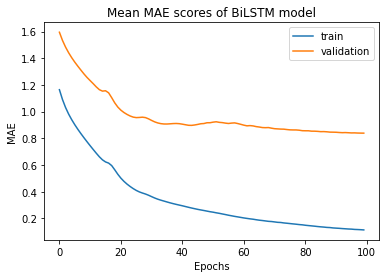

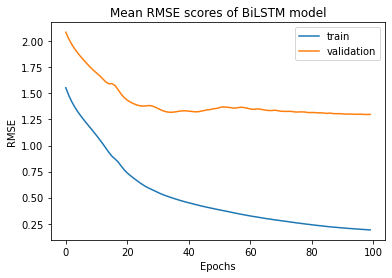

In [34]:
visualize_performance(results_sat_x[1])

Optimal Mean MAE: 0.8728491328656673 @ epoch 99
Optimal Mean RMSE: 1.3610081050544978 @ epoch 65


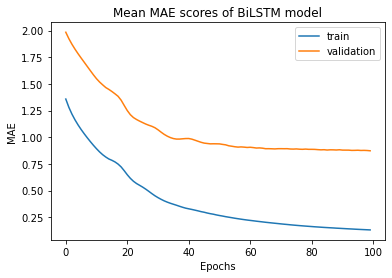

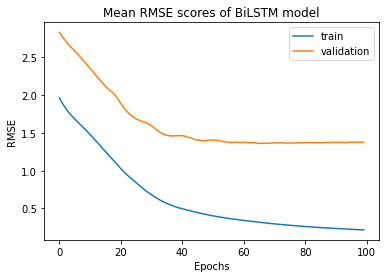

In [35]:
visualize_performance(results_sat_y[1])

Optimal Mean MAE: 0.8200109843164682 @ epoch 99
Optimal Mean RMSE: 1.2778393525630236 @ epoch 99


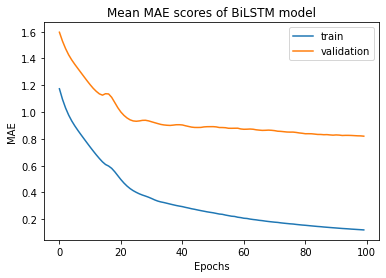

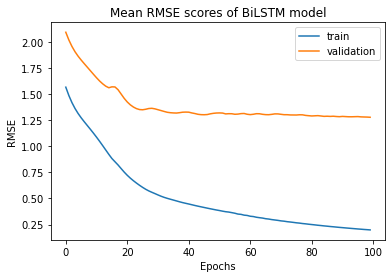

In [36]:
visualize_performance(results_sat_z[1])

### Satellite <- CPT (incremental)

In [147]:
results_inc_sat_cpt_x = incremental_fusion('Sat', 'X')
results_inc_sat_cpt_y = incremental_fusion('Sat', 'Y')
results_inc_sat_cpt_z = incremental_fusion('Sat', 'Z')

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 6.6879 - mean_absolute_error: 1.9254 - root_mean_squared_error: 2.5861 - val_loss: 10.8192 - val_mean_absolute_error: 2.6537 - val_root_mean_squared_error: 3.2893
Epoch 2/100
1/1 [==============================] - 0s 50ms/step - loss: 5.7190 - mean_absolute_error: 1.7378 - root_mean_squared_error: 2.3914 - val_loss: 9.8310 - val_mean_absolute_error: 2.4970 - val_root_mean_squared_error: 3.1354
Epoch 3/100
1/1 [==============================] - 0s 51ms/step - loss: 4.7298 - mean_absolute_error: 1.5118 - root_mean_squared_error: 2.1748 - val_loss: 8.7258 - val_mean_absolute_error: 2.3031 - val_root_mean_squared_error: 2.9539
Epoch 4/100
1/1 [==============================] - 0s 49ms/step - loss: 3.6831 - mean_absolute_error: 1.2707 - root_mean_squared_error: 1.9191 - val_loss: 7.7404 - val_mean_absolute_error: 2.1264 - val_root_mean_squared_error: 2.7822
Epoch 5/100
1/1 [==============================] - 0s 49ms/step -

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 1.0117 - mean_absolute_error: 0.5770 - root_mean_squared_error: 1.0058 - val_loss: 9.4675 - val_mean_absolute_error: 2.2488 - val_root_mean_squared_error: 3.0769
Epoch 37/100
1/1 [==============================] - 0s 51ms/step - loss: 1.0106 - mean_absolute_error: 0.5767 - root_mean_squared_error: 1.0053 - val_loss: 9.4440 - val_mean_absolute_error: 2.2448 - val_root_mean_squared_error: 3.0731
Epoch 38/100
1/1 [==============================] - 0s 50ms/step - loss: 1.0073 - mean_absolute_error: 0.5748 - root_mean_squared_error: 1.0037 - val_loss: 9.4115 - val_mean_absolute_error: 2.2415 - val_root_mean_squared_error: 3.0678
Epoch 39/100
1/1 [==============================] - 0s 52ms/step - loss: 1.0044 - mean_absolute_error: 0.5714 - root_mean_squared_error: 1.0022 - val_loss: 9.3890 - val_mean_absolute_error: 2.2394 - val_root_mean_squared_error: 3.0641
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 52ms/step - loss: 0.4920 - mean_absolute_error: 0.3547 - root_mean_squared_error: 0.7014 - val_loss: 7.4487 - val_mean_absolute_error: 2.0077 - val_root_mean_squared_error: 2.7292
Epoch 72/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4874 - mean_absolute_error: 0.3573 - root_mean_squared_error: 0.6981 - val_loss: 7.3821 - val_mean_absolute_error: 1.9935 - val_root_mean_squared_error: 2.7170
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.4695 - mean_absolute_error: 0.3427 - root_mean_squared_error: 0.6852 - val_loss: 7.3413 - val_mean_absolute_error: 1.9820 - val_root_mean_squared_error: 2.7095
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4519 - mean_absolute_error: 0.3269 - root_mean_squared_error: 0.6723 - val_loss: 7.2677 - val_mean_absolute_error: 1.9678 - val_root_mean_squared_error: 2.6959
Epoch 75/100
1/1 [==============================] - 0s 56ms/

Epoch 6/100
1/1 [==============================] - 0s 62ms/step - loss: 0.2443 - mean_absolute_error: 0.3767 - root_mean_squared_error: 0.4943 - val_loss: 0.5525 - val_mean_absolute_error: 0.5167 - val_root_mean_squared_error: 0.7433
Epoch 7/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2076 - mean_absolute_error: 0.3420 - root_mean_squared_error: 0.4556 - val_loss: 0.5588 - val_mean_absolute_error: 0.5494 - val_root_mean_squared_error: 0.7476
Epoch 8/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1774 - mean_absolute_error: 0.3156 - root_mean_squared_error: 0.4212 - val_loss: 0.5971 - val_mean_absolute_error: 0.5910 - val_root_mean_squared_error: 0.7727
Epoch 9/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1680 - mean_absolute_error: 0.3113 - root_mean_squared_error: 0.4099 - val_loss: 0.6166 - val_mean_absolute_error: 0.6071 - val_root_mean_squared_error: 0.7853
Epoch 10/100
1/1 [==============================] - 0s 53ms/step

Epoch 41/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0388 - mean_absolute_error: 0.1308 - root_mean_squared_error: 0.1971 - val_loss: 0.2410 - val_mean_absolute_error: 0.3193 - val_root_mean_squared_error: 0.4909
Epoch 42/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0342 - mean_absolute_error: 0.1236 - root_mean_squared_error: 0.1849 - val_loss: 0.2333 - val_mean_absolute_error: 0.3115 - val_root_mean_squared_error: 0.4830
Epoch 43/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0297 - mean_absolute_error: 0.1113 - root_mean_squared_error: 0.1722 - val_loss: 0.2253 - val_mean_absolute_error: 0.3039 - val_root_mean_squared_error: 0.4747
Epoch 44/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0259 - mean_absolute_error: 0.1019 - root_mean_squared_error: 0.1610 - val_loss: 0.2171 - val_mean_absolute_error: 0.2970 - val_root_mean_squared_error: 0.4660
Epoch 45/100
1/1 [==============================] - 0s 48ms/

Epoch 76/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0076 - mean_absolute_error: 0.0496 - root_mean_squared_error: 0.0870 - val_loss: 0.1719 - val_mean_absolute_error: 0.2348 - val_root_mean_squared_error: 0.4146
Epoch 77/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0075 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.0867 - val_loss: 0.1726 - val_mean_absolute_error: 0.2431 - val_root_mean_squared_error: 0.4155
Epoch 78/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0073 - mean_absolute_error: 0.0482 - root_mean_squared_error: 0.0854 - val_loss: 0.1716 - val_mean_absolute_error: 0.2370 - val_root_mean_squared_error: 0.4142
Epoch 79/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0071 - mean_absolute_error: 0.0470 - root_mean_squared_error: 0.0842 - val_loss: 0.1713 - val_mean_absolute_error: 0.2365 - val_root_mean_squared_error: 0.4138
Epoch 80/100
1/1 [==============================] - 0s 79ms/

Epoch 11/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2634 - mean_absolute_error: 0.3778 - root_mean_squared_error: 0.5132 - val_loss: 0.9608 - val_mean_absolute_error: 0.7545 - val_root_mean_squared_error: 0.9802
Epoch 12/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2540 - mean_absolute_error: 0.3677 - root_mean_squared_error: 0.5040 - val_loss: 0.9188 - val_mean_absolute_error: 0.7316 - val_root_mean_squared_error: 0.9585
Epoch 13/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2346 - mean_absolute_error: 0.3449 - root_mean_squared_error: 0.4843 - val_loss: 0.8696 - val_mean_absolute_error: 0.6971 - val_root_mean_squared_error: 0.9325
Epoch 14/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2159 - mean_absolute_error: 0.3240 - root_mean_squared_error: 0.4647 - val_loss: 0.8248 - val_mean_absolute_error: 0.6613 - val_root_mean_squared_error: 0.9082
Epoch 15/100
1/1 [==============================] - 0s 48ms/

Epoch 46/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1648 - mean_absolute_error: 0.2539 - root_mean_squared_error: 0.4060 - val_loss: 0.7197 - val_mean_absolute_error: 0.5952 - val_root_mean_squared_error: 0.8484
Epoch 47/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1644 - mean_absolute_error: 0.2530 - root_mean_squared_error: 0.4055 - val_loss: 0.7241 - val_mean_absolute_error: 0.5969 - val_root_mean_squared_error: 0.8510
Epoch 48/100
1/1 [==============================] - 0s 60ms/step - loss: 0.1640 - mean_absolute_error: 0.2524 - root_mean_squared_error: 0.4050 - val_loss: 0.7276 - val_mean_absolute_error: 0.5992 - val_root_mean_squared_error: 0.8530
Epoch 49/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1636 - mean_absolute_error: 0.2521 - root_mean_squared_error: 0.4045 - val_loss: 0.7296 - val_mean_absolute_error: 0.6016 - val_root_mean_squared_error: 0.8541
Epoch 50/100
1/1 [==============================] - 0s 49ms/

Epoch 81/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0204 - mean_absolute_error: 0.0944 - root_mean_squared_error: 0.1430 - val_loss: 0.2754 - val_mean_absolute_error: 0.3639 - val_root_mean_squared_error: 0.5248
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0267 - mean_absolute_error: 0.1082 - root_mean_squared_error: 0.1634 - val_loss: 0.3065 - val_mean_absolute_error: 0.3837 - val_root_mean_squared_error: 0.5536
Epoch 83/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0173 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1314 - val_loss: 0.3409 - val_mean_absolute_error: 0.4048 - val_root_mean_squared_error: 0.5839
Epoch 84/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0258 - mean_absolute_error: 0.1073 - root_mean_squared_error: 0.1607 - val_loss: 0.2945 - val_mean_absolute_error: 0.3772 - val_root_mean_squared_error: 0.5427
Epoch 85/100
1/1 [==============================] - 0s 53ms/

Epoch 16/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1116 - mean_absolute_error: 0.2361 - root_mean_squared_error: 0.3341 - val_loss: 0.8539 - val_mean_absolute_error: 0.4942 - val_root_mean_squared_error: 0.9240
Epoch 17/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1019 - mean_absolute_error: 0.2219 - root_mean_squared_error: 0.3192 - val_loss: 0.8561 - val_mean_absolute_error: 0.4847 - val_root_mean_squared_error: 0.9252
Epoch 18/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0971 - mean_absolute_error: 0.2125 - root_mean_squared_error: 0.3116 - val_loss: 0.8604 - val_mean_absolute_error: 0.4840 - val_root_mean_squared_error: 0.9276
Epoch 19/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0954 - mean_absolute_error: 0.2053 - root_mean_squared_error: 0.3088 - val_loss: 0.8607 - val_mean_absolute_error: 0.4854 - val_root_mean_squared_error: 0.9278
Epoch 20/100
1/1 [==============================] - 0s 50ms/

Epoch 51/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0162 - mean_absolute_error: 0.0873 - root_mean_squared_error: 0.1274 - val_loss: 0.9138 - val_mean_absolute_error: 0.5941 - val_root_mean_squared_error: 0.9559
Epoch 52/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0151 - mean_absolute_error: 0.0877 - root_mean_squared_error: 0.1228 - val_loss: 0.8727 - val_mean_absolute_error: 0.5636 - val_root_mean_squared_error: 0.9342
Epoch 53/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0160 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1267 - val_loss: 0.9710 - val_mean_absolute_error: 0.6290 - val_root_mean_squared_error: 0.9854
Epoch 54/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0165 - mean_absolute_error: 0.0954 - root_mean_squared_error: 0.1285 - val_loss: 0.9084 - val_mean_absolute_error: 0.5880 - val_root_mean_squared_error: 0.9531
Epoch 55/100
1/1 [==============================] - 0s 48ms/

Epoch 86/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0019 - mean_absolute_error: 0.0290 - root_mean_squared_error: 0.0435 - val_loss: 0.8211 - val_mean_absolute_error: 0.5155 - val_root_mean_squared_error: 0.9061
Epoch 87/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0019 - mean_absolute_error: 0.0287 - root_mean_squared_error: 0.0433 - val_loss: 0.8287 - val_mean_absolute_error: 0.5205 - val_root_mean_squared_error: 0.9103
Epoch 88/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0018 - mean_absolute_error: 0.0287 - root_mean_squared_error: 0.0421 - val_loss: 0.8290 - val_mean_absolute_error: 0.5206 - val_root_mean_squared_error: 0.9105
Epoch 89/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0018 - mean_absolute_error: 0.0286 - root_mean_squared_error: 0.0418 - val_loss: 0.8179 - val_mean_absolute_error: 0.5130 - val_root_mean_squared_error: 0.9044
Epoch 90/100
1/1 [==============================] - 0s 46ms/

Epoch 21/100
1/1 [==============================] - 0s 62ms/step - loss: 0.2585 - mean_absolute_error: 0.3541 - root_mean_squared_error: 0.5085 - val_loss: 1.3414 - val_mean_absolute_error: 0.7943 - val_root_mean_squared_error: 1.1582
Epoch 22/100
1/1 [==============================] - 0s 64ms/step - loss: 0.2546 - mean_absolute_error: 0.3471 - root_mean_squared_error: 0.5046 - val_loss: 1.3095 - val_mean_absolute_error: 0.7896 - val_root_mean_squared_error: 1.1443
Epoch 23/100
1/1 [==============================] - 0s 63ms/step - loss: 0.2510 - mean_absolute_error: 0.3420 - root_mean_squared_error: 0.5010 - val_loss: 1.2730 - val_mean_absolute_error: 0.7879 - val_root_mean_squared_error: 1.1283
Epoch 24/100
1/1 [==============================] - 0s 90ms/step - loss: 0.2477 - mean_absolute_error: 0.3396 - root_mean_squared_error: 0.4976 - val_loss: 1.2387 - val_mean_absolute_error: 0.7883 - val_root_mean_squared_error: 1.1130
Epoch 25/100
1/1 [==============================] - 0s 72ms/

Epoch 56/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2023 - mean_absolute_error: 0.2925 - root_mean_squared_error: 0.4498 - val_loss: 1.3001 - val_mean_absolute_error: 0.8262 - val_root_mean_squared_error: 1.1402
Epoch 57/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2008 - mean_absolute_error: 0.2917 - root_mean_squared_error: 0.4482 - val_loss: 1.3014 - val_mean_absolute_error: 0.8268 - val_root_mean_squared_error: 1.1408
Epoch 58/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1992 - mean_absolute_error: 0.2910 - root_mean_squared_error: 0.4463 - val_loss: 1.3119 - val_mean_absolute_error: 0.8289 - val_root_mean_squared_error: 1.1454
Epoch 59/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1972 - mean_absolute_error: 0.2902 - root_mean_squared_error: 0.4441 - val_loss: 1.3285 - val_mean_absolute_error: 0.8319 - val_root_mean_squared_error: 1.1526
Epoch 60/100
1/1 [==============================] - 0s 53ms/

Epoch 91/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0416 - mean_absolute_error: 0.1204 - root_mean_squared_error: 0.2039 - val_loss: 1.9853 - val_mean_absolute_error: 0.9827 - val_root_mean_squared_error: 1.4090
Epoch 92/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0397 - mean_absolute_error: 0.1171 - root_mean_squared_error: 0.1992 - val_loss: 1.9449 - val_mean_absolute_error: 0.9712 - val_root_mean_squared_error: 1.3946
Epoch 93/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0378 - mean_absolute_error: 0.1134 - root_mean_squared_error: 0.1945 - val_loss: 1.9841 - val_mean_absolute_error: 0.9853 - val_root_mean_squared_error: 1.4086
Epoch 94/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0361 - mean_absolute_error: 0.1091 - root_mean_squared_error: 0.1900 - val_loss: 1.9514 - val_mean_absolute_error: 0.9753 - val_root_mean_squared_error: 1.3969
Epoch 95/100
1/1 [==============================] - 0s 53ms/

Epoch 26/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1072 - mean_absolute_error: 0.2296 - root_mean_squared_error: 0.3274 - val_loss: 1.5772 - val_mean_absolute_error: 0.8514 - val_root_mean_squared_error: 1.2559
Epoch 27/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1056 - mean_absolute_error: 0.2253 - root_mean_squared_error: 0.3250 - val_loss: 1.5726 - val_mean_absolute_error: 0.8493 - val_root_mean_squared_error: 1.2540
Epoch 28/100
1/1 [==============================] - 0s 71ms/step - loss: 0.1039 - mean_absolute_error: 0.2210 - root_mean_squared_error: 0.3224 - val_loss: 1.5664 - val_mean_absolute_error: 0.8465 - val_root_mean_squared_error: 1.2515
Epoch 29/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1025 - mean_absolute_error: 0.2190 - root_mean_squared_error: 0.3202 - val_loss: 1.5598 - val_mean_absolute_error: 0.8436 - val_root_mean_squared_error: 1.2489
Epoch 30/100
1/1 [==============================] - 0s 61ms/

Epoch 61/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0193 - mean_absolute_error: 0.1043 - root_mean_squared_error: 0.1390 - val_loss: 1.7027 - val_mean_absolute_error: 0.6900 - val_root_mean_squared_error: 1.3049
Epoch 62/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0174 - mean_absolute_error: 0.0994 - root_mean_squared_error: 0.1320 - val_loss: 1.6779 - val_mean_absolute_error: 0.6942 - val_root_mean_squared_error: 1.2953
Epoch 63/100
1/1 [==============================] - 0s 93ms/step - loss: 0.0145 - mean_absolute_error: 0.0895 - root_mean_squared_error: 0.1205 - val_loss: 1.6858 - val_mean_absolute_error: 0.6900 - val_root_mean_squared_error: 1.2984
Epoch 64/100
1/1 [==============================] - 0s 77ms/step - loss: 0.0115 - mean_absolute_error: 0.0791 - root_mean_squared_error: 0.1073 - val_loss: 1.6770 - val_mean_absolute_error: 0.6927 - val_root_mean_squared_error: 1.2950
Epoch 65/100
1/1 [==============================] - 0s 73ms/

Epoch 96/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0031 - mean_absolute_error: 0.0388 - root_mean_squared_error: 0.0555 - val_loss: 1.7384 - val_mean_absolute_error: 0.6694 - val_root_mean_squared_error: 1.3185
Epoch 97/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0025 - mean_absolute_error: 0.0343 - root_mean_squared_error: 0.0501 - val_loss: 1.7079 - val_mean_absolute_error: 0.6866 - val_root_mean_squared_error: 1.3069
Epoch 98/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0038 - mean_absolute_error: 0.0409 - root_mean_squared_error: 0.0616 - val_loss: 1.7385 - val_mean_absolute_error: 0.6714 - val_root_mean_squared_error: 1.3185
Epoch 99/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0021 - mean_absolute_error: 0.0312 - root_mean_squared_error: 0.0464 - val_loss: 1.7507 - val_mean_absolute_error: 0.6664 - val_root_mean_squared_error: 1.3232
Epoch 100/100
1/1 [==============================] - 0s 59ms

Epoch 31/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0202 - mean_absolute_error: 0.0974 - root_mean_squared_error: 0.1421 - val_loss: 0.8767 - val_mean_absolute_error: 0.6255 - val_root_mean_squared_error: 0.9363
Epoch 32/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0197 - mean_absolute_error: 0.0977 - root_mean_squared_error: 0.1405 - val_loss: 0.9221 - val_mean_absolute_error: 0.6442 - val_root_mean_squared_error: 0.9603
Epoch 33/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0189 - mean_absolute_error: 0.0948 - root_mean_squared_error: 0.1373 - val_loss: 0.9080 - val_mean_absolute_error: 0.6370 - val_root_mean_squared_error: 0.9529
Epoch 34/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0180 - mean_absolute_error: 0.0934 - root_mean_squared_error: 0.1340 - val_loss: 0.8735 - val_mean_absolute_error: 0.6209 - val_root_mean_squared_error: 0.9346
Epoch 35/100
1/1 [==============================] - 0s 45ms/

Epoch 66/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0074 - mean_absolute_error: 0.0502 - root_mean_squared_error: 0.0858 - val_loss: 0.7594 - val_mean_absolute_error: 0.5506 - val_root_mean_squared_error: 0.8714
Epoch 67/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0072 - mean_absolute_error: 0.0497 - root_mean_squared_error: 0.0850 - val_loss: 0.7564 - val_mean_absolute_error: 0.5490 - val_root_mean_squared_error: 0.8697
Epoch 68/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0071 - mean_absolute_error: 0.0490 - root_mean_squared_error: 0.0843 - val_loss: 0.7524 - val_mean_absolute_error: 0.5470 - val_root_mean_squared_error: 0.8674
Epoch 69/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0070 - mean_absolute_error: 0.0483 - root_mean_squared_error: 0.0836 - val_loss: 0.7613 - val_mean_absolute_error: 0.5513 - val_root_mean_squared_error: 0.8725
Epoch 70/100
1/1 [==============================] - 0s 47ms/

Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 1.1357 - mean_absolute_error: 0.7846 - root_mean_squared_error: 1.0657 - val_loss: 1.8114 - val_mean_absolute_error: 0.9978 - val_root_mean_squared_error: 1.3459
Epoch 2/100
1/1 [==============================] - 0s 50ms/step - loss: 0.7634 - mean_absolute_error: 0.6160 - root_mean_squared_error: 0.8737 - val_loss: 1.5710 - val_mean_absolute_error: 0.9076 - val_root_mean_squared_error: 1.2534
Epoch 3/100
1/1 [==============================] - 0s 58ms/step - loss: 0.5184 - mean_absolute_error: 0.5003 - root_mean_squared_error: 0.7200 - val_loss: 1.3651 - val_mean_absolute_error: 0.8128 - val_root_mean_squared_error: 1.1684
Epoch 4/100
1/1 [==============================] - 0s 56ms/step - loss: 0.3391 - mean_absolute_error: 0.4155 - root_mean_squared_error: 0.5824 - val_loss: 1.1988 - val_mean_absolute_error: 0.7316 - val_root_mean_squared_error: 1.0949
Epoch 5/100
1/1 [==============================] - 0s 54ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0598 - mean_absolute_error: 0.1548 - root_mean_squared_error: 0.2445 - val_loss: 0.9107 - val_mean_absolute_error: 0.5919 - val_root_mean_squared_error: 0.9543
Epoch 37/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0597 - mean_absolute_error: 0.1536 - root_mean_squared_error: 0.2443 - val_loss: 0.9196 - val_mean_absolute_error: 0.5897 - val_root_mean_squared_error: 0.9589
Epoch 38/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0559 - mean_absolute_error: 0.1473 - root_mean_squared_error: 0.2364 - val_loss: 0.9258 - val_mean_absolute_error: 0.5891 - val_root_mean_squared_error: 0.9622
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0558 - mean_absolute_error: 0.1486 - root_mean_squared_error: 0.2363 - val_loss: 0.8931 - val_mean_absolute_error: 0.5856 - val_root_mean_squared_error: 0.9450
Epoch 40/100
1/1 [==============================] - 0s 50ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0302 - mean_absolute_error: 0.0987 - root_mean_squared_error: 0.1737 - val_loss: 0.7296 - val_mean_absolute_error: 0.5145 - val_root_mean_squared_error: 0.8541
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0298 - mean_absolute_error: 0.0980 - root_mean_squared_error: 0.1726 - val_loss: 0.7319 - val_mean_absolute_error: 0.5147 - val_root_mean_squared_error: 0.8555
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0295 - mean_absolute_error: 0.0979 - root_mean_squared_error: 0.1717 - val_loss: 0.7292 - val_mean_absolute_error: 0.5138 - val_root_mean_squared_error: 0.8539
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0291 - mean_absolute_error: 0.0966 - root_mean_squared_error: 0.1705 - val_loss: 0.7281 - val_mean_absolute_error: 0.5124 - val_root_mean_squared_error: 0.8533
Epoch 75/100
1/1 [==============================] - 0s 48ms/

Epoch 6/100
1/1 [==============================] - 0s 49ms/step - loss: 2.5547 - mean_absolute_error: 0.9623 - root_mean_squared_error: 1.5983 - val_loss: 9.2758 - val_mean_absolute_error: 2.1223 - val_root_mean_squared_error: 3.0456
Epoch 7/100
1/1 [==============================] - 0s 58ms/step - loss: 2.4681 - mean_absolute_error: 0.9623 - root_mean_squared_error: 1.5710 - val_loss: 8.9898 - val_mean_absolute_error: 2.0930 - val_root_mean_squared_error: 2.9983
Epoch 8/100
1/1 [==============================] - 0s 53ms/step - loss: 2.3528 - mean_absolute_error: 0.9178 - root_mean_squared_error: 1.5339 - val_loss: 8.9606 - val_mean_absolute_error: 2.1115 - val_root_mean_squared_error: 2.9934
Epoch 9/100
1/1 [==============================] - 0s 52ms/step - loss: 2.2555 - mean_absolute_error: 0.8610 - root_mean_squared_error: 1.5018 - val_loss: 9.0982 - val_mean_absolute_error: 2.1556 - val_root_mean_squared_error: 3.0163
Epoch 10/100
1/1 [==============================] - 0s 53ms/step

Epoch 41/100
1/1 [==============================] - 0s 65ms/step - loss: 0.6739 - mean_absolute_error: 0.4874 - root_mean_squared_error: 0.8209 - val_loss: 6.2498 - val_mean_absolute_error: 1.8467 - val_root_mean_squared_error: 2.5000
Epoch 42/100
1/1 [==============================] - 0s 69ms/step - loss: 0.6436 - mean_absolute_error: 0.4772 - root_mean_squared_error: 0.8022 - val_loss: 6.2568 - val_mean_absolute_error: 1.8341 - val_root_mean_squared_error: 2.5014
Epoch 43/100
1/1 [==============================] - 0s 64ms/step - loss: 0.5871 - mean_absolute_error: 0.4482 - root_mean_squared_error: 0.7662 - val_loss: 6.3304 - val_mean_absolute_error: 1.8358 - val_root_mean_squared_error: 2.5160
Epoch 44/100
1/1 [==============================] - 0s 64ms/step - loss: 0.6156 - mean_absolute_error: 0.4508 - root_mean_squared_error: 0.7846 - val_loss: 6.2081 - val_mean_absolute_error: 1.8271 - val_root_mean_squared_error: 2.4916
Epoch 45/100
1/1 [==============================] - 0s 65ms/

Epoch 76/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1941 - mean_absolute_error: 0.2391 - root_mean_squared_error: 0.4406 - val_loss: 5.3385 - val_mean_absolute_error: 1.6909 - val_root_mean_squared_error: 2.3105
Epoch 77/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1889 - mean_absolute_error: 0.2338 - root_mean_squared_error: 0.4346 - val_loss: 5.3124 - val_mean_absolute_error: 1.6862 - val_root_mean_squared_error: 2.3049
Epoch 78/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1808 - mean_absolute_error: 0.2300 - root_mean_squared_error: 0.4252 - val_loss: 5.3045 - val_mean_absolute_error: 1.6845 - val_root_mean_squared_error: 2.3032
Epoch 79/100
1/1 [==============================] - 0s 58ms/step - loss: 0.1764 - mean_absolute_error: 0.2276 - root_mean_squared_error: 0.4200 - val_loss: 5.3323 - val_mean_absolute_error: 1.6899 - val_root_mean_squared_error: 2.3092
Epoch 80/100
1/1 [==============================] - 0s 52ms/

Epoch 11/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0733 - mean_absolute_error: 0.1976 - root_mean_squared_error: 0.2708 - val_loss: 1.7498 - val_mean_absolute_error: 0.7573 - val_root_mean_squared_error: 1.3228
Epoch 12/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0586 - mean_absolute_error: 0.1742 - root_mean_squared_error: 0.2420 - val_loss: 1.7375 - val_mean_absolute_error: 0.7315 - val_root_mean_squared_error: 1.3182
Epoch 13/100
1/1 [==============================] - 0s 79ms/step - loss: 0.0535 - mean_absolute_error: 0.1678 - root_mean_squared_error: 0.2314 - val_loss: 1.7293 - val_mean_absolute_error: 0.7089 - val_root_mean_squared_error: 1.3150
Epoch 14/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0542 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.2328 - val_loss: 1.7206 - val_mean_absolute_error: 0.6899 - val_root_mean_squared_error: 1.3117
Epoch 15/100
1/1 [==============================] - 0s 66ms/

Epoch 46/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0053 - mean_absolute_error: 0.0457 - root_mean_squared_error: 0.0730 - val_loss: 1.6712 - val_mean_absolute_error: 0.6402 - val_root_mean_squared_error: 1.2927
Epoch 47/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0050 - mean_absolute_error: 0.0442 - root_mean_squared_error: 0.0711 - val_loss: 1.6735 - val_mean_absolute_error: 0.6401 - val_root_mean_squared_error: 1.2936
Epoch 48/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0048 - mean_absolute_error: 0.0428 - root_mean_squared_error: 0.0690 - val_loss: 1.6761 - val_mean_absolute_error: 0.6416 - val_root_mean_squared_error: 1.2947
Epoch 49/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0045 - mean_absolute_error: 0.0418 - root_mean_squared_error: 0.0672 - val_loss: 1.6778 - val_mean_absolute_error: 0.6402 - val_root_mean_squared_error: 1.2953
Epoch 50/100
1/1 [==============================] - 0s 59ms/

Epoch 81/100
1/1 [==============================] - 0s 61ms/step - loss: 8.4147e-04 - mean_absolute_error: 0.0186 - root_mean_squared_error: 0.0290 - val_loss: 1.6670 - val_mean_absolute_error: 0.6202 - val_root_mean_squared_error: 1.2911
Epoch 82/100
1/1 [==============================] - 0s 62ms/step - loss: 8.1687e-04 - mean_absolute_error: 0.0183 - root_mean_squared_error: 0.0286 - val_loss: 1.6665 - val_mean_absolute_error: 0.6188 - val_root_mean_squared_error: 1.2909
Epoch 83/100
1/1 [==============================] - 0s 54ms/step - loss: 7.9557e-04 - mean_absolute_error: 0.0178 - root_mean_squared_error: 0.0282 - val_loss: 1.6662 - val_mean_absolute_error: 0.6194 - val_root_mean_squared_error: 1.2908
Epoch 84/100
1/1 [==============================] - 0s 55ms/step - loss: 7.7391e-04 - mean_absolute_error: 0.0177 - root_mean_squared_error: 0.0278 - val_loss: 1.6660 - val_mean_absolute_error: 0.6180 - val_root_mean_squared_error: 1.2907
Epoch 85/100
1/1 [==========================

Epoch 50/100
1/1 [==============================] - 0s 55ms/step - loss: 0.5195 - mean_absolute_error: 0.4657 - root_mean_squared_error: 0.7207 - val_loss: 1.6387 - val_mean_absolute_error: 0.9444 - val_root_mean_squared_error: 1.2801
Epoch 51/100
1/1 [==============================] - 0s 60ms/step - loss: 0.5179 - mean_absolute_error: 0.4644 - root_mean_squared_error: 0.7196 - val_loss: 1.6357 - val_mean_absolute_error: 0.9437 - val_root_mean_squared_error: 1.2790
Epoch 52/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5157 - mean_absolute_error: 0.4630 - root_mean_squared_error: 0.7182 - val_loss: 1.6215 - val_mean_absolute_error: 0.9389 - val_root_mean_squared_error: 1.2734
Epoch 53/100
1/1 [==============================] - 0s 59ms/step - loss: 0.5131 - mean_absolute_error: 0.4614 - root_mean_squared_error: 0.7163 - val_loss: 1.6017 - val_mean_absolute_error: 0.9318 - val_root_mean_squared_error: 1.2656
Epoch 54/100
1/1 [==============================] - 0s 55ms/

Epoch 85/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1467 - mean_absolute_error: 0.2406 - root_mean_squared_error: 0.3830 - val_loss: 1.7452 - val_mean_absolute_error: 0.9341 - val_root_mean_squared_error: 1.3210
Epoch 86/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1407 - mean_absolute_error: 0.2314 - root_mean_squared_error: 0.3751 - val_loss: 1.6265 - val_mean_absolute_error: 0.8708 - val_root_mean_squared_error: 1.2753
Epoch 87/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1101 - mean_absolute_error: 0.1946 - root_mean_squared_error: 0.3319 - val_loss: 1.5834 - val_mean_absolute_error: 0.8260 - val_root_mean_squared_error: 1.2583
Epoch 88/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1230 - mean_absolute_error: 0.2158 - root_mean_squared_error: 0.3506 - val_loss: 1.5962 - val_mean_absolute_error: 0.8185 - val_root_mean_squared_error: 1.2634
Epoch 89/100
1/1 [==============================] - 0s 56ms/

Epoch 20/100
1/1 [==============================] - 0s 54ms/step - loss: 1.4591 - mean_absolute_error: 0.7984 - root_mean_squared_error: 1.2079 - val_loss: 3.9235 - val_mean_absolute_error: 1.4464 - val_root_mean_squared_error: 1.9808
Epoch 21/100
1/1 [==============================] - 0s 54ms/step - loss: 1.4459 - mean_absolute_error: 0.7958 - root_mean_squared_error: 1.2025 - val_loss: 3.8979 - val_mean_absolute_error: 1.4307 - val_root_mean_squared_error: 1.9743
Epoch 22/100
1/1 [==============================] - 0s 55ms/step - loss: 1.4435 - mean_absolute_error: 0.7973 - root_mean_squared_error: 1.2015 - val_loss: 3.8853 - val_mean_absolute_error: 1.4237 - val_root_mean_squared_error: 1.9711
Epoch 23/100
1/1 [==============================] - 0s 54ms/step - loss: 1.4411 - mean_absolute_error: 0.7979 - root_mean_squared_error: 1.2005 - val_loss: 3.8796 - val_mean_absolute_error: 1.4274 - val_root_mean_squared_error: 1.9697
Epoch 24/100
1/1 [==============================] - 0s 54ms/

Epoch 55/100
1/1 [==============================] - 0s 55ms/step - loss: 0.7271 - mean_absolute_error: 0.5047 - root_mean_squared_error: 0.8527 - val_loss: 4.2537 - val_mean_absolute_error: 1.5854 - val_root_mean_squared_error: 2.0624
Epoch 56/100
1/1 [==============================] - 0s 53ms/step - loss: 0.6831 - mean_absolute_error: 0.4909 - root_mean_squared_error: 0.8265 - val_loss: 4.3226 - val_mean_absolute_error: 1.5984 - val_root_mean_squared_error: 2.0791
Epoch 57/100
1/1 [==============================] - 0s 55ms/step - loss: 0.6376 - mean_absolute_error: 0.4750 - root_mean_squared_error: 0.7985 - val_loss: 4.3945 - val_mean_absolute_error: 1.6110 - val_root_mean_squared_error: 2.0963
Epoch 58/100
1/1 [==============================] - 0s 55ms/step - loss: 0.5912 - mean_absolute_error: 0.4574 - root_mean_squared_error: 0.7689 - val_loss: 4.4385 - val_mean_absolute_error: 1.6168 - val_root_mean_squared_error: 2.1068
Epoch 59/100
1/1 [==============================] - 0s 59ms/

Epoch 90/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0935 - mean_absolute_error: 0.1876 - root_mean_squared_error: 0.3057 - val_loss: 2.6049 - val_mean_absolute_error: 1.1882 - val_root_mean_squared_error: 1.6140
Epoch 91/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0908 - mean_absolute_error: 0.1846 - root_mean_squared_error: 0.3013 - val_loss: 2.6047 - val_mean_absolute_error: 1.1859 - val_root_mean_squared_error: 1.6139
Epoch 92/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0881 - mean_absolute_error: 0.1816 - root_mean_squared_error: 0.2968 - val_loss: 2.6070 - val_mean_absolute_error: 1.1845 - val_root_mean_squared_error: 1.6146
Epoch 93/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0854 - mean_absolute_error: 0.1784 - root_mean_squared_error: 0.2922 - val_loss: 2.6121 - val_mean_absolute_error: 1.1840 - val_root_mean_squared_error: 1.6162
Epoch 94/100
1/1 [==============================] - 0s 59ms/

Epoch 25/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0063 - mean_absolute_error: 0.0589 - root_mean_squared_error: 0.0795 - val_loss: 0.0349 - val_mean_absolute_error: 0.1461 - val_root_mean_squared_error: 0.1868
Epoch 26/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0058 - mean_absolute_error: 0.0559 - root_mean_squared_error: 0.0763 - val_loss: 0.0389 - val_mean_absolute_error: 0.1535 - val_root_mean_squared_error: 0.1972
Epoch 27/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0057 - mean_absolute_error: 0.0542 - root_mean_squared_error: 0.0752 - val_loss: 0.0376 - val_mean_absolute_error: 0.1507 - val_root_mean_squared_error: 0.1939
Epoch 28/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0053 - mean_absolute_error: 0.0526 - root_mean_squared_error: 0.0731 - val_loss: 0.0320 - val_mean_absolute_error: 0.1389 - val_root_mean_squared_error: 0.1789
Epoch 29/100
1/1 [==============================] - 0s 55ms/

Epoch 60/100
1/1 [==============================] - 0s 50ms/step - loss: 5.3907e-04 - mean_absolute_error: 0.0154 - root_mean_squared_error: 0.0232 - val_loss: 0.0051 - val_mean_absolute_error: 0.0528 - val_root_mean_squared_error: 0.0716
Epoch 61/100
1/1 [==============================] - 0s 52ms/step - loss: 6.0049e-04 - mean_absolute_error: 0.0176 - root_mean_squared_error: 0.0245 - val_loss: 0.0065 - val_mean_absolute_error: 0.0601 - val_root_mean_squared_error: 0.0806
Epoch 62/100
1/1 [==============================] - 0s 54ms/step - loss: 4.6854e-04 - mean_absolute_error: 0.0148 - root_mean_squared_error: 0.0216 - val_loss: 0.0075 - val_mean_absolute_error: 0.0649 - val_root_mean_squared_error: 0.0864
Epoch 63/100
1/1 [==============================] - 0s 52ms/step - loss: 5.3452e-04 - mean_absolute_error: 0.0154 - root_mean_squared_error: 0.0231 - val_loss: 0.0048 - val_mean_absolute_error: 0.0511 - val_root_mean_squared_error: 0.0694
Epoch 64/100
1/1 [==========================

Epoch 29/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1961 - mean_absolute_error: 0.2734 - root_mean_squared_error: 0.4428 - val_loss: 6.9223 - val_mean_absolute_error: 1.7812 - val_root_mean_squared_error: 2.6310
Epoch 30/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1945 - mean_absolute_error: 0.2732 - root_mean_squared_error: 0.4410 - val_loss: 7.2698 - val_mean_absolute_error: 1.8172 - val_root_mean_squared_error: 2.6963
Epoch 31/100
1/1 [==============================] - 0s 64ms/step - loss: 0.1810 - mean_absolute_error: 0.2715 - root_mean_squared_error: 0.4255 - val_loss: 6.8647 - val_mean_absolute_error: 1.7590 - val_root_mean_squared_error: 2.6201
Epoch 32/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1669 - mean_absolute_error: 0.2639 - root_mean_squared_error: 0.4085 - val_loss: 6.1713 - val_mean_absolute_error: 1.6651 - val_root_mean_squared_error: 2.4842
Epoch 33/100
1/1 [==============================] - 0s 61ms/

Epoch 64/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0537 - mean_absolute_error: 0.1394 - root_mean_squared_error: 0.2318 - val_loss: 6.4221 - val_mean_absolute_error: 1.6772 - val_root_mean_squared_error: 2.5342
Epoch 65/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0523 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2288 - val_loss: 6.4675 - val_mean_absolute_error: 1.6837 - val_root_mean_squared_error: 2.5431
Epoch 66/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0516 - mean_absolute_error: 0.1372 - root_mean_squared_error: 0.2272 - val_loss: 6.3845 - val_mean_absolute_error: 1.6705 - val_root_mean_squared_error: 2.5267
Epoch 67/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0504 - mean_absolute_error: 0.1340 - root_mean_squared_error: 0.2244 - val_loss: 6.3430 - val_mean_absolute_error: 1.6641 - val_root_mean_squared_error: 2.5185
Epoch 68/100
1/1 [==============================] - 0s 64ms/

Epoch 99/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0285 - mean_absolute_error: 0.0960 - root_mean_squared_error: 0.1689 - val_loss: 6.3677 - val_mean_absolute_error: 1.6760 - val_root_mean_squared_error: 2.5234
Epoch 100/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0280 - mean_absolute_error: 0.0951 - root_mean_squared_error: 0.1674 - val_loss: 6.3713 - val_mean_absolute_error: 1.6768 - val_root_mean_squared_error: 2.5242
Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 0.6950 - mean_absolute_error: 0.5992 - root_mean_squared_error: 0.8337 - val_loss: 0.9389 - val_mean_absolute_error: 0.6598 - val_root_mean_squared_error: 0.9690
Epoch 2/100
1/1 [==============================] - 0s 58ms/step - loss: 0.4940 - mean_absolute_error: 0.4762 - root_mean_squared_error: 0.7028 - val_loss: 0.7064 - val_mean_absolute_error: 0.5664 - val_root_mean_squared_error: 0.8405
Epoch 3/100
1/1 [==============================] - 0s 52ms/step

Epoch 34/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0676 - mean_absolute_error: 0.1581 - root_mean_squared_error: 0.2600 - val_loss: 0.1832 - val_mean_absolute_error: 0.3137 - val_root_mean_squared_error: 0.4280
Epoch 35/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0661 - mean_absolute_error: 0.1548 - root_mean_squared_error: 0.2570 - val_loss: 0.1838 - val_mean_absolute_error: 0.3142 - val_root_mean_squared_error: 0.4287
Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0645 - mean_absolute_error: 0.1513 - root_mean_squared_error: 0.2539 - val_loss: 0.1797 - val_mean_absolute_error: 0.3104 - val_root_mean_squared_error: 0.4239
Epoch 37/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0626 - mean_absolute_error: 0.1483 - root_mean_squared_error: 0.2501 - val_loss: 0.1753 - val_mean_absolute_error: 0.3063 - val_root_mean_squared_error: 0.4187
Epoch 38/100
1/1 [==============================] - 0s 52ms/

Epoch 69/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0210 - mean_absolute_error: 0.0767 - root_mean_squared_error: 0.1448 - val_loss: 0.1845 - val_mean_absolute_error: 0.3106 - val_root_mean_squared_error: 0.4296
Epoch 70/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0209 - mean_absolute_error: 0.0760 - root_mean_squared_error: 0.1445 - val_loss: 0.1828 - val_mean_absolute_error: 0.3052 - val_root_mean_squared_error: 0.4276
Epoch 71/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0200 - mean_absolute_error: 0.0740 - root_mean_squared_error: 0.1413 - val_loss: 0.1821 - val_mean_absolute_error: 0.3020 - val_root_mean_squared_error: 0.4267
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0198 - mean_absolute_error: 0.0751 - root_mean_squared_error: 0.1408 - val_loss: 0.1821 - val_mean_absolute_error: 0.3072 - val_root_mean_squared_error: 0.4268
Epoch 73/100
1/1 [==============================] - 0s 54ms/

Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2850 - mean_absolute_error: 0.3578 - root_mean_squared_error: 0.5339 - val_loss: 0.9787 - val_mean_absolute_error: 0.6377 - val_root_mean_squared_error: 0.9893
Epoch 5/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2478 - mean_absolute_error: 0.3385 - root_mean_squared_error: 0.4978 - val_loss: 0.9686 - val_mean_absolute_error: 0.6017 - val_root_mean_squared_error: 0.9842
Epoch 6/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2551 - mean_absolute_error: 0.3508 - root_mean_squared_error: 0.5051 - val_loss: 0.9195 - val_mean_absolute_error: 0.5825 - val_root_mean_squared_error: 0.9589
Epoch 7/100
1/1 [==============================] - 0s 60ms/step - loss: 0.2261 - mean_absolute_error: 0.3188 - root_mean_squared_error: 0.4755 - val_loss: 0.8807 - val_mean_absolute_error: 0.6125 - val_root_mean_squared_error: 0.9385
Epoch 8/100
1/1 [==============================] - 0s 53ms/step 

Epoch 39/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1518 - mean_absolute_error: 0.2045 - root_mean_squared_error: 0.3896 - val_loss: 0.8746 - val_mean_absolute_error: 0.6090 - val_root_mean_squared_error: 0.9352
Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1503 - mean_absolute_error: 0.2029 - root_mean_squared_error: 0.3877 - val_loss: 0.8730 - val_mean_absolute_error: 0.6095 - val_root_mean_squared_error: 0.9343
Epoch 41/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1485 - mean_absolute_error: 0.2010 - root_mean_squared_error: 0.3854 - val_loss: 0.8714 - val_mean_absolute_error: 0.6083 - val_root_mean_squared_error: 0.9335
Epoch 42/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1464 - mean_absolute_error: 0.1989 - root_mean_squared_error: 0.3826 - val_loss: 0.8702 - val_mean_absolute_error: 0.6060 - val_root_mean_squared_error: 0.9328
Epoch 43/100
1/1 [==============================] - 0s 48ms/

Epoch 74/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0383 - mean_absolute_error: 0.1007 - root_mean_squared_error: 0.1956 - val_loss: 0.9649 - val_mean_absolute_error: 0.6171 - val_root_mean_squared_error: 0.9823
Epoch 75/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0376 - mean_absolute_error: 0.0999 - root_mean_squared_error: 0.1938 - val_loss: 0.9387 - val_mean_absolute_error: 0.6093 - val_root_mean_squared_error: 0.9689
Epoch 76/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0384 - mean_absolute_error: 0.1024 - root_mean_squared_error: 0.1960 - val_loss: 0.9998 - val_mean_absolute_error: 0.6264 - val_root_mean_squared_error: 0.9999
Epoch 77/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0445 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.2108 - val_loss: 0.9063 - val_mean_absolute_error: 0.6024 - val_root_mean_squared_error: 0.9520
Epoch 78/100
1/1 [==============================] - 0s 62ms/

Epoch 9/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1012 - mean_absolute_error: 0.2183 - root_mean_squared_error: 0.3181 - val_loss: 3.1915 - val_mean_absolute_error: 1.3039 - val_root_mean_squared_error: 1.7865
Epoch 10/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0962 - mean_absolute_error: 0.2093 - root_mean_squared_error: 0.3102 - val_loss: 3.1448 - val_mean_absolute_error: 1.2892 - val_root_mean_squared_error: 1.7734
Epoch 11/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0869 - mean_absolute_error: 0.1884 - root_mean_squared_error: 0.2949 - val_loss: 3.0903 - val_mean_absolute_error: 1.2680 - val_root_mean_squared_error: 1.7579
Epoch 12/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0785 - mean_absolute_error: 0.1729 - root_mean_squared_error: 0.2802 - val_loss: 3.0486 - val_mean_absolute_error: 1.2537 - val_root_mean_squared_error: 1.7460
Epoch 13/100
1/1 [==============================] - 0s 48ms/s

Epoch 44/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0330 - mean_absolute_error: 0.0788 - root_mean_squared_error: 0.1817 - val_loss: 2.9933 - val_mean_absolute_error: 1.2115 - val_root_mean_squared_error: 1.7301
Epoch 45/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0320 - mean_absolute_error: 0.0747 - root_mean_squared_error: 0.1789 - val_loss: 2.9866 - val_mean_absolute_error: 1.2115 - val_root_mean_squared_error: 1.7282
Epoch 46/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0311 - mean_absolute_error: 0.0713 - root_mean_squared_error: 0.1764 - val_loss: 2.9775 - val_mean_absolute_error: 1.2109 - val_root_mean_squared_error: 1.7255
Epoch 47/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0303 - mean_absolute_error: 0.0686 - root_mean_squared_error: 0.1742 - val_loss: 2.9714 - val_mean_absolute_error: 1.2119 - val_root_mean_squared_error: 1.7238
Epoch 48/100
1/1 [==============================] - 0s 49ms/

Epoch 79/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0067 - mean_absolute_error: 0.0420 - root_mean_squared_error: 0.0819 - val_loss: 2.6495 - val_mean_absolute_error: 1.1321 - val_root_mean_squared_error: 1.6277
Epoch 80/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0064 - mean_absolute_error: 0.0410 - root_mean_squared_error: 0.0799 - val_loss: 2.6793 - val_mean_absolute_error: 1.1394 - val_root_mean_squared_error: 1.6369
Epoch 81/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0037 - mean_absolute_error: 0.0342 - root_mean_squared_error: 0.0605 - val_loss: 2.7215 - val_mean_absolute_error: 1.1531 - val_root_mean_squared_error: 1.6497
Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0054 - mean_absolute_error: 0.0374 - root_mean_squared_error: 0.0734 - val_loss: 2.6695 - val_mean_absolute_error: 1.1403 - val_root_mean_squared_error: 1.6339
Epoch 83/100
1/1 [==============================] - 0s 46ms/

Epoch 14/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2069 - mean_absolute_error: 0.3364 - root_mean_squared_error: 0.4549 - val_loss: 0.7983 - val_mean_absolute_error: 0.7525 - val_root_mean_squared_error: 0.8935
Epoch 15/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2012 - mean_absolute_error: 0.3303 - root_mean_squared_error: 0.4486 - val_loss: 0.7858 - val_mean_absolute_error: 0.7447 - val_root_mean_squared_error: 0.8865
Epoch 16/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1938 - mean_absolute_error: 0.3242 - root_mean_squared_error: 0.4403 - val_loss: 0.7594 - val_mean_absolute_error: 0.7289 - val_root_mean_squared_error: 0.8714
Epoch 17/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1856 - mean_absolute_error: 0.3176 - root_mean_squared_error: 0.4308 - val_loss: 0.7505 - val_mean_absolute_error: 0.7231 - val_root_mean_squared_error: 0.8663
Epoch 18/100
1/1 [==============================] - 0s 50ms/

Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0280 - mean_absolute_error: 0.1152 - root_mean_squared_error: 0.1674 - val_loss: 0.7161 - val_mean_absolute_error: 0.6281 - val_root_mean_squared_error: 0.8462
Epoch 50/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0256 - mean_absolute_error: 0.1098 - root_mean_squared_error: 0.1600 - val_loss: 0.6840 - val_mean_absolute_error: 0.6108 - val_root_mean_squared_error: 0.8271
Epoch 51/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0257 - mean_absolute_error: 0.1107 - root_mean_squared_error: 0.1603 - val_loss: 0.6818 - val_mean_absolute_error: 0.6098 - val_root_mean_squared_error: 0.8257
Epoch 52/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0256 - mean_absolute_error: 0.1107 - root_mean_squared_error: 0.1599 - val_loss: 0.7096 - val_mean_absolute_error: 0.6260 - val_root_mean_squared_error: 0.8424
Epoch 53/100
1/1 [==============================] - 0s 57ms/

Epoch 84/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0115 - mean_absolute_error: 0.0717 - root_mean_squared_error: 0.1074 - val_loss: 0.7468 - val_mean_absolute_error: 0.6496 - val_root_mean_squared_error: 0.8642
Epoch 85/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0112 - mean_absolute_error: 0.0704 - root_mean_squared_error: 0.1057 - val_loss: 0.7474 - val_mean_absolute_error: 0.6500 - val_root_mean_squared_error: 0.8645
Epoch 86/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0108 - mean_absolute_error: 0.0691 - root_mean_squared_error: 0.1037 - val_loss: 0.7486 - val_mean_absolute_error: 0.6508 - val_root_mean_squared_error: 0.8652
Epoch 87/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0104 - mean_absolute_error: 0.0682 - root_mean_squared_error: 0.1019 - val_loss: 0.7452 - val_mean_absolute_error: 0.6492 - val_root_mean_squared_error: 0.8632
Epoch 88/100
1/1 [==============================] - 0s 45ms/

Epoch 19/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0819 - mean_absolute_error: 0.2143 - root_mean_squared_error: 0.2862 - val_loss: 0.6968 - val_mean_absolute_error: 0.6223 - val_root_mean_squared_error: 0.8348
Epoch 20/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0752 - mean_absolute_error: 0.2052 - root_mean_squared_error: 0.2742 - val_loss: 0.6968 - val_mean_absolute_error: 0.6221 - val_root_mean_squared_error: 0.8348
Epoch 21/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0694 - mean_absolute_error: 0.1971 - root_mean_squared_error: 0.2634 - val_loss: 0.6987 - val_mean_absolute_error: 0.6209 - val_root_mean_squared_error: 0.8359
Epoch 22/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0643 - mean_absolute_error: 0.1903 - root_mean_squared_error: 0.2536 - val_loss: 0.7003 - val_mean_absolute_error: 0.6177 - val_root_mean_squared_error: 0.8368
Epoch 23/100
1/1 [==============================] - 0s 53ms/

Epoch 54/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0140 - mean_absolute_error: 0.0705 - root_mean_squared_error: 0.1183 - val_loss: 0.7065 - val_mean_absolute_error: 0.5481 - val_root_mean_squared_error: 0.8406
Epoch 55/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0136 - mean_absolute_error: 0.0689 - root_mean_squared_error: 0.1166 - val_loss: 0.7093 - val_mean_absolute_error: 0.5470 - val_root_mean_squared_error: 0.8422
Epoch 56/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0132 - mean_absolute_error: 0.0674 - root_mean_squared_error: 0.1150 - val_loss: 0.7128 - val_mean_absolute_error: 0.5458 - val_root_mean_squared_error: 0.8443
Epoch 57/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0129 - mean_absolute_error: 0.0661 - root_mean_squared_error: 0.1135 - val_loss: 0.7142 - val_mean_absolute_error: 0.5456 - val_root_mean_squared_error: 0.8451
Epoch 58/100
1/1 [==============================] - 0s 50ms/

Epoch 89/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0067 - mean_absolute_error: 0.0428 - root_mean_squared_error: 0.0819 - val_loss: 0.7788 - val_mean_absolute_error: 0.5401 - val_root_mean_squared_error: 0.8825
Epoch 90/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0066 - mean_absolute_error: 0.0421 - root_mean_squared_error: 0.0813 - val_loss: 0.7874 - val_mean_absolute_error: 0.5420 - val_root_mean_squared_error: 0.8873
Epoch 91/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0065 - mean_absolute_error: 0.0418 - root_mean_squared_error: 0.0806 - val_loss: 0.7834 - val_mean_absolute_error: 0.5410 - val_root_mean_squared_error: 0.8851
Epoch 92/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0064 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0797 - val_loss: 0.7870 - val_mean_absolute_error: 0.5418 - val_root_mean_squared_error: 0.8871
Epoch 93/100
1/1 [==============================] - 0s 58ms/

Epoch 24/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0643 - mean_absolute_error: 0.1401 - root_mean_squared_error: 0.2536 - val_loss: 0.9693 - val_mean_absolute_error: 0.7122 - val_root_mean_squared_error: 0.9845
Epoch 25/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0631 - mean_absolute_error: 0.1376 - root_mean_squared_error: 0.2511 - val_loss: 0.9635 - val_mean_absolute_error: 0.7120 - val_root_mean_squared_error: 0.9816
Epoch 26/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0616 - mean_absolute_error: 0.1344 - root_mean_squared_error: 0.2482 - val_loss: 0.9549 - val_mean_absolute_error: 0.7124 - val_root_mean_squared_error: 0.9772
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0603 - mean_absolute_error: 0.1314 - root_mean_squared_error: 0.2455 - val_loss: 0.9479 - val_mean_absolute_error: 0.7142 - val_root_mean_squared_error: 0.9736
Epoch 28/100
1/1 [==============================] - 0s 44ms/

Epoch 59/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0316 - mean_absolute_error: 0.0900 - root_mean_squared_error: 0.1778 - val_loss: 1.2999 - val_mean_absolute_error: 0.8070 - val_root_mean_squared_error: 1.1401
Epoch 60/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0304 - mean_absolute_error: 0.0884 - root_mean_squared_error: 0.1744 - val_loss: 1.3332 - val_mean_absolute_error: 0.8173 - val_root_mean_squared_error: 1.1546
Epoch 61/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0292 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1709 - val_loss: 1.3635 - val_mean_absolute_error: 0.8260 - val_root_mean_squared_error: 1.1677
Epoch 62/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0280 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1674 - val_loss: 1.3928 - val_mean_absolute_error: 0.8336 - val_root_mean_squared_error: 1.1802
Epoch 63/100
1/1 [==============================] - 0s 45ms/

Epoch 94/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0062 - mean_absolute_error: 0.0443 - root_mean_squared_error: 0.0787 - val_loss: 1.4402 - val_mean_absolute_error: 0.8512 - val_root_mean_squared_error: 1.2001
Epoch 95/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0058 - mean_absolute_error: 0.0427 - root_mean_squared_error: 0.0761 - val_loss: 1.4353 - val_mean_absolute_error: 0.8500 - val_root_mean_squared_error: 1.1980
Epoch 96/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0055 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0742 - val_loss: 1.4346 - val_mean_absolute_error: 0.8504 - val_root_mean_squared_error: 1.1977
Epoch 97/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0052 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0718 - val_loss: 1.4287 - val_mean_absolute_error: 0.8486 - val_root_mean_squared_error: 1.1953
Epoch 98/100
1/1 [==============================] - 0s 45ms/

Epoch 29/100
1/1 [==============================] - 0s 49ms/step - loss: 1.3886 - mean_absolute_error: 0.6703 - root_mean_squared_error: 1.1784 - val_loss: 4.5765 - val_mean_absolute_error: 1.4864 - val_root_mean_squared_error: 2.1393
Epoch 30/100
1/1 [==============================] - 0s 52ms/step - loss: 1.3832 - mean_absolute_error: 0.6662 - root_mean_squared_error: 1.1761 - val_loss: 4.5458 - val_mean_absolute_error: 1.4750 - val_root_mean_squared_error: 2.1321
Epoch 31/100
1/1 [==============================] - 0s 49ms/step - loss: 1.3816 - mean_absolute_error: 0.6684 - root_mean_squared_error: 1.1754 - val_loss: 4.4877 - val_mean_absolute_error: 1.4583 - val_root_mean_squared_error: 2.1184
Epoch 32/100
1/1 [==============================] - 0s 49ms/step - loss: 1.3714 - mean_absolute_error: 0.6598 - root_mean_squared_error: 1.1711 - val_loss: 4.4303 - val_mean_absolute_error: 1.4426 - val_root_mean_squared_error: 2.1048
Epoch 33/100
1/1 [==============================] - 0s 50ms/

Epoch 64/100
1/1 [==============================] - 0s 53ms/step - loss: 0.7188 - mean_absolute_error: 0.4459 - root_mean_squared_error: 0.8478 - val_loss: 3.8700 - val_mean_absolute_error: 1.2802 - val_root_mean_squared_error: 1.9672
Epoch 65/100
1/1 [==============================] - 0s 50ms/step - loss: 0.6875 - mean_absolute_error: 0.4267 - root_mean_squared_error: 0.8291 - val_loss: 3.8719 - val_mean_absolute_error: 1.2796 - val_root_mean_squared_error: 1.9677
Epoch 66/100
1/1 [==============================] - 0s 49ms/step - loss: 0.6577 - mean_absolute_error: 0.4119 - root_mean_squared_error: 0.8110 - val_loss: 3.8833 - val_mean_absolute_error: 1.2789 - val_root_mean_squared_error: 1.9706
Epoch 67/100
1/1 [==============================] - 0s 52ms/step - loss: 0.6338 - mean_absolute_error: 0.3999 - root_mean_squared_error: 0.7961 - val_loss: 3.8390 - val_mean_absolute_error: 1.2725 - val_root_mean_squared_error: 1.9593
Epoch 68/100
1/1 [==============================] - 0s 48ms/

Epoch 99/100
1/1 [==============================] - 0s 58ms/step - loss: 0.3075 - mean_absolute_error: 0.2139 - root_mean_squared_error: 0.5546 - val_loss: 4.0584 - val_mean_absolute_error: 1.2754 - val_root_mean_squared_error: 2.0145
Epoch 100/100
1/1 [==============================] - 0s 53ms/step - loss: 0.3017 - mean_absolute_error: 0.2128 - root_mean_squared_error: 0.5493 - val_loss: 4.0313 - val_mean_absolute_error: 1.2720 - val_root_mean_squared_error: 2.0078
Epoch 1/100
1/1 [==============================] - 8s 8s/step - loss: 3.4136 - mean_absolute_error: 1.3192 - root_mean_squared_error: 1.8476 - val_loss: 4.5725 - val_mean_absolute_error: 1.5227 - val_root_mean_squared_error: 2.1383
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 2.9072 - mean_absolute_error: 1.1800 - root_mean_squared_error: 1.7050 - val_loss: 3.9242 - val_mean_absolute_error: 1.3641 - val_root_mean_squared_error: 1.9810
Epoch 3/100
1/1 [==============================] - 0s 40ms/step

Epoch 34/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1374 - mean_absolute_error: 0.2526 - root_mean_squared_error: 0.3707 - val_loss: 0.7051 - val_mean_absolute_error: 0.6322 - val_root_mean_squared_error: 0.8397
Epoch 35/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1361 - mean_absolute_error: 0.2511 - root_mean_squared_error: 0.3689 - val_loss: 0.6960 - val_mean_absolute_error: 0.6285 - val_root_mean_squared_error: 0.8342
Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1344 - mean_absolute_error: 0.2485 - root_mean_squared_error: 0.3666 - val_loss: 0.6843 - val_mean_absolute_error: 0.6229 - val_root_mean_squared_error: 0.8272
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1329 - mean_absolute_error: 0.2459 - root_mean_squared_error: 0.3645 - val_loss: 0.6738 - val_mean_absolute_error: 0.6171 - val_root_mean_squared_error: 0.8208
Epoch 38/100
1/1 [==============================] - 0s 49ms/

Epoch 69/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0357 - mean_absolute_error: 0.1131 - root_mean_squared_error: 0.1889 - val_loss: 0.3001 - val_mean_absolute_error: 0.3515 - val_root_mean_squared_error: 0.5478
Epoch 70/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0316 - mean_absolute_error: 0.1071 - root_mean_squared_error: 0.1779 - val_loss: 0.2891 - val_mean_absolute_error: 0.3446 - val_root_mean_squared_error: 0.5377
Epoch 71/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0281 - mean_absolute_error: 0.1011 - root_mean_squared_error: 0.1675 - val_loss: 0.2803 - val_mean_absolute_error: 0.3400 - val_root_mean_squared_error: 0.5295
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0250 - mean_absolute_error: 0.0959 - root_mean_squared_error: 0.1580 - val_loss: 0.2735 - val_mean_absolute_error: 0.3380 - val_root_mean_squared_error: 0.5229
Epoch 73/100
1/1 [==============================] - 0s 49ms/

Epoch 4/100
1/1 [==============================] - 0s 78ms/step - loss: 0.8928 - mean_absolute_error: 0.6499 - root_mean_squared_error: 0.9449 - val_loss: 0.8041 - val_mean_absolute_error: 0.5965 - val_root_mean_squared_error: 0.8967
Epoch 5/100
1/1 [==============================] - 0s 79ms/step - loss: 0.5299 - mean_absolute_error: 0.5424 - root_mean_squared_error: 0.7280 - val_loss: 0.4485 - val_mean_absolute_error: 0.4701 - val_root_mean_squared_error: 0.6697
Epoch 6/100
1/1 [==============================] - 0s 78ms/step - loss: 0.3813 - mean_absolute_error: 0.4891 - root_mean_squared_error: 0.6175 - val_loss: 0.3367 - val_mean_absolute_error: 0.4212 - val_root_mean_squared_error: 0.5803
Epoch 7/100
1/1 [==============================] - 0s 95ms/step - loss: 0.3423 - mean_absolute_error: 0.4610 - root_mean_squared_error: 0.5850 - val_loss: 0.3387 - val_mean_absolute_error: 0.4222 - val_root_mean_squared_error: 0.5820
Epoch 8/100
1/1 [==============================] - 0s 231ms/step

Epoch 39/100
1/1 [==============================] - 0s 78ms/step - loss: 0.0792 - mean_absolute_error: 0.1837 - root_mean_squared_error: 0.2814 - val_loss: 0.4007 - val_mean_absolute_error: 0.4463 - val_root_mean_squared_error: 0.6330
Epoch 40/100
1/1 [==============================] - 0s 77ms/step - loss: 0.0786 - mean_absolute_error: 0.1823 - root_mean_squared_error: 0.2803 - val_loss: 0.3930 - val_mean_absolute_error: 0.4420 - val_root_mean_squared_error: 0.6269
Epoch 41/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0781 - mean_absolute_error: 0.1814 - root_mean_squared_error: 0.2794 - val_loss: 0.3856 - val_mean_absolute_error: 0.4384 - val_root_mean_squared_error: 0.6210
Epoch 42/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0778 - mean_absolute_error: 0.1811 - root_mean_squared_error: 0.2790 - val_loss: 0.3798 - val_mean_absolute_error: 0.4362 - val_root_mean_squared_error: 0.6163
Epoch 43/100
1/1 [==============================] - 0s 75ms/

Epoch 74/100
1/1 [==============================] - 0s 85ms/step - loss: 0.0748 - mean_absolute_error: 0.1749 - root_mean_squared_error: 0.2734 - val_loss: 0.3805 - val_mean_absolute_error: 0.4431 - val_root_mean_squared_error: 0.6169
Epoch 75/100
1/1 [==============================] - 0s 81ms/step - loss: 0.0747 - mean_absolute_error: 0.1748 - root_mean_squared_error: 0.2733 - val_loss: 0.3799 - val_mean_absolute_error: 0.4427 - val_root_mean_squared_error: 0.6163
Epoch 76/100
1/1 [==============================] - 0s 78ms/step - loss: 0.0747 - mean_absolute_error: 0.1747 - root_mean_squared_error: 0.2732 - val_loss: 0.3795 - val_mean_absolute_error: 0.4425 - val_root_mean_squared_error: 0.6160
Epoch 77/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0746 - mean_absolute_error: 0.1746 - root_mean_squared_error: 0.2731 - val_loss: 0.3793 - val_mean_absolute_error: 0.4425 - val_root_mean_squared_error: 0.6159
Epoch 78/100
1/1 [==============================] - 0s 76ms/

Epoch 9/100
1/1 [==============================] - 0s 69ms/step - loss: 2.0844 - mean_absolute_error: 0.6051 - root_mean_squared_error: 1.4437 - val_loss: 4.0837 - val_mean_absolute_error: 0.8336 - val_root_mean_squared_error: 2.0208
Epoch 10/100
1/1 [==============================] - 0s 71ms/step - loss: 1.5908 - mean_absolute_error: 0.5685 - root_mean_squared_error: 1.2613 - val_loss: 3.4570 - val_mean_absolute_error: 0.8655 - val_root_mean_squared_error: 1.8593
Epoch 11/100
1/1 [==============================] - 0s 72ms/step - loss: 1.1972 - mean_absolute_error: 0.5556 - root_mean_squared_error: 1.0942 - val_loss: 2.8514 - val_mean_absolute_error: 0.8380 - val_root_mean_squared_error: 1.6886
Epoch 12/100
1/1 [==============================] - 0s 79ms/step - loss: 0.8704 - mean_absolute_error: 0.5196 - root_mean_squared_error: 0.9329 - val_loss: 2.2957 - val_mean_absolute_error: 0.7759 - val_root_mean_squared_error: 1.5152
Epoch 13/100
1/1 [==============================] - 0s 73ms/s

Epoch 44/100
1/1 [==============================] - 0s 69ms/step - loss: 0.2431 - mean_absolute_error: 0.2119 - root_mean_squared_error: 0.4931 - val_loss: 1.5761 - val_mean_absolute_error: 0.6221 - val_root_mean_squared_error: 1.2554
Epoch 45/100
1/1 [==============================] - 0s 68ms/step - loss: 0.2439 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.4939 - val_loss: 1.5586 - val_mean_absolute_error: 0.6203 - val_root_mean_squared_error: 1.2484
Epoch 46/100
1/1 [==============================] - 0s 71ms/step - loss: 0.2436 - mean_absolute_error: 0.2114 - root_mean_squared_error: 0.4936 - val_loss: 1.5487 - val_mean_absolute_error: 0.6199 - val_root_mean_squared_error: 1.2445
Epoch 47/100
1/1 [==============================] - 0s 75ms/step - loss: 0.2421 - mean_absolute_error: 0.2082 - root_mean_squared_error: 0.4920 - val_loss: 1.5491 - val_mean_absolute_error: 0.6227 - val_root_mean_squared_error: 1.2446
Epoch 48/100
1/1 [==============================] - 0s 70ms/

Epoch 79/100
1/1 [==============================] - 0s 68ms/step - loss: 0.2220 - mean_absolute_error: 0.1902 - root_mean_squared_error: 0.4712 - val_loss: 1.6813 - val_mean_absolute_error: 0.6305 - val_root_mean_squared_error: 1.2967
Epoch 80/100
1/1 [==============================] - 0s 69ms/step - loss: 0.2216 - mean_absolute_error: 0.1898 - root_mean_squared_error: 0.4707 - val_loss: 1.6876 - val_mean_absolute_error: 0.6312 - val_root_mean_squared_error: 1.2991
Epoch 81/100
1/1 [==============================] - 0s 68ms/step - loss: 0.2211 - mean_absolute_error: 0.1891 - root_mean_squared_error: 0.4702 - val_loss: 1.6928 - val_mean_absolute_error: 0.6311 - val_root_mean_squared_error: 1.3011
Epoch 82/100
1/1 [==============================] - 0s 68ms/step - loss: 0.2205 - mean_absolute_error: 0.1885 - root_mean_squared_error: 0.4696 - val_loss: 1.6966 - val_mean_absolute_error: 0.6304 - val_root_mean_squared_error: 1.3025
Epoch 83/100
1/1 [==============================] - 0s 67ms/

Epoch 14/100
1/1 [==============================] - 0s 73ms/step - loss: 0.4133 - mean_absolute_error: 0.4743 - root_mean_squared_error: 0.6429 - val_loss: 1.4766 - val_mean_absolute_error: 0.9051 - val_root_mean_squared_error: 1.2152
Epoch 15/100
1/1 [==============================] - 0s 69ms/step - loss: 0.4086 - mean_absolute_error: 0.4759 - root_mean_squared_error: 0.6392 - val_loss: 1.4875 - val_mean_absolute_error: 0.8977 - val_root_mean_squared_error: 1.2196
Epoch 16/100
1/1 [==============================] - 0s 67ms/step - loss: 0.4076 - mean_absolute_error: 0.4765 - root_mean_squared_error: 0.6384 - val_loss: 1.4332 - val_mean_absolute_error: 0.8628 - val_root_mean_squared_error: 1.1972
Epoch 17/100
1/1 [==============================] - 0s 66ms/step - loss: 0.3931 - mean_absolute_error: 0.4663 - root_mean_squared_error: 0.6270 - val_loss: 1.3331 - val_mean_absolute_error: 0.8078 - val_root_mean_squared_error: 1.1546
Epoch 18/100
1/1 [==============================] - 0s 67ms/

Epoch 49/100
1/1 [==============================] - 0s 71ms/step - loss: 0.1460 - mean_absolute_error: 0.2339 - root_mean_squared_error: 0.3822 - val_loss: 0.7452 - val_mean_absolute_error: 0.5998 - val_root_mean_squared_error: 0.8633
Epoch 50/100
1/1 [==============================] - 0s 70ms/step - loss: 0.1454 - mean_absolute_error: 0.2327 - root_mean_squared_error: 0.3814 - val_loss: 0.7402 - val_mean_absolute_error: 0.5975 - val_root_mean_squared_error: 0.8603
Epoch 51/100
1/1 [==============================] - 0s 72ms/step - loss: 0.1449 - mean_absolute_error: 0.2317 - root_mean_squared_error: 0.3807 - val_loss: 0.7357 - val_mean_absolute_error: 0.5966 - val_root_mean_squared_error: 0.8577
Epoch 52/100
1/1 [==============================] - 0s 70ms/step - loss: 0.1445 - mean_absolute_error: 0.2312 - root_mean_squared_error: 0.3801 - val_loss: 0.7319 - val_mean_absolute_error: 0.5971 - val_root_mean_squared_error: 0.8555
Epoch 53/100
1/1 [==============================] - 0s 76ms/

Epoch 84/100
1/1 [==============================] - 0s 70ms/step - loss: 0.1387 - mean_absolute_error: 0.2253 - root_mean_squared_error: 0.3724 - val_loss: 0.7517 - val_mean_absolute_error: 0.6065 - val_root_mean_squared_error: 0.8670
Epoch 85/100
1/1 [==============================] - 0s 69ms/step - loss: 0.1385 - mean_absolute_error: 0.2252 - root_mean_squared_error: 0.3721 - val_loss: 0.7524 - val_mean_absolute_error: 0.6068 - val_root_mean_squared_error: 0.8674
Epoch 86/100
1/1 [==============================] - 0s 66ms/step - loss: 0.1383 - mean_absolute_error: 0.2251 - root_mean_squared_error: 0.3719 - val_loss: 0.7534 - val_mean_absolute_error: 0.6070 - val_root_mean_squared_error: 0.8680
Epoch 87/100
1/1 [==============================] - 0s 67ms/step - loss: 0.1381 - mean_absolute_error: 0.2249 - root_mean_squared_error: 0.3716 - val_loss: 0.7541 - val_mean_absolute_error: 0.6070 - val_root_mean_squared_error: 0.8684
Epoch 88/100
1/1 [==============================] - 0s 70ms/

Epoch 19/100
1/1 [==============================] - 0s 61ms/step - loss: 0.8131 - mean_absolute_error: 0.5473 - root_mean_squared_error: 0.9017 - val_loss: 6.0070 - val_mean_absolute_error: 1.6505 - val_root_mean_squared_error: 2.4509
Epoch 20/100
1/1 [==============================] - 0s 65ms/step - loss: 0.7897 - mean_absolute_error: 0.5379 - root_mean_squared_error: 0.8887 - val_loss: 5.9238 - val_mean_absolute_error: 1.6170 - val_root_mean_squared_error: 2.4339
Epoch 21/100
1/1 [==============================] - 0s 64ms/step - loss: 0.7750 - mean_absolute_error: 0.5368 - root_mean_squared_error: 0.8803 - val_loss: 5.8728 - val_mean_absolute_error: 1.5931 - val_root_mean_squared_error: 2.4234
Epoch 22/100
1/1 [==============================] - 0s 62ms/step - loss: 0.7635 - mean_absolute_error: 0.5366 - root_mean_squared_error: 0.8738 - val_loss: 5.8527 - val_mean_absolute_error: 1.5799 - val_root_mean_squared_error: 2.4192
Epoch 23/100
1/1 [==============================] - 0s 64ms/

Epoch 54/100
1/1 [==============================] - 0s 63ms/step - loss: 0.1119 - mean_absolute_error: 0.2233 - root_mean_squared_error: 0.3345 - val_loss: 3.2068 - val_mean_absolute_error: 1.0092 - val_root_mean_squared_error: 1.7908
Epoch 55/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0945 - mean_absolute_error: 0.2178 - root_mean_squared_error: 0.3073 - val_loss: 3.0457 - val_mean_absolute_error: 0.9656 - val_root_mean_squared_error: 1.7452
Epoch 56/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0858 - mean_absolute_error: 0.2175 - root_mean_squared_error: 0.2928 - val_loss: 2.9597 - val_mean_absolute_error: 0.9442 - val_root_mean_squared_error: 1.7204
Epoch 57/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0844 - mean_absolute_error: 0.2172 - root_mean_squared_error: 0.2906 - val_loss: 2.8197 - val_mean_absolute_error: 0.9055 - val_root_mean_squared_error: 1.6792
Epoch 58/100
1/1 [==============================] - 0s 61ms/

Epoch 89/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0071 - mean_absolute_error: 0.0616 - root_mean_squared_error: 0.0844 - val_loss: 2.5928 - val_mean_absolute_error: 0.7576 - val_root_mean_squared_error: 1.6102
Epoch 90/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0058 - mean_absolute_error: 0.0565 - root_mean_squared_error: 0.0764 - val_loss: 2.5903 - val_mean_absolute_error: 0.7542 - val_root_mean_squared_error: 1.6095
Epoch 91/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0060 - mean_absolute_error: 0.0562 - root_mean_squared_error: 0.0773 - val_loss: 2.5830 - val_mean_absolute_error: 0.7555 - val_root_mean_squared_error: 1.6072
Epoch 92/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0064 - mean_absolute_error: 0.0587 - root_mean_squared_error: 0.0802 - val_loss: 2.5788 - val_mean_absolute_error: 0.7504 - val_root_mean_squared_error: 1.6059
Epoch 93/100
1/1 [==============================] - 0s 62ms/

Epoch 24/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1133 - mean_absolute_error: 0.2389 - root_mean_squared_error: 0.3365 - val_loss: 1.0475 - val_mean_absolute_error: 0.8229 - val_root_mean_squared_error: 1.0235
Epoch 25/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1069 - mean_absolute_error: 0.2303 - root_mean_squared_error: 0.3270 - val_loss: 1.0628 - val_mean_absolute_error: 0.8285 - val_root_mean_squared_error: 1.0309
Epoch 26/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0995 - mean_absolute_error: 0.2194 - root_mean_squared_error: 0.3155 - val_loss: 1.0947 - val_mean_absolute_error: 0.8427 - val_root_mean_squared_error: 1.0463
Epoch 27/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0914 - mean_absolute_error: 0.2074 - root_mean_squared_error: 0.3024 - val_loss: 1.0975 - val_mean_absolute_error: 0.8420 - val_root_mean_squared_error: 1.0476
Epoch 28/100
1/1 [==============================] - 0s 63ms/

Epoch 59/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0148 - mean_absolute_error: 0.0795 - root_mean_squared_error: 0.1215 - val_loss: 0.9984 - val_mean_absolute_error: 0.7568 - val_root_mean_squared_error: 0.9992
Epoch 60/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0145 - mean_absolute_error: 0.0784 - root_mean_squared_error: 0.1205 - val_loss: 0.9776 - val_mean_absolute_error: 0.7458 - val_root_mean_squared_error: 0.9887
Epoch 61/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0141 - mean_absolute_error: 0.0772 - root_mean_squared_error: 0.1189 - val_loss: 0.9644 - val_mean_absolute_error: 0.7387 - val_root_mean_squared_error: 0.9820
Epoch 62/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0139 - mean_absolute_error: 0.0765 - root_mean_squared_error: 0.1180 - val_loss: 0.9821 - val_mean_absolute_error: 0.7475 - val_root_mean_squared_error: 0.9910
Epoch 63/100
1/1 [==============================] - 0s 58ms/

Epoch 94/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0077 - mean_absolute_error: 0.0518 - root_mean_squared_error: 0.0876 - val_loss: 0.9337 - val_mean_absolute_error: 0.7054 - val_root_mean_squared_error: 0.9663
Epoch 95/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0075 - mean_absolute_error: 0.0514 - root_mean_squared_error: 0.0868 - val_loss: 0.9289 - val_mean_absolute_error: 0.7024 - val_root_mean_squared_error: 0.9638
Epoch 96/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0074 - mean_absolute_error: 0.0509 - root_mean_squared_error: 0.0860 - val_loss: 0.9290 - val_mean_absolute_error: 0.7019 - val_root_mean_squared_error: 0.9639
Epoch 97/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0073 - mean_absolute_error: 0.0504 - root_mean_squared_error: 0.0852 - val_loss: 0.9329 - val_mean_absolute_error: 0.7035 - val_root_mean_squared_error: 0.9659
Epoch 98/100
1/1 [==============================] - 0s 56ms/

Epoch 29/100
1/1 [==============================] - 0s 66ms/step - loss: 1.1497 - mean_absolute_error: 0.6369 - root_mean_squared_error: 1.0722 - val_loss: 6.0199 - val_mean_absolute_error: 1.5650 - val_root_mean_squared_error: 2.4535
Epoch 30/100
1/1 [==============================] - 0s 65ms/step - loss: 1.0904 - mean_absolute_error: 0.6194 - root_mean_squared_error: 1.0442 - val_loss: 6.0512 - val_mean_absolute_error: 1.5755 - val_root_mean_squared_error: 2.4599
Epoch 31/100
1/1 [==============================] - 0s 63ms/step - loss: 1.0096 - mean_absolute_error: 0.5865 - root_mean_squared_error: 1.0048 - val_loss: 6.0164 - val_mean_absolute_error: 1.5732 - val_root_mean_squared_error: 2.4528
Epoch 32/100
1/1 [==============================] - 0s 63ms/step - loss: 0.9319 - mean_absolute_error: 0.5592 - root_mean_squared_error: 0.9654 - val_loss: 5.5902 - val_mean_absolute_error: 1.4987 - val_root_mean_squared_error: 2.3644
Epoch 33/100
1/1 [==============================] - 0s 62ms/

Epoch 64/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0828 - mean_absolute_error: 0.1877 - root_mean_squared_error: 0.2878 - val_loss: 1.6391 - val_mean_absolute_error: 0.7948 - val_root_mean_squared_error: 1.2803
Epoch 65/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0803 - mean_absolute_error: 0.1821 - root_mean_squared_error: 0.2834 - val_loss: 1.7125 - val_mean_absolute_error: 0.8167 - val_root_mean_squared_error: 1.3086
Epoch 66/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0751 - mean_absolute_error: 0.1758 - root_mean_squared_error: 0.2740 - val_loss: 1.7627 - val_mean_absolute_error: 0.8343 - val_root_mean_squared_error: 1.3277
Epoch 67/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0777 - mean_absolute_error: 0.1813 - root_mean_squared_error: 0.2788 - val_loss: 1.7059 - val_mean_absolute_error: 0.8222 - val_root_mean_squared_error: 1.3061
Epoch 68/100
1/1 [==============================] - 0s 65ms/

Epoch 99/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0463 - mean_absolute_error: 0.1174 - root_mean_squared_error: 0.2151 - val_loss: 1.5958 - val_mean_absolute_error: 0.7902 - val_root_mean_squared_error: 1.2632
Epoch 100/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0460 - mean_absolute_error: 0.1169 - root_mean_squared_error: 0.2145 - val_loss: 1.5830 - val_mean_absolute_error: 0.7851 - val_root_mean_squared_error: 1.2582
Epoch 1/100
1/1 [==============================] - 8s 8s/step - loss: 7.8351 - mean_absolute_error: 1.2096 - root_mean_squared_error: 2.7991 - val_loss: 23.1995 - val_mean_absolute_error: 2.4256 - val_root_mean_squared_error: 4.8166
Epoch 2/100
1/1 [==============================] - 0s 59ms/step - loss: 7.4190 - mean_absolute_error: 1.1231 - root_mean_squared_error: 2.7238 - val_loss: 22.3127 - val_mean_absolute_error: 2.3612 - val_root_mean_squared_error: 4.7236
Epoch 3/100
1/1 [==============================] - 0s 58ms/st

Epoch 34/100
1/1 [==============================] - 0s 60ms/step - loss: 1.3867 - mean_absolute_error: 0.6078 - root_mean_squared_error: 1.1776 - val_loss: 6.4025 - val_mean_absolute_error: 1.5730 - val_root_mean_squared_error: 2.5303
Epoch 35/100
1/1 [==============================] - 0s 58ms/step - loss: 1.2261 - mean_absolute_error: 0.5894 - root_mean_squared_error: 1.1073 - val_loss: 5.8020 - val_mean_absolute_error: 1.5291 - val_root_mean_squared_error: 2.4087
Epoch 36/100
1/1 [==============================] - 0s 58ms/step - loss: 1.0649 - mean_absolute_error: 0.5676 - root_mean_squared_error: 1.0319 - val_loss: 5.3434 - val_mean_absolute_error: 1.4872 - val_root_mean_squared_error: 2.3116
Epoch 37/100
1/1 [==============================] - 0s 58ms/step - loss: 0.9609 - mean_absolute_error: 0.5470 - root_mean_squared_error: 0.9802 - val_loss: 5.1146 - val_mean_absolute_error: 1.4568 - val_root_mean_squared_error: 2.2615
Epoch 38/100
1/1 [==============================] - 0s 58ms/

Epoch 69/100
1/1 [==============================] - 0s 59ms/step - loss: 0.2805 - mean_absolute_error: 0.2728 - root_mean_squared_error: 0.5296 - val_loss: 3.4407 - val_mean_absolute_error: 1.2916 - val_root_mean_squared_error: 1.8549
Epoch 70/100
1/1 [==============================] - 0s 58ms/step - loss: 0.2724 - mean_absolute_error: 0.2682 - root_mean_squared_error: 0.5219 - val_loss: 3.4162 - val_mean_absolute_error: 1.2900 - val_root_mean_squared_error: 1.8483
Epoch 71/100
1/1 [==============================] - 0s 58ms/step - loss: 0.2629 - mean_absolute_error: 0.2621 - root_mean_squared_error: 0.5127 - val_loss: 3.3979 - val_mean_absolute_error: 1.2889 - val_root_mean_squared_error: 1.8433
Epoch 72/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2555 - mean_absolute_error: 0.2575 - root_mean_squared_error: 0.5055 - val_loss: 3.3940 - val_mean_absolute_error: 1.2884 - val_root_mean_squared_error: 1.8423
Epoch 73/100
1/1 [==============================] - 0s 58ms/

Epoch 4/100
1/1 [==============================] - 0s 56ms/step - loss: 0.4610 - mean_absolute_error: 0.4043 - root_mean_squared_error: 0.6789 - val_loss: 1.5626 - val_mean_absolute_error: 0.6907 - val_root_mean_squared_error: 1.2500
Epoch 5/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2919 - mean_absolute_error: 0.3467 - root_mean_squared_error: 0.5403 - val_loss: 1.2799 - val_mean_absolute_error: 0.5825 - val_root_mean_squared_error: 1.1313
Epoch 6/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2337 - mean_absolute_error: 0.3407 - root_mean_squared_error: 0.4834 - val_loss: 1.1317 - val_mean_absolute_error: 0.5410 - val_root_mean_squared_error: 1.0638
Epoch 7/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1964 - mean_absolute_error: 0.3251 - root_mean_squared_error: 0.4431 - val_loss: 1.0772 - val_mean_absolute_error: 0.5488 - val_root_mean_squared_error: 1.0379
Epoch 8/100
1/1 [==============================] - 0s 54ms/step 

Epoch 39/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0097 - mean_absolute_error: 0.0731 - root_mean_squared_error: 0.0986 - val_loss: 0.9435 - val_mean_absolute_error: 0.4801 - val_root_mean_squared_error: 0.9713
Epoch 40/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0091 - mean_absolute_error: 0.0701 - root_mean_squared_error: 0.0953 - val_loss: 0.9417 - val_mean_absolute_error: 0.4770 - val_root_mean_squared_error: 0.9704
Epoch 41/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0081 - mean_absolute_error: 0.0657 - root_mean_squared_error: 0.0902 - val_loss: 0.9410 - val_mean_absolute_error: 0.4746 - val_root_mean_squared_error: 0.9700
Epoch 42/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0072 - mean_absolute_error: 0.0615 - root_mean_squared_error: 0.0851 - val_loss: 0.9456 - val_mean_absolute_error: 0.4780 - val_root_mean_squared_error: 0.9724
Epoch 43/100
1/1 [==============================] - 0s 61ms/

Epoch 74/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0011 - mean_absolute_error: 0.0230 - root_mean_squared_error: 0.0330 - val_loss: 0.9226 - val_mean_absolute_error: 0.4557 - val_root_mean_squared_error: 0.9605
Epoch 75/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0010 - mean_absolute_error: 0.0221 - root_mean_squared_error: 0.0319 - val_loss: 0.9234 - val_mean_absolute_error: 0.4567 - val_root_mean_squared_error: 0.9609
Epoch 76/100
1/1 [==============================] - 0s 71ms/step - loss: 9.6951e-04 - mean_absolute_error: 0.0213 - root_mean_squared_error: 0.0311 - val_loss: 0.9223 - val_mean_absolute_error: 0.4553 - val_root_mean_squared_error: 0.9604
Epoch 77/100
1/1 [==============================] - 0s 76ms/step - loss: 9.3215e-04 - mean_absolute_error: 0.0206 - root_mean_squared_error: 0.0305 - val_loss: 0.9240 - val_mean_absolute_error: 0.4571 - val_root_mean_squared_error: 0.9613
Epoch 78/100
1/1 [==============================] - 

Epoch 43/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1249 - mean_absolute_error: 0.2013 - root_mean_squared_error: 0.3534 - val_loss: 1.1960 - val_mean_absolute_error: 0.6339 - val_root_mean_squared_error: 1.0936
Epoch 44/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1231 - mean_absolute_error: 0.1995 - root_mean_squared_error: 0.3508 - val_loss: 1.1948 - val_mean_absolute_error: 0.6360 - val_root_mean_squared_error: 1.0930
Epoch 45/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1211 - mean_absolute_error: 0.1976 - root_mean_squared_error: 0.3479 - val_loss: 1.1887 - val_mean_absolute_error: 0.6369 - val_root_mean_squared_error: 1.0903
Epoch 46/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1189 - mean_absolute_error: 0.1957 - root_mean_squared_error: 0.3448 - val_loss: 1.1758 - val_mean_absolute_error: 0.6356 - val_root_mean_squared_error: 1.0843
Epoch 47/100
1/1 [==============================] - 0s 55ms/

Epoch 78/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0239 - mean_absolute_error: 0.0875 - root_mean_squared_error: 0.1546 - val_loss: 0.8630 - val_mean_absolute_error: 0.5408 - val_root_mean_squared_error: 0.9290
Epoch 79/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0254 - mean_absolute_error: 0.0917 - root_mean_squared_error: 0.1593 - val_loss: 0.9128 - val_mean_absolute_error: 0.5606 - val_root_mean_squared_error: 0.9554
Epoch 80/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0230 - mean_absolute_error: 0.0844 - root_mean_squared_error: 0.1517 - val_loss: 0.9882 - val_mean_absolute_error: 0.5876 - val_root_mean_squared_error: 0.9941
Epoch 81/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0246 - mean_absolute_error: 0.0888 - root_mean_squared_error: 0.1567 - val_loss: 0.9145 - val_mean_absolute_error: 0.5599 - val_root_mean_squared_error: 0.9563
Epoch 82/100
1/1 [==============================] - 0s 57ms/

Epoch 13/100
1/1 [==============================] - 0s 64ms/step - loss: 0.7551 - mean_absolute_error: 0.5475 - root_mean_squared_error: 0.8690 - val_loss: 1.8497 - val_mean_absolute_error: 0.9777 - val_root_mean_squared_error: 1.3601
Epoch 14/100
1/1 [==============================] - 0s 63ms/step - loss: 0.6813 - mean_absolute_error: 0.5266 - root_mean_squared_error: 0.8254 - val_loss: 1.7161 - val_mean_absolute_error: 0.9383 - val_root_mean_squared_error: 1.3100
Epoch 15/100
1/1 [==============================] - 0s 64ms/step - loss: 0.6065 - mean_absolute_error: 0.5005 - root_mean_squared_error: 0.7788 - val_loss: 1.5815 - val_mean_absolute_error: 0.8934 - val_root_mean_squared_error: 1.2576
Epoch 16/100
1/1 [==============================] - 0s 63ms/step - loss: 0.5435 - mean_absolute_error: 0.4779 - root_mean_squared_error: 0.7372 - val_loss: 1.4695 - val_mean_absolute_error: 0.8515 - val_root_mean_squared_error: 1.2122
Epoch 17/100
1/1 [==============================] - 0s 63ms/

Epoch 48/100
1/1 [==============================] - 0s 69ms/step - loss: 0.1579 - mean_absolute_error: 0.2551 - root_mean_squared_error: 0.3973 - val_loss: 1.3446 - val_mean_absolute_error: 0.8183 - val_root_mean_squared_error: 1.1596
Epoch 49/100
1/1 [==============================] - 0s 84ms/step - loss: 0.1449 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3807 - val_loss: 1.3105 - val_mean_absolute_error: 0.8025 - val_root_mean_squared_error: 1.1448
Epoch 50/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1323 - mean_absolute_error: 0.2343 - root_mean_squared_error: 0.3637 - val_loss: 1.2741 - val_mean_absolute_error: 0.7867 - val_root_mean_squared_error: 1.1288
Epoch 51/100
1/1 [==============================] - 0s 60ms/step - loss: 0.1206 - mean_absolute_error: 0.2238 - root_mean_squared_error: 0.3473 - val_loss: 1.2188 - val_mean_absolute_error: 0.7618 - val_root_mean_squared_error: 1.1040
Epoch 52/100
1/1 [==============================] - 0s 63ms/

Epoch 83/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0290 - mean_absolute_error: 0.1001 - root_mean_squared_error: 0.1704 - val_loss: 1.0348 - val_mean_absolute_error: 0.7069 - val_root_mean_squared_error: 1.0173
Epoch 84/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0287 - mean_absolute_error: 0.1000 - root_mean_squared_error: 0.1693 - val_loss: 1.0068 - val_mean_absolute_error: 0.6938 - val_root_mean_squared_error: 1.0034
Epoch 85/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0279 - mean_absolute_error: 0.0974 - root_mean_squared_error: 0.1670 - val_loss: 1.0124 - val_mean_absolute_error: 0.6965 - val_root_mean_squared_error: 1.0062
Epoch 86/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0272 - mean_absolute_error: 0.0959 - root_mean_squared_error: 0.1650 - val_loss: 1.0287 - val_mean_absolute_error: 0.7044 - val_root_mean_squared_error: 1.0143
Epoch 87/100
1/1 [==============================] - 0s 60ms/

Epoch 18/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0076 - mean_absolute_error: 0.0661 - root_mean_squared_error: 0.0874 - val_loss: 0.0327 - val_mean_absolute_error: 0.1329 - val_root_mean_squared_error: 0.1809
Epoch 19/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0076 - mean_absolute_error: 0.0661 - root_mean_squared_error: 0.0869 - val_loss: 0.0319 - val_mean_absolute_error: 0.1322 - val_root_mean_squared_error: 0.1785
Epoch 20/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0071 - mean_absolute_error: 0.0638 - root_mean_squared_error: 0.0845 - val_loss: 0.0350 - val_mean_absolute_error: 0.1392 - val_root_mean_squared_error: 0.1870
Epoch 21/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0066 - mean_absolute_error: 0.0605 - root_mean_squared_error: 0.0811 - val_loss: 0.0383 - val_mean_absolute_error: 0.1466 - val_root_mean_squared_error: 0.1957
Epoch 22/100
1/1 [==============================] - 0s 55ms/

Epoch 53/100
1/1 [==============================] - 0s 55ms/step - loss: 7.8917e-04 - mean_absolute_error: 0.0206 - root_mean_squared_error: 0.0281 - val_loss: 0.0061 - val_mean_absolute_error: 0.0563 - val_root_mean_squared_error: 0.0778
Epoch 54/100
1/1 [==============================] - 0s 58ms/step - loss: 6.2671e-04 - mean_absolute_error: 0.0185 - root_mean_squared_error: 0.0250 - val_loss: 0.0092 - val_mean_absolute_error: 0.0696 - val_root_mean_squared_error: 0.0959
Epoch 55/100
1/1 [==============================] - 0s 56ms/step - loss: 8.1770e-04 - mean_absolute_error: 0.0190 - root_mean_squared_error: 0.0286 - val_loss: 0.0061 - val_mean_absolute_error: 0.0564 - val_root_mean_squared_error: 0.0781
Epoch 56/100
1/1 [==============================] - 0s 54ms/step - loss: 5.9205e-04 - mean_absolute_error: 0.0176 - root_mean_squared_error: 0.0243 - val_loss: 0.0056 - val_mean_absolute_error: 0.0538 - val_root_mean_squared_error: 0.0747
Epoch 57/100
1/1 [==========================

Epoch 22/100
1/1 [==============================] - 0s 60ms/step - loss: 0.9465 - mean_absolute_error: 0.5672 - root_mean_squared_error: 0.9729 - val_loss: 7.9923 - val_mean_absolute_error: 2.1058 - val_root_mean_squared_error: 2.8271
Epoch 23/100
1/1 [==============================] - 0s 52ms/step - loss: 0.8904 - mean_absolute_error: 0.5517 - root_mean_squared_error: 0.9436 - val_loss: 8.0191 - val_mean_absolute_error: 2.1061 - val_root_mean_squared_error: 2.8318
Epoch 24/100
1/1 [==============================] - 0s 56ms/step - loss: 0.8243 - mean_absolute_error: 0.5259 - root_mean_squared_error: 0.9079 - val_loss: 7.9457 - val_mean_absolute_error: 2.0903 - val_root_mean_squared_error: 2.8188
Epoch 25/100
1/1 [==============================] - 0s 55ms/step - loss: 0.7478 - mean_absolute_error: 0.5010 - root_mean_squared_error: 0.8648 - val_loss: 7.8758 - val_mean_absolute_error: 2.0748 - val_root_mean_squared_error: 2.8064
Epoch 26/100
1/1 [==============================] - 0s 56ms/

Epoch 57/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1408 - mean_absolute_error: 0.2129 - root_mean_squared_error: 0.3753 - val_loss: 6.0554 - val_mean_absolute_error: 1.7610 - val_root_mean_squared_error: 2.4608
Epoch 58/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1381 - mean_absolute_error: 0.2120 - root_mean_squared_error: 0.3717 - val_loss: 5.9719 - val_mean_absolute_error: 1.7444 - val_root_mean_squared_error: 2.4438
Epoch 59/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1314 - mean_absolute_error: 0.2048 - root_mean_squared_error: 0.3625 - val_loss: 5.9058 - val_mean_absolute_error: 1.7302 - val_root_mean_squared_error: 2.4302
Epoch 60/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1294 - mean_absolute_error: 0.2032 - root_mean_squared_error: 0.3597 - val_loss: 5.9236 - val_mean_absolute_error: 1.7338 - val_root_mean_squared_error: 2.4338
Epoch 61/100
1/1 [==============================] - 0s 58ms/

Epoch 92/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0577 - mean_absolute_error: 0.1254 - root_mean_squared_error: 0.2402 - val_loss: 6.1197 - val_mean_absolute_error: 1.7498 - val_root_mean_squared_error: 2.4738
Epoch 93/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0561 - mean_absolute_error: 0.1236 - root_mean_squared_error: 0.2370 - val_loss: 6.0915 - val_mean_absolute_error: 1.7447 - val_root_mean_squared_error: 2.4681
Epoch 94/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0548 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.2342 - val_loss: 6.0839 - val_mean_absolute_error: 1.7433 - val_root_mean_squared_error: 2.4666
Epoch 95/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0534 - mean_absolute_error: 0.1206 - root_mean_squared_error: 0.2310 - val_loss: 6.0883 - val_mean_absolute_error: 1.7446 - val_root_mean_squared_error: 2.4674
Epoch 96/100
1/1 [==============================] - 0s 53ms/

Epoch 27/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0698 - mean_absolute_error: 0.1921 - root_mean_squared_error: 0.2642 - val_loss: 0.2974 - val_mean_absolute_error: 0.4588 - val_root_mean_squared_error: 0.5453
Epoch 28/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0682 - mean_absolute_error: 0.1898 - root_mean_squared_error: 0.2612 - val_loss: 0.3078 - val_mean_absolute_error: 0.4687 - val_root_mean_squared_error: 0.5548
Epoch 29/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0671 - mean_absolute_error: 0.1879 - root_mean_squared_error: 0.2590 - val_loss: 0.3164 - val_mean_absolute_error: 0.4761 - val_root_mean_squared_error: 0.5625
Epoch 30/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0664 - mean_absolute_error: 0.1863 - root_mean_squared_error: 0.2578 - val_loss: 0.3164 - val_mean_absolute_error: 0.4759 - val_root_mean_squared_error: 0.5625
Epoch 31/100
1/1 [==============================] - 0s 51ms/

Epoch 62/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0220 - mean_absolute_error: 0.0876 - root_mean_squared_error: 0.1485 - val_loss: 0.2371 - val_mean_absolute_error: 0.3883 - val_root_mean_squared_error: 0.4869
Epoch 63/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0218 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1476 - val_loss: 0.2259 - val_mean_absolute_error: 0.3724 - val_root_mean_squared_error: 0.4753
Epoch 64/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0216 - mean_absolute_error: 0.0876 - root_mean_squared_error: 0.1471 - val_loss: 0.2342 - val_mean_absolute_error: 0.3842 - val_root_mean_squared_error: 0.4839
Epoch 65/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0213 - mean_absolute_error: 0.0855 - root_mean_squared_error: 0.1460 - val_loss: 0.2275 - val_mean_absolute_error: 0.3751 - val_root_mean_squared_error: 0.4769
Epoch 66/100
1/1 [==============================] - 0s 53ms/

Epoch 97/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0136 - mean_absolute_error: 0.0663 - root_mean_squared_error: 0.1168 - val_loss: 0.1872 - val_mean_absolute_error: 0.3218 - val_root_mean_squared_error: 0.4326
Epoch 98/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0136 - mean_absolute_error: 0.0680 - root_mean_squared_error: 0.1165 - val_loss: 0.2046 - val_mean_absolute_error: 0.3515 - val_root_mean_squared_error: 0.4523
Epoch 99/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0135 - mean_absolute_error: 0.0683 - root_mean_squared_error: 0.1162 - val_loss: 0.1851 - val_mean_absolute_error: 0.3194 - val_root_mean_squared_error: 0.4302
Epoch 100/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0129 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.1135 - val_loss: 0.1979 - val_mean_absolute_error: 0.3422 - val_root_mean_squared_error: 0.4449
Epoch 1/100
1/1 [==============================] - 7s 7s/st

Epoch 32/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3422 - mean_absolute_error: 0.3395 - root_mean_squared_error: 0.5850 - val_loss: 2.4828 - val_mean_absolute_error: 0.9230 - val_root_mean_squared_error: 1.5757
Epoch 33/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3413 - mean_absolute_error: 0.3395 - root_mean_squared_error: 0.5842 - val_loss: 2.5037 - val_mean_absolute_error: 0.9378 - val_root_mean_squared_error: 1.5823
Epoch 34/100
1/1 [==============================] - 0s 49ms/step - loss: 0.3423 - mean_absolute_error: 0.3408 - root_mean_squared_error: 0.5850 - val_loss: 2.5242 - val_mean_absolute_error: 0.9481 - val_root_mean_squared_error: 1.5888
Epoch 35/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3434 - mean_absolute_error: 0.3420 - root_mean_squared_error: 0.5860 - val_loss: 2.5369 - val_mean_absolute_error: 0.9516 - val_root_mean_squared_error: 1.5928
Epoch 36/100
1/1 [==============================] - 0s 49ms/

Epoch 67/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1495 - mean_absolute_error: 0.2169 - root_mean_squared_error: 0.3866 - val_loss: 1.7696 - val_mean_absolute_error: 0.6797 - val_root_mean_squared_error: 1.3303
Epoch 68/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1415 - mean_absolute_error: 0.2203 - root_mean_squared_error: 0.3762 - val_loss: 1.7156 - val_mean_absolute_error: 0.6647 - val_root_mean_squared_error: 1.3098
Epoch 69/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1355 - mean_absolute_error: 0.2227 - root_mean_squared_error: 0.3681 - val_loss: 1.8093 - val_mean_absolute_error: 0.6912 - val_root_mean_squared_error: 1.3451
Epoch 70/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1302 - mean_absolute_error: 0.2175 - root_mean_squared_error: 0.3608 - val_loss: 1.6993 - val_mean_absolute_error: 0.6637 - val_root_mean_squared_error: 1.3036
Epoch 71/100
1/1 [==============================] - 0s 48ms/

Epoch 2/100
1/1 [==============================] - 0s 58ms/step - loss: 0.8805 - mean_absolute_error: 0.6974 - root_mean_squared_error: 0.9383 - val_loss: 4.9109 - val_mean_absolute_error: 1.6357 - val_root_mean_squared_error: 2.2161
Epoch 3/100
1/1 [==============================] - 0s 56ms/step - loss: 0.5965 - mean_absolute_error: 0.5244 - root_mean_squared_error: 0.7723 - val_loss: 4.3345 - val_mean_absolute_error: 1.5043 - val_root_mean_squared_error: 2.0820
Epoch 4/100
1/1 [==============================] - 0s 59ms/step - loss: 0.3578 - mean_absolute_error: 0.3876 - root_mean_squared_error: 0.5982 - val_loss: 3.7619 - val_mean_absolute_error: 1.3772 - val_root_mean_squared_error: 1.9396
Epoch 5/100
1/1 [==============================] - 0s 61ms/step - loss: 0.2438 - mean_absolute_error: 0.3731 - root_mean_squared_error: 0.4938 - val_loss: 3.2637 - val_mean_absolute_error: 1.2651 - val_root_mean_squared_error: 1.8066
Epoch 6/100
1/1 [==============================] - 0s 53ms/step 

Epoch 37/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0319 - mean_absolute_error: 0.0914 - root_mean_squared_error: 0.1787 - val_loss: 3.1115 - val_mean_absolute_error: 1.2392 - val_root_mean_squared_error: 1.7639
Epoch 38/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0298 - mean_absolute_error: 0.0883 - root_mean_squared_error: 0.1727 - val_loss: 3.0706 - val_mean_absolute_error: 1.2236 - val_root_mean_squared_error: 1.7523
Epoch 39/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0286 - mean_absolute_error: 0.0887 - root_mean_squared_error: 0.1691 - val_loss: 3.0627 - val_mean_absolute_error: 1.2189 - val_root_mean_squared_error: 1.7501
Epoch 40/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0276 - mean_absolute_error: 0.0874 - root_mean_squared_error: 0.1661 - val_loss: 3.0890 - val_mean_absolute_error: 1.2254 - val_root_mean_squared_error: 1.7575
Epoch 41/100
1/1 [==============================] - 0s 52ms/

Epoch 72/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0126 - mean_absolute_error: 0.0517 - root_mean_squared_error: 0.1124 - val_loss: 2.8730 - val_mean_absolute_error: 1.1741 - val_root_mean_squared_error: 1.6950
Epoch 73/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0123 - mean_absolute_error: 0.0509 - root_mean_squared_error: 0.1107 - val_loss: 2.8563 - val_mean_absolute_error: 1.1697 - val_root_mean_squared_error: 1.6901
Epoch 74/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0119 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.1089 - val_loss: 2.8492 - val_mean_absolute_error: 1.1682 - val_root_mean_squared_error: 1.6880
Epoch 75/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0115 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.1071 - val_loss: 2.8466 - val_mean_absolute_error: 1.1682 - val_root_mean_squared_error: 1.6872
Epoch 76/100
1/1 [==============================] - 0s 55ms/

Epoch 7/100
1/1 [==============================] - 0s 48ms/step - loss: 0.4673 - mean_absolute_error: 0.4846 - root_mean_squared_error: 0.6836 - val_loss: 4.9339 - val_mean_absolute_error: 1.7728 - val_root_mean_squared_error: 2.2212
Epoch 8/100
1/1 [==============================] - 0s 48ms/step - loss: 0.4640 - mean_absolute_error: 0.4777 - root_mean_squared_error: 0.6812 - val_loss: 5.0211 - val_mean_absolute_error: 1.7968 - val_root_mean_squared_error: 2.2408
Epoch 9/100
1/1 [==============================] - 0s 54ms/step - loss: 0.4565 - mean_absolute_error: 0.4688 - root_mean_squared_error: 0.6756 - val_loss: 5.1140 - val_mean_absolute_error: 1.8173 - val_root_mean_squared_error: 2.2614
Epoch 10/100
1/1 [==============================] - 0s 48ms/step - loss: 0.4473 - mean_absolute_error: 0.4667 - root_mean_squared_error: 0.6688 - val_loss: 5.1906 - val_mean_absolute_error: 1.8303 - val_root_mean_squared_error: 2.2783
Epoch 11/100
1/1 [==============================] - 0s 49ms/ste

Epoch 42/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0477 - mean_absolute_error: 0.1447 - root_mean_squared_error: 0.2185 - val_loss: 4.0661 - val_mean_absolute_error: 1.5252 - val_root_mean_squared_error: 2.0165
Epoch 43/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0443 - mean_absolute_error: 0.1369 - root_mean_squared_error: 0.2104 - val_loss: 4.0187 - val_mean_absolute_error: 1.5140 - val_root_mean_squared_error: 2.0047
Epoch 44/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0442 - mean_absolute_error: 0.1368 - root_mean_squared_error: 0.2102 - val_loss: 4.0388 - val_mean_absolute_error: 1.5198 - val_root_mean_squared_error: 2.0097
Epoch 45/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0407 - mean_absolute_error: 0.1330 - root_mean_squared_error: 0.2016 - val_loss: 4.0663 - val_mean_absolute_error: 1.5269 - val_root_mean_squared_error: 2.0165
Epoch 46/100
1/1 [==============================] - 0s 48ms/

Epoch 77/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0111 - mean_absolute_error: 0.0665 - root_mean_squared_error: 0.1054 - val_loss: 3.6771 - val_mean_absolute_error: 1.4376 - val_root_mean_squared_error: 1.9176
Epoch 78/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0107 - mean_absolute_error: 0.0654 - root_mean_squared_error: 0.1034 - val_loss: 3.6415 - val_mean_absolute_error: 1.4301 - val_root_mean_squared_error: 1.9083
Epoch 79/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0102 - mean_absolute_error: 0.0637 - root_mean_squared_error: 0.1012 - val_loss: 3.6373 - val_mean_absolute_error: 1.4294 - val_root_mean_squared_error: 1.9072
Epoch 80/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0098 - mean_absolute_error: 0.0624 - root_mean_squared_error: 0.0987 - val_loss: 3.6427 - val_mean_absolute_error: 1.4307 - val_root_mean_squared_error: 1.9086
Epoch 81/100
1/1 [==============================] - 0s 46ms/

Epoch 12/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3560 - mean_absolute_error: 0.4287 - root_mean_squared_error: 0.5967 - val_loss: 2.7977 - val_mean_absolute_error: 1.2135 - val_root_mean_squared_error: 1.6726
Epoch 13/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3378 - mean_absolute_error: 0.4249 - root_mean_squared_error: 0.5812 - val_loss: 2.7038 - val_mean_absolute_error: 1.1936 - val_root_mean_squared_error: 1.6443
Epoch 14/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3011 - mean_absolute_error: 0.4061 - root_mean_squared_error: 0.5488 - val_loss: 2.5269 - val_mean_absolute_error: 1.1484 - val_root_mean_squared_error: 1.5896
Epoch 15/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2582 - mean_absolute_error: 0.3747 - root_mean_squared_error: 0.5082 - val_loss: 2.3251 - val_mean_absolute_error: 1.0938 - val_root_mean_squared_error: 1.5248
Epoch 16/100
1/1 [==============================] - 0s 57ms/

Epoch 47/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0804 - mean_absolute_error: 0.1702 - root_mean_squared_error: 0.2835 - val_loss: 1.5813 - val_mean_absolute_error: 0.8201 - val_root_mean_squared_error: 1.2575
Epoch 48/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0771 - mean_absolute_error: 0.1652 - root_mean_squared_error: 0.2776 - val_loss: 1.5954 - val_mean_absolute_error: 0.8239 - val_root_mean_squared_error: 1.2631
Epoch 49/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0738 - mean_absolute_error: 0.1597 - root_mean_squared_error: 0.2718 - val_loss: 1.5978 - val_mean_absolute_error: 0.8230 - val_root_mean_squared_error: 1.2640
Epoch 50/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0703 - mean_absolute_error: 0.1523 - root_mean_squared_error: 0.2651 - val_loss: 1.5985 - val_mean_absolute_error: 0.8219 - val_root_mean_squared_error: 1.2643
Epoch 51/100
1/1 [==============================] - 0s 49ms/

Epoch 82/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0312 - mean_absolute_error: 0.0810 - root_mean_squared_error: 0.1767 - val_loss: 1.6508 - val_mean_absolute_error: 0.7961 - val_root_mean_squared_error: 1.2848
Epoch 83/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0307 - mean_absolute_error: 0.0797 - root_mean_squared_error: 0.1751 - val_loss: 1.6456 - val_mean_absolute_error: 0.7938 - val_root_mean_squared_error: 1.2828
Epoch 84/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0301 - mean_absolute_error: 0.0783 - root_mean_squared_error: 0.1734 - val_loss: 1.6425 - val_mean_absolute_error: 0.7924 - val_root_mean_squared_error: 1.2816
Epoch 85/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0295 - mean_absolute_error: 0.0771 - root_mean_squared_error: 0.1717 - val_loss: 1.6417 - val_mean_absolute_error: 0.7922 - val_root_mean_squared_error: 1.2813
Epoch 86/100
1/1 [==============================] - 0s 54ms/

Epoch 17/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0949 - mean_absolute_error: 0.1789 - root_mean_squared_error: 0.3081 - val_loss: 2.0022 - val_mean_absolute_error: 1.0029 - val_root_mean_squared_error: 1.4150
Epoch 18/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0875 - mean_absolute_error: 0.1743 - root_mean_squared_error: 0.2958 - val_loss: 2.0264 - val_mean_absolute_error: 1.0055 - val_root_mean_squared_error: 1.4235
Epoch 19/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0830 - mean_absolute_error: 0.1717 - root_mean_squared_error: 0.2881 - val_loss: 2.0603 - val_mean_absolute_error: 1.0097 - val_root_mean_squared_error: 1.4354
Epoch 20/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0795 - mean_absolute_error: 0.1690 - root_mean_squared_error: 0.2819 - val_loss: 2.0944 - val_mean_absolute_error: 1.0142 - val_root_mean_squared_error: 1.4472
Epoch 21/100
1/1 [==============================] - 0s 50ms/

Epoch 52/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0244 - mean_absolute_error: 0.0818 - root_mean_squared_error: 0.1564 - val_loss: 2.0824 - val_mean_absolute_error: 0.9825 - val_root_mean_squared_error: 1.4430
Epoch 53/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0237 - mean_absolute_error: 0.0803 - root_mean_squared_error: 0.1540 - val_loss: 2.0777 - val_mean_absolute_error: 0.9797 - val_root_mean_squared_error: 1.4414
Epoch 54/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0230 - mean_absolute_error: 0.0789 - root_mean_squared_error: 0.1517 - val_loss: 2.0655 - val_mean_absolute_error: 0.9755 - val_root_mean_squared_error: 1.4372
Epoch 55/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0223 - mean_absolute_error: 0.0775 - root_mean_squared_error: 0.1492 - val_loss: 2.0516 - val_mean_absolute_error: 0.9709 - val_root_mean_squared_error: 1.4323
Epoch 56/100
1/1 [==============================] - 0s 49ms/

Epoch 87/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0082 - mean_absolute_error: 0.0476 - root_mean_squared_error: 0.0904 - val_loss: 1.7887 - val_mean_absolute_error: 0.9170 - val_root_mean_squared_error: 1.3374
Epoch 88/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0080 - mean_absolute_error: 0.0469 - root_mean_squared_error: 0.0893 - val_loss: 1.7876 - val_mean_absolute_error: 0.9173 - val_root_mean_squared_error: 1.3370
Epoch 89/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0078 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0882 - val_loss: 1.7868 - val_mean_absolute_error: 0.9177 - val_root_mean_squared_error: 1.3367
Epoch 90/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0076 - mean_absolute_error: 0.0459 - root_mean_squared_error: 0.0870 - val_loss: 1.7856 - val_mean_absolute_error: 0.9182 - val_root_mean_squared_error: 1.3363
Epoch 91/100
1/1 [==============================] - 0s 49ms/

Epoch 22/100
1/1 [==============================] - 0s 53ms/step - loss: 1.0792 - mean_absolute_error: 0.6450 - root_mean_squared_error: 1.0389 - val_loss: 9.2060 - val_mean_absolute_error: 2.2070 - val_root_mean_squared_error: 3.0341
Epoch 23/100
1/1 [==============================] - 0s 51ms/step - loss: 1.0752 - mean_absolute_error: 0.6450 - root_mean_squared_error: 1.0369 - val_loss: 9.1520 - val_mean_absolute_error: 2.2055 - val_root_mean_squared_error: 3.0252
Epoch 24/100
1/1 [==============================] - 0s 55ms/step - loss: 1.0679 - mean_absolute_error: 0.6393 - root_mean_squared_error: 1.0334 - val_loss: 9.0949 - val_mean_absolute_error: 2.2060 - val_root_mean_squared_error: 3.0158
Epoch 25/100
1/1 [==============================] - 0s 49ms/step - loss: 1.0587 - mean_absolute_error: 0.6305 - root_mean_squared_error: 1.0289 - val_loss: 9.0463 - val_mean_absolute_error: 2.2093 - val_root_mean_squared_error: 3.0077
Epoch 26/100
1/1 [==============================] - 0s 47ms/

Epoch 57/100
1/1 [==============================] - 0s 48ms/step - loss: 0.9197 - mean_absolute_error: 0.5514 - root_mean_squared_error: 0.9590 - val_loss: 9.0412 - val_mean_absolute_error: 2.2333 - val_root_mean_squared_error: 3.0069
Epoch 58/100
1/1 [==============================] - 0s 49ms/step - loss: 0.9018 - mean_absolute_error: 0.5451 - root_mean_squared_error: 0.9496 - val_loss: 8.9864 - val_mean_absolute_error: 2.2286 - val_root_mean_squared_error: 2.9977
Epoch 59/100
1/1 [==============================] - 0s 52ms/step - loss: 0.8814 - mean_absolute_error: 0.5405 - root_mean_squared_error: 0.9388 - val_loss: 8.9591 - val_mean_absolute_error: 2.2262 - val_root_mean_squared_error: 2.9932
Epoch 60/100
1/1 [==============================] - 0s 52ms/step - loss: 0.8587 - mean_absolute_error: 0.5306 - root_mean_squared_error: 0.9266 - val_loss: 8.8780 - val_mean_absolute_error: 2.2199 - val_root_mean_squared_error: 2.9796
Epoch 61/100
1/1 [==============================] - 0s 57ms/

Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3280 - mean_absolute_error: 0.2833 - root_mean_squared_error: 0.5727 - val_loss: 5.7992 - val_mean_absolute_error: 1.7203 - val_root_mean_squared_error: 2.4082
Epoch 93/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3184 - mean_absolute_error: 0.2753 - root_mean_squared_error: 0.5642 - val_loss: 5.7785 - val_mean_absolute_error: 1.7149 - val_root_mean_squared_error: 2.4038
Epoch 94/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3185 - mean_absolute_error: 0.2757 - root_mean_squared_error: 0.5643 - val_loss: 5.7808 - val_mean_absolute_error: 1.7188 - val_root_mean_squared_error: 2.4043
Epoch 95/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3012 - mean_absolute_error: 0.2651 - root_mean_squared_error: 0.5488 - val_loss: 5.8587 - val_mean_absolute_error: 1.7438 - val_root_mean_squared_error: 2.4205
Epoch 96/100
1/1 [==============================] - 0s 59ms/

Epoch 27/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0778 - mean_absolute_error: 0.1849 - root_mean_squared_error: 0.2789 - val_loss: 0.3894 - val_mean_absolute_error: 0.4487 - val_root_mean_squared_error: 0.6240
Epoch 28/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0730 - mean_absolute_error: 0.1780 - root_mean_squared_error: 0.2702 - val_loss: 0.3739 - val_mean_absolute_error: 0.4378 - val_root_mean_squared_error: 0.6115
Epoch 29/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0673 - mean_absolute_error: 0.1685 - root_mean_squared_error: 0.2595 - val_loss: 0.3634 - val_mean_absolute_error: 0.4302 - val_root_mean_squared_error: 0.6028
Epoch 30/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0623 - mean_absolute_error: 0.1591 - root_mean_squared_error: 0.2496 - val_loss: 0.3412 - val_mean_absolute_error: 0.4107 - val_root_mean_squared_error: 0.5841
Epoch 31/100
1/1 [==============================] - 0s 48ms/

Epoch 62/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0090 - mean_absolute_error: 0.0583 - root_mean_squared_error: 0.0949 - val_loss: 0.1887 - val_mean_absolute_error: 0.2880 - val_root_mean_squared_error: 0.4344
Epoch 63/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0090 - mean_absolute_error: 0.0585 - root_mean_squared_error: 0.0951 - val_loss: 0.1797 - val_mean_absolute_error: 0.2669 - val_root_mean_squared_error: 0.4239
Epoch 64/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0092 - mean_absolute_error: 0.0588 - root_mean_squared_error: 0.0958 - val_loss: 0.1890 - val_mean_absolute_error: 0.2886 - val_root_mean_squared_error: 0.4348
Epoch 65/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0091 - mean_absolute_error: 0.0592 - root_mean_squared_error: 0.0955 - val_loss: 0.1784 - val_mean_absolute_error: 0.2651 - val_root_mean_squared_error: 0.4224
Epoch 66/100
1/1 [==============================] - 0s 47ms/

Epoch 97/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0054 - mean_absolute_error: 0.0414 - root_mean_squared_error: 0.0737 - val_loss: 0.1700 - val_mean_absolute_error: 0.2579 - val_root_mean_squared_error: 0.4124
Epoch 98/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0054 - mean_absolute_error: 0.0430 - root_mean_squared_error: 0.0734 - val_loss: 0.1646 - val_mean_absolute_error: 0.2357 - val_root_mean_squared_error: 0.4057
Epoch 99/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0052 - mean_absolute_error: 0.0406 - root_mean_squared_error: 0.0722 - val_loss: 0.1687 - val_mean_absolute_error: 0.2543 - val_root_mean_squared_error: 0.4107
Epoch 100/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0050 - mean_absolute_error: 0.0407 - root_mean_squared_error: 0.0705 - val_loss: 0.1646 - val_mean_absolute_error: 0.2382 - val_root_mean_squared_error: 0.4057
Epoch 1/100
1/1 [==============================] - 8s 8s/st

Epoch 32/100
1/1 [==============================] - 0s 72ms/step - loss: 0.1722 - mean_absolute_error: 0.2658 - root_mean_squared_error: 0.4150 - val_loss: 0.7582 - val_mean_absolute_error: 0.6111 - val_root_mean_squared_error: 0.8708
Epoch 33/100
1/1 [==============================] - 0s 68ms/step - loss: 0.1715 - mean_absolute_error: 0.2637 - root_mean_squared_error: 0.4141 - val_loss: 0.7583 - val_mean_absolute_error: 0.6087 - val_root_mean_squared_error: 0.8708
Epoch 34/100
1/1 [==============================] - 0s 63ms/step - loss: 0.1709 - mean_absolute_error: 0.2620 - root_mean_squared_error: 0.4134 - val_loss: 0.7548 - val_mean_absolute_error: 0.6062 - val_root_mean_squared_error: 0.8688
Epoch 35/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1704 - mean_absolute_error: 0.2606 - root_mean_squared_error: 0.4128 - val_loss: 0.7480 - val_mean_absolute_error: 0.6047 - val_root_mean_squared_error: 0.8649
Epoch 36/100
1/1 [==============================] - 0s 60ms/

Epoch 67/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1622 - mean_absolute_error: 0.2530 - root_mean_squared_error: 0.4028 - val_loss: 0.7086 - val_mean_absolute_error: 0.5977 - val_root_mean_squared_error: 0.8418
Epoch 68/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1617 - mean_absolute_error: 0.2527 - root_mean_squared_error: 0.4021 - val_loss: 0.7084 - val_mean_absolute_error: 0.5982 - val_root_mean_squared_error: 0.8417
Epoch 69/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1612 - mean_absolute_error: 0.2524 - root_mean_squared_error: 0.4014 - val_loss: 0.7080 - val_mean_absolute_error: 0.5982 - val_root_mean_squared_error: 0.8415
Epoch 70/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1605 - mean_absolute_error: 0.2520 - root_mean_squared_error: 0.4006 - val_loss: 0.7061 - val_mean_absolute_error: 0.5975 - val_root_mean_squared_error: 0.8403
Epoch 71/100
1/1 [==============================] - 0s 49ms/

Epoch 2/100
1/1 [==============================] - 0s 52ms/step - loss: 1.7405 - mean_absolute_error: 0.8073 - root_mean_squared_error: 1.3193 - val_loss: 2.6703 - val_mean_absolute_error: 0.9720 - val_root_mean_squared_error: 1.6341
Epoch 3/100
1/1 [==============================] - 0s 47ms/step - loss: 1.3068 - mean_absolute_error: 0.6576 - root_mean_squared_error: 1.1431 - val_loss: 2.0494 - val_mean_absolute_error: 0.7722 - val_root_mean_squared_error: 1.4316
Epoch 4/100
1/1 [==============================] - 0s 48ms/step - loss: 0.9006 - mean_absolute_error: 0.5330 - root_mean_squared_error: 0.9490 - val_loss: 1.5349 - val_mean_absolute_error: 0.6262 - val_root_mean_squared_error: 1.2389
Epoch 5/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6034 - mean_absolute_error: 0.4902 - root_mean_squared_error: 0.7768 - val_loss: 1.1814 - val_mean_absolute_error: 0.5518 - val_root_mean_squared_error: 1.0869
Epoch 6/100
1/1 [==============================] - 0s 47ms/step 

Epoch 37/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0414 - mean_absolute_error: 0.1268 - root_mean_squared_error: 0.2035 - val_loss: 0.7604 - val_mean_absolute_error: 0.4652 - val_root_mean_squared_error: 0.8720
Epoch 38/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0385 - mean_absolute_error: 0.1224 - root_mean_squared_error: 0.1962 - val_loss: 0.7597 - val_mean_absolute_error: 0.4625 - val_root_mean_squared_error: 0.8716
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0353 - mean_absolute_error: 0.1170 - root_mean_squared_error: 0.1878 - val_loss: 0.7618 - val_mean_absolute_error: 0.4629 - val_root_mean_squared_error: 0.8728
Epoch 40/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0319 - mean_absolute_error: 0.1116 - root_mean_squared_error: 0.1787 - val_loss: 0.7530 - val_mean_absolute_error: 0.4550 - val_root_mean_squared_error: 0.8678
Epoch 41/100
1/1 [==============================] - 0s 49ms/

Epoch 72/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0021 - mean_absolute_error: 0.0324 - root_mean_squared_error: 0.0462 - val_loss: 0.7945 - val_mean_absolute_error: 0.4920 - val_root_mean_squared_error: 0.8913
Epoch 73/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0020 - mean_absolute_error: 0.0323 - root_mean_squared_error: 0.0452 - val_loss: 0.7749 - val_mean_absolute_error: 0.4776 - val_root_mean_squared_error: 0.8803
Epoch 74/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0019 - mean_absolute_error: 0.0307 - root_mean_squared_error: 0.0438 - val_loss: 0.7825 - val_mean_absolute_error: 0.4838 - val_root_mean_squared_error: 0.8846
Epoch 75/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0018 - mean_absolute_error: 0.0303 - root_mean_squared_error: 0.0424 - val_loss: 0.7763 - val_mean_absolute_error: 0.4797 - val_root_mean_squared_error: 0.8811
Epoch 76/100
1/1 [==============================] - 0s 53ms/

Epoch 7/100
1/1 [==============================] - 0s 50ms/step - loss: 0.8141 - mean_absolute_error: 0.7048 - root_mean_squared_error: 0.9023 - val_loss: 1.6374 - val_mean_absolute_error: 0.8727 - val_root_mean_squared_error: 1.2796
Epoch 8/100
1/1 [==============================] - 0s 52ms/step - loss: 0.6667 - mean_absolute_error: 0.6416 - root_mean_squared_error: 0.8165 - val_loss: 1.7828 - val_mean_absolute_error: 0.9167 - val_root_mean_squared_error: 1.3352
Epoch 9/100
1/1 [==============================] - 0s 52ms/step - loss: 0.5253 - mean_absolute_error: 0.5599 - root_mean_squared_error: 0.7248 - val_loss: 1.8133 - val_mean_absolute_error: 0.9814 - val_root_mean_squared_error: 1.3466
Epoch 10/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4239 - mean_absolute_error: 0.4933 - root_mean_squared_error: 0.6511 - val_loss: 1.7920 - val_mean_absolute_error: 1.0278 - val_root_mean_squared_error: 1.3386
Epoch 11/100
1/1 [==============================] - 0s 48ms/ste

Epoch 42/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2118 - mean_absolute_error: 0.3010 - root_mean_squared_error: 0.4603 - val_loss: 1.3417 - val_mean_absolute_error: 0.8286 - val_root_mean_squared_error: 1.1583
Epoch 43/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2108 - mean_absolute_error: 0.3002 - root_mean_squared_error: 0.4592 - val_loss: 1.3384 - val_mean_absolute_error: 0.8280 - val_root_mean_squared_error: 1.1569
Epoch 44/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2095 - mean_absolute_error: 0.2994 - root_mean_squared_error: 0.4577 - val_loss: 1.3272 - val_mean_absolute_error: 0.8264 - val_root_mean_squared_error: 1.1521
Epoch 45/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2080 - mean_absolute_error: 0.2984 - root_mean_squared_error: 0.4561 - val_loss: 1.3123 - val_mean_absolute_error: 0.8241 - val_root_mean_squared_error: 1.1456
Epoch 46/100
1/1 [==============================] - 0s 49ms/

Epoch 77/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0494 - mean_absolute_error: 0.1321 - root_mean_squared_error: 0.2223 - val_loss: 2.2926 - val_mean_absolute_error: 1.0870 - val_root_mean_squared_error: 1.5141
Epoch 78/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0463 - mean_absolute_error: 0.1266 - root_mean_squared_error: 0.2153 - val_loss: 2.3707 - val_mean_absolute_error: 1.1127 - val_root_mean_squared_error: 1.5397
Epoch 79/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0433 - mean_absolute_error: 0.1202 - root_mean_squared_error: 0.2081 - val_loss: 2.4319 - val_mean_absolute_error: 1.1315 - val_root_mean_squared_error: 1.5594
Epoch 80/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0429 - mean_absolute_error: 0.1216 - root_mean_squared_error: 0.2070 - val_loss: 2.2729 - val_mean_absolute_error: 1.0721 - val_root_mean_squared_error: 1.5076
Epoch 81/100
1/1 [==============================] - 0s 53ms/

Epoch 12/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1477 - mean_absolute_error: 0.2893 - root_mean_squared_error: 0.3843 - val_loss: 1.5704 - val_mean_absolute_error: 0.8612 - val_root_mean_squared_error: 1.2532
Epoch 13/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1369 - mean_absolute_error: 0.2733 - root_mean_squared_error: 0.3700 - val_loss: 1.5623 - val_mean_absolute_error: 0.8660 - val_root_mean_squared_error: 1.2499
Epoch 14/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1311 - mean_absolute_error: 0.2626 - root_mean_squared_error: 0.3621 - val_loss: 1.5542 - val_mean_absolute_error: 0.8654 - val_root_mean_squared_error: 1.2467
Epoch 15/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1262 - mean_absolute_error: 0.2552 - root_mean_squared_error: 0.3552 - val_loss: 1.5458 - val_mean_absolute_error: 0.8596 - val_root_mean_squared_error: 1.2433
Epoch 16/100
1/1 [==============================] - 0s 49ms/

Epoch 47/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0188 - mean_absolute_error: 0.0968 - root_mean_squared_error: 0.1372 - val_loss: 1.6529 - val_mean_absolute_error: 0.7144 - val_root_mean_squared_error: 1.2857
Epoch 48/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0188 - mean_absolute_error: 0.0986 - root_mean_squared_error: 0.1369 - val_loss: 1.7052 - val_mean_absolute_error: 0.7035 - val_root_mean_squared_error: 1.3059
Epoch 49/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0187 - mean_absolute_error: 0.1025 - root_mean_squared_error: 0.1367 - val_loss: 1.6686 - val_mean_absolute_error: 0.6991 - val_root_mean_squared_error: 1.2918
Epoch 50/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0152 - mean_absolute_error: 0.0919 - root_mean_squared_error: 0.1234 - val_loss: 1.6827 - val_mean_absolute_error: 0.6916 - val_root_mean_squared_error: 1.2972
Epoch 51/100
1/1 [==============================] - 0s 47ms/

Epoch 82/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0017 - mean_absolute_error: 0.0293 - root_mean_squared_error: 0.0414 - val_loss: 1.7837 - val_mean_absolute_error: 0.6538 - val_root_mean_squared_error: 1.3356
Epoch 83/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0025 - mean_absolute_error: 0.0363 - root_mean_squared_error: 0.0505 - val_loss: 1.7562 - val_mean_absolute_error: 0.6628 - val_root_mean_squared_error: 1.3252
Epoch 84/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0025 - mean_absolute_error: 0.0360 - root_mean_squared_error: 0.0502 - val_loss: 1.7752 - val_mean_absolute_error: 0.6568 - val_root_mean_squared_error: 1.3324
Epoch 85/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0016 - mean_absolute_error: 0.0288 - root_mean_squared_error: 0.0405 - val_loss: 1.7782 - val_mean_absolute_error: 0.6556 - val_root_mean_squared_error: 1.3335
Epoch 86/100
1/1 [==============================] - 0s 49ms/

Epoch 17/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0973 - mean_absolute_error: 0.1971 - root_mean_squared_error: 0.3119 - val_loss: 0.7879 - val_mean_absolute_error: 0.6294 - val_root_mean_squared_error: 0.8876
Epoch 18/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0873 - mean_absolute_error: 0.1845 - root_mean_squared_error: 0.2955 - val_loss: 0.8248 - val_mean_absolute_error: 0.6449 - val_root_mean_squared_error: 0.9082
Epoch 19/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0775 - mean_absolute_error: 0.1742 - root_mean_squared_error: 0.2784 - val_loss: 0.8078 - val_mean_absolute_error: 0.6334 - val_root_mean_squared_error: 0.8988
Epoch 20/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0662 - mean_absolute_error: 0.1614 - root_mean_squared_error: 0.2573 - val_loss: 0.7757 - val_mean_absolute_error: 0.6131 - val_root_mean_squared_error: 0.8808
Epoch 21/100
1/1 [==============================] - 0s 51ms/

Epoch 52/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0111 - mean_absolute_error: 0.0679 - root_mean_squared_error: 0.1052 - val_loss: 0.7835 - val_mean_absolute_error: 0.5785 - val_root_mean_squared_error: 0.8851
Epoch 53/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0108 - mean_absolute_error: 0.0668 - root_mean_squared_error: 0.1038 - val_loss: 0.7549 - val_mean_absolute_error: 0.5647 - val_root_mean_squared_error: 0.8688
Epoch 54/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0106 - mean_absolute_error: 0.0658 - root_mean_squared_error: 0.1027 - val_loss: 0.7546 - val_mean_absolute_error: 0.5642 - val_root_mean_squared_error: 0.8687
Epoch 55/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0103 - mean_absolute_error: 0.0645 - root_mean_squared_error: 0.1015 - val_loss: 0.7756 - val_mean_absolute_error: 0.5737 - val_root_mean_squared_error: 0.8807
Epoch 56/100
1/1 [==============================] - 0s 50ms/

Epoch 87/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0057 - mean_absolute_error: 0.0433 - root_mean_squared_error: 0.0754 - val_loss: 0.6785 - val_mean_absolute_error: 0.5195 - val_root_mean_squared_error: 0.8237
Epoch 88/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0056 - mean_absolute_error: 0.0428 - root_mean_squared_error: 0.0747 - val_loss: 0.6795 - val_mean_absolute_error: 0.5201 - val_root_mean_squared_error: 0.8243
Epoch 89/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0055 - mean_absolute_error: 0.0425 - root_mean_squared_error: 0.0741 - val_loss: 0.6795 - val_mean_absolute_error: 0.5203 - val_root_mean_squared_error: 0.8243
Epoch 90/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0054 - mean_absolute_error: 0.0422 - root_mean_squared_error: 0.0734 - val_loss: 0.6712 - val_mean_absolute_error: 0.5163 - val_root_mean_squared_error: 0.8193
Epoch 91/100
1/1 [==============================] - 0s 49ms/

Epoch 22/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1129 - mean_absolute_error: 0.2197 - root_mean_squared_error: 0.3360 - val_loss: 0.9543 - val_mean_absolute_error: 0.6223 - val_root_mean_squared_error: 0.9769
Epoch 23/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1069 - mean_absolute_error: 0.2119 - root_mean_squared_error: 0.3270 - val_loss: 0.9551 - val_mean_absolute_error: 0.6222 - val_root_mean_squared_error: 0.9773
Epoch 24/100
1/1 [==============================] - 0s 57ms/step - loss: 0.1008 - mean_absolute_error: 0.2048 - root_mean_squared_error: 0.3174 - val_loss: 0.9606 - val_mean_absolute_error: 0.6139 - val_root_mean_squared_error: 0.9801
Epoch 25/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0949 - mean_absolute_error: 0.1981 - root_mean_squared_error: 0.3080 - val_loss: 0.9602 - val_mean_absolute_error: 0.6092 - val_root_mean_squared_error: 0.9799
Epoch 26/100
1/1 [==============================] - 0s 52ms/

Epoch 57/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0363 - mean_absolute_error: 0.1116 - root_mean_squared_error: 0.1906 - val_loss: 0.7539 - val_mean_absolute_error: 0.5344 - val_root_mean_squared_error: 0.8683
Epoch 58/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0358 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.1893 - val_loss: 0.7568 - val_mean_absolute_error: 0.5325 - val_root_mean_squared_error: 0.8699
Epoch 59/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0354 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.1882 - val_loss: 0.7499 - val_mean_absolute_error: 0.5316 - val_root_mean_squared_error: 0.8660
Epoch 60/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0349 - mean_absolute_error: 0.1099 - root_mean_squared_error: 0.1867 - val_loss: 0.7468 - val_mean_absolute_error: 0.5299 - val_root_mean_squared_error: 0.8642
Epoch 61/100
1/1 [==============================] - 0s 57ms/

Epoch 92/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0226 - mean_absolute_error: 0.0853 - root_mean_squared_error: 0.1503 - val_loss: 0.7466 - val_mean_absolute_error: 0.5174 - val_root_mean_squared_error: 0.8640
Epoch 93/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0222 - mean_absolute_error: 0.0845 - root_mean_squared_error: 0.1490 - val_loss: 0.7516 - val_mean_absolute_error: 0.5154 - val_root_mean_squared_error: 0.8670
Epoch 94/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0218 - mean_absolute_error: 0.0840 - root_mean_squared_error: 0.1477 - val_loss: 0.7455 - val_mean_absolute_error: 0.5165 - val_root_mean_squared_error: 0.8634
Epoch 95/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0214 - mean_absolute_error: 0.0833 - root_mean_squared_error: 0.1464 - val_loss: 0.7540 - val_mean_absolute_error: 0.5139 - val_root_mean_squared_error: 0.8683
Epoch 96/100
1/1 [==============================] - 0s 53ms/

Epoch 27/100
1/1 [==============================] - 0s 84ms/step - loss: 1.1993 - mean_absolute_error: 0.6310 - root_mean_squared_error: 1.0951 - val_loss: 7.0118 - val_mean_absolute_error: 1.8613 - val_root_mean_squared_error: 2.6480
Epoch 28/100
1/1 [==============================] - 0s 82ms/step - loss: 1.1060 - mean_absolute_error: 0.6339 - root_mean_squared_error: 1.0516 - val_loss: 6.8462 - val_mean_absolute_error: 1.8427 - val_root_mean_squared_error: 2.6165
Epoch 29/100
1/1 [==============================] - 0s 84ms/step - loss: 1.0332 - mean_absolute_error: 0.6367 - root_mean_squared_error: 1.0165 - val_loss: 6.7730 - val_mean_absolute_error: 1.8417 - val_root_mean_squared_error: 2.6025
Epoch 30/100
1/1 [==============================] - 0s 74ms/step - loss: 0.9675 - mean_absolute_error: 0.6251 - root_mean_squared_error: 0.9836 - val_loss: 6.7320 - val_mean_absolute_error: 1.8549 - val_root_mean_squared_error: 2.5946
Epoch 31/100
1/1 [==============================] - 0s 64ms/

Epoch 62/100
1/1 [==============================] - 0s 65ms/step - loss: 0.3284 - mean_absolute_error: 0.3165 - root_mean_squared_error: 0.5731 - val_loss: 5.7807 - val_mean_absolute_error: 1.7506 - val_root_mean_squared_error: 2.4043
Epoch 63/100
1/1 [==============================] - 0s 67ms/step - loss: 0.3156 - mean_absolute_error: 0.3149 - root_mean_squared_error: 0.5618 - val_loss: 5.7201 - val_mean_absolute_error: 1.7427 - val_root_mean_squared_error: 2.3917
Epoch 64/100
1/1 [==============================] - 0s 60ms/step - loss: 0.3141 - mean_absolute_error: 0.3148 - root_mean_squared_error: 0.5605 - val_loss: 5.7476 - val_mean_absolute_error: 1.7450 - val_root_mean_squared_error: 2.3974
Epoch 65/100
1/1 [==============================] - 0s 58ms/step - loss: 0.3003 - mean_absolute_error: 0.3054 - root_mean_squared_error: 0.5480 - val_loss: 5.7951 - val_mean_absolute_error: 1.7510 - val_root_mean_squared_error: 2.4073
Epoch 66/100
1/1 [==============================] - 0s 59ms/

Epoch 97/100
1/1 [==============================] - 0s 65ms/step - loss: 0.1374 - mean_absolute_error: 0.1909 - root_mean_squared_error: 0.3707 - val_loss: 5.5109 - val_mean_absolute_error: 1.7046 - val_root_mean_squared_error: 2.3475
Epoch 98/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1328 - mean_absolute_error: 0.1875 - root_mean_squared_error: 0.3644 - val_loss: 5.5184 - val_mean_absolute_error: 1.7057 - val_root_mean_squared_error: 2.3491
Epoch 99/100
1/1 [==============================] - 0s 64ms/step - loss: 0.1287 - mean_absolute_error: 0.1845 - root_mean_squared_error: 0.3588 - val_loss: 5.5006 - val_mean_absolute_error: 1.7029 - val_root_mean_squared_error: 2.3453
Epoch 100/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1245 - mean_absolute_error: 0.1818 - root_mean_squared_error: 0.3528 - val_loss: 5.5098 - val_mean_absolute_error: 1.7042 - val_root_mean_squared_error: 2.3473
Epoch 1/100
1/1 [==============================] - 9s 9s/st

Epoch 32/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0122 - mean_absolute_error: 0.0710 - root_mean_squared_error: 0.1105 - val_loss: 1.6930 - val_mean_absolute_error: 0.6661 - val_root_mean_squared_error: 1.3012
Epoch 33/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0105 - mean_absolute_error: 0.0659 - root_mean_squared_error: 0.1024 - val_loss: 1.6873 - val_mean_absolute_error: 0.6624 - val_root_mean_squared_error: 1.2990
Epoch 34/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0094 - mean_absolute_error: 0.0646 - root_mean_squared_error: 0.0968 - val_loss: 1.6814 - val_mean_absolute_error: 0.6538 - val_root_mean_squared_error: 1.2967
Epoch 35/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0084 - mean_absolute_error: 0.0645 - root_mean_squared_error: 0.0918 - val_loss: 1.6791 - val_mean_absolute_error: 0.6444 - val_root_mean_squared_error: 1.2958
Epoch 36/100
1/1 [==============================] - 0s 57ms/

Epoch 67/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0014 - mean_absolute_error: 0.0244 - root_mean_squared_error: 0.0372 - val_loss: 1.6711 - val_mean_absolute_error: 0.6237 - val_root_mean_squared_error: 1.2927
Epoch 68/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0013 - mean_absolute_error: 0.0237 - root_mean_squared_error: 0.0360 - val_loss: 1.6709 - val_mean_absolute_error: 0.6204 - val_root_mean_squared_error: 1.2926
Epoch 69/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0012 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0347 - val_loss: 1.6700 - val_mean_absolute_error: 0.6196 - val_root_mean_squared_error: 1.2923
Epoch 70/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0011 - mean_absolute_error: 0.0225 - root_mean_squared_error: 0.0335 - val_loss: 1.6686 - val_mean_absolute_error: 0.6200 - val_root_mean_squared_error: 1.2918
Epoch 71/100
1/1 [==============================] - 0s 53ms/

Epoch 36/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5349 - mean_absolute_error: 0.4774 - root_mean_squared_error: 0.7314 - val_loss: 1.5898 - val_mean_absolute_error: 0.9256 - val_root_mean_squared_error: 1.2609
Epoch 37/100
1/1 [==============================] - 0s 57ms/step - loss: 0.5318 - mean_absolute_error: 0.4760 - root_mean_squared_error: 0.7292 - val_loss: 1.6154 - val_mean_absolute_error: 0.9372 - val_root_mean_squared_error: 1.2710
Epoch 38/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5286 - mean_absolute_error: 0.4741 - root_mean_squared_error: 0.7270 - val_loss: 1.6448 - val_mean_absolute_error: 0.9498 - val_root_mean_squared_error: 1.2825
Epoch 39/100
1/1 [==============================] - 0s 57ms/step - loss: 0.5265 - mean_absolute_error: 0.4725 - root_mean_squared_error: 0.7256 - val_loss: 1.6680 - val_mean_absolute_error: 0.9596 - val_root_mean_squared_error: 1.2915
Epoch 40/100
1/1 [==============================] - 0s 59ms/

Epoch 71/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1531 - mean_absolute_error: 0.2423 - root_mean_squared_error: 0.3913 - val_loss: 1.4794 - val_mean_absolute_error: 0.7906 - val_root_mean_squared_error: 1.2163
Epoch 72/100
1/1 [==============================] - 0s 60ms/step - loss: 0.1638 - mean_absolute_error: 0.2543 - root_mean_squared_error: 0.4047 - val_loss: 1.4915 - val_mean_absolute_error: 0.7364 - val_root_mean_squared_error: 1.2213
Epoch 73/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1473 - mean_absolute_error: 0.2347 - root_mean_squared_error: 0.3838 - val_loss: 1.5083 - val_mean_absolute_error: 0.7619 - val_root_mean_squared_error: 1.2281
Epoch 74/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1295 - mean_absolute_error: 0.2114 - root_mean_squared_error: 0.3598 - val_loss: 1.5450 - val_mean_absolute_error: 0.8302 - val_root_mean_squared_error: 1.2430
Epoch 75/100
1/1 [==============================] - 0s 60ms/

Epoch 6/100
1/1 [==============================] - 0s 55ms/step - loss: 2.8481 - mean_absolute_error: 1.2035 - root_mean_squared_error: 1.6876 - val_loss: 5.0783 - val_mean_absolute_error: 1.5913 - val_root_mean_squared_error: 2.2535
Epoch 7/100
1/1 [==============================] - 0s 55ms/step - loss: 2.4607 - mean_absolute_error: 1.1616 - root_mean_squared_error: 1.5687 - val_loss: 4.7302 - val_mean_absolute_error: 1.5333 - val_root_mean_squared_error: 2.1749
Epoch 8/100
1/1 [==============================] - 0s 52ms/step - loss: 2.2948 - mean_absolute_error: 1.1232 - root_mean_squared_error: 1.5149 - val_loss: 4.4537 - val_mean_absolute_error: 1.4819 - val_root_mean_squared_error: 2.1104
Epoch 9/100
1/1 [==============================] - 0s 51ms/step - loss: 2.1079 - mean_absolute_error: 1.0548 - root_mean_squared_error: 1.4519 - val_loss: 4.2358 - val_mean_absolute_error: 1.4687 - val_root_mean_squared_error: 2.0581
Epoch 10/100
1/1 [==============================] - 0s 49ms/step

Epoch 41/100
1/1 [==============================] - 0s 54ms/step - loss: 1.3455 - mean_absolute_error: 0.7357 - root_mean_squared_error: 1.1600 - val_loss: 3.8478 - val_mean_absolute_error: 1.4832 - val_root_mean_squared_error: 1.9616
Epoch 42/100
1/1 [==============================] - 0s 54ms/step - loss: 1.3423 - mean_absolute_error: 0.7338 - root_mean_squared_error: 1.1586 - val_loss: 3.8447 - val_mean_absolute_error: 1.4799 - val_root_mean_squared_error: 1.9608
Epoch 43/100
1/1 [==============================] - 0s 52ms/step - loss: 1.3367 - mean_absolute_error: 0.7311 - root_mean_squared_error: 1.1562 - val_loss: 3.8349 - val_mean_absolute_error: 1.4741 - val_root_mean_squared_error: 1.9583
Epoch 44/100
1/1 [==============================] - 0s 53ms/step - loss: 1.3297 - mean_absolute_error: 0.7281 - root_mean_squared_error: 1.1531 - val_loss: 3.8232 - val_mean_absolute_error: 1.4678 - val_root_mean_squared_error: 1.9553
Epoch 45/100
1/1 [==============================] - 0s 50ms/

Epoch 76/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1958 - mean_absolute_error: 0.2835 - root_mean_squared_error: 0.4425 - val_loss: 3.7429 - val_mean_absolute_error: 1.4227 - val_root_mean_squared_error: 1.9347
Epoch 77/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1815 - mean_absolute_error: 0.2747 - root_mean_squared_error: 0.4260 - val_loss: 3.5362 - val_mean_absolute_error: 1.3842 - val_root_mean_squared_error: 1.8805
Epoch 78/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1691 - mean_absolute_error: 0.2655 - root_mean_squared_error: 0.4112 - val_loss: 3.3311 - val_mean_absolute_error: 1.3441 - val_root_mean_squared_error: 1.8251
Epoch 79/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1591 - mean_absolute_error: 0.2573 - root_mean_squared_error: 0.3988 - val_loss: 3.2343 - val_mean_absolute_error: 1.3270 - val_root_mean_squared_error: 1.7984
Epoch 80/100
1/1 [==============================] - 0s 49ms/

Epoch 11/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0159 - mean_absolute_error: 0.0982 - root_mean_squared_error: 0.1262 - val_loss: 0.0388 - val_mean_absolute_error: 0.1559 - val_root_mean_squared_error: 0.1970
Epoch 12/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0144 - mean_absolute_error: 0.0924 - root_mean_squared_error: 0.1201 - val_loss: 0.0439 - val_mean_absolute_error: 0.1645 - val_root_mean_squared_error: 0.2096
Epoch 13/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0119 - mean_absolute_error: 0.0840 - root_mean_squared_error: 0.1089 - val_loss: 0.0530 - val_mean_absolute_error: 0.1799 - val_root_mean_squared_error: 0.2303
Epoch 14/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0111 - mean_absolute_error: 0.0808 - root_mean_squared_error: 0.1053 - val_loss: 0.0560 - val_mean_absolute_error: 0.1838 - val_root_mean_squared_error: 0.2367
Epoch 15/100
1/1 [==============================] - 0s 46ms/

Epoch 46/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0011 - mean_absolute_error: 0.0249 - root_mean_squared_error: 0.0327 - val_loss: 0.0100 - val_mean_absolute_error: 0.0740 - val_root_mean_squared_error: 0.0999
Epoch 47/100
1/1 [==============================] - 0s 51ms/step - loss: 8.6674e-04 - mean_absolute_error: 0.0209 - root_mean_squared_error: 0.0294 - val_loss: 0.0086 - val_mean_absolute_error: 0.0685 - val_root_mean_squared_error: 0.0929
Epoch 48/100
1/1 [==============================] - 0s 48ms/step - loss: 8.2603e-04 - mean_absolute_error: 0.0209 - root_mean_squared_error: 0.0287 - val_loss: 0.0054 - val_mean_absolute_error: 0.0528 - val_root_mean_squared_error: 0.0734
Epoch 49/100
1/1 [==============================] - 0s 51ms/step - loss: 9.5294e-04 - mean_absolute_error: 0.0238 - root_mean_squared_error: 0.0309 - val_loss: 0.0087 - val_mean_absolute_error: 0.0696 - val_root_mean_squared_error: 0.0931
Epoch 50/100
1/1 [==============================

1/1 [==============================] - 0s 46ms/step - loss: 1.0089 - mean_absolute_error: 0.5851 - root_mean_squared_error: 1.0045 - val_loss: 7.5291 - val_mean_absolute_error: 1.9278 - val_root_mean_squared_error: 2.7439
Epoch 15/100
1/1 [==============================] - 0s 47ms/step - loss: 0.9738 - mean_absolute_error: 0.5642 - root_mean_squared_error: 0.9868 - val_loss: 7.4703 - val_mean_absolute_error: 1.9171 - val_root_mean_squared_error: 2.7332
Epoch 16/100
1/1 [==============================] - 0s 46ms/step - loss: 0.9277 - mean_absolute_error: 0.5518 - root_mean_squared_error: 0.9632 - val_loss: 7.6304 - val_mean_absolute_error: 1.9349 - val_root_mean_squared_error: 2.7623
Epoch 17/100
1/1 [==============================] - 0s 47ms/step - loss: 0.8719 - mean_absolute_error: 0.5283 - root_mean_squared_error: 0.9337 - val_loss: 7.4475 - val_mean_absolute_error: 1.9038 - val_root_mean_squared_error: 2.7290
Epoch 18/100
1/1 [==============================] - 0s 48ms/step - loss: 

Epoch 49/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0917 - mean_absolute_error: 0.1943 - root_mean_squared_error: 0.3028 - val_loss: 6.1824 - val_mean_absolute_error: 1.6153 - val_root_mean_squared_error: 2.4864
Epoch 50/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0889 - mean_absolute_error: 0.1917 - root_mean_squared_error: 0.2982 - val_loss: 6.4913 - val_mean_absolute_error: 1.6650 - val_root_mean_squared_error: 2.5478
Epoch 51/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0855 - mean_absolute_error: 0.1873 - root_mean_squared_error: 0.2924 - val_loss: 6.5239 - val_mean_absolute_error: 1.6725 - val_root_mean_squared_error: 2.5542
Epoch 52/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0840 - mean_absolute_error: 0.1861 - root_mean_squared_error: 0.2898 - val_loss: 6.2511 - val_mean_absolute_error: 1.6315 - val_root_mean_squared_error: 2.5002
Epoch 53/100
1/1 [==============================] - 0s 51ms/

Epoch 84/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0428 - mean_absolute_error: 0.1221 - root_mean_squared_error: 0.2068 - val_loss: 6.4925 - val_mean_absolute_error: 1.6786 - val_root_mean_squared_error: 2.5480
Epoch 85/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0422 - mean_absolute_error: 0.1207 - root_mean_squared_error: 0.2054 - val_loss: 6.5482 - val_mean_absolute_error: 1.6881 - val_root_mean_squared_error: 2.5590
Epoch 86/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0414 - mean_absolute_error: 0.1198 - root_mean_squared_error: 0.2034 - val_loss: 6.5582 - val_mean_absolute_error: 1.6899 - val_root_mean_squared_error: 2.5609
Epoch 87/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0407 - mean_absolute_error: 0.1186 - root_mean_squared_error: 0.2016 - val_loss: 6.5163 - val_mean_absolute_error: 1.6829 - val_root_mean_squared_error: 2.5527
Epoch 88/100
1/1 [==============================] - 0s 49ms/

Epoch 19/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0805 - mean_absolute_error: 0.1851 - root_mean_squared_error: 0.2838 - val_loss: 0.1994 - val_mean_absolute_error: 0.3290 - val_root_mean_squared_error: 0.4466
Epoch 20/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0789 - mean_absolute_error: 0.1820 - root_mean_squared_error: 0.2809 - val_loss: 0.1959 - val_mean_absolute_error: 0.3270 - val_root_mean_squared_error: 0.4426
Epoch 21/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0773 - mean_absolute_error: 0.1785 - root_mean_squared_error: 0.2779 - val_loss: 0.1922 - val_mean_absolute_error: 0.3249 - val_root_mean_squared_error: 0.4384
Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0760 - mean_absolute_error: 0.1759 - root_mean_squared_error: 0.2757 - val_loss: 0.1897 - val_mean_absolute_error: 0.3239 - val_root_mean_squared_error: 0.4356
Epoch 23/100
1/1 [==============================] - 0s 46ms/

Epoch 54/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0258 - mean_absolute_error: 0.0897 - root_mean_squared_error: 0.1605 - val_loss: 0.2001 - val_mean_absolute_error: 0.3015 - val_root_mean_squared_error: 0.4474
Epoch 55/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0276 - mean_absolute_error: 0.0955 - root_mean_squared_error: 0.1662 - val_loss: 0.1933 - val_mean_absolute_error: 0.3041 - val_root_mean_squared_error: 0.4397
Epoch 56/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0248 - mean_absolute_error: 0.0870 - root_mean_squared_error: 0.1575 - val_loss: 0.1877 - val_mean_absolute_error: 0.3076 - val_root_mean_squared_error: 0.4332
Epoch 57/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0262 - mean_absolute_error: 0.0905 - root_mean_squared_error: 0.1620 - val_loss: 0.1910 - val_mean_absolute_error: 0.3074 - val_root_mean_squared_error: 0.4370
Epoch 58/100
1/1 [==============================] - 0s 45ms/

Epoch 89/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0108 - mean_absolute_error: 0.0613 - root_mean_squared_error: 0.1039 - val_loss: 0.1908 - val_mean_absolute_error: 0.2953 - val_root_mean_squared_error: 0.4368
Epoch 90/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0106 - mean_absolute_error: 0.0611 - root_mean_squared_error: 0.1028 - val_loss: 0.1793 - val_mean_absolute_error: 0.2889 - val_root_mean_squared_error: 0.4235
Epoch 91/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0099 - mean_absolute_error: 0.0582 - root_mean_squared_error: 0.0993 - val_loss: 0.1831 - val_mean_absolute_error: 0.2908 - val_root_mean_squared_error: 0.4279
Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0086 - mean_absolute_error: 0.0543 - root_mean_squared_error: 0.0928 - val_loss: 0.1817 - val_mean_absolute_error: 0.2899 - val_root_mean_squared_error: 0.4263
Epoch 93/100
1/1 [==============================] - 0s 45ms/

Epoch 24/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1591 - mean_absolute_error: 0.2175 - root_mean_squared_error: 0.3989 - val_loss: 0.8713 - val_mean_absolute_error: 0.6115 - val_root_mean_squared_error: 0.9334
Epoch 25/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1569 - mean_absolute_error: 0.2146 - root_mean_squared_error: 0.3961 - val_loss: 0.8682 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9318
Epoch 26/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1552 - mean_absolute_error: 0.2126 - root_mean_squared_error: 0.3939 - val_loss: 0.8668 - val_mean_absolute_error: 0.6176 - val_root_mean_squared_error: 0.9310
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1537 - mean_absolute_error: 0.2110 - root_mean_squared_error: 0.3921 - val_loss: 0.8662 - val_mean_absolute_error: 0.6161 - val_root_mean_squared_error: 0.9307
Epoch 28/100
1/1 [==============================] - 0s 44ms/

Epoch 59/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0508 - mean_absolute_error: 0.1103 - root_mean_squared_error: 0.2254 - val_loss: 0.9002 - val_mean_absolute_error: 0.6060 - val_root_mean_squared_error: 0.9488
Epoch 60/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0499 - mean_absolute_error: 0.1089 - root_mean_squared_error: 0.2234 - val_loss: 0.8953 - val_mean_absolute_error: 0.6049 - val_root_mean_squared_error: 0.9462
Epoch 61/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0492 - mean_absolute_error: 0.1077 - root_mean_squared_error: 0.2219 - val_loss: 0.9025 - val_mean_absolute_error: 0.6038 - val_root_mean_squared_error: 0.9500
Epoch 62/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0486 - mean_absolute_error: 0.1068 - root_mean_squared_error: 0.2204 - val_loss: 0.8891 - val_mean_absolute_error: 0.6028 - val_root_mean_squared_error: 0.9429
Epoch 63/100
1/1 [==============================] - 0s 44ms/

Epoch 94/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0294 - mean_absolute_error: 0.0847 - root_mean_squared_error: 0.1715 - val_loss: 0.9206 - val_mean_absolute_error: 0.6040 - val_root_mean_squared_error: 0.9595
Epoch 95/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0291 - mean_absolute_error: 0.0841 - root_mean_squared_error: 0.1706 - val_loss: 0.8607 - val_mean_absolute_error: 0.5827 - val_root_mean_squared_error: 0.9277
Epoch 96/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0252 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1589 - val_loss: 0.8589 - val_mean_absolute_error: 0.5777 - val_root_mean_squared_error: 0.9268
Epoch 97/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0252 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1588 - val_loss: 0.9058 - val_mean_absolute_error: 0.5920 - val_root_mean_squared_error: 0.9518
Epoch 98/100
1/1 [==============================] - 0s 46ms/

Epoch 29/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0484 - mean_absolute_error: 0.1016 - root_mean_squared_error: 0.2201 - val_loss: 3.0270 - val_mean_absolute_error: 1.2318 - val_root_mean_squared_error: 1.7398
Epoch 30/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0470 - mean_absolute_error: 0.0979 - root_mean_squared_error: 0.2169 - val_loss: 3.0219 - val_mean_absolute_error: 1.2315 - val_root_mean_squared_error: 1.7384
Epoch 31/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0458 - mean_absolute_error: 0.0946 - root_mean_squared_error: 0.2141 - val_loss: 3.0149 - val_mean_absolute_error: 1.2291 - val_root_mean_squared_error: 1.7363
Epoch 32/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0447 - mean_absolute_error: 0.0923 - root_mean_squared_error: 0.2115 - val_loss: 3.0029 - val_mean_absolute_error: 1.2227 - val_root_mean_squared_error: 1.7329
Epoch 33/100
1/1 [==============================] - 0s 43ms/

Epoch 64/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0257 - mean_absolute_error: 0.0617 - root_mean_squared_error: 0.1604 - val_loss: 2.8554 - val_mean_absolute_error: 1.1744 - val_root_mean_squared_error: 1.6898
Epoch 65/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0250 - mean_absolute_error: 0.0607 - root_mean_squared_error: 0.1582 - val_loss: 2.8432 - val_mean_absolute_error: 1.1716 - val_root_mean_squared_error: 1.6862
Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0243 - mean_absolute_error: 0.0596 - root_mean_squared_error: 0.1560 - val_loss: 2.8365 - val_mean_absolute_error: 1.1714 - val_root_mean_squared_error: 1.6842
Epoch 67/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0236 - mean_absolute_error: 0.0585 - root_mean_squared_error: 0.1537 - val_loss: 2.8265 - val_mean_absolute_error: 1.1699 - val_root_mean_squared_error: 1.6812
Epoch 68/100
1/1 [==============================] - 0s 45ms/

Epoch 99/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0017 - mean_absolute_error: 0.0272 - root_mean_squared_error: 0.0418 - val_loss: 2.5486 - val_mean_absolute_error: 1.1055 - val_root_mean_squared_error: 1.5964
Epoch 100/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0016 - mean_absolute_error: 0.0274 - root_mean_squared_error: 0.0406 - val_loss: 2.5648 - val_mean_absolute_error: 1.1137 - val_root_mean_squared_error: 1.6015
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 0.5137 - mean_absolute_error: 0.5093 - root_mean_squared_error: 0.7167 - val_loss: 1.1850 - val_mean_absolute_error: 0.9255 - val_root_mean_squared_error: 1.0886
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.3586 - mean_absolute_error: 0.4222 - root_mean_squared_error: 0.5988 - val_loss: 0.9653 - val_mean_absolute_error: 0.8334 - val_root_mean_squared_error: 0.9825
Epoch 3/100
1/1 [==============================] - 0s 38ms/step

Epoch 34/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0325 - mean_absolute_error: 0.1272 - root_mean_squared_error: 0.1803 - val_loss: 0.6562 - val_mean_absolute_error: 0.6014 - val_root_mean_squared_error: 0.8100
Epoch 35/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0341 - mean_absolute_error: 0.1308 - root_mean_squared_error: 0.1846 - val_loss: 0.7107 - val_mean_absolute_error: 0.6315 - val_root_mean_squared_error: 0.8431
Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0293 - mean_absolute_error: 0.1214 - root_mean_squared_error: 0.1712 - val_loss: 0.7774 - val_mean_absolute_error: 0.6692 - val_root_mean_squared_error: 0.8817
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0305 - mean_absolute_error: 0.1240 - root_mean_squared_error: 0.1748 - val_loss: 0.7707 - val_mean_absolute_error: 0.6652 - val_root_mean_squared_error: 0.8779
Epoch 38/100
1/1 [==============================] - 0s 48ms/

Epoch 69/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0137 - mean_absolute_error: 0.0803 - root_mean_squared_error: 0.1172 - val_loss: 0.7499 - val_mean_absolute_error: 0.6555 - val_root_mean_squared_error: 0.8660
Epoch 70/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0134 - mean_absolute_error: 0.0793 - root_mean_squared_error: 0.1158 - val_loss: 0.7358 - val_mean_absolute_error: 0.6467 - val_root_mean_squared_error: 0.8578
Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0130 - mean_absolute_error: 0.0782 - root_mean_squared_error: 0.1141 - val_loss: 0.7256 - val_mean_absolute_error: 0.6406 - val_root_mean_squared_error: 0.8518
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0128 - mean_absolute_error: 0.0774 - root_mean_squared_error: 0.1130 - val_loss: 0.7267 - val_mean_absolute_error: 0.6415 - val_root_mean_squared_error: 0.8525
Epoch 73/100
1/1 [==============================] - 0s 45ms/

Epoch 4/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6318 - mean_absolute_error: 0.5507 - root_mean_squared_error: 0.7949 - val_loss: 1.0919 - val_mean_absolute_error: 0.7938 - val_root_mean_squared_error: 1.0449
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3832 - mean_absolute_error: 0.4589 - root_mean_squared_error: 0.6191 - val_loss: 0.8199 - val_mean_absolute_error: 0.6860 - val_root_mean_squared_error: 0.9055
Epoch 6/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2814 - mean_absolute_error: 0.4214 - root_mean_squared_error: 0.5305 - val_loss: 0.7122 - val_mean_absolute_error: 0.6220 - val_root_mean_squared_error: 0.8439
Epoch 7/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2502 - mean_absolute_error: 0.4009 - root_mean_squared_error: 0.5002 - val_loss: 0.6999 - val_mean_absolute_error: 0.6051 - val_root_mean_squared_error: 0.8366
Epoch 8/100
1/1 [==============================] - 0s 43ms/step 

Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0322 - mean_absolute_error: 0.1277 - root_mean_squared_error: 0.1793 - val_loss: 0.6961 - val_mean_absolute_error: 0.5542 - val_root_mean_squared_error: 0.8343
Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0299 - mean_absolute_error: 0.1219 - root_mean_squared_error: 0.1730 - val_loss: 0.6893 - val_mean_absolute_error: 0.5519 - val_root_mean_squared_error: 0.8302
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0281 - mean_absolute_error: 0.1165 - root_mean_squared_error: 0.1677 - val_loss: 0.6810 - val_mean_absolute_error: 0.5515 - val_root_mean_squared_error: 0.8252
Epoch 42/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0265 - mean_absolute_error: 0.1115 - root_mean_squared_error: 0.1628 - val_loss: 0.6738 - val_mean_absolute_error: 0.5530 - val_root_mean_squared_error: 0.8208
Epoch 43/100
1/1 [==============================] - 0s 45ms/

Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0103 - mean_absolute_error: 0.0577 - root_mean_squared_error: 0.1015 - val_loss: 0.7174 - val_mean_absolute_error: 0.5378 - val_root_mean_squared_error: 0.8470
Epoch 75/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0101 - mean_absolute_error: 0.0568 - root_mean_squared_error: 0.1003 - val_loss: 0.7183 - val_mean_absolute_error: 0.5380 - val_root_mean_squared_error: 0.8475
Epoch 76/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0098 - mean_absolute_error: 0.0560 - root_mean_squared_error: 0.0991 - val_loss: 0.7207 - val_mean_absolute_error: 0.5377 - val_root_mean_squared_error: 0.8490
Epoch 77/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0096 - mean_absolute_error: 0.0554 - root_mean_squared_error: 0.0980 - val_loss: 0.7221 - val_mean_absolute_error: 0.5378 - val_root_mean_squared_error: 0.8498
Epoch 78/100
1/1 [==============================] - 0s 50ms/

Epoch 9/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1127 - mean_absolute_error: 0.2330 - root_mean_squared_error: 0.3357 - val_loss: 0.9170 - val_mean_absolute_error: 0.7308 - val_root_mean_squared_error: 0.9576
Epoch 10/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1072 - mean_absolute_error: 0.2245 - root_mean_squared_error: 0.3274 - val_loss: 0.9290 - val_mean_absolute_error: 0.7313 - val_root_mean_squared_error: 0.9638
Epoch 11/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1027 - mean_absolute_error: 0.2157 - root_mean_squared_error: 0.3205 - val_loss: 0.9431 - val_mean_absolute_error: 0.7314 - val_root_mean_squared_error: 0.9711
Epoch 12/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0973 - mean_absolute_error: 0.2054 - root_mean_squared_error: 0.3119 - val_loss: 0.9499 - val_mean_absolute_error: 0.7285 - val_root_mean_squared_error: 0.9746
Epoch 13/100
1/1 [==============================] - 0s 42ms/s

Epoch 44/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0468 - mean_absolute_error: 0.1084 - root_mean_squared_error: 0.2164 - val_loss: 1.0488 - val_mean_absolute_error: 0.7395 - val_root_mean_squared_error: 1.0241
Epoch 45/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0460 - mean_absolute_error: 0.1068 - root_mean_squared_error: 0.2145 - val_loss: 1.0589 - val_mean_absolute_error: 0.7417 - val_root_mean_squared_error: 1.0290
Epoch 46/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0452 - mean_absolute_error: 0.1052 - root_mean_squared_error: 0.2127 - val_loss: 1.0669 - val_mean_absolute_error: 0.7429 - val_root_mean_squared_error: 1.0329
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0444 - mean_absolute_error: 0.1036 - root_mean_squared_error: 0.2108 - val_loss: 1.0732 - val_mean_absolute_error: 0.7432 - val_root_mean_squared_error: 1.0359
Epoch 48/100
1/1 [==============================] - 0s 46ms/

Epoch 79/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0129 - mean_absolute_error: 0.0617 - root_mean_squared_error: 0.1136 - val_loss: 1.3911 - val_mean_absolute_error: 0.8311 - val_root_mean_squared_error: 1.1795
Epoch 80/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0125 - mean_absolute_error: 0.0629 - root_mean_squared_error: 0.1120 - val_loss: 1.3519 - val_mean_absolute_error: 0.8178 - val_root_mean_squared_error: 1.1627
Epoch 81/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0118 - mean_absolute_error: 0.0615 - root_mean_squared_error: 0.1086 - val_loss: 1.3725 - val_mean_absolute_error: 0.8254 - val_root_mean_squared_error: 1.1716
Epoch 82/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0106 - mean_absolute_error: 0.0565 - root_mean_squared_error: 0.1031 - val_loss: 1.3611 - val_mean_absolute_error: 0.8221 - val_root_mean_squared_error: 1.1667
Epoch 83/100
1/1 [==============================] - 0s 44ms/

Optimal Mean MAE: 0.781407530978322 @ epoch 99
Optimal Mean RMSE: 1.1844638228416442 @ epoch 93


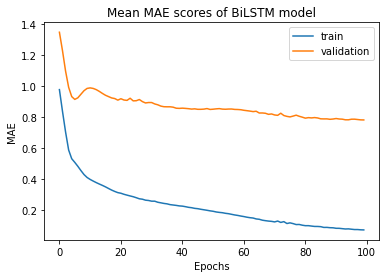

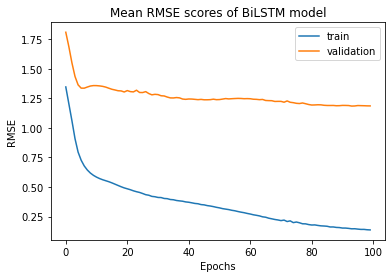

In [151]:
visualize_performance(results_inc_sat_cpt_x)

Optimal Mean MAE: 0.7733684528619051 @ epoch 98
Optimal Mean RMSE: 1.205626422725618 @ epoch 92


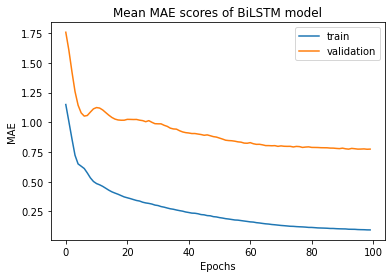

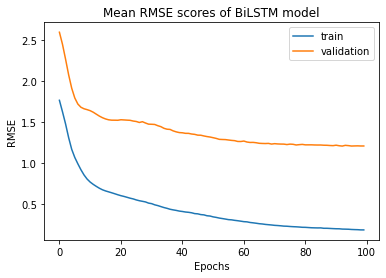

In [152]:
visualize_performance(results_inc_sat_cpt_y)

Optimal Mean MAE: 0.7695929253473878 @ epoch 97
Optimal Mean RMSE: 1.1792731769382954 @ epoch 97


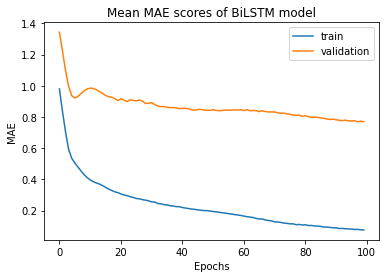

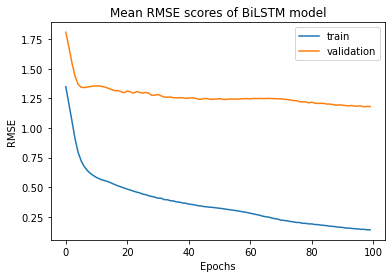

In [153]:
visualize_performance(results_inc_sat_cpt_z)

### Tacheometry + Satellite <- CPT (incremental)

In [166]:
results_inc_tcmt_sat_cpt_x = incremental_fusion('Sat', 'X', tacheometry=True)
results_inc_tcmt_sat_cpt_y = incremental_fusion('Sat', 'Y', tacheometry=True)
results_inc_tcmt_sat_cpt_z = incremental_fusion('Sat', 'Z', tacheometry=True)

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 6.7391 - mean_absolute_error: 1.9292 - root_mean_squared_error: 2.5960 - val_loss: 10.6168 - val_mean_absolute_error: 2.6184 - val_root_mean_squared_error: 3.2583
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 5.6911 - mean_absolute_error: 1.7043 - root_mean_squared_error: 2.3856 - val_loss: 9.5232 - val_mean_absolute_error: 2.4451 - val_root_mean_squared_error: 3.0860
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 4.6870 - mean_absolute_error: 1.4613 - root_mean_squared_error: 2.1650 - val_loss: 8.3321 - val_mean_absolute_error: 2.2404 - val_root_mean_squared_error: 2.8865
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 3.6620 - mean_absolute_error: 1.2416 - root_mean_squared_error: 1.9136 - val_loss: 7.4061 - val_mean_absolute_error: 2.0888 - val_root_mean_squared_error: 2.7214
Epoch 5/100
1/1 [==============================] - 0s 42ms/step -

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.6666 - mean_absolute_error: 0.4590 - root_mean_squared_error: 0.8164 - val_loss: 8.6054 - val_mean_absolute_error: 2.1500 - val_root_mean_squared_error: 2.9335
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6372 - mean_absolute_error: 0.4448 - root_mean_squared_error: 0.7982 - val_loss: 8.5138 - val_mean_absolute_error: 2.1386 - val_root_mean_squared_error: 2.9178
Epoch 38/100
1/1 [==============================] - 0s 49ms/step - loss: 0.6100 - mean_absolute_error: 0.4313 - root_mean_squared_error: 0.7810 - val_loss: 8.4800 - val_mean_absolute_error: 2.1321 - val_root_mean_squared_error: 2.9120
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.5833 - mean_absolute_error: 0.4182 - root_mean_squared_error: 0.7638 - val_loss: 8.4388 - val_mean_absolute_error: 2.1253 - val_root_mean_squared_error: 2.9050
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2358 - mean_absolute_error: 0.2169 - root_mean_squared_error: 0.4856 - val_loss: 7.3594 - val_mean_absolute_error: 1.9453 - val_root_mean_squared_error: 2.7128
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2276 - mean_absolute_error: 0.2106 - root_mean_squared_error: 0.4770 - val_loss: 7.3830 - val_mean_absolute_error: 1.9494 - val_root_mean_squared_error: 2.7172
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2210 - mean_absolute_error: 0.2080 - root_mean_squared_error: 0.4701 - val_loss: 7.3907 - val_mean_absolute_error: 1.9478 - val_root_mean_squared_error: 2.7186
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2154 - mean_absolute_error: 0.2044 - root_mean_squared_error: 0.4641 - val_loss: 7.3747 - val_mean_absolute_error: 1.9402 - val_root_mean_squared_error: 2.7156
Epoch 75/100
1/1 [==============================] - 0s 42ms/

Epoch 6/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2182 - mean_absolute_error: 0.3582 - root_mean_squared_error: 0.4671 - val_loss: 0.5012 - val_mean_absolute_error: 0.4961 - val_root_mean_squared_error: 0.7079
Epoch 7/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1866 - mean_absolute_error: 0.3290 - root_mean_squared_error: 0.4320 - val_loss: 0.5371 - val_mean_absolute_error: 0.5446 - val_root_mean_squared_error: 0.7328
Epoch 8/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1597 - mean_absolute_error: 0.3027 - root_mean_squared_error: 0.3996 - val_loss: 0.6067 - val_mean_absolute_error: 0.5946 - val_root_mean_squared_error: 0.7789
Epoch 9/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1568 - mean_absolute_error: 0.2987 - root_mean_squared_error: 0.3960 - val_loss: 0.6367 - val_mean_absolute_error: 0.6146 - val_root_mean_squared_error: 0.7980
Epoch 10/100
1/1 [==============================] - 0s 44ms/step

Epoch 41/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0102 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.1009 - val_loss: 0.1966 - val_mean_absolute_error: 0.3001 - val_root_mean_squared_error: 0.4434
Epoch 42/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0098 - mean_absolute_error: 0.0655 - root_mean_squared_error: 0.0989 - val_loss: 0.1939 - val_mean_absolute_error: 0.2953 - val_root_mean_squared_error: 0.4403
Epoch 43/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0094 - mean_absolute_error: 0.0641 - root_mean_squared_error: 0.0967 - val_loss: 0.1892 - val_mean_absolute_error: 0.2868 - val_root_mean_squared_error: 0.4349
Epoch 44/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0090 - mean_absolute_error: 0.0627 - root_mean_squared_error: 0.0947 - val_loss: 0.1861 - val_mean_absolute_error: 0.2808 - val_root_mean_squared_error: 0.4314
Epoch 45/100
1/1 [==============================] - 0s 45ms/

Epoch 76/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0032 - mean_absolute_error: 0.0284 - root_mean_squared_error: 0.0568 - val_loss: 0.1604 - val_mean_absolute_error: 0.2307 - val_root_mean_squared_error: 0.4005
Epoch 77/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0038 - mean_absolute_error: 0.0344 - root_mean_squared_error: 0.0615 - val_loss: 0.1636 - val_mean_absolute_error: 0.2440 - val_root_mean_squared_error: 0.4045
Epoch 78/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0036 - mean_absolute_error: 0.0332 - root_mean_squared_error: 0.0599 - val_loss: 0.1617 - val_mean_absolute_error: 0.2374 - val_root_mean_squared_error: 0.4021
Epoch 79/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0030 - mean_absolute_error: 0.0270 - root_mean_squared_error: 0.0545 - val_loss: 0.1602 - val_mean_absolute_error: 0.2311 - val_root_mean_squared_error: 0.4002
Epoch 80/100
1/1 [==============================] - 0s 54ms/

Epoch 11/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2592 - mean_absolute_error: 0.3716 - root_mean_squared_error: 0.5091 - val_loss: 0.8717 - val_mean_absolute_error: 0.7110 - val_root_mean_squared_error: 0.9337
Epoch 12/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2464 - mean_absolute_error: 0.3618 - root_mean_squared_error: 0.4964 - val_loss: 0.8459 - val_mean_absolute_error: 0.6945 - val_root_mean_squared_error: 0.9197
Epoch 13/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2280 - mean_absolute_error: 0.3422 - root_mean_squared_error: 0.4775 - val_loss: 0.8258 - val_mean_absolute_error: 0.6693 - val_root_mean_squared_error: 0.9087
Epoch 14/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2143 - mean_absolute_error: 0.3235 - root_mean_squared_error: 0.4630 - val_loss: 0.8157 - val_mean_absolute_error: 0.6413 - val_root_mean_squared_error: 0.9031
Epoch 15/100
1/1 [==============================] - 0s 44ms/

Epoch 46/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1322 - mean_absolute_error: 0.2279 - root_mean_squared_error: 0.3637 - val_loss: 0.6089 - val_mean_absolute_error: 0.5522 - val_root_mean_squared_error: 0.7803
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1255 - mean_absolute_error: 0.2210 - root_mean_squared_error: 0.3542 - val_loss: 0.5842 - val_mean_absolute_error: 0.5406 - val_root_mean_squared_error: 0.7644
Epoch 48/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1177 - mean_absolute_error: 0.2134 - root_mean_squared_error: 0.3430 - val_loss: 0.5551 - val_mean_absolute_error: 0.5272 - val_root_mean_squared_error: 0.7451
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1091 - mean_absolute_error: 0.2052 - root_mean_squared_error: 0.3303 - val_loss: 0.5280 - val_mean_absolute_error: 0.5129 - val_root_mean_squared_error: 0.7266
Epoch 50/100
1/1 [==============================] - 0s 45ms/

Epoch 81/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0062 - mean_absolute_error: 0.0514 - root_mean_squared_error: 0.0789 - val_loss: 0.1816 - val_mean_absolute_error: 0.2932 - val_root_mean_squared_error: 0.4261
Epoch 82/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0059 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0768 - val_loss: 0.1802 - val_mean_absolute_error: 0.2926 - val_root_mean_squared_error: 0.4245
Epoch 83/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0058 - mean_absolute_error: 0.0489 - root_mean_squared_error: 0.0762 - val_loss: 0.1773 - val_mean_absolute_error: 0.2906 - val_root_mean_squared_error: 0.4211
Epoch 84/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0058 - mean_absolute_error: 0.0497 - root_mean_squared_error: 0.0758 - val_loss: 0.1833 - val_mean_absolute_error: 0.2956 - val_root_mean_squared_error: 0.4282
Epoch 85/100
1/1 [==============================] - 0s 44ms/

Epoch 16/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1053 - mean_absolute_error: 0.2227 - root_mean_squared_error: 0.3245 - val_loss: 0.8602 - val_mean_absolute_error: 0.4950 - val_root_mean_squared_error: 0.9274
Epoch 17/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1007 - mean_absolute_error: 0.2169 - root_mean_squared_error: 0.3173 - val_loss: 0.8583 - val_mean_absolute_error: 0.4869 - val_root_mean_squared_error: 0.9264
Epoch 18/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0970 - mean_absolute_error: 0.2065 - root_mean_squared_error: 0.3115 - val_loss: 0.8537 - val_mean_absolute_error: 0.4831 - val_root_mean_squared_error: 0.9239
Epoch 19/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0939 - mean_absolute_error: 0.1984 - root_mean_squared_error: 0.3064 - val_loss: 0.8451 - val_mean_absolute_error: 0.4815 - val_root_mean_squared_error: 0.9193
Epoch 20/100
1/1 [==============================] - 0s 45ms/

Epoch 51/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0047 - mean_absolute_error: 0.0506 - root_mean_squared_error: 0.0687 - val_loss: 0.6756 - val_mean_absolute_error: 0.3001 - val_root_mean_squared_error: 0.8220
Epoch 52/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0043 - mean_absolute_error: 0.0471 - root_mean_squared_error: 0.0652 - val_loss: 0.6762 - val_mean_absolute_error: 0.3048 - val_root_mean_squared_error: 0.8223
Epoch 53/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0041 - mean_absolute_error: 0.0460 - root_mean_squared_error: 0.0642 - val_loss: 0.6774 - val_mean_absolute_error: 0.3073 - val_root_mean_squared_error: 0.8230
Epoch 54/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0041 - mean_absolute_error: 0.0457 - root_mean_squared_error: 0.0640 - val_loss: 0.6781 - val_mean_absolute_error: 0.3061 - val_root_mean_squared_error: 0.8235
Epoch 55/100
1/1 [==============================] - 0s 46ms/

Epoch 20/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2504 - mean_absolute_error: 0.3540 - root_mean_squared_error: 0.5004 - val_loss: 1.2065 - val_mean_absolute_error: 0.7638 - val_root_mean_squared_error: 1.0984
Epoch 21/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2354 - mean_absolute_error: 0.3393 - root_mean_squared_error: 0.4852 - val_loss: 1.1606 - val_mean_absolute_error: 0.7611 - val_root_mean_squared_error: 1.0773
Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2229 - mean_absolute_error: 0.3259 - root_mean_squared_error: 0.4722 - val_loss: 1.1297 - val_mean_absolute_error: 0.7638 - val_root_mean_squared_error: 1.0629
Epoch 23/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2140 - mean_absolute_error: 0.3183 - root_mean_squared_error: 0.4626 - val_loss: 1.1213 - val_mean_absolute_error: 0.7712 - val_root_mean_squared_error: 1.0589
Epoch 24/100
1/1 [==============================] - 0s 45ms/

Epoch 55/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0331 - mean_absolute_error: 0.1006 - root_mean_squared_error: 0.1819 - val_loss: 0.5894 - val_mean_absolute_error: 0.5084 - val_root_mean_squared_error: 0.7677
Epoch 56/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0320 - mean_absolute_error: 0.0975 - root_mean_squared_error: 0.1788 - val_loss: 0.5986 - val_mean_absolute_error: 0.5145 - val_root_mean_squared_error: 0.7737
Epoch 57/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0309 - mean_absolute_error: 0.0950 - root_mean_squared_error: 0.1759 - val_loss: 0.6070 - val_mean_absolute_error: 0.5195 - val_root_mean_squared_error: 0.7791
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0301 - mean_absolute_error: 0.0931 - root_mean_squared_error: 0.1735 - val_loss: 0.5966 - val_mean_absolute_error: 0.5141 - val_root_mean_squared_error: 0.7724
Epoch 59/100
1/1 [==============================] - 0s 47ms/

Epoch 90/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0125 - mean_absolute_error: 0.0507 - root_mean_squared_error: 0.1116 - val_loss: 0.5904 - val_mean_absolute_error: 0.5136 - val_root_mean_squared_error: 0.7684
Epoch 91/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0121 - mean_absolute_error: 0.0499 - root_mean_squared_error: 0.1098 - val_loss: 0.5937 - val_mean_absolute_error: 0.5146 - val_root_mean_squared_error: 0.7705
Epoch 92/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0117 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.1081 - val_loss: 0.5918 - val_mean_absolute_error: 0.5130 - val_root_mean_squared_error: 0.7693
Epoch 93/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0113 - mean_absolute_error: 0.0482 - root_mean_squared_error: 0.1063 - val_loss: 0.5966 - val_mean_absolute_error: 0.5151 - val_root_mean_squared_error: 0.7724
Epoch 94/100
1/1 [==============================] - 0s 45ms/

Epoch 25/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0999 - mean_absolute_error: 0.2180 - root_mean_squared_error: 0.3160 - val_loss: 1.5748 - val_mean_absolute_error: 0.8431 - val_root_mean_squared_error: 1.2549
Epoch 26/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0957 - mean_absolute_error: 0.2114 - root_mean_squared_error: 0.3093 - val_loss: 1.5624 - val_mean_absolute_error: 0.8313 - val_root_mean_squared_error: 1.2500
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0930 - mean_absolute_error: 0.2081 - root_mean_squared_error: 0.3050 - val_loss: 1.5504 - val_mean_absolute_error: 0.8221 - val_root_mean_squared_error: 1.2452
Epoch 28/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0916 - mean_absolute_error: 0.2063 - root_mean_squared_error: 0.3027 - val_loss: 1.5398 - val_mean_absolute_error: 0.8197 - val_root_mean_squared_error: 1.2409
Epoch 29/100
1/1 [==============================] - 0s 43ms/

Epoch 60/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0049 - mean_absolute_error: 0.0514 - root_mean_squared_error: 0.0697 - val_loss: 1.6408 - val_mean_absolute_error: 0.7091 - val_root_mean_squared_error: 1.2809
Epoch 61/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0046 - mean_absolute_error: 0.0507 - root_mean_squared_error: 0.0682 - val_loss: 1.6468 - val_mean_absolute_error: 0.7066 - val_root_mean_squared_error: 1.2833
Epoch 62/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0044 - mean_absolute_error: 0.0494 - root_mean_squared_error: 0.0663 - val_loss: 1.6499 - val_mean_absolute_error: 0.7055 - val_root_mean_squared_error: 1.2845
Epoch 63/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0043 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0652 - val_loss: 1.6460 - val_mean_absolute_error: 0.7072 - val_root_mean_squared_error: 1.2830
Epoch 64/100
1/1 [==============================] - 0s 49ms/

Epoch 95/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0015 - mean_absolute_error: 0.0257 - root_mean_squared_error: 0.0384 - val_loss: 1.6931 - val_mean_absolute_error: 0.6708 - val_root_mean_squared_error: 1.3012
Epoch 96/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0013 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0357 - val_loss: 1.6858 - val_mean_absolute_error: 0.6738 - val_root_mean_squared_error: 1.2984
Epoch 97/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0015 - mean_absolute_error: 0.0248 - root_mean_squared_error: 0.0382 - val_loss: 1.7026 - val_mean_absolute_error: 0.6666 - val_root_mean_squared_error: 1.3048
Epoch 98/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0015 - mean_absolute_error: 0.0256 - root_mean_squared_error: 0.0384 - val_loss: 1.6923 - val_mean_absolute_error: 0.6708 - val_root_mean_squared_error: 1.3009
Epoch 99/100
1/1 [==============================] - 0s 47ms/

Epoch 30/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0186 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1365 - val_loss: 0.4707 - val_mean_absolute_error: 0.4648 - val_root_mean_squared_error: 0.6861
Epoch 31/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0182 - mean_absolute_error: 0.0910 - root_mean_squared_error: 0.1348 - val_loss: 0.4982 - val_mean_absolute_error: 0.4811 - val_root_mean_squared_error: 0.7058
Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0176 - mean_absolute_error: 0.0900 - root_mean_squared_error: 0.1328 - val_loss: 0.5108 - val_mean_absolute_error: 0.4890 - val_root_mean_squared_error: 0.7147
Epoch 33/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0177 - mean_absolute_error: 0.0919 - root_mean_squared_error: 0.1331 - val_loss: 0.4824 - val_mean_absolute_error: 0.4749 - val_root_mean_squared_error: 0.6946
Epoch 34/100
1/1 [==============================] - 0s 46ms/

Epoch 65/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0070 - mean_absolute_error: 0.0469 - root_mean_squared_error: 0.0835 - val_loss: 0.4626 - val_mean_absolute_error: 0.4614 - val_root_mean_squared_error: 0.6801
Epoch 66/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0069 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0828 - val_loss: 0.4597 - val_mean_absolute_error: 0.4596 - val_root_mean_squared_error: 0.6780
Epoch 67/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0068 - mean_absolute_error: 0.0460 - root_mean_squared_error: 0.0823 - val_loss: 0.4676 - val_mean_absolute_error: 0.4640 - val_root_mean_squared_error: 0.6838
Epoch 68/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0067 - mean_absolute_error: 0.0453 - root_mean_squared_error: 0.0817 - val_loss: 0.4665 - val_mean_absolute_error: 0.4632 - val_root_mean_squared_error: 0.6830
Epoch 69/100
1/1 [==============================] - 0s 46ms/

Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0045 - mean_absolute_error: 0.0364 - root_mean_squared_error: 0.0670 - val_loss: 0.4926 - val_mean_absolute_error: 0.4757 - val_root_mean_squared_error: 0.7019
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 1.0951 - mean_absolute_error: 0.7635 - root_mean_squared_error: 1.0465 - val_loss: 1.7259 - val_mean_absolute_error: 0.9585 - val_root_mean_squared_error: 1.3137
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 0.7620 - mean_absolute_error: 0.6234 - root_mean_squared_error: 0.8729 - val_loss: 1.4914 - val_mean_absolute_error: 0.8779 - val_root_mean_squared_error: 1.2212
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5098 - mean_absolute_error: 0.5063 - root_mean_squared_error: 0.7140 - val_loss: 1.3178 - val_mean_absolute_error: 0.7980 - val_root_mean_squared_error: 1.1480
Epoch 4/100
1/1 [==============================] - 0s 42ms/step 

Epoch 35/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0702 - mean_absolute_error: 0.1741 - root_mean_squared_error: 0.2650 - val_loss: 0.9067 - val_mean_absolute_error: 0.5718 - val_root_mean_squared_error: 0.9522
Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0667 - mean_absolute_error: 0.1661 - root_mean_squared_error: 0.2582 - val_loss: 0.8966 - val_mean_absolute_error: 0.5722 - val_root_mean_squared_error: 0.9469
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0633 - mean_absolute_error: 0.1581 - root_mean_squared_error: 0.2516 - val_loss: 0.8884 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.9425
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0606 - mean_absolute_error: 0.1510 - root_mean_squared_error: 0.2462 - val_loss: 0.8795 - val_mean_absolute_error: 0.5760 - val_root_mean_squared_error: 0.9378
Epoch 39/100
1/1 [==============================] - 0s 45ms/

Epoch 70/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0287 - mean_absolute_error: 0.0986 - root_mean_squared_error: 0.1695 - val_loss: 0.7379 - val_mean_absolute_error: 0.5142 - val_root_mean_squared_error: 0.8590
Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0286 - mean_absolute_error: 0.0962 - root_mean_squared_error: 0.1690 - val_loss: 0.7365 - val_mean_absolute_error: 0.5160 - val_root_mean_squared_error: 0.8582
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0280 - mean_absolute_error: 0.0969 - root_mean_squared_error: 0.1672 - val_loss: 0.7374 - val_mean_absolute_error: 0.5151 - val_root_mean_squared_error: 0.8587
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0272 - mean_absolute_error: 0.0938 - root_mean_squared_error: 0.1650 - val_loss: 0.7373 - val_mean_absolute_error: 0.5151 - val_root_mean_squared_error: 0.8586
Epoch 74/100
1/1 [==============================] - 0s 44ms/

Epoch 5/100
1/1 [==============================] - 0s 48ms/step - loss: 2.7510 - mean_absolute_error: 0.9268 - root_mean_squared_error: 1.6586 - val_loss: 10.2419 - val_mean_absolute_error: 2.2401 - val_root_mean_squared_error: 3.2003
Epoch 6/100
1/1 [==============================] - 0s 51ms/step - loss: 2.5512 - mean_absolute_error: 0.9315 - root_mean_squared_error: 1.5972 - val_loss: 9.4402 - val_mean_absolute_error: 2.1388 - val_root_mean_squared_error: 3.0725
Epoch 7/100
1/1 [==============================] - 0s 50ms/step - loss: 2.4679 - mean_absolute_error: 0.9605 - root_mean_squared_error: 1.5710 - val_loss: 9.0103 - val_mean_absolute_error: 2.0900 - val_root_mean_squared_error: 3.0017
Epoch 8/100
1/1 [==============================] - 0s 53ms/step - loss: 2.3540 - mean_absolute_error: 0.9360 - root_mean_squared_error: 1.5343 - val_loss: 8.8905 - val_mean_absolute_error: 2.0889 - val_root_mean_squared_error: 2.9817
Epoch 9/100
1/1 [==============================] - 0s 50ms/step

Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3258 - mean_absolute_error: 0.3468 - root_mean_squared_error: 0.5708 - val_loss: 6.0427 - val_mean_absolute_error: 1.7448 - val_root_mean_squared_error: 2.4582
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3111 - mean_absolute_error: 0.3362 - root_mean_squared_error: 0.5578 - val_loss: 6.1618 - val_mean_absolute_error: 1.7596 - val_root_mean_squared_error: 2.4823
Epoch 42/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2986 - mean_absolute_error: 0.3260 - root_mean_squared_error: 0.5464 - val_loss: 6.2449 - val_mean_absolute_error: 1.7708 - val_root_mean_squared_error: 2.4990
Epoch 43/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2879 - mean_absolute_error: 0.3180 - root_mean_squared_error: 0.5366 - val_loss: 6.2107 - val_mean_absolute_error: 1.7667 - val_root_mean_squared_error: 2.4921
Epoch 44/100
1/1 [==============================] - 0s 47ms/

Epoch 75/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0969 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.3113 - val_loss: 5.9262 - val_mean_absolute_error: 1.7239 - val_root_mean_squared_error: 2.4344
Epoch 76/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0935 - mean_absolute_error: 0.1667 - root_mean_squared_error: 0.3057 - val_loss: 5.9070 - val_mean_absolute_error: 1.7219 - val_root_mean_squared_error: 2.4304
Epoch 77/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0901 - mean_absolute_error: 0.1634 - root_mean_squared_error: 0.3002 - val_loss: 5.9115 - val_mean_absolute_error: 1.7232 - val_root_mean_squared_error: 2.4314
Epoch 78/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0870 - mean_absolute_error: 0.1606 - root_mean_squared_error: 0.2949 - val_loss: 5.9403 - val_mean_absolute_error: 1.7280 - val_root_mean_squared_error: 2.4373
Epoch 79/100
1/1 [==============================] - 0s 44ms/

Epoch 10/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0900 - mean_absolute_error: 0.2179 - root_mean_squared_error: 0.3000 - val_loss: 1.7969 - val_mean_absolute_error: 0.7914 - val_root_mean_squared_error: 1.3405
Epoch 11/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0769 - mean_absolute_error: 0.2022 - root_mean_squared_error: 0.2774 - val_loss: 1.7672 - val_mean_absolute_error: 0.7586 - val_root_mean_squared_error: 1.3294
Epoch 12/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0613 - mean_absolute_error: 0.1776 - root_mean_squared_error: 0.2476 - val_loss: 1.7381 - val_mean_absolute_error: 0.7273 - val_root_mean_squared_error: 1.3184
Epoch 13/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0535 - mean_absolute_error: 0.1645 - root_mean_squared_error: 0.2313 - val_loss: 1.7175 - val_mean_absolute_error: 0.7048 - val_root_mean_squared_error: 1.3105
Epoch 14/100
1/1 [==============================] - 0s 47ms/

Epoch 45/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0035 - mean_absolute_error: 0.0379 - root_mean_squared_error: 0.0592 - val_loss: 1.6674 - val_mean_absolute_error: 0.6212 - val_root_mean_squared_error: 1.2913
Epoch 46/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0031 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0557 - val_loss: 1.6660 - val_mean_absolute_error: 0.6197 - val_root_mean_squared_error: 1.2907
Epoch 47/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0028 - mean_absolute_error: 0.0348 - root_mean_squared_error: 0.0529 - val_loss: 1.6656 - val_mean_absolute_error: 0.6160 - val_root_mean_squared_error: 1.2906
Epoch 48/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0025 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0503 - val_loss: 1.6670 - val_mean_absolute_error: 0.6111 - val_root_mean_squared_error: 1.2911
Epoch 49/100
1/1 [==============================] - 0s 43ms/

1/1 [==============================] - 0s 41ms/step - loss: 0.7267 - mean_absolute_error: 0.6166 - root_mean_squared_error: 0.8525 - val_loss: 2.2408 - val_mean_absolute_error: 1.1519 - val_root_mean_squared_error: 1.4969
Epoch 14/100
1/1 [==============================] - 0s 45ms/step - loss: 0.7290 - mean_absolute_error: 0.6182 - root_mean_squared_error: 0.8538 - val_loss: 2.1791 - val_mean_absolute_error: 1.1319 - val_root_mean_squared_error: 1.4762
Epoch 15/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7056 - mean_absolute_error: 0.6060 - root_mean_squared_error: 0.8400 - val_loss: 2.0438 - val_mean_absolute_error: 1.0856 - val_root_mean_squared_error: 1.4296
Epoch 16/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6611 - mean_absolute_error: 0.5798 - root_mean_squared_error: 0.8131 - val_loss: 1.8709 - val_mean_absolute_error: 1.0249 - val_root_mean_squared_error: 1.3678
Epoch 17/100
1/1 [==============================] - 0s 41ms/step - loss: 

Epoch 48/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0894 - mean_absolute_error: 0.1712 - root_mean_squared_error: 0.2991 - val_loss: 1.3949 - val_mean_absolute_error: 0.8383 - val_root_mean_squared_error: 1.1811
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0877 - mean_absolute_error: 0.1675 - root_mean_squared_error: 0.2962 - val_loss: 1.4004 - val_mean_absolute_error: 0.8387 - val_root_mean_squared_error: 1.1834
Epoch 50/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0856 - mean_absolute_error: 0.1641 - root_mean_squared_error: 0.2927 - val_loss: 1.3935 - val_mean_absolute_error: 0.8301 - val_root_mean_squared_error: 1.1805
Epoch 51/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0829 - mean_absolute_error: 0.1600 - root_mean_squared_error: 0.2880 - val_loss: 1.3858 - val_mean_absolute_error: 0.8191 - val_root_mean_squared_error: 1.1772
Epoch 52/100
1/1 [==============================] - 0s 43ms/

Epoch 83/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0310 - mean_absolute_error: 0.0903 - root_mean_squared_error: 0.1761 - val_loss: 1.2873 - val_mean_absolute_error: 0.7403 - val_root_mean_squared_error: 1.1346
Epoch 84/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0300 - mean_absolute_error: 0.0892 - root_mean_squared_error: 0.1732 - val_loss: 1.2845 - val_mean_absolute_error: 0.7373 - val_root_mean_squared_error: 1.1334
Epoch 85/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0290 - mean_absolute_error: 0.0880 - root_mean_squared_error: 0.1703 - val_loss: 1.2823 - val_mean_absolute_error: 0.7363 - val_root_mean_squared_error: 1.1324
Epoch 86/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0281 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1675 - val_loss: 1.2789 - val_mean_absolute_error: 0.7360 - val_root_mean_squared_error: 1.1309
Epoch 87/100
1/1 [==============================] - 0s 44ms/

Epoch 18/100
1/1 [==============================] - 0s 42ms/step - loss: 1.3772 - mean_absolute_error: 0.7763 - root_mean_squared_error: 1.1735 - val_loss: 3.8481 - val_mean_absolute_error: 1.4479 - val_root_mean_squared_error: 1.9617
Epoch 19/100
1/1 [==============================] - 0s 43ms/step - loss: 1.3086 - mean_absolute_error: 0.7540 - root_mean_squared_error: 1.1439 - val_loss: 3.7513 - val_mean_absolute_error: 1.4118 - val_root_mean_squared_error: 1.9368
Epoch 20/100
1/1 [==============================] - 0s 46ms/step - loss: 1.2529 - mean_absolute_error: 0.7371 - root_mean_squared_error: 1.1193 - val_loss: 3.6750 - val_mean_absolute_error: 1.3817 - val_root_mean_squared_error: 1.9170
Epoch 21/100
1/1 [==============================] - 0s 44ms/step - loss: 1.2059 - mean_absolute_error: 0.7210 - root_mean_squared_error: 1.0981 - val_loss: 3.6175 - val_mean_absolute_error: 1.3597 - val_root_mean_squared_error: 1.9020
Epoch 22/100
1/1 [==============================] - 0s 48ms/

Epoch 53/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2515 - mean_absolute_error: 0.2958 - root_mean_squared_error: 0.5015 - val_loss: 2.6976 - val_mean_absolute_error: 1.1132 - val_root_mean_squared_error: 1.6424
Epoch 54/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2417 - mean_absolute_error: 0.2903 - root_mean_squared_error: 0.4916 - val_loss: 2.7069 - val_mean_absolute_error: 1.1132 - val_root_mean_squared_error: 1.6453
Epoch 55/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2308 - mean_absolute_error: 0.2826 - root_mean_squared_error: 0.4804 - val_loss: 2.7230 - val_mean_absolute_error: 1.1171 - val_root_mean_squared_error: 1.6502
Epoch 56/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2207 - mean_absolute_error: 0.2753 - root_mean_squared_error: 0.4698 - val_loss: 2.7033 - val_mean_absolute_error: 1.1136 - val_root_mean_squared_error: 1.6442
Epoch 57/100
1/1 [==============================] - 0s 48ms/

Epoch 88/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0634 - mean_absolute_error: 0.1442 - root_mean_squared_error: 0.2518 - val_loss: 2.5596 - val_mean_absolute_error: 1.0757 - val_root_mean_squared_error: 1.5999
Epoch 89/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0561 - mean_absolute_error: 0.1350 - root_mean_squared_error: 0.2369 - val_loss: 2.4928 - val_mean_absolute_error: 1.0573 - val_root_mean_squared_error: 1.5789
Epoch 90/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0561 - mean_absolute_error: 0.1359 - root_mean_squared_error: 0.2369 - val_loss: 2.4843 - val_mean_absolute_error: 1.0561 - val_root_mean_squared_error: 1.5762
Epoch 91/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0529 - mean_absolute_error: 0.1315 - root_mean_squared_error: 0.2299 - val_loss: 2.5524 - val_mean_absolute_error: 1.0729 - val_root_mean_squared_error: 1.5976
Epoch 92/100
1/1 [==============================] - 0s 45ms/

Epoch 23/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0040 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0633 - val_loss: 0.0166 - val_mean_absolute_error: 0.1031 - val_root_mean_squared_error: 0.1287
Epoch 24/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0037 - mean_absolute_error: 0.0464 - root_mean_squared_error: 0.0605 - val_loss: 0.0149 - val_mean_absolute_error: 0.0978 - val_root_mean_squared_error: 0.1219
Epoch 25/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0030 - mean_absolute_error: 0.0423 - root_mean_squared_error: 0.0549 - val_loss: 0.0162 - val_mean_absolute_error: 0.1022 - val_root_mean_squared_error: 0.1271
Epoch 26/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0025 - mean_absolute_error: 0.0379 - root_mean_squared_error: 0.0495 - val_loss: 0.0144 - val_mean_absolute_error: 0.0961 - val_root_mean_squared_error: 0.1200
Epoch 27/100
1/1 [==============================] - 0s 37ms/

1/1 [==============================] - 0s 41ms/step - loss: 4.2387e-05 - mean_absolute_error: 0.0047 - root_mean_squared_error: 0.0065 - val_loss: 0.0013 - val_mean_absolute_error: 0.0251 - val_root_mean_squared_error: 0.0354
Epoch 92/100
1/1 [==============================] - 0s 42ms/step - loss: 4.1184e-05 - mean_absolute_error: 0.0046 - root_mean_squared_error: 0.0064 - val_loss: 0.0013 - val_mean_absolute_error: 0.0254 - val_root_mean_squared_error: 0.0357
Epoch 93/100
1/1 [==============================] - 0s 42ms/step - loss: 3.9911e-05 - mean_absolute_error: 0.0045 - root_mean_squared_error: 0.0063 - val_loss: 0.0013 - val_mean_absolute_error: 0.0259 - val_root_mean_squared_error: 0.0362
Epoch 94/100
1/1 [==============================] - 0s 43ms/step - loss: 3.9307e-05 - mean_absolute_error: 0.0045 - root_mean_squared_error: 0.0063 - val_loss: 0.0012 - val_mean_absolute_error: 0.0251 - val_root_mean_squared_error: 0.0353
Epoch 95/100
1/1 [==============================] - 0s 45

Epoch 26/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2048 - mean_absolute_error: 0.2823 - root_mean_squared_error: 0.4526 - val_loss: 5.7954 - val_mean_absolute_error: 1.6756 - val_root_mean_squared_error: 2.4074
Epoch 27/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2005 - mean_absolute_error: 0.2825 - root_mean_squared_error: 0.4478 - val_loss: 5.2790 - val_mean_absolute_error: 1.6108 - val_root_mean_squared_error: 2.2976
Epoch 28/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1920 - mean_absolute_error: 0.2814 - root_mean_squared_error: 0.4382 - val_loss: 5.0880 - val_mean_absolute_error: 1.5839 - val_root_mean_squared_error: 2.2557
Epoch 29/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1953 - mean_absolute_error: 0.2844 - root_mean_squared_error: 0.4419 - val_loss: 5.3171 - val_mean_absolute_error: 1.6064 - val_root_mean_squared_error: 2.3059
Epoch 30/100
1/1 [==============================] - 0s 43ms/

Epoch 61/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0517 - mean_absolute_error: 0.1398 - root_mean_squared_error: 0.2274 - val_loss: 5.0247 - val_mean_absolute_error: 1.5148 - val_root_mean_squared_error: 2.2416
Epoch 62/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0503 - mean_absolute_error: 0.1370 - root_mean_squared_error: 0.2243 - val_loss: 5.0871 - val_mean_absolute_error: 1.5247 - val_root_mean_squared_error: 2.2555
Epoch 63/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0497 - mean_absolute_error: 0.1359 - root_mean_squared_error: 0.2228 - val_loss: 5.0545 - val_mean_absolute_error: 1.5203 - val_root_mean_squared_error: 2.2482
Epoch 64/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0485 - mean_absolute_error: 0.1337 - root_mean_squared_error: 0.2202 - val_loss: 4.9903 - val_mean_absolute_error: 1.5113 - val_root_mean_squared_error: 2.2339
Epoch 65/100
1/1 [==============================] - 0s 42ms/

Epoch 96/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0272 - mean_absolute_error: 0.0951 - root_mean_squared_error: 0.1650 - val_loss: 4.8588 - val_mean_absolute_error: 1.5031 - val_root_mean_squared_error: 2.2043
Epoch 97/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0267 - mean_absolute_error: 0.0941 - root_mean_squared_error: 0.1633 - val_loss: 4.8578 - val_mean_absolute_error: 1.5030 - val_root_mean_squared_error: 2.2040
Epoch 98/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0262 - mean_absolute_error: 0.0931 - root_mean_squared_error: 0.1617 - val_loss: 4.8433 - val_mean_absolute_error: 1.5009 - val_root_mean_squared_error: 2.2007
Epoch 99/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0256 - mean_absolute_error: 0.0920 - root_mean_squared_error: 0.1601 - val_loss: 4.8435 - val_mean_absolute_error: 1.5011 - val_root_mean_squared_error: 2.2008
Epoch 100/100
1/1 [==============================] - 0s 42ms

Epoch 31/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0272 - mean_absolute_error: 0.0959 - root_mean_squared_error: 0.1648 - val_loss: 0.1793 - val_mean_absolute_error: 0.3057 - val_root_mean_squared_error: 0.4234
Epoch 32/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0265 - mean_absolute_error: 0.0944 - root_mean_squared_error: 0.1628 - val_loss: 0.1783 - val_mean_absolute_error: 0.3038 - val_root_mean_squared_error: 0.4222
Epoch 33/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0258 - mean_absolute_error: 0.0933 - root_mean_squared_error: 0.1607 - val_loss: 0.1784 - val_mean_absolute_error: 0.3031 - val_root_mean_squared_error: 0.4223
Epoch 34/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0251 - mean_absolute_error: 0.0926 - root_mean_squared_error: 0.1584 - val_loss: 0.1796 - val_mean_absolute_error: 0.3036 - val_root_mean_squared_error: 0.4238
Epoch 35/100
1/1 [==============================] - 0s 44ms/

Epoch 66/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0056 - mean_absolute_error: 0.0437 - root_mean_squared_error: 0.0745 - val_loss: 0.1490 - val_mean_absolute_error: 0.2795 - val_root_mean_squared_error: 0.3861
Epoch 67/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0054 - mean_absolute_error: 0.0431 - root_mean_squared_error: 0.0734 - val_loss: 0.1473 - val_mean_absolute_error: 0.2771 - val_root_mean_squared_error: 0.3837
Epoch 68/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0053 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0725 - val_loss: 0.1459 - val_mean_absolute_error: 0.2751 - val_root_mean_squared_error: 0.3819
Epoch 69/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0051 - mean_absolute_error: 0.0417 - root_mean_squared_error: 0.0716 - val_loss: 0.1447 - val_mean_absolute_error: 0.2736 - val_root_mean_squared_error: 0.3804
Epoch 70/100
1/1 [==============================] - 0s 43ms/

Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 0.8940 - mean_absolute_error: 0.7435 - root_mean_squared_error: 0.9455 - val_loss: 1.3861 - val_mean_absolute_error: 0.9211 - val_root_mean_squared_error: 1.1773
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6544 - mean_absolute_error: 0.6171 - root_mean_squared_error: 0.8089 - val_loss: 1.1753 - val_mean_absolute_error: 0.8207 - val_root_mean_squared_error: 1.0841
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 0.4429 - mean_absolute_error: 0.4825 - root_mean_squared_error: 0.6655 - val_loss: 1.0149 - val_mean_absolute_error: 0.7126 - val_root_mean_squared_error: 1.0074
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2793 - mean_absolute_error: 0.3610 - root_mean_squared_error: 0.5285 - val_loss: 0.9884 - val_mean_absolute_error: 0.6383 - val_root_mean_squared_error: 0.9942
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0606 - mean_absolute_error: 0.1275 - root_mean_squared_error: 0.2462 - val_loss: 1.1102 - val_mean_absolute_error: 0.6639 - val_root_mean_squared_error: 1.0536
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0599 - mean_absolute_error: 0.1268 - root_mean_squared_error: 0.2448 - val_loss: 1.0879 - val_mean_absolute_error: 0.6567 - val_root_mean_squared_error: 1.0430
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0588 - mean_absolute_error: 0.1250 - root_mean_squared_error: 0.2425 - val_loss: 1.0688 - val_mean_absolute_error: 0.6469 - val_root_mean_squared_error: 1.0338
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0583 - mean_absolute_error: 0.1244 - root_mean_squared_error: 0.2415 - val_loss: 1.0661 - val_mean_absolute_error: 0.6392 - val_root_mean_squared_error: 1.0325
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0245 - mean_absolute_error: 0.0725 - root_mean_squared_error: 0.1564 - val_loss: 1.0187 - val_mean_absolute_error: 0.5811 - val_root_mean_squared_error: 1.0093
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0239 - mean_absolute_error: 0.0706 - root_mean_squared_error: 0.1545 - val_loss: 1.0235 - val_mean_absolute_error: 0.5815 - val_root_mean_squared_error: 1.0117
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0233 - mean_absolute_error: 0.0689 - root_mean_squared_error: 0.1526 - val_loss: 1.0295 - val_mean_absolute_error: 0.5831 - val_root_mean_squared_error: 1.0146
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0228 - mean_absolute_error: 0.0676 - root_mean_squared_error: 0.1510 - val_loss: 1.0320 - val_mean_absolute_error: 0.5848 - val_root_mean_squared_error: 1.0159
Epoch 75/100
1/1 [==============================] - 0s 43ms/

Epoch 6/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1305 - mean_absolute_error: 0.2634 - root_mean_squared_error: 0.3613 - val_loss: 2.9924 - val_mean_absolute_error: 1.2173 - val_root_mean_squared_error: 1.7299
Epoch 7/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1105 - mean_absolute_error: 0.2302 - root_mean_squared_error: 0.3324 - val_loss: 3.0817 - val_mean_absolute_error: 1.2579 - val_root_mean_squared_error: 1.7555
Epoch 8/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0929 - mean_absolute_error: 0.2027 - root_mean_squared_error: 0.3048 - val_loss: 3.1519 - val_mean_absolute_error: 1.2926 - val_root_mean_squared_error: 1.7754
Epoch 9/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0892 - mean_absolute_error: 0.1957 - root_mean_squared_error: 0.2986 - val_loss: 3.1819 - val_mean_absolute_error: 1.3063 - val_root_mean_squared_error: 1.7838
Epoch 10/100
1/1 [==============================] - 0s 43ms/step

Epoch 41/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0369 - mean_absolute_error: 0.0778 - root_mean_squared_error: 0.1920 - val_loss: 2.9761 - val_mean_absolute_error: 1.1963 - val_root_mean_squared_error: 1.7251
Epoch 42/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0362 - mean_absolute_error: 0.0770 - root_mean_squared_error: 0.1903 - val_loss: 2.9697 - val_mean_absolute_error: 1.1939 - val_root_mean_squared_error: 1.7233
Epoch 43/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0356 - mean_absolute_error: 0.0761 - root_mean_squared_error: 0.1886 - val_loss: 2.9667 - val_mean_absolute_error: 1.1945 - val_root_mean_squared_error: 1.7224
Epoch 44/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0347 - mean_absolute_error: 0.0743 - root_mean_squared_error: 0.1863 - val_loss: 2.9643 - val_mean_absolute_error: 1.1959 - val_root_mean_squared_error: 1.7217
Epoch 45/100
1/1 [==============================] - 0s 39ms/

Epoch 76/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0034 - mean_absolute_error: 0.0317 - root_mean_squared_error: 0.0586 - val_loss: 2.7600 - val_mean_absolute_error: 1.1561 - val_root_mean_squared_error: 1.6613
Epoch 77/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0036 - mean_absolute_error: 0.0336 - root_mean_squared_error: 0.0601 - val_loss: 2.7045 - val_mean_absolute_error: 1.1442 - val_root_mean_squared_error: 1.6445
Epoch 78/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0027 - mean_absolute_error: 0.0290 - root_mean_squared_error: 0.0520 - val_loss: 2.7063 - val_mean_absolute_error: 1.1455 - val_root_mean_squared_error: 1.6451
Epoch 79/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0023 - mean_absolute_error: 0.0272 - root_mean_squared_error: 0.0476 - val_loss: 2.7469 - val_mean_absolute_error: 1.1540 - val_root_mean_squared_error: 1.6574
Epoch 80/100
1/1 [==============================] - 0s 39ms/

Epoch 11/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2112 - mean_absolute_error: 0.3439 - root_mean_squared_error: 0.4595 - val_loss: 0.7044 - val_mean_absolute_error: 0.7072 - val_root_mean_squared_error: 0.8393
Epoch 12/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2042 - mean_absolute_error: 0.3389 - root_mean_squared_error: 0.4519 - val_loss: 0.7221 - val_mean_absolute_error: 0.7161 - val_root_mean_squared_error: 0.8497
Epoch 13/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1969 - mean_absolute_error: 0.3310 - root_mean_squared_error: 0.4438 - val_loss: 0.7145 - val_mean_absolute_error: 0.7091 - val_root_mean_squared_error: 0.8453
Epoch 14/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1872 - mean_absolute_error: 0.3212 - root_mean_squared_error: 0.4327 - val_loss: 0.6767 - val_mean_absolute_error: 0.6829 - val_root_mean_squared_error: 0.8226
Epoch 15/100
1/1 [==============================] - 0s 39ms/

Epoch 46/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0232 - mean_absolute_error: 0.1051 - root_mean_squared_error: 0.1522 - val_loss: 0.5053 - val_mean_absolute_error: 0.5114 - val_root_mean_squared_error: 0.7108
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0213 - mean_absolute_error: 0.1009 - root_mean_squared_error: 0.1461 - val_loss: 0.5066 - val_mean_absolute_error: 0.5117 - val_root_mean_squared_error: 0.7118
Epoch 48/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0208 - mean_absolute_error: 0.0995 - root_mean_squared_error: 0.1444 - val_loss: 0.5155 - val_mean_absolute_error: 0.5166 - val_root_mean_squared_error: 0.7180
Epoch 49/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0210 - mean_absolute_error: 0.1000 - root_mean_squared_error: 0.1449 - val_loss: 0.5316 - val_mean_absolute_error: 0.5260 - val_root_mean_squared_error: 0.7291
Epoch 50/100
1/1 [==============================] - 0s 45ms/

Epoch 81/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0079 - mean_absolute_error: 0.0600 - root_mean_squared_error: 0.0891 - val_loss: 0.4781 - val_mean_absolute_error: 0.4925 - val_root_mean_squared_error: 0.6915
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0076 - mean_absolute_error: 0.0590 - root_mean_squared_error: 0.0874 - val_loss: 0.4734 - val_mean_absolute_error: 0.4899 - val_root_mean_squared_error: 0.6881
Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0073 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0854 - val_loss: 0.4674 - val_mean_absolute_error: 0.4868 - val_root_mean_squared_error: 0.6837
Epoch 84/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0070 - mean_absolute_error: 0.0563 - root_mean_squared_error: 0.0836 - val_loss: 0.4637 - val_mean_absolute_error: 0.4847 - val_root_mean_squared_error: 0.6809
Epoch 85/100
1/1 [==============================] - 0s 47ms/

Epoch 16/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1080 - mean_absolute_error: 0.2470 - root_mean_squared_error: 0.3287 - val_loss: 0.7262 - val_mean_absolute_error: 0.6489 - val_root_mean_squared_error: 0.8522
Epoch 17/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1006 - mean_absolute_error: 0.2376 - root_mean_squared_error: 0.3172 - val_loss: 0.7053 - val_mean_absolute_error: 0.6346 - val_root_mean_squared_error: 0.8398
Epoch 18/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0928 - mean_absolute_error: 0.2287 - root_mean_squared_error: 0.3047 - val_loss: 0.6917 - val_mean_absolute_error: 0.6262 - val_root_mean_squared_error: 0.8317
Epoch 19/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0857 - mean_absolute_error: 0.2192 - root_mean_squared_error: 0.2928 - val_loss: 0.6824 - val_mean_absolute_error: 0.6210 - val_root_mean_squared_error: 0.8261
Epoch 20/100
1/1 [==============================] - 0s 48ms/

Epoch 51/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0158 - mean_absolute_error: 0.0735 - root_mean_squared_error: 0.1256 - val_loss: 0.6879 - val_mean_absolute_error: 0.5487 - val_root_mean_squared_error: 0.8294
Epoch 52/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0155 - mean_absolute_error: 0.0725 - root_mean_squared_error: 0.1244 - val_loss: 0.6880 - val_mean_absolute_error: 0.5467 - val_root_mean_squared_error: 0.8295
Epoch 53/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0151 - mean_absolute_error: 0.0705 - root_mean_squared_error: 0.1230 - val_loss: 0.6866 - val_mean_absolute_error: 0.5456 - val_root_mean_squared_error: 0.8286
Epoch 54/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0148 - mean_absolute_error: 0.0691 - root_mean_squared_error: 0.1218 - val_loss: 0.6850 - val_mean_absolute_error: 0.5448 - val_root_mean_squared_error: 0.8276
Epoch 55/100
1/1 [==============================] - 0s 46ms/

Epoch 86/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0080 - mean_absolute_error: 0.0499 - root_mean_squared_error: 0.0895 - val_loss: 0.6788 - val_mean_absolute_error: 0.5304 - val_root_mean_squared_error: 0.8239
Epoch 87/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0078 - mean_absolute_error: 0.0495 - root_mean_squared_error: 0.0885 - val_loss: 0.6792 - val_mean_absolute_error: 0.5299 - val_root_mean_squared_error: 0.8242
Epoch 88/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0077 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.0876 - val_loss: 0.6778 - val_mean_absolute_error: 0.5295 - val_root_mean_squared_error: 0.8233
Epoch 89/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0075 - mean_absolute_error: 0.0488 - root_mean_squared_error: 0.0866 - val_loss: 0.6788 - val_mean_absolute_error: 0.5284 - val_root_mean_squared_error: 0.8239
Epoch 90/100
1/1 [==============================] - 0s 52ms/

Epoch 21/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0767 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2769 - val_loss: 0.9556 - val_mean_absolute_error: 0.7128 - val_root_mean_squared_error: 0.9775
Epoch 22/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0761 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2758 - val_loss: 0.9610 - val_mean_absolute_error: 0.7126 - val_root_mean_squared_error: 0.9803
Epoch 23/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0744 - mean_absolute_error: 0.1489 - root_mean_squared_error: 0.2727 - val_loss: 0.9682 - val_mean_absolute_error: 0.7122 - val_root_mean_squared_error: 0.9840
Epoch 24/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0729 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2700 - val_loss: 0.9689 - val_mean_absolute_error: 0.7109 - val_root_mean_squared_error: 0.9843
Epoch 25/100
1/1 [==============================] - 0s 43ms/

Epoch 56/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0335 - mean_absolute_error: 0.0930 - root_mean_squared_error: 0.1829 - val_loss: 1.2534 - val_mean_absolute_error: 0.7905 - val_root_mean_squared_error: 1.1196
Epoch 57/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0324 - mean_absolute_error: 0.0918 - root_mean_squared_error: 0.1801 - val_loss: 1.2720 - val_mean_absolute_error: 0.7957 - val_root_mean_squared_error: 1.1278
Epoch 58/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0314 - mean_absolute_error: 0.0906 - root_mean_squared_error: 0.1773 - val_loss: 1.2871 - val_mean_absolute_error: 0.8000 - val_root_mean_squared_error: 1.1345
Epoch 59/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0305 - mean_absolute_error: 0.0891 - root_mean_squared_error: 0.1746 - val_loss: 1.2952 - val_mean_absolute_error: 0.8032 - val_root_mean_squared_error: 1.1381
Epoch 60/100
1/1 [==============================] - 0s 49ms/

Epoch 91/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0110 - mean_absolute_error: 0.0548 - root_mean_squared_error: 0.1051 - val_loss: 1.2082 - val_mean_absolute_error: 0.7759 - val_root_mean_squared_error: 1.0992
Epoch 92/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0103 - mean_absolute_error: 0.0521 - root_mean_squared_error: 0.1013 - val_loss: 1.1844 - val_mean_absolute_error: 0.7682 - val_root_mean_squared_error: 1.0883
Epoch 93/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0101 - mean_absolute_error: 0.0521 - root_mean_squared_error: 0.1006 - val_loss: 1.2144 - val_mean_absolute_error: 0.7788 - val_root_mean_squared_error: 1.1020
Epoch 94/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0097 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0985 - val_loss: 1.1869 - val_mean_absolute_error: 0.7698 - val_root_mean_squared_error: 1.0894
Epoch 95/100
1/1 [==============================] - 0s 46ms/

Epoch 26/100
1/1 [==============================] - 0s 52ms/step - loss: 1.2620 - mean_absolute_error: 0.6397 - root_mean_squared_error: 1.1234 - val_loss: 4.5829 - val_mean_absolute_error: 1.4728 - val_root_mean_squared_error: 2.1408
Epoch 27/100
1/1 [==============================] - 0s 52ms/step - loss: 1.2400 - mean_absolute_error: 0.6345 - root_mean_squared_error: 1.1136 - val_loss: 4.5381 - val_mean_absolute_error: 1.4664 - val_root_mean_squared_error: 2.1303
Epoch 28/100
1/1 [==============================] - 0s 53ms/step - loss: 1.2028 - mean_absolute_error: 0.6258 - root_mean_squared_error: 1.0967 - val_loss: 4.4207 - val_mean_absolute_error: 1.4378 - val_root_mean_squared_error: 2.1025
Epoch 29/100
1/1 [==============================] - 0s 49ms/step - loss: 1.1706 - mean_absolute_error: 0.6117 - root_mean_squared_error: 1.0819 - val_loss: 4.3044 - val_mean_absolute_error: 1.4088 - val_root_mean_squared_error: 2.0747
Epoch 30/100
1/1 [==============================] - 0s 52ms/

Epoch 61/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3943 - mean_absolute_error: 0.2795 - root_mean_squared_error: 0.6280 - val_loss: 3.7354 - val_mean_absolute_error: 1.2889 - val_root_mean_squared_error: 1.9327
Epoch 62/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3864 - mean_absolute_error: 0.2756 - root_mean_squared_error: 0.6216 - val_loss: 3.7401 - val_mean_absolute_error: 1.2899 - val_root_mean_squared_error: 1.9339
Epoch 63/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3787 - mean_absolute_error: 0.2728 - root_mean_squared_error: 0.6154 - val_loss: 3.7324 - val_mean_absolute_error: 1.2880 - val_root_mean_squared_error: 1.9319
Epoch 64/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3713 - mean_absolute_error: 0.2687 - root_mean_squared_error: 0.6093 - val_loss: 3.7132 - val_mean_absolute_error: 1.2819 - val_root_mean_squared_error: 1.9270
Epoch 65/100
1/1 [==============================] - 0s 45ms/

Epoch 96/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2094 - mean_absolute_error: 0.1753 - root_mean_squared_error: 0.4576 - val_loss: 3.4593 - val_mean_absolute_error: 1.1831 - val_root_mean_squared_error: 1.8599
Epoch 97/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2050 - mean_absolute_error: 0.1733 - root_mean_squared_error: 0.4528 - val_loss: 3.4662 - val_mean_absolute_error: 1.1832 - val_root_mean_squared_error: 1.8618
Epoch 98/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2010 - mean_absolute_error: 0.1717 - root_mean_squared_error: 0.4483 - val_loss: 3.4623 - val_mean_absolute_error: 1.1777 - val_root_mean_squared_error: 1.8607
Epoch 99/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1963 - mean_absolute_error: 0.1670 - root_mean_squared_error: 0.4430 - val_loss: 3.4601 - val_mean_absolute_error: 1.1739 - val_root_mean_squared_error: 1.8601
Epoch 100/100
1/1 [==============================] - 0s 45ms

Epoch 31/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1356 - mean_absolute_error: 0.2510 - root_mean_squared_error: 0.3682 - val_loss: 0.6931 - val_mean_absolute_error: 0.6184 - val_root_mean_squared_error: 0.8325
Epoch 32/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1332 - mean_absolute_error: 0.2475 - root_mean_squared_error: 0.3649 - val_loss: 0.6934 - val_mean_absolute_error: 0.6181 - val_root_mean_squared_error: 0.8327
Epoch 33/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1311 - mean_absolute_error: 0.2453 - root_mean_squared_error: 0.3620 - val_loss: 0.6908 - val_mean_absolute_error: 0.6168 - val_root_mean_squared_error: 0.8311
Epoch 34/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1290 - mean_absolute_error: 0.2435 - root_mean_squared_error: 0.3592 - val_loss: 0.6842 - val_mean_absolute_error: 0.6130 - val_root_mean_squared_error: 0.8272
Epoch 35/100
1/1 [==============================] - 0s 36ms/

Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0151 - mean_absolute_error: 0.0839 - root_mean_squared_error: 0.1229 - val_loss: 0.2670 - val_mean_absolute_error: 0.3494 - val_root_mean_squared_error: 0.5167
Epoch 67/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0138 - mean_absolute_error: 0.0804 - root_mean_squared_error: 0.1174 - val_loss: 0.2656 - val_mean_absolute_error: 0.3506 - val_root_mean_squared_error: 0.5154
Epoch 68/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0126 - mean_absolute_error: 0.0770 - root_mean_squared_error: 0.1125 - val_loss: 0.2617 - val_mean_absolute_error: 0.3487 - val_root_mean_squared_error: 0.5116
Epoch 69/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0116 - mean_absolute_error: 0.0732 - root_mean_squared_error: 0.1076 - val_loss: 0.2591 - val_mean_absolute_error: 0.3481 - val_root_mean_squared_error: 0.5090
Epoch 70/100
1/1 [==============================] - 0s 48ms/

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 2.5732 - mean_absolute_error: 1.2693 - root_mean_squared_error: 1.6041 - val_loss: 3.0218 - val_mean_absolute_error: 1.3946 - val_root_mean_squared_error: 1.7383
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 2.0488 - mean_absolute_error: 1.0972 - root_mean_squared_error: 1.4314 - val_loss: 2.3603 - val_mean_absolute_error: 1.1830 - val_root_mean_squared_error: 1.5363
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 1.5447 - mean_absolute_error: 0.9082 - root_mean_squared_error: 1.2429 - val_loss: 1.5898 - val_mean_absolute_error: 0.9005 - val_root_mean_squared_error: 1.2609
Epoch 4/100
1/1 [==============================] - 0s 45ms/step - loss: 0.9954 - mean_absolute_error: 0.6922 - root_mean_squared_error: 0.9977 - val_loss: 0.8930 - val_mean_absolute_error: 0.6280 - val_root_mean_squared_error: 0.9450
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0796 - mean_absolute_error: 0.1894 - root_mean_squared_error: 0.2821 - val_loss: 0.3840 - val_mean_absolute_error: 0.4317 - val_root_mean_squared_error: 0.6197
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0790 - mean_absolute_error: 0.1878 - root_mean_squared_error: 0.2811 - val_loss: 0.3875 - val_mean_absolute_error: 0.4365 - val_root_mean_squared_error: 0.6225
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0785 - mean_absolute_error: 0.1863 - root_mean_squared_error: 0.2802 - val_loss: 0.3894 - val_mean_absolute_error: 0.4406 - val_root_mean_squared_error: 0.6240
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0780 - mean_absolute_error: 0.1848 - root_mean_squared_error: 0.2793 - val_loss: 0.3890 - val_mean_absolute_error: 0.4433 - val_root_mean_squared_error: 0.6237
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0594 - mean_absolute_error: 0.1517 - root_mean_squared_error: 0.2438 - val_loss: 0.3266 - val_mean_absolute_error: 0.4029 - val_root_mean_squared_error: 0.5715
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0577 - mean_absolute_error: 0.1491 - root_mean_squared_error: 0.2401 - val_loss: 0.3210 - val_mean_absolute_error: 0.3985 - val_root_mean_squared_error: 0.5665
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0556 - mean_absolute_error: 0.1460 - root_mean_squared_error: 0.2359 - val_loss: 0.3141 - val_mean_absolute_error: 0.3933 - val_root_mean_squared_error: 0.5605
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0533 - mean_absolute_error: 0.1426 - root_mean_squared_error: 0.2309 - val_loss: 0.3065 - val_mean_absolute_error: 0.3873 - val_root_mean_squared_error: 0.5536
Epoch 75/100
1/1 [==============================] - 0s 47ms/

Epoch 6/100
1/1 [==============================] - 0s 39ms/step - loss: 4.5888 - mean_absolute_error: 0.8002 - root_mean_squared_error: 2.1421 - val_loss: 7.7548 - val_mean_absolute_error: 0.9346 - val_root_mean_squared_error: 2.7847
Epoch 7/100
1/1 [==============================] - 0s 41ms/step - loss: 3.9738 - mean_absolute_error: 0.7909 - root_mean_squared_error: 1.9934 - val_loss: 6.7319 - val_mean_absolute_error: 0.8399 - val_root_mean_squared_error: 2.5946
Epoch 8/100
1/1 [==============================] - 0s 41ms/step - loss: 3.3476 - mean_absolute_error: 0.7419 - root_mean_squared_error: 1.8296 - val_loss: 5.7845 - val_mean_absolute_error: 0.7675 - val_root_mean_squared_error: 2.4051
Epoch 9/100
1/1 [==============================] - 0s 42ms/step - loss: 2.7401 - mean_absolute_error: 0.6568 - root_mean_squared_error: 1.6553 - val_loss: 4.9633 - val_mean_absolute_error: 0.7944 - val_root_mean_squared_error: 2.2279
Epoch 10/100
1/1 [==============================] - 0s 50ms/step

Epoch 41/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2348 - mean_absolute_error: 0.2184 - root_mean_squared_error: 0.4846 - val_loss: 1.6131 - val_mean_absolute_error: 0.6253 - val_root_mean_squared_error: 1.2701
Epoch 42/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2333 - mean_absolute_error: 0.2150 - root_mean_squared_error: 0.4830 - val_loss: 1.5963 - val_mean_absolute_error: 0.6224 - val_root_mean_squared_error: 1.2634
Epoch 43/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2338 - mean_absolute_error: 0.2117 - root_mean_squared_error: 0.4835 - val_loss: 1.5858 - val_mean_absolute_error: 0.6194 - val_root_mean_squared_error: 1.2593
Epoch 44/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2355 - mean_absolute_error: 0.2117 - root_mean_squared_error: 0.4853 - val_loss: 1.5825 - val_mean_absolute_error: 0.6193 - val_root_mean_squared_error: 1.2580
Epoch 45/100
1/1 [==============================] - 0s 46ms/

Epoch 76/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0648 - mean_absolute_error: 0.1447 - root_mean_squared_error: 0.2545 - val_loss: 1.1232 - val_mean_absolute_error: 0.3900 - val_root_mean_squared_error: 1.0598
Epoch 77/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0593 - mean_absolute_error: 0.1440 - root_mean_squared_error: 0.2436 - val_loss: 1.0992 - val_mean_absolute_error: 0.3801 - val_root_mean_squared_error: 1.0484
Epoch 78/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0535 - mean_absolute_error: 0.1395 - root_mean_squared_error: 0.2314 - val_loss: 1.0796 - val_mean_absolute_error: 0.3712 - val_root_mean_squared_error: 1.0391
Epoch 79/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0477 - mean_absolute_error: 0.1320 - root_mean_squared_error: 0.2184 - val_loss: 1.0637 - val_mean_absolute_error: 0.3636 - val_root_mean_squared_error: 1.0314
Epoch 80/100
1/1 [==============================] - 0s 46ms/

Epoch 11/100
1/1 [==============================] - 0s 43ms/step - loss: 0.5250 - mean_absolute_error: 0.5479 - root_mean_squared_error: 0.7246 - val_loss: 1.3017 - val_mean_absolute_error: 0.8555 - val_root_mean_squared_error: 1.1409
Epoch 12/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4319 - mean_absolute_error: 0.4950 - root_mean_squared_error: 0.6572 - val_loss: 1.4024 - val_mean_absolute_error: 0.8953 - val_root_mean_squared_error: 1.1842
Epoch 13/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3938 - mean_absolute_error: 0.4705 - root_mean_squared_error: 0.6275 - val_loss: 1.4402 - val_mean_absolute_error: 0.8995 - val_root_mean_squared_error: 1.2001
Epoch 14/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3861 - mean_absolute_error: 0.4663 - root_mean_squared_error: 0.6213 - val_loss: 1.4043 - val_mean_absolute_error: 0.8767 - val_root_mean_squared_error: 1.1850
Epoch 15/100
1/1 [==============================] - 0s 39ms/

Epoch 46/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1144 - mean_absolute_error: 0.2129 - root_mean_squared_error: 0.3382 - val_loss: 0.6215 - val_mean_absolute_error: 0.5589 - val_root_mean_squared_error: 0.7883
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1118 - mean_absolute_error: 0.2097 - root_mean_squared_error: 0.3343 - val_loss: 0.6076 - val_mean_absolute_error: 0.5543 - val_root_mean_squared_error: 0.7795
Epoch 48/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1090 - mean_absolute_error: 0.2061 - root_mean_squared_error: 0.3301 - val_loss: 0.5946 - val_mean_absolute_error: 0.5491 - val_root_mean_squared_error: 0.7711
Epoch 49/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1060 - mean_absolute_error: 0.2021 - root_mean_squared_error: 0.3255 - val_loss: 0.5824 - val_mean_absolute_error: 0.5429 - val_root_mean_squared_error: 0.7632
Epoch 50/100
1/1 [==============================] - 0s 45ms/

Epoch 81/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0326 - mean_absolute_error: 0.0876 - root_mean_squared_error: 0.1804 - val_loss: 0.2239 - val_mean_absolute_error: 0.3138 - val_root_mean_squared_error: 0.4732
Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0315 - mean_absolute_error: 0.0850 - root_mean_squared_error: 0.1776 - val_loss: 0.2181 - val_mean_absolute_error: 0.3114 - val_root_mean_squared_error: 0.4670
Epoch 83/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0306 - mean_absolute_error: 0.0825 - root_mean_squared_error: 0.1749 - val_loss: 0.2126 - val_mean_absolute_error: 0.3092 - val_root_mean_squared_error: 0.4610
Epoch 84/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0298 - mean_absolute_error: 0.0801 - root_mean_squared_error: 0.1725 - val_loss: 0.2074 - val_mean_absolute_error: 0.3070 - val_root_mean_squared_error: 0.4555
Epoch 85/100
1/1 [==============================] - 0s 47ms/

Epoch 16/100
1/1 [==============================] - 0s 51ms/step - loss: 0.8611 - mean_absolute_error: 0.5899 - root_mean_squared_error: 0.9279 - val_loss: 6.0838 - val_mean_absolute_error: 1.7178 - val_root_mean_squared_error: 2.4665
Epoch 17/100
1/1 [==============================] - 0s 50ms/step - loss: 0.8333 - mean_absolute_error: 0.5792 - root_mean_squared_error: 0.9128 - val_loss: 6.0930 - val_mean_absolute_error: 1.6978 - val_root_mean_squared_error: 2.4684
Epoch 18/100
1/1 [==============================] - 0s 45ms/step - loss: 0.8059 - mean_absolute_error: 0.5646 - root_mean_squared_error: 0.8977 - val_loss: 6.0572 - val_mean_absolute_error: 1.6647 - val_root_mean_squared_error: 2.4611
Epoch 19/100
1/1 [==============================] - 0s 50ms/step - loss: 0.7810 - mean_absolute_error: 0.5474 - root_mean_squared_error: 0.8837 - val_loss: 5.9791 - val_mean_absolute_error: 1.6276 - val_root_mean_squared_error: 2.4452
Epoch 20/100
1/1 [==============================] - 0s 54ms/

Epoch 51/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0449 - mean_absolute_error: 0.1555 - root_mean_squared_error: 0.2118 - val_loss: 2.8551 - val_mean_absolute_error: 0.9158 - val_root_mean_squared_error: 1.6897
Epoch 52/100
1/1 [==============================] - 0s 81ms/step - loss: 0.0552 - mean_absolute_error: 0.1726 - root_mean_squared_error: 0.2350 - val_loss: 2.9139 - val_mean_absolute_error: 0.9406 - val_root_mean_squared_error: 1.7070
Epoch 53/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0335 - mean_absolute_error: 0.1316 - root_mean_squared_error: 0.1831 - val_loss: 2.9362 - val_mean_absolute_error: 0.9566 - val_root_mean_squared_error: 1.7135
Epoch 54/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0424 - mean_absolute_error: 0.1450 - root_mean_squared_error: 0.2060 - val_loss: 2.8215 - val_mean_absolute_error: 0.9151 - val_root_mean_squared_error: 1.6797
Epoch 55/100
1/1 [==============================] - 0s 52ms/

Epoch 86/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0033 - mean_absolute_error: 0.0416 - root_mean_squared_error: 0.0571 - val_loss: 2.6533 - val_mean_absolute_error: 0.7908 - val_root_mean_squared_error: 1.6289
Epoch 87/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0029 - mean_absolute_error: 0.0388 - root_mean_squared_error: 0.0537 - val_loss: 2.6501 - val_mean_absolute_error: 0.7896 - val_root_mean_squared_error: 1.6279
Epoch 88/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0028 - mean_absolute_error: 0.0385 - root_mean_squared_error: 0.0533 - val_loss: 2.6408 - val_mean_absolute_error: 0.7812 - val_root_mean_squared_error: 1.6250
Epoch 89/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0028 - mean_absolute_error: 0.0382 - root_mean_squared_error: 0.0531 - val_loss: 2.6385 - val_mean_absolute_error: 0.7816 - val_root_mean_squared_error: 1.6243
Epoch 90/100
1/1 [==============================] - 0s 47ms/

Epoch 21/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0784 - mean_absolute_error: 0.1963 - root_mean_squared_error: 0.2801 - val_loss: 0.8379 - val_mean_absolute_error: 0.7012 - val_root_mean_squared_error: 0.9154
Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0686 - mean_absolute_error: 0.1832 - root_mean_squared_error: 0.2620 - val_loss: 0.7919 - val_mean_absolute_error: 0.6752 - val_root_mean_squared_error: 0.8899
Epoch 23/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0599 - mean_absolute_error: 0.1732 - root_mean_squared_error: 0.2448 - val_loss: 0.7296 - val_mean_absolute_error: 0.6393 - val_root_mean_squared_error: 0.8542
Epoch 24/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0542 - mean_absolute_error: 0.1682 - root_mean_squared_error: 0.2328 - val_loss: 0.6939 - val_mean_absolute_error: 0.6176 - val_root_mean_squared_error: 0.8330
Epoch 25/100
1/1 [==============================] - 0s 50ms/

Epoch 56/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0123 - mean_absolute_error: 0.0689 - root_mean_squared_error: 0.1108 - val_loss: 0.5540 - val_mean_absolute_error: 0.5483 - val_root_mean_squared_error: 0.7443
Epoch 57/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0120 - mean_absolute_error: 0.0679 - root_mean_squared_error: 0.1096 - val_loss: 0.5543 - val_mean_absolute_error: 0.5483 - val_root_mean_squared_error: 0.7445
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0117 - mean_absolute_error: 0.0664 - root_mean_squared_error: 0.1084 - val_loss: 0.5527 - val_mean_absolute_error: 0.5470 - val_root_mean_squared_error: 0.7434
Epoch 59/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0115 - mean_absolute_error: 0.0652 - root_mean_squared_error: 0.1072 - val_loss: 0.5450 - val_mean_absolute_error: 0.5422 - val_root_mean_squared_error: 0.7382
Epoch 60/100
1/1 [==============================] - 0s 49ms/

Epoch 91/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0067 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0818 - val_loss: 0.5027 - val_mean_absolute_error: 0.5144 - val_root_mean_squared_error: 0.7090
Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0066 - mean_absolute_error: 0.0459 - root_mean_squared_error: 0.0812 - val_loss: 0.5015 - val_mean_absolute_error: 0.5135 - val_root_mean_squared_error: 0.7082
Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0065 - mean_absolute_error: 0.0456 - root_mean_squared_error: 0.0806 - val_loss: 0.5024 - val_mean_absolute_error: 0.5141 - val_root_mean_squared_error: 0.7088
Epoch 94/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0064 - mean_absolute_error: 0.0452 - root_mean_squared_error: 0.0800 - val_loss: 0.5016 - val_mean_absolute_error: 0.5137 - val_root_mean_squared_error: 0.7082
Epoch 95/100
1/1 [==============================] - 0s 45ms/

Epoch 26/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8209 - mean_absolute_error: 0.5448 - root_mean_squared_error: 0.9060 - val_loss: 4.7597 - val_mean_absolute_error: 1.3513 - val_root_mean_squared_error: 2.1817
Epoch 27/100
1/1 [==============================] - 0s 42ms/step - loss: 0.7017 - mean_absolute_error: 0.5116 - root_mean_squared_error: 0.8377 - val_loss: 4.3309 - val_mean_absolute_error: 1.2832 - val_root_mean_squared_error: 2.0811
Epoch 28/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5911 - mean_absolute_error: 0.4853 - root_mean_squared_error: 0.7688 - val_loss: 4.0199 - val_mean_absolute_error: 1.2399 - val_root_mean_squared_error: 2.0050
Epoch 29/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5009 - mean_absolute_error: 0.4695 - root_mean_squared_error: 0.7077 - val_loss: 3.7378 - val_mean_absolute_error: 1.2070 - val_root_mean_squared_error: 1.9334
Epoch 30/100
1/1 [==============================] - 0s 42ms/

Epoch 61/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0719 - mean_absolute_error: 0.1685 - root_mean_squared_error: 0.2681 - val_loss: 1.5241 - val_mean_absolute_error: 0.7976 - val_root_mean_squared_error: 1.2345
Epoch 62/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0697 - mean_absolute_error: 0.1639 - root_mean_squared_error: 0.2640 - val_loss: 1.5165 - val_mean_absolute_error: 0.7977 - val_root_mean_squared_error: 1.2315
Epoch 63/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0675 - mean_absolute_error: 0.1592 - root_mean_squared_error: 0.2597 - val_loss: 1.5108 - val_mean_absolute_error: 0.7974 - val_root_mean_squared_error: 1.2291
Epoch 64/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0661 - mean_absolute_error: 0.1563 - root_mean_squared_error: 0.2570 - val_loss: 1.4985 - val_mean_absolute_error: 0.7945 - val_root_mean_squared_error: 1.2241
Epoch 65/100
1/1 [==============================] - 0s 44ms/

Epoch 96/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0435 - mean_absolute_error: 0.1117 - root_mean_squared_error: 0.2085 - val_loss: 1.2644 - val_mean_absolute_error: 0.7232 - val_root_mean_squared_error: 1.1244
Epoch 97/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0431 - mean_absolute_error: 0.1109 - root_mean_squared_error: 0.2076 - val_loss: 1.2639 - val_mean_absolute_error: 0.7228 - val_root_mean_squared_error: 1.1242
Epoch 98/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0427 - mean_absolute_error: 0.1101 - root_mean_squared_error: 0.2067 - val_loss: 1.2634 - val_mean_absolute_error: 0.7227 - val_root_mean_squared_error: 1.1240
Epoch 99/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0424 - mean_absolute_error: 0.1095 - root_mean_squared_error: 0.2058 - val_loss: 1.2588 - val_mean_absolute_error: 0.7209 - val_root_mean_squared_error: 1.1220
Epoch 100/100
1/1 [==============================] - 0s 47ms

Epoch 31/100
1/1 [==============================] - 0s 49ms/step - loss: 0.5349 - mean_absolute_error: 0.4406 - root_mean_squared_error: 0.7314 - val_loss: 3.8579 - val_mean_absolute_error: 1.3309 - val_root_mean_squared_error: 1.9641
Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 0.5212 - mean_absolute_error: 0.4296 - root_mean_squared_error: 0.7220 - val_loss: 3.7962 - val_mean_absolute_error: 1.3191 - val_root_mean_squared_error: 1.9484
Epoch 33/100
1/1 [==============================] - 0s 50ms/step - loss: 0.4902 - mean_absolute_error: 0.4196 - root_mean_squared_error: 0.7001 - val_loss: 3.7822 - val_mean_absolute_error: 1.3142 - val_root_mean_squared_error: 1.9448
Epoch 34/100
1/1 [==============================] - 0s 48ms/step - loss: 0.4724 - mean_absolute_error: 0.4142 - root_mean_squared_error: 0.6873 - val_loss: 3.8038 - val_mean_absolute_error: 1.3221 - val_root_mean_squared_error: 1.9503
Epoch 35/100
1/1 [==============================] - 0s 50ms/

Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1256 - mean_absolute_error: 0.1950 - root_mean_squared_error: 0.3544 - val_loss: 3.0590 - val_mean_absolute_error: 1.2365 - val_root_mean_squared_error: 1.7490
Epoch 67/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1207 - mean_absolute_error: 0.1903 - root_mean_squared_error: 0.3475 - val_loss: 3.0433 - val_mean_absolute_error: 1.2340 - val_root_mean_squared_error: 1.7445
Epoch 68/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1163 - mean_absolute_error: 0.1860 - root_mean_squared_error: 0.3411 - val_loss: 3.0299 - val_mean_absolute_error: 1.2305 - val_root_mean_squared_error: 1.7407
Epoch 69/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1119 - mean_absolute_error: 0.1818 - root_mean_squared_error: 0.3346 - val_loss: 3.0182 - val_mean_absolute_error: 1.2277 - val_root_mean_squared_error: 1.7373
Epoch 70/100
1/1 [==============================] - 0s 46ms/

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 1.2314 - mean_absolute_error: 0.7775 - root_mean_squared_error: 1.1097 - val_loss: 2.7458 - val_mean_absolute_error: 1.1021 - val_root_mean_squared_error: 1.6571
Epoch 2/100
1/1 [==============================] - 0s 48ms/step - loss: 0.9207 - mean_absolute_error: 0.6256 - root_mean_squared_error: 0.9595 - val_loss: 2.3018 - val_mean_absolute_error: 0.9506 - val_root_mean_squared_error: 1.5172
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6497 - mean_absolute_error: 0.4916 - root_mean_squared_error: 0.8060 - val_loss: 1.8312 - val_mean_absolute_error: 0.7880 - val_root_mean_squared_error: 1.3532
Epoch 4/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4127 - mean_absolute_error: 0.3888 - root_mean_squared_error: 0.6425 - val_loss: 1.4332 - val_mean_absolute_error: 0.6426 - val_root_mean_squared_error: 1.1972
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0063 - mean_absolute_error: 0.0601 - root_mean_squared_error: 0.0792 - val_loss: 0.9080 - val_mean_absolute_error: 0.4309 - val_root_mean_squared_error: 0.9529
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0052 - mean_absolute_error: 0.0551 - root_mean_squared_error: 0.0723 - val_loss: 0.9111 - val_mean_absolute_error: 0.4371 - val_root_mean_squared_error: 0.9545
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0046 - mean_absolute_error: 0.0517 - root_mean_squared_error: 0.0675 - val_loss: 0.9112 - val_mean_absolute_error: 0.4394 - val_root_mean_squared_error: 0.9546
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0040 - mean_absolute_error: 0.0481 - root_mean_squared_error: 0.0632 - val_loss: 0.9090 - val_mean_absolute_error: 0.4383 - val_root_mean_squared_error: 0.9534
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 3.3828e-04 - mean_absolute_error: 0.0138 - root_mean_squared_error: 0.0184 - val_loss: 0.8896 - val_mean_absolute_error: 0.4130 - val_root_mean_squared_error: 0.9432
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 3.1288e-04 - mean_absolute_error: 0.0132 - root_mean_squared_error: 0.0177 - val_loss: 0.8895 - val_mean_absolute_error: 0.4123 - val_root_mean_squared_error: 0.9431
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 2.9840e-04 - mean_absolute_error: 0.0129 - root_mean_squared_error: 0.0173 - val_loss: 0.8898 - val_mean_absolute_error: 0.4128 - val_root_mean_squared_error: 0.9433
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 2.8379e-04 - mean_absolute_error: 0.0126 - root_mean_squared_error: 0.0168 - val_loss: 0.8900 - val_mean_absolute_error: 0.4133 - val_root_mean_squared_error: 0.9434
Epoch 75/100
1/1 [==========================

Epoch 40/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0484 - mean_absolute_error: 0.1448 - root_mean_squared_error: 0.2200 - val_loss: 0.7284 - val_mean_absolute_error: 0.4755 - val_root_mean_squared_error: 0.8535
Epoch 41/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0447 - mean_absolute_error: 0.1382 - root_mean_squared_error: 0.2115 - val_loss: 0.7099 - val_mean_absolute_error: 0.4708 - val_root_mean_squared_error: 0.8425
Epoch 42/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0412 - mean_absolute_error: 0.1309 - root_mean_squared_error: 0.2030 - val_loss: 0.6964 - val_mean_absolute_error: 0.4683 - val_root_mean_squared_error: 0.8345
Epoch 43/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0380 - mean_absolute_error: 0.1241 - root_mean_squared_error: 0.1949 - val_loss: 0.6831 - val_mean_absolute_error: 0.4656 - val_root_mean_squared_error: 0.8265
Epoch 44/100
1/1 [==============================] - 0s 47ms/

Epoch 75/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0158 - mean_absolute_error: 0.0605 - root_mean_squared_error: 0.1255 - val_loss: 0.5377 - val_mean_absolute_error: 0.4079 - val_root_mean_squared_error: 0.7333
Epoch 76/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0156 - mean_absolute_error: 0.0601 - root_mean_squared_error: 0.1249 - val_loss: 0.5379 - val_mean_absolute_error: 0.4076 - val_root_mean_squared_error: 0.7334
Epoch 77/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0155 - mean_absolute_error: 0.0598 - root_mean_squared_error: 0.1244 - val_loss: 0.5374 - val_mean_absolute_error: 0.4070 - val_root_mean_squared_error: 0.7330
Epoch 78/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0153 - mean_absolute_error: 0.0594 - root_mean_squared_error: 0.1237 - val_loss: 0.5359 - val_mean_absolute_error: 0.4062 - val_root_mean_squared_error: 0.7321
Epoch 79/100
1/1 [==============================] - 0s 51ms/

Epoch 10/100
1/1 [==============================] - 0s 71ms/step - loss: 0.9127 - mean_absolute_error: 0.5584 - root_mean_squared_error: 0.9553 - val_loss: 1.9777 - val_mean_absolute_error: 0.9728 - val_root_mean_squared_error: 1.4063
Epoch 11/100
1/1 [==============================] - 0s 62ms/step - loss: 0.8524 - mean_absolute_error: 0.5452 - root_mean_squared_error: 0.9233 - val_loss: 1.9437 - val_mean_absolute_error: 0.9839 - val_root_mean_squared_error: 1.3942
Epoch 12/100
1/1 [==============================] - 0s 59ms/step - loss: 0.7929 - mean_absolute_error: 0.5366 - root_mean_squared_error: 0.8905 - val_loss: 1.8568 - val_mean_absolute_error: 0.9678 - val_root_mean_squared_error: 1.3626
Epoch 13/100
1/1 [==============================] - 0s 51ms/step - loss: 0.7252 - mean_absolute_error: 0.5224 - root_mean_squared_error: 0.8516 - val_loss: 1.7311 - val_mean_absolute_error: 0.9319 - val_root_mean_squared_error: 1.3157
Epoch 14/100
1/1 [==============================] - 0s 50ms/

Epoch 45/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0744 - mean_absolute_error: 0.1733 - root_mean_squared_error: 0.2728 - val_loss: 1.0640 - val_mean_absolute_error: 0.6564 - val_root_mean_squared_error: 1.0315
Epoch 46/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0706 - mean_absolute_error: 0.1684 - root_mean_squared_error: 0.2657 - val_loss: 1.0611 - val_mean_absolute_error: 0.6529 - val_root_mean_squared_error: 1.0301
Epoch 47/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0670 - mean_absolute_error: 0.1637 - root_mean_squared_error: 0.2588 - val_loss: 1.0639 - val_mean_absolute_error: 0.6559 - val_root_mean_squared_error: 1.0315
Epoch 48/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0635 - mean_absolute_error: 0.1590 - root_mean_squared_error: 0.2521 - val_loss: 1.0617 - val_mean_absolute_error: 0.6559 - val_root_mean_squared_error: 1.0304
Epoch 49/100
1/1 [==============================] - 0s 50ms/

Epoch 80/100
1/1 [==============================] - 0s 80ms/step - loss: 0.0264 - mean_absolute_error: 0.0923 - root_mean_squared_error: 0.1625 - val_loss: 1.0216 - val_mean_absolute_error: 0.6414 - val_root_mean_squared_error: 1.0107
Epoch 81/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0259 - mean_absolute_error: 0.0918 - root_mean_squared_error: 0.1610 - val_loss: 1.0138 - val_mean_absolute_error: 0.6364 - val_root_mean_squared_error: 1.0069
Epoch 82/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0253 - mean_absolute_error: 0.0902 - root_mean_squared_error: 0.1590 - val_loss: 1.0199 - val_mean_absolute_error: 0.6404 - val_root_mean_squared_error: 1.0099
Epoch 83/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0247 - mean_absolute_error: 0.0891 - root_mean_squared_error: 0.1573 - val_loss: 1.0217 - val_mean_absolute_error: 0.6420 - val_root_mean_squared_error: 1.0108
Epoch 84/100
1/1 [==============================] - 0s 58ms/

Epoch 15/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0096 - mean_absolute_error: 0.0723 - root_mean_squared_error: 0.0978 - val_loss: 0.0484 - val_mean_absolute_error: 0.1592 - val_root_mean_squared_error: 0.2201
Epoch 16/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0091 - mean_absolute_error: 0.0695 - root_mean_squared_error: 0.0955 - val_loss: 0.0408 - val_mean_absolute_error: 0.1463 - val_root_mean_squared_error: 0.2019
Epoch 17/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0078 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.0882 - val_loss: 0.0311 - val_mean_absolute_error: 0.1276 - val_root_mean_squared_error: 0.1763
Epoch 18/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0072 - mean_absolute_error: 0.0641 - root_mean_squared_error: 0.0847 - val_loss: 0.0252 - val_mean_absolute_error: 0.1151 - val_root_mean_squared_error: 0.1587
Epoch 19/100
1/1 [==============================] - 0s 50ms/

Epoch 50/100
1/1 [==============================] - 0s 48ms/step - loss: 2.8995e-04 - mean_absolute_error: 0.0123 - root_mean_squared_error: 0.0170 - val_loss: 0.0030 - val_mean_absolute_error: 0.0396 - val_root_mean_squared_error: 0.0545
Epoch 51/100
1/1 [==============================] - 0s 47ms/step - loss: 3.0336e-04 - mean_absolute_error: 0.0130 - root_mean_squared_error: 0.0174 - val_loss: 0.0031 - val_mean_absolute_error: 0.0405 - val_root_mean_squared_error: 0.0558
Epoch 52/100
1/1 [==============================] - 0s 47ms/step - loss: 2.7214e-04 - mean_absolute_error: 0.0122 - root_mean_squared_error: 0.0165 - val_loss: 0.0036 - val_mean_absolute_error: 0.0434 - val_root_mean_squared_error: 0.0598
Epoch 53/100
1/1 [==============================] - 0s 47ms/step - loss: 2.6915e-04 - mean_absolute_error: 0.0117 - root_mean_squared_error: 0.0164 - val_loss: 0.0032 - val_mean_absolute_error: 0.0408 - val_root_mean_squared_error: 0.0564
Epoch 54/100
1/1 [==========================

1/1 [==============================] - 0s 44ms/step - loss: 1.0292 - mean_absolute_error: 0.5989 - root_mean_squared_error: 1.0145 - val_loss: 7.6729 - val_mean_absolute_error: 2.0622 - val_root_mean_squared_error: 2.7700
Epoch 19/100
1/1 [==============================] - 0s 45ms/step - loss: 0.9870 - mean_absolute_error: 0.5879 - root_mean_squared_error: 0.9935 - val_loss: 7.6046 - val_mean_absolute_error: 2.0513 - val_root_mean_squared_error: 2.7576
Epoch 20/100
1/1 [==============================] - 0s 46ms/step - loss: 0.9301 - mean_absolute_error: 0.5623 - root_mean_squared_error: 0.9644 - val_loss: 7.5712 - val_mean_absolute_error: 2.0439 - val_root_mean_squared_error: 2.7516
Epoch 21/100
1/1 [==============================] - 0s 46ms/step - loss: 0.8617 - mean_absolute_error: 0.5311 - root_mean_squared_error: 0.9283 - val_loss: 7.3016 - val_mean_absolute_error: 2.0033 - val_root_mean_squared_error: 2.7021
Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 

Epoch 53/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1330 - mean_absolute_error: 0.2103 - root_mean_squared_error: 0.3647 - val_loss: 5.3411 - val_mean_absolute_error: 1.6251 - val_root_mean_squared_error: 2.3111
Epoch 54/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1284 - mean_absolute_error: 0.2080 - root_mean_squared_error: 0.3584 - val_loss: 5.3725 - val_mean_absolute_error: 1.6318 - val_root_mean_squared_error: 2.3179
Epoch 55/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1248 - mean_absolute_error: 0.2057 - root_mean_squared_error: 0.3533 - val_loss: 5.3058 - val_mean_absolute_error: 1.6194 - val_root_mean_squared_error: 2.3034
Epoch 56/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1204 - mean_absolute_error: 0.2014 - root_mean_squared_error: 0.3469 - val_loss: 5.2899 - val_mean_absolute_error: 1.6185 - val_root_mean_squared_error: 2.3000
Epoch 57/100
1/1 [==============================] - 0s 46ms/

Epoch 88/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0443 - mean_absolute_error: 0.1139 - root_mean_squared_error: 0.2105 - val_loss: 5.4816 - val_mean_absolute_error: 1.6505 - val_root_mean_squared_error: 2.3413
Epoch 89/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0432 - mean_absolute_error: 0.1127 - root_mean_squared_error: 0.2079 - val_loss: 5.5131 - val_mean_absolute_error: 1.6598 - val_root_mean_squared_error: 2.3480
Epoch 90/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0419 - mean_absolute_error: 0.1089 - root_mean_squared_error: 0.2048 - val_loss: 5.5237 - val_mean_absolute_error: 1.6607 - val_root_mean_squared_error: 2.3503
Epoch 91/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0401 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.2004 - val_loss: 5.5128 - val_mean_absolute_error: 1.6562 - val_root_mean_squared_error: 2.3479
Epoch 92/100
1/1 [==============================] - 0s 46ms/

Epoch 23/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0490 - mean_absolute_error: 0.1566 - root_mean_squared_error: 0.2213 - val_loss: 0.2262 - val_mean_absolute_error: 0.3681 - val_root_mean_squared_error: 0.4756
Epoch 24/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0452 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2127 - val_loss: 0.2279 - val_mean_absolute_error: 0.3735 - val_root_mean_squared_error: 0.4774
Epoch 25/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0418 - mean_absolute_error: 0.1362 - root_mean_squared_error: 0.2044 - val_loss: 0.2283 - val_mean_absolute_error: 0.3767 - val_root_mean_squared_error: 0.4778
Epoch 26/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0406 - mean_absolute_error: 0.1347 - root_mean_squared_error: 0.2015 - val_loss: 0.2203 - val_mean_absolute_error: 0.3652 - val_root_mean_squared_error: 0.4694
Epoch 27/100
1/1 [==============================] - 0s 47ms/

Epoch 58/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0132 - mean_absolute_error: 0.0667 - root_mean_squared_error: 0.1149 - val_loss: 0.1824 - val_mean_absolute_error: 0.3078 - val_root_mean_squared_error: 0.4271
Epoch 59/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0127 - mean_absolute_error: 0.0660 - root_mean_squared_error: 0.1128 - val_loss: 0.1815 - val_mean_absolute_error: 0.3067 - val_root_mean_squared_error: 0.4261
Epoch 60/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0122 - mean_absolute_error: 0.0645 - root_mean_squared_error: 0.1104 - val_loss: 0.1813 - val_mean_absolute_error: 0.3077 - val_root_mean_squared_error: 0.4258
Epoch 61/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0117 - mean_absolute_error: 0.0631 - root_mean_squared_error: 0.1081 - val_loss: 0.1812 - val_mean_absolute_error: 0.3082 - val_root_mean_squared_error: 0.4256
Epoch 62/100
1/1 [==============================] - 0s 46ms/

Epoch 93/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0050 - mean_absolute_error: 0.0377 - root_mean_squared_error: 0.0710 - val_loss: 0.1579 - val_mean_absolute_error: 0.2813 - val_root_mean_squared_error: 0.3974
Epoch 94/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0050 - mean_absolute_error: 0.0374 - root_mean_squared_error: 0.0706 - val_loss: 0.1571 - val_mean_absolute_error: 0.2802 - val_root_mean_squared_error: 0.3964
Epoch 95/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0049 - mean_absolute_error: 0.0370 - root_mean_squared_error: 0.0701 - val_loss: 0.1562 - val_mean_absolute_error: 0.2792 - val_root_mean_squared_error: 0.3952
Epoch 96/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0048 - mean_absolute_error: 0.0366 - root_mean_squared_error: 0.0696 - val_loss: 0.1553 - val_mean_absolute_error: 0.2780 - val_root_mean_squared_error: 0.3941
Epoch 97/100
1/1 [==============================] - 0s 48ms/

Epoch 28/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3194 - mean_absolute_error: 0.3252 - root_mean_squared_error: 0.5652 - val_loss: 2.5068 - val_mean_absolute_error: 0.8700 - val_root_mean_squared_error: 1.5833
Epoch 29/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3051 - mean_absolute_error: 0.3148 - root_mean_squared_error: 0.5524 - val_loss: 2.4245 - val_mean_absolute_error: 0.8575 - val_root_mean_squared_error: 1.5571
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2930 - mean_absolute_error: 0.3089 - root_mean_squared_error: 0.5413 - val_loss: 2.3411 - val_mean_absolute_error: 0.8456 - val_root_mean_squared_error: 1.5301
Epoch 31/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2818 - mean_absolute_error: 0.3039 - root_mean_squared_error: 0.5309 - val_loss: 2.2595 - val_mean_absolute_error: 0.8315 - val_root_mean_squared_error: 1.5032
Epoch 32/100
1/1 [==============================] - 0s 43ms/

Epoch 63/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0748 - mean_absolute_error: 0.1498 - root_mean_squared_error: 0.2735 - val_loss: 1.3267 - val_mean_absolute_error: 0.6231 - val_root_mean_squared_error: 1.1518
Epoch 64/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0739 - mean_absolute_error: 0.1480 - root_mean_squared_error: 0.2718 - val_loss: 1.3272 - val_mean_absolute_error: 0.6251 - val_root_mean_squared_error: 1.1521
Epoch 65/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0729 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2700 - val_loss: 1.3225 - val_mean_absolute_error: 0.6260 - val_root_mean_squared_error: 1.1500
Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0719 - mean_absolute_error: 0.1446 - root_mean_squared_error: 0.2681 - val_loss: 1.3143 - val_mean_absolute_error: 0.6247 - val_root_mean_squared_error: 1.1464
Epoch 67/100
1/1 [==============================] - 0s 49ms/

Epoch 98/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0514 - mean_absolute_error: 0.1083 - root_mean_squared_error: 0.2267 - val_loss: 1.2397 - val_mean_absolute_error: 0.5740 - val_root_mean_squared_error: 1.1134
Epoch 99/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0510 - mean_absolute_error: 0.1075 - root_mean_squared_error: 0.2257 - val_loss: 1.2395 - val_mean_absolute_error: 0.5742 - val_root_mean_squared_error: 1.1133
Epoch 100/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0506 - mean_absolute_error: 0.1069 - root_mean_squared_error: 0.2249 - val_loss: 1.2382 - val_mean_absolute_error: 0.5739 - val_root_mean_squared_error: 1.1127
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 1.1725 - mean_absolute_error: 0.8445 - root_mean_squared_error: 1.0828 - val_loss: 5.4293 - val_mean_absolute_error: 1.7540 - val_root_mean_squared_error: 2.3301
Epoch 2/100
1/1 [==============================] - 0s 40ms/ste

Epoch 33/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0273 - mean_absolute_error: 0.0831 - root_mean_squared_error: 0.1653 - val_loss: 2.7515 - val_mean_absolute_error: 1.1356 - val_root_mean_squared_error: 1.6588
Epoch 34/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0264 - mean_absolute_error: 0.0822 - root_mean_squared_error: 0.1625 - val_loss: 2.6968 - val_mean_absolute_error: 1.1162 - val_root_mean_squared_error: 1.6422
Epoch 35/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0250 - mean_absolute_error: 0.0787 - root_mean_squared_error: 0.1582 - val_loss: 2.6316 - val_mean_absolute_error: 1.0934 - val_root_mean_squared_error: 1.6222
Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0250 - mean_absolute_error: 0.0811 - root_mean_squared_error: 0.1582 - val_loss: 2.6005 - val_mean_absolute_error: 1.0825 - val_root_mean_squared_error: 1.6126
Epoch 37/100
1/1 [==============================] - 0s 45ms/

Epoch 68/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0124 - mean_absolute_error: 0.0481 - root_mean_squared_error: 0.1116 - val_loss: 2.6227 - val_mean_absolute_error: 1.0947 - val_root_mean_squared_error: 1.6195
Epoch 69/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0120 - mean_absolute_error: 0.0475 - root_mean_squared_error: 0.1097 - val_loss: 2.6167 - val_mean_absolute_error: 1.0928 - val_root_mean_squared_error: 1.6176
Epoch 70/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0116 - mean_absolute_error: 0.0471 - root_mean_squared_error: 0.1079 - val_loss: 2.6226 - val_mean_absolute_error: 1.0947 - val_root_mean_squared_error: 1.6195
Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0112 - mean_absolute_error: 0.0472 - root_mean_squared_error: 0.1057 - val_loss: 2.6268 - val_mean_absolute_error: 1.0959 - val_root_mean_squared_error: 1.6208
Epoch 72/100
1/1 [==============================] - 0s 50ms/

Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6430 - mean_absolute_error: 0.5025 - root_mean_squared_error: 0.8019 - val_loss: 5.2213 - val_mean_absolute_error: 1.8313 - val_root_mean_squared_error: 2.2850
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.5473 - mean_absolute_error: 0.4947 - root_mean_squared_error: 0.7398 - val_loss: 5.0759 - val_mean_absolute_error: 1.7964 - val_root_mean_squared_error: 2.2530
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5091 - mean_absolute_error: 0.5032 - root_mean_squared_error: 0.7135 - val_loss: 4.9921 - val_mean_absolute_error: 1.7795 - val_root_mean_squared_error: 2.2343
Epoch 6/100
1/1 [==============================] - 0s 45ms/step - loss: 0.4887 - mean_absolute_error: 0.5005 - root_mean_squared_error: 0.6991 - val_loss: 4.9955 - val_mean_absolute_error: 1.7847 - val_root_mean_squared_error: 2.2351
Epoch 7/100
1/1 [==============================] - 0s 43ms/step 

Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0571 - mean_absolute_error: 0.1587 - root_mean_squared_error: 0.2390 - val_loss: 4.1673 - val_mean_absolute_error: 1.5515 - val_root_mean_squared_error: 2.0414
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0538 - mean_absolute_error: 0.1564 - root_mean_squared_error: 0.2320 - val_loss: 4.1650 - val_mean_absolute_error: 1.5493 - val_root_mean_squared_error: 2.0408
Epoch 40/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0517 - mean_absolute_error: 0.1534 - root_mean_squared_error: 0.2273 - val_loss: 4.1384 - val_mean_absolute_error: 1.5435 - val_root_mean_squared_error: 2.0343
Epoch 41/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0487 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2208 - val_loss: 4.1262 - val_mean_absolute_error: 1.5408 - val_root_mean_squared_error: 2.0313
Epoch 42/100
1/1 [==============================] - 0s 48ms/

Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0111 - mean_absolute_error: 0.0700 - root_mean_squared_error: 0.1052 - val_loss: 3.8584 - val_mean_absolute_error: 1.4804 - val_root_mean_squared_error: 1.9643
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0106 - mean_absolute_error: 0.0688 - root_mean_squared_error: 0.1030 - val_loss: 3.8364 - val_mean_absolute_error: 1.4749 - val_root_mean_squared_error: 1.9587
Epoch 75/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0102 - mean_absolute_error: 0.0666 - root_mean_squared_error: 0.1010 - val_loss: 3.8474 - val_mean_absolute_error: 1.4775 - val_root_mean_squared_error: 1.9615
Epoch 76/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0098 - mean_absolute_error: 0.0663 - root_mean_squared_error: 0.0988 - val_loss: 3.8296 - val_mean_absolute_error: 1.4732 - val_root_mean_squared_error: 1.9569
Epoch 77/100
1/1 [==============================] - 0s 50ms/

Epoch 8/100
1/1 [==============================] - 0s 48ms/step - loss: 0.6284 - mean_absolute_error: 0.5831 - root_mean_squared_error: 0.7927 - val_loss: 2.2566 - val_mean_absolute_error: 0.9676 - val_root_mean_squared_error: 1.5022
Epoch 9/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4967 - mean_absolute_error: 0.5170 - root_mean_squared_error: 0.7048 - val_loss: 2.3899 - val_mean_absolute_error: 1.0428 - val_root_mean_squared_error: 1.5459
Epoch 10/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3969 - mean_absolute_error: 0.4568 - root_mean_squared_error: 0.6300 - val_loss: 2.5749 - val_mean_absolute_error: 1.1292 - val_root_mean_squared_error: 1.6047
Epoch 11/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3497 - mean_absolute_error: 0.4302 - root_mean_squared_error: 0.5913 - val_loss: 2.7062 - val_mean_absolute_error: 1.1889 - val_root_mean_squared_error: 1.6451
Epoch 12/100
1/1 [==============================] - 0s 51ms/st

Epoch 43/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0801 - mean_absolute_error: 0.1638 - root_mean_squared_error: 0.2830 - val_loss: 1.5911 - val_mean_absolute_error: 0.8308 - val_root_mean_squared_error: 1.2614
Epoch 44/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0759 - mean_absolute_error: 0.1574 - root_mean_squared_error: 0.2755 - val_loss: 1.6151 - val_mean_absolute_error: 0.8386 - val_root_mean_squared_error: 1.2708
Epoch 45/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0723 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2689 - val_loss: 1.6310 - val_mean_absolute_error: 0.8421 - val_root_mean_squared_error: 1.2771
Epoch 46/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0686 - mean_absolute_error: 0.1468 - root_mean_squared_error: 0.2620 - val_loss: 1.6386 - val_mean_absolute_error: 0.8410 - val_root_mean_squared_error: 1.2801
Epoch 47/100
1/1 [==============================] - 0s 51ms/

Epoch 78/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0288 - mean_absolute_error: 0.0839 - root_mean_squared_error: 0.1696 - val_loss: 1.6542 - val_mean_absolute_error: 0.8021 - val_root_mean_squared_error: 1.2862
Epoch 79/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0280 - mean_absolute_error: 0.0826 - root_mean_squared_error: 0.1675 - val_loss: 1.6481 - val_mean_absolute_error: 0.7998 - val_root_mean_squared_error: 1.2838
Epoch 80/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0274 - mean_absolute_error: 0.0815 - root_mean_squared_error: 0.1654 - val_loss: 1.6471 - val_mean_absolute_error: 0.7999 - val_root_mean_squared_error: 1.2834
Epoch 81/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0266 - mean_absolute_error: 0.0811 - root_mean_squared_error: 0.1632 - val_loss: 1.6395 - val_mean_absolute_error: 0.7974 - val_root_mean_squared_error: 1.2804
Epoch 82/100
1/1 [==============================] - 0s 47ms/

Epoch 13/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1540 - mean_absolute_error: 0.2327 - root_mean_squared_error: 0.3924 - val_loss: 2.0146 - val_mean_absolute_error: 1.0246 - val_root_mean_squared_error: 1.4194
Epoch 14/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1434 - mean_absolute_error: 0.2223 - root_mean_squared_error: 0.3786 - val_loss: 2.0347 - val_mean_absolute_error: 1.0253 - val_root_mean_squared_error: 1.4264
Epoch 15/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1329 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.3646 - val_loss: 2.0530 - val_mean_absolute_error: 1.0264 - val_root_mean_squared_error: 1.4328
Epoch 16/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1236 - mean_absolute_error: 0.1985 - root_mean_squared_error: 0.3516 - val_loss: 2.0577 - val_mean_absolute_error: 1.0226 - val_root_mean_squared_error: 1.4345
Epoch 17/100
1/1 [==============================] - 0s 49ms/

Epoch 48/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0215 - mean_absolute_error: 0.0789 - root_mean_squared_error: 0.1465 - val_loss: 2.0493 - val_mean_absolute_error: 0.9834 - val_root_mean_squared_error: 1.4315
Epoch 49/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0205 - mean_absolute_error: 0.0775 - root_mean_squared_error: 0.1432 - val_loss: 2.0320 - val_mean_absolute_error: 0.9770 - val_root_mean_squared_error: 1.4255
Epoch 50/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0196 - mean_absolute_error: 0.0763 - root_mean_squared_error: 0.1399 - val_loss: 2.0168 - val_mean_absolute_error: 0.9714 - val_root_mean_squared_error: 1.4201
Epoch 51/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0187 - mean_absolute_error: 0.0751 - root_mean_squared_error: 0.1369 - val_loss: 2.0017 - val_mean_absolute_error: 0.9672 - val_root_mean_squared_error: 1.4148
Epoch 52/100
1/1 [==============================] - 0s 45ms/

Epoch 83/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0067 - mean_absolute_error: 0.0421 - root_mean_squared_error: 0.0820 - val_loss: 1.8389 - val_mean_absolute_error: 0.9302 - val_root_mean_squared_error: 1.3561
Epoch 84/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0066 - mean_absolute_error: 0.0414 - root_mean_squared_error: 0.0810 - val_loss: 1.8386 - val_mean_absolute_error: 0.9303 - val_root_mean_squared_error: 1.3559
Epoch 85/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0064 - mean_absolute_error: 0.0407 - root_mean_squared_error: 0.0800 - val_loss: 1.8383 - val_mean_absolute_error: 0.9305 - val_root_mean_squared_error: 1.3559
Epoch 86/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0062 - mean_absolute_error: 0.0402 - root_mean_squared_error: 0.0790 - val_loss: 1.8382 - val_mean_absolute_error: 0.9306 - val_root_mean_squared_error: 1.3558
Epoch 87/100
1/1 [==============================] - 0s 50ms/

Epoch 18/100
1/1 [==============================] - 0s 42ms/step - loss: 1.1006 - mean_absolute_error: 0.6654 - root_mean_squared_error: 1.0491 - val_loss: 9.2294 - val_mean_absolute_error: 2.2063 - val_root_mean_squared_error: 3.0380
Epoch 19/100
1/1 [==============================] - 0s 40ms/step - loss: 1.0782 - mean_absolute_error: 0.6549 - root_mean_squared_error: 1.0384 - val_loss: 9.1210 - val_mean_absolute_error: 2.1909 - val_root_mean_squared_error: 3.0201
Epoch 20/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0631 - mean_absolute_error: 0.6456 - root_mean_squared_error: 1.0311 - val_loss: 9.0830 - val_mean_absolute_error: 2.1892 - val_root_mean_squared_error: 3.0138
Epoch 21/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0542 - mean_absolute_error: 0.6394 - root_mean_squared_error: 1.0267 - val_loss: 9.0860 - val_mean_absolute_error: 2.1971 - val_root_mean_squared_error: 3.0143
Epoch 22/100
1/1 [==============================] - 0s 43ms/

Epoch 53/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3339 - mean_absolute_error: 0.2789 - root_mean_squared_error: 0.5779 - val_loss: 7.6061 - val_mean_absolute_error: 1.9964 - val_root_mean_squared_error: 2.7579
Epoch 54/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3225 - mean_absolute_error: 0.2715 - root_mean_squared_error: 0.5679 - val_loss: 7.5421 - val_mean_absolute_error: 1.9865 - val_root_mean_squared_error: 2.7463
Epoch 55/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3118 - mean_absolute_error: 0.2674 - root_mean_squared_error: 0.5584 - val_loss: 7.5569 - val_mean_absolute_error: 1.9890 - val_root_mean_squared_error: 2.7490
Epoch 56/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3027 - mean_absolute_error: 0.2678 - root_mean_squared_error: 0.5502 - val_loss: 7.5815 - val_mean_absolute_error: 1.9941 - val_root_mean_squared_error: 2.7534
Epoch 57/100
1/1 [==============================] - 0s 43ms/

Epoch 88/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1066 - mean_absolute_error: 0.1570 - root_mean_squared_error: 0.3265 - val_loss: 6.5967 - val_mean_absolute_error: 1.8239 - val_root_mean_squared_error: 2.5684
Epoch 89/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0949 - mean_absolute_error: 0.1513 - root_mean_squared_error: 0.3080 - val_loss: 6.6516 - val_mean_absolute_error: 1.8301 - val_root_mean_squared_error: 2.5791
Epoch 90/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0921 - mean_absolute_error: 0.1486 - root_mean_squared_error: 0.3035 - val_loss: 6.7288 - val_mean_absolute_error: 1.8425 - val_root_mean_squared_error: 2.5940
Epoch 91/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0896 - mean_absolute_error: 0.1506 - root_mean_squared_error: 0.2993 - val_loss: 6.6480 - val_mean_absolute_error: 1.8321 - val_root_mean_squared_error: 2.5784
Epoch 92/100
1/1 [==============================] - 0s 44ms/

Epoch 23/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0492 - mean_absolute_error: 0.1441 - root_mean_squared_error: 0.2218 - val_loss: 0.2951 - val_mean_absolute_error: 0.3691 - val_root_mean_squared_error: 0.5433
Epoch 24/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0457 - mean_absolute_error: 0.1409 - root_mean_squared_error: 0.2139 - val_loss: 0.2772 - val_mean_absolute_error: 0.3510 - val_root_mean_squared_error: 0.5265
Epoch 25/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0436 - mean_absolute_error: 0.1399 - root_mean_squared_error: 0.2088 - val_loss: 0.2623 - val_mean_absolute_error: 0.3361 - val_root_mean_squared_error: 0.5121
Epoch 26/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0418 - mean_absolute_error: 0.1392 - root_mean_squared_error: 0.2045 - val_loss: 0.2488 - val_mean_absolute_error: 0.3223 - val_root_mean_squared_error: 0.4988
Epoch 27/100
1/1 [==============================] - 0s 48ms/

Epoch 58/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0066 - mean_absolute_error: 0.0455 - root_mean_squared_error: 0.0811 - val_loss: 0.1711 - val_mean_absolute_error: 0.2556 - val_root_mean_squared_error: 0.4136
Epoch 59/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0062 - mean_absolute_error: 0.0428 - root_mean_squared_error: 0.0788 - val_loss: 0.1703 - val_mean_absolute_error: 0.2535 - val_root_mean_squared_error: 0.4127
Epoch 60/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0060 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0772 - val_loss: 0.1692 - val_mean_absolute_error: 0.2502 - val_root_mean_squared_error: 0.4113
Epoch 61/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0060 - mean_absolute_error: 0.0412 - root_mean_squared_error: 0.0775 - val_loss: 0.1707 - val_mean_absolute_error: 0.2555 - val_root_mean_squared_error: 0.4131
Epoch 62/100
1/1 [==============================] - 0s 45ms/

Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0031 - mean_absolute_error: 0.0261 - root_mean_squared_error: 0.0560 - val_loss: 0.1635 - val_mean_absolute_error: 0.2384 - val_root_mean_squared_error: 0.4044
Epoch 94/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0030 - mean_absolute_error: 0.0263 - root_mean_squared_error: 0.0552 - val_loss: 0.1627 - val_mean_absolute_error: 0.2353 - val_root_mean_squared_error: 0.4033
Epoch 95/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0029 - mean_absolute_error: 0.0258 - root_mean_squared_error: 0.0543 - val_loss: 0.1630 - val_mean_absolute_error: 0.2372 - val_root_mean_squared_error: 0.4037
Epoch 96/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0028 - mean_absolute_error: 0.0255 - root_mean_squared_error: 0.0533 - val_loss: 0.1624 - val_mean_absolute_error: 0.2354 - val_root_mean_squared_error: 0.4030
Epoch 97/100
1/1 [==============================] - 0s 47ms/

Epoch 28/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1637 - mean_absolute_error: 0.2650 - root_mean_squared_error: 0.4046 - val_loss: 0.7158 - val_mean_absolute_error: 0.6095 - val_root_mean_squared_error: 0.8460
Epoch 29/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1616 - mean_absolute_error: 0.2635 - root_mean_squared_error: 0.4020 - val_loss: 0.7173 - val_mean_absolute_error: 0.6100 - val_root_mean_squared_error: 0.8470
Epoch 30/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1586 - mean_absolute_error: 0.2600 - root_mean_squared_error: 0.3982 - val_loss: 0.7182 - val_mean_absolute_error: 0.6070 - val_root_mean_squared_error: 0.8474
Epoch 31/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1545 - mean_absolute_error: 0.2549 - root_mean_squared_error: 0.3931 - val_loss: 0.7132 - val_mean_absolute_error: 0.6013 - val_root_mean_squared_error: 0.8445
Epoch 32/100
1/1 [==============================] - 0s 45ms/

Epoch 63/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0103 - mean_absolute_error: 0.0684 - root_mean_squared_error: 0.1016 - val_loss: 0.1856 - val_mean_absolute_error: 0.2968 - val_root_mean_squared_error: 0.4308
Epoch 64/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0097 - mean_absolute_error: 0.0663 - root_mean_squared_error: 0.0983 - val_loss: 0.1893 - val_mean_absolute_error: 0.3002 - val_root_mean_squared_error: 0.4351
Epoch 65/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0087 - mean_absolute_error: 0.0621 - root_mean_squared_error: 0.0933 - val_loss: 0.1823 - val_mean_absolute_error: 0.2949 - val_root_mean_squared_error: 0.4269
Epoch 66/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0079 - mean_absolute_error: 0.0583 - root_mean_squared_error: 0.0891 - val_loss: 0.1758 - val_mean_absolute_error: 0.2902 - val_root_mean_squared_error: 0.4193
Epoch 67/100
1/1 [==============================] - 0s 45ms/

Epoch 98/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0025 - mean_absolute_error: 0.0302 - root_mean_squared_error: 0.0505 - val_loss: 0.1283 - val_mean_absolute_error: 0.2421 - val_root_mean_squared_error: 0.3582
Epoch 99/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0025 - mean_absolute_error: 0.0297 - root_mean_squared_error: 0.0495 - val_loss: 0.1316 - val_mean_absolute_error: 0.2451 - val_root_mean_squared_error: 0.3627
Epoch 100/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0024 - mean_absolute_error: 0.0290 - root_mean_squared_error: 0.0486 - val_loss: 0.1268 - val_mean_absolute_error: 0.2406 - val_root_mean_squared_error: 0.3561
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 2.2141 - mean_absolute_error: 1.0073 - root_mean_squared_error: 1.4880 - val_loss: 3.1848 - val_mean_absolute_error: 1.1640 - val_root_mean_squared_error: 1.7846
Epoch 2/100
1/1 [==============================] - 0s 40ms/ste

Epoch 33/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0487 - mean_absolute_error: 0.1362 - root_mean_squared_error: 0.2208 - val_loss: 0.7638 - val_mean_absolute_error: 0.4669 - val_root_mean_squared_error: 0.8739
Epoch 34/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0461 - mean_absolute_error: 0.1331 - root_mean_squared_error: 0.2148 - val_loss: 0.7610 - val_mean_absolute_error: 0.4633 - val_root_mean_squared_error: 0.8724
Epoch 35/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0430 - mean_absolute_error: 0.1299 - root_mean_squared_error: 0.2074 - val_loss: 0.7564 - val_mean_absolute_error: 0.4564 - val_root_mean_squared_error: 0.8697
Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0394 - mean_absolute_error: 0.1264 - root_mean_squared_error: 0.1985 - val_loss: 0.7506 - val_mean_absolute_error: 0.4469 - val_root_mean_squared_error: 0.8664
Epoch 37/100
1/1 [==============================] - 0s 45ms/

Epoch 68/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0012 - mean_absolute_error: 0.0259 - root_mean_squared_error: 0.0346 - val_loss: 0.6828 - val_mean_absolute_error: 0.2926 - val_root_mean_squared_error: 0.8263
Epoch 69/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0011 - mean_absolute_error: 0.0248 - root_mean_squared_error: 0.0334 - val_loss: 0.6821 - val_mean_absolute_error: 0.2974 - val_root_mean_squared_error: 0.8259
Epoch 70/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0010 - mean_absolute_error: 0.0240 - root_mean_squared_error: 0.0324 - val_loss: 0.6820 - val_mean_absolute_error: 0.2967 - val_root_mean_squared_error: 0.8259
Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 9.8213e-04 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0313 - val_loss: 0.6823 - val_mean_absolute_error: 0.2949 - val_root_mean_squared_error: 0.8260
Epoch 72/100
1/1 [==============================] - 0s 4

Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1070 - mean_absolute_error: 0.2184 - root_mean_squared_error: 0.3271 - val_loss: 0.7776 - val_mean_absolute_error: 0.6338 - val_root_mean_squared_error: 0.8818
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1007 - mean_absolute_error: 0.2130 - root_mean_squared_error: 0.3173 - val_loss: 0.7358 - val_mean_absolute_error: 0.6150 - val_root_mean_squared_error: 0.8578
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0950 - mean_absolute_error: 0.2075 - root_mean_squared_error: 0.3083 - val_loss: 0.6934 - val_mean_absolute_error: 0.5956 - val_root_mean_squared_error: 0.8327
Epoch 40/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0897 - mean_absolute_error: 0.2011 - root_mean_squared_error: 0.2995 - val_loss: 0.6522 - val_mean_absolute_error: 0.5766 - val_root_mean_squared_error: 0.8076
Epoch 41/100
1/1 [==============================] - 0s 43ms/

Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0235 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1534 - val_loss: 0.2894 - val_mean_absolute_error: 0.3638 - val_root_mean_squared_error: 0.5380
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0234 - mean_absolute_error: 0.0756 - root_mean_squared_error: 0.1530 - val_loss: 0.3000 - val_mean_absolute_error: 0.3707 - val_root_mean_squared_error: 0.5478
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0230 - mean_absolute_error: 0.0740 - root_mean_squared_error: 0.1517 - val_loss: 0.2918 - val_mean_absolute_error: 0.3650 - val_root_mean_squared_error: 0.5402
Epoch 75/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0222 - mean_absolute_error: 0.0719 - root_mean_squared_error: 0.1490 - val_loss: 0.2949 - val_mean_absolute_error: 0.3672 - val_root_mean_squared_error: 0.5430
Epoch 76/100
1/1 [==============================] - 0s 45ms/

Epoch 7/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2132 - mean_absolute_error: 0.3569 - root_mean_squared_error: 0.4618 - val_loss: 1.6699 - val_mean_absolute_error: 0.9067 - val_root_mean_squared_error: 1.2922
Epoch 8/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1743 - mean_absolute_error: 0.3158 - root_mean_squared_error: 0.4175 - val_loss: 1.6490 - val_mean_absolute_error: 0.8696 - val_root_mean_squared_error: 1.2841
Epoch 9/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1594 - mean_absolute_error: 0.3013 - root_mean_squared_error: 0.3992 - val_loss: 1.6369 - val_mean_absolute_error: 0.8506 - val_root_mean_squared_error: 1.2794
Epoch 10/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1643 - mean_absolute_error: 0.3101 - root_mean_squared_error: 0.4053 - val_loss: 1.6206 - val_mean_absolute_error: 0.8413 - val_root_mean_squared_error: 1.2730
Epoch 11/100
1/1 [==============================] - 0s 42ms/ste

Epoch 42/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0264 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.1624 - val_loss: 1.6598 - val_mean_absolute_error: 0.7397 - val_root_mean_squared_error: 1.2883
Epoch 43/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0242 - mean_absolute_error: 0.1094 - root_mean_squared_error: 0.1555 - val_loss: 1.7142 - val_mean_absolute_error: 0.7327 - val_root_mean_squared_error: 1.3093
Epoch 44/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0232 - mean_absolute_error: 0.1061 - root_mean_squared_error: 0.1523 - val_loss: 1.7118 - val_mean_absolute_error: 0.7214 - val_root_mean_squared_error: 1.3084
Epoch 45/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0216 - mean_absolute_error: 0.1040 - root_mean_squared_error: 0.1468 - val_loss: 1.7346 - val_mean_absolute_error: 0.7114 - val_root_mean_squared_error: 1.3170
Epoch 46/100
1/1 [==============================] - 0s 41ms/

Epoch 77/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0016 - mean_absolute_error: 0.0290 - root_mean_squared_error: 0.0401 - val_loss: 1.7614 - val_mean_absolute_error: 0.6375 - val_root_mean_squared_error: 1.3272
Epoch 78/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0017 - mean_absolute_error: 0.0286 - root_mean_squared_error: 0.0407 - val_loss: 1.7255 - val_mean_absolute_error: 0.6480 - val_root_mean_squared_error: 1.3136
Epoch 79/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0015 - mean_absolute_error: 0.0276 - root_mean_squared_error: 0.0389 - val_loss: 1.7559 - val_mean_absolute_error: 0.6389 - val_root_mean_squared_error: 1.3251
Epoch 80/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0012 - mean_absolute_error: 0.0234 - root_mean_squared_error: 0.0347 - val_loss: 1.7410 - val_mean_absolute_error: 0.6430 - val_root_mean_squared_error: 1.3195
Epoch 81/100
1/1 [==============================] - 0s 44ms/

Epoch 12/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1299 - mean_absolute_error: 0.2381 - root_mean_squared_error: 0.3603 - val_loss: 0.7593 - val_mean_absolute_error: 0.6133 - val_root_mean_squared_error: 0.8714
Epoch 13/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1251 - mean_absolute_error: 0.2332 - root_mean_squared_error: 0.3536 - val_loss: 0.7467 - val_mean_absolute_error: 0.6068 - val_root_mean_squared_error: 0.8641
Epoch 14/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1184 - mean_absolute_error: 0.2250 - root_mean_squared_error: 0.3441 - val_loss: 0.7144 - val_mean_absolute_error: 0.5887 - val_root_mean_squared_error: 0.8452
Epoch 15/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1102 - mean_absolute_error: 0.2150 - root_mean_squared_error: 0.3319 - val_loss: 0.6843 - val_mean_absolute_error: 0.5721 - val_root_mean_squared_error: 0.8272
Epoch 16/100
1/1 [==============================] - 0s 47ms/

Epoch 47/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0093 - mean_absolute_error: 0.0609 - root_mean_squared_error: 0.0966 - val_loss: 0.2499 - val_mean_absolute_error: 0.3315 - val_root_mean_squared_error: 0.4999
Epoch 48/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0092 - mean_absolute_error: 0.0603 - root_mean_squared_error: 0.0960 - val_loss: 0.2532 - val_mean_absolute_error: 0.3345 - val_root_mean_squared_error: 0.5032
Epoch 49/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0091 - mean_absolute_error: 0.0597 - root_mean_squared_error: 0.0954 - val_loss: 0.2486 - val_mean_absolute_error: 0.3313 - val_root_mean_squared_error: 0.4986
Epoch 50/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0090 - mean_absolute_error: 0.0592 - root_mean_squared_error: 0.0948 - val_loss: 0.2406 - val_mean_absolute_error: 0.3251 - val_root_mean_squared_error: 0.4905
Epoch 51/100
1/1 [==============================] - 0s 49ms/

Epoch 82/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0057 - mean_absolute_error: 0.0412 - root_mean_squared_error: 0.0756 - val_loss: 0.2606 - val_mean_absolute_error: 0.3371 - val_root_mean_squared_error: 0.5105
Epoch 83/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0057 - mean_absolute_error: 0.0409 - root_mean_squared_error: 0.0752 - val_loss: 0.2611 - val_mean_absolute_error: 0.3372 - val_root_mean_squared_error: 0.5110
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0056 - mean_absolute_error: 0.0406 - root_mean_squared_error: 0.0748 - val_loss: 0.2592 - val_mean_absolute_error: 0.3356 - val_root_mean_squared_error: 0.5092
Epoch 85/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0055 - mean_absolute_error: 0.0404 - root_mean_squared_error: 0.0743 - val_loss: 0.2619 - val_mean_absolute_error: 0.3376 - val_root_mean_squared_error: 0.5118
Epoch 86/100
1/1 [==============================] - 0s 47ms/

Epoch 17/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1197 - mean_absolute_error: 0.2386 - root_mean_squared_error: 0.3459 - val_loss: 0.9279 - val_mean_absolute_error: 0.6347 - val_root_mean_squared_error: 0.9633
Epoch 18/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1121 - mean_absolute_error: 0.2293 - root_mean_squared_error: 0.3348 - val_loss: 0.9075 - val_mean_absolute_error: 0.6247 - val_root_mean_squared_error: 0.9526
Epoch 19/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1032 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3212 - val_loss: 0.8773 - val_mean_absolute_error: 0.6099 - val_root_mean_squared_error: 0.9367
Epoch 20/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0945 - mean_absolute_error: 0.2039 - root_mean_squared_error: 0.3074 - val_loss: 0.8573 - val_mean_absolute_error: 0.5948 - val_root_mean_squared_error: 0.9259
Epoch 21/100
1/1 [==============================] - 0s 40ms/

Epoch 52/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0329 - mean_absolute_error: 0.1050 - root_mean_squared_error: 0.1815 - val_loss: 0.7023 - val_mean_absolute_error: 0.5196 - val_root_mean_squared_error: 0.8380
Epoch 53/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0323 - mean_absolute_error: 0.1039 - root_mean_squared_error: 0.1797 - val_loss: 0.7036 - val_mean_absolute_error: 0.5194 - val_root_mean_squared_error: 0.8388
Epoch 54/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0322 - mean_absolute_error: 0.1050 - root_mean_squared_error: 0.1793 - val_loss: 0.7003 - val_mean_absolute_error: 0.5161 - val_root_mean_squared_error: 0.8368
Epoch 55/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0316 - mean_absolute_error: 0.1018 - root_mean_squared_error: 0.1778 - val_loss: 0.6970 - val_mean_absolute_error: 0.5144 - val_root_mean_squared_error: 0.8348
Epoch 56/100
1/1 [==============================] - 0s 45ms/

Epoch 87/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0199 - mean_absolute_error: 0.0801 - root_mean_squared_error: 0.1412 - val_loss: 0.6561 - val_mean_absolute_error: 0.4855 - val_root_mean_squared_error: 0.8100
Epoch 88/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0191 - mean_absolute_error: 0.0777 - root_mean_squared_error: 0.1383 - val_loss: 0.6494 - val_mean_absolute_error: 0.4823 - val_root_mean_squared_error: 0.8059
Epoch 89/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0197 - mean_absolute_error: 0.0774 - root_mean_squared_error: 0.1403 - val_loss: 0.6582 - val_mean_absolute_error: 0.4856 - val_root_mean_squared_error: 0.8113
Epoch 90/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0191 - mean_absolute_error: 0.0784 - root_mean_squared_error: 0.1383 - val_loss: 0.6517 - val_mean_absolute_error: 0.4818 - val_root_mean_squared_error: 0.8073
Epoch 91/100
1/1 [==============================] - 0s 45ms/

Epoch 22/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7424 - mean_absolute_error: 0.5944 - root_mean_squared_error: 0.8616 - val_loss: 6.6579 - val_mean_absolute_error: 1.8380 - val_root_mean_squared_error: 2.5803
Epoch 23/100
1/1 [==============================] - 0s 42ms/step - loss: 0.7185 - mean_absolute_error: 0.5812 - root_mean_squared_error: 0.8477 - val_loss: 6.6133 - val_mean_absolute_error: 1.8330 - val_root_mean_squared_error: 2.5716
Epoch 24/100
1/1 [==============================] - 0s 40ms/step - loss: 0.6692 - mean_absolute_error: 0.5459 - root_mean_squared_error: 0.8181 - val_loss: 6.7783 - val_mean_absolute_error: 1.8550 - val_root_mean_squared_error: 2.6035
Epoch 25/100
1/1 [==============================] - 0s 39ms/step - loss: 0.6012 - mean_absolute_error: 0.5004 - root_mean_squared_error: 0.7754 - val_loss: 7.0575 - val_mean_absolute_error: 1.8963 - val_root_mean_squared_error: 2.6566
Epoch 26/100
1/1 [==============================] - 0s 40ms/

Epoch 57/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1712 - mean_absolute_error: 0.2344 - root_mean_squared_error: 0.4138 - val_loss: 6.4842 - val_mean_absolute_error: 1.7903 - val_root_mean_squared_error: 2.5464
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1655 - mean_absolute_error: 0.2290 - root_mean_squared_error: 0.4068 - val_loss: 6.5012 - val_mean_absolute_error: 1.7930 - val_root_mean_squared_error: 2.5497
Epoch 59/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1601 - mean_absolute_error: 0.2237 - root_mean_squared_error: 0.4002 - val_loss: 6.5016 - val_mean_absolute_error: 1.7931 - val_root_mean_squared_error: 2.5498
Epoch 60/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1553 - mean_absolute_error: 0.2190 - root_mean_squared_error: 0.3941 - val_loss: 6.5377 - val_mean_absolute_error: 1.7972 - val_root_mean_squared_error: 2.5569
Epoch 61/100
1/1 [==============================] - 0s 47ms/

Epoch 92/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0486 - mean_absolute_error: 0.1167 - root_mean_squared_error: 0.2205 - val_loss: 6.5401 - val_mean_absolute_error: 1.8001 - val_root_mean_squared_error: 2.5574
Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0463 - mean_absolute_error: 0.1138 - root_mean_squared_error: 0.2152 - val_loss: 6.5272 - val_mean_absolute_error: 1.7988 - val_root_mean_squared_error: 2.5548
Epoch 94/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0442 - mean_absolute_error: 0.1114 - root_mean_squared_error: 0.2101 - val_loss: 6.5326 - val_mean_absolute_error: 1.8000 - val_root_mean_squared_error: 2.5559
Epoch 95/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0422 - mean_absolute_error: 0.1089 - root_mean_squared_error: 0.2053 - val_loss: 6.5296 - val_mean_absolute_error: 1.7998 - val_root_mean_squared_error: 2.5553
Epoch 96/100
1/1 [==============================] - 0s 46ms/

Epoch 27/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0136 - mean_absolute_error: 0.0790 - root_mean_squared_error: 0.1165 - val_loss: 1.7101 - val_mean_absolute_error: 0.6527 - val_root_mean_squared_error: 1.3077
Epoch 28/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0119 - mean_absolute_error: 0.0760 - root_mean_squared_error: 0.1089 - val_loss: 1.7078 - val_mean_absolute_error: 0.6448 - val_root_mean_squared_error: 1.3068
Epoch 29/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0105 - mean_absolute_error: 0.0728 - root_mean_squared_error: 0.1025 - val_loss: 1.7041 - val_mean_absolute_error: 0.6370 - val_root_mean_squared_error: 1.3054
Epoch 30/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0097 - mean_absolute_error: 0.0717 - root_mean_squared_error: 0.0985 - val_loss: 1.7010 - val_mean_absolute_error: 0.6278 - val_root_mean_squared_error: 1.3042
Epoch 31/100
1/1 [==============================] - 0s 38ms/

Epoch 62/100
1/1 [==============================] - 0s 46ms/step - loss: 6.5391e-04 - mean_absolute_error: 0.0178 - root_mean_squared_error: 0.0256 - val_loss: 1.6812 - val_mean_absolute_error: 0.5927 - val_root_mean_squared_error: 1.2966
Epoch 63/100
1/1 [==============================] - 0s 46ms/step - loss: 6.0033e-04 - mean_absolute_error: 0.0172 - root_mean_squared_error: 0.0245 - val_loss: 1.6801 - val_mean_absolute_error: 0.5921 - val_root_mean_squared_error: 1.2962
Epoch 64/100
1/1 [==============================] - 0s 48ms/step - loss: 5.5472e-04 - mean_absolute_error: 0.0167 - root_mean_squared_error: 0.0236 - val_loss: 1.6792 - val_mean_absolute_error: 0.5916 - val_root_mean_squared_error: 1.2959
Epoch 65/100
1/1 [==============================] - 0s 45ms/step - loss: 5.1775e-04 - mean_absolute_error: 0.0163 - root_mean_squared_error: 0.0228 - val_loss: 1.6789 - val_mean_absolute_error: 0.5908 - val_root_mean_squared_error: 1.2957
Epoch 66/100
1/1 [==========================

Epoch 31/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2252 - mean_absolute_error: 0.3132 - root_mean_squared_error: 0.4746 - val_loss: 1.4312 - val_mean_absolute_error: 0.8394 - val_root_mean_squared_error: 1.1963
Epoch 32/100
1/1 [==============================] - 0s 58ms/step - loss: 0.2181 - mean_absolute_error: 0.3171 - root_mean_squared_error: 0.4670 - val_loss: 1.4171 - val_mean_absolute_error: 0.8287 - val_root_mean_squared_error: 1.1904
Epoch 33/100
1/1 [==============================] - 0s 61ms/step - loss: 0.2129 - mean_absolute_error: 0.3184 - root_mean_squared_error: 0.4614 - val_loss: 1.3970 - val_mean_absolute_error: 0.8147 - val_root_mean_squared_error: 1.1820
Epoch 34/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2023 - mean_absolute_error: 0.3115 - root_mean_squared_error: 0.4498 - val_loss: 1.3812 - val_mean_absolute_error: 0.8041 - val_root_mean_squared_error: 1.1752
Epoch 35/100
1/1 [==============================] - 0s 59ms/

Epoch 66/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0584 - mean_absolute_error: 0.1204 - root_mean_squared_error: 0.2416 - val_loss: 1.4058 - val_mean_absolute_error: 0.8001 - val_root_mean_squared_error: 1.1857
Epoch 67/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0562 - mean_absolute_error: 0.1182 - root_mean_squared_error: 0.2370 - val_loss: 1.4047 - val_mean_absolute_error: 0.7960 - val_root_mean_squared_error: 1.1852
Epoch 68/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0540 - mean_absolute_error: 0.1165 - root_mean_squared_error: 0.2324 - val_loss: 1.4110 - val_mean_absolute_error: 0.7985 - val_root_mean_squared_error: 1.1879
Epoch 69/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0516 - mean_absolute_error: 0.1139 - root_mean_squared_error: 0.2272 - val_loss: 1.4196 - val_mean_absolute_error: 0.8030 - val_root_mean_squared_error: 1.1915
Epoch 70/100
1/1 [==============================] - 0s 53ms/

Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 7.9953 - mean_absolute_error: 2.1085 - root_mean_squared_error: 2.8276 - val_loss: 10.9321 - val_mean_absolute_error: 2.4739 - val_root_mean_squared_error: 3.3064
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 7.2934 - mean_absolute_error: 1.9757 - root_mean_squared_error: 2.7006 - val_loss: 9.9300 - val_mean_absolute_error: 2.3057 - val_root_mean_squared_error: 3.1512
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 6.3675 - mean_absolute_error: 1.7821 - root_mean_squared_error: 2.5234 - val_loss: 8.6401 - val_mean_absolute_error: 2.0863 - val_root_mean_squared_error: 2.9394
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 5.2111 - mean_absolute_error: 1.5552 - root_mean_squared_error: 2.2828 - val_loss: 7.2951 - val_mean_absolute_error: 1.8742 - val_root_mean_squared_error: 2.7009
Epoch 5/100
1/1 [==============================] - 0s 43ms/step -

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4439 - mean_absolute_error: 0.4056 - root_mean_squared_error: 0.6663 - val_loss: 3.0719 - val_mean_absolute_error: 1.2508 - val_root_mean_squared_error: 1.7527
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4237 - mean_absolute_error: 0.3949 - root_mean_squared_error: 0.6509 - val_loss: 3.0235 - val_mean_absolute_error: 1.2394 - val_root_mean_squared_error: 1.7388
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4041 - mean_absolute_error: 0.3856 - root_mean_squared_error: 0.6357 - val_loss: 2.9827 - val_mean_absolute_error: 1.2273 - val_root_mean_squared_error: 1.7271
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3917 - mean_absolute_error: 0.3819 - root_mean_squared_error: 0.6259 - val_loss: 2.9975 - val_mean_absolute_error: 1.2288 - val_root_mean_squared_error: 1.7313
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1038 - mean_absolute_error: 0.1830 - root_mean_squared_error: 0.3221 - val_loss: 3.1897 - val_mean_absolute_error: 1.1946 - val_root_mean_squared_error: 1.7860
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1000 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.3163 - val_loss: 3.1037 - val_mean_absolute_error: 1.1702 - val_root_mean_squared_error: 1.7617
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0972 - mean_absolute_error: 0.1776 - root_mean_squared_error: 0.3117 - val_loss: 3.2149 - val_mean_absolute_error: 1.1981 - val_root_mean_squared_error: 1.7930
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0945 - mean_absolute_error: 0.1744 - root_mean_squared_error: 0.3075 - val_loss: 3.0773 - val_mean_absolute_error: 1.1602 - val_root_mean_squared_error: 1.7542
Epoch 75/100
1/1 [==============================] - 0s 48ms/

Epoch 6/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0259 - mean_absolute_error: 0.1235 - root_mean_squared_error: 0.1610 - val_loss: 0.0664 - val_mean_absolute_error: 0.2011 - val_root_mean_squared_error: 0.2576
Epoch 7/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0215 - mean_absolute_error: 0.1143 - root_mean_squared_error: 0.1466 - val_loss: 0.0792 - val_mean_absolute_error: 0.2303 - val_root_mean_squared_error: 0.2815
Epoch 8/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0231 - mean_absolute_error: 0.1204 - root_mean_squared_error: 0.1518 - val_loss: 0.0701 - val_mean_absolute_error: 0.2161 - val_root_mean_squared_error: 0.2647
Epoch 9/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0202 - mean_absolute_error: 0.1125 - root_mean_squared_error: 0.1422 - val_loss: 0.0533 - val_mean_absolute_error: 0.1861 - val_root_mean_squared_error: 0.2309
Epoch 10/100
1/1 [==============================] - 0s 42ms/step

Epoch 41/100
1/1 [==============================] - 0s 45ms/step - loss: 5.8312e-04 - mean_absolute_error: 0.0185 - root_mean_squared_error: 0.0241 - val_loss: 0.0039 - val_mean_absolute_error: 0.0468 - val_root_mean_squared_error: 0.0623
Epoch 42/100
1/1 [==============================] - 0s 47ms/step - loss: 6.2452e-04 - mean_absolute_error: 0.0193 - root_mean_squared_error: 0.0250 - val_loss: 0.0049 - val_mean_absolute_error: 0.0534 - val_root_mean_squared_error: 0.0703
Epoch 43/100
1/1 [==============================] - 0s 45ms/step - loss: 5.4213e-04 - mean_absolute_error: 0.0172 - root_mean_squared_error: 0.0233 - val_loss: 0.0051 - val_mean_absolute_error: 0.0543 - val_root_mean_squared_error: 0.0712
Epoch 44/100
1/1 [==============================] - 0s 46ms/step - loss: 5.3605e-04 - mean_absolute_error: 0.0170 - root_mean_squared_error: 0.0232 - val_loss: 0.0036 - val_mean_absolute_error: 0.0450 - val_root_mean_squared_error: 0.0597
Epoch 45/100
1/1 [==========================

1/1 [==============================] - 0s 64ms/step - loss: 1.1138 - mean_absolute_error: 0.6371 - root_mean_squared_error: 1.0554 - val_loss: 7.3445 - val_mean_absolute_error: 1.9289 - val_root_mean_squared_error: 2.7101
Epoch 10/100
1/1 [==============================] - 0s 57ms/step - loss: 1.0973 - mean_absolute_error: 0.6255 - root_mean_squared_error: 1.0475 - val_loss: 7.2523 - val_mean_absolute_error: 1.9035 - val_root_mean_squared_error: 2.6930
Epoch 11/100
1/1 [==============================] - 0s 60ms/step - loss: 1.0789 - mean_absolute_error: 0.6175 - root_mean_squared_error: 1.0387 - val_loss: 7.1930 - val_mean_absolute_error: 1.8851 - val_root_mean_squared_error: 2.6820
Epoch 12/100
1/1 [==============================] - 0s 66ms/step - loss: 1.0582 - mean_absolute_error: 0.6101 - root_mean_squared_error: 1.0287 - val_loss: 7.2033 - val_mean_absolute_error: 1.8818 - val_root_mean_squared_error: 2.6839
Epoch 13/100
1/1 [==============================] - 0s 65ms/step - loss: 

Epoch 44/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1254 - mean_absolute_error: 0.2244 - root_mean_squared_error: 0.3542 - val_loss: 4.2682 - val_mean_absolute_error: 1.4395 - val_root_mean_squared_error: 2.0660
Epoch 45/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1140 - mean_absolute_error: 0.2148 - root_mean_squared_error: 0.3377 - val_loss: 4.3985 - val_mean_absolute_error: 1.4578 - val_root_mean_squared_error: 2.0972
Epoch 46/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1095 - mean_absolute_error: 0.2123 - root_mean_squared_error: 0.3309 - val_loss: 4.3937 - val_mean_absolute_error: 1.4564 - val_root_mean_squared_error: 2.0961
Epoch 47/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1052 - mean_absolute_error: 0.2080 - root_mean_squared_error: 0.3243 - val_loss: 4.2196 - val_mean_absolute_error: 1.4279 - val_root_mean_squared_error: 2.0542
Epoch 48/100
1/1 [==============================] - 0s 43ms/

Epoch 79/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0421 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.2051 - val_loss: 3.8842 - val_mean_absolute_error: 1.3653 - val_root_mean_squared_error: 1.9708
Epoch 80/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0413 - mean_absolute_error: 0.1212 - root_mean_squared_error: 0.2033 - val_loss: 3.8642 - val_mean_absolute_error: 1.3621 - val_root_mean_squared_error: 1.9658
Epoch 81/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0405 - mean_absolute_error: 0.1194 - root_mean_squared_error: 0.2012 - val_loss: 3.8498 - val_mean_absolute_error: 1.3598 - val_root_mean_squared_error: 1.9621
Epoch 82/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0399 - mean_absolute_error: 0.1179 - root_mean_squared_error: 0.1998 - val_loss: 3.8710 - val_mean_absolute_error: 1.3637 - val_root_mean_squared_error: 1.9675
Epoch 83/100
1/1 [==============================] - 0s 46ms/

Epoch 14/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0814 - mean_absolute_error: 0.1893 - root_mean_squared_error: 0.2854 - val_loss: 0.2099 - val_mean_absolute_error: 0.3292 - val_root_mean_squared_error: 0.4581
Epoch 15/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0786 - mean_absolute_error: 0.1857 - root_mean_squared_error: 0.2803 - val_loss: 0.2092 - val_mean_absolute_error: 0.3254 - val_root_mean_squared_error: 0.4573
Epoch 16/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0757 - mean_absolute_error: 0.1816 - root_mean_squared_error: 0.2751 - val_loss: 0.2056 - val_mean_absolute_error: 0.3209 - val_root_mean_squared_error: 0.4534
Epoch 17/100
1/1 [==============================] - 0s 198ms/step - loss: 0.0723 - mean_absolute_error: 0.1756 - root_mean_squared_error: 0.2690 - val_loss: 0.2002 - val_mean_absolute_error: 0.3158 - val_root_mean_squared_error: 0.4474
Epoch 18/100
1/1 [==============================] - 0s 44ms

Epoch 49/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0118 - mean_absolute_error: 0.0648 - root_mean_squared_error: 0.1084 - val_loss: 0.1563 - val_mean_absolute_error: 0.2816 - val_root_mean_squared_error: 0.3954
Epoch 50/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0110 - mean_absolute_error: 0.0629 - root_mean_squared_error: 0.1049 - val_loss: 0.1546 - val_mean_absolute_error: 0.2803 - val_root_mean_squared_error: 0.3932
Epoch 51/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0103 - mean_absolute_error: 0.0611 - root_mean_squared_error: 0.1015 - val_loss: 0.1533 - val_mean_absolute_error: 0.2782 - val_root_mean_squared_error: 0.3915
Epoch 52/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0097 - mean_absolute_error: 0.0597 - root_mean_squared_error: 0.0983 - val_loss: 0.1511 - val_mean_absolute_error: 0.2769 - val_root_mean_squared_error: 0.3887
Epoch 53/100
1/1 [==============================] - 0s 43ms/

Epoch 84/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0039 - mean_absolute_error: 0.0361 - root_mean_squared_error: 0.0623 - val_loss: 0.1384 - val_mean_absolute_error: 0.2600 - val_root_mean_squared_error: 0.3721
Epoch 85/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0036 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0598 - val_loss: 0.1372 - val_mean_absolute_error: 0.2585 - val_root_mean_squared_error: 0.3704
Epoch 86/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0035 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0589 - val_loss: 0.1334 - val_mean_absolute_error: 0.2580 - val_root_mean_squared_error: 0.3653
Epoch 87/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0035 - mean_absolute_error: 0.0345 - root_mean_squared_error: 0.0594 - val_loss: 0.1344 - val_mean_absolute_error: 0.2566 - val_root_mean_squared_error: 0.3666
Epoch 88/100
1/1 [==============================] - 0s 44ms/

Epoch 19/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1108 - mean_absolute_error: 0.1855 - root_mean_squared_error: 0.3329 - val_loss: 0.9197 - val_mean_absolute_error: 0.6079 - val_root_mean_squared_error: 0.9590
Epoch 20/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1023 - mean_absolute_error: 0.1803 - root_mean_squared_error: 0.3199 - val_loss: 0.9483 - val_mean_absolute_error: 0.6119 - val_root_mean_squared_error: 0.9738
Epoch 21/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0946 - mean_absolute_error: 0.1771 - root_mean_squared_error: 0.3076 - val_loss: 0.9722 - val_mean_absolute_error: 0.6142 - val_root_mean_squared_error: 0.9860
Epoch 22/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0868 - mean_absolute_error: 0.1728 - root_mean_squared_error: 0.2947 - val_loss: 0.9936 - val_mean_absolute_error: 0.6160 - val_root_mean_squared_error: 0.9968
Epoch 23/100
1/1 [==============================] - 0s 43ms/

Epoch 54/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0345 - mean_absolute_error: 0.0947 - root_mean_squared_error: 0.1857 - val_loss: 1.0462 - val_mean_absolute_error: 0.6316 - val_root_mean_squared_error: 1.0229
Epoch 55/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0331 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1820 - val_loss: 1.0459 - val_mean_absolute_error: 0.6304 - val_root_mean_squared_error: 1.0227
Epoch 56/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0318 - mean_absolute_error: 0.0907 - root_mean_squared_error: 0.1784 - val_loss: 1.0467 - val_mean_absolute_error: 0.6273 - val_root_mean_squared_error: 1.0231
Epoch 57/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0306 - mean_absolute_error: 0.0883 - root_mean_squared_error: 0.1749 - val_loss: 1.0438 - val_mean_absolute_error: 0.6219 - val_root_mean_squared_error: 1.0216
Epoch 58/100
1/1 [==============================] - 0s 49ms/

Epoch 89/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0166 - mean_absolute_error: 0.0572 - root_mean_squared_error: 0.1290 - val_loss: 1.0080 - val_mean_absolute_error: 0.5768 - val_root_mean_squared_error: 1.0040
Epoch 90/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0163 - mean_absolute_error: 0.0567 - root_mean_squared_error: 0.1278 - val_loss: 1.0078 - val_mean_absolute_error: 0.5759 - val_root_mean_squared_error: 1.0039
Epoch 91/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0160 - mean_absolute_error: 0.0561 - root_mean_squared_error: 0.1265 - val_loss: 1.0047 - val_mean_absolute_error: 0.5750 - val_root_mean_squared_error: 1.0024
Epoch 92/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0157 - mean_absolute_error: 0.0556 - root_mean_squared_error: 0.1253 - val_loss: 1.0029 - val_mean_absolute_error: 0.5743 - val_root_mean_squared_error: 1.0015
Epoch 93/100
1/1 [==============================] - 0s 46ms/

Epoch 24/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0529 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.2301 - val_loss: 3.0155 - val_mean_absolute_error: 1.2349 - val_root_mean_squared_error: 1.7365
Epoch 25/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0510 - mean_absolute_error: 0.1159 - root_mean_squared_error: 0.2258 - val_loss: 3.0193 - val_mean_absolute_error: 1.2367 - val_root_mean_squared_error: 1.7376
Epoch 26/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0494 - mean_absolute_error: 0.1104 - root_mean_squared_error: 0.2222 - val_loss: 3.0182 - val_mean_absolute_error: 1.2365 - val_root_mean_squared_error: 1.7373
Epoch 27/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0479 - mean_absolute_error: 0.1065 - root_mean_squared_error: 0.2188 - val_loss: 3.0115 - val_mean_absolute_error: 1.2327 - val_root_mean_squared_error: 1.7354
Epoch 28/100
1/1 [==============================] - 0s 45ms/

Epoch 59/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0127 - mean_absolute_error: 0.0462 - root_mean_squared_error: 0.1126 - val_loss: 2.7380 - val_mean_absolute_error: 1.1496 - val_root_mean_squared_error: 1.6547
Epoch 60/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0114 - mean_absolute_error: 0.0446 - root_mean_squared_error: 0.1067 - val_loss: 2.7234 - val_mean_absolute_error: 1.1475 - val_root_mean_squared_error: 1.6503
Epoch 61/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0101 - mean_absolute_error: 0.0431 - root_mean_squared_error: 0.1005 - val_loss: 2.7044 - val_mean_absolute_error: 1.1439 - val_root_mean_squared_error: 1.6445
Epoch 62/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0089 - mean_absolute_error: 0.0419 - root_mean_squared_error: 0.0941 - val_loss: 2.6746 - val_mean_absolute_error: 1.1380 - val_root_mean_squared_error: 1.6354
Epoch 63/100
1/1 [==============================] - 0s 44ms/

Epoch 94/100
1/1 [==============================] - 0s 45ms/step - loss: 4.4591e-04 - mean_absolute_error: 0.0146 - root_mean_squared_error: 0.0211 - val_loss: 2.5436 - val_mean_absolute_error: 1.1207 - val_root_mean_squared_error: 1.5949
Epoch 95/100
1/1 [==============================] - 0s 46ms/step - loss: 3.1214e-04 - mean_absolute_error: 0.0130 - root_mean_squared_error: 0.0177 - val_loss: 2.5385 - val_mean_absolute_error: 1.1190 - val_root_mean_squared_error: 1.5933
Epoch 96/100
1/1 [==============================] - 0s 46ms/step - loss: 3.8537e-04 - mean_absolute_error: 0.0138 - root_mean_squared_error: 0.0196 - val_loss: 2.5477 - val_mean_absolute_error: 1.1213 - val_root_mean_squared_error: 1.5961
Epoch 97/100
1/1 [==============================] - 0s 44ms/step - loss: 2.8380e-04 - mean_absolute_error: 0.0124 - root_mean_squared_error: 0.0168 - val_loss: 2.5514 - val_mean_absolute_error: 1.1225 - val_root_mean_squared_error: 1.5973
Epoch 98/100
1/1 [==========================

Epoch 29/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0308 - mean_absolute_error: 0.1248 - root_mean_squared_error: 0.1756 - val_loss: 0.4950 - val_mean_absolute_error: 0.5102 - val_root_mean_squared_error: 0.7036
Epoch 30/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0297 - mean_absolute_error: 0.1248 - root_mean_squared_error: 0.1722 - val_loss: 0.4939 - val_mean_absolute_error: 0.5100 - val_root_mean_squared_error: 0.7028
Epoch 31/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0288 - mean_absolute_error: 0.1240 - root_mean_squared_error: 0.1696 - val_loss: 0.5201 - val_mean_absolute_error: 0.5248 - val_root_mean_squared_error: 0.7212
Epoch 32/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0273 - mean_absolute_error: 0.1219 - root_mean_squared_error: 0.1653 - val_loss: 0.5278 - val_mean_absolute_error: 0.5289 - val_root_mean_squared_error: 0.7265
Epoch 33/100
1/1 [==============================] - 0s 42ms/

Epoch 64/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0077 - mean_absolute_error: 0.0588 - root_mean_squared_error: 0.0877 - val_loss: 0.4800 - val_mean_absolute_error: 0.4911 - val_root_mean_squared_error: 0.6928
Epoch 65/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0566 - root_mean_squared_error: 0.0868 - val_loss: 0.4879 - val_mean_absolute_error: 0.4945 - val_root_mean_squared_error: 0.6985
Epoch 66/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0076 - mean_absolute_error: 0.0590 - root_mean_squared_error: 0.0870 - val_loss: 0.4680 - val_mean_absolute_error: 0.4849 - val_root_mean_squared_error: 0.6841
Epoch 67/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0076 - mean_absolute_error: 0.0568 - root_mean_squared_error: 0.0871 - val_loss: 0.4828 - val_mean_absolute_error: 0.4916 - val_root_mean_squared_error: 0.6949
Epoch 68/100
1/1 [==============================] - 0s 41ms/

Epoch 99/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0019 - mean_absolute_error: 0.0301 - root_mean_squared_error: 0.0440 - val_loss: 0.3909 - val_mean_absolute_error: 0.4381 - val_root_mean_squared_error: 0.6252
Epoch 100/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0019 - mean_absolute_error: 0.0295 - root_mean_squared_error: 0.0431 - val_loss: 0.3886 - val_mean_absolute_error: 0.4369 - val_root_mean_squared_error: 0.6234
Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 1.6038 - mean_absolute_error: 0.9484 - root_mean_squared_error: 1.2664 - val_loss: 2.3949 - val_mean_absolute_error: 1.1887 - val_root_mean_squared_error: 1.5475
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 1.2122 - mean_absolute_error: 0.7880 - root_mean_squared_error: 1.1010 - val_loss: 1.8714 - val_mean_absolute_error: 1.0331 - val_root_mean_squared_error: 1.3680
Epoch 3/100
1/1 [==============================] - 0s 41ms/step

Epoch 34/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0254 - mean_absolute_error: 0.1078 - root_mean_squared_error: 0.1592 - val_loss: 0.6755 - val_mean_absolute_error: 0.5607 - val_root_mean_squared_error: 0.8219
Epoch 35/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0237 - mean_absolute_error: 0.1023 - root_mean_squared_error: 0.1538 - val_loss: 0.6705 - val_mean_absolute_error: 0.5623 - val_root_mean_squared_error: 0.8189
Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0227 - mean_absolute_error: 0.0990 - root_mean_squared_error: 0.1506 - val_loss: 0.6673 - val_mean_absolute_error: 0.5632 - val_root_mean_squared_error: 0.8169
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0221 - mean_absolute_error: 0.0966 - root_mean_squared_error: 0.1486 - val_loss: 0.6662 - val_mean_absolute_error: 0.5627 - val_root_mean_squared_error: 0.8162
Epoch 38/100
1/1 [==============================] - 0s 48ms/

Epoch 69/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0119 - mean_absolute_error: 0.0574 - root_mean_squared_error: 0.1093 - val_loss: 0.6848 - val_mean_absolute_error: 0.5400 - val_root_mean_squared_error: 0.8275
Epoch 70/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0117 - mean_absolute_error: 0.0569 - root_mean_squared_error: 0.1083 - val_loss: 0.6847 - val_mean_absolute_error: 0.5399 - val_root_mean_squared_error: 0.8275
Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0115 - mean_absolute_error: 0.0563 - root_mean_squared_error: 0.1072 - val_loss: 0.6849 - val_mean_absolute_error: 0.5396 - val_root_mean_squared_error: 0.8276
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0113 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.1062 - val_loss: 0.6844 - val_mean_absolute_error: 0.5397 - val_root_mean_squared_error: 0.8273
Epoch 73/100
1/1 [==============================] - 0s 44ms/

Epoch 4/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1897 - mean_absolute_error: 0.2821 - root_mean_squared_error: 0.4356 - val_loss: 1.0794 - val_mean_absolute_error: 0.7661 - val_root_mean_squared_error: 1.0389
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1482 - mean_absolute_error: 0.2504 - root_mean_squared_error: 0.3850 - val_loss: 1.0291 - val_mean_absolute_error: 0.7478 - val_root_mean_squared_error: 1.0144
Epoch 6/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1213 - mean_absolute_error: 0.2300 - root_mean_squared_error: 0.3483 - val_loss: 0.9821 - val_mean_absolute_error: 0.7380 - val_root_mean_squared_error: 0.9910
Epoch 7/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1115 - mean_absolute_error: 0.2204 - root_mean_squared_error: 0.3340 - val_loss: 0.9533 - val_mean_absolute_error: 0.7320 - val_root_mean_squared_error: 0.9764
Epoch 8/100
1/1 [==============================] - 0s 50ms/step 

Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0445 - mean_absolute_error: 0.1120 - root_mean_squared_error: 0.2110 - val_loss: 1.0434 - val_mean_absolute_error: 0.7303 - val_root_mean_squared_error: 1.0215
Epoch 40/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0431 - mean_absolute_error: 0.1100 - root_mean_squared_error: 0.2076 - val_loss: 1.0605 - val_mean_absolute_error: 0.7343 - val_root_mean_squared_error: 1.0298
Epoch 41/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0417 - mean_absolute_error: 0.1085 - root_mean_squared_error: 0.2043 - val_loss: 1.0751 - val_mean_absolute_error: 0.7390 - val_root_mean_squared_error: 1.0369
Epoch 42/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0402 - mean_absolute_error: 0.1060 - root_mean_squared_error: 0.2006 - val_loss: 1.0941 - val_mean_absolute_error: 0.7447 - val_root_mean_squared_error: 1.0460
Epoch 43/100
1/1 [==============================] - 0s 41ms/

Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0128 - mean_absolute_error: 0.0628 - root_mean_squared_error: 0.1132 - val_loss: 1.2715 - val_mean_absolute_error: 0.7950 - val_root_mean_squared_error: 1.1276
Epoch 75/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0119 - mean_absolute_error: 0.0589 - root_mean_squared_error: 0.1091 - val_loss: 1.2947 - val_mean_absolute_error: 0.8032 - val_root_mean_squared_error: 1.1378
Epoch 76/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0108 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.1039 - val_loss: 1.2959 - val_mean_absolute_error: 0.8031 - val_root_mean_squared_error: 1.1384
Epoch 77/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0106 - mean_absolute_error: 0.0556 - root_mean_squared_error: 0.1029 - val_loss: 1.2527 - val_mean_absolute_error: 0.7893 - val_root_mean_squared_error: 1.1193
Epoch 78/100
1/1 [==============================] - 0s 40ms/

Optimal Mean MAE: 0.7083597583696246 @ epoch 99
Optimal Mean RMSE: 1.1064086265861988 @ epoch 99


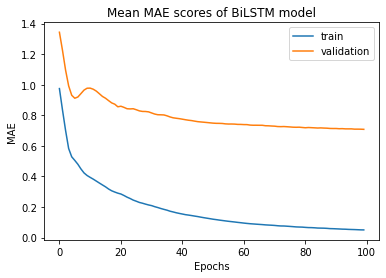

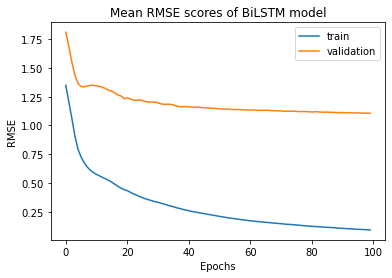

In [167]:
visualize_performance(results_inc_tcmt_sat_cpt_x)

Optimal Mean MAE: 0.6925769986584782 @ epoch 97
Optimal Mean RMSE: 1.1012523113749921 @ epoch 99


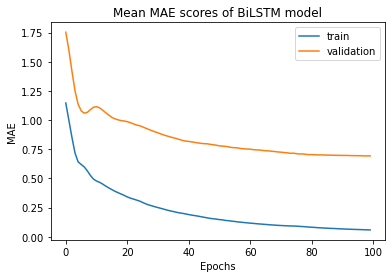

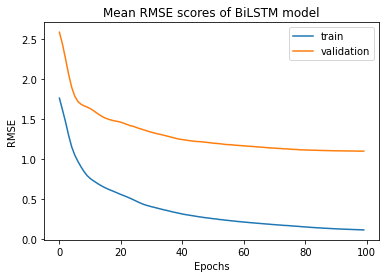

In [168]:
visualize_performance(results_inc_tcmt_sat_cpt_y)

Optimal Mean MAE: 0.687034147977829 @ epoch 98
Optimal Mean RMSE: 1.0764977513812481 @ epoch 97


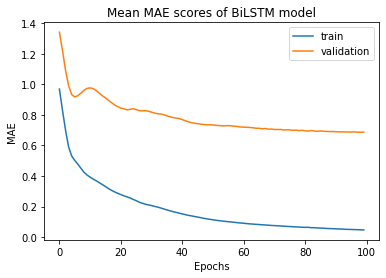

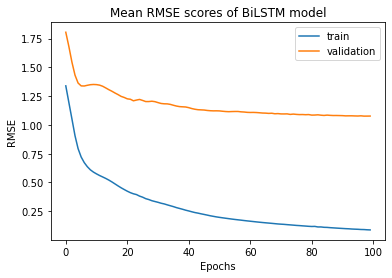

In [169]:
visualize_performance(results_inc_tcmt_sat_cpt_z)

### CPT <- Satellite (incremental)

In [146]:
results_inc_cpt_sat_x = incremental_fusion('CPT', 'X')
results_inc_cpt_sat_y = incremental_fusion('CPT', 'Y')
results_inc_cpt_sat_z = incremental_fusion('CPT', 'Z')

Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 6.6290 - mean_absolute_error: 1.9268 - root_mean_squared_error: 2.5747 - val_loss: 10.2810 - val_mean_absolute_error: 2.5826 - val_root_mean_squared_error: 3.2064
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 5.2747 - mean_absolute_error: 1.6474 - root_mean_squared_error: 2.2967 - val_loss: 9.0838 - val_mean_absolute_error: 2.3860 - val_root_mean_squared_error: 3.0139
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 4.1537 - mean_absolute_error: 1.3706 - root_mean_squared_error: 2.0381 - val_loss: 8.0015 - val_mean_absolute_error: 2.1966 - val_root_mean_squared_error: 2.8287
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 3.1782 - mean_absolute_error: 1.1463 - root_mean_squared_error: 1.7827 - val_loss: 7.2540 - val_mean_absolute_error: 2.0484 - val_root_mean_squared_error: 2.6933
Epoch 5/100
1/1 [==============================] - 0s 49ms/step -

Epoch 36/100
1/1 [==============================] - 0s 62ms/step - loss: 0.5251 - mean_absolute_error: 0.3835 - root_mean_squared_error: 0.7247 - val_loss: 7.6925 - val_mean_absolute_error: 2.0294 - val_root_mean_squared_error: 2.7735
Epoch 37/100
1/1 [==============================] - 0s 59ms/step - loss: 0.5062 - mean_absolute_error: 0.3704 - root_mean_squared_error: 0.7114 - val_loss: 7.5619 - val_mean_absolute_error: 2.0078 - val_root_mean_squared_error: 2.7499
Epoch 38/100
1/1 [==============================] - 0s 64ms/step - loss: 0.4887 - mean_absolute_error: 0.3663 - root_mean_squared_error: 0.6990 - val_loss: 7.4752 - val_mean_absolute_error: 1.9938 - val_root_mean_squared_error: 2.7341
Epoch 39/100
1/1 [==============================] - 0s 62ms/step - loss: 0.4690 - mean_absolute_error: 0.3485 - root_mean_squared_error: 0.6849 - val_loss: 7.3974 - val_mean_absolute_error: 1.9814 - val_root_mean_squared_error: 2.7198
Epoch 40/100
1/1 [==============================] - 0s 65ms/

Epoch 71/100
1/1 [==============================] - 0s 64ms/step - loss: 0.2253 - mean_absolute_error: 0.2105 - root_mean_squared_error: 0.4746 - val_loss: 5.9536 - val_mean_absolute_error: 1.7421 - val_root_mean_squared_error: 2.4400
Epoch 72/100
1/1 [==============================] - 0s 64ms/step - loss: 0.2199 - mean_absolute_error: 0.2060 - root_mean_squared_error: 0.4689 - val_loss: 5.9456 - val_mean_absolute_error: 1.7407 - val_root_mean_squared_error: 2.4384
Epoch 73/100
1/1 [==============================] - 0s 65ms/step - loss: 0.2136 - mean_absolute_error: 0.2013 - root_mean_squared_error: 0.4621 - val_loss: 5.9081 - val_mean_absolute_error: 1.7327 - val_root_mean_squared_error: 2.4307
Epoch 74/100
1/1 [==============================] - 0s 60ms/step - loss: 0.2070 - mean_absolute_error: 0.1975 - root_mean_squared_error: 0.4549 - val_loss: 5.9018 - val_mean_absolute_error: 1.7335 - val_root_mean_squared_error: 2.4294
Epoch 75/100
1/1 [==============================] - 0s 63ms/

Epoch 6/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2111 - mean_absolute_error: 0.3519 - root_mean_squared_error: 0.4595 - val_loss: 0.4941 - val_mean_absolute_error: 0.4828 - val_root_mean_squared_error: 0.7029
Epoch 7/100
1/1 [==============================] - 0s 58ms/step - loss: 0.1779 - mean_absolute_error: 0.3157 - root_mean_squared_error: 0.4218 - val_loss: 0.5074 - val_mean_absolute_error: 0.5067 - val_root_mean_squared_error: 0.7124
Epoch 8/100
1/1 [==============================] - 0s 63ms/step - loss: 0.1527 - mean_absolute_error: 0.2902 - root_mean_squared_error: 0.3908 - val_loss: 0.5488 - val_mean_absolute_error: 0.5516 - val_root_mean_squared_error: 0.7408
Epoch 9/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1443 - mean_absolute_error: 0.2848 - root_mean_squared_error: 0.3798 - val_loss: 0.5656 - val_mean_absolute_error: 0.5710 - val_root_mean_squared_error: 0.7520
Epoch 10/100
1/1 [==============================] - 0s 53ms/step

Epoch 41/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0126 - mean_absolute_error: 0.0788 - root_mean_squared_error: 0.1121 - val_loss: 0.2192 - val_mean_absolute_error: 0.3224 - val_root_mean_squared_error: 0.4682
Epoch 42/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0119 - mean_absolute_error: 0.0759 - root_mean_squared_error: 0.1089 - val_loss: 0.2213 - val_mean_absolute_error: 0.3254 - val_root_mean_squared_error: 0.4704
Epoch 43/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0116 - mean_absolute_error: 0.0744 - root_mean_squared_error: 0.1077 - val_loss: 0.2135 - val_mean_absolute_error: 0.3134 - val_root_mean_squared_error: 0.4620
Epoch 44/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0111 - mean_absolute_error: 0.0739 - root_mean_squared_error: 0.1054 - val_loss: 0.2142 - val_mean_absolute_error: 0.3147 - val_root_mean_squared_error: 0.4628
Epoch 45/100
1/1 [==============================] - 0s 59ms/

Epoch 76/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0050 - mean_absolute_error: 0.0454 - root_mean_squared_error: 0.0708 - val_loss: 0.1912 - val_mean_absolute_error: 0.2855 - val_root_mean_squared_error: 0.4373
Epoch 77/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0051 - mean_absolute_error: 0.0459 - root_mean_squared_error: 0.0716 - val_loss: 0.1838 - val_mean_absolute_error: 0.2684 - val_root_mean_squared_error: 0.4287
Epoch 78/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0057 - mean_absolute_error: 0.0509 - root_mean_squared_error: 0.0757 - val_loss: 0.1928 - val_mean_absolute_error: 0.2885 - val_root_mean_squared_error: 0.4391
Epoch 79/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0053 - mean_absolute_error: 0.0469 - root_mean_squared_error: 0.0729 - val_loss: 0.1870 - val_mean_absolute_error: 0.2764 - val_root_mean_squared_error: 0.4324
Epoch 80/100
1/1 [==============================] - 0s 55ms/

Epoch 11/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2240 - mean_absolute_error: 0.3376 - root_mean_squared_error: 0.4733 - val_loss: 0.7999 - val_mean_absolute_error: 0.6473 - val_root_mean_squared_error: 0.8944
Epoch 12/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2125 - mean_absolute_error: 0.3278 - root_mean_squared_error: 0.4610 - val_loss: 0.7812 - val_mean_absolute_error: 0.6381 - val_root_mean_squared_error: 0.8839
Epoch 13/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2053 - mean_absolute_error: 0.3188 - root_mean_squared_error: 0.4531 - val_loss: 0.7611 - val_mean_absolute_error: 0.6274 - val_root_mean_squared_error: 0.8724
Epoch 14/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1999 - mean_absolute_error: 0.3110 - root_mean_squared_error: 0.4471 - val_loss: 0.7414 - val_mean_absolute_error: 0.6167 - val_root_mean_squared_error: 0.8610
Epoch 15/100
1/1 [==============================] - 0s 50ms/

Epoch 46/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1275 - mean_absolute_error: 0.2252 - root_mean_squared_error: 0.3571 - val_loss: 0.6473 - val_mean_absolute_error: 0.5678 - val_root_mean_squared_error: 0.8046
Epoch 47/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1239 - mean_absolute_error: 0.2205 - root_mean_squared_error: 0.3519 - val_loss: 0.6316 - val_mean_absolute_error: 0.5566 - val_root_mean_squared_error: 0.7947
Epoch 48/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1206 - mean_absolute_error: 0.2193 - root_mean_squared_error: 0.3473 - val_loss: 0.6403 - val_mean_absolute_error: 0.5658 - val_root_mean_squared_error: 0.8002
Epoch 49/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1168 - mean_absolute_error: 0.2135 - root_mean_squared_error: 0.3417 - val_loss: 0.6094 - val_mean_absolute_error: 0.5437 - val_root_mean_squared_error: 0.7806
Epoch 50/100
1/1 [==============================] - 0s 51ms/

Epoch 81/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0178 - mean_absolute_error: 0.0940 - root_mean_squared_error: 0.1332 - val_loss: 0.4369 - val_mean_absolute_error: 0.4767 - val_root_mean_squared_error: 0.6610
Epoch 82/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0376 - mean_absolute_error: 0.1354 - root_mean_squared_error: 0.1939 - val_loss: 0.2874 - val_mean_absolute_error: 0.3822 - val_root_mean_squared_error: 0.5361
Epoch 83/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0182 - mean_absolute_error: 0.0940 - root_mean_squared_error: 0.1349 - val_loss: 0.2640 - val_mean_absolute_error: 0.3658 - val_root_mean_squared_error: 0.5138
Epoch 84/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0291 - mean_absolute_error: 0.1183 - root_mean_squared_error: 0.1706 - val_loss: 0.3338 - val_mean_absolute_error: 0.4135 - val_root_mean_squared_error: 0.5777
Epoch 85/100
1/1 [==============================] - 0s 53ms/

Epoch 16/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0932 - mean_absolute_error: 0.2116 - root_mean_squared_error: 0.3053 - val_loss: 0.8105 - val_mean_absolute_error: 0.4850 - val_root_mean_squared_error: 0.9003
Epoch 17/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0842 - mean_absolute_error: 0.1989 - root_mean_squared_error: 0.2902 - val_loss: 0.7976 - val_mean_absolute_error: 0.4680 - val_root_mean_squared_error: 0.8931
Epoch 18/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0784 - mean_absolute_error: 0.1921 - root_mean_squared_error: 0.2799 - val_loss: 0.7961 - val_mean_absolute_error: 0.4639 - val_root_mean_squared_error: 0.8923
Epoch 19/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0747 - mean_absolute_error: 0.1881 - root_mean_squared_error: 0.2733 - val_loss: 0.7982 - val_mean_absolute_error: 0.4645 - val_root_mean_squared_error: 0.8934
Epoch 20/100
1/1 [==============================] - 0s 53ms/

Epoch 51/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0066 - mean_absolute_error: 0.0619 - root_mean_squared_error: 0.0810 - val_loss: 0.7257 - val_mean_absolute_error: 0.4398 - val_root_mean_squared_error: 0.8519
Epoch 52/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0069 - mean_absolute_error: 0.0620 - root_mean_squared_error: 0.0831 - val_loss: 0.7451 - val_mean_absolute_error: 0.4598 - val_root_mean_squared_error: 0.8632
Epoch 53/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0060 - mean_absolute_error: 0.0588 - root_mean_squared_error: 0.0775 - val_loss: 0.7401 - val_mean_absolute_error: 0.4544 - val_root_mean_squared_error: 0.8603
Epoch 54/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0054 - mean_absolute_error: 0.0558 - root_mean_squared_error: 0.0735 - val_loss: 0.7208 - val_mean_absolute_error: 0.4335 - val_root_mean_squared_error: 0.8490
Epoch 55/100
1/1 [==============================] - 0s 57ms/

Epoch 86/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0018 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0420 - val_loss: 0.7125 - val_mean_absolute_error: 0.4224 - val_root_mean_squared_error: 0.8441
Epoch 87/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0018 - mean_absolute_error: 0.0320 - root_mean_squared_error: 0.0421 - val_loss: 0.7026 - val_mean_absolute_error: 0.4101 - val_root_mean_squared_error: 0.8382
Epoch 88/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0018 - mean_absolute_error: 0.0318 - root_mean_squared_error: 0.0422 - val_loss: 0.7121 - val_mean_absolute_error: 0.4219 - val_root_mean_squared_error: 0.8438
Epoch 89/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0018 - mean_absolute_error: 0.0318 - root_mean_squared_error: 0.0423 - val_loss: 0.7000 - val_mean_absolute_error: 0.4066 - val_root_mean_squared_error: 0.8367
Epoch 90/100
1/1 [==============================] - 0s 49ms/

Epoch 21/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2512 - mean_absolute_error: 0.3450 - root_mean_squared_error: 0.5012 - val_loss: 1.2522 - val_mean_absolute_error: 0.7820 - val_root_mean_squared_error: 1.1190
Epoch 22/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2457 - mean_absolute_error: 0.3397 - root_mean_squared_error: 0.4957 - val_loss: 1.2328 - val_mean_absolute_error: 0.7830 - val_root_mean_squared_error: 1.1103
Epoch 23/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2416 - mean_absolute_error: 0.3345 - root_mean_squared_error: 0.4915 - val_loss: 1.2235 - val_mean_absolute_error: 0.7869 - val_root_mean_squared_error: 1.1061
Epoch 24/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2383 - mean_absolute_error: 0.3300 - root_mean_squared_error: 0.4882 - val_loss: 1.2255 - val_mean_absolute_error: 0.7930 - val_root_mean_squared_error: 1.1070
Epoch 25/100
1/1 [==============================] - 0s 61ms/

Epoch 56/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1078 - mean_absolute_error: 0.2224 - root_mean_squared_error: 0.3284 - val_loss: 1.5507 - val_mean_absolute_error: 0.8903 - val_root_mean_squared_error: 1.2453
Epoch 57/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1033 - mean_absolute_error: 0.2185 - root_mean_squared_error: 0.3214 - val_loss: 1.5880 - val_mean_absolute_error: 0.8991 - val_root_mean_squared_error: 1.2602
Epoch 58/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0988 - mean_absolute_error: 0.2145 - root_mean_squared_error: 0.3143 - val_loss: 1.6011 - val_mean_absolute_error: 0.9028 - val_root_mean_squared_error: 1.2653
Epoch 59/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0943 - mean_absolute_error: 0.2099 - root_mean_squared_error: 0.3072 - val_loss: 1.6246 - val_mean_absolute_error: 0.9086 - val_root_mean_squared_error: 1.2746
Epoch 60/100
1/1 [==============================] - 0s 51ms/

Epoch 91/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0133 - mean_absolute_error: 0.0791 - root_mean_squared_error: 0.1152 - val_loss: 1.5152 - val_mean_absolute_error: 0.8271 - val_root_mean_squared_error: 1.2310
Epoch 92/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0131 - mean_absolute_error: 0.0776 - root_mean_squared_error: 0.1143 - val_loss: 1.6173 - val_mean_absolute_error: 0.8594 - val_root_mean_squared_error: 1.2717
Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0127 - mean_absolute_error: 0.0773 - root_mean_squared_error: 0.1127 - val_loss: 1.5018 - val_mean_absolute_error: 0.8209 - val_root_mean_squared_error: 1.2255
Epoch 94/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0118 - mean_absolute_error: 0.0735 - root_mean_squared_error: 0.1084 - val_loss: 1.5611 - val_mean_absolute_error: 0.8395 - val_root_mean_squared_error: 1.2494
Epoch 95/100
1/1 [==============================] - 0s 48ms/

Epoch 26/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0689 - mean_absolute_error: 0.1792 - root_mean_squared_error: 0.2624 - val_loss: 1.5803 - val_mean_absolute_error: 0.7907 - val_root_mean_squared_error: 1.2571
Epoch 27/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0724 - mean_absolute_error: 0.1914 - root_mean_squared_error: 0.2690 - val_loss: 1.5732 - val_mean_absolute_error: 0.7885 - val_root_mean_squared_error: 1.2543
Epoch 28/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0621 - mean_absolute_error: 0.1745 - root_mean_squared_error: 0.2491 - val_loss: 1.5813 - val_mean_absolute_error: 0.8281 - val_root_mean_squared_error: 1.2575
Epoch 29/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0792 - mean_absolute_error: 0.1985 - root_mean_squared_error: 0.2814 - val_loss: 1.5775 - val_mean_absolute_error: 0.7816 - val_root_mean_squared_error: 1.2560
Epoch 30/100
1/1 [==============================] - 0s 67ms/

Epoch 61/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0049 - mean_absolute_error: 0.0517 - root_mean_squared_error: 0.0703 - val_loss: 1.6680 - val_mean_absolute_error: 0.6952 - val_root_mean_squared_error: 1.2915
Epoch 62/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0048 - mean_absolute_error: 0.0510 - root_mean_squared_error: 0.0695 - val_loss: 1.6857 - val_mean_absolute_error: 0.6889 - val_root_mean_squared_error: 1.2983
Epoch 63/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0041 - mean_absolute_error: 0.0475 - root_mean_squared_error: 0.0643 - val_loss: 1.6686 - val_mean_absolute_error: 0.6947 - val_root_mean_squared_error: 1.2918
Epoch 64/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0036 - mean_absolute_error: 0.0437 - root_mean_squared_error: 0.0598 - val_loss: 1.6553 - val_mean_absolute_error: 0.6990 - val_root_mean_squared_error: 1.2866
Epoch 65/100
1/1 [==============================] - 0s 54ms/

Epoch 96/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0021 - mean_absolute_error: 0.0305 - root_mean_squared_error: 0.0454 - val_loss: 1.6785 - val_mean_absolute_error: 0.6833 - val_root_mean_squared_error: 1.2956
Epoch 97/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0021 - mean_absolute_error: 0.0307 - root_mean_squared_error: 0.0455 - val_loss: 1.6737 - val_mean_absolute_error: 0.6860 - val_root_mean_squared_error: 1.2937
Epoch 98/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0021 - mean_absolute_error: 0.0306 - root_mean_squared_error: 0.0455 - val_loss: 1.6800 - val_mean_absolute_error: 0.6823 - val_root_mean_squared_error: 1.2961
Epoch 99/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0021 - mean_absolute_error: 0.0309 - root_mean_squared_error: 0.0456 - val_loss: 1.6738 - val_mean_absolute_error: 0.6858 - val_root_mean_squared_error: 1.2938
Epoch 100/100
1/1 [==============================] - 0s 62ms

Epoch 31/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0123 - mean_absolute_error: 0.0782 - root_mean_squared_error: 0.1110 - val_loss: 0.8442 - val_mean_absolute_error: 0.6378 - val_root_mean_squared_error: 0.9188
Epoch 32/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0116 - mean_absolute_error: 0.0762 - root_mean_squared_error: 0.1078 - val_loss: 0.8125 - val_mean_absolute_error: 0.6241 - val_root_mean_squared_error: 0.9014
Epoch 33/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0106 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1031 - val_loss: 0.7831 - val_mean_absolute_error: 0.6112 - val_root_mean_squared_error: 0.8849
Epoch 34/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0102 - mean_absolute_error: 0.0697 - root_mean_squared_error: 0.1008 - val_loss: 0.7903 - val_mean_absolute_error: 0.6138 - val_root_mean_squared_error: 0.8890
Epoch 35/100
1/1 [==============================] - 0s 65ms/

Epoch 66/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0014 - mean_absolute_error: 0.0248 - root_mean_squared_error: 0.0368 - val_loss: 0.7165 - val_mean_absolute_error: 0.5833 - val_root_mean_squared_error: 0.8465
Epoch 67/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0013 - mean_absolute_error: 0.0241 - root_mean_squared_error: 0.0358 - val_loss: 0.7208 - val_mean_absolute_error: 0.5854 - val_root_mean_squared_error: 0.8490
Epoch 68/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0012 - mean_absolute_error: 0.0234 - root_mean_squared_error: 0.0346 - val_loss: 0.7200 - val_mean_absolute_error: 0.5852 - val_root_mean_squared_error: 0.8485
Epoch 69/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0011 - mean_absolute_error: 0.0227 - root_mean_squared_error: 0.0336 - val_loss: 0.7147 - val_mean_absolute_error: 0.5831 - val_root_mean_squared_error: 0.8454
Epoch 70/100
1/1 [==============================] - 0s 68ms/

Epoch 35/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0375 - mean_absolute_error: 0.1208 - root_mean_squared_error: 0.1936 - val_loss: 0.7551 - val_mean_absolute_error: 0.5361 - val_root_mean_squared_error: 0.8690
Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0364 - mean_absolute_error: 0.1185 - root_mean_squared_error: 0.1908 - val_loss: 0.7494 - val_mean_absolute_error: 0.5357 - val_root_mean_squared_error: 0.8657
Epoch 37/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0359 - mean_absolute_error: 0.1179 - root_mean_squared_error: 0.1895 - val_loss: 0.7432 - val_mean_absolute_error: 0.5266 - val_root_mean_squared_error: 0.8621
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0352 - mean_absolute_error: 0.1162 - root_mean_squared_error: 0.1876 - val_loss: 0.7376 - val_mean_absolute_error: 0.5291 - val_root_mean_squared_error: 0.8588
Epoch 39/100
1/1 [==============================] - 0s 47ms/

Epoch 70/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0161 - mean_absolute_error: 0.0758 - root_mean_squared_error: 0.1268 - val_loss: 0.7332 - val_mean_absolute_error: 0.5257 - val_root_mean_squared_error: 0.8563
Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0146 - mean_absolute_error: 0.0709 - root_mean_squared_error: 0.1210 - val_loss: 0.7345 - val_mean_absolute_error: 0.5201 - val_root_mean_squared_error: 0.8570
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0151 - mean_absolute_error: 0.0759 - root_mean_squared_error: 0.1228 - val_loss: 0.7354 - val_mean_absolute_error: 0.5334 - val_root_mean_squared_error: 0.8576
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0149 - mean_absolute_error: 0.0752 - root_mean_squared_error: 0.1221 - val_loss: 0.7358 - val_mean_absolute_error: 0.5222 - val_root_mean_squared_error: 0.8578
Epoch 74/100
1/1 [==============================] - 0s 54ms/

Epoch 5/100
1/1 [==============================] - 0s 51ms/step - loss: 2.5806 - mean_absolute_error: 0.9174 - root_mean_squared_error: 1.6064 - val_loss: 9.6342 - val_mean_absolute_error: 2.1613 - val_root_mean_squared_error: 3.1039
Epoch 6/100
1/1 [==============================] - 0s 52ms/step - loss: 2.4474 - mean_absolute_error: 0.9370 - root_mean_squared_error: 1.5644 - val_loss: 9.1376 - val_mean_absolute_error: 2.1100 - val_root_mean_squared_error: 3.0228
Epoch 7/100
1/1 [==============================] - 0s 49ms/step - loss: 2.3497 - mean_absolute_error: 0.9245 - root_mean_squared_error: 1.5329 - val_loss: 8.9970 - val_mean_absolute_error: 2.1069 - val_root_mean_squared_error: 2.9995
Epoch 8/100
1/1 [==============================] - 0s 51ms/step - loss: 2.2448 - mean_absolute_error: 0.8776 - root_mean_squared_error: 1.4983 - val_loss: 9.0643 - val_mean_absolute_error: 2.1375 - val_root_mean_squared_error: 3.0107
Epoch 9/100
1/1 [==============================] - 0s 58ms/step 

Epoch 40/100
1/1 [==============================] - 0s 71ms/step - loss: 0.2291 - mean_absolute_error: 0.2904 - root_mean_squared_error: 0.4786 - val_loss: 6.3973 - val_mean_absolute_error: 1.8530 - val_root_mean_squared_error: 2.5293
Epoch 41/100
1/1 [==============================] - 0s 65ms/step - loss: 0.2220 - mean_absolute_error: 0.2835 - root_mean_squared_error: 0.4711 - val_loss: 6.3821 - val_mean_absolute_error: 1.8459 - val_root_mean_squared_error: 2.5263
Epoch 42/100
1/1 [==============================] - 0s 63ms/step - loss: 0.1996 - mean_absolute_error: 0.2686 - root_mean_squared_error: 0.4467 - val_loss: 6.3935 - val_mean_absolute_error: 1.8429 - val_root_mean_squared_error: 2.5285
Epoch 43/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1921 - mean_absolute_error: 0.2604 - root_mean_squared_error: 0.4383 - val_loss: 6.3837 - val_mean_absolute_error: 1.8409 - val_root_mean_squared_error: 2.5266
Epoch 44/100
1/1 [==============================] - 0s 61ms/

Epoch 75/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0238 - mean_absolute_error: 0.0732 - root_mean_squared_error: 0.1542 - val_loss: 6.6454 - val_mean_absolute_error: 1.8565 - val_root_mean_squared_error: 2.5779
Epoch 76/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0222 - mean_absolute_error: 0.0705 - root_mean_squared_error: 0.1490 - val_loss: 6.6507 - val_mean_absolute_error: 1.8570 - val_root_mean_squared_error: 2.5789
Epoch 77/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0210 - mean_absolute_error: 0.0682 - root_mean_squared_error: 0.1448 - val_loss: 6.6577 - val_mean_absolute_error: 1.8579 - val_root_mean_squared_error: 2.5803
Epoch 78/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0197 - mean_absolute_error: 0.0654 - root_mean_squared_error: 0.1402 - val_loss: 6.6600 - val_mean_absolute_error: 1.8582 - val_root_mean_squared_error: 2.5807
Epoch 79/100
1/1 [==============================] - 0s 63ms/

Epoch 10/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0719 - mean_absolute_error: 0.1923 - root_mean_squared_error: 0.2681 - val_loss: 1.7500 - val_mean_absolute_error: 0.7370 - val_root_mean_squared_error: 1.3229
Epoch 11/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0578 - mean_absolute_error: 0.1707 - root_mean_squared_error: 0.2404 - val_loss: 1.7250 - val_mean_absolute_error: 0.7173 - val_root_mean_squared_error: 1.3134
Epoch 12/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0499 - mean_absolute_error: 0.1598 - root_mean_squared_error: 0.2233 - val_loss: 1.7062 - val_mean_absolute_error: 0.7096 - val_root_mean_squared_error: 1.3062
Epoch 13/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0450 - mean_absolute_error: 0.1555 - root_mean_squared_error: 0.2121 - val_loss: 1.6962 - val_mean_absolute_error: 0.7039 - val_root_mean_squared_error: 1.3024
Epoch 14/100
1/1 [==============================] - 0s 51ms/

Epoch 45/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0040 - mean_absolute_error: 0.0438 - root_mean_squared_error: 0.0630 - val_loss: 1.6735 - val_mean_absolute_error: 0.6244 - val_root_mean_squared_error: 1.2936
Epoch 46/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0037 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0611 - val_loss: 1.6726 - val_mean_absolute_error: 0.6250 - val_root_mean_squared_error: 1.2933
Epoch 47/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0035 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0591 - val_loss: 1.6721 - val_mean_absolute_error: 0.6247 - val_root_mean_squared_error: 1.2931
Epoch 48/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0033 - mean_absolute_error: 0.0393 - root_mean_squared_error: 0.0572 - val_loss: 1.6718 - val_mean_absolute_error: 0.6232 - val_root_mean_squared_error: 1.2930
Epoch 49/100
1/1 [==============================] - 0s 82ms/

Epoch 80/100
1/1 [==============================] - 0s 67ms/step - loss: 9.5818e-04 - mean_absolute_error: 0.0217 - root_mean_squared_error: 0.0310 - val_loss: 1.6675 - val_mean_absolute_error: 0.6196 - val_root_mean_squared_error: 1.2913
Epoch 81/100
1/1 [==============================] - 0s 60ms/step - loss: 9.9214e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0315 - val_loss: 1.6711 - val_mean_absolute_error: 0.6108 - val_root_mean_squared_error: 1.2927
Epoch 82/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0011 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0330 - val_loss: 1.6659 - val_mean_absolute_error: 0.6231 - val_root_mean_squared_error: 1.2907
Epoch 83/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0012 - mean_absolute_error: 0.0249 - root_mean_squared_error: 0.0350 - val_loss: 1.6718 - val_mean_absolute_error: 0.6086 - val_root_mean_squared_error: 1.2930
Epoch 84/100
1/1 [==============================] - 

Epoch 15/100
1/1 [==============================] - 0s 68ms/step - loss: 0.7095 - mean_absolute_error: 0.5981 - root_mean_squared_error: 0.8423 - val_loss: 1.9956 - val_mean_absolute_error: 1.0640 - val_root_mean_squared_error: 1.4127
Epoch 16/100
1/1 [==============================] - 0s 65ms/step - loss: 0.6785 - mean_absolute_error: 0.5787 - root_mean_squared_error: 0.8237 - val_loss: 1.8825 - val_mean_absolute_error: 1.0234 - val_root_mean_squared_error: 1.3720
Epoch 17/100
1/1 [==============================] - 0s 60ms/step - loss: 0.6439 - mean_absolute_error: 0.5569 - root_mean_squared_error: 0.8024 - val_loss: 1.7657 - val_mean_absolute_error: 0.9778 - val_root_mean_squared_error: 1.3288
Epoch 18/100
1/1 [==============================] - 0s 63ms/step - loss: 0.6147 - mean_absolute_error: 0.5397 - root_mean_squared_error: 0.7840 - val_loss: 1.6653 - val_mean_absolute_error: 0.9371 - val_root_mean_squared_error: 1.2905
Epoch 19/100
1/1 [==============================] - 0s 60ms/

Epoch 50/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2673 - mean_absolute_error: 0.3078 - root_mean_squared_error: 0.5170 - val_loss: 1.5057 - val_mean_absolute_error: 0.8828 - val_root_mean_squared_error: 1.2271
Epoch 51/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2968 - mean_absolute_error: 0.3550 - root_mean_squared_error: 0.5448 - val_loss: 1.2647 - val_mean_absolute_error: 0.7115 - val_root_mean_squared_error: 1.1246
Epoch 52/100
1/1 [==============================] - 0s 63ms/step - loss: 0.3325 - mean_absolute_error: 0.3891 - root_mean_squared_error: 0.5766 - val_loss: 1.3917 - val_mean_absolute_error: 0.8076 - val_root_mean_squared_error: 1.1797
Epoch 53/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2417 - mean_absolute_error: 0.2930 - root_mean_squared_error: 0.4916 - val_loss: 1.6145 - val_mean_absolute_error: 0.9240 - val_root_mean_squared_error: 1.2706
Epoch 54/100
1/1 [==============================] - 0s 53ms/

Epoch 85/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0591 - mean_absolute_error: 0.1339 - root_mean_squared_error: 0.2432 - val_loss: 1.4008 - val_mean_absolute_error: 0.7650 - val_root_mean_squared_error: 1.1835
Epoch 86/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0566 - mean_absolute_error: 0.1307 - root_mean_squared_error: 0.2380 - val_loss: 1.4073 - val_mean_absolute_error: 0.7857 - val_root_mean_squared_error: 1.1863
Epoch 87/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0570 - mean_absolute_error: 0.1327 - root_mean_squared_error: 0.2388 - val_loss: 1.3923 - val_mean_absolute_error: 0.7679 - val_root_mean_squared_error: 1.1800
Epoch 88/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0526 - mean_absolute_error: 0.1254 - root_mean_squared_error: 0.2294 - val_loss: 1.3806 - val_mean_absolute_error: 0.7501 - val_root_mean_squared_error: 1.1750
Epoch 89/100
1/1 [==============================] - 0s 62ms/

Epoch 20/100
1/1 [==============================] - 0s 52ms/step - loss: 1.1892 - mean_absolute_error: 0.7042 - root_mean_squared_error: 1.0905 - val_loss: 3.9166 - val_mean_absolute_error: 1.4726 - val_root_mean_squared_error: 1.9790
Epoch 21/100
1/1 [==============================] - 0s 57ms/step - loss: 1.1248 - mean_absolute_error: 0.6787 - root_mean_squared_error: 1.0605 - val_loss: 3.9050 - val_mean_absolute_error: 1.4628 - val_root_mean_squared_error: 1.9761
Epoch 22/100
1/1 [==============================] - 0s 51ms/step - loss: 1.0662 - mean_absolute_error: 0.6546 - root_mean_squared_error: 1.0326 - val_loss: 3.9087 - val_mean_absolute_error: 1.4615 - val_root_mean_squared_error: 1.9770
Epoch 23/100
1/1 [==============================] - 0s 50ms/step - loss: 1.0085 - mean_absolute_error: 0.6313 - root_mean_squared_error: 1.0042 - val_loss: 3.9266 - val_mean_absolute_error: 1.4694 - val_root_mean_squared_error: 1.9816
Epoch 24/100
1/1 [==============================] - 0s 61ms/

Epoch 55/100
1/1 [==============================] - 0s 74ms/step - loss: 0.1178 - mean_absolute_error: 0.2191 - root_mean_squared_error: 0.3432 - val_loss: 3.5688 - val_mean_absolute_error: 1.4040 - val_root_mean_squared_error: 1.8891
Epoch 56/100
1/1 [==============================] - 0s 71ms/step - loss: 0.1133 - mean_absolute_error: 0.2138 - root_mean_squared_error: 0.3366 - val_loss: 3.5742 - val_mean_absolute_error: 1.4068 - val_root_mean_squared_error: 1.8906
Epoch 57/100
1/1 [==============================] - 0s 90ms/step - loss: 0.1090 - mean_absolute_error: 0.2090 - root_mean_squared_error: 0.3301 - val_loss: 3.5807 - val_mean_absolute_error: 1.4090 - val_root_mean_squared_error: 1.8923
Epoch 58/100
1/1 [==============================] - 0s 92ms/step - loss: 0.1048 - mean_absolute_error: 0.2044 - root_mean_squared_error: 0.3237 - val_loss: 3.5831 - val_mean_absolute_error: 1.4095 - val_root_mean_squared_error: 1.8929
Epoch 59/100
1/1 [==============================] - 0s 76ms/

Epoch 90/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0295 - mean_absolute_error: 0.0957 - root_mean_squared_error: 0.1718 - val_loss: 3.4740 - val_mean_absolute_error: 1.3734 - val_root_mean_squared_error: 1.8639
Epoch 91/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0284 - mean_absolute_error: 0.0936 - root_mean_squared_error: 0.1684 - val_loss: 3.4684 - val_mean_absolute_error: 1.3722 - val_root_mean_squared_error: 1.8624
Epoch 92/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0272 - mean_absolute_error: 0.0914 - root_mean_squared_error: 0.1651 - val_loss: 3.4634 - val_mean_absolute_error: 1.3712 - val_root_mean_squared_error: 1.8610
Epoch 93/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0262 - mean_absolute_error: 0.0893 - root_mean_squared_error: 0.1618 - val_loss: 3.4578 - val_mean_absolute_error: 1.3700 - val_root_mean_squared_error: 1.8595
Epoch 94/100
1/1 [==============================] - 0s 52ms/

Epoch 25/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0022 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0464 - val_loss: 0.0139 - val_mean_absolute_error: 0.0905 - val_root_mean_squared_error: 0.1179
Epoch 26/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0020 - mean_absolute_error: 0.0338 - root_mean_squared_error: 0.0451 - val_loss: 0.0118 - val_mean_absolute_error: 0.0835 - val_root_mean_squared_error: 0.1084
Epoch 27/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0018 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0421 - val_loss: 0.0085 - val_mean_absolute_error: 0.0710 - val_root_mean_squared_error: 0.0924
Epoch 28/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0017 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0413 - val_loss: 0.0093 - val_mean_absolute_error: 0.0743 - val_root_mean_squared_error: 0.0964
Epoch 29/100
1/1 [==============================] - 0s 53ms/

1/1 [==============================] - 0s 57ms/step - loss: 2.8282e-04 - mean_absolute_error: 0.0125 - root_mean_squared_error: 0.0168 - val_loss: 0.0024 - val_mean_absolute_error: 0.0370 - val_root_mean_squared_error: 0.0492
Epoch 94/100
1/1 [==============================] - 0s 60ms/step - loss: 2.3162e-04 - mean_absolute_error: 0.0110 - root_mean_squared_error: 0.0152 - val_loss: 0.0022 - val_mean_absolute_error: 0.0350 - val_root_mean_squared_error: 0.0467
Epoch 95/100
1/1 [==============================] - 0s 50ms/step - loss: 2.0305e-04 - mean_absolute_error: 0.0104 - root_mean_squared_error: 0.0142 - val_loss: 0.0013 - val_mean_absolute_error: 0.0269 - val_root_mean_squared_error: 0.0364
Epoch 96/100
1/1 [==============================] - 0s 49ms/step - loss: 2.6205e-04 - mean_absolute_error: 0.0120 - root_mean_squared_error: 0.0162 - val_loss: 0.0020 - val_mean_absolute_error: 0.0335 - val_root_mean_squared_error: 0.0448
Epoch 97/100
1/1 [==============================] - 0s 52

Epoch 28/100
1/1 [==============================] - 0s 60ms/step - loss: 0.1318 - mean_absolute_error: 0.2562 - root_mean_squared_error: 0.3630 - val_loss: 5.3052 - val_mean_absolute_error: 1.5317 - val_root_mean_squared_error: 2.3033
Epoch 29/100
1/1 [==============================] - 0s 64ms/step - loss: 0.1245 - mean_absolute_error: 0.2488 - root_mean_squared_error: 0.3529 - val_loss: 5.1126 - val_mean_absolute_error: 1.5119 - val_root_mean_squared_error: 2.2611
Epoch 30/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1155 - mean_absolute_error: 0.2344 - root_mean_squared_error: 0.3398 - val_loss: 5.3205 - val_mean_absolute_error: 1.5392 - val_root_mean_squared_error: 2.3066
Epoch 31/100
1/1 [==============================] - 0s 58ms/step - loss: 0.1023 - mean_absolute_error: 0.2215 - root_mean_squared_error: 0.3198 - val_loss: 5.5017 - val_mean_absolute_error: 1.5658 - val_root_mean_squared_error: 2.3456
Epoch 32/100
1/1 [==============================] - 0s 60ms/

Epoch 63/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0127 - mean_absolute_error: 0.0718 - root_mean_squared_error: 0.1127 - val_loss: 5.7264 - val_mean_absolute_error: 1.5897 - val_root_mean_squared_error: 2.3930
Epoch 64/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0121 - mean_absolute_error: 0.0699 - root_mean_squared_error: 0.1101 - val_loss: 5.7669 - val_mean_absolute_error: 1.5958 - val_root_mean_squared_error: 2.4014
Epoch 65/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0114 - mean_absolute_error: 0.0675 - root_mean_squared_error: 0.1066 - val_loss: 5.7725 - val_mean_absolute_error: 1.5968 - val_root_mean_squared_error: 2.4026
Epoch 66/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0108 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.1037 - val_loss: 5.7347 - val_mean_absolute_error: 1.5918 - val_root_mean_squared_error: 2.3947
Epoch 67/100
1/1 [==============================] - 0s 46ms/

Epoch 98/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0016 - mean_absolute_error: 0.0218 - root_mean_squared_error: 0.0396 - val_loss: 5.8292 - val_mean_absolute_error: 1.6119 - val_root_mean_squared_error: 2.4144
Epoch 99/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0015 - mean_absolute_error: 0.0212 - root_mean_squared_error: 0.0384 - val_loss: 5.8114 - val_mean_absolute_error: 1.6095 - val_root_mean_squared_error: 2.4107
Epoch 100/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0014 - mean_absolute_error: 0.0204 - root_mean_squared_error: 0.0374 - val_loss: 5.8343 - val_mean_absolute_error: 1.6130 - val_root_mean_squared_error: 2.4154
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.7631 - mean_absolute_error: 0.6465 - root_mean_squared_error: 0.8736 - val_loss: 0.8414 - val_mean_absolute_error: 0.6362 - val_root_mean_squared_error: 0.9173
Epoch 2/100
1/1 [==============================] - 0s 44ms/ste

Epoch 33/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0534 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2311 - val_loss: 0.1652 - val_mean_absolute_error: 0.3008 - val_root_mean_squared_error: 0.4065
Epoch 34/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0517 - mean_absolute_error: 0.1351 - root_mean_squared_error: 0.2273 - val_loss: 0.1599 - val_mean_absolute_error: 0.2934 - val_root_mean_squared_error: 0.3999
Epoch 35/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0498 - mean_absolute_error: 0.1329 - root_mean_squared_error: 0.2232 - val_loss: 0.1591 - val_mean_absolute_error: 0.2914 - val_root_mean_squared_error: 0.3989
Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0479 - mean_absolute_error: 0.1300 - root_mean_squared_error: 0.2189 - val_loss: 0.1594 - val_mean_absolute_error: 0.2908 - val_root_mean_squared_error: 0.3993
Epoch 37/100
1/1 [==============================] - 0s 46ms/

Epoch 68/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0131 - mean_absolute_error: 0.0724 - root_mean_squared_error: 0.1143 - val_loss: 0.1588 - val_mean_absolute_error: 0.2710 - val_root_mean_squared_error: 0.3984
Epoch 69/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0128 - mean_absolute_error: 0.0728 - root_mean_squared_error: 0.1129 - val_loss: 0.1419 - val_mean_absolute_error: 0.2672 - val_root_mean_squared_error: 0.3767
Epoch 70/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0104 - mean_absolute_error: 0.0635 - root_mean_squared_error: 0.1022 - val_loss: 0.1471 - val_mean_absolute_error: 0.2678 - val_root_mean_squared_error: 0.3835
Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0082 - mean_absolute_error: 0.0553 - root_mean_squared_error: 0.0904 - val_loss: 0.1568 - val_mean_absolute_error: 0.2718 - val_root_mean_squared_error: 0.3960
Epoch 72/100
1/1 [==============================] - 0s 47ms/

Epoch 3/100
1/1 [==============================] - 0s 54ms/step - loss: 0.3794 - mean_absolute_error: 0.4355 - root_mean_squared_error: 0.6160 - val_loss: 0.9799 - val_mean_absolute_error: 0.6716 - val_root_mean_squared_error: 0.9899
Epoch 4/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2524 - mean_absolute_error: 0.3356 - root_mean_squared_error: 0.5024 - val_loss: 0.9669 - val_mean_absolute_error: 0.6356 - val_root_mean_squared_error: 0.9833
Epoch 5/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2311 - mean_absolute_error: 0.3273 - root_mean_squared_error: 0.4807 - val_loss: 0.9635 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9816
Epoch 6/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2321 - mean_absolute_error: 0.3275 - root_mean_squared_error: 0.4818 - val_loss: 0.9352 - val_mean_absolute_error: 0.6100 - val_root_mean_squared_error: 0.9670
Epoch 7/100
1/1 [==============================] - 0s 54ms/step 

Epoch 38/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0619 - mean_absolute_error: 0.1470 - root_mean_squared_error: 0.2488 - val_loss: 0.9197 - val_mean_absolute_error: 0.6136 - val_root_mean_squared_error: 0.9590
Epoch 39/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0570 - mean_absolute_error: 0.1450 - root_mean_squared_error: 0.2387 - val_loss: 0.9320 - val_mean_absolute_error: 0.6200 - val_root_mean_squared_error: 0.9654
Epoch 40/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0532 - mean_absolute_error: 0.1422 - root_mean_squared_error: 0.2306 - val_loss: 0.9466 - val_mean_absolute_error: 0.6247 - val_root_mean_squared_error: 0.9730
Epoch 41/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0502 - mean_absolute_error: 0.1396 - root_mean_squared_error: 0.2240 - val_loss: 0.9463 - val_mean_absolute_error: 0.6264 - val_root_mean_squared_error: 0.9728
Epoch 42/100
1/1 [==============================] - 0s 57ms/

Epoch 73/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0162 - mean_absolute_error: 0.0678 - root_mean_squared_error: 0.1273 - val_loss: 0.9245 - val_mean_absolute_error: 0.5933 - val_root_mean_squared_error: 0.9615
Epoch 74/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0156 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.1250 - val_loss: 0.9207 - val_mean_absolute_error: 0.5947 - val_root_mean_squared_error: 0.9595
Epoch 75/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0155 - mean_absolute_error: 0.0675 - root_mean_squared_error: 0.1244 - val_loss: 0.9288 - val_mean_absolute_error: 0.5953 - val_root_mean_squared_error: 0.9637
Epoch 76/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0150 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.1223 - val_loss: 0.9353 - val_mean_absolute_error: 0.5937 - val_root_mean_squared_error: 0.9671
Epoch 77/100
1/1 [==============================] - 0s 52ms/

Epoch 8/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0862 - mean_absolute_error: 0.1956 - root_mean_squared_error: 0.2936 - val_loss: 3.1270 - val_mean_absolute_error: 1.2855 - val_root_mean_squared_error: 1.7683
Epoch 9/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0816 - mean_absolute_error: 0.1860 - root_mean_squared_error: 0.2857 - val_loss: 3.1135 - val_mean_absolute_error: 1.2772 - val_root_mean_squared_error: 1.7645
Epoch 10/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0743 - mean_absolute_error: 0.1725 - root_mean_squared_error: 0.2725 - val_loss: 3.0885 - val_mean_absolute_error: 1.2644 - val_root_mean_squared_error: 1.7574
Epoch 11/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0694 - mean_absolute_error: 0.1640 - root_mean_squared_error: 0.2634 - val_loss: 3.0672 - val_mean_absolute_error: 1.2563 - val_root_mean_squared_error: 1.7513
Epoch 12/100
1/1 [==============================] - 0s 73ms/st

Epoch 43/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0206 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.1434 - val_loss: 2.8678 - val_mean_absolute_error: 1.1939 - val_root_mean_squared_error: 1.6935
Epoch 44/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0199 - mean_absolute_error: 0.0687 - root_mean_squared_error: 0.1410 - val_loss: 2.8598 - val_mean_absolute_error: 1.1912 - val_root_mean_squared_error: 1.6911
Epoch 45/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0191 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.1384 - val_loss: 2.8545 - val_mean_absolute_error: 1.1902 - val_root_mean_squared_error: 1.6895
Epoch 46/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0185 - mean_absolute_error: 0.0658 - root_mean_squared_error: 0.1359 - val_loss: 2.8489 - val_mean_absolute_error: 1.1904 - val_root_mean_squared_error: 1.6879
Epoch 47/100
1/1 [==============================] - 0s 46ms/

Epoch 78/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0042 - mean_absolute_error: 0.0365 - root_mean_squared_error: 0.0648 - val_loss: 2.7095 - val_mean_absolute_error: 1.1613 - val_root_mean_squared_error: 1.6461
Epoch 79/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0039 - mean_absolute_error: 0.0355 - root_mean_squared_error: 0.0628 - val_loss: 2.7127 - val_mean_absolute_error: 1.1629 - val_root_mean_squared_error: 1.6470
Epoch 80/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0037 - mean_absolute_error: 0.0344 - root_mean_squared_error: 0.0609 - val_loss: 2.7105 - val_mean_absolute_error: 1.1626 - val_root_mean_squared_error: 1.6464
Epoch 81/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0035 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0593 - val_loss: 2.7077 - val_mean_absolute_error: 1.1614 - val_root_mean_squared_error: 1.6455
Epoch 82/100
1/1 [==============================] - 0s 44ms/

Epoch 13/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1023 - mean_absolute_error: 0.2310 - root_mean_squared_error: 0.3198 - val_loss: 0.8885 - val_mean_absolute_error: 0.7754 - val_root_mean_squared_error: 0.9426
Epoch 14/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0839 - mean_absolute_error: 0.2078 - root_mean_squared_error: 0.2897 - val_loss: 0.9335 - val_mean_absolute_error: 0.7928 - val_root_mean_squared_error: 0.9662
Epoch 15/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0693 - mean_absolute_error: 0.1910 - root_mean_squared_error: 0.2633 - val_loss: 0.9991 - val_mean_absolute_error: 0.8186 - val_root_mean_squared_error: 0.9995
Epoch 16/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0597 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2443 - val_loss: 1.0332 - val_mean_absolute_error: 0.8281 - val_root_mean_squared_error: 1.0165
Epoch 17/100
1/1 [==============================] - 0s 55ms/

Epoch 48/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0098 - mean_absolute_error: 0.0710 - root_mean_squared_error: 0.0990 - val_loss: 0.8101 - val_mean_absolute_error: 0.7180 - val_root_mean_squared_error: 0.9000
Epoch 49/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0079 - mean_absolute_error: 0.0632 - root_mean_squared_error: 0.0891 - val_loss: 0.8320 - val_mean_absolute_error: 0.7298 - val_root_mean_squared_error: 0.9121
Epoch 50/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0085 - mean_absolute_error: 0.0654 - root_mean_squared_error: 0.0921 - val_loss: 0.7781 - val_mean_absolute_error: 0.6990 - val_root_mean_squared_error: 0.8821
Epoch 51/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0078 - mean_absolute_error: 0.0641 - root_mean_squared_error: 0.0882 - val_loss: 0.7941 - val_mean_absolute_error: 0.7083 - val_root_mean_squared_error: 0.8911
Epoch 52/100
1/1 [==============================] - 0s 47ms/

Epoch 83/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0011 - mean_absolute_error: 0.0238 - root_mean_squared_error: 0.0332 - val_loss: 0.7279 - val_mean_absolute_error: 0.6749 - val_root_mean_squared_error: 0.8532
Epoch 84/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0010 - mean_absolute_error: 0.0226 - root_mean_squared_error: 0.0317 - val_loss: 0.7220 - val_mean_absolute_error: 0.6714 - val_root_mean_squared_error: 0.8497
Epoch 85/100
1/1 [==============================] - 0s 52ms/step - loss: 9.8234e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0313 - val_loss: 0.7355 - val_mean_absolute_error: 0.6799 - val_root_mean_squared_error: 0.8576
Epoch 86/100
1/1 [==============================] - 0s 51ms/step - loss: 9.6384e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0310 - val_loss: 0.7217 - val_mean_absolute_error: 0.6715 - val_root_mean_squared_error: 0.8495
Epoch 87/100
1/1 [==============================] - 

Epoch 18/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0703 - mean_absolute_error: 0.2003 - root_mean_squared_error: 0.2652 - val_loss: 0.6774 - val_mean_absolute_error: 0.5901 - val_root_mean_squared_error: 0.8230
Epoch 19/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0636 - mean_absolute_error: 0.1914 - root_mean_squared_error: 0.2521 - val_loss: 0.6673 - val_mean_absolute_error: 0.5791 - val_root_mean_squared_error: 0.8169
Epoch 20/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0577 - mean_absolute_error: 0.1822 - root_mean_squared_error: 0.2402 - val_loss: 0.6619 - val_mean_absolute_error: 0.5704 - val_root_mean_squared_error: 0.8135
Epoch 21/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0525 - mean_absolute_error: 0.1737 - root_mean_squared_error: 0.2292 - val_loss: 0.6626 - val_mean_absolute_error: 0.5654 - val_root_mean_squared_error: 0.8140
Epoch 22/100
1/1 [==============================] - 0s 57ms/

Epoch 53/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0061 - mean_absolute_error: 0.0515 - root_mean_squared_error: 0.0783 - val_loss: 0.7590 - val_mean_absolute_error: 0.5486 - val_root_mean_squared_error: 0.8712
Epoch 54/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0059 - mean_absolute_error: 0.0506 - root_mean_squared_error: 0.0769 - val_loss: 0.7604 - val_mean_absolute_error: 0.5487 - val_root_mean_squared_error: 0.8720
Epoch 55/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0057 - mean_absolute_error: 0.0495 - root_mean_squared_error: 0.0754 - val_loss: 0.7601 - val_mean_absolute_error: 0.5484 - val_root_mean_squared_error: 0.8718
Epoch 56/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0054 - mean_absolute_error: 0.0481 - root_mean_squared_error: 0.0737 - val_loss: 0.7608 - val_mean_absolute_error: 0.5483 - val_root_mean_squared_error: 0.8722
Epoch 57/100
1/1 [==============================] - 0s 55ms/

Epoch 88/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0018 - mean_absolute_error: 0.0269 - root_mean_squared_error: 0.0428 - val_loss: 0.7888 - val_mean_absolute_error: 0.5539 - val_root_mean_squared_error: 0.8882
Epoch 89/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0018 - mean_absolute_error: 0.0265 - root_mean_squared_error: 0.0421 - val_loss: 0.7887 - val_mean_absolute_error: 0.5539 - val_root_mean_squared_error: 0.8881
Epoch 90/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0017 - mean_absolute_error: 0.0260 - root_mean_squared_error: 0.0414 - val_loss: 0.7891 - val_mean_absolute_error: 0.5542 - val_root_mean_squared_error: 0.8883
Epoch 91/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0017 - mean_absolute_error: 0.0256 - root_mean_squared_error: 0.0407 - val_loss: 0.7900 - val_mean_absolute_error: 0.5546 - val_root_mean_squared_error: 0.8888
Epoch 92/100
1/1 [==============================] - 0s 58ms/

Epoch 23/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0587 - mean_absolute_error: 0.1432 - root_mean_squared_error: 0.2422 - val_loss: 1.0050 - val_mean_absolute_error: 0.7368 - val_root_mean_squared_error: 1.0025
Epoch 24/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0566 - mean_absolute_error: 0.1399 - root_mean_squared_error: 0.2379 - val_loss: 0.9995 - val_mean_absolute_error: 0.7343 - val_root_mean_squared_error: 0.9997
Epoch 25/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0543 - mean_absolute_error: 0.1361 - root_mean_squared_error: 0.2331 - val_loss: 0.9947 - val_mean_absolute_error: 0.7313 - val_root_mean_squared_error: 0.9974
Epoch 26/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0520 - mean_absolute_error: 0.1317 - root_mean_squared_error: 0.2280 - val_loss: 0.9902 - val_mean_absolute_error: 0.7282 - val_root_mean_squared_error: 0.9951
Epoch 27/100
1/1 [==============================] - 0s 52ms/

Epoch 58/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0052 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0724 - val_loss: 1.0404 - val_mean_absolute_error: 0.7420 - val_root_mean_squared_error: 1.0200
Epoch 59/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0047 - mean_absolute_error: 0.0453 - root_mean_squared_error: 0.0684 - val_loss: 1.0440 - val_mean_absolute_error: 0.7430 - val_root_mean_squared_error: 1.0218
Epoch 60/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0041 - mean_absolute_error: 0.0429 - root_mean_squared_error: 0.0643 - val_loss: 1.0428 - val_mean_absolute_error: 0.7426 - val_root_mean_squared_error: 1.0212
Epoch 61/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0037 - mean_absolute_error: 0.0401 - root_mean_squared_error: 0.0605 - val_loss: 1.0416 - val_mean_absolute_error: 0.7423 - val_root_mean_squared_error: 1.0206
Epoch 62/100
1/1 [==============================] - 0s 49ms/

Epoch 27/100
1/1 [==============================] - 0s 47ms/step - loss: 1.1345 - mean_absolute_error: 0.6013 - root_mean_squared_error: 1.0651 - val_loss: 4.2905 - val_mean_absolute_error: 1.3979 - val_root_mean_squared_error: 2.0714
Epoch 28/100
1/1 [==============================] - 0s 46ms/step - loss: 1.1067 - mean_absolute_error: 0.5917 - root_mean_squared_error: 1.0520 - val_loss: 4.2390 - val_mean_absolute_error: 1.3827 - val_root_mean_squared_error: 2.0589
Epoch 29/100
1/1 [==============================] - 0s 46ms/step - loss: 1.0710 - mean_absolute_error: 0.5757 - root_mean_squared_error: 1.0349 - val_loss: 4.1840 - val_mean_absolute_error: 1.3704 - val_root_mean_squared_error: 2.0455
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0425 - mean_absolute_error: 0.5673 - root_mean_squared_error: 1.0210 - val_loss: 4.1300 - val_mean_absolute_error: 1.3591 - val_root_mean_squared_error: 2.0322
Epoch 31/100
1/1 [==============================] - 0s 45ms/

Epoch 62/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3254 - mean_absolute_error: 0.2483 - root_mean_squared_error: 0.5704 - val_loss: 4.1522 - val_mean_absolute_error: 1.3027 - val_root_mean_squared_error: 2.0377
Epoch 63/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3430 - mean_absolute_error: 0.2643 - root_mean_squared_error: 0.5857 - val_loss: 4.3407 - val_mean_absolute_error: 1.3229 - val_root_mean_squared_error: 2.0834
Epoch 64/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3359 - mean_absolute_error: 0.2631 - root_mean_squared_error: 0.5796 - val_loss: 4.2856 - val_mean_absolute_error: 1.3158 - val_root_mean_squared_error: 2.0702
Epoch 65/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3089 - mean_absolute_error: 0.2397 - root_mean_squared_error: 0.5558 - val_loss: 4.1508 - val_mean_absolute_error: 1.3027 - val_root_mean_squared_error: 2.0373
Epoch 66/100
1/1 [==============================] - 0s 46ms/

Epoch 97/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1805 - mean_absolute_error: 0.1525 - root_mean_squared_error: 0.4248 - val_loss: 4.4451 - val_mean_absolute_error: 1.2836 - val_root_mean_squared_error: 2.1083
Epoch 98/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1817 - mean_absolute_error: 0.1572 - root_mean_squared_error: 0.4262 - val_loss: 4.3748 - val_mean_absolute_error: 1.2787 - val_root_mean_squared_error: 2.0916
Epoch 99/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1751 - mean_absolute_error: 0.1492 - root_mean_squared_error: 0.4184 - val_loss: 4.3940 - val_mean_absolute_error: 1.2795 - val_root_mean_squared_error: 2.0962
Epoch 100/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1722 - mean_absolute_error: 0.1475 - root_mean_squared_error: 0.4150 - val_loss: 4.4757 - val_mean_absolute_error: 1.2843 - val_root_mean_squared_error: 2.1156
Epoch 1/100
1/1 [==============================] - 9s 9s/st

Epoch 32/100
1/1 [==============================] - 0s 77ms/step - loss: 0.0771 - mean_absolute_error: 0.1844 - root_mean_squared_error: 0.2778 - val_loss: 0.4586 - val_mean_absolute_error: 0.4873 - val_root_mean_squared_error: 0.6772
Epoch 33/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0724 - mean_absolute_error: 0.1780 - root_mean_squared_error: 0.2691 - val_loss: 0.4340 - val_mean_absolute_error: 0.4699 - val_root_mean_squared_error: 0.6588
Epoch 34/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0675 - mean_absolute_error: 0.1728 - root_mean_squared_error: 0.2598 - val_loss: 0.4136 - val_mean_absolute_error: 0.4551 - val_root_mean_squared_error: 0.6431
Epoch 35/100
1/1 [==============================] - 0s 90ms/step - loss: 0.0635 - mean_absolute_error: 0.1695 - root_mean_squared_error: 0.2519 - val_loss: 0.4031 - val_mean_absolute_error: 0.4491 - val_root_mean_squared_error: 0.6349
Epoch 36/100
1/1 [==============================] - 0s 61ms/

Epoch 67/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0087 - mean_absolute_error: 0.0651 - root_mean_squared_error: 0.0933 - val_loss: 0.2616 - val_mean_absolute_error: 0.3560 - val_root_mean_squared_error: 0.5114
Epoch 68/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0084 - mean_absolute_error: 0.0636 - root_mean_squared_error: 0.0919 - val_loss: 0.2542 - val_mean_absolute_error: 0.3480 - val_root_mean_squared_error: 0.5042
Epoch 69/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0082 - mean_absolute_error: 0.0628 - root_mean_squared_error: 0.0906 - val_loss: 0.2603 - val_mean_absolute_error: 0.3554 - val_root_mean_squared_error: 0.5102
Epoch 70/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0080 - mean_absolute_error: 0.0616 - root_mean_squared_error: 0.0892 - val_loss: 0.2534 - val_mean_absolute_error: 0.3480 - val_root_mean_squared_error: 0.5034
Epoch 71/100
1/1 [==============================] - 0s 54ms/

Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 1.7716 - mean_absolute_error: 1.0180 - root_mean_squared_error: 1.3310 - val_loss: 1.7348 - val_mean_absolute_error: 0.9832 - val_root_mean_squared_error: 1.3171
Epoch 3/100
1/1 [==============================] - 0s 47ms/step - loss: 1.1172 - mean_absolute_error: 0.7605 - root_mean_squared_error: 1.0570 - val_loss: 1.0143 - val_mean_absolute_error: 0.7047 - val_root_mean_squared_error: 1.0071
Epoch 4/100
1/1 [==============================] - 0s 92ms/step - loss: 0.6295 - mean_absolute_error: 0.5536 - root_mean_squared_error: 0.7934 - val_loss: 0.5493 - val_mean_absolute_error: 0.5290 - val_root_mean_squared_error: 0.7411
Epoch 5/100
1/1 [==============================] - 0s 57ms/step - loss: 0.3764 - mean_absolute_error: 0.4733 - root_mean_squared_error: 0.6135 - val_loss: 0.3650 - val_mean_absolute_error: 0.4413 - val_root_mean_squared_error: 0.6041
Epoch 6/100
1/1 [==============================] - 0s 51ms/step 

Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0761 - mean_absolute_error: 0.1813 - root_mean_squared_error: 0.2758 - val_loss: 0.3850 - val_mean_absolute_error: 0.4421 - val_root_mean_squared_error: 0.6205
Epoch 38/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0754 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2746 - val_loss: 0.3779 - val_mean_absolute_error: 0.4388 - val_root_mean_squared_error: 0.6147
Epoch 39/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0749 - mean_absolute_error: 0.1792 - root_mean_squared_error: 0.2737 - val_loss: 0.3732 - val_mean_absolute_error: 0.4372 - val_root_mean_squared_error: 0.6109
Epoch 40/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0743 - mean_absolute_error: 0.1780 - root_mean_squared_error: 0.2726 - val_loss: 0.3716 - val_mean_absolute_error: 0.4375 - val_root_mean_squared_error: 0.6096
Epoch 41/100
1/1 [==============================] - 0s 58ms/

Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0557 - mean_absolute_error: 0.1493 - root_mean_squared_error: 0.2359 - val_loss: 0.3299 - val_mean_absolute_error: 0.4076 - val_root_mean_squared_error: 0.5743
Epoch 73/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0549 - mean_absolute_error: 0.1479 - root_mean_squared_error: 0.2343 - val_loss: 0.3146 - val_mean_absolute_error: 0.3961 - val_root_mean_squared_error: 0.5609
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0546 - mean_absolute_error: 0.1492 - root_mean_squared_error: 0.2337 - val_loss: 0.3358 - val_mean_absolute_error: 0.4115 - val_root_mean_squared_error: 0.5795
Epoch 75/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0542 - mean_absolute_error: 0.1476 - root_mean_squared_error: 0.2327 - val_loss: 0.3012 - val_mean_absolute_error: 0.3855 - val_root_mean_squared_error: 0.5488
Epoch 76/100
1/1 [==============================] - 0s 49ms/

Epoch 7/100
1/1 [==============================] - 0s 52ms/step - loss: 3.1125 - mean_absolute_error: 0.7005 - root_mean_squared_error: 1.7642 - val_loss: 5.4641 - val_mean_absolute_error: 0.8039 - val_root_mean_squared_error: 2.3375
Epoch 8/100
1/1 [==============================] - 0s 50ms/step - loss: 2.5825 - mean_absolute_error: 0.6782 - root_mean_squared_error: 1.6070 - val_loss: 4.6606 - val_mean_absolute_error: 0.7706 - val_root_mean_squared_error: 2.1588
Epoch 9/100
1/1 [==============================] - 0s 48ms/step - loss: 2.0562 - mean_absolute_error: 0.6114 - root_mean_squared_error: 1.4339 - val_loss: 3.9600 - val_mean_absolute_error: 0.7428 - val_root_mean_squared_error: 1.9900
Epoch 10/100
1/1 [==============================] - 0s 49ms/step - loss: 1.5710 - mean_absolute_error: 0.5561 - root_mean_squared_error: 1.2534 - val_loss: 3.3633 - val_mean_absolute_error: 0.7510 - val_root_mean_squared_error: 1.8339
Epoch 11/100
1/1 [==============================] - 0s 51ms/ste

Epoch 42/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2211 - mean_absolute_error: 0.2136 - root_mean_squared_error: 0.4703 - val_loss: 1.6576 - val_mean_absolute_error: 0.6318 - val_root_mean_squared_error: 1.2875
Epoch 43/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2198 - mean_absolute_error: 0.2111 - root_mean_squared_error: 0.4688 - val_loss: 1.6367 - val_mean_absolute_error: 0.6296 - val_root_mean_squared_error: 1.2793
Epoch 44/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2186 - mean_absolute_error: 0.2071 - root_mean_squared_error: 0.4676 - val_loss: 1.6182 - val_mean_absolute_error: 0.6299 - val_root_mean_squared_error: 1.2721
Epoch 45/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2178 - mean_absolute_error: 0.2038 - root_mean_squared_error: 0.4667 - val_loss: 1.6026 - val_mean_absolute_error: 0.6295 - val_root_mean_squared_error: 1.2659
Epoch 46/100
1/1 [==============================] - 0s 50ms/

Epoch 77/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1394 - mean_absolute_error: 0.1439 - root_mean_squared_error: 0.3734 - val_loss: 1.6240 - val_mean_absolute_error: 0.5958 - val_root_mean_squared_error: 1.2744
Epoch 78/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1349 - mean_absolute_error: 0.1439 - root_mean_squared_error: 0.3673 - val_loss: 1.5383 - val_mean_absolute_error: 0.5510 - val_root_mean_squared_error: 1.2403
Epoch 79/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1354 - mean_absolute_error: 0.1514 - root_mean_squared_error: 0.3679 - val_loss: 1.6313 - val_mean_absolute_error: 0.5928 - val_root_mean_squared_error: 1.2772
Epoch 80/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1311 - mean_absolute_error: 0.1466 - root_mean_squared_error: 0.3621 - val_loss: 1.4957 - val_mean_absolute_error: 0.5345 - val_root_mean_squared_error: 1.2230
Epoch 81/100
1/1 [==============================] - 0s 51ms/

Epoch 12/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4594 - mean_absolute_error: 0.5122 - root_mean_squared_error: 0.6778 - val_loss: 1.3375 - val_mean_absolute_error: 0.8388 - val_root_mean_squared_error: 1.1565
Epoch 13/100
1/1 [==============================] - 0s 54ms/step - loss: 0.4161 - mean_absolute_error: 0.4806 - root_mean_squared_error: 0.6451 - val_loss: 1.4074 - val_mean_absolute_error: 0.8590 - val_root_mean_squared_error: 1.1863
Epoch 14/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3953 - mean_absolute_error: 0.4601 - root_mean_squared_error: 0.6287 - val_loss: 1.4312 - val_mean_absolute_error: 0.8604 - val_root_mean_squared_error: 1.1963
Epoch 15/100
1/1 [==============================] - 0s 55ms/step - loss: 0.3836 - mean_absolute_error: 0.4520 - root_mean_squared_error: 0.6193 - val_loss: 1.4106 - val_mean_absolute_error: 0.8406 - val_root_mean_squared_error: 1.1877
Epoch 16/100
1/1 [==============================] - 0s 56ms/

Epoch 47/100
1/1 [==============================] - 0s 83ms/step - loss: 0.1390 - mean_absolute_error: 0.2302 - root_mean_squared_error: 0.3728 - val_loss: 0.7897 - val_mean_absolute_error: 0.6187 - val_root_mean_squared_error: 0.8886
Epoch 48/100
1/1 [==============================] - 0s 80ms/step - loss: 0.1372 - mean_absolute_error: 0.2281 - root_mean_squared_error: 0.3704 - val_loss: 0.7816 - val_mean_absolute_error: 0.6177 - val_root_mean_squared_error: 0.8841
Epoch 49/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1354 - mean_absolute_error: 0.2260 - root_mean_squared_error: 0.3680 - val_loss: 0.7741 - val_mean_absolute_error: 0.6162 - val_root_mean_squared_error: 0.8798
Epoch 50/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1337 - mean_absolute_error: 0.2242 - root_mean_squared_error: 0.3656 - val_loss: 0.7672 - val_mean_absolute_error: 0.6138 - val_root_mean_squared_error: 0.8759
Epoch 51/100
1/1 [==============================] - 0s 56ms/

Epoch 82/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0665 - mean_absolute_error: 0.1630 - root_mean_squared_error: 0.2578 - val_loss: 0.7691 - val_mean_absolute_error: 0.6023 - val_root_mean_squared_error: 0.8770
Epoch 83/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0633 - mean_absolute_error: 0.1595 - root_mean_squared_error: 0.2515 - val_loss: 0.7698 - val_mean_absolute_error: 0.6010 - val_root_mean_squared_error: 0.8774
Epoch 84/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0602 - mean_absolute_error: 0.1560 - root_mean_squared_error: 0.2453 - val_loss: 0.7666 - val_mean_absolute_error: 0.5995 - val_root_mean_squared_error: 0.8756
Epoch 85/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0572 - mean_absolute_error: 0.1521 - root_mean_squared_error: 0.2392 - val_loss: 0.7704 - val_mean_absolute_error: 0.5979 - val_root_mean_squared_error: 0.8777
Epoch 86/100
1/1 [==============================] - 0s 52ms/

Epoch 17/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6818 - mean_absolute_error: 0.5326 - root_mean_squared_error: 0.8257 - val_loss: 5.3931 - val_mean_absolute_error: 1.5373 - val_root_mean_squared_error: 2.3223
Epoch 18/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6688 - mean_absolute_error: 0.5299 - root_mean_squared_error: 0.8178 - val_loss: 5.3360 - val_mean_absolute_error: 1.5209 - val_root_mean_squared_error: 2.3100
Epoch 19/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6459 - mean_absolute_error: 0.5170 - root_mean_squared_error: 0.8037 - val_loss: 5.3357 - val_mean_absolute_error: 1.5168 - val_root_mean_squared_error: 2.3099
Epoch 20/100
1/1 [==============================] - 0s 50ms/step - loss: 0.6072 - mean_absolute_error: 0.4863 - root_mean_squared_error: 0.7792 - val_loss: 5.3797 - val_mean_absolute_error: 1.5222 - val_root_mean_squared_error: 2.3194
Epoch 21/100
1/1 [==============================] - 0s 48ms/

Epoch 52/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0471 - mean_absolute_error: 0.1439 - root_mean_squared_error: 0.2171 - val_loss: 2.9666 - val_mean_absolute_error: 0.9420 - val_root_mean_squared_error: 1.7224
Epoch 53/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0434 - mean_absolute_error: 0.1366 - root_mean_squared_error: 0.2084 - val_loss: 3.1477 - val_mean_absolute_error: 1.0084 - val_root_mean_squared_error: 1.7742
Epoch 54/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0532 - mean_absolute_error: 0.1540 - root_mean_squared_error: 0.2307 - val_loss: 2.9386 - val_mean_absolute_error: 0.9347 - val_root_mean_squared_error: 1.7142
Epoch 55/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0397 - mean_absolute_error: 0.1313 - root_mean_squared_error: 0.1992 - val_loss: 2.9594 - val_mean_absolute_error: 0.9444 - val_root_mean_squared_error: 1.7203
Epoch 56/100
1/1 [==============================] - 0s 45ms/

Epoch 87/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0100 - mean_absolute_error: 0.0684 - root_mean_squared_error: 0.0999 - val_loss: 3.0550 - val_mean_absolute_error: 0.9900 - val_root_mean_squared_error: 1.7479
Epoch 88/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0101 - mean_absolute_error: 0.0644 - root_mean_squared_error: 0.1003 - val_loss: 2.9575 - val_mean_absolute_error: 0.9549 - val_root_mean_squared_error: 1.7197
Epoch 89/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0095 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.0973 - val_loss: 2.9966 - val_mean_absolute_error: 0.9693 - val_root_mean_squared_error: 1.7311
Epoch 90/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0088 - mean_absolute_error: 0.0623 - root_mean_squared_error: 0.0936 - val_loss: 2.9835 - val_mean_absolute_error: 0.9653 - val_root_mean_squared_error: 1.7273
Epoch 91/100
1/1 [==============================] - 0s 46ms/

Epoch 22/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0387 - mean_absolute_error: 0.1481 - root_mean_squared_error: 0.1968 - val_loss: 1.1890 - val_mean_absolute_error: 0.8733 - val_root_mean_squared_error: 1.0904
Epoch 23/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0364 - mean_absolute_error: 0.1427 - root_mean_squared_error: 0.1907 - val_loss: 1.1775 - val_mean_absolute_error: 0.8641 - val_root_mean_squared_error: 1.0851
Epoch 24/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0332 - mean_absolute_error: 0.1369 - root_mean_squared_error: 0.1823 - val_loss: 1.1517 - val_mean_absolute_error: 0.8496 - val_root_mean_squared_error: 1.0732
Epoch 25/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0305 - mean_absolute_error: 0.1314 - root_mean_squared_error: 0.1746 - val_loss: 1.1484 - val_mean_absolute_error: 0.8476 - val_root_mean_squared_error: 1.0716
Epoch 26/100
1/1 [==============================] - 0s 47ms/

Epoch 57/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0043 - mean_absolute_error: 0.0459 - root_mean_squared_error: 0.0653 - val_loss: 1.0031 - val_mean_absolute_error: 0.7757 - val_root_mean_squared_error: 1.0015
Epoch 58/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0041 - mean_absolute_error: 0.0449 - root_mean_squared_error: 0.0638 - val_loss: 1.0042 - val_mean_absolute_error: 0.7762 - val_root_mean_squared_error: 1.0021
Epoch 59/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0039 - mean_absolute_error: 0.0436 - root_mean_squared_error: 0.0621 - val_loss: 1.0068 - val_mean_absolute_error: 0.7776 - val_root_mean_squared_error: 1.0034
Epoch 60/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0037 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0605 - val_loss: 1.0011 - val_mean_absolute_error: 0.7749 - val_root_mean_squared_error: 1.0006
Epoch 61/100
1/1 [==============================] - 0s 48ms/

Epoch 92/100
1/1 [==============================] - 0s 48ms/step - loss: 7.1327e-04 - mean_absolute_error: 0.0177 - root_mean_squared_error: 0.0267 - val_loss: 0.9759 - val_mean_absolute_error: 0.7656 - val_root_mean_squared_error: 0.9879
Epoch 93/100
1/1 [==============================] - 0s 49ms/step - loss: 6.7758e-04 - mean_absolute_error: 0.0172 - root_mean_squared_error: 0.0260 - val_loss: 0.9767 - val_mean_absolute_error: 0.7660 - val_root_mean_squared_error: 0.9883
Epoch 94/100
1/1 [==============================] - 0s 49ms/step - loss: 6.4432e-04 - mean_absolute_error: 0.0167 - root_mean_squared_error: 0.0254 - val_loss: 0.9755 - val_mean_absolute_error: 0.7654 - val_root_mean_squared_error: 0.9877
Epoch 95/100
1/1 [==============================] - 0s 50ms/step - loss: 6.1201e-04 - mean_absolute_error: 0.0163 - root_mean_squared_error: 0.0247 - val_loss: 0.9752 - val_mean_absolute_error: 0.7652 - val_root_mean_squared_error: 0.9875
Epoch 96/100
1/1 [==========================

Epoch 27/100
1/1 [==============================] - 0s 73ms/step - loss: 0.3278 - mean_absolute_error: 0.3891 - root_mean_squared_error: 0.5726 - val_loss: 4.4003 - val_mean_absolute_error: 1.2965 - val_root_mean_squared_error: 2.0977
Epoch 28/100
1/1 [==============================] - 0s 76ms/step - loss: 0.2937 - mean_absolute_error: 0.3757 - root_mean_squared_error: 0.5420 - val_loss: 4.1281 - val_mean_absolute_error: 1.2563 - val_root_mean_squared_error: 2.0318
Epoch 29/100
1/1 [==============================] - 0s 74ms/step - loss: 0.2611 - mean_absolute_error: 0.3544 - root_mean_squared_error: 0.5109 - val_loss: 3.7614 - val_mean_absolute_error: 1.1994 - val_root_mean_squared_error: 1.9394
Epoch 30/100
1/1 [==============================] - 0s 76ms/step - loss: 0.2310 - mean_absolute_error: 0.3356 - root_mean_squared_error: 0.4806 - val_loss: 3.6018 - val_mean_absolute_error: 1.1780 - val_root_mean_squared_error: 1.8978
Epoch 31/100
1/1 [==============================] - 0s 73ms/

Epoch 62/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0386 - mean_absolute_error: 0.1259 - root_mean_squared_error: 0.1963 - val_loss: 3.1977 - val_mean_absolute_error: 1.1010 - val_root_mean_squared_error: 1.7882
Epoch 63/100
1/1 [==============================] - 0s 71ms/step - loss: 0.0367 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.1916 - val_loss: 3.3495 - val_mean_absolute_error: 1.1262 - val_root_mean_squared_error: 1.8302
Epoch 64/100
1/1 [==============================] - 0s 70ms/step - loss: 0.0363 - mean_absolute_error: 0.1222 - root_mean_squared_error: 0.1906 - val_loss: 3.1295 - val_mean_absolute_error: 1.0887 - val_root_mean_squared_error: 1.7690
Epoch 65/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0350 - mean_absolute_error: 0.1173 - root_mean_squared_error: 0.1871 - val_loss: 3.2503 - val_mean_absolute_error: 1.1090 - val_root_mean_squared_error: 1.8029
Epoch 66/100
1/1 [==============================] - 0s 69ms/

Epoch 97/100
1/1 [==============================] - 0s 79ms/step - loss: 0.0112 - mean_absolute_error: 0.0689 - root_mean_squared_error: 0.1059 - val_loss: 3.1410 - val_mean_absolute_error: 1.0995 - val_root_mean_squared_error: 1.7723
Epoch 98/100
1/1 [==============================] - 0s 78ms/step - loss: 0.0110 - mean_absolute_error: 0.0685 - root_mean_squared_error: 0.1049 - val_loss: 3.4472 - val_mean_absolute_error: 1.1548 - val_root_mean_squared_error: 1.8567
Epoch 99/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0101 - mean_absolute_error: 0.0656 - root_mean_squared_error: 0.1007 - val_loss: 3.1877 - val_mean_absolute_error: 1.1089 - val_root_mean_squared_error: 1.7854
Epoch 100/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0090 - mean_absolute_error: 0.0611 - root_mean_squared_error: 0.0949 - val_loss: 3.3566 - val_mean_absolute_error: 1.1394 - val_root_mean_squared_error: 1.8321
Epoch 1/100
1/1 [==============================] - 7s 7s/st

Epoch 32/100
1/1 [==============================] - 0s 80ms/step - loss: 1.4455 - mean_absolute_error: 0.5416 - root_mean_squared_error: 1.2023 - val_loss: 6.7184 - val_mean_absolute_error: 1.6178 - val_root_mean_squared_error: 2.5920
Epoch 33/100
1/1 [==============================] - 0s 73ms/step - loss: 1.3430 - mean_absolute_error: 0.5246 - root_mean_squared_error: 1.1589 - val_loss: 6.6119 - val_mean_absolute_error: 1.6107 - val_root_mean_squared_error: 2.5714
Epoch 34/100
1/1 [==============================] - 0s 83ms/step - loss: 1.2379 - mean_absolute_error: 0.5038 - root_mean_squared_error: 1.1126 - val_loss: 6.4760 - val_mean_absolute_error: 1.6020 - val_root_mean_squared_error: 2.5448
Epoch 35/100
1/1 [==============================] - 0s 70ms/step - loss: 1.1379 - mean_absolute_error: 0.4832 - root_mean_squared_error: 1.0667 - val_loss: 6.2402 - val_mean_absolute_error: 1.5861 - val_root_mean_squared_error: 2.4980
Epoch 36/100
1/1 [==============================] - 0s 79ms/

Epoch 67/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0724 - mean_absolute_error: 0.1299 - root_mean_squared_error: 0.2691 - val_loss: 4.4125 - val_mean_absolute_error: 1.4474 - val_root_mean_squared_error: 2.1006
Epoch 68/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0682 - mean_absolute_error: 0.1259 - root_mean_squared_error: 0.2611 - val_loss: 4.4474 - val_mean_absolute_error: 1.4519 - val_root_mean_squared_error: 2.1089
Epoch 69/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0624 - mean_absolute_error: 0.1200 - root_mean_squared_error: 0.2498 - val_loss: 4.4745 - val_mean_absolute_error: 1.4549 - val_root_mean_squared_error: 2.1153
Epoch 70/100
1/1 [==============================] - 0s 74ms/step - loss: 0.0588 - mean_absolute_error: 0.1148 - root_mean_squared_error: 0.2425 - val_loss: 4.4324 - val_mean_absolute_error: 1.4496 - val_root_mean_squared_error: 2.1053
Epoch 71/100
1/1 [==============================] - 0s 75ms/

Epoch 2/100
1/1 [==============================] - 0s 72ms/step - loss: 0.9842 - mean_absolute_error: 0.6572 - root_mean_squared_error: 0.9921 - val_loss: 2.3757 - val_mean_absolute_error: 0.9741 - val_root_mean_squared_error: 1.5413
Epoch 3/100
1/1 [==============================] - 0s 69ms/step - loss: 0.7062 - mean_absolute_error: 0.5176 - root_mean_squared_error: 0.8404 - val_loss: 1.9420 - val_mean_absolute_error: 0.8160 - val_root_mean_squared_error: 1.3935
Epoch 4/100
1/1 [==============================] - 0s 69ms/step - loss: 0.4706 - mean_absolute_error: 0.3923 - root_mean_squared_error: 0.6860 - val_loss: 1.5715 - val_mean_absolute_error: 0.6761 - val_root_mean_squared_error: 1.2536
Epoch 5/100
1/1 [==============================] - 0s 70ms/step - loss: 0.3203 - mean_absolute_error: 0.3399 - root_mean_squared_error: 0.5660 - val_loss: 1.3311 - val_mean_absolute_error: 0.5961 - val_root_mean_squared_error: 1.1537
Epoch 6/100
1/1 [==============================] - 0s 74ms/step 

Epoch 37/100
1/1 [==============================] - 0s 83ms/step - loss: 0.0091 - mean_absolute_error: 0.0731 - root_mean_squared_error: 0.0955 - val_loss: 0.9606 - val_mean_absolute_error: 0.4951 - val_root_mean_squared_error: 0.9801
Epoch 38/100
1/1 [==============================] - 0s 93ms/step - loss: 0.0089 - mean_absolute_error: 0.0716 - root_mean_squared_error: 0.0944 - val_loss: 0.9543 - val_mean_absolute_error: 0.4900 - val_root_mean_squared_error: 0.9769
Epoch 39/100
1/1 [==============================] - 0s 83ms/step - loss: 0.0083 - mean_absolute_error: 0.0694 - root_mean_squared_error: 0.0910 - val_loss: 0.9447 - val_mean_absolute_error: 0.4811 - val_root_mean_squared_error: 0.9720
Epoch 40/100
1/1 [==============================] - 0s 85ms/step - loss: 0.0079 - mean_absolute_error: 0.0681 - root_mean_squared_error: 0.0889 - val_loss: 0.9408 - val_mean_absolute_error: 0.4777 - val_root_mean_squared_error: 0.9700
Epoch 41/100
1/1 [==============================] - 0s 86ms/

Epoch 72/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0018 - mean_absolute_error: 0.0306 - root_mean_squared_error: 0.0421 - val_loss: 0.9321 - val_mean_absolute_error: 0.4690 - val_root_mean_squared_error: 0.9654
Epoch 73/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0017 - mean_absolute_error: 0.0300 - root_mean_squared_error: 0.0415 - val_loss: 0.9314 - val_mean_absolute_error: 0.4681 - val_root_mean_squared_error: 0.9651
Epoch 74/100
1/1 [==============================] - 0s 85ms/step - loss: 0.0017 - mean_absolute_error: 0.0294 - root_mean_squared_error: 0.0406 - val_loss: 0.9291 - val_mean_absolute_error: 0.4655 - val_root_mean_squared_error: 0.9639
Epoch 75/100
1/1 [==============================] - 0s 76ms/step - loss: 0.0016 - mean_absolute_error: 0.0289 - root_mean_squared_error: 0.0399 - val_loss: 0.9287 - val_mean_absolute_error: 0.4652 - val_root_mean_squared_error: 0.9637
Epoch 76/100
1/1 [==============================] - 0s 92ms/

Epoch 7/100
1/1 [==============================] - 0s 66ms/step - loss: 1.0428 - mean_absolute_error: 0.5430 - root_mean_squared_error: 1.0212 - val_loss: 2.7687 - val_mean_absolute_error: 0.6905 - val_root_mean_squared_error: 1.6639
Epoch 8/100
1/1 [==============================] - 0s 64ms/step - loss: 0.8895 - mean_absolute_error: 0.4993 - root_mean_squared_error: 0.9431 - val_loss: 2.6041 - val_mean_absolute_error: 0.7103 - val_root_mean_squared_error: 1.6137
Epoch 9/100
1/1 [==============================] - 0s 63ms/step - loss: 0.7500 - mean_absolute_error: 0.4503 - root_mean_squared_error: 0.8660 - val_loss: 2.5073 - val_mean_absolute_error: 0.7526 - val_root_mean_squared_error: 1.5835
Epoch 10/100
1/1 [==============================] - 0s 64ms/step - loss: 0.6487 - mean_absolute_error: 0.4174 - root_mean_squared_error: 0.8054 - val_loss: 2.4002 - val_mean_absolute_error: 0.7765 - val_root_mean_squared_error: 1.5493
Epoch 11/100
1/1 [==============================] - 0s 62ms/ste

Epoch 42/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0991 - mean_absolute_error: 0.1870 - root_mean_squared_error: 0.3148 - val_loss: 1.1656 - val_mean_absolute_error: 0.6281 - val_root_mean_squared_error: 1.0796
Epoch 43/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0968 - mean_absolute_error: 0.1858 - root_mean_squared_error: 0.3111 - val_loss: 0.9473 - val_mean_absolute_error: 0.5479 - val_root_mean_squared_error: 0.9733
Epoch 44/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0935 - mean_absolute_error: 0.1825 - root_mean_squared_error: 0.3059 - val_loss: 1.0140 - val_mean_absolute_error: 0.5770 - val_root_mean_squared_error: 1.0070
Epoch 45/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0837 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.2893 - val_loss: 1.1102 - val_mean_absolute_error: 0.6138 - val_root_mean_squared_error: 1.0537
Epoch 46/100
1/1 [==============================] - 0s 65ms/

Epoch 77/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0235 - mean_absolute_error: 0.0886 - root_mean_squared_error: 0.1532 - val_loss: 0.7630 - val_mean_absolute_error: 0.4950 - val_root_mean_squared_error: 0.8735
Epoch 78/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0230 - mean_absolute_error: 0.0873 - root_mean_squared_error: 0.1517 - val_loss: 0.7852 - val_mean_absolute_error: 0.5047 - val_root_mean_squared_error: 0.8861
Epoch 79/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0217 - mean_absolute_error: 0.0836 - root_mean_squared_error: 0.1472 - val_loss: 0.7669 - val_mean_absolute_error: 0.4941 - val_root_mean_squared_error: 0.8757
Epoch 80/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0211 - mean_absolute_error: 0.0829 - root_mean_squared_error: 0.1451 - val_loss: 0.7334 - val_mean_absolute_error: 0.4788 - val_root_mean_squared_error: 0.8564
Epoch 81/100
1/1 [==============================] - 0s 67ms/

Epoch 12/100
1/1 [==============================] - 0s 70ms/step - loss: 0.7769 - mean_absolute_error: 0.5314 - root_mean_squared_error: 0.8814 - val_loss: 1.8823 - val_mean_absolute_error: 0.9743 - val_root_mean_squared_error: 1.3720
Epoch 13/100
1/1 [==============================] - 0s 68ms/step - loss: 0.7115 - mean_absolute_error: 0.5169 - root_mean_squared_error: 0.8435 - val_loss: 1.7681 - val_mean_absolute_error: 0.9443 - val_root_mean_squared_error: 1.3297
Epoch 14/100
1/1 [==============================] - 0s 68ms/step - loss: 0.6315 - mean_absolute_error: 0.4906 - root_mean_squared_error: 0.7947 - val_loss: 1.6301 - val_mean_absolute_error: 0.9011 - val_root_mean_squared_error: 1.2767
Epoch 15/100
1/1 [==============================] - 0s 68ms/step - loss: 0.5524 - mean_absolute_error: 0.4600 - root_mean_squared_error: 0.7432 - val_loss: 1.5010 - val_mean_absolute_error: 0.8560 - val_root_mean_squared_error: 1.2251
Epoch 16/100
1/1 [==============================] - 0s 67ms/

Epoch 47/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0535 - mean_absolute_error: 0.1494 - root_mean_squared_error: 0.2313 - val_loss: 1.0715 - val_mean_absolute_error: 0.7141 - val_root_mean_squared_error: 1.0351
Epoch 48/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0509 - mean_absolute_error: 0.1460 - root_mean_squared_error: 0.2257 - val_loss: 1.0619 - val_mean_absolute_error: 0.7114 - val_root_mean_squared_error: 1.0305
Epoch 49/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0483 - mean_absolute_error: 0.1423 - root_mean_squared_error: 0.2199 - val_loss: 1.0527 - val_mean_absolute_error: 0.7092 - val_root_mean_squared_error: 1.0260
Epoch 50/100
1/1 [==============================] - 0s 68ms/step - loss: 0.0458 - mean_absolute_error: 0.1384 - root_mean_squared_error: 0.2140 - val_loss: 1.0455 - val_mean_absolute_error: 0.7084 - val_root_mean_squared_error: 1.0225
Epoch 51/100
1/1 [==============================] - 0s 70ms/

Epoch 82/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0127 - mean_absolute_error: 0.0678 - root_mean_squared_error: 0.1129 - val_loss: 0.8837 - val_mean_absolute_error: 0.6342 - val_root_mean_squared_error: 0.9401
Epoch 83/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0125 - mean_absolute_error: 0.0668 - root_mean_squared_error: 0.1117 - val_loss: 0.8869 - val_mean_absolute_error: 0.6360 - val_root_mean_squared_error: 0.9418
Epoch 84/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0117 - mean_absolute_error: 0.0641 - root_mean_squared_error: 0.1083 - val_loss: 0.8949 - val_mean_absolute_error: 0.6409 - val_root_mean_squared_error: 0.9460
Epoch 85/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0116 - mean_absolute_error: 0.0643 - root_mean_squared_error: 0.1078 - val_loss: 0.8825 - val_mean_absolute_error: 0.6335 - val_root_mean_squared_error: 0.9394
Epoch 86/100
1/1 [==============================] - 0s 70ms/

Epoch 17/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0066 - mean_absolute_error: 0.0622 - root_mean_squared_error: 0.0815 - val_loss: 0.0296 - val_mean_absolute_error: 0.1271 - val_root_mean_squared_error: 0.1719
Epoch 18/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0059 - mean_absolute_error: 0.0583 - root_mean_squared_error: 0.0769 - val_loss: 0.0232 - val_mean_absolute_error: 0.1125 - val_root_mean_squared_error: 0.1524
Epoch 19/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0053 - mean_absolute_error: 0.0553 - root_mean_squared_error: 0.0727 - val_loss: 0.0217 - val_mean_absolute_error: 0.1084 - val_root_mean_squared_error: 0.1472
Epoch 20/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0048 - mean_absolute_error: 0.0527 - root_mean_squared_error: 0.0696 - val_loss: 0.0248 - val_mean_absolute_error: 0.1153 - val_root_mean_squared_error: 0.1576
Epoch 21/100
1/1 [==============================] - 0s 66ms/

Epoch 52/100
1/1 [==============================] - 0s 61ms/step - loss: 7.1171e-04 - mean_absolute_error: 0.0194 - root_mean_squared_error: 0.0267 - val_loss: 0.0042 - val_mean_absolute_error: 0.0467 - val_root_mean_squared_error: 0.0646
Epoch 53/100
1/1 [==============================] - 0s 64ms/step - loss: 5.1366e-04 - mean_absolute_error: 0.0168 - root_mean_squared_error: 0.0227 - val_loss: 0.0026 - val_mean_absolute_error: 0.0376 - val_root_mean_squared_error: 0.0513
Epoch 54/100
1/1 [==============================] - 0s 62ms/step - loss: 7.4145e-04 - mean_absolute_error: 0.0208 - root_mean_squared_error: 0.0272 - val_loss: 0.0053 - val_mean_absolute_error: 0.0521 - val_root_mean_squared_error: 0.0725
Epoch 55/100
1/1 [==============================] - 0s 63ms/step - loss: 6.7741e-04 - mean_absolute_error: 0.0188 - root_mean_squared_error: 0.0260 - val_loss: 0.0035 - val_mean_absolute_error: 0.0426 - val_root_mean_squared_error: 0.0593
Epoch 56/100
1/1 [==========================

Epoch 21/100
1/1 [==============================] - 0s 59ms/step - loss: 0.4714 - mean_absolute_error: 0.4257 - root_mean_squared_error: 0.6866 - val_loss: 8.4022 - val_mean_absolute_error: 2.1338 - val_root_mean_squared_error: 2.8986
Epoch 22/100
1/1 [==============================] - 0s 58ms/step - loss: 0.4664 - mean_absolute_error: 0.4334 - root_mean_squared_error: 0.6829 - val_loss: 7.2982 - val_mean_absolute_error: 1.9568 - val_root_mean_squared_error: 2.7015
Epoch 23/100
1/1 [==============================] - 0s 58ms/step - loss: 0.4338 - mean_absolute_error: 0.4243 - root_mean_squared_error: 0.6586 - val_loss: 7.4263 - val_mean_absolute_error: 1.9716 - val_root_mean_squared_error: 2.7251
Epoch 24/100
1/1 [==============================] - 0s 59ms/step - loss: 0.3563 - mean_absolute_error: 0.3802 - root_mean_squared_error: 0.5969 - val_loss: 7.6760 - val_mean_absolute_error: 2.0074 - val_root_mean_squared_error: 2.7706
Epoch 25/100
1/1 [==============================] - 0s 63ms/

Epoch 56/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0415 - mean_absolute_error: 0.1233 - root_mean_squared_error: 0.2038 - val_loss: 6.3820 - val_mean_absolute_error: 1.8275 - val_root_mean_squared_error: 2.5263
Epoch 57/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0381 - mean_absolute_error: 0.1173 - root_mean_squared_error: 0.1951 - val_loss: 6.4763 - val_mean_absolute_error: 1.8454 - val_root_mean_squared_error: 2.5449
Epoch 58/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0365 - mean_absolute_error: 0.1146 - root_mean_squared_error: 0.1911 - val_loss: 6.4799 - val_mean_absolute_error: 1.8460 - val_root_mean_squared_error: 2.5456
Epoch 59/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0343 - mean_absolute_error: 0.1105 - root_mean_squared_error: 0.1852 - val_loss: 6.4090 - val_mean_absolute_error: 1.8326 - val_root_mean_squared_error: 2.5316
Epoch 60/100
1/1 [==============================] - 0s 58ms/

Epoch 91/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0044 - mean_absolute_error: 0.0346 - root_mean_squared_error: 0.0663 - val_loss: 6.4750 - val_mean_absolute_error: 1.8574 - val_root_mean_squared_error: 2.5446
Epoch 92/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0041 - mean_absolute_error: 0.0330 - root_mean_squared_error: 0.0638 - val_loss: 6.4926 - val_mean_absolute_error: 1.8606 - val_root_mean_squared_error: 2.5480
Epoch 93/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0038 - mean_absolute_error: 0.0318 - root_mean_squared_error: 0.0616 - val_loss: 6.4884 - val_mean_absolute_error: 1.8598 - val_root_mean_squared_error: 2.5472
Epoch 94/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0035 - mean_absolute_error: 0.0303 - root_mean_squared_error: 0.0593 - val_loss: 6.4750 - val_mean_absolute_error: 1.8572 - val_root_mean_squared_error: 2.5446
Epoch 95/100
1/1 [==============================] - 0s 60ms/

Epoch 26/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0607 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.2464 - val_loss: 0.2769 - val_mean_absolute_error: 0.4384 - val_root_mean_squared_error: 0.5262
Epoch 27/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0588 - mean_absolute_error: 0.1757 - root_mean_squared_error: 0.2425 - val_loss: 0.2711 - val_mean_absolute_error: 0.4327 - val_root_mean_squared_error: 0.5207
Epoch 28/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0571 - mean_absolute_error: 0.1723 - root_mean_squared_error: 0.2389 - val_loss: 0.2672 - val_mean_absolute_error: 0.4284 - val_root_mean_squared_error: 0.5169
Epoch 29/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0555 - mean_absolute_error: 0.1688 - root_mean_squared_error: 0.2355 - val_loss: 0.2643 - val_mean_absolute_error: 0.4251 - val_root_mean_squared_error: 0.5141
Epoch 30/100
1/1 [==============================] - 0s 57ms/

Epoch 61/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0193 - mean_absolute_error: 0.0922 - root_mean_squared_error: 0.1388 - val_loss: 0.2105 - val_mean_absolute_error: 0.3577 - val_root_mean_squared_error: 0.4588
Epoch 62/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0185 - mean_absolute_error: 0.0904 - root_mean_squared_error: 0.1362 - val_loss: 0.2005 - val_mean_absolute_error: 0.3409 - val_root_mean_squared_error: 0.4478
Epoch 63/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0178 - mean_absolute_error: 0.0893 - root_mean_squared_error: 0.1334 - val_loss: 0.2074 - val_mean_absolute_error: 0.3532 - val_root_mean_squared_error: 0.4554
Epoch 64/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0169 - mean_absolute_error: 0.0867 - root_mean_squared_error: 0.1299 - val_loss: 0.2007 - val_mean_absolute_error: 0.3421 - val_root_mean_squared_error: 0.4479
Epoch 65/100
1/1 [==============================] - 0s 57ms/

Epoch 96/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0050 - mean_absolute_error: 0.0460 - root_mean_squared_error: 0.0704 - val_loss: 0.1575 - val_mean_absolute_error: 0.2839 - val_root_mean_squared_error: 0.3968
Epoch 97/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0049 - mean_absolute_error: 0.0464 - root_mean_squared_error: 0.0699 - val_loss: 0.1619 - val_mean_absolute_error: 0.2925 - val_root_mean_squared_error: 0.4024
Epoch 98/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0045 - mean_absolute_error: 0.0438 - root_mean_squared_error: 0.0674 - val_loss: 0.1632 - val_mean_absolute_error: 0.2971 - val_root_mean_squared_error: 0.4040
Epoch 99/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0047 - mean_absolute_error: 0.0461 - root_mean_squared_error: 0.0689 - val_loss: 0.1558 - val_mean_absolute_error: 0.2835 - val_root_mean_squared_error: 0.3947
Epoch 100/100
1/1 [==============================] - 0s 63ms

Epoch 31/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2711 - mean_absolute_error: 0.2997 - root_mean_squared_error: 0.5207 - val_loss: 2.2537 - val_mean_absolute_error: 0.8313 - val_root_mean_squared_error: 1.5012
Epoch 32/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2555 - mean_absolute_error: 0.2895 - root_mean_squared_error: 0.5055 - val_loss: 2.1817 - val_mean_absolute_error: 0.8231 - val_root_mean_squared_error: 1.4771
Epoch 33/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2454 - mean_absolute_error: 0.2829 - root_mean_squared_error: 0.4954 - val_loss: 2.0714 - val_mean_absolute_error: 0.7935 - val_root_mean_squared_error: 1.4392
Epoch 34/100
1/1 [==============================] - 0s 59ms/step - loss: 0.2296 - mean_absolute_error: 0.2690 - root_mean_squared_error: 0.4792 - val_loss: 2.0633 - val_mean_absolute_error: 0.7904 - val_root_mean_squared_error: 1.4364
Epoch 35/100
1/1 [==============================] - 0s 60ms/

Epoch 66/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0714 - mean_absolute_error: 0.1460 - root_mean_squared_error: 0.2671 - val_loss: 1.4605 - val_mean_absolute_error: 0.6371 - val_root_mean_squared_error: 1.2085
Epoch 67/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0703 - mean_absolute_error: 0.1445 - root_mean_squared_error: 0.2652 - val_loss: 1.4950 - val_mean_absolute_error: 0.6477 - val_root_mean_squared_error: 1.2227
Epoch 68/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0694 - mean_absolute_error: 0.1430 - root_mean_squared_error: 0.2634 - val_loss: 1.4233 - val_mean_absolute_error: 0.6264 - val_root_mean_squared_error: 1.1930
Epoch 69/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0686 - mean_absolute_error: 0.1422 - root_mean_squared_error: 0.2619 - val_loss: 1.4984 - val_mean_absolute_error: 0.6491 - val_root_mean_squared_error: 1.2241
Epoch 70/100
1/1 [==============================] - 0s 59ms/

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 1.2912 - mean_absolute_error: 0.8908 - root_mean_squared_error: 1.1363 - val_loss: 5.1607 - val_mean_absolute_error: 1.6992 - val_root_mean_squared_error: 2.2717
Epoch 2/100
1/1 [==============================] - 0s 55ms/step - loss: 0.7661 - mean_absolute_error: 0.6417 - root_mean_squared_error: 0.8752 - val_loss: 4.4616 - val_mean_absolute_error: 1.5569 - val_root_mean_squared_error: 2.1122
Epoch 3/100
1/1 [==============================] - 0s 53ms/step - loss: 0.4528 - mean_absolute_error: 0.4714 - root_mean_squared_error: 0.6729 - val_loss: 3.8427 - val_mean_absolute_error: 1.4146 - val_root_mean_squared_error: 1.9603
Epoch 4/100
1/1 [==============================] - 0s 53ms/step - loss: 0.2423 - mean_absolute_error: 0.3512 - root_mean_squared_error: 0.4922 - val_loss: 3.3639 - val_mean_absolute_error: 1.3051 - val_root_mean_squared_error: 1.8341
Epoch 5/100
1/1 [==============================] - 0s 53ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0217 - mean_absolute_error: 0.0892 - root_mean_squared_error: 0.1472 - val_loss: 2.9471 - val_mean_absolute_error: 1.1929 - val_root_mean_squared_error: 1.7167
Epoch 37/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0210 - mean_absolute_error: 0.0877 - root_mean_squared_error: 0.1450 - val_loss: 2.9414 - val_mean_absolute_error: 1.1914 - val_root_mean_squared_error: 1.7150
Epoch 38/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0202 - mean_absolute_error: 0.0850 - root_mean_squared_error: 0.1422 - val_loss: 2.9435 - val_mean_absolute_error: 1.1924 - val_root_mean_squared_error: 1.7157
Epoch 39/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0194 - mean_absolute_error: 0.0817 - root_mean_squared_error: 0.1392 - val_loss: 2.9499 - val_mean_absolute_error: 1.1947 - val_root_mean_squared_error: 1.7175
Epoch 40/100
1/1 [==============================] - 0s 57ms/

Epoch 71/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0053 - mean_absolute_error: 0.0421 - root_mean_squared_error: 0.0725 - val_loss: 2.8114 - val_mean_absolute_error: 1.1650 - val_root_mean_squared_error: 1.6767
Epoch 72/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0050 - mean_absolute_error: 0.0411 - root_mean_squared_error: 0.0710 - val_loss: 2.8421 - val_mean_absolute_error: 1.1760 - val_root_mean_squared_error: 1.6859
Epoch 73/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0047 - mean_absolute_error: 0.0402 - root_mean_squared_error: 0.0688 - val_loss: 2.8268 - val_mean_absolute_error: 1.1703 - val_root_mean_squared_error: 1.6813
Epoch 74/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0045 - mean_absolute_error: 0.0387 - root_mean_squared_error: 0.0669 - val_loss: 2.8210 - val_mean_absolute_error: 1.1688 - val_root_mean_squared_error: 1.6796
Epoch 75/100
1/1 [==============================] - 0s 66ms/

Epoch 6/100
1/1 [==============================] - 0s 57ms/step - loss: 0.4509 - mean_absolute_error: 0.4786 - root_mean_squared_error: 0.6715 - val_loss: 5.1450 - val_mean_absolute_error: 1.8152 - val_root_mean_squared_error: 2.2683
Epoch 7/100
1/1 [==============================] - 0s 58ms/step - loss: 0.4430 - mean_absolute_error: 0.4660 - root_mean_squared_error: 0.6656 - val_loss: 5.1303 - val_mean_absolute_error: 1.8068 - val_root_mean_squared_error: 2.2650
Epoch 8/100
1/1 [==============================] - 0s 60ms/step - loss: 0.4313 - mean_absolute_error: 0.4558 - root_mean_squared_error: 0.6567 - val_loss: 5.1049 - val_mean_absolute_error: 1.7968 - val_root_mean_squared_error: 2.2594
Epoch 9/100
1/1 [==============================] - 0s 57ms/step - loss: 0.4140 - mean_absolute_error: 0.4443 - root_mean_squared_error: 0.6434 - val_loss: 5.1054 - val_mean_absolute_error: 1.7930 - val_root_mean_squared_error: 2.2595
Epoch 10/100
1/1 [==============================] - 0s 57ms/step

Epoch 41/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0331 - mean_absolute_error: 0.1237 - root_mean_squared_error: 0.1820 - val_loss: 4.3315 - val_mean_absolute_error: 1.6093 - val_root_mean_squared_error: 2.0812
Epoch 42/100
1/1 [==============================] - 0s 97ms/step - loss: 0.0304 - mean_absolute_error: 0.1163 - root_mean_squared_error: 0.1744 - val_loss: 4.3324 - val_mean_absolute_error: 1.6099 - val_root_mean_squared_error: 2.0814
Epoch 43/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0295 - mean_absolute_error: 0.1159 - root_mean_squared_error: 0.1717 - val_loss: 4.2946 - val_mean_absolute_error: 1.6021 - val_root_mean_squared_error: 2.0723
Epoch 44/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0278 - mean_absolute_error: 0.1117 - root_mean_squared_error: 0.1666 - val_loss: 4.3170 - val_mean_absolute_error: 1.6054 - val_root_mean_squared_error: 2.0777
Epoch 45/100
1/1 [==============================] - 0s 73ms/

Epoch 76/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0036 - mean_absolute_error: 0.0382 - root_mean_squared_error: 0.0597 - val_loss: 4.1545 - val_mean_absolute_error: 1.5809 - val_root_mean_squared_error: 2.0382
Epoch 77/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0035 - mean_absolute_error: 0.0378 - root_mean_squared_error: 0.0590 - val_loss: 4.1075 - val_mean_absolute_error: 1.5708 - val_root_mean_squared_error: 2.0267
Epoch 78/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0037 - mean_absolute_error: 0.0401 - root_mean_squared_error: 0.0612 - val_loss: 4.1899 - val_mean_absolute_error: 1.5888 - val_root_mean_squared_error: 2.0469
Epoch 79/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0053 - mean_absolute_error: 0.0495 - root_mean_squared_error: 0.0726 - val_loss: 4.0470 - val_mean_absolute_error: 1.5579 - val_root_mean_squared_error: 2.0117
Epoch 80/100
1/1 [==============================] - 0s 67ms/

Epoch 11/100
1/1 [==============================] - 0s 53ms/step - loss: 0.3358 - mean_absolute_error: 0.4121 - root_mean_squared_error: 0.5795 - val_loss: 2.5153 - val_mean_absolute_error: 1.1296 - val_root_mean_squared_error: 1.5860
Epoch 12/100
1/1 [==============================] - 0s 53ms/step - loss: 0.3212 - mean_absolute_error: 0.4079 - root_mean_squared_error: 0.5668 - val_loss: 2.5040 - val_mean_absolute_error: 1.1362 - val_root_mean_squared_error: 1.5824
Epoch 13/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2980 - mean_absolute_error: 0.3986 - root_mean_squared_error: 0.5459 - val_loss: 2.3953 - val_mean_absolute_error: 1.1103 - val_root_mean_squared_error: 1.5477
Epoch 14/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2615 - mean_absolute_error: 0.3769 - root_mean_squared_error: 0.5114 - val_loss: 2.2354 - val_mean_absolute_error: 1.0642 - val_root_mean_squared_error: 1.4951
Epoch 15/100
1/1 [==============================] - 0s 54ms/

Epoch 46/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0340 - mean_absolute_error: 0.1071 - root_mean_squared_error: 0.1844 - val_loss: 1.6704 - val_mean_absolute_error: 0.8090 - val_root_mean_squared_error: 1.2924
Epoch 47/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0325 - mean_absolute_error: 0.1034 - root_mean_squared_error: 0.1802 - val_loss: 1.6739 - val_mean_absolute_error: 0.8086 - val_root_mean_squared_error: 1.2938
Epoch 48/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0310 - mean_absolute_error: 0.1000 - root_mean_squared_error: 0.1760 - val_loss: 1.6711 - val_mean_absolute_error: 0.8063 - val_root_mean_squared_error: 1.2927
Epoch 49/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0295 - mean_absolute_error: 0.0964 - root_mean_squared_error: 0.1718 - val_loss: 1.6645 - val_mean_absolute_error: 0.8025 - val_root_mean_squared_error: 1.2902
Epoch 50/100
1/1 [==============================] - 0s 56ms/

Epoch 81/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0099 - mean_absolute_error: 0.0508 - root_mean_squared_error: 0.0994 - val_loss: 1.6410 - val_mean_absolute_error: 0.7825 - val_root_mean_squared_error: 1.2810
Epoch 82/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0096 - mean_absolute_error: 0.0501 - root_mean_squared_error: 0.0979 - val_loss: 1.6397 - val_mean_absolute_error: 0.7821 - val_root_mean_squared_error: 1.2805
Epoch 83/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0093 - mean_absolute_error: 0.0494 - root_mean_squared_error: 0.0965 - val_loss: 1.6385 - val_mean_absolute_error: 0.7817 - val_root_mean_squared_error: 1.2800
Epoch 84/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0090 - mean_absolute_error: 0.0487 - root_mean_squared_error: 0.0951 - val_loss: 1.6387 - val_mean_absolute_error: 0.7817 - val_root_mean_squared_error: 1.2801
Epoch 85/100
1/1 [==============================] - 0s 58ms/

Epoch 16/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0901 - mean_absolute_error: 0.1888 - root_mean_squared_error: 0.3002 - val_loss: 2.0047 - val_mean_absolute_error: 1.0071 - val_root_mean_squared_error: 1.4159
Epoch 17/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0825 - mean_absolute_error: 0.1822 - root_mean_squared_error: 0.2873 - val_loss: 2.0059 - val_mean_absolute_error: 1.0054 - val_root_mean_squared_error: 1.4163
Epoch 18/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0753 - mean_absolute_error: 0.1759 - root_mean_squared_error: 0.2743 - val_loss: 2.0067 - val_mean_absolute_error: 1.0026 - val_root_mean_squared_error: 1.4166
Epoch 19/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0695 - mean_absolute_error: 0.1706 - root_mean_squared_error: 0.2636 - val_loss: 2.0098 - val_mean_absolute_error: 1.0001 - val_root_mean_squared_error: 1.4177
Epoch 20/100
1/1 [==============================] - 0s 55ms/

Epoch 51/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0125 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.1119 - val_loss: 1.9926 - val_mean_absolute_error: 0.9834 - val_root_mean_squared_error: 1.4116
Epoch 52/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0119 - mean_absolute_error: 0.0678 - root_mean_squared_error: 0.1090 - val_loss: 1.9871 - val_mean_absolute_error: 0.9824 - val_root_mean_squared_error: 1.4096
Epoch 53/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0112 - mean_absolute_error: 0.0659 - root_mean_squared_error: 0.1060 - val_loss: 1.9825 - val_mean_absolute_error: 0.9817 - val_root_mean_squared_error: 1.4080
Epoch 54/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0107 - mean_absolute_error: 0.0642 - root_mean_squared_error: 0.1032 - val_loss: 1.9784 - val_mean_absolute_error: 0.9811 - val_root_mean_squared_error: 1.4066
Epoch 55/100
1/1 [==============================] - 0s 52ms/

Epoch 86/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0014 - mean_absolute_error: 0.0228 - root_mean_squared_error: 0.0376 - val_loss: 1.9451 - val_mean_absolute_error: 0.9768 - val_root_mean_squared_error: 1.3947
Epoch 87/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0013 - mean_absolute_error: 0.0216 - root_mean_squared_error: 0.0361 - val_loss: 1.9456 - val_mean_absolute_error: 0.9768 - val_root_mean_squared_error: 1.3948
Epoch 88/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0012 - mean_absolute_error: 0.0201 - root_mean_squared_error: 0.0342 - val_loss: 1.9471 - val_mean_absolute_error: 0.9771 - val_root_mean_squared_error: 1.3954
Epoch 89/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0011 - mean_absolute_error: 0.0202 - root_mean_squared_error: 0.0337 - val_loss: 1.9439 - val_mean_absolute_error: 0.9768 - val_root_mean_squared_error: 1.3942
Epoch 90/100
1/1 [==============================] - 0s 54ms/

Epoch 21/100
1/1 [==============================] - 0s 50ms/step - loss: 1.0118 - mean_absolute_error: 0.6306 - root_mean_squared_error: 1.0059 - val_loss: 8.8628 - val_mean_absolute_error: 2.1712 - val_root_mean_squared_error: 2.9770
Epoch 22/100
1/1 [==============================] - 0s 59ms/step - loss: 0.9941 - mean_absolute_error: 0.6237 - root_mean_squared_error: 0.9971 - val_loss: 8.8172 - val_mean_absolute_error: 2.1686 - val_root_mean_squared_error: 2.9694
Epoch 23/100
1/1 [==============================] - 0s 52ms/step - loss: 0.9758 - mean_absolute_error: 0.6171 - root_mean_squared_error: 0.9878 - val_loss: 8.7928 - val_mean_absolute_error: 2.1697 - val_root_mean_squared_error: 2.9653
Epoch 24/100
1/1 [==============================] - 0s 50ms/step - loss: 0.9570 - mean_absolute_error: 0.6093 - root_mean_squared_error: 0.9783 - val_loss: 8.7853 - val_mean_absolute_error: 2.1751 - val_root_mean_squared_error: 2.9640
Epoch 25/100
1/1 [==============================] - 0s 51ms/

Epoch 56/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3434 - mean_absolute_error: 0.2860 - root_mean_squared_error: 0.5860 - val_loss: 6.5570 - val_mean_absolute_error: 1.8549 - val_root_mean_squared_error: 2.5607
Epoch 57/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3370 - mean_absolute_error: 0.2773 - root_mean_squared_error: 0.5805 - val_loss: 6.4680 - val_mean_absolute_error: 1.8395 - val_root_mean_squared_error: 2.5432
Epoch 58/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3334 - mean_absolute_error: 0.2827 - root_mean_squared_error: 0.5774 - val_loss: 6.4332 - val_mean_absolute_error: 1.8362 - val_root_mean_squared_error: 2.5364
Epoch 59/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3302 - mean_absolute_error: 0.2757 - root_mean_squared_error: 0.5746 - val_loss: 6.3331 - val_mean_absolute_error: 1.8189 - val_root_mean_squared_error: 2.5166
Epoch 60/100
1/1 [==============================] - 0s 49ms/

Epoch 91/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1542 - mean_absolute_error: 0.1658 - root_mean_squared_error: 0.3927 - val_loss: 5.8518 - val_mean_absolute_error: 1.7313 - val_root_mean_squared_error: 2.4190
Epoch 92/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1542 - mean_absolute_error: 0.1667 - root_mean_squared_error: 0.3927 - val_loss: 5.8084 - val_mean_absolute_error: 1.7211 - val_root_mean_squared_error: 2.4101
Epoch 93/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1561 - mean_absolute_error: 0.1737 - root_mean_squared_error: 0.3951 - val_loss: 5.8281 - val_mean_absolute_error: 1.7278 - val_root_mean_squared_error: 2.4141
Epoch 94/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1491 - mean_absolute_error: 0.1673 - root_mean_squared_error: 0.3861 - val_loss: 5.7995 - val_mean_absolute_error: 1.7205 - val_root_mean_squared_error: 2.4082
Epoch 95/100
1/1 [==============================] - 0s 50ms/

Epoch 26/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0355 - mean_absolute_error: 0.1300 - root_mean_squared_error: 0.1884 - val_loss: 0.2459 - val_mean_absolute_error: 0.3256 - val_root_mean_squared_error: 0.4959
Epoch 27/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0323 - mean_absolute_error: 0.1238 - root_mean_squared_error: 0.1798 - val_loss: 0.2360 - val_mean_absolute_error: 0.3148 - val_root_mean_squared_error: 0.4858
Epoch 28/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0298 - mean_absolute_error: 0.1206 - root_mean_squared_error: 0.1725 - val_loss: 0.2346 - val_mean_absolute_error: 0.3137 - val_root_mean_squared_error: 0.4844
Epoch 29/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0274 - mean_absolute_error: 0.1136 - root_mean_squared_error: 0.1655 - val_loss: 0.2227 - val_mean_absolute_error: 0.2990 - val_root_mean_squared_error: 0.4719
Epoch 30/100
1/1 [==============================] - 0s 51ms/

Epoch 61/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0060 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0772 - val_loss: 0.1838 - val_mean_absolute_error: 0.2766 - val_root_mean_squared_error: 0.4287
Epoch 62/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0060 - mean_absolute_error: 0.0524 - root_mean_squared_error: 0.0775 - val_loss: 0.1792 - val_mean_absolute_error: 0.2667 - val_root_mean_squared_error: 0.4234
Epoch 63/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0054 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0738 - val_loss: 0.1781 - val_mean_absolute_error: 0.2640 - val_root_mean_squared_error: 0.4220
Epoch 64/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0054 - mean_absolute_error: 0.0499 - root_mean_squared_error: 0.0737 - val_loss: 0.1821 - val_mean_absolute_error: 0.2737 - val_root_mean_squared_error: 0.4267
Epoch 65/100
1/1 [==============================] - 0s 50ms/

Epoch 96/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0022 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0467 - val_loss: 0.1712 - val_mean_absolute_error: 0.2517 - val_root_mean_squared_error: 0.4137
Epoch 97/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0021 - mean_absolute_error: 0.0312 - root_mean_squared_error: 0.0461 - val_loss: 0.1700 - val_mean_absolute_error: 0.2478 - val_root_mean_squared_error: 0.4124
Epoch 98/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0021 - mean_absolute_error: 0.0305 - root_mean_squared_error: 0.0455 - val_loss: 0.1711 - val_mean_absolute_error: 0.2513 - val_root_mean_squared_error: 0.4136
Epoch 99/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0020 - mean_absolute_error: 0.0305 - root_mean_squared_error: 0.0449 - val_loss: 0.1699 - val_mean_absolute_error: 0.2471 - val_root_mean_squared_error: 0.4122
Epoch 100/100
1/1 [==============================] - 0s 50ms

Epoch 31/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1578 - mean_absolute_error: 0.2527 - root_mean_squared_error: 0.3972 - val_loss: 0.7061 - val_mean_absolute_error: 0.5942 - val_root_mean_squared_error: 0.8403
Epoch 32/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1556 - mean_absolute_error: 0.2510 - root_mean_squared_error: 0.3945 - val_loss: 0.7067 - val_mean_absolute_error: 0.5908 - val_root_mean_squared_error: 0.8407
Epoch 33/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1534 - mean_absolute_error: 0.2486 - root_mean_squared_error: 0.3916 - val_loss: 0.7055 - val_mean_absolute_error: 0.5877 - val_root_mean_squared_error: 0.8400
Epoch 34/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1511 - mean_absolute_error: 0.2455 - root_mean_squared_error: 0.3888 - val_loss: 0.6877 - val_mean_absolute_error: 0.5831 - val_root_mean_squared_error: 0.8293
Epoch 35/100
1/1 [==============================] - 0s 53ms/

Epoch 66/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0363 - mean_absolute_error: 0.1255 - root_mean_squared_error: 0.1904 - val_loss: 0.6574 - val_mean_absolute_error: 0.5747 - val_root_mean_squared_error: 0.8108
Epoch 67/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1061 - mean_absolute_error: 0.2271 - root_mean_squared_error: 0.3258 - val_loss: 0.3684 - val_mean_absolute_error: 0.4345 - val_root_mean_squared_error: 0.6069
Epoch 68/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0341 - mean_absolute_error: 0.1193 - root_mean_squared_error: 0.1846 - val_loss: 0.3200 - val_mean_absolute_error: 0.4123 - val_root_mean_squared_error: 0.5657
Epoch 69/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0791 - mean_absolute_error: 0.1747 - root_mean_squared_error: 0.2812 - val_loss: 0.3396 - val_mean_absolute_error: 0.4235 - val_root_mean_squared_error: 0.5828
Epoch 70/100
1/1 [==============================] - 0s 54ms/

Epoch 1/100
1/1 [==============================] - 8s 8s/step - loss: 2.2454 - mean_absolute_error: 0.9856 - root_mean_squared_error: 1.4984 - val_loss: 3.0232 - val_mean_absolute_error: 1.0970 - val_root_mean_squared_error: 1.7387
Epoch 2/100
1/1 [==============================] - 0s 53ms/step - loss: 1.5818 - mean_absolute_error: 0.7508 - root_mean_squared_error: 1.2577 - val_loss: 2.3479 - val_mean_absolute_error: 0.8789 - val_root_mean_squared_error: 1.5323
Epoch 3/100
1/1 [==============================] - 0s 52ms/step - loss: 1.1115 - mean_absolute_error: 0.5827 - root_mean_squared_error: 1.0543 - val_loss: 1.7746 - val_mean_absolute_error: 0.6876 - val_root_mean_squared_error: 1.3322
Epoch 4/100
1/1 [==============================] - 0s 55ms/step - loss: 0.7423 - mean_absolute_error: 0.4835 - root_mean_squared_error: 0.8616 - val_loss: 1.3374 - val_mean_absolute_error: 0.5678 - val_root_mean_squared_error: 1.1564
Epoch 5/100
1/1 [==============================] - 0s 54ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0274 - mean_absolute_error: 0.1129 - root_mean_squared_error: 0.1656 - val_loss: 0.7142 - val_mean_absolute_error: 0.4098 - val_root_mean_squared_error: 0.8451
Epoch 37/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0275 - mean_absolute_error: 0.1156 - root_mean_squared_error: 0.1657 - val_loss: 0.7810 - val_mean_absolute_error: 0.4847 - val_root_mean_squared_error: 0.8837
Epoch 38/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0309 - mean_absolute_error: 0.1249 - root_mean_squared_error: 0.1758 - val_loss: 0.7268 - val_mean_absolute_error: 0.4275 - val_root_mean_squared_error: 0.8526
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0217 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.1474 - val_loss: 0.7105 - val_mean_absolute_error: 0.4066 - val_root_mean_squared_error: 0.8429
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0024 - mean_absolute_error: 0.0378 - root_mean_squared_error: 0.0495 - val_loss: 0.6978 - val_mean_absolute_error: 0.3975 - val_root_mean_squared_error: 0.8353
Epoch 72/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0024 - mean_absolute_error: 0.0370 - root_mean_squared_error: 0.0486 - val_loss: 0.7007 - val_mean_absolute_error: 0.4023 - val_root_mean_squared_error: 0.8371
Epoch 73/100
1/1 [==============================] - 0s 69ms/step - loss: 0.0021 - mean_absolute_error: 0.0358 - root_mean_squared_error: 0.0463 - val_loss: 0.7018 - val_mean_absolute_error: 0.4043 - val_root_mean_squared_error: 0.8378
Epoch 74/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0021 - mean_absolute_error: 0.0354 - root_mean_squared_error: 0.0462 - val_loss: 0.6951 - val_mean_absolute_error: 0.3950 - val_root_mean_squared_error: 0.8337
Epoch 75/100
1/1 [==============================] - 0s 55ms/

Epoch 6/100
1/1 [==============================] - 0s 49ms/step - loss: 0.9468 - mean_absolute_error: 0.6880 - root_mean_squared_error: 0.9730 - val_loss: 1.5004 - val_mean_absolute_error: 0.8574 - val_root_mean_squared_error: 1.2249
Epoch 7/100
1/1 [==============================] - 0s 52ms/step - loss: 0.8026 - mean_absolute_error: 0.6913 - root_mean_squared_error: 0.8959 - val_loss: 1.7689 - val_mean_absolute_error: 0.9214 - val_root_mean_squared_error: 1.3300
Epoch 8/100
1/1 [==============================] - 0s 52ms/step - loss: 0.6754 - mean_absolute_error: 0.6444 - root_mean_squared_error: 0.8218 - val_loss: 1.8788 - val_mean_absolute_error: 0.9486 - val_root_mean_squared_error: 1.3707
Epoch 9/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5337 - mean_absolute_error: 0.5595 - root_mean_squared_error: 0.7305 - val_loss: 1.8816 - val_mean_absolute_error: 0.9855 - val_root_mean_squared_error: 1.3717
Epoch 10/100
1/1 [==============================] - 0s 52ms/step

Epoch 41/100
1/1 [==============================] - 0s 58ms/step - loss: 0.1471 - mean_absolute_error: 0.2480 - root_mean_squared_error: 0.3836 - val_loss: 1.4349 - val_mean_absolute_error: 0.8652 - val_root_mean_squared_error: 1.1979
Epoch 42/100
1/1 [==============================] - 0s 58ms/step - loss: 0.1407 - mean_absolute_error: 0.2425 - root_mean_squared_error: 0.3751 - val_loss: 1.4247 - val_mean_absolute_error: 0.8635 - val_root_mean_squared_error: 1.1936
Epoch 43/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1343 - mean_absolute_error: 0.2379 - root_mean_squared_error: 0.3664 - val_loss: 1.4296 - val_mean_absolute_error: 0.8647 - val_root_mean_squared_error: 1.1957
Epoch 44/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1277 - mean_absolute_error: 0.2335 - root_mean_squared_error: 0.3573 - val_loss: 1.4561 - val_mean_absolute_error: 0.8700 - val_root_mean_squared_error: 1.2067
Epoch 45/100
1/1 [==============================] - 0s 57ms/

Epoch 76/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0155 - mean_absolute_error: 0.0852 - root_mean_squared_error: 0.1245 - val_loss: 1.8799 - val_mean_absolute_error: 0.9233 - val_root_mean_squared_error: 1.3711
Epoch 77/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0159 - mean_absolute_error: 0.0855 - root_mean_squared_error: 0.1263 - val_loss: 2.0688 - val_mean_absolute_error: 0.9820 - val_root_mean_squared_error: 1.4383
Epoch 78/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0158 - mean_absolute_error: 0.0861 - root_mean_squared_error: 0.1258 - val_loss: 1.9069 - val_mean_absolute_error: 0.9271 - val_root_mean_squared_error: 1.3809
Epoch 79/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0138 - mean_absolute_error: 0.0795 - root_mean_squared_error: 0.1173 - val_loss: 1.9576 - val_mean_absolute_error: 0.9425 - val_root_mean_squared_error: 1.3991
Epoch 80/100
1/1 [==============================] - 0s 51ms/

Epoch 11/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1416 - mean_absolute_error: 0.2762 - root_mean_squared_error: 0.3763 - val_loss: 1.5950 - val_mean_absolute_error: 0.8470 - val_root_mean_squared_error: 1.2629
Epoch 12/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1318 - mean_absolute_error: 0.2661 - root_mean_squared_error: 0.3631 - val_loss: 1.5998 - val_mean_absolute_error: 0.8515 - val_root_mean_squared_error: 1.2648
Epoch 13/100
1/1 [==============================] - 0s 63ms/step - loss: 0.1243 - mean_absolute_error: 0.2547 - root_mean_squared_error: 0.3526 - val_loss: 1.5928 - val_mean_absolute_error: 0.8484 - val_root_mean_squared_error: 1.2621
Epoch 14/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1172 - mean_absolute_error: 0.2434 - root_mean_squared_error: 0.3423 - val_loss: 1.5814 - val_mean_absolute_error: 0.8403 - val_root_mean_squared_error: 1.2575
Epoch 15/100
1/1 [==============================] - 0s 59ms/

Epoch 46/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0308 - mean_absolute_error: 0.1188 - root_mean_squared_error: 0.1754 - val_loss: 1.6064 - val_mean_absolute_error: 0.7428 - val_root_mean_squared_error: 1.2675
Epoch 47/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0283 - mean_absolute_error: 0.1160 - root_mean_squared_error: 0.1681 - val_loss: 1.6035 - val_mean_absolute_error: 0.7420 - val_root_mean_squared_error: 1.2663
Epoch 48/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0247 - mean_absolute_error: 0.1057 - root_mean_squared_error: 0.1571 - val_loss: 1.6076 - val_mean_absolute_error: 0.7360 - val_root_mean_squared_error: 1.2679
Epoch 49/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0221 - mean_absolute_error: 0.1002 - root_mean_squared_error: 0.1485 - val_loss: 1.6169 - val_mean_absolute_error: 0.7297 - val_root_mean_squared_error: 1.2716
Epoch 50/100
1/1 [==============================] - 0s 50ms/

Epoch 81/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0033 - mean_absolute_error: 0.0404 - root_mean_squared_error: 0.0578 - val_loss: 1.6747 - val_mean_absolute_error: 0.6883 - val_root_mean_squared_error: 1.2941
Epoch 82/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0036 - mean_absolute_error: 0.0430 - root_mean_squared_error: 0.0596 - val_loss: 1.6637 - val_mean_absolute_error: 0.6953 - val_root_mean_squared_error: 1.2898
Epoch 83/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0034 - mean_absolute_error: 0.0408 - root_mean_squared_error: 0.0587 - val_loss: 1.6752 - val_mean_absolute_error: 0.6880 - val_root_mean_squared_error: 1.2943
Epoch 84/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0033 - mean_absolute_error: 0.0414 - root_mean_squared_error: 0.0577 - val_loss: 1.6676 - val_mean_absolute_error: 0.6932 - val_root_mean_squared_error: 1.2913
Epoch 85/100
1/1 [==============================] - 0s 54ms/

Epoch 16/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0504 - mean_absolute_error: 0.1499 - root_mean_squared_error: 0.2246 - val_loss: 0.9389 - val_mean_absolute_error: 0.6912 - val_root_mean_squared_error: 0.9690
Epoch 17/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0458 - mean_absolute_error: 0.1465 - root_mean_squared_error: 0.2141 - val_loss: 0.9777 - val_mean_absolute_error: 0.7058 - val_root_mean_squared_error: 0.9888
Epoch 18/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0417 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2042 - val_loss: 1.0096 - val_mean_absolute_error: 0.7178 - val_root_mean_squared_error: 1.0048
Epoch 19/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0385 - mean_absolute_error: 0.1390 - root_mean_squared_error: 0.1961 - val_loss: 1.0045 - val_mean_absolute_error: 0.7154 - val_root_mean_squared_error: 1.0023
Epoch 20/100
1/1 [==============================] - 0s 49ms/

Epoch 51/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0032 - mean_absolute_error: 0.0386 - root_mean_squared_error: 0.0566 - val_loss: 0.7354 - val_mean_absolute_error: 0.5985 - val_root_mean_squared_error: 0.8576
Epoch 52/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0030 - mean_absolute_error: 0.0373 - root_mean_squared_error: 0.0549 - val_loss: 0.7346 - val_mean_absolute_error: 0.5981 - val_root_mean_squared_error: 0.8571
Epoch 53/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0029 - mean_absolute_error: 0.0362 - root_mean_squared_error: 0.0534 - val_loss: 0.7285 - val_mean_absolute_error: 0.5954 - val_root_mean_squared_error: 0.8535
Epoch 54/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0027 - mean_absolute_error: 0.0354 - root_mean_squared_error: 0.0520 - val_loss: 0.7282 - val_mean_absolute_error: 0.5951 - val_root_mean_squared_error: 0.8533
Epoch 55/100
1/1 [==============================] - 0s 48ms/

Epoch 86/100
1/1 [==============================] - 0s 48ms/step - loss: 3.7183e-04 - mean_absolute_error: 0.0123 - root_mean_squared_error: 0.0193 - val_loss: 0.7199 - val_mean_absolute_error: 0.5934 - val_root_mean_squared_error: 0.8485
Epoch 87/100
1/1 [==============================] - 0s 50ms/step - loss: 3.4833e-04 - mean_absolute_error: 0.0118 - root_mean_squared_error: 0.0187 - val_loss: 0.7189 - val_mean_absolute_error: 0.5930 - val_root_mean_squared_error: 0.8479
Epoch 88/100
1/1 [==============================] - 0s 58ms/step - loss: 3.2648e-04 - mean_absolute_error: 0.0114 - root_mean_squared_error: 0.0181 - val_loss: 0.7203 - val_mean_absolute_error: 0.5936 - val_root_mean_squared_error: 0.8487
Epoch 89/100
1/1 [==============================] - 0s 49ms/step - loss: 3.0542e-04 - mean_absolute_error: 0.0110 - root_mean_squared_error: 0.0175 - val_loss: 0.7198 - val_mean_absolute_error: 0.5934 - val_root_mean_squared_error: 0.8484
Epoch 90/100
1/1 [==========================

Epoch 21/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0746 - mean_absolute_error: 0.1846 - root_mean_squared_error: 0.2732 - val_loss: 0.8868 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 0.9417
Epoch 22/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0709 - mean_absolute_error: 0.1813 - root_mean_squared_error: 0.2663 - val_loss: 0.8724 - val_mean_absolute_error: 0.6054 - val_root_mean_squared_error: 0.9340
Epoch 23/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0672 - mean_absolute_error: 0.1786 - root_mean_squared_error: 0.2591 - val_loss: 0.8563 - val_mean_absolute_error: 0.6000 - val_root_mean_squared_error: 0.9254
Epoch 24/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0639 - mean_absolute_error: 0.1737 - root_mean_squared_error: 0.2527 - val_loss: 0.8433 - val_mean_absolute_error: 0.5915 - val_root_mean_squared_error: 0.9183
Epoch 25/100
1/1 [==============================] - 0s 48ms/

Epoch 56/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0251 - mean_absolute_error: 0.0946 - root_mean_squared_error: 0.1586 - val_loss: 0.7150 - val_mean_absolute_error: 0.5282 - val_root_mean_squared_error: 0.8455
Epoch 57/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0251 - mean_absolute_error: 0.0965 - root_mean_squared_error: 0.1584 - val_loss: 0.7158 - val_mean_absolute_error: 0.5374 - val_root_mean_squared_error: 0.8461
Epoch 58/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0255 - mean_absolute_error: 0.0988 - root_mean_squared_error: 0.1597 - val_loss: 0.7170 - val_mean_absolute_error: 0.5252 - val_root_mean_squared_error: 0.8468
Epoch 59/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0249 - mean_absolute_error: 0.0989 - root_mean_squared_error: 0.1579 - val_loss: 0.7159 - val_mean_absolute_error: 0.5340 - val_root_mean_squared_error: 0.8461
Epoch 60/100
1/1 [==============================] - 0s 53ms/

Epoch 91/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0071 - mean_absolute_error: 0.0537 - root_mean_squared_error: 0.0843 - val_loss: 0.7276 - val_mean_absolute_error: 0.5365 - val_root_mean_squared_error: 0.8530
Epoch 92/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0067 - mean_absolute_error: 0.0519 - root_mean_squared_error: 0.0816 - val_loss: 0.7289 - val_mean_absolute_error: 0.5365 - val_root_mean_squared_error: 0.8537
Epoch 93/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0063 - mean_absolute_error: 0.0504 - root_mean_squared_error: 0.0792 - val_loss: 0.7304 - val_mean_absolute_error: 0.5361 - val_root_mean_squared_error: 0.8546
Epoch 94/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0060 - mean_absolute_error: 0.0496 - root_mean_squared_error: 0.0773 - val_loss: 0.7307 - val_mean_absolute_error: 0.5388 - val_root_mean_squared_error: 0.8548
Epoch 95/100
1/1 [==============================] - 0s 60ms/

Epoch 26/100
1/1 [==============================] - 0s 52ms/step - loss: 1.0234 - mean_absolute_error: 0.5856 - root_mean_squared_error: 1.0116 - val_loss: 7.1988 - val_mean_absolute_error: 1.8970 - val_root_mean_squared_error: 2.6831
Epoch 27/100
1/1 [==============================] - 0s 55ms/step - loss: 0.9447 - mean_absolute_error: 0.5576 - root_mean_squared_error: 0.9719 - val_loss: 6.8752 - val_mean_absolute_error: 1.8688 - val_root_mean_squared_error: 2.6221
Epoch 28/100
1/1 [==============================] - 0s 54ms/step - loss: 0.8832 - mean_absolute_error: 0.5685 - root_mean_squared_error: 0.9398 - val_loss: 6.9568 - val_mean_absolute_error: 1.8707 - val_root_mean_squared_error: 2.6376
Epoch 29/100
1/1 [==============================] - 0s 55ms/step - loss: 0.7775 - mean_absolute_error: 0.5206 - root_mean_squared_error: 0.8818 - val_loss: 6.8837 - val_mean_absolute_error: 1.8626 - val_root_mean_squared_error: 2.6237
Epoch 30/100
1/1 [==============================] - 0s 59ms/

Epoch 61/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0615 - mean_absolute_error: 0.1394 - root_mean_squared_error: 0.2480 - val_loss: 6.6151 - val_mean_absolute_error: 1.8608 - val_root_mean_squared_error: 2.5720
Epoch 62/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0567 - mean_absolute_error: 0.1337 - root_mean_squared_error: 0.2381 - val_loss: 6.6198 - val_mean_absolute_error: 1.8617 - val_root_mean_squared_error: 2.5729
Epoch 63/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0532 - mean_absolute_error: 0.1291 - root_mean_squared_error: 0.2306 - val_loss: 6.6272 - val_mean_absolute_error: 1.8624 - val_root_mean_squared_error: 2.5743
Epoch 64/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0497 - mean_absolute_error: 0.1235 - root_mean_squared_error: 0.2228 - val_loss: 6.6225 - val_mean_absolute_error: 1.8620 - val_root_mean_squared_error: 2.5734
Epoch 65/100
1/1 [==============================] - 0s 61ms/

Epoch 96/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0050 - mean_absolute_error: 0.0316 - root_mean_squared_error: 0.0708 - val_loss: 6.7166 - val_mean_absolute_error: 1.8725 - val_root_mean_squared_error: 2.5916
Epoch 97/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0047 - mean_absolute_error: 0.0305 - root_mean_squared_error: 0.0685 - val_loss: 6.7204 - val_mean_absolute_error: 1.8728 - val_root_mean_squared_error: 2.5924
Epoch 98/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0043 - mean_absolute_error: 0.0291 - root_mean_squared_error: 0.0659 - val_loss: 6.7220 - val_mean_absolute_error: 1.8731 - val_root_mean_squared_error: 2.5927
Epoch 99/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0040 - mean_absolute_error: 0.0278 - root_mean_squared_error: 0.0635 - val_loss: 6.7226 - val_mean_absolute_error: 1.8734 - val_root_mean_squared_error: 2.5928
Epoch 100/100
1/1 [==============================] - 0s 55ms

Epoch 31/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0144 - mean_absolute_error: 0.0812 - root_mean_squared_error: 0.1198 - val_loss: 1.7106 - val_mean_absolute_error: 0.6646 - val_root_mean_squared_error: 1.3079
Epoch 32/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0134 - mean_absolute_error: 0.0796 - root_mean_squared_error: 0.1157 - val_loss: 1.7053 - val_mean_absolute_error: 0.6569 - val_root_mean_squared_error: 1.3059
Epoch 33/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0126 - mean_absolute_error: 0.0785 - root_mean_squared_error: 0.1122 - val_loss: 1.6987 - val_mean_absolute_error: 0.6580 - val_root_mean_squared_error: 1.3033
Epoch 34/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0118 - mean_absolute_error: 0.0754 - root_mean_squared_error: 0.1085 - val_loss: 1.6950 - val_mean_absolute_error: 0.6494 - val_root_mean_squared_error: 1.3019
Epoch 35/100
1/1 [==============================] - 0s 51ms/

Epoch 66/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0026 - mean_absolute_error: 0.0343 - root_mean_squared_error: 0.0507 - val_loss: 1.6779 - val_mean_absolute_error: 0.6486 - val_root_mean_squared_error: 1.2953
Epoch 67/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0040 - mean_absolute_error: 0.0431 - root_mean_squared_error: 0.0634 - val_loss: 1.6757 - val_mean_absolute_error: 0.6363 - val_root_mean_squared_error: 1.2945
Epoch 68/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0025 - mean_absolute_error: 0.0342 - root_mean_squared_error: 0.0502 - val_loss: 1.6753 - val_mean_absolute_error: 0.6202 - val_root_mean_squared_error: 1.2943
Epoch 69/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0033 - mean_absolute_error: 0.0395 - root_mean_squared_error: 0.0576 - val_loss: 1.6739 - val_mean_absolute_error: 0.6236 - val_root_mean_squared_error: 1.2938
Epoch 70/100
1/1 [==============================] - 0s 47ms/

Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 5.1907 - mean_absolute_error: 1.7246 - root_mean_squared_error: 2.2783 - val_loss: 8.0106 - val_mean_absolute_error: 2.1069 - val_root_mean_squared_error: 2.8303
Epoch 2/100
1/1 [==============================] - 0s 58ms/step - loss: 4.2653 - mean_absolute_error: 1.4997 - root_mean_squared_error: 2.0653 - val_loss: 6.7593 - val_mean_absolute_error: 1.8663 - val_root_mean_squared_error: 2.5999
Epoch 3/100
1/1 [==============================] - 0s 49ms/step - loss: 3.3984 - mean_absolute_error: 1.2697 - root_mean_squared_error: 1.8435 - val_loss: 5.4266 - val_mean_absolute_error: 1.5951 - val_root_mean_squared_error: 2.3295
Epoch 4/100
1/1 [==============================] - 0s 49ms/step - loss: 2.5494 - mean_absolute_error: 1.0485 - root_mean_squared_error: 1.5967 - val_loss: 4.1908 - val_mean_absolute_error: 1.3354 - val_root_mean_squared_error: 2.0471
Epoch 5/100
1/1 [==============================] - 0s 49ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4771 - mean_absolute_error: 0.4459 - root_mean_squared_error: 0.6907 - val_loss: 1.5556 - val_mean_absolute_error: 0.9150 - val_root_mean_squared_error: 1.2472
Epoch 37/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4693 - mean_absolute_error: 0.4410 - root_mean_squared_error: 0.6850 - val_loss: 1.5346 - val_mean_absolute_error: 0.9092 - val_root_mean_squared_error: 1.2388
Epoch 38/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4613 - mean_absolute_error: 0.4357 - root_mean_squared_error: 0.6792 - val_loss: 1.5360 - val_mean_absolute_error: 0.9111 - val_root_mean_squared_error: 1.2394
Epoch 39/100
1/1 [==============================] - 0s 51ms/step - loss: 0.4527 - mean_absolute_error: 0.4303 - root_mean_squared_error: 0.6728 - val_loss: 1.5144 - val_mean_absolute_error: 0.9009 - val_root_mean_squared_error: 1.2306
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0979 - mean_absolute_error: 0.1898 - root_mean_squared_error: 0.3128 - val_loss: 1.4143 - val_mean_absolute_error: 0.7785 - val_root_mean_squared_error: 1.1892
Epoch 72/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1008 - mean_absolute_error: 0.1964 - root_mean_squared_error: 0.3175 - val_loss: 1.4905 - val_mean_absolute_error: 0.8425 - val_root_mean_squared_error: 1.2208
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0966 - mean_absolute_error: 0.1837 - root_mean_squared_error: 0.3108 - val_loss: 1.4670 - val_mean_absolute_error: 0.8271 - val_root_mean_squared_error: 1.2112
Epoch 74/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0873 - mean_absolute_error: 0.1739 - root_mean_squared_error: 0.2954 - val_loss: 1.4350 - val_mean_absolute_error: 0.7920 - val_root_mean_squared_error: 1.1979
Epoch 75/100
1/1 [==============================] - 0s 50ms/

Epoch 6/100
1/1 [==============================] - 0s 52ms/step - loss: 2.9661 - mean_absolute_error: 1.1943 - root_mean_squared_error: 1.7222 - val_loss: 5.1296 - val_mean_absolute_error: 1.5915 - val_root_mean_squared_error: 2.2649
Epoch 7/100
1/1 [==============================] - 0s 54ms/step - loss: 2.4621 - mean_absolute_error: 1.1430 - root_mean_squared_error: 1.5691 - val_loss: 4.7478 - val_mean_absolute_error: 1.5522 - val_root_mean_squared_error: 2.1789
Epoch 8/100
1/1 [==============================] - 0s 53ms/step - loss: 2.2526 - mean_absolute_error: 1.1119 - root_mean_squared_error: 1.5009 - val_loss: 4.4884 - val_mean_absolute_error: 1.4980 - val_root_mean_squared_error: 2.1186
Epoch 9/100
1/1 [==============================] - 0s 55ms/step - loss: 2.0941 - mean_absolute_error: 1.0619 - root_mean_squared_error: 1.4471 - val_loss: 4.2500 - val_mean_absolute_error: 1.4518 - val_root_mean_squared_error: 2.0615
Epoch 10/100
1/1 [==============================] - 0s 55ms/step

Epoch 41/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2114 - mean_absolute_error: 0.3044 - root_mean_squared_error: 0.4598 - val_loss: 4.1243 - val_mean_absolute_error: 1.5043 - val_root_mean_squared_error: 2.0308
Epoch 42/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1997 - mean_absolute_error: 0.2962 - root_mean_squared_error: 0.4469 - val_loss: 4.0886 - val_mean_absolute_error: 1.4970 - val_root_mean_squared_error: 2.0220
Epoch 43/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1891 - mean_absolute_error: 0.2884 - root_mean_squared_error: 0.4349 - val_loss: 4.0514 - val_mean_absolute_error: 1.4893 - val_root_mean_squared_error: 2.0128
Epoch 44/100
1/1 [==============================] - 0s 56ms/step - loss: 0.1794 - mean_absolute_error: 0.2812 - root_mean_squared_error: 0.4236 - val_loss: 4.0216 - val_mean_absolute_error: 1.4833 - val_root_mean_squared_error: 2.0054
Epoch 45/100
1/1 [==============================] - 0s 55ms/

Epoch 76/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0535 - mean_absolute_error: 0.1392 - root_mean_squared_error: 0.2312 - val_loss: 3.8304 - val_mean_absolute_error: 1.4658 - val_root_mean_squared_error: 1.9571
Epoch 77/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0515 - mean_absolute_error: 0.1362 - root_mean_squared_error: 0.2270 - val_loss: 3.8305 - val_mean_absolute_error: 1.4655 - val_root_mean_squared_error: 1.9572
Epoch 78/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0497 - mean_absolute_error: 0.1332 - root_mean_squared_error: 0.2229 - val_loss: 3.8302 - val_mean_absolute_error: 1.4652 - val_root_mean_squared_error: 1.9571
Epoch 79/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0479 - mean_absolute_error: 0.1303 - root_mean_squared_error: 0.2188 - val_loss: 3.8266 - val_mean_absolute_error: 1.4641 - val_root_mean_squared_error: 1.9562
Epoch 80/100
1/1 [==============================] - 0s 57ms/

Epoch 11/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0136 - mean_absolute_error: 0.0916 - root_mean_squared_error: 0.1167 - val_loss: 0.0454 - val_mean_absolute_error: 0.1696 - val_root_mean_squared_error: 0.2130
Epoch 12/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0117 - mean_absolute_error: 0.0841 - root_mean_squared_error: 0.1082 - val_loss: 0.0485 - val_mean_absolute_error: 0.1758 - val_root_mean_squared_error: 0.2203
Epoch 13/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0108 - mean_absolute_error: 0.0805 - root_mean_squared_error: 0.1037 - val_loss: 0.0429 - val_mean_absolute_error: 0.1649 - val_root_mean_squared_error: 0.2072
Epoch 14/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0093 - mean_absolute_error: 0.0755 - root_mean_squared_error: 0.0964 - val_loss: 0.0333 - val_mean_absolute_error: 0.1439 - val_root_mean_squared_error: 0.1826
Epoch 15/100
1/1 [==============================] - 0s 53ms/

Epoch 46/100
1/1 [==============================] - 0s 57ms/step - loss: 9.5211e-04 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0309 - val_loss: 0.0030 - val_mean_absolute_error: 0.0416 - val_root_mean_squared_error: 0.0549
Epoch 47/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0012 - mean_absolute_error: 0.0265 - root_mean_squared_error: 0.0343 - val_loss: 0.0061 - val_mean_absolute_error: 0.0584 - val_root_mean_squared_error: 0.0778
Epoch 48/100
1/1 [==============================] - 0s 54ms/step - loss: 8.7223e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0295 - val_loss: 0.0043 - val_mean_absolute_error: 0.0489 - val_root_mean_squared_error: 0.0658
Epoch 49/100
1/1 [==============================] - 0s 52ms/step - loss: 6.1008e-04 - mean_absolute_error: 0.0190 - root_mean_squared_error: 0.0247 - val_loss: 0.0032 - val_mean_absolute_error: 0.0418 - val_root_mean_squared_error: 0.0562
Epoch 50/100
1/1 [==============================

Epoch 15/100
1/1 [==============================] - 0s 50ms/step - loss: 0.7012 - mean_absolute_error: 0.4900 - root_mean_squared_error: 0.8374 - val_loss: 7.7078 - val_mean_absolute_error: 1.9589 - val_root_mean_squared_error: 2.7763
Epoch 16/100
1/1 [==============================] - 0s 52ms/step - loss: 0.6255 - mean_absolute_error: 0.4566 - root_mean_squared_error: 0.7909 - val_loss: 7.3356 - val_mean_absolute_error: 1.9072 - val_root_mean_squared_error: 2.7084
Epoch 17/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5551 - mean_absolute_error: 0.4531 - root_mean_squared_error: 0.7450 - val_loss: 8.1094 - val_mean_absolute_error: 2.0163 - val_root_mean_squared_error: 2.8477
Epoch 18/100
1/1 [==============================] - 0s 53ms/step - loss: 0.4920 - mean_absolute_error: 0.4188 - root_mean_squared_error: 0.7014 - val_loss: 7.4804 - val_mean_absolute_error: 1.9179 - val_root_mean_squared_error: 2.7350
Epoch 19/100
1/1 [==============================] - 0s 51ms/

Epoch 50/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0329 - mean_absolute_error: 0.1186 - root_mean_squared_error: 0.1813 - val_loss: 6.4528 - val_mean_absolute_error: 1.7007 - val_root_mean_squared_error: 2.5402
Epoch 51/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0313 - mean_absolute_error: 0.1157 - root_mean_squared_error: 0.1770 - val_loss: 6.4844 - val_mean_absolute_error: 1.7032 - val_root_mean_squared_error: 2.5464
Epoch 52/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0286 - mean_absolute_error: 0.1100 - root_mean_squared_error: 0.1692 - val_loss: 6.5982 - val_mean_absolute_error: 1.7183 - val_root_mean_squared_error: 2.5687
Epoch 53/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0282 - mean_absolute_error: 0.1091 - root_mean_squared_error: 0.1679 - val_loss: 6.5600 - val_mean_absolute_error: 1.7138 - val_root_mean_squared_error: 2.5612
Epoch 54/100
1/1 [==============================] - 0s 52ms/

Epoch 85/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0057 - mean_absolute_error: 0.0421 - root_mean_squared_error: 0.0756 - val_loss: 6.6488 - val_mean_absolute_error: 1.7388 - val_root_mean_squared_error: 2.5785
Epoch 86/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0055 - mean_absolute_error: 0.0412 - root_mean_squared_error: 0.0740 - val_loss: 6.6870 - val_mean_absolute_error: 1.7440 - val_root_mean_squared_error: 2.5859
Epoch 87/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0052 - mean_absolute_error: 0.0401 - root_mean_squared_error: 0.0724 - val_loss: 6.6635 - val_mean_absolute_error: 1.7408 - val_root_mean_squared_error: 2.5814
Epoch 88/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0050 - mean_absolute_error: 0.0388 - root_mean_squared_error: 0.0705 - val_loss: 6.6629 - val_mean_absolute_error: 1.7404 - val_root_mean_squared_error: 2.5813
Epoch 89/100
1/1 [==============================] - 0s 56ms/

Epoch 20/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0695 - mean_absolute_error: 0.1677 - root_mean_squared_error: 0.2637 - val_loss: 0.1781 - val_mean_absolute_error: 0.3096 - val_root_mean_squared_error: 0.4220
Epoch 21/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0681 - mean_absolute_error: 0.1655 - root_mean_squared_error: 0.2609 - val_loss: 0.1747 - val_mean_absolute_error: 0.3053 - val_root_mean_squared_error: 0.4180
Epoch 22/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0666 - mean_absolute_error: 0.1631 - root_mean_squared_error: 0.2580 - val_loss: 0.1745 - val_mean_absolute_error: 0.3042 - val_root_mean_squared_error: 0.4177
Epoch 23/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0652 - mean_absolute_error: 0.1608 - root_mean_squared_error: 0.2554 - val_loss: 0.1767 - val_mean_absolute_error: 0.3062 - val_root_mean_squared_error: 0.4204
Epoch 24/100
1/1 [==============================] - 0s 50ms/

Epoch 55/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0167 - mean_absolute_error: 0.0845 - root_mean_squared_error: 0.1294 - val_loss: 0.1894 - val_mean_absolute_error: 0.2838 - val_root_mean_squared_error: 0.4351
Epoch 56/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0129 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1136 - val_loss: 0.1904 - val_mean_absolute_error: 0.2840 - val_root_mean_squared_error: 0.4363
Epoch 57/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0124 - mean_absolute_error: 0.0708 - root_mean_squared_error: 0.1115 - val_loss: 0.1703 - val_mean_absolute_error: 0.2816 - val_root_mean_squared_error: 0.4127
Epoch 58/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0141 - mean_absolute_error: 0.0774 - root_mean_squared_error: 0.1187 - val_loss: 0.1892 - val_mean_absolute_error: 0.2842 - val_root_mean_squared_error: 0.4349
Epoch 59/100
1/1 [==============================] - 0s 52ms/

Epoch 90/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0040 - mean_absolute_error: 0.0376 - root_mean_squared_error: 0.0630 - val_loss: 0.1510 - val_mean_absolute_error: 0.2541 - val_root_mean_squared_error: 0.3886
Epoch 91/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0038 - mean_absolute_error: 0.0369 - root_mean_squared_error: 0.0620 - val_loss: 0.1489 - val_mean_absolute_error: 0.2537 - val_root_mean_squared_error: 0.3858
Epoch 92/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0038 - mean_absolute_error: 0.0368 - root_mean_squared_error: 0.0618 - val_loss: 0.1511 - val_mean_absolute_error: 0.2527 - val_root_mean_squared_error: 0.3887
Epoch 93/100
1/1 [==============================] - 0s 73ms/step - loss: 0.0038 - mean_absolute_error: 0.0364 - root_mean_squared_error: 0.0613 - val_loss: 0.1476 - val_mean_absolute_error: 0.2521 - val_root_mean_squared_error: 0.3842
Epoch 94/100
1/1 [==============================] - 0s 53ms/

Epoch 25/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1465 - mean_absolute_error: 0.2055 - root_mean_squared_error: 0.3827 - val_loss: 0.8874 - val_mean_absolute_error: 0.6068 - val_root_mean_squared_error: 0.9420
Epoch 26/100
1/1 [==============================] - 0s 52ms/step - loss: 0.1442 - mean_absolute_error: 0.2039 - root_mean_squared_error: 0.3798 - val_loss: 0.8851 - val_mean_absolute_error: 0.6040 - val_root_mean_squared_error: 0.9408
Epoch 27/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1412 - mean_absolute_error: 0.2006 - root_mean_squared_error: 0.3757 - val_loss: 0.8797 - val_mean_absolute_error: 0.6037 - val_root_mean_squared_error: 0.9379
Epoch 28/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1372 - mean_absolute_error: 0.1955 - root_mean_squared_error: 0.3704 - val_loss: 0.8753 - val_mean_absolute_error: 0.6038 - val_root_mean_squared_error: 0.9356
Epoch 29/100
1/1 [==============================] - 0s 51ms/

Epoch 60/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0236 - mean_absolute_error: 0.0852 - root_mean_squared_error: 0.1537 - val_loss: 0.8642 - val_mean_absolute_error: 0.5817 - val_root_mean_squared_error: 0.9296
Epoch 61/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0219 - mean_absolute_error: 0.0817 - root_mean_squared_error: 0.1481 - val_loss: 0.8711 - val_mean_absolute_error: 0.5834 - val_root_mean_squared_error: 0.9333
Epoch 62/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0222 - mean_absolute_error: 0.0821 - root_mean_squared_error: 0.1490 - val_loss: 0.8473 - val_mean_absolute_error: 0.5784 - val_root_mean_squared_error: 0.9205
Epoch 63/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0216 - mean_absolute_error: 0.0815 - root_mean_squared_error: 0.1470 - val_loss: 0.8582 - val_mean_absolute_error: 0.5781 - val_root_mean_squared_error: 0.9264
Epoch 64/100
1/1 [==============================] - 0s 53ms/

Epoch 95/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0084 - mean_absolute_error: 0.0453 - root_mean_squared_error: 0.0919 - val_loss: 0.8699 - val_mean_absolute_error: 0.5603 - val_root_mean_squared_error: 0.9327
Epoch 96/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0082 - mean_absolute_error: 0.0448 - root_mean_squared_error: 0.0903 - val_loss: 0.8670 - val_mean_absolute_error: 0.5618 - val_root_mean_squared_error: 0.9311
Epoch 97/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0079 - mean_absolute_error: 0.0439 - root_mean_squared_error: 0.0889 - val_loss: 0.8733 - val_mean_absolute_error: 0.5612 - val_root_mean_squared_error: 0.9345
Epoch 98/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0077 - mean_absolute_error: 0.0432 - root_mean_squared_error: 0.0876 - val_loss: 0.8669 - val_mean_absolute_error: 0.5621 - val_root_mean_squared_error: 0.9311
Epoch 99/100
1/1 [==============================] - 0s 51ms/

Epoch 30/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0313 - mean_absolute_error: 0.0904 - root_mean_squared_error: 0.1770 - val_loss: 2.9429 - val_mean_absolute_error: 1.2090 - val_root_mean_squared_error: 1.7155
Epoch 31/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0302 - mean_absolute_error: 0.0880 - root_mean_squared_error: 0.1739 - val_loss: 2.9499 - val_mean_absolute_error: 1.2127 - val_root_mean_squared_error: 1.7175
Epoch 32/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0291 - mean_absolute_error: 0.0849 - root_mean_squared_error: 0.1705 - val_loss: 2.9552 - val_mean_absolute_error: 1.2158 - val_root_mean_squared_error: 1.7191
Epoch 33/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0280 - mean_absolute_error: 0.0823 - root_mean_squared_error: 0.1673 - val_loss: 2.9556 - val_mean_absolute_error: 1.2161 - val_root_mean_squared_error: 1.7192
Epoch 34/100
1/1 [==============================] - 0s 59ms/

Epoch 65/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0056 - mean_absolute_error: 0.0411 - root_mean_squared_error: 0.0749 - val_loss: 2.8080 - val_mean_absolute_error: 1.1924 - val_root_mean_squared_error: 1.6757
Epoch 66/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0052 - mean_absolute_error: 0.0398 - root_mean_squared_error: 0.0722 - val_loss: 2.8069 - val_mean_absolute_error: 1.1928 - val_root_mean_squared_error: 1.6754
Epoch 67/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0049 - mean_absolute_error: 0.0387 - root_mean_squared_error: 0.0698 - val_loss: 2.8023 - val_mean_absolute_error: 1.1913 - val_root_mean_squared_error: 1.6740
Epoch 68/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0046 - mean_absolute_error: 0.0380 - root_mean_squared_error: 0.0676 - val_loss: 2.8058 - val_mean_absolute_error: 1.1940 - val_root_mean_squared_error: 1.6751
Epoch 69/100
1/1 [==============================] - 0s 57ms/

Epoch 100/100
1/1 [==============================] - 0s 51ms/step - loss: 7.0754e-04 - mean_absolute_error: 0.0163 - root_mean_squared_error: 0.0266 - val_loss: 2.7939 - val_mean_absolute_error: 1.1910 - val_root_mean_squared_error: 1.6715
Epoch 1/100
1/1 [==============================] - 8s 8s/step - loss: 0.6331 - mean_absolute_error: 0.5955 - root_mean_squared_error: 0.7957 - val_loss: 1.1085 - val_mean_absolute_error: 0.8795 - val_root_mean_squared_error: 1.0529
Epoch 2/100
1/1 [==============================] - 0s 54ms/step - loss: 0.3615 - mean_absolute_error: 0.4420 - root_mean_squared_error: 0.6013 - val_loss: 0.8797 - val_mean_absolute_error: 0.7934 - val_root_mean_squared_error: 0.9379
Epoch 3/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2743 - mean_absolute_error: 0.3972 - root_mean_squared_error: 0.5237 - val_loss: 0.7619 - val_mean_absolute_error: 0.7301 - val_root_mean_squared_error: 0.8729
Epoch 4/100
1/1 [==============================] - 0s 49ms/s

Epoch 35/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0193 - mean_absolute_error: 0.1025 - root_mean_squared_error: 0.1390 - val_loss: 0.7872 - val_mean_absolute_error: 0.6908 - val_root_mean_squared_error: 0.8873
Epoch 36/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0198 - mean_absolute_error: 0.1025 - root_mean_squared_error: 0.1407 - val_loss: 0.7655 - val_mean_absolute_error: 0.6796 - val_root_mean_squared_error: 0.8749
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0181 - mean_absolute_error: 0.0981 - root_mean_squared_error: 0.1344 - val_loss: 0.7251 - val_mean_absolute_error: 0.6571 - val_root_mean_squared_error: 0.8515
Epoch 38/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0170 - mean_absolute_error: 0.0958 - root_mean_squared_error: 0.1305 - val_loss: 0.7115 - val_mean_absolute_error: 0.6507 - val_root_mean_squared_error: 0.8435
Epoch 39/100
1/1 [==============================] - 0s 52ms/

Epoch 70/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0023 - mean_absolute_error: 0.0352 - root_mean_squared_error: 0.0482 - val_loss: 0.6954 - val_mean_absolute_error: 0.6548 - val_root_mean_squared_error: 0.8339
Epoch 71/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0022 - mean_absolute_error: 0.0340 - root_mean_squared_error: 0.0464 - val_loss: 0.6967 - val_mean_absolute_error: 0.6560 - val_root_mean_squared_error: 0.8347
Epoch 72/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0021 - mean_absolute_error: 0.0333 - root_mean_squared_error: 0.0454 - val_loss: 0.6882 - val_mean_absolute_error: 0.6512 - val_root_mean_squared_error: 0.8296
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0019 - mean_absolute_error: 0.0322 - root_mean_squared_error: 0.0438 - val_loss: 0.6813 - val_mean_absolute_error: 0.6472 - val_root_mean_squared_error: 0.8254
Epoch 74/100
1/1 [==============================] - 0s 52ms/

Epoch 5/100
1/1 [==============================] - 0s 57ms/step - loss: 0.2898 - mean_absolute_error: 0.4223 - root_mean_squared_error: 0.5383 - val_loss: 0.7299 - val_mean_absolute_error: 0.6333 - val_root_mean_squared_error: 0.8543
Epoch 6/100
1/1 [==============================] - 0s 54ms/step - loss: 0.2559 - mean_absolute_error: 0.4105 - root_mean_squared_error: 0.5059 - val_loss: 0.7032 - val_mean_absolute_error: 0.6004 - val_root_mean_squared_error: 0.8385
Epoch 7/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2128 - mean_absolute_error: 0.3675 - root_mean_squared_error: 0.4613 - val_loss: 0.7274 - val_mean_absolute_error: 0.6122 - val_root_mean_squared_error: 0.8529
Epoch 8/100
1/1 [==============================] - 0s 61ms/step - loss: 0.1687 - mean_absolute_error: 0.3229 - root_mean_squared_error: 0.4108 - val_loss: 0.7796 - val_mean_absolute_error: 0.6590 - val_root_mean_squared_error: 0.8829
Epoch 9/100
1/1 [==============================] - 0s 59ms/step 

Epoch 40/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0140 - mean_absolute_error: 0.0824 - root_mean_squared_error: 0.1182 - val_loss: 0.7225 - val_mean_absolute_error: 0.5563 - val_root_mean_squared_error: 0.8500
Epoch 41/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0131 - mean_absolute_error: 0.0793 - root_mean_squared_error: 0.1145 - val_loss: 0.7257 - val_mean_absolute_error: 0.5543 - val_root_mean_squared_error: 0.8519
Epoch 42/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0124 - mean_absolute_error: 0.0766 - root_mean_squared_error: 0.1112 - val_loss: 0.7278 - val_mean_absolute_error: 0.5532 - val_root_mean_squared_error: 0.8531
Epoch 43/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0119 - mean_absolute_error: 0.0750 - root_mean_squared_error: 0.1089 - val_loss: 0.7262 - val_mean_absolute_error: 0.5531 - val_root_mean_squared_error: 0.8522
Epoch 44/100
1/1 [==============================] - 0s 61ms/

Epoch 75/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0036 - mean_absolute_error: 0.0364 - root_mean_squared_error: 0.0600 - val_loss: 0.7646 - val_mean_absolute_error: 0.5485 - val_root_mean_squared_error: 0.8744
Epoch 76/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0035 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0592 - val_loss: 0.7664 - val_mean_absolute_error: 0.5488 - val_root_mean_squared_error: 0.8754
Epoch 77/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0034 - mean_absolute_error: 0.0354 - root_mean_squared_error: 0.0584 - val_loss: 0.7675 - val_mean_absolute_error: 0.5489 - val_root_mean_squared_error: 0.8761
Epoch 78/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0033 - mean_absolute_error: 0.0349 - root_mean_squared_error: 0.0577 - val_loss: 0.7673 - val_mean_absolute_error: 0.5490 - val_root_mean_squared_error: 0.8760
Epoch 79/100
1/1 [==============================] - 0s 57ms/

Epoch 10/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0902 - mean_absolute_error: 0.1984 - root_mean_squared_error: 0.3003 - val_loss: 0.9993 - val_mean_absolute_error: 0.7442 - val_root_mean_squared_error: 0.9997
Epoch 11/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0875 - mean_absolute_error: 0.1966 - root_mean_squared_error: 0.2958 - val_loss: 1.0048 - val_mean_absolute_error: 0.7468 - val_root_mean_squared_error: 1.0024
Epoch 12/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0828 - mean_absolute_error: 0.1908 - root_mean_squared_error: 0.2877 - val_loss: 1.0089 - val_mean_absolute_error: 0.7467 - val_root_mean_squared_error: 1.0044
Epoch 13/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0775 - mean_absolute_error: 0.1825 - root_mean_squared_error: 0.2784 - val_loss: 1.0150 - val_mean_absolute_error: 0.7455 - val_root_mean_squared_error: 1.0075
Epoch 14/100
1/1 [==============================] - 0s 57ms/

Epoch 45/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0140 - mean_absolute_error: 0.0773 - root_mean_squared_error: 0.1183 - val_loss: 1.0972 - val_mean_absolute_error: 0.7650 - val_root_mean_squared_error: 1.0475
Epoch 46/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0131 - mean_absolute_error: 0.0755 - root_mean_squared_error: 0.1143 - val_loss: 1.1176 - val_mean_absolute_error: 0.7717 - val_root_mean_squared_error: 1.0572
Epoch 47/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0127 - mean_absolute_error: 0.0759 - root_mean_squared_error: 0.1127 - val_loss: 1.0992 - val_mean_absolute_error: 0.7654 - val_root_mean_squared_error: 1.0484
Epoch 48/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0109 - mean_absolute_error: 0.0694 - root_mean_squared_error: 0.1043 - val_loss: 1.1056 - val_mean_absolute_error: 0.7672 - val_root_mean_squared_error: 1.0515
Epoch 49/100
1/1 [==============================] - 0s 54ms/

Epoch 80/100
1/1 [==============================] - 0s 52ms/step - loss: 4.7827e-04 - mean_absolute_error: 0.0150 - root_mean_squared_error: 0.0219 - val_loss: 1.0581 - val_mean_absolute_error: 0.7456 - val_root_mean_squared_error: 1.0286
Epoch 81/100
1/1 [==============================] - 0s 52ms/step - loss: 4.2337e-04 - mean_absolute_error: 0.0142 - root_mean_squared_error: 0.0206 - val_loss: 1.0571 - val_mean_absolute_error: 0.7452 - val_root_mean_squared_error: 1.0282
Epoch 82/100
1/1 [==============================] - 0s 50ms/step - loss: 3.6337e-04 - mean_absolute_error: 0.0130 - root_mean_squared_error: 0.0191 - val_loss: 1.0534 - val_mean_absolute_error: 0.7441 - val_root_mean_squared_error: 1.0264
Epoch 83/100
1/1 [==============================] - 0s 48ms/step - loss: 3.7621e-04 - mean_absolute_error: 0.0133 - root_mean_squared_error: 0.0194 - val_loss: 1.0559 - val_mean_absolute_error: 0.7448 - val_root_mean_squared_error: 1.0276
Epoch 84/100
1/1 [==========================

Optimal Mean MAE: 0.7790381309576333 @ epoch 94
Optimal Mean RMSE: 1.175743829831481 @ epoch 94


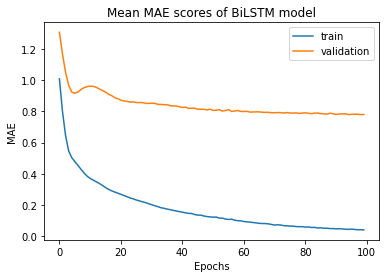

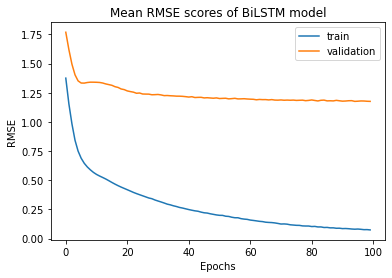

In [148]:
visualize_performance(results_inc_cpt_sat_x)

Optimal Mean MAE: 0.8083179950714111 @ epoch 98
Optimal Mean RMSE: 1.2494832936674356 @ epoch 98


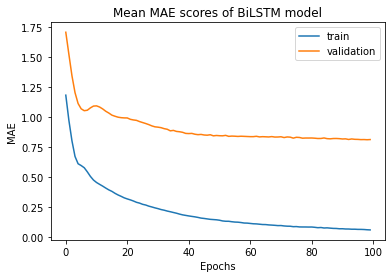

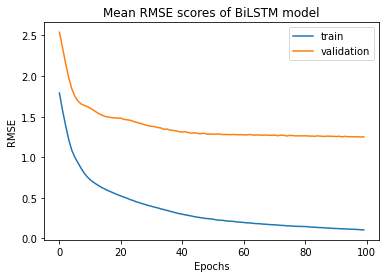

In [149]:
visualize_performance(results_inc_cpt_sat_y)

Optimal Mean MAE: 0.7935334289446473 @ epoch 98
Optimal Mean RMSE: 1.1924294820055366 @ epoch 99


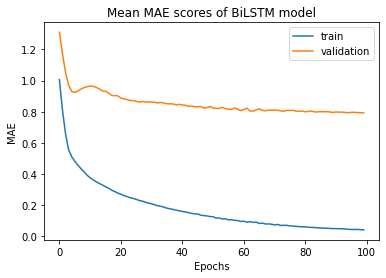

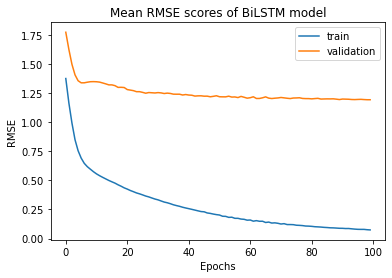

In [150]:
visualize_performance(results_inc_cpt_sat_z)

### Tacheometry + CPT <- Satellite (incremental)

In [165]:
results_inc_tcmt_cpt_sat_x = incremental_fusion('CPT', 'X', tacheometry=True)
results_inc_tcmt_cpt_sat_y = incremental_fusion('CPT', 'Y', tacheometry=True)
results_inc_tcmt_cpt_sat_z = incremental_fusion('CPT', 'Z', tacheometry=True)

Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 6.8586 - mean_absolute_error: 1.9590 - root_mean_squared_error: 2.6189 - val_loss: 10.1795 - val_mean_absolute_error: 2.5502 - val_root_mean_squared_error: 3.1905
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 5.3094 - mean_absolute_error: 1.6457 - root_mean_squared_error: 2.3042 - val_loss: 8.8277 - val_mean_absolute_error: 2.3303 - val_root_mean_squared_error: 2.9711
Epoch 3/100
1/1 [==============================] - 0s 51ms/step - loss: 4.1158 - mean_absolute_error: 1.3564 - root_mean_squared_error: 2.0287 - val_loss: 7.7646 - val_mean_absolute_error: 2.1570 - val_root_mean_squared_error: 2.7865
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 3.1124 - mean_absolute_error: 1.1312 - root_mean_squared_error: 1.7642 - val_loss: 7.1483 - val_mean_absolute_error: 2.0561 - val_root_mean_squared_error: 2.6736
Epoch 5/100
1/1 [==============================] - 0s 37ms/step -

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4855 - mean_absolute_error: 0.3681 - root_mean_squared_error: 0.6967 - val_loss: 7.5369 - val_mean_absolute_error: 2.0132 - val_root_mean_squared_error: 2.7453
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.4679 - mean_absolute_error: 0.3591 - root_mean_squared_error: 0.6841 - val_loss: 7.3994 - val_mean_absolute_error: 1.9914 - val_root_mean_squared_error: 2.7202
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4509 - mean_absolute_error: 0.3500 - root_mean_squared_error: 0.6715 - val_loss: 7.3309 - val_mean_absolute_error: 1.9792 - val_root_mean_squared_error: 2.7076
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4314 - mean_absolute_error: 0.3392 - root_mean_squared_error: 0.6568 - val_loss: 7.3962 - val_mean_absolute_error: 1.9855 - val_root_mean_squared_error: 2.7196
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1474 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.3839 - val_loss: 5.9861 - val_mean_absolute_error: 1.7320 - val_root_mean_squared_error: 2.4467
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1446 - mean_absolute_error: 0.1812 - root_mean_squared_error: 0.3803 - val_loss: 5.8649 - val_mean_absolute_error: 1.7093 - val_root_mean_squared_error: 2.4218
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1403 - mean_absolute_error: 0.1768 - root_mean_squared_error: 0.3745 - val_loss: 5.9799 - val_mean_absolute_error: 1.7280 - val_root_mean_squared_error: 2.4454
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1328 - mean_absolute_error: 0.1693 - root_mean_squared_error: 0.3644 - val_loss: 6.0391 - val_mean_absolute_error: 1.7375 - val_root_mean_squared_error: 2.4575
Epoch 75/100
1/1 [==============================] - 0s 36ms/

Epoch 6/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1853 - mean_absolute_error: 0.3347 - root_mean_squared_error: 0.4304 - val_loss: 0.4676 - val_mean_absolute_error: 0.4803 - val_root_mean_squared_error: 0.6838
Epoch 7/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1612 - mean_absolute_error: 0.3060 - root_mean_squared_error: 0.4015 - val_loss: 0.5070 - val_mean_absolute_error: 0.5306 - val_root_mean_squared_error: 0.7120
Epoch 8/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1513 - mean_absolute_error: 0.2968 - root_mean_squared_error: 0.3890 - val_loss: 0.5448 - val_mean_absolute_error: 0.5706 - val_root_mean_squared_error: 0.7381
Epoch 9/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1485 - mean_absolute_error: 0.2961 - root_mean_squared_error: 0.3853 - val_loss: 0.5311 - val_mean_absolute_error: 0.5656 - val_root_mean_squared_error: 0.7288
Epoch 10/100
1/1 [==============================] - 0s 42ms/step

Epoch 41/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0112 - mean_absolute_error: 0.0730 - root_mean_squared_error: 0.1060 - val_loss: 0.2017 - val_mean_absolute_error: 0.3055 - val_root_mean_squared_error: 0.4491
Epoch 42/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0106 - mean_absolute_error: 0.0706 - root_mean_squared_error: 0.1031 - val_loss: 0.1961 - val_mean_absolute_error: 0.2981 - val_root_mean_squared_error: 0.4429
Epoch 43/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0100 - mean_absolute_error: 0.0679 - root_mean_squared_error: 0.1002 - val_loss: 0.1938 - val_mean_absolute_error: 0.2955 - val_root_mean_squared_error: 0.4402
Epoch 44/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0096 - mean_absolute_error: 0.0662 - root_mean_squared_error: 0.0978 - val_loss: 0.1923 - val_mean_absolute_error: 0.2935 - val_root_mean_squared_error: 0.4385
Epoch 45/100
1/1 [==============================] - 0s 35ms/

Epoch 76/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0029 - mean_absolute_error: 0.0341 - root_mean_squared_error: 0.0541 - val_loss: 0.1710 - val_mean_absolute_error: 0.2471 - val_root_mean_squared_error: 0.4135
Epoch 77/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0028 - mean_absolute_error: 0.0328 - root_mean_squared_error: 0.0526 - val_loss: 0.1705 - val_mean_absolute_error: 0.2462 - val_root_mean_squared_error: 0.4129
Epoch 78/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0027 - mean_absolute_error: 0.0322 - root_mean_squared_error: 0.0516 - val_loss: 0.1696 - val_mean_absolute_error: 0.2437 - val_root_mean_squared_error: 0.4118
Epoch 79/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0026 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0511 - val_loss: 0.1698 - val_mean_absolute_error: 0.2464 - val_root_mean_squared_error: 0.4121
Epoch 80/100
1/1 [==============================] - 0s 41ms/

Epoch 11/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2365 - mean_absolute_error: 0.3556 - root_mean_squared_error: 0.4863 - val_loss: 0.8190 - val_mean_absolute_error: 0.6692 - val_root_mean_squared_error: 0.9050
Epoch 12/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2230 - mean_absolute_error: 0.3339 - root_mean_squared_error: 0.4722 - val_loss: 0.8073 - val_mean_absolute_error: 0.6544 - val_root_mean_squared_error: 0.8985
Epoch 13/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2113 - mean_absolute_error: 0.3170 - root_mean_squared_error: 0.4596 - val_loss: 0.7841 - val_mean_absolute_error: 0.6385 - val_root_mean_squared_error: 0.8855
Epoch 14/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2020 - mean_absolute_error: 0.3085 - root_mean_squared_error: 0.4495 - val_loss: 0.7632 - val_mean_absolute_error: 0.6248 - val_root_mean_squared_error: 0.8736
Epoch 15/100
1/1 [==============================] - 0s 44ms/

Epoch 46/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0507 - mean_absolute_error: 0.1346 - root_mean_squared_error: 0.2251 - val_loss: 0.4076 - val_mean_absolute_error: 0.4255 - val_root_mean_squared_error: 0.6384
Epoch 47/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0457 - mean_absolute_error: 0.1289 - root_mean_squared_error: 0.2138 - val_loss: 0.3947 - val_mean_absolute_error: 0.4165 - val_root_mean_squared_error: 0.6283
Epoch 48/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0414 - mean_absolute_error: 0.1244 - root_mean_squared_error: 0.2035 - val_loss: 0.3770 - val_mean_absolute_error: 0.4050 - val_root_mean_squared_error: 0.6140
Epoch 49/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0375 - mean_absolute_error: 0.1198 - root_mean_squared_error: 0.1936 - val_loss: 0.3602 - val_mean_absolute_error: 0.3960 - val_root_mean_squared_error: 0.6002
Epoch 50/100
1/1 [==============================] - 0s 48ms/

Epoch 81/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0066 - mean_absolute_error: 0.0518 - root_mean_squared_error: 0.0810 - val_loss: 0.2113 - val_mean_absolute_error: 0.3157 - val_root_mean_squared_error: 0.4597
Epoch 82/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0064 - mean_absolute_error: 0.0511 - root_mean_squared_error: 0.0799 - val_loss: 0.2095 - val_mean_absolute_error: 0.3132 - val_root_mean_squared_error: 0.4577
Epoch 83/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0061 - mean_absolute_error: 0.0494 - root_mean_squared_error: 0.0782 - val_loss: 0.2067 - val_mean_absolute_error: 0.3104 - val_root_mean_squared_error: 0.4546
Epoch 84/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0059 - mean_absolute_error: 0.0487 - root_mean_squared_error: 0.0771 - val_loss: 0.2046 - val_mean_absolute_error: 0.3089 - val_root_mean_squared_error: 0.4524
Epoch 85/100
1/1 [==============================] - 0s 42ms/

Epoch 16/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0957 - mean_absolute_error: 0.2215 - root_mean_squared_error: 0.3093 - val_loss: 0.8722 - val_mean_absolute_error: 0.4837 - val_root_mean_squared_error: 0.9339
Epoch 17/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0898 - mean_absolute_error: 0.2102 - root_mean_squared_error: 0.2997 - val_loss: 0.8654 - val_mean_absolute_error: 0.4742 - val_root_mean_squared_error: 0.9303
Epoch 18/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0847 - mean_absolute_error: 0.1994 - root_mean_squared_error: 0.2911 - val_loss: 0.8525 - val_mean_absolute_error: 0.4650 - val_root_mean_squared_error: 0.9233
Epoch 19/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0799 - mean_absolute_error: 0.1901 - root_mean_squared_error: 0.2826 - val_loss: 0.8376 - val_mean_absolute_error: 0.4557 - val_root_mean_squared_error: 0.9152
Epoch 20/100
1/1 [==============================] - 0s 43ms/

Epoch 51/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0047 - mean_absolute_error: 0.0517 - root_mean_squared_error: 0.0684 - val_loss: 0.6769 - val_mean_absolute_error: 0.3086 - val_root_mean_squared_error: 0.8227
Epoch 52/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0042 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.0646 - val_loss: 0.6768 - val_mean_absolute_error: 0.2999 - val_root_mean_squared_error: 0.8227
Epoch 53/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0040 - mean_absolute_error: 0.0483 - root_mean_squared_error: 0.0631 - val_loss: 0.6770 - val_mean_absolute_error: 0.3040 - val_root_mean_squared_error: 0.8228
Epoch 54/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0038 - mean_absolute_error: 0.0474 - root_mean_squared_error: 0.0618 - val_loss: 0.6777 - val_mean_absolute_error: 0.2964 - val_root_mean_squared_error: 0.8232
Epoch 55/100
1/1 [==============================] - 0s 41ms/

Epoch 86/100
1/1 [==============================] - 0s 40ms/step - loss: 8.4436e-04 - mean_absolute_error: 0.0226 - root_mean_squared_error: 0.0291 - val_loss: 0.6879 - val_mean_absolute_error: 0.2753 - val_root_mean_squared_error: 0.8294
Epoch 87/100
1/1 [==============================] - 0s 40ms/step - loss: 8.1963e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0286 - val_loss: 0.6875 - val_mean_absolute_error: 0.2758 - val_root_mean_squared_error: 0.8291
Epoch 88/100
1/1 [==============================] - 0s 40ms/step - loss: 7.9529e-04 - mean_absolute_error: 0.0219 - root_mean_squared_error: 0.0282 - val_loss: 0.6873 - val_mean_absolute_error: 0.2750 - val_root_mean_squared_error: 0.8290
Epoch 89/100
1/1 [==============================] - 0s 39ms/step - loss: 7.7270e-04 - mean_absolute_error: 0.0216 - root_mean_squared_error: 0.0278 - val_loss: 0.6871 - val_mean_absolute_error: 0.2739 - val_root_mean_squared_error: 0.8289
Epoch 90/100
1/1 [==========================

Epoch 21/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2389 - mean_absolute_error: 0.3376 - root_mean_squared_error: 0.4888 - val_loss: 1.2558 - val_mean_absolute_error: 0.7755 - val_root_mean_squared_error: 1.1206
Epoch 22/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2334 - mean_absolute_error: 0.3330 - root_mean_squared_error: 0.4831 - val_loss: 1.2260 - val_mean_absolute_error: 0.7726 - val_root_mean_squared_error: 1.1072
Epoch 23/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2291 - mean_absolute_error: 0.3287 - root_mean_squared_error: 0.4786 - val_loss: 1.1975 - val_mean_absolute_error: 0.7722 - val_root_mean_squared_error: 1.0943
Epoch 24/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2253 - mean_absolute_error: 0.3245 - root_mean_squared_error: 0.4746 - val_loss: 1.1757 - val_mean_absolute_error: 0.7747 - val_root_mean_squared_error: 1.0843
Epoch 25/100
1/1 [==============================] - 0s 40ms/

Epoch 56/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0317 - mean_absolute_error: 0.1079 - root_mean_squared_error: 0.1782 - val_loss: 0.5222 - val_mean_absolute_error: 0.4951 - val_root_mean_squared_error: 0.7226
Epoch 57/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0304 - mean_absolute_error: 0.1046 - root_mean_squared_error: 0.1743 - val_loss: 0.5220 - val_mean_absolute_error: 0.4945 - val_root_mean_squared_error: 0.7225
Epoch 58/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0290 - mean_absolute_error: 0.1008 - root_mean_squared_error: 0.1702 - val_loss: 0.5118 - val_mean_absolute_error: 0.4893 - val_root_mean_squared_error: 0.7154
Epoch 59/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0279 - mean_absolute_error: 0.0981 - root_mean_squared_error: 0.1671 - val_loss: 0.5436 - val_mean_absolute_error: 0.5065 - val_root_mean_squared_error: 0.7373
Epoch 60/100
1/1 [==============================] - 0s 44ms/

Epoch 91/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0067 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0816 - val_loss: 0.4507 - val_mean_absolute_error: 0.4553 - val_root_mean_squared_error: 0.6713
Epoch 92/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0063 - mean_absolute_error: 0.0472 - root_mean_squared_error: 0.0794 - val_loss: 0.4727 - val_mean_absolute_error: 0.4676 - val_root_mean_squared_error: 0.6875
Epoch 93/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0060 - mean_absolute_error: 0.0470 - root_mean_squared_error: 0.0775 - val_loss: 0.4356 - val_mean_absolute_error: 0.4463 - val_root_mean_squared_error: 0.6600
Epoch 94/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0058 - mean_absolute_error: 0.0461 - root_mean_squared_error: 0.0759 - val_loss: 0.4785 - val_mean_absolute_error: 0.4705 - val_root_mean_squared_error: 0.6917
Epoch 95/100
1/1 [==============================] - 0s 41ms/

Epoch 26/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0648 - mean_absolute_error: 0.1722 - root_mean_squared_error: 0.2546 - val_loss: 1.6003 - val_mean_absolute_error: 0.8014 - val_root_mean_squared_error: 1.2650
Epoch 27/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0619 - mean_absolute_error: 0.1697 - root_mean_squared_error: 0.2489 - val_loss: 1.5879 - val_mean_absolute_error: 0.7970 - val_root_mean_squared_error: 1.2601
Epoch 28/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0593 - mean_absolute_error: 0.1653 - root_mean_squared_error: 0.2435 - val_loss: 1.5965 - val_mean_absolute_error: 0.7880 - val_root_mean_squared_error: 1.2635
Epoch 29/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0563 - mean_absolute_error: 0.1633 - root_mean_squared_error: 0.2372 - val_loss: 1.5747 - val_mean_absolute_error: 0.7853 - val_root_mean_squared_error: 1.2549
Epoch 30/100
1/1 [==============================] - 0s 44ms/

Epoch 61/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0040 - mean_absolute_error: 0.0464 - root_mean_squared_error: 0.0635 - val_loss: 1.6790 - val_mean_absolute_error: 0.6897 - val_root_mean_squared_error: 1.2958
Epoch 62/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0037 - mean_absolute_error: 0.0458 - root_mean_squared_error: 0.0609 - val_loss: 1.6611 - val_mean_absolute_error: 0.6920 - val_root_mean_squared_error: 1.2888
Epoch 63/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0042 - mean_absolute_error: 0.0479 - root_mean_squared_error: 0.0646 - val_loss: 1.6825 - val_mean_absolute_error: 0.6861 - val_root_mean_squared_error: 1.2971
Epoch 64/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0031 - mean_absolute_error: 0.0416 - root_mean_squared_error: 0.0561 - val_loss: 1.7045 - val_mean_absolute_error: 0.6825 - val_root_mean_squared_error: 1.3056
Epoch 65/100
1/1 [==============================] - 0s 41ms/

Epoch 96/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0014 - mean_absolute_error: 0.0263 - root_mean_squared_error: 0.0373 - val_loss: 1.7076 - val_mean_absolute_error: 0.6695 - val_root_mean_squared_error: 1.3067
Epoch 97/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0014 - mean_absolute_error: 0.0258 - root_mean_squared_error: 0.0367 - val_loss: 1.7123 - val_mean_absolute_error: 0.6678 - val_root_mean_squared_error: 1.3086
Epoch 98/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0013 - mean_absolute_error: 0.0257 - root_mean_squared_error: 0.0365 - val_loss: 1.7119 - val_mean_absolute_error: 0.6672 - val_root_mean_squared_error: 1.3084
Epoch 99/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0013 - mean_absolute_error: 0.0254 - root_mean_squared_error: 0.0362 - val_loss: 1.7088 - val_mean_absolute_error: 0.6675 - val_root_mean_squared_error: 1.3072
Epoch 100/100
1/1 [==============================] - 0s 38ms

Epoch 31/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0090 - mean_absolute_error: 0.0670 - root_mean_squared_error: 0.0950 - val_loss: 0.5624 - val_mean_absolute_error: 0.5190 - val_root_mean_squared_error: 0.7500
Epoch 32/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0087 - mean_absolute_error: 0.0659 - root_mean_squared_error: 0.0930 - val_loss: 0.5406 - val_mean_absolute_error: 0.5079 - val_root_mean_squared_error: 0.7353
Epoch 33/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0079 - mean_absolute_error: 0.0620 - root_mean_squared_error: 0.0888 - val_loss: 0.5169 - val_mean_absolute_error: 0.4955 - val_root_mean_squared_error: 0.7189
Epoch 34/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0075 - mean_absolute_error: 0.0596 - root_mean_squared_error: 0.0868 - val_loss: 0.5231 - val_mean_absolute_error: 0.4983 - val_root_mean_squared_error: 0.7233
Epoch 35/100
1/1 [==============================] - 0s 39ms/

Epoch 66/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0012 - mean_absolute_error: 0.0239 - root_mean_squared_error: 0.0353 - val_loss: 0.5250 - val_mean_absolute_error: 0.5020 - val_root_mean_squared_error: 0.7246
Epoch 67/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0012 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0342 - val_loss: 0.5279 - val_mean_absolute_error: 0.5035 - val_root_mean_squared_error: 0.7265
Epoch 68/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0011 - mean_absolute_error: 0.0227 - root_mean_squared_error: 0.0333 - val_loss: 0.5248 - val_mean_absolute_error: 0.5020 - val_root_mean_squared_error: 0.7244
Epoch 69/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0010 - mean_absolute_error: 0.0220 - root_mean_squared_error: 0.0323 - val_loss: 0.5252 - val_mean_absolute_error: 0.5022 - val_root_mean_squared_error: 0.7247
Epoch 70/100
1/1 [==============================] - 0s 39ms/

Epoch 35/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0360 - mean_absolute_error: 0.1217 - root_mean_squared_error: 0.1898 - val_loss: 0.7346 - val_mean_absolute_error: 0.5467 - val_root_mean_squared_error: 0.8571
Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0350 - mean_absolute_error: 0.1192 - root_mean_squared_error: 0.1871 - val_loss: 0.7270 - val_mean_absolute_error: 0.5430 - val_root_mean_squared_error: 0.8527
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0341 - mean_absolute_error: 0.1169 - root_mean_squared_error: 0.1845 - val_loss: 0.7220 - val_mean_absolute_error: 0.5401 - val_root_mean_squared_error: 0.8497
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0332 - mean_absolute_error: 0.1150 - root_mean_squared_error: 0.1823 - val_loss: 0.7204 - val_mean_absolute_error: 0.5377 - val_root_mean_squared_error: 0.8488
Epoch 39/100
1/1 [==============================] - 0s 37ms/

Epoch 70/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0145 - mean_absolute_error: 0.0733 - root_mean_squared_error: 0.1205 - val_loss: 0.7276 - val_mean_absolute_error: 0.5407 - val_root_mean_squared_error: 0.8530
Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0136 - mean_absolute_error: 0.0698 - root_mean_squared_error: 0.1165 - val_loss: 0.7294 - val_mean_absolute_error: 0.5389 - val_root_mean_squared_error: 0.8541
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0132 - mean_absolute_error: 0.0699 - root_mean_squared_error: 0.1149 - val_loss: 0.7295 - val_mean_absolute_error: 0.5430 - val_root_mean_squared_error: 0.8541
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0127 - mean_absolute_error: 0.0683 - root_mean_squared_error: 0.1128 - val_loss: 0.7305 - val_mean_absolute_error: 0.5421 - val_root_mean_squared_error: 0.8547
Epoch 74/100
1/1 [==============================] - 0s 37ms/

Epoch 5/100
1/1 [==============================] - 0s 37ms/step - loss: 2.4837 - mean_absolute_error: 0.9007 - root_mean_squared_error: 1.5760 - val_loss: 9.3630 - val_mean_absolute_error: 2.1366 - val_root_mean_squared_error: 3.0599
Epoch 6/100
1/1 [==============================] - 0s 39ms/step - loss: 2.3712 - mean_absolute_error: 0.9202 - root_mean_squared_error: 1.5399 - val_loss: 8.8964 - val_mean_absolute_error: 2.0925 - val_root_mean_squared_error: 2.9827
Epoch 7/100
1/1 [==============================] - 0s 43ms/step - loss: 2.3094 - mean_absolute_error: 0.9252 - root_mean_squared_error: 1.5197 - val_loss: 8.7159 - val_mean_absolute_error: 2.0854 - val_root_mean_squared_error: 2.9523
Epoch 8/100
1/1 [==============================] - 0s 43ms/step - loss: 2.2291 - mean_absolute_error: 0.8985 - root_mean_squared_error: 1.4930 - val_loss: 8.7342 - val_mean_absolute_error: 2.1018 - val_root_mean_squared_error: 2.9554
Epoch 9/100
1/1 [==============================] - 0s 43ms/step 

Epoch 40/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2088 - mean_absolute_error: 0.2883 - root_mean_squared_error: 0.4570 - val_loss: 6.9236 - val_mean_absolute_error: 1.8751 - val_root_mean_squared_error: 2.6313
Epoch 41/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1912 - mean_absolute_error: 0.2766 - root_mean_squared_error: 0.4373 - val_loss: 7.0229 - val_mean_absolute_error: 1.8874 - val_root_mean_squared_error: 2.6501
Epoch 42/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1754 - mean_absolute_error: 0.2647 - root_mean_squared_error: 0.4188 - val_loss: 7.0813 - val_mean_absolute_error: 1.8945 - val_root_mean_squared_error: 2.6611
Epoch 43/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1606 - mean_absolute_error: 0.2536 - root_mean_squared_error: 0.4008 - val_loss: 7.1682 - val_mean_absolute_error: 1.9059 - val_root_mean_squared_error: 2.6773
Epoch 44/100
1/1 [==============================] - 0s 42ms/

Epoch 75/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0124 - mean_absolute_error: 0.0630 - root_mean_squared_error: 0.1113 - val_loss: 7.7133 - val_mean_absolute_error: 1.9829 - val_root_mean_squared_error: 2.7773
Epoch 76/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0115 - mean_absolute_error: 0.0616 - root_mean_squared_error: 0.1071 - val_loss: 7.7612 - val_mean_absolute_error: 1.9887 - val_root_mean_squared_error: 2.7859
Epoch 77/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0109 - mean_absolute_error: 0.0582 - root_mean_squared_error: 0.1042 - val_loss: 7.6975 - val_mean_absolute_error: 1.9818 - val_root_mean_squared_error: 2.7744
Epoch 78/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0104 - mean_absolute_error: 0.0593 - root_mean_squared_error: 0.1021 - val_loss: 7.8040 - val_mean_absolute_error: 1.9947 - val_root_mean_squared_error: 2.7936
Epoch 79/100
1/1 [==============================] - 0s 41ms/

Epoch 10/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0813 - mean_absolute_error: 0.2006 - root_mean_squared_error: 0.2851 - val_loss: 1.7508 - val_mean_absolute_error: 0.7578 - val_root_mean_squared_error: 1.3232
Epoch 11/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0684 - mean_absolute_error: 0.1871 - root_mean_squared_error: 0.2615 - val_loss: 1.7409 - val_mean_absolute_error: 0.7411 - val_root_mean_squared_error: 1.3194
Epoch 12/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0568 - mean_absolute_error: 0.1725 - root_mean_squared_error: 0.2383 - val_loss: 1.7348 - val_mean_absolute_error: 0.7242 - val_root_mean_squared_error: 1.3171
Epoch 13/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0492 - mean_absolute_error: 0.1614 - root_mean_squared_error: 0.2219 - val_loss: 1.7283 - val_mean_absolute_error: 0.7096 - val_root_mean_squared_error: 1.3146
Epoch 14/100
1/1 [==============================] - 0s 38ms/

Epoch 45/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0030 - mean_absolute_error: 0.0415 - root_mean_squared_error: 0.0551 - val_loss: 1.6725 - val_mean_absolute_error: 0.6106 - val_root_mean_squared_error: 1.2933
Epoch 46/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0028 - mean_absolute_error: 0.0400 - root_mean_squared_error: 0.0533 - val_loss: 1.6748 - val_mean_absolute_error: 0.6086 - val_root_mean_squared_error: 1.2941
Epoch 47/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0026 - mean_absolute_error: 0.0386 - root_mean_squared_error: 0.0514 - val_loss: 1.6765 - val_mean_absolute_error: 0.6068 - val_root_mean_squared_error: 1.2948
Epoch 48/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0024 - mean_absolute_error: 0.0372 - root_mean_squared_error: 0.0494 - val_loss: 1.6776 - val_mean_absolute_error: 0.6053 - val_root_mean_squared_error: 1.2952
Epoch 49/100
1/1 [==============================] - 0s 37ms/

Epoch 80/100
1/1 [==============================] - 0s 39ms/step - loss: 5.1069e-04 - mean_absolute_error: 0.0173 - root_mean_squared_error: 0.0226 - val_loss: 1.6744 - val_mean_absolute_error: 0.5928 - val_root_mean_squared_error: 1.2940
Epoch 81/100
1/1 [==============================] - 0s 41ms/step - loss: 4.9461e-04 - mean_absolute_error: 0.0170 - root_mean_squared_error: 0.0222 - val_loss: 1.6742 - val_mean_absolute_error: 0.5920 - val_root_mean_squared_error: 1.2939
Epoch 82/100
1/1 [==============================] - 0s 39ms/step - loss: 4.7885e-04 - mean_absolute_error: 0.0168 - root_mean_squared_error: 0.0219 - val_loss: 1.6742 - val_mean_absolute_error: 0.5915 - val_root_mean_squared_error: 1.2939
Epoch 83/100
1/1 [==============================] - 0s 39ms/step - loss: 4.6358e-04 - mean_absolute_error: 0.0165 - root_mean_squared_error: 0.0215 - val_loss: 1.6744 - val_mean_absolute_error: 0.5909 - val_root_mean_squared_error: 1.2940
Epoch 84/100
1/1 [==========================

Epoch 49/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0887 - mean_absolute_error: 0.1668 - root_mean_squared_error: 0.2979 - val_loss: 1.4362 - val_mean_absolute_error: 0.8219 - val_root_mean_squared_error: 1.1984
Epoch 50/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0873 - mean_absolute_error: 0.1647 - root_mean_squared_error: 0.2954 - val_loss: 1.4424 - val_mean_absolute_error: 0.8239 - val_root_mean_squared_error: 1.2010
Epoch 51/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0855 - mean_absolute_error: 0.1615 - root_mean_squared_error: 0.2923 - val_loss: 1.4498 - val_mean_absolute_error: 0.8255 - val_root_mean_squared_error: 1.2041
Epoch 52/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0831 - mean_absolute_error: 0.1575 - root_mean_squared_error: 0.2883 - val_loss: 1.4568 - val_mean_absolute_error: 0.8262 - val_root_mean_squared_error: 1.2070
Epoch 53/100
1/1 [==============================] - 0s 40ms/

Epoch 84/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0238 - mean_absolute_error: 0.0897 - root_mean_squared_error: 0.1542 - val_loss: 1.3894 - val_mean_absolute_error: 0.7769 - val_root_mean_squared_error: 1.1787
Epoch 85/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0234 - mean_absolute_error: 0.0898 - root_mean_squared_error: 0.1530 - val_loss: 1.4201 - val_mean_absolute_error: 0.7895 - val_root_mean_squared_error: 1.1917
Epoch 86/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0225 - mean_absolute_error: 0.0877 - root_mean_squared_error: 0.1500 - val_loss: 1.4184 - val_mean_absolute_error: 0.7874 - val_root_mean_squared_error: 1.1910
Epoch 87/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0218 - mean_absolute_error: 0.0862 - root_mean_squared_error: 0.1477 - val_loss: 1.3869 - val_mean_absolute_error: 0.7712 - val_root_mean_squared_error: 1.1777
Epoch 88/100
1/1 [==============================] - 0s 39ms/

Epoch 19/100
1/1 [==============================] - 0s 41ms/step - loss: 1.2203 - mean_absolute_error: 0.7248 - root_mean_squared_error: 1.1047 - val_loss: 3.8347 - val_mean_absolute_error: 1.4526 - val_root_mean_squared_error: 1.9582
Epoch 20/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1344 - mean_absolute_error: 0.6910 - root_mean_squared_error: 1.0651 - val_loss: 3.7902 - val_mean_absolute_error: 1.4301 - val_root_mean_squared_error: 1.9468
Epoch 21/100
1/1 [==============================] - 0s 46ms/step - loss: 1.0536 - mean_absolute_error: 0.6585 - root_mean_squared_error: 1.0265 - val_loss: 3.7577 - val_mean_absolute_error: 1.4155 - val_root_mean_squared_error: 1.9385
Epoch 22/100
1/1 [==============================] - 0s 43ms/step - loss: 0.9758 - mean_absolute_error: 0.6279 - root_mean_squared_error: 0.9878 - val_loss: 3.7353 - val_mean_absolute_error: 1.4105 - val_root_mean_squared_error: 1.9327
Epoch 23/100
1/1 [==============================] - 0s 39ms/

Epoch 54/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0961 - mean_absolute_error: 0.1993 - root_mean_squared_error: 0.3100 - val_loss: 2.5981 - val_mean_absolute_error: 1.1849 - val_root_mean_squared_error: 1.6119
Epoch 55/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0918 - mean_absolute_error: 0.1939 - root_mean_squared_error: 0.3030 - val_loss: 2.5749 - val_mean_absolute_error: 1.1799 - val_root_mean_squared_error: 1.6046
Epoch 56/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0880 - mean_absolute_error: 0.1888 - root_mean_squared_error: 0.2967 - val_loss: 2.5626 - val_mean_absolute_error: 1.1781 - val_root_mean_squared_error: 1.6008
Epoch 57/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0845 - mean_absolute_error: 0.1843 - root_mean_squared_error: 0.2908 - val_loss: 2.5603 - val_mean_absolute_error: 1.1790 - val_root_mean_squared_error: 1.6001
Epoch 58/100
1/1 [==============================] - 0s 43ms/

Epoch 89/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0245 - mean_absolute_error: 0.0906 - root_mean_squared_error: 0.1567 - val_loss: 2.3553 - val_mean_absolute_error: 1.1138 - val_root_mean_squared_error: 1.5347
Epoch 90/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0237 - mean_absolute_error: 0.0887 - root_mean_squared_error: 0.1539 - val_loss: 2.3540 - val_mean_absolute_error: 1.1132 - val_root_mean_squared_error: 1.5343
Epoch 91/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0229 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1512 - val_loss: 2.3475 - val_mean_absolute_error: 1.1109 - val_root_mean_squared_error: 1.5321
Epoch 92/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0221 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1486 - val_loss: 2.3496 - val_mean_absolute_error: 1.1116 - val_root_mean_squared_error: 1.5328
Epoch 93/100
1/1 [==============================] - 0s 42ms/

Epoch 24/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0030 - mean_absolute_error: 0.0409 - root_mean_squared_error: 0.0546 - val_loss: 0.0164 - val_mean_absolute_error: 0.0969 - val_root_mean_squared_error: 0.1282
Epoch 25/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0029 - mean_absolute_error: 0.0400 - root_mean_squared_error: 0.0537 - val_loss: 0.0108 - val_mean_absolute_error: 0.0782 - val_root_mean_squared_error: 0.1041
Epoch 26/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0021 - mean_absolute_error: 0.0358 - root_mean_squared_error: 0.0463 - val_loss: 0.0075 - val_mean_absolute_error: 0.0662 - val_root_mean_squared_error: 0.0868
Epoch 27/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0023 - mean_absolute_error: 0.0376 - root_mean_squared_error: 0.0477 - val_loss: 0.0080 - val_mean_absolute_error: 0.0682 - val_root_mean_squared_error: 0.0896
Epoch 28/100
1/1 [==============================] - 0s 39ms/

1/1 [==============================] - 0s 41ms/step - loss: 1.1176e-04 - mean_absolute_error: 0.0081 - root_mean_squared_error: 0.0106 - val_loss: 8.5223e-04 - val_mean_absolute_error: 0.0217 - val_root_mean_squared_error: 0.0292
Epoch 93/100
1/1 [==============================] - 0s 43ms/step - loss: 1.1005e-04 - mean_absolute_error: 0.0080 - root_mean_squared_error: 0.0105 - val_loss: 8.7418e-04 - val_mean_absolute_error: 0.0220 - val_root_mean_squared_error: 0.0296
Epoch 94/100
1/1 [==============================] - 0s 53ms/step - loss: 1.0724e-04 - mean_absolute_error: 0.0079 - root_mean_squared_error: 0.0104 - val_loss: 8.6830e-04 - val_mean_absolute_error: 0.0219 - val_root_mean_squared_error: 0.0295
Epoch 95/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0555e-04 - mean_absolute_error: 0.0079 - root_mean_squared_error: 0.0103 - val_loss: 8.1119e-04 - val_mean_absolute_error: 0.0212 - val_root_mean_squared_error: 0.0285
Epoch 96/100
1/1 [=======================

Epoch 27/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1842 - mean_absolute_error: 0.2881 - root_mean_squared_error: 0.4292 - val_loss: 5.2676 - val_mean_absolute_error: 1.5519 - val_root_mean_squared_error: 2.2951
Epoch 28/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1288 - mean_absolute_error: 0.2439 - root_mean_squared_error: 0.3589 - val_loss: 5.6479 - val_mean_absolute_error: 1.5994 - val_root_mean_squared_error: 2.3765
Epoch 29/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1304 - mean_absolute_error: 0.2504 - root_mean_squared_error: 0.3612 - val_loss: 5.7541 - val_mean_absolute_error: 1.6120 - val_root_mean_squared_error: 2.3988
Epoch 30/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1445 - mean_absolute_error: 0.2620 - root_mean_squared_error: 0.3801 - val_loss: 5.4430 - val_mean_absolute_error: 1.5680 - val_root_mean_squared_error: 2.3330
Epoch 31/100
1/1 [==============================] - 0s 43ms/

Epoch 62/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0211 - mean_absolute_error: 0.0913 - root_mean_squared_error: 0.1451 - val_loss: 5.2457 - val_mean_absolute_error: 1.5340 - val_root_mean_squared_error: 2.2903
Epoch 63/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0202 - mean_absolute_error: 0.0892 - root_mean_squared_error: 0.1421 - val_loss: 5.2838 - val_mean_absolute_error: 1.5411 - val_root_mean_squared_error: 2.2986
Epoch 64/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0194 - mean_absolute_error: 0.0866 - root_mean_squared_error: 0.1393 - val_loss: 5.2804 - val_mean_absolute_error: 1.5420 - val_root_mean_squared_error: 2.2979
Epoch 65/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0184 - mean_absolute_error: 0.0833 - root_mean_squared_error: 0.1355 - val_loss: 5.2489 - val_mean_absolute_error: 1.5381 - val_root_mean_squared_error: 2.2911
Epoch 66/100
1/1 [==============================] - 0s 39ms/

Epoch 97/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0047 - mean_absolute_error: 0.0370 - root_mean_squared_error: 0.0688 - val_loss: 5.3834 - val_mean_absolute_error: 1.5650 - val_root_mean_squared_error: 2.3202
Epoch 98/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0045 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0671 - val_loss: 5.3943 - val_mean_absolute_error: 1.5665 - val_root_mean_squared_error: 2.3226
Epoch 99/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0043 - mean_absolute_error: 0.0351 - root_mean_squared_error: 0.0657 - val_loss: 5.3978 - val_mean_absolute_error: 1.5671 - val_root_mean_squared_error: 2.3233
Epoch 100/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0041 - mean_absolute_error: 0.0341 - root_mean_squared_error: 0.0643 - val_loss: 5.3936 - val_mean_absolute_error: 1.5667 - val_root_mean_squared_error: 2.3224
Epoch 1/100
1/1 [==============================] - 6s 6s/st

Epoch 32/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0301 - mean_absolute_error: 0.1085 - root_mean_squared_error: 0.1735 - val_loss: 0.1761 - val_mean_absolute_error: 0.2921 - val_root_mean_squared_error: 0.4196
Epoch 33/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0280 - mean_absolute_error: 0.1030 - root_mean_squared_error: 0.1675 - val_loss: 0.1765 - val_mean_absolute_error: 0.2933 - val_root_mean_squared_error: 0.4201
Epoch 34/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0262 - mean_absolute_error: 0.0975 - root_mean_squared_error: 0.1620 - val_loss: 0.1781 - val_mean_absolute_error: 0.2957 - val_root_mean_squared_error: 0.4220
Epoch 35/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0249 - mean_absolute_error: 0.0943 - root_mean_squared_error: 0.1579 - val_loss: 0.1795 - val_mean_absolute_error: 0.2948 - val_root_mean_squared_error: 0.4237
Epoch 36/100
1/1 [==============================] - 0s 41ms/

Epoch 67/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0052 - mean_absolute_error: 0.0455 - root_mean_squared_error: 0.0720 - val_loss: 0.1443 - val_mean_absolute_error: 0.2690 - val_root_mean_squared_error: 0.3799
Epoch 68/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0051 - mean_absolute_error: 0.0451 - root_mean_squared_error: 0.0712 - val_loss: 0.1439 - val_mean_absolute_error: 0.2648 - val_root_mean_squared_error: 0.3794
Epoch 69/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0050 - mean_absolute_error: 0.0461 - root_mean_squared_error: 0.0710 - val_loss: 0.1418 - val_mean_absolute_error: 0.2672 - val_root_mean_squared_error: 0.3765
Epoch 70/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0049 - mean_absolute_error: 0.0447 - root_mean_squared_error: 0.0701 - val_loss: 0.1424 - val_mean_absolute_error: 0.2637 - val_root_mean_squared_error: 0.3774
Epoch 71/100
1/1 [==============================] - 0s 38ms/

Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5744 - mean_absolute_error: 0.5759 - root_mean_squared_error: 0.7579 - val_loss: 1.0829 - val_mean_absolute_error: 0.7508 - val_root_mean_squared_error: 1.0406
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3461 - mean_absolute_error: 0.4112 - root_mean_squared_error: 0.5883 - val_loss: 1.0120 - val_mean_absolute_error: 0.6785 - val_root_mean_squared_error: 1.0060
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2456 - mean_absolute_error: 0.3443 - root_mean_squared_error: 0.4956 - val_loss: 0.9935 - val_mean_absolute_error: 0.6284 - val_root_mean_squared_error: 0.9968
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2259 - mean_absolute_error: 0.3292 - root_mean_squared_error: 0.4753 - val_loss: 0.9552 - val_mean_absolute_error: 0.6038 - val_root_mean_squared_error: 0.9774
Epoch 6/100
1/1 [==============================] - 0s 40ms/step 

Epoch 37/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0442 - mean_absolute_error: 0.1177 - root_mean_squared_error: 0.2102 - val_loss: 1.0784 - val_mean_absolute_error: 0.6437 - val_root_mean_squared_error: 1.0385
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0428 - mean_absolute_error: 0.1135 - root_mean_squared_error: 0.2068 - val_loss: 1.0652 - val_mean_absolute_error: 0.6425 - val_root_mean_squared_error: 1.0321
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0411 - mean_absolute_error: 0.1102 - root_mean_squared_error: 0.2027 - val_loss: 1.0526 - val_mean_absolute_error: 0.6400 - val_root_mean_squared_error: 1.0259
Epoch 40/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0397 - mean_absolute_error: 0.1080 - root_mean_squared_error: 0.1992 - val_loss: 1.0530 - val_mean_absolute_error: 0.6404 - val_root_mean_squared_error: 1.0262
Epoch 41/100
1/1 [==============================] - 0s 47ms/

Epoch 72/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0152 - mean_absolute_error: 0.0607 - root_mean_squared_error: 0.1231 - val_loss: 1.0520 - val_mean_absolute_error: 0.5991 - val_root_mean_squared_error: 1.0257
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0147 - mean_absolute_error: 0.0599 - root_mean_squared_error: 0.1214 - val_loss: 1.0509 - val_mean_absolute_error: 0.5980 - val_root_mean_squared_error: 1.0251
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0144 - mean_absolute_error: 0.0595 - root_mean_squared_error: 0.1200 - val_loss: 1.0582 - val_mean_absolute_error: 0.5989 - val_root_mean_squared_error: 1.0287
Epoch 75/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0141 - mean_absolute_error: 0.0586 - root_mean_squared_error: 0.1186 - val_loss: 1.0508 - val_mean_absolute_error: 0.5971 - val_root_mean_squared_error: 1.0251
Epoch 76/100
1/1 [==============================] - 0s 48ms/

Epoch 7/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0967 - mean_absolute_error: 0.2116 - root_mean_squared_error: 0.3110 - val_loss: 3.1026 - val_mean_absolute_error: 1.2718 - val_root_mean_squared_error: 1.7614
Epoch 8/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0882 - mean_absolute_error: 0.1990 - root_mean_squared_error: 0.2971 - val_loss: 3.1196 - val_mean_absolute_error: 1.2840 - val_root_mean_squared_error: 1.7662
Epoch 9/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0829 - mean_absolute_error: 0.1864 - root_mean_squared_error: 0.2878 - val_loss: 3.1034 - val_mean_absolute_error: 1.2796 - val_root_mean_squared_error: 1.7617
Epoch 10/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0766 - mean_absolute_error: 0.1752 - root_mean_squared_error: 0.2767 - val_loss: 3.0757 - val_mean_absolute_error: 1.2697 - val_root_mean_squared_error: 1.7538
Epoch 11/100
1/1 [==============================] - 0s 48ms/ste

Epoch 42/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0239 - mean_absolute_error: 0.0668 - root_mean_squared_error: 0.1547 - val_loss: 2.8833 - val_mean_absolute_error: 1.1955 - val_root_mean_squared_error: 1.6980
Epoch 43/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0232 - mean_absolute_error: 0.0667 - root_mean_squared_error: 0.1524 - val_loss: 2.8888 - val_mean_absolute_error: 1.1970 - val_root_mean_squared_error: 1.6997
Epoch 44/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0225 - mean_absolute_error: 0.0656 - root_mean_squared_error: 0.1501 - val_loss: 2.8624 - val_mean_absolute_error: 1.1918 - val_root_mean_squared_error: 1.6919
Epoch 45/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0217 - mean_absolute_error: 0.0646 - root_mean_squared_error: 0.1473 - val_loss: 2.8595 - val_mean_absolute_error: 1.1910 - val_root_mean_squared_error: 1.6910
Epoch 46/100
1/1 [==============================] - 0s 49ms/

Epoch 77/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0037 - mean_absolute_error: 0.0337 - root_mean_squared_error: 0.0609 - val_loss: 2.6876 - val_mean_absolute_error: 1.1589 - val_root_mean_squared_error: 1.6394
Epoch 78/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0036 - mean_absolute_error: 0.0341 - root_mean_squared_error: 0.0601 - val_loss: 2.7012 - val_mean_absolute_error: 1.1619 - val_root_mean_squared_error: 1.6435
Epoch 79/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0033 - mean_absolute_error: 0.0322 - root_mean_squared_error: 0.0575 - val_loss: 2.6986 - val_mean_absolute_error: 1.1614 - val_root_mean_squared_error: 1.6427
Epoch 80/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0031 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0556 - val_loss: 2.6856 - val_mean_absolute_error: 1.1595 - val_root_mean_squared_error: 1.6388
Epoch 81/100
1/1 [==============================] - 0s 51ms/

Epoch 12/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1060 - mean_absolute_error: 0.2351 - root_mean_squared_error: 0.3255 - val_loss: 0.8507 - val_mean_absolute_error: 0.7555 - val_root_mean_squared_error: 0.9223
Epoch 13/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0875 - mean_absolute_error: 0.2111 - root_mean_squared_error: 0.2958 - val_loss: 0.8802 - val_mean_absolute_error: 0.7681 - val_root_mean_squared_error: 0.9382
Epoch 14/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0721 - mean_absolute_error: 0.1924 - root_mean_squared_error: 0.2686 - val_loss: 0.8721 - val_mean_absolute_error: 0.7565 - val_root_mean_squared_error: 0.9338
Epoch 15/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0615 - mean_absolute_error: 0.1820 - root_mean_squared_error: 0.2480 - val_loss: 0.9385 - val_mean_absolute_error: 0.7805 - val_root_mean_squared_error: 0.9688
Epoch 16/100
1/1 [==============================] - 0s 49ms/

Epoch 47/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0070 - mean_absolute_error: 0.0598 - root_mean_squared_error: 0.0836 - val_loss: 0.5773 - val_mean_absolute_error: 0.5838 - val_root_mean_squared_error: 0.7598
Epoch 48/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0065 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0807 - val_loss: 0.5650 - val_mean_absolute_error: 0.5754 - val_root_mean_squared_error: 0.7517
Epoch 49/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0060 - mean_absolute_error: 0.0555 - root_mean_squared_error: 0.0776 - val_loss: 0.5602 - val_mean_absolute_error: 0.5723 - val_root_mean_squared_error: 0.7485
Epoch 50/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0056 - mean_absolute_error: 0.0536 - root_mean_squared_error: 0.0747 - val_loss: 0.5555 - val_mean_absolute_error: 0.5694 - val_root_mean_squared_error: 0.7453
Epoch 51/100
1/1 [==============================] - 0s 51ms/

Epoch 82/100
1/1 [==============================] - 0s 51ms/step - loss: 9.9108e-04 - mean_absolute_error: 0.0230 - root_mean_squared_error: 0.0315 - val_loss: 0.4650 - val_mean_absolute_error: 0.5118 - val_root_mean_squared_error: 0.6819
Epoch 83/100
1/1 [==============================] - 0s 49ms/step - loss: 9.8530e-04 - mean_absolute_error: 0.0228 - root_mean_squared_error: 0.0314 - val_loss: 0.4675 - val_mean_absolute_error: 0.5143 - val_root_mean_squared_error: 0.6837
Epoch 84/100
1/1 [==============================] - 0s 49ms/step - loss: 8.6426e-04 - mean_absolute_error: 0.0213 - root_mean_squared_error: 0.0294 - val_loss: 0.4672 - val_mean_absolute_error: 0.5139 - val_root_mean_squared_error: 0.6835
Epoch 85/100
1/1 [==============================] - 0s 49ms/step - loss: 8.2304e-04 - mean_absolute_error: 0.0208 - root_mean_squared_error: 0.0287 - val_loss: 0.4634 - val_mean_absolute_error: 0.5105 - val_root_mean_squared_error: 0.6808
Epoch 86/100
1/1 [==========================

Epoch 51/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0075 - mean_absolute_error: 0.0550 - root_mean_squared_error: 0.0864 - val_loss: 0.7098 - val_mean_absolute_error: 0.5473 - val_root_mean_squared_error: 0.8425
Epoch 52/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0072 - mean_absolute_error: 0.0539 - root_mean_squared_error: 0.0850 - val_loss: 0.7121 - val_mean_absolute_error: 0.5465 - val_root_mean_squared_error: 0.8439
Epoch 53/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0069 - mean_absolute_error: 0.0526 - root_mean_squared_error: 0.0833 - val_loss: 0.7150 - val_mean_absolute_error: 0.5457 - val_root_mean_squared_error: 0.8456
Epoch 54/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0068 - mean_absolute_error: 0.0519 - root_mean_squared_error: 0.0822 - val_loss: 0.7163 - val_mean_absolute_error: 0.5453 - val_root_mean_squared_error: 0.8463
Epoch 55/100
1/1 [==============================] - 0s 51ms/

Epoch 86/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0027 - mean_absolute_error: 0.0313 - root_mean_squared_error: 0.0520 - val_loss: 0.7373 - val_mean_absolute_error: 0.5468 - val_root_mean_squared_error: 0.8587
Epoch 87/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0026 - mean_absolute_error: 0.0309 - root_mean_squared_error: 0.0512 - val_loss: 0.7376 - val_mean_absolute_error: 0.5470 - val_root_mean_squared_error: 0.8589
Epoch 88/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0026 - mean_absolute_error: 0.0305 - root_mean_squared_error: 0.0505 - val_loss: 0.7388 - val_mean_absolute_error: 0.5472 - val_root_mean_squared_error: 0.8596
Epoch 89/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0025 - mean_absolute_error: 0.0301 - root_mean_squared_error: 0.0498 - val_loss: 0.7403 - val_mean_absolute_error: 0.5474 - val_root_mean_squared_error: 0.8604
Epoch 90/100
1/1 [==============================] - 0s 52ms/

Epoch 21/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0646 - mean_absolute_error: 0.1535 - root_mean_squared_error: 0.2542 - val_loss: 1.0067 - val_mean_absolute_error: 0.7382 - val_root_mean_squared_error: 1.0033
Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0626 - mean_absolute_error: 0.1519 - root_mean_squared_error: 0.2503 - val_loss: 1.0144 - val_mean_absolute_error: 0.7387 - val_root_mean_squared_error: 1.0072
Epoch 23/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0604 - mean_absolute_error: 0.1487 - root_mean_squared_error: 0.2458 - val_loss: 1.0175 - val_mean_absolute_error: 0.7393 - val_root_mean_squared_error: 1.0087
Epoch 24/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0580 - mean_absolute_error: 0.1452 - root_mean_squared_error: 0.2409 - val_loss: 1.0150 - val_mean_absolute_error: 0.7390 - val_root_mean_squared_error: 1.0075
Epoch 25/100
1/1 [==============================] - 0s 44ms/

Epoch 56/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0081 - mean_absolute_error: 0.0584 - root_mean_squared_error: 0.0902 - val_loss: 1.0759 - val_mean_absolute_error: 0.7518 - val_root_mean_squared_error: 1.0373
Epoch 57/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0072 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.0850 - val_loss: 1.0803 - val_mean_absolute_error: 0.7535 - val_root_mean_squared_error: 1.0394
Epoch 58/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0064 - mean_absolute_error: 0.0528 - root_mean_squared_error: 0.0798 - val_loss: 1.0782 - val_mean_absolute_error: 0.7533 - val_root_mean_squared_error: 1.0384
Epoch 59/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0056 - mean_absolute_error: 0.0501 - root_mean_squared_error: 0.0750 - val_loss: 1.0851 - val_mean_absolute_error: 0.7566 - val_root_mean_squared_error: 1.0417
Epoch 60/100
1/1 [==============================] - 0s 46ms/

Epoch 25/100
1/1 [==============================] - 0s 42ms/step - loss: 1.1017 - mean_absolute_error: 0.6060 - root_mean_squared_error: 1.0496 - val_loss: 4.1091 - val_mean_absolute_error: 1.3554 - val_root_mean_squared_error: 2.0271
Epoch 26/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0589 - mean_absolute_error: 0.5919 - root_mean_squared_error: 1.0290 - val_loss: 4.1314 - val_mean_absolute_error: 1.3652 - val_root_mean_squared_error: 2.0326
Epoch 27/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0142 - mean_absolute_error: 0.5776 - root_mean_squared_error: 1.0071 - val_loss: 4.1370 - val_mean_absolute_error: 1.3686 - val_root_mean_squared_error: 2.0340
Epoch 28/100
1/1 [==============================] - 0s 42ms/step - loss: 0.9693 - mean_absolute_error: 0.5614 - root_mean_squared_error: 0.9845 - val_loss: 4.1240 - val_mean_absolute_error: 1.3663 - val_root_mean_squared_error: 2.0308
Epoch 29/100
1/1 [==============================] - 0s 41ms/

Epoch 60/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2989 - mean_absolute_error: 0.2469 - root_mean_squared_error: 0.5467 - val_loss: 3.8470 - val_mean_absolute_error: 1.2524 - val_root_mean_squared_error: 1.9614
Epoch 61/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2869 - mean_absolute_error: 0.2406 - root_mean_squared_error: 0.5356 - val_loss: 3.9035 - val_mean_absolute_error: 1.2551 - val_root_mean_squared_error: 1.9757
Epoch 62/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2712 - mean_absolute_error: 0.2253 - root_mean_squared_error: 0.5208 - val_loss: 3.9371 - val_mean_absolute_error: 1.2556 - val_root_mean_squared_error: 1.9842
Epoch 63/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2734 - mean_absolute_error: 0.2291 - root_mean_squared_error: 0.5229 - val_loss: 3.8644 - val_mean_absolute_error: 1.2472 - val_root_mean_squared_error: 1.9658
Epoch 64/100
1/1 [==============================] - 0s 47ms/

Epoch 95/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1110 - mean_absolute_error: 0.1234 - root_mean_squared_error: 0.3332 - val_loss: 4.1173 - val_mean_absolute_error: 1.2160 - val_root_mean_squared_error: 2.0291
Epoch 96/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1074 - mean_absolute_error: 0.1212 - root_mean_squared_error: 0.3277 - val_loss: 4.1365 - val_mean_absolute_error: 1.2156 - val_root_mean_squared_error: 2.0338
Epoch 97/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1035 - mean_absolute_error: 0.1186 - root_mean_squared_error: 0.3217 - val_loss: 4.1437 - val_mean_absolute_error: 1.2148 - val_root_mean_squared_error: 2.0356
Epoch 98/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0994 - mean_absolute_error: 0.1151 - root_mean_squared_error: 0.3153 - val_loss: 4.1535 - val_mean_absolute_error: 1.2143 - val_root_mean_squared_error: 2.0380
Epoch 99/100
1/1 [==============================] - 0s 43ms/

Epoch 30/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0700 - mean_absolute_error: 0.1802 - root_mean_squared_error: 0.2645 - val_loss: 0.4495 - val_mean_absolute_error: 0.4759 - val_root_mean_squared_error: 0.6704
Epoch 31/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0642 - mean_absolute_error: 0.1732 - root_mean_squared_error: 0.2535 - val_loss: 0.4316 - val_mean_absolute_error: 0.4643 - val_root_mean_squared_error: 0.6570
Epoch 32/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0587 - mean_absolute_error: 0.1658 - root_mean_squared_error: 0.2424 - val_loss: 0.4168 - val_mean_absolute_error: 0.4551 - val_root_mean_squared_error: 0.6456
Epoch 33/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0536 - mean_absolute_error: 0.1581 - root_mean_squared_error: 0.2316 - val_loss: 0.4049 - val_mean_absolute_error: 0.4480 - val_root_mean_squared_error: 0.6363
Epoch 34/100
1/1 [==============================] - 0s 43ms/

Epoch 65/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0068 - mean_absolute_error: 0.0581 - root_mean_squared_error: 0.0824 - val_loss: 0.2479 - val_mean_absolute_error: 0.3435 - val_root_mean_squared_error: 0.4979
Epoch 66/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0065 - mean_absolute_error: 0.0568 - root_mean_squared_error: 0.0807 - val_loss: 0.2475 - val_mean_absolute_error: 0.3429 - val_root_mean_squared_error: 0.4975
Epoch 67/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0063 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.0791 - val_loss: 0.2456 - val_mean_absolute_error: 0.3411 - val_root_mean_squared_error: 0.4955
Epoch 68/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0060 - mean_absolute_error: 0.0544 - root_mean_squared_error: 0.0774 - val_loss: 0.2443 - val_mean_absolute_error: 0.3402 - val_root_mean_squared_error: 0.4942
Epoch 69/100
1/1 [==============================] - 0s 58ms/

Epoch 100/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0023 - mean_absolute_error: 0.0325 - root_mean_squared_error: 0.0480 - val_loss: 0.2123 - val_mean_absolute_error: 0.2945 - val_root_mean_squared_error: 0.4608
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 2.6386 - mean_absolute_error: 1.2749 - root_mean_squared_error: 1.6244 - val_loss: 2.3916 - val_mean_absolute_error: 1.1991 - val_root_mean_squared_error: 1.5465
Epoch 2/100
1/1 [==============================] - 0s 48ms/step - loss: 1.6233 - mean_absolute_error: 0.9357 - root_mean_squared_error: 1.2741 - val_loss: 1.5016 - val_mean_absolute_error: 0.8890 - val_root_mean_squared_error: 1.2254
Epoch 3/100
1/1 [==============================] - 0s 48ms/step - loss: 0.9627 - mean_absolute_error: 0.6860 - root_mean_squared_error: 0.9812 - val_loss: 0.8693 - val_mean_absolute_error: 0.6657 - val_root_mean_squared_error: 0.9324
Epoch 4/100
1/1 [==============================] - 0s 49ms/step 

Epoch 35/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0704 - mean_absolute_error: 0.1746 - root_mean_squared_error: 0.2654 - val_loss: 0.3514 - val_mean_absolute_error: 0.4187 - val_root_mean_squared_error: 0.5928
Epoch 36/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0688 - mean_absolute_error: 0.1717 - root_mean_squared_error: 0.2623 - val_loss: 0.3459 - val_mean_absolute_error: 0.4130 - val_root_mean_squared_error: 0.5882
Epoch 37/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0672 - mean_absolute_error: 0.1686 - root_mean_squared_error: 0.2592 - val_loss: 0.3438 - val_mean_absolute_error: 0.4102 - val_root_mean_squared_error: 0.5864
Epoch 38/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0653 - mean_absolute_error: 0.1647 - root_mean_squared_error: 0.2555 - val_loss: 0.3439 - val_mean_absolute_error: 0.4100 - val_root_mean_squared_error: 0.5865
Epoch 39/100
1/1 [==============================] - 0s 57ms/

Epoch 70/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0094 - mean_absolute_error: 0.0629 - root_mean_squared_error: 0.0969 - val_loss: 0.2031 - val_mean_absolute_error: 0.2975 - val_root_mean_squared_error: 0.4506
Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0092 - mean_absolute_error: 0.0629 - root_mean_squared_error: 0.0961 - val_loss: 0.1960 - val_mean_absolute_error: 0.2892 - val_root_mean_squared_error: 0.4427
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0095 - mean_absolute_error: 0.0653 - root_mean_squared_error: 0.0977 - val_loss: 0.2018 - val_mean_absolute_error: 0.2970 - val_root_mean_squared_error: 0.4492
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0097 - mean_absolute_error: 0.0658 - root_mean_squared_error: 0.0984 - val_loss: 0.1924 - val_mean_absolute_error: 0.2853 - val_root_mean_squared_error: 0.4387
Epoch 74/100
1/1 [==============================] - 0s 44ms/

Epoch 5/100
1/1 [==============================] - 0s 40ms/step - loss: 4.2947 - mean_absolute_error: 0.7280 - root_mean_squared_error: 2.0724 - val_loss: 7.4350 - val_mean_absolute_error: 0.9449 - val_root_mean_squared_error: 2.7267
Epoch 6/100
1/1 [==============================] - 0s 41ms/step - loss: 3.5922 - mean_absolute_error: 0.6998 - root_mean_squared_error: 1.8953 - val_loss: 6.3437 - val_mean_absolute_error: 0.8870 - val_root_mean_squared_error: 2.5187
Epoch 7/100
1/1 [==============================] - 0s 41ms/step - loss: 2.9707 - mean_absolute_error: 0.7053 - root_mean_squared_error: 1.7236 - val_loss: 5.3393 - val_mean_absolute_error: 0.8265 - val_root_mean_squared_error: 2.3107
Epoch 8/100
1/1 [==============================] - 0s 41ms/step - loss: 2.3976 - mean_absolute_error: 0.6864 - root_mean_squared_error: 1.5484 - val_loss: 4.4293 - val_mean_absolute_error: 0.7658 - val_root_mean_squared_error: 2.1046
Epoch 9/100
1/1 [==============================] - 0s 41ms/step 

Epoch 40/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2060 - mean_absolute_error: 0.1963 - root_mean_squared_error: 0.4539 - val_loss: 1.6299 - val_mean_absolute_error: 0.6032 - val_root_mean_squared_error: 1.2767
Epoch 41/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1996 - mean_absolute_error: 0.1923 - root_mean_squared_error: 0.4468 - val_loss: 1.6344 - val_mean_absolute_error: 0.6049 - val_root_mean_squared_error: 1.2784
Epoch 42/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1934 - mean_absolute_error: 0.1882 - root_mean_squared_error: 0.4398 - val_loss: 1.6142 - val_mean_absolute_error: 0.6042 - val_root_mean_squared_error: 1.2705
Epoch 43/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1924 - mean_absolute_error: 0.2080 - root_mean_squared_error: 0.4387 - val_loss: 1.5581 - val_mean_absolute_error: 0.5908 - val_root_mean_squared_error: 1.2482
Epoch 44/100
1/1 [==============================] - 0s 43ms/

Epoch 75/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0147 - mean_absolute_error: 0.0857 - root_mean_squared_error: 0.1213 - val_loss: 1.0196 - val_mean_absolute_error: 0.3829 - val_root_mean_squared_error: 1.0098
Epoch 76/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0137 - mean_absolute_error: 0.0848 - root_mean_squared_error: 0.1169 - val_loss: 1.0140 - val_mean_absolute_error: 0.3794 - val_root_mean_squared_error: 1.0070
Epoch 77/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0129 - mean_absolute_error: 0.0837 - root_mean_squared_error: 0.1137 - val_loss: 1.0059 - val_mean_absolute_error: 0.3702 - val_root_mean_squared_error: 1.0029
Epoch 78/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0122 - mean_absolute_error: 0.0813 - root_mean_squared_error: 0.1104 - val_loss: 1.0044 - val_mean_absolute_error: 0.3689 - val_root_mean_squared_error: 1.0022
Epoch 79/100
1/1 [==============================] - 0s 43ms/

Epoch 10/100
1/1 [==============================] - 0s 72ms/step - loss: 0.7122 - mean_absolute_error: 0.6194 - root_mean_squared_error: 0.8439 - val_loss: 1.0907 - val_mean_absolute_error: 0.7473 - val_root_mean_squared_error: 1.0444
Epoch 11/100
1/1 [==============================] - 0s 64ms/step - loss: 0.5490 - mean_absolute_error: 0.5389 - root_mean_squared_error: 0.7410 - val_loss: 1.2843 - val_mean_absolute_error: 0.8203 - val_root_mean_squared_error: 1.1333
Epoch 12/100
1/1 [==============================] - 0s 65ms/step - loss: 0.4593 - mean_absolute_error: 0.5011 - root_mean_squared_error: 0.6777 - val_loss: 1.4481 - val_mean_absolute_error: 0.8803 - val_root_mean_squared_error: 1.2034
Epoch 13/100
1/1 [==============================] - 0s 54ms/step - loss: 0.4279 - mean_absolute_error: 0.4851 - root_mean_squared_error: 0.6541 - val_loss: 1.5432 - val_mean_absolute_error: 0.9138 - val_root_mean_squared_error: 1.2423
Epoch 14/100
1/1 [==============================] - 0s 51ms/

Epoch 45/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1371 - mean_absolute_error: 0.2292 - root_mean_squared_error: 0.3702 - val_loss: 0.7824 - val_mean_absolute_error: 0.6163 - val_root_mean_squared_error: 0.8845
Epoch 46/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1354 - mean_absolute_error: 0.2267 - root_mean_squared_error: 0.3679 - val_loss: 0.7752 - val_mean_absolute_error: 0.6146 - val_root_mean_squared_error: 0.8805
Epoch 47/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1335 - mean_absolute_error: 0.2239 - root_mean_squared_error: 0.3654 - val_loss: 0.7661 - val_mean_absolute_error: 0.6129 - val_root_mean_squared_error: 0.8753
Epoch 48/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1317 - mean_absolute_error: 0.2211 - root_mean_squared_error: 0.3629 - val_loss: 0.7563 - val_mean_absolute_error: 0.6112 - val_root_mean_squared_error: 0.8696
Epoch 49/100
1/1 [==============================] - 0s 45ms/

Epoch 80/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0499 - mean_absolute_error: 0.1359 - root_mean_squared_error: 0.2234 - val_loss: 0.5837 - val_mean_absolute_error: 0.5318 - val_root_mean_squared_error: 0.7640
Epoch 81/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0466 - mean_absolute_error: 0.1321 - root_mean_squared_error: 0.2159 - val_loss: 0.5639 - val_mean_absolute_error: 0.5215 - val_root_mean_squared_error: 0.7510
Epoch 82/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0435 - mean_absolute_error: 0.1283 - root_mean_squared_error: 0.2086 - val_loss: 0.5462 - val_mean_absolute_error: 0.5116 - val_root_mean_squared_error: 0.7390
Epoch 83/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0407 - mean_absolute_error: 0.1245 - root_mean_squared_error: 0.2017 - val_loss: 0.5276 - val_mean_absolute_error: 0.5014 - val_root_mean_squared_error: 0.7263
Epoch 84/100
1/1 [==============================] - 0s 47ms/

Epoch 15/100
1/1 [==============================] - 0s 57ms/step - loss: 0.6684 - mean_absolute_error: 0.5330 - root_mean_squared_error: 0.8175 - val_loss: 5.3365 - val_mean_absolute_error: 1.5606 - val_root_mean_squared_error: 2.3101
Epoch 16/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6157 - mean_absolute_error: 0.5053 - root_mean_squared_error: 0.7847 - val_loss: 5.3201 - val_mean_absolute_error: 1.5306 - val_root_mean_squared_error: 2.3065
Epoch 17/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5947 - mean_absolute_error: 0.4965 - root_mean_squared_error: 0.7711 - val_loss: 4.9764 - val_mean_absolute_error: 1.4558 - val_root_mean_squared_error: 2.2308
Epoch 18/100
1/1 [==============================] - 0s 45ms/step - loss: 0.5500 - mean_absolute_error: 0.4695 - root_mean_squared_error: 0.7417 - val_loss: 4.8195 - val_mean_absolute_error: 1.4081 - val_root_mean_squared_error: 2.1953
Epoch 19/100
1/1 [==============================] - 0s 44ms/

Epoch 50/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0164 - mean_absolute_error: 0.0997 - root_mean_squared_error: 0.1279 - val_loss: 2.7282 - val_mean_absolute_error: 0.8551 - val_root_mean_squared_error: 1.6517
Epoch 51/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0140 - mean_absolute_error: 0.0917 - root_mean_squared_error: 0.1183 - val_loss: 2.7081 - val_mean_absolute_error: 0.8483 - val_root_mean_squared_error: 1.6456
Epoch 52/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0137 - mean_absolute_error: 0.0894 - root_mean_squared_error: 0.1170 - val_loss: 2.7004 - val_mean_absolute_error: 0.8479 - val_root_mean_squared_error: 1.6433
Epoch 53/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0143 - mean_absolute_error: 0.0911 - root_mean_squared_error: 0.1197 - val_loss: 2.6712 - val_mean_absolute_error: 0.8363 - val_root_mean_squared_error: 1.6344
Epoch 54/100
1/1 [==============================] - 0s 52ms/

Epoch 85/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0036 - mean_absolute_error: 0.0440 - root_mean_squared_error: 0.0599 - val_loss: 2.5739 - val_mean_absolute_error: 0.7867 - val_root_mean_squared_error: 1.6044
Epoch 86/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0039 - mean_absolute_error: 0.0455 - root_mean_squared_error: 0.0626 - val_loss: 2.5631 - val_mean_absolute_error: 0.7784 - val_root_mean_squared_error: 1.6010
Epoch 87/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0044 - mean_absolute_error: 0.0473 - root_mean_squared_error: 0.0660 - val_loss: 2.5753 - val_mean_absolute_error: 0.7875 - val_root_mean_squared_error: 1.6048
Epoch 88/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0045 - mean_absolute_error: 0.0476 - root_mean_squared_error: 0.0667 - val_loss: 2.5621 - val_mean_absolute_error: 0.7770 - val_root_mean_squared_error: 1.6006
Epoch 89/100
1/1 [==============================] - 0s 45ms/

Epoch 20/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0384 - mean_absolute_error: 0.1501 - root_mean_squared_error: 0.1960 - val_loss: 0.9062 - val_mean_absolute_error: 0.7360 - val_root_mean_squared_error: 0.9519
Epoch 21/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0360 - mean_absolute_error: 0.1450 - root_mean_squared_error: 0.1897 - val_loss: 0.8855 - val_mean_absolute_error: 0.7230 - val_root_mean_squared_error: 0.9410
Epoch 22/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0332 - mean_absolute_error: 0.1389 - root_mean_squared_error: 0.1821 - val_loss: 0.8438 - val_mean_absolute_error: 0.6987 - val_root_mean_squared_error: 0.9186
Epoch 23/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0302 - mean_absolute_error: 0.1327 - root_mean_squared_error: 0.1737 - val_loss: 0.8320 - val_mean_absolute_error: 0.6925 - val_root_mean_squared_error: 0.9121
Epoch 24/100
1/1 [==============================] - 0s 37ms/

Epoch 55/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0045 - mean_absolute_error: 0.0443 - root_mean_squared_error: 0.0668 - val_loss: 0.7275 - val_mean_absolute_error: 0.6392 - val_root_mean_squared_error: 0.8530
Epoch 56/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0043 - mean_absolute_error: 0.0434 - root_mean_squared_error: 0.0654 - val_loss: 0.7246 - val_mean_absolute_error: 0.6372 - val_root_mean_squared_error: 0.8512
Epoch 57/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0041 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0639 - val_loss: 0.7202 - val_mean_absolute_error: 0.6343 - val_root_mean_squared_error: 0.8486
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0039 - mean_absolute_error: 0.0415 - root_mean_squared_error: 0.0626 - val_loss: 0.7246 - val_mean_absolute_error: 0.6369 - val_root_mean_squared_error: 0.8512
Epoch 59/100
1/1 [==============================] - 0s 43ms/

Epoch 90/100
1/1 [==============================] - 0s 46ms/step - loss: 9.2535e-04 - mean_absolute_error: 0.0209 - root_mean_squared_error: 0.0304 - val_loss: 0.7205 - val_mean_absolute_error: 0.6351 - val_root_mean_squared_error: 0.8488
Epoch 91/100
1/1 [==============================] - 0s 45ms/step - loss: 8.8104e-04 - mean_absolute_error: 0.0204 - root_mean_squared_error: 0.0297 - val_loss: 0.7211 - val_mean_absolute_error: 0.6355 - val_root_mean_squared_error: 0.8492
Epoch 92/100
1/1 [==============================] - 0s 45ms/step - loss: 8.3859e-04 - mean_absolute_error: 0.0200 - root_mean_squared_error: 0.0290 - val_loss: 0.7223 - val_mean_absolute_error: 0.6361 - val_root_mean_squared_error: 0.8499
Epoch 93/100
1/1 [==============================] - 0s 43ms/step - loss: 7.9862e-04 - mean_absolute_error: 0.0195 - root_mean_squared_error: 0.0283 - val_loss: 0.7212 - val_mean_absolute_error: 0.6354 - val_root_mean_squared_error: 0.8492
Epoch 94/100
1/1 [==========================

Epoch 25/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3680 - mean_absolute_error: 0.3841 - root_mean_squared_error: 0.6066 - val_loss: 3.6392 - val_mean_absolute_error: 1.1698 - val_root_mean_squared_error: 1.9077
Epoch 26/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3310 - mean_absolute_error: 0.3828 - root_mean_squared_error: 0.5753 - val_loss: 3.4469 - val_mean_absolute_error: 1.1386 - val_root_mean_squared_error: 1.8566
Epoch 27/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2989 - mean_absolute_error: 0.3747 - root_mean_squared_error: 0.5467 - val_loss: 3.0696 - val_mean_absolute_error: 1.0744 - val_root_mean_squared_error: 1.7520
Epoch 28/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2687 - mean_absolute_error: 0.3603 - root_mean_squared_error: 0.5184 - val_loss: 2.8804 - val_mean_absolute_error: 1.0425 - val_root_mean_squared_error: 1.6972
Epoch 29/100
1/1 [==============================] - 0s 43ms/

Epoch 60/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0372 - mean_absolute_error: 0.1238 - root_mean_squared_error: 0.1929 - val_loss: 1.7357 - val_mean_absolute_error: 0.8460 - val_root_mean_squared_error: 1.3175
Epoch 61/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0358 - mean_absolute_error: 0.1224 - root_mean_squared_error: 0.1892 - val_loss: 1.6754 - val_mean_absolute_error: 0.8280 - val_root_mean_squared_error: 1.2944
Epoch 62/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0336 - mean_absolute_error: 0.1174 - root_mean_squared_error: 0.1832 - val_loss: 1.6998 - val_mean_absolute_error: 0.8342 - val_root_mean_squared_error: 1.3038
Epoch 63/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0317 - mean_absolute_error: 0.1139 - root_mean_squared_error: 0.1780 - val_loss: 1.7142 - val_mean_absolute_error: 0.8378 - val_root_mean_squared_error: 1.3093
Epoch 64/100
1/1 [==============================] - 0s 43ms/

Epoch 95/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0088 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0936 - val_loss: 1.6559 - val_mean_absolute_error: 0.8324 - val_root_mean_squared_error: 1.2868
Epoch 96/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0087 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0932 - val_loss: 1.6196 - val_mean_absolute_error: 0.8217 - val_root_mean_squared_error: 1.2727
Epoch 97/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0088 - mean_absolute_error: 0.0584 - root_mean_squared_error: 0.0937 - val_loss: 1.6659 - val_mean_absolute_error: 0.8359 - val_root_mean_squared_error: 1.2907
Epoch 98/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0087 - mean_absolute_error: 0.0579 - root_mean_squared_error: 0.0930 - val_loss: 1.6185 - val_mean_absolute_error: 0.8219 - val_root_mean_squared_error: 1.2722
Epoch 99/100
1/1 [==============================] - 0s 44ms/

Epoch 30/100
1/1 [==============================] - 0s 57ms/step - loss: 0.6122 - mean_absolute_error: 0.4637 - root_mean_squared_error: 0.7824 - val_loss: 4.0349 - val_mean_absolute_error: 1.3570 - val_root_mean_squared_error: 2.0087
Epoch 31/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5510 - mean_absolute_error: 0.4456 - root_mean_squared_error: 0.7423 - val_loss: 3.9516 - val_mean_absolute_error: 1.3414 - val_root_mean_squared_error: 1.9879
Epoch 32/100
1/1 [==============================] - 0s 54ms/step - loss: 0.5319 - mean_absolute_error: 0.4345 - root_mean_squared_error: 0.7293 - val_loss: 3.9108 - val_mean_absolute_error: 1.3352 - val_root_mean_squared_error: 1.9776
Epoch 33/100
1/1 [==============================] - 0s 57ms/step - loss: 0.4898 - mean_absolute_error: 0.4248 - root_mean_squared_error: 0.6998 - val_loss: 3.9320 - val_mean_absolute_error: 1.3381 - val_root_mean_squared_error: 1.9829
Epoch 34/100
1/1 [==============================] - 0s 56ms/

Epoch 65/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0705 - mean_absolute_error: 0.1402 - root_mean_squared_error: 0.2654 - val_loss: 3.6862 - val_mean_absolute_error: 1.3393 - val_root_mean_squared_error: 1.9199
Epoch 66/100
1/1 [==============================] - 0s 66ms/step - loss: 0.0669 - mean_absolute_error: 0.1361 - root_mean_squared_error: 0.2587 - val_loss: 3.6773 - val_mean_absolute_error: 1.3389 - val_root_mean_squared_error: 1.9176
Epoch 67/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0625 - mean_absolute_error: 0.1311 - root_mean_squared_error: 0.2499 - val_loss: 3.6827 - val_mean_absolute_error: 1.3395 - val_root_mean_squared_error: 1.9190
Epoch 68/100
1/1 [==============================] - 0s 64ms/step - loss: 0.0594 - mean_absolute_error: 0.1269 - root_mean_squared_error: 0.2437 - val_loss: 3.6717 - val_mean_absolute_error: 1.3382 - val_root_mean_squared_error: 1.9162
Epoch 69/100
1/1 [==============================] - 0s 58ms/

Epoch 100/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0127 - mean_absolute_error: 0.0462 - root_mean_squared_error: 0.1125 - val_loss: 3.6729 - val_mean_absolute_error: 1.3412 - val_root_mean_squared_error: 1.9165
Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 1.4488 - mean_absolute_error: 0.8697 - root_mean_squared_error: 1.2037 - val_loss: 2.7362 - val_mean_absolute_error: 1.0901 - val_root_mean_squared_error: 1.6541
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 0.9327 - mean_absolute_error: 0.6342 - root_mean_squared_error: 0.9658 - val_loss: 2.2043 - val_mean_absolute_error: 0.9264 - val_root_mean_squared_error: 1.4847
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6059 - mean_absolute_error: 0.4819 - root_mean_squared_error: 0.7784 - val_loss: 1.7588 - val_mean_absolute_error: 0.7743 - val_root_mean_squared_error: 1.3262
Epoch 4/100
1/1 [==============================] - 0s 42ms/step 

Epoch 35/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0076 - mean_absolute_error: 0.0647 - root_mean_squared_error: 0.0870 - val_loss: 0.9383 - val_mean_absolute_error: 0.4685 - val_root_mean_squared_error: 0.9687
Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0068 - mean_absolute_error: 0.0613 - root_mean_squared_error: 0.0824 - val_loss: 0.9386 - val_mean_absolute_error: 0.4675 - val_root_mean_squared_error: 0.9688
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0062 - mean_absolute_error: 0.0590 - root_mean_squared_error: 0.0790 - val_loss: 0.9343 - val_mean_absolute_error: 0.4616 - val_root_mean_squared_error: 0.9666
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0057 - mean_absolute_error: 0.0569 - root_mean_squared_error: 0.0753 - val_loss: 0.9287 - val_mean_absolute_error: 0.4550 - val_root_mean_squared_error: 0.9637
Epoch 39/100
1/1 [==============================] - 0s 44ms/

Epoch 70/100
1/1 [==============================] - 0s 45ms/step - loss: 8.6879e-04 - mean_absolute_error: 0.0222 - root_mean_squared_error: 0.0295 - val_loss: 0.8904 - val_mean_absolute_error: 0.4103 - val_root_mean_squared_error: 0.9436
Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 8.3256e-04 - mean_absolute_error: 0.0216 - root_mean_squared_error: 0.0289 - val_loss: 0.8910 - val_mean_absolute_error: 0.4109 - val_root_mean_squared_error: 0.9439
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 7.9744e-04 - mean_absolute_error: 0.0212 - root_mean_squared_error: 0.0282 - val_loss: 0.8914 - val_mean_absolute_error: 0.4116 - val_root_mean_squared_error: 0.9441
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 7.6988e-04 - mean_absolute_error: 0.0209 - root_mean_squared_error: 0.0277 - val_loss: 0.8908 - val_mean_absolute_error: 0.4104 - val_root_mean_squared_error: 0.9438
Epoch 74/100
1/1 [==========================

Epoch 39/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0429 - mean_absolute_error: 0.1263 - root_mean_squared_error: 0.2070 - val_loss: 0.7646 - val_mean_absolute_error: 0.4757 - val_root_mean_squared_error: 0.8744
Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0397 - mean_absolute_error: 0.1214 - root_mean_squared_error: 0.1993 - val_loss: 0.7498 - val_mean_absolute_error: 0.4710 - val_root_mean_squared_error: 0.8659
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0369 - mean_absolute_error: 0.1163 - root_mean_squared_error: 0.1921 - val_loss: 0.7360 - val_mean_absolute_error: 0.4662 - val_root_mean_squared_error: 0.8579
Epoch 42/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0346 - mean_absolute_error: 0.1122 - root_mean_squared_error: 0.1859 - val_loss: 0.7180 - val_mean_absolute_error: 0.4596 - val_root_mean_squared_error: 0.8473
Epoch 43/100
1/1 [==============================] - 0s 47ms/

Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0152 - mean_absolute_error: 0.0619 - root_mean_squared_error: 0.1234 - val_loss: 0.5620 - val_mean_absolute_error: 0.4112 - val_root_mean_squared_error: 0.7497
Epoch 75/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0152 - mean_absolute_error: 0.0619 - root_mean_squared_error: 0.1233 - val_loss: 0.5731 - val_mean_absolute_error: 0.4179 - val_root_mean_squared_error: 0.7571
Epoch 76/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0151 - mean_absolute_error: 0.0628 - root_mean_squared_error: 0.1231 - val_loss: 0.5592 - val_mean_absolute_error: 0.4098 - val_root_mean_squared_error: 0.7478
Epoch 77/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0148 - mean_absolute_error: 0.0607 - root_mean_squared_error: 0.1215 - val_loss: 0.5632 - val_mean_absolute_error: 0.4123 - val_root_mean_squared_error: 0.7505
Epoch 78/100
1/1 [==============================] - 0s 48ms/

Epoch 9/100
1/1 [==============================] - 0s 49ms/step - loss: 1.0031 - mean_absolute_error: 0.5998 - root_mean_squared_error: 1.0015 - val_loss: 1.8668 - val_mean_absolute_error: 0.8862 - val_root_mean_squared_error: 1.3663
Epoch 10/100
1/1 [==============================] - 0s 48ms/step - loss: 0.8859 - mean_absolute_error: 0.5575 - root_mean_squared_error: 0.9412 - val_loss: 1.8984 - val_mean_absolute_error: 0.9393 - val_root_mean_squared_error: 1.3778
Epoch 11/100
1/1 [==============================] - 0s 48ms/step - loss: 0.8136 - mean_absolute_error: 0.5345 - root_mean_squared_error: 0.9020 - val_loss: 1.9064 - val_mean_absolute_error: 0.9701 - val_root_mean_squared_error: 1.3807
Epoch 12/100
1/1 [==============================] - 0s 48ms/step - loss: 0.7563 - mean_absolute_error: 0.5194 - root_mean_squared_error: 0.8697 - val_loss: 1.8500 - val_mean_absolute_error: 0.9676 - val_root_mean_squared_error: 1.3601
Epoch 13/100
1/1 [==============================] - 0s 47ms/s

Epoch 44/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0395 - mean_absolute_error: 0.1330 - root_mean_squared_error: 0.1989 - val_loss: 0.9308 - val_mean_absolute_error: 0.6580 - val_root_mean_squared_error: 0.9648
Epoch 45/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0375 - mean_absolute_error: 0.1287 - root_mean_squared_error: 0.1935 - val_loss: 0.9272 - val_mean_absolute_error: 0.6577 - val_root_mean_squared_error: 0.9629
Epoch 46/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0356 - mean_absolute_error: 0.1246 - root_mean_squared_error: 0.1886 - val_loss: 0.9264 - val_mean_absolute_error: 0.6585 - val_root_mean_squared_error: 0.9625
Epoch 47/100
1/1 [==============================] - 0s 62ms/step - loss: 0.0339 - mean_absolute_error: 0.1212 - root_mean_squared_error: 0.1842 - val_loss: 0.9267 - val_mean_absolute_error: 0.6589 - val_root_mean_squared_error: 0.9626
Epoch 48/100
1/1 [==============================] - 0s 49ms/

Epoch 79/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0113 - mean_absolute_error: 0.0652 - root_mean_squared_error: 0.1064 - val_loss: 0.8601 - val_mean_absolute_error: 0.6161 - val_root_mean_squared_error: 0.9274
Epoch 80/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0109 - mean_absolute_error: 0.0640 - root_mean_squared_error: 0.1046 - val_loss: 0.8589 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9268
Epoch 81/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0106 - mean_absolute_error: 0.0630 - root_mean_squared_error: 0.1030 - val_loss: 0.8585 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9265
Epoch 82/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0103 - mean_absolute_error: 0.0619 - root_mean_squared_error: 0.1014 - val_loss: 0.8578 - val_mean_absolute_error: 0.6153 - val_root_mean_squared_error: 0.9262
Epoch 83/100
1/1 [==============================] - 0s 58ms/

Epoch 14/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0090 - mean_absolute_error: 0.0725 - root_mean_squared_error: 0.0950 - val_loss: 0.0350 - val_mean_absolute_error: 0.1408 - val_root_mean_squared_error: 0.1870
Epoch 15/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0080 - mean_absolute_error: 0.0687 - root_mean_squared_error: 0.0893 - val_loss: 0.0265 - val_mean_absolute_error: 0.1217 - val_root_mean_squared_error: 0.1629
Epoch 16/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0073 - mean_absolute_error: 0.0666 - root_mean_squared_error: 0.0857 - val_loss: 0.0223 - val_mean_absolute_error: 0.1106 - val_root_mean_squared_error: 0.1494
Epoch 17/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0071 - mean_absolute_error: 0.0657 - root_mean_squared_error: 0.0845 - val_loss: 0.0236 - val_mean_absolute_error: 0.1124 - val_root_mean_squared_error: 0.1537
Epoch 18/100
1/1 [==============================] - 0s 47ms/

Epoch 49/100
1/1 [==============================] - 0s 42ms/step - loss: 4.4798e-04 - mean_absolute_error: 0.0159 - root_mean_squared_error: 0.0212 - val_loss: 0.0029 - val_mean_absolute_error: 0.0395 - val_root_mean_squared_error: 0.0543
Epoch 50/100
1/1 [==============================] - 0s 40ms/step - loss: 4.5164e-04 - mean_absolute_error: 0.0162 - root_mean_squared_error: 0.0213 - val_loss: 0.0035 - val_mean_absolute_error: 0.0426 - val_root_mean_squared_error: 0.0588
Epoch 51/100
1/1 [==============================] - 0s 42ms/step - loss: 4.1160e-04 - mean_absolute_error: 0.0150 - root_mean_squared_error: 0.0203 - val_loss: 0.0033 - val_mean_absolute_error: 0.0414 - val_root_mean_squared_error: 0.0573
Epoch 52/100
1/1 [==============================] - 0s 43ms/step - loss: 3.8622e-04 - mean_absolute_error: 0.0145 - root_mean_squared_error: 0.0197 - val_loss: 0.0025 - val_mean_absolute_error: 0.0364 - val_root_mean_squared_error: 0.0502
Epoch 53/100
1/1 [==========================

1/1 [==============================] - 0s 39ms/step - loss: 0.5860 - mean_absolute_error: 0.4467 - root_mean_squared_error: 0.7655 - val_loss: 7.1511 - val_mean_absolute_error: 1.9685 - val_root_mean_squared_error: 2.6742
Epoch 18/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5223 - mean_absolute_error: 0.4317 - root_mean_squared_error: 0.7227 - val_loss: 7.1304 - val_mean_absolute_error: 1.9591 - val_root_mean_squared_error: 2.6703
Epoch 19/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4696 - mean_absolute_error: 0.4201 - root_mean_squared_error: 0.6853 - val_loss: 6.6598 - val_mean_absolute_error: 1.8809 - val_root_mean_squared_error: 2.5807
Epoch 20/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4323 - mean_absolute_error: 0.4138 - root_mean_squared_error: 0.6575 - val_loss: 6.8750 - val_mean_absolute_error: 1.9124 - val_root_mean_squared_error: 2.6220
Epoch 21/100
1/1 [==============================] - 0s 41ms/step - loss: 

Epoch 52/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0518 - mean_absolute_error: 0.1341 - root_mean_squared_error: 0.2276 - val_loss: 5.0334 - val_mean_absolute_error: 1.6050 - val_root_mean_squared_error: 2.2435
Epoch 53/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0483 - mean_absolute_error: 0.1293 - root_mean_squared_error: 0.2197 - val_loss: 5.0346 - val_mean_absolute_error: 1.6059 - val_root_mean_squared_error: 2.2438
Epoch 54/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0458 - mean_absolute_error: 0.1263 - root_mean_squared_error: 0.2141 - val_loss: 4.9950 - val_mean_absolute_error: 1.5958 - val_root_mean_squared_error: 2.2350
Epoch 55/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0435 - mean_absolute_error: 0.1224 - root_mean_squared_error: 0.2086 - val_loss: 5.0152 - val_mean_absolute_error: 1.6020 - val_root_mean_squared_error: 2.2395
Epoch 56/100
1/1 [==============================] - 0s 46ms/

Epoch 87/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0044 - mean_absolute_error: 0.0395 - root_mean_squared_error: 0.0664 - val_loss: 5.1844 - val_mean_absolute_error: 1.6422 - val_root_mean_squared_error: 2.2769
Epoch 88/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0042 - mean_absolute_error: 0.0384 - root_mean_squared_error: 0.0646 - val_loss: 5.1494 - val_mean_absolute_error: 1.6326 - val_root_mean_squared_error: 2.2692
Epoch 89/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0040 - mean_absolute_error: 0.0388 - root_mean_squared_error: 0.0636 - val_loss: 5.1967 - val_mean_absolute_error: 1.6459 - val_root_mean_squared_error: 2.2796
Epoch 90/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0041 - mean_absolute_error: 0.0396 - root_mean_squared_error: 0.0642 - val_loss: 5.1401 - val_mean_absolute_error: 1.6301 - val_root_mean_squared_error: 2.2672
Epoch 91/100
1/1 [==============================] - 0s 43ms/

Epoch 22/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0472 - mean_absolute_error: 0.1521 - root_mean_squared_error: 0.2172 - val_loss: 0.2296 - val_mean_absolute_error: 0.3671 - val_root_mean_squared_error: 0.4792
Epoch 23/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0445 - mean_absolute_error: 0.1491 - root_mean_squared_error: 0.2110 - val_loss: 0.2211 - val_mean_absolute_error: 0.3553 - val_root_mean_squared_error: 0.4702
Epoch 24/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0427 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2066 - val_loss: 0.2143 - val_mean_absolute_error: 0.3468 - val_root_mean_squared_error: 0.4629
Epoch 25/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0409 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2022 - val_loss: 0.2051 - val_mean_absolute_error: 0.3330 - val_root_mean_squared_error: 0.4529
Epoch 26/100
1/1 [==============================] - 0s 40ms/

Epoch 57/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0112 - mean_absolute_error: 0.0642 - root_mean_squared_error: 0.1059 - val_loss: 0.1784 - val_mean_absolute_error: 0.2985 - val_root_mean_squared_error: 0.4224
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0108 - mean_absolute_error: 0.0628 - root_mean_squared_error: 0.1040 - val_loss: 0.1784 - val_mean_absolute_error: 0.3012 - val_root_mean_squared_error: 0.4223
Epoch 59/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0106 - mean_absolute_error: 0.0624 - root_mean_squared_error: 0.1030 - val_loss: 0.1750 - val_mean_absolute_error: 0.2947 - val_root_mean_squared_error: 0.4183
Epoch 60/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0103 - mean_absolute_error: 0.0620 - root_mean_squared_error: 0.1017 - val_loss: 0.1758 - val_mean_absolute_error: 0.2995 - val_root_mean_squared_error: 0.4193
Epoch 61/100
1/1 [==============================] - 0s 46ms/

Epoch 92/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0045 - mean_absolute_error: 0.0405 - root_mean_squared_error: 0.0669 - val_loss: 0.1526 - val_mean_absolute_error: 0.2697 - val_root_mean_squared_error: 0.3906
Epoch 93/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0045 - mean_absolute_error: 0.0413 - root_mean_squared_error: 0.0672 - val_loss: 0.1550 - val_mean_absolute_error: 0.2771 - val_root_mean_squared_error: 0.3936
Epoch 94/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0047 - mean_absolute_error: 0.0434 - root_mean_squared_error: 0.0683 - val_loss: 0.1506 - val_mean_absolute_error: 0.2655 - val_root_mean_squared_error: 0.3881
Epoch 95/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0049 - mean_absolute_error: 0.0458 - root_mean_squared_error: 0.0703 - val_loss: 0.1544 - val_mean_absolute_error: 0.2773 - val_root_mean_squared_error: 0.3929
Epoch 96/100
1/1 [==============================] - 0s 46ms/

Epoch 27/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2310 - mean_absolute_error: 0.2763 - root_mean_squared_error: 0.4807 - val_loss: 2.1415 - val_mean_absolute_error: 0.7578 - val_root_mean_squared_error: 1.4634
Epoch 28/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2122 - mean_absolute_error: 0.2692 - root_mean_squared_error: 0.4607 - val_loss: 2.0680 - val_mean_absolute_error: 0.7502 - val_root_mean_squared_error: 1.4381
Epoch 29/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1954 - mean_absolute_error: 0.2675 - root_mean_squared_error: 0.4421 - val_loss: 1.9690 - val_mean_absolute_error: 0.7319 - val_root_mean_squared_error: 1.4032
Epoch 30/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1808 - mean_absolute_error: 0.2649 - root_mean_squared_error: 0.4252 - val_loss: 1.8450 - val_mean_absolute_error: 0.7050 - val_root_mean_squared_error: 1.3583
Epoch 31/100
1/1 [==============================] - 0s 50ms/

Epoch 62/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0715 - mean_absolute_error: 0.1407 - root_mean_squared_error: 0.2673 - val_loss: 1.3854 - val_mean_absolute_error: 0.6205 - val_root_mean_squared_error: 1.1770
Epoch 63/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0705 - mean_absolute_error: 0.1390 - root_mean_squared_error: 0.2655 - val_loss: 1.3709 - val_mean_absolute_error: 0.6160 - val_root_mean_squared_error: 1.1708
Epoch 64/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0694 - mean_absolute_error: 0.1375 - root_mean_squared_error: 0.2635 - val_loss: 1.3679 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 1.1696
Epoch 65/100
1/1 [==============================] - 0s 72ms/step - loss: 0.0684 - mean_absolute_error: 0.1360 - root_mean_squared_error: 0.2615 - val_loss: 1.3665 - val_mean_absolute_error: 0.6156 - val_root_mean_squared_error: 1.1690
Epoch 66/100
1/1 [==============================] - 0s 59ms/

Epoch 97/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0434 - mean_absolute_error: 0.1074 - root_mean_squared_error: 0.2084 - val_loss: 1.2920 - val_mean_absolute_error: 0.5902 - val_root_mean_squared_error: 1.1367
Epoch 98/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0428 - mean_absolute_error: 0.1066 - root_mean_squared_error: 0.2069 - val_loss: 1.2789 - val_mean_absolute_error: 0.5852 - val_root_mean_squared_error: 1.1309
Epoch 99/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0425 - mean_absolute_error: 0.1067 - root_mean_squared_error: 0.2062 - val_loss: 1.2967 - val_mean_absolute_error: 0.5932 - val_root_mean_squared_error: 1.1387
Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0422 - mean_absolute_error: 0.1069 - root_mean_squared_error: 0.2054 - val_loss: 1.2717 - val_mean_absolute_error: 0.5829 - val_root_mean_squared_error: 1.1277
Epoch 1/100
1/1 [==============================] - 7s 7s/st

Epoch 32/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0261 - mean_absolute_error: 0.0943 - root_mean_squared_error: 0.1614 - val_loss: 2.7502 - val_mean_absolute_error: 1.1360 - val_root_mean_squared_error: 1.6584
Epoch 33/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0254 - mean_absolute_error: 0.0931 - root_mean_squared_error: 0.1594 - val_loss: 2.7532 - val_mean_absolute_error: 1.1368 - val_root_mean_squared_error: 1.6593
Epoch 34/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0246 - mean_absolute_error: 0.0920 - root_mean_squared_error: 0.1569 - val_loss: 2.7398 - val_mean_absolute_error: 1.1315 - val_root_mean_squared_error: 1.6552
Epoch 35/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0236 - mean_absolute_error: 0.0885 - root_mean_squared_error: 0.1536 - val_loss: 2.7244 - val_mean_absolute_error: 1.1255 - val_root_mean_squared_error: 1.6506
Epoch 36/100
1/1 [==============================] - 0s 45ms/

Epoch 67/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0070 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0839 - val_loss: 2.5792 - val_mean_absolute_error: 1.0952 - val_root_mean_squared_error: 1.6060
Epoch 68/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0067 - mean_absolute_error: 0.0456 - root_mean_squared_error: 0.0820 - val_loss: 2.5826 - val_mean_absolute_error: 1.0969 - val_root_mean_squared_error: 1.6071
Epoch 69/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0064 - mean_absolute_error: 0.0449 - root_mean_squared_error: 0.0800 - val_loss: 2.5800 - val_mean_absolute_error: 1.0963 - val_root_mean_squared_error: 1.6063
Epoch 70/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0061 - mean_absolute_error: 0.0441 - root_mean_squared_error: 0.0780 - val_loss: 2.5765 - val_mean_absolute_error: 1.0957 - val_root_mean_squared_error: 1.6051
Epoch 71/100
1/1 [==============================] - 0s 47ms/

Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7198 - mean_absolute_error: 0.5347 - root_mean_squared_error: 0.8484 - val_loss: 5.3144 - val_mean_absolute_error: 1.8670 - val_root_mean_squared_error: 2.3053
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5716 - mean_absolute_error: 0.5027 - root_mean_squared_error: 0.7561 - val_loss: 5.0998 - val_mean_absolute_error: 1.8169 - val_root_mean_squared_error: 2.2583
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5011 - mean_absolute_error: 0.4953 - root_mean_squared_error: 0.7079 - val_loss: 4.9715 - val_mean_absolute_error: 1.7760 - val_root_mean_squared_error: 2.2297
Epoch 5/100
1/1 [==============================] - 0s 43ms/step - loss: 0.4640 - mean_absolute_error: 0.4865 - root_mean_squared_error: 0.6812 - val_loss: 4.9615 - val_mean_absolute_error: 1.7636 - val_root_mean_squared_error: 2.2275
Epoch 6/100
1/1 [==============================] - 0s 41ms/step 

Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0293 - mean_absolute_error: 0.1207 - root_mean_squared_error: 0.1712 - val_loss: 3.9825 - val_mean_absolute_error: 1.5159 - val_root_mean_squared_error: 1.9956
Epoch 38/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0281 - mean_absolute_error: 0.1178 - root_mean_squared_error: 0.1678 - val_loss: 4.0050 - val_mean_absolute_error: 1.5211 - val_root_mean_squared_error: 2.0012
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0244 - mean_absolute_error: 0.1078 - root_mean_squared_error: 0.1561 - val_loss: 4.0321 - val_mean_absolute_error: 1.5273 - val_root_mean_squared_error: 2.0080
Epoch 40/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0236 - mean_absolute_error: 0.1071 - root_mean_squared_error: 0.1535 - val_loss: 4.0231 - val_mean_absolute_error: 1.5258 - val_root_mean_squared_error: 2.0058
Epoch 41/100
1/1 [==============================] - 0s 47ms/

Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0027 - mean_absolute_error: 0.0345 - root_mean_squared_error: 0.0523 - val_loss: 3.7461 - val_mean_absolute_error: 1.4758 - val_root_mean_squared_error: 1.9355
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0026 - mean_absolute_error: 0.0337 - root_mean_squared_error: 0.0513 - val_loss: 3.7435 - val_mean_absolute_error: 1.4753 - val_root_mean_squared_error: 1.9348
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0024 - mean_absolute_error: 0.0323 - root_mean_squared_error: 0.0494 - val_loss: 3.7407 - val_mean_absolute_error: 1.4749 - val_root_mean_squared_error: 1.9341
Epoch 75/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0023 - mean_absolute_error: 0.0316 - root_mean_squared_error: 0.0484 - val_loss: 3.7450 - val_mean_absolute_error: 1.4760 - val_root_mean_squared_error: 1.9352
Epoch 76/100
1/1 [==============================] - 0s 43ms/

Epoch 7/100
1/1 [==============================] - 0s 43ms/step - loss: 0.7208 - mean_absolute_error: 0.6070 - root_mean_squared_error: 0.8490 - val_loss: 2.2045 - val_mean_absolute_error: 0.9213 - val_root_mean_squared_error: 1.4848
Epoch 8/100
1/1 [==============================] - 0s 42ms/step - loss: 0.5747 - mean_absolute_error: 0.5314 - root_mean_squared_error: 0.7581 - val_loss: 2.1941 - val_mean_absolute_error: 0.9460 - val_root_mean_squared_error: 1.4813
Epoch 9/100
1/1 [==============================] - 0s 44ms/step - loss: 0.4394 - mean_absolute_error: 0.4503 - root_mean_squared_error: 0.6629 - val_loss: 2.3266 - val_mean_absolute_error: 1.0264 - val_root_mean_squared_error: 1.5253
Epoch 10/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3663 - mean_absolute_error: 0.4088 - root_mean_squared_error: 0.6052 - val_loss: 2.4257 - val_mean_absolute_error: 1.0851 - val_root_mean_squared_error: 1.5575
Epoch 11/100
1/1 [==============================] - 0s 47ms/ste

Epoch 42/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0408 - mean_absolute_error: 0.1189 - root_mean_squared_error: 0.2020 - val_loss: 1.5937 - val_mean_absolute_error: 0.8017 - val_root_mean_squared_error: 1.2624
Epoch 43/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0385 - mean_absolute_error: 0.1152 - root_mean_squared_error: 0.1963 - val_loss: 1.6026 - val_mean_absolute_error: 0.8029 - val_root_mean_squared_error: 1.2659
Epoch 44/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0366 - mean_absolute_error: 0.1119 - root_mean_squared_error: 0.1914 - val_loss: 1.6157 - val_mean_absolute_error: 0.8060 - val_root_mean_squared_error: 1.2711
Epoch 45/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0348 - mean_absolute_error: 0.1089 - root_mean_squared_error: 0.1866 - val_loss: 1.6288 - val_mean_absolute_error: 0.8088 - val_root_mean_squared_error: 1.2762
Epoch 46/100
1/1 [==============================] - 0s 47ms/

Epoch 77/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0083 - mean_absolute_error: 0.0494 - root_mean_squared_error: 0.0914 - val_loss: 1.6347 - val_mean_absolute_error: 0.7853 - val_root_mean_squared_error: 1.2786
Epoch 78/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0080 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0895 - val_loss: 1.6348 - val_mean_absolute_error: 0.7856 - val_root_mean_squared_error: 1.2786
Epoch 79/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0077 - mean_absolute_error: 0.0475 - root_mean_squared_error: 0.0877 - val_loss: 1.6340 - val_mean_absolute_error: 0.7856 - val_root_mean_squared_error: 1.2783
Epoch 80/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0074 - mean_absolute_error: 0.0467 - root_mean_squared_error: 0.0860 - val_loss: 1.6337 - val_mean_absolute_error: 0.7858 - val_root_mean_squared_error: 1.2782
Epoch 81/100
1/1 [==============================] - 0s 47ms/

Epoch 12/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1273 - mean_absolute_error: 0.2217 - root_mean_squared_error: 0.3568 - val_loss: 1.9827 - val_mean_absolute_error: 1.0222 - val_root_mean_squared_error: 1.4081
Epoch 13/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1172 - mean_absolute_error: 0.2147 - root_mean_squared_error: 0.3423 - val_loss: 1.9660 - val_mean_absolute_error: 1.0186 - val_root_mean_squared_error: 1.4021
Epoch 14/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1086 - mean_absolute_error: 0.2126 - root_mean_squared_error: 0.3296 - val_loss: 1.9673 - val_mean_absolute_error: 1.0177 - val_root_mean_squared_error: 1.4026
Epoch 15/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0991 - mean_absolute_error: 0.2058 - root_mean_squared_error: 0.3149 - val_loss: 1.9851 - val_mean_absolute_error: 1.0187 - val_root_mean_squared_error: 1.4089
Epoch 16/100
1/1 [==============================] - 0s 43ms/

Epoch 47/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0101 - mean_absolute_error: 0.0678 - root_mean_squared_error: 0.1007 - val_loss: 2.0709 - val_mean_absolute_error: 0.9899 - val_root_mean_squared_error: 1.4391
Epoch 48/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0095 - mean_absolute_error: 0.0655 - root_mean_squared_error: 0.0974 - val_loss: 2.0668 - val_mean_absolute_error: 0.9902 - val_root_mean_squared_error: 1.4376
Epoch 49/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0090 - mean_absolute_error: 0.0639 - root_mean_squared_error: 0.0946 - val_loss: 2.0633 - val_mean_absolute_error: 0.9902 - val_root_mean_squared_error: 1.4364
Epoch 50/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0085 - mean_absolute_error: 0.0625 - root_mean_squared_error: 0.0920 - val_loss: 2.0557 - val_mean_absolute_error: 0.9895 - val_root_mean_squared_error: 1.4338
Epoch 51/100
1/1 [==============================] - 0s 45ms/

Epoch 82/100
1/1 [==============================] - 0s 43ms/step - loss: 9.6154e-04 - mean_absolute_error: 0.0201 - root_mean_squared_error: 0.0310 - val_loss: 1.9870 - val_mean_absolute_error: 0.9793 - val_root_mean_squared_error: 1.4096
Epoch 83/100
1/1 [==============================] - 0s 42ms/step - loss: 8.9794e-04 - mean_absolute_error: 0.0194 - root_mean_squared_error: 0.0300 - val_loss: 1.9871 - val_mean_absolute_error: 0.9794 - val_root_mean_squared_error: 1.4096
Epoch 84/100
1/1 [==============================] - 0s 44ms/step - loss: 8.3730e-04 - mean_absolute_error: 0.0187 - root_mean_squared_error: 0.0289 - val_loss: 1.9864 - val_mean_absolute_error: 0.9794 - val_root_mean_squared_error: 1.4094
Epoch 85/100
1/1 [==============================] - 0s 44ms/step - loss: 7.8010e-04 - mean_absolute_error: 0.0179 - root_mean_squared_error: 0.0279 - val_loss: 1.9859 - val_mean_absolute_error: 0.9794 - val_root_mean_squared_error: 1.4092
Epoch 86/100
1/1 [==========================

Epoch 51/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2832 - mean_absolute_error: 0.2645 - root_mean_squared_error: 0.5322 - val_loss: 6.5205 - val_mean_absolute_error: 1.8320 - val_root_mean_squared_error: 2.5535
Epoch 52/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2741 - mean_absolute_error: 0.2554 - root_mean_squared_error: 0.5236 - val_loss: 6.5302 - val_mean_absolute_error: 1.8347 - val_root_mean_squared_error: 2.5554
Epoch 53/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2658 - mean_absolute_error: 0.2489 - root_mean_squared_error: 0.5156 - val_loss: 6.3854 - val_mean_absolute_error: 1.8112 - val_root_mean_squared_error: 2.5269
Epoch 54/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2571 - mean_absolute_error: 0.2465 - root_mean_squared_error: 0.5070 - val_loss: 6.2439 - val_mean_absolute_error: 1.7868 - val_root_mean_squared_error: 2.4988
Epoch 55/100
1/1 [==============================] - 0s 46ms/

Epoch 86/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0778 - mean_absolute_error: 0.1214 - root_mean_squared_error: 0.2789 - val_loss: 5.8863 - val_mean_absolute_error: 1.7027 - val_root_mean_squared_error: 2.4262
Epoch 87/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0754 - mean_absolute_error: 0.1189 - root_mean_squared_error: 0.2746 - val_loss: 5.8625 - val_mean_absolute_error: 1.6984 - val_root_mean_squared_error: 2.4213
Epoch 88/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0730 - mean_absolute_error: 0.1153 - root_mean_squared_error: 0.2703 - val_loss: 5.9193 - val_mean_absolute_error: 1.7073 - val_root_mean_squared_error: 2.4330
Epoch 89/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0699 - mean_absolute_error: 0.1147 - root_mean_squared_error: 0.2644 - val_loss: 5.8976 - val_mean_absolute_error: 1.7040 - val_root_mean_squared_error: 2.4285
Epoch 90/100
1/1 [==============================] - 0s 44ms/

Epoch 21/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0453 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2129 - val_loss: 0.2759 - val_mean_absolute_error: 0.3624 - val_root_mean_squared_error: 0.5252
Epoch 22/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0409 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2022 - val_loss: 0.2623 - val_mean_absolute_error: 0.3494 - val_root_mean_squared_error: 0.5121
Epoch 23/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0365 - mean_absolute_error: 0.1336 - root_mean_squared_error: 0.1911 - val_loss: 0.2475 - val_mean_absolute_error: 0.3355 - val_root_mean_squared_error: 0.4975
Epoch 24/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0323 - mean_absolute_error: 0.1246 - root_mean_squared_error: 0.1797 - val_loss: 0.2359 - val_mean_absolute_error: 0.3258 - val_root_mean_squared_error: 0.4857
Epoch 25/100
1/1 [==============================] - 0s 45ms/

Epoch 56/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0045 - mean_absolute_error: 0.0424 - root_mean_squared_error: 0.0674 - val_loss: 0.1704 - val_mean_absolute_error: 0.2497 - val_root_mean_squared_error: 0.4128
Epoch 57/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0044 - mean_absolute_error: 0.0417 - root_mean_squared_error: 0.0664 - val_loss: 0.1694 - val_mean_absolute_error: 0.2466 - val_root_mean_squared_error: 0.4116
Epoch 58/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0043 - mean_absolute_error: 0.0410 - root_mean_squared_error: 0.0653 - val_loss: 0.1694 - val_mean_absolute_error: 0.2481 - val_root_mean_squared_error: 0.4116
Epoch 59/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0041 - mean_absolute_error: 0.0402 - root_mean_squared_error: 0.0643 - val_loss: 0.1685 - val_mean_absolute_error: 0.2436 - val_root_mean_squared_error: 0.4105
Epoch 60/100
1/1 [==============================] - 0s 46ms/

Epoch 91/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0014 - mean_absolute_error: 0.0248 - root_mean_squared_error: 0.0370 - val_loss: 0.1614 - val_mean_absolute_error: 0.2278 - val_root_mean_squared_error: 0.4018
Epoch 92/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0013 - mean_absolute_error: 0.0243 - root_mean_squared_error: 0.0360 - val_loss: 0.1613 - val_mean_absolute_error: 0.2269 - val_root_mean_squared_error: 0.4016
Epoch 93/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0012 - mean_absolute_error: 0.0238 - root_mean_squared_error: 0.0352 - val_loss: 0.1612 - val_mean_absolute_error: 0.2256 - val_root_mean_squared_error: 0.4015
Epoch 94/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0012 - mean_absolute_error: 0.0235 - root_mean_squared_error: 0.0346 - val_loss: 0.1612 - val_mean_absolute_error: 0.2276 - val_root_mean_squared_error: 0.4014
Epoch 95/100
1/1 [==============================] - 0s 46ms/

Epoch 26/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1601 - mean_absolute_error: 0.2589 - root_mean_squared_error: 0.4002 - val_loss: 0.6899 - val_mean_absolute_error: 0.5929 - val_root_mean_squared_error: 0.8306
Epoch 27/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1580 - mean_absolute_error: 0.2560 - root_mean_squared_error: 0.3975 - val_loss: 0.6885 - val_mean_absolute_error: 0.5911 - val_root_mean_squared_error: 0.8298
Epoch 28/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1559 - mean_absolute_error: 0.2538 - root_mean_squared_error: 0.3949 - val_loss: 0.6899 - val_mean_absolute_error: 0.5921 - val_root_mean_squared_error: 0.8306
Epoch 29/100
1/1 [==============================] - 0s 60ms/step - loss: 0.1530 - mean_absolute_error: 0.2515 - root_mean_squared_error: 0.3911 - val_loss: 0.6937 - val_mean_absolute_error: 0.5944 - val_root_mean_squared_error: 0.8329
Epoch 30/100
1/1 [==============================] - 0s 54ms/

Epoch 61/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0149 - mean_absolute_error: 0.0858 - root_mean_squared_error: 0.1220 - val_loss: 0.2104 - val_mean_absolute_error: 0.3168 - val_root_mean_squared_error: 0.4587
Epoch 62/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0134 - mean_absolute_error: 0.0836 - root_mean_squared_error: 0.1156 - val_loss: 0.2116 - val_mean_absolute_error: 0.3184 - val_root_mean_squared_error: 0.4601
Epoch 63/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0132 - mean_absolute_error: 0.0810 - root_mean_squared_error: 0.1148 - val_loss: 0.2015 - val_mean_absolute_error: 0.3118 - val_root_mean_squared_error: 0.4489
Epoch 64/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0094 - mean_absolute_error: 0.0688 - root_mean_squared_error: 0.0969 - val_loss: 0.1969 - val_mean_absolute_error: 0.3082 - val_root_mean_squared_error: 0.4438
Epoch 65/100
1/1 [==============================] - 0s 44ms/

Epoch 96/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0025 - mean_absolute_error: 0.0340 - root_mean_squared_error: 0.0495 - val_loss: 0.1475 - val_mean_absolute_error: 0.2636 - val_root_mean_squared_error: 0.3841
Epoch 97/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0027 - mean_absolute_error: 0.0355 - root_mean_squared_error: 0.0516 - val_loss: 0.1472 - val_mean_absolute_error: 0.2629 - val_root_mean_squared_error: 0.3836
Epoch 98/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0023 - mean_absolute_error: 0.0330 - root_mean_squared_error: 0.0479 - val_loss: 0.1458 - val_mean_absolute_error: 0.2608 - val_root_mean_squared_error: 0.3818
Epoch 99/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0025 - mean_absolute_error: 0.0343 - root_mean_squared_error: 0.0495 - val_loss: 0.1457 - val_mean_absolute_error: 0.2601 - val_root_mean_squared_error: 0.3818
Epoch 100/100
1/1 [==============================] - 0s 46ms

Epoch 31/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0381 - mean_absolute_error: 0.1275 - root_mean_squared_error: 0.1951 - val_loss: 0.7444 - val_mean_absolute_error: 0.4378 - val_root_mean_squared_error: 0.8628
Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0345 - mean_absolute_error: 0.1205 - root_mean_squared_error: 0.1857 - val_loss: 0.7280 - val_mean_absolute_error: 0.4166 - val_root_mean_squared_error: 0.8532
Epoch 33/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0319 - mean_absolute_error: 0.1176 - root_mean_squared_error: 0.1785 - val_loss: 0.7231 - val_mean_absolute_error: 0.4127 - val_root_mean_squared_error: 0.8504
Epoch 34/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0282 - mean_absolute_error: 0.1135 - root_mean_squared_error: 0.1681 - val_loss: 0.7171 - val_mean_absolute_error: 0.4071 - val_root_mean_squared_error: 0.8468
Epoch 35/100
1/1 [==============================] - 0s 48ms/

Epoch 66/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0023 - mean_absolute_error: 0.0360 - root_mean_squared_error: 0.0480 - val_loss: 0.6842 - val_mean_absolute_error: 0.3119 - val_root_mean_squared_error: 0.8272
Epoch 67/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0022 - mean_absolute_error: 0.0352 - root_mean_squared_error: 0.0469 - val_loss: 0.6852 - val_mean_absolute_error: 0.3144 - val_root_mean_squared_error: 0.8277
Epoch 68/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0021 - mean_absolute_error: 0.0339 - root_mean_squared_error: 0.0454 - val_loss: 0.6852 - val_mean_absolute_error: 0.3105 - val_root_mean_squared_error: 0.8278
Epoch 69/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0019 - mean_absolute_error: 0.0329 - root_mean_squared_error: 0.0438 - val_loss: 0.6853 - val_mean_absolute_error: 0.3090 - val_root_mean_squared_error: 0.8278
Epoch 70/100
1/1 [==============================] - 0s 46ms/

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 4.0797 - mean_absolute_error: 1.5019 - root_mean_squared_error: 2.0198 - val_loss: 2.1273 - val_mean_absolute_error: 1.1833 - val_root_mean_squared_error: 1.4585
Epoch 2/100
1/1 [==============================] - 0s 53ms/step - loss: 3.2917 - mean_absolute_error: 1.2964 - root_mean_squared_error: 1.8143 - val_loss: 1.6089 - val_mean_absolute_error: 1.0062 - val_root_mean_squared_error: 1.2684
Epoch 3/100
1/1 [==============================] - 0s 58ms/step - loss: 2.5333 - mean_absolute_error: 1.0744 - root_mean_squared_error: 1.5916 - val_loss: 1.1863 - val_mean_absolute_error: 0.8244 - val_root_mean_squared_error: 1.0892
Epoch 4/100
1/1 [==============================] - 0s 55ms/step - loss: 1.7770 - mean_absolute_error: 0.8376 - root_mean_squared_error: 1.3330 - val_loss: 1.0380 - val_mean_absolute_error: 0.7154 - val_root_mean_squared_error: 1.0188
Epoch 5/100
1/1 [==============================] - 0s 55ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1277 - mean_absolute_error: 0.2475 - root_mean_squared_error: 0.3574 - val_loss: 1.0019 - val_mean_absolute_error: 0.7417 - val_root_mean_squared_error: 1.0009
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1215 - mean_absolute_error: 0.2433 - root_mean_squared_error: 0.3485 - val_loss: 0.9647 - val_mean_absolute_error: 0.7282 - val_root_mean_squared_error: 0.9822
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1164 - mean_absolute_error: 0.2387 - root_mean_squared_error: 0.3411 - val_loss: 0.9127 - val_mean_absolute_error: 0.7104 - val_root_mean_squared_error: 0.9553
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1109 - mean_absolute_error: 0.2316 - root_mean_squared_error: 0.3330 - val_loss: 0.8586 - val_mean_absolute_error: 0.6905 - val_root_mean_squared_error: 0.9266
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0191 - mean_absolute_error: 0.0758 - root_mean_squared_error: 0.1384 - val_loss: 0.4596 - val_mean_absolute_error: 0.4519 - val_root_mean_squared_error: 0.6779
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0184 - mean_absolute_error: 0.0744 - root_mean_squared_error: 0.1358 - val_loss: 0.4618 - val_mean_absolute_error: 0.4533 - val_root_mean_squared_error: 0.6796
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0178 - mean_absolute_error: 0.0729 - root_mean_squared_error: 0.1333 - val_loss: 0.4556 - val_mean_absolute_error: 0.4502 - val_root_mean_squared_error: 0.6750
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0171 - mean_absolute_error: 0.0715 - root_mean_squared_error: 0.1308 - val_loss: 0.4473 - val_mean_absolute_error: 0.4459 - val_root_mean_squared_error: 0.6688
Epoch 75/100
1/1 [==============================] - 0s 47ms/

Epoch 6/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2079 - mean_absolute_error: 0.3578 - root_mean_squared_error: 0.4560 - val_loss: 1.7489 - val_mean_absolute_error: 0.9497 - val_root_mean_squared_error: 1.3225
Epoch 7/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2047 - mean_absolute_error: 0.3499 - root_mean_squared_error: 0.4525 - val_loss: 1.7418 - val_mean_absolute_error: 0.9285 - val_root_mean_squared_error: 1.3198
Epoch 8/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1863 - mean_absolute_error: 0.3327 - root_mean_squared_error: 0.4316 - val_loss: 1.7079 - val_mean_absolute_error: 0.8991 - val_root_mean_squared_error: 1.3069
Epoch 9/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1694 - mean_absolute_error: 0.3125 - root_mean_squared_error: 0.4116 - val_loss: 1.6694 - val_mean_absolute_error: 0.8748 - val_root_mean_squared_error: 1.2921
Epoch 10/100
1/1 [==============================] - 0s 46ms/step

Epoch 41/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0482 - mean_absolute_error: 0.1401 - root_mean_squared_error: 0.2195 - val_loss: 1.5881 - val_mean_absolute_error: 0.7803 - val_root_mean_squared_error: 1.2602
Epoch 42/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0454 - mean_absolute_error: 0.1369 - root_mean_squared_error: 0.2131 - val_loss: 1.5958 - val_mean_absolute_error: 0.7753 - val_root_mean_squared_error: 1.2633
Epoch 43/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0424 - mean_absolute_error: 0.1320 - root_mean_squared_error: 0.2059 - val_loss: 1.6004 - val_mean_absolute_error: 0.7692 - val_root_mean_squared_error: 1.2651
Epoch 44/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0397 - mean_absolute_error: 0.1273 - root_mean_squared_error: 0.1993 - val_loss: 1.6152 - val_mean_absolute_error: 0.7671 - val_root_mean_squared_error: 1.2709
Epoch 45/100
1/1 [==============================] - 0s 46ms/

Epoch 76/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0036 - mean_absolute_error: 0.0427 - root_mean_squared_error: 0.0601 - val_loss: 1.6586 - val_mean_absolute_error: 0.6935 - val_root_mean_squared_error: 1.2879
Epoch 77/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0028 - mean_absolute_error: 0.0371 - root_mean_squared_error: 0.0529 - val_loss: 1.6677 - val_mean_absolute_error: 0.6882 - val_root_mean_squared_error: 1.2914
Epoch 78/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0033 - mean_absolute_error: 0.0413 - root_mean_squared_error: 0.0577 - val_loss: 1.6630 - val_mean_absolute_error: 0.6893 - val_root_mean_squared_error: 1.2896
Epoch 79/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0028 - mean_absolute_error: 0.0371 - root_mean_squared_error: 0.0529 - val_loss: 1.6536 - val_mean_absolute_error: 0.6933 - val_root_mean_squared_error: 1.2859
Epoch 80/100
1/1 [==============================] - 0s 45ms/

Epoch 11/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0958 - mean_absolute_error: 0.2085 - root_mean_squared_error: 0.3095 - val_loss: 0.7803 - val_mean_absolute_error: 0.6346 - val_root_mean_squared_error: 0.8833
Epoch 12/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0840 - mean_absolute_error: 0.1930 - root_mean_squared_error: 0.2899 - val_loss: 0.8130 - val_mean_absolute_error: 0.6480 - val_root_mean_squared_error: 0.9016
Epoch 13/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0719 - mean_absolute_error: 0.1763 - root_mean_squared_error: 0.2682 - val_loss: 0.8375 - val_mean_absolute_error: 0.6555 - val_root_mean_squared_error: 0.9151
Epoch 14/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0628 - mean_absolute_error: 0.1648 - root_mean_squared_error: 0.2505 - val_loss: 0.8115 - val_mean_absolute_error: 0.6398 - val_root_mean_squared_error: 0.9008
Epoch 15/100
1/1 [==============================] - 0s 46ms/

Epoch 46/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0040 - mean_absolute_error: 0.0444 - root_mean_squared_error: 0.0633 - val_loss: 0.4887 - val_mean_absolute_error: 0.4802 - val_root_mean_squared_error: 0.6991
Epoch 47/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0038 - mean_absolute_error: 0.0429 - root_mean_squared_error: 0.0613 - val_loss: 0.4979 - val_mean_absolute_error: 0.4848 - val_root_mean_squared_error: 0.7056
Epoch 48/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0035 - mean_absolute_error: 0.0418 - root_mean_squared_error: 0.0596 - val_loss: 0.4914 - val_mean_absolute_error: 0.4817 - val_root_mean_squared_error: 0.7010
Epoch 49/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0033 - mean_absolute_error: 0.0402 - root_mean_squared_error: 0.0575 - val_loss: 0.4820 - val_mean_absolute_error: 0.4770 - val_root_mean_squared_error: 0.6942
Epoch 50/100
1/1 [==============================] - 0s 43ms/

Epoch 81/100
1/1 [==============================] - 0s 46ms/step - loss: 5.7597e-04 - mean_absolute_error: 0.0158 - root_mean_squared_error: 0.0240 - val_loss: 0.4810 - val_mean_absolute_error: 0.4802 - val_root_mean_squared_error: 0.6936
Epoch 82/100
1/1 [==============================] - 0s 45ms/step - loss: 5.4251e-04 - mean_absolute_error: 0.0153 - root_mean_squared_error: 0.0233 - val_loss: 0.4810 - val_mean_absolute_error: 0.4803 - val_root_mean_squared_error: 0.6936
Epoch 83/100
1/1 [==============================] - 0s 45ms/step - loss: 5.1235e-04 - mean_absolute_error: 0.0148 - root_mean_squared_error: 0.0226 - val_loss: 0.4791 - val_mean_absolute_error: 0.4793 - val_root_mean_squared_error: 0.6922
Epoch 84/100
1/1 [==============================] - 0s 48ms/step - loss: 4.8530e-04 - mean_absolute_error: 0.0144 - root_mean_squared_error: 0.0220 - val_loss: 0.4816 - val_mean_absolute_error: 0.4806 - val_root_mean_squared_error: 0.6940
Epoch 85/100
1/1 [==========================

Epoch 50/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0272 - mean_absolute_error: 0.1009 - root_mean_squared_error: 0.1651 - val_loss: 0.7177 - val_mean_absolute_error: 0.5302 - val_root_mean_squared_error: 0.8472
Epoch 51/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0266 - mean_absolute_error: 0.0993 - root_mean_squared_error: 0.1632 - val_loss: 0.7182 - val_mean_absolute_error: 0.5302 - val_root_mean_squared_error: 0.8475
Epoch 52/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0260 - mean_absolute_error: 0.0978 - root_mean_squared_error: 0.1613 - val_loss: 0.7180 - val_mean_absolute_error: 0.5299 - val_root_mean_squared_error: 0.8473
Epoch 53/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0254 - mean_absolute_error: 0.0965 - root_mean_squared_error: 0.1594 - val_loss: 0.7184 - val_mean_absolute_error: 0.5310 - val_root_mean_squared_error: 0.8476
Epoch 54/100
1/1 [==============================] - 0s 44ms/

Epoch 85/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0071 - mean_absolute_error: 0.0541 - root_mean_squared_error: 0.0840 - val_loss: 0.7214 - val_mean_absolute_error: 0.5304 - val_root_mean_squared_error: 0.8494
Epoch 86/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0065 - mean_absolute_error: 0.0508 - root_mean_squared_error: 0.0805 - val_loss: 0.7223 - val_mean_absolute_error: 0.5321 - val_root_mean_squared_error: 0.8499
Epoch 87/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0062 - mean_absolute_error: 0.0499 - root_mean_squared_error: 0.0788 - val_loss: 0.7223 - val_mean_absolute_error: 0.5278 - val_root_mean_squared_error: 0.8499
Epoch 88/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0060 - mean_absolute_error: 0.0499 - root_mean_squared_error: 0.0773 - val_loss: 0.7226 - val_mean_absolute_error: 0.5320 - val_root_mean_squared_error: 0.8501
Epoch 89/100
1/1 [==============================] - 0s 45ms/

Epoch 20/100
1/1 [==============================] - 0s 46ms/step - loss: 0.8706 - mean_absolute_error: 0.5867 - root_mean_squared_error: 0.9330 - val_loss: 6.5723 - val_mean_absolute_error: 1.8216 - val_root_mean_squared_error: 2.5636
Epoch 21/100
1/1 [==============================] - 0s 47ms/step - loss: 0.8058 - mean_absolute_error: 0.5889 - root_mean_squared_error: 0.8977 - val_loss: 6.4303 - val_mean_absolute_error: 1.8086 - val_root_mean_squared_error: 2.5358
Epoch 22/100
1/1 [==============================] - 0s 48ms/step - loss: 0.7547 - mean_absolute_error: 0.5815 - root_mean_squared_error: 0.8687 - val_loss: 6.3124 - val_mean_absolute_error: 1.7972 - val_root_mean_squared_error: 2.5124
Epoch 23/100
1/1 [==============================] - 0s 49ms/step - loss: 0.7048 - mean_absolute_error: 0.5614 - root_mean_squared_error: 0.8395 - val_loss: 6.2351 - val_mean_absolute_error: 1.7895 - val_root_mean_squared_error: 2.4970
Epoch 24/100
1/1 [==============================] - 0s 47ms/

Epoch 55/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0802 - mean_absolute_error: 0.1670 - root_mean_squared_error: 0.2833 - val_loss: 6.8488 - val_mean_absolute_error: 1.8661 - val_root_mean_squared_error: 2.6170
Epoch 56/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0748 - mean_absolute_error: 0.1621 - root_mean_squared_error: 0.2734 - val_loss: 6.8745 - val_mean_absolute_error: 1.8699 - val_root_mean_squared_error: 2.6219
Epoch 57/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0689 - mean_absolute_error: 0.1549 - root_mean_squared_error: 0.2626 - val_loss: 6.9383 - val_mean_absolute_error: 1.8788 - val_root_mean_squared_error: 2.6341
Epoch 58/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0643 - mean_absolute_error: 0.1484 - root_mean_squared_error: 0.2536 - val_loss: 6.9313 - val_mean_absolute_error: 1.8778 - val_root_mean_squared_error: 2.6327
Epoch 59/100
1/1 [==============================] - 0s 47ms/

Epoch 90/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0059 - mean_absolute_error: 0.0377 - root_mean_squared_error: 0.0767 - val_loss: 7.0703 - val_mean_absolute_error: 1.8978 - val_root_mean_squared_error: 2.6590
Epoch 91/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0054 - mean_absolute_error: 0.0359 - root_mean_squared_error: 0.0736 - val_loss: 7.0686 - val_mean_absolute_error: 1.8974 - val_root_mean_squared_error: 2.6587
Epoch 92/100
1/1 [==============================] - 0s 75ms/step - loss: 0.0050 - mean_absolute_error: 0.0342 - root_mean_squared_error: 0.0706 - val_loss: 7.0686 - val_mean_absolute_error: 1.8974 - val_root_mean_squared_error: 2.6587
Epoch 93/100
1/1 [==============================] - 0s 67ms/step - loss: 0.0046 - mean_absolute_error: 0.0327 - root_mean_squared_error: 0.0677 - val_loss: 7.0766 - val_mean_absolute_error: 1.8985 - val_root_mean_squared_error: 2.6602
Epoch 94/100
1/1 [==============================] - 0s 58ms/

Epoch 25/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0157 - mean_absolute_error: 0.0910 - root_mean_squared_error: 0.1252 - val_loss: 1.7028 - val_mean_absolute_error: 0.6587 - val_root_mean_squared_error: 1.3049
Epoch 26/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0143 - mean_absolute_error: 0.0861 - root_mean_squared_error: 0.1196 - val_loss: 1.7014 - val_mean_absolute_error: 0.6545 - val_root_mean_squared_error: 1.3044
Epoch 27/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0129 - mean_absolute_error: 0.0820 - root_mean_squared_error: 0.1138 - val_loss: 1.7002 - val_mean_absolute_error: 0.6491 - val_root_mean_squared_error: 1.3039
Epoch 28/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0119 - mean_absolute_error: 0.0790 - root_mean_squared_error: 0.1089 - val_loss: 1.6980 - val_mean_absolute_error: 0.6457 - val_root_mean_squared_error: 1.3031
Epoch 29/100
1/1 [==============================] - 0s 54ms/

Epoch 60/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0013 - mean_absolute_error: 0.0258 - root_mean_squared_error: 0.0366 - val_loss: 1.6845 - val_mean_absolute_error: 0.5975 - val_root_mean_squared_error: 1.2979
Epoch 61/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0013 - mean_absolute_error: 0.0253 - root_mean_squared_error: 0.0357 - val_loss: 1.6830 - val_mean_absolute_error: 0.5983 - val_root_mean_squared_error: 1.2973
Epoch 62/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0012 - mean_absolute_error: 0.0247 - root_mean_squared_error: 0.0348 - val_loss: 1.6825 - val_mean_absolute_error: 0.5981 - val_root_mean_squared_error: 1.2971
Epoch 63/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0011 - mean_absolute_error: 0.0241 - root_mean_squared_error: 0.0339 - val_loss: 1.6827 - val_mean_absolute_error: 0.5973 - val_root_mean_squared_error: 1.2972
Epoch 64/100
1/1 [==============================] - 0s 45ms/

Epoch 29/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2725 - mean_absolute_error: 0.3539 - root_mean_squared_error: 0.5220 - val_loss: 1.3474 - val_mean_absolute_error: 0.7857 - val_root_mean_squared_error: 1.1608
Epoch 30/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2605 - mean_absolute_error: 0.3496 - root_mean_squared_error: 0.5104 - val_loss: 1.3670 - val_mean_absolute_error: 0.7977 - val_root_mean_squared_error: 1.1692
Epoch 31/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2442 - mean_absolute_error: 0.3379 - root_mean_squared_error: 0.4942 - val_loss: 1.4028 - val_mean_absolute_error: 0.8198 - val_root_mean_squared_error: 1.1844
Epoch 32/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2263 - mean_absolute_error: 0.3219 - root_mean_squared_error: 0.4758 - val_loss: 1.4280 - val_mean_absolute_error: 0.8355 - val_root_mean_squared_error: 1.1950
Epoch 33/100
1/1 [==============================] - 0s 48ms/

Epoch 64/100
1/1 [==============================] - 0s 81ms/step - loss: 0.0570 - mean_absolute_error: 0.1224 - root_mean_squared_error: 0.2387 - val_loss: 1.3655 - val_mean_absolute_error: 0.7769 - val_root_mean_squared_error: 1.1686
Epoch 65/100
1/1 [==============================] - 0s 103ms/step - loss: 0.0550 - mean_absolute_error: 0.1202 - root_mean_squared_error: 0.2344 - val_loss: 1.3634 - val_mean_absolute_error: 0.7728 - val_root_mean_squared_error: 1.1676
Epoch 66/100
1/1 [==============================] - 0s 59ms/step - loss: 0.0529 - mean_absolute_error: 0.1185 - root_mean_squared_error: 0.2301 - val_loss: 1.3594 - val_mean_absolute_error: 0.7732 - val_root_mean_squared_error: 1.1659
Epoch 67/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0509 - mean_absolute_error: 0.1164 - root_mean_squared_error: 0.2257 - val_loss: 1.3561 - val_mean_absolute_error: 0.7728 - val_root_mean_squared_error: 1.1645
Epoch 68/100
1/1 [==============================] - 0s 59ms

Epoch 99/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0163 - mean_absolute_error: 0.0725 - root_mean_squared_error: 0.1275 - val_loss: 1.2487 - val_mean_absolute_error: 0.7376 - val_root_mean_squared_error: 1.1175
Epoch 100/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0159 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1262 - val_loss: 1.2310 - val_mean_absolute_error: 0.7269 - val_root_mean_squared_error: 1.1095
Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 7.9376 - mean_absolute_error: 2.1079 - root_mean_squared_error: 2.8174 - val_loss: 10.6122 - val_mean_absolute_error: 2.4287 - val_root_mean_squared_error: 3.2576
Epoch 2/100
1/1 [==============================] - 0s 50ms/step - loss: 7.0438 - mean_absolute_error: 1.9361 - root_mean_squared_error: 2.6540 - val_loss: 9.4135 - val_mean_absolute_error: 2.2333 - val_root_mean_squared_error: 3.0681
Epoch 3/100
1/1 [==============================] - 0s 48ms/ste

Epoch 34/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2990 - mean_absolute_error: 0.3366 - root_mean_squared_error: 0.5468 - val_loss: 2.8485 - val_mean_absolute_error: 1.2277 - val_root_mean_squared_error: 1.6878
Epoch 35/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2766 - mean_absolute_error: 0.3255 - root_mean_squared_error: 0.5259 - val_loss: 2.7457 - val_mean_absolute_error: 1.2004 - val_root_mean_squared_error: 1.6570
Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.2573 - mean_absolute_error: 0.3175 - root_mean_squared_error: 0.5072 - val_loss: 2.6881 - val_mean_absolute_error: 1.1883 - val_root_mean_squared_error: 1.6395
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2389 - mean_absolute_error: 0.3079 - root_mean_squared_error: 0.4887 - val_loss: 2.6589 - val_mean_absolute_error: 1.1862 - val_root_mean_squared_error: 1.6306
Epoch 38/100
1/1 [==============================] - 0s 49ms/

Epoch 69/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0474 - mean_absolute_error: 0.1305 - root_mean_squared_error: 0.2176 - val_loss: 2.1318 - val_mean_absolute_error: 1.0503 - val_root_mean_squared_error: 1.4601
Epoch 70/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0456 - mean_absolute_error: 0.1275 - root_mean_squared_error: 0.2134 - val_loss: 2.1219 - val_mean_absolute_error: 1.0456 - val_root_mean_squared_error: 1.4567
Epoch 71/100
1/1 [==============================] - 0s 58ms/step - loss: 0.0439 - mean_absolute_error: 0.1247 - root_mean_squared_error: 0.2095 - val_loss: 2.1267 - val_mean_absolute_error: 1.0466 - val_root_mean_squared_error: 1.4583
Epoch 72/100
1/1 [==============================] - 0s 54ms/step - loss: 0.0422 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.2055 - val_loss: 2.1223 - val_mean_absolute_error: 1.0444 - val_root_mean_squared_error: 1.4568
Epoch 73/100
1/1 [==============================] - 0s 50ms/

Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0430 - mean_absolute_error: 0.1633 - root_mean_squared_error: 0.2073 - val_loss: 0.0529 - val_mean_absolute_error: 0.1675 - val_root_mean_squared_error: 0.2299
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0292 - mean_absolute_error: 0.1386 - root_mean_squared_error: 0.1709 - val_loss: 0.0521 - val_mean_absolute_error: 0.1724 - val_root_mean_squared_error: 0.2282
Epoch 6/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0208 - mean_absolute_error: 0.1154 - root_mean_squared_error: 0.1443 - val_loss: 0.0571 - val_mean_absolute_error: 0.1872 - val_root_mean_squared_error: 0.2390
Epoch 7/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0192 - mean_absolute_error: 0.1105 - root_mean_squared_error: 0.1387 - val_loss: 0.0436 - val_mean_absolute_error: 0.1665 - val_root_mean_squared_error: 0.2088
Epoch 8/100
1/1 [==============================] - 0s 47ms/step 

Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 6.0671e-04 - mean_absolute_error: 0.0189 - root_mean_squared_error: 0.0246 - val_loss: 0.0024 - val_mean_absolute_error: 0.0374 - val_root_mean_squared_error: 0.0491
Epoch 40/100
1/1 [==============================] - 0s 46ms/step - loss: 6.2078e-04 - mean_absolute_error: 0.0193 - root_mean_squared_error: 0.0249 - val_loss: 0.0028 - val_mean_absolute_error: 0.0394 - val_root_mean_squared_error: 0.0525
Epoch 41/100
1/1 [==============================] - 0s 47ms/step - loss: 5.5932e-04 - mean_absolute_error: 0.0181 - root_mean_squared_error: 0.0236 - val_loss: 0.0025 - val_mean_absolute_error: 0.0377 - val_root_mean_squared_error: 0.0495
Epoch 42/100
1/1 [==============================] - 0s 47ms/step - loss: 5.0627e-04 - mean_absolute_error: 0.0173 - root_mean_squared_error: 0.0225 - val_loss: 0.0021 - val_mean_absolute_error: 0.0352 - val_root_mean_squared_error: 0.0455
Epoch 43/100
1/1 [==========================

1/1 [==============================] - 0s 43ms/step - loss: 1.0785 - mean_absolute_error: 0.6372 - root_mean_squared_error: 1.0385 - val_loss: 7.3685 - val_mean_absolute_error: 1.9290 - val_root_mean_squared_error: 2.7145
Epoch 8/100
1/1 [==============================] - 0s 45ms/step - loss: 1.0532 - mean_absolute_error: 0.6233 - root_mean_squared_error: 1.0263 - val_loss: 7.4210 - val_mean_absolute_error: 1.9405 - val_root_mean_squared_error: 2.7241
Epoch 9/100
1/1 [==============================] - 0s 46ms/step - loss: 1.0192 - mean_absolute_error: 0.6054 - root_mean_squared_error: 1.0096 - val_loss: 7.4150 - val_mean_absolute_error: 1.9370 - val_root_mean_squared_error: 2.7230
Epoch 10/100
1/1 [==============================] - 0s 45ms/step - loss: 0.9761 - mean_absolute_error: 0.5878 - root_mean_squared_error: 0.9880 - val_loss: 7.3411 - val_mean_absolute_error: 1.9263 - val_root_mean_squared_error: 2.7094
Epoch 11/100
1/1 [==============================] - 0s 42ms/step - loss: 0.

Epoch 42/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0463 - mean_absolute_error: 0.1461 - root_mean_squared_error: 0.2152 - val_loss: 4.9155 - val_mean_absolute_error: 1.5121 - val_root_mean_squared_error: 2.2171
Epoch 43/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0448 - mean_absolute_error: 0.1442 - root_mean_squared_error: 0.2116 - val_loss: 4.8477 - val_mean_absolute_error: 1.5042 - val_root_mean_squared_error: 2.2018
Epoch 44/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0416 - mean_absolute_error: 0.1367 - root_mean_squared_error: 0.2040 - val_loss: 4.8345 - val_mean_absolute_error: 1.5028 - val_root_mean_squared_error: 2.1987
Epoch 45/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0396 - mean_absolute_error: 0.1339 - root_mean_squared_error: 0.1990 - val_loss: 4.8894 - val_mean_absolute_error: 1.5104 - val_root_mean_squared_error: 2.2112
Epoch 46/100
1/1 [==============================] - 0s 44ms/

Epoch 77/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0073 - mean_absolute_error: 0.0533 - root_mean_squared_error: 0.0856 - val_loss: 4.9071 - val_mean_absolute_error: 1.5210 - val_root_mean_squared_error: 2.2152
Epoch 78/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0069 - mean_absolute_error: 0.0518 - root_mean_squared_error: 0.0832 - val_loss: 4.9016 - val_mean_absolute_error: 1.5206 - val_root_mean_squared_error: 2.2139
Epoch 79/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0065 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0807 - val_loss: 4.9021 - val_mean_absolute_error: 1.5210 - val_root_mean_squared_error: 2.2141
Epoch 80/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0062 - mean_absolute_error: 0.0486 - root_mean_squared_error: 0.0785 - val_loss: 4.9108 - val_mean_absolute_error: 1.5226 - val_root_mean_squared_error: 2.2160
Epoch 81/100
1/1 [==============================] - 0s 46ms/

Epoch 12/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0798 - mean_absolute_error: 0.1910 - root_mean_squared_error: 0.2825 - val_loss: 0.1946 - val_mean_absolute_error: 0.3328 - val_root_mean_squared_error: 0.4412
Epoch 13/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0768 - mean_absolute_error: 0.1871 - root_mean_squared_error: 0.2771 - val_loss: 0.1970 - val_mean_absolute_error: 0.3283 - val_root_mean_squared_error: 0.4438
Epoch 14/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0733 - mean_absolute_error: 0.1834 - root_mean_squared_error: 0.2708 - val_loss: 0.2021 - val_mean_absolute_error: 0.3288 - val_root_mean_squared_error: 0.4496
Epoch 15/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0693 - mean_absolute_error: 0.1765 - root_mean_squared_error: 0.2633 - val_loss: 0.1979 - val_mean_absolute_error: 0.3217 - val_root_mean_squared_error: 0.4449
Epoch 16/100
1/1 [==============================] - 0s 45ms/

Epoch 47/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0092 - mean_absolute_error: 0.0611 - root_mean_squared_error: 0.0959 - val_loss: 0.1411 - val_mean_absolute_error: 0.2702 - val_root_mean_squared_error: 0.3757
Epoch 48/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0087 - mean_absolute_error: 0.0587 - root_mean_squared_error: 0.0932 - val_loss: 0.1481 - val_mean_absolute_error: 0.2722 - val_root_mean_squared_error: 0.3848
Epoch 49/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0081 - mean_absolute_error: 0.0566 - root_mean_squared_error: 0.0898 - val_loss: 0.1437 - val_mean_absolute_error: 0.2710 - val_root_mean_squared_error: 0.3791
Epoch 50/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0075 - mean_absolute_error: 0.0542 - root_mean_squared_error: 0.0866 - val_loss: 0.1421 - val_mean_absolute_error: 0.2694 - val_root_mean_squared_error: 0.3770
Epoch 51/100
1/1 [==============================] - 0s 46ms/

Epoch 82/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0030 - mean_absolute_error: 0.0329 - root_mean_squared_error: 0.0545 - val_loss: 0.1243 - val_mean_absolute_error: 0.2402 - val_root_mean_squared_error: 0.3525
Epoch 83/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0027 - mean_absolute_error: 0.0316 - root_mean_squared_error: 0.0521 - val_loss: 0.1247 - val_mean_absolute_error: 0.2404 - val_root_mean_squared_error: 0.3532
Epoch 84/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0027 - mean_absolute_error: 0.0312 - root_mean_squared_error: 0.0516 - val_loss: 0.1191 - val_mean_absolute_error: 0.2380 - val_root_mean_squared_error: 0.3451
Epoch 85/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0027 - mean_absolute_error: 0.0314 - root_mean_squared_error: 0.0522 - val_loss: 0.1253 - val_mean_absolute_error: 0.2390 - val_root_mean_squared_error: 0.3540
Epoch 86/100
1/1 [==============================] - 0s 47ms/

Epoch 17/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1334 - mean_absolute_error: 0.2033 - root_mean_squared_error: 0.3652 - val_loss: 0.9314 - val_mean_absolute_error: 0.6042 - val_root_mean_squared_error: 0.9651
Epoch 18/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1268 - mean_absolute_error: 0.1971 - root_mean_squared_error: 0.3561 - val_loss: 0.9427 - val_mean_absolute_error: 0.6036 - val_root_mean_squared_error: 0.9709
Epoch 19/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1188 - mean_absolute_error: 0.1907 - root_mean_squared_error: 0.3446 - val_loss: 0.9534 - val_mean_absolute_error: 0.6033 - val_root_mean_squared_error: 0.9764
Epoch 20/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1103 - mean_absolute_error: 0.1857 - root_mean_squared_error: 0.3321 - val_loss: 0.9700 - val_mean_absolute_error: 0.6048 - val_root_mean_squared_error: 0.9849
Epoch 21/100
1/1 [==============================] - 0s 46ms/

Epoch 52/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0228 - mean_absolute_error: 0.0798 - root_mean_squared_error: 0.1511 - val_loss: 0.9659 - val_mean_absolute_error: 0.5922 - val_root_mean_squared_error: 0.9828
Epoch 53/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0221 - mean_absolute_error: 0.0779 - root_mean_squared_error: 0.1488 - val_loss: 0.9589 - val_mean_absolute_error: 0.5889 - val_root_mean_squared_error: 0.9792
Epoch 54/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0216 - mean_absolute_error: 0.0760 - root_mean_squared_error: 0.1468 - val_loss: 0.9524 - val_mean_absolute_error: 0.5860 - val_root_mean_squared_error: 0.9759
Epoch 55/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0210 - mean_absolute_error: 0.0746 - root_mean_squared_error: 0.1450 - val_loss: 0.9502 - val_mean_absolute_error: 0.5843 - val_root_mean_squared_error: 0.9748
Epoch 56/100
1/1 [==============================] - 0s 47ms/

Epoch 87/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0080 - mean_absolute_error: 0.0477 - root_mean_squared_error: 0.0896 - val_loss: 0.9740 - val_mean_absolute_error: 0.5779 - val_root_mean_squared_error: 0.9869
Epoch 88/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0078 - mean_absolute_error: 0.0472 - root_mean_squared_error: 0.0884 - val_loss: 0.9742 - val_mean_absolute_error: 0.5767 - val_root_mean_squared_error: 0.9870
Epoch 89/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0076 - mean_absolute_error: 0.0472 - root_mean_squared_error: 0.0873 - val_loss: 0.9750 - val_mean_absolute_error: 0.5787 - val_root_mean_squared_error: 0.9874
Epoch 90/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0074 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0858 - val_loss: 0.9732 - val_mean_absolute_error: 0.5772 - val_root_mean_squared_error: 0.9865
Epoch 91/100
1/1 [==============================] - 0s 46ms/

Epoch 22/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0406 - mean_absolute_error: 0.1028 - root_mean_squared_error: 0.2015 - val_loss: 2.9895 - val_mean_absolute_error: 1.2159 - val_root_mean_squared_error: 1.7290
Epoch 23/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0395 - mean_absolute_error: 0.1024 - root_mean_squared_error: 0.1987 - val_loss: 2.9920 - val_mean_absolute_error: 1.2175 - val_root_mean_squared_error: 1.7297
Epoch 24/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0377 - mean_absolute_error: 0.0975 - root_mean_squared_error: 0.1940 - val_loss: 2.9979 - val_mean_absolute_error: 1.2201 - val_root_mean_squared_error: 1.7314
Epoch 25/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0367 - mean_absolute_error: 0.0968 - root_mean_squared_error: 0.1917 - val_loss: 2.9878 - val_mean_absolute_error: 1.2143 - val_root_mean_squared_error: 1.7285
Epoch 26/100
1/1 [==============================] - 0s 45ms/

Epoch 57/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0104 - mean_absolute_error: 0.0509 - root_mean_squared_error: 0.1021 - val_loss: 2.7981 - val_mean_absolute_error: 1.1723 - val_root_mean_squared_error: 1.6728
Epoch 58/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0099 - mean_absolute_error: 0.0500 - root_mean_squared_error: 0.0993 - val_loss: 2.7891 - val_mean_absolute_error: 1.1697 - val_root_mean_squared_error: 1.6701
Epoch 59/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0093 - mean_absolute_error: 0.0490 - root_mean_squared_error: 0.0963 - val_loss: 2.7827 - val_mean_absolute_error: 1.1688 - val_root_mean_squared_error: 1.6681
Epoch 60/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0087 - mean_absolute_error: 0.0481 - root_mean_squared_error: 0.0935 - val_loss: 2.7761 - val_mean_absolute_error: 1.1680 - val_root_mean_squared_error: 1.6662
Epoch 61/100
1/1 [==============================] - 0s 45ms/

Epoch 92/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0012 - mean_absolute_error: 0.0223 - root_mean_squared_error: 0.0353 - val_loss: 2.6753 - val_mean_absolute_error: 1.1485 - val_root_mean_squared_error: 1.6356
Epoch 93/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0012 - mean_absolute_error: 0.0228 - root_mean_squared_error: 0.0352 - val_loss: 2.6778 - val_mean_absolute_error: 1.1501 - val_root_mean_squared_error: 1.6364
Epoch 94/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0010 - mean_absolute_error: 0.0203 - root_mean_squared_error: 0.0323 - val_loss: 2.6768 - val_mean_absolute_error: 1.1500 - val_root_mean_squared_error: 1.6361
Epoch 95/100
1/1 [==============================] - 0s 47ms/step - loss: 9.8120e-04 - mean_absolute_error: 0.0199 - root_mean_squared_error: 0.0313 - val_loss: 2.6730 - val_mean_absolute_error: 1.1481 - val_root_mean_squared_error: 1.6349
Epoch 96/100
1/1 [==============================] - 0s 4

Epoch 27/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0263 - mean_absolute_error: 0.1196 - root_mean_squared_error: 0.1623 - val_loss: 0.6009 - val_mean_absolute_error: 0.5749 - val_root_mean_squared_error: 0.7752
Epoch 28/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0256 - mean_absolute_error: 0.1188 - root_mean_squared_error: 0.1599 - val_loss: 0.6285 - val_mean_absolute_error: 0.5902 - val_root_mean_squared_error: 0.7928
Epoch 29/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0232 - mean_absolute_error: 0.1130 - root_mean_squared_error: 0.1523 - val_loss: 0.6552 - val_mean_absolute_error: 0.6050 - val_root_mean_squared_error: 0.8095
Epoch 30/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0228 - mean_absolute_error: 0.1116 - root_mean_squared_error: 0.1509 - val_loss: 0.6207 - val_mean_absolute_error: 0.5813 - val_root_mean_squared_error: 0.7878
Epoch 31/100
1/1 [==============================] - 0s 46ms/

Epoch 62/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0035 - mean_absolute_error: 0.0416 - root_mean_squared_error: 0.0588 - val_loss: 0.5263 - val_mean_absolute_error: 0.5385 - val_root_mean_squared_error: 0.7255
Epoch 63/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0033 - mean_absolute_error: 0.0404 - root_mean_squared_error: 0.0573 - val_loss: 0.5126 - val_mean_absolute_error: 0.5286 - val_root_mean_squared_error: 0.7159
Epoch 64/100
1/1 [==============================] - 0s 60ms/step - loss: 0.0031 - mean_absolute_error: 0.0396 - root_mean_squared_error: 0.0555 - val_loss: 0.5157 - val_mean_absolute_error: 0.5317 - val_root_mean_squared_error: 0.7181
Epoch 65/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0029 - mean_absolute_error: 0.0382 - root_mean_squared_error: 0.0535 - val_loss: 0.5078 - val_mean_absolute_error: 0.5265 - val_root_mean_squared_error: 0.7126
Epoch 66/100
1/1 [==============================] - 0s 49ms/

Epoch 97/100
1/1 [==============================] - 0s 44ms/step - loss: 7.4378e-04 - mean_absolute_error: 0.0195 - root_mean_squared_error: 0.0273 - val_loss: 0.4665 - val_mean_absolute_error: 0.5047 - val_root_mean_squared_error: 0.6830
Epoch 98/100
1/1 [==============================] - 0s 46ms/step - loss: 7.7140e-04 - mean_absolute_error: 0.0200 - root_mean_squared_error: 0.0278 - val_loss: 0.4566 - val_mean_absolute_error: 0.4963 - val_root_mean_squared_error: 0.6757
Epoch 99/100
1/1 [==============================] - 0s 44ms/step - loss: 7.2430e-04 - mean_absolute_error: 0.0192 - root_mean_squared_error: 0.0269 - val_loss: 0.4630 - val_mean_absolute_error: 0.5018 - val_root_mean_squared_error: 0.6805
Epoch 100/100
1/1 [==============================] - 0s 46ms/step - loss: 6.4425e-04 - mean_absolute_error: 0.0183 - root_mean_squared_error: 0.0254 - val_loss: 0.4607 - val_mean_absolute_error: 0.4998 - val_root_mean_squared_error: 0.6787
Epoch 1/100
1/1 [==========================

Epoch 32/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0204 - mean_absolute_error: 0.1056 - root_mean_squared_error: 0.1427 - val_loss: 0.7453 - val_mean_absolute_error: 0.5782 - val_root_mean_squared_error: 0.8633
Epoch 33/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0187 - mean_absolute_error: 0.1003 - root_mean_squared_error: 0.1366 - val_loss: 0.7365 - val_mean_absolute_error: 0.5755 - val_root_mean_squared_error: 0.8582
Epoch 34/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0170 - mean_absolute_error: 0.0949 - root_mean_squared_error: 0.1305 - val_loss: 0.7308 - val_mean_absolute_error: 0.5724 - val_root_mean_squared_error: 0.8549
Epoch 35/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0155 - mean_absolute_error: 0.0893 - root_mean_squared_error: 0.1245 - val_loss: 0.7259 - val_mean_absolute_error: 0.5691 - val_root_mean_squared_error: 0.8520
Epoch 36/100
1/1 [==============================] - 0s 45ms/

Epoch 67/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0037 - mean_absolute_error: 0.0382 - root_mean_squared_error: 0.0607 - val_loss: 0.7476 - val_mean_absolute_error: 0.5514 - val_root_mean_squared_error: 0.8647
Epoch 68/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0036 - mean_absolute_error: 0.0376 - root_mean_squared_error: 0.0597 - val_loss: 0.7474 - val_mean_absolute_error: 0.5513 - val_root_mean_squared_error: 0.8646
Epoch 69/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0034 - mean_absolute_error: 0.0369 - root_mean_squared_error: 0.0587 - val_loss: 0.7467 - val_mean_absolute_error: 0.5511 - val_root_mean_squared_error: 0.8641
Epoch 70/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0033 - mean_absolute_error: 0.0363 - root_mean_squared_error: 0.0577 - val_loss: 0.7463 - val_mean_absolute_error: 0.5509 - val_root_mean_squared_error: 0.8639
Epoch 71/100
1/1 [==============================] - 0s 45ms/

Epoch 2/100
1/1 [==============================] - 0s 46ms/step - loss: 0.4199 - mean_absolute_error: 0.4581 - root_mean_squared_error: 0.6480 - val_loss: 1.1277 - val_mean_absolute_error: 0.8160 - val_root_mean_squared_error: 1.0619
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2357 - mean_absolute_error: 0.3317 - root_mean_squared_error: 0.4855 - val_loss: 1.0515 - val_mean_absolute_error: 0.7665 - val_root_mean_squared_error: 1.0254
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1603 - mean_absolute_error: 0.2685 - root_mean_squared_error: 0.4004 - val_loss: 1.0525 - val_mean_absolute_error: 0.7540 - val_root_mean_squared_error: 1.0259
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1408 - mean_absolute_error: 0.2643 - root_mean_squared_error: 0.3752 - val_loss: 1.0387 - val_mean_absolute_error: 0.7582 - val_root_mean_squared_error: 1.0192
Epoch 6/100
1/1 [==============================] - 0s 42ms/step 

Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0433 - mean_absolute_error: 0.1192 - root_mean_squared_error: 0.2081 - val_loss: 0.9743 - val_mean_absolute_error: 0.7236 - val_root_mean_squared_error: 0.9871
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0416 - mean_absolute_error: 0.1167 - root_mean_squared_error: 0.2039 - val_loss: 0.9751 - val_mean_absolute_error: 0.7231 - val_root_mean_squared_error: 0.9875
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0400 - mean_absolute_error: 0.1142 - root_mean_squared_error: 0.1999 - val_loss: 0.9771 - val_mean_absolute_error: 0.7231 - val_root_mean_squared_error: 0.9885
Epoch 40/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0384 - mean_absolute_error: 0.1120 - root_mean_squared_error: 0.1961 - val_loss: 0.9796 - val_mean_absolute_error: 0.7238 - val_root_mean_squared_error: 0.9897
Epoch 41/100
1/1 [==============================] - 0s 46ms/

Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0024 - mean_absolute_error: 0.0321 - root_mean_squared_error: 0.0493 - val_loss: 1.0513 - val_mean_absolute_error: 0.7439 - val_root_mean_squared_error: 1.0253
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0022 - mean_absolute_error: 0.0306 - root_mean_squared_error: 0.0469 - val_loss: 1.0506 - val_mean_absolute_error: 0.7438 - val_root_mean_squared_error: 1.0250
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0020 - mean_absolute_error: 0.0291 - root_mean_squared_error: 0.0448 - val_loss: 1.0488 - val_mean_absolute_error: 0.7433 - val_root_mean_squared_error: 1.0241
Epoch 75/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0018 - mean_absolute_error: 0.0278 - root_mean_squared_error: 0.0427 - val_loss: 1.0473 - val_mean_absolute_error: 0.7429 - val_root_mean_squared_error: 1.0234
Epoch 76/100
1/1 [==============================] - 0s 43ms/

Optimal Mean MAE: 0.7263771856203676 @ epoch 98
Optimal Mean RMSE: 1.1182997109368444 @ epoch 94


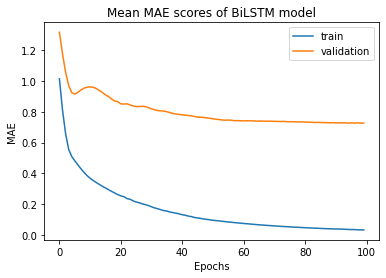

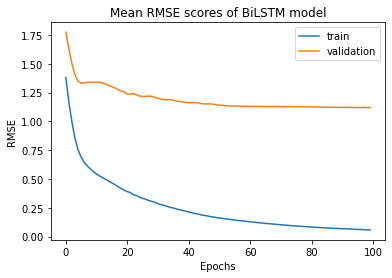

In [170]:
visualize_performance(results_inc_tcmt_cpt_sat_x)

Optimal Mean MAE: 0.7140648634172976 @ epoch 98
Optimal Mean RMSE: 1.133717327285558 @ epoch 99


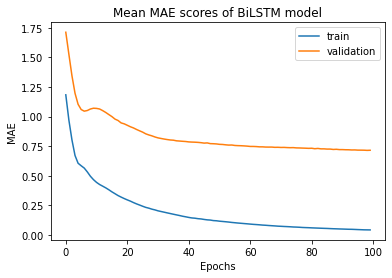

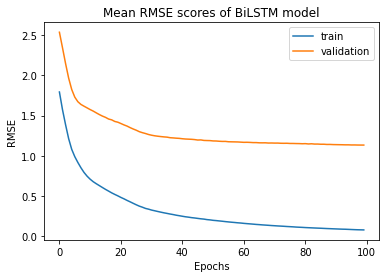

In [171]:
visualize_performance(results_inc_tcmt_cpt_sat_y)

Optimal Mean MAE: 0.7060511125251651 @ epoch 99
Optimal Mean RMSE: 1.090330440364778 @ epoch 99


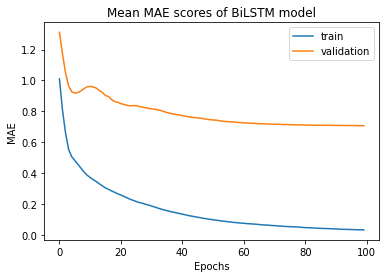

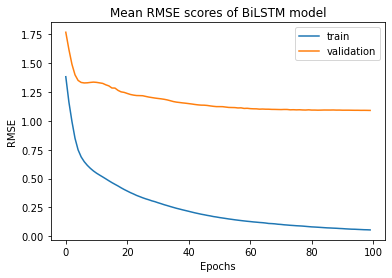

In [172]:
visualize_performance(results_inc_tcmt_cpt_sat_z)

### Tacheometry + CPT + Satellite

In [109]:
results_tcmt_cpt_sat_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True, incl_sat=True)
results_tcmt_cpt_sat_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True, incl_sat=True)
results_tcmt_cpt_sat_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=True, incl_sat=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.9888 - mean_absolute_error: 1.9526 - root_mean_squared_error: 2.6436 - val_loss: 11.6231 - val_mean_absolute_error: 2.7282 - val_root_mean_squared_error: 3.4093
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 6.2811 - mean_absolute_error: 1.8260 - root_mean_squared_error: 2.5062 - val_loss: 11.1027 - val_mean_absolute_error: 2.6633 - val_root_mean_squared_error: 3.3321
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 5.7343 - mean_absolute_error: 1.7397 - root_mean_squared_error: 2.3946 - val_loss: 10.8123 - val_mean_absolute_error: 2.6189 - val_root_mean_squared_error: 3.2882
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 5.2435 - mean_absolute_error: 1.6704 - root_mean_squared_error: 2.2899 - val_loss: 10.7656 - val_mean_absolute_error: 2.5970 - val_root_mean_squared_error: 3.2811
Epoch 5/100
1/1 [==============================] - 0s 41ms/ste

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5855 - mean_absolute_error: 0.4819 - root_mean_squared_error: 0.7652 - val_loss: 9.4942 - val_mean_absolute_error: 2.2490 - val_root_mean_squared_error: 3.0813
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5619 - mean_absolute_error: 0.4689 - root_mean_squared_error: 0.7496 - val_loss: 9.4409 - val_mean_absolute_error: 2.2426 - val_root_mean_squared_error: 3.0726
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.5408 - mean_absolute_error: 0.4595 - root_mean_squared_error: 0.7354 - val_loss: 9.3756 - val_mean_absolute_error: 2.2350 - val_root_mean_squared_error: 3.0620
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5209 - mean_absolute_error: 0.4496 - root_mean_squared_error: 0.7217 - val_loss: 9.3037 - val_mean_absolute_error: 2.2256 - val_root_mean_squared_error: 3.0502
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1625 - mean_absolute_error: 0.2339 - root_mean_squared_error: 0.4031 - val_loss: 7.5702 - val_mean_absolute_error: 1.9730 - val_root_mean_squared_error: 2.7514
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1576 - mean_absolute_error: 0.2314 - root_mean_squared_error: 0.3970 - val_loss: 7.5698 - val_mean_absolute_error: 1.9743 - val_root_mean_squared_error: 2.7513
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1538 - mean_absolute_error: 0.2269 - root_mean_squared_error: 0.3922 - val_loss: 7.5361 - val_mean_absolute_error: 1.9658 - val_root_mean_squared_error: 2.7452
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1474 - mean_absolute_error: 0.2229 - root_mean_squared_error: 0.3839 - val_loss: 7.5277 - val_mean_absolute_error: 1.9618 - val_root_mean_squared_error: 2.7437
Epoch 75/100
1/1 [==============================] - 0s 35ms/

  5%|████▏                                                                              | 1/20 [00:05<01:51,  5.89s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.3510 - mean_absolute_error: 0.9027 - root_mean_squared_error: 1.1623 - val_loss: 2.3755 - val_mean_absolute_error: 1.1933 - val_root_mean_squared_error: 1.5413
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1631 - mean_absolute_error: 0.8219 - root_mean_squared_error: 1.0785 - val_loss: 2.1955 - val_mean_absolute_error: 1.1366 - val_root_mean_squared_error: 1.4817
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.0405 - mean_absolute_error: 0.7674 - root_mean_squared_error: 1.0200 - val_loss: 2.0412 - val_mean_absolute_error: 1.0850 - val_root_mean_squared_error: 1.4287
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9457 - mean_absolute_error: 0.7226 - root_mean_squared_error: 0.9725 - val_loss: 1.8920 - val_mean_absolute_error: 1.0365 - val_root_mean_squared_error: 1.3755
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0547 - mean_absolute_error: 0.1619 - root_mean_squared_error: 0.2338 - val_loss: 0.3163 - val_mean_absolute_error: 0.4049 - val_root_mean_squared_error: 0.5624
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0528 - mean_absolute_error: 0.1580 - root_mean_squared_error: 0.2299 - val_loss: 0.3107 - val_mean_absolute_error: 0.3997 - val_root_mean_squared_error: 0.5574
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0513 - mean_absolute_error: 0.1551 - root_mean_squared_error: 0.2265 - val_loss: 0.3051 - val_mean_absolute_error: 0.3949 - val_root_mean_squared_error: 0.5524
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0498 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2231 - val_loss: 0.2993 - val_mean_absolute_error: 0.3907 - val_root_mean_squared_error: 0.5471
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0132 - mean_absolute_error: 0.0755 - root_mean_squared_error: 0.1149 - val_loss: 0.2005 - val_mean_absolute_error: 0.2942 - val_root_mean_squared_error: 0.4478
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0126 - mean_absolute_error: 0.0736 - root_mean_squared_error: 0.1124 - val_loss: 0.1989 - val_mean_absolute_error: 0.2919 - val_root_mean_squared_error: 0.4459
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0121 - mean_absolute_error: 0.0718 - root_mean_squared_error: 0.1099 - val_loss: 0.1970 - val_mean_absolute_error: 0.2892 - val_root_mean_squared_error: 0.4439
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0116 - mean_absolute_error: 0.0701 - root_mean_squared_error: 0.1076 - val_loss: 0.1953 - val_mean_absolute_error: 0.2868 - val_root_mean_squared_error: 0.4420
Epoch 75/100
1/1 [==============================] - 0s 29ms/

 10%|████████▎                                                                          | 2/20 [00:11<01:44,  5.83s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.8568 - mean_absolute_error: 1.2724 - root_mean_squared_error: 1.6902 - val_loss: 2.5032 - val_mean_absolute_error: 1.2422 - val_root_mean_squared_error: 1.5822
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.3771 - mean_absolute_error: 1.1295 - root_mean_squared_error: 1.5418 - val_loss: 2.2187 - val_mean_absolute_error: 1.1734 - val_root_mean_squared_error: 1.4895
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 2.0942 - mean_absolute_error: 1.0464 - root_mean_squared_error: 1.4471 - val_loss: 2.0302 - val_mean_absolute_error: 1.1285 - val_root_mean_squared_error: 1.4248
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 1.8975 - mean_absolute_error: 0.9889 - root_mean_squared_error: 1.3775 - val_loss: 1.8909 - val_mean_absolute_error: 1.0921 - val_root_mean_squared_error: 1.3751
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1440 - mean_absolute_error: 0.2772 - root_mean_squared_error: 0.3795 - val_loss: 0.6260 - val_mean_absolute_error: 0.6006 - val_root_mean_squared_error: 0.7912
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1403 - mean_absolute_error: 0.2744 - root_mean_squared_error: 0.3746 - val_loss: 0.6172 - val_mean_absolute_error: 0.5969 - val_root_mean_squared_error: 0.7856
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1360 - mean_absolute_error: 0.2703 - root_mean_squared_error: 0.3688 - val_loss: 0.6027 - val_mean_absolute_error: 0.5892 - val_root_mean_squared_error: 0.7763
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1313 - mean_absolute_error: 0.2654 - root_mean_squared_error: 0.3623 - val_loss: 0.5832 - val_mean_absolute_error: 0.5776 - val_root_mean_squared_error: 0.7637
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0159 - mean_absolute_error: 0.0938 - root_mean_squared_error: 0.1261 - val_loss: 0.2409 - val_mean_absolute_error: 0.3520 - val_root_mean_squared_error: 0.4909
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0149 - mean_absolute_error: 0.0907 - root_mean_squared_error: 0.1222 - val_loss: 0.2388 - val_mean_absolute_error: 0.3507 - val_root_mean_squared_error: 0.4887
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0140 - mean_absolute_error: 0.0878 - root_mean_squared_error: 0.1185 - val_loss: 0.2368 - val_mean_absolute_error: 0.3494 - val_root_mean_squared_error: 0.4866
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0132 - mean_absolute_error: 0.0850 - root_mean_squared_error: 0.1150 - val_loss: 0.2346 - val_mean_absolute_error: 0.3481 - val_root_mean_squared_error: 0.4843
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 15%|████████████▍                                                                      | 3/20 [00:17<01:41,  5.94s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.7127 - mean_absolute_error: 1.1381 - root_mean_squared_error: 1.6470 - val_loss: 4.0367 - val_mean_absolute_error: 1.3734 - val_root_mean_squared_error: 2.0091
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3639 - mean_absolute_error: 1.0326 - root_mean_squared_error: 1.5375 - val_loss: 3.7253 - val_mean_absolute_error: 1.3029 - val_root_mean_squared_error: 1.9301
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 2.1314 - mean_absolute_error: 0.9618 - root_mean_squared_error: 1.4599 - val_loss: 3.4686 - val_mean_absolute_error: 1.2504 - val_root_mean_squared_error: 1.8624
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.9403 - mean_absolute_error: 0.9075 - root_mean_squared_error: 1.3930 - val_loss: 3.2229 - val_mean_absolute_error: 1.1966 - val_root_mean_squared_error: 1.7953
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0314 - mean_absolute_error: 0.1392 - root_mean_squared_error: 0.1773 - val_loss: 0.8034 - val_mean_absolute_error: 0.3811 - val_root_mean_squared_error: 0.8963
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0285 - mean_absolute_error: 0.1317 - root_mean_squared_error: 0.1687 - val_loss: 0.8090 - val_mean_absolute_error: 0.3709 - val_root_mean_squared_error: 0.8995
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0259 - mean_absolute_error: 0.1257 - root_mean_squared_error: 0.1611 - val_loss: 0.8167 - val_mean_absolute_error: 0.3611 - val_root_mean_squared_error: 0.9037
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0243 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.1557 - val_loss: 0.8227 - val_mean_absolute_error: 0.3521 - val_root_mean_squared_error: 0.9070
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0034 - mean_absolute_error: 0.0452 - root_mean_squared_error: 0.0579 - val_loss: 0.8316 - val_mean_absolute_error: 0.2671 - val_root_mean_squared_error: 0.9119
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0033 - mean_absolute_error: 0.0447 - root_mean_squared_error: 0.0573 - val_loss: 0.8316 - val_mean_absolute_error: 0.2655 - val_root_mean_squared_error: 0.9119
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0032 - mean_absolute_error: 0.0441 - root_mean_squared_error: 0.0567 - val_loss: 0.8320 - val_mean_absolute_error: 0.2649 - val_root_mean_squared_error: 0.9121
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0031 - mean_absolute_error: 0.0434 - root_mean_squared_error: 0.0559 - val_loss: 0.8327 - val_mean_absolute_error: 0.2654 - val_root_mean_squared_error: 0.9125
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 20%|████████████████▌                                                                  | 4/20 [00:23<01:34,  5.93s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.4148 - mean_absolute_error: 1.5868 - root_mean_squared_error: 2.1011 - val_loss: 2.9864 - val_mean_absolute_error: 1.4100 - val_root_mean_squared_error: 1.7281
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.0829 - mean_absolute_error: 1.5054 - root_mean_squared_error: 2.0206 - val_loss: 2.7522 - val_mean_absolute_error: 1.3503 - val_root_mean_squared_error: 1.6590
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 3.8346 - mean_absolute_error: 1.4449 - root_mean_squared_error: 1.9582 - val_loss: 2.5706 - val_mean_absolute_error: 1.2991 - val_root_mean_squared_error: 1.6033
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 3.6095 - mean_absolute_error: 1.3874 - root_mean_squared_error: 1.8999 - val_loss: 2.4149 - val_mean_absolute_error: 1.2477 - val_root_mean_squared_error: 1.5540
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1431 - mean_absolute_error: 0.2841 - root_mean_squared_error: 0.3782 - val_loss: 0.9854 - val_mean_absolute_error: 0.7190 - val_root_mean_squared_error: 0.9927
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1345 - mean_absolute_error: 0.2744 - root_mean_squared_error: 0.3667 - val_loss: 0.9673 - val_mean_absolute_error: 0.7079 - val_root_mean_squared_error: 0.9835
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1271 - mean_absolute_error: 0.2662 - root_mean_squared_error: 0.3565 - val_loss: 0.9501 - val_mean_absolute_error: 0.6980 - val_root_mean_squared_error: 0.9747
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1204 - mean_absolute_error: 0.2586 - root_mean_squared_error: 0.3471 - val_loss: 0.9337 - val_mean_absolute_error: 0.6880 - val_root_mean_squared_error: 0.9663
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0300 - mean_absolute_error: 0.1082 - root_mean_squared_error: 0.1732 - val_loss: 0.6427 - val_mean_absolute_error: 0.5410 - val_root_mean_squared_error: 0.8017
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0292 - mean_absolute_error: 0.1064 - root_mean_squared_error: 0.1709 - val_loss: 0.6388 - val_mean_absolute_error: 0.5383 - val_root_mean_squared_error: 0.7993
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0285 - mean_absolute_error: 0.1046 - root_mean_squared_error: 0.1688 - val_loss: 0.6367 - val_mean_absolute_error: 0.5364 - val_root_mean_squared_error: 0.7979
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0278 - mean_absolute_error: 0.1030 - root_mean_squared_error: 0.1667 - val_loss: 0.6347 - val_mean_absolute_error: 0.5347 - val_root_mean_squared_error: 0.7967
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 25%|████████████████████▊                                                              | 5/20 [00:29<01:27,  5.81s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.6683 - mean_absolute_error: 1.3269 - root_mean_squared_error: 1.6335 - val_loss: 3.8959 - val_mean_absolute_error: 1.4028 - val_root_mean_squared_error: 1.9738
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.9596 - mean_absolute_error: 1.1257 - root_mean_squared_error: 1.3999 - val_loss: 3.2409 - val_mean_absolute_error: 1.2589 - val_root_mean_squared_error: 1.8003
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 1.5438 - mean_absolute_error: 0.9897 - root_mean_squared_error: 1.2425 - val_loss: 2.8515 - val_mean_absolute_error: 1.1688 - val_root_mean_squared_error: 1.6886
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.2785 - mean_absolute_error: 0.8945 - root_mean_squared_error: 1.1307 - val_loss: 2.6140 - val_mean_absolute_error: 1.1145 - val_root_mean_squared_error: 1.6168
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0861 - mean_absolute_error: 0.2107 - root_mean_squared_error: 0.2934 - val_loss: 1.5733 - val_mean_absolute_error: 0.8066 - val_root_mean_squared_error: 1.2543
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0824 - mean_absolute_error: 0.2066 - root_mean_squared_error: 0.2871 - val_loss: 1.5690 - val_mean_absolute_error: 0.8048 - val_root_mean_squared_error: 1.2526
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0797 - mean_absolute_error: 0.2032 - root_mean_squared_error: 0.2823 - val_loss: 1.5680 - val_mean_absolute_error: 0.8042 - val_root_mean_squared_error: 1.2522
Epoch 39/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0775 - mean_absolute_error: 0.2004 - root_mean_squared_error: 0.2785 - val_loss: 1.5686 - val_mean_absolute_error: 0.8041 - val_root_mean_squared_error: 1.2524
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0226 - mean_absolute_error: 0.1034 - root_mean_squared_error: 0.1503 - val_loss: 1.6064 - val_mean_absolute_error: 0.7517 - val_root_mean_squared_error: 1.2674
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0212 - mean_absolute_error: 0.1002 - root_mean_squared_error: 0.1457 - val_loss: 1.6065 - val_mean_absolute_error: 0.7499 - val_root_mean_squared_error: 1.2675
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0199 - mean_absolute_error: 0.0967 - root_mean_squared_error: 0.1412 - val_loss: 1.6072 - val_mean_absolute_error: 0.7482 - val_root_mean_squared_error: 1.2677
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0187 - mean_absolute_error: 0.0934 - root_mean_squared_error: 0.1367 - val_loss: 1.6083 - val_mean_absolute_error: 0.7461 - val_root_mean_squared_error: 1.2682
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 30%|████████████████████████▉                                                          | 6/20 [00:35<01:21,  5.81s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4308 - mean_absolute_error: 0.4979 - root_mean_squared_error: 0.6564 - val_loss: 1.2402 - val_mean_absolute_error: 0.8124 - val_root_mean_squared_error: 1.1136
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3894 - mean_absolute_error: 0.4706 - root_mean_squared_error: 0.6240 - val_loss: 1.1904 - val_mean_absolute_error: 0.7913 - val_root_mean_squared_error: 1.0911
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3588 - mean_absolute_error: 0.4512 - root_mean_squared_error: 0.5990 - val_loss: 1.1431 - val_mean_absolute_error: 0.7711 - val_root_mean_squared_error: 1.0691
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.3327 - mean_absolute_error: 0.4349 - root_mean_squared_error: 0.5768 - val_loss: 1.0937 - val_mean_absolute_error: 0.7509 - val_root_mean_squared_error: 1.0458
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0476 - mean_absolute_error: 0.1562 - root_mean_squared_error: 0.2182 - val_loss: 0.3298 - val_mean_absolute_error: 0.4161 - val_root_mean_squared_error: 0.5743
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0446 - mean_absolute_error: 0.1514 - root_mean_squared_error: 0.2113 - val_loss: 0.3202 - val_mean_absolute_error: 0.4106 - val_root_mean_squared_error: 0.5659
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0419 - mean_absolute_error: 0.1464 - root_mean_squared_error: 0.2047 - val_loss: 0.3153 - val_mean_absolute_error: 0.4068 - val_root_mean_squared_error: 0.5615
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0393 - mean_absolute_error: 0.1413 - root_mean_squared_error: 0.1983 - val_loss: 0.3148 - val_mean_absolute_error: 0.4054 - val_root_mean_squared_error: 0.5611
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0130 - mean_absolute_error: 0.0747 - root_mean_squared_error: 0.1140 - val_loss: 0.3038 - val_mean_absolute_error: 0.4016 - val_root_mean_squared_error: 0.5511
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0128 - mean_absolute_error: 0.0738 - root_mean_squared_error: 0.1130 - val_loss: 0.3081 - val_mean_absolute_error: 0.4049 - val_root_mean_squared_error: 0.5551
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0125 - mean_absolute_error: 0.0730 - root_mean_squared_error: 0.1119 - val_loss: 0.3005 - val_mean_absolute_error: 0.3991 - val_root_mean_squared_error: 0.5482
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0123 - mean_absolute_error: 0.0722 - root_mean_squared_error: 0.1109 - val_loss: 0.3039 - val_mean_absolute_error: 0.4014 - val_root_mean_squared_error: 0.5513
Epoch 75/100
1/1 [==============================] - 0s 30ms/

 35%|█████████████████████████████                                                      | 7/20 [00:40<01:15,  5.78s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.9876 - mean_absolute_error: 1.1458 - root_mean_squared_error: 1.4098 - val_loss: 2.2965 - val_mean_absolute_error: 1.1599 - val_root_mean_squared_error: 1.5154
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.3781 - mean_absolute_error: 0.9117 - root_mean_squared_error: 1.1739 - val_loss: 2.0046 - val_mean_absolute_error: 1.0583 - val_root_mean_squared_error: 1.4159
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.0907 - mean_absolute_error: 0.7803 - root_mean_squared_error: 1.0444 - val_loss: 1.8678 - val_mean_absolute_error: 1.0162 - val_root_mean_squared_error: 1.3667
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.9546 - mean_absolute_error: 0.7204 - root_mean_squared_error: 0.9770 - val_loss: 1.7924 - val_mean_absolute_error: 1.0034 - val_root_mean_squared_error: 1.3388
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1110 - mean_absolute_error: 0.2295 - root_mean_squared_error: 0.3332 - val_loss: 0.9458 - val_mean_absolute_error: 0.6238 - val_root_mean_squared_error: 0.9725
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1086 - mean_absolute_error: 0.2269 - root_mean_squared_error: 0.3295 - val_loss: 0.9422 - val_mean_absolute_error: 0.6205 - val_root_mean_squared_error: 0.9707
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1063 - mean_absolute_error: 0.2235 - root_mean_squared_error: 0.3260 - val_loss: 0.9385 - val_mean_absolute_error: 0.6177 - val_root_mean_squared_error: 0.9688
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1041 - mean_absolute_error: 0.2199 - root_mean_squared_error: 0.3227 - val_loss: 0.9349 - val_mean_absolute_error: 0.6149 - val_root_mean_squared_error: 0.9669
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0686 - mean_absolute_error: 0.1699 - root_mean_squared_error: 0.2619 - val_loss: 0.8362 - val_mean_absolute_error: 0.5726 - val_root_mean_squared_error: 0.9145
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0676 - mean_absolute_error: 0.1687 - root_mean_squared_error: 0.2600 - val_loss: 0.8319 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.9121
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0666 - mean_absolute_error: 0.1671 - root_mean_squared_error: 0.2580 - val_loss: 0.8258 - val_mean_absolute_error: 0.5736 - val_root_mean_squared_error: 0.9087
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0656 - mean_absolute_error: 0.1653 - root_mean_squared_error: 0.2561 - val_loss: 0.8212 - val_mean_absolute_error: 0.5730 - val_root_mean_squared_error: 0.9062
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:46<01:08,  5.68s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.4152 - mean_absolute_error: 1.3699 - root_mean_squared_error: 2.1012 - val_loss: 14.5909 - val_mean_absolute_error: 2.8317 - val_root_mean_squared_error: 3.8198
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 4.2021 - mean_absolute_error: 1.3113 - root_mean_squared_error: 2.0499 - val_loss: 14.2371 - val_mean_absolute_error: 2.7921 - val_root_mean_squared_error: 3.7732
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 4.0489 - mean_absolute_error: 1.2706 - root_mean_squared_error: 2.0122 - val_loss: 13.9163 - val_mean_absolute_error: 2.7561 - val_root_mean_squared_error: 3.7305
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 3.9133 - mean_absolute_error: 1.2362 - root_mean_squared_error: 1.9782 - val_loss: 13.5838 - val_mean_absolute_error: 2.7180 - val_root_mean_squared_error: 3.6856
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6266 - mean_absolute_error: 0.5464 - root_mean_squared_error: 0.7916 - val_loss: 6.9446 - val_mean_absolute_error: 1.9903 - val_root_mean_squared_error: 2.6353
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.6004 - mean_absolute_error: 0.5332 - root_mean_squared_error: 0.7749 - val_loss: 6.9380 - val_mean_absolute_error: 1.9854 - val_root_mean_squared_error: 2.6340
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.5754 - mean_absolute_error: 0.5196 - root_mean_squared_error: 0.7586 - val_loss: 6.9382 - val_mean_absolute_error: 1.9832 - val_root_mean_squared_error: 2.6341
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.5523 - mean_absolute_error: 0.5068 - root_mean_squared_error: 0.7432 - val_loss: 6.9493 - val_mean_absolute_error: 1.9841 - val_root_mean_squared_error: 2.6361
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2022 - mean_absolute_error: 0.2761 - root_mean_squared_error: 0.4496 - val_loss: 7.5504 - val_mean_absolute_error: 2.0761 - val_root_mean_squared_error: 2.7478
Epoch 72/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1969 - mean_absolute_error: 0.2746 - root_mean_squared_error: 0.4438 - val_loss: 7.4144 - val_mean_absolute_error: 2.0557 - val_root_mean_squared_error: 2.7229
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1914 - mean_absolute_error: 0.2686 - root_mean_squared_error: 0.4375 - val_loss: 7.5597 - val_mean_absolute_error: 2.0757 - val_root_mean_squared_error: 2.7495
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1856 - mean_absolute_error: 0.2655 - root_mean_squared_error: 0.4308 - val_loss: 7.5835 - val_mean_absolute_error: 2.0787 - val_root_mean_squared_error: 2.7538
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:52<01:02,  5.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.2912 - mean_absolute_error: 0.8379 - root_mean_squared_error: 1.1363 - val_loss: 3.0469 - val_mean_absolute_error: 1.2188 - val_root_mean_squared_error: 1.7455
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0888 - mean_absolute_error: 0.7384 - root_mean_squared_error: 1.0435 - val_loss: 2.9200 - val_mean_absolute_error: 1.1675 - val_root_mean_squared_error: 1.7088
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.9771 - mean_absolute_error: 0.6753 - root_mean_squared_error: 0.9885 - val_loss: 2.8421 - val_mean_absolute_error: 1.1350 - val_root_mean_squared_error: 1.6859
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9057 - mean_absolute_error: 0.6318 - root_mean_squared_error: 0.9517 - val_loss: 2.7812 - val_mean_absolute_error: 1.1134 - val_root_mean_squared_error: 1.6677
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0270 - mean_absolute_error: 0.1202 - root_mean_squared_error: 0.1642 - val_loss: 1.7218 - val_mean_absolute_error: 0.6679 - val_root_mean_squared_error: 1.3122
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0242 - mean_absolute_error: 0.1147 - root_mean_squared_error: 0.1555 - val_loss: 1.7134 - val_mean_absolute_error: 0.6614 - val_root_mean_squared_error: 1.3090
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0216 - mean_absolute_error: 0.1101 - root_mean_squared_error: 0.1471 - val_loss: 1.7116 - val_mean_absolute_error: 0.6569 - val_root_mean_squared_error: 1.3083
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0193 - mean_absolute_error: 0.1056 - root_mean_squared_error: 0.1391 - val_loss: 1.7141 - val_mean_absolute_error: 0.6538 - val_root_mean_squared_error: 1.3092
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0025 - mean_absolute_error: 0.0390 - root_mean_squared_error: 0.0504 - val_loss: 1.7307 - val_mean_absolute_error: 0.6100 - val_root_mean_squared_error: 1.3156
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0024 - mean_absolute_error: 0.0383 - root_mean_squared_error: 0.0495 - val_loss: 1.7314 - val_mean_absolute_error: 0.6097 - val_root_mean_squared_error: 1.3158
Epoch 73/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0024 - mean_absolute_error: 0.0375 - root_mean_squared_error: 0.0486 - val_loss: 1.7310 - val_mean_absolute_error: 0.6093 - val_root_mean_squared_error: 1.3157
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0023 - mean_absolute_error: 0.0369 - root_mean_squared_error: 0.0478 - val_loss: 1.7307 - val_mean_absolute_error: 0.6091 - val_root_mean_squared_error: 1.3155
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 50%|█████████████████████████████████████████                                         | 10/20 [00:57<00:55,  5.60s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 6.2496 - mean_absolute_error: 1.9277 - root_mean_squared_error: 2.4999 - val_loss: 9.6487 - val_mean_absolute_error: 2.3713 - val_root_mean_squared_error: 3.1062
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 5.3562 - mean_absolute_error: 1.7489 - root_mean_squared_error: 2.3144 - val_loss: 8.8870 - val_mean_absolute_error: 2.2547 - val_root_mean_squared_error: 2.9811
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 4.8939 - mean_absolute_error: 1.6539 - root_mean_squared_error: 2.2122 - val_loss: 8.4048 - val_mean_absolute_error: 2.1775 - val_root_mean_squared_error: 2.8991
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 4.6007 - mean_absolute_error: 1.5963 - root_mean_squared_error: 2.1449 - val_loss: 7.9385 - val_mean_absolute_error: 2.1083 - val_root_mean_squared_error: 2.8175
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2481 - mean_absolute_error: 0.3472 - root_mean_squared_error: 0.4981 - val_loss: 1.3868 - val_mean_absolute_error: 0.7432 - val_root_mean_squared_error: 1.1776
Epoch 37/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2369 - mean_absolute_error: 0.3379 - root_mean_squared_error: 0.4867 - val_loss: 1.3588 - val_mean_absolute_error: 0.7332 - val_root_mean_squared_error: 1.1657
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2258 - mean_absolute_error: 0.3276 - root_mean_squared_error: 0.4752 - val_loss: 1.3342 - val_mean_absolute_error: 0.7266 - val_root_mean_squared_error: 1.1551
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2152 - mean_absolute_error: 0.3173 - root_mean_squared_error: 0.4639 - val_loss: 1.3093 - val_mean_absolute_error: 0.7213 - val_root_mean_squared_error: 1.1443
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0557 - mean_absolute_error: 0.1494 - root_mean_squared_error: 0.2359 - val_loss: 0.9956 - val_mean_absolute_error: 0.6397 - val_root_mean_squared_error: 0.9978
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0535 - mean_absolute_error: 0.1465 - root_mean_squared_error: 0.2314 - val_loss: 0.9884 - val_mean_absolute_error: 0.6364 - val_root_mean_squared_error: 0.9942
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0514 - mean_absolute_error: 0.1437 - root_mean_squared_error: 0.2268 - val_loss: 0.9788 - val_mean_absolute_error: 0.6320 - val_root_mean_squared_error: 0.9894
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0494 - mean_absolute_error: 0.1411 - root_mean_squared_error: 0.2223 - val_loss: 0.9700 - val_mean_absolute_error: 0.6274 - val_root_mean_squared_error: 0.9849
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:03<00:51,  5.74s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 8.2974 - mean_absolute_error: 2.1603 - root_mean_squared_error: 2.8805 - val_loss: 11.2050 - val_mean_absolute_error: 2.5156 - val_root_mean_squared_error: 3.3474
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 7.6791 - mean_absolute_error: 2.0532 - root_mean_squared_error: 2.7711 - val_loss: 10.7132 - val_mean_absolute_error: 2.4499 - val_root_mean_squared_error: 3.2731
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 7.3070 - mean_absolute_error: 1.9893 - root_mean_squared_error: 2.7031 - val_loss: 10.1308 - val_mean_absolute_error: 2.3703 - val_root_mean_squared_error: 3.1829
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 6.8357 - mean_absolute_error: 1.9084 - root_mean_squared_error: 2.6145 - val_loss: 9.3429 - val_mean_absolute_error: 2.2661 - val_root_mean_squared_error: 3.0566
Epoch 5/100
1/1 [==============================] - 0s 33ms/step

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4106 - mean_absolute_error: 0.4288 - root_mean_squared_error: 0.6408 - val_loss: 3.0302 - val_mean_absolute_error: 1.2661 - val_root_mean_squared_error: 1.7407
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3886 - mean_absolute_error: 0.4187 - root_mean_squared_error: 0.6234 - val_loss: 2.9893 - val_mean_absolute_error: 1.2555 - val_root_mean_squared_error: 1.7290
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.3676 - mean_absolute_error: 0.4078 - root_mean_squared_error: 0.6063 - val_loss: 2.9474 - val_mean_absolute_error: 1.2450 - val_root_mean_squared_error: 1.7168
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.3474 - mean_absolute_error: 0.3958 - root_mean_squared_error: 0.5894 - val_loss: 2.9078 - val_mean_absolute_error: 1.2356 - val_root_mean_squared_error: 1.7052
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0909 - mean_absolute_error: 0.1979 - root_mean_squared_error: 0.3015 - val_loss: 2.3166 - val_mean_absolute_error: 1.1060 - val_root_mean_squared_error: 1.5220
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0887 - mean_absolute_error: 0.1951 - root_mean_squared_error: 0.2979 - val_loss: 2.3113 - val_mean_absolute_error: 1.1040 - val_root_mean_squared_error: 1.5203
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0867 - mean_absolute_error: 0.1924 - root_mean_squared_error: 0.2944 - val_loss: 2.3050 - val_mean_absolute_error: 1.1017 - val_root_mean_squared_error: 1.5182
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0847 - mean_absolute_error: 0.1899 - root_mean_squared_error: 0.2910 - val_loss: 2.2989 - val_mean_absolute_error: 1.0997 - val_root_mean_squared_error: 1.5162
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:09<00:45,  5.72s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4240 - mean_absolute_error: 0.5148 - root_mean_squared_error: 0.6511 - val_loss: 0.5565 - val_mean_absolute_error: 0.5806 - val_root_mean_squared_error: 0.7460
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2940 - mean_absolute_error: 0.4174 - root_mean_squared_error: 0.5422 - val_loss: 0.4648 - val_mean_absolute_error: 0.5289 - val_root_mean_squared_error: 0.6818
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2408 - mean_absolute_error: 0.3753 - root_mean_squared_error: 0.4907 - val_loss: 0.4122 - val_mean_absolute_error: 0.4970 - val_root_mean_squared_error: 0.6420
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2087 - mean_absolute_error: 0.3475 - root_mean_squared_error: 0.4568 - val_loss: 0.3750 - val_mean_absolute_error: 0.4721 - val_root_mean_squared_error: 0.6124
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0035 - mean_absolute_error: 0.0468 - root_mean_squared_error: 0.0592 - val_loss: 0.0082 - val_mean_absolute_error: 0.0731 - val_root_mean_squared_error: 0.0905
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0031 - mean_absolute_error: 0.0440 - root_mean_squared_error: 0.0560 - val_loss: 0.0075 - val_mean_absolute_error: 0.0698 - val_root_mean_squared_error: 0.0865
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0028 - mean_absolute_error: 0.0415 - root_mean_squared_error: 0.0529 - val_loss: 0.0071 - val_mean_absolute_error: 0.0678 - val_root_mean_squared_error: 0.0840
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0025 - mean_absolute_error: 0.0392 - root_mean_squared_error: 0.0501 - val_loss: 0.0069 - val_mean_absolute_error: 0.0669 - val_root_mean_squared_error: 0.0829
Epoch 40/100
1/1 [==============================] - 0s 36ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:14<00:39,  5.70s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.2325 - mean_absolute_error: 1.3292 - root_mean_squared_error: 1.7979 - val_loss: 10.7389 - val_mean_absolute_error: 2.4105 - val_root_mean_squared_error: 3.2770
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.4779 - mean_absolute_error: 1.0908 - root_mean_squared_error: 1.5741 - val_loss: 10.2858 - val_mean_absolute_error: 2.3389 - val_root_mean_squared_error: 3.2071
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 2.1558 - mean_absolute_error: 0.9750 - root_mean_squared_error: 1.4683 - val_loss: 9.9538 - val_mean_absolute_error: 2.2954 - val_root_mean_squared_error: 3.1550
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 1.9789 - mean_absolute_error: 0.9114 - root_mean_squared_error: 1.4067 - val_loss: 9.6486 - val_mean_absolute_error: 2.2538 - val_root_mean_squared_error: 3.1062
Epoch 5/100
1/1 [==============================] - 0s 35ms/step 

Epoch 36/100
1/1 [==============================] - 0s 36ms/step - loss: 0.4585 - mean_absolute_error: 0.4638 - root_mean_squared_error: 0.6772 - val_loss: 5.0733 - val_mean_absolute_error: 1.6410 - val_root_mean_squared_error: 2.2524
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.4363 - mean_absolute_error: 0.4541 - root_mean_squared_error: 0.6605 - val_loss: 4.9949 - val_mean_absolute_error: 1.6229 - val_root_mean_squared_error: 2.2349
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4170 - mean_absolute_error: 0.4454 - root_mean_squared_error: 0.6458 - val_loss: 4.9319 - val_mean_absolute_error: 1.6094 - val_root_mean_squared_error: 2.2208
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4002 - mean_absolute_error: 0.4370 - root_mean_squared_error: 0.6326 - val_loss: 4.8688 - val_mean_absolute_error: 1.5956 - val_root_mean_squared_error: 2.2065
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1552 - mean_absolute_error: 0.2531 - root_mean_squared_error: 0.3940 - val_loss: 4.7846 - val_mean_absolute_error: 1.5941 - val_root_mean_squared_error: 2.1874
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1501 - mean_absolute_error: 0.2491 - root_mean_squared_error: 0.3874 - val_loss: 4.7672 - val_mean_absolute_error: 1.5913 - val_root_mean_squared_error: 2.1834
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1456 - mean_absolute_error: 0.2468 - root_mean_squared_error: 0.3816 - val_loss: 4.7623 - val_mean_absolute_error: 1.5902 - val_root_mean_squared_error: 2.1823
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1416 - mean_absolute_error: 0.2441 - root_mean_squared_error: 0.3763 - val_loss: 4.7931 - val_mean_absolute_error: 1.5979 - val_root_mean_squared_error: 2.1893
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:20<00:35,  5.84s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8290 - mean_absolute_error: 0.6641 - root_mean_squared_error: 0.9105 - val_loss: 1.2302 - val_mean_absolute_error: 0.7900 - val_root_mean_squared_error: 1.1091
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 0.7055 - mean_absolute_error: 0.6022 - root_mean_squared_error: 0.8399 - val_loss: 1.1217 - val_mean_absolute_error: 0.7534 - val_root_mean_squared_error: 1.0591
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.6263 - mean_absolute_error: 0.5619 - root_mean_squared_error: 0.7914 - val_loss: 1.0399 - val_mean_absolute_error: 0.7291 - val_root_mean_squared_error: 1.0197
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.5688 - mean_absolute_error: 0.5378 - root_mean_squared_error: 0.7542 - val_loss: 0.9712 - val_mean_absolute_error: 0.7115 - val_root_mean_squared_error: 0.9855
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0462 - mean_absolute_error: 0.1426 - root_mean_squared_error: 0.2150 - val_loss: 0.1762 - val_mean_absolute_error: 0.3127 - val_root_mean_squared_error: 0.4197
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0448 - mean_absolute_error: 0.1403 - root_mean_squared_error: 0.2117 - val_loss: 0.1749 - val_mean_absolute_error: 0.3122 - val_root_mean_squared_error: 0.4182
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0434 - mean_absolute_error: 0.1381 - root_mean_squared_error: 0.2084 - val_loss: 0.1726 - val_mean_absolute_error: 0.3110 - val_root_mean_squared_error: 0.4155
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0420 - mean_absolute_error: 0.1361 - root_mean_squared_error: 0.2050 - val_loss: 0.1706 - val_mean_absolute_error: 0.3094 - val_root_mean_squared_error: 0.4130
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0120 - mean_absolute_error: 0.0698 - root_mean_squared_error: 0.1096 - val_loss: 0.1416 - val_mean_absolute_error: 0.2803 - val_root_mean_squared_error: 0.3763
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0115 - mean_absolute_error: 0.0685 - root_mean_squared_error: 0.1074 - val_loss: 0.1414 - val_mean_absolute_error: 0.2798 - val_root_mean_squared_error: 0.3760
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0111 - mean_absolute_error: 0.0671 - root_mean_squared_error: 0.1053 - val_loss: 0.1418 - val_mean_absolute_error: 0.2799 - val_root_mean_squared_error: 0.3765
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0106 - mean_absolute_error: 0.0658 - root_mean_squared_error: 0.1032 - val_loss: 0.1419 - val_mean_absolute_error: 0.2798 - val_root_mean_squared_error: 0.3767
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:38<00:47,  9.44s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0720 - mean_absolute_error: 0.8398 - root_mean_squared_error: 1.0354 - val_loss: 1.6425 - val_mean_absolute_error: 1.0217 - val_root_mean_squared_error: 1.2816
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 0.9270 - mean_absolute_error: 0.7673 - root_mean_squared_error: 0.9628 - val_loss: 1.5129 - val_mean_absolute_error: 0.9743 - val_root_mean_squared_error: 1.2300
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8249 - mean_absolute_error: 0.7144 - root_mean_squared_error: 0.9082 - val_loss: 1.4161 - val_mean_absolute_error: 0.9382 - val_root_mean_squared_error: 1.1900
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 0.7452 - mean_absolute_error: 0.6710 - root_mean_squared_error: 0.8633 - val_loss: 1.3422 - val_mean_absolute_error: 0.9076 - val_root_mean_squared_error: 1.1585
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1140 - mean_absolute_error: 0.2024 - root_mean_squared_error: 0.3377 - val_loss: 0.9561 - val_mean_absolute_error: 0.6313 - val_root_mean_squared_error: 0.9778
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1109 - mean_absolute_error: 0.1992 - root_mean_squared_error: 0.3331 - val_loss: 0.9693 - val_mean_absolute_error: 0.6381 - val_root_mean_squared_error: 0.9845
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1078 - mean_absolute_error: 0.1954 - root_mean_squared_error: 0.3283 - val_loss: 0.9831 - val_mean_absolute_error: 0.6446 - val_root_mean_squared_error: 0.9915
Epoch 39/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1046 - mean_absolute_error: 0.1913 - root_mean_squared_error: 0.3234 - val_loss: 0.9958 - val_mean_absolute_error: 0.6499 - val_root_mean_squared_error: 0.9979
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0422 - mean_absolute_error: 0.1145 - root_mean_squared_error: 0.2055 - val_loss: 1.1036 - val_mean_absolute_error: 0.6549 - val_root_mean_squared_error: 1.0505
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0414 - mean_absolute_error: 0.1133 - root_mean_squared_error: 0.2034 - val_loss: 1.0996 - val_mean_absolute_error: 0.6534 - val_root_mean_squared_error: 1.0486
Epoch 73/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0405 - mean_absolute_error: 0.1128 - root_mean_squared_error: 0.2013 - val_loss: 1.1007 - val_mean_absolute_error: 0.6536 - val_root_mean_squared_error: 1.0491
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0397 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.1992 - val_loss: 1.0958 - val_mean_absolute_error: 0.6524 - val_root_mean_squared_error: 1.0468
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:45<00:34,  8.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4933 - mean_absolute_error: 0.9629 - root_mean_squared_error: 1.2220 - val_loss: 4.7466 - val_mean_absolute_error: 1.6444 - val_root_mean_squared_error: 2.1787
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.0947 - mean_absolute_error: 0.7947 - root_mean_squared_error: 1.0463 - val_loss: 4.3727 - val_mean_absolute_error: 1.5647 - val_root_mean_squared_error: 2.0911
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8598 - mean_absolute_error: 0.6823 - root_mean_squared_error: 0.9272 - val_loss: 4.1346 - val_mean_absolute_error: 1.5150 - val_root_mean_squared_error: 2.0334
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7134 - mean_absolute_error: 0.6087 - root_mean_squared_error: 0.8446 - val_loss: 3.9740 - val_mean_absolute_error: 1.4822 - val_root_mean_squared_error: 1.9935
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0498 - mean_absolute_error: 0.1263 - root_mean_squared_error: 0.2231 - val_loss: 2.9111 - val_mean_absolute_error: 1.1963 - val_root_mean_squared_error: 1.7062
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0485 - mean_absolute_error: 0.1233 - root_mean_squared_error: 0.2203 - val_loss: 2.9151 - val_mean_absolute_error: 1.1968 - val_root_mean_squared_error: 1.7074
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0474 - mean_absolute_error: 0.1202 - root_mean_squared_error: 0.2177 - val_loss: 2.9213 - val_mean_absolute_error: 1.1976 - val_root_mean_squared_error: 1.7092
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0464 - mean_absolute_error: 0.1170 - root_mean_squared_error: 0.2153 - val_loss: 2.9285 - val_mean_absolute_error: 1.1985 - val_root_mean_squared_error: 1.7113
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0316 - mean_absolute_error: 0.0808 - root_mean_squared_error: 0.1778 - val_loss: 2.8768 - val_mean_absolute_error: 1.1760 - val_root_mean_squared_error: 1.6961
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0313 - mean_absolute_error: 0.0803 - root_mean_squared_error: 0.1768 - val_loss: 2.8732 - val_mean_absolute_error: 1.1751 - val_root_mean_squared_error: 1.6951
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0309 - mean_absolute_error: 0.0798 - root_mean_squared_error: 0.1758 - val_loss: 2.8695 - val_mean_absolute_error: 1.1744 - val_root_mean_squared_error: 1.6940
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0306 - mean_absolute_error: 0.0793 - root_mean_squared_error: 0.1748 - val_loss: 2.8656 - val_mean_absolute_error: 1.1738 - val_root_mean_squared_error: 1.6928
Epoch 75/100
1/1 [==============================] - 0s 32ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:52<00:24,  8.04s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7318 - mean_absolute_error: 0.6576 - root_mean_squared_error: 0.8555 - val_loss: 1.5751 - val_mean_absolute_error: 1.0307 - val_root_mean_squared_error: 1.2550
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5908 - mean_absolute_error: 0.5773 - root_mean_squared_error: 0.7686 - val_loss: 1.4457 - val_mean_absolute_error: 0.9944 - val_root_mean_squared_error: 1.2024
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 0.5093 - mean_absolute_error: 0.5265 - root_mean_squared_error: 0.7137 - val_loss: 1.3565 - val_mean_absolute_error: 0.9679 - val_root_mean_squared_error: 1.1647
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4553 - mean_absolute_error: 0.4919 - root_mean_squared_error: 0.6747 - val_loss: 1.2839 - val_mean_absolute_error: 0.9418 - val_root_mean_squared_error: 1.1331
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1337 - mean_absolute_error: 0.2758 - root_mean_squared_error: 0.3657 - val_loss: 0.5229 - val_mean_absolute_error: 0.5456 - val_root_mean_squared_error: 0.7231
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1295 - mean_absolute_error: 0.2711 - root_mean_squared_error: 0.3598 - val_loss: 0.5164 - val_mean_absolute_error: 0.5400 - val_root_mean_squared_error: 0.7186
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1251 - mean_absolute_error: 0.2656 - root_mean_squared_error: 0.3537 - val_loss: 0.5092 - val_mean_absolute_error: 0.5337 - val_root_mean_squared_error: 0.7136
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1207 - mean_absolute_error: 0.2599 - root_mean_squared_error: 0.3474 - val_loss: 0.5015 - val_mean_absolute_error: 0.5263 - val_root_mean_squared_error: 0.7082
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0375 - mean_absolute_error: 0.1380 - root_mean_squared_error: 0.1937 - val_loss: 0.4924 - val_mean_absolute_error: 0.5116 - val_root_mean_squared_error: 0.7017
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0364 - mean_absolute_error: 0.1357 - root_mean_squared_error: 0.1907 - val_loss: 0.4882 - val_mean_absolute_error: 0.5039 - val_root_mean_squared_error: 0.6987
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0353 - mean_absolute_error: 0.1327 - root_mean_squared_error: 0.1878 - val_loss: 0.5001 - val_mean_absolute_error: 0.5142 - val_root_mean_squared_error: 0.7072
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0341 - mean_absolute_error: 0.1307 - root_mean_squared_error: 0.1846 - val_loss: 0.4990 - val_mean_absolute_error: 0.5088 - val_root_mean_squared_error: 0.7064
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:59<00:15,  7.77s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.7977 - mean_absolute_error: 1.0130 - root_mean_squared_error: 1.3408 - val_loss: 2.9968 - val_mean_absolute_error: 1.3593 - val_root_mean_squared_error: 1.7311
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.5984 - mean_absolute_error: 0.9418 - root_mean_squared_error: 1.2643 - val_loss: 2.7685 - val_mean_absolute_error: 1.3050 - val_root_mean_squared_error: 1.6639
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 1.4745 - mean_absolute_error: 0.9017 - root_mean_squared_error: 1.2143 - val_loss: 2.6030 - val_mean_absolute_error: 1.2693 - val_root_mean_squared_error: 1.6134
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3717 - mean_absolute_error: 0.8697 - root_mean_squared_error: 1.1712 - val_loss: 2.4555 - val_mean_absolute_error: 1.2362 - val_root_mean_squared_error: 1.5670
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0507 - mean_absolute_error: 0.1601 - root_mean_squared_error: 0.2251 - val_loss: 0.7802 - val_mean_absolute_error: 0.6057 - val_root_mean_squared_error: 0.8833
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0491 - mean_absolute_error: 0.1573 - root_mean_squared_error: 0.2215 - val_loss: 0.7772 - val_mean_absolute_error: 0.6037 - val_root_mean_squared_error: 0.8816
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0476 - mean_absolute_error: 0.1543 - root_mean_squared_error: 0.2181 - val_loss: 0.7742 - val_mean_absolute_error: 0.6014 - val_root_mean_squared_error: 0.8799
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0460 - mean_absolute_error: 0.1507 - root_mean_squared_error: 0.2145 - val_loss: 0.7730 - val_mean_absolute_error: 0.6001 - val_root_mean_squared_error: 0.8792
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0184 - mean_absolute_error: 0.0902 - root_mean_squared_error: 0.1356 - val_loss: 0.8897 - val_mean_absolute_error: 0.6153 - val_root_mean_squared_error: 0.9432
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0178 - mean_absolute_error: 0.0884 - root_mean_squared_error: 0.1336 - val_loss: 0.8948 - val_mean_absolute_error: 0.6162 - val_root_mean_squared_error: 0.9460
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0173 - mean_absolute_error: 0.0868 - root_mean_squared_error: 0.1316 - val_loss: 0.8957 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9464
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0168 - mean_absolute_error: 0.0853 - root_mean_squared_error: 0.1298 - val_loss: 0.8958 - val_mean_absolute_error: 0.6147 - val_root_mean_squared_error: 0.9465
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:06<00:07,  7.70s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0091 - mean_absolute_error: 1.1308 - root_mean_squared_error: 1.4174 - val_loss: 2.2920 - val_mean_absolute_error: 1.1800 - val_root_mean_squared_error: 1.5139
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 1.2627 - mean_absolute_error: 0.8764 - root_mean_squared_error: 1.1237 - val_loss: 1.9785 - val_mean_absolute_error: 1.0899 - val_root_mean_squared_error: 1.4066
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9244 - mean_absolute_error: 0.7428 - root_mean_squared_error: 0.9614 - val_loss: 1.7841 - val_mean_absolute_error: 1.0283 - val_root_mean_squared_error: 1.3357
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7347 - mean_absolute_error: 0.6575 - root_mean_squared_error: 0.8572 - val_loss: 1.6586 - val_mean_absolute_error: 0.9907 - val_root_mean_squared_error: 1.2879
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0961 - mean_absolute_error: 0.1927 - root_mean_squared_error: 0.3099 - val_loss: 0.9993 - val_mean_absolute_error: 0.7524 - val_root_mean_squared_error: 0.9997
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0944 - mean_absolute_error: 0.1900 - root_mean_squared_error: 0.3073 - val_loss: 0.9966 - val_mean_absolute_error: 0.7518 - val_root_mean_squared_error: 0.9983
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0929 - mean_absolute_error: 0.1874 - root_mean_squared_error: 0.3047 - val_loss: 0.9928 - val_mean_absolute_error: 0.7509 - val_root_mean_squared_error: 0.9964
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0915 - mean_absolute_error: 0.1858 - root_mean_squared_error: 0.3025 - val_loss: 0.9895 - val_mean_absolute_error: 0.7501 - val_root_mean_squared_error: 0.9947
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0682 - mean_absolute_error: 0.1537 - root_mean_squared_error: 0.2612 - val_loss: 1.0128 - val_mean_absolute_error: 0.7443 - val_root_mean_squared_error: 1.0064
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0676 - mean_absolute_error: 0.1530 - root_mean_squared_error: 0.2600 - val_loss: 1.0153 - val_mean_absolute_error: 0.7446 - val_root_mean_squared_error: 1.0076
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0670 - mean_absolute_error: 0.1521 - root_mean_squared_error: 0.2588 - val_loss: 1.0175 - val_mean_absolute_error: 0.7448 - val_root_mean_squared_error: 1.0087
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0663 - mean_absolute_error: 0.1513 - root_mean_squared_error: 0.2576 - val_loss: 1.0194 - val_mean_absolute_error: 0.7448 - val_root_mean_squared_error: 1.0096
Epoch 75/100
1/1 [==============================] - 0s 43ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 10.1276 - mean_absolute_error: 2.1749 - root_mean_squared_error: 3.1824 - val_loss: 13.3603 - val_mean_absolute_error: 2.6230 - val_root_mean_squared_error: 3.6552
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 9.4290 - mean_absolute_error: 2.0764 - root_mean_squared_error: 3.0707 - val_loss: 12.6363 - val_mean_absolute_error: 2.5451 - val_root_mean_squared_error: 3.5548
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 8.8431 - mean_absolute_error: 1.9995 - root_mean_squared_error: 2.9737 - val_loss: 11.9278 - val_mean_absolute_error: 2.4676 - val_root_mean_squared_error: 3.4537
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 8.2559 - mean_absolute_error: 1.9250 - root_mean_squared_error: 2.8733 - val_loss: 11.1950 - val_mean_absolute_error: 2.3980 - val_root_mean_squared_error: 3.3459
Epoch 5/100
1/1 [==============================] - 0s 38ms/st

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7585 - mean_absolute_error: 0.5697 - root_mean_squared_error: 0.8709 - val_loss: 4.3823 - val_mean_absolute_error: 1.4124 - val_root_mean_squared_error: 2.0934
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.7237 - mean_absolute_error: 0.5528 - root_mean_squared_error: 0.8507 - val_loss: 4.3404 - val_mean_absolute_error: 1.3992 - val_root_mean_squared_error: 2.0834
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6896 - mean_absolute_error: 0.5342 - root_mean_squared_error: 0.8305 - val_loss: 4.2989 - val_mean_absolute_error: 1.3899 - val_root_mean_squared_error: 2.0734
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6601 - mean_absolute_error: 0.5192 - root_mean_squared_error: 0.8124 - val_loss: 4.2646 - val_mean_absolute_error: 1.3835 - val_root_mean_squared_error: 2.0651
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2791 - mean_absolute_error: 0.2818 - root_mean_squared_error: 0.5283 - val_loss: 4.5552 - val_mean_absolute_error: 1.3860 - val_root_mean_squared_error: 2.1343
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2743 - mean_absolute_error: 0.2797 - root_mean_squared_error: 0.5237 - val_loss: 4.5630 - val_mean_absolute_error: 1.3859 - val_root_mean_squared_error: 2.1361
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2695 - mean_absolute_error: 0.2773 - root_mean_squared_error: 0.5191 - val_loss: 4.5732 - val_mean_absolute_error: 1.3860 - val_root_mean_squared_error: 2.1385
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.2648 - mean_absolute_error: 0.2748 - root_mean_squared_error: 0.5146 - val_loss: 4.5804 - val_mean_absolute_error: 1.3851 - val_root_mean_squared_error: 2.1402
Epoch 75/100
1/1 [==============================] - 0s 39ms/

  5%|████▏                                                                              | 1/20 [00:07<02:27,  7.76s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.6497 - mean_absolute_error: 1.4199 - root_mean_squared_error: 1.9104 - val_loss: 4.9538 - val_mean_absolute_error: 1.6208 - val_root_mean_squared_error: 2.2257
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 3.3032 - mean_absolute_error: 1.3158 - root_mean_squared_error: 1.8175 - val_loss: 4.6537 - val_mean_absolute_error: 1.5482 - val_root_mean_squared_error: 2.1573
Epoch 3/100
1/1 [==============================] - 0s 33ms/step - loss: 3.0781 - mean_absolute_error: 1.2496 - root_mean_squared_error: 1.7544 - val_loss: 4.3990 - val_mean_absolute_error: 1.4939 - val_root_mean_squared_error: 2.0974
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 2.8862 - mean_absolute_error: 1.1977 - root_mean_squared_error: 1.6989 - val_loss: 4.1399 - val_mean_absolute_error: 1.4391 - val_root_mean_squared_error: 2.0347
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1253 - mean_absolute_error: 0.2606 - root_mean_squared_error: 0.3540 - val_loss: 0.6096 - val_mean_absolute_error: 0.5794 - val_root_mean_squared_error: 0.7807
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1206 - mean_absolute_error: 0.2542 - root_mean_squared_error: 0.3473 - val_loss: 0.6046 - val_mean_absolute_error: 0.5763 - val_root_mean_squared_error: 0.7776
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1156 - mean_absolute_error: 0.2471 - root_mean_squared_error: 0.3400 - val_loss: 0.5970 - val_mean_absolute_error: 0.5729 - val_root_mean_squared_error: 0.7727
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1108 - mean_absolute_error: 0.2402 - root_mean_squared_error: 0.3329 - val_loss: 0.5887 - val_mean_absolute_error: 0.5693 - val_root_mean_squared_error: 0.7673
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0221 - mean_absolute_error: 0.1048 - root_mean_squared_error: 0.1488 - val_loss: 0.3372 - val_mean_absolute_error: 0.3974 - val_root_mean_squared_error: 0.5807
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0207 - mean_absolute_error: 0.1011 - root_mean_squared_error: 0.1437 - val_loss: 0.3319 - val_mean_absolute_error: 0.3934 - val_root_mean_squared_error: 0.5761
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0192 - mean_absolute_error: 0.0972 - root_mean_squared_error: 0.1386 - val_loss: 0.3272 - val_mean_absolute_error: 0.3899 - val_root_mean_squared_error: 0.5720
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0179 - mean_absolute_error: 0.0936 - root_mean_squared_error: 0.1338 - val_loss: 0.3237 - val_mean_absolute_error: 0.3872 - val_root_mean_squared_error: 0.5689
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:19,  7.73s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.9868 - mean_absolute_error: 1.3326 - root_mean_squared_error: 1.7282 - val_loss: 3.6191 - val_mean_absolute_error: 1.4945 - val_root_mean_squared_error: 1.9024
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 2.5805 - mean_absolute_error: 1.2281 - root_mean_squared_error: 1.6064 - val_loss: 3.2943 - val_mean_absolute_error: 1.4229 - val_root_mean_squared_error: 1.8150
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 2.3129 - mean_absolute_error: 1.1565 - root_mean_squared_error: 1.5208 - val_loss: 3.0519 - val_mean_absolute_error: 1.3632 - val_root_mean_squared_error: 1.7470
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.1126 - mean_absolute_error: 1.1021 - root_mean_squared_error: 1.4535 - val_loss: 2.8518 - val_mean_absolute_error: 1.3033 - val_root_mean_squared_error: 1.6887
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0914 - mean_absolute_error: 0.2194 - root_mean_squared_error: 0.3023 - val_loss: 0.3680 - val_mean_absolute_error: 0.4376 - val_root_mean_squared_error: 0.6066
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0890 - mean_absolute_error: 0.2164 - root_mean_squared_error: 0.2983 - val_loss: 0.3679 - val_mean_absolute_error: 0.4374 - val_root_mean_squared_error: 0.6065
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0864 - mean_absolute_error: 0.2129 - root_mean_squared_error: 0.2940 - val_loss: 0.3683 - val_mean_absolute_error: 0.4381 - val_root_mean_squared_error: 0.6068
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0840 - mean_absolute_error: 0.2096 - root_mean_squared_error: 0.2898 - val_loss: 0.3700 - val_mean_absolute_error: 0.4395 - val_root_mean_squared_error: 0.6083
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0382 - mean_absolute_error: 0.1310 - root_mean_squared_error: 0.1954 - val_loss: 0.3007 - val_mean_absolute_error: 0.3748 - val_root_mean_squared_error: 0.5484
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0369 - mean_absolute_error: 0.1286 - root_mean_squared_error: 0.1920 - val_loss: 0.2957 - val_mean_absolute_error: 0.3706 - val_root_mean_squared_error: 0.5438
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0356 - mean_absolute_error: 0.1264 - root_mean_squared_error: 0.1886 - val_loss: 0.2894 - val_mean_absolute_error: 0.3655 - val_root_mean_squared_error: 0.5379
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0343 - mean_absolute_error: 0.1240 - root_mean_squared_error: 0.1851 - val_loss: 0.2828 - val_mean_absolute_error: 0.3599 - val_root_mean_squared_error: 0.5317
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 15%|████████████▍                                                                      | 3/20 [00:23<02:09,  7.64s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.4341 - mean_absolute_error: 1.4096 - root_mean_squared_error: 2.9042 - val_loss: 13.9315 - val_mean_absolute_error: 1.8892 - val_root_mean_squared_error: 3.7325
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 7.9298 - mean_absolute_error: 1.3400 - root_mean_squared_error: 2.8160 - val_loss: 13.2018 - val_mean_absolute_error: 1.8264 - val_root_mean_squared_error: 3.6334
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 7.5126 - mean_absolute_error: 1.2986 - root_mean_squared_error: 2.7409 - val_loss: 12.4992 - val_mean_absolute_error: 1.7814 - val_root_mean_squared_error: 3.5354
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 7.1211 - mean_absolute_error: 1.2677 - root_mean_squared_error: 2.6685 - val_loss: 11.7841 - val_mean_absolute_error: 1.7525 - val_root_mean_squared_error: 3.4328
Epoch 5/100
1/1 [==============================] - 0s 32ms/ste

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1371 - mean_absolute_error: 0.2914 - root_mean_squared_error: 0.3702 - val_loss: 1.6453 - val_mean_absolute_error: 0.6556 - val_root_mean_squared_error: 1.2827
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1225 - mean_absolute_error: 0.2746 - root_mean_squared_error: 0.3499 - val_loss: 1.6143 - val_mean_absolute_error: 0.6439 - val_root_mean_squared_error: 1.2705
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1099 - mean_absolute_error: 0.2603 - root_mean_squared_error: 0.3315 - val_loss: 1.5662 - val_mean_absolute_error: 0.6182 - val_root_mean_squared_error: 1.2515
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0975 - mean_absolute_error: 0.2454 - root_mean_squared_error: 0.3122 - val_loss: 1.5135 - val_mean_absolute_error: 0.5860 - val_root_mean_squared_error: 1.2303
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0121 - mean_absolute_error: 0.0865 - root_mean_squared_error: 0.1102 - val_loss: 1.3678 - val_mean_absolute_error: 0.4090 - val_root_mean_squared_error: 1.1695
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0116 - mean_absolute_error: 0.0842 - root_mean_squared_error: 0.1075 - val_loss: 1.3676 - val_mean_absolute_error: 0.4088 - val_root_mean_squared_error: 1.1694
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0111 - mean_absolute_error: 0.0823 - root_mean_squared_error: 0.1054 - val_loss: 1.3682 - val_mean_absolute_error: 0.4080 - val_root_mean_squared_error: 1.1697
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0108 - mean_absolute_error: 0.0811 - root_mean_squared_error: 0.1039 - val_loss: 1.3666 - val_mean_absolute_error: 0.4053 - val_root_mean_squared_error: 1.1690
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 20%|████████████████▌                                                                  | 4/20 [00:30<02:02,  7.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.6760 - mean_absolute_error: 1.7601 - root_mean_squared_error: 2.5838 - val_loss: 5.7794 - val_mean_absolute_error: 1.8287 - val_root_mean_squared_error: 2.4040
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 6.3323 - mean_absolute_error: 1.6862 - root_mean_squared_error: 2.5164 - val_loss: 5.3542 - val_mean_absolute_error: 1.7453 - val_root_mean_squared_error: 2.3139
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 6.0218 - mean_absolute_error: 1.6248 - root_mean_squared_error: 2.4539 - val_loss: 4.9306 - val_mean_absolute_error: 1.6594 - val_root_mean_squared_error: 2.2205
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 5.6914 - mean_absolute_error: 1.5622 - root_mean_squared_error: 2.3857 - val_loss: 4.4735 - val_mean_absolute_error: 1.5664 - val_root_mean_squared_error: 2.1151
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1902 - mean_absolute_error: 0.3264 - root_mean_squared_error: 0.4361 - val_loss: 0.9727 - val_mean_absolute_error: 0.7238 - val_root_mean_squared_error: 0.9862
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1811 - mean_absolute_error: 0.3169 - root_mean_squared_error: 0.4255 - val_loss: 0.9420 - val_mean_absolute_error: 0.7083 - val_root_mean_squared_error: 0.9705
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1728 - mean_absolute_error: 0.3091 - root_mean_squared_error: 0.4157 - val_loss: 0.9139 - val_mean_absolute_error: 0.6959 - val_root_mean_squared_error: 0.9560
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1648 - mean_absolute_error: 0.3015 - root_mean_squared_error: 0.4060 - val_loss: 0.8897 - val_mean_absolute_error: 0.6863 - val_root_mean_squared_error: 0.9433
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0614 - mean_absolute_error: 0.1683 - root_mean_squared_error: 0.2477 - val_loss: 0.5812 - val_mean_absolute_error: 0.5520 - val_root_mean_squared_error: 0.7624
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0597 - mean_absolute_error: 0.1655 - root_mean_squared_error: 0.2443 - val_loss: 0.5726 - val_mean_absolute_error: 0.5477 - val_root_mean_squared_error: 0.7567
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0580 - mean_absolute_error: 0.1626 - root_mean_squared_error: 0.2409 - val_loss: 0.5643 - val_mean_absolute_error: 0.5432 - val_root_mean_squared_error: 0.7512
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0564 - mean_absolute_error: 0.1598 - root_mean_squared_error: 0.2374 - val_loss: 0.5570 - val_mean_absolute_error: 0.5389 - val_root_mean_squared_error: 0.7463
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 25%|████████████████████▊                                                              | 5/20 [00:38<01:53,  7.58s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.4605 - mean_absolute_error: 1.9756 - root_mean_squared_error: 2.7314 - val_loss: 19.8866 - val_mean_absolute_error: 3.1600 - val_root_mean_squared_error: 4.4594
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 6.4618 - mean_absolute_error: 1.7604 - root_mean_squared_error: 2.5420 - val_loss: 18.6599 - val_mean_absolute_error: 3.0357 - val_root_mean_squared_error: 4.3197
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 5.8163 - mean_absolute_error: 1.6341 - root_mean_squared_error: 2.4117 - val_loss: 17.6025 - val_mean_absolute_error: 2.9435 - val_root_mean_squared_error: 4.1955
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 5.3169 - mean_absolute_error: 1.5481 - root_mean_squared_error: 2.3058 - val_loss: 16.5884 - val_mean_absolute_error: 2.8628 - val_root_mean_squared_error: 4.0729
Epoch 5/100
1/1 [==============================] - 0s 44ms/ste

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1667 - mean_absolute_error: 0.3128 - root_mean_squared_error: 0.4083 - val_loss: 2.9727 - val_mean_absolute_error: 0.9835 - val_root_mean_squared_error: 1.7242
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1578 - mean_absolute_error: 0.3057 - root_mean_squared_error: 0.3972 - val_loss: 2.9806 - val_mean_absolute_error: 0.9802 - val_root_mean_squared_error: 1.7264
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1494 - mean_absolute_error: 0.2973 - root_mean_squared_error: 0.3865 - val_loss: 3.0026 - val_mean_absolute_error: 0.9804 - val_root_mean_squared_error: 1.7328
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1416 - mean_absolute_error: 0.2890 - root_mean_squared_error: 0.3763 - val_loss: 3.0336 - val_mean_absolute_error: 0.9812 - val_root_mean_squared_error: 1.7417
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 65ms/step - loss: 0.0490 - mean_absolute_error: 0.1609 - root_mean_squared_error: 0.2214 - val_loss: 2.8498 - val_mean_absolute_error: 0.8775 - val_root_mean_squared_error: 1.6881
Epoch 72/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0477 - mean_absolute_error: 0.1583 - root_mean_squared_error: 0.2185 - val_loss: 2.8374 - val_mean_absolute_error: 0.8726 - val_root_mean_squared_error: 1.6844
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0465 - mean_absolute_error: 0.1562 - root_mean_squared_error: 0.2156 - val_loss: 2.8230 - val_mean_absolute_error: 0.8668 - val_root_mean_squared_error: 1.6802
Epoch 74/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0452 - mean_absolute_error: 0.1544 - root_mean_squared_error: 0.2126 - val_loss: 2.8109 - val_mean_absolute_error: 0.8618 - val_root_mean_squared_error: 1.6766
Epoch 75/100
1/1 [==============================] - 0s 49ms/

 30%|████████████████████████▉                                                          | 6/20 [00:45<01:47,  7.68s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8315 - mean_absolute_error: 0.6738 - root_mean_squared_error: 0.9119 - val_loss: 2.2846 - val_mean_absolute_error: 1.2723 - val_root_mean_squared_error: 1.5115
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 0.7698 - mean_absolute_error: 0.6405 - root_mean_squared_error: 0.8774 - val_loss: 2.1924 - val_mean_absolute_error: 1.2466 - val_root_mean_squared_error: 1.4807
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 0.7217 - mean_absolute_error: 0.6163 - root_mean_squared_error: 0.8495 - val_loss: 2.1003 - val_mean_absolute_error: 1.2189 - val_root_mean_squared_error: 1.4492
Epoch 4/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6770 - mean_absolute_error: 0.5965 - root_mean_squared_error: 0.8228 - val_loss: 2.0005 - val_mean_absolute_error: 1.1884 - val_root_mean_squared_error: 1.4144
Epoch 5/100
1/1 [==============================] - 0s 47ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0652 - mean_absolute_error: 0.1899 - root_mean_squared_error: 0.2553 - val_loss: 0.6953 - val_mean_absolute_error: 0.6217 - val_root_mean_squared_error: 0.8338
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0624 - mean_absolute_error: 0.1853 - root_mean_squared_error: 0.2498 - val_loss: 0.6828 - val_mean_absolute_error: 0.6142 - val_root_mean_squared_error: 0.8263
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0597 - mean_absolute_error: 0.1809 - root_mean_squared_error: 0.2443 - val_loss: 0.6715 - val_mean_absolute_error: 0.6074 - val_root_mean_squared_error: 0.8194
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0571 - mean_absolute_error: 0.1765 - root_mean_squared_error: 0.2390 - val_loss: 0.6612 - val_mean_absolute_error: 0.6012 - val_root_mean_squared_error: 0.8131
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0220 - mean_absolute_error: 0.0981 - root_mean_squared_error: 0.1483 - val_loss: 0.5512 - val_mean_absolute_error: 0.5245 - val_root_mean_squared_error: 0.7424
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0216 - mean_absolute_error: 0.0971 - root_mean_squared_error: 0.1471 - val_loss: 0.5512 - val_mean_absolute_error: 0.5244 - val_root_mean_squared_error: 0.7424
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0213 - mean_absolute_error: 0.0961 - root_mean_squared_error: 0.1458 - val_loss: 0.5507 - val_mean_absolute_error: 0.5235 - val_root_mean_squared_error: 0.7421
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0209 - mean_absolute_error: 0.0951 - root_mean_squared_error: 0.1446 - val_loss: 0.5501 - val_mean_absolute_error: 0.5229 - val_root_mean_squared_error: 0.7417
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 35%|█████████████████████████████                                                      | 7/20 [00:54<01:43,  7.97s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.1778 - mean_absolute_error: 1.6480 - root_mean_squared_error: 2.2755 - val_loss: 15.2967 - val_mean_absolute_error: 2.8839 - val_root_mean_squared_error: 3.9111
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 4.6393 - mean_absolute_error: 1.5295 - root_mean_squared_error: 2.1539 - val_loss: 14.6769 - val_mean_absolute_error: 2.8051 - val_root_mean_squared_error: 3.8310
Epoch 3/100
1/1 [==============================] - 0s 45ms/step - loss: 4.3144 - mean_absolute_error: 1.4539 - root_mean_squared_error: 2.0771 - val_loss: 14.1127 - val_mean_absolute_error: 2.7413 - val_root_mean_squared_error: 3.7567
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 4.0752 - mean_absolute_error: 1.4045 - root_mean_squared_error: 2.0187 - val_loss: 13.5195 - val_mean_absolute_error: 2.6789 - val_root_mean_squared_error: 3.6769
Epoch 5/100
1/1 [==============================] - 0s 45ms/ste

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4478 - mean_absolute_error: 0.4915 - root_mean_squared_error: 0.6692 - val_loss: 6.8095 - val_mean_absolute_error: 1.9092 - val_root_mean_squared_error: 2.6095
Epoch 37/100
1/1 [==============================] - 0s 50ms/step - loss: 0.4301 - mean_absolute_error: 0.4817 - root_mean_squared_error: 0.6558 - val_loss: 6.7199 - val_mean_absolute_error: 1.8929 - val_root_mean_squared_error: 2.5923
Epoch 38/100
1/1 [==============================] - 0s 49ms/step - loss: 0.4111 - mean_absolute_error: 0.4712 - root_mean_squared_error: 0.6412 - val_loss: 6.4190 - val_mean_absolute_error: 1.8507 - val_root_mean_squared_error: 2.5336
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3941 - mean_absolute_error: 0.4626 - root_mean_squared_error: 0.6278 - val_loss: 6.4021 - val_mean_absolute_error: 1.8424 - val_root_mean_squared_error: 2.5302
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1183 - mean_absolute_error: 0.2271 - root_mean_squared_error: 0.3439 - val_loss: 5.5748 - val_mean_absolute_error: 1.6053 - val_root_mean_squared_error: 2.3611
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1125 - mean_absolute_error: 0.2195 - root_mean_squared_error: 0.3354 - val_loss: 6.1983 - val_mean_absolute_error: 1.6851 - val_root_mean_squared_error: 2.4896
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1147 - mean_absolute_error: 0.2221 - root_mean_squared_error: 0.3387 - val_loss: 5.3442 - val_mean_absolute_error: 1.5765 - val_root_mean_squared_error: 2.3118
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1103 - mean_absolute_error: 0.2165 - root_mean_squared_error: 0.3322 - val_loss: 5.1690 - val_mean_absolute_error: 1.5540 - val_root_mean_squared_error: 2.2735
Epoch 75/100
1/1 [==============================] - 0s 59ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [01:02<01:37,  8.08s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.9663 - mean_absolute_error: 1.2836 - root_mean_squared_error: 2.8225 - val_loss: 24.2212 - val_mean_absolute_error: 2.5670 - val_root_mean_squared_error: 4.9215
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 7.7335 - mean_absolute_error: 1.2285 - root_mean_squared_error: 2.7809 - val_loss: 23.5122 - val_mean_absolute_error: 2.5364 - val_root_mean_squared_error: 4.8489
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 7.5366 - mean_absolute_error: 1.1971 - root_mean_squared_error: 2.7453 - val_loss: 22.7690 - val_mean_absolute_error: 2.5325 - val_root_mean_squared_error: 4.7717
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 7.3321 - mean_absolute_error: 1.1780 - root_mean_squared_error: 2.7078 - val_loss: 21.9425 - val_mean_absolute_error: 2.5740 - val_root_mean_squared_error: 4.6843
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.7434 - mean_absolute_error: 0.5702 - root_mean_squared_error: 0.8622 - val_loss: 5.7985 - val_mean_absolute_error: 1.7936 - val_root_mean_squared_error: 2.4080
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.7176 - mean_absolute_error: 0.5615 - root_mean_squared_error: 0.8471 - val_loss: 5.7368 - val_mean_absolute_error: 1.7848 - val_root_mean_squared_error: 2.3952
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6923 - mean_absolute_error: 0.5511 - root_mean_squared_error: 0.8320 - val_loss: 5.7157 - val_mean_absolute_error: 1.7768 - val_root_mean_squared_error: 2.3908
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.6682 - mean_absolute_error: 0.5419 - root_mean_squared_error: 0.8174 - val_loss: 5.6353 - val_mean_absolute_error: 1.7622 - val_root_mean_squared_error: 2.3739
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2143 - mean_absolute_error: 0.2903 - root_mean_squared_error: 0.4629 - val_loss: 5.4932 - val_mean_absolute_error: 1.7062 - val_root_mean_squared_error: 2.3437
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2066 - mean_absolute_error: 0.2842 - root_mean_squared_error: 0.4545 - val_loss: 5.4412 - val_mean_absolute_error: 1.6894 - val_root_mean_squared_error: 2.3326
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1978 - mean_absolute_error: 0.2769 - root_mean_squared_error: 0.4448 - val_loss: 5.3464 - val_mean_absolute_error: 1.6713 - val_root_mean_squared_error: 2.3122
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1936 - mean_absolute_error: 0.2741 - root_mean_squared_error: 0.4400 - val_loss: 5.4320 - val_mean_absolute_error: 1.6921 - val_root_mean_squared_error: 2.3307
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:11<01:29,  8.10s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5253 - mean_absolute_error: 0.9480 - root_mean_squared_error: 1.2350 - val_loss: 3.2342 - val_mean_absolute_error: 1.2770 - val_root_mean_squared_error: 1.7984
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.3053 - mean_absolute_error: 0.8529 - root_mean_squared_error: 1.1425 - val_loss: 3.0655 - val_mean_absolute_error: 1.2249 - val_root_mean_squared_error: 1.7508
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.1744 - mean_absolute_error: 0.7918 - root_mean_squared_error: 1.0837 - val_loss: 2.9309 - val_mean_absolute_error: 1.1832 - val_root_mean_squared_error: 1.7120
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0787 - mean_absolute_error: 0.7456 - root_mean_squared_error: 1.0386 - val_loss: 2.7960 - val_mean_absolute_error: 1.1443 - val_root_mean_squared_error: 1.6721
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0178 - mean_absolute_error: 0.1069 - root_mean_squared_error: 0.1335 - val_loss: 0.9218 - val_mean_absolute_error: 0.4691 - val_root_mean_squared_error: 0.9601
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0162 - mean_absolute_error: 0.1016 - root_mean_squared_error: 0.1275 - val_loss: 0.9170 - val_mean_absolute_error: 0.4671 - val_root_mean_squared_error: 0.9576
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0150 - mean_absolute_error: 0.0971 - root_mean_squared_error: 0.1223 - val_loss: 0.9128 - val_mean_absolute_error: 0.4653 - val_root_mean_squared_error: 0.9554
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0139 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1177 - val_loss: 0.9079 - val_mean_absolute_error: 0.4625 - val_root_mean_squared_error: 0.9529
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0030 - mean_absolute_error: 0.0429 - root_mean_squared_error: 0.0551 - val_loss: 0.8841 - val_mean_absolute_error: 0.4193 - val_root_mean_squared_error: 0.9403
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0030 - mean_absolute_error: 0.0423 - root_mean_squared_error: 0.0544 - val_loss: 0.8837 - val_mean_absolute_error: 0.4190 - val_root_mean_squared_error: 0.9401
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0029 - mean_absolute_error: 0.0417 - root_mean_squared_error: 0.0537 - val_loss: 0.8835 - val_mean_absolute_error: 0.4189 - val_root_mean_squared_error: 0.9400
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0028 - mean_absolute_error: 0.0412 - root_mean_squared_error: 0.0531 - val_loss: 0.8836 - val_mean_absolute_error: 0.4188 - val_root_mean_squared_error: 0.9400
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:18<01:18,  7.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.1483 - mean_absolute_error: 1.0929 - root_mean_squared_error: 1.7743 - val_loss: 6.7453 - val_mean_absolute_error: 1.5133 - val_root_mean_squared_error: 2.5972
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 2.9658 - mean_absolute_error: 1.0337 - root_mean_squared_error: 1.7221 - val_loss: 6.4819 - val_mean_absolute_error: 1.4605 - val_root_mean_squared_error: 2.5459
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 2.8256 - mean_absolute_error: 0.9900 - root_mean_squared_error: 1.6810 - val_loss: 6.2155 - val_mean_absolute_error: 1.4102 - val_root_mean_squared_error: 2.4931
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 2.6912 - mean_absolute_error: 0.9510 - root_mean_squared_error: 1.6405 - val_loss: 5.9163 - val_mean_absolute_error: 1.3610 - val_root_mean_squared_error: 2.4323
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0985 - mean_absolute_error: 0.2277 - root_mean_squared_error: 0.3138 - val_loss: 0.6832 - val_mean_absolute_error: 0.5658 - val_root_mean_squared_error: 0.8266
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0914 - mean_absolute_error: 0.2186 - root_mean_squared_error: 0.3024 - val_loss: 0.6615 - val_mean_absolute_error: 0.5620 - val_root_mean_squared_error: 0.8133
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0861 - mean_absolute_error: 0.2105 - root_mean_squared_error: 0.2935 - val_loss: 0.6416 - val_mean_absolute_error: 0.5560 - val_root_mean_squared_error: 0.8010
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0818 - mean_absolute_error: 0.2034 - root_mean_squared_error: 0.2860 - val_loss: 0.6247 - val_mean_absolute_error: 0.5498 - val_root_mean_squared_error: 0.7904
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0382 - mean_absolute_error: 0.1226 - root_mean_squared_error: 0.1955 - val_loss: 0.5330 - val_mean_absolute_error: 0.4745 - val_root_mean_squared_error: 0.7301
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0378 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.1944 - val_loss: 0.5323 - val_mean_absolute_error: 0.4741 - val_root_mean_squared_error: 0.7296
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0374 - mean_absolute_error: 0.1209 - root_mean_squared_error: 0.1933 - val_loss: 0.5315 - val_mean_absolute_error: 0.4736 - val_root_mean_squared_error: 0.7290
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0369 - mean_absolute_error: 0.1199 - root_mean_squared_error: 0.1920 - val_loss: 0.5304 - val_mean_absolute_error: 0.4728 - val_root_mean_squared_error: 0.7283
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:25<01:09,  7.76s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.9266 - mean_absolute_error: 1.3367 - root_mean_squared_error: 1.9816 - val_loss: 5.9880 - val_mean_absolute_error: 1.7466 - val_root_mean_squared_error: 2.4470
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.5981 - mean_absolute_error: 1.2471 - root_mean_squared_error: 1.8969 - val_loss: 5.7199 - val_mean_absolute_error: 1.6947 - val_root_mean_squared_error: 2.3916
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 3.3897 - mean_absolute_error: 1.1934 - root_mean_squared_error: 1.8411 - val_loss: 5.4609 - val_mean_absolute_error: 1.6452 - val_root_mean_squared_error: 2.3369
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 3.1935 - mean_absolute_error: 1.1452 - root_mean_squared_error: 1.7870 - val_loss: 5.1819 - val_mean_absolute_error: 1.5919 - val_root_mean_squared_error: 2.2764
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2180 - mean_absolute_error: 0.3187 - root_mean_squared_error: 0.4669 - val_loss: 1.1999 - val_mean_absolute_error: 0.7504 - val_root_mean_squared_error: 1.0954
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2052 - mean_absolute_error: 0.3097 - root_mean_squared_error: 0.4530 - val_loss: 1.1961 - val_mean_absolute_error: 0.7478 - val_root_mean_squared_error: 1.0937
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1935 - mean_absolute_error: 0.3008 - root_mean_squared_error: 0.4399 - val_loss: 1.1935 - val_mean_absolute_error: 0.7471 - val_root_mean_squared_error: 1.0925
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1828 - mean_absolute_error: 0.2921 - root_mean_squared_error: 0.4275 - val_loss: 1.1919 - val_mean_absolute_error: 0.7461 - val_root_mean_squared_error: 1.0917
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0424 - mean_absolute_error: 0.1364 - root_mean_squared_error: 0.2060 - val_loss: 1.0495 - val_mean_absolute_error: 0.6766 - val_root_mean_squared_error: 1.0244
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0412 - mean_absolute_error: 0.1340 - root_mean_squared_error: 0.2029 - val_loss: 1.0501 - val_mean_absolute_error: 0.6775 - val_root_mean_squared_error: 1.0247
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0400 - mean_absolute_error: 0.1317 - root_mean_squared_error: 0.2000 - val_loss: 1.0488 - val_mean_absolute_error: 0.6773 - val_root_mean_squared_error: 1.0241
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0389 - mean_absolute_error: 0.1294 - root_mean_squared_error: 0.1972 - val_loss: 1.0468 - val_mean_absolute_error: 0.6764 - val_root_mean_squared_error: 1.0231
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:33<01:02,  7.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4681 - mean_absolute_error: 0.5417 - root_mean_squared_error: 0.6842 - val_loss: 0.5700 - val_mean_absolute_error: 0.5864 - val_root_mean_squared_error: 0.7550
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3237 - mean_absolute_error: 0.4382 - root_mean_squared_error: 0.5690 - val_loss: 0.4690 - val_mean_absolute_error: 0.5193 - val_root_mean_squared_error: 0.6848
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2542 - mean_absolute_error: 0.3795 - root_mean_squared_error: 0.5042 - val_loss: 0.4134 - val_mean_absolute_error: 0.4800 - val_root_mean_squared_error: 0.6430
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2164 - mean_absolute_error: 0.3431 - root_mean_squared_error: 0.4652 - val_loss: 0.3760 - val_mean_absolute_error: 0.4524 - val_root_mean_squared_error: 0.6132
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0043 - mean_absolute_error: 0.0506 - root_mean_squared_error: 0.0657 - val_loss: 0.0102 - val_mean_absolute_error: 0.0779 - val_root_mean_squared_error: 0.1008
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0039 - mean_absolute_error: 0.0485 - root_mean_squared_error: 0.0627 - val_loss: 0.0091 - val_mean_absolute_error: 0.0739 - val_root_mean_squared_error: 0.0956
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0036 - mean_absolute_error: 0.0463 - root_mean_squared_error: 0.0597 - val_loss: 0.0083 - val_mean_absolute_error: 0.0706 - val_root_mean_squared_error: 0.0912
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0032 - mean_absolute_error: 0.0441 - root_mean_squared_error: 0.0567 - val_loss: 0.0076 - val_mean_absolute_error: 0.0677 - val_root_mean_squared_error: 0.0874
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 5.3880e-04 - mean_absolute_error: 0.0178 - root_mean_squared_error: 0.0232 - val_loss: 0.0021 - val_mean_absolute_error: 0.0353 - val_root_mean_squared_error: 0.0459
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 5.2458e-04 - mean_absolute_error: 0.0176 - root_mean_squared_error: 0.0229 - val_loss: 0.0021 - val_mean_absolute_error: 0.0350 - val_root_mean_squared_error: 0.0455
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 5.1054e-04 - mean_absolute_error: 0.0173 - root_mean_squared_error: 0.0226 - val_loss: 0.0020 - val_mean_absolute_error: 0.0346 - val_root_mean_squared_error: 0.0449
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 4.9812e-04 - mean_absolute_error: 0.0171 - root_mean_squared_error: 0.0223 - val_loss: 0.0019 - val_mean_absolute_error: 0.0340 - val_root_mean_squared_error: 0.0441
Epoch 75/100
1/1 [==========================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:41<00:54,  7.72s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.6924 - mean_absolute_error: 1.1450 - root_mean_squared_error: 1.6408 - val_loss: 11.1675 - val_mean_absolute_error: 2.5661 - val_root_mean_squared_error: 3.3418
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 2.3459 - mean_absolute_error: 1.0145 - root_mean_squared_error: 1.5316 - val_loss: 10.8322 - val_mean_absolute_error: 2.5189 - val_root_mean_squared_error: 3.2912
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 2.1550 - mean_absolute_error: 0.9416 - root_mean_squared_error: 1.4680 - val_loss: 10.5735 - val_mean_absolute_error: 2.4900 - val_root_mean_squared_error: 3.2517
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 2.0317 - mean_absolute_error: 0.9014 - root_mean_squared_error: 1.4254 - val_loss: 10.3494 - val_mean_absolute_error: 2.4646 - val_root_mean_squared_error: 3.2171
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5060 - mean_absolute_error: 0.4716 - root_mean_squared_error: 0.7114 - val_loss: 9.9060 - val_mean_absolute_error: 2.2915 - val_root_mean_squared_error: 3.1474
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4884 - mean_absolute_error: 0.4630 - root_mean_squared_error: 0.6989 - val_loss: 9.9511 - val_mean_absolute_error: 2.2897 - val_root_mean_squared_error: 3.1545
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.4718 - mean_absolute_error: 0.4556 - root_mean_squared_error: 0.6869 - val_loss: 10.0100 - val_mean_absolute_error: 2.2910 - val_root_mean_squared_error: 3.1639
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.4563 - mean_absolute_error: 0.4489 - root_mean_squared_error: 0.6755 - val_loss: 9.5998 - val_mean_absolute_error: 2.2380 - val_root_mean_squared_error: 3.0984
Epoch 40/100
1/1 [==============================] - 0s 40ms

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1880 - mean_absolute_error: 0.2712 - root_mean_squared_error: 0.4336 - val_loss: 10.2649 - val_mean_absolute_error: 2.1784 - val_root_mean_squared_error: 3.2039
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1895 - mean_absolute_error: 0.2726 - root_mean_squared_error: 0.4353 - val_loss: 10.5712 - val_mean_absolute_error: 2.2072 - val_root_mean_squared_error: 3.2513
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1815 - mean_absolute_error: 0.2661 - root_mean_squared_error: 0.4260 - val_loss: 11.9805 - val_mean_absolute_error: 2.3475 - val_root_mean_squared_error: 3.4613
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1780 - mean_absolute_error: 0.2638 - root_mean_squared_error: 0.4219 - val_loss: 12.0155 - val_mean_absolute_error: 2.3491 - val_root_mean_squared_error: 3.4663
Epoch 75/100
1/1 [==============================] - 0s 4

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:48<00:45,  7.60s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.3343 - mean_absolute_error: 0.9320 - root_mean_squared_error: 1.1551 - val_loss: 2.0692 - val_mean_absolute_error: 1.1647 - val_root_mean_squared_error: 1.4385
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.1367 - mean_absolute_error: 0.8471 - root_mean_squared_error: 1.0661 - val_loss: 1.8831 - val_mean_absolute_error: 1.1056 - val_root_mean_squared_error: 1.3723
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0151 - mean_absolute_error: 0.7938 - root_mean_squared_error: 1.0075 - val_loss: 1.7439 - val_mean_absolute_error: 1.0633 - val_root_mean_squared_error: 1.3206
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.9263 - mean_absolute_error: 0.7552 - root_mean_squared_error: 0.9625 - val_loss: 1.6236 - val_mean_absolute_error: 1.0258 - val_root_mean_squared_error: 1.2742
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0469 - mean_absolute_error: 0.1549 - root_mean_squared_error: 0.2166 - val_loss: 0.1973 - val_mean_absolute_error: 0.3232 - val_root_mean_squared_error: 0.4442
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0455 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2133 - val_loss: 0.1941 - val_mean_absolute_error: 0.3186 - val_root_mean_squared_error: 0.4406
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0441 - mean_absolute_error: 0.1498 - root_mean_squared_error: 0.2100 - val_loss: 0.1916 - val_mean_absolute_error: 0.3158 - val_root_mean_squared_error: 0.4377
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0426 - mean_absolute_error: 0.1468 - root_mean_squared_error: 0.2065 - val_loss: 0.1895 - val_mean_absolute_error: 0.3139 - val_root_mean_squared_error: 0.4353
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0187 - mean_absolute_error: 0.0892 - root_mean_squared_error: 0.1369 - val_loss: 0.1649 - val_mean_absolute_error: 0.2790 - val_root_mean_squared_error: 0.4061
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0183 - mean_absolute_error: 0.0880 - root_mean_squared_error: 0.1353 - val_loss: 0.1650 - val_mean_absolute_error: 0.2792 - val_root_mean_squared_error: 0.4062
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0179 - mean_absolute_error: 0.0869 - root_mean_squared_error: 0.1337 - val_loss: 0.1651 - val_mean_absolute_error: 0.2797 - val_root_mean_squared_error: 0.4063
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0175 - mean_absolute_error: 0.0858 - root_mean_squared_error: 0.1321 - val_loss: 0.1649 - val_mean_absolute_error: 0.2797 - val_root_mean_squared_error: 0.4061
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:57<00:39,  7.87s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.1356 - mean_absolute_error: 1.5382 - root_mean_squared_error: 2.2662 - val_loss: 12.0027 - val_mean_absolute_error: 2.1606 - val_root_mean_squared_error: 3.4645
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 4.7951 - mean_absolute_error: 1.4660 - root_mean_squared_error: 2.1898 - val_loss: 11.4395 - val_mean_absolute_error: 2.0806 - val_root_mean_squared_error: 3.3822
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 4.5106 - mean_absolute_error: 1.4042 - root_mean_squared_error: 2.1238 - val_loss: 10.8753 - val_mean_absolute_error: 2.0019 - val_root_mean_squared_error: 3.2978
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 4.2402 - mean_absolute_error: 1.3446 - root_mean_squared_error: 2.0592 - val_loss: 10.2603 - val_mean_absolute_error: 1.9217 - val_root_mean_squared_error: 3.2032
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1737 - mean_absolute_error: 0.3007 - root_mean_squared_error: 0.4168 - val_loss: 1.3238 - val_mean_absolute_error: 0.6990 - val_root_mean_squared_error: 1.1506
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1656 - mean_absolute_error: 0.2904 - root_mean_squared_error: 0.4069 - val_loss: 1.3149 - val_mean_absolute_error: 0.6900 - val_root_mean_squared_error: 1.1467
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1580 - mean_absolute_error: 0.2802 - root_mean_squared_error: 0.3975 - val_loss: 1.3002 - val_mean_absolute_error: 0.6792 - val_root_mean_squared_error: 1.1403
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1513 - mean_absolute_error: 0.2710 - root_mean_squared_error: 0.3890 - val_loss: 1.2862 - val_mean_absolute_error: 0.6716 - val_root_mean_squared_error: 1.1341
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0913 - mean_absolute_error: 0.1830 - root_mean_squared_error: 0.3021 - val_loss: 1.1627 - val_mean_absolute_error: 0.5982 - val_root_mean_squared_error: 1.0783
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0904 - mean_absolute_error: 0.1815 - root_mean_squared_error: 0.3006 - val_loss: 1.1620 - val_mean_absolute_error: 0.5970 - val_root_mean_squared_error: 1.0780
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0895 - mean_absolute_error: 0.1803 - root_mean_squared_error: 0.2992 - val_loss: 1.1615 - val_mean_absolute_error: 0.5962 - val_root_mean_squared_error: 1.0777
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0886 - mean_absolute_error: 0.1794 - root_mean_squared_error: 0.2977 - val_loss: 1.1617 - val_mean_absolute_error: 0.5957 - val_root_mean_squared_error: 1.0778
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [02:04<00:31,  7.75s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4362 - mean_absolute_error: 0.9503 - root_mean_squared_error: 1.1984 - val_loss: 5.8702 - val_mean_absolute_error: 1.8601 - val_root_mean_squared_error: 2.4228
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.2147 - mean_absolute_error: 0.8627 - root_mean_squared_error: 1.1021 - val_loss: 5.5407 - val_mean_absolute_error: 1.7990 - val_root_mean_squared_error: 2.3539
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0585 - mean_absolute_error: 0.7932 - root_mean_squared_error: 1.0289 - val_loss: 5.2656 - val_mean_absolute_error: 1.7464 - val_root_mean_squared_error: 2.2947
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9382 - mean_absolute_error: 0.7328 - root_mean_squared_error: 0.9686 - val_loss: 5.0140 - val_mean_absolute_error: 1.6981 - val_root_mean_squared_error: 2.2392
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0347 - mean_absolute_error: 0.1166 - root_mean_squared_error: 0.1863 - val_loss: 2.5507 - val_mean_absolute_error: 1.0757 - val_root_mean_squared_error: 1.5971
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0334 - mean_absolute_error: 0.1124 - root_mean_squared_error: 0.1827 - val_loss: 2.5424 - val_mean_absolute_error: 1.0734 - val_root_mean_squared_error: 1.5945
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0322 - mean_absolute_error: 0.1086 - root_mean_squared_error: 0.1794 - val_loss: 2.5349 - val_mean_absolute_error: 1.0704 - val_root_mean_squared_error: 1.5921
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0312 - mean_absolute_error: 0.1052 - root_mean_squared_error: 0.1766 - val_loss: 2.5281 - val_mean_absolute_error: 1.0675 - val_root_mean_squared_error: 1.5900
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0202 - mean_absolute_error: 0.0709 - root_mean_squared_error: 0.1420 - val_loss: 2.4348 - val_mean_absolute_error: 1.0389 - val_root_mean_squared_error: 1.5604
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0200 - mean_absolute_error: 0.0705 - root_mean_squared_error: 0.1414 - val_loss: 2.4323 - val_mean_absolute_error: 1.0385 - val_root_mean_squared_error: 1.5596
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0198 - mean_absolute_error: 0.0701 - root_mean_squared_error: 0.1408 - val_loss: 2.4303 - val_mean_absolute_error: 1.0383 - val_root_mean_squared_error: 1.5590
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0196 - mean_absolute_error: 0.0696 - root_mean_squared_error: 0.1402 - val_loss: 2.4286 - val_mean_absolute_error: 1.0383 - val_root_mean_squared_error: 1.5584
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:12<00:22,  7.65s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2645 - mean_absolute_error: 0.7908 - root_mean_squared_error: 1.1245 - val_loss: 5.8065 - val_mean_absolute_error: 1.9358 - val_root_mean_squared_error: 2.4097
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 1.1014 - mean_absolute_error: 0.7155 - root_mean_squared_error: 1.0495 - val_loss: 5.7162 - val_mean_absolute_error: 1.9171 - val_root_mean_squared_error: 2.3909
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9925 - mean_absolute_error: 0.6647 - root_mean_squared_error: 0.9963 - val_loss: 5.6534 - val_mean_absolute_error: 1.9039 - val_root_mean_squared_error: 2.3777
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.9149 - mean_absolute_error: 0.6294 - root_mean_squared_error: 0.9565 - val_loss: 5.5974 - val_mean_absolute_error: 1.8922 - val_root_mean_squared_error: 2.3659
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2400 - mean_absolute_error: 0.3551 - root_mean_squared_error: 0.4899 - val_loss: 5.0543 - val_mean_absolute_error: 1.7052 - val_root_mean_squared_error: 2.2482
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2313 - mean_absolute_error: 0.3481 - root_mean_squared_error: 0.4809 - val_loss: 5.1570 - val_mean_absolute_error: 1.7197 - val_root_mean_squared_error: 2.2709
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2232 - mean_absolute_error: 0.3418 - root_mean_squared_error: 0.4724 - val_loss: 5.1883 - val_mean_absolute_error: 1.7225 - val_root_mean_squared_error: 2.2778
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2152 - mean_absolute_error: 0.3355 - root_mean_squared_error: 0.4639 - val_loss: 5.2092 - val_mean_absolute_error: 1.7233 - val_root_mean_squared_error: 2.2824
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0691 - mean_absolute_error: 0.1738 - root_mean_squared_error: 0.2629 - val_loss: 4.2923 - val_mean_absolute_error: 1.5314 - val_root_mean_squared_error: 2.0718
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0664 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.2576 - val_loss: 4.3923 - val_mean_absolute_error: 1.5401 - val_root_mean_squared_error: 2.0958
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0659 - mean_absolute_error: 0.1720 - root_mean_squared_error: 0.2568 - val_loss: 4.2243 - val_mean_absolute_error: 1.5201 - val_root_mean_squared_error: 2.0553
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0642 - mean_absolute_error: 0.1673 - root_mean_squared_error: 0.2534 - val_loss: 4.3143 - val_mean_absolute_error: 1.5278 - val_root_mean_squared_error: 2.0771
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:19<00:15,  7.63s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.5106 - mean_absolute_error: 1.3757 - root_mean_squared_error: 1.8736 - val_loss: 8.5773 - val_mean_absolute_error: 2.1972 - val_root_mean_squared_error: 2.9287
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 3.2928 - mean_absolute_error: 1.3213 - root_mean_squared_error: 1.8146 - val_loss: 8.1651 - val_mean_absolute_error: 2.1329 - val_root_mean_squared_error: 2.8575
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 3.1090 - mean_absolute_error: 1.2757 - root_mean_squared_error: 1.7632 - val_loss: 7.7224 - val_mean_absolute_error: 2.0601 - val_root_mean_squared_error: 2.7789
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 2.9054 - mean_absolute_error: 1.2217 - root_mean_squared_error: 1.7045 - val_loss: 7.3012 - val_mean_absolute_error: 1.9910 - val_root_mean_squared_error: 2.7021
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1153 - mean_absolute_error: 0.2348 - root_mean_squared_error: 0.3396 - val_loss: 1.6915 - val_mean_absolute_error: 0.9101 - val_root_mean_squared_error: 1.3006
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1113 - mean_absolute_error: 0.2296 - root_mean_squared_error: 0.3336 - val_loss: 1.6943 - val_mean_absolute_error: 0.9093 - val_root_mean_squared_error: 1.3016
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1077 - mean_absolute_error: 0.2251 - root_mean_squared_error: 0.3281 - val_loss: 1.6953 - val_mean_absolute_error: 0.9085 - val_root_mean_squared_error: 1.3020
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1047 - mean_absolute_error: 0.2215 - root_mean_squared_error: 0.3236 - val_loss: 1.6809 - val_mean_absolute_error: 0.9031 - val_root_mean_squared_error: 1.2965
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0495 - mean_absolute_error: 0.1402 - root_mean_squared_error: 0.2226 - val_loss: 1.6615 - val_mean_absolute_error: 0.8565 - val_root_mean_squared_error: 1.2890
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0483 - mean_absolute_error: 0.1379 - root_mean_squared_error: 0.2199 - val_loss: 1.6650 - val_mean_absolute_error: 0.8565 - val_root_mean_squared_error: 1.2903
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0472 - mean_absolute_error: 0.1358 - root_mean_squared_error: 0.2173 - val_loss: 1.6664 - val_mean_absolute_error: 0.8557 - val_root_mean_squared_error: 1.2909
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0461 - mean_absolute_error: 0.1337 - root_mean_squared_error: 0.2147 - val_loss: 1.6675 - val_mean_absolute_error: 0.8546 - val_root_mean_squared_error: 1.2913
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:27<00:07,  7.67s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4628 - mean_absolute_error: 0.9682 - root_mean_squared_error: 1.2095 - val_loss: 3.4894 - val_mean_absolute_error: 1.4899 - val_root_mean_squared_error: 1.8680
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1228 - mean_absolute_error: 0.8290 - root_mean_squared_error: 1.0596 - val_loss: 3.3051 - val_mean_absolute_error: 1.4402 - val_root_mean_squared_error: 1.8180
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.9150 - mean_absolute_error: 0.7288 - root_mean_squared_error: 0.9566 - val_loss: 3.1887 - val_mean_absolute_error: 1.4122 - val_root_mean_squared_error: 1.7857
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.7833 - mean_absolute_error: 0.6643 - root_mean_squared_error: 0.8851 - val_loss: 3.0871 - val_mean_absolute_error: 1.3908 - val_root_mean_squared_error: 1.7570
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1229 - mean_absolute_error: 0.2190 - root_mean_squared_error: 0.3506 - val_loss: 2.0664 - val_mean_absolute_error: 1.0536 - val_root_mean_squared_error: 1.4375
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1196 - mean_absolute_error: 0.2166 - root_mean_squared_error: 0.3459 - val_loss: 2.0688 - val_mean_absolute_error: 1.0534 - val_root_mean_squared_error: 1.4383
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1165 - mean_absolute_error: 0.2147 - root_mean_squared_error: 0.3413 - val_loss: 2.0731 - val_mean_absolute_error: 1.0535 - val_root_mean_squared_error: 1.4398
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1132 - mean_absolute_error: 0.2127 - root_mean_squared_error: 0.3365 - val_loss: 2.0793 - val_mean_absolute_error: 1.0538 - val_root_mean_squared_error: 1.4420
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0381 - mean_absolute_error: 0.1204 - root_mean_squared_error: 0.1951 - val_loss: 2.1723 - val_mean_absolute_error: 1.0531 - val_root_mean_squared_error: 1.4739
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0372 - mean_absolute_error: 0.1190 - root_mean_squared_error: 0.1928 - val_loss: 2.1694 - val_mean_absolute_error: 1.0517 - val_root_mean_squared_error: 1.4729
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0364 - mean_absolute_error: 0.1181 - root_mean_squared_error: 0.1907 - val_loss: 2.1642 - val_mean_absolute_error: 1.0497 - val_root_mean_squared_error: 1.4711
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0355 - mean_absolute_error: 0.1167 - root_mean_squared_error: 0.1884 - val_loss: 2.1596 - val_mean_absolute_error: 1.0481 - val_root_mean_squared_error: 1.4696
Epoch 75/100
1/1 [==============================] - 0s 39ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.0903 - mean_absolute_error: 2.0049 - root_mean_squared_error: 2.6628 - val_loss: 11.9529 - val_mean_absolute_error: 2.8329 - val_root_mean_squared_error: 3.4573
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 6.5826 - mean_absolute_error: 1.9147 - root_mean_squared_error: 2.5657 - val_loss: 11.5741 - val_mean_absolute_error: 2.7818 - val_root_mean_squared_error: 3.4021
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 6.1492 - mean_absolute_error: 1.8352 - root_mean_squared_error: 2.4798 - val_loss: 11.2688 - val_mean_absolute_error: 2.7349 - val_root_mean_squared_error: 3.3569
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 5.7208 - mean_absolute_error: 1.7534 - root_mean_squared_error: 2.3918 - val_loss: 11.0407 - val_mean_absolute_error: 2.6900 - val_root_mean_squared_error: 3.3228
Epoch 5/100
1/1 [==============================] - 0s 51ms/ste

Epoch 36/100
1/1 [==============================] - 0s 50ms/step - loss: 0.6498 - mean_absolute_error: 0.5177 - root_mean_squared_error: 0.8061 - val_loss: 8.3153 - val_mean_absolute_error: 2.1523 - val_root_mean_squared_error: 2.8836
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 0.6235 - mean_absolute_error: 0.5084 - root_mean_squared_error: 0.7896 - val_loss: 8.2314 - val_mean_absolute_error: 2.1414 - val_root_mean_squared_error: 2.8690
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.5975 - mean_absolute_error: 0.4978 - root_mean_squared_error: 0.7730 - val_loss: 8.1590 - val_mean_absolute_error: 2.1305 - val_root_mean_squared_error: 2.8564
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.5728 - mean_absolute_error: 0.4871 - root_mean_squared_error: 0.7568 - val_loss: 8.0941 - val_mean_absolute_error: 2.1186 - val_root_mean_squared_error: 2.8450
Epoch 40/100
1/1 [==============================] - 0s 50ms/

Epoch 71/100
1/1 [==============================] - 0s 52ms/step - loss: 0.2139 - mean_absolute_error: 0.2549 - root_mean_squared_error: 0.4625 - val_loss: 7.0170 - val_mean_absolute_error: 1.9377 - val_root_mean_squared_error: 2.6490
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.2090 - mean_absolute_error: 0.2516 - root_mean_squared_error: 0.4572 - val_loss: 7.0120 - val_mean_absolute_error: 1.9365 - val_root_mean_squared_error: 2.6480
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.2042 - mean_absolute_error: 0.2483 - root_mean_squared_error: 0.4519 - val_loss: 7.0069 - val_mean_absolute_error: 1.9354 - val_root_mean_squared_error: 2.6471
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1995 - mean_absolute_error: 0.2453 - root_mean_squared_error: 0.4467 - val_loss: 7.0044 - val_mean_absolute_error: 1.9344 - val_root_mean_squared_error: 2.6466
Epoch 75/100
1/1 [==============================] - 0s 49ms/

  5%|████▏                                                                              | 1/20 [00:08<02:36,  8.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3998 - mean_absolute_error: 0.9069 - root_mean_squared_error: 1.1831 - val_loss: 2.4111 - val_mean_absolute_error: 1.1864 - val_root_mean_squared_error: 1.5528
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.1998 - mean_absolute_error: 0.8254 - root_mean_squared_error: 1.0954 - val_loss: 2.2438 - val_mean_absolute_error: 1.1355 - val_root_mean_squared_error: 1.4979
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 1.0883 - mean_absolute_error: 0.7772 - root_mean_squared_error: 1.0432 - val_loss: 2.1153 - val_mean_absolute_error: 1.0963 - val_root_mean_squared_error: 1.4544
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 1.0087 - mean_absolute_error: 0.7418 - root_mean_squared_error: 1.0043 - val_loss: 1.9976 - val_mean_absolute_error: 1.0595 - val_root_mean_squared_error: 1.4134
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0591 - mean_absolute_error: 0.1674 - root_mean_squared_error: 0.2432 - val_loss: 0.3327 - val_mean_absolute_error: 0.4139 - val_root_mean_squared_error: 0.5768
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0566 - mean_absolute_error: 0.1632 - root_mean_squared_error: 0.2378 - val_loss: 0.3238 - val_mean_absolute_error: 0.4064 - val_root_mean_squared_error: 0.5690
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0539 - mean_absolute_error: 0.1586 - root_mean_squared_error: 0.2321 - val_loss: 0.3141 - val_mean_absolute_error: 0.3984 - val_root_mean_squared_error: 0.5605
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0511 - mean_absolute_error: 0.1542 - root_mean_squared_error: 0.2262 - val_loss: 0.3056 - val_mean_absolute_error: 0.3919 - val_root_mean_squared_error: 0.5528
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0088 - mean_absolute_error: 0.0606 - root_mean_squared_error: 0.0938 - val_loss: 0.2146 - val_mean_absolute_error: 0.2959 - val_root_mean_squared_error: 0.4633
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0084 - mean_absolute_error: 0.0593 - root_mean_squared_error: 0.0917 - val_loss: 0.2128 - val_mean_absolute_error: 0.2944 - val_root_mean_squared_error: 0.4613
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0081 - mean_absolute_error: 0.0580 - root_mean_squared_error: 0.0898 - val_loss: 0.2109 - val_mean_absolute_error: 0.2927 - val_root_mean_squared_error: 0.4593
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0078 - mean_absolute_error: 0.0567 - root_mean_squared_error: 0.0881 - val_loss: 0.2094 - val_mean_absolute_error: 0.2913 - val_root_mean_squared_error: 0.4576
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 10%|████████▎                                                                          | 2/20 [00:15<02:21,  7.87s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.6285 - mean_absolute_error: 1.4204 - root_mean_squared_error: 1.9049 - val_loss: 2.9742 - val_mean_absolute_error: 1.3484 - val_root_mean_squared_error: 1.7246
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 2.8511 - mean_absolute_error: 1.2215 - root_mean_squared_error: 1.6885 - val_loss: 2.4507 - val_mean_absolute_error: 1.2090 - val_root_mean_squared_error: 1.5655
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 2.3590 - mean_absolute_error: 1.0842 - root_mean_squared_error: 1.5359 - val_loss: 2.1179 - val_mean_absolute_error: 1.1262 - val_root_mean_squared_error: 1.4553
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 2.0200 - mean_absolute_error: 0.9861 - root_mean_squared_error: 1.4213 - val_loss: 1.9109 - val_mean_absolute_error: 1.0803 - val_root_mean_squared_error: 1.3824
Epoch 5/100
1/1 [==============================] - 0s 46ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1640 - mean_absolute_error: 0.2780 - root_mean_squared_error: 0.4049 - val_loss: 0.6700 - val_mean_absolute_error: 0.6014 - val_root_mean_squared_error: 0.8185
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1593 - mean_absolute_error: 0.2727 - root_mean_squared_error: 0.3991 - val_loss: 0.6605 - val_mean_absolute_error: 0.5996 - val_root_mean_squared_error: 0.8127
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1554 - mean_absolute_error: 0.2679 - root_mean_squared_error: 0.3942 - val_loss: 0.6495 - val_mean_absolute_error: 0.5951 - val_root_mean_squared_error: 0.8059
Epoch 39/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1513 - mean_absolute_error: 0.2637 - root_mean_squared_error: 0.3890 - val_loss: 0.6380 - val_mean_absolute_error: 0.5886 - val_root_mean_squared_error: 0.7988
Epoch 40/100
1/1 [==============================] - 0s 48ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0499 - mean_absolute_error: 0.1563 - root_mean_squared_error: 0.2233 - val_loss: 0.3294 - val_mean_absolute_error: 0.4184 - val_root_mean_squared_error: 0.5739
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0471 - mean_absolute_error: 0.1516 - root_mean_squared_error: 0.2171 - val_loss: 0.3207 - val_mean_absolute_error: 0.4130 - val_root_mean_squared_error: 0.5663
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0445 - mean_absolute_error: 0.1471 - root_mean_squared_error: 0.2111 - val_loss: 0.3124 - val_mean_absolute_error: 0.4076 - val_root_mean_squared_error: 0.5590
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0420 - mean_absolute_error: 0.1429 - root_mean_squared_error: 0.2050 - val_loss: 0.3047 - val_mean_absolute_error: 0.4024 - val_root_mean_squared_error: 0.5520
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 15%|████████████▍                                                                      | 3/20 [00:24<02:17,  8.07s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 2.4282 - mean_absolute_error: 1.0860 - root_mean_squared_error: 1.5583 - val_loss: 3.7578 - val_mean_absolute_error: 1.3564 - val_root_mean_squared_error: 1.9385
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 2.1302 - mean_absolute_error: 1.0001 - root_mean_squared_error: 1.4595 - val_loss: 3.4844 - val_mean_absolute_error: 1.2925 - val_root_mean_squared_error: 1.8667
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 1.9057 - mean_absolute_error: 0.9392 - root_mean_squared_error: 1.3805 - val_loss: 3.2314 - val_mean_absolute_error: 1.2351 - val_root_mean_squared_error: 1.7976
Epoch 4/100
1/1 [==============================] - 0s 46ms/step - loss: 1.7066 - mean_absolute_error: 0.8838 - root_mean_squared_error: 1.3064 - val_loss: 2.9700 - val_mean_absolute_error: 1.1790 - val_root_mean_squared_error: 1.7234
Epoch 5/100
1/1 [==============================] - 0s 52ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0212 - mean_absolute_error: 0.1127 - root_mean_squared_error: 0.1455 - val_loss: 0.8489 - val_mean_absolute_error: 0.3678 - val_root_mean_squared_error: 0.9213
Epoch 37/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0190 - mean_absolute_error: 0.1064 - root_mean_squared_error: 0.1377 - val_loss: 0.8443 - val_mean_absolute_error: 0.3566 - val_root_mean_squared_error: 0.9188
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0176 - mean_absolute_error: 0.1028 - root_mean_squared_error: 0.1327 - val_loss: 0.8401 - val_mean_absolute_error: 0.3481 - val_root_mean_squared_error: 0.9166
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0167 - mean_absolute_error: 0.1003 - root_mean_squared_error: 0.1291 - val_loss: 0.8357 - val_mean_absolute_error: 0.3423 - val_root_mean_squared_error: 0.9142
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0031 - mean_absolute_error: 0.0433 - root_mean_squared_error: 0.0554 - val_loss: 0.8334 - val_mean_absolute_error: 0.2923 - val_root_mean_squared_error: 0.9129
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0030 - mean_absolute_error: 0.0425 - root_mean_squared_error: 0.0545 - val_loss: 0.8325 - val_mean_absolute_error: 0.2920 - val_root_mean_squared_error: 0.9124
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0029 - mean_absolute_error: 0.0418 - root_mean_squared_error: 0.0536 - val_loss: 0.8312 - val_mean_absolute_error: 0.2919 - val_root_mean_squared_error: 0.9117
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0028 - mean_absolute_error: 0.0412 - root_mean_squared_error: 0.0529 - val_loss: 0.8291 - val_mean_absolute_error: 0.2917 - val_root_mean_squared_error: 0.9105
Epoch 75/100
1/1 [==============================] - 0s 49ms/

 20%|████████████████▌                                                                  | 4/20 [00:33<02:16,  8.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.2366 - mean_absolute_error: 1.5251 - root_mean_squared_error: 2.0583 - val_loss: 2.7261 - val_mean_absolute_error: 1.3510 - val_root_mean_squared_error: 1.6511
Epoch 2/100
1/1 [==============================] - 0s 43ms/step - loss: 4.0154 - mean_absolute_error: 1.4717 - root_mean_squared_error: 2.0039 - val_loss: 2.5607 - val_mean_absolute_error: 1.3069 - val_root_mean_squared_error: 1.6002
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 3.8235 - mean_absolute_error: 1.4234 - root_mean_squared_error: 1.9554 - val_loss: 2.4263 - val_mean_absolute_error: 1.2625 - val_root_mean_squared_error: 1.5577
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 3.6296 - mean_absolute_error: 1.3727 - root_mean_squared_error: 1.9052 - val_loss: 2.3342 - val_mean_absolute_error: 1.2256 - val_root_mean_squared_error: 1.5278
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1667 - mean_absolute_error: 0.3115 - root_mean_squared_error: 0.4083 - val_loss: 1.1219 - val_mean_absolute_error: 0.8087 - val_root_mean_squared_error: 1.0592
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1578 - mean_absolute_error: 0.3013 - root_mean_squared_error: 0.3972 - val_loss: 1.1020 - val_mean_absolute_error: 0.7997 - val_root_mean_squared_error: 1.0498
Epoch 38/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1496 - mean_absolute_error: 0.2904 - root_mean_squared_error: 0.3868 - val_loss: 1.0831 - val_mean_absolute_error: 0.7891 - val_root_mean_squared_error: 1.0407
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1416 - mean_absolute_error: 0.2794 - root_mean_squared_error: 0.3764 - val_loss: 1.0684 - val_mean_absolute_error: 0.7787 - val_root_mean_squared_error: 1.0336
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0335 - mean_absolute_error: 0.1220 - root_mean_squared_error: 0.1831 - val_loss: 0.5331 - val_mean_absolute_error: 0.5283 - val_root_mean_squared_error: 0.7302
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0325 - mean_absolute_error: 0.1195 - root_mean_squared_error: 0.1802 - val_loss: 0.5281 - val_mean_absolute_error: 0.5252 - val_root_mean_squared_error: 0.7267
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0315 - mean_absolute_error: 0.1171 - root_mean_squared_error: 0.1774 - val_loss: 0.5234 - val_mean_absolute_error: 0.5222 - val_root_mean_squared_error: 0.7235
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0306 - mean_absolute_error: 0.1148 - root_mean_squared_error: 0.1748 - val_loss: 0.5193 - val_mean_absolute_error: 0.5197 - val_root_mean_squared_error: 0.7206
Epoch 75/100
1/1 [==============================] - 0s 44ms/

 25%|████████████████████▊                                                              | 5/20 [00:41<02:05,  8.37s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.9571 - mean_absolute_error: 1.3794 - root_mean_squared_error: 1.7196 - val_loss: 3.7587 - val_mean_absolute_error: 1.4737 - val_root_mean_squared_error: 1.9387
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 2.2545 - mean_absolute_error: 1.1794 - root_mean_squared_error: 1.5015 - val_loss: 3.2416 - val_mean_absolute_error: 1.3278 - val_root_mean_squared_error: 1.8004
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.8175 - mean_absolute_error: 1.0362 - root_mean_squared_error: 1.3481 - val_loss: 2.9100 - val_mean_absolute_error: 1.2281 - val_root_mean_squared_error: 1.7059
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 1.5331 - mean_absolute_error: 0.9392 - root_mean_squared_error: 1.2382 - val_loss: 2.6929 - val_mean_absolute_error: 1.1674 - val_root_mean_squared_error: 1.6410
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0771 - mean_absolute_error: 0.2100 - root_mean_squared_error: 0.2778 - val_loss: 1.5365 - val_mean_absolute_error: 0.8002 - val_root_mean_squared_error: 1.2396
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0730 - mean_absolute_error: 0.2041 - root_mean_squared_error: 0.2703 - val_loss: 1.5317 - val_mean_absolute_error: 0.7968 - val_root_mean_squared_error: 1.2376
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0694 - mean_absolute_error: 0.1992 - root_mean_squared_error: 0.2634 - val_loss: 1.5296 - val_mean_absolute_error: 0.7940 - val_root_mean_squared_error: 1.2368
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0663 - mean_absolute_error: 0.1944 - root_mean_squared_error: 0.2575 - val_loss: 1.5313 - val_mean_absolute_error: 0.7912 - val_root_mean_squared_error: 1.2374
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0181 - mean_absolute_error: 0.0947 - root_mean_squared_error: 0.1346 - val_loss: 1.5571 - val_mean_absolute_error: 0.7391 - val_root_mean_squared_error: 1.2479
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0173 - mean_absolute_error: 0.0925 - root_mean_squared_error: 0.1315 - val_loss: 1.5587 - val_mean_absolute_error: 0.7374 - val_root_mean_squared_error: 1.2485
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0165 - mean_absolute_error: 0.0902 - root_mean_squared_error: 0.1283 - val_loss: 1.5593 - val_mean_absolute_error: 0.7358 - val_root_mean_squared_error: 1.2487
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0157 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1252 - val_loss: 1.5602 - val_mean_absolute_error: 0.7341 - val_root_mean_squared_error: 1.2491
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 30%|████████████████████████▉                                                          | 6/20 [00:48<01:52,  8.06s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4006 - mean_absolute_error: 0.4866 - root_mean_squared_error: 0.6329 - val_loss: 1.2381 - val_mean_absolute_error: 0.8107 - val_root_mean_squared_error: 1.1127
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3647 - mean_absolute_error: 0.4605 - root_mean_squared_error: 0.6039 - val_loss: 1.1914 - val_mean_absolute_error: 0.7909 - val_root_mean_squared_error: 1.0915
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3381 - mean_absolute_error: 0.4391 - root_mean_squared_error: 0.5814 - val_loss: 1.1469 - val_mean_absolute_error: 0.7742 - val_root_mean_squared_error: 1.0710
Epoch 4/100
1/1 [==============================] - 0s 31ms/step - loss: 0.3147 - mean_absolute_error: 0.4188 - root_mean_squared_error: 0.5609 - val_loss: 1.1013 - val_mean_absolute_error: 0.7580 - val_root_mean_squared_error: 1.0494
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0534 - mean_absolute_error: 0.1714 - root_mean_squared_error: 0.2310 - val_loss: 0.3633 - val_mean_absolute_error: 0.4260 - val_root_mean_squared_error: 0.6028
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0501 - mean_absolute_error: 0.1656 - root_mean_squared_error: 0.2238 - val_loss: 0.3548 - val_mean_absolute_error: 0.4210 - val_root_mean_squared_error: 0.5957
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0469 - mean_absolute_error: 0.1600 - root_mean_squared_error: 0.2166 - val_loss: 0.3471 - val_mean_absolute_error: 0.4162 - val_root_mean_squared_error: 0.5892
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0439 - mean_absolute_error: 0.1544 - root_mean_squared_error: 0.2096 - val_loss: 0.3360 - val_mean_absolute_error: 0.4087 - val_root_mean_squared_error: 0.5796
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0137 - mean_absolute_error: 0.0766 - root_mean_squared_error: 0.1171 - val_loss: 0.3073 - val_mean_absolute_error: 0.3924 - val_root_mean_squared_error: 0.5543
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0135 - mean_absolute_error: 0.0761 - root_mean_squared_error: 0.1160 - val_loss: 0.2996 - val_mean_absolute_error: 0.3872 - val_root_mean_squared_error: 0.5473
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0131 - mean_absolute_error: 0.0745 - root_mean_squared_error: 0.1145 - val_loss: 0.2926 - val_mean_absolute_error: 0.3826 - val_root_mean_squared_error: 0.5409
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0130 - mean_absolute_error: 0.0741 - root_mean_squared_error: 0.1141 - val_loss: 0.3042 - val_mean_absolute_error: 0.3910 - val_root_mean_squared_error: 0.5515
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 35%|█████████████████████████████                                                      | 7/20 [00:56<01:42,  7.87s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3887 - mean_absolute_error: 0.9387 - root_mean_squared_error: 1.1784 - val_loss: 2.0793 - val_mean_absolute_error: 1.1383 - val_root_mean_squared_error: 1.4420
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0501 - mean_absolute_error: 0.8046 - root_mean_squared_error: 1.0247 - val_loss: 1.8721 - val_mean_absolute_error: 1.0675 - val_root_mean_squared_error: 1.3683
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8610 - mean_absolute_error: 0.7209 - root_mean_squared_error: 0.9279 - val_loss: 1.7590 - val_mean_absolute_error: 1.0298 - val_root_mean_squared_error: 1.3263
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7494 - mean_absolute_error: 0.6662 - root_mean_squared_error: 0.8657 - val_loss: 1.6917 - val_mean_absolute_error: 1.0072 - val_root_mean_squared_error: 1.3007
Epoch 5/100
1/1 [==============================] - 0s 45ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0954 - mean_absolute_error: 0.2068 - root_mean_squared_error: 0.3089 - val_loss: 0.9133 - val_mean_absolute_error: 0.5965 - val_root_mean_squared_error: 0.9556
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0936 - mean_absolute_error: 0.2033 - root_mean_squared_error: 0.3059 - val_loss: 0.9069 - val_mean_absolute_error: 0.5932 - val_root_mean_squared_error: 0.9523
Epoch 38/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0919 - mean_absolute_error: 0.1995 - root_mean_squared_error: 0.3032 - val_loss: 0.9032 - val_mean_absolute_error: 0.5908 - val_root_mean_squared_error: 0.9504
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0905 - mean_absolute_error: 0.1964 - root_mean_squared_error: 0.3008 - val_loss: 0.9006 - val_mean_absolute_error: 0.5890 - val_root_mean_squared_error: 0.9490
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0541 - mean_absolute_error: 0.1447 - root_mean_squared_error: 0.2326 - val_loss: 0.8477 - val_mean_absolute_error: 0.5759 - val_root_mean_squared_error: 0.9207
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0533 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2308 - val_loss: 0.8452 - val_mean_absolute_error: 0.5723 - val_root_mean_squared_error: 0.9193
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0524 - mean_absolute_error: 0.1418 - root_mean_squared_error: 0.2290 - val_loss: 0.8419 - val_mean_absolute_error: 0.5709 - val_root_mean_squared_error: 0.9176
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0516 - mean_absolute_error: 0.1406 - root_mean_squared_error: 0.2272 - val_loss: 0.8379 - val_mean_absolute_error: 0.5699 - val_root_mean_squared_error: 0.9154
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [01:03<01:33,  7.78s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.3122 - mean_absolute_error: 1.3458 - root_mean_squared_error: 2.0766 - val_loss: 14.5291 - val_mean_absolute_error: 2.8363 - val_root_mean_squared_error: 3.8117
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 4.1505 - mean_absolute_error: 1.3011 - root_mean_squared_error: 2.0373 - val_loss: 14.1972 - val_mean_absolute_error: 2.7950 - val_root_mean_squared_error: 3.7679
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 4.0188 - mean_absolute_error: 1.2685 - root_mean_squared_error: 2.0047 - val_loss: 13.8846 - val_mean_absolute_error: 2.7546 - val_root_mean_squared_error: 3.7262
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 3.8882 - mean_absolute_error: 1.2382 - root_mean_squared_error: 1.9718 - val_loss: 13.5512 - val_mean_absolute_error: 2.7093 - val_root_mean_squared_error: 3.6812
Epoch 5/100
1/1 [==============================] - 0s 41ms/ste

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.5974 - mean_absolute_error: 0.5393 - root_mean_squared_error: 0.7729 - val_loss: 7.6098 - val_mean_absolute_error: 2.0468 - val_root_mean_squared_error: 2.7586
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5713 - mean_absolute_error: 0.5274 - root_mean_squared_error: 0.7558 - val_loss: 7.6038 - val_mean_absolute_error: 2.0457 - val_root_mean_squared_error: 2.7575
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5478 - mean_absolute_error: 0.5150 - root_mean_squared_error: 0.7401 - val_loss: 7.6533 - val_mean_absolute_error: 2.0507 - val_root_mean_squared_error: 2.7665
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5258 - mean_absolute_error: 0.5026 - root_mean_squared_error: 0.7252 - val_loss: 7.7580 - val_mean_absolute_error: 2.0617 - val_root_mean_squared_error: 2.7853
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1858 - mean_absolute_error: 0.2606 - root_mean_squared_error: 0.4310 - val_loss: 12.3264 - val_mean_absolute_error: 2.5190 - val_root_mean_squared_error: 3.5109
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1791 - mean_absolute_error: 0.2564 - root_mean_squared_error: 0.4232 - val_loss: 12.4960 - val_mean_absolute_error: 2.5335 - val_root_mean_squared_error: 3.5350
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1760 - mean_absolute_error: 0.2534 - root_mean_squared_error: 0.4195 - val_loss: 12.0239 - val_mean_absolute_error: 2.4887 - val_root_mean_squared_error: 3.4675
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1738 - mean_absolute_error: 0.2500 - root_mean_squared_error: 0.4168 - val_loss: 12.7483 - val_mean_absolute_error: 2.5551 - val_root_mean_squared_error: 3.5705
Epoch 75/100
1/1 [==============================] - 0s 3

 45%|█████████████████████████████████████▎                                             | 9/20 [01:11<01:25,  7.77s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0454 - mean_absolute_error: 0.7060 - root_mean_squared_error: 1.0225 - val_loss: 2.9944 - val_mean_absolute_error: 1.1797 - val_root_mean_squared_error: 1.7304
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9479 - mean_absolute_error: 0.6531 - root_mean_squared_error: 0.9736 - val_loss: 2.8972 - val_mean_absolute_error: 1.1504 - val_root_mean_squared_error: 1.7021
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8776 - mean_absolute_error: 0.6176 - root_mean_squared_error: 0.9368 - val_loss: 2.8192 - val_mean_absolute_error: 1.1284 - val_root_mean_squared_error: 1.6790
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8181 - mean_absolute_error: 0.5899 - root_mean_squared_error: 0.9045 - val_loss: 2.7518 - val_mean_absolute_error: 1.1089 - val_root_mean_squared_error: 1.6588
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0195 - mean_absolute_error: 0.1071 - root_mean_squared_error: 0.1398 - val_loss: 1.7768 - val_mean_absolute_error: 0.6817 - val_root_mean_squared_error: 1.3330
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0178 - mean_absolute_error: 0.1028 - root_mean_squared_error: 0.1334 - val_loss: 1.7790 - val_mean_absolute_error: 0.6787 - val_root_mean_squared_error: 1.3338
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0164 - mean_absolute_error: 0.0991 - root_mean_squared_error: 0.1279 - val_loss: 1.7799 - val_mean_absolute_error: 0.6745 - val_root_mean_squared_error: 1.3341
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0151 - mean_absolute_error: 0.0958 - root_mean_squared_error: 0.1228 - val_loss: 1.7788 - val_mean_absolute_error: 0.6691 - val_root_mean_squared_error: 1.3337
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0027 - mean_absolute_error: 0.0400 - root_mean_squared_error: 0.0520 - val_loss: 1.7756 - val_mean_absolute_error: 0.6198 - val_root_mean_squared_error: 1.3325
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0026 - mean_absolute_error: 0.0394 - root_mean_squared_error: 0.0512 - val_loss: 1.7745 - val_mean_absolute_error: 0.6192 - val_root_mean_squared_error: 1.3321
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0025 - mean_absolute_error: 0.0388 - root_mean_squared_error: 0.0505 - val_loss: 1.7728 - val_mean_absolute_error: 0.6184 - val_root_mean_squared_error: 1.3314
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0025 - mean_absolute_error: 0.0382 - root_mean_squared_error: 0.0497 - val_loss: 1.7705 - val_mean_absolute_error: 0.6175 - val_root_mean_squared_error: 1.3306
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:19<01:16,  7.64s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.0768 - mean_absolute_error: 1.7106 - root_mean_squared_error: 2.2532 - val_loss: 8.6528 - val_mean_absolute_error: 2.2467 - val_root_mean_squared_error: 2.9416
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 4.7935 - mean_absolute_error: 1.6467 - root_mean_squared_error: 2.1894 - val_loss: 8.1623 - val_mean_absolute_error: 2.1642 - val_root_mean_squared_error: 2.8570
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 4.5545 - mean_absolute_error: 1.5927 - root_mean_squared_error: 2.1341 - val_loss: 7.6335 - val_mean_absolute_error: 2.0789 - val_root_mean_squared_error: 2.7629
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 4.2806 - mean_absolute_error: 1.5297 - root_mean_squared_error: 2.0690 - val_loss: 7.0510 - val_mean_absolute_error: 1.9816 - val_root_mean_squared_error: 2.6554
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 50ms/step - loss: 0.2192 - mean_absolute_error: 0.3243 - root_mean_squared_error: 0.4682 - val_loss: 1.3982 - val_mean_absolute_error: 0.7634 - val_root_mean_squared_error: 1.1824
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2087 - mean_absolute_error: 0.3149 - root_mean_squared_error: 0.4568 - val_loss: 1.3766 - val_mean_absolute_error: 0.7552 - val_root_mean_squared_error: 1.1733
Epoch 38/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1991 - mean_absolute_error: 0.3068 - root_mean_squared_error: 0.4462 - val_loss: 1.3564 - val_mean_absolute_error: 0.7473 - val_root_mean_squared_error: 1.1646
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1902 - mean_absolute_error: 0.2998 - root_mean_squared_error: 0.4361 - val_loss: 1.3372 - val_mean_absolute_error: 0.7391 - val_root_mean_squared_error: 1.1564
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0559 - mean_absolute_error: 0.1458 - root_mean_squared_error: 0.2364 - val_loss: 1.1565 - val_mean_absolute_error: 0.6738 - val_root_mean_squared_error: 1.0754
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0543 - mean_absolute_error: 0.1436 - root_mean_squared_error: 0.2331 - val_loss: 1.1482 - val_mean_absolute_error: 0.6702 - val_root_mean_squared_error: 1.0715
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0528 - mean_absolute_error: 0.1416 - root_mean_squared_error: 0.2299 - val_loss: 1.1379 - val_mean_absolute_error: 0.6666 - val_root_mean_squared_error: 1.0667
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0514 - mean_absolute_error: 0.1396 - root_mean_squared_error: 0.2266 - val_loss: 1.1287 - val_mean_absolute_error: 0.6630 - val_root_mean_squared_error: 1.0624
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:26<01:09,  7.72s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.4061 - mean_absolute_error: 2.1829 - root_mean_squared_error: 2.8993 - val_loss: 11.4707 - val_mean_absolute_error: 2.5470 - val_root_mean_squared_error: 3.3868
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 7.7672 - mean_absolute_error: 2.0749 - root_mean_squared_error: 2.7870 - val_loss: 11.0975 - val_mean_absolute_error: 2.4938 - val_root_mean_squared_error: 3.3313
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 7.4061 - mean_absolute_error: 2.0094 - root_mean_squared_error: 2.7214 - val_loss: 10.6643 - val_mean_absolute_error: 2.4293 - val_root_mean_squared_error: 3.2656
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 6.9885 - mean_absolute_error: 1.9331 - root_mean_squared_error: 2.6436 - val_loss: 10.0857 - val_mean_absolute_error: 2.3524 - val_root_mean_squared_error: 3.1758
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3977 - mean_absolute_error: 0.4282 - root_mean_squared_error: 0.6307 - val_loss: 2.9102 - val_mean_absolute_error: 1.2436 - val_root_mean_squared_error: 1.7059
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3742 - mean_absolute_error: 0.4147 - root_mean_squared_error: 0.6117 - val_loss: 2.8742 - val_mean_absolute_error: 1.2324 - val_root_mean_squared_error: 1.6953
Epoch 38/100
1/1 [==============================] - 0s 51ms/step - loss: 0.3525 - mean_absolute_error: 0.4020 - root_mean_squared_error: 0.5938 - val_loss: 2.8326 - val_mean_absolute_error: 1.2195 - val_root_mean_squared_error: 1.6830
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.3325 - mean_absolute_error: 0.3905 - root_mean_squared_error: 0.5766 - val_loss: 2.7908 - val_mean_absolute_error: 1.2066 - val_root_mean_squared_error: 1.6706
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0760 - mean_absolute_error: 0.1823 - root_mean_squared_error: 0.2756 - val_loss: 2.1844 - val_mean_absolute_error: 1.0589 - val_root_mean_squared_error: 1.4780
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0733 - mean_absolute_error: 0.1790 - root_mean_squared_error: 0.2708 - val_loss: 2.1819 - val_mean_absolute_error: 1.0581 - val_root_mean_squared_error: 1.4771
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0708 - mean_absolute_error: 0.1757 - root_mean_squared_error: 0.2661 - val_loss: 2.1782 - val_mean_absolute_error: 1.0570 - val_root_mean_squared_error: 1.4759
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0685 - mean_absolute_error: 0.1724 - root_mean_squared_error: 0.2618 - val_loss: 2.1707 - val_mean_absolute_error: 1.0549 - val_root_mean_squared_error: 1.4733
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:35<01:02,  7.83s/it]

Epoch 1/100
1/1 [==============================] - 7s 7s/step - loss: 0.3891 - mean_absolute_error: 0.4753 - root_mean_squared_error: 0.6238 - val_loss: 0.5438 - val_mean_absolute_error: 0.5646 - val_root_mean_squared_error: 0.7374
Epoch 2/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2956 - mean_absolute_error: 0.4089 - root_mean_squared_error: 0.5437 - val_loss: 0.4773 - val_mean_absolute_error: 0.5314 - val_root_mean_squared_error: 0.6909
Epoch 3/100
1/1 [==============================] - 0s 55ms/step - loss: 0.2509 - mean_absolute_error: 0.3772 - root_mean_squared_error: 0.5009 - val_loss: 0.4371 - val_mean_absolute_error: 0.5110 - val_root_mean_squared_error: 0.6611
Epoch 4/100
1/1 [==============================] - 0s 56ms/step - loss: 0.2240 - mean_absolute_error: 0.3581 - root_mean_squared_error: 0.4733 - val_loss: 0.4050 - val_mean_absolute_error: 0.4950 - val_root_mean_squared_error: 0.6364
Epoch 5/100
1/1 [==============================] - 0s 49ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0040 - mean_absolute_error: 0.0488 - root_mean_squared_error: 0.0632 - val_loss: 0.0087 - val_mean_absolute_error: 0.0717 - val_root_mean_squared_error: 0.0933
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0036 - mean_absolute_error: 0.0462 - root_mean_squared_error: 0.0598 - val_loss: 0.0080 - val_mean_absolute_error: 0.0687 - val_root_mean_squared_error: 0.0894
Epoch 38/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0032 - mean_absolute_error: 0.0440 - root_mean_squared_error: 0.0568 - val_loss: 0.0075 - val_mean_absolute_error: 0.0669 - val_root_mean_squared_error: 0.0867
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0029 - mean_absolute_error: 0.0419 - root_mean_squared_error: 0.0540 - val_loss: 0.0073 - val_mean_absolute_error: 0.0660 - val_root_mean_squared_error: 0.0852
Epoch 40/100
1/1 [==============================] - 0s 48ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:46<01:03,  9.07s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0425 - mean_absolute_error: 0.9534 - root_mean_squared_error: 1.4291 - val_loss: 9.6149 - val_mean_absolute_error: 2.2584 - val_root_mean_squared_error: 3.1008
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.8621 - mean_absolute_error: 0.8716 - root_mean_squared_error: 1.3646 - val_loss: 9.4957 - val_mean_absolute_error: 2.2354 - val_root_mean_squared_error: 3.0815
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 1.7546 - mean_absolute_error: 0.8230 - root_mean_squared_error: 1.3246 - val_loss: 9.3705 - val_mean_absolute_error: 2.2178 - val_root_mean_squared_error: 3.0611
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 1.6810 - mean_absolute_error: 0.7965 - root_mean_squared_error: 1.2965 - val_loss: 9.2251 - val_mean_absolute_error: 2.2005 - val_root_mean_squared_error: 3.0373
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3538 - mean_absolute_error: 0.4194 - root_mean_squared_error: 0.5948 - val_loss: 10.4321 - val_mean_absolute_error: 2.2053 - val_root_mean_squared_error: 3.2299
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3432 - mean_absolute_error: 0.4133 - root_mean_squared_error: 0.5859 - val_loss: 9.8249 - val_mean_absolute_error: 2.1536 - val_root_mean_squared_error: 3.1345
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3367 - mean_absolute_error: 0.4085 - root_mean_squared_error: 0.5802 - val_loss: 10.9691 - val_mean_absolute_error: 2.2471 - val_root_mean_squared_error: 3.3120
Epoch 39/100
1/1 [==============================] - 0s 52ms/step - loss: 0.3229 - mean_absolute_error: 0.4006 - root_mean_squared_error: 0.5682 - val_loss: 10.7332 - val_mean_absolute_error: 2.2242 - val_root_mean_squared_error: 3.2762
Epoch 40/100
1/1 [==============================] - 0s 52

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0921 - mean_absolute_error: 0.2036 - root_mean_squared_error: 0.3034 - val_loss: 14.0010 - val_mean_absolute_error: 2.4178 - val_root_mean_squared_error: 3.7418
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0892 - mean_absolute_error: 0.2002 - root_mean_squared_error: 0.2986 - val_loss: 14.6288 - val_mean_absolute_error: 2.4576 - val_root_mean_squared_error: 3.8248
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0864 - mean_absolute_error: 0.1955 - root_mean_squared_error: 0.2940 - val_loss: 13.8831 - val_mean_absolute_error: 2.4072 - val_root_mean_squared_error: 3.7260
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0839 - mean_absolute_error: 0.1924 - root_mean_squared_error: 0.2897 - val_loss: 14.7000 - val_mean_absolute_error: 2.4595 - val_root_mean_squared_error: 3.8341
Epoch 75/100
1/1 [==============================] - 0s 3

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:55<00:53,  8.89s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8890 - mean_absolute_error: 0.6902 - root_mean_squared_error: 0.9429 - val_loss: 1.2904 - val_mean_absolute_error: 0.8183 - val_root_mean_squared_error: 1.1360
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7466 - mean_absolute_error: 0.6233 - root_mean_squared_error: 0.8640 - val_loss: 1.1677 - val_mean_absolute_error: 0.7778 - val_root_mean_squared_error: 1.0806
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6577 - mean_absolute_error: 0.5836 - root_mean_squared_error: 0.8110 - val_loss: 1.0782 - val_mean_absolute_error: 0.7536 - val_root_mean_squared_error: 1.0384
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.5951 - mean_absolute_error: 0.5565 - root_mean_squared_error: 0.7714 - val_loss: 1.0031 - val_mean_absolute_error: 0.7300 - val_root_mean_squared_error: 1.0016
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0518 - mean_absolute_error: 0.1481 - root_mean_squared_error: 0.2275 - val_loss: 0.1720 - val_mean_absolute_error: 0.3117 - val_root_mean_squared_error: 0.4148
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0504 - mean_absolute_error: 0.1457 - root_mean_squared_error: 0.2245 - val_loss: 0.1695 - val_mean_absolute_error: 0.3095 - val_root_mean_squared_error: 0.4117
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0490 - mean_absolute_error: 0.1435 - root_mean_squared_error: 0.2214 - val_loss: 0.1670 - val_mean_absolute_error: 0.3074 - val_root_mean_squared_error: 0.4086
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0477 - mean_absolute_error: 0.1418 - root_mean_squared_error: 0.2185 - val_loss: 0.1645 - val_mean_absolute_error: 0.3044 - val_root_mean_squared_error: 0.4055
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0165 - mean_absolute_error: 0.0825 - root_mean_squared_error: 0.1286 - val_loss: 0.1446 - val_mean_absolute_error: 0.2797 - val_root_mean_squared_error: 0.3802
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0159 - mean_absolute_error: 0.0808 - root_mean_squared_error: 0.1263 - val_loss: 0.1438 - val_mean_absolute_error: 0.2790 - val_root_mean_squared_error: 0.3791
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0154 - mean_absolute_error: 0.0793 - root_mean_squared_error: 0.1241 - val_loss: 0.1432 - val_mean_absolute_error: 0.2784 - val_root_mean_squared_error: 0.3784
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0149 - mean_absolute_error: 0.0780 - root_mean_squared_error: 0.1219 - val_loss: 0.1428 - val_mean_absolute_error: 0.2779 - val_root_mean_squared_error: 0.3779
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [02:03<00:43,  8.61s/it]

Epoch 1/100
1/1 [==============================] - 6s 6s/step - loss: 0.8797 - mean_absolute_error: 0.7461 - root_mean_squared_error: 0.9379 - val_loss: 1.5277 - val_mean_absolute_error: 0.9813 - val_root_mean_squared_error: 1.2360
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8081 - mean_absolute_error: 0.7098 - root_mean_squared_error: 0.8989 - val_loss: 1.4688 - val_mean_absolute_error: 0.9563 - val_root_mean_squared_error: 1.2119
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7481 - mean_absolute_error: 0.6777 - root_mean_squared_error: 0.8649 - val_loss: 1.4222 - val_mean_absolute_error: 0.9316 - val_root_mean_squared_error: 1.1925
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6908 - mean_absolute_error: 0.6445 - root_mean_squared_error: 0.8311 - val_loss: 1.3808 - val_mean_absolute_error: 0.9069 - val_root_mean_squared_error: 1.1751
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0982 - mean_absolute_error: 0.1887 - root_mean_squared_error: 0.3134 - val_loss: 1.0672 - val_mean_absolute_error: 0.6774 - val_root_mean_squared_error: 1.0330
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0949 - mean_absolute_error: 0.1853 - root_mean_squared_error: 0.3081 - val_loss: 1.0762 - val_mean_absolute_error: 0.6792 - val_root_mean_squared_error: 1.0374
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0918 - mean_absolute_error: 0.1819 - root_mean_squared_error: 0.3030 - val_loss: 1.0855 - val_mean_absolute_error: 0.6805 - val_root_mean_squared_error: 1.0419
Epoch 39/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0888 - mean_absolute_error: 0.1782 - root_mean_squared_error: 0.2980 - val_loss: 1.0948 - val_mean_absolute_error: 0.6817 - val_root_mean_squared_error: 1.0463
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 55ms/step - loss: 0.0374 - mean_absolute_error: 0.1104 - root_mean_squared_error: 0.1933 - val_loss: 1.1091 - val_mean_absolute_error: 0.6635 - val_root_mean_squared_error: 1.0532
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0366 - mean_absolute_error: 0.1093 - root_mean_squared_error: 0.1914 - val_loss: 1.1102 - val_mean_absolute_error: 0.6633 - val_root_mean_squared_error: 1.0537
Epoch 73/100
1/1 [==============================] - 0s 56ms/step - loss: 0.0359 - mean_absolute_error: 0.1083 - root_mean_squared_error: 0.1895 - val_loss: 1.1078 - val_mean_absolute_error: 0.6620 - val_root_mean_squared_error: 1.0525
Epoch 74/100
1/1 [==============================] - 0s 61ms/step - loss: 0.0352 - mean_absolute_error: 0.1068 - root_mean_squared_error: 0.1875 - val_loss: 1.1090 - val_mean_absolute_error: 0.6609 - val_root_mean_squared_error: 1.0531
Epoch 75/100
1/1 [==============================] - 0s 60ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [02:14<00:37,  9.37s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3477 - mean_absolute_error: 0.8927 - root_mean_squared_error: 1.1609 - val_loss: 4.3424 - val_mean_absolute_error: 1.5924 - val_root_mean_squared_error: 2.0838
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0438 - mean_absolute_error: 0.7628 - root_mean_squared_error: 1.0217 - val_loss: 4.0902 - val_mean_absolute_error: 1.5366 - val_root_mean_squared_error: 2.0224
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 0.8554 - mean_absolute_error: 0.6699 - root_mean_squared_error: 0.9249 - val_loss: 3.9266 - val_mean_absolute_error: 1.5002 - val_root_mean_squared_error: 1.9816
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7294 - mean_absolute_error: 0.6029 - root_mean_squared_error: 0.8541 - val_loss: 3.8082 - val_mean_absolute_error: 1.4704 - val_root_mean_squared_error: 1.9515
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0458 - mean_absolute_error: 0.1216 - root_mean_squared_error: 0.2139 - val_loss: 3.0275 - val_mean_absolute_error: 1.2178 - val_root_mean_squared_error: 1.7400
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0449 - mean_absolute_error: 0.1192 - root_mean_squared_error: 0.2118 - val_loss: 3.0315 - val_mean_absolute_error: 1.2187 - val_root_mean_squared_error: 1.7411
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0440 - mean_absolute_error: 0.1164 - root_mean_squared_error: 0.2097 - val_loss: 3.0311 - val_mean_absolute_error: 1.2184 - val_root_mean_squared_error: 1.7410
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0431 - mean_absolute_error: 0.1139 - root_mean_squared_error: 0.2076 - val_loss: 3.0262 - val_mean_absolute_error: 1.2166 - val_root_mean_squared_error: 1.7396
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0262 - mean_absolute_error: 0.0745 - root_mean_squared_error: 0.1619 - val_loss: 2.8349 - val_mean_absolute_error: 1.1711 - val_root_mean_squared_error: 1.6837
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0258 - mean_absolute_error: 0.0740 - root_mean_squared_error: 0.1606 - val_loss: 2.8300 - val_mean_absolute_error: 1.1697 - val_root_mean_squared_error: 1.6823
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0254 - mean_absolute_error: 0.0734 - root_mean_squared_error: 0.1593 - val_loss: 2.8244 - val_mean_absolute_error: 1.1688 - val_root_mean_squared_error: 1.6806
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0249 - mean_absolute_error: 0.0729 - root_mean_squared_error: 0.1579 - val_loss: 2.8181 - val_mean_absolute_error: 1.1683 - val_root_mean_squared_error: 1.6787
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:22<00:26,  8.94s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.7769 - mean_absolute_error: 0.6764 - root_mean_squared_error: 0.8814 - val_loss: 1.5332 - val_mean_absolute_error: 1.0066 - val_root_mean_squared_error: 1.2382
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.6227 - mean_absolute_error: 0.5960 - root_mean_squared_error: 0.7891 - val_loss: 1.4028 - val_mean_absolute_error: 0.9741 - val_root_mean_squared_error: 1.1844
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5267 - mean_absolute_error: 0.5425 - root_mean_squared_error: 0.7257 - val_loss: 1.3136 - val_mean_absolute_error: 0.9510 - val_root_mean_squared_error: 1.1461
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.4621 - mean_absolute_error: 0.5038 - root_mean_squared_error: 0.6798 - val_loss: 1.2448 - val_mean_absolute_error: 0.9320 - val_root_mean_squared_error: 1.1157
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1598 - mean_absolute_error: 0.3018 - root_mean_squared_error: 0.3998 - val_loss: 0.5460 - val_mean_absolute_error: 0.5596 - val_root_mean_squared_error: 0.7390
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1560 - mean_absolute_error: 0.2978 - root_mean_squared_error: 0.3950 - val_loss: 0.5373 - val_mean_absolute_error: 0.5509 - val_root_mean_squared_error: 0.7330
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1522 - mean_absolute_error: 0.2939 - root_mean_squared_error: 0.3902 - val_loss: 0.5299 - val_mean_absolute_error: 0.5440 - val_root_mean_squared_error: 0.7279
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1484 - mean_absolute_error: 0.2897 - root_mean_squared_error: 0.3852 - val_loss: 0.5234 - val_mean_absolute_error: 0.5389 - val_root_mean_squared_error: 0.7234
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0571 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.2390 - val_loss: 0.4058 - val_mean_absolute_error: 0.4629 - val_root_mean_squared_error: 0.6371
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0555 - mean_absolute_error: 0.1672 - root_mean_squared_error: 0.2357 - val_loss: 0.4097 - val_mean_absolute_error: 0.4688 - val_root_mean_squared_error: 0.6401
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0540 - mean_absolute_error: 0.1655 - root_mean_squared_error: 0.2323 - val_loss: 0.4131 - val_mean_absolute_error: 0.4668 - val_root_mean_squared_error: 0.6427
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0524 - mean_absolute_error: 0.1620 - root_mean_squared_error: 0.2290 - val_loss: 0.4152 - val_mean_absolute_error: 0.4709 - val_root_mean_squared_error: 0.6443
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:30<00:17,  8.59s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.7750 - mean_absolute_error: 1.0060 - root_mean_squared_error: 1.3323 - val_loss: 2.9484 - val_mean_absolute_error: 1.3451 - val_root_mean_squared_error: 1.7171
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 1.5786 - mean_absolute_error: 0.9377 - root_mean_squared_error: 1.2564 - val_loss: 2.7125 - val_mean_absolute_error: 1.2938 - val_root_mean_squared_error: 1.6470
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 1.4504 - mean_absolute_error: 0.8948 - root_mean_squared_error: 1.2043 - val_loss: 2.5385 - val_mean_absolute_error: 1.2562 - val_root_mean_squared_error: 1.5933
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 1.3387 - mean_absolute_error: 0.8571 - root_mean_squared_error: 1.1570 - val_loss: 2.3796 - val_mean_absolute_error: 1.2168 - val_root_mean_squared_error: 1.5426
Epoch 5/100
1/1 [==============================] - 0s 42ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0464 - mean_absolute_error: 0.1535 - root_mean_squared_error: 0.2155 - val_loss: 0.8070 - val_mean_absolute_error: 0.6145 - val_root_mean_squared_error: 0.8983
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0447 - mean_absolute_error: 0.1497 - root_mean_squared_error: 0.2115 - val_loss: 0.8147 - val_mean_absolute_error: 0.6153 - val_root_mean_squared_error: 0.9026
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0433 - mean_absolute_error: 0.1467 - root_mean_squared_error: 0.2081 - val_loss: 0.8132 - val_mean_absolute_error: 0.6135 - val_root_mean_squared_error: 0.9018
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0420 - mean_absolute_error: 0.1438 - root_mean_squared_error: 0.2049 - val_loss: 0.8020 - val_mean_absolute_error: 0.6082 - val_root_mean_squared_error: 0.8955
Epoch 40/100
1/1 [==============================] - 0s 49ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0199 - mean_absolute_error: 0.0912 - root_mean_squared_error: 0.1411 - val_loss: 0.8565 - val_mean_absolute_error: 0.5993 - val_root_mean_squared_error: 0.9255
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0195 - mean_absolute_error: 0.0900 - root_mean_squared_error: 0.1398 - val_loss: 0.8603 - val_mean_absolute_error: 0.5997 - val_root_mean_squared_error: 0.9275
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0192 - mean_absolute_error: 0.0890 - root_mean_squared_error: 0.1385 - val_loss: 0.8639 - val_mean_absolute_error: 0.6001 - val_root_mean_squared_error: 0.9295
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0189 - mean_absolute_error: 0.0881 - root_mean_squared_error: 0.1373 - val_loss: 0.8634 - val_mean_absolute_error: 0.5990 - val_root_mean_squared_error: 0.9292
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:38<00:08,  8.47s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8801 - mean_absolute_error: 0.7284 - root_mean_squared_error: 0.9381 - val_loss: 1.6989 - val_mean_absolute_error: 1.0166 - val_root_mean_squared_error: 1.3034
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6977 - mean_absolute_error: 0.6400 - root_mean_squared_error: 0.8353 - val_loss: 1.5637 - val_mean_absolute_error: 0.9745 - val_root_mean_squared_error: 1.2505
Epoch 3/100
1/1 [==============================] - 0s 46ms/step - loss: 0.5833 - mean_absolute_error: 0.5808 - root_mean_squared_error: 0.7637 - val_loss: 1.4644 - val_mean_absolute_error: 0.9421 - val_root_mean_squared_error: 1.2101
Epoch 4/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5061 - mean_absolute_error: 0.5403 - root_mean_squared_error: 0.7114 - val_loss: 1.3882 - val_mean_absolute_error: 0.9205 - val_root_mean_squared_error: 1.1782
Epoch 5/100
1/1 [==============================] - 0s 50ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0823 - mean_absolute_error: 0.1735 - root_mean_squared_error: 0.2870 - val_loss: 0.9836 - val_mean_absolute_error: 0.7413 - val_root_mean_squared_error: 0.9918
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0809 - mean_absolute_error: 0.1711 - root_mean_squared_error: 0.2844 - val_loss: 0.9802 - val_mean_absolute_error: 0.7397 - val_root_mean_squared_error: 0.9901
Epoch 38/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0795 - mean_absolute_error: 0.1691 - root_mean_squared_error: 0.2819 - val_loss: 0.9786 - val_mean_absolute_error: 0.7389 - val_root_mean_squared_error: 0.9893
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0783 - mean_absolute_error: 0.1677 - root_mean_squared_error: 0.2797 - val_loss: 0.9793 - val_mean_absolute_error: 0.7392 - val_root_mean_squared_error: 0.9896
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0448 - mean_absolute_error: 0.1322 - root_mean_squared_error: 0.2116 - val_loss: 1.0238 - val_mean_absolute_error: 0.7498 - val_root_mean_squared_error: 1.0118
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0437 - mean_absolute_error: 0.1310 - root_mean_squared_error: 0.2091 - val_loss: 1.0302 - val_mean_absolute_error: 0.7514 - val_root_mean_squared_error: 1.0150
Epoch 73/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0426 - mean_absolute_error: 0.1297 - root_mean_squared_error: 0.2065 - val_loss: 1.0383 - val_mean_absolute_error: 0.7535 - val_root_mean_squared_error: 1.0190
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0416 - mean_absolute_error: 0.1283 - root_mean_squared_error: 0.2039 - val_loss: 1.0442 - val_mean_absolute_error: 0.7550 - val_root_mean_squared_error: 1.0219
Epoch 75/100
1/1 [==============================] - 0s 47ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:47<00:00,  8.35s/it]


Optimal Mean MAE: 0.743036194704473 @ epoch 99
Optimal Mean RMSE: 1.127362561970949 @ epoch 97


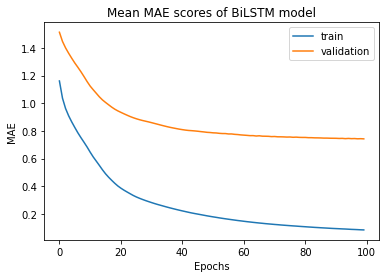

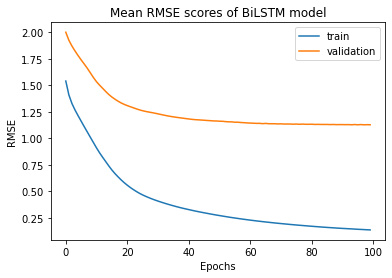

In [110]:
visualize_performance(results_tcmt_cpt_sat_x[1])

Optimal Mean MAE: 0.8253800968639553 @ epoch 99
Optimal Mean RMSE: 1.2922367185354233 @ epoch 99


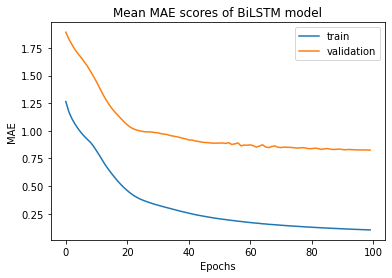

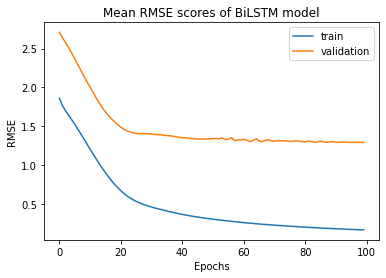

In [111]:
visualize_performance(results_tcmt_cpt_sat_y[1])

Optimal Mean MAE: 0.8099843703210354 @ epoch 87
Optimal Mean RMSE: 1.2284759311005473 @ epoch 50


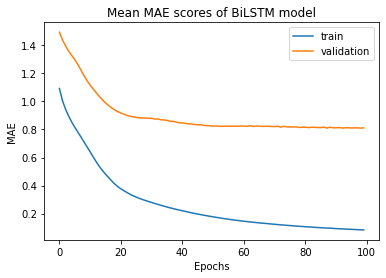

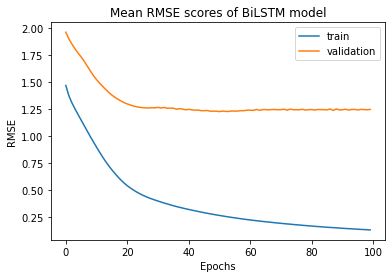

In [112]:
visualize_performance(results_tcmt_cpt_sat_z[1])

### CPT + Satellite

In [113]:
results_cpt_sat_x = train_objects(train_Yx, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False, incl_sat=True)
results_cpt_sat_y = train_objects(train_Yy, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False, incl_sat=True)
results_cpt_sat_z = train_objects(train_Yz, input_width=10, label_width=5, shift=1, epochs=100, incl_cpt=True, tacheometry=False, incl_sat=True)

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.7589 - mean_absolute_error: 2.0942 - root_mean_squared_error: 2.7855 - val_loss: 12.1165 - val_mean_absolute_error: 2.8095 - val_root_mean_squared_error: 3.4809
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 7.0079 - mean_absolute_error: 1.9498 - root_mean_squared_error: 2.6472 - val_loss: 11.4487 - val_mean_absolute_error: 2.7200 - val_root_mean_squared_error: 3.3836
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 6.4873 - mean_absolute_error: 1.8566 - root_mean_squared_error: 2.5470 - val_loss: 10.9728 - val_mean_absolute_error: 2.6622 - val_root_mean_squared_error: 3.3125
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 6.0414 - mean_absolute_error: 1.7797 - root_mean_squared_error: 2.4579 - val_loss: 10.5733 - val_mean_absolute_error: 2.6098 - val_root_mean_squared_error: 3.2517
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.7955 - mean_absolute_error: 0.5851 - root_mean_squared_error: 0.8919 - val_loss: 7.8923 - val_mean_absolute_error: 2.1342 - val_root_mean_squared_error: 2.8093
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7726 - mean_absolute_error: 0.5709 - root_mean_squared_error: 0.8790 - val_loss: 7.8298 - val_mean_absolute_error: 2.1246 - val_root_mean_squared_error: 2.7982
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.7484 - mean_absolute_error: 0.5553 - root_mean_squared_error: 0.8651 - val_loss: 7.7762 - val_mean_absolute_error: 2.1138 - val_root_mean_squared_error: 2.7886
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.7241 - mean_absolute_error: 0.5399 - root_mean_squared_error: 0.8509 - val_loss: 7.7131 - val_mean_absolute_error: 2.1008 - val_root_mean_squared_error: 2.7773
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.3433 - mean_absolute_error: 0.3033 - root_mean_squared_error: 0.5859 - val_loss: 6.0839 - val_mean_absolute_error: 1.8003 - val_root_mean_squared_error: 2.4666
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.3411 - mean_absolute_error: 0.3031 - root_mean_squared_error: 0.5840 - val_loss: 6.1072 - val_mean_absolute_error: 1.8096 - val_root_mean_squared_error: 2.4713
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3372 - mean_absolute_error: 0.2983 - root_mean_squared_error: 0.5807 - val_loss: 6.0442 - val_mean_absolute_error: 1.7947 - val_root_mean_squared_error: 2.4585
Epoch 74/100
1/1 [==============================] - 0s 28ms/step - loss: 0.3314 - mean_absolute_error: 0.2953 - root_mean_squared_error: 0.5756 - val_loss: 6.0518 - val_mean_absolute_error: 1.7986 - val_root_mean_squared_error: 2.4600
Epoch 75/100
1/1 [==============================] - 0s 28ms/

  5%|████▏                                                                              | 1/20 [00:05<01:48,  5.69s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.3645 - mean_absolute_error: 0.8879 - root_mean_squared_error: 1.1681 - val_loss: 2.4287 - val_mean_absolute_error: 1.1767 - val_root_mean_squared_error: 1.5584
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.1851 - mean_absolute_error: 0.8111 - root_mean_squared_error: 1.0886 - val_loss: 2.2373 - val_mean_absolute_error: 1.1253 - val_root_mean_squared_error: 1.4958
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0670 - mean_absolute_error: 0.7621 - root_mean_squared_error: 1.0330 - val_loss: 2.0786 - val_mean_absolute_error: 1.0827 - val_root_mean_squared_error: 1.4417
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9751 - mean_absolute_error: 0.7243 - root_mean_squared_error: 0.9875 - val_loss: 1.9321 - val_mean_absolute_error: 1.0455 - val_root_mean_squared_error: 1.3900
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0708 - mean_absolute_error: 0.1792 - root_mean_squared_error: 0.2661 - val_loss: 0.3457 - val_mean_absolute_error: 0.4173 - val_root_mean_squared_error: 0.5880
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0687 - mean_absolute_error: 0.1765 - root_mean_squared_error: 0.2622 - val_loss: 0.3402 - val_mean_absolute_error: 0.4130 - val_root_mean_squared_error: 0.5833
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0664 - mean_absolute_error: 0.1726 - root_mean_squared_error: 0.2576 - val_loss: 0.3357 - val_mean_absolute_error: 0.4089 - val_root_mean_squared_error: 0.5794
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0640 - mean_absolute_error: 0.1683 - root_mean_squared_error: 0.2530 - val_loss: 0.3303 - val_mean_absolute_error: 0.4042 - val_root_mean_squared_error: 0.5747
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0163 - mean_absolute_error: 0.0809 - root_mean_squared_error: 0.1275 - val_loss: 0.2441 - val_mean_absolute_error: 0.3260 - val_root_mean_squared_error: 0.4940
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0156 - mean_absolute_error: 0.0800 - root_mean_squared_error: 0.1248 - val_loss: 0.2342 - val_mean_absolute_error: 0.3194 - val_root_mean_squared_error: 0.4840
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0149 - mean_absolute_error: 0.0777 - root_mean_squared_error: 0.1223 - val_loss: 0.2361 - val_mean_absolute_error: 0.3165 - val_root_mean_squared_error: 0.4859
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0141 - mean_absolute_error: 0.0757 - root_mean_squared_error: 0.1189 - val_loss: 0.2348 - val_mean_absolute_error: 0.3152 - val_root_mean_squared_error: 0.4845
Epoch 75/100
1/1 [==============================] - 0s 33ms/

 10%|████████▎                                                                          | 2/20 [00:11<01:42,  5.69s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 3.0664 - mean_absolute_error: 1.3136 - root_mean_squared_error: 1.7511 - val_loss: 2.7261 - val_mean_absolute_error: 1.2980 - val_root_mean_squared_error: 1.6511
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 2.5620 - mean_absolute_error: 1.1814 - root_mean_squared_error: 1.6006 - val_loss: 2.3596 - val_mean_absolute_error: 1.2161 - val_root_mean_squared_error: 1.5361
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 2.2378 - mean_absolute_error: 1.0941 - root_mean_squared_error: 1.4959 - val_loss: 2.1042 - val_mean_absolute_error: 1.1567 - val_root_mean_squared_error: 1.4506
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.0016 - mean_absolute_error: 1.0319 - root_mean_squared_error: 1.4148 - val_loss: 1.9105 - val_mean_absolute_error: 1.1123 - val_root_mean_squared_error: 1.3822
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.1948 - mean_absolute_error: 0.2974 - root_mean_squared_error: 0.4414 - val_loss: 0.7397 - val_mean_absolute_error: 0.5911 - val_root_mean_squared_error: 0.8601
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1912 - mean_absolute_error: 0.2936 - root_mean_squared_error: 0.4373 - val_loss: 0.7396 - val_mean_absolute_error: 0.5952 - val_root_mean_squared_error: 0.8600
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1881 - mean_absolute_error: 0.2894 - root_mean_squared_error: 0.4337 - val_loss: 0.7414 - val_mean_absolute_error: 0.6000 - val_root_mean_squared_error: 0.8610
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1851 - mean_absolute_error: 0.2848 - root_mean_squared_error: 0.4303 - val_loss: 0.7447 - val_mean_absolute_error: 0.6046 - val_root_mean_squared_error: 0.8629
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1038 - mean_absolute_error: 0.2111 - root_mean_squared_error: 0.3222 - val_loss: 0.5919 - val_mean_absolute_error: 0.5354 - val_root_mean_squared_error: 0.7693
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1006 - mean_absolute_error: 0.2082 - root_mean_squared_error: 0.3172 - val_loss: 0.5815 - val_mean_absolute_error: 0.5300 - val_root_mean_squared_error: 0.7626
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0973 - mean_absolute_error: 0.2052 - root_mean_squared_error: 0.3119 - val_loss: 0.5733 - val_mean_absolute_error: 0.5253 - val_root_mean_squared_error: 0.7572
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0941 - mean_absolute_error: 0.2025 - root_mean_squared_error: 0.3067 - val_loss: 0.5625 - val_mean_absolute_error: 0.5190 - val_root_mean_squared_error: 0.7500
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 15%|████████████▍                                                                      | 3/20 [00:17<01:36,  5.70s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.6404 - mean_absolute_error: 1.1765 - root_mean_squared_error: 1.6249 - val_loss: 3.9829 - val_mean_absolute_error: 1.4149 - val_root_mean_squared_error: 1.9957
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 2.3264 - mean_absolute_error: 1.0604 - root_mean_squared_error: 1.5253 - val_loss: 3.7391 - val_mean_absolute_error: 1.3426 - val_root_mean_squared_error: 1.9337
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.1316 - mean_absolute_error: 0.9906 - root_mean_squared_error: 1.4600 - val_loss: 3.5451 - val_mean_absolute_error: 1.2898 - val_root_mean_squared_error: 1.8828
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 1.9855 - mean_absolute_error: 0.9429 - root_mean_squared_error: 1.4091 - val_loss: 3.3621 - val_mean_absolute_error: 1.2489 - val_root_mean_squared_error: 1.8336
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0520 - mean_absolute_error: 0.1750 - root_mean_squared_error: 0.2280 - val_loss: 0.7892 - val_mean_absolute_error: 0.5005 - val_root_mean_squared_error: 0.8884
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0491 - mean_absolute_error: 0.1693 - root_mean_squared_error: 0.2216 - val_loss: 0.7863 - val_mean_absolute_error: 0.4960 - val_root_mean_squared_error: 0.8867
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0468 - mean_absolute_error: 0.1638 - root_mean_squared_error: 0.2163 - val_loss: 0.7858 - val_mean_absolute_error: 0.4939 - val_root_mean_squared_error: 0.8864
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0445 - mean_absolute_error: 0.1594 - root_mean_squared_error: 0.2110 - val_loss: 0.7858 - val_mean_absolute_error: 0.4916 - val_root_mean_squared_error: 0.8864
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0080 - mean_absolute_error: 0.0675 - root_mean_squared_error: 0.0897 - val_loss: 0.7182 - val_mean_absolute_error: 0.4211 - val_root_mean_squared_error: 0.8474
Epoch 72/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0078 - mean_absolute_error: 0.0664 - root_mean_squared_error: 0.0883 - val_loss: 0.7166 - val_mean_absolute_error: 0.4196 - val_root_mean_squared_error: 0.8465
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0076 - mean_absolute_error: 0.0655 - root_mean_squared_error: 0.0870 - val_loss: 0.7153 - val_mean_absolute_error: 0.4182 - val_root_mean_squared_error: 0.8457
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0074 - mean_absolute_error: 0.0647 - root_mean_squared_error: 0.0858 - val_loss: 0.7145 - val_mean_absolute_error: 0.4174 - val_root_mean_squared_error: 0.8453
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 20%|████████████████▌                                                                  | 4/20 [00:22<01:31,  5.74s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 4.4536 - mean_absolute_error: 1.5904 - root_mean_squared_error: 2.1103 - val_loss: 2.9566 - val_mean_absolute_error: 1.4108 - val_root_mean_squared_error: 1.7195
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 4.2401 - mean_absolute_error: 1.5378 - root_mean_squared_error: 2.0591 - val_loss: 2.8137 - val_mean_absolute_error: 1.3735 - val_root_mean_squared_error: 1.6774
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 4.0736 - mean_absolute_error: 1.4948 - root_mean_squared_error: 2.0183 - val_loss: 2.7006 - val_mean_absolute_error: 1.3415 - val_root_mean_squared_error: 1.6434
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 3.9280 - mean_absolute_error: 1.4564 - root_mean_squared_error: 1.9819 - val_loss: 2.5992 - val_mean_absolute_error: 1.3110 - val_root_mean_squared_error: 1.6122
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2490 - mean_absolute_error: 0.3557 - root_mean_squared_error: 0.4990 - val_loss: 1.7421 - val_mean_absolute_error: 0.9366 - val_root_mean_squared_error: 1.3199
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2436 - mean_absolute_error: 0.3508 - root_mean_squared_error: 0.4936 - val_loss: 1.7173 - val_mean_absolute_error: 0.9295 - val_root_mean_squared_error: 1.3105
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.2379 - mean_absolute_error: 0.3451 - root_mean_squared_error: 0.4878 - val_loss: 1.6856 - val_mean_absolute_error: 0.9187 - val_root_mean_squared_error: 1.2983
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2330 - mean_absolute_error: 0.3400 - root_mean_squared_error: 0.4827 - val_loss: 1.6879 - val_mean_absolute_error: 0.9137 - val_root_mean_squared_error: 1.2992
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1151 - mean_absolute_error: 0.2350 - root_mean_squared_error: 0.3392 - val_loss: 1.6660 - val_mean_absolute_error: 0.9157 - val_root_mean_squared_error: 1.2907
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1118 - mean_absolute_error: 0.2311 - root_mean_squared_error: 0.3344 - val_loss: 1.6757 - val_mean_absolute_error: 0.9186 - val_root_mean_squared_error: 1.2945
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1087 - mean_absolute_error: 0.2267 - root_mean_squared_error: 0.3296 - val_loss: 1.6560 - val_mean_absolute_error: 0.9147 - val_root_mean_squared_error: 1.2869
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1055 - mean_absolute_error: 0.2225 - root_mean_squared_error: 0.3249 - val_loss: 1.6213 - val_mean_absolute_error: 0.9058 - val_root_mean_squared_error: 1.2733
Epoch 75/100
1/1 [==============================] - 0s 34ms/

 25%|████████████████████▊                                                              | 5/20 [00:28<01:26,  5.74s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.2873 - mean_absolute_error: 1.8197 - root_mean_squared_error: 2.2994 - val_loss: 6.4604 - val_mean_absolute_error: 1.9447 - val_root_mean_squared_error: 2.5417
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 3.8471 - mean_absolute_error: 1.5152 - root_mean_squared_error: 1.9614 - val_loss: 5.1100 - val_mean_absolute_error: 1.6922 - val_root_mean_squared_error: 2.2605
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.9556 - mean_absolute_error: 1.2965 - root_mean_squared_error: 1.7192 - val_loss: 4.2278 - val_mean_absolute_error: 1.4987 - val_root_mean_squared_error: 2.0562
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 2.3493 - mean_absolute_error: 1.1386 - root_mean_squared_error: 1.5327 - val_loss: 3.6430 - val_mean_absolute_error: 1.3511 - val_root_mean_squared_error: 1.9087
Epoch 5/100
1/1 [==============================] - 0s 33ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1452 - mean_absolute_error: 0.2737 - root_mean_squared_error: 0.3810 - val_loss: 1.6270 - val_mean_absolute_error: 0.8725 - val_root_mean_squared_error: 1.2755
Epoch 37/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1402 - mean_absolute_error: 0.2690 - root_mean_squared_error: 0.3744 - val_loss: 1.6287 - val_mean_absolute_error: 0.8729 - val_root_mean_squared_error: 1.2762
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1362 - mean_absolute_error: 0.2655 - root_mean_squared_error: 0.3690 - val_loss: 1.6306 - val_mean_absolute_error: 0.8743 - val_root_mean_squared_error: 1.2770
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1325 - mean_absolute_error: 0.2623 - root_mean_squared_error: 0.3640 - val_loss: 1.6320 - val_mean_absolute_error: 0.8755 - val_root_mean_squared_error: 1.2775
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0438 - mean_absolute_error: 0.1412 - root_mean_squared_error: 0.2093 - val_loss: 1.6083 - val_mean_absolute_error: 0.7855 - val_root_mean_squared_error: 1.2682
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0422 - mean_absolute_error: 0.1397 - root_mean_squared_error: 0.2055 - val_loss: 1.6064 - val_mean_absolute_error: 0.7832 - val_root_mean_squared_error: 1.2674
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0406 - mean_absolute_error: 0.1363 - root_mean_squared_error: 0.2014 - val_loss: 1.6072 - val_mean_absolute_error: 0.7806 - val_root_mean_squared_error: 1.2678
Epoch 74/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0391 - mean_absolute_error: 0.1341 - root_mean_squared_error: 0.1976 - val_loss: 1.6099 - val_mean_absolute_error: 0.7781 - val_root_mean_squared_error: 1.2688
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 30%|████████████████████████▉                                                          | 6/20 [00:34<01:18,  5.64s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.4443 - mean_absolute_error: 0.5066 - root_mean_squared_error: 0.6666 - val_loss: 1.2933 - val_mean_absolute_error: 0.8327 - val_root_mean_squared_error: 1.1373
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 0.3921 - mean_absolute_error: 0.4698 - root_mean_squared_error: 0.6262 - val_loss: 1.2425 - val_mean_absolute_error: 0.8088 - val_root_mean_squared_error: 1.1147
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3574 - mean_absolute_error: 0.4442 - root_mean_squared_error: 0.5978 - val_loss: 1.2019 - val_mean_absolute_error: 0.7906 - val_root_mean_squared_error: 1.0963
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.3323 - mean_absolute_error: 0.4251 - root_mean_squared_error: 0.5764 - val_loss: 1.1669 - val_mean_absolute_error: 0.7759 - val_root_mean_squared_error: 1.0802
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1131 - mean_absolute_error: 0.2227 - root_mean_squared_error: 0.3363 - val_loss: 0.7453 - val_mean_absolute_error: 0.6064 - val_root_mean_squared_error: 0.8633
Epoch 37/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1103 - mean_absolute_error: 0.2203 - root_mean_squared_error: 0.3322 - val_loss: 0.7361 - val_mean_absolute_error: 0.6017 - val_root_mean_squared_error: 0.8580
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1074 - mean_absolute_error: 0.2180 - root_mean_squared_error: 0.3277 - val_loss: 0.7188 - val_mean_absolute_error: 0.5926 - val_root_mean_squared_error: 0.8478
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1042 - mean_absolute_error: 0.2155 - root_mean_squared_error: 0.3228 - val_loss: 0.7101 - val_mean_absolute_error: 0.5884 - val_root_mean_squared_error: 0.8426
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0231 - mean_absolute_error: 0.1034 - root_mean_squared_error: 0.1518 - val_loss: 0.5733 - val_mean_absolute_error: 0.5122 - val_root_mean_squared_error: 0.7572
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0224 - mean_absolute_error: 0.1020 - root_mean_squared_error: 0.1496 - val_loss: 0.5502 - val_mean_absolute_error: 0.5002 - val_root_mean_squared_error: 0.7418
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0217 - mean_absolute_error: 0.1000 - root_mean_squared_error: 0.1472 - val_loss: 0.5498 - val_mean_absolute_error: 0.4992 - val_root_mean_squared_error: 0.7415
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0210 - mean_absolute_error: 0.0983 - root_mean_squared_error: 0.1451 - val_loss: 0.5638 - val_mean_absolute_error: 0.5054 - val_root_mean_squared_error: 0.7509
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 35%|█████████████████████████████                                                      | 7/20 [00:39<01:13,  5.66s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2381 - mean_absolute_error: 0.8820 - root_mean_squared_error: 1.1127 - val_loss: 1.9376 - val_mean_absolute_error: 1.0823 - val_root_mean_squared_error: 1.3920
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.0278 - mean_absolute_error: 0.7820 - root_mean_squared_error: 1.0138 - val_loss: 1.8289 - val_mean_absolute_error: 1.0463 - val_root_mean_squared_error: 1.3524
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.9059 - mean_absolute_error: 0.7203 - root_mean_squared_error: 0.9518 - val_loss: 1.7570 - val_mean_absolute_error: 1.0233 - val_root_mean_squared_error: 1.3255
Epoch 4/100
1/1 [==============================] - 0s 27ms/step - loss: 0.8201 - mean_absolute_error: 0.6741 - root_mean_squared_error: 0.9056 - val_loss: 1.6985 - val_mean_absolute_error: 1.0049 - val_root_mean_squared_error: 1.3033
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.1152 - mean_absolute_error: 0.2287 - root_mean_squared_error: 0.3394 - val_loss: 0.9455 - val_mean_absolute_error: 0.6299 - val_root_mean_squared_error: 0.9724
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1137 - mean_absolute_error: 0.2269 - root_mean_squared_error: 0.3372 - val_loss: 0.9414 - val_mean_absolute_error: 0.6277 - val_root_mean_squared_error: 0.9703
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1121 - mean_absolute_error: 0.2253 - root_mean_squared_error: 0.3348 - val_loss: 0.9353 - val_mean_absolute_error: 0.6233 - val_root_mean_squared_error: 0.9671
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1103 - mean_absolute_error: 0.2236 - root_mean_squared_error: 0.3322 - val_loss: 0.9284 - val_mean_absolute_error: 0.6179 - val_root_mean_squared_error: 0.9636
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0796 - mean_absolute_error: 0.1822 - root_mean_squared_error: 0.2821 - val_loss: 0.8993 - val_mean_absolute_error: 0.6167 - val_root_mean_squared_error: 0.9483
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0789 - mean_absolute_error: 0.1813 - root_mean_squared_error: 0.2808 - val_loss: 0.8993 - val_mean_absolute_error: 0.6160 - val_root_mean_squared_error: 0.9483
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0782 - mean_absolute_error: 0.1808 - root_mean_squared_error: 0.2796 - val_loss: 0.8984 - val_mean_absolute_error: 0.6162 - val_root_mean_squared_error: 0.9479
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0775 - mean_absolute_error: 0.1800 - root_mean_squared_error: 0.2784 - val_loss: 0.8968 - val_mean_absolute_error: 0.6163 - val_root_mean_squared_error: 0.9470
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:46<01:10,  5.88s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.3986 - mean_absolute_error: 1.3956 - root_mean_squared_error: 2.0973 - val_loss: 14.5389 - val_mean_absolute_error: 2.8404 - val_root_mean_squared_error: 3.8130
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 4.2243 - mean_absolute_error: 1.3428 - root_mean_squared_error: 2.0553 - val_loss: 14.2969 - val_mean_absolute_error: 2.8097 - val_root_mean_squared_error: 3.7811
Epoch 3/100
1/1 [==============================] - 0s 28ms/step - loss: 4.0888 - mean_absolute_error: 1.3021 - root_mean_squared_error: 2.0221 - val_loss: 14.0679 - val_mean_absolute_error: 2.7796 - val_root_mean_squared_error: 3.7507
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 3.9692 - mean_absolute_error: 1.2664 - root_mean_squared_error: 1.9923 - val_loss: 13.8298 - val_mean_absolute_error: 2.7471 - val_root_mean_squared_error: 3.7188
Epoch 5/100
1/1 [==============================] - 0s 35ms/ste

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 1.1767 - mean_absolute_error: 0.7056 - root_mean_squared_error: 1.0848 - val_loss: 7.0703 - val_mean_absolute_error: 1.8975 - val_root_mean_squared_error: 2.6590
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 1.1450 - mean_absolute_error: 0.6695 - root_mean_squared_error: 1.0700 - val_loss: 6.8555 - val_mean_absolute_error: 1.8753 - val_root_mean_squared_error: 2.6183
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 1.0866 - mean_absolute_error: 0.6665 - root_mean_squared_error: 1.0424 - val_loss: 6.6012 - val_mean_absolute_error: 1.8564 - val_root_mean_squared_error: 2.5693
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0850 - mean_absolute_error: 0.6853 - root_mean_squared_error: 1.0416 - val_loss: 7.0061 - val_mean_absolute_error: 1.8887 - val_root_mean_squared_error: 2.6469
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4373 - mean_absolute_error: 0.4160 - root_mean_squared_error: 0.6613 - val_loss: 6.2755 - val_mean_absolute_error: 1.8396 - val_root_mean_squared_error: 2.5051
Epoch 72/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4161 - mean_absolute_error: 0.4136 - root_mean_squared_error: 0.6451 - val_loss: 6.2763 - val_mean_absolute_error: 1.8491 - val_root_mean_squared_error: 2.5052
Epoch 73/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4021 - mean_absolute_error: 0.4026 - root_mean_squared_error: 0.6341 - val_loss: 6.3383 - val_mean_absolute_error: 1.8552 - val_root_mean_squared_error: 2.5176
Epoch 74/100
1/1 [==============================] - 0s 32ms/step - loss: 0.4004 - mean_absolute_error: 0.3976 - root_mean_squared_error: 0.6328 - val_loss: 6.2308 - val_mean_absolute_error: 1.8386 - val_root_mean_squared_error: 2.4962
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [00:52<01:05,  5.91s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 1.1118 - mean_absolute_error: 0.7281 - root_mean_squared_error: 1.0544 - val_loss: 3.0379 - val_mean_absolute_error: 1.1804 - val_root_mean_squared_error: 1.7430
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 1.0066 - mean_absolute_error: 0.6702 - root_mean_squared_error: 1.0033 - val_loss: 2.9391 - val_mean_absolute_error: 1.1501 - val_root_mean_squared_error: 1.7144
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.9306 - mean_absolute_error: 0.6299 - root_mean_squared_error: 0.9647 - val_loss: 2.8560 - val_mean_absolute_error: 1.1240 - val_root_mean_squared_error: 1.6900
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.8706 - mean_absolute_error: 0.6005 - root_mean_squared_error: 0.9331 - val_loss: 2.7817 - val_mean_absolute_error: 1.1026 - val_root_mean_squared_error: 1.6678
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0286 - mean_absolute_error: 0.1260 - root_mean_squared_error: 0.1690 - val_loss: 1.7113 - val_mean_absolute_error: 0.6972 - val_root_mean_squared_error: 1.3082
Epoch 37/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0262 - mean_absolute_error: 0.1211 - root_mean_squared_error: 0.1619 - val_loss: 1.7020 - val_mean_absolute_error: 0.6924 - val_root_mean_squared_error: 1.3046
Epoch 38/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0241 - mean_absolute_error: 0.1166 - root_mean_squared_error: 0.1554 - val_loss: 1.6944 - val_mean_absolute_error: 0.6876 - val_root_mean_squared_error: 1.3017
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0226 - mean_absolute_error: 0.1137 - root_mean_squared_error: 0.1505 - val_loss: 1.6896 - val_mean_absolute_error: 0.6837 - val_root_mean_squared_error: 1.2998
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0044 - mean_absolute_error: 0.0491 - root_mean_squared_error: 0.0662 - val_loss: 1.6652 - val_mean_absolute_error: 0.6307 - val_root_mean_squared_error: 1.2904
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0042 - mean_absolute_error: 0.0484 - root_mean_squared_error: 0.0652 - val_loss: 1.6645 - val_mean_absolute_error: 0.6299 - val_root_mean_squared_error: 1.2901
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0041 - mean_absolute_error: 0.0478 - root_mean_squared_error: 0.0643 - val_loss: 1.6640 - val_mean_absolute_error: 0.6291 - val_root_mean_squared_error: 1.2899
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0040 - mean_absolute_error: 0.0473 - root_mean_squared_error: 0.0634 - val_loss: 1.6643 - val_mean_absolute_error: 0.6301 - val_root_mean_squared_error: 1.2901
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 50%|█████████████████████████████████████████                                         | 10/20 [00:57<00:57,  5.78s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 5.1602 - mean_absolute_error: 1.7273 - root_mean_squared_error: 2.2716 - val_loss: 8.8477 - val_mean_absolute_error: 2.2690 - val_root_mean_squared_error: 2.9745
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 4.9188 - mean_absolute_error: 1.6673 - root_mean_squared_error: 2.2178 - val_loss: 8.5654 - val_mean_absolute_error: 2.2178 - val_root_mean_squared_error: 2.9267
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 4.7197 - mean_absolute_error: 1.6180 - root_mean_squared_error: 2.1725 - val_loss: 8.2774 - val_mean_absolute_error: 2.1637 - val_root_mean_squared_error: 2.8770
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 4.5216 - mean_absolute_error: 1.5682 - root_mean_squared_error: 2.1264 - val_loss: 7.9521 - val_mean_absolute_error: 2.1031 - val_root_mean_squared_error: 2.8199
Epoch 5/100
1/1 [==============================] - 0s 32ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4523 - mean_absolute_error: 0.4369 - root_mean_squared_error: 0.6725 - val_loss: 1.3528 - val_mean_absolute_error: 0.7813 - val_root_mean_squared_error: 1.1631
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4408 - mean_absolute_error: 0.4288 - root_mean_squared_error: 0.6640 - val_loss: 1.3340 - val_mean_absolute_error: 0.7734 - val_root_mean_squared_error: 1.1550
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.4292 - mean_absolute_error: 0.4204 - root_mean_squared_error: 0.6552 - val_loss: 1.3206 - val_mean_absolute_error: 0.7677 - val_root_mean_squared_error: 1.1492
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.4188 - mean_absolute_error: 0.4127 - root_mean_squared_error: 0.6471 - val_loss: 1.3023 - val_mean_absolute_error: 0.7562 - val_root_mean_squared_error: 1.1412
Epoch 40/100
1/1 [==============================] - 0s 31ms/

Epoch 71/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2501 - mean_absolute_error: 0.3115 - root_mean_squared_error: 0.5001 - val_loss: 1.3094 - val_mean_absolute_error: 0.6598 - val_root_mean_squared_error: 1.1443
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.2386 - mean_absolute_error: 0.3106 - root_mean_squared_error: 0.4885 - val_loss: 1.3519 - val_mean_absolute_error: 0.6604 - val_root_mean_squared_error: 1.1627
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.2233 - mean_absolute_error: 0.2935 - root_mean_squared_error: 0.4725 - val_loss: 1.6190 - val_mean_absolute_error: 0.7381 - val_root_mean_squared_error: 1.2724
Epoch 74/100
1/1 [==============================] - 0s 30ms/step - loss: 0.2418 - mean_absolute_error: 0.3090 - root_mean_squared_error: 0.4917 - val_loss: 1.3451 - val_mean_absolute_error: 0.6577 - val_root_mean_squared_error: 1.1598
Epoch 75/100
1/1 [==============================] - 0s 31ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:03<00:51,  5.71s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 7.9586 - mean_absolute_error: 2.1150 - root_mean_squared_error: 2.8211 - val_loss: 11.4180 - val_mean_absolute_error: 2.5574 - val_root_mean_squared_error: 3.3791
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 7.7460 - mean_absolute_error: 2.0731 - root_mean_squared_error: 2.7832 - val_loss: 11.1902 - val_mean_absolute_error: 2.5228 - val_root_mean_squared_error: 3.3452
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 7.5563 - mean_absolute_error: 2.0356 - root_mean_squared_error: 2.7489 - val_loss: 10.9229 - val_mean_absolute_error: 2.4826 - val_root_mean_squared_error: 3.3050
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 7.3317 - mean_absolute_error: 1.9912 - root_mean_squared_error: 2.7077 - val_loss: 10.5718 - val_mean_absolute_error: 2.4287 - val_root_mean_squared_error: 3.2514
Epoch 5/100
1/1 [==============================] - 0s 28ms/ste

Epoch 36/100
1/1 [==============================] - 0s 33ms/step - loss: 1.2455 - mean_absolute_error: 0.7159 - root_mean_squared_error: 1.1160 - val_loss: 3.6766 - val_mean_absolute_error: 1.4006 - val_root_mean_squared_error: 1.9174
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 1.2235 - mean_absolute_error: 0.7059 - root_mean_squared_error: 1.1061 - val_loss: 3.6645 - val_mean_absolute_error: 1.3943 - val_root_mean_squared_error: 1.9143
Epoch 38/100
1/1 [==============================] - 0s 31ms/step - loss: 1.2012 - mean_absolute_error: 0.6964 - root_mean_squared_error: 1.0960 - val_loss: 3.6468 - val_mean_absolute_error: 1.3855 - val_root_mean_squared_error: 1.9097
Epoch 39/100
1/1 [==============================] - 0s 31ms/step - loss: 1.1782 - mean_absolute_error: 0.6872 - root_mean_squared_error: 1.0854 - val_loss: 3.6272 - val_mean_absolute_error: 1.3798 - val_root_mean_squared_error: 1.9045
Epoch 40/100
1/1 [==============================] - 0s 28ms/

Epoch 71/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3378 - mean_absolute_error: 0.3592 - root_mean_squared_error: 0.5812 - val_loss: 2.6721 - val_mean_absolute_error: 1.1563 - val_root_mean_squared_error: 1.6347
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3276 - mean_absolute_error: 0.3587 - root_mean_squared_error: 0.5723 - val_loss: 2.7111 - val_mean_absolute_error: 1.1779 - val_root_mean_squared_error: 1.6466
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.3112 - mean_absolute_error: 0.3471 - root_mean_squared_error: 0.5578 - val_loss: 2.7657 - val_mean_absolute_error: 1.2013 - val_root_mean_squared_error: 1.6631
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.3050 - mean_absolute_error: 0.3428 - root_mean_squared_error: 0.5523 - val_loss: 2.6260 - val_mean_absolute_error: 1.1521 - val_root_mean_squared_error: 1.6205
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:08<00:44,  5.60s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.3475 - mean_absolute_error: 0.4615 - root_mean_squared_error: 0.5895 - val_loss: 0.5281 - val_mean_absolute_error: 0.5670 - val_root_mean_squared_error: 0.7267
Epoch 2/100
1/1 [==============================] - 0s 28ms/step - loss: 0.2844 - mean_absolute_error: 0.4102 - root_mean_squared_error: 0.5333 - val_loss: 0.4737 - val_mean_absolute_error: 0.5322 - val_root_mean_squared_error: 0.6883
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2467 - mean_absolute_error: 0.3774 - root_mean_squared_error: 0.4967 - val_loss: 0.4346 - val_mean_absolute_error: 0.5066 - val_root_mean_squared_error: 0.6592
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 0.2209 - mean_absolute_error: 0.3544 - root_mean_squared_error: 0.4700 - val_loss: 0.4032 - val_mean_absolute_error: 0.4857 - val_root_mean_squared_error: 0.6350
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0070 - mean_absolute_error: 0.0626 - root_mean_squared_error: 0.0837 - val_loss: 0.0295 - val_mean_absolute_error: 0.1325 - val_root_mean_squared_error: 0.1718
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0065 - mean_absolute_error: 0.0599 - root_mean_squared_error: 0.0809 - val_loss: 0.0286 - val_mean_absolute_error: 0.1307 - val_root_mean_squared_error: 0.1690
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.0061 - mean_absolute_error: 0.0575 - root_mean_squared_error: 0.0782 - val_loss: 0.0277 - val_mean_absolute_error: 0.1287 - val_root_mean_squared_error: 0.1663
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0057 - mean_absolute_error: 0.0552 - root_mean_squared_error: 0.0756 - val_loss: 0.0267 - val_mean_absolute_error: 0.1264 - val_root_mean_squared_error: 0.1634
Epoch 40/100
1/1 [==============================] - 0s 29ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0011 - mean_absolute_error: 0.0248 - root_mean_squared_error: 0.0337 - val_loss: 0.0045 - val_mean_absolute_error: 0.0512 - val_root_mean_squared_error: 0.0674
Epoch 72/100
1/1 [==============================] - 0s 29ms/step - loss: 0.0011 - mean_absolute_error: 0.0242 - root_mean_squared_error: 0.0329 - val_loss: 0.0046 - val_mean_absolute_error: 0.0515 - val_root_mean_squared_error: 0.0678
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0010 - mean_absolute_error: 0.0237 - root_mean_squared_error: 0.0323 - val_loss: 0.0042 - val_mean_absolute_error: 0.0498 - val_root_mean_squared_error: 0.0649
Epoch 74/100
1/1 [==============================] - 0s 27ms/step - loss: 9.9373e-04 - mean_absolute_error: 0.0233 - root_mean_squared_error: 0.0315 - val_loss: 0.0037 - val_mean_absolute_error: 0.0474 - val_root_mean_squared_error: 0.0609
Epoch 75/100
1/1 [==============================] - 0s 3

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:13<00:38,  5.48s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 2.0070 - mean_absolute_error: 0.9334 - root_mean_squared_error: 1.4167 - val_loss: 9.8493 - val_mean_absolute_error: 2.2964 - val_root_mean_squared_error: 3.1384
Epoch 2/100
1/1 [==============================] - 0s 27ms/step - loss: 1.8504 - mean_absolute_error: 0.8694 - root_mean_squared_error: 1.3603 - val_loss: 9.6499 - val_mean_absolute_error: 2.2619 - val_root_mean_squared_error: 3.1064
Epoch 3/100
1/1 [==============================] - 0s 29ms/step - loss: 1.7567 - mean_absolute_error: 0.8323 - root_mean_squared_error: 1.3254 - val_loss: 9.4880 - val_mean_absolute_error: 2.2345 - val_root_mean_squared_error: 3.0803
Epoch 4/100
1/1 [==============================] - 0s 29ms/step - loss: 1.6911 - mean_absolute_error: 0.8085 - root_mean_squared_error: 1.3004 - val_loss: 9.3335 - val_mean_absolute_error: 2.2091 - val_root_mean_squared_error: 3.0551
Epoch 5/100
1/1 [==============================] - 0s 29ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 27ms/step - loss: 0.6824 - mean_absolute_error: 0.5284 - root_mean_squared_error: 0.8261 - val_loss: 7.2420 - val_mean_absolute_error: 1.8997 - val_root_mean_squared_error: 2.6911
Epoch 37/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6487 - mean_absolute_error: 0.5147 - root_mean_squared_error: 0.8054 - val_loss: 7.2079 - val_mean_absolute_error: 1.8957 - val_root_mean_squared_error: 2.6847
Epoch 38/100
1/1 [==============================] - 0s 29ms/step - loss: 0.6177 - mean_absolute_error: 0.5077 - root_mean_squared_error: 0.7859 - val_loss: 7.1439 - val_mean_absolute_error: 1.8850 - val_root_mean_squared_error: 2.6728
Epoch 39/100
1/1 [==============================] - 0s 30ms/step - loss: 0.5882 - mean_absolute_error: 0.5015 - root_mean_squared_error: 0.7669 - val_loss: 7.2894 - val_mean_absolute_error: 1.9082 - val_root_mean_squared_error: 2.6999
Epoch 40/100
1/1 [==============================] - 0s 32ms/

Epoch 71/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1914 - mean_absolute_error: 0.2757 - root_mean_squared_error: 0.4374 - val_loss: 6.8325 - val_mean_absolute_error: 1.8068 - val_root_mean_squared_error: 2.6139
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.1866 - mean_absolute_error: 0.2706 - root_mean_squared_error: 0.4319 - val_loss: 6.7092 - val_mean_absolute_error: 1.7892 - val_root_mean_squared_error: 2.5902
Epoch 73/100
1/1 [==============================] - 0s 27ms/step - loss: 0.1800 - mean_absolute_error: 0.2659 - root_mean_squared_error: 0.4242 - val_loss: 6.4988 - val_mean_absolute_error: 1.7597 - val_root_mean_squared_error: 2.5493
Epoch 74/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1802 - mean_absolute_error: 0.2663 - root_mean_squared_error: 0.4245 - val_loss: 6.7606 - val_mean_absolute_error: 1.7963 - val_root_mean_squared_error: 2.6001
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:18<00:32,  5.36s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9362 - mean_absolute_error: 0.7315 - root_mean_squared_error: 0.9676 - val_loss: 1.4108 - val_mean_absolute_error: 0.8551 - val_root_mean_squared_error: 1.1878
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 0.8093 - mean_absolute_error: 0.6664 - root_mean_squared_error: 0.8996 - val_loss: 1.2826 - val_mean_absolute_error: 0.8041 - val_root_mean_squared_error: 1.1325
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.7246 - mean_absolute_error: 0.6218 - root_mean_squared_error: 0.8512 - val_loss: 1.1875 - val_mean_absolute_error: 0.7688 - val_root_mean_squared_error: 1.0897
Epoch 4/100
1/1 [==============================] - 0s 30ms/step - loss: 0.6635 - mean_absolute_error: 0.5894 - root_mean_squared_error: 0.8146 - val_loss: 1.1103 - val_mean_absolute_error: 0.7445 - val_root_mean_squared_error: 1.0537
Epoch 5/100
1/1 [==============================] - 0s 30ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.0724 - mean_absolute_error: 0.1780 - root_mean_squared_error: 0.2690 - val_loss: 0.1788 - val_mean_absolute_error: 0.3230 - val_root_mean_squared_error: 0.4229
Epoch 37/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0711 - mean_absolute_error: 0.1751 - root_mean_squared_error: 0.2667 - val_loss: 0.1784 - val_mean_absolute_error: 0.3222 - val_root_mean_squared_error: 0.4224
Epoch 38/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0702 - mean_absolute_error: 0.1728 - root_mean_squared_error: 0.2650 - val_loss: 0.1777 - val_mean_absolute_error: 0.3207 - val_root_mean_squared_error: 0.4215
Epoch 39/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0694 - mean_absolute_error: 0.1708 - root_mean_squared_error: 0.2634 - val_loss: 0.1761 - val_mean_absolute_error: 0.3182 - val_root_mean_squared_error: 0.4197
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0429 - mean_absolute_error: 0.1217 - root_mean_squared_error: 0.2071 - val_loss: 0.1572 - val_mean_absolute_error: 0.2810 - val_root_mean_squared_error: 0.3965
Epoch 72/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0424 - mean_absolute_error: 0.1214 - root_mean_squared_error: 0.2059 - val_loss: 0.1649 - val_mean_absolute_error: 0.2836 - val_root_mean_squared_error: 0.4060
Epoch 73/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0418 - mean_absolute_error: 0.1209 - root_mean_squared_error: 0.2044 - val_loss: 0.1577 - val_mean_absolute_error: 0.2789 - val_root_mean_squared_error: 0.3971
Epoch 74/100
1/1 [==============================] - 0s 31ms/step - loss: 0.0411 - mean_absolute_error: 0.1200 - root_mean_squared_error: 0.2027 - val_loss: 0.1645 - val_mean_absolute_error: 0.2817 - val_root_mean_squared_error: 0.4056
Epoch 75/100
1/1 [==============================] - 0s 27ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:23<00:26,  5.26s/it]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 0.9954 - mean_absolute_error: 0.7972 - root_mean_squared_error: 0.9977 - val_loss: 1.6258 - val_mean_absolute_error: 1.0197 - val_root_mean_squared_error: 1.2751
Epoch 2/100
1/1 [==============================] - 0s 29ms/step - loss: 0.8954 - mean_absolute_error: 0.7484 - root_mean_squared_error: 0.9463 - val_loss: 1.5377 - val_mean_absolute_error: 0.9816 - val_root_mean_squared_error: 1.2400
Epoch 3/100
1/1 [==============================] - 0s 31ms/step - loss: 0.8216 - mean_absolute_error: 0.7064 - root_mean_squared_error: 0.9064 - val_loss: 1.4676 - val_mean_absolute_error: 0.9465 - val_root_mean_squared_error: 1.2114
Epoch 4/100
1/1 [==============================] - 0s 28ms/step - loss: 0.7621 - mean_absolute_error: 0.6701 - root_mean_squared_error: 0.8730 - val_loss: 1.4076 - val_mean_absolute_error: 0.9136 - val_root_mean_squared_error: 1.1864
Epoch 5/100
1/1 [==============================] - 0s 28ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1615 - mean_absolute_error: 0.2267 - root_mean_squared_error: 0.4018 - val_loss: 0.9049 - val_mean_absolute_error: 0.6107 - val_root_mean_squared_error: 0.9512
Epoch 37/100
1/1 [==============================] - 0s 30ms/step - loss: 0.1604 - mean_absolute_error: 0.2249 - root_mean_squared_error: 0.4005 - val_loss: 0.9087 - val_mean_absolute_error: 0.6097 - val_root_mean_squared_error: 0.9533
Epoch 38/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1594 - mean_absolute_error: 0.2228 - root_mean_squared_error: 0.3992 - val_loss: 0.9121 - val_mean_absolute_error: 0.6095 - val_root_mean_squared_error: 0.9550
Epoch 39/100
1/1 [==============================] - 0s 29ms/step - loss: 0.1583 - mean_absolute_error: 0.2205 - root_mean_squared_error: 0.3979 - val_loss: 0.9132 - val_mean_absolute_error: 0.6099 - val_root_mean_squared_error: 0.9556
Epoch 40/100
1/1 [==============================] - 0s 30ms/

Epoch 71/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0990 - mean_absolute_error: 0.1763 - root_mean_squared_error: 0.3147 - val_loss: 1.0999 - val_mean_absolute_error: 0.6465 - val_root_mean_squared_error: 1.0487
Epoch 72/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0963 - mean_absolute_error: 0.1731 - root_mean_squared_error: 0.3104 - val_loss: 1.0994 - val_mean_absolute_error: 0.6450 - val_root_mean_squared_error: 1.0485
Epoch 73/100
1/1 [==============================] - 0s 28ms/step - loss: 0.0940 - mean_absolute_error: 0.1705 - root_mean_squared_error: 0.3066 - val_loss: 1.1501 - val_mean_absolute_error: 0.6642 - val_root_mean_squared_error: 1.0724
Epoch 74/100
1/1 [==============================] - 0s 27ms/step - loss: 0.0919 - mean_absolute_error: 0.1700 - root_mean_squared_error: 0.3032 - val_loss: 1.1144 - val_mean_absolute_error: 0.6481 - val_root_mean_squared_error: 1.0556
Epoch 75/100
1/1 [==============================] - 0s 28ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [01:28<00:20,  5.21s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1813 - mean_absolute_error: 0.8538 - root_mean_squared_error: 1.0869 - val_loss: 4.2678 - val_mean_absolute_error: 1.5799 - val_root_mean_squared_error: 2.0659
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.9657 - mean_absolute_error: 0.7506 - root_mean_squared_error: 0.9827 - val_loss: 4.0572 - val_mean_absolute_error: 1.5318 - val_root_mean_squared_error: 2.0143
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8194 - mean_absolute_error: 0.6759 - root_mean_squared_error: 0.9052 - val_loss: 3.9028 - val_mean_absolute_error: 1.4959 - val_root_mean_squared_error: 1.9756
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7154 - mean_absolute_error: 0.6195 - root_mean_squared_error: 0.8458 - val_loss: 3.7830 - val_mean_absolute_error: 1.4670 - val_root_mean_squared_error: 1.9450
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0557 - mean_absolute_error: 0.1377 - root_mean_squared_error: 0.2360 - val_loss: 3.0000 - val_mean_absolute_error: 1.2282 - val_root_mean_squared_error: 1.7321
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0541 - mean_absolute_error: 0.1343 - root_mean_squared_error: 0.2326 - val_loss: 2.9968 - val_mean_absolute_error: 1.2280 - val_root_mean_squared_error: 1.7311
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0524 - mean_absolute_error: 0.1305 - root_mean_squared_error: 0.2290 - val_loss: 2.9944 - val_mean_absolute_error: 1.2282 - val_root_mean_squared_error: 1.7304
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0509 - mean_absolute_error: 0.1266 - root_mean_squared_error: 0.2257 - val_loss: 2.9931 - val_mean_absolute_error: 1.2287 - val_root_mean_squared_error: 1.7301
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0354 - mean_absolute_error: 0.0870 - root_mean_squared_error: 0.1883 - val_loss: 2.9350 - val_mean_absolute_error: 1.2032 - val_root_mean_squared_error: 1.7132
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0351 - mean_absolute_error: 0.0867 - root_mean_squared_error: 0.1875 - val_loss: 2.9310 - val_mean_absolute_error: 1.2021 - val_root_mean_squared_error: 1.7120
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0348 - mean_absolute_error: 0.0863 - root_mean_squared_error: 0.1866 - val_loss: 2.9264 - val_mean_absolute_error: 1.2011 - val_root_mean_squared_error: 1.7107
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0345 - mean_absolute_error: 0.0860 - root_mean_squared_error: 0.1858 - val_loss: 2.9231 - val_mean_absolute_error: 1.2004 - val_root_mean_squared_error: 1.7097
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [01:36<00:17,  5.94s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.2389 - mean_absolute_error: 0.8609 - root_mean_squared_error: 1.1130 - val_loss: 2.3236 - val_mean_absolute_error: 1.2556 - val_root_mean_squared_error: 1.5243
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.9050 - mean_absolute_error: 0.7238 - root_mean_squared_error: 0.9513 - val_loss: 1.9473 - val_mean_absolute_error: 1.1646 - val_root_mean_squared_error: 1.3954
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7077 - mean_absolute_error: 0.6287 - root_mean_squared_error: 0.8412 - val_loss: 1.7029 - val_mean_absolute_error: 1.1028 - val_root_mean_squared_error: 1.3049
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.5880 - mean_absolute_error: 0.5657 - root_mean_squared_error: 0.7668 - val_loss: 1.5396 - val_mean_absolute_error: 1.0558 - val_root_mean_squared_error: 1.2408
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1512 - mean_absolute_error: 0.2920 - root_mean_squared_error: 0.3888 - val_loss: 0.6917 - val_mean_absolute_error: 0.6570 - val_root_mean_squared_error: 0.8317
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1468 - mean_absolute_error: 0.2875 - root_mean_squared_error: 0.3831 - val_loss: 0.6858 - val_mean_absolute_error: 0.6511 - val_root_mean_squared_error: 0.8281
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1422 - mean_absolute_error: 0.2828 - root_mean_squared_error: 0.3771 - val_loss: 0.6795 - val_mean_absolute_error: 0.6465 - val_root_mean_squared_error: 0.8243
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1378 - mean_absolute_error: 0.2783 - root_mean_squared_error: 0.3712 - val_loss: 0.6774 - val_mean_absolute_error: 0.6459 - val_root_mean_squared_error: 0.8230
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0540 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2325 - val_loss: 0.7108 - val_mean_absolute_error: 0.6446 - val_root_mean_squared_error: 0.8431
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0526 - mean_absolute_error: 0.1615 - root_mean_squared_error: 0.2293 - val_loss: 0.7152 - val_mean_absolute_error: 0.6470 - val_root_mean_squared_error: 0.8457
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0513 - mean_absolute_error: 0.1587 - root_mean_squared_error: 0.2266 - val_loss: 0.7383 - val_mean_absolute_error: 0.6614 - val_root_mean_squared_error: 0.8592
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0505 - mean_absolute_error: 0.1564 - root_mean_squared_error: 0.2248 - val_loss: 0.7025 - val_mean_absolute_error: 0.6386 - val_root_mean_squared_error: 0.8381
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [01:43<00:12,  6.36s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.0140 - mean_absolute_error: 1.0768 - root_mean_squared_error: 1.4192 - val_loss: 3.1995 - val_mean_absolute_error: 1.3924 - val_root_mean_squared_error: 1.7887
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.7488 - mean_absolute_error: 0.9877 - root_mean_squared_error: 1.3224 - val_loss: 2.9293 - val_mean_absolute_error: 1.3248 - val_root_mean_squared_error: 1.7115
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.5898 - mean_absolute_error: 0.9325 - root_mean_squared_error: 1.2609 - val_loss: 2.7434 - val_mean_absolute_error: 1.2766 - val_root_mean_squared_error: 1.6563
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 1.4772 - mean_absolute_error: 0.8939 - root_mean_squared_error: 1.2154 - val_loss: 2.5941 - val_mean_absolute_error: 1.2377 - val_root_mean_squared_error: 1.6106
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0639 - mean_absolute_error: 0.1882 - root_mean_squared_error: 0.2527 - val_loss: 0.8989 - val_mean_absolute_error: 0.6563 - val_root_mean_squared_error: 0.9481
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0607 - mean_absolute_error: 0.1824 - root_mean_squared_error: 0.2464 - val_loss: 0.8980 - val_mean_absolute_error: 0.6535 - val_root_mean_squared_error: 0.9476
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0581 - mean_absolute_error: 0.1774 - root_mean_squared_error: 0.2409 - val_loss: 0.8995 - val_mean_absolute_error: 0.6519 - val_root_mean_squared_error: 0.9484
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0558 - mean_absolute_error: 0.1731 - root_mean_squared_error: 0.2362 - val_loss: 0.9053 - val_mean_absolute_error: 0.6514 - val_root_mean_squared_error: 0.9515
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0217 - mean_absolute_error: 0.0999 - root_mean_squared_error: 0.1475 - val_loss: 1.0122 - val_mean_absolute_error: 0.6639 - val_root_mean_squared_error: 1.0061
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0212 - mean_absolute_error: 0.0982 - root_mean_squared_error: 0.1456 - val_loss: 1.0139 - val_mean_absolute_error: 0.6634 - val_root_mean_squared_error: 1.0069
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0206 - mean_absolute_error: 0.0965 - root_mean_squared_error: 0.1437 - val_loss: 1.0112 - val_mean_absolute_error: 0.6614 - val_root_mean_squared_error: 1.0056
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0201 - mean_absolute_error: 0.0948 - root_mean_squared_error: 0.1419 - val_loss: 1.0120 - val_mean_absolute_error: 0.6611 - val_root_mean_squared_error: 1.0060
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [01:50<00:06,  6.40s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8276 - mean_absolute_error: 1.0737 - root_mean_squared_error: 1.3519 - val_loss: 2.4231 - val_mean_absolute_error: 1.2168 - val_root_mean_squared_error: 1.5566
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.3422 - mean_absolute_error: 0.9054 - root_mean_squared_error: 1.1585 - val_loss: 2.0950 - val_mean_absolute_error: 1.1246 - val_root_mean_squared_error: 1.4474
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0499 - mean_absolute_error: 0.7920 - root_mean_squared_error: 1.0246 - val_loss: 1.8816 - val_mean_absolute_error: 1.0640 - val_root_mean_squared_error: 1.3717
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8589 - mean_absolute_error: 0.7109 - root_mean_squared_error: 0.9268 - val_loss: 1.7309 - val_mean_absolute_error: 1.0184 - val_root_mean_squared_error: 1.3156
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1000 - mean_absolute_error: 0.2048 - root_mean_squared_error: 0.3163 - val_loss: 1.0159 - val_mean_absolute_error: 0.7557 - val_root_mean_squared_error: 1.0079
Epoch 37/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0981 - mean_absolute_error: 0.2016 - root_mean_squared_error: 0.3132 - val_loss: 1.0136 - val_mean_absolute_error: 0.7541 - val_root_mean_squared_error: 1.0068
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0965 - mean_absolute_error: 0.1990 - root_mean_squared_error: 0.3106 - val_loss: 1.0116 - val_mean_absolute_error: 0.7527 - val_root_mean_squared_error: 1.0058
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0950 - mean_absolute_error: 0.1966 - root_mean_squared_error: 0.3082 - val_loss: 1.0102 - val_mean_absolute_error: 0.7520 - val_root_mean_squared_error: 1.0051
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0691 - mean_absolute_error: 0.1549 - root_mean_squared_error: 0.2629 - val_loss: 0.9990 - val_mean_absolute_error: 0.7424 - val_root_mean_squared_error: 0.9995
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0685 - mean_absolute_error: 0.1540 - root_mean_squared_error: 0.2618 - val_loss: 1.0000 - val_mean_absolute_error: 0.7425 - val_root_mean_squared_error: 1.0000
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0680 - mean_absolute_error: 0.1532 - root_mean_squared_error: 0.2607 - val_loss: 1.0018 - val_mean_absolute_error: 0.7428 - val_root_mean_squared_error: 1.0009
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0674 - mean_absolute_error: 0.1524 - root_mean_squared_error: 0.2597 - val_loss: 1.0042 - val_mean_absolute_error: 0.7433 - val_root_mean_squared_error: 1.0021
Epoch 75/100
1/1 [==============================] - 0s 42ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 2s 2s/step - loss: 11.0564 - mean_absolute_error: 2.3558 - root_mean_squared_error: 3.3251 - val_loss: 14.7299 - val_mean_absolute_error: 2.7936 - val_root_mean_squared_error: 3.8380
Epoch 2/100
1/1 [==============================] - 0s 31ms/step - loss: 10.2875 - mean_absolute_error: 2.2320 - root_mean_squared_error: 3.2074 - val_loss: 13.9048 - val_mean_absolute_error: 2.7092 - val_root_mean_squared_error: 3.7289
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 9.7634 - mean_absolute_error: 2.1549 - root_mean_squared_error: 3.1246 - val_loss: 13.2873 - val_mean_absolute_error: 2.6499 - val_root_mean_squared_error: 3.6452
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 9.3436 - mean_absolute_error: 2.1017 - root_mean_squared_error: 3.0567 - val_loss: 12.7522 - val_mean_absolute_error: 2.6008 - val_root_mean_squared_error: 3.5710
Epoch 5/100
1/1 [==============================] - 0s 34ms/s

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 1.1646 - mean_absolute_error: 0.6660 - root_mean_squared_error: 1.0792 - val_loss: 4.1929 - val_mean_absolute_error: 1.4151 - val_root_mean_squared_error: 2.0477
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1460 - mean_absolute_error: 0.6548 - root_mean_squared_error: 1.0705 - val_loss: 4.2554 - val_mean_absolute_error: 1.4267 - val_root_mean_squared_error: 2.0629
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 1.1360 - mean_absolute_error: 0.6515 - root_mean_squared_error: 1.0658 - val_loss: 4.3081 - val_mean_absolute_error: 1.4332 - val_root_mean_squared_error: 2.0756
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1255 - mean_absolute_error: 0.6504 - root_mean_squared_error: 1.0609 - val_loss: 4.3195 - val_mean_absolute_error: 1.4319 - val_root_mean_squared_error: 2.0783
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.5480 - mean_absolute_error: 0.3946 - root_mean_squared_error: 0.7402 - val_loss: 4.8303 - val_mean_absolute_error: 1.4777 - val_root_mean_squared_error: 2.1978
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.5344 - mean_absolute_error: 0.3860 - root_mean_squared_error: 0.7310 - val_loss: 4.9132 - val_mean_absolute_error: 1.4930 - val_root_mean_squared_error: 2.2166
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.5217 - mean_absolute_error: 0.3782 - root_mean_squared_error: 0.7223 - val_loss: 4.9149 - val_mean_absolute_error: 1.4939 - val_root_mean_squared_error: 2.2170
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.5097 - mean_absolute_error: 0.3708 - root_mean_squared_error: 0.7140 - val_loss: 4.9300 - val_mean_absolute_error: 1.4954 - val_root_mean_squared_error: 2.2204
Epoch 75/100
1/1 [==============================] - 0s 43ms/

  5%|████▏                                                                              | 1/20 [00:06<02:10,  6.87s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.5378 - mean_absolute_error: 1.5500 - root_mean_squared_error: 2.1302 - val_loss: 5.6933 - val_mean_absolute_error: 1.7411 - val_root_mean_squared_error: 2.3861
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.8325 - mean_absolute_error: 1.3940 - root_mean_squared_error: 1.9577 - val_loss: 5.2320 - val_mean_absolute_error: 1.6570 - val_root_mean_squared_error: 2.2873
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 3.4842 - mean_absolute_error: 1.3173 - root_mean_squared_error: 1.8666 - val_loss: 4.9421 - val_mean_absolute_error: 1.6087 - val_root_mean_squared_error: 2.2231
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 3.2667 - mean_absolute_error: 1.2752 - root_mean_squared_error: 1.8074 - val_loss: 4.7078 - val_mean_absolute_error: 1.5666 - val_root_mean_squared_error: 2.1697
Epoch 5/100
1/1 [==============================] - 0s 31ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1630 - mean_absolute_error: 0.3020 - root_mean_squared_error: 0.4037 - val_loss: 0.6538 - val_mean_absolute_error: 0.5996 - val_root_mean_squared_error: 0.8086
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1545 - mean_absolute_error: 0.2923 - root_mean_squared_error: 0.3931 - val_loss: 0.6391 - val_mean_absolute_error: 0.5914 - val_root_mean_squared_error: 0.7994
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1466 - mean_absolute_error: 0.2830 - root_mean_squared_error: 0.3829 - val_loss: 0.6241 - val_mean_absolute_error: 0.5834 - val_root_mean_squared_error: 0.7900
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1397 - mean_absolute_error: 0.2747 - root_mean_squared_error: 0.3738 - val_loss: 0.6132 - val_mean_absolute_error: 0.5779 - val_root_mean_squared_error: 0.7831
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0558 - mean_absolute_error: 0.1627 - root_mean_squared_error: 0.2363 - val_loss: 0.4270 - val_mean_absolute_error: 0.4737 - val_root_mean_squared_error: 0.6534
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0537 - mean_absolute_error: 0.1600 - root_mean_squared_error: 0.2318 - val_loss: 0.4199 - val_mean_absolute_error: 0.4705 - val_root_mean_squared_error: 0.6480
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0517 - mean_absolute_error: 0.1570 - root_mean_squared_error: 0.2273 - val_loss: 0.4120 - val_mean_absolute_error: 0.4662 - val_root_mean_squared_error: 0.6419
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0496 - mean_absolute_error: 0.1542 - root_mean_squared_error: 0.2227 - val_loss: 0.4027 - val_mean_absolute_error: 0.4603 - val_root_mean_squared_error: 0.6346
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 10%|████████▎                                                                          | 2/20 [00:14<02:09,  7.19s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.5549 - mean_absolute_error: 1.6666 - root_mean_squared_error: 2.1342 - val_loss: 4.7060 - val_mean_absolute_error: 1.7115 - val_root_mean_squared_error: 2.1693
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.4164 - mean_absolute_error: 1.4276 - root_mean_squared_error: 1.8484 - val_loss: 3.8803 - val_mean_absolute_error: 1.5727 - val_root_mean_squared_error: 1.9698
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 2.7794 - mean_absolute_error: 1.2845 - root_mean_squared_error: 1.6671 - val_loss: 3.3705 - val_mean_absolute_error: 1.4680 - val_root_mean_squared_error: 1.8359
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 2.3912 - mean_absolute_error: 1.1941 - root_mean_squared_error: 1.5464 - val_loss: 3.0236 - val_mean_absolute_error: 1.3754 - val_root_mean_squared_error: 1.7389
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1119 - mean_absolute_error: 0.2376 - root_mean_squared_error: 0.3345 - val_loss: 0.3877 - val_mean_absolute_error: 0.4592 - val_root_mean_squared_error: 0.6227
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1082 - mean_absolute_error: 0.2345 - root_mean_squared_error: 0.3289 - val_loss: 0.3839 - val_mean_absolute_error: 0.4574 - val_root_mean_squared_error: 0.6196
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.1050 - mean_absolute_error: 0.2307 - root_mean_squared_error: 0.3241 - val_loss: 0.3816 - val_mean_absolute_error: 0.4559 - val_root_mean_squared_error: 0.6178
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1022 - mean_absolute_error: 0.2269 - root_mean_squared_error: 0.3197 - val_loss: 0.3789 - val_mean_absolute_error: 0.4536 - val_root_mean_squared_error: 0.6155
Epoch 40/100
1/1 [==============================] - 0s 36ms/

Epoch 71/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0719 - mean_absolute_error: 0.1792 - root_mean_squared_error: 0.2682 - val_loss: 0.3377 - val_mean_absolute_error: 0.4152 - val_root_mean_squared_error: 0.5811
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0715 - mean_absolute_error: 0.1787 - root_mean_squared_error: 0.2673 - val_loss: 0.3381 - val_mean_absolute_error: 0.4154 - val_root_mean_squared_error: 0.5814
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0710 - mean_absolute_error: 0.1783 - root_mean_squared_error: 0.2665 - val_loss: 0.3379 - val_mean_absolute_error: 0.4153 - val_root_mean_squared_error: 0.5813
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0705 - mean_absolute_error: 0.1779 - root_mean_squared_error: 0.2656 - val_loss: 0.3378 - val_mean_absolute_error: 0.4153 - val_root_mean_squared_error: 0.5812
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 15%|████████████▍                                                                      | 3/20 [00:21<01:58,  6.99s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 8.1633 - mean_absolute_error: 1.3947 - root_mean_squared_error: 2.8571 - val_loss: 13.7104 - val_mean_absolute_error: 1.8483 - val_root_mean_squared_error: 3.7028
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 7.8173 - mean_absolute_error: 1.3397 - root_mean_squared_error: 2.7959 - val_loss: 13.3011 - val_mean_absolute_error: 1.8108 - val_root_mean_squared_error: 3.6471
Epoch 3/100
1/1 [==============================] - 0s 32ms/step - loss: 7.5114 - mean_absolute_error: 1.3049 - root_mean_squared_error: 2.7407 - val_loss: 12.9073 - val_mean_absolute_error: 1.7875 - val_root_mean_squared_error: 3.5927
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 7.2242 - mean_absolute_error: 1.2887 - root_mean_squared_error: 2.6878 - val_loss: 12.4979 - val_mean_absolute_error: 1.7753 - val_root_mean_squared_error: 3.5352
Epoch 5/100
1/1 [==============================] - 0s 33ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2886 - mean_absolute_error: 0.3727 - root_mean_squared_error: 0.5372 - val_loss: 1.7984 - val_mean_absolute_error: 0.7772 - val_root_mean_squared_error: 1.3410
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2713 - mean_absolute_error: 0.3596 - root_mean_squared_error: 0.5209 - val_loss: 1.7404 - val_mean_absolute_error: 0.7638 - val_root_mean_squared_error: 1.3192
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2514 - mean_absolute_error: 0.3447 - root_mean_squared_error: 0.5014 - val_loss: 1.6873 - val_mean_absolute_error: 0.7450 - val_root_mean_squared_error: 1.2990
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2291 - mean_absolute_error: 0.3284 - root_mean_squared_error: 0.4786 - val_loss: 1.6604 - val_mean_absolute_error: 0.7265 - val_root_mean_squared_error: 1.2886
Epoch 40/100
1/1 [==============================] - 0s 33ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0358 - mean_absolute_error: 0.1302 - root_mean_squared_error: 0.1892 - val_loss: 1.4904 - val_mean_absolute_error: 0.6143 - val_root_mean_squared_error: 1.2208
Epoch 72/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0334 - mean_absolute_error: 0.1256 - root_mean_squared_error: 0.1828 - val_loss: 1.4650 - val_mean_absolute_error: 0.6079 - val_root_mean_squared_error: 1.2104
Epoch 73/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0311 - mean_absolute_error: 0.1218 - root_mean_squared_error: 0.1763 - val_loss: 1.4776 - val_mean_absolute_error: 0.6119 - val_root_mean_squared_error: 1.2155
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0289 - mean_absolute_error: 0.1182 - root_mean_squared_error: 0.1701 - val_loss: 1.4433 - val_mean_absolute_error: 0.6042 - val_root_mean_squared_error: 1.2014
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 20%|████████████████▌                                                                  | 4/20 [00:27<01:51,  6.96s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.7474 - mean_absolute_error: 1.7553 - root_mean_squared_error: 2.5976 - val_loss: 5.8290 - val_mean_absolute_error: 1.8321 - val_root_mean_squared_error: 2.4143
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 6.4991 - mean_absolute_error: 1.7073 - root_mean_squared_error: 2.5493 - val_loss: 5.5647 - val_mean_absolute_error: 1.7872 - val_root_mean_squared_error: 2.3590
Epoch 3/100
1/1 [==============================] - 0s 42ms/step - loss: 6.2474 - mean_absolute_error: 1.6656 - root_mean_squared_error: 2.4995 - val_loss: 5.2651 - val_mean_absolute_error: 1.7360 - val_root_mean_squared_error: 2.2946
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 5.9589 - mean_absolute_error: 1.6192 - root_mean_squared_error: 2.4411 - val_loss: 4.9132 - val_mean_absolute_error: 1.6705 - val_root_mean_squared_error: 2.2166
Epoch 5/100
1/1 [==============================] - 0s 41ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2112 - mean_absolute_error: 0.3318 - root_mean_squared_error: 0.4596 - val_loss: 1.0687 - val_mean_absolute_error: 0.7197 - val_root_mean_squared_error: 1.0338
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2051 - mean_absolute_error: 0.3268 - root_mean_squared_error: 0.4529 - val_loss: 1.0585 - val_mean_absolute_error: 0.7213 - val_root_mean_squared_error: 1.0288
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1995 - mean_absolute_error: 0.3229 - root_mean_squared_error: 0.4466 - val_loss: 1.0474 - val_mean_absolute_error: 0.7217 - val_root_mean_squared_error: 1.0234
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.1936 - mean_absolute_error: 0.3182 - root_mean_squared_error: 0.4400 - val_loss: 1.0422 - val_mean_absolute_error: 0.7202 - val_root_mean_squared_error: 1.0209
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1144 - mean_absolute_error: 0.2194 - root_mean_squared_error: 0.3382 - val_loss: 1.0080 - val_mean_absolute_error: 0.6732 - val_root_mean_squared_error: 1.0040
Epoch 72/100
1/1 [==============================] - 0s 32ms/step - loss: 0.1128 - mean_absolute_error: 0.2183 - root_mean_squared_error: 0.3359 - val_loss: 1.0189 - val_mean_absolute_error: 0.6760 - val_root_mean_squared_error: 1.0094
Epoch 73/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1113 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3336 - val_loss: 1.0191 - val_mean_absolute_error: 0.6775 - val_root_mean_squared_error: 1.0095
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1096 - mean_absolute_error: 0.2150 - root_mean_squared_error: 0.3311 - val_loss: 1.0257 - val_mean_absolute_error: 0.6804 - val_root_mean_squared_error: 1.0128
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 25%|████████████████████▊                                                              | 5/20 [00:35<01:45,  7.03s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.2768 - mean_absolute_error: 1.8345 - root_mean_squared_error: 2.6976 - val_loss: 20.0627 - val_mean_absolute_error: 3.0647 - val_root_mean_squared_error: 4.4791
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 6.6510 - mean_absolute_error: 1.7023 - root_mean_squared_error: 2.5790 - val_loss: 19.1248 - val_mean_absolute_error: 2.9736 - val_root_mean_squared_error: 4.3732
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 6.1885 - mean_absolute_error: 1.6114 - root_mean_squared_error: 2.4877 - val_loss: 18.3348 - val_mean_absolute_error: 2.9082 - val_root_mean_squared_error: 4.2819
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 5.8206 - mean_absolute_error: 1.5469 - root_mean_squared_error: 2.4126 - val_loss: 17.6342 - val_mean_absolute_error: 2.8455 - val_root_mean_squared_error: 4.1993
Epoch 5/100
1/1 [==============================] - 0s 36ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2757 - mean_absolute_error: 0.3957 - root_mean_squared_error: 0.5251 - val_loss: 3.5067 - val_mean_absolute_error: 1.2053 - val_root_mean_squared_error: 1.8726
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2584 - mean_absolute_error: 0.3869 - root_mean_squared_error: 0.5084 - val_loss: 3.4412 - val_mean_absolute_error: 1.1895 - val_root_mean_squared_error: 1.8550
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2391 - mean_absolute_error: 0.3738 - root_mean_squared_error: 0.4890 - val_loss: 3.3941 - val_mean_absolute_error: 1.1757 - val_root_mean_squared_error: 1.8423
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2214 - mean_absolute_error: 0.3612 - root_mean_squared_error: 0.4705 - val_loss: 3.3634 - val_mean_absolute_error: 1.1717 - val_root_mean_squared_error: 1.8339
Epoch 40/100
1/1 [==============================] - 0s 52ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0516 - mean_absolute_error: 0.1676 - root_mean_squared_error: 0.2271 - val_loss: 2.7513 - val_mean_absolute_error: 0.8890 - val_root_mean_squared_error: 1.6587
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0502 - mean_absolute_error: 0.1654 - root_mean_squared_error: 0.2241 - val_loss: 2.7466 - val_mean_absolute_error: 0.8866 - val_root_mean_squared_error: 1.6573
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0490 - mean_absolute_error: 0.1635 - root_mean_squared_error: 0.2214 - val_loss: 2.7441 - val_mean_absolute_error: 0.8840 - val_root_mean_squared_error: 1.6565
Epoch 74/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0478 - mean_absolute_error: 0.1614 - root_mean_squared_error: 0.2186 - val_loss: 2.7377 - val_mean_absolute_error: 0.8803 - val_root_mean_squared_error: 1.6546
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 30%|████████████████████████▉                                                          | 6/20 [00:42<01:39,  7.12s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.8313 - mean_absolute_error: 0.6666 - root_mean_squared_error: 0.9117 - val_loss: 2.3028 - val_mean_absolute_error: 1.2594 - val_root_mean_squared_error: 1.5175
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7703 - mean_absolute_error: 0.6354 - root_mean_squared_error: 0.8777 - val_loss: 2.2209 - val_mean_absolute_error: 1.2342 - val_root_mean_squared_error: 1.4903
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7214 - mean_absolute_error: 0.6116 - root_mean_squared_error: 0.8494 - val_loss: 2.1399 - val_mean_absolute_error: 1.2085 - val_root_mean_squared_error: 1.4628
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.6783 - mean_absolute_error: 0.5923 - root_mean_squared_error: 0.8236 - val_loss: 2.0538 - val_mean_absolute_error: 1.1812 - val_root_mean_squared_error: 1.4331
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1076 - mean_absolute_error: 0.2355 - root_mean_squared_error: 0.3281 - val_loss: 0.9713 - val_mean_absolute_error: 0.7820 - val_root_mean_squared_error: 0.9856
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1052 - mean_absolute_error: 0.2320 - root_mean_squared_error: 0.3243 - val_loss: 0.9708 - val_mean_absolute_error: 0.7820 - val_root_mean_squared_error: 0.9853
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1028 - mean_absolute_error: 0.2285 - root_mean_squared_error: 0.3206 - val_loss: 0.9641 - val_mean_absolute_error: 0.7785 - val_root_mean_squared_error: 0.9819
Epoch 39/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1002 - mean_absolute_error: 0.2255 - root_mean_squared_error: 0.3166 - val_loss: 0.9560 - val_mean_absolute_error: 0.7745 - val_root_mean_squared_error: 0.9777
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0318 - mean_absolute_error: 0.1272 - root_mean_squared_error: 0.1782 - val_loss: 0.8092 - val_mean_absolute_error: 0.6952 - val_root_mean_squared_error: 0.8995
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0325 - mean_absolute_error: 0.1304 - root_mean_squared_error: 0.1802 - val_loss: 0.8527 - val_mean_absolute_error: 0.7213 - val_root_mean_squared_error: 0.9234
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0297 - mean_absolute_error: 0.1219 - root_mean_squared_error: 0.1723 - val_loss: 0.8790 - val_mean_absolute_error: 0.7364 - val_root_mean_squared_error: 0.9375
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0300 - mean_absolute_error: 0.1206 - root_mean_squared_error: 0.1733 - val_loss: 0.8343 - val_mean_absolute_error: 0.7109 - val_root_mean_squared_error: 0.9134
Epoch 75/100
1/1 [==============================] - 0s 39ms/

 35%|█████████████████████████████                                                      | 7/20 [00:49<01:34,  7.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.6552 - mean_absolute_error: 1.7028 - root_mean_squared_error: 2.3781 - val_loss: 16.3219 - val_mean_absolute_error: 2.9296 - val_root_mean_squared_error: 4.0400
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 4.9489 - mean_absolute_error: 1.5524 - root_mean_squared_error: 2.2246 - val_loss: 15.4998 - val_mean_absolute_error: 2.8411 - val_root_mean_squared_error: 3.9370
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 4.4586 - mean_absolute_error: 1.4494 - root_mean_squared_error: 2.1115 - val_loss: 14.7245 - val_mean_absolute_error: 2.7545 - val_root_mean_squared_error: 3.8373
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 4.0731 - mean_absolute_error: 1.3796 - root_mean_squared_error: 2.0182 - val_loss: 13.9245 - val_mean_absolute_error: 2.6655 - val_root_mean_squared_error: 3.7316
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6318 - mean_absolute_error: 0.5664 - root_mean_squared_error: 0.7949 - val_loss: 5.2620 - val_mean_absolute_error: 1.5483 - val_root_mean_squared_error: 2.2939
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.6051 - mean_absolute_error: 0.5580 - root_mean_squared_error: 0.7779 - val_loss: 4.7316 - val_mean_absolute_error: 1.4846 - val_root_mean_squared_error: 2.1752
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.5911 - mean_absolute_error: 0.5536 - root_mean_squared_error: 0.7688 - val_loss: 6.1707 - val_mean_absolute_error: 1.6663 - val_root_mean_squared_error: 2.4841
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6286 - mean_absolute_error: 0.5652 - root_mean_squared_error: 0.7928 - val_loss: 4.7110 - val_mean_absolute_error: 1.4759 - val_root_mean_squared_error: 2.1705
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1836 - mean_absolute_error: 0.2871 - root_mean_squared_error: 0.4285 - val_loss: 5.1770 - val_mean_absolute_error: 1.5283 - val_root_mean_squared_error: 2.2753
Epoch 72/100
1/1 [==============================] - 0s 34ms/step - loss: 0.1805 - mean_absolute_error: 0.2822 - root_mean_squared_error: 0.4248 - val_loss: 5.0074 - val_mean_absolute_error: 1.5033 - val_root_mean_squared_error: 2.2377
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1727 - mean_absolute_error: 0.2759 - root_mean_squared_error: 0.4156 - val_loss: 4.6857 - val_mean_absolute_error: 1.4546 - val_root_mean_squared_error: 2.1646
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1719 - mean_absolute_error: 0.2773 - root_mean_squared_error: 0.4145 - val_loss: 5.0178 - val_mean_absolute_error: 1.5031 - val_root_mean_squared_error: 2.2400
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:57<01:27,  7.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.9174 - mean_absolute_error: 1.2813 - root_mean_squared_error: 2.8138 - val_loss: 23.7374 - val_mean_absolute_error: 2.4901 - val_root_mean_squared_error: 4.8721
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 7.7330 - mean_absolute_error: 1.2303 - root_mean_squared_error: 2.7808 - val_loss: 23.4542 - val_mean_absolute_error: 2.4673 - val_root_mean_squared_error: 4.8430
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 7.5799 - mean_absolute_error: 1.1950 - root_mean_squared_error: 2.7532 - val_loss: 23.1590 - val_mean_absolute_error: 2.4483 - val_root_mean_squared_error: 4.8124
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 7.4325 - mean_absolute_error: 1.1691 - root_mean_squared_error: 2.7263 - val_loss: 22.8233 - val_mean_absolute_error: 2.4307 - val_root_mean_squared_error: 4.7774
Epoch 5/100
1/1 [==============================] - 0s 35ms/ste

Epoch 36/100
1/1 [==============================] - 0s 53ms/step - loss: 1.3277 - mean_absolute_error: 0.7401 - root_mean_squared_error: 1.1523 - val_loss: 5.9696 - val_mean_absolute_error: 1.6795 - val_root_mean_squared_error: 2.4433
Epoch 37/100
1/1 [==============================] - 0s 49ms/step - loss: 1.3316 - mean_absolute_error: 0.7516 - root_mean_squared_error: 1.1539 - val_loss: 6.0953 - val_mean_absolute_error: 1.6143 - val_root_mean_squared_error: 2.4689
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 1.1691 - mean_absolute_error: 0.6767 - root_mean_squared_error: 1.0812 - val_loss: 6.0095 - val_mean_absolute_error: 1.6122 - val_root_mean_squared_error: 2.4514
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 1.2394 - mean_absolute_error: 0.7316 - root_mean_squared_error: 1.1133 - val_loss: 5.9374 - val_mean_absolute_error: 1.6073 - val_root_mean_squared_error: 2.4367
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4539 - mean_absolute_error: 0.3891 - root_mean_squared_error: 0.6737 - val_loss: 4.9867 - val_mean_absolute_error: 1.5024 - val_root_mean_squared_error: 2.2331
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4562 - mean_absolute_error: 0.3845 - root_mean_squared_error: 0.6754 - val_loss: 4.4287 - val_mean_absolute_error: 1.4434 - val_root_mean_squared_error: 2.1045
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.4076 - mean_absolute_error: 0.3711 - root_mean_squared_error: 0.6384 - val_loss: 4.5586 - val_mean_absolute_error: 1.4547 - val_root_mean_squared_error: 2.1351
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.3929 - mean_absolute_error: 0.3693 - root_mean_squared_error: 0.6268 - val_loss: 5.0167 - val_mean_absolute_error: 1.5004 - val_root_mean_squared_error: 2.2398
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:04<01:19,  7.26s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3470 - mean_absolute_error: 0.8512 - root_mean_squared_error: 1.1606 - val_loss: 3.1004 - val_mean_absolute_error: 1.2279 - val_root_mean_squared_error: 1.7608
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.2040 - mean_absolute_error: 0.7827 - root_mean_squared_error: 1.0973 - val_loss: 2.9569 - val_mean_absolute_error: 1.1811 - val_root_mean_squared_error: 1.7196
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 1.0981 - mean_absolute_error: 0.7290 - root_mean_squared_error: 1.0479 - val_loss: 2.8316 - val_mean_absolute_error: 1.1411 - val_root_mean_squared_error: 1.6827
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 1.0128 - mean_absolute_error: 0.6909 - root_mean_squared_error: 1.0064 - val_loss: 2.7116 - val_mean_absolute_error: 1.1050 - val_root_mean_squared_error: 1.6467
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0388 - mean_absolute_error: 0.1450 - root_mean_squared_error: 0.1969 - val_loss: 1.0109 - val_mean_absolute_error: 0.5532 - val_root_mean_squared_error: 1.0054
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0364 - mean_absolute_error: 0.1402 - root_mean_squared_error: 0.1907 - val_loss: 1.0102 - val_mean_absolute_error: 0.5506 - val_root_mean_squared_error: 1.0051
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0343 - mean_absolute_error: 0.1360 - root_mean_squared_error: 0.1852 - val_loss: 1.0116 - val_mean_absolute_error: 0.5493 - val_root_mean_squared_error: 1.0058
Epoch 39/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0323 - mean_absolute_error: 0.1319 - root_mean_squared_error: 0.1797 - val_loss: 1.0127 - val_mean_absolute_error: 0.5477 - val_root_mean_squared_error: 1.0063
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 57ms/step - loss: 0.0057 - mean_absolute_error: 0.0581 - root_mean_squared_error: 0.0753 - val_loss: 0.9172 - val_mean_absolute_error: 0.4637 - val_root_mean_squared_error: 0.9577
Epoch 72/100
1/1 [==============================] - 0s 63ms/step - loss: 0.0054 - mean_absolute_error: 0.0569 - root_mean_squared_error: 0.0735 - val_loss: 0.9177 - val_mean_absolute_error: 0.4637 - val_root_mean_squared_error: 0.9580
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0052 - mean_absolute_error: 0.0557 - root_mean_squared_error: 0.0720 - val_loss: 0.9206 - val_mean_absolute_error: 0.4668 - val_root_mean_squared_error: 0.9595
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0050 - mean_absolute_error: 0.0546 - root_mean_squared_error: 0.0707 - val_loss: 0.9151 - val_mean_absolute_error: 0.4602 - val_root_mean_squared_error: 0.9566
Epoch 75/100
1/1 [==============================] - 0s 53ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:12<01:13,  7.38s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.1800 - mean_absolute_error: 1.1057 - root_mean_squared_error: 1.7832 - val_loss: 6.7982 - val_mean_absolute_error: 1.5368 - val_root_mean_squared_error: 2.6073
Epoch 2/100
1/1 [==============================] - 0s 45ms/step - loss: 3.0077 - mean_absolute_error: 1.0422 - root_mean_squared_error: 1.7343 - val_loss: 6.6103 - val_mean_absolute_error: 1.4905 - val_root_mean_squared_error: 2.5711
Epoch 3/100
1/1 [==============================] - 0s 58ms/step - loss: 2.8787 - mean_absolute_error: 0.9956 - root_mean_squared_error: 1.6967 - val_loss: 6.4348 - val_mean_absolute_error: 1.4464 - val_root_mean_squared_error: 2.5367
Epoch 4/100
1/1 [==============================] - 0s 52ms/step - loss: 2.7636 - mean_absolute_error: 0.9538 - root_mean_squared_error: 1.6624 - val_loss: 6.2494 - val_mean_absolute_error: 1.4004 - val_root_mean_squared_error: 2.4999
Epoch 5/100
1/1 [==============================] - 0s 65ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1680 - mean_absolute_error: 0.2716 - root_mean_squared_error: 0.4099 - val_loss: 1.1051 - val_mean_absolute_error: 0.6611 - val_root_mean_squared_error: 1.0512
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1590 - mean_absolute_error: 0.2661 - root_mean_squared_error: 0.3988 - val_loss: 1.0741 - val_mean_absolute_error: 0.6616 - val_root_mean_squared_error: 1.0364
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1539 - mean_absolute_error: 0.2633 - root_mean_squared_error: 0.3923 - val_loss: 1.0650 - val_mean_absolute_error: 0.6503 - val_root_mean_squared_error: 1.0320
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1503 - mean_absolute_error: 0.2632 - root_mean_squared_error: 0.3876 - val_loss: 1.0156 - val_mean_absolute_error: 0.6408 - val_root_mean_squared_error: 1.0078
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0538 - mean_absolute_error: 0.1435 - root_mean_squared_error: 0.2320 - val_loss: 0.6939 - val_mean_absolute_error: 0.5104 - val_root_mean_squared_error: 0.8330
Epoch 72/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0528 - mean_absolute_error: 0.1416 - root_mean_squared_error: 0.2299 - val_loss: 0.6956 - val_mean_absolute_error: 0.5110 - val_root_mean_squared_error: 0.8340
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0521 - mean_absolute_error: 0.1401 - root_mean_squared_error: 0.2282 - val_loss: 0.6892 - val_mean_absolute_error: 0.5085 - val_root_mean_squared_error: 0.8302
Epoch 74/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0512 - mean_absolute_error: 0.1400 - root_mean_squared_error: 0.2263 - val_loss: 0.6815 - val_mean_absolute_error: 0.5066 - val_root_mean_squared_error: 0.8255
Epoch 75/100
1/1 [==============================] - 0s 59ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:20<01:10,  7.83s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.6585 - mean_absolute_error: 1.2667 - root_mean_squared_error: 1.9127 - val_loss: 5.9274 - val_mean_absolute_error: 1.7357 - val_root_mean_squared_error: 2.4346
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 3.5572 - mean_absolute_error: 1.2381 - root_mean_squared_error: 1.8861 - val_loss: 5.7926 - val_mean_absolute_error: 1.7079 - val_root_mean_squared_error: 2.4068
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 3.4585 - mean_absolute_error: 1.2095 - root_mean_squared_error: 1.8597 - val_loss: 5.6250 - val_mean_absolute_error: 1.6720 - val_root_mean_squared_error: 2.3717
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 3.3393 - mean_absolute_error: 1.1747 - root_mean_squared_error: 1.8274 - val_loss: 5.4001 - val_mean_absolute_error: 1.6230 - val_root_mean_squared_error: 2.3238
Epoch 5/100
1/1 [==============================] - 0s 39ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3339 - mean_absolute_error: 0.3799 - root_mean_squared_error: 0.5778 - val_loss: 1.2898 - val_mean_absolute_error: 0.7802 - val_root_mean_squared_error: 1.1357
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3193 - mean_absolute_error: 0.3723 - root_mean_squared_error: 0.5651 - val_loss: 1.2805 - val_mean_absolute_error: 0.7745 - val_root_mean_squared_error: 1.1316
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.3055 - mean_absolute_error: 0.3640 - root_mean_squared_error: 0.5527 - val_loss: 1.2671 - val_mean_absolute_error: 0.7664 - val_root_mean_squared_error: 1.1256
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.2959 - mean_absolute_error: 0.3591 - root_mean_squared_error: 0.5440 - val_loss: 1.2595 - val_mean_absolute_error: 0.7659 - val_root_mean_squared_error: 1.1223
Epoch 40/100
1/1 [==============================] - 0s 44ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0965 - mean_absolute_error: 0.1966 - root_mean_squared_error: 0.3107 - val_loss: 1.0060 - val_mean_absolute_error: 0.6219 - val_root_mean_squared_error: 1.0030
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0917 - mean_absolute_error: 0.1915 - root_mean_squared_error: 0.3029 - val_loss: 0.9978 - val_mean_absolute_error: 0.6253 - val_root_mean_squared_error: 0.9989
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0872 - mean_absolute_error: 0.1866 - root_mean_squared_error: 0.2953 - val_loss: 0.9919 - val_mean_absolute_error: 0.6305 - val_root_mean_squared_error: 0.9959
Epoch 74/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0870 - mean_absolute_error: 0.1872 - root_mean_squared_error: 0.2950 - val_loss: 1.0028 - val_mean_absolute_error: 0.6180 - val_root_mean_squared_error: 1.0014
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:28<01:02,  7.83s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 0.3320 - mean_absolute_error: 0.4521 - root_mean_squared_error: 0.5762 - val_loss: 0.4879 - val_mean_absolute_error: 0.5320 - val_root_mean_squared_error: 0.6985
Epoch 2/100
1/1 [==============================] - 0s 66ms/step - loss: 0.2629 - mean_absolute_error: 0.3885 - root_mean_squared_error: 0.5128 - val_loss: 0.4361 - val_mean_absolute_error: 0.4936 - val_root_mean_squared_error: 0.6604
Epoch 3/100
1/1 [==============================] - 0s 51ms/step - loss: 0.2275 - mean_absolute_error: 0.3536 - root_mean_squared_error: 0.4769 - val_loss: 0.4042 - val_mean_absolute_error: 0.4675 - val_root_mean_squared_error: 0.6358
Epoch 4/100
1/1 [==============================] - 0s 47ms/step - loss: 0.2062 - mean_absolute_error: 0.3304 - root_mean_squared_error: 0.4541 - val_loss: 0.3819 - val_mean_absolute_error: 0.4498 - val_root_mean_squared_error: 0.6180
Epoch 5/100
1/1 [==============================] - 0s 46ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0071 - mean_absolute_error: 0.0613 - root_mean_squared_error: 0.0841 - val_loss: 0.0283 - val_mean_absolute_error: 0.1257 - val_root_mean_squared_error: 0.1683
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0067 - mean_absolute_error: 0.0593 - root_mean_squared_error: 0.0816 - val_loss: 0.0270 - val_mean_absolute_error: 0.1225 - val_root_mean_squared_error: 0.1643
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0062 - mean_absolute_error: 0.0572 - root_mean_squared_error: 0.0789 - val_loss: 0.0252 - val_mean_absolute_error: 0.1180 - val_root_mean_squared_error: 0.1588
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0058 - mean_absolute_error: 0.0550 - root_mean_squared_error: 0.0760 - val_loss: 0.0233 - val_mean_absolute_error: 0.1132 - val_root_mean_squared_error: 0.1527
Epoch 40/100
1/1 [==============================] - 0s 50ms/

Epoch 71/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0012 - mean_absolute_error: 0.0255 - root_mean_squared_error: 0.0352 - val_loss: 0.0074 - val_mean_absolute_error: 0.0667 - val_root_mean_squared_error: 0.0859
Epoch 72/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0012 - mean_absolute_error: 0.0251 - root_mean_squared_error: 0.0346 - val_loss: 0.0071 - val_mean_absolute_error: 0.0654 - val_root_mean_squared_error: 0.0844
Epoch 73/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0012 - mean_absolute_error: 0.0247 - root_mean_squared_error: 0.0341 - val_loss: 0.0070 - val_mean_absolute_error: 0.0647 - val_root_mean_squared_error: 0.0834
Epoch 74/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0011 - mean_absolute_error: 0.0243 - root_mean_squared_error: 0.0335 - val_loss: 0.0068 - val_mean_absolute_error: 0.0638 - val_root_mean_squared_error: 0.0823
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:37<00:56,  8.11s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.6157 - mean_absolute_error: 1.0978 - root_mean_squared_error: 1.6173 - val_loss: 11.4159 - val_mean_absolute_error: 2.6117 - val_root_mean_squared_error: 3.3787
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.3481 - mean_absolute_error: 1.0032 - root_mean_squared_error: 1.5324 - val_loss: 11.0484 - val_mean_absolute_error: 2.5621 - val_root_mean_squared_error: 3.3239
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 2.1854 - mean_absolute_error: 0.9446 - root_mean_squared_error: 1.4783 - val_loss: 10.7685 - val_mean_absolute_error: 2.5232 - val_root_mean_squared_error: 3.2815
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 2.0748 - mean_absolute_error: 0.9084 - root_mean_squared_error: 1.4404 - val_loss: 10.5431 - val_mean_absolute_error: 2.4951 - val_root_mean_squared_error: 3.2470
Epoch 5/100
1/1 [==============================] - 0s 34ms/ste

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.8925 - mean_absolute_error: 0.5888 - root_mean_squared_error: 0.9447 - val_loss: 7.9996 - val_mean_absolute_error: 2.1175 - val_root_mean_squared_error: 2.8284
Epoch 37/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8689 - mean_absolute_error: 0.5849 - root_mean_squared_error: 0.9321 - val_loss: 8.0104 - val_mean_absolute_error: 2.1183 - val_root_mean_squared_error: 2.8303
Epoch 38/100
1/1 [==============================] - 0s 34ms/step - loss: 0.8454 - mean_absolute_error: 0.5791 - root_mean_squared_error: 0.9195 - val_loss: 8.1160 - val_mean_absolute_error: 2.1326 - val_root_mean_squared_error: 2.8489
Epoch 39/100
1/1 [==============================] - 0s 33ms/step - loss: 0.8221 - mean_absolute_error: 0.5659 - root_mean_squared_error: 0.9067 - val_loss: 7.9962 - val_mean_absolute_error: 2.1142 - val_root_mean_squared_error: 2.8278
Epoch 40/100
1/1 [==============================] - 0s 35ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2603 - mean_absolute_error: 0.3223 - root_mean_squared_error: 0.5102 - val_loss: 6.5118 - val_mean_absolute_error: 1.8794 - val_root_mean_squared_error: 2.5518
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2508 - mean_absolute_error: 0.3162 - root_mean_squared_error: 0.5008 - val_loss: 6.6892 - val_mean_absolute_error: 1.9094 - val_root_mean_squared_error: 2.5864
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.2472 - mean_absolute_error: 0.3139 - root_mean_squared_error: 0.4972 - val_loss: 6.4845 - val_mean_absolute_error: 1.8743 - val_root_mean_squared_error: 2.5465
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2335 - mean_absolute_error: 0.3054 - root_mean_squared_error: 0.4832 - val_loss: 6.5181 - val_mean_absolute_error: 1.8812 - val_root_mean_squared_error: 2.5531
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:44<00:45,  7.61s/it]

Epoch 1/100
1/1 [==============================] - 9s 9s/step - loss: 1.3907 - mean_absolute_error: 0.9311 - root_mean_squared_error: 1.1793 - val_loss: 2.1896 - val_mean_absolute_error: 1.1802 - val_root_mean_squared_error: 1.4797
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 1.2031 - mean_absolute_error: 0.8593 - root_mean_squared_error: 1.0969 - val_loss: 1.9963 - val_mean_absolute_error: 1.1263 - val_root_mean_squared_error: 1.4129
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.0768 - mean_absolute_error: 0.8079 - root_mean_squared_error: 1.0377 - val_loss: 1.8373 - val_mean_absolute_error: 1.0790 - val_root_mean_squared_error: 1.3555
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.9777 - mean_absolute_error: 0.7650 - root_mean_squared_error: 0.9888 - val_loss: 1.6919 - val_mean_absolute_error: 1.0338 - val_root_mean_squared_error: 1.3007
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0688 - mean_absolute_error: 0.1908 - root_mean_squared_error: 0.2623 - val_loss: 0.2517 - val_mean_absolute_error: 0.4012 - val_root_mean_squared_error: 0.5017
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0675 - mean_absolute_error: 0.1885 - root_mean_squared_error: 0.2597 - val_loss: 0.2475 - val_mean_absolute_error: 0.3979 - val_root_mean_squared_error: 0.4975
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0661 - mean_absolute_error: 0.1863 - root_mean_squared_error: 0.2572 - val_loss: 0.2431 - val_mean_absolute_error: 0.3943 - val_root_mean_squared_error: 0.4931
Epoch 39/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0649 - mean_absolute_error: 0.1844 - root_mean_squared_error: 0.2547 - val_loss: 0.2399 - val_mean_absolute_error: 0.3915 - val_root_mean_squared_error: 0.4898
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0457 - mean_absolute_error: 0.1424 - root_mean_squared_error: 0.2138 - val_loss: 0.2082 - val_mean_absolute_error: 0.3479 - val_root_mean_squared_error: 0.4563
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0453 - mean_absolute_error: 0.1416 - root_mean_squared_error: 0.2128 - val_loss: 0.2034 - val_mean_absolute_error: 0.3383 - val_root_mean_squared_error: 0.4511
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0452 - mean_absolute_error: 0.1425 - root_mean_squared_error: 0.2127 - val_loss: 0.2067 - val_mean_absolute_error: 0.3460 - val_root_mean_squared_error: 0.4546
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0442 - mean_absolute_error: 0.1393 - root_mean_squared_error: 0.2101 - val_loss: 0.2059 - val_mean_absolute_error: 0.3449 - val_root_mean_squared_error: 0.4538
Epoch 75/100
1/1 [==============================] - 0s 47ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:57<00:47,  9.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.2518 - mean_absolute_error: 1.5195 - root_mean_squared_error: 2.2917 - val_loss: 12.5448 - val_mean_absolute_error: 2.1499 - val_root_mean_squared_error: 3.5419
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 5.0343 - mean_absolute_error: 1.4659 - root_mean_squared_error: 2.2437 - val_loss: 12.2614 - val_mean_absolute_error: 2.1013 - val_root_mean_squared_error: 3.5016
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 4.8493 - mean_absolute_error: 1.4165 - root_mean_squared_error: 2.2021 - val_loss: 11.9964 - val_mean_absolute_error: 2.0537 - val_root_mean_squared_error: 3.4636
Epoch 4/100
1/1 [==============================] - 0s 45ms/step - loss: 4.6811 - mean_absolute_error: 1.3694 - root_mean_squared_error: 2.1636 - val_loss: 11.7349 - val_mean_absolute_error: 2.0032 - val_root_mean_squared_error: 3.4256
Epoch 5/100
1/1 [==============================] - 0s 42ms/ste

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.3290 - mean_absolute_error: 0.3791 - root_mean_squared_error: 0.5736 - val_loss: 2.0854 - val_mean_absolute_error: 0.8616 - val_root_mean_squared_error: 1.4441
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3200 - mean_absolute_error: 0.3760 - root_mean_squared_error: 0.5657 - val_loss: 2.0179 - val_mean_absolute_error: 0.8549 - val_root_mean_squared_error: 1.4205
Epoch 38/100
1/1 [==============================] - 0s 50ms/step - loss: 0.3103 - mean_absolute_error: 0.3705 - root_mean_squared_error: 0.5570 - val_loss: 1.9569 - val_mean_absolute_error: 0.8482 - val_root_mean_squared_error: 1.3989
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.3017 - mean_absolute_error: 0.3648 - root_mean_squared_error: 0.5493 - val_loss: 1.9132 - val_mean_absolute_error: 0.8436 - val_root_mean_squared_error: 1.3832
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1308 - mean_absolute_error: 0.2214 - root_mean_squared_error: 0.3617 - val_loss: 1.3286 - val_mean_absolute_error: 0.6327 - val_root_mean_squared_error: 1.1526
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1283 - mean_absolute_error: 0.2201 - root_mean_squared_error: 0.3582 - val_loss: 1.3170 - val_mean_absolute_error: 0.6255 - val_root_mean_squared_error: 1.1476
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1266 - mean_absolute_error: 0.2179 - root_mean_squared_error: 0.3558 - val_loss: 1.2958 - val_mean_absolute_error: 0.6290 - val_root_mean_squared_error: 1.1383
Epoch 74/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1263 - mean_absolute_error: 0.2182 - root_mean_squared_error: 0.3554 - val_loss: 1.3104 - val_mean_absolute_error: 0.6213 - val_root_mean_squared_error: 1.1447
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [02:06<00:36,  9.15s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.5645 - mean_absolute_error: 0.9795 - root_mean_squared_error: 1.2508 - val_loss: 6.1124 - val_mean_absolute_error: 1.8691 - val_root_mean_squared_error: 2.4723
Epoch 2/100
1/1 [==============================] - 0s 40ms/step - loss: 1.3212 - mean_absolute_error: 0.8748 - root_mean_squared_error: 1.1494 - val_loss: 5.8557 - val_mean_absolute_error: 1.8177 - val_root_mean_squared_error: 2.4198
Epoch 3/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1616 - mean_absolute_error: 0.8036 - root_mean_squared_error: 1.0778 - val_loss: 5.6625 - val_mean_absolute_error: 1.7811 - val_root_mean_squared_error: 2.3796
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 1.0492 - mean_absolute_error: 0.7518 - root_mean_squared_error: 1.0243 - val_loss: 5.5008 - val_mean_absolute_error: 1.7523 - val_root_mean_squared_error: 2.3454
Epoch 5/100
1/1 [==============================] - 0s 40ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0526 - mean_absolute_error: 0.1509 - root_mean_squared_error: 0.2292 - val_loss: 2.9103 - val_mean_absolute_error: 1.1862 - val_root_mean_squared_error: 1.7060
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0507 - mean_absolute_error: 0.1469 - root_mean_squared_error: 0.2251 - val_loss: 2.9018 - val_mean_absolute_error: 1.1832 - val_root_mean_squared_error: 1.7035
Epoch 38/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0490 - mean_absolute_error: 0.1431 - root_mean_squared_error: 0.2213 - val_loss: 2.8962 - val_mean_absolute_error: 1.1807 - val_root_mean_squared_error: 1.7018
Epoch 39/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0474 - mean_absolute_error: 0.1390 - root_mean_squared_error: 0.2177 - val_loss: 2.8920 - val_mean_absolute_error: 1.1785 - val_root_mean_squared_error: 1.7006
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0266 - mean_absolute_error: 0.0870 - root_mean_squared_error: 0.1631 - val_loss: 2.8017 - val_mean_absolute_error: 1.1408 - val_root_mean_squared_error: 1.6738
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0264 - mean_absolute_error: 0.0864 - root_mean_squared_error: 0.1624 - val_loss: 2.7973 - val_mean_absolute_error: 1.1395 - val_root_mean_squared_error: 1.6725
Epoch 73/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0261 - mean_absolute_error: 0.0857 - root_mean_squared_error: 0.1616 - val_loss: 2.7929 - val_mean_absolute_error: 1.1382 - val_root_mean_squared_error: 1.6712
Epoch 74/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0259 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1609 - val_loss: 2.7882 - val_mean_absolute_error: 1.1368 - val_root_mean_squared_error: 1.6698
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:13<00:26,  8.70s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.1860 - mean_absolute_error: 0.7428 - root_mean_squared_error: 1.0890 - val_loss: 5.9886 - val_mean_absolute_error: 1.9601 - val_root_mean_squared_error: 2.4472
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 1.0552 - mean_absolute_error: 0.6755 - root_mean_squared_error: 1.0272 - val_loss: 5.8358 - val_mean_absolute_error: 1.9346 - val_root_mean_squared_error: 2.4157
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 0.9711 - mean_absolute_error: 0.6327 - root_mean_squared_error: 0.9854 - val_loss: 5.7147 - val_mean_absolute_error: 1.9143 - val_root_mean_squared_error: 2.3905
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 0.9114 - mean_absolute_error: 0.6046 - root_mean_squared_error: 0.9547 - val_loss: 5.6108 - val_mean_absolute_error: 1.8977 - val_root_mean_squared_error: 2.3687
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 42ms/step - loss: 0.2643 - mean_absolute_error: 0.3612 - root_mean_squared_error: 0.5141 - val_loss: 4.9068 - val_mean_absolute_error: 1.7518 - val_root_mean_squared_error: 2.2151
Epoch 37/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2532 - mean_absolute_error: 0.3541 - root_mean_squared_error: 0.5032 - val_loss: 4.8988 - val_mean_absolute_error: 1.7504 - val_root_mean_squared_error: 2.2133
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2424 - mean_absolute_error: 0.3457 - root_mean_squared_error: 0.4923 - val_loss: 4.8739 - val_mean_absolute_error: 1.7397 - val_root_mean_squared_error: 2.2077
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.2327 - mean_absolute_error: 0.3386 - root_mean_squared_error: 0.4824 - val_loss: 4.8845 - val_mean_absolute_error: 1.7486 - val_root_mean_squared_error: 2.2101
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0693 - mean_absolute_error: 0.1828 - root_mean_squared_error: 0.2632 - val_loss: 4.2334 - val_mean_absolute_error: 1.5913 - val_root_mean_squared_error: 2.0575
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0656 - mean_absolute_error: 0.1769 - root_mean_squared_error: 0.2561 - val_loss: 4.2184 - val_mean_absolute_error: 1.5902 - val_root_mean_squared_error: 2.0539
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0630 - mean_absolute_error: 0.1731 - root_mean_squared_error: 0.2510 - val_loss: 4.1915 - val_mean_absolute_error: 1.5829 - val_root_mean_squared_error: 2.0473
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0598 - mean_absolute_error: 0.1687 - root_mean_squared_error: 0.2445 - val_loss: 4.1804 - val_mean_absolute_error: 1.5783 - val_root_mean_squared_error: 2.0446
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:21<00:16,  8.26s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.4754 - mean_absolute_error: 1.3684 - root_mean_squared_error: 1.8642 - val_loss: 8.6645 - val_mean_absolute_error: 2.1980 - val_root_mean_squared_error: 2.9435
Epoch 2/100
1/1 [==============================] - 0s 33ms/step - loss: 3.2869 - mean_absolute_error: 1.3111 - root_mean_squared_error: 1.8130 - val_loss: 8.3234 - val_mean_absolute_error: 2.1375 - val_root_mean_squared_error: 2.8850
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 3.1302 - mean_absolute_error: 1.2656 - root_mean_squared_error: 1.7692 - val_loss: 7.9739 - val_mean_absolute_error: 2.0762 - val_root_mean_squared_error: 2.8238
Epoch 4/100
1/1 [==============================] - 0s 34ms/step - loss: 2.9645 - mean_absolute_error: 1.2170 - root_mean_squared_error: 1.7218 - val_loss: 7.5682 - val_mean_absolute_error: 2.0051 - val_root_mean_squared_error: 2.7510
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1554 - mean_absolute_error: 0.2587 - root_mean_squared_error: 0.3943 - val_loss: 1.6838 - val_mean_absolute_error: 0.8918 - val_root_mean_squared_error: 1.2976
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1461 - mean_absolute_error: 0.2518 - root_mean_squared_error: 0.3822 - val_loss: 1.6485 - val_mean_absolute_error: 0.8830 - val_root_mean_squared_error: 1.2839
Epoch 38/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1377 - mean_absolute_error: 0.2455 - root_mean_squared_error: 0.3711 - val_loss: 1.6173 - val_mean_absolute_error: 0.8746 - val_root_mean_squared_error: 1.2717
Epoch 39/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1312 - mean_absolute_error: 0.2412 - root_mean_squared_error: 0.3622 - val_loss: 1.6050 - val_mean_absolute_error: 0.8708 - val_root_mean_squared_error: 1.2669
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0525 - mean_absolute_error: 0.1437 - root_mean_squared_error: 0.2291 - val_loss: 1.5341 - val_mean_absolute_error: 0.8374 - val_root_mean_squared_error: 1.2386
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0511 - mean_absolute_error: 0.1413 - root_mean_squared_error: 0.2261 - val_loss: 1.5409 - val_mean_absolute_error: 0.8393 - val_root_mean_squared_error: 1.2413
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0498 - mean_absolute_error: 0.1389 - root_mean_squared_error: 0.2233 - val_loss: 1.5496 - val_mean_absolute_error: 0.8416 - val_root_mean_squared_error: 1.2448
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0486 - mean_absolute_error: 0.1366 - root_mean_squared_error: 0.2204 - val_loss: 1.5598 - val_mean_absolute_error: 0.8441 - val_root_mean_squared_error: 1.2489
Epoch 75/100
1/1 [==============================] - 0s 37ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:28<00:07,  7.94s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.4535 - mean_absolute_error: 0.9756 - root_mean_squared_error: 1.2056 - val_loss: 3.9433 - val_mean_absolute_error: 1.5716 - val_root_mean_squared_error: 1.9858
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 1.1473 - mean_absolute_error: 0.8500 - root_mean_squared_error: 1.0711 - val_loss: 3.6456 - val_mean_absolute_error: 1.5028 - val_root_mean_squared_error: 1.9093
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.9483 - mean_absolute_error: 0.7619 - root_mean_squared_error: 0.9738 - val_loss: 3.4229 - val_mean_absolute_error: 1.4476 - val_root_mean_squared_error: 1.8501
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8117 - mean_absolute_error: 0.6940 - root_mean_squared_error: 0.9010 - val_loss: 3.2430 - val_mean_absolute_error: 1.4021 - val_root_mean_squared_error: 1.8008
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1263 - mean_absolute_error: 0.2282 - root_mean_squared_error: 0.3554 - val_loss: 2.1467 - val_mean_absolute_error: 1.0735 - val_root_mean_squared_error: 1.4652
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.1225 - mean_absolute_error: 0.2249 - root_mean_squared_error: 0.3500 - val_loss: 2.1406 - val_mean_absolute_error: 1.0696 - val_root_mean_squared_error: 1.4631
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1190 - mean_absolute_error: 0.2226 - root_mean_squared_error: 0.3449 - val_loss: 2.1336 - val_mean_absolute_error: 1.0656 - val_root_mean_squared_error: 1.4607
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.1155 - mean_absolute_error: 0.2199 - root_mean_squared_error: 0.3399 - val_loss: 2.1264 - val_mean_absolute_error: 1.0613 - val_root_mean_squared_error: 1.4582
Epoch 40/100
1/1 [==============================] - 0s 37ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0460 - mean_absolute_error: 0.1290 - root_mean_squared_error: 0.2144 - val_loss: 2.1715 - val_mean_absolute_error: 1.0338 - val_root_mean_squared_error: 1.4736
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0452 - mean_absolute_error: 0.1275 - root_mean_squared_error: 0.2125 - val_loss: 2.1732 - val_mean_absolute_error: 1.0336 - val_root_mean_squared_error: 1.4742
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0444 - mean_absolute_error: 0.1261 - root_mean_squared_error: 0.2107 - val_loss: 2.1729 - val_mean_absolute_error: 1.0333 - val_root_mean_squared_error: 1.4741
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0436 - mean_absolute_error: 0.1252 - root_mean_squared_error: 0.2089 - val_loss: 2.1720 - val_mean_absolute_error: 1.0332 - val_root_mean_squared_error: 1.4738
Epoch 75/100
1/1 [==============================] - 0s 37ms/

  0%|                                                                                           | 0/20 [00:00<?, ?it/s]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 6.7002 - mean_absolute_error: 1.9109 - root_mean_squared_error: 2.5885 - val_loss: 11.1153 - val_mean_absolute_error: 2.6598 - val_root_mean_squared_error: 3.3340
Epoch 2/100
1/1 [==============================] - 0s 32ms/step - loss: 6.2541 - mean_absolute_error: 1.8339 - root_mean_squared_error: 2.5008 - val_loss: 10.9089 - val_mean_absolute_error: 2.6277 - val_root_mean_squared_error: 3.3029
Epoch 3/100
1/1 [==============================] - 0s 30ms/step - loss: 5.8627 - mean_absolute_error: 1.7678 - root_mean_squared_error: 2.4213 - val_loss: 10.6923 - val_mean_absolute_error: 2.5919 - val_root_mean_squared_error: 3.2699
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 5.4757 - mean_absolute_error: 1.7069 - root_mean_squared_error: 2.3400 - val_loss: 10.4186 - val_mean_absolute_error: 2.5533 - val_root_mean_squared_error: 3.2278
Epoch 5/100
1/1 [==============================] - 0s 39ms/ste

Epoch 36/100
1/1 [==============================] - 0s 37ms/step - loss: 0.8112 - mean_absolute_error: 0.5588 - root_mean_squared_error: 0.9007 - val_loss: 8.2950 - val_mean_absolute_error: 2.1470 - val_root_mean_squared_error: 2.8801
Epoch 37/100
1/1 [==============================] - 0s 37ms/step - loss: 0.7952 - mean_absolute_error: 0.5518 - root_mean_squared_error: 0.8918 - val_loss: 8.2486 - val_mean_absolute_error: 2.1456 - val_root_mean_squared_error: 2.8720
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 0.7774 - mean_absolute_error: 0.5441 - root_mean_squared_error: 0.8817 - val_loss: 8.1906 - val_mean_absolute_error: 2.1412 - val_root_mean_squared_error: 2.8619
Epoch 39/100
1/1 [==============================] - 0s 36ms/step - loss: 0.7575 - mean_absolute_error: 0.5341 - root_mean_squared_error: 0.8704 - val_loss: 8.1239 - val_mean_absolute_error: 2.1321 - val_root_mean_squared_error: 2.8502
Epoch 40/100
1/1 [==============================] - 0s 38ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3760 - mean_absolute_error: 0.3176 - root_mean_squared_error: 0.6132 - val_loss: 6.8267 - val_mean_absolute_error: 1.8886 - val_root_mean_squared_error: 2.6128
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3731 - mean_absolute_error: 0.3156 - root_mean_squared_error: 0.6108 - val_loss: 6.8145 - val_mean_absolute_error: 1.8837 - val_root_mean_squared_error: 2.6105
Epoch 73/100
1/1 [==============================] - 0s 42ms/step - loss: 0.3671 - mean_absolute_error: 0.3134 - root_mean_squared_error: 0.6059 - val_loss: 6.7812 - val_mean_absolute_error: 1.8793 - val_root_mean_squared_error: 2.6041
Epoch 74/100
1/1 [==============================] - 0s 38ms/step - loss: 0.3610 - mean_absolute_error: 0.3082 - root_mean_squared_error: 0.6009 - val_loss: 6.7539 - val_mean_absolute_error: 1.8754 - val_root_mean_squared_error: 2.5988
Epoch 75/100
1/1 [==============================] - 0s 38ms/

  5%|████▏                                                                              | 1/20 [00:07<02:17,  7.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.3429 - mean_absolute_error: 0.8707 - root_mean_squared_error: 1.1588 - val_loss: 2.4192 - val_mean_absolute_error: 1.1579 - val_root_mean_squared_error: 1.5554
Epoch 2/100
1/1 [==============================] - 0s 36ms/step - loss: 1.2083 - mean_absolute_error: 0.8143 - root_mean_squared_error: 1.0992 - val_loss: 2.2815 - val_mean_absolute_error: 1.1201 - val_root_mean_squared_error: 1.5105
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.1216 - mean_absolute_error: 0.7792 - root_mean_squared_error: 1.0591 - val_loss: 2.1739 - val_mean_absolute_error: 1.0903 - val_root_mean_squared_error: 1.4744
Epoch 4/100
1/1 [==============================] - 0s 33ms/step - loss: 1.0575 - mean_absolute_error: 0.7539 - root_mean_squared_error: 1.0283 - val_loss: 2.0794 - val_mean_absolute_error: 1.0621 - val_root_mean_squared_error: 1.4420
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0827 - mean_absolute_error: 0.1995 - root_mean_squared_error: 0.2875 - val_loss: 0.4093 - val_mean_absolute_error: 0.4636 - val_root_mean_squared_error: 0.6397
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0796 - mean_absolute_error: 0.1965 - root_mean_squared_error: 0.2822 - val_loss: 0.3955 - val_mean_absolute_error: 0.4552 - val_root_mean_squared_error: 0.6289
Epoch 38/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0766 - mean_absolute_error: 0.1920 - root_mean_squared_error: 0.2768 - val_loss: 0.3848 - val_mean_absolute_error: 0.4479 - val_root_mean_squared_error: 0.6203
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0736 - mean_absolute_error: 0.1867 - root_mean_squared_error: 0.2713 - val_loss: 0.3758 - val_mean_absolute_error: 0.4425 - val_root_mean_squared_error: 0.6130
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0243 - mean_absolute_error: 0.0975 - root_mean_squared_error: 0.1558 - val_loss: 0.2566 - val_mean_absolute_error: 0.3454 - val_root_mean_squared_error: 0.5066
Epoch 72/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0232 - mean_absolute_error: 0.0951 - root_mean_squared_error: 0.1524 - val_loss: 0.2551 - val_mean_absolute_error: 0.3434 - val_root_mean_squared_error: 0.5051
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0224 - mean_absolute_error: 0.0936 - root_mean_squared_error: 0.1495 - val_loss: 0.2515 - val_mean_absolute_error: 0.3408 - val_root_mean_squared_error: 0.5015
Epoch 74/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0215 - mean_absolute_error: 0.0903 - root_mean_squared_error: 0.1466 - val_loss: 0.2489 - val_mean_absolute_error: 0.3363 - val_root_mean_squared_error: 0.4989
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 10%|████████▎                                                                          | 2/20 [00:14<02:11,  7.29s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.5609 - mean_absolute_error: 1.2180 - root_mean_squared_error: 1.6003 - val_loss: 2.1619 - val_mean_absolute_error: 1.1612 - val_root_mean_squared_error: 1.4704
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 2.1644 - mean_absolute_error: 1.0954 - root_mean_squared_error: 1.4712 - val_loss: 1.9091 - val_mean_absolute_error: 1.0850 - val_root_mean_squared_error: 1.3817
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 1.9027 - mean_absolute_error: 1.0121 - root_mean_squared_error: 1.3794 - val_loss: 1.7460 - val_mean_absolute_error: 1.0374 - val_root_mean_squared_error: 1.3214
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.7150 - mean_absolute_error: 0.9484 - root_mean_squared_error: 1.3096 - val_loss: 1.6393 - val_mean_absolute_error: 1.0036 - val_root_mean_squared_error: 1.2804
Epoch 5/100
1/1 [==============================] - 0s 34ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1760 - mean_absolute_error: 0.2801 - root_mean_squared_error: 0.4195 - val_loss: 0.7548 - val_mean_absolute_error: 0.6024 - val_root_mean_squared_error: 0.8688
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1719 - mean_absolute_error: 0.2755 - root_mean_squared_error: 0.4147 - val_loss: 0.7516 - val_mean_absolute_error: 0.6041 - val_root_mean_squared_error: 0.8670
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1690 - mean_absolute_error: 0.2730 - root_mean_squared_error: 0.4111 - val_loss: 0.7485 - val_mean_absolute_error: 0.6069 - val_root_mean_squared_error: 0.8651
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1668 - mean_absolute_error: 0.2719 - root_mean_squared_error: 0.4084 - val_loss: 0.7412 - val_mean_absolute_error: 0.6085 - val_root_mean_squared_error: 0.8610
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0655 - mean_absolute_error: 0.1716 - root_mean_squared_error: 0.2560 - val_loss: 0.5226 - val_mean_absolute_error: 0.5100 - val_root_mean_squared_error: 0.7229
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0605 - mean_absolute_error: 0.1653 - root_mean_squared_error: 0.2460 - val_loss: 0.5109 - val_mean_absolute_error: 0.5035 - val_root_mean_squared_error: 0.7148
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0571 - mean_absolute_error: 0.1608 - root_mean_squared_error: 0.2389 - val_loss: 0.4845 - val_mean_absolute_error: 0.4898 - val_root_mean_squared_error: 0.6960
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0552 - mean_absolute_error: 0.1577 - root_mean_squared_error: 0.2350 - val_loss: 0.4941 - val_mean_absolute_error: 0.4916 - val_root_mean_squared_error: 0.7029
Epoch 75/100
1/1 [==============================] - 0s 38ms/

 15%|████████████▍                                                                      | 3/20 [00:22<02:05,  7.40s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 2.6926 - mean_absolute_error: 1.1956 - root_mean_squared_error: 1.6409 - val_loss: 4.0760 - val_mean_absolute_error: 1.4332 - val_root_mean_squared_error: 2.0189
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 2.3520 - mean_absolute_error: 1.0782 - root_mean_squared_error: 1.5336 - val_loss: 3.7724 - val_mean_absolute_error: 1.3500 - val_root_mean_squared_error: 1.9423
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 2.1349 - mean_absolute_error: 0.9946 - root_mean_squared_error: 1.4611 - val_loss: 3.5434 - val_mean_absolute_error: 1.2912 - val_root_mean_squared_error: 1.8824
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 1.9743 - mean_absolute_error: 0.9347 - root_mean_squared_error: 1.4051 - val_loss: 3.3480 - val_mean_absolute_error: 1.2389 - val_root_mean_squared_error: 1.8298
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0703 - mean_absolute_error: 0.1925 - root_mean_squared_error: 0.2652 - val_loss: 0.8474 - val_mean_absolute_error: 0.5236 - val_root_mean_squared_error: 0.9206
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0659 - mean_absolute_error: 0.1872 - root_mean_squared_error: 0.2566 - val_loss: 0.8481 - val_mean_absolute_error: 0.5216 - val_root_mean_squared_error: 0.9209
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0624 - mean_absolute_error: 0.1829 - root_mean_squared_error: 0.2498 - val_loss: 0.8470 - val_mean_absolute_error: 0.5187 - val_root_mean_squared_error: 0.9203
Epoch 39/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0593 - mean_absolute_error: 0.1779 - root_mean_squared_error: 0.2435 - val_loss: 0.8445 - val_mean_absolute_error: 0.5156 - val_root_mean_squared_error: 0.9190
Epoch 40/100
1/1 [==============================] - 0s 40ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0150 - mean_absolute_error: 0.0889 - root_mean_squared_error: 0.1225 - val_loss: 0.7658 - val_mean_absolute_error: 0.4734 - val_root_mean_squared_error: 0.8751
Epoch 72/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0145 - mean_absolute_error: 0.0877 - root_mean_squared_error: 0.1204 - val_loss: 0.7649 - val_mean_absolute_error: 0.4727 - val_root_mean_squared_error: 0.8746
Epoch 73/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0140 - mean_absolute_error: 0.0864 - root_mean_squared_error: 0.1183 - val_loss: 0.7628 - val_mean_absolute_error: 0.4710 - val_root_mean_squared_error: 0.8734
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0135 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1162 - val_loss: 0.7617 - val_mean_absolute_error: 0.4705 - val_root_mean_squared_error: 0.8728
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 20%|████████████████▌                                                                  | 4/20 [00:29<01:56,  7.31s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.0646 - mean_absolute_error: 1.4861 - root_mean_squared_error: 2.0161 - val_loss: 2.6261 - val_mean_absolute_error: 1.3326 - val_root_mean_squared_error: 1.6205
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 3.9005 - mean_absolute_error: 1.4479 - root_mean_squared_error: 1.9750 - val_loss: 2.5066 - val_mean_absolute_error: 1.3009 - val_root_mean_squared_error: 1.5832
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 3.7530 - mean_absolute_error: 1.4135 - root_mean_squared_error: 1.9373 - val_loss: 2.3907 - val_mean_absolute_error: 1.2664 - val_root_mean_squared_error: 1.5462
Epoch 4/100
1/1 [==============================] - 0s 32ms/step - loss: 3.5980 - mean_absolute_error: 1.3758 - root_mean_squared_error: 1.8968 - val_loss: 2.2723 - val_mean_absolute_error: 1.2281 - val_root_mean_squared_error: 1.5074
Epoch 5/100
1/1 [==============================] - 0s 36ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2645 - mean_absolute_error: 0.3575 - root_mean_squared_error: 0.5143 - val_loss: 1.5915 - val_mean_absolute_error: 0.9050 - val_root_mean_squared_error: 1.2616
Epoch 37/100
1/1 [==============================] - 0s 38ms/step - loss: 0.2557 - mean_absolute_error: 0.3499 - root_mean_squared_error: 0.5056 - val_loss: 1.6160 - val_mean_absolute_error: 0.9086 - val_root_mean_squared_error: 1.2712
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2476 - mean_absolute_error: 0.3426 - root_mean_squared_error: 0.4976 - val_loss: 1.6518 - val_mean_absolute_error: 0.9133 - val_root_mean_squared_error: 1.2852
Epoch 39/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2400 - mean_absolute_error: 0.3361 - root_mean_squared_error: 0.4899 - val_loss: 1.6808 - val_mean_absolute_error: 0.9161 - val_root_mean_squared_error: 1.2965
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 38ms/step - loss: 0.1328 - mean_absolute_error: 0.2451 - root_mean_squared_error: 0.3645 - val_loss: 1.8505 - val_mean_absolute_error: 0.9414 - val_root_mean_squared_error: 1.3603
Epoch 72/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1305 - mean_absolute_error: 0.2426 - root_mean_squared_error: 0.3613 - val_loss: 1.8589 - val_mean_absolute_error: 0.9431 - val_root_mean_squared_error: 1.3634
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.1282 - mean_absolute_error: 0.2402 - root_mean_squared_error: 0.3580 - val_loss: 1.8445 - val_mean_absolute_error: 0.9395 - val_root_mean_squared_error: 1.3581
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1259 - mean_absolute_error: 0.2380 - root_mean_squared_error: 0.3548 - val_loss: 1.8898 - val_mean_absolute_error: 0.9496 - val_root_mean_squared_error: 1.3747
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 25%|████████████████████▊                                                              | 5/20 [00:36<01:48,  7.23s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 3.9372 - mean_absolute_error: 1.5671 - root_mean_squared_error: 1.9842 - val_loss: 4.9753 - val_mean_absolute_error: 1.6489 - val_root_mean_squared_error: 2.2305
Epoch 2/100
1/1 [==============================] - 0s 56ms/step - loss: 2.8503 - mean_absolute_error: 1.3044 - root_mean_squared_error: 1.6883 - val_loss: 3.9864 - val_mean_absolute_error: 1.4315 - val_root_mean_squared_error: 1.9966
Epoch 3/100
1/1 [==============================] - 0s 64ms/step - loss: 2.2171 - mean_absolute_error: 1.1417 - root_mean_squared_error: 1.4890 - val_loss: 3.3981 - val_mean_absolute_error: 1.2942 - val_root_mean_squared_error: 1.8434
Epoch 4/100
1/1 [==============================] - 0s 55ms/step - loss: 1.8278 - mean_absolute_error: 1.0368 - root_mean_squared_error: 1.3520 - val_loss: 3.0408 - val_mean_absolute_error: 1.2145 - val_root_mean_squared_error: 1.7438
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1437 - mean_absolute_error: 0.2707 - root_mean_squared_error: 0.3790 - val_loss: 1.6308 - val_mean_absolute_error: 0.8625 - val_root_mean_squared_error: 1.2770
Epoch 37/100
1/1 [==============================] - 0s 36ms/step - loss: 0.1356 - mean_absolute_error: 0.2622 - root_mean_squared_error: 0.3683 - val_loss: 1.6285 - val_mean_absolute_error: 0.8616 - val_root_mean_squared_error: 1.2761
Epoch 38/100
1/1 [==============================] - 0s 39ms/step - loss: 0.1282 - mean_absolute_error: 0.2546 - root_mean_squared_error: 0.3580 - val_loss: 1.6291 - val_mean_absolute_error: 0.8625 - val_root_mean_squared_error: 1.2764
Epoch 39/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1213 - mean_absolute_error: 0.2479 - root_mean_squared_error: 0.3483 - val_loss: 1.6310 - val_mean_absolute_error: 0.8634 - val_root_mean_squared_error: 1.2771
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0351 - mean_absolute_error: 0.1285 - root_mean_squared_error: 0.1873 - val_loss: 1.6090 - val_mean_absolute_error: 0.7780 - val_root_mean_squared_error: 1.2685
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0337 - mean_absolute_error: 0.1258 - root_mean_squared_error: 0.1837 - val_loss: 1.6117 - val_mean_absolute_error: 0.7756 - val_root_mean_squared_error: 1.2695
Epoch 73/100
1/1 [==============================] - 0s 36ms/step - loss: 0.0324 - mean_absolute_error: 0.1232 - root_mean_squared_error: 0.1801 - val_loss: 1.6107 - val_mean_absolute_error: 0.7740 - val_root_mean_squared_error: 1.2691
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0311 - mean_absolute_error: 0.1197 - root_mean_squared_error: 0.1764 - val_loss: 1.6125 - val_mean_absolute_error: 0.7717 - val_root_mean_squared_error: 1.2698
Epoch 75/100
1/1 [==============================] - 0s 43ms/

 30%|████████████████████████▉                                                          | 6/20 [00:44<01:43,  7.38s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4127 - mean_absolute_error: 0.4823 - root_mean_squared_error: 0.6424 - val_loss: 1.2498 - val_mean_absolute_error: 0.7992 - val_root_mean_squared_error: 1.1180
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3747 - mean_absolute_error: 0.4546 - root_mean_squared_error: 0.6121 - val_loss: 1.2147 - val_mean_absolute_error: 0.7857 - val_root_mean_squared_error: 1.1022
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3469 - mean_absolute_error: 0.4339 - root_mean_squared_error: 0.5890 - val_loss: 1.1806 - val_mean_absolute_error: 0.7728 - val_root_mean_squared_error: 1.0866
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.3245 - mean_absolute_error: 0.4154 - root_mean_squared_error: 0.5697 - val_loss: 1.1463 - val_mean_absolute_error: 0.7616 - val_root_mean_squared_error: 1.0707
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.1011 - mean_absolute_error: 0.2112 - root_mean_squared_error: 0.3180 - val_loss: 0.7311 - val_mean_absolute_error: 0.6047 - val_root_mean_squared_error: 0.8550
Epoch 37/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0974 - mean_absolute_error: 0.2072 - root_mean_squared_error: 0.3120 - val_loss: 0.7212 - val_mean_absolute_error: 0.5992 - val_root_mean_squared_error: 0.8492
Epoch 38/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0934 - mean_absolute_error: 0.2036 - root_mean_squared_error: 0.3056 - val_loss: 0.7081 - val_mean_absolute_error: 0.5919 - val_root_mean_squared_error: 0.8415
Epoch 39/100
1/1 [==============================] - 0s 34ms/step - loss: 0.0894 - mean_absolute_error: 0.2000 - root_mean_squared_error: 0.2990 - val_loss: 0.7027 - val_mean_absolute_error: 0.5887 - val_root_mean_squared_error: 0.8382
Epoch 40/100
1/1 [==============================] - 0s 42ms/

Epoch 71/100
1/1 [==============================] - 0s 37ms/step - loss: 0.0172 - mean_absolute_error: 0.0894 - root_mean_squared_error: 0.1310 - val_loss: 0.5827 - val_mean_absolute_error: 0.4889 - val_root_mean_squared_error: 0.7634
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0169 - mean_absolute_error: 0.0889 - root_mean_squared_error: 0.1300 - val_loss: 0.6058 - val_mean_absolute_error: 0.5033 - val_root_mean_squared_error: 0.7783
Epoch 73/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0162 - mean_absolute_error: 0.0864 - root_mean_squared_error: 0.1273 - val_loss: 0.6010 - val_mean_absolute_error: 0.5004 - val_root_mean_squared_error: 0.7753
Epoch 74/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0158 - mean_absolute_error: 0.0850 - root_mean_squared_error: 0.1256 - val_loss: 0.5732 - val_mean_absolute_error: 0.4821 - val_root_mean_squared_error: 0.7571
Epoch 75/100
1/1 [==============================] - 0s 42ms/

 35%|█████████████████████████████                                                      | 7/20 [00:51<01:35,  7.34s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.8681 - mean_absolute_error: 1.1037 - root_mean_squared_error: 1.3668 - val_loss: 2.2892 - val_mean_absolute_error: 1.1786 - val_root_mean_squared_error: 1.5130
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 1.3120 - mean_absolute_error: 0.9008 - root_mean_squared_error: 1.1454 - val_loss: 2.0600 - val_mean_absolute_error: 1.1011 - val_root_mean_squared_error: 1.4353
Epoch 3/100
1/1 [==============================] - 0s 49ms/step - loss: 1.0422 - mean_absolute_error: 0.7791 - root_mean_squared_error: 1.0209 - val_loss: 1.9386 - val_mean_absolute_error: 1.0575 - val_root_mean_squared_error: 1.3923
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.9092 - mean_absolute_error: 0.7111 - root_mean_squared_error: 0.9535 - val_loss: 1.8653 - val_mean_absolute_error: 1.0338 - val_root_mean_squared_error: 1.3658
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 62ms/step - loss: 0.1241 - mean_absolute_error: 0.2455 - root_mean_squared_error: 0.3523 - val_loss: 0.9604 - val_mean_absolute_error: 0.6740 - val_root_mean_squared_error: 0.9800
Epoch 37/100
1/1 [==============================] - 0s 59ms/step - loss: 0.1217 - mean_absolute_error: 0.2422 - root_mean_squared_error: 0.3488 - val_loss: 0.9548 - val_mean_absolute_error: 0.6729 - val_root_mean_squared_error: 0.9772
Epoch 38/100
1/1 [==============================] - 0s 55ms/step - loss: 0.1192 - mean_absolute_error: 0.2392 - root_mean_squared_error: 0.3452 - val_loss: 0.9516 - val_mean_absolute_error: 0.6736 - val_root_mean_squared_error: 0.9755
Epoch 39/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1167 - mean_absolute_error: 0.2362 - root_mean_squared_error: 0.3417 - val_loss: 0.9504 - val_mean_absolute_error: 0.6751 - val_root_mean_squared_error: 0.9749
Epoch 40/100
1/1 [==============================] - 0s 49ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0662 - mean_absolute_error: 0.1705 - root_mean_squared_error: 0.2574 - val_loss: 0.8881 - val_mean_absolute_error: 0.6416 - val_root_mean_squared_error: 0.9424
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0652 - mean_absolute_error: 0.1689 - root_mean_squared_error: 0.2553 - val_loss: 0.8846 - val_mean_absolute_error: 0.6395 - val_root_mean_squared_error: 0.9405
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0641 - mean_absolute_error: 0.1671 - root_mean_squared_error: 0.2532 - val_loss: 0.8801 - val_mean_absolute_error: 0.6373 - val_root_mean_squared_error: 0.9381
Epoch 74/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0631 - mean_absolute_error: 0.1651 - root_mean_squared_error: 0.2512 - val_loss: 0.8754 - val_mean_absolute_error: 0.6354 - val_root_mean_squared_error: 0.9357
Epoch 75/100
1/1 [==============================] - 0s 36ms/

 40%|█████████████████████████████████▏                                                 | 8/20 [00:59<01:30,  7.54s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 4.2931 - mean_absolute_error: 1.3351 - root_mean_squared_error: 2.0720 - val_loss: 14.4735 - val_mean_absolute_error: 2.8310 - val_root_mean_squared_error: 3.8044
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 4.1747 - mean_absolute_error: 1.3022 - root_mean_squared_error: 2.0432 - val_loss: 14.2948 - val_mean_absolute_error: 2.8101 - val_root_mean_squared_error: 3.7808
Epoch 3/100
1/1 [==============================] - 0s 38ms/step - loss: 4.0784 - mean_absolute_error: 1.2771 - root_mean_squared_error: 2.0195 - val_loss: 14.1155 - val_mean_absolute_error: 2.7880 - val_root_mean_squared_error: 3.7571
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 3.9868 - mean_absolute_error: 1.2547 - root_mean_squared_error: 1.9967 - val_loss: 13.9175 - val_mean_absolute_error: 2.7625 - val_root_mean_squared_error: 3.7306
Epoch 5/100
1/1 [==============================] - 0s 38ms/ste

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 1.1094 - mean_absolute_error: 0.6909 - root_mean_squared_error: 1.0533 - val_loss: 7.2011 - val_mean_absolute_error: 1.9348 - val_root_mean_squared_error: 2.6835
Epoch 37/100
1/1 [==============================] - 0s 45ms/step - loss: 1.1107 - mean_absolute_error: 0.6570 - root_mean_squared_error: 1.0539 - val_loss: 6.9209 - val_mean_absolute_error: 1.9060 - val_root_mean_squared_error: 2.6308
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.9871 - mean_absolute_error: 0.6379 - root_mean_squared_error: 0.9935 - val_loss: 7.0154 - val_mean_absolute_error: 1.9533 - val_root_mean_squared_error: 2.6487
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 1.0947 - mean_absolute_error: 0.6981 - root_mean_squared_error: 1.0463 - val_loss: 6.9695 - val_mean_absolute_error: 1.9144 - val_root_mean_squared_error: 2.6400
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3745 - mean_absolute_error: 0.3760 - root_mean_squared_error: 0.6120 - val_loss: 6.1630 - val_mean_absolute_error: 1.8174 - val_root_mean_squared_error: 2.4825
Epoch 72/100
1/1 [==============================] - 0s 43ms/step - loss: 0.3551 - mean_absolute_error: 0.3712 - root_mean_squared_error: 0.5959 - val_loss: 6.1173 - val_mean_absolute_error: 1.8099 - val_root_mean_squared_error: 2.4733
Epoch 73/100
1/1 [==============================] - 0s 46ms/step - loss: 0.3576 - mean_absolute_error: 0.3760 - root_mean_squared_error: 0.5980 - val_loss: 6.1259 - val_mean_absolute_error: 1.8116 - val_root_mean_squared_error: 2.4751
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.3383 - mean_absolute_error: 0.3610 - root_mean_squared_error: 0.5816 - val_loss: 6.1609 - val_mean_absolute_error: 1.8156 - val_root_mean_squared_error: 2.4821
Epoch 75/100
1/1 [==============================] - 0s 44ms/

 45%|█████████████████████████████████████▎                                             | 9/20 [01:07<01:23,  7.62s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0702 - mean_absolute_error: 0.6952 - root_mean_squared_error: 1.0345 - val_loss: 2.9860 - val_mean_absolute_error: 1.1685 - val_root_mean_squared_error: 1.7280
Epoch 2/100
1/1 [==============================] - 0s 35ms/step - loss: 0.9782 - mean_absolute_error: 0.6470 - root_mean_squared_error: 0.9890 - val_loss: 2.9209 - val_mean_absolute_error: 1.1405 - val_root_mean_squared_error: 1.7091
Epoch 3/100
1/1 [==============================] - 0s 36ms/step - loss: 0.9078 - mean_absolute_error: 0.6094 - root_mean_squared_error: 0.9528 - val_loss: 2.8639 - val_mean_absolute_error: 1.1163 - val_root_mean_squared_error: 1.6923
Epoch 4/100
1/1 [==============================] - 0s 36ms/step - loss: 0.8475 - mean_absolute_error: 0.5776 - root_mean_squared_error: 0.9206 - val_loss: 2.8095 - val_mean_absolute_error: 1.0941 - val_root_mean_squared_error: 1.6761
Epoch 5/100
1/1 [==============================] - 0s 35ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.0305 - mean_absolute_error: 0.1293 - root_mean_squared_error: 0.1745 - val_loss: 1.7403 - val_mean_absolute_error: 0.6940 - val_root_mean_squared_error: 1.3192
Epoch 37/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0281 - mean_absolute_error: 0.1242 - root_mean_squared_error: 0.1678 - val_loss: 1.7355 - val_mean_absolute_error: 0.6891 - val_root_mean_squared_error: 1.3174
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.0260 - mean_absolute_error: 0.1187 - root_mean_squared_error: 0.1612 - val_loss: 1.7301 - val_mean_absolute_error: 0.6851 - val_root_mean_squared_error: 1.3153
Epoch 39/100
1/1 [==============================] - 0s 35ms/step - loss: 0.0241 - mean_absolute_error: 0.1143 - root_mean_squared_error: 0.1552 - val_loss: 1.7232 - val_mean_absolute_error: 0.6833 - val_root_mean_squared_error: 1.3127
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0049 - mean_absolute_error: 0.0519 - root_mean_squared_error: 0.0699 - val_loss: 1.6786 - val_mean_absolute_error: 0.6310 - val_root_mean_squared_error: 1.2956
Epoch 72/100
1/1 [==============================] - 0s 38ms/step - loss: 0.0047 - mean_absolute_error: 0.0511 - root_mean_squared_error: 0.0688 - val_loss: 1.6785 - val_mean_absolute_error: 0.6311 - val_root_mean_squared_error: 1.2956
Epoch 73/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0046 - mean_absolute_error: 0.0504 - root_mean_squared_error: 0.0676 - val_loss: 1.6785 - val_mean_absolute_error: 0.6304 - val_root_mean_squared_error: 1.2956
Epoch 74/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0044 - mean_absolute_error: 0.0496 - root_mean_squared_error: 0.0665 - val_loss: 1.6779 - val_mean_absolute_error: 0.6300 - val_root_mean_squared_error: 1.2954
Epoch 75/100
1/1 [==============================] - 0s 35ms/

 50%|█████████████████████████████████████████                                         | 10/20 [01:14<01:15,  7.52s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 5.2433 - mean_absolute_error: 1.7295 - root_mean_squared_error: 2.2898 - val_loss: 8.8566 - val_mean_absolute_error: 2.2621 - val_root_mean_squared_error: 2.9760
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 4.9496 - mean_absolute_error: 1.6616 - root_mean_squared_error: 2.2248 - val_loss: 8.5324 - val_mean_absolute_error: 2.2102 - val_root_mean_squared_error: 2.9210
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 4.7239 - mean_absolute_error: 1.6100 - root_mean_squared_error: 2.1734 - val_loss: 8.2301 - val_mean_absolute_error: 2.1611 - val_root_mean_squared_error: 2.8688
Epoch 4/100
1/1 [==============================] - 0s 37ms/step - loss: 4.5241 - mean_absolute_error: 1.5640 - root_mean_squared_error: 2.1270 - val_loss: 7.9077 - val_mean_absolute_error: 2.1066 - val_root_mean_squared_error: 2.8121
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 41ms/step - loss: 0.4479 - mean_absolute_error: 0.4378 - root_mean_squared_error: 0.6693 - val_loss: 1.5095 - val_mean_absolute_error: 0.8727 - val_root_mean_squared_error: 1.2286
Epoch 37/100
1/1 [==============================] - 0s 40ms/step - loss: 0.4356 - mean_absolute_error: 0.4294 - root_mean_squared_error: 0.6600 - val_loss: 1.5046 - val_mean_absolute_error: 0.8720 - val_root_mean_squared_error: 1.2266
Epoch 38/100
1/1 [==============================] - 0s 33ms/step - loss: 0.4234 - mean_absolute_error: 0.4194 - root_mean_squared_error: 0.6507 - val_loss: 1.5053 - val_mean_absolute_error: 0.8734 - val_root_mean_squared_error: 1.2269
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.4117 - mean_absolute_error: 0.4092 - root_mean_squared_error: 0.6417 - val_loss: 1.4912 - val_mean_absolute_error: 0.8668 - val_root_mean_squared_error: 1.2211
Epoch 40/100
1/1 [==============================] - 0s 41ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2317 - mean_absolute_error: 0.2897 - root_mean_squared_error: 0.4813 - val_loss: 1.3059 - val_mean_absolute_error: 0.7189 - val_root_mean_squared_error: 1.1428
Epoch 72/100
1/1 [==============================] - 0s 40ms/step - loss: 0.2372 - mean_absolute_error: 0.2948 - root_mean_squared_error: 0.4871 - val_loss: 1.3329 - val_mean_absolute_error: 0.7723 - val_root_mean_squared_error: 1.1545
Epoch 73/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2216 - mean_absolute_error: 0.2842 - root_mean_squared_error: 0.4707 - val_loss: 1.3467 - val_mean_absolute_error: 0.7828 - val_root_mean_squared_error: 1.1605
Epoch 74/100
1/1 [==============================] - 0s 35ms/step - loss: 0.2206 - mean_absolute_error: 0.2872 - root_mean_squared_error: 0.4697 - val_loss: 1.3184 - val_mean_absolute_error: 0.7231 - val_root_mean_squared_error: 1.1482
Epoch 75/100
1/1 [==============================] - 0s 40ms/

 55%|█████████████████████████████████████████████                                     | 11/20 [01:21<01:07,  7.45s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 7.9834 - mean_absolute_error: 2.1138 - root_mean_squared_error: 2.8255 - val_loss: 11.4084 - val_mean_absolute_error: 2.5511 - val_root_mean_squared_error: 3.3776
Epoch 2/100
1/1 [==============================] - 0s 37ms/step - loss: 7.7776 - mean_absolute_error: 2.0746 - root_mean_squared_error: 2.7888 - val_loss: 11.1423 - val_mean_absolute_error: 2.5118 - val_root_mean_squared_error: 3.3380
Epoch 3/100
1/1 [==============================] - 0s 37ms/step - loss: 7.5727 - mean_absolute_error: 2.0352 - root_mean_squared_error: 2.7519 - val_loss: 10.8022 - val_mean_absolute_error: 2.4594 - val_root_mean_squared_error: 3.2867
Epoch 4/100
1/1 [==============================] - 0s 38ms/step - loss: 7.3129 - mean_absolute_error: 1.9841 - root_mean_squared_error: 2.7042 - val_loss: 10.3369 - val_mean_absolute_error: 2.3878 - val_root_mean_squared_error: 3.2151
Epoch 5/100
1/1 [==============================] - 0s 37ms/ste

Epoch 36/100
1/1 [==============================] - 0s 34ms/step - loss: 1.1793 - mean_absolute_error: 0.6921 - root_mean_squared_error: 1.0860 - val_loss: 3.6951 - val_mean_absolute_error: 1.3464 - val_root_mean_squared_error: 1.9223
Epoch 37/100
1/1 [==============================] - 0s 43ms/step - loss: 1.1545 - mean_absolute_error: 0.6829 - root_mean_squared_error: 1.0745 - val_loss: 3.6476 - val_mean_absolute_error: 1.3380 - val_root_mean_squared_error: 1.9099
Epoch 38/100
1/1 [==============================] - 0s 41ms/step - loss: 1.1284 - mean_absolute_error: 0.6724 - root_mean_squared_error: 1.0622 - val_loss: 3.6118 - val_mean_absolute_error: 1.3299 - val_root_mean_squared_error: 1.9005
Epoch 39/100
1/1 [==============================] - 0s 43ms/step - loss: 1.1003 - mean_absolute_error: 0.6625 - root_mean_squared_error: 1.0489 - val_loss: 3.5903 - val_mean_absolute_error: 1.3211 - val_root_mean_squared_error: 1.8948
Epoch 40/100
1/1 [==============================] - 0s 43ms/

Epoch 71/100
1/1 [==============================] - 0s 41ms/step - loss: 0.3051 - mean_absolute_error: 0.3447 - root_mean_squared_error: 0.5524 - val_loss: 2.5391 - val_mean_absolute_error: 1.0514 - val_root_mean_squared_error: 1.5935
Epoch 72/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2914 - mean_absolute_error: 0.3365 - root_mean_squared_error: 0.5398 - val_loss: 2.4966 - val_mean_absolute_error: 1.0551 - val_root_mean_squared_error: 1.5801
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.2805 - mean_absolute_error: 0.3290 - root_mean_squared_error: 0.5296 - val_loss: 2.4769 - val_mean_absolute_error: 1.0596 - val_root_mean_squared_error: 1.5738
Epoch 74/100
1/1 [==============================] - 0s 41ms/step - loss: 0.2718 - mean_absolute_error: 0.3248 - root_mean_squared_error: 0.5213 - val_loss: 2.4889 - val_mean_absolute_error: 1.0376 - val_root_mean_squared_error: 1.5776
Epoch 75/100
1/1 [==============================] - 0s 41ms/

 60%|█████████████████████████████████████████████████▏                                | 12/20 [01:28<00:59,  7.42s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.4424 - mean_absolute_error: 0.5117 - root_mean_squared_error: 0.6651 - val_loss: 0.6013 - val_mean_absolute_error: 0.5900 - val_root_mean_squared_error: 0.7754
Epoch 2/100
1/1 [==============================] - 0s 34ms/step - loss: 0.3327 - mean_absolute_error: 0.4326 - root_mean_squared_error: 0.5768 - val_loss: 0.5144 - val_mean_absolute_error: 0.5450 - val_root_mean_squared_error: 0.7172
Epoch 3/100
1/1 [==============================] - 0s 34ms/step - loss: 0.2735 - mean_absolute_error: 0.3900 - root_mean_squared_error: 0.5230 - val_loss: 0.4598 - val_mean_absolute_error: 0.5166 - val_root_mean_squared_error: 0.6781
Epoch 4/100
1/1 [==============================] - 0s 39ms/step - loss: 0.2381 - mean_absolute_error: 0.3646 - root_mean_squared_error: 0.4880 - val_loss: 0.4212 - val_mean_absolute_error: 0.4935 - val_root_mean_squared_error: 0.6490
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 39ms/step - loss: 0.0077 - mean_absolute_error: 0.0652 - root_mean_squared_error: 0.0875 - val_loss: 0.0263 - val_mean_absolute_error: 0.1220 - val_root_mean_squared_error: 0.1622
Epoch 37/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0070 - mean_absolute_error: 0.0627 - root_mean_squared_error: 0.0838 - val_loss: 0.0246 - val_mean_absolute_error: 0.1189 - val_root_mean_squared_error: 0.1569
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.0064 - mean_absolute_error: 0.0600 - root_mean_squared_error: 0.0801 - val_loss: 0.0238 - val_mean_absolute_error: 0.1178 - val_root_mean_squared_error: 0.1543
Epoch 39/100
1/1 [==============================] - 0s 42ms/step - loss: 0.0059 - mean_absolute_error: 0.0572 - root_mean_squared_error: 0.0766 - val_loss: 0.0230 - val_mean_absolute_error: 0.1167 - val_root_mean_squared_error: 0.1518
Epoch 40/100
1/1 [==============================] - 0s 39ms/

Epoch 71/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0010 - mean_absolute_error: 0.0243 - root_mean_squared_error: 0.0318 - val_loss: 0.0044 - val_mean_absolute_error: 0.0515 - val_root_mean_squared_error: 0.0666
Epoch 72/100
1/1 [==============================] - 0s 45ms/step - loss: 9.7831e-04 - mean_absolute_error: 0.0239 - root_mean_squared_error: 0.0313 - val_loss: 0.0043 - val_mean_absolute_error: 0.0507 - val_root_mean_squared_error: 0.0653
Epoch 73/100
1/1 [==============================] - 0s 44ms/step - loss: 9.4800e-04 - mean_absolute_error: 0.0235 - root_mean_squared_error: 0.0308 - val_loss: 0.0041 - val_mean_absolute_error: 0.0499 - val_root_mean_squared_error: 0.0643
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 9.2082e-04 - mean_absolute_error: 0.0232 - root_mean_squared_error: 0.0303 - val_loss: 0.0040 - val_mean_absolute_error: 0.0492 - val_root_mean_squared_error: 0.0633
Epoch 75/100
1/1 [==============================

 65%|█████████████████████████████████████████████████████▎                            | 13/20 [01:36<00:51,  7.42s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 2.4188 - mean_absolute_error: 1.0994 - root_mean_squared_error: 1.5553 - val_loss: 10.2508 - val_mean_absolute_error: 2.3716 - val_root_mean_squared_error: 3.2017
Epoch 2/100
1/1 [==============================] - 0s 47ms/step - loss: 2.0904 - mean_absolute_error: 0.9739 - root_mean_squared_error: 1.4458 - val_loss: 9.8747 - val_mean_absolute_error: 2.3098 - val_root_mean_squared_error: 3.1424
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 1.9080 - mean_absolute_error: 0.8959 - root_mean_squared_error: 1.3813 - val_loss: 9.5957 - val_mean_absolute_error: 2.2657 - val_root_mean_squared_error: 3.0977
Epoch 4/100
1/1 [==============================] - 0s 48ms/step - loss: 1.7970 - mean_absolute_error: 0.8456 - root_mean_squared_error: 1.3405 - val_loss: 9.3668 - val_mean_absolute_error: 2.2325 - val_root_mean_squared_error: 3.0605
Epoch 5/100
1/1 [==============================] - 0s 55ms/step -

Epoch 36/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6106 - mean_absolute_error: 0.5325 - root_mean_squared_error: 0.7814 - val_loss: 7.1503 - val_mean_absolute_error: 1.8904 - val_root_mean_squared_error: 2.6740
Epoch 37/100
1/1 [==============================] - 0s 46ms/step - loss: 0.6094 - mean_absolute_error: 0.5109 - root_mean_squared_error: 0.7806 - val_loss: 6.5549 - val_mean_absolute_error: 1.8099 - val_root_mean_squared_error: 2.5603
Epoch 38/100
1/1 [==============================] - 0s 40ms/step - loss: 0.5491 - mean_absolute_error: 0.5112 - root_mean_squared_error: 0.7410 - val_loss: 6.7134 - val_mean_absolute_error: 1.8294 - val_root_mean_squared_error: 2.5910
Epoch 39/100
1/1 [==============================] - 0s 51ms/step - loss: 0.5055 - mean_absolute_error: 0.4858 - root_mean_squared_error: 0.7110 - val_loss: 6.8648 - val_mean_absolute_error: 1.8486 - val_root_mean_squared_error: 2.6201
Epoch 40/100
1/1 [==============================] - 0s 56ms/

Epoch 71/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1552 - mean_absolute_error: 0.2553 - root_mean_squared_error: 0.3940 - val_loss: 7.0316 - val_mean_absolute_error: 1.8335 - val_root_mean_squared_error: 2.6517
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1445 - mean_absolute_error: 0.2470 - root_mean_squared_error: 0.3802 - val_loss: 7.3553 - val_mean_absolute_error: 1.8745 - val_root_mean_squared_error: 2.7121
Epoch 73/100
1/1 [==============================] - 0s 54ms/step - loss: 0.1469 - mean_absolute_error: 0.2491 - root_mean_squared_error: 0.3833 - val_loss: 7.2466 - val_mean_absolute_error: 1.8600 - val_root_mean_squared_error: 2.6919
Epoch 74/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1380 - mean_absolute_error: 0.2416 - root_mean_squared_error: 0.3715 - val_loss: 6.9665 - val_mean_absolute_error: 1.8235 - val_root_mean_squared_error: 2.6394
Epoch 75/100
1/1 [==============================] - 0s 45ms/

 70%|█████████████████████████████████████████████████████████▍                        | 14/20 [01:44<00:46,  7.77s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9810 - mean_absolute_error: 0.7510 - root_mean_squared_error: 0.9905 - val_loss: 1.4587 - val_mean_absolute_error: 0.9019 - val_root_mean_squared_error: 1.2078
Epoch 2/100
1/1 [==============================] - 0s 41ms/step - loss: 0.8192 - mean_absolute_error: 0.6670 - root_mean_squared_error: 0.9051 - val_loss: 1.2790 - val_mean_absolute_error: 0.8283 - val_root_mean_squared_error: 1.1309
Epoch 3/100
1/1 [==============================] - 0s 40ms/step - loss: 0.7137 - mean_absolute_error: 0.6087 - root_mean_squared_error: 0.8448 - val_loss: 1.1492 - val_mean_absolute_error: 0.7714 - val_root_mean_squared_error: 1.0720
Epoch 4/100
1/1 [==============================] - 0s 42ms/step - loss: 0.6389 - mean_absolute_error: 0.5685 - root_mean_squared_error: 0.7993 - val_loss: 1.0481 - val_mean_absolute_error: 0.7288 - val_root_mean_squared_error: 1.0238
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0755 - mean_absolute_error: 0.1793 - root_mean_squared_error: 0.2748 - val_loss: 0.1773 - val_mean_absolute_error: 0.3127 - val_root_mean_squared_error: 0.4211
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0744 - mean_absolute_error: 0.1766 - root_mean_squared_error: 0.2727 - val_loss: 0.1755 - val_mean_absolute_error: 0.3095 - val_root_mean_squared_error: 0.4189
Epoch 38/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0732 - mean_absolute_error: 0.1734 - root_mean_squared_error: 0.2706 - val_loss: 0.1743 - val_mean_absolute_error: 0.3070 - val_root_mean_squared_error: 0.4175
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0721 - mean_absolute_error: 0.1704 - root_mean_squared_error: 0.2686 - val_loss: 0.1732 - val_mean_absolute_error: 0.3050 - val_root_mean_squared_error: 0.4162
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0524 - mean_absolute_error: 0.1345 - root_mean_squared_error: 0.2289 - val_loss: 0.1575 - val_mean_absolute_error: 0.2687 - val_root_mean_squared_error: 0.3968
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0518 - mean_absolute_error: 0.1337 - root_mean_squared_error: 0.2275 - val_loss: 0.1575 - val_mean_absolute_error: 0.2680 - val_root_mean_squared_error: 0.3969
Epoch 73/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0511 - mean_absolute_error: 0.1328 - root_mean_squared_error: 0.2261 - val_loss: 0.1614 - val_mean_absolute_error: 0.2693 - val_root_mean_squared_error: 0.4017
Epoch 74/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0507 - mean_absolute_error: 0.1333 - root_mean_squared_error: 0.2251 - val_loss: 0.1577 - val_mean_absolute_error: 0.2671 - val_root_mean_squared_error: 0.3971
Epoch 75/100
1/1 [==============================] - 0s 46ms/

 75%|█████████████████████████████████████████████████████████████▌                    | 15/20 [01:53<00:40,  8.08s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0669 - mean_absolute_error: 0.8437 - root_mean_squared_error: 1.0329 - val_loss: 1.7216 - val_mean_absolute_error: 1.0537 - val_root_mean_squared_error: 1.3121
Epoch 2/100
1/1 [==============================] - 0s 44ms/step - loss: 0.9402 - mean_absolute_error: 0.7824 - root_mean_squared_error: 0.9696 - val_loss: 1.6145 - val_mean_absolute_error: 1.0148 - val_root_mean_squared_error: 1.2706
Epoch 3/100
1/1 [==============================] - 0s 43ms/step - loss: 0.8592 - mean_absolute_error: 0.7409 - root_mean_squared_error: 0.9269 - val_loss: 1.5423 - val_mean_absolute_error: 0.9875 - val_root_mean_squared_error: 1.2419
Epoch 4/100
1/1 [==============================] - 0s 40ms/step - loss: 0.8006 - mean_absolute_error: 0.7098 - root_mean_squared_error: 0.8948 - val_loss: 1.4875 - val_mean_absolute_error: 0.9661 - val_root_mean_squared_error: 1.2196
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 50ms/step - loss: 0.1620 - mean_absolute_error: 0.2254 - root_mean_squared_error: 0.4025 - val_loss: 0.9078 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9528
Epoch 37/100
1/1 [==============================] - 0s 53ms/step - loss: 0.1606 - mean_absolute_error: 0.2222 - root_mean_squared_error: 0.4007 - val_loss: 0.9087 - val_mean_absolute_error: 0.6149 - val_root_mean_squared_error: 0.9532
Epoch 38/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1592 - mean_absolute_error: 0.2194 - root_mean_squared_error: 0.3990 - val_loss: 0.9094 - val_mean_absolute_error: 0.6155 - val_root_mean_squared_error: 0.9536
Epoch 39/100
1/1 [==============================] - 0s 51ms/step - loss: 0.1580 - mean_absolute_error: 0.2170 - root_mean_squared_error: 0.3975 - val_loss: 0.9091 - val_mean_absolute_error: 0.6162 - val_root_mean_squared_error: 0.9534
Epoch 40/100
1/1 [==============================] - 0s 45ms/

Epoch 71/100
1/1 [==============================] - 0s 48ms/step - loss: 0.1143 - mean_absolute_error: 0.1823 - root_mean_squared_error: 0.3381 - val_loss: 1.0111 - val_mean_absolute_error: 0.6417 - val_root_mean_squared_error: 1.0055
Epoch 72/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1108 - mean_absolute_error: 0.1789 - root_mean_squared_error: 0.3329 - val_loss: 0.9917 - val_mean_absolute_error: 0.6305 - val_root_mean_squared_error: 0.9958
Epoch 73/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1092 - mean_absolute_error: 0.1797 - root_mean_squared_error: 0.3305 - val_loss: 1.0577 - val_mean_absolute_error: 0.6683 - val_root_mean_squared_error: 1.0284
Epoch 74/100
1/1 [==============================] - 0s 47ms/step - loss: 0.1060 - mean_absolute_error: 0.1788 - root_mean_squared_error: 0.3256 - val_loss: 1.0581 - val_mean_absolute_error: 0.6682 - val_root_mean_squared_error: 1.0286
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 80%|█████████████████████████████████████████████████████████████████▌                | 16/20 [02:02<00:32,  8.23s/it]

Epoch 1/100
1/1 [==============================] - 4s 4s/step - loss: 1.1443 - mean_absolute_error: 0.8473 - root_mean_squared_error: 1.0697 - val_loss: 4.2583 - val_mean_absolute_error: 1.5548 - val_root_mean_squared_error: 2.0636
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.8943 - mean_absolute_error: 0.7263 - root_mean_squared_error: 0.9457 - val_loss: 4.0192 - val_mean_absolute_error: 1.4998 - val_root_mean_squared_error: 2.0048
Epoch 3/100
1/1 [==============================] - 0s 39ms/step - loss: 0.7463 - mean_absolute_error: 0.6474 - root_mean_squared_error: 0.8639 - val_loss: 3.8677 - val_mean_absolute_error: 1.4629 - val_root_mean_squared_error: 1.9667
Epoch 4/100
1/1 [==============================] - 0s 41ms/step - loss: 0.6496 - mean_absolute_error: 0.5920 - root_mean_squared_error: 0.8060 - val_loss: 3.7647 - val_mean_absolute_error: 1.4399 - val_root_mean_squared_error: 1.9403
Epoch 5/100
1/1 [==============================] - 0s 38ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0550 - mean_absolute_error: 0.1347 - root_mean_squared_error: 0.2345 - val_loss: 3.0053 - val_mean_absolute_error: 1.2313 - val_root_mean_squared_error: 1.7336
Epoch 37/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0539 - mean_absolute_error: 0.1313 - root_mean_squared_error: 0.2321 - val_loss: 3.0048 - val_mean_absolute_error: 1.2304 - val_root_mean_squared_error: 1.7334
Epoch 38/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0527 - mean_absolute_error: 0.1275 - root_mean_squared_error: 0.2296 - val_loss: 3.0038 - val_mean_absolute_error: 1.2290 - val_root_mean_squared_error: 1.7331
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0515 - mean_absolute_error: 0.1234 - root_mean_squared_error: 0.2269 - val_loss: 3.0023 - val_mean_absolute_error: 1.2270 - val_root_mean_squared_error: 1.7327
Epoch 40/100
1/1 [==============================] - 0s 49ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0370 - mean_absolute_error: 0.0859 - root_mean_squared_error: 0.1922 - val_loss: 2.9859 - val_mean_absolute_error: 1.2076 - val_root_mean_squared_error: 1.7280
Epoch 72/100
1/1 [==============================] - 0s 44ms/step - loss: 0.0367 - mean_absolute_error: 0.0851 - root_mean_squared_error: 0.1915 - val_loss: 2.9832 - val_mean_absolute_error: 1.2068 - val_root_mean_squared_error: 1.7272
Epoch 73/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0364 - mean_absolute_error: 0.0846 - root_mean_squared_error: 0.1908 - val_loss: 2.9787 - val_mean_absolute_error: 1.2054 - val_root_mean_squared_error: 1.7259
Epoch 74/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0361 - mean_absolute_error: 0.0843 - root_mean_squared_error: 0.1901 - val_loss: 2.9751 - val_mean_absolute_error: 1.2045 - val_root_mean_squared_error: 1.7248
Epoch 75/100
1/1 [==============================] - 0s 49ms/

 85%|█████████████████████████████████████████████████████████████████████▋            | 17/20 [02:11<00:25,  8.35s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 0.9342 - mean_absolute_error: 0.7456 - root_mean_squared_error: 0.9666 - val_loss: 1.9130 - val_mean_absolute_error: 1.1490 - val_root_mean_squared_error: 1.3831
Epoch 2/100
1/1 [==============================] - 0s 38ms/step - loss: 0.7243 - mean_absolute_error: 0.6398 - root_mean_squared_error: 0.8510 - val_loss: 1.6752 - val_mean_absolute_error: 1.0765 - val_root_mean_squared_error: 1.2943
Epoch 3/100
1/1 [==============================] - 0s 35ms/step - loss: 0.6015 - mean_absolute_error: 0.5688 - root_mean_squared_error: 0.7756 - val_loss: 1.5167 - val_mean_absolute_error: 1.0259 - val_root_mean_squared_error: 1.2315
Epoch 4/100
1/1 [==============================] - 0s 35ms/step - loss: 0.5257 - mean_absolute_error: 0.5231 - root_mean_squared_error: 0.7251 - val_loss: 1.4015 - val_mean_absolute_error: 0.9897 - val_root_mean_squared_error: 1.1839
Epoch 5/100
1/1 [==============================] - 0s 37ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 45ms/step - loss: 0.1820 - mean_absolute_error: 0.3213 - root_mean_squared_error: 0.4266 - val_loss: 0.6527 - val_mean_absolute_error: 0.6715 - val_root_mean_squared_error: 0.8079
Epoch 37/100
1/1 [==============================] - 0s 44ms/step - loss: 0.1787 - mean_absolute_error: 0.3182 - root_mean_squared_error: 0.4227 - val_loss: 0.6453 - val_mean_absolute_error: 0.6669 - val_root_mean_squared_error: 0.8033
Epoch 38/100
1/1 [==============================] - 0s 43ms/step - loss: 0.1753 - mean_absolute_error: 0.3149 - root_mean_squared_error: 0.4187 - val_loss: 0.6384 - val_mean_absolute_error: 0.6628 - val_root_mean_squared_error: 0.7990
Epoch 39/100
1/1 [==============================] - 0s 49ms/step - loss: 0.1718 - mean_absolute_error: 0.3114 - root_mean_squared_error: 0.4144 - val_loss: 0.6318 - val_mean_absolute_error: 0.6590 - val_root_mean_squared_error: 0.7949
Epoch 40/100
1/1 [==============================] - 0s 46ms/

Epoch 71/100
1/1 [==============================] - 0s 46ms/step - loss: 0.0617 - mean_absolute_error: 0.1755 - root_mean_squared_error: 0.2484 - val_loss: 0.5550 - val_mean_absolute_error: 0.5881 - val_root_mean_squared_error: 0.7450
Epoch 72/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0609 - mean_absolute_error: 0.1724 - root_mean_squared_error: 0.2467 - val_loss: 0.5217 - val_mean_absolute_error: 0.5662 - val_root_mean_squared_error: 0.7223
Epoch 73/100
1/1 [==============================] - 0s 43ms/step - loss: 0.0578 - mean_absolute_error: 0.1681 - root_mean_squared_error: 0.2404 - val_loss: 0.4975 - val_mean_absolute_error: 0.5494 - val_root_mean_squared_error: 0.7053
Epoch 74/100
1/1 [==============================] - 0s 51ms/step - loss: 0.0577 - mean_absolute_error: 0.1674 - root_mean_squared_error: 0.2402 - val_loss: 0.5461 - val_mean_absolute_error: 0.5823 - val_root_mean_squared_error: 0.7390
Epoch 75/100
1/1 [==============================] - 0s 48ms/

 90%|█████████████████████████████████████████████████████████████████████████▊        | 18/20 [02:19<00:16,  8.25s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.7760 - mean_absolute_error: 1.0245 - root_mean_squared_error: 1.3327 - val_loss: 2.9250 - val_mean_absolute_error: 1.3445 - val_root_mean_squared_error: 1.7103
Epoch 2/100
1/1 [==============================] - 0s 42ms/step - loss: 1.5941 - mean_absolute_error: 0.9506 - root_mean_squared_error: 1.2626 - val_loss: 2.7206 - val_mean_absolute_error: 1.2871 - val_root_mean_squared_error: 1.6494
Epoch 3/100
1/1 [==============================] - 0s 47ms/step - loss: 1.4779 - mean_absolute_error: 0.9022 - root_mean_squared_error: 1.2157 - val_loss: 2.5708 - val_mean_absolute_error: 1.2424 - val_root_mean_squared_error: 1.6034
Epoch 4/100
1/1 [==============================] - 0s 45ms/step - loss: 1.3884 - mean_absolute_error: 0.8662 - root_mean_squared_error: 1.1783 - val_loss: 2.4403 - val_mean_absolute_error: 1.2026 - val_root_mean_squared_error: 1.5622
Epoch 5/100
1/1 [==============================] - 0s 47ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0606 - mean_absolute_error: 0.1821 - root_mean_squared_error: 0.2461 - val_loss: 0.9217 - val_mean_absolute_error: 0.6644 - val_root_mean_squared_error: 0.9600
Epoch 37/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0576 - mean_absolute_error: 0.1766 - root_mean_squared_error: 0.2401 - val_loss: 0.9110 - val_mean_absolute_error: 0.6586 - val_root_mean_squared_error: 0.9545
Epoch 38/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0550 - mean_absolute_error: 0.1721 - root_mean_squared_error: 0.2345 - val_loss: 0.9124 - val_mean_absolute_error: 0.6576 - val_root_mean_squared_error: 0.9552
Epoch 39/100
1/1 [==============================] - 0s 50ms/step - loss: 0.0525 - mean_absolute_error: 0.1676 - root_mean_squared_error: 0.2292 - val_loss: 0.9230 - val_mean_absolute_error: 0.6609 - val_root_mean_squared_error: 0.9607
Epoch 40/100
1/1 [==============================] - 0s 51ms/

Epoch 71/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0196 - mean_absolute_error: 0.0928 - root_mean_squared_error: 0.1401 - val_loss: 1.3558 - val_mean_absolute_error: 0.7822 - val_root_mean_squared_error: 1.1644
Epoch 72/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0191 - mean_absolute_error: 0.0914 - root_mean_squared_error: 0.1383 - val_loss: 1.3530 - val_mean_absolute_error: 0.7807 - val_root_mean_squared_error: 1.1632
Epoch 73/100
1/1 [==============================] - 0s 52ms/step - loss: 0.0187 - mean_absolute_error: 0.0901 - root_mean_squared_error: 0.1366 - val_loss: 1.3723 - val_mean_absolute_error: 0.7875 - val_root_mean_squared_error: 1.1714
Epoch 74/100
1/1 [==============================] - 0s 53ms/step - loss: 0.0182 - mean_absolute_error: 0.0890 - root_mean_squared_error: 0.1349 - val_loss: 1.3589 - val_mean_absolute_error: 0.7816 - val_root_mean_squared_error: 1.1657
Epoch 75/100
1/1 [==============================] - 0s 47ms/

 95%|█████████████████████████████████████████████████████████████████████████████▉    | 19/20 [02:27<00:08,  8.37s/it]

Epoch 1/100
1/1 [==============================] - 3s 3s/step - loss: 1.0187 - mean_absolute_error: 0.7660 - root_mean_squared_error: 1.0093 - val_loss: 1.9740 - val_mean_absolute_error: 1.0844 - val_root_mean_squared_error: 1.4050
Epoch 2/100
1/1 [==============================] - 0s 39ms/step - loss: 0.8168 - mean_absolute_error: 0.6716 - root_mean_squared_error: 0.9038 - val_loss: 1.7973 - val_mean_absolute_error: 1.0346 - val_root_mean_squared_error: 1.3406
Epoch 3/100
1/1 [==============================] - 0s 44ms/step - loss: 0.6933 - mean_absolute_error: 0.6098 - root_mean_squared_error: 0.8326 - val_loss: 1.6818 - val_mean_absolute_error: 1.0020 - val_root_mean_squared_error: 1.2968
Epoch 4/100
1/1 [==============================] - 0s 43ms/step - loss: 0.6134 - mean_absolute_error: 0.5685 - root_mean_squared_error: 0.7832 - val_loss: 1.6036 - val_mean_absolute_error: 0.9804 - val_root_mean_squared_error: 1.2663
Epoch 5/100
1/1 [==============================] - 0s 44ms/step - 

Epoch 36/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0863 - mean_absolute_error: 0.1810 - root_mean_squared_error: 0.2938 - val_loss: 1.0256 - val_mean_absolute_error: 0.7676 - val_root_mean_squared_error: 1.0127
Epoch 37/100
1/1 [==============================] - 0s 47ms/step - loss: 0.0850 - mean_absolute_error: 0.1787 - root_mean_squared_error: 0.2916 - val_loss: 1.0253 - val_mean_absolute_error: 0.7678 - val_root_mean_squared_error: 1.0126
Epoch 38/100
1/1 [==============================] - 0s 45ms/step - loss: 0.0838 - mean_absolute_error: 0.1772 - root_mean_squared_error: 0.2895 - val_loss: 1.0267 - val_mean_absolute_error: 0.7682 - val_root_mean_squared_error: 1.0133
Epoch 39/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0827 - mean_absolute_error: 0.1759 - root_mean_squared_error: 0.2875 - val_loss: 1.0266 - val_mean_absolute_error: 0.7673 - val_root_mean_squared_error: 1.0132
Epoch 40/100
1/1 [==============================] - 0s 47ms/

Epoch 71/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0600 - mean_absolute_error: 0.1370 - root_mean_squared_error: 0.2450 - val_loss: 1.1263 - val_mean_absolute_error: 0.7768 - val_root_mean_squared_error: 1.0613
Epoch 72/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0596 - mean_absolute_error: 0.1363 - root_mean_squared_error: 0.2441 - val_loss: 1.1345 - val_mean_absolute_error: 0.7797 - val_root_mean_squared_error: 1.0652
Epoch 73/100
1/1 [==============================] - 0s 49ms/step - loss: 0.0591 - mean_absolute_error: 0.1359 - root_mean_squared_error: 0.2432 - val_loss: 1.1367 - val_mean_absolute_error: 0.7800 - val_root_mean_squared_error: 1.0662
Epoch 74/100
1/1 [==============================] - 0s 48ms/step - loss: 0.0587 - mean_absolute_error: 0.1351 - root_mean_squared_error: 0.2423 - val_loss: 1.1392 - val_mean_absolute_error: 0.7808 - val_root_mean_squared_error: 1.0673
Epoch 75/100
1/1 [==============================] - 0s 49ms/

100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [02:36<00:00,  7.82s/it]


Optimal Mean MAE: 0.7741687703877688 @ epoch 99
Optimal Mean RMSE: 1.1757962945848703 @ epoch 99


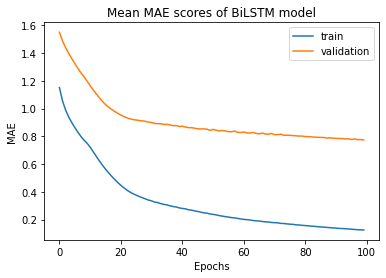

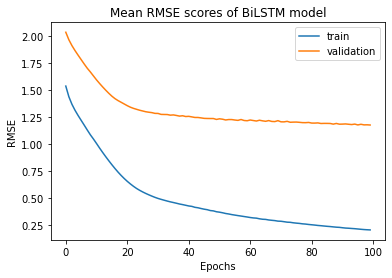

In [114]:
visualize_performance(results_cpt_sat_x[1])

Optimal Mean MAE: 0.8397845836356282 @ epoch 97
Optimal Mean RMSE: 1.276707567833364 @ epoch 97


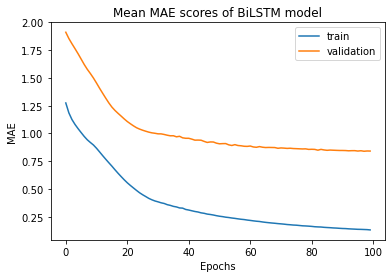

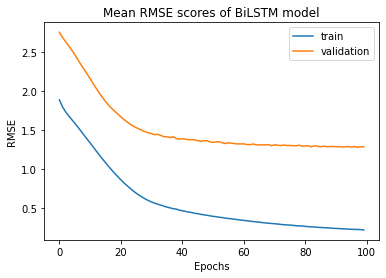

In [115]:
visualize_performance(results_cpt_sat_y[1])

Optimal Mean MAE: 0.8029888894408941 @ epoch 99
Optimal Mean RMSE: 1.2094250002875924 @ epoch 89


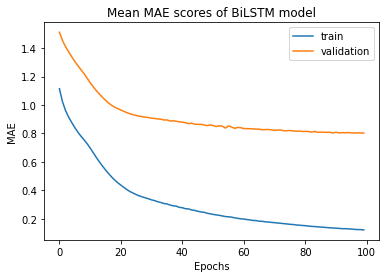

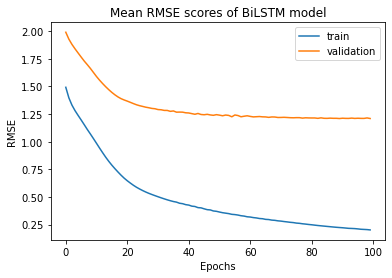

In [116]:
visualize_performance(results_cpt_sat_z[1])

### Aggregate CPT / Satellite (late fusion)

### Aggregate TCMT + CPT / TCMT + Satellite (late fusion)

### Aggregate CPT <- Satellite / Satellite <- CPT (late fusion)

### Aggregate TCMT + CPT <- Satellite / TCMT + Satellite <- CPT (late fusion)

### Naive Baseline

In [180]:
results_naive = train_objects(train_Yx, input_width=10, label_width=5, shift=1, model='naive', incl_cpt=False, tacheometry=True)
results_naive = np.array(results_naive[1])
mae_naive = results_naive[:,0]
rmse_naive = results_naive[:,1]
print(f'Baseline Naive Method MAE = {np.mean(mae_naive)}')
print(f'Baseline Naive Method RMSE = {np.mean(rmse_naive)}')

100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 136.94it/s]

Baseline Naive Method MAE = 1.828440880715415
Baseline Naive Method RMSE = 1.9448206085635256


In [184]:
results_naive = train_objects(train_Yy, input_width=10, label_width=5, shift=1, model='naive', incl_cpt=False, tacheometry=True)
results_naive = np.array(results_naive[1])
mae_naive = results_naive[:,0]
rmse_naive = results_naive[:,1]
print(f'Baseline Naive Method MAE = {np.mean(mae_naive)}')
print(f'Baseline Naive Method RMSE = {np.mean(rmse_naive)}')

100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 131.58it/s]

Baseline Naive Method MAE = 1.9345170177666993
Baseline Naive Method RMSE = 2.056553473904191


In [183]:
results_naive = train_objects(train_Yz, input_width=10, label_width=5, shift=1, model='naive', incl_cpt=False, tacheometry=True)
results_naive = np.array(results_naive[1])
mae_naive = results_naive[:,0]
rmse_naive = results_naive[:,1]
print(f'Baseline Naive Method MAE = {np.mean(mae_naive)}')
print(f'Baseline Naive Method RMSE = {np.mean(rmse_naive)}')

100%|█████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 130.21it/s]

Baseline Naive Method MAE = 1.828440880715415
Baseline Naive Method RMSE = 1.9448206085635256


# Evaluation

In [ ]:
fig, ax = plt.subplots(figsize=(18,6))

# create x axis labels
x_nums = [i for i in range(len(cpt.columns)+1) if i%4==0]
labels = list(['timeseries value']) + list(cpt.columns)

# plot weights
plt.bar(x=range(len(cpt.columns)+1), height=model.layers[0].get_weights()[0].mean(axis=1))
plt.xticks(x_nums, labels[::4], rotation=90)
plt.title('Mean Weights of BiLSTM models')

plt.show()